In [ ]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import _init_paths
import os

import torch
import torch.utils.data
from opts import opts
from config_new_1 import config
from model.model import create_model, load_model, save_model
from model.data_parallel import DataParallel
from logger import Logger
from dataset.dataset_factory import get_dataset
from trainer import Trainer
import matplotlib.pyplot as plt

In [2]:
opt=config()
opt.init()

Running tracking
Using tracking threshold for out threshold! 0.7
Fix size testing.
training chunk_sizes: [8, 8]
input h w: 512 512
heads {'hm': 2, 'reg': 2, 'wh': 2, 'tracking': 2}
weights {'hm': 2.0, 'reg': 1.0, 'wh': 0.4, 'tracking': 1.0}
head conv {'hm': [256], 'reg': [256], 'wh': [256], 'tracking': [256]}


In [2]:
def get_optimizer(opt, model):
    if opt.optim == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), opt.lr)
    elif opt.optim == 'sgd':
        print('Using SGD')
        optimizer = torch.optim.SGD(
            model.parameters(), opt.lr, momentum=0.9, weight_decay=0.0001)
    else:
        assert 0, opt.optim
    return optimizer

########
# MAIN #
########
torch.manual_seed(opt.seed)
torch.backends.cudnn.benchmark = not opt.not_cuda_benchmark and not opt.test
Dataset = get_dataset(opt.dataset)
if not opt.not_set_cuda_env:
    os.environ['CUDA_VISIBLE_DEVICES'] = opt.gpus_str
opt.device = torch.device('cuda' if opt.gpus[0] >= 0 else 'cpu')
logger = Logger(opt)

print('Creating model...')
model = create_model(opt.arch, opt.heads, opt.head_conv, opt=opt)
optimizer = get_optimizer(opt, model)
start_epoch = 0
if opt.load_model != '':
    model, optimizer, start_epoch = load_model(model, opt.load_model, opt, optimizer)
trainer = Trainer(opt, model, optimizer)
trainer.set_device(opt.gpus, opt.chunk_sizes, opt.device)

if opt.val_intervals < opt.num_epochs or opt.test:
    print('Setting up validation data...')
    val_loader = torch.utils.data.DataLoader(
      Dataset(opt, 'val'), batch_size=1, shuffle=False, num_workers=1,
      pin_memory=True)

if opt.test:
    _, preds = trainer.val(0, val_loader)
    val_loader.dataset.run_eval(preds, opt.save_dir)
    exit()

print('Setting up train data...')
train_loader = torch.utils.data.DataLoader(
  Dataset(opt, 'train_new_1'), batch_size=opt.batch_size, shuffle=True,
  num_workers=opt.num_workers, pin_memory=True, drop_last=True
)

NameError: name 'opt' is not defined

==> initializing train_new_1 data from /cis/home/lhuang/my_documents/Cytometry/CenterTrack/data/CellTracking/train_new_1/celldata.json, 
 images from /cis/home/lhuang/my_documents/Cytometry/CenterTrack/data/CellTracking ...
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
Creating video index!
Loaded CellTrack train_new_1 355 samples
dict_keys(['image', 'pre_img', 'pre_hm', 'hm', 'ind', 'cat', 'mask', 'reg', 'reg_mask', 'wh', 'wh_mask', 'tracking', 'tracking_mask', 'meta'])
(512, 512, 3)
(512, 512)
(512, 512)
(512, 512, 3)


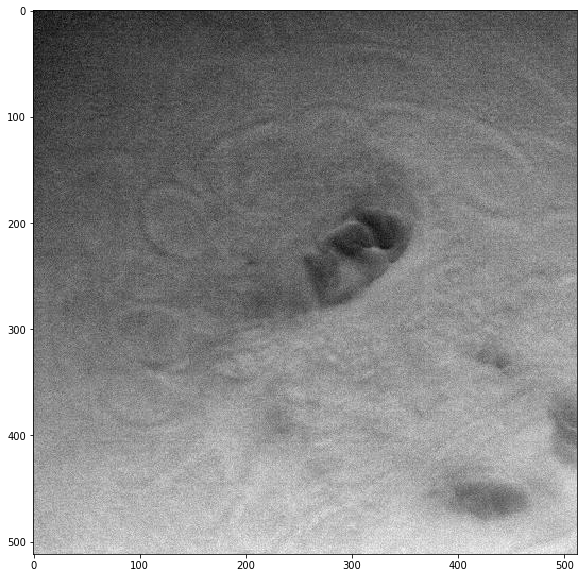

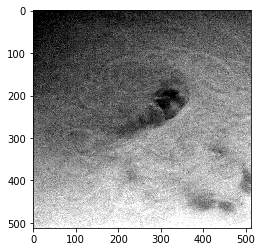

In [7]:
import copy
from PIL import Image, ImageEnhance
Dataset = get_dataset(opt.dataset)
data=Dataset(opt,'train_new_1')
index=50
#img=data[index]['pre_img'][0,:,:]
print(data[index].keys())
_,_,_,_,raw=data._load_data(index)
print(raw.shape)
img=data[index]['pre_img'][0,:,:].copy()
hm=data[index]['pre_hm'][0,:,:]
print(img.shape)
print(hm.shape)
#img=img-np.min(img)
#img=img/np.max(img)
#img=Image.fromarray(np.uint8(img*255.0))
#img=ImageEnhance.Contrast(img).enhance(7.0)
#img=np.array(img)
plt.figure(figsize=(20,10))
img=np.repeat(img[:,:,None],3,axis=-1)
print(img.shape)
plt.imshow(raw)
plt.show()
plt.imshow(img)
plt.show()



In [6]:
print('Starting training...')
for epoch in range(start_epoch + 1, opt.num_epochs + 1):
    mark = epoch if opt.save_all else 'last'
    log_dict_train, _ = trainer.train(epoch, train_loader)
    logger.write('epoch: {} |'.format(epoch))
    print('epoch: ',epoch)
    for k, v in log_dict_train.items():
        logger.scalar_summary('train_{}'.format(k), v, epoch)
        logger.write('{} {:8f} | '.format(k, v))
    if opt.val_intervals > 0 and epoch % opt.val_intervals == 0:
        save_model(os.path.join(logger.log_dir, 'model_{}.pth'.format(mark)), 
                   epoch, model, optimizer)
        with torch.no_grad():
            log_dict_val, preds = trainer.val(epoch, val_loader)
            print(preds)
            if opt.eval_val:
                val_loader.dataset.run_eval(preds, opt.save_dir)
        for k, v in log_dict_val.items():
            logger.scalar_summary('val_{}'.format(k), v, epoch)
            logger.write('{} {:8f} | '.format(k, v))
    else:
        save_model(os.path.join(logger.log_dir, 'model_last.pth'), 
                   epoch, model, optimizer)
    logger.write('\n')
    if epoch % 2 ==0:
        save_model(os.path.join(logger.log_dir, 'model_{}.pth'.format(epoch)), 
                   epoch, model, optimizer)
    if epoch in opt.lr_step:
        lr = opt.lr * (0.4 ** (opt.lr_step.index(epoch) + 1))
        print('Drop LR to', lr)
        for param_group in optimizer.param_groups:
            param_group['lr'] = lr
#logger.close()
    

Starting training...
tracking/cell_tracking1| train: [1][0/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 23.3207 |hm 4.4992 |wh 9.3426 |reg 0.6022 |tracking 9.9830 |Data 0.099s(0.099s) |Net 3.473s
tracking/cell_tracking1| train: [1][1/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 19.4551 |hm 4.3232 |wh 9.2796 |reg 0.5314 |tracking 6.5655 |Data 0.951s(0.525s) |Net 2.274s
tracking/cell_tracking1| train: [1][2/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 17.9020 |hm 4.0982 |wh 9.6836 |reg 0.5313 |tracking 5.3008 |Data 0.428s(0.493s) |Net 1.694s
tracking/cell_tracking1| train: [1][3/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 16.5978 |hm 3.7943 |wh 9.0312 |reg 0.4836 |tracking 4.9130 |Data 0.345s(0.456s) |Net 1.384s
tracking/cell_tracking1| train: [1][4/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 16.1887 |hm 3.5198 |wh 9.0857 |reg 0.4514 |tracking 5.0633 |Data 0.329s(0.430s) |Net 1.192s
tracking/cell_tracking1| train: [1][5/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 15.1670 |hm 3.2946 |wh 8.8230 |reg 0.4288 |tracking 4.6199 |Data 0.44

tracking/cell_tracking1| train: [1][49/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 11.3756 |hm 2.4063 |wh 5.3068 |reg 0.3234 |tracking 4.1169 |Data 0.315s(0.333s) |Net 0.499s
tracking/cell_tracking1| train: [1][50/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 11.2766 |hm 2.3912 |wh 5.2912 |reg 0.3288 |tracking 4.0489 |Data 0.304s(0.333s) |Net 0.497s
tracking/cell_tracking1| train: [1][51/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 11.2612 |hm 2.3843 |wh 5.2443 |reg 0.3279 |tracking 4.0669 |Data 0.320s(0.332s) |Net 0.495s
tracking/cell_tracking1| train: [1][52/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 11.1597 |hm 2.3665 |wh 5.1854 |reg 0.3286 |tracking 4.0240 |Data 0.281s(0.331s) |Net 0.493s
tracking/cell_tracking1| train: [1][53/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 11.2691 |hm 2.4283 |wh 5.1621 |reg 0.3235 |tracking 4.0240 |Data 0.333s(0.331s) |Net 0.492s
tracking/cell_tracking1| train: [1][54/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 11.2587 |hm 2.4210 |wh 5.1164 |reg 0.3240 |tracking 4.0461 |Data 0.301s(0.331s) |Net

tracking/cell_tracking1| train: [1][98/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 10.4462 |hm 2.3506 |wh 4.0404 |reg 0.3002 |tracking 3.8287 |Data 0.318s(0.325s) |Net 0.459s
tracking/cell_tracking1| train: [1][99/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 10.4280 |hm 2.3445 |wh 4.0172 |reg 0.2995 |tracking 3.8326 |Data 0.291s(0.325s) |Net 0.459s
tracking/cell_tracking1| train: [1][100/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 10.4785 |hm 2.3440 |wh 4.0035 |reg 0.2997 |tracking 3.8893 |Data 0.328s(0.325s) |Net 0.459s
tracking/cell_tracking1| train: [1][101/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 10.4736 |hm 2.3428 |wh 3.9947 |reg 0.2990 |tracking 3.8913 |Data 0.297s(0.324s) |Net 0.458s
tracking/cell_tracking1| train: [1][102/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 10.4978 |hm 2.3406 |wh 3.9765 |reg 0.2986 |tracking 3.9275 |Data 0.305s(0.324s) |Net 0.457s
tracking/cell_tracking1| train: [1][103/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 10.5236 |hm 2.3405 |wh 3.9789 |reg 0.2991 |tracking 3.9520 |Data 0.328s(0.324s) 

tracking/cell_tracking1| train: [1][147/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 10.0605 |hm 2.1977 |wh 3.4052 |reg 0.2901 |tracking 4.0130 |Data 0.301s(0.323s) |Net 0.448s
tracking/cell_tracking1| train: [1][148/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 10.0973 |hm 2.2044 |wh 3.3917 |reg 0.2907 |tracking 4.0411 |Data 0.325s(0.323s) |Net 0.447s
tracking/cell_tracking1| train: [1][149/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 10.0737 |hm 2.2001 |wh 3.3815 |reg 0.2908 |tracking 4.0301 |Data 0.309s(0.322s) |Net 0.447s
tracking/cell_tracking1| train: [1][150/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 10.0442 |hm 2.1955 |wh 3.3683 |reg 0.2903 |tracking 4.0156 |Data 0.316s(0.322s) |Net 0.447s
tracking/cell_tracking1| train: [1][151/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 10.0380 |hm 2.1920 |wh 3.3539 |reg 0.2905 |tracking 4.0220 |Data 0.295s(0.322s) |Net 0.447s
tracking/cell_tracking1| train: [1][152/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 10.0148 |hm 2.1868 |wh 3.3466 |reg 0.2903 |tracking 4.0124 |Data 0.311s(0.322s

tracking/cell_tracking1| train: [1][196/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 9.6748 |hm 2.0859 |wh 3.0965 |reg 0.2886 |tracking 3.9760 |Data 0.325s(0.322s) |Net 0.442s
tracking/cell_tracking1| train: [1][197/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 9.6660 |hm 2.0844 |wh 3.0907 |reg 0.2887 |tracking 3.9723 |Data 0.320s(0.322s) |Net 0.442s
tracking/cell_tracking1| train: [1][198/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 9.6542 |hm 2.0817 |wh 3.0838 |reg 0.2885 |tracking 3.9689 |Data 0.309s(0.321s) |Net 0.442s
tracking/cell_tracking1| train: [1][199/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 9.6344 |hm 2.0799 |wh 3.0732 |reg 0.2883 |tracking 3.9571 |Data 0.310s(0.321s) |Net 0.442s
tracking/cell_tracking1| train: [1][200/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 9.6282 |hm 2.0773 |wh 3.0651 |reg 0.2879 |tracking 3.9597 |Data 0.317s(0.321s) |Net 0.442s
tracking/cell_tracking1| train: [1][201/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 9.6136 |hm 2.0748 |wh 3.0588 |reg 0.2871 |tracking 3.9534 |Data 0.316s(0.321s) |Net

tracking/cell_tracking1| train: [1][245/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 9.6252 |hm 2.0238 |wh 2.8933 |reg 0.2867 |tracking 4.1336 |Data 0.313s(0.321s) |Net 0.438s
tracking/cell_tracking1| train: [1][246/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 9.6119 |hm 2.0221 |wh 2.8902 |reg 0.2865 |tracking 4.1252 |Data 0.337s(0.321s) |Net 0.438s
tracking/cell_tracking1| train: [1][247/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 9.5988 |hm 2.0197 |wh 2.8862 |reg 0.2863 |tracking 4.1185 |Data 0.310s(0.321s) |Net 0.438s
tracking/cell_tracking1| train: [1][248/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 9.5933 |hm 2.0179 |wh 2.8822 |reg 0.2861 |tracking 4.1185 |Data 0.336s(0.321s) |Net 0.438s
tracking/cell_tracking1| train: [1][249/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 9.5744 |hm 2.0165 |wh 2.8778 |reg 0.2868 |tracking 4.1036 |Data 0.313s(0.321s) |Net 0.438s
tracking/cell_tracking1| train: [1][250/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 9.5648 |hm 2.0154 |wh 2.8745 |reg 0.2868 |tracking 4.0975 |Data 0.304s(0.321s) |Net

tracking/cell_tracking1| train: [1][294/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 9.3541 |hm 1.9634 |wh 2.7396 |reg 0.2868 |tracking 4.0447 |Data 0.293s(0.319s) |Net 0.435s
tracking/cell_tracking1| train: [1][295/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 9.3677 |hm 1.9716 |wh 2.7605 |reg 0.2860 |tracking 4.0344 |Data 0.300s(0.319s) |Net 0.434s
tracking/cell_tracking1| train: [1][296/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 9.3620 |hm 1.9702 |wh 2.7552 |reg 0.2861 |tracking 4.0335 |Data 0.283s(0.319s) |Net 0.434s
tracking/cell_tracking1| train: [1][297/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 9.3435 |hm 1.9685 |wh 2.7506 |reg 0.2864 |tracking 4.0199 |Data 0.294s(0.319s) |Net 0.434s
tracking/cell_tracking1| train: [1][298/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 9.3379 |hm 1.9673 |wh 2.7494 |reg 0.2864 |tracking 4.0170 |Data 0.298s(0.319s) |Net 0.434s
tracking/cell_tracking1| train: [1][299/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 9.3279 |hm 1.9662 |wh 2.7437 |reg 0.2864 |tracking 4.0116 |Data 0.320s(0.319s) |Net

tracking/cell_tracking1| train: [1][343/355]|Tot: 0:02:28 |ETA: 0:00:00 |tot 9.2558 |hm 1.9434 |wh 2.6549 |reg 0.2848 |tracking 4.0223 |Data 0.308s(0.318s) |Net 0.432s
tracking/cell_tracking1| train: [1][344/355]|Tot: 0:02:29 |ETA: 0:00:00 |tot 9.2475 |hm 1.9420 |wh 2.6523 |reg 0.2851 |tracking 4.0176 |Data 0.303s(0.318s) |Net 0.432s
tracking/cell_tracking1| train: [1][345/355]|Tot: 0:02:29 |ETA: 0:00:00 |tot 9.2399 |hm 1.9406 |wh 2.6540 |reg 0.2849 |tracking 4.0122 |Data 0.307s(0.318s) |Net 0.432s
tracking/cell_tracking1| train: [1][346/355]|Tot: 0:02:29 |ETA: 0:00:00 |tot 9.2371 |hm 1.9422 |wh 2.6540 |reg 0.2847 |tracking 4.0063 |Data 0.300s(0.318s) |Net 0.432s
tracking/cell_tracking1| train: [1][347/355]|Tot: 0:02:30 |ETA: 0:00:00 |tot 9.2337 |hm 1.9428 |wh 2.6560 |reg 0.2845 |tracking 4.0012 |Data 0.292s(0.318s) |Net 0.432s
tracking/cell_tracking1| train: [1][348/355]|Tot: 0:02:30 |ETA: 0:00:00 |tot 9.2401 |hm 1.9418 |wh 2.6528 |reg 0.2843 |tracking 4.0111 |Data 0.297s(0.318s) |Net

tracking/cell_tracking1| train: [2][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 7.6801 |hm 1.5523 |wh 1.9854 |reg 0.2661 |tracking 3.5153 |Data 0.305s(0.298s) |Net 0.399s
tracking/cell_tracking1| train: [2][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 7.7020 |hm 1.5431 |wh 1.9916 |reg 0.2685 |tracking 3.5507 |Data 0.335s(0.299s) |Net 0.400s
tracking/cell_tracking1| train: [2][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 7.7100 |hm 1.5428 |wh 1.9725 |reg 0.2683 |tracking 3.5671 |Data 0.328s(0.300s) |Net 0.401s
tracking/cell_tracking1| train: [2][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 7.6434 |hm 1.5424 |wh 1.9608 |reg 0.2698 |tracking 3.5045 |Data 0.307s(0.300s) |Net 0.401s
tracking/cell_tracking1| train: [2][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 7.8365 |hm 1.5767 |wh 2.0625 |reg 0.2653 |tracking 3.5928 |Data 0.303s(0.300s) |Net 0.402s
tracking/cell_tracking1| train: [2][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 7.8098 |hm 1.5886 |wh 2.0459 |reg 0.2650 |tracking 3.5494 |Data 0.332s(0.301s) |Net 0.402

tracking/cell_tracking1| train: [2][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 7.6249 |hm 1.5512 |wh 1.9586 |reg 0.2686 |tracking 3.4706 |Data 0.305s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [2][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 7.6342 |hm 1.5503 |wh 1.9665 |reg 0.2691 |tracking 3.4780 |Data 0.282s(0.306s) |Net 0.407s
tracking/cell_tracking1| train: [2][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 7.6006 |hm 1.5465 |wh 1.9599 |reg 0.2701 |tracking 3.4536 |Data 0.305s(0.306s) |Net 0.407s
tracking/cell_tracking1| train: [2][90/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 7.5905 |hm 1.5446 |wh 1.9545 |reg 0.2704 |tracking 3.4492 |Data 0.302s(0.306s) |Net 0.407s
tracking/cell_tracking1| train: [2][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 7.6083 |hm 1.5615 |wh 1.9625 |reg 0.2721 |tracking 3.4282 |Data 0.301s(0.306s) |Net 0.407s
tracking/cell_tracking1| train: [2][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 7.6365 |hm 1.5609 |wh 1.9568 |reg 0.2721 |tracking 3.4598 |Data 0.302s(0.306s) |Net 0.407

tracking/cell_tracking1| train: [2][136/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 7.7228 |hm 1.5719 |wh 2.0466 |reg 0.2707 |tracking 3.4897 |Data 0.301s(0.307s) |Net 0.409s
tracking/cell_tracking1| train: [2][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 7.7208 |hm 1.5711 |wh 2.0375 |reg 0.2704 |tracking 3.4931 |Data 0.432s(0.308s) |Net 0.410s
tracking/cell_tracking1| train: [2][138/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 7.7648 |hm 1.5886 |wh 2.0525 |reg 0.2692 |tracking 3.4974 |Data 0.304s(0.308s) |Net 0.410s
tracking/cell_tracking1| train: [2][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 7.7426 |hm 1.5855 |wh 2.0483 |reg 0.2686 |tracking 3.4836 |Data 0.328s(0.308s) |Net 0.410s
tracking/cell_tracking1| train: [2][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 7.8131 |hm 1.5944 |wh 2.0808 |reg 0.2674 |tracking 3.5246 |Data 0.280s(0.308s) |Net 0.410s
tracking/cell_tracking1| train: [2][141/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 7.7989 |hm 1.5948 |wh 2.0760 |reg 0.2678 |tracking 3.5111 |Data 0.308s(0.308s) |Net

tracking/cell_tracking1| train: [2][185/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 7.6922 |hm 1.5776 |wh 2.0592 |reg 0.2676 |tracking 3.4457 |Data 0.313s(0.309s) |Net 0.411s
tracking/cell_tracking1| train: [2][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 7.6904 |hm 1.5738 |wh 2.0590 |reg 0.2678 |tracking 3.4515 |Data 0.304s(0.309s) |Net 0.411s
tracking/cell_tracking1| train: [2][187/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 7.6878 |hm 1.5733 |wh 2.0594 |reg 0.2672 |tracking 3.4502 |Data 0.300s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [2][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 7.6943 |hm 1.5745 |wh 2.0614 |reg 0.2674 |tracking 3.4534 |Data 0.299s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [2][189/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 7.6855 |hm 1.5737 |wh 2.0559 |reg 0.2673 |tracking 3.4485 |Data 0.290s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [2][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 7.6798 |hm 1.5733 |wh 2.0594 |reg 0.2674 |tracking 3.4419 |Data 0.310s(0.308s) |Net

tracking/cell_tracking1| train: [2][234/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 7.8703 |hm 1.5699 |wh 2.0556 |reg 0.2691 |tracking 3.6391 |Data 0.315s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [2][235/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 7.8817 |hm 1.5716 |wh 2.0602 |reg 0.2692 |tracking 3.6453 |Data 0.307s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [2][236/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 7.8931 |hm 1.5687 |wh 2.0606 |reg 0.2690 |tracking 3.6625 |Data 0.316s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [2][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 7.8879 |hm 1.5681 |wh 2.0590 |reg 0.2689 |tracking 3.6592 |Data 0.331s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [2][238/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 7.8796 |hm 1.5672 |wh 2.0603 |reg 0.2689 |tracking 3.6522 |Data 0.342s(0.309s) |Net 0.411s
tracking/cell_tracking1| train: [2][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 7.8851 |hm 1.5651 |wh 2.0571 |reg 0.2692 |tracking 3.6628 |Data 0.336s(0.309s) |Net

tracking/cell_tracking1| train: [2][283/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 7.8595 |hm 1.5535 |wh 2.0179 |reg 0.2660 |tracking 3.6793 |Data 0.283s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [2][284/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 7.8568 |hm 1.5535 |wh 2.0225 |reg 0.2658 |tracking 3.6749 |Data 0.306s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [2][285/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 7.8490 |hm 1.5543 |wh 2.0223 |reg 0.2659 |tracking 3.6656 |Data 0.320s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [2][286/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 7.8389 |hm 1.5533 |wh 2.0198 |reg 0.2656 |tracking 3.6588 |Data 0.303s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [2][287/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 7.8550 |hm 1.5544 |wh 2.0205 |reg 0.2659 |tracking 3.6722 |Data 0.324s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [2][288/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 7.8433 |hm 1.5522 |wh 2.0182 |reg 0.2661 |tracking 3.6654 |Data 0.315s(0.310s) |Net

tracking/cell_tracking1| train: [2][332/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 7.8137 |hm 1.5391 |wh 2.0140 |reg 0.2666 |tracking 3.6632 |Data 0.337s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [2][333/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 7.8051 |hm 1.5381 |wh 2.0142 |reg 0.2666 |tracking 3.6567 |Data 0.334s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [2][334/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 7.7968 |hm 1.5370 |wh 2.0125 |reg 0.2667 |tracking 3.6510 |Data 0.333s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [2][335/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 7.8133 |hm 1.5372 |wh 2.0105 |reg 0.2668 |tracking 3.6679 |Data 0.335s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [2][336/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 7.8166 |hm 1.5352 |wh 2.0110 |reg 0.2669 |tracking 3.6750 |Data 0.323s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [2][337/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 7.8170 |hm 1.5339 |wh 2.0100 |reg 0.2667 |tracking 3.6785 |Data 0.330s(0.310s) |Net

tracking/cell_tracking1| train: [3][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 7.1119 |hm 1.3982 |wh 2.0618 |reg 0.2393 |tracking 3.2515 |Data 0.331s(0.288s) |Net 0.392s
tracking/cell_tracking1| train: [3][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 7.0682 |hm 1.3824 |wh 2.0570 |reg 0.2418 |tracking 3.2389 |Data 0.327s(0.289s) |Net 0.393s
tracking/cell_tracking1| train: [3][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 7.2692 |hm 1.3683 |wh 2.0542 |reg 0.2346 |tracking 3.4764 |Data 0.329s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [3][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 7.1752 |hm 1.3723 |wh 2.0405 |reg 0.2313 |tracking 3.3832 |Data 0.311s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [3][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 7.2497 |hm 1.3876 |wh 2.0359 |reg 0.2356 |tracking 3.4244 |Data 0.300s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [3][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 7.2460 |hm 1.4160 |wh 2.0453 |reg 0.2361 |tracking 3.3597 |Data 0.274s(0.291s) |Net 0.395

tracking/cell_tracking1| train: [3][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 7.1805 |hm 1.3778 |wh 1.9395 |reg 0.2495 |tracking 3.3996 |Data 0.340s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [3][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 7.2145 |hm 1.3908 |wh 1.9343 |reg 0.2487 |tracking 3.4105 |Data 0.321s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [3][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 7.2175 |hm 1.3888 |wh 1.9333 |reg 0.2484 |tracking 3.4181 |Data 0.327s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [3][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 7.2257 |hm 1.3937 |wh 1.9389 |reg 0.2477 |tracking 3.4151 |Data 0.319s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [3][80/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 7.2131 |hm 1.4029 |wh 1.9469 |reg 0.2476 |tracking 3.3810 |Data 0.343s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [3][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 7.1791 |hm 1.4003 |wh 1.9476 |reg 0.2491 |tracking 3.3504 |Data 0.307s(0.304s) |Net 0.408

tracking/cell_tracking1| train: [3][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 7.2121 |hm 1.4175 |wh 1.9073 |reg 0.2583 |tracking 3.3558 |Data 0.302s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [3][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 7.2491 |hm 1.4156 |wh 1.9159 |reg 0.2582 |tracking 3.3933 |Data 0.302s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [3][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 7.2652 |hm 1.4135 |wh 1.9188 |reg 0.2587 |tracking 3.4119 |Data 0.291s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [3][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 7.2472 |hm 1.4118 |wh 1.9173 |reg 0.2589 |tracking 3.3979 |Data 0.327s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [3][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 7.2273 |hm 1.4092 |wh 1.9196 |reg 0.2583 |tracking 3.3827 |Data 0.299s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [3][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 7.2213 |hm 1.4129 |wh 1.9149 |reg 0.2585 |tracking 3.3710 |Data 0.311s(0.306s) |Net

tracking/cell_tracking1| train: [3][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 7.1964 |hm 1.3992 |wh 1.9168 |reg 0.2551 |tracking 3.3763 |Data 0.304s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [3][175/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 7.2021 |hm 1.3964 |wh 1.9167 |reg 0.2544 |tracking 3.3884 |Data 0.315s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [3][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 7.1737 |hm 1.3917 |wh 1.9157 |reg 0.2547 |tracking 3.3692 |Data 0.301s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [3][177/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 7.1685 |hm 1.3952 |wh 1.9131 |reg 0.2546 |tracking 3.3583 |Data 0.303s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [3][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 7.1722 |hm 1.4039 |wh 1.9163 |reg 0.2556 |tracking 3.3424 |Data 0.299s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [3][179/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 7.1694 |hm 1.4027 |wh 1.9189 |reg 0.2553 |tracking 3.3412 |Data 0.324s(0.308s) |Net

tracking/cell_tracking1| train: [3][223/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 7.1811 |hm 1.3897 |wh 1.8920 |reg 0.2541 |tracking 3.3908 |Data 0.302s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [3][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 7.1759 |hm 1.3910 |wh 1.8899 |reg 0.2536 |tracking 3.3843 |Data 0.307s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [3][225/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 7.1675 |hm 1.3907 |wh 1.8874 |reg 0.2538 |tracking 3.3774 |Data 0.278s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [3][226/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 7.1626 |hm 1.3900 |wh 1.8884 |reg 0.2540 |tracking 3.3733 |Data 0.309s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [3][227/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 7.1552 |hm 1.3892 |wh 1.8851 |reg 0.2540 |tracking 3.3688 |Data 0.316s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [3][228/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 7.1498 |hm 1.3882 |wh 1.8832 |reg 0.2539 |tracking 3.3662 |Data 0.311s(0.309s) |Net

tracking/cell_tracking1| train: [3][272/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 7.0993 |hm 1.3633 |wh 1.8574 |reg 0.2536 |tracking 3.3763 |Data 0.296s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [3][273/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 7.0964 |hm 1.3627 |wh 1.8576 |reg 0.2536 |tracking 3.3744 |Data 0.305s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [3][274/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 7.0909 |hm 1.3639 |wh 1.8591 |reg 0.2551 |tracking 3.3643 |Data 0.306s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [3][275/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 7.0857 |hm 1.3629 |wh 1.8540 |reg 0.2550 |tracking 3.3633 |Data 0.303s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [3][276/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 7.0866 |hm 1.3634 |wh 1.8559 |reg 0.2548 |tracking 3.3627 |Data 0.306s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [3][277/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 7.0816 |hm 1.3638 |wh 1.8545 |reg 0.2548 |tracking 3.3574 |Data 0.314s(0.309s) |Net

tracking/cell_tracking1| train: [3][321/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 7.0109 |hm 1.3444 |wh 1.8267 |reg 0.2550 |tracking 3.3364 |Data 0.318s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [3][322/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 7.0090 |hm 1.3431 |wh 1.8249 |reg 0.2550 |tracking 3.3380 |Data 0.326s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [3][323/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 7.0180 |hm 1.3414 |wh 1.8223 |reg 0.2551 |tracking 3.3511 |Data 0.305s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [3][324/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 7.0121 |hm 1.3416 |wh 1.8242 |reg 0.2551 |tracking 3.3441 |Data 0.320s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [3][325/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 6.9975 |hm 1.3403 |wh 1.8214 |reg 0.2545 |tracking 3.3338 |Data 0.305s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [3][326/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 6.9877 |hm 1.3392 |wh 1.8218 |reg 0.2543 |tracking 3.3262 |Data 0.309s(0.311s) |Net

tracking/cell_tracking1| train: [4][15/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 6.5362 |hm 1.2541 |wh 1.7436 |reg 0.2486 |tracking 3.0821 |Data 0.276s(0.270s) |Net 0.373s
tracking/cell_tracking1| train: [4][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 6.4622 |hm 1.2317 |wh 1.7167 |reg 0.2477 |tracking 3.0644 |Data 0.276s(0.270s) |Net 0.373s
tracking/cell_tracking1| train: [4][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 6.5365 |hm 1.2473 |wh 1.7141 |reg 0.2525 |tracking 3.1037 |Data 0.277s(0.270s) |Net 0.374s
tracking/cell_tracking1| train: [4][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 6.4661 |hm 1.2315 |wh 1.7115 |reg 0.2559 |tracking 3.0627 |Data 0.266s(0.270s) |Net 0.373s
tracking/cell_tracking1| train: [4][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 6.3845 |hm 1.2107 |wh 1.6906 |reg 0.2597 |tracking 3.0273 |Data 0.303s(0.272s) |Net 0.375s
tracking/cell_tracking1| train: [4][20/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 6.4220 |hm 1.2312 |wh 1.7146 |reg 0.2610 |tracking 3.0129 |Data 0.331s(0.275s) |Net 0.378

tracking/cell_tracking1| train: [4][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 6.4184 |hm 1.1999 |wh 1.7320 |reg 0.2567 |tracking 3.0691 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [4][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 6.4152 |hm 1.1978 |wh 1.7231 |reg 0.2576 |tracking 3.0727 |Data 0.303s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [4][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 6.4478 |hm 1.1950 |wh 1.7350 |reg 0.2589 |tracking 3.1050 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [4][68/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 6.4342 |hm 1.1958 |wh 1.7426 |reg 0.2606 |tracking 3.0851 |Data 0.317s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [4][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 6.4076 |hm 1.1959 |wh 1.7332 |reg 0.2616 |tracking 3.0608 |Data 0.318s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [4][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 6.3858 |hm 1.1949 |wh 1.7375 |reg 0.2632 |tracking 3.0378 |Data 0.342s(0.304s) |Net 0.408

tracking/cell_tracking1| train: [4][114/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 6.6708 |hm 1.2262 |wh 1.6762 |reg 0.2640 |tracking 3.2841 |Data 0.289s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [4][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 6.6581 |hm 1.2257 |wh 1.6763 |reg 0.2631 |tracking 3.2730 |Data 0.316s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [4][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 6.6518 |hm 1.2243 |wh 1.6781 |reg 0.2636 |tracking 3.2684 |Data 0.306s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [4][117/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 6.6682 |hm 1.2238 |wh 1.6971 |reg 0.2631 |tracking 3.2788 |Data 0.314s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [4][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 6.6858 |hm 1.2244 |wh 1.6979 |reg 0.2629 |tracking 3.2951 |Data 0.346s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [4][119/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 6.6779 |hm 1.2233 |wh 1.6956 |reg 0.2623 |tracking 3.2909 |Data 0.324s(0.307s) |Net

tracking/cell_tracking1| train: [4][163/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 6.5224 |hm 1.2154 |wh 1.6921 |reg 0.2543 |tracking 3.1605 |Data 0.332s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [4][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 6.5108 |hm 1.2161 |wh 1.6972 |reg 0.2550 |tracking 3.1447 |Data 0.316s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [4][165/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 6.5221 |hm 1.2136 |wh 1.6905 |reg 0.2556 |tracking 3.1631 |Data 0.333s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [4][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 6.5164 |hm 1.2125 |wh 1.6868 |reg 0.2555 |tracking 3.1612 |Data 0.335s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [4][167/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 6.4995 |hm 1.2108 |wh 1.6826 |reg 0.2553 |tracking 3.1495 |Data 0.301s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [4][168/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 6.4801 |hm 1.2108 |wh 1.6803 |reg 0.2555 |tracking 3.1308 |Data 0.304s(0.308s) |Net

tracking/cell_tracking1| train: [4][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 6.4707 |hm 1.1935 |wh 1.6567 |reg 0.2523 |tracking 3.1688 |Data 0.306s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [4][213/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 6.4553 |hm 1.1918 |wh 1.6535 |reg 0.2528 |tracking 3.1575 |Data 0.313s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [4][214/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 6.4523 |hm 1.1911 |wh 1.6508 |reg 0.2531 |tracking 3.1568 |Data 0.283s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [4][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 6.4621 |hm 1.1900 |wh 1.6501 |reg 0.2531 |tracking 3.1690 |Data 0.305s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [4][216/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 6.4591 |hm 1.1886 |wh 1.6534 |reg 0.2533 |tracking 3.1672 |Data 0.312s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [4][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 6.4477 |hm 1.1865 |wh 1.6539 |reg 0.2534 |tracking 3.1597 |Data 0.313s(0.308s) |Net

tracking/cell_tracking1| train: [4][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 6.4445 |hm 1.1762 |wh 1.6688 |reg 0.2526 |tracking 3.1719 |Data 0.305s(0.309s) |Net 0.412s
tracking/cell_tracking1| train: [4][262/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 6.4767 |hm 1.1806 |wh 1.6827 |reg 0.2531 |tracking 3.1893 |Data 0.309s(0.309s) |Net 0.412s
tracking/cell_tracking1| train: [4][263/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 6.4957 |hm 1.1818 |wh 1.6838 |reg 0.2530 |tracking 3.2056 |Data 0.328s(0.309s) |Net 0.412s
tracking/cell_tracking1| train: [4][264/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 6.5150 |hm 1.1803 |wh 1.6834 |reg 0.2531 |tracking 3.2281 |Data 0.303s(0.309s) |Net 0.412s
tracking/cell_tracking1| train: [4][265/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 6.5120 |hm 1.1807 |wh 1.6825 |reg 0.2531 |tracking 3.2244 |Data 0.313s(0.309s) |Net 0.412s
tracking/cell_tracking1| train: [4][266/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 6.5044 |hm 1.1814 |wh 1.6813 |reg 0.2531 |tracking 3.2161 |Data 0.352s(0.309s) |Net

tracking/cell_tracking1| train: [4][310/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 6.4059 |hm 1.1724 |wh 1.6853 |reg 0.2510 |tracking 3.1360 |Data 0.305s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [4][311/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 6.4020 |hm 1.1730 |wh 1.6843 |reg 0.2507 |tracking 3.1315 |Data 0.304s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [4][312/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 6.4180 |hm 1.1729 |wh 1.6835 |reg 0.2508 |tracking 3.1481 |Data 0.300s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [4][313/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 6.4092 |hm 1.1718 |wh 1.6817 |reg 0.2506 |tracking 3.1424 |Data 0.303s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [4][314/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 6.4011 |hm 1.1699 |wh 1.6807 |reg 0.2503 |tracking 3.1388 |Data 0.305s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [4][315/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 6.4068 |hm 1.1691 |wh 1.6805 |reg 0.2503 |tracking 3.1462 |Data 0.312s(0.310s) |Net

tracking/cell_tracking1| train: [5][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 7.7215 |hm 1.0669 |wh 1.4137 |reg 0.2387 |tracking 4.7836 |Data 0.274s(0.244s) |Net 0.348s
tracking/cell_tracking1| train: [5][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 7.5441 |hm 1.0324 |wh 1.3194 |reg 0.2388 |tracking 4.7127 |Data 0.280s(0.250s) |Net 0.353s
tracking/cell_tracking1| train: [5][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 7.6545 |hm 1.0462 |wh 1.3293 |reg 0.2378 |tracking 4.7926 |Data 0.257s(0.251s) |Net 0.353s
tracking/cell_tracking1| train: [5][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 7.6482 |hm 1.0982 |wh 1.3730 |reg 0.2465 |tracking 4.6560 |Data 0.281s(0.255s) |Net 0.356s
tracking/cell_tracking1| train: [5][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 7.2911 |hm 1.0882 |wh 1.3302 |reg 0.2412 |tracking 4.3415 |Data 0.302s(0.260s) |Net 0.361s
tracking/cell_tracking1| train: [5][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 7.1218 |hm 1.0955 |wh 1.3547 |reg 0.2417 |tracking 4.1473 |Data 0.281s(0.262s) |Net 0.363s
trac

tracking/cell_tracking1| train: [5][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 6.2669 |hm 1.0381 |wh 1.4693 |reg 0.2454 |tracking 3.3576 |Data 0.293s(0.297s) |Net 0.398s
tracking/cell_tracking1| train: [5][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 6.2611 |hm 1.0397 |wh 1.4739 |reg 0.2453 |tracking 3.3470 |Data 0.302s(0.297s) |Net 0.398s
tracking/cell_tracking1| train: [5][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 6.2458 |hm 1.0398 |wh 1.4797 |reg 0.2451 |tracking 3.3291 |Data 0.312s(0.297s) |Net 0.399s
tracking/cell_tracking1| train: [5][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 6.2166 |hm 1.0384 |wh 1.4862 |reg 0.2471 |tracking 3.2982 |Data 0.308s(0.297s) |Net 0.399s
tracking/cell_tracking1| train: [5][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 6.2118 |hm 1.0374 |wh 1.4909 |reg 0.2461 |tracking 3.2945 |Data 0.332s(0.298s) |Net 0.399s
tracking/cell_tracking1| train: [5][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 6.1802 |hm 1.0325 |wh 1.4966 |reg 0.2460 |tracking 3.2706 |Data 0.315s(0.298s) |Net 0.400

tracking/cell_tracking1| train: [5][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 6.3396 |hm 1.0866 |wh 1.5547 |reg 0.2463 |tracking 3.2982 |Data 0.319s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [5][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 6.3259 |hm 1.0850 |wh 1.5506 |reg 0.2467 |tracking 3.2890 |Data 0.306s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [5][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 6.3402 |hm 1.0839 |wh 1.5469 |reg 0.2464 |tracking 3.3073 |Data 0.326s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [5][107/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 6.3162 |hm 1.0829 |wh 1.5409 |reg 0.2457 |tracking 3.2884 |Data 0.316s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [5][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 6.3106 |hm 1.0830 |wh 1.5406 |reg 0.2459 |tracking 3.2825 |Data 0.342s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [5][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 6.2995 |hm 1.0818 |wh 1.5419 |reg 0.2459 |tracking 3.2731 |Data 0.311s(0.306s) |Net

tracking/cell_tracking1| train: [5][153/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 6.3215 |hm 1.0944 |wh 1.5685 |reg 0.2465 |tracking 3.2589 |Data 0.345s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [5][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 6.3932 |hm 1.1156 |wh 1.6281 |reg 0.2465 |tracking 3.2643 |Data 0.311s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [5][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 6.3887 |hm 1.1170 |wh 1.6296 |reg 0.2464 |tracking 3.2565 |Data 0.308s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [5][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 6.3877 |hm 1.1163 |wh 1.6276 |reg 0.2466 |tracking 3.2574 |Data 0.343s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [5][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 6.3748 |hm 1.1134 |wh 1.6253 |reg 0.2460 |tracking 3.2518 |Data 0.338s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [5][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 6.3607 |hm 1.1100 |wh 1.6242 |reg 0.2464 |tracking 3.2446 |Data 0.349s(0.307s) |Net

tracking/cell_tracking1| train: [5][202/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 6.4504 |hm 1.1036 |wh 1.6297 |reg 0.2467 |tracking 3.3446 |Data 0.337s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [5][203/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 6.4631 |hm 1.1033 |wh 1.6349 |reg 0.2469 |tracking 3.3558 |Data 0.340s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [5][204/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 6.4615 |hm 1.1013 |wh 1.6292 |reg 0.2465 |tracking 3.3608 |Data 0.305s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [5][205/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 6.4517 |hm 1.1011 |wh 1.6262 |reg 0.2469 |tracking 3.3520 |Data 0.322s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [5][206/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 6.4509 |hm 1.1004 |wh 1.6232 |reg 0.2466 |tracking 3.3542 |Data 0.303s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [5][207/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 6.4441 |hm 1.1004 |wh 1.6212 |reg 0.2464 |tracking 3.3484 |Data 0.316s(0.310s) |Net

tracking/cell_tracking1| train: [5][251/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 6.5359 |hm 1.0943 |wh 1.6154 |reg 0.2485 |tracking 3.4525 |Data 0.329s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [5][252/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 6.5377 |hm 1.0929 |wh 1.6148 |reg 0.2490 |tracking 3.4571 |Data 0.335s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [5][253/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 6.5294 |hm 1.0908 |wh 1.6133 |reg 0.2488 |tracking 3.4536 |Data 0.303s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [5][254/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 6.5294 |hm 1.0902 |wh 1.6135 |reg 0.2488 |tracking 3.4548 |Data 0.300s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [5][255/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 6.5218 |hm 1.0915 |wh 1.6114 |reg 0.2487 |tracking 3.4456 |Data 0.294s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [5][256/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 6.5034 |hm 1.0898 |wh 1.6071 |reg 0.2488 |tracking 3.4322 |Data 0.296s(0.311s) |Net

tracking/cell_tracking1| train: [5][300/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 6.4259 |hm 1.0945 |wh 1.6080 |reg 0.2480 |tracking 3.3457 |Data 0.306s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [5][301/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 6.4145 |hm 1.0924 |wh 1.6064 |reg 0.2481 |tracking 3.3391 |Data 0.295s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [5][302/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 6.4034 |hm 1.0908 |wh 1.6057 |reg 0.2482 |tracking 3.3312 |Data 0.310s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [5][303/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 6.4068 |hm 1.0954 |wh 1.6061 |reg 0.2491 |tracking 3.3244 |Data 0.308s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [5][304/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 6.4056 |hm 1.0973 |wh 1.6128 |reg 0.2492 |tracking 3.3167 |Data 0.302s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [5][305/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 6.4083 |hm 1.0974 |wh 1.6129 |reg 0.2496 |tracking 3.3187 |Data 0.316s(0.311s) |Net

tracking/cell_tracking1| train: [5][349/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 6.3382 |hm 1.0907 |wh 1.5982 |reg 0.2485 |tracking 3.2691 |Data 0.315s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [5][350/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 6.3356 |hm 1.0894 |wh 1.5993 |reg 0.2483 |tracking 3.2688 |Data 0.306s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [5][351/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 6.3281 |hm 1.0887 |wh 1.5996 |reg 0.2483 |tracking 3.2625 |Data 0.298s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [5][352/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 6.3468 |hm 1.0901 |wh 1.5992 |reg 0.2485 |tracking 3.2784 |Data 0.301s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [5][353/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 6.3469 |hm 1.0899 |wh 1.5981 |reg 0.2486 |tracking 3.2793 |Data 0.310s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [5][354/355]|Tot: 0:02:27 |ETA: 0:00:00 |tot 6.3445 |hm 1.0898 |wh 1.5995 |reg 0.2488 |tracking 3.2764 |Data 0.301s(0.311s) |Net

tracking/cell_tracking1| train: [6][44/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 6.3752 |hm 1.0234 |wh 1.5186 |reg 0.2545 |tracking 3.4666 |Data 0.332s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [6][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 6.4420 |hm 1.0399 |wh 1.5129 |reg 0.2537 |tracking 3.5034 |Data 0.310s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [6][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 6.4191 |hm 1.0372 |wh 1.5063 |reg 0.2539 |tracking 3.4883 |Data 0.320s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [6][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 6.3803 |hm 1.0357 |wh 1.4987 |reg 0.2571 |tracking 3.4523 |Data 0.295s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [6][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 6.3766 |hm 1.0492 |wh 1.4984 |reg 0.2569 |tracking 3.4220 |Data 0.305s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [6][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 6.3641 |hm 1.0439 |wh 1.5088 |reg 0.2578 |tracking 3.4150 |Data 0.320s(0.297s) |Net 0.400

tracking/cell_tracking1| train: [6][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 5.9355 |hm 0.9873 |wh 1.4993 |reg 0.2592 |tracking 3.1019 |Data 0.328s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [6][95/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 5.9379 |hm 0.9886 |wh 1.4958 |reg 0.2587 |tracking 3.1038 |Data 0.328s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [6][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 5.9602 |hm 0.9905 |wh 1.4969 |reg 0.2599 |tracking 3.1205 |Data 0.331s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [6][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 5.9590 |hm 0.9900 |wh 1.5021 |reg 0.2594 |tracking 3.1187 |Data 0.330s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [6][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 5.9515 |hm 0.9951 |wh 1.4977 |reg 0.2595 |tracking 3.1028 |Data 0.330s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [6][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 5.9280 |hm 0.9911 |wh 1.4972 |reg 0.2595 |tracking 3.0874 |Data 0.337s(0.305s) |Net 0.408

tracking/cell_tracking1| train: [6][143/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 5.9052 |hm 0.9875 |wh 1.4720 |reg 0.2509 |tracking 3.0905 |Data 0.317s(0.309s) |Net 0.412s
tracking/cell_tracking1| train: [6][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 5.8919 |hm 0.9857 |wh 1.4729 |reg 0.2510 |tracking 3.0803 |Data 0.310s(0.309s) |Net 0.412s
tracking/cell_tracking1| train: [6][145/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 5.8909 |hm 0.9874 |wh 1.4755 |reg 0.2520 |tracking 3.0739 |Data 0.326s(0.309s) |Net 0.412s
tracking/cell_tracking1| train: [6][146/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 5.8629 |hm 0.9818 |wh 1.4713 |reg 0.2523 |tracking 3.0586 |Data 0.326s(0.309s) |Net 0.412s
tracking/cell_tracking1| train: [6][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 5.8457 |hm 0.9812 |wh 1.4722 |reg 0.2520 |tracking 3.0424 |Data 0.289s(0.309s) |Net 0.412s
tracking/cell_tracking1| train: [6][148/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 5.8502 |hm 0.9800 |wh 1.4765 |reg 0.2518 |tracking 3.0477 |Data 0.307s(0.309s) |Net

tracking/cell_tracking1| train: [6][192/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 6.0205 |hm 0.9978 |wh 1.4454 |reg 0.2487 |tracking 3.1981 |Data 0.308s(0.310s) |Net 0.412s
tracking/cell_tracking1| train: [6][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 6.0227 |hm 0.9987 |wh 1.4479 |reg 0.2487 |tracking 3.1974 |Data 0.334s(0.310s) |Net 0.412s
tracking/cell_tracking1| train: [6][194/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 6.0206 |hm 0.9991 |wh 1.4536 |reg 0.2489 |tracking 3.1922 |Data 0.334s(0.310s) |Net 0.412s
tracking/cell_tracking1| train: [6][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 6.0133 |hm 1.0007 |wh 1.4542 |reg 0.2487 |tracking 3.1815 |Data 0.295s(0.310s) |Net 0.412s
tracking/cell_tracking1| train: [6][196/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 6.0028 |hm 1.0009 |wh 1.4513 |reg 0.2490 |tracking 3.1714 |Data 0.303s(0.310s) |Net 0.412s
tracking/cell_tracking1| train: [6][197/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 5.9943 |hm 1.0033 |wh 1.4492 |reg 0.2485 |tracking 3.1594 |Data 0.327s(0.310s) |Net

tracking/cell_tracking1| train: [6][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 6.0050 |hm 1.0287 |wh 1.4893 |reg 0.2504 |tracking 3.1015 |Data 0.309s(0.310s) |Net 0.412s
tracking/cell_tracking1| train: [6][242/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 6.0097 |hm 1.0276 |wh 1.4877 |reg 0.2498 |tracking 3.1096 |Data 0.333s(0.310s) |Net 0.412s
tracking/cell_tracking1| train: [6][243/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 6.0016 |hm 1.0264 |wh 1.4858 |reg 0.2498 |tracking 3.1046 |Data 0.278s(0.310s) |Net 0.412s
tracking/cell_tracking1| train: [6][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 5.9909 |hm 1.0257 |wh 1.4869 |reg 0.2499 |tracking 3.0949 |Data 0.328s(0.310s) |Net 0.412s
tracking/cell_tracking1| train: [6][245/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 5.9780 |hm 1.0239 |wh 1.4856 |reg 0.2497 |tracking 3.0863 |Data 0.308s(0.310s) |Net 0.412s
tracking/cell_tracking1| train: [6][246/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 5.9718 |hm 1.0237 |wh 1.4854 |reg 0.2497 |tracking 3.0805 |Data 0.307s(0.310s) |Net

tracking/cell_tracking1| train: [6][290/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 5.9557 |hm 1.0208 |wh 1.4847 |reg 0.2490 |tracking 3.0713 |Data 0.323s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [6][291/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 5.9590 |hm 1.0238 |wh 1.4833 |reg 0.2487 |tracking 3.0695 |Data 0.333s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [6][292/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 5.9613 |hm 1.0251 |wh 1.4833 |reg 0.2487 |tracking 3.0691 |Data 0.335s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [6][293/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 5.9559 |hm 1.0245 |wh 1.4833 |reg 0.2488 |tracking 3.0648 |Data 0.330s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [6][294/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 5.9631 |hm 1.0242 |wh 1.4831 |reg 0.2486 |tracking 3.0729 |Data 0.333s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [6][295/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 5.9562 |hm 1.0227 |wh 1.4820 |reg 0.2486 |tracking 3.0694 |Data 0.327s(0.311s) |Net

tracking/cell_tracking1| train: [6][339/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 5.9336 |hm 1.0312 |wh 1.4944 |reg 0.2494 |tracking 3.0240 |Data 0.306s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [6][340/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 5.9397 |hm 1.0301 |wh 1.4963 |reg 0.2499 |tracking 3.0311 |Data 0.319s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [6][341/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 5.9402 |hm 1.0298 |wh 1.4967 |reg 0.2501 |tracking 3.0320 |Data 0.325s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [6][342/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 5.9453 |hm 1.0303 |wh 1.4955 |reg 0.2500 |tracking 3.0365 |Data 0.327s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [6][343/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 5.9404 |hm 1.0286 |wh 1.4945 |reg 0.2503 |tracking 3.0351 |Data 0.324s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [6][344/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 5.9346 |hm 1.0281 |wh 1.4935 |reg 0.2507 |tracking 3.0303 |Data 0.333s(0.311s) |Net

tracking/cell_tracking1| train: [7][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 5.2394 |hm 0.9105 |wh 1.3893 |reg 0.2220 |tracking 2.6406 |Data 0.308s(0.295s) |Net 0.401s
tracking/cell_tracking1| train: [7][34/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 5.2801 |hm 0.9254 |wh 1.4007 |reg 0.2238 |tracking 2.6452 |Data 0.305s(0.295s) |Net 0.401s
tracking/cell_tracking1| train: [7][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 5.2943 |hm 0.9573 |wh 1.3899 |reg 0.2257 |tracking 2.5982 |Data 0.313s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [7][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 5.3049 |hm 0.9647 |wh 1.4057 |reg 0.2263 |tracking 2.5868 |Data 0.310s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [7][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 5.2658 |hm 0.9654 |wh 1.3967 |reg 0.2257 |tracking 2.5505 |Data 0.352s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [7][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 5.2196 |hm 0.9645 |wh 1.3869 |reg 0.2259 |tracking 2.5099 |Data 0.299s(0.298s) |Net 0.403

tracking/cell_tracking1| train: [7][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 5.6057 |hm 0.9647 |wh 1.4141 |reg 0.2236 |tracking 2.8870 |Data 0.311s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [7][84/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 5.5825 |hm 0.9614 |wh 1.4159 |reg 0.2237 |tracking 2.8695 |Data 0.309s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [7][85/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 5.5607 |hm 0.9569 |wh 1.4199 |reg 0.2249 |tracking 2.8540 |Data 0.334s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [7][86/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 5.5804 |hm 0.9660 |wh 1.4365 |reg 0.2278 |tracking 2.8461 |Data 0.320s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [7][87/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 5.6323 |hm 0.9701 |wh 1.4397 |reg 0.2280 |tracking 2.8883 |Data 0.306s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [7][88/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 5.6346 |hm 0.9668 |wh 1.4386 |reg 0.2298 |tracking 2.8957 |Data 0.327s(0.309s) |Net 0.416

tracking/cell_tracking1| train: [7][132/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 5.5254 |hm 0.9567 |wh 1.4438 |reg 0.2265 |tracking 2.8080 |Data 0.314s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [7][133/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 5.5169 |hm 0.9544 |wh 1.4397 |reg 0.2264 |tracking 2.8058 |Data 0.313s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [7][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 5.5013 |hm 0.9530 |wh 1.4420 |reg 0.2267 |tracking 2.7917 |Data 0.323s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [7][135/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 5.4750 |hm 0.9513 |wh 1.4366 |reg 0.2266 |tracking 2.7712 |Data 0.305s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [7][136/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 5.4878 |hm 0.9551 |wh 1.4413 |reg 0.2266 |tracking 2.7745 |Data 0.297s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [7][137/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 5.5080 |hm 0.9544 |wh 1.4488 |reg 0.2257 |tracking 2.7938 |Data 0.300s(0.309s) |Net

tracking/cell_tracking1| train: [7][181/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 5.4478 |hm 0.9424 |wh 1.4446 |reg 0.2254 |tracking 2.7598 |Data 0.310s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [7][182/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 5.4447 |hm 0.9418 |wh 1.4444 |reg 0.2261 |tracking 2.7573 |Data 0.305s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [7][183/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 5.4922 |hm 0.9448 |wh 1.4419 |reg 0.2261 |tracking 2.7998 |Data 0.303s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [7][184/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 5.5027 |hm 0.9489 |wh 1.4505 |reg 0.2263 |tracking 2.7985 |Data 0.301s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [7][185/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 5.5220 |hm 0.9515 |wh 1.4510 |reg 0.2265 |tracking 2.8120 |Data 0.323s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [7][186/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 5.5239 |hm 0.9522 |wh 1.4536 |reg 0.2272 |tracking 2.8108 |Data 0.311s(0.310s) |Net

tracking/cell_tracking1| train: [7][230/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 5.5432 |hm 0.9480 |wh 1.4440 |reg 0.2333 |tracking 2.8363 |Data 0.320s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [7][231/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 5.5621 |hm 0.9490 |wh 1.4437 |reg 0.2334 |tracking 2.8532 |Data 0.309s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [7][232/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 5.5784 |hm 0.9519 |wh 1.4462 |reg 0.2335 |tracking 2.8628 |Data 0.330s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [7][233/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 5.5850 |hm 0.9547 |wh 1.4439 |reg 0.2336 |tracking 2.8645 |Data 0.329s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [7][234/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 5.5819 |hm 0.9551 |wh 1.4466 |reg 0.2336 |tracking 2.8594 |Data 0.326s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [7][235/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 5.5770 |hm 0.9544 |wh 1.4462 |reg 0.2338 |tracking 2.8560 |Data 0.348s(0.310s) |Net

tracking/cell_tracking1| train: [7][279/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 5.6317 |hm 0.9533 |wh 1.4489 |reg 0.2336 |tracking 2.9119 |Data 0.303s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [7][280/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 5.6214 |hm 0.9532 |wh 1.4447 |reg 0.2338 |tracking 2.9033 |Data 0.304s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [7][281/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 5.6237 |hm 0.9547 |wh 1.4506 |reg 0.2341 |tracking 2.8998 |Data 0.314s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [7][282/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 5.6131 |hm 0.9531 |wh 1.4498 |reg 0.2344 |tracking 2.8925 |Data 0.313s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [7][283/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 5.6131 |hm 0.9547 |wh 1.4495 |reg 0.2344 |tracking 2.8894 |Data 0.289s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [7][284/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 5.6100 |hm 0.9547 |wh 1.4499 |reg 0.2347 |tracking 2.8861 |Data 0.311s(0.310s) |Net

tracking/cell_tracking1| train: [7][328/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 5.5814 |hm 0.9478 |wh 1.4348 |reg 0.2355 |tracking 2.8765 |Data 0.314s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [7][329/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 5.5783 |hm 0.9475 |wh 1.4344 |reg 0.2355 |tracking 2.8740 |Data 0.305s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [7][330/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 5.5681 |hm 0.9463 |wh 1.4324 |reg 0.2358 |tracking 2.8667 |Data 0.303s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [7][331/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 5.5720 |hm 0.9450 |wh 1.4312 |reg 0.2358 |tracking 2.8738 |Data 0.305s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [7][332/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 5.5678 |hm 0.9442 |wh 1.4304 |reg 0.2356 |tracking 2.8716 |Data 0.308s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [7][333/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 5.5665 |hm 0.9437 |wh 1.4308 |reg 0.2357 |tracking 2.8710 |Data 0.297s(0.311s) |Net

tracking/cell_tracking1| train: [8][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 5.5484 |hm 0.7529 |wh 1.2049 |reg 0.2356 |tracking 3.3252 |Data 0.283s(0.287s) |Net 0.394s
tracking/cell_tracking1| train: [8][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 5.5412 |hm 0.7578 |wh 1.2353 |reg 0.2375 |tracking 3.2940 |Data 0.307s(0.287s) |Net 0.395s
tracking/cell_tracking1| train: [8][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 5.5593 |hm 0.7628 |wh 1.2463 |reg 0.2390 |tracking 3.2962 |Data 0.303s(0.288s) |Net 0.395s
tracking/cell_tracking1| train: [8][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 5.5283 |hm 0.7598 |wh 1.2493 |reg 0.2409 |tracking 3.2680 |Data 0.289s(0.288s) |Net 0.395s
tracking/cell_tracking1| train: [8][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 5.4850 |hm 0.7601 |wh 1.2701 |reg 0.2399 |tracking 3.2167 |Data 0.300s(0.289s) |Net 0.395s
tracking/cell_tracking1| train: [8][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 5.4463 |hm 0.7642 |wh 1.2818 |reg 0.2398 |tracking 3.1655 |Data 0.289s(0.289s) |Net 0.395

tracking/cell_tracking1| train: [8][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 5.4275 |hm 0.8116 |wh 1.3438 |reg 0.2364 |tracking 3.0304 |Data 0.330s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [8][73/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 5.3956 |hm 0.8070 |wh 1.3495 |reg 0.2379 |tracking 3.0039 |Data 0.308s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [8][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 5.3841 |hm 0.8056 |wh 1.3424 |reg 0.2373 |tracking 2.9986 |Data 0.328s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [8][75/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 5.3406 |hm 0.8006 |wh 1.3386 |reg 0.2376 |tracking 2.9664 |Data 0.307s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [8][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 5.4006 |hm 0.8012 |wh 1.3420 |reg 0.2387 |tracking 3.0228 |Data 0.293s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [8][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 5.4245 |hm 0.8008 |wh 1.3343 |reg 0.2388 |tracking 3.0503 |Data 0.321s(0.303s) |Net 0.410

tracking/cell_tracking1| train: [8][121/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 5.4239 |hm 0.8412 |wh 1.3190 |reg 0.2404 |tracking 2.9735 |Data 0.299s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [8][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 5.4162 |hm 0.8403 |wh 1.3213 |reg 0.2411 |tracking 2.9661 |Data 0.310s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [8][123/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 5.4034 |hm 0.8410 |wh 1.3244 |reg 0.2416 |tracking 2.9500 |Data 0.301s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [8][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 5.3931 |hm 0.8383 |wh 1.3226 |reg 0.2412 |tracking 2.9463 |Data 0.301s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [8][125/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 5.3776 |hm 0.8363 |wh 1.3323 |reg 0.2414 |tracking 2.9306 |Data 0.308s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [8][126/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 5.3877 |hm 0.8385 |wh 1.3353 |reg 0.2420 |tracking 2.9346 |Data 0.305s(0.307s) |Net

tracking/cell_tracking1| train: [8][170/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 5.7420 |hm 0.9626 |wh 1.4990 |reg 0.2410 |tracking 2.9761 |Data 0.300s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [8][171/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 5.7720 |hm 0.9767 |wh 1.5115 |reg 0.2412 |tracking 2.9728 |Data 0.294s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [8][172/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 5.7578 |hm 0.9751 |wh 1.5110 |reg 0.2408 |tracking 2.9625 |Data 0.316s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [8][173/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 5.7576 |hm 0.9764 |wh 1.5103 |reg 0.2406 |tracking 2.9602 |Data 0.301s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [8][174/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 5.7599 |hm 0.9746 |wh 1.5083 |reg 0.2411 |tracking 2.9662 |Data 0.313s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [8][175/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 5.7686 |hm 0.9789 |wh 1.5186 |reg 0.2409 |tracking 2.9625 |Data 0.324s(0.309s) |Net

tracking/cell_tracking1| train: [8][219/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 5.8864 |hm 0.9919 |wh 1.5226 |reg 0.2403 |tracking 3.0532 |Data 0.322s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [8][220/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 5.8950 |hm 0.9918 |wh 1.5205 |reg 0.2401 |tracking 3.0631 |Data 0.277s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [8][221/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 5.9112 |hm 0.9916 |wh 1.5184 |reg 0.2406 |tracking 3.0801 |Data 0.329s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [8][222/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 5.9108 |hm 0.9947 |wh 1.5177 |reg 0.2409 |tracking 3.0735 |Data 0.334s(0.310s) |Net 0.417s
tracking/cell_tracking1| train: [8][223/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 5.9038 |hm 0.9949 |wh 1.5178 |reg 0.2408 |tracking 3.0660 |Data 0.323s(0.310s) |Net 0.417s
tracking/cell_tracking1| train: [8][224/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 5.8949 |hm 0.9934 |wh 1.5155 |reg 0.2408 |tracking 3.0612 |Data 0.340s(0.310s) |Net

tracking/cell_tracking1| train: [8][268/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 5.7952 |hm 0.9624 |wh 1.4883 |reg 0.2397 |tracking 3.0353 |Data 0.310s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [8][269/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 5.7807 |hm 0.9610 |wh 1.4878 |reg 0.2396 |tracking 3.0240 |Data 0.316s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [8][270/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 5.7919 |hm 0.9630 |wh 1.4888 |reg 0.2397 |tracking 3.0306 |Data 0.281s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [8][271/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 5.8012 |hm 0.9631 |wh 1.4972 |reg 0.2401 |tracking 3.0359 |Data 0.300s(0.310s) |Net 0.417s
tracking/cell_tracking1| train: [8][272/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 5.7909 |hm 0.9624 |wh 1.4975 |reg 0.2401 |tracking 3.0270 |Data 0.324s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [8][273/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 5.7915 |hm 0.9617 |wh 1.4966 |reg 0.2400 |tracking 3.0295 |Data 0.313s(0.311s) |Net

tracking/cell_tracking1| train: [8][317/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 5.8203 |hm 0.9604 |wh 1.4898 |reg 0.2388 |tracking 3.0648 |Data 0.298s(0.310s) |Net 0.417s
tracking/cell_tracking1| train: [8][318/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 5.8224 |hm 0.9608 |wh 1.4896 |reg 0.2389 |tracking 3.0661 |Data 0.333s(0.310s) |Net 0.417s
tracking/cell_tracking1| train: [8][319/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 5.8141 |hm 0.9601 |wh 1.4903 |reg 0.2397 |tracking 3.0581 |Data 0.325s(0.310s) |Net 0.417s
tracking/cell_tracking1| train: [8][320/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 5.8143 |hm 0.9607 |wh 1.4912 |reg 0.2393 |tracking 3.0572 |Data 0.313s(0.310s) |Net 0.417s
tracking/cell_tracking1| train: [8][321/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 5.8092 |hm 0.9594 |wh 1.4927 |reg 0.2390 |tracking 3.0542 |Data 0.331s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [8][322/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 5.8112 |hm 0.9611 |wh 1.4946 |reg 0.2393 |tracking 3.0520 |Data 0.326s(0.311s) |Net

tracking/cell_tracking1| train: [9][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 5.4116 |hm 0.8634 |wh 1.4551 |reg 0.2617 |tracking 2.8411 |Data 0.282s(0.293s) |Net 0.402s
tracking/cell_tracking1| train: [9][12/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 5.4731 |hm 0.8331 |wh 1.4839 |reg 0.2593 |tracking 2.9541 |Data 0.302s(0.294s) |Net 0.402s
tracking/cell_tracking1| train: [9][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 5.4623 |hm 0.8271 |wh 1.4570 |reg 0.2541 |tracking 2.9711 |Data 0.280s(0.293s) |Net 0.400s
tracking/cell_tracking1| train: [9][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 5.3212 |hm 0.8176 |wh 1.4355 |reg 0.2484 |tracking 2.8633 |Data 0.280s(0.292s) |Net 0.399s
tracking/cell_tracking1| train: [9][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 5.5359 |hm 0.7828 |wh 1.4086 |reg 0.2486 |tracking 3.1583 |Data 0.303s(0.293s) |Net 0.400s
tracking/cell_tracking1| train: [9][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 5.4432 |hm 0.7701 |wh 1.4090 |reg 0.2480 |tracking 3.0915 |Data 0.285s(0.292s) |Net 0.399

tracking/cell_tracking1| train: [9][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 5.4433 |hm 0.8359 |wh 1.3459 |reg 0.2323 |tracking 3.0008 |Data 0.308s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [9][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 5.4058 |hm 0.8333 |wh 1.3482 |reg 0.2336 |tracking 2.9662 |Data 0.322s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [9][63/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 5.3910 |hm 0.8261 |wh 1.3495 |reg 0.2356 |tracking 2.9634 |Data 0.300s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [9][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 5.3791 |hm 0.8333 |wh 1.3767 |reg 0.2337 |tracking 2.9280 |Data 0.297s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [9][65/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 5.3648 |hm 0.8296 |wh 1.3718 |reg 0.2330 |tracking 2.9238 |Data 0.307s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [9][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 5.3379 |hm 0.8289 |wh 1.3803 |reg 0.2348 |tracking 2.8931 |Data 0.295s(0.305s) |Net 0.410

tracking/cell_tracking1| train: [9][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 5.0842 |hm 0.8118 |wh 1.3709 |reg 0.2375 |tracking 2.6748 |Data 0.327s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [9][111/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 5.0720 |hm 0.8090 |wh 1.3667 |reg 0.2362 |tracking 2.6710 |Data 0.301s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [9][112/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 5.0755 |hm 0.8061 |wh 1.3613 |reg 0.2362 |tracking 2.6827 |Data 0.303s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [9][113/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 5.1312 |hm 0.8079 |wh 1.3575 |reg 0.2366 |tracking 2.7357 |Data 0.333s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [9][114/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 5.1368 |hm 0.8087 |wh 1.3546 |reg 0.2364 |tracking 2.7412 |Data 0.311s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [9][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 5.1269 |hm 0.8091 |wh 1.3499 |reg 0.2363 |tracking 2.7325 |Data 0.313s(0.308s) |Net

tracking/cell_tracking1| train: [9][159/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 5.1472 |hm 0.8039 |wh 1.3647 |reg 0.2356 |tracking 2.7579 |Data 0.305s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [9][160/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 5.1446 |hm 0.8040 |wh 1.3614 |reg 0.2351 |tracking 2.7569 |Data 0.329s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [9][161/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 5.1438 |hm 0.8030 |wh 1.3586 |reg 0.2349 |tracking 2.7594 |Data 0.312s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [9][162/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 5.1342 |hm 0.8017 |wh 1.3559 |reg 0.2357 |tracking 2.7529 |Data 0.283s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [9][163/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 5.1338 |hm 0.8013 |wh 1.3592 |reg 0.2356 |tracking 2.7520 |Data 0.306s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [9][164/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 5.1209 |hm 0.7998 |wh 1.3609 |reg 0.2359 |tracking 2.7411 |Data 0.319s(0.309s) |Net

tracking/cell_tracking1| train: [9][208/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 5.1382 |hm 0.8022 |wh 1.3625 |reg 0.2362 |tracking 2.7526 |Data 0.331s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][209/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 5.1307 |hm 0.8017 |wh 1.3627 |reg 0.2364 |tracking 2.7459 |Data 0.333s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][210/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 5.1322 |hm 0.8042 |wh 1.3638 |reg 0.2364 |tracking 2.7420 |Data 0.303s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][211/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 5.1235 |hm 0.8045 |wh 1.3641 |reg 0.2366 |tracking 2.7322 |Data 0.331s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][212/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 5.1206 |hm 0.8055 |wh 1.3611 |reg 0.2364 |tracking 2.7288 |Data 0.333s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][213/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 5.1272 |hm 0.8040 |wh 1.3601 |reg 0.2365 |tracking 2.7387 |Data 0.302s(0.310s) |Net

tracking/cell_tracking1| train: [9][257/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 5.2042 |hm 0.8005 |wh 1.3788 |reg 0.2364 |tracking 2.8153 |Data 0.309s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][258/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 5.1938 |hm 0.7999 |wh 1.3782 |reg 0.2363 |tracking 2.8064 |Data 0.306s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][259/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 5.1962 |hm 0.7984 |wh 1.3807 |reg 0.2359 |tracking 2.8112 |Data 0.328s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][260/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 5.1913 |hm 0.8003 |wh 1.3792 |reg 0.2363 |tracking 2.8028 |Data 0.316s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][261/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 5.1933 |hm 0.7996 |wh 1.3804 |reg 0.2366 |tracking 2.8053 |Data 0.301s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][262/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 5.1951 |hm 0.8029 |wh 1.3777 |reg 0.2364 |tracking 2.8017 |Data 0.327s(0.310s) |Net

tracking/cell_tracking1| train: [9][306/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 5.1615 |hm 0.7997 |wh 1.3809 |reg 0.2380 |tracking 2.7717 |Data 0.306s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][307/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 5.1662 |hm 0.8043 |wh 1.3770 |reg 0.2388 |tracking 2.7680 |Data 0.300s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][308/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 5.1813 |hm 0.8071 |wh 1.3783 |reg 0.2388 |tracking 2.7769 |Data 0.305s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][309/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 5.1774 |hm 0.8077 |wh 1.3776 |reg 0.2390 |tracking 2.7719 |Data 0.346s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][310/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 5.1969 |hm 0.8083 |wh 1.3767 |reg 0.2390 |tracking 2.7907 |Data 0.324s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [9][311/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 5.1978 |hm 0.8105 |wh 1.3779 |reg 0.2389 |tracking 2.7868 |Data 0.311s(0.310s) |Net

epoch:  9
tracking/cell_tracking1| train: [10][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 2.9917 |hm 0.4390 |wh 0.8115 |reg 0.1897 |tracking 1.5995 |Data 0.077s(0.077s) |Net 0.184s
tracking/cell_tracking1| train: [10][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 3.3345 |hm 0.4759 |wh 0.9502 |reg 0.2342 |tracking 1.7684 |Data 0.340s(0.209s) |Net 0.315s
tracking/cell_tracking1| train: [10][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 3.1968 |hm 0.4696 |wh 1.1405 |reg 0.2126 |tracking 1.5886 |Data 0.285s(0.234s) |Net 0.338s
tracking/cell_tracking1| train: [10][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 3.0833 |hm 0.5151 |wh 1.1468 |reg 0.1966 |tracking 1.3978 |Data 0.304s(0.251s) |Net 0.356s
tracking/cell_tracking1| train: [10][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 3.1348 |hm 0.5356 |wh 1.2751 |reg 0.2041 |tracking 1.3495 |Data 0.310s(0.263s) |Net 0.367s
tracking/cell_tracking1| train: [10][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 3.1958 |hm 0.5680 |wh 1.2234 |reg 0.2126 |tracking 1.3579 |Data 0.273s(0.265s) 

tracking/cell_tracking1| train: [10][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 4.5222 |hm 0.6874 |wh 1.4059 |reg 0.2278 |tracking 2.3572 |Data 0.308s(0.306s) |Net 0.407s
tracking/cell_tracking1| train: [10][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 4.4992 |hm 0.6878 |wh 1.3826 |reg 0.2291 |tracking 2.3413 |Data 0.335s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [10][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 4.5130 |hm 0.6844 |wh 1.3797 |reg 0.2305 |tracking 2.3619 |Data 0.296s(0.306s) |Net 0.407s
tracking/cell_tracking1| train: [10][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 4.5047 |hm 0.6810 |wh 1.3745 |reg 0.2314 |tracking 2.3614 |Data 0.293s(0.306s) |Net 0.407s
tracking/cell_tracking1| train: [10][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 4.5356 |hm 0.6834 |wh 1.3565 |reg 0.2314 |tracking 2.3947 |Data 0.308s(0.306s) |Net 0.407s
tracking/cell_tracking1| train: [10][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 4.5943 |hm 0.6845 |wh 1.3455 |reg 0.2308 |tracking 2.4563 |Data 0.300s(0.306s) |Net

tracking/cell_tracking1| train: [10][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 4.6456 |hm 0.7050 |wh 1.3490 |reg 0.2309 |tracking 2.4651 |Data 0.322s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [10][99/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 4.6291 |hm 0.7021 |wh 1.3471 |reg 0.2315 |tracking 2.4545 |Data 0.330s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [10][100/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 4.6803 |hm 0.7025 |wh 1.3506 |reg 0.2321 |tracking 2.5029 |Data 0.324s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [10][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 4.6944 |hm 0.7078 |wh 1.3557 |reg 0.2332 |tracking 2.5035 |Data 0.298s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [10][102/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 4.6903 |hm 0.7095 |wh 1.3587 |reg 0.2342 |tracking 2.4936 |Data 0.324s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [10][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 4.6677 |hm 0.7061 |wh 1.3616 |reg 0.2333 |tracking 2.4776 |Data 0.309s(0.308s) 

tracking/cell_tracking1| train: [10][147/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 4.7027 |hm 0.7139 |wh 1.3407 |reg 0.2307 |tracking 2.5079 |Data 0.305s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [10][148/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 4.7002 |hm 0.7155 |wh 1.3404 |reg 0.2304 |tracking 2.5028 |Data 0.308s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [10][149/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 4.7038 |hm 0.7163 |wh 1.3412 |reg 0.2306 |tracking 2.5041 |Data 0.303s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [10][150/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 4.7062 |hm 0.7185 |wh 1.3434 |reg 0.2308 |tracking 2.5009 |Data 0.318s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [10][151/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 4.7190 |hm 0.7203 |wh 1.3431 |reg 0.2307 |tracking 2.5104 |Data 0.282s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [10][152/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 4.7119 |hm 0.7205 |wh 1.3404 |reg 0.2304 |tracking 2.5044 |Data 0.320s(0.310s

tracking/cell_tracking1| train: [10][196/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 4.8426 |hm 0.7405 |wh 1.3599 |reg 0.2308 |tracking 2.5867 |Data 0.300s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [10][197/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 4.8300 |hm 0.7390 |wh 1.3614 |reg 0.2311 |tracking 2.5762 |Data 0.326s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [10][198/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 4.8267 |hm 0.7393 |wh 1.3599 |reg 0.2324 |tracking 2.5718 |Data 0.322s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [10][199/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 4.8365 |hm 0.7384 |wh 1.3586 |reg 0.2329 |tracking 2.5832 |Data 0.297s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [10][200/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 4.8259 |hm 0.7360 |wh 1.3561 |reg 0.2329 |tracking 2.5786 |Data 0.321s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [10][201/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 4.8123 |hm 0.7349 |wh 1.3533 |reg 0.2329 |tracking 2.5684 |Data 0.320s(0.312s

tracking/cell_tracking1| train: [10][245/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 4.8419 |hm 0.7387 |wh 1.3881 |reg 0.2334 |tracking 2.5758 |Data 0.310s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [10][246/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 4.8486 |hm 0.7378 |wh 1.3860 |reg 0.2334 |tracking 2.5852 |Data 0.298s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [10][247/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 4.8509 |hm 0.7381 |wh 1.3890 |reg 0.2331 |tracking 2.5859 |Data 0.308s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [10][248/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 4.8621 |hm 0.7366 |wh 1.3874 |reg 0.2335 |tracking 2.6004 |Data 0.325s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [10][249/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 4.8573 |hm 0.7375 |wh 1.3863 |reg 0.2336 |tracking 2.5942 |Data 0.309s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [10][250/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 4.8461 |hm 0.7364 |wh 1.3826 |reg 0.2332 |tracking 2.5871 |Data 0.307s(0.312s

tracking/cell_tracking1| train: [10][294/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 4.8130 |hm 0.7344 |wh 1.3893 |reg 0.2345 |tracking 2.5539 |Data 0.343s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [10][295/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 4.8132 |hm 0.7332 |wh 1.3874 |reg 0.2342 |tracking 2.5577 |Data 0.317s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [10][296/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 4.8145 |hm 0.7340 |wh 1.3865 |reg 0.2341 |tracking 2.5579 |Data 0.315s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [10][297/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 4.8190 |hm 0.7340 |wh 1.3859 |reg 0.2343 |tracking 2.5623 |Data 0.323s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [10][298/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 4.8204 |hm 0.7343 |wh 1.3868 |reg 0.2344 |tracking 2.5628 |Data 0.316s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [10][299/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 4.8157 |hm 0.7323 |wh 1.3860 |reg 0.2340 |tracking 2.5627 |Data 0.315s(0.312s

tracking/cell_tracking1| train: [10][343/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 4.8823 |hm 0.7411 |wh 1.3819 |reg 0.2338 |tracking 2.6135 |Data 0.306s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [10][344/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 4.8889 |hm 0.7397 |wh 1.3813 |reg 0.2340 |tracking 2.6229 |Data 0.307s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [10][345/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 4.8922 |hm 0.7409 |wh 1.3804 |reg 0.2340 |tracking 2.6242 |Data 0.300s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [10][346/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 4.8971 |hm 0.7433 |wh 1.3811 |reg 0.2344 |tracking 2.6236 |Data 0.313s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [10][347/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 4.8914 |hm 0.7426 |wh 1.3814 |reg 0.2342 |tracking 2.6194 |Data 0.283s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [10][348/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 4.8901 |hm 0.7423 |wh 1.3829 |reg 0.2342 |tracking 2.6181 |Data 0.286s(0.312s

tracking/cell_tracking1| train: [11][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 4.1587 |hm 0.6723 |wh 1.2434 |reg 0.2374 |tracking 2.0793 |Data 0.321s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [11][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 4.1208 |hm 0.6728 |wh 1.2412 |reg 0.2392 |tracking 2.0395 |Data 0.294s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [11][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 4.1680 |hm 0.6747 |wh 1.2425 |reg 0.2382 |tracking 2.0833 |Data 0.296s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [11][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 4.2627 |hm 0.6724 |wh 1.2634 |reg 0.2366 |tracking 2.1759 |Data 0.331s(0.295s) |Net 0.401s
tracking/cell_tracking1| train: [11][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 4.2421 |hm 0.6828 |wh 1.2761 |reg 0.2344 |tracking 2.1318 |Data 0.326s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [11][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 4.2354 |hm 0.6870 |wh 1.2741 |reg 0.2338 |tracking 2.1180 |Data 0.316s(0.297s) |Net

tracking/cell_tracking1| train: [11][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 4.1708 |hm 0.6449 |wh 1.2939 |reg 0.2313 |tracking 2.1321 |Data 0.305s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [11][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 4.1984 |hm 0.6421 |wh 1.2941 |reg 0.2312 |tracking 2.1655 |Data 0.304s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [11][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 4.2012 |hm 0.6412 |wh 1.2917 |reg 0.2305 |tracking 2.1718 |Data 0.305s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [11][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 4.2025 |hm 0.6401 |wh 1.2871 |reg 0.2303 |tracking 2.1770 |Data 0.331s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [11][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 4.1962 |hm 0.6376 |wh 1.2870 |reg 0.2305 |tracking 2.1758 |Data 0.301s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [11][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 4.1882 |hm 0.6363 |wh 1.2906 |reg 0.2300 |tracking 2.1693 |Data 0.311s(0.302s) |Net

tracking/cell_tracking1| train: [11][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 4.1058 |hm 0.6106 |wh 1.2569 |reg 0.2316 |tracking 2.1503 |Data 0.306s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [11][136/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 4.0955 |hm 0.6118 |wh 1.2550 |reg 0.2320 |tracking 2.1379 |Data 0.300s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [11][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 4.1098 |hm 0.6126 |wh 1.2568 |reg 0.2314 |tracking 2.1505 |Data 0.292s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [11][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 4.1041 |hm 0.6150 |wh 1.2599 |reg 0.2318 |tracking 2.1383 |Data 0.300s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [11][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 4.1085 |hm 0.6152 |wh 1.2581 |reg 0.2319 |tracking 2.1429 |Data 0.305s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [11][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 4.1138 |hm 0.6172 |wh 1.2571 |reg 0.2322 |tracking 2.1443 |Data 0.308s(0.305s

tracking/cell_tracking1| train: [11][184/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 4.2360 |hm 0.6399 |wh 1.2716 |reg 0.2331 |tracking 2.2143 |Data 0.306s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [11][185/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 4.2261 |hm 0.6378 |wh 1.2662 |reg 0.2330 |tracking 2.2111 |Data 0.305s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [11][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 4.2215 |hm 0.6393 |wh 1.2648 |reg 0.2330 |tracking 2.2039 |Data 0.297s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [11][187/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 4.2202 |hm 0.6367 |wh 1.2627 |reg 0.2335 |tracking 2.2082 |Data 0.305s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [11][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 4.2259 |hm 0.6360 |wh 1.2615 |reg 0.2331 |tracking 2.2162 |Data 0.305s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [11][189/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 4.2426 |hm 0.6378 |wh 1.2651 |reg 0.2334 |tracking 2.2276 |Data 0.303s(0.306s

tracking/cell_tracking1| train: [11][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 4.2965 |hm 0.6409 |wh 1.2811 |reg 0.2310 |tracking 2.2713 |Data 0.275s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [11][234/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 4.2873 |hm 0.6403 |wh 1.2779 |reg 0.2309 |tracking 2.2646 |Data 0.303s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [11][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 4.2800 |hm 0.6391 |wh 1.2791 |reg 0.2308 |tracking 2.2594 |Data 0.288s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [11][236/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 4.2777 |hm 0.6389 |wh 1.2793 |reg 0.2315 |tracking 2.2566 |Data 0.295s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [11][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 4.2715 |hm 0.6368 |wh 1.2795 |reg 0.2316 |tracking 2.2545 |Data 0.326s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [11][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 4.2939 |hm 0.6361 |wh 1.2792 |reg 0.2312 |tracking 2.2787 |Data 0.285s(0.305s

tracking/cell_tracking1| train: [11][282/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 4.4901 |hm 0.6510 |wh 1.2883 |reg 0.2297 |tracking 2.4431 |Data 0.297s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [11][283/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 4.4978 |hm 0.6504 |wh 1.2865 |reg 0.2298 |tracking 2.4525 |Data 0.294s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [11][284/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 4.4993 |hm 0.6540 |wh 1.2895 |reg 0.2299 |tracking 2.4457 |Data 0.299s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [11][285/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 4.5057 |hm 0.6555 |wh 1.2885 |reg 0.2296 |tracking 2.4496 |Data 0.298s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [11][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 4.5080 |hm 0.6558 |wh 1.2910 |reg 0.2298 |tracking 2.4502 |Data 0.273s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [11][287/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 4.5362 |hm 0.6574 |wh 1.2904 |reg 0.2297 |tracking 2.4755 |Data 0.336s(0.306s

tracking/cell_tracking1| train: [11][331/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 4.6148 |hm 0.6777 |wh 1.3111 |reg 0.2319 |tracking 2.5030 |Data 0.332s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [11][332/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 4.6152 |hm 0.6803 |wh 1.3134 |reg 0.2318 |tracking 2.4975 |Data 0.322s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [11][333/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 4.6119 |hm 0.6805 |wh 1.3178 |reg 0.2319 |tracking 2.4919 |Data 0.314s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [11][334/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 4.6199 |hm 0.6803 |wh 1.3173 |reg 0.2320 |tracking 2.5003 |Data 0.297s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [11][335/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 4.6236 |hm 0.6826 |wh 1.3174 |reg 0.2319 |tracking 2.4995 |Data 0.293s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [11][336/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 4.6206 |hm 0.6825 |wh 1.3179 |reg 0.2323 |tracking 2.4962 |Data 0.295s(0.306s

tracking/cell_tracking1| train: [12][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 4.5404 |hm 0.7613 |wh 1.2930 |reg 0.2142 |tracking 2.2863 |Data 0.296s(0.303s) |Net 0.411s
tracking/cell_tracking1| train: [12][26/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 4.4672 |hm 0.7500 |wh 1.2756 |reg 0.2126 |tracking 2.2444 |Data 0.295s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [12][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 5.0626 |hm 0.7584 |wh 1.3326 |reg 0.2115 |tracking 2.8012 |Data 0.299s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [12][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 5.0808 |hm 0.7673 |wh 1.3372 |reg 0.2133 |tracking 2.7979 |Data 0.332s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [12][29/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 5.1071 |hm 0.7751 |wh 1.3324 |reg 0.2161 |tracking 2.8079 |Data 0.302s(0.303s) |Net 0.411s
tracking/cell_tracking1| train: [12][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 5.0503 |hm 0.7660 |wh 1.3196 |reg 0.2162 |tracking 2.7743 |Data 0.316s(0.304s) |Net

tracking/cell_tracking1| train: [12][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 4.5833 |hm 0.6514 |wh 1.2784 |reg 0.2303 |tracking 2.5389 |Data 0.314s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [12][75/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 4.5724 |hm 0.6546 |wh 1.2908 |reg 0.2300 |tracking 2.5169 |Data 0.304s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [12][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 4.5547 |hm 0.6519 |wh 1.2826 |reg 0.2294 |tracking 2.5084 |Data 0.320s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [12][77/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 4.5353 |hm 0.6487 |wh 1.2815 |reg 0.2300 |tracking 2.4954 |Data 0.322s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [12][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 4.5284 |hm 0.6478 |wh 1.2814 |reg 0.2293 |tracking 2.4910 |Data 0.292s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [12][79/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 4.5309 |hm 0.6577 |wh 1.2822 |reg 0.2300 |tracking 2.4725 |Data 0.309s(0.307s) |Net

tracking/cell_tracking1| train: [12][123/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 4.4421 |hm 0.6424 |wh 1.2714 |reg 0.2345 |tracking 2.4142 |Data 0.312s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [12][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 4.4472 |hm 0.6425 |wh 1.2714 |reg 0.2351 |tracking 2.4186 |Data 0.331s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [12][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 4.4671 |hm 0.6406 |wh 1.2688 |reg 0.2353 |tracking 2.4430 |Data 0.340s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [12][126/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 4.4583 |hm 0.6410 |wh 1.2677 |reg 0.2353 |tracking 2.4340 |Data 0.332s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [12][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 4.4717 |hm 0.6400 |wh 1.2638 |reg 0.2350 |tracking 2.4511 |Data 0.331s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [12][128/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 4.4810 |hm 0.6451 |wh 1.2705 |reg 0.2353 |tracking 2.4473 |Data 0.308s(0.307s

tracking/cell_tracking1| train: [12][172/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 4.5487 |hm 0.6421 |wh 1.2997 |reg 0.2365 |tracking 2.5080 |Data 0.312s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 4.5418 |hm 0.6439 |wh 1.2994 |reg 0.2366 |tracking 2.4977 |Data 0.306s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 4.5427 |hm 0.6460 |wh 1.3003 |reg 0.2369 |tracking 2.4936 |Data 0.296s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][175/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 4.5530 |hm 0.6481 |wh 1.2990 |reg 0.2367 |tracking 2.5005 |Data 0.298s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 4.5460 |hm 0.6483 |wh 1.2976 |reg 0.2363 |tracking 2.4941 |Data 0.290s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][177/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 4.5440 |hm 0.6468 |wh 1.2986 |reg 0.2359 |tracking 2.4950 |Data 0.305s(0.306s

tracking/cell_tracking1| train: [12][221/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 4.4396 |hm 0.6435 |wh 1.3115 |reg 0.2332 |tracking 2.3947 |Data 0.318s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [12][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 4.4325 |hm 0.6421 |wh 1.3101 |reg 0.2336 |tracking 2.3908 |Data 0.325s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [12][223/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 4.4250 |hm 0.6412 |wh 1.3103 |reg 0.2340 |tracking 2.3845 |Data 0.332s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [12][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 4.4198 |hm 0.6400 |wh 1.3077 |reg 0.2344 |tracking 2.3824 |Data 0.323s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [12][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 4.4241 |hm 0.6398 |wh 1.3064 |reg 0.2340 |tracking 2.3880 |Data 0.328s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [12][226/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 4.4189 |hm 0.6394 |wh 1.3046 |reg 0.2338 |tracking 2.3845 |Data 0.341s(0.306s

tracking/cell_tracking1| train: [12][270/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 4.4951 |hm 0.6401 |wh 1.3136 |reg 0.2360 |tracking 2.4534 |Data 0.321s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][271/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 4.4878 |hm 0.6391 |wh 1.3140 |reg 0.2364 |tracking 2.4475 |Data 0.323s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][272/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 4.4850 |hm 0.6402 |wh 1.3129 |reg 0.2364 |tracking 2.4430 |Data 0.297s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][273/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 4.4868 |hm 0.6415 |wh 1.3136 |reg 0.2362 |tracking 2.4422 |Data 0.310s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 4.4832 |hm 0.6414 |wh 1.3137 |reg 0.2361 |tracking 2.4388 |Data 0.308s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][275/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 4.4839 |hm 0.6415 |wh 1.3129 |reg 0.2360 |tracking 2.4397 |Data 0.329s(0.306s

tracking/cell_tracking1| train: [12][319/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 4.5100 |hm 0.6562 |wh 1.3305 |reg 0.2346 |tracking 2.4308 |Data 0.302s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][320/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 4.5047 |hm 0.6551 |wh 1.3287 |reg 0.2348 |tracking 2.4281 |Data 0.300s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][321/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 4.5081 |hm 0.6563 |wh 1.3286 |reg 0.2351 |tracking 2.4289 |Data 0.300s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][322/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 4.5084 |hm 0.6580 |wh 1.3271 |reg 0.2351 |tracking 2.4264 |Data 0.303s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][323/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 4.5126 |hm 0.6592 |wh 1.3262 |reg 0.2350 |tracking 2.4287 |Data 0.304s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [12][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 4.5097 |hm 0.6604 |wh 1.3247 |reg 0.2354 |tracking 2.4237 |Data 0.296s(0.306s

tracking/cell_tracking1| train: [13][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 4.0840 |hm 0.6165 |wh 1.4609 |reg 0.2564 |tracking 2.0102 |Data 0.296s(0.275s) |Net 0.379s
tracking/cell_tracking1| train: [13][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 4.3803 |hm 0.6017 |wh 1.4441 |reg 0.2543 |tracking 2.3450 |Data 0.286s(0.276s) |Net 0.380s
tracking/cell_tracking1| train: [13][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 4.3417 |hm 0.5825 |wh 1.5090 |reg 0.2560 |tracking 2.3171 |Data 0.299s(0.277s) |Net 0.382s
tracking/cell_tracking1| train: [13][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 4.3156 |hm 0.5879 |wh 1.4871 |reg 0.2531 |tracking 2.2920 |Data 0.280s(0.278s) |Net 0.382s
tracking/cell_tracking1| train: [13][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 4.2205 |hm 0.5786 |wh 1.4505 |reg 0.2499 |tracking 2.2331 |Data 0.285s(0.278s) |Net 0.383s
tracking/cell_tracking1| train: [13][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 4.2435 |hm 0.5676 |wh 1.4225 |reg 0.2503 |tracking 2.2890 |Data 0.305s(0.279s) |Net

tracking/cell_tracking1| train: [13][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 4.3768 |hm 0.6354 |wh 1.3450 |reg 0.2330 |tracking 2.3349 |Data 0.300s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [13][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 4.4375 |hm 0.6350 |wh 1.3433 |reg 0.2332 |tracking 2.3970 |Data 0.317s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [13][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 4.4592 |hm 0.6375 |wh 1.3415 |reg 0.2331 |tracking 2.4143 |Data 0.276s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [13][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 4.4864 |hm 0.6361 |wh 1.3373 |reg 0.2334 |tracking 2.4459 |Data 0.290s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [13][66/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 4.4784 |hm 0.6321 |wh 1.3598 |reg 0.2346 |tracking 2.4358 |Data 0.312s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [13][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 4.4884 |hm 0.6284 |wh 1.3578 |reg 0.2362 |tracking 2.4523 |Data 0.306s(0.299s) |Net

tracking/cell_tracking1| train: [13][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 4.4109 |hm 0.6367 |wh 1.3193 |reg 0.2360 |tracking 2.3738 |Data 0.302s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [13][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 4.4281 |hm 0.6358 |wh 1.3166 |reg 0.2361 |tracking 2.3938 |Data 0.281s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [13][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 4.4195 |hm 0.6386 |wh 1.3286 |reg 0.2356 |tracking 2.3752 |Data 0.302s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [13][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 4.4094 |hm 0.6377 |wh 1.3278 |reg 0.2357 |tracking 2.3671 |Data 0.334s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [13][115/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 4.3931 |hm 0.6343 |wh 1.3356 |reg 0.2356 |tracking 2.3546 |Data 0.293s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [13][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 4.3797 |hm 0.6322 |wh 1.3359 |reg 0.2351 |tracking 2.3459 |Data 0.272s(0.300s

tracking/cell_tracking1| train: [13][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 4.3038 |hm 0.6182 |wh 1.3116 |reg 0.2351 |tracking 2.3077 |Data 0.313s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [13][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 4.3070 |hm 0.6195 |wh 1.3107 |reg 0.2352 |tracking 2.3085 |Data 0.307s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [13][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 4.3244 |hm 0.6182 |wh 1.3112 |reg 0.2351 |tracking 2.3285 |Data 0.306s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [13][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 4.3274 |hm 0.6166 |wh 1.3074 |reg 0.2356 |tracking 2.3357 |Data 0.293s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [13][164/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 4.3334 |hm 0.6199 |wh 1.3063 |reg 0.2358 |tracking 2.3353 |Data 0.306s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [13][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 4.3242 |hm 0.6185 |wh 1.3041 |reg 0.2355 |tracking 2.3300 |Data 0.338s(0.302s

tracking/cell_tracking1| train: [13][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 4.4236 |hm 0.6303 |wh 1.3252 |reg 0.2339 |tracking 2.3991 |Data 0.289s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [13][210/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 4.4145 |hm 0.6284 |wh 1.3258 |reg 0.2341 |tracking 2.3933 |Data 0.293s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [13][211/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 4.4069 |hm 0.6282 |wh 1.3231 |reg 0.2343 |tracking 2.3869 |Data 0.295s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [13][212/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 4.4031 |hm 0.6293 |wh 1.3209 |reg 0.2342 |tracking 2.3820 |Data 0.306s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [13][213/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 4.3993 |hm 0.6282 |wh 1.3189 |reg 0.2345 |tracking 2.3809 |Data 0.296s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [13][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 4.3954 |hm 0.6296 |wh 1.3181 |reg 0.2342 |tracking 2.3748 |Data 0.301s(0.302s

tracking/cell_tracking1| train: [13][258/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 4.3778 |hm 0.6422 |wh 1.3228 |reg 0.2307 |tracking 2.3336 |Data 0.321s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [13][259/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 4.3755 |hm 0.6413 |wh 1.3230 |reg 0.2302 |tracking 2.3334 |Data 0.332s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [13][260/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 4.3673 |hm 0.6403 |wh 1.3219 |reg 0.2303 |tracking 2.3277 |Data 0.311s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [13][261/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 4.3606 |hm 0.6382 |wh 1.3221 |reg 0.2302 |tracking 2.3251 |Data 0.303s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [13][262/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 4.3491 |hm 0.6364 |wh 1.3218 |reg 0.2301 |tracking 2.3174 |Data 0.304s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [13][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 4.3576 |hm 0.6379 |wh 1.3218 |reg 0.2302 |tracking 2.3230 |Data 0.324s(0.302s

tracking/cell_tracking1| train: [13][307/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 4.3306 |hm 0.6262 |wh 1.3161 |reg 0.2316 |tracking 2.3201 |Data 0.351s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [13][308/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 4.3221 |hm 0.6256 |wh 1.3159 |reg 0.2319 |tracking 2.3126 |Data 0.299s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [13][309/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 4.3156 |hm 0.6241 |wh 1.3137 |reg 0.2319 |tracking 2.3099 |Data 0.304s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [13][310/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 4.3232 |hm 0.6271 |wh 1.3138 |reg 0.2321 |tracking 2.3113 |Data 0.272s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [13][311/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 4.3248 |hm 0.6267 |wh 1.3139 |reg 0.2320 |tracking 2.3140 |Data 0.291s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [13][312/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 4.3267 |hm 0.6255 |wh 1.3128 |reg 0.2322 |tracking 2.3183 |Data 0.295s(0.303s

tracking/cell_tracking1| train: [14][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 3.9123 |hm 0.4763 |wh 0.9550 |reg 0.2035 |tracking 2.3742 |Data 0.322s(0.196s) |Net 0.302s
tracking/cell_tracking1| train: [14][2/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 5.2099 |hm 0.4826 |wh 1.0098 |reg 0.2244 |tracking 3.6163 |Data 0.263s(0.218s) |Net 0.325s
tracking/cell_tracking1| train: [14][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 5.1407 |hm 0.5156 |wh 1.0500 |reg 0.2081 |tracking 3.4814 |Data 0.317s(0.243s) |Net 0.348s
tracking/cell_tracking1| train: [14][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 4.8991 |hm 0.5303 |wh 1.1310 |reg 0.2038 |tracking 3.1823 |Data 0.301s(0.255s) |Net 0.360s
tracking/cell_tracking1| train: [14][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 4.3750 |hm 0.4815 |wh 1.0289 |reg 0.1902 |tracking 2.8102 |Data 0.274s(0.258s) |Net 0.363s
tracking/cell_tracking1| train: [14][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 4.2612 |hm 0.4590 |wh 0.9939 |reg 0.1866 |tracking 2.7591 |Data 0.282s(0.261s) |Net 0.365

tracking/cell_tracking1| train: [14][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 3.7490 |hm 0.5272 |wh 1.3447 |reg 0.2101 |tracking 1.9466 |Data 0.286s(0.291s) |Net 0.393s
tracking/cell_tracking1| train: [14][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 3.7212 |hm 0.5263 |wh 1.3480 |reg 0.2094 |tracking 1.9200 |Data 0.299s(0.291s) |Net 0.393s
tracking/cell_tracking1| train: [14][52/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 3.6946 |hm 0.5194 |wh 1.3526 |reg 0.2087 |tracking 1.9060 |Data 0.292s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [14][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 3.6765 |hm 0.5178 |wh 1.3408 |reg 0.2093 |tracking 1.8952 |Data 0.294s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [14][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 3.6447 |hm 0.5152 |wh 1.3301 |reg 0.2096 |tracking 1.8726 |Data 0.295s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [14][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 3.6268 |hm 0.5165 |wh 1.3371 |reg 0.2104 |tracking 1.8486 |Data 0.302s(0.291s) |Net

tracking/cell_tracking1| train: [14][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 3.6630 |hm 0.5225 |wh 1.3412 |reg 0.2244 |tracking 1.8572 |Data 0.302s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [14][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 3.6755 |hm 0.5270 |wh 1.3411 |reg 0.2242 |tracking 1.8608 |Data 0.298s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [14][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 3.6589 |hm 0.5254 |wh 1.3447 |reg 0.2237 |tracking 1.8465 |Data 0.297s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [14][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 3.6714 |hm 0.5262 |wh 1.3419 |reg 0.2245 |tracking 1.8578 |Data 0.332s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [14][103/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 3.6904 |hm 0.5255 |wh 1.3363 |reg 0.2242 |tracking 1.8807 |Data 0.293s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [14][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 3.6762 |hm 0.5240 |wh 1.3383 |reg 0.2238 |tracking 1.8690 |Data 0.328s(0.300s)

tracking/cell_tracking1| train: [14][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 3.8427 |hm 0.5316 |wh 1.3102 |reg 0.2277 |tracking 2.0276 |Data 0.309s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [14][149/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 3.8451 |hm 0.5319 |wh 1.3113 |reg 0.2281 |tracking 2.0287 |Data 0.309s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [14][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 3.8355 |hm 0.5311 |wh 1.3235 |reg 0.2285 |tracking 2.0153 |Data 0.315s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [14][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 3.8282 |hm 0.5316 |wh 1.3236 |reg 0.2284 |tracking 2.0072 |Data 0.309s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [14][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 3.8189 |hm 0.5315 |wh 1.3194 |reg 0.2280 |tracking 2.0002 |Data 0.317s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [14][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 3.8085 |hm 0.5313 |wh 1.3157 |reg 0.2275 |tracking 1.9921 |Data 0.314s(0.302s

tracking/cell_tracking1| train: [14][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 3.8272 |hm 0.5212 |wh 1.2844 |reg 0.2278 |tracking 2.0433 |Data 0.304s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [14][198/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 3.8260 |hm 0.5221 |wh 1.2857 |reg 0.2273 |tracking 2.0402 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [14][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 3.8270 |hm 0.5214 |wh 1.2825 |reg 0.2276 |tracking 2.0436 |Data 0.310s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [14][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 3.8419 |hm 0.5237 |wh 1.2811 |reg 0.2276 |tracking 2.0545 |Data 0.301s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [14][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 3.8436 |hm 0.5237 |wh 1.2811 |reg 0.2274 |tracking 2.0562 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [14][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 3.8436 |hm 0.5238 |wh 1.2828 |reg 0.2275 |tracking 2.0554 |Data 0.303s(0.302s

tracking/cell_tracking1| train: [14][246/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 3.8821 |hm 0.5234 |wh 1.2903 |reg 0.2290 |tracking 2.0902 |Data 0.306s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 3.8764 |hm 0.5238 |wh 1.2883 |reg 0.2290 |tracking 2.0845 |Data 0.307s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 3.8902 |hm 0.5246 |wh 1.2870 |reg 0.2289 |tracking 2.0972 |Data 0.294s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 3.8793 |hm 0.5233 |wh 1.2847 |reg 0.2284 |tracking 2.0904 |Data 0.294s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 3.8843 |hm 0.5228 |wh 1.2830 |reg 0.2287 |tracking 2.0968 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 3.8781 |hm 0.5217 |wh 1.2810 |reg 0.2284 |tracking 2.0939 |Data 0.294s(0.304s

tracking/cell_tracking1| train: [14][295/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 3.7756 |hm 0.5168 |wh 1.3009 |reg 0.2297 |tracking 1.9920 |Data 0.327s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 3.7800 |hm 0.5192 |wh 1.3005 |reg 0.2294 |tracking 1.9922 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][297/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 3.7898 |hm 0.5194 |wh 1.3003 |reg 0.2293 |tracking 2.0016 |Data 0.318s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 3.7816 |hm 0.5185 |wh 1.2989 |reg 0.2292 |tracking 1.9959 |Data 0.327s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 3.7743 |hm 0.5177 |wh 1.2965 |reg 0.2287 |tracking 1.9915 |Data 0.333s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][300/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 3.7694 |hm 0.5168 |wh 1.2945 |reg 0.2284 |tracking 1.9895 |Data 0.315s(0.304s

tracking/cell_tracking1| train: [14][344/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 3.7559 |hm 0.5176 |wh 1.2732 |reg 0.2263 |tracking 1.9851 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][345/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 3.7743 |hm 0.5175 |wh 1.2716 |reg 0.2263 |tracking 2.0044 |Data 0.294s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][346/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 3.7756 |hm 0.5193 |wh 1.2713 |reg 0.2264 |tracking 2.0020 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][347/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 3.7753 |hm 0.5188 |wh 1.2702 |reg 0.2263 |tracking 2.0034 |Data 0.275s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 3.7724 |hm 0.5184 |wh 1.2704 |reg 0.2265 |tracking 2.0010 |Data 0.296s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [14][349/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 3.7949 |hm 0.5225 |wh 1.2738 |reg 0.2269 |tracking 2.0135 |Data 0.294s(0.304s

tracking/cell_tracking1| train: [15][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 3.9205 |hm 0.5142 |wh 1.1716 |reg 0.2371 |tracking 2.1863 |Data 0.297s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [15][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 4.0074 |hm 0.5173 |wh 1.1586 |reg 0.2383 |tracking 2.2710 |Data 0.307s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [15][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 3.9513 |hm 0.5099 |wh 1.1513 |reg 0.2398 |tracking 2.2311 |Data 0.302s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [15][41/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 3.9731 |hm 0.5115 |wh 1.1492 |reg 0.2418 |tracking 2.2486 |Data 0.317s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [15][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 3.9613 |hm 0.5185 |wh 1.1487 |reg 0.2417 |tracking 2.2231 |Data 0.305s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [15][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 3.9929 |hm 0.5150 |wh 1.1539 |reg 0.2434 |tracking 2.2580 |Data 0.301s(0.302s) |Net

tracking/cell_tracking1| train: [15][87/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 3.8767 |hm 0.5119 |wh 1.2232 |reg 0.2382 |tracking 2.1255 |Data 0.306s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [15][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 3.8629 |hm 0.5084 |wh 1.2245 |reg 0.2378 |tracking 2.1185 |Data 0.303s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [15][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 3.8612 |hm 0.5097 |wh 1.2295 |reg 0.2388 |tracking 2.1113 |Data 0.321s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [15][90/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 3.8455 |hm 0.5063 |wh 1.2291 |reg 0.2395 |tracking 2.1017 |Data 0.294s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [15][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 3.8539 |hm 0.5061 |wh 1.2260 |reg 0.2399 |tracking 2.1114 |Data 0.298s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [15][92/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 3.8769 |hm 0.5139 |wh 1.2291 |reg 0.2405 |tracking 2.1169 |Data 0.299s(0.306s) |Net

tracking/cell_tracking1| train: [15][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 3.7093 |hm 0.5074 |wh 1.2733 |reg 0.2384 |tracking 1.9469 |Data 0.322s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 3.7108 |hm 0.5093 |wh 1.2750 |reg 0.2383 |tracking 1.9437 |Data 0.321s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 3.7193 |hm 0.5169 |wh 1.2741 |reg 0.2400 |tracking 1.9358 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 3.7094 |hm 0.5157 |wh 1.2759 |reg 0.2396 |tracking 1.9279 |Data 0.313s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [15][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 3.6990 |hm 0.5154 |wh 1.2710 |reg 0.2391 |tracking 1.9207 |Data 0.295s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 3.6963 |hm 0.5132 |wh 1.2676 |reg 0.2385 |tracking 1.9245 |Data 0.292s(0.304s

tracking/cell_tracking1| train: [15][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 3.6615 |hm 0.5131 |wh 1.2724 |reg 0.2384 |tracking 1.8878 |Data 0.311s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 3.6565 |hm 0.5135 |wh 1.2781 |reg 0.2382 |tracking 1.8801 |Data 0.292s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 3.6716 |hm 0.5117 |wh 1.2780 |reg 0.2381 |tracking 1.8989 |Data 0.329s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 3.6664 |hm 0.5137 |wh 1.2742 |reg 0.2380 |tracking 1.8914 |Data 0.329s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 3.6562 |hm 0.5124 |wh 1.2728 |reg 0.2381 |tracking 1.8841 |Data 0.307s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][190/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 3.6541 |hm 0.5129 |wh 1.2709 |reg 0.2380 |tracking 1.8819 |Data 0.304s(0.304s

tracking/cell_tracking1| train: [15][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 3.6077 |hm 0.5082 |wh 1.2714 |reg 0.2403 |tracking 1.8425 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [15][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 3.5994 |hm 0.5070 |wh 1.2712 |reg 0.2404 |tracking 1.8365 |Data 0.307s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [15][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 3.5950 |hm 0.5067 |wh 1.2736 |reg 0.2405 |tracking 1.8317 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [15][237/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 3.5855 |hm 0.5051 |wh 1.2701 |reg 0.2404 |tracking 1.8268 |Data 0.307s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [15][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 3.5798 |hm 0.5046 |wh 1.2692 |reg 0.2402 |tracking 1.8228 |Data 0.274s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [15][239/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 3.6017 |hm 0.5068 |wh 1.2696 |reg 0.2402 |tracking 1.8401 |Data 0.303s(0.303s

tracking/cell_tracking1| train: [15][283/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 3.6070 |hm 0.4898 |wh 1.2685 |reg 0.2399 |tracking 1.8800 |Data 0.303s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 3.6076 |hm 0.4889 |wh 1.2732 |reg 0.2396 |tracking 1.8809 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 3.6078 |hm 0.4891 |wh 1.2732 |reg 0.2395 |tracking 1.8809 |Data 0.304s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 3.6059 |hm 0.4888 |wh 1.2730 |reg 0.2396 |tracking 1.8795 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 3.6077 |hm 0.4891 |wh 1.2725 |reg 0.2395 |tracking 1.8809 |Data 0.284s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][288/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 3.6030 |hm 0.4883 |wh 1.2701 |reg 0.2393 |tracking 1.8790 |Data 0.301s(0.304s

tracking/cell_tracking1| train: [15][332/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 3.6828 |hm 0.4944 |wh 1.2675 |reg 0.2387 |tracking 1.9482 |Data 0.293s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 3.6794 |hm 0.4939 |wh 1.2691 |reg 0.2385 |tracking 1.9453 |Data 0.291s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][334/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 3.6911 |hm 0.4937 |wh 1.2694 |reg 0.2386 |tracking 1.9574 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 3.6875 |hm 0.4929 |wh 1.2705 |reg 0.2395 |tracking 1.9539 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 3.6913 |hm 0.4949 |wh 1.2705 |reg 0.2393 |tracking 1.9539 |Data 0.309s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [15][337/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 3.6911 |hm 0.4938 |wh 1.2694 |reg 0.2392 |tracking 1.9567 |Data 0.312s(0.304s

tracking/cell_tracking1| train: [16][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 4.2837 |hm 0.3974 |wh 1.1827 |reg 0.2238 |tracking 2.7919 |Data 0.325s(0.281s) |Net 0.386s
tracking/cell_tracking1| train: [16][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 4.2723 |hm 0.4189 |wh 1.1802 |reg 0.2236 |tracking 2.7388 |Data 0.291s(0.281s) |Net 0.386s
tracking/cell_tracking1| train: [16][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 4.2366 |hm 0.4242 |wh 1.1682 |reg 0.2225 |tracking 2.6986 |Data 0.295s(0.281s) |Net 0.386s
tracking/cell_tracking1| train: [16][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 4.2027 |hm 0.4266 |wh 1.1601 |reg 0.2216 |tracking 2.6639 |Data 0.285s(0.282s) |Net 0.386s
tracking/cell_tracking1| train: [16][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 4.1549 |hm 0.4221 |wh 1.1711 |reg 0.2215 |tracking 2.6206 |Data 0.323s(0.283s) |Net 0.388s
tracking/cell_tracking1| train: [16][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 4.1467 |hm 0.4318 |wh 1.1439 |reg 0.2180 |tracking 2.6076 |Data 0.335s(0.284s) |Net

tracking/cell_tracking1| train: [16][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 3.8417 |hm 0.4993 |wh 1.2595 |reg 0.2324 |tracking 2.1069 |Data 0.287s(0.298s) |Net 0.404s
tracking/cell_tracking1| train: [16][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 3.8288 |hm 0.4990 |wh 1.2592 |reg 0.2324 |tracking 2.0948 |Data 0.295s(0.298s) |Net 0.404s
tracking/cell_tracking1| train: [16][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 3.8094 |hm 0.4976 |wh 1.2512 |reg 0.2321 |tracking 2.0817 |Data 0.323s(0.298s) |Net 0.404s
tracking/cell_tracking1| train: [16][78/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 3.8394 |hm 0.4938 |wh 1.2562 |reg 0.2324 |tracking 2.1170 |Data 0.305s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [16][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 3.8184 |hm 0.4913 |wh 1.2619 |reg 0.2323 |tracking 2.0988 |Data 0.301s(0.298s) |Net 0.404s
tracking/cell_tracking1| train: [16][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 3.8009 |hm 0.4889 |wh 1.2559 |reg 0.2317 |tracking 2.0890 |Data 0.300s(0.298s) |Net

tracking/cell_tracking1| train: [16][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 3.7381 |hm 0.4602 |wh 1.1897 |reg 0.2331 |tracking 2.1088 |Data 0.328s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [16][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 3.7230 |hm 0.4589 |wh 1.2005 |reg 0.2329 |tracking 2.0921 |Data 0.302s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [16][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 3.7505 |hm 0.4624 |wh 1.1996 |reg 0.2329 |tracking 2.1131 |Data 0.324s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [16][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 3.7485 |hm 0.4651 |wh 1.1988 |reg 0.2325 |tracking 2.1063 |Data 0.328s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [16][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 3.7408 |hm 0.4654 |wh 1.1991 |reg 0.2327 |tracking 2.0976 |Data 0.311s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [16][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 3.7478 |hm 0.4637 |wh 1.1990 |reg 0.2329 |tracking 2.1078 |Data 0.301s(0.302s

tracking/cell_tracking1| train: [16][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 3.6774 |hm 0.4550 |wh 1.2080 |reg 0.2301 |tracking 2.0541 |Data 0.300s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [16][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 3.6641 |hm 0.4534 |wh 1.2073 |reg 0.2293 |tracking 2.0451 |Data 0.296s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [16][175/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 3.6606 |hm 0.4528 |wh 1.2050 |reg 0.2294 |tracking 2.0435 |Data 0.295s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [16][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 3.6668 |hm 0.4573 |wh 1.2065 |reg 0.2300 |tracking 2.0397 |Data 0.322s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [16][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 3.6598 |hm 0.4573 |wh 1.2054 |reg 0.2300 |tracking 2.0331 |Data 0.289s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [16][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 3.6499 |hm 0.4556 |wh 1.2062 |reg 0.2296 |tracking 2.0265 |Data 0.322s(0.303s

tracking/cell_tracking1| train: [16][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 3.5735 |hm 0.4506 |wh 1.2261 |reg 0.2296 |tracking 1.9522 |Data 0.296s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [16][223/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 3.5693 |hm 0.4508 |wh 1.2283 |reg 0.2292 |tracking 1.9472 |Data 0.294s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [16][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 3.5723 |hm 0.4517 |wh 1.2263 |reg 0.2289 |tracking 1.9495 |Data 0.318s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [16][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 3.5688 |hm 0.4512 |wh 1.2273 |reg 0.2290 |tracking 1.9463 |Data 0.295s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [16][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 3.5730 |hm 0.4538 |wh 1.2281 |reg 0.2289 |tracking 1.9453 |Data 0.288s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [16][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 3.5730 |hm 0.4526 |wh 1.2257 |reg 0.2289 |tracking 1.9486 |Data 0.312s(0.304s

tracking/cell_tracking1| train: [16][271/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 3.5700 |hm 0.4599 |wh 1.2200 |reg 0.2322 |tracking 1.9299 |Data 0.310s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [16][272/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 3.5698 |hm 0.4595 |wh 1.2184 |reg 0.2322 |tracking 1.9313 |Data 0.303s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [16][273/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 3.5594 |hm 0.4582 |wh 1.2172 |reg 0.2320 |tracking 1.9242 |Data 0.304s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [16][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 3.5493 |hm 0.4568 |wh 1.2170 |reg 0.2317 |tracking 1.9172 |Data 0.298s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [16][275/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 3.5634 |hm 0.4568 |wh 1.2177 |reg 0.2319 |tracking 1.9307 |Data 0.325s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [16][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 3.5571 |hm 0.4557 |wh 1.2188 |reg 0.2320 |tracking 1.9262 |Data 0.332s(0.304s

tracking/cell_tracking1| train: [16][320/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 3.5325 |hm 0.4442 |wh 1.2158 |reg 0.2289 |tracking 1.9288 |Data 0.344s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [16][321/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 3.5305 |hm 0.4431 |wh 1.2151 |reg 0.2290 |tracking 1.9293 |Data 0.308s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [16][322/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 3.5285 |hm 0.4424 |wh 1.2175 |reg 0.2287 |tracking 1.9279 |Data 0.323s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [16][323/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 3.5232 |hm 0.4416 |wh 1.2194 |reg 0.2294 |tracking 1.9229 |Data 0.307s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [16][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 3.5186 |hm 0.4410 |wh 1.2192 |reg 0.2294 |tracking 1.9195 |Data 0.309s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [16][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 3.5145 |hm 0.4402 |wh 1.2181 |reg 0.2292 |tracking 1.9176 |Data 0.336s(0.305s

tracking/cell_tracking1| train: [17][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 3.1096 |hm 0.3530 |wh 1.2265 |reg 0.2424 |tracking 1.6706 |Data 0.266s(0.272s) |Net 0.376s
tracking/cell_tracking1| train: [17][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 3.3228 |hm 0.3528 |wh 1.2903 |reg 0.2472 |tracking 1.8539 |Data 0.283s(0.273s) |Net 0.376s
tracking/cell_tracking1| train: [17][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 3.2373 |hm 0.3392 |wh 1.2726 |reg 0.2468 |tracking 1.8032 |Data 0.257s(0.272s) |Net 0.375s
tracking/cell_tracking1| train: [17][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 3.2549 |hm 0.3519 |wh 1.2576 |reg 0.2495 |tracking 1.7985 |Data 0.272s(0.272s) |Net 0.376s
tracking/cell_tracking1| train: [17][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 3.2975 |hm 0.3665 |wh 1.2903 |reg 0.2530 |tracking 1.7954 |Data 0.293s(0.273s) |Net 0.377s
tracking/cell_tracking1| train: [17][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 3.2283 |hm 0.3659 |wh 1.2841 |reg 0.2556 |tracking 1.7272 |Data 0.295s(0.274s) |Net

tracking/cell_tracking1| train: [17][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 3.3100 |hm 0.4065 |wh 1.2633 |reg 0.2404 |tracking 1.7512 |Data 0.297s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [17][64/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 3.3601 |hm 0.4019 |wh 1.2671 |reg 0.2401 |tracking 1.8094 |Data 0.305s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [17][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 3.3564 |hm 0.4046 |wh 1.2635 |reg 0.2405 |tracking 1.8013 |Data 0.305s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [17][66/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 3.3494 |hm 0.4060 |wh 1.2646 |reg 0.2425 |tracking 1.7891 |Data 0.299s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [17][67/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 3.3354 |hm 0.4041 |wh 1.2605 |reg 0.2441 |tracking 1.7789 |Data 0.294s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [17][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 3.3861 |hm 0.4022 |wh 1.2618 |reg 0.2438 |tracking 1.8332 |Data 0.300s(0.294s) |Net

tracking/cell_tracking1| train: [17][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 3.2973 |hm 0.4143 |wh 1.2227 |reg 0.2439 |tracking 1.7356 |Data 0.309s(0.298s) |Net 0.400s
tracking/cell_tracking1| train: [17][113/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 3.2916 |hm 0.4173 |wh 1.2197 |reg 0.2439 |tracking 1.7252 |Data 0.300s(0.298s) |Net 0.400s
tracking/cell_tracking1| train: [17][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 3.3145 |hm 0.4225 |wh 1.2233 |reg 0.2436 |tracking 1.7366 |Data 0.301s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [17][115/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 3.3152 |hm 0.4260 |wh 1.2231 |reg 0.2430 |tracking 1.7309 |Data 0.322s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [17][116/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 3.3028 |hm 0.4238 |wh 1.2288 |reg 0.2428 |tracking 1.7208 |Data 0.325s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [17][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 3.2868 |hm 0.4205 |wh 1.2231 |reg 0.2420 |tracking 1.7145 |Data 0.292s(0.298s

tracking/cell_tracking1| train: [17][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 3.3043 |hm 0.4103 |wh 1.1939 |reg 0.2390 |tracking 1.7672 |Data 0.273s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [17][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 3.2978 |hm 0.4096 |wh 1.1936 |reg 0.2391 |tracking 1.7619 |Data 0.326s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [17][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 3.2974 |hm 0.4093 |wh 1.1916 |reg 0.2393 |tracking 1.7629 |Data 0.321s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [17][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 3.3069 |hm 0.4078 |wh 1.1940 |reg 0.2394 |tracking 1.7743 |Data 0.311s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [17][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 3.3040 |hm 0.4081 |wh 1.1911 |reg 0.2390 |tracking 1.7724 |Data 0.301s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [17][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 3.2968 |hm 0.4070 |wh 1.1893 |reg 0.2396 |tracking 1.7675 |Data 0.301s(0.302s

tracking/cell_tracking1| train: [17][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 3.4092 |hm 0.4148 |wh 1.1668 |reg 0.2384 |tracking 1.8745 |Data 0.328s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [17][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 3.4441 |hm 0.4170 |wh 1.1683 |reg 0.2381 |tracking 1.9046 |Data 0.325s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [17][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 3.4404 |hm 0.4159 |wh 1.1699 |reg 0.2376 |tracking 1.9031 |Data 0.317s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [17][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 3.4372 |hm 0.4150 |wh 1.1729 |reg 0.2376 |tracking 1.9005 |Data 0.294s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [17][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 3.4325 |hm 0.4137 |wh 1.1703 |reg 0.2372 |tracking 1.8999 |Data 0.316s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [17][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 3.4349 |hm 0.4150 |wh 1.1701 |reg 0.2371 |tracking 1.8997 |Data 0.320s(0.303s

tracking/cell_tracking1| train: [17][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 3.4448 |hm 0.4160 |wh 1.1982 |reg 0.2376 |tracking 1.8959 |Data 0.325s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [17][260/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 3.4386 |hm 0.4154 |wh 1.1955 |reg 0.2373 |tracking 1.8922 |Data 0.294s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [17][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 3.4392 |hm 0.4159 |wh 1.1959 |reg 0.2369 |tracking 1.8921 |Data 0.294s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [17][262/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 3.4440 |hm 0.4183 |wh 1.2016 |reg 0.2368 |tracking 1.8900 |Data 0.326s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [17][263/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 3.4466 |hm 0.4198 |wh 1.2013 |reg 0.2366 |tracking 1.8899 |Data 0.294s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [17][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 3.4441 |hm 0.4204 |wh 1.2018 |reg 0.2365 |tracking 1.8860 |Data 0.314s(0.305s

tracking/cell_tracking1| train: [17][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 3.4493 |hm 0.4236 |wh 1.1935 |reg 0.2368 |tracking 1.8878 |Data 0.299s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [17][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 3.4618 |hm 0.4246 |wh 1.1957 |reg 0.2368 |tracking 1.8976 |Data 0.307s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [17][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 3.4586 |hm 0.4239 |wh 1.1944 |reg 0.2367 |tracking 1.8963 |Data 0.306s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [17][311/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 3.4564 |hm 0.4245 |wh 1.1919 |reg 0.2365 |tracking 1.8941 |Data 0.351s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [17][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 3.4525 |hm 0.4234 |wh 1.1904 |reg 0.2368 |tracking 1.8927 |Data 0.293s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [17][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 3.4496 |hm 0.4232 |wh 1.1889 |reg 0.2370 |tracking 1.8906 |Data 0.303s(0.305s

tracking/cell_tracking1| train: [18][2/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 3.4711 |hm 0.7919 |wh 1.3604 |reg 0.2397 |tracking 1.1035 |Data 0.281s(0.218s) |Net 0.330s
tracking/cell_tracking1| train: [18][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 3.0785 |hm 0.6715 |wh 1.2514 |reg 0.2376 |tracking 0.9974 |Data 0.302s(0.239s) |Net 0.349s
tracking/cell_tracking1| train: [18][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 3.1409 |hm 0.6347 |wh 1.3106 |reg 0.2272 |tracking 1.1201 |Data 0.280s(0.247s) |Net 0.357s
tracking/cell_tracking1| train: [18][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 2.9326 |hm 0.5697 |wh 1.1974 |reg 0.2267 |tracking 1.0874 |Data 0.297s(0.256s) |Net 0.364s
tracking/cell_tracking1| train: [18][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 2.7306 |hm 0.5009 |wh 1.1852 |reg 0.2453 |tracking 1.0094 |Data 0.273s(0.258s) |Net 0.367s
tracking/cell_tracking1| train: [18][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 2.7342 |hm 0.4890 |wh 1.2007 |reg 0.2455 |tracking 1.0303 |Data 0.274s(0.260s) |Net 0.369

tracking/cell_tracking1| train: [18][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 3.6163 |hm 0.4487 |wh 1.2276 |reg 0.2384 |tracking 1.9893 |Data 0.305s(0.297s) |Net 0.405s
tracking/cell_tracking1| train: [18][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 3.5888 |hm 0.4427 |wh 1.2360 |reg 0.2393 |tracking 1.9696 |Data 0.307s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [18][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 3.5652 |hm 0.4389 |wh 1.2330 |reg 0.2397 |tracking 1.9544 |Data 0.307s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [18][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 3.5384 |hm 0.4352 |wh 1.2324 |reg 0.2384 |tracking 1.9365 |Data 0.321s(0.298s) |Net 0.406s
tracking/cell_tracking1| train: [18][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 3.5176 |hm 0.4328 |wh 1.2460 |reg 0.2379 |tracking 1.9156 |Data 0.331s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [18][56/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 3.5323 |hm 0.4337 |wh 1.2370 |reg 0.2372 |tracking 1.9330 |Data 0.319s(0.299s) |Net

tracking/cell_tracking1| train: [18][100/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 3.5200 |hm 0.4057 |wh 1.2419 |reg 0.2332 |tracking 1.9787 |Data 0.303s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [18][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 3.5119 |hm 0.4061 |wh 1.2388 |reg 0.2329 |tracking 1.9713 |Data 0.308s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [18][102/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 3.5514 |hm 0.4074 |wh 1.2515 |reg 0.2336 |tracking 2.0022 |Data 0.303s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [18][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 3.5330 |hm 0.4057 |wh 1.2458 |reg 0.2338 |tracking 1.9895 |Data 0.314s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [18][104/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 3.5302 |hm 0.4106 |wh 1.2497 |reg 0.2339 |tracking 1.9752 |Data 0.295s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [18][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 3.5215 |hm 0.4103 |wh 1.2556 |reg 0.2326 |tracking 1.9660 |Data 0.284s(0.303s

tracking/cell_tracking1| train: [18][149/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 3.4889 |hm 0.4126 |wh 1.2351 |reg 0.2293 |tracking 1.9404 |Data 0.288s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [18][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 3.4789 |hm 0.4117 |wh 1.2314 |reg 0.2287 |tracking 1.9343 |Data 0.305s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [18][151/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 3.4893 |hm 0.4097 |wh 1.2279 |reg 0.2282 |tracking 1.9505 |Data 0.321s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [18][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 3.5192 |hm 0.4086 |wh 1.2255 |reg 0.2280 |tracking 1.9837 |Data 0.318s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [18][153/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 3.5250 |hm 0.4086 |wh 1.2227 |reg 0.2276 |tracking 1.9912 |Data 0.299s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [18][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 3.5245 |hm 0.4083 |wh 1.2231 |reg 0.2276 |tracking 1.9911 |Data 0.299s(0.304s

tracking/cell_tracking1| train: [18][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 3.5368 |hm 0.3956 |wh 1.2022 |reg 0.2283 |tracking 2.0364 |Data 0.302s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [18][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 3.5401 |hm 0.3977 |wh 1.2038 |reg 0.2282 |tracking 2.0349 |Data 0.282s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [18][200/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 3.5336 |hm 0.3974 |wh 1.2035 |reg 0.2282 |tracking 2.0293 |Data 0.301s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [18][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 3.5283 |hm 0.3972 |wh 1.2030 |reg 0.2278 |tracking 2.0249 |Data 0.319s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [18][202/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 3.5280 |hm 0.3959 |wh 1.2016 |reg 0.2277 |tracking 2.0279 |Data 0.301s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [18][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 3.5220 |hm 0.3961 |wh 1.2018 |reg 0.2277 |tracking 2.0213 |Data 0.291s(0.304s

tracking/cell_tracking1| train: [18][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 3.5745 |hm 0.4038 |wh 1.2216 |reg 0.2258 |tracking 2.0525 |Data 0.309s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 3.5679 |hm 0.4025 |wh 1.2246 |reg 0.2263 |tracking 2.0468 |Data 0.273s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 3.5599 |hm 0.4024 |wh 1.2231 |reg 0.2261 |tracking 2.0399 |Data 0.294s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 3.5572 |hm 0.4014 |wh 1.2228 |reg 0.2262 |tracking 2.0390 |Data 0.296s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][251/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 3.5546 |hm 0.4019 |wh 1.2264 |reg 0.2263 |tracking 2.0339 |Data 0.301s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 3.5545 |hm 0.4024 |wh 1.2269 |reg 0.2265 |tracking 2.0325 |Data 0.301s(0.304s

tracking/cell_tracking1| train: [18][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 3.5478 |hm 0.4043 |wh 1.2146 |reg 0.2280 |tracking 2.0253 |Data 0.302s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][297/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 3.5514 |hm 0.4067 |wh 1.2144 |reg 0.2279 |tracking 2.0244 |Data 0.315s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 3.5460 |hm 0.4064 |wh 1.2134 |reg 0.2278 |tracking 2.0201 |Data 0.324s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 3.5599 |hm 0.4062 |wh 1.2115 |reg 0.2279 |tracking 2.0350 |Data 0.320s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 3.5585 |hm 0.4061 |wh 1.2105 |reg 0.2278 |tracking 2.0343 |Data 0.323s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 3.5545 |hm 0.4052 |wh 1.2100 |reg 0.2281 |tracking 2.0319 |Data 0.332s(0.304s

tracking/cell_tracking1| train: [18][345/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 3.5276 |hm 0.4148 |wh 1.2135 |reg 0.2300 |tracking 1.9827 |Data 0.273s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][346/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 3.5319 |hm 0.4144 |wh 1.2138 |reg 0.2299 |tracking 1.9877 |Data 0.313s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][347/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 3.5299 |hm 0.4135 |wh 1.2143 |reg 0.2300 |tracking 1.9871 |Data 0.302s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 3.5330 |hm 0.4136 |wh 1.2143 |reg 0.2301 |tracking 1.9901 |Data 0.295s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][349/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 3.5323 |hm 0.4134 |wh 1.2171 |reg 0.2303 |tracking 1.9884 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [18][350/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 3.5272 |hm 0.4127 |wh 1.2205 |reg 0.2301 |tracking 1.9835 |Data 0.317s(0.304s

tracking/cell_tracking1| train: [19][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 2.5568 |hm 0.2901 |wh 1.1224 |reg 0.2361 |tracking 1.2916 |Data 0.312s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [19][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 2.5759 |hm 0.2879 |wh 1.1370 |reg 0.2381 |tracking 1.3073 |Data 0.273s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [19][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 2.5823 |hm 0.2914 |wh 1.1389 |reg 0.2369 |tracking 1.3071 |Data 0.278s(0.293s) |Net 0.399s
tracking/cell_tracking1| train: [19][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 2.5578 |hm 0.2886 |wh 1.1362 |reg 0.2364 |tracking 1.2897 |Data 0.315s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [19][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 2.5678 |hm 0.2909 |wh 1.1663 |reg 0.2367 |tracking 1.2827 |Data 0.326s(0.294s) |Net 0.401s
tracking/cell_tracking1| train: [19][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 2.5377 |hm 0.2916 |wh 1.1570 |reg 0.2375 |tracking 1.2542 |Data 0.303s(0.295s) |Net

tracking/cell_tracking1| train: [19][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 2.9250 |hm 0.3230 |wh 1.1635 |reg 0.2319 |tracking 1.5817 |Data 0.296s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 2.9340 |hm 0.3278 |wh 1.1622 |reg 0.2317 |tracking 1.5818 |Data 0.306s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][90/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 2.9643 |hm 0.3293 |wh 1.1618 |reg 0.2321 |tracking 1.6088 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 2.9602 |hm 0.3281 |wh 1.1591 |reg 0.2325 |tracking 1.6079 |Data 0.318s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][92/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 2.9571 |hm 0.3268 |wh 1.1572 |reg 0.2319 |tracking 1.6087 |Data 0.292s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 2.9386 |hm 0.3251 |wh 1.1559 |reg 0.2319 |tracking 1.5942 |Data 0.300s(0.304s) |Net

tracking/cell_tracking1| train: [19][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 2.9124 |hm 0.3233 |wh 1.1686 |reg 0.2273 |tracking 1.5711 |Data 0.322s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [19][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 2.9415 |hm 0.3292 |wh 1.1683 |reg 0.2276 |tracking 1.5881 |Data 0.319s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [19][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 2.9396 |hm 0.3287 |wh 1.1694 |reg 0.2269 |tracking 1.5876 |Data 0.293s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [19][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 2.9401 |hm 0.3276 |wh 1.1652 |reg 0.2264 |tracking 1.5923 |Data 0.329s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [19][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 2.9413 |hm 0.3289 |wh 1.1643 |reg 0.2264 |tracking 1.5914 |Data 0.325s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [19][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 2.9378 |hm 0.3290 |wh 1.1705 |reg 0.2264 |tracking 1.5852 |Data 0.287s(0.303s

tracking/cell_tracking1| train: [19][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 2.8932 |hm 0.3291 |wh 1.1442 |reg 0.2254 |tracking 1.5519 |Data 0.331s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 2.8881 |hm 0.3279 |wh 1.1431 |reg 0.2257 |tracking 1.5493 |Data 0.318s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 2.8890 |hm 0.3273 |wh 1.1432 |reg 0.2258 |tracking 1.5513 |Data 0.316s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 2.8867 |hm 0.3264 |wh 1.1422 |reg 0.2257 |tracking 1.5514 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 2.8864 |hm 0.3254 |wh 1.1425 |reg 0.2251 |tracking 1.5536 |Data 0.294s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 2.8781 |hm 0.3244 |wh 1.1424 |reg 0.2253 |tracking 1.5471 |Data 0.304s(0.304s

tracking/cell_tracking1| train: [19][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 2.9125 |hm 0.3215 |wh 1.1581 |reg 0.2250 |tracking 1.5813 |Data 0.338s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 2.9155 |hm 0.3242 |wh 1.1598 |reg 0.2248 |tracking 1.5783 |Data 0.332s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 2.9159 |hm 0.3252 |wh 1.1625 |reg 0.2248 |tracking 1.5756 |Data 0.333s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 2.9429 |hm 0.3258 |wh 1.1615 |reg 0.2246 |tracking 1.6020 |Data 0.314s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 2.9380 |hm 0.3254 |wh 1.1592 |reg 0.2243 |tracking 1.5992 |Data 0.326s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 2.9314 |hm 0.3246 |wh 1.1563 |reg 0.2242 |tracking 1.5955 |Data 0.303s(0.304s

tracking/cell_tracking1| train: [19][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 2.9160 |hm 0.3305 |wh 1.1666 |reg 0.2273 |tracking 1.5610 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 2.9143 |hm 0.3300 |wh 1.1664 |reg 0.2282 |tracking 1.5596 |Data 0.292s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 2.9154 |hm 0.3292 |wh 1.1646 |reg 0.2280 |tracking 1.5632 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 2.9109 |hm 0.3287 |wh 1.1625 |reg 0.2278 |tracking 1.5606 |Data 0.297s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 2.9136 |hm 0.3299 |wh 1.1634 |reg 0.2280 |tracking 1.5604 |Data 0.315s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [19][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 2.9330 |hm 0.3302 |wh 1.1626 |reg 0.2280 |tracking 1.5796 |Data 0.298s(0.304s

tracking/cell_tracking1| train: [19][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 2.9676 |hm 0.3281 |wh 1.1699 |reg 0.2263 |tracking 1.6172 |Data 0.307s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [19][334/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 2.9661 |hm 0.3285 |wh 1.1696 |reg 0.2263 |tracking 1.6151 |Data 0.310s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [19][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 2.9692 |hm 0.3277 |wh 1.1667 |reg 0.2266 |tracking 1.6206 |Data 0.317s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [19][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 2.9818 |hm 0.3276 |wh 1.1666 |reg 0.2266 |tracking 1.6334 |Data 0.293s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [19][337/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 2.9924 |hm 0.3269 |wh 1.1685 |reg 0.2265 |tracking 1.6447 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [19][338/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 2.9898 |hm 0.3266 |wh 1.1678 |reg 0.2267 |tracking 1.6429 |Data 0.304s(0.304s

tracking/cell_tracking1| train: [20][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 2.6948 |hm 0.3940 |wh 1.1400 |reg 0.2181 |tracking 1.2328 |Data 0.307s(0.287s) |Net 0.389s
tracking/cell_tracking1| train: [20][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 2.6949 |hm 0.3963 |wh 1.1398 |reg 0.2168 |tracking 1.2297 |Data 0.310s(0.287s) |Net 0.390s
tracking/cell_tracking1| train: [20][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 2.7872 |hm 0.4047 |wh 1.1249 |reg 0.2182 |tracking 1.3096 |Data 0.316s(0.288s) |Net 0.390s
tracking/cell_tracking1| train: [20][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 2.8554 |hm 0.4044 |wh 1.1176 |reg 0.2165 |tracking 1.3830 |Data 0.303s(0.289s) |Net 0.391s
tracking/cell_tracking1| train: [20][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 2.8312 |hm 0.4020 |wh 1.1182 |reg 0.2164 |tracking 1.3635 |Data 0.310s(0.289s) |Net 0.391s
tracking/cell_tracking1| train: [20][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 2.9183 |hm 0.3936 |wh 1.1127 |reg 0.2173 |tracking 1.4688 |Data 0.330s(0.291s) |Net

tracking/cell_tracking1| train: [20][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 2.8654 |hm 0.3313 |wh 1.1856 |reg 0.2302 |tracking 1.4985 |Data 0.295s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [20][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 2.8948 |hm 0.3296 |wh 1.1866 |reg 0.2293 |tracking 1.5315 |Data 0.320s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [20][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 2.8924 |hm 0.3274 |wh 1.1805 |reg 0.2294 |tracking 1.5361 |Data 0.312s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [20][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 2.8800 |hm 0.3272 |wh 1.1808 |reg 0.2302 |tracking 1.5230 |Data 0.298s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [20][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 2.8661 |hm 0.3239 |wh 1.1763 |reg 0.2313 |tracking 1.5165 |Data 0.302s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [20][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 2.9187 |hm 0.3237 |wh 1.1761 |reg 0.2315 |tracking 1.5695 |Data 0.296s(0.302s) |Net

tracking/cell_tracking1| train: [20][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 2.8496 |hm 0.3144 |wh 1.1531 |reg 0.2316 |tracking 1.5279 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [20][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 2.8486 |hm 0.3134 |wh 1.1590 |reg 0.2320 |tracking 1.5262 |Data 0.302s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [20][127/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 2.8456 |hm 0.3130 |wh 1.1547 |reg 0.2322 |tracking 1.5255 |Data 0.281s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [20][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 2.8364 |hm 0.3121 |wh 1.1512 |reg 0.2330 |tracking 1.5187 |Data 0.275s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [20][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 2.8251 |hm 0.3112 |wh 1.1467 |reg 0.2324 |tracking 1.5117 |Data 0.314s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [20][130/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 2.8356 |hm 0.3094 |wh 1.1518 |reg 0.2310 |tracking 1.5251 |Data 0.296s(0.301s

tracking/cell_tracking1| train: [20][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 2.8027 |hm 0.3093 |wh 1.1411 |reg 0.2308 |tracking 1.4969 |Data 0.334s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [20][175/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 2.8037 |hm 0.3108 |wh 1.1461 |reg 0.2310 |tracking 1.4927 |Data 0.325s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [20][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 2.7999 |hm 0.3121 |wh 1.1457 |reg 0.2310 |tracking 1.4864 |Data 0.334s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [20][177/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 2.7977 |hm 0.3120 |wh 1.1448 |reg 0.2310 |tracking 1.4847 |Data 0.327s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [20][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 2.7936 |hm 0.3114 |wh 1.1463 |reg 0.2308 |tracking 1.4815 |Data 0.329s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [20][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 2.7984 |hm 0.3105 |wh 1.1475 |reg 0.2311 |tracking 1.4872 |Data 0.307s(0.306s

tracking/cell_tracking1| train: [20][223/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 2.9524 |hm 0.3292 |wh 1.1548 |reg 0.2312 |tracking 1.6008 |Data 0.320s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [20][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 2.9513 |hm 0.3288 |wh 1.1553 |reg 0.2313 |tracking 1.6003 |Data 0.281s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [20][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 2.9600 |hm 0.3297 |wh 1.1553 |reg 0.2315 |tracking 1.6070 |Data 0.318s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [20][226/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 2.9569 |hm 0.3295 |wh 1.1527 |reg 0.2315 |tracking 1.6052 |Data 0.319s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [20][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 2.9524 |hm 0.3298 |wh 1.1515 |reg 0.2314 |tracking 1.6009 |Data 0.302s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [20][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 2.9456 |hm 0.3298 |wh 1.1513 |reg 0.2315 |tracking 1.5939 |Data 0.319s(0.305s

tracking/cell_tracking1| train: [20][272/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 2.9461 |hm 0.3316 |wh 1.1401 |reg 0.2318 |tracking 1.5950 |Data 0.295s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [20][273/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 2.9489 |hm 0.3313 |wh 1.1402 |reg 0.2317 |tracking 1.5985 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [20][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 2.9472 |hm 0.3304 |wh 1.1382 |reg 0.2317 |tracking 1.5994 |Data 0.286s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [20][275/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 2.9443 |hm 0.3300 |wh 1.1359 |reg 0.2315 |tracking 1.5985 |Data 0.278s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [20][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 2.9480 |hm 0.3312 |wh 1.1371 |reg 0.2317 |tracking 1.5991 |Data 0.274s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [20][277/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 2.9513 |hm 0.3315 |wh 1.1391 |reg 0.2315 |tracking 1.6012 |Data 0.278s(0.304s

tracking/cell_tracking1| train: [20][321/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 2.9102 |hm 0.3217 |wh 1.1464 |reg 0.2310 |tracking 1.5773 |Data 0.278s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [20][322/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 2.9074 |hm 0.3219 |wh 1.1460 |reg 0.2311 |tracking 1.5741 |Data 0.296s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [20][323/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 2.9081 |hm 0.3217 |wh 1.1461 |reg 0.2309 |tracking 1.5753 |Data 0.317s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [20][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 2.9139 |hm 0.3216 |wh 1.1460 |reg 0.2309 |tracking 1.5814 |Data 0.319s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [20][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 2.9120 |hm 0.3213 |wh 1.1451 |reg 0.2309 |tracking 1.5806 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [20][326/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 2.9067 |hm 0.3204 |wh 1.1439 |reg 0.2304 |tracking 1.5780 |Data 0.329s(0.305s

tracking/cell_tracking1| train: [21][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 2.5296 |hm 0.1884 |wh 1.3894 |reg 0.2391 |tracking 1.3580 |Data 0.284s(0.277s) |Net 0.381s
tracking/cell_tracking1| train: [21][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 2.5447 |hm 0.1850 |wh 1.4635 |reg 0.2288 |tracking 1.3605 |Data 0.271s(0.276s) |Net 0.381s
tracking/cell_tracking1| train: [21][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 2.5098 |hm 0.1848 |wh 1.4669 |reg 0.2305 |tracking 1.3230 |Data 0.288s(0.277s) |Net 0.381s
tracking/cell_tracking1| train: [21][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 2.4523 |hm 0.1809 |wh 1.4267 |reg 0.2269 |tracking 1.2929 |Data 0.281s(0.277s) |Net 0.381s
tracking/cell_tracking1| train: [21][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 2.4787 |hm 0.1857 |wh 1.3922 |reg 0.2282 |tracking 1.3223 |Data 0.288s(0.278s) |Net 0.381s
tracking/cell_tracking1| train: [21][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 2.4325 |hm 0.1817 |wh 1.3854 |reg 0.2309 |tracking 1.2841 |Data 0.302s(0.279s) |Net

tracking/cell_tracking1| train: [21][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 3.0641 |hm 0.2992 |wh 1.2154 |reg 0.2364 |tracking 1.7431 |Data 0.285s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [21][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 3.0408 |hm 0.2953 |wh 1.2084 |reg 0.2364 |tracking 1.7304 |Data 0.316s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [21][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 3.0396 |hm 0.2961 |wh 1.2023 |reg 0.2361 |tracking 1.7304 |Data 0.301s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [21][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 3.0238 |hm 0.2940 |wh 1.1951 |reg 0.2353 |tracking 1.7224 |Data 0.336s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [21][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 3.0413 |hm 0.2926 |wh 1.1881 |reg 0.2341 |tracking 1.7468 |Data 0.297s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [21][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 3.0293 |hm 0.2912 |wh 1.1820 |reg 0.2332 |tracking 1.7410 |Data 0.297s(0.300s) |Net

tracking/cell_tracking1| train: [21][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 2.9927 |hm 0.2809 |wh 1.0916 |reg 0.2313 |tracking 1.7629 |Data 0.302s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [21][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 3.0274 |hm 0.2813 |wh 1.0990 |reg 0.2311 |tracking 1.7942 |Data 0.296s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [21][115/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 3.0216 |hm 0.2810 |wh 1.0988 |reg 0.2308 |tracking 1.7892 |Data 0.331s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [21][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 3.0367 |hm 0.2863 |wh 1.1192 |reg 0.2346 |tracking 1.7816 |Data 0.293s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [21][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 3.0430 |hm 0.2879 |wh 1.1174 |reg 0.2346 |tracking 1.7856 |Data 0.290s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [21][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 3.0356 |hm 0.2861 |wh 1.1166 |reg 0.2351 |tracking 1.7816 |Data 0.291s(0.300s

tracking/cell_tracking1| train: [21][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 3.2238 |hm 0.3058 |wh 1.1160 |reg 0.2363 |tracking 1.9293 |Data 0.301s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [21][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 3.2135 |hm 0.3042 |wh 1.1108 |reg 0.2363 |tracking 1.9244 |Data 0.319s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [21][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 3.2140 |hm 0.3031 |wh 1.1091 |reg 0.2358 |tracking 1.9283 |Data 0.294s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [21][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 3.2151 |hm 0.3042 |wh 1.1102 |reg 0.2357 |tracking 1.9269 |Data 0.276s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [21][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 3.2090 |hm 0.3028 |wh 1.1078 |reg 0.2353 |tracking 1.9250 |Data 0.313s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [21][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 3.2109 |hm 0.3020 |wh 1.1094 |reg 0.2354 |tracking 1.9277 |Data 0.301s(0.302s

tracking/cell_tracking1| train: [21][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 3.1791 |hm 0.3085 |wh 1.1489 |reg 0.2339 |tracking 1.8685 |Data 0.293s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [21][212/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 3.1735 |hm 0.3085 |wh 1.1474 |reg 0.2341 |tracking 1.8635 |Data 0.277s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [21][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 3.1694 |hm 0.3082 |wh 1.1466 |reg 0.2342 |tracking 1.8602 |Data 0.318s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [21][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 3.1616 |hm 0.3074 |wh 1.1495 |reg 0.2342 |tracking 1.8528 |Data 0.316s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [21][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 3.1563 |hm 0.3063 |wh 1.1490 |reg 0.2343 |tracking 1.8498 |Data 0.322s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [21][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 3.1575 |hm 0.3086 |wh 1.1480 |reg 0.2343 |tracking 1.8467 |Data 0.287s(0.303s

tracking/cell_tracking1| train: [21][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 3.0810 |hm 0.3190 |wh 1.1392 |reg 0.2341 |tracking 1.7532 |Data 0.275s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [21][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 3.1022 |hm 0.3199 |wh 1.1406 |reg 0.2340 |tracking 1.7721 |Data 0.292s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [21][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 3.1091 |hm 0.3192 |wh 1.1397 |reg 0.2340 |tracking 1.7808 |Data 0.292s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [21][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 3.1052 |hm 0.3192 |wh 1.1390 |reg 0.2334 |tracking 1.7780 |Data 0.301s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [21][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 3.1054 |hm 0.3194 |wh 1.1388 |reg 0.2334 |tracking 1.7776 |Data 0.304s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [21][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 3.1002 |hm 0.3194 |wh 1.1365 |reg 0.2332 |tracking 1.7735 |Data 0.293s(0.304s

tracking/cell_tracking1| train: [21][309/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 3.1236 |hm 0.3262 |wh 1.1436 |reg 0.2330 |tracking 1.7808 |Data 0.311s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [21][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 3.1262 |hm 0.3278 |wh 1.1444 |reg 0.2329 |tracking 1.7800 |Data 0.309s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [21][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 3.1243 |hm 0.3277 |wh 1.1443 |reg 0.2326 |tracking 1.7785 |Data 0.288s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [21][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 3.1215 |hm 0.3272 |wh 1.1434 |reg 0.2328 |tracking 1.7769 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [21][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 3.1198 |hm 0.3272 |wh 1.1439 |reg 0.2330 |tracking 1.7749 |Data 0.326s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [21][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 3.1162 |hm 0.3265 |wh 1.1468 |reg 0.2331 |tracking 1.7714 |Data 0.283s(0.304s

tracking/cell_tracking1| train: [22][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 2.6968 |hm 0.1799 |wh 1.1168 |reg 0.2218 |tracking 1.6684 |Data 0.273s(0.242s) |Net 0.353s
tracking/cell_tracking1| train: [22][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 3.0919 |hm 0.1884 |wh 1.0544 |reg 0.2173 |tracking 2.0760 |Data 0.299s(0.253s) |Net 0.365s
tracking/cell_tracking1| train: [22][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 3.2620 |hm 0.2340 |wh 1.0387 |reg 0.2188 |tracking 2.1596 |Data 0.301s(0.261s) |Net 0.373s
tracking/cell_tracking1| train: [22][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 2.8933 |hm 0.2110 |wh 0.9757 |reg 0.2300 |tracking 1.8511 |Data 0.296s(0.266s) |Net 0.379s
tracking/cell_tracking1| train: [22][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 2.7437 |hm 0.2239 |wh 1.0124 |reg 0.2471 |tracking 1.6439 |Data 0.297s(0.270s) |Net 0.381s
tracking/cell_tracking1| train: [22][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 2.8613 |hm 0.2217 |wh 0.9735 |reg 0.2426 |tracking 1.7859 |Data 0.273s(0.270s) |Net 0.381

tracking/cell_tracking1| train: [22][52/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 3.4761 |hm 0.3333 |wh 1.1059 |reg 0.2417 |tracking 2.1254 |Data 0.311s(0.290s) |Net 0.396s
tracking/cell_tracking1| train: [22][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 3.4551 |hm 0.3363 |wh 1.1011 |reg 0.2412 |tracking 2.1009 |Data 0.320s(0.291s) |Net 0.396s
tracking/cell_tracking1| train: [22][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 3.4365 |hm 0.3373 |wh 1.1058 |reg 0.2404 |tracking 2.0793 |Data 0.304s(0.291s) |Net 0.397s
tracking/cell_tracking1| train: [22][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 3.4138 |hm 0.3370 |wh 1.1114 |reg 0.2413 |tracking 2.0540 |Data 0.316s(0.291s) |Net 0.397s
tracking/cell_tracking1| train: [22][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 3.4032 |hm 0.3428 |wh 1.1052 |reg 0.2400 |tracking 2.0356 |Data 0.294s(0.291s) |Net 0.397s
tracking/cell_tracking1| train: [22][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 3.4171 |hm 0.3504 |wh 1.1134 |reg 0.2399 |tracking 2.0310 |Data 0.328s(0.292s) |Net

tracking/cell_tracking1| train: [22][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 3.1400 |hm 0.3624 |wh 1.1886 |reg 0.2399 |tracking 1.6998 |Data 0.276s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [22][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 3.1244 |hm 0.3609 |wh 1.1924 |reg 0.2392 |tracking 1.6864 |Data 0.309s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [22][103/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 3.1199 |hm 0.3617 |wh 1.1967 |reg 0.2401 |tracking 1.6777 |Data 0.319s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [22][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 3.1252 |hm 0.3605 |wh 1.1955 |reg 0.2394 |tracking 1.6864 |Data 0.319s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [22][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 3.1165 |hm 0.3597 |wh 1.1945 |reg 0.2389 |tracking 1.6804 |Data 0.302s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [22][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 3.0979 |hm 0.3574 |wh 1.1919 |reg 0.2385 |tracking 1.6677 |Data 0.317s(0.298s

tracking/cell_tracking1| train: [22][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 2.9425 |hm 0.3204 |wh 1.1450 |reg 0.2384 |tracking 1.6052 |Data 0.271s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [22][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 2.9481 |hm 0.3193 |wh 1.1491 |reg 0.2382 |tracking 1.6117 |Data 0.274s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [22][152/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 2.9627 |hm 0.3184 |wh 1.1454 |reg 0.2382 |tracking 1.6296 |Data 0.323s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [22][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 2.9651 |hm 0.3202 |wh 1.1445 |reg 0.2378 |tracking 1.6291 |Data 0.318s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [22][154/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 2.9609 |hm 0.3189 |wh 1.1421 |reg 0.2375 |tracking 1.6288 |Data 0.310s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [22][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 2.9714 |hm 0.3176 |wh 1.1430 |reg 0.2365 |tracking 1.6425 |Data 0.322s(0.300s

tracking/cell_tracking1| train: [22][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 2.9290 |hm 0.3021 |wh 1.1348 |reg 0.2356 |tracking 1.6352 |Data 0.301s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [22][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 2.9253 |hm 0.3019 |wh 1.1373 |reg 0.2360 |tracking 1.6306 |Data 0.302s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [22][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 2.9171 |hm 0.3010 |wh 1.1348 |reg 0.2360 |tracking 1.6252 |Data 0.320s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [22][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 2.9233 |hm 0.3010 |wh 1.1394 |reg 0.2361 |tracking 1.6295 |Data 0.329s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [22][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 2.9187 |hm 0.3010 |wh 1.1392 |reg 0.2360 |tracking 1.6251 |Data 0.298s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [22][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 2.9461 |hm 0.3002 |wh 1.1406 |reg 0.2362 |tracking 1.6533 |Data 0.312s(0.302s

tracking/cell_tracking1| train: [22][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 2.9091 |hm 0.2905 |wh 1.1405 |reg 0.2348 |tracking 1.6371 |Data 0.318s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [22][249/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 2.9115 |hm 0.2914 |wh 1.1435 |reg 0.2348 |tracking 1.6365 |Data 0.304s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [22][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 2.9068 |hm 0.2909 |wh 1.1414 |reg 0.2347 |tracking 1.6338 |Data 0.311s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [22][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 2.9052 |hm 0.2914 |wh 1.1410 |reg 0.2347 |tracking 1.6313 |Data 0.299s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [22][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 2.9211 |hm 0.2958 |wh 1.1440 |reg 0.2347 |tracking 1.6373 |Data 0.303s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [22][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 2.9204 |hm 0.2953 |wh 1.1472 |reg 0.2348 |tracking 1.6362 |Data 0.293s(0.302s

tracking/cell_tracking1| train: [22][297/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 2.8896 |hm 0.3010 |wh 1.1369 |reg 0.2332 |tracking 1.5995 |Data 0.306s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [22][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 2.8920 |hm 0.3015 |wh 1.1366 |reg 0.2332 |tracking 1.6011 |Data 0.354s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [22][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 2.9084 |hm 0.3023 |wh 1.1363 |reg 0.2331 |tracking 1.6162 |Data 0.302s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [22][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 2.9029 |hm 0.3023 |wh 1.1358 |reg 0.2331 |tracking 1.6108 |Data 0.325s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [22][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 2.9013 |hm 0.3028 |wh 1.1366 |reg 0.2330 |tracking 1.6081 |Data 0.296s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [22][302/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 2.9061 |hm 0.3029 |wh 1.1371 |reg 0.2330 |tracking 1.6125 |Data 0.358s(0.303s

tracking/cell_tracking1| train: [22][346/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 2.8835 |hm 0.2989 |wh 1.1256 |reg 0.2318 |tracking 1.6037 |Data 0.277s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [22][347/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 2.8815 |hm 0.2987 |wh 1.1252 |reg 0.2318 |tracking 1.6022 |Data 0.291s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [22][348/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 2.8824 |hm 0.2990 |wh 1.1242 |reg 0.2326 |tracking 1.6022 |Data 0.271s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [22][349/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 2.8866 |hm 0.2992 |wh 1.1239 |reg 0.2325 |tracking 1.6062 |Data 0.302s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [22][350/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 2.8847 |hm 0.2986 |wh 1.1231 |reg 0.2326 |tracking 1.6058 |Data 0.274s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [22][351/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 2.8861 |hm 0.3001 |wh 1.1238 |reg 0.2326 |tracking 1.6039 |Data 0.278s(0.305s

tracking/cell_tracking1| train: [23][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 2.9477 |hm 0.2719 |wh 1.0582 |reg 0.2198 |tracking 1.7609 |Data 0.318s(0.302s) |Net 0.411s
tracking/cell_tracking1| train: [23][41/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 2.9126 |hm 0.2697 |wh 1.0451 |reg 0.2201 |tracking 1.7351 |Data 0.328s(0.302s) |Net 0.412s
tracking/cell_tracking1| train: [23][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 2.8741 |hm 0.2659 |wh 1.0419 |reg 0.2204 |tracking 1.7051 |Data 0.294s(0.302s) |Net 0.412s
tracking/cell_tracking1| train: [23][43/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 2.8568 |hm 0.2652 |wh 1.0309 |reg 0.2265 |tracking 1.6875 |Data 0.321s(0.303s) |Net 0.412s
tracking/cell_tracking1| train: [23][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 2.8412 |hm 0.2635 |wh 1.0303 |reg 0.2264 |tracking 1.6757 |Data 0.290s(0.302s) |Net 0.411s
tracking/cell_tracking1| train: [23][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 2.8130 |hm 0.2600 |wh 1.0310 |reg 0.2272 |tracking 1.6534 |Data 0.306s(0.302s) |Net

tracking/cell_tracking1| train: [23][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 3.1571 |hm 0.2958 |wh 1.1404 |reg 0.2286 |tracking 1.8807 |Data 0.315s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [23][90/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 3.1515 |hm 0.2947 |wh 1.1325 |reg 0.2283 |tracking 1.8808 |Data 0.317s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [23][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 3.1547 |hm 0.2920 |wh 1.1357 |reg 0.2280 |tracking 1.8885 |Data 0.314s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [23][92/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 3.1525 |hm 0.2937 |wh 1.1376 |reg 0.2275 |tracking 1.8827 |Data 0.321s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [23][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 3.1306 |hm 0.2907 |wh 1.1344 |reg 0.2277 |tracking 1.8677 |Data 0.315s(0.304s) |Net 0.412s
tracking/cell_tracking1| train: [23][94/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 3.1291 |hm 0.2894 |wh 1.1314 |reg 0.2280 |tracking 1.8697 |Data 0.321s(0.305s) |Net

tracking/cell_tracking1| train: [23][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 2.9698 |hm 0.2567 |wh 1.1156 |reg 0.2305 |tracking 1.7797 |Data 0.299s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [23][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 2.9667 |hm 0.2562 |wh 1.1199 |reg 0.2311 |tracking 1.7753 |Data 0.274s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [23][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 2.9632 |hm 0.2563 |wh 1.1194 |reg 0.2308 |tracking 1.7720 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [23][141/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 2.9775 |hm 0.2550 |wh 1.1174 |reg 0.2315 |tracking 1.7891 |Data 0.345s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [23][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 2.9716 |hm 0.2575 |wh 1.1214 |reg 0.2314 |tracking 1.7766 |Data 0.325s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [23][143/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 2.9689 |hm 0.2576 |wh 1.1302 |reg 0.2311 |tracking 1.7705 |Data 0.302s(0.304s

tracking/cell_tracking1| train: [23][187/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 2.9401 |hm 0.2785 |wh 1.1438 |reg 0.2294 |tracking 1.6963 |Data 0.313s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [23][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 2.9368 |hm 0.2783 |wh 1.1433 |reg 0.2291 |tracking 1.6938 |Data 0.279s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [23][189/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 2.9335 |hm 0.2793 |wh 1.1436 |reg 0.2296 |tracking 1.6878 |Data 0.322s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [23][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 2.9281 |hm 0.2801 |wh 1.1432 |reg 0.2298 |tracking 1.6808 |Data 0.321s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [23][191/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 2.9443 |hm 0.2807 |wh 1.1449 |reg 0.2305 |tracking 1.6944 |Data 0.275s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [23][192/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 2.9410 |hm 0.2824 |wh 1.1453 |reg 0.2303 |tracking 1.6877 |Data 0.312s(0.306s

tracking/cell_tracking1| train: [23][236/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 2.9441 |hm 0.2782 |wh 1.1462 |reg 0.2315 |tracking 1.6977 |Data 0.312s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [23][237/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 2.9386 |hm 0.2773 |wh 1.1444 |reg 0.2315 |tracking 1.6948 |Data 0.305s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [23][238/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 2.9320 |hm 0.2769 |wh 1.1422 |reg 0.2312 |tracking 1.6900 |Data 0.291s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [23][239/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 2.9267 |hm 0.2763 |wh 1.1405 |reg 0.2308 |tracking 1.6871 |Data 0.296s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [23][240/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 2.9232 |hm 0.2755 |wh 1.1395 |reg 0.2309 |tracking 1.6855 |Data 0.329s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [23][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 2.9188 |hm 0.2753 |wh 1.1379 |reg 0.2311 |tracking 1.6819 |Data 0.321s(0.307s

tracking/cell_tracking1| train: [23][285/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 2.9532 |hm 0.2782 |wh 1.1409 |reg 0.2287 |tracking 1.7118 |Data 0.296s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [23][286/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 2.9500 |hm 0.2779 |wh 1.1394 |reg 0.2286 |tracking 1.7100 |Data 0.294s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [23][287/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 2.9464 |hm 0.2781 |wh 1.1393 |reg 0.2286 |tracking 1.7059 |Data 0.302s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [23][288/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 2.9427 |hm 0.2780 |wh 1.1372 |reg 0.2285 |tracking 1.7034 |Data 0.300s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [23][289/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 2.9389 |hm 0.2783 |wh 1.1355 |reg 0.2286 |tracking 1.6995 |Data 0.310s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [23][290/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 2.9368 |hm 0.2792 |wh 1.1354 |reg 0.2286 |tracking 1.6956 |Data 0.282s(0.306s

tracking/cell_tracking1| train: [23][334/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 2.9551 |hm 0.2868 |wh 1.1480 |reg 0.2290 |tracking 1.6933 |Data 0.292s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [23][335/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 2.9511 |hm 0.2868 |wh 1.1459 |reg 0.2289 |tracking 1.6902 |Data 0.295s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [23][336/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 2.9522 |hm 0.2877 |wh 1.1466 |reg 0.2290 |tracking 1.6892 |Data 0.304s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [23][337/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 2.9500 |hm 0.2876 |wh 1.1453 |reg 0.2288 |tracking 1.6878 |Data 0.284s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [23][338/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 2.9694 |hm 0.2872 |wh 1.1464 |reg 0.2288 |tracking 1.7076 |Data 0.278s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [23][339/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 2.9692 |hm 0.2874 |wh 1.1457 |reg 0.2287 |tracking 1.7074 |Data 0.304s(0.305s

tracking/cell_tracking1| train: [24][28/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 2.7965 |hm 0.2690 |wh 1.2261 |reg 0.2532 |tracking 1.5149 |Data 0.312s(0.275s) |Net 0.379s
tracking/cell_tracking1| train: [24][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 2.7688 |hm 0.2706 |wh 1.2218 |reg 0.2566 |tracking 1.4822 |Data 0.304s(0.276s) |Net 0.380s
tracking/cell_tracking1| train: [24][30/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 2.7410 |hm 0.2652 |wh 1.2322 |reg 0.2573 |tracking 1.4605 |Data 0.294s(0.277s) |Net 0.380s
tracking/cell_tracking1| train: [24][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 2.7272 |hm 0.2620 |wh 1.2240 |reg 0.2554 |tracking 1.4582 |Data 0.296s(0.278s) |Net 0.381s
tracking/cell_tracking1| train: [24][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 2.7036 |hm 0.2625 |wh 1.2247 |reg 0.2524 |tracking 1.4362 |Data 0.306s(0.278s) |Net 0.382s
tracking/cell_tracking1| train: [24][33/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 2.6541 |hm 0.2556 |wh 1.2142 |reg 0.2504 |tracking 1.4068 |Data 0.297s(0.279s) |Net

tracking/cell_tracking1| train: [24][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 2.9971 |hm 0.2792 |wh 1.1540 |reg 0.2384 |tracking 1.7387 |Data 0.289s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [24][78/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 3.0042 |hm 0.2763 |wh 1.1483 |reg 0.2380 |tracking 1.7544 |Data 0.298s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [24][79/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 2.9881 |hm 0.2747 |wh 1.1433 |reg 0.2378 |tracking 1.7436 |Data 0.302s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [24][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 2.9720 |hm 0.2733 |wh 1.1371 |reg 0.2390 |tracking 1.7315 |Data 0.315s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [24][81/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 2.9671 |hm 0.2743 |wh 1.1315 |reg 0.2389 |tracking 1.7270 |Data 0.302s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [24][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 2.9541 |hm 0.2735 |wh 1.1257 |reg 0.2382 |tracking 1.7186 |Data 0.305s(0.296s) |Net

tracking/cell_tracking1| train: [24][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 3.0124 |hm 0.2844 |wh 1.1592 |reg 0.2343 |tracking 1.7456 |Data 0.309s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [24][127/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 3.0024 |hm 0.2841 |wh 1.1555 |reg 0.2338 |tracking 1.7382 |Data 0.309s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [24][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 2.9965 |hm 0.2831 |wh 1.1513 |reg 0.2336 |tracking 1.7361 |Data 0.295s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [24][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 2.9923 |hm 0.2824 |wh 1.1490 |reg 0.2338 |tracking 1.7341 |Data 0.301s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [24][130/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 2.9857 |hm 0.2848 |wh 1.1446 |reg 0.2344 |tracking 1.7238 |Data 0.272s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [24][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 2.9776 |hm 0.2863 |wh 1.1432 |reg 0.2345 |tracking 1.7132 |Data 0.309s(0.300s

tracking/cell_tracking1| train: [24][175/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 2.9638 |hm 0.2879 |wh 1.1240 |reg 0.2318 |tracking 1.7067 |Data 0.322s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [24][176/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 2.9536 |hm 0.2866 |wh 1.1222 |reg 0.2321 |tracking 1.6996 |Data 0.313s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [24][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 2.9468 |hm 0.2866 |wh 1.1202 |reg 0.2318 |tracking 1.6937 |Data 0.337s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [24][178/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 2.9418 |hm 0.2860 |wh 1.1183 |reg 0.2312 |tracking 1.6911 |Data 0.331s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [24][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 2.9496 |hm 0.2851 |wh 1.1179 |reg 0.2312 |tracking 1.7010 |Data 0.326s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [24][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 2.9467 |hm 0.2845 |wh 1.1163 |reg 0.2306 |tracking 1.7006 |Data 0.329s(0.303s

tracking/cell_tracking1| train: [24][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 2.8954 |hm 0.2785 |wh 1.0990 |reg 0.2277 |tracking 1.6712 |Data 0.300s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [24][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 2.9168 |hm 0.2792 |wh 1.1017 |reg 0.2278 |tracking 1.6900 |Data 0.313s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [24][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 2.9087 |hm 0.2780 |wh 1.1006 |reg 0.2283 |tracking 1.6841 |Data 0.297s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [24][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 2.9002 |hm 0.2772 |wh 1.0988 |reg 0.2281 |tracking 1.6782 |Data 0.277s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [24][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 2.8949 |hm 0.2767 |wh 1.0995 |reg 0.2279 |tracking 1.6738 |Data 0.295s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [24][229/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 2.8979 |hm 0.2780 |wh 1.1005 |reg 0.2285 |tracking 1.6732 |Data 0.312s(0.304s

tracking/cell_tracking1| train: [24][273/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 2.8973 |hm 0.2777 |wh 1.0984 |reg 0.2270 |tracking 1.6757 |Data 0.300s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [24][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 2.8968 |hm 0.2788 |wh 1.0980 |reg 0.2270 |tracking 1.6730 |Data 0.323s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [24][275/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 2.8918 |hm 0.2781 |wh 1.1003 |reg 0.2271 |tracking 1.6684 |Data 0.319s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [24][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 2.8880 |hm 0.2779 |wh 1.0980 |reg 0.2270 |tracking 1.6661 |Data 0.327s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [24][277/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 2.8844 |hm 0.2775 |wh 1.0970 |reg 0.2268 |tracking 1.6638 |Data 0.334s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [24][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 2.8794 |hm 0.2770 |wh 1.0960 |reg 0.2270 |tracking 1.6601 |Data 0.306s(0.305s

tracking/cell_tracking1| train: [24][322/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 2.8946 |hm 0.2770 |wh 1.0935 |reg 0.2258 |tracking 1.6773 |Data 0.297s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [24][323/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 2.8957 |hm 0.2771 |wh 1.0941 |reg 0.2257 |tracking 1.6782 |Data 0.299s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [24][324/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 2.8957 |hm 0.2764 |wh 1.0940 |reg 0.2257 |tracking 1.6795 |Data 0.293s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [24][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 2.8921 |hm 0.2766 |wh 1.0934 |reg 0.2256 |tracking 1.6759 |Data 0.271s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [24][326/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 2.8891 |hm 0.2763 |wh 1.0943 |reg 0.2257 |tracking 1.6730 |Data 0.307s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [24][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 2.8902 |hm 0.2771 |wh 1.0925 |reg 0.2262 |tracking 1.6727 |Data 0.289s(0.304s

tracking/cell_tracking1| train: [25][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 2.3559 |hm 0.2078 |wh 1.1445 |reg 0.2520 |tracking 1.2304 |Data 0.280s(0.272s) |Net 0.376s
tracking/cell_tracking1| train: [25][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 2.3793 |hm 0.2123 |wh 1.1455 |reg 0.2484 |tracking 1.2481 |Data 0.271s(0.272s) |Net 0.376s
tracking/cell_tracking1| train: [25][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 2.3400 |hm 0.2034 |wh 1.0990 |reg 0.2503 |tracking 1.2433 |Data 0.281s(0.272s) |Net 0.377s
tracking/cell_tracking1| train: [25][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 2.3161 |hm 0.2008 |wh 1.1087 |reg 0.2458 |tracking 1.2252 |Data 0.296s(0.274s) |Net 0.377s
tracking/cell_tracking1| train: [25][20/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 2.3334 |hm 0.2013 |wh 1.1008 |reg 0.2460 |tracking 1.2444 |Data 0.274s(0.274s) |Net 0.378s
tracking/cell_tracking1| train: [25][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 2.3750 |hm 0.2119 |wh 1.1104 |reg 0.2423 |tracking 1.2649 |Data 0.312s(0.275s) |Net

tracking/cell_tracking1| train: [25][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 2.6502 |hm 0.2593 |wh 1.1255 |reg 0.2326 |tracking 1.4488 |Data 0.265s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [25][66/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 2.6637 |hm 0.2570 |wh 1.1238 |reg 0.2330 |tracking 1.4671 |Data 0.276s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [25][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 2.6536 |hm 0.2550 |wh 1.1353 |reg 0.2337 |tracking 1.4557 |Data 0.323s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [25][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 2.6514 |hm 0.2548 |wh 1.1306 |reg 0.2334 |tracking 1.4561 |Data 0.299s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [25][69/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 2.6551 |hm 0.2591 |wh 1.1356 |reg 0.2329 |tracking 1.4498 |Data 0.301s(0.296s) |Net 0.398s
tracking/cell_tracking1| train: [25][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 2.6711 |hm 0.2566 |wh 1.1294 |reg 0.2344 |tracking 1.4719 |Data 0.331s(0.296s) |Net

tracking/cell_tracking1| train: [25][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 2.6947 |hm 0.2833 |wh 1.1323 |reg 0.2316 |tracking 1.4436 |Data 0.311s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [25][115/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 2.6946 |hm 0.2830 |wh 1.1302 |reg 0.2313 |tracking 1.4453 |Data 0.301s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [25][116/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 2.6913 |hm 0.2854 |wh 1.1261 |reg 0.2315 |tracking 1.4387 |Data 0.304s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [25][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 2.6953 |hm 0.2870 |wh 1.1244 |reg 0.2310 |tracking 1.4405 |Data 0.302s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [25][118/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 2.6954 |hm 0.2849 |wh 1.1206 |reg 0.2324 |tracking 1.4450 |Data 0.314s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [25][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 2.6876 |hm 0.2847 |wh 1.1177 |reg 0.2328 |tracking 1.4382 |Data 0.286s(0.299s

tracking/cell_tracking1| train: [25][163/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 2.6321 |hm 0.2669 |wh 1.0891 |reg 0.2278 |tracking 1.4347 |Data 0.296s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [25][164/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 2.6213 |hm 0.2658 |wh 1.0886 |reg 0.2268 |tracking 1.4274 |Data 0.300s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [25][165/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 2.6219 |hm 0.2652 |wh 1.0927 |reg 0.2270 |tracking 1.4275 |Data 0.291s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [25][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 2.6178 |hm 0.2645 |wh 1.0967 |reg 0.2268 |tracking 1.4233 |Data 0.314s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [25][167/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 2.6100 |hm 0.2632 |wh 1.0940 |reg 0.2261 |tracking 1.4200 |Data 0.306s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [25][168/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 2.6032 |hm 0.2629 |wh 1.0916 |reg 0.2259 |tracking 1.4149 |Data 0.304s(0.299s

tracking/cell_tracking1| train: [25][212/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 2.6076 |hm 0.2556 |wh 1.1076 |reg 0.2266 |tracking 1.4269 |Data 0.273s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [25][213/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 2.6039 |hm 0.2550 |wh 1.1055 |reg 0.2264 |tracking 1.4254 |Data 0.291s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [25][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 2.6025 |hm 0.2551 |wh 1.1070 |reg 0.2263 |tracking 1.4233 |Data 0.314s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [25][215/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 2.6027 |hm 0.2547 |wh 1.1138 |reg 0.2273 |tracking 1.4205 |Data 0.274s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [25][216/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 2.6165 |hm 0.2539 |wh 1.1120 |reg 0.2270 |tracking 1.4368 |Data 0.269s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [25][217/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 2.6092 |hm 0.2531 |wh 1.1108 |reg 0.2269 |tracking 1.4318 |Data 0.307s(0.301s

tracking/cell_tracking1| train: [25][261/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 2.6337 |hm 0.2551 |wh 1.1089 |reg 0.2255 |tracking 1.4544 |Data 0.301s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [25][262/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 2.6303 |hm 0.2547 |wh 1.1099 |reg 0.2260 |tracking 1.4509 |Data 0.299s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [25][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 2.6285 |hm 0.2547 |wh 1.1091 |reg 0.2259 |tracking 1.4496 |Data 0.304s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [25][264/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 2.6245 |hm 0.2540 |wh 1.1078 |reg 0.2258 |tracking 1.4476 |Data 0.300s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [25][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 2.6242 |hm 0.2542 |wh 1.1063 |reg 0.2260 |tracking 1.4474 |Data 0.304s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [25][266/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 2.6227 |hm 0.2540 |wh 1.1039 |reg 0.2257 |tracking 1.4473 |Data 0.314s(0.302s

tracking/cell_tracking1| train: [25][310/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 2.5765 |hm 0.2467 |wh 1.0823 |reg 0.2265 |tracking 1.4236 |Data 0.297s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [25][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 2.5720 |hm 0.2462 |wh 1.0812 |reg 0.2264 |tracking 1.4207 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [25][312/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 2.5682 |hm 0.2459 |wh 1.0790 |reg 0.2266 |tracking 1.4182 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [25][313/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 2.5715 |hm 0.2474 |wh 1.0812 |reg 0.2266 |tracking 1.4176 |Data 0.291s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [25][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 2.5695 |hm 0.2473 |wh 1.0817 |reg 0.2265 |tracking 1.4158 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [25][315/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 2.5683 |hm 0.2468 |wh 1.0808 |reg 0.2276 |tracking 1.4148 |Data 0.316s(0.303s

tracking/cell_tracking1| train: [26][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 3.4634 |hm 0.0739 |wh 0.9164 |reg 0.2410 |tracking 2.7082 |Data 0.281s(0.264s) |Net 0.375s
tracking/cell_tracking1| train: [26][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 3.1112 |hm 0.0677 |wh 0.8635 |reg 0.2434 |tracking 2.3869 |Data 0.288s(0.268s) |Net 0.377s
tracking/cell_tracking1| train: [26][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 3.0115 |hm 0.1267 |wh 0.8795 |reg 0.2275 |tracking 2.1789 |Data 0.257s(0.267s) |Net 0.375s
tracking/cell_tracking1| train: [26][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 2.9739 |hm 0.1365 |wh 0.9285 |reg 0.2225 |tracking 2.1071 |Data 0.279s(0.268s) |Net 0.375s
tracking/cell_tracking1| train: [26][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 2.8498 |hm 0.1307 |wh 0.8893 |reg 0.2244 |tracking 2.0084 |Data 0.281s(0.270s) |Net 0.377s
tracking/cell_tracking1| train: [26][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 2.7133 |hm 0.1261 |wh 0.8651 |reg 0.2244 |tracking 1.8906 |Data 0.284s(0.271s) |Net 0.378

tracking/cell_tracking1| train: [26][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 2.4992 |hm 0.1555 |wh 1.0302 |reg 0.2132 |tracking 1.5628 |Data 0.280s(0.295s) |Net 0.401s
tracking/cell_tracking1| train: [26][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 2.5229 |hm 0.1607 |wh 1.0213 |reg 0.2132 |tracking 1.5797 |Data 0.281s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [26][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 2.4885 |hm 0.1582 |wh 1.0200 |reg 0.2126 |tracking 1.5515 |Data 0.298s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [26][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 2.4772 |hm 0.1582 |wh 1.0165 |reg 0.2142 |tracking 1.5400 |Data 0.325s(0.295s) |Net 0.401s
tracking/cell_tracking1| train: [26][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 2.4531 |hm 0.1566 |wh 1.0102 |reg 0.2146 |tracking 1.5212 |Data 0.310s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [26][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 2.4388 |hm 0.1557 |wh 1.0083 |reg 0.2148 |tracking 1.5093 |Data 0.316s(0.296s) |Net

tracking/cell_tracking1| train: [26][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 2.5724 |hm 0.1543 |wh 1.0568 |reg 0.2134 |tracking 1.6276 |Data 0.295s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [26][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 2.5624 |hm 0.1534 |wh 1.0562 |reg 0.2136 |tracking 1.6195 |Data 0.300s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [26][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 2.5735 |hm 0.1548 |wh 1.0556 |reg 0.2133 |tracking 1.6283 |Data 0.311s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [26][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 2.5771 |hm 0.1552 |wh 1.0553 |reg 0.2132 |tracking 1.6313 |Data 0.304s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [26][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 2.5741 |hm 0.1588 |wh 1.0559 |reg 0.2135 |tracking 1.6208 |Data 0.309s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [26][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 2.5751 |hm 0.1599 |wh 1.0545 |reg 0.2132 |tracking 1.6202 |Data 0.299s(0.300s

tracking/cell_tracking1| train: [26][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 2.4770 |hm 0.1625 |wh 1.0183 |reg 0.2139 |tracking 1.5308 |Data 0.312s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [26][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 2.4744 |hm 0.1632 |wh 1.0216 |reg 0.2141 |tracking 1.5253 |Data 0.291s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [26][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 2.4699 |hm 0.1625 |wh 1.0164 |reg 0.2132 |tracking 1.5252 |Data 0.299s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [26][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 2.4588 |hm 0.1615 |wh 1.0121 |reg 0.2125 |tracking 1.5185 |Data 0.272s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [26][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 2.4534 |hm 0.1608 |wh 1.0139 |reg 0.2129 |tracking 1.5134 |Data 0.295s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [26][156/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 2.4453 |hm 0.1598 |wh 1.0140 |reg 0.2134 |tracking 1.5067 |Data 0.301s(0.301s

tracking/cell_tracking1| train: [26][200/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 2.4899 |hm 0.1670 |wh 1.0367 |reg 0.2177 |tracking 1.5235 |Data 0.298s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [26][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 2.4912 |hm 0.1678 |wh 1.0369 |reg 0.2179 |tracking 1.5228 |Data 0.283s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [26][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 2.5038 |hm 0.1678 |wh 1.0356 |reg 0.2182 |tracking 1.5357 |Data 0.304s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [26][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 2.5039 |hm 0.1678 |wh 1.0341 |reg 0.2183 |tracking 1.5364 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [26][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 2.5037 |hm 0.1681 |wh 1.0334 |reg 0.2184 |tracking 1.5358 |Data 0.274s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [26][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 2.4981 |hm 0.1681 |wh 1.0326 |reg 0.2186 |tracking 1.5303 |Data 0.308s(0.303s

tracking/cell_tracking1| train: [26][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 2.4913 |hm 0.1735 |wh 1.0390 |reg 0.2205 |tracking 1.5082 |Data 0.324s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [26][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 2.4915 |hm 0.1731 |wh 1.0405 |reg 0.2205 |tracking 1.5086 |Data 0.314s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [26][251/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 2.4873 |hm 0.1728 |wh 1.0394 |reg 0.2206 |tracking 1.5053 |Data 0.301s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [26][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 2.5041 |hm 0.1777 |wh 1.0398 |reg 0.2206 |tracking 1.5121 |Data 0.316s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [26][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 2.5084 |hm 0.1797 |wh 1.0408 |reg 0.2208 |tracking 1.5118 |Data 0.294s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [26][254/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 2.5049 |hm 0.1795 |wh 1.0399 |reg 0.2208 |tracking 1.5091 |Data 0.322s(0.304s

tracking/cell_tracking1| train: [26][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 2.4482 |hm 0.1853 |wh 1.0268 |reg 0.2211 |tracking 1.4457 |Data 0.303s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [26][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 2.4477 |hm 0.1857 |wh 1.0256 |reg 0.2210 |tracking 1.4450 |Data 0.285s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [26][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 2.4427 |hm 0.1858 |wh 1.0234 |reg 0.2207 |tracking 1.4409 |Data 0.309s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [26][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 2.4524 |hm 0.1866 |wh 1.0240 |reg 0.2208 |tracking 1.4488 |Data 0.284s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [26][302/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 2.4503 |hm 0.1862 |wh 1.0236 |reg 0.2211 |tracking 1.4474 |Data 0.290s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [26][303/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 2.4483 |hm 0.1866 |wh 1.0224 |reg 0.2209 |tracking 1.4452 |Data 0.301s(0.304s

tracking/cell_tracking1| train: [26][347/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 2.4713 |hm 0.1940 |wh 1.0263 |reg 0.2213 |tracking 1.4514 |Data 0.297s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [26][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 2.4707 |hm 0.1941 |wh 1.0272 |reg 0.2212 |tracking 1.4504 |Data 0.311s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [26][349/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 2.4677 |hm 0.1939 |wh 1.0266 |reg 0.2210 |tracking 1.4483 |Data 0.313s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [26][350/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 2.4645 |hm 0.1939 |wh 1.0259 |reg 0.2211 |tracking 1.4453 |Data 0.324s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [26][351/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 2.4611 |hm 0.1936 |wh 1.0255 |reg 0.2212 |tracking 1.4426 |Data 0.311s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [26][352/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 2.4612 |hm 0.1936 |wh 1.0259 |reg 0.2214 |tracking 1.4421 |Data 0.327s(0.304s

tracking/cell_tracking1| train: [27][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 2.0021 |hm 0.1381 |wh 0.9608 |reg 0.2384 |tracking 1.1032 |Data 0.318s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [27][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 2.0217 |hm 0.1406 |wh 0.9677 |reg 0.2380 |tracking 1.1154 |Data 0.299s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [27][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 2.0349 |hm 0.1482 |wh 0.9747 |reg 0.2368 |tracking 1.1119 |Data 0.320s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [27][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 2.0361 |hm 0.1475 |wh 0.9751 |reg 0.2373 |tracking 1.1137 |Data 0.310s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [27][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 2.0306 |hm 0.1460 |wh 0.9796 |reg 0.2391 |tracking 1.1076 |Data 0.331s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [27][46/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 2.0296 |hm 0.1456 |wh 0.9840 |reg 0.2380 |tracking 1.1068 |Data 0.331s(0.302s) |Net

tracking/cell_tracking1| train: [27][90/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 2.2175 |hm 0.1667 |wh 0.9794 |reg 0.2330 |tracking 1.2593 |Data 0.322s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [27][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 2.2177 |hm 0.1688 |wh 0.9884 |reg 0.2344 |tracking 1.2503 |Data 0.319s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [27][92/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 2.2279 |hm 0.1743 |wh 0.9897 |reg 0.2344 |tracking 1.2490 |Data 0.337s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [27][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 2.2166 |hm 0.1738 |wh 0.9831 |reg 0.2335 |tracking 1.2424 |Data 0.316s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [27][94/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 2.2060 |hm 0.1723 |wh 0.9786 |reg 0.2333 |tracking 1.2367 |Data 0.326s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [27][95/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 2.2031 |hm 0.1731 |wh 0.9811 |reg 0.2327 |tracking 1.2318 |Data 0.306s(0.307s) |Net

tracking/cell_tracking1| train: [27][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 2.3572 |hm 0.1728 |wh 0.9876 |reg 0.2324 |tracking 1.3842 |Data 0.285s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [27][140/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 2.3476 |hm 0.1723 |wh 0.9837 |reg 0.2322 |tracking 1.3774 |Data 0.290s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [27][141/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 2.3427 |hm 0.1724 |wh 0.9815 |reg 0.2323 |tracking 1.3731 |Data 0.300s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [27][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 2.3369 |hm 0.1717 |wh 0.9777 |reg 0.2318 |tracking 1.3707 |Data 0.277s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [27][143/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 2.3401 |hm 0.1738 |wh 0.9881 |reg 0.2309 |tracking 1.3663 |Data 0.301s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [27][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 2.3417 |hm 0.1751 |wh 0.9880 |reg 0.2310 |tracking 1.3653 |Data 0.296s(0.307s

tracking/cell_tracking1| train: [27][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 2.2762 |hm 0.1708 |wh 0.9966 |reg 0.2238 |tracking 1.3122 |Data 0.302s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [27][189/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 2.2708 |hm 0.1702 |wh 0.9936 |reg 0.2235 |tracking 1.3094 |Data 0.312s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [27][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 2.2650 |hm 0.1696 |wh 0.9896 |reg 0.2236 |tracking 1.3062 |Data 0.305s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [27][191/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 2.2664 |hm 0.1704 |wh 0.9929 |reg 0.2239 |tracking 1.3046 |Data 0.302s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [27][192/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 2.2620 |hm 0.1698 |wh 0.9908 |reg 0.2238 |tracking 1.3022 |Data 0.321s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [27][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 2.2594 |hm 0.1699 |wh 0.9915 |reg 0.2236 |tracking 1.2994 |Data 0.307s(0.308s

tracking/cell_tracking1| train: [27][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 2.3104 |hm 0.1667 |wh 0.9863 |reg 0.2236 |tracking 1.3588 |Data 0.308s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [27][238/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 2.3119 |hm 0.1663 |wh 0.9891 |reg 0.2236 |tracking 1.3601 |Data 0.325s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [27][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 2.3101 |hm 0.1665 |wh 0.9891 |reg 0.2236 |tracking 1.3578 |Data 0.325s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [27][240/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 2.3118 |hm 0.1673 |wh 0.9882 |reg 0.2238 |tracking 1.3581 |Data 0.294s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [27][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 2.3279 |hm 0.1669 |wh 0.9894 |reg 0.2239 |tracking 1.3746 |Data 0.311s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [27][242/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 2.3274 |hm 0.1668 |wh 0.9954 |reg 0.2238 |tracking 1.3718 |Data 0.325s(0.307s

tracking/cell_tracking1| train: [27][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 2.2851 |hm 0.1751 |wh 0.9953 |reg 0.2235 |tracking 1.3132 |Data 0.291s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [27][287/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 2.2945 |hm 0.1752 |wh 0.9935 |reg 0.2246 |tracking 1.3222 |Data 0.311s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [27][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 2.2943 |hm 0.1753 |wh 0.9929 |reg 0.2245 |tracking 1.3221 |Data 0.303s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [27][289/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 2.2948 |hm 0.1755 |wh 0.9932 |reg 0.2243 |tracking 1.3223 |Data 0.294s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [27][290/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 2.2940 |hm 0.1753 |wh 0.9952 |reg 0.2247 |tracking 1.3207 |Data 0.300s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [27][291/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 2.2929 |hm 0.1752 |wh 0.9940 |reg 0.2248 |tracking 1.3201 |Data 0.297s(0.306s

tracking/cell_tracking1| train: [27][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 2.3278 |hm 0.1792 |wh 0.9956 |reg 0.2231 |tracking 1.3480 |Data 0.295s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [27][336/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 2.3278 |hm 0.1790 |wh 0.9971 |reg 0.2230 |tracking 1.3480 |Data 0.308s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [27][337/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 2.3281 |hm 0.1795 |wh 0.9971 |reg 0.2229 |tracking 1.3473 |Data 0.336s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [27][338/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 2.3274 |hm 0.1792 |wh 0.9988 |reg 0.2230 |tracking 1.3463 |Data 0.299s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [27][339/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 2.3341 |hm 0.1793 |wh 1.0052 |reg 0.2231 |tracking 1.3504 |Data 0.299s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [27][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 2.3332 |hm 0.1792 |wh 1.0079 |reg 0.2231 |tracking 1.3485 |Data 0.302s(0.305s

tracking/cell_tracking1| train: [28][29/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 2.0466 |hm 0.1628 |wh 0.9895 |reg 0.2322 |tracking 1.0930 |Data 0.319s(0.292s) |Net 0.400s
tracking/cell_tracking1| train: [28][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 2.0600 |hm 0.1632 |wh 1.0066 |reg 0.2336 |tracking 1.0973 |Data 0.322s(0.293s) |Net 0.401s
tracking/cell_tracking1| train: [28][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 2.0604 |hm 0.1621 |wh 1.0123 |reg 0.2335 |tracking 1.0977 |Data 0.294s(0.293s) |Net 0.401s
tracking/cell_tracking1| train: [28][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 2.0530 |hm 0.1624 |wh 1.0110 |reg 0.2316 |tracking 1.0923 |Data 0.290s(0.293s) |Net 0.401s
tracking/cell_tracking1| train: [28][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 2.0231 |hm 0.1590 |wh 1.0059 |reg 0.2309 |tracking 1.0719 |Data 0.307s(0.293s) |Net 0.401s
tracking/cell_tracking1| train: [28][34/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 2.0000 |hm 0.1568 |wh 0.9942 |reg 0.2319 |tracking 1.0568 |Data 0.324s(0.294s) |Net

tracking/cell_tracking1| train: [28][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 2.0021 |hm 0.1698 |wh 0.9563 |reg 0.2259 |tracking 1.0541 |Data 0.331s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [28][79/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 1.9822 |hm 0.1677 |wh 0.9537 |reg 0.2243 |tracking 1.0409 |Data 0.327s(0.305s) |Net 0.413s
tracking/cell_tracking1| train: [28][80/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 1.9803 |hm 0.1674 |wh 0.9577 |reg 0.2244 |tracking 1.0381 |Data 0.323s(0.305s) |Net 0.413s
tracking/cell_tracking1| train: [28][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 1.9686 |hm 0.1666 |wh 0.9540 |reg 0.2237 |tracking 1.0301 |Data 0.329s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [28][82/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 1.9618 |hm 0.1664 |wh 0.9499 |reg 0.2239 |tracking 1.0253 |Data 0.304s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [28][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 1.9557 |hm 0.1655 |wh 0.9479 |reg 0.2232 |tracking 1.0223 |Data 0.313s(0.306s) |Net

tracking/cell_tracking1| train: [28][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 1.9996 |hm 0.1635 |wh 0.9760 |reg 0.2205 |tracking 1.0617 |Data 0.295s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [28][128/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 2.0078 |hm 0.1630 |wh 0.9728 |reg 0.2205 |tracking 1.0723 |Data 0.301s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [28][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 2.0059 |hm 0.1630 |wh 0.9700 |reg 0.2207 |tracking 1.0712 |Data 0.301s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [28][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 2.0043 |hm 0.1633 |wh 0.9682 |reg 0.2210 |tracking 1.0695 |Data 0.319s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [28][131/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 2.0039 |hm 0.1625 |wh 0.9659 |reg 0.2206 |tracking 1.0719 |Data 0.282s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [28][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 2.0037 |hm 0.1633 |wh 0.9644 |reg 0.2204 |tracking 1.0709 |Data 0.285s(0.305s

tracking/cell_tracking1| train: [28][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 2.0680 |hm 0.1660 |wh 0.9725 |reg 0.2211 |tracking 1.1259 |Data 0.323s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [28][177/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 2.0791 |hm 0.1662 |wh 0.9722 |reg 0.2212 |tracking 1.1367 |Data 0.311s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [28][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 2.0754 |hm 0.1659 |wh 0.9720 |reg 0.2212 |tracking 1.1337 |Data 0.326s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [28][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 2.0817 |hm 0.1652 |wh 0.9679 |reg 0.2211 |tracking 1.1430 |Data 0.314s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [28][180/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 2.0810 |hm 0.1661 |wh 0.9737 |reg 0.2210 |tracking 1.1382 |Data 0.301s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [28][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 2.0820 |hm 0.1667 |wh 0.9717 |reg 0.2215 |tracking 1.1384 |Data 0.293s(0.305s

tracking/cell_tracking1| train: [28][225/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 2.1325 |hm 0.1742 |wh 1.0037 |reg 0.2217 |tracking 1.1608 |Data 0.309s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [28][226/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 2.1332 |hm 0.1735 |wh 1.0049 |reg 0.2215 |tracking 1.1627 |Data 0.299s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [28][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 2.1299 |hm 0.1733 |wh 1.0053 |reg 0.2213 |tracking 1.1599 |Data 0.304s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [28][228/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 2.1249 |hm 0.1727 |wh 1.0052 |reg 0.2217 |tracking 1.1556 |Data 0.288s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [28][229/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 2.1322 |hm 0.1722 |wh 1.0051 |reg 0.2216 |tracking 1.1641 |Data 0.274s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [28][230/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 2.1323 |hm 0.1718 |wh 1.0075 |reg 0.2218 |tracking 1.1638 |Data 0.308s(0.306s

tracking/cell_tracking1| train: [28][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 2.1426 |hm 0.1695 |wh 0.9851 |reg 0.2237 |tracking 1.1858 |Data 0.296s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [28][275/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 2.1390 |hm 0.1692 |wh 0.9859 |reg 0.2236 |tracking 1.1826 |Data 0.303s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [28][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 2.1375 |hm 0.1687 |wh 0.9861 |reg 0.2236 |tracking 1.1822 |Data 0.298s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [28][277/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 2.1394 |hm 0.1697 |wh 0.9862 |reg 0.2235 |tracking 1.1821 |Data 0.281s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [28][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 2.1388 |hm 0.1699 |wh 0.9883 |reg 0.2234 |tracking 1.1802 |Data 0.307s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [28][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 2.1439 |hm 0.1704 |wh 0.9892 |reg 0.2232 |tracking 1.1843 |Data 0.301s(0.305s

tracking/cell_tracking1| train: [28][323/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 2.1762 |hm 0.1706 |wh 0.9830 |reg 0.2230 |tracking 1.2187 |Data 0.276s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [28][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 2.1734 |hm 0.1704 |wh 0.9819 |reg 0.2227 |tracking 1.2172 |Data 0.292s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [28][325/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 2.1717 |hm 0.1703 |wh 0.9813 |reg 0.2226 |tracking 1.2161 |Data 0.320s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [28][326/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 2.1696 |hm 0.1700 |wh 0.9806 |reg 0.2224 |tracking 1.2150 |Data 0.296s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [28][327/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 2.1669 |hm 0.1698 |wh 0.9804 |reg 0.2223 |tracking 1.2129 |Data 0.321s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [28][328/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 2.1647 |hm 0.1698 |wh 0.9792 |reg 0.2222 |tracking 1.2113 |Data 0.276s(0.306s

tracking/cell_tracking1| train: [29][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 2.2737 |hm 0.1398 |wh 0.9387 |reg 0.2440 |tracking 1.3746 |Data 0.290s(0.276s) |Net 0.382s
tracking/cell_tracking1| train: [29][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 2.2633 |hm 0.1436 |wh 0.9231 |reg 0.2428 |tracking 1.3641 |Data 0.279s(0.276s) |Net 0.382s
tracking/cell_tracking1| train: [29][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 2.2930 |hm 0.1387 |wh 0.9302 |reg 0.2435 |tracking 1.4000 |Data 0.298s(0.277s) |Net 0.383s
tracking/cell_tracking1| train: [29][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 2.2938 |hm 0.1642 |wh 0.9073 |reg 0.2382 |tracking 1.3643 |Data 0.310s(0.279s) |Net 0.384s
tracking/cell_tracking1| train: [29][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 2.2366 |hm 0.1593 |wh 0.8818 |reg 0.2356 |tracking 1.3297 |Data 0.274s(0.279s) |Net 0.384s
tracking/cell_tracking1| train: [29][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 2.1870 |hm 0.1576 |wh 0.8739 |reg 0.2290 |tracking 1.2932 |Data 0.313s(0.280s) |Net

tracking/cell_tracking1| train: [29][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 2.3703 |hm 0.1703 |wh 1.0188 |reg 0.2217 |tracking 1.4005 |Data 0.288s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [29][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 2.3809 |hm 0.1707 |wh 1.0224 |reg 0.2212 |tracking 1.4095 |Data 0.287s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [29][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 2.3728 |hm 0.1720 |wh 1.0189 |reg 0.2214 |tracking 1.3998 |Data 0.330s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [29][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 2.3708 |hm 0.1732 |wh 1.0202 |reg 0.2216 |tracking 1.3948 |Data 0.292s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [29][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 2.3722 |hm 0.1787 |wh 1.0377 |reg 0.2214 |tracking 1.3783 |Data 0.286s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [29][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 2.3733 |hm 0.1775 |wh 1.0330 |reg 0.2233 |tracking 1.3817 |Data 0.329s(0.299s) |Net

tracking/cell_tracking1| train: [29][115/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 2.2029 |hm 0.1642 |wh 0.9976 |reg 0.2201 |tracking 1.2552 |Data 0.311s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [29][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 2.1992 |hm 0.1635 |wh 0.9991 |reg 0.2210 |tracking 1.2515 |Data 0.302s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [29][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 2.2067 |hm 0.1636 |wh 0.9983 |reg 0.2212 |tracking 1.2590 |Data 0.298s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [29][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 2.2158 |hm 0.1651 |wh 0.9965 |reg 0.2215 |tracking 1.2655 |Data 0.302s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [29][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 2.2092 |hm 0.1651 |wh 0.9990 |reg 0.2216 |tracking 1.2579 |Data 0.271s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [29][120/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 2.2039 |hm 0.1641 |wh 0.9981 |reg 0.2217 |tracking 1.2547 |Data 0.293s(0.300s

tracking/cell_tracking1| train: [29][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 2.2830 |hm 0.1676 |wh 0.9760 |reg 0.2213 |tracking 1.3362 |Data 0.326s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [29][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 2.2792 |hm 0.1672 |wh 0.9737 |reg 0.2220 |tracking 1.3333 |Data 0.317s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [29][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 2.2819 |hm 0.1679 |wh 0.9751 |reg 0.2226 |tracking 1.3335 |Data 0.323s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [29][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 2.2895 |hm 0.1672 |wh 0.9730 |reg 0.2223 |tracking 1.3435 |Data 0.327s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [29][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 2.2866 |hm 0.1665 |wh 0.9734 |reg 0.2223 |tracking 1.3419 |Data 0.295s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [29][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 2.2877 |hm 0.1661 |wh 0.9719 |reg 0.2225 |tracking 1.3443 |Data 0.297s(0.302s

tracking/cell_tracking1| train: [29][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 2.3818 |hm 0.1786 |wh 0.9771 |reg 0.2229 |tracking 1.4107 |Data 0.314s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [29][214/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 2.3830 |hm 0.1785 |wh 0.9781 |reg 0.2226 |tracking 1.4123 |Data 0.440s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [29][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 2.3941 |hm 0.1778 |wh 0.9829 |reg 0.2233 |tracking 1.4221 |Data 0.303s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [29][216/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 2.3967 |hm 0.1778 |wh 0.9834 |reg 0.2232 |tracking 1.4245 |Data 0.297s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [29][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 2.3951 |hm 0.1775 |wh 0.9817 |reg 0.2232 |tracking 1.4242 |Data 0.313s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [29][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 2.3929 |hm 0.1775 |wh 0.9817 |reg 0.2236 |tracking 1.4216 |Data 0.301s(0.305s

tracking/cell_tracking1| train: [29][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 2.3840 |hm 0.1672 |wh 0.9656 |reg 0.2225 |tracking 1.4408 |Data 0.298s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [29][263/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 2.3820 |hm 0.1671 |wh 0.9652 |reg 0.2225 |tracking 1.4392 |Data 0.303s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [29][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 2.3788 |hm 0.1669 |wh 0.9644 |reg 0.2225 |tracking 1.4367 |Data 0.317s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [29][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 2.3752 |hm 0.1667 |wh 0.9637 |reg 0.2225 |tracking 1.4338 |Data 0.304s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [29][266/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 2.3751 |hm 0.1667 |wh 0.9641 |reg 0.2224 |tracking 1.4337 |Data 0.305s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [29][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 2.3747 |hm 0.1662 |wh 0.9628 |reg 0.2226 |tracking 1.4346 |Data 0.296s(0.304s

tracking/cell_tracking1| train: [29][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 2.4101 |hm 0.1769 |wh 0.9845 |reg 0.2243 |tracking 1.4382 |Data 0.285s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [29][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 2.4097 |hm 0.1772 |wh 0.9831 |reg 0.2243 |tracking 1.4377 |Data 0.301s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [29][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 2.4117 |hm 0.1779 |wh 0.9826 |reg 0.2243 |tracking 1.4386 |Data 0.301s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [29][314/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 2.4096 |hm 0.1780 |wh 0.9832 |reg 0.2244 |tracking 1.4358 |Data 0.303s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [29][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 2.4083 |hm 0.1779 |wh 0.9828 |reg 0.2243 |tracking 1.4350 |Data 0.296s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [29][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 2.4084 |hm 0.1789 |wh 0.9825 |reg 0.2244 |tracking 1.4333 |Data 0.295s(0.305s

tracking/cell_tracking1| train: [30][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 1.7646 |hm 0.1556 |wh 1.0652 |reg 0.2764 |tracking 0.7509 |Data 0.282s(0.257s) |Net 0.363s
tracking/cell_tracking1| train: [30][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 1.6558 |hm 0.1630 |wh 0.9696 |reg 0.2696 |tracking 0.6723 |Data 0.281s(0.261s) |Net 0.366s
tracking/cell_tracking1| train: [30][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 1.8668 |hm 0.1739 |wh 0.9680 |reg 0.2566 |tracking 0.8753 |Data 0.259s(0.260s) |Net 0.366s
tracking/cell_tracking1| train: [30][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 1.8109 |hm 0.1591 |wh 0.9351 |reg 0.2580 |tracking 0.8606 |Data 0.276s(0.262s) |Net 0.367s
tracking/cell_tracking1| train: [30][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 1.9151 |hm 0.1764 |wh 0.9702 |reg 0.2493 |tracking 0.9250 |Data 0.287s(0.265s) |Net 0.369s
tracking/cell_tracking1| train: [30][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.9350 |hm 0.1751 |wh 1.0566 |reg 0.2444 |tracking 0.9178 |Data 0.289s(0.267s) |Net 0.37

tracking/cell_tracking1| train: [30][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 2.8808 |hm 0.2272 |wh 1.0430 |reg 0.2298 |tracking 1.7795 |Data 0.301s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [30][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 2.8573 |hm 0.2260 |wh 1.0430 |reg 0.2312 |tracking 1.7569 |Data 0.330s(0.298s) |Net 0.404s
tracking/cell_tracking1| train: [30][56/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 2.8720 |hm 0.2355 |wh 1.0394 |reg 0.2312 |tracking 1.7540 |Data 0.292s(0.298s) |Net 0.404s
tracking/cell_tracking1| train: [30][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 2.8375 |hm 0.2325 |wh 1.0349 |reg 0.2316 |tracking 1.7269 |Data 0.284s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [30][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 2.8138 |hm 0.2305 |wh 1.0275 |reg 0.2306 |tracking 1.7113 |Data 0.295s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [30][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 2.8744 |hm 0.2274 |wh 1.0248 |reg 0.2317 |tracking 1.7780 |Data 0.294s(0.297s) |Net

tracking/cell_tracking1| train: [30][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 2.5966 |hm 0.1980 |wh 1.0261 |reg 0.2249 |tracking 1.5653 |Data 0.309s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [30][104/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 2.5851 |hm 0.1965 |wh 1.0240 |reg 0.2247 |tracking 1.5577 |Data 0.337s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [30][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 2.5840 |hm 0.1983 |wh 1.0229 |reg 0.2246 |tracking 1.5537 |Data 0.321s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [30][106/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 2.5792 |hm 0.1972 |wh 1.0233 |reg 0.2248 |tracking 1.5507 |Data 0.291s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [30][107/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 2.5730 |hm 0.1962 |wh 1.0205 |reg 0.2243 |tracking 1.5482 |Data 0.307s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [30][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 2.5761 |hm 0.2000 |wh 1.0337 |reg 0.2230 |tracking 1.5397 |Data 0.305s(0.306s

tracking/cell_tracking1| train: [30][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 2.5153 |hm 0.2002 |wh 1.0129 |reg 0.2203 |tracking 1.4894 |Data 0.323s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [30][153/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 2.5121 |hm 0.1994 |wh 1.0092 |reg 0.2208 |tracking 1.4888 |Data 0.318s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [30][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 2.5088 |hm 0.1994 |wh 1.0099 |reg 0.2208 |tracking 1.4853 |Data 0.301s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [30][155/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 2.5039 |hm 0.1990 |wh 1.0092 |reg 0.2208 |tracking 1.4814 |Data 0.301s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [30][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 2.5004 |hm 0.1984 |wh 1.0091 |reg 0.2213 |tracking 1.4786 |Data 0.279s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [30][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 2.4879 |hm 0.1973 |wh 1.0075 |reg 0.2211 |tracking 1.4692 |Data 0.293s(0.305s

tracking/cell_tracking1| train: [30][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 2.4431 |hm 0.1947 |wh 0.9964 |reg 0.2210 |tracking 1.4342 |Data 0.312s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [30][202/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 2.4365 |hm 0.1940 |wh 0.9965 |reg 0.2206 |tracking 1.4293 |Data 0.279s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [30][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 2.4292 |hm 0.1936 |wh 0.9940 |reg 0.2204 |tracking 1.4240 |Data 0.307s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [30][204/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 2.4266 |hm 0.1934 |wh 0.9935 |reg 0.2205 |tracking 1.4218 |Data 0.302s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [30][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 2.4213 |hm 0.1937 |wh 0.9910 |reg 0.2205 |tracking 1.4169 |Data 0.298s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [30][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 2.4239 |hm 0.1944 |wh 0.9914 |reg 0.2209 |tracking 1.4175 |Data 0.302s(0.305s

tracking/cell_tracking1| train: [30][250/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 2.3583 |hm 0.1936 |wh 0.9780 |reg 0.2219 |tracking 1.3580 |Data 0.298s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [30][251/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 2.3572 |hm 0.1929 |wh 0.9787 |reg 0.2217 |tracking 1.3581 |Data 0.297s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [30][252/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 2.3541 |hm 0.1925 |wh 0.9813 |reg 0.2218 |tracking 1.3548 |Data 0.301s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [30][253/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 2.3559 |hm 0.1928 |wh 0.9823 |reg 0.2217 |tracking 1.3557 |Data 0.308s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [30][254/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 2.3540 |hm 0.1928 |wh 0.9820 |reg 0.2222 |tracking 1.3534 |Data 0.302s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [30][255/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 2.3479 |hm 0.1921 |wh 0.9799 |reg 0.2222 |tracking 1.3494 |Data 0.286s(0.306s

tracking/cell_tracking1| train: [30][299/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 2.3304 |hm 0.1873 |wh 0.9663 |reg 0.2216 |tracking 1.3477 |Data 0.299s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [30][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 2.3261 |hm 0.1869 |wh 0.9642 |reg 0.2213 |tracking 1.3454 |Data 0.305s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [30][301/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 2.3302 |hm 0.1880 |wh 0.9640 |reg 0.2210 |tracking 1.3477 |Data 0.321s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [30][302/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 2.3289 |hm 0.1876 |wh 0.9659 |reg 0.2210 |tracking 1.3462 |Data 0.319s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [30][303/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 2.3329 |hm 0.1872 |wh 0.9660 |reg 0.2209 |tracking 1.3511 |Data 0.282s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [30][304/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 2.3483 |hm 0.1876 |wh 0.9705 |reg 0.2211 |tracking 1.3639 |Data 0.296s(0.306s

tracking/cell_tracking1| train: [30][348/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 2.3298 |hm 0.1823 |wh 0.9748 |reg 0.2225 |tracking 1.3529 |Data 0.325s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [30][349/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 2.3267 |hm 0.1822 |wh 0.9747 |reg 0.2234 |tracking 1.3490 |Data 0.318s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [30][350/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 2.3296 |hm 0.1828 |wh 0.9748 |reg 0.2234 |tracking 1.3506 |Data 0.291s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [30][351/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 2.3290 |hm 0.1830 |wh 0.9749 |reg 0.2233 |tracking 1.3497 |Data 0.316s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [30][352/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 2.3262 |hm 0.1829 |wh 0.9748 |reg 0.2235 |tracking 1.3471 |Data 0.299s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [30][353/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 2.3236 |hm 0.1825 |wh 0.9752 |reg 0.2237 |tracking 1.3448 |Data 0.307s(0.305s

tracking/cell_tracking1| train: [31][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 2.1425 |hm 0.1203 |wh 0.9809 |reg 0.2118 |tracking 1.2977 |Data 0.301s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [31][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 2.1656 |hm 0.1243 |wh 0.9824 |reg 0.2124 |tracking 1.3116 |Data 0.311s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [31][44/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 2.2398 |hm 0.1252 |wh 0.9795 |reg 0.2115 |tracking 1.3859 |Data 0.314s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [31][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 2.2673 |hm 0.1243 |wh 1.0218 |reg 0.2132 |tracking 1.3968 |Data 0.297s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [31][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 2.2498 |hm 0.1238 |wh 1.0204 |reg 0.2139 |tracking 1.3800 |Data 0.292s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [31][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 2.2346 |hm 0.1235 |wh 1.0226 |reg 0.2159 |tracking 1.3628 |Data 0.295s(0.294s) |Net

tracking/cell_tracking1| train: [31][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 2.1986 |hm 0.1445 |wh 1.0039 |reg 0.2148 |tracking 1.2933 |Data 0.311s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [31][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 2.2096 |hm 0.1439 |wh 1.0019 |reg 0.2142 |tracking 1.3068 |Data 0.323s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [31][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 2.2074 |hm 0.1441 |wh 0.9977 |reg 0.2145 |tracking 1.3055 |Data 0.321s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [31][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 2.1970 |hm 0.1434 |wh 0.9942 |reg 0.2144 |tracking 1.2982 |Data 0.318s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [31][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 2.1927 |hm 0.1428 |wh 0.9989 |reg 0.2134 |tracking 1.2941 |Data 0.327s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [31][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 2.1908 |hm 0.1420 |wh 1.0049 |reg 0.2153 |tracking 1.2896 |Data 0.320s(0.301s) |Net

tracking/cell_tracking1| train: [31][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 2.1443 |hm 0.1526 |wh 1.0120 |reg 0.2240 |tracking 1.2102 |Data 0.299s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [31][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 2.1362 |hm 0.1523 |wh 1.0158 |reg 0.2236 |tracking 1.2017 |Data 0.293s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [31][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 2.1473 |hm 0.1533 |wh 1.0186 |reg 0.2239 |tracking 1.2092 |Data 0.298s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [31][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 2.1478 |hm 0.1532 |wh 1.0180 |reg 0.2232 |tracking 1.2111 |Data 0.308s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [31][144/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 2.1503 |hm 0.1549 |wh 1.0138 |reg 0.2231 |tracking 1.2118 |Data 0.331s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [31][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 2.1496 |hm 0.1552 |wh 1.0107 |reg 0.2232 |tracking 1.2117 |Data 0.319s(0.302s

tracking/cell_tracking1| train: [31][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 2.1239 |hm 0.1681 |wh 1.0072 |reg 0.2228 |tracking 1.1619 |Data 0.337s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [31][190/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 2.1419 |hm 0.1682 |wh 1.0071 |reg 0.2232 |tracking 1.1795 |Data 0.321s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [31][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 2.1378 |hm 0.1676 |wh 1.0056 |reg 0.2232 |tracking 1.1771 |Data 0.334s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [31][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 2.1408 |hm 0.1684 |wh 1.0061 |reg 0.2235 |tracking 1.1782 |Data 0.327s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [31][193/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 2.1362 |hm 0.1683 |wh 1.0046 |reg 0.2234 |tracking 1.1744 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [31][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 2.1330 |hm 0.1683 |wh 1.0041 |reg 0.2236 |tracking 1.1713 |Data 0.336s(0.303s

tracking/cell_tracking1| train: [31][238/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 2.1743 |hm 0.1713 |wh 1.0405 |reg 0.2247 |tracking 1.1908 |Data 0.301s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [31][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 2.1719 |hm 0.1711 |wh 1.0447 |reg 0.2248 |tracking 1.1869 |Data 0.319s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [31][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 2.1694 |hm 0.1711 |wh 1.0448 |reg 0.2249 |tracking 1.1844 |Data 0.305s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [31][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 2.1661 |hm 0.1709 |wh 1.0432 |reg 0.2247 |tracking 1.1822 |Data 0.319s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [31][242/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 2.1712 |hm 0.1707 |wh 1.0447 |reg 0.2251 |tracking 1.1868 |Data 0.304s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [31][243/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 2.1668 |hm 0.1705 |wh 1.0432 |reg 0.2250 |tracking 1.1836 |Data 0.288s(0.305s

tracking/cell_tracking1| train: [31][287/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 2.1634 |hm 0.1709 |wh 1.0061 |reg 0.2248 |tracking 1.1943 |Data 0.323s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [31][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 2.1635 |hm 0.1705 |wh 1.0055 |reg 0.2249 |tracking 1.1954 |Data 0.323s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [31][289/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 2.1661 |hm 0.1716 |wh 1.0046 |reg 0.2248 |tracking 1.1963 |Data 0.325s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [31][290/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 2.1652 |hm 0.1712 |wh 1.0090 |reg 0.2249 |tracking 1.1943 |Data 0.326s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [31][291/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 2.1663 |hm 0.1707 |wh 1.0082 |reg 0.2249 |tracking 1.1967 |Data 0.315s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [31][292/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 2.1660 |hm 0.1715 |wh 1.0080 |reg 0.2246 |tracking 1.1951 |Data 0.298s(0.306s

tracking/cell_tracking1| train: [31][336/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 2.1649 |hm 0.1710 |wh 0.9932 |reg 0.2245 |tracking 1.2010 |Data 0.298s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [31][337/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 2.1627 |hm 0.1710 |wh 0.9929 |reg 0.2243 |tracking 1.1992 |Data 0.302s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [31][338/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 2.1751 |hm 0.1709 |wh 0.9923 |reg 0.2242 |tracking 1.2122 |Data 0.317s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [31][339/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 2.1722 |hm 0.1705 |wh 0.9913 |reg 0.2240 |tracking 1.2106 |Data 0.326s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [31][340/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 2.1707 |hm 0.1703 |wh 0.9903 |reg 0.2240 |tracking 1.2099 |Data 0.303s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [31][341/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 2.1850 |hm 0.1705 |wh 0.9918 |reg 0.2241 |tracking 1.2233 |Data 0.354s(0.307s

tracking/cell_tracking1| train: [32][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 1.8926 |hm 0.1498 |wh 0.8069 |reg 0.2141 |tracking 1.0561 |Data 0.278s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [32][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 1.8775 |hm 0.1456 |wh 0.7995 |reg 0.2173 |tracking 1.0491 |Data 0.297s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [32][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 1.8731 |hm 0.1456 |wh 0.7963 |reg 0.2190 |tracking 1.0446 |Data 0.302s(0.287s) |Net 0.392s
tracking/cell_tracking1| train: [32][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 1.8913 |hm 0.1513 |wh 0.8009 |reg 0.2191 |tracking 1.0493 |Data 0.304s(0.287s) |Net 0.392s
tracking/cell_tracking1| train: [32][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 1.8771 |hm 0.1486 |wh 0.8048 |reg 0.2217 |tracking 1.0363 |Data 0.327s(0.288s) |Net 0.393s
tracking/cell_tracking1| train: [32][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 1.8539 |hm 0.1467 |wh 0.8112 |reg 0.2237 |tracking 1.0123 |Data 0.322s(0.289s) |Net

tracking/cell_tracking1| train: [32][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 1.9519 |hm 0.1486 |wh 0.8678 |reg 0.2141 |tracking 1.0934 |Data 0.301s(0.298s) |Net 0.404s
tracking/cell_tracking1| train: [32][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 1.9539 |hm 0.1503 |wh 0.8799 |reg 0.2141 |tracking 1.0873 |Data 0.293s(0.298s) |Net 0.404s
tracking/cell_tracking1| train: [32][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 1.9534 |hm 0.1490 |wh 0.8882 |reg 0.2134 |tracking 1.0868 |Data 0.321s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [32][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 1.9482 |hm 0.1477 |wh 0.8868 |reg 0.2130 |tracking 1.0851 |Data 0.328s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [32][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 1.9386 |hm 0.1470 |wh 0.8835 |reg 0.2128 |tracking 1.0785 |Data 0.306s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [32][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 1.9355 |hm 0.1491 |wh 0.8828 |reg 0.2173 |tracking 1.0668 |Data 0.295s(0.299s) |Net

tracking/cell_tracking1| train: [32][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 2.0740 |hm 0.1568 |wh 0.9085 |reg 0.2202 |tracking 1.1767 |Data 0.295s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [32][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 2.0853 |hm 0.1578 |wh 0.9109 |reg 0.2200 |tracking 1.1854 |Data 0.305s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [32][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 2.0776 |hm 0.1568 |wh 0.9114 |reg 0.2198 |tracking 1.1796 |Data 0.300s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [32][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 2.0798 |hm 0.1569 |wh 0.9231 |reg 0.2200 |tracking 1.1767 |Data 0.307s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [32][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 2.0695 |hm 0.1562 |wh 0.9201 |reg 0.2195 |tracking 1.1695 |Data 0.306s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [32][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 2.0658 |hm 0.1555 |wh 0.9192 |reg 0.2190 |tracking 1.1681 |Data 0.298s(0.303s

tracking/cell_tracking1| train: [32][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 2.0155 |hm 0.1488 |wh 0.9243 |reg 0.2222 |tracking 1.1259 |Data 0.336s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [32][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 2.0116 |hm 0.1481 |wh 0.9295 |reg 0.2222 |tracking 1.1215 |Data 0.278s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [32][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 2.0339 |hm 0.1503 |wh 0.9316 |reg 0.2224 |tracking 1.1383 |Data 0.297s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [32][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 2.0303 |hm 0.1496 |wh 0.9340 |reg 0.2224 |tracking 1.1350 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [32][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 2.0325 |hm 0.1492 |wh 0.9342 |reg 0.2228 |tracking 1.1376 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [32][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 2.0309 |hm 0.1493 |wh 0.9333 |reg 0.2225 |tracking 1.1365 |Data 0.303s(0.304s

tracking/cell_tracking1| train: [32][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 2.0291 |hm 0.1600 |wh 0.9458 |reg 0.2224 |tracking 1.1085 |Data 0.326s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [32][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 2.0279 |hm 0.1597 |wh 0.9445 |reg 0.2223 |tracking 1.1083 |Data 0.319s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [32][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 2.0258 |hm 0.1605 |wh 0.9429 |reg 0.2226 |tracking 1.1052 |Data 0.308s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [32][229/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 2.0224 |hm 0.1602 |wh 0.9435 |reg 0.2228 |tracking 1.1018 |Data 0.318s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [32][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 2.0271 |hm 0.1600 |wh 0.9427 |reg 0.2229 |tracking 1.1073 |Data 0.295s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [32][231/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 2.0287 |hm 0.1622 |wh 0.9413 |reg 0.2230 |tracking 1.1047 |Data 0.322s(0.305s

tracking/cell_tracking1| train: [32][275/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 2.0207 |hm 0.1641 |wh 0.9373 |reg 0.2239 |tracking 1.0936 |Data 0.290s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [32][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 2.0180 |hm 0.1638 |wh 0.9374 |reg 0.2241 |tracking 1.0914 |Data 0.308s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [32][277/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 2.0139 |hm 0.1634 |wh 0.9359 |reg 0.2239 |tracking 1.0889 |Data 0.307s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [32][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 2.0125 |hm 0.1633 |wh 0.9382 |reg 0.2237 |tracking 1.0869 |Data 0.300s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [32][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 2.0107 |hm 0.1629 |wh 0.9385 |reg 0.2234 |tracking 1.0861 |Data 0.311s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [32][280/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 2.0052 |hm 0.1624 |wh 0.9372 |reg 0.2233 |tracking 1.0822 |Data 0.316s(0.305s

tracking/cell_tracking1| train: [32][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 2.0076 |hm 0.1561 |wh 0.9337 |reg 0.2243 |tracking 1.0976 |Data 0.305s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [32][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 2.0049 |hm 0.1557 |wh 0.9328 |reg 0.2244 |tracking 1.0961 |Data 0.286s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [32][326/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 2.0017 |hm 0.1554 |wh 0.9334 |reg 0.2242 |tracking 1.0934 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [32][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 2.0006 |hm 0.1553 |wh 0.9330 |reg 0.2242 |tracking 1.0926 |Data 0.302s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [32][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 1.9971 |hm 0.1551 |wh 0.9317 |reg 0.2239 |tracking 1.0903 |Data 0.299s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [32][329/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 1.9936 |hm 0.1547 |wh 0.9304 |reg 0.2240 |tracking 1.0881 |Data 0.298s(0.305s

tracking/cell_tracking1| train: [33][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 2.3179 |hm 0.1321 |wh 1.1568 |reg 0.2170 |tracking 1.3739 |Data 0.280s(0.279s) |Net 0.386s
tracking/cell_tracking1| train: [33][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 2.2624 |hm 0.1290 |wh 1.1461 |reg 0.2179 |tracking 1.3280 |Data 0.274s(0.279s) |Net 0.385s
tracking/cell_tracking1| train: [33][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 2.3238 |hm 0.1270 |wh 1.1768 |reg 0.2167 |tracking 1.3824 |Data 0.296s(0.279s) |Net 0.386s
tracking/cell_tracking1| train: [33][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 2.3118 |hm 0.1236 |wh 1.1856 |reg 0.2141 |tracking 1.3763 |Data 0.311s(0.281s) |Net 0.387s
tracking/cell_tracking1| train: [33][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 2.2533 |hm 0.1187 |wh 1.1726 |reg 0.2090 |tracking 1.3378 |Data 0.332s(0.283s) |Net 0.389s
tracking/cell_tracking1| train: [33][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 2.2638 |hm 0.1143 |wh 1.1945 |reg 0.2121 |tracking 1.3453 |Data 0.277s(0.283s) |Net

tracking/cell_tracking1| train: [33][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 2.4215 |hm 0.1495 |wh 0.9929 |reg 0.2258 |tracking 1.4995 |Data 0.297s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [33][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 2.4066 |hm 0.1523 |wh 0.9915 |reg 0.2276 |tracking 1.4778 |Data 0.299s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [33][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 2.3945 |hm 0.1510 |wh 0.9831 |reg 0.2272 |tracking 1.4720 |Data 0.293s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [33][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 2.3921 |hm 0.1530 |wh 0.9811 |reg 0.2267 |tracking 1.4670 |Data 0.305s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [33][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 2.4010 |hm 0.1527 |wh 0.9793 |reg 0.2261 |tracking 1.4776 |Data 0.303s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [33][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 2.4070 |hm 0.1534 |wh 0.9779 |reg 0.2266 |tracking 1.4825 |Data 0.328s(0.300s) |Net

tracking/cell_tracking1| train: [33][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 2.4523 |hm 0.1860 |wh 0.9564 |reg 0.2305 |tracking 1.4673 |Data 0.297s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [33][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 2.4540 |hm 0.1877 |wh 0.9577 |reg 0.2301 |tracking 1.4655 |Data 0.278s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [33][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 2.4488 |hm 0.1868 |wh 0.9580 |reg 0.2300 |tracking 1.4620 |Data 0.306s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [33][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 2.4420 |hm 0.1872 |wh 0.9563 |reg 0.2304 |tracking 1.4546 |Data 0.304s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [33][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 2.4557 |hm 0.1876 |wh 0.9615 |reg 0.2305 |tracking 1.4654 |Data 0.295s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [33][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 2.4397 |hm 0.1865 |wh 0.9571 |reg 0.2303 |tracking 1.4534 |Data 0.310s(0.301s

tracking/cell_tracking1| train: [33][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 2.4075 |hm 0.1801 |wh 0.9220 |reg 0.2292 |tracking 1.4494 |Data 0.299s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [33][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 2.4116 |hm 0.1796 |wh 0.9244 |reg 0.2291 |tracking 1.4534 |Data 0.306s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [33][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 2.4140 |hm 0.1797 |wh 0.9248 |reg 0.2289 |tracking 1.4558 |Data 0.318s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [33][168/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 2.4192 |hm 0.1792 |wh 0.9247 |reg 0.2289 |tracking 1.4621 |Data 0.295s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [33][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 2.4169 |hm 0.1794 |wh 0.9269 |reg 0.2291 |tracking 1.4583 |Data 0.293s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [33][170/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 2.4104 |hm 0.1790 |wh 0.9271 |reg 0.2288 |tracking 1.4528 |Data 0.303s(0.303s

tracking/cell_tracking1| train: [33][214/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 2.3261 |hm 0.1674 |wh 0.9199 |reg 0.2276 |tracking 1.3957 |Data 0.277s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [33][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 2.3249 |hm 0.1676 |wh 0.9211 |reg 0.2277 |tracking 1.3937 |Data 0.321s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [33][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 2.3251 |hm 0.1669 |wh 0.9316 |reg 0.2275 |tracking 1.3911 |Data 0.291s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [33][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 2.3195 |hm 0.1665 |wh 0.9302 |reg 0.2273 |tracking 1.3871 |Data 0.326s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [33][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 2.3142 |hm 0.1661 |wh 0.9293 |reg 0.2271 |tracking 1.3832 |Data 0.302s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [33][219/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 2.3095 |hm 0.1659 |wh 0.9269 |reg 0.2267 |tracking 1.3802 |Data 0.332s(0.305s

tracking/cell_tracking1| train: [33][263/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 2.2538 |hm 0.1561 |wh 0.9432 |reg 0.2260 |tracking 1.3383 |Data 0.296s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [33][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 2.2551 |hm 0.1557 |wh 0.9418 |reg 0.2259 |tracking 1.3411 |Data 0.312s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [33][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 2.2522 |hm 0.1560 |wh 0.9406 |reg 0.2256 |tracking 1.3384 |Data 0.326s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [33][266/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 2.2506 |hm 0.1557 |wh 0.9406 |reg 0.2259 |tracking 1.3369 |Data 0.315s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [33][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 2.2502 |hm 0.1554 |wh 0.9408 |reg 0.2265 |tracking 1.3366 |Data 0.310s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [33][268/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 2.2468 |hm 0.1550 |wh 0.9421 |reg 0.2266 |tracking 1.3333 |Data 0.323s(0.305s

tracking/cell_tracking1| train: [33][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 2.2384 |hm 0.1567 |wh 0.9300 |reg 0.2247 |tracking 1.3282 |Data 0.304s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [33][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 2.2509 |hm 0.1584 |wh 0.9293 |reg 0.2248 |tracking 1.3375 |Data 0.319s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [33][314/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 2.2483 |hm 0.1584 |wh 0.9293 |reg 0.2247 |tracking 1.3352 |Data 0.347s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [33][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 2.2494 |hm 0.1581 |wh 0.9286 |reg 0.2248 |tracking 1.3371 |Data 0.321s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [33][316/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 2.2503 |hm 0.1591 |wh 0.9285 |reg 0.2247 |tracking 1.3359 |Data 0.294s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [33][317/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 2.2526 |hm 0.1591 |wh 0.9283 |reg 0.2246 |tracking 1.3385 |Data 0.309s(0.306s

tracking/cell_tracking1| train: [34][6/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 2.4758 |hm 0.3120 |wh 0.9851 |reg 0.1820 |tracking 1.2757 |Data 0.296s(0.327s) |Net 0.436s
tracking/cell_tracking1| train: [34][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 2.4854 |hm 0.2991 |wh 1.0103 |reg 0.1926 |tracking 1.2905 |Data 0.281s(0.321s) |Net 0.429s
tracking/cell_tracking1| train: [34][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 2.3695 |hm 0.2834 |wh 0.9781 |reg 0.2021 |tracking 1.2095 |Data 0.264s(0.315s) |Net 0.422s
tracking/cell_tracking1| train: [34][9/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 2.4014 |hm 0.2703 |wh 1.0253 |reg 0.2092 |tracking 1.2415 |Data 0.274s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [34][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 2.7796 |hm 0.2634 |wh 1.0637 |reg 0.2186 |tracking 1.6087 |Data 0.278s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [34][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 2.7415 |hm 0.2709 |wh 1.0806 |reg 0.2268 |tracking 1.5406 |Data 0.253s(0.303s) |Net 0.4

tracking/cell_tracking1| train: [34][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 2.1089 |hm 0.2040 |wh 1.0461 |reg 0.2374 |tracking 1.0450 |Data 0.297s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [34][56/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 2.1407 |hm 0.2044 |wh 1.0388 |reg 0.2378 |tracking 1.0787 |Data 0.305s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [34][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 2.1499 |hm 0.2026 |wh 1.0350 |reg 0.2387 |tracking 1.0920 |Data 0.299s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [34][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 2.1306 |hm 0.2025 |wh 1.0332 |reg 0.2389 |tracking 1.0735 |Data 0.279s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [34][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 2.1431 |hm 0.2037 |wh 1.0315 |reg 0.2383 |tracking 1.0847 |Data 0.282s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [34][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 2.1296 |hm 0.2012 |wh 1.0347 |reg 0.2372 |tracking 1.0761 |Data 0.284s(0.301s) |Net

tracking/cell_tracking1| train: [34][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 2.2416 |hm 0.1970 |wh 1.0035 |reg 0.2333 |tracking 1.2129 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [34][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 2.2408 |hm 0.1983 |wh 1.0056 |reg 0.2340 |tracking 1.2081 |Data 0.296s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [34][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 2.2312 |hm 0.1983 |wh 1.0029 |reg 0.2333 |tracking 1.2002 |Data 0.311s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [34][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 2.2372 |hm 0.1986 |wh 1.0005 |reg 0.2328 |tracking 1.2071 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [34][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 2.2315 |hm 0.1980 |wh 0.9991 |reg 0.2323 |tracking 1.2036 |Data 0.308s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [34][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 2.2264 |hm 0.1971 |wh 0.9962 |reg 0.2321 |tracking 1.2016 |Data 0.311s(0.303s

tracking/cell_tracking1| train: [34][153/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 2.1776 |hm 0.1933 |wh 0.9691 |reg 0.2252 |tracking 1.1782 |Data 0.322s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 2.1859 |hm 0.1928 |wh 0.9707 |reg 0.2251 |tracking 1.1868 |Data 0.321s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 2.1909 |hm 0.1926 |wh 0.9749 |reg 0.2248 |tracking 1.1908 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 2.1883 |hm 0.1920 |wh 0.9737 |reg 0.2252 |tracking 1.1896 |Data 0.322s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 2.1873 |hm 0.1912 |wh 0.9717 |reg 0.2251 |tracking 1.1910 |Data 0.308s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 2.1806 |hm 0.1910 |wh 0.9716 |reg 0.2247 |tracking 1.1853 |Data 0.302s(0.305s

tracking/cell_tracking1| train: [34][202/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 2.2191 |hm 0.1905 |wh 0.9671 |reg 0.2231 |tracking 1.2282 |Data 0.311s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 2.2143 |hm 0.1898 |wh 0.9662 |reg 0.2228 |tracking 1.2253 |Data 0.319s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [34][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 2.2135 |hm 0.1905 |wh 0.9655 |reg 0.2225 |tracking 1.2237 |Data 0.318s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [34][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 2.2077 |hm 0.1904 |wh 0.9662 |reg 0.2226 |tracking 1.2178 |Data 0.284s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 2.2030 |hm 0.1898 |wh 0.9651 |reg 0.2228 |tracking 1.2146 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 2.2000 |hm 0.1894 |wh 0.9643 |reg 0.2229 |tracking 1.2126 |Data 0.296s(0.305s

tracking/cell_tracking1| train: [34][251/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 2.2398 |hm 0.1869 |wh 0.9838 |reg 0.2240 |tracking 1.2486 |Data 0.302s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 2.2458 |hm 0.1894 |wh 0.9835 |reg 0.2246 |tracking 1.2490 |Data 0.311s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 2.2429 |hm 0.1894 |wh 0.9816 |reg 0.2247 |tracking 1.2468 |Data 0.281s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][254/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 2.2457 |hm 0.1888 |wh 0.9854 |reg 0.2246 |tracking 1.2493 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][255/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 2.2414 |hm 0.1882 |wh 0.9844 |reg 0.2243 |tracking 1.2468 |Data 0.266s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [34][256/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 2.2388 |hm 0.1881 |wh 0.9842 |reg 0.2245 |tracking 1.2444 |Data 0.273s(0.304s

tracking/cell_tracking1| train: [34][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 2.3204 |hm 0.2009 |wh 0.9831 |reg 0.2227 |tracking 1.3028 |Data 0.282s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 2.3248 |hm 0.2011 |wh 0.9833 |reg 0.2226 |tracking 1.3066 |Data 0.307s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][302/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 2.3273 |hm 0.2014 |wh 0.9825 |reg 0.2227 |tracking 1.3089 |Data 0.299s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][303/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 2.3231 |hm 0.2009 |wh 0.9824 |reg 0.2225 |tracking 1.3059 |Data 0.296s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][304/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 2.3192 |hm 0.2005 |wh 0.9821 |reg 0.2224 |tracking 1.3031 |Data 0.306s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 2.3175 |hm 0.2002 |wh 0.9817 |reg 0.2223 |tracking 1.3021 |Data 0.303s(0.305s

tracking/cell_tracking1| train: [34][349/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 2.3417 |hm 0.2006 |wh 0.9827 |reg 0.2219 |tracking 1.3255 |Data 0.273s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][350/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 2.3420 |hm 0.2009 |wh 0.9821 |reg 0.2219 |tracking 1.3255 |Data 0.320s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][351/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 2.3465 |hm 0.2004 |wh 0.9812 |reg 0.2217 |tracking 1.3317 |Data 0.272s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][352/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 2.3461 |hm 0.1999 |wh 0.9816 |reg 0.2218 |tracking 1.3318 |Data 0.328s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][353/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 2.3526 |hm 0.1997 |wh 0.9804 |reg 0.2215 |tracking 1.3395 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [34][354/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 2.3565 |hm 0.1994 |wh 0.9803 |reg 0.2219 |tracking 1.3436 |Data 0.322s(0.305s

tracking/cell_tracking1| train: [35][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 1.8154 |hm 0.1625 |wh 0.9645 |reg 0.2236 |tracking 0.8810 |Data 0.304s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [35][44/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 1.8042 |hm 0.1596 |wh 0.9674 |reg 0.2248 |tracking 0.8733 |Data 0.296s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [35][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 1.7929 |hm 0.1581 |wh 0.9742 |reg 0.2258 |tracking 0.8613 |Data 0.304s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [35][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 1.8416 |hm 0.1603 |wh 0.9697 |reg 0.2269 |tracking 0.9063 |Data 0.316s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [35][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 1.8479 |hm 0.1593 |wh 0.9719 |reg 0.2267 |tracking 0.9138 |Data 0.302s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [35][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 1.8690 |hm 0.1591 |wh 0.9689 |reg 0.2267 |tracking 0.9365 |Data 0.297s(0.296s) |Net

tracking/cell_tracking1| train: [35][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 1.9044 |hm 0.1423 |wh 0.9531 |reg 0.2275 |tracking 1.0112 |Data 0.318s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [35][93/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 1.9113 |hm 0.1471 |wh 0.9597 |reg 0.2272 |tracking 1.0061 |Data 0.299s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [35][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 1.9205 |hm 0.1483 |wh 0.9551 |reg 0.2279 |tracking 1.0138 |Data 0.302s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [35][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 1.9115 |hm 0.1472 |wh 0.9494 |reg 0.2277 |tracking 1.0096 |Data 0.306s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [35][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 1.9047 |hm 0.1469 |wh 0.9442 |reg 0.2273 |tracking 1.0058 |Data 0.325s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [35][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 1.9001 |hm 0.1462 |wh 0.9395 |reg 0.2271 |tracking 1.0047 |Data 0.339s(0.300s) |Net

tracking/cell_tracking1| train: [35][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 2.0636 |hm 0.1477 |wh 0.8996 |reg 0.2245 |tracking 1.1838 |Data 0.322s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [35][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 2.0609 |hm 0.1473 |wh 0.8971 |reg 0.2252 |tracking 1.1822 |Data 0.310s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [35][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 2.0578 |hm 0.1483 |wh 0.8983 |reg 0.2256 |tracking 1.1763 |Data 0.317s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [35][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 2.0553 |hm 0.1477 |wh 0.9055 |reg 0.2263 |tracking 1.1715 |Data 0.299s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [35][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 2.0490 |hm 0.1472 |wh 0.9075 |reg 0.2258 |tracking 1.1657 |Data 0.301s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [35][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 2.0570 |hm 0.1469 |wh 0.9110 |reg 0.2254 |tracking 1.1733 |Data 0.317s(0.303s

tracking/cell_tracking1| train: [35][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 2.1994 |hm 0.1547 |wh 0.9141 |reg 0.2218 |tracking 1.3025 |Data 0.311s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [35][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 2.2021 |hm 0.1549 |wh 0.9146 |reg 0.2218 |tracking 1.3047 |Data 0.314s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [35][192/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 2.2170 |hm 0.1547 |wh 0.9140 |reg 0.2216 |tracking 1.3204 |Data 0.312s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [35][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 2.2131 |hm 0.1541 |wh 0.9123 |reg 0.2212 |tracking 1.3189 |Data 0.335s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [35][194/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 2.2071 |hm 0.1536 |wh 0.9127 |reg 0.2213 |tracking 1.3135 |Data 0.328s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [35][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 2.2042 |hm 0.1537 |wh 0.9141 |reg 0.2216 |tracking 1.3095 |Data 0.296s(0.306s

tracking/cell_tracking1| train: [35][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 2.2017 |hm 0.1556 |wh 0.9126 |reg 0.2226 |tracking 1.3029 |Data 0.302s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [35][240/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 2.2043 |hm 0.1552 |wh 0.9126 |reg 0.2229 |tracking 1.3060 |Data 0.309s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [35][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 2.2060 |hm 0.1552 |wh 0.9125 |reg 0.2229 |tracking 1.3078 |Data 0.327s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [35][242/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 2.2130 |hm 0.1548 |wh 0.9122 |reg 0.2230 |tracking 1.3155 |Data 0.279s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [35][243/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 2.2141 |hm 0.1543 |wh 0.9126 |reg 0.2226 |tracking 1.3178 |Data 0.313s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [35][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 2.2184 |hm 0.1541 |wh 0.9121 |reg 0.2227 |tracking 1.3226 |Data 0.339s(0.307s

tracking/cell_tracking1| train: [35][288/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 2.2446 |hm 0.1633 |wh 0.9454 |reg 0.2240 |tracking 1.3158 |Data 0.298s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [35][289/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 2.2412 |hm 0.1634 |wh 0.9443 |reg 0.2245 |tracking 1.3123 |Data 0.296s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [35][290/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 2.2385 |hm 0.1634 |wh 0.9436 |reg 0.2246 |tracking 1.3098 |Data 0.295s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [35][291/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 2.2460 |hm 0.1630 |wh 0.9426 |reg 0.2243 |tracking 1.3187 |Data 0.303s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [35][292/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 2.2442 |hm 0.1628 |wh 0.9429 |reg 0.2244 |tracking 1.3171 |Data 0.306s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [35][293/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 2.2431 |hm 0.1627 |wh 0.9429 |reg 0.2245 |tracking 1.3160 |Data 0.311s(0.307s

tracking/cell_tracking1| train: [35][337/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 2.2116 |hm 0.1656 |wh 0.9559 |reg 0.2249 |tracking 1.2731 |Data 0.297s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [35][338/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 2.2143 |hm 0.1658 |wh 0.9545 |reg 0.2249 |tracking 1.2759 |Data 0.299s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [35][339/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 2.2119 |hm 0.1654 |wh 0.9547 |reg 0.2246 |tracking 1.2746 |Data 0.298s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [35][340/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 2.2139 |hm 0.1659 |wh 0.9556 |reg 0.2244 |tracking 1.2754 |Data 0.301s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [35][341/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 2.2201 |hm 0.1657 |wh 0.9561 |reg 0.2244 |tracking 1.2818 |Data 0.294s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [35][342/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 2.2187 |hm 0.1654 |wh 0.9552 |reg 0.2245 |tracking 1.2814 |Data 0.294s(0.308s

tracking/cell_tracking1| train: [36][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 2.0970 |hm 0.1388 |wh 1.0687 |reg 0.2218 |tracking 1.1701 |Data 0.301s(0.289s) |Net 0.394s
tracking/cell_tracking1| train: [36][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 2.0745 |hm 0.1412 |wh 1.0531 |reg 0.2221 |tracking 1.1488 |Data 0.296s(0.290s) |Net 0.395s
tracking/cell_tracking1| train: [36][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 2.0488 |hm 0.1413 |wh 1.0461 |reg 0.2207 |tracking 1.1270 |Data 0.332s(0.291s) |Net 0.396s
tracking/cell_tracking1| train: [36][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 2.0540 |hm 0.1460 |wh 1.0355 |reg 0.2203 |tracking 1.1276 |Data 0.302s(0.291s) |Net 0.396s
tracking/cell_tracking1| train: [36][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 2.0202 |hm 0.1430 |wh 1.0250 |reg 0.2198 |tracking 1.1044 |Data 0.310s(0.292s) |Net 0.397s
tracking/cell_tracking1| train: [36][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 2.0475 |hm 0.1399 |wh 1.0434 |reg 0.2200 |tracking 1.1303 |Data 0.297s(0.292s) |Net

tracking/cell_tracking1| train: [36][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 2.2787 |hm 0.1399 |wh 1.0115 |reg 0.2181 |tracking 1.3762 |Data 0.316s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [36][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 2.2959 |hm 0.1436 |wh 1.0129 |reg 0.2182 |tracking 1.3854 |Data 0.296s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [36][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 2.3054 |hm 0.1434 |wh 1.0109 |reg 0.2179 |tracking 1.3964 |Data 0.270s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [36][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 2.3106 |hm 0.1451 |wh 1.0114 |reg 0.2172 |tracking 1.3987 |Data 0.302s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [36][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 2.3281 |hm 0.1540 |wh 1.0174 |reg 0.2174 |tracking 1.3957 |Data 0.301s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [36][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 2.3239 |hm 0.1540 |wh 1.0146 |reg 0.2172 |tracking 1.3928 |Data 0.293s(0.299s) |Net

tracking/cell_tracking1| train: [36][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 2.5859 |hm 0.2000 |wh 1.0244 |reg 0.2160 |tracking 1.5602 |Data 0.303s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [36][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 2.5845 |hm 0.2007 |wh 1.0217 |reg 0.2165 |tracking 1.5579 |Data 0.306s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [36][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 2.5861 |hm 0.2018 |wh 1.0189 |reg 0.2162 |tracking 1.5587 |Data 0.322s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [36][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 2.6019 |hm 0.2042 |wh 1.0162 |reg 0.2157 |tracking 1.5712 |Data 0.321s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [36][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 2.6013 |hm 0.2054 |wh 1.0187 |reg 0.2164 |tracking 1.5666 |Data 0.294s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [36][134/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 2.5938 |hm 0.2052 |wh 1.0165 |reg 0.2165 |tracking 1.5603 |Data 0.329s(0.302s

tracking/cell_tracking1| train: [36][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 2.7811 |hm 0.2326 |wh 1.0208 |reg 0.2212 |tracking 1.6865 |Data 0.311s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [36][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 2.7969 |hm 0.2328 |wh 1.0213 |reg 0.2213 |tracking 1.7014 |Data 0.321s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [36][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 2.8104 |hm 0.2320 |wh 1.0246 |reg 0.2217 |tracking 1.7149 |Data 0.308s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [36][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 2.8129 |hm 0.2325 |wh 1.0225 |reg 0.2218 |tracking 1.7172 |Data 0.304s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [36][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 2.8077 |hm 0.2314 |wh 1.0190 |reg 0.2224 |tracking 1.7148 |Data 0.310s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [36][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 2.8264 |hm 0.2332 |wh 1.0207 |reg 0.2226 |tracking 1.7292 |Data 0.302s(0.304s

tracking/cell_tracking1| train: [36][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 2.8511 |hm 0.2285 |wh 1.0225 |reg 0.2237 |tracking 1.7615 |Data 0.295s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [36][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 2.8497 |hm 0.2309 |wh 1.0207 |reg 0.2229 |tracking 1.7566 |Data 0.270s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [36][229/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 2.8521 |hm 0.2309 |wh 1.0206 |reg 0.2231 |tracking 1.7590 |Data 0.298s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [36][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 2.8462 |hm 0.2305 |wh 1.0190 |reg 0.2228 |tracking 1.7547 |Data 0.294s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [36][231/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 2.8387 |hm 0.2300 |wh 1.0187 |reg 0.2224 |tracking 1.7489 |Data 0.298s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [36][232/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 2.8471 |hm 0.2322 |wh 1.0224 |reg 0.2218 |tracking 1.7519 |Data 0.294s(0.303s

tracking/cell_tracking1| train: [36][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 2.7545 |hm 0.2245 |wh 1.0119 |reg 0.2201 |tracking 1.6807 |Data 0.325s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [36][277/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 2.7575 |hm 0.2244 |wh 1.0118 |reg 0.2203 |tracking 1.6838 |Data 0.329s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [36][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 2.7543 |hm 0.2239 |wh 1.0108 |reg 0.2206 |tracking 1.6815 |Data 0.337s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [36][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 2.7491 |hm 0.2236 |wh 1.0111 |reg 0.2205 |tracking 1.6769 |Data 0.313s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [36][280/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 2.7450 |hm 0.2233 |wh 1.0146 |reg 0.2206 |tracking 1.6720 |Data 0.294s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [36][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 2.7409 |hm 0.2230 |wh 1.0145 |reg 0.2204 |tracking 1.6687 |Data 0.310s(0.304s

tracking/cell_tracking1| train: [36][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 2.6964 |hm 0.2128 |wh 0.9978 |reg 0.2201 |tracking 1.6515 |Data 0.302s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [36][326/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 2.6982 |hm 0.2127 |wh 0.9974 |reg 0.2203 |tracking 1.6535 |Data 0.307s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [36][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 2.6971 |hm 0.2123 |wh 0.9975 |reg 0.2203 |tracking 1.6531 |Data 0.293s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [36][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 2.6948 |hm 0.2119 |wh 0.9975 |reg 0.2204 |tracking 1.6515 |Data 0.273s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [36][329/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 2.6926 |hm 0.2118 |wh 0.9979 |reg 0.2205 |tracking 1.6493 |Data 0.296s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [36][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 2.6891 |hm 0.2113 |wh 1.0011 |reg 0.2203 |tracking 1.6457 |Data 0.305s(0.304s

tracking/cell_tracking1| train: [37][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 2.0888 |hm 0.1392 |wh 0.9716 |reg 0.2276 |tracking 1.1941 |Data 0.303s(0.275s) |Net 0.379s
tracking/cell_tracking1| train: [37][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 2.0596 |hm 0.1386 |wh 0.9926 |reg 0.2287 |tracking 1.1567 |Data 0.324s(0.277s) |Net 0.381s
tracking/cell_tracking1| train: [37][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 2.0386 |hm 0.1397 |wh 0.9713 |reg 0.2292 |tracking 1.1415 |Data 0.300s(0.278s) |Net 0.383s
tracking/cell_tracking1| train: [37][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 2.1542 |hm 0.1352 |wh 0.9891 |reg 0.2302 |tracking 1.2580 |Data 0.308s(0.279s) |Net 0.384s
tracking/cell_tracking1| train: [37][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 2.2144 |hm 0.1509 |wh 0.9806 |reg 0.2295 |tracking 1.2909 |Data 0.322s(0.281s) |Net 0.386s
tracking/cell_tracking1| train: [37][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 2.1610 |hm 0.1470 |wh 0.9589 |reg 0.2301 |tracking 1.2533 |Data 0.309s(0.282s) |Net

tracking/cell_tracking1| train: [37][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 2.1690 |hm 0.1287 |wh 0.8888 |reg 0.2197 |tracking 1.3364 |Data 0.291s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [37][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 2.1547 |hm 0.1279 |wh 0.8840 |reg 0.2192 |tracking 1.3262 |Data 0.300s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [37][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 2.1362 |hm 0.1265 |wh 0.8797 |reg 0.2195 |tracking 1.3119 |Data 0.300s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [37][71/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 2.1333 |hm 0.1274 |wh 0.8814 |reg 0.2188 |tracking 1.3071 |Data 0.274s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [37][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 2.1912 |hm 0.1265 |wh 0.8791 |reg 0.2185 |tracking 1.3680 |Data 0.314s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [37][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 2.1843 |hm 0.1282 |wh 0.8761 |reg 0.2188 |tracking 1.3587 |Data 0.308s(0.296s) |Net

tracking/cell_tracking1| train: [37][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 2.0690 |hm 0.1262 |wh 0.8561 |reg 0.2174 |tracking 1.2568 |Data 0.317s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [37][118/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 2.0731 |hm 0.1265 |wh 0.8551 |reg 0.2169 |tracking 1.2611 |Data 0.297s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [37][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 2.0773 |hm 0.1259 |wh 0.8543 |reg 0.2171 |tracking 1.2667 |Data 0.332s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [37][120/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 2.0731 |hm 0.1258 |wh 0.8560 |reg 0.2170 |tracking 1.2620 |Data 0.324s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [37][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 2.0691 |hm 0.1263 |wh 0.8544 |reg 0.2170 |tracking 1.2578 |Data 0.301s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [37][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 2.0598 |hm 0.1256 |wh 0.8546 |reg 0.2166 |tracking 1.2500 |Data 0.310s(0.299s

tracking/cell_tracking1| train: [37][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 2.1023 |hm 0.1306 |wh 0.8803 |reg 0.2178 |tracking 1.2712 |Data 0.302s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [37][167/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 2.1002 |hm 0.1303 |wh 0.8789 |reg 0.2180 |tracking 1.2701 |Data 0.323s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [37][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 2.1000 |hm 0.1296 |wh 0.8796 |reg 0.2179 |tracking 1.2710 |Data 0.312s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [37][169/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 2.0979 |hm 0.1299 |wh 0.8816 |reg 0.2176 |tracking 1.2679 |Data 0.273s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [37][170/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 2.0923 |hm 0.1297 |wh 0.8864 |reg 0.2179 |tracking 1.2606 |Data 0.305s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [37][171/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 2.0846 |hm 0.1294 |wh 0.8865 |reg 0.2180 |tracking 1.2533 |Data 0.315s(0.300s

tracking/cell_tracking1| train: [37][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 2.0245 |hm 0.1242 |wh 0.8857 |reg 0.2163 |tracking 1.2056 |Data 0.307s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [37][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 2.0227 |hm 0.1244 |wh 0.8879 |reg 0.2167 |tracking 1.2020 |Data 0.298s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [37][217/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 2.0181 |hm 0.1242 |wh 0.8869 |reg 0.2164 |tracking 1.1986 |Data 0.321s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [37][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 2.0361 |hm 0.1280 |wh 0.8876 |reg 0.2164 |tracking 1.2086 |Data 0.318s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [37][219/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 2.0377 |hm 0.1278 |wh 0.8876 |reg 0.2163 |tracking 1.2107 |Data 0.296s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [37][220/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 2.0341 |hm 0.1276 |wh 0.8866 |reg 0.2160 |tracking 1.2082 |Data 0.320s(0.303s

tracking/cell_tracking1| train: [37][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 2.0228 |hm 0.1236 |wh 0.8907 |reg 0.2159 |tracking 1.2033 |Data 0.274s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [37][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 2.0254 |hm 0.1235 |wh 0.8916 |reg 0.2163 |tracking 1.2055 |Data 0.274s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [37][266/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 2.0227 |hm 0.1235 |wh 0.8913 |reg 0.2164 |tracking 1.2028 |Data 0.325s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [37][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 2.0261 |hm 0.1232 |wh 0.8908 |reg 0.2163 |tracking 1.2071 |Data 0.368s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [37][268/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 2.0258 |hm 0.1235 |wh 0.8919 |reg 0.2165 |tracking 1.2055 |Data 0.298s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [37][269/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 2.0224 |hm 0.1233 |wh 0.8904 |reg 0.2165 |tracking 1.2032 |Data 0.304s(0.303s

tracking/cell_tracking1| train: [37][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 1.9950 |hm 0.1223 |wh 0.8937 |reg 0.2166 |tracking 1.1763 |Data 0.334s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [37][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 1.9916 |hm 0.1225 |wh 0.8934 |reg 0.2167 |tracking 1.1725 |Data 0.328s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [37][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 1.9919 |hm 0.1227 |wh 0.8948 |reg 0.2167 |tracking 1.1719 |Data 0.274s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [37][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 1.9894 |hm 0.1228 |wh 0.8928 |reg 0.2169 |tracking 1.1697 |Data 0.271s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [37][317/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 1.9931 |hm 0.1225 |wh 0.8914 |reg 0.2168 |tracking 1.1748 |Data 0.298s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [37][318/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 1.9906 |hm 0.1223 |wh 0.8910 |reg 0.2168 |tracking 1.1729 |Data 0.275s(0.303s

tracking/cell_tracking1| train: [38][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 1.8569 |hm 0.0828 |wh 0.9016 |reg 0.2472 |tracking 1.0836 |Data 0.308s(0.272s) |Net 0.380s
tracking/cell_tracking1| train: [38][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 1.9646 |hm 0.0900 |wh 0.9459 |reg 0.2478 |tracking 1.1584 |Data 0.268s(0.272s) |Net 0.380s
tracking/cell_tracking1| train: [38][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 1.9291 |hm 0.0859 |wh 0.8963 |reg 0.2452 |tracking 1.1534 |Data 0.283s(0.273s) |Net 0.380s
tracking/cell_tracking1| train: [38][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.8355 |hm 0.0791 |wh 0.9775 |reg 0.2377 |tracking 1.0486 |Data 0.265s(0.272s) |Net 0.380s
tracking/cell_tracking1| train: [38][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.7751 |hm 0.0769 |wh 0.9432 |reg 0.2328 |tracking 1.0113 |Data 0.281s(0.273s) |Net 0.381s
tracking/cell_tracking1| train: [38][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.7799 |hm 0.0896 |wh 0.9206 |reg 0.2251 |tracking 1.0075 |Data 0.299s(0.275s) |Net 0.

tracking/cell_tracking1| train: [38][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 2.0839 |hm 0.1168 |wh 0.9147 |reg 0.2306 |tracking 1.2538 |Data 0.299s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [38][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 2.0911 |hm 0.1214 |wh 0.9210 |reg 0.2299 |tracking 1.2500 |Data 0.285s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [38][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 2.1098 |hm 0.1204 |wh 0.9194 |reg 0.2319 |tracking 1.2694 |Data 0.299s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [38][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 2.0875 |hm 0.1198 |wh 0.9112 |reg 0.2305 |tracking 1.2528 |Data 0.322s(0.297s) |Net 0.404s
tracking/cell_tracking1| train: [38][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 2.0896 |hm 0.1204 |wh 0.9116 |reg 0.2314 |tracking 1.2527 |Data 0.301s(0.297s) |Net 0.404s
tracking/cell_tracking1| train: [38][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 2.0799 |hm 0.1203 |wh 0.9197 |reg 0.2306 |tracking 1.2408 |Data 0.322s(0.298s) |Net

tracking/cell_tracking1| train: [38][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 2.0281 |hm 0.1304 |wh 0.8878 |reg 0.2222 |tracking 1.1900 |Data 0.287s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [38][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 2.0252 |hm 0.1299 |wh 0.8871 |reg 0.2220 |tracking 1.1885 |Data 0.325s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [38][107/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 2.0411 |hm 0.1333 |wh 0.8875 |reg 0.2227 |tracking 1.1968 |Data 0.303s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [38][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 2.0427 |hm 0.1333 |wh 0.8871 |reg 0.2231 |tracking 1.1981 |Data 0.316s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [38][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 2.0391 |hm 0.1339 |wh 0.8865 |reg 0.2232 |tracking 1.1936 |Data 0.315s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [38][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 2.0327 |hm 0.1341 |wh 0.8892 |reg 0.2239 |tracking 1.1849 |Data 0.277s(0.302s

tracking/cell_tracking1| train: [38][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 2.0669 |hm 0.1371 |wh 0.9135 |reg 0.2240 |tracking 1.2033 |Data 0.301s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [38][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 2.0639 |hm 0.1368 |wh 0.9119 |reg 0.2246 |tracking 1.2010 |Data 0.304s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [38][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 2.0574 |hm 0.1359 |wh 0.9117 |reg 0.2242 |tracking 1.1966 |Data 0.299s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [38][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 2.0642 |hm 0.1363 |wh 0.9119 |reg 0.2240 |tracking 1.2029 |Data 0.325s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [38][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 2.0634 |hm 0.1354 |wh 0.9128 |reg 0.2243 |tracking 1.2030 |Data 0.324s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [38][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 2.0622 |hm 0.1352 |wh 0.9151 |reg 0.2246 |tracking 1.2011 |Data 0.321s(0.304s

tracking/cell_tracking1| train: [38][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 2.0128 |hm 0.1275 |wh 0.8864 |reg 0.2259 |tracking 1.1774 |Data 0.300s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [38][204/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 2.0116 |hm 0.1283 |wh 0.8875 |reg 0.2259 |tracking 1.1741 |Data 0.304s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [38][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 2.0115 |hm 0.1282 |wh 0.8871 |reg 0.2258 |tracking 1.1745 |Data 0.302s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [38][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 2.0096 |hm 0.1280 |wh 0.8884 |reg 0.2258 |tracking 1.1725 |Data 0.321s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [38][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 2.0059 |hm 0.1280 |wh 0.8914 |reg 0.2254 |tracking 1.1679 |Data 0.307s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [38][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 2.0230 |hm 0.1286 |wh 0.8930 |reg 0.2252 |tracking 1.1834 |Data 0.306s(0.304s

tracking/cell_tracking1| train: [38][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 2.0075 |hm 0.1304 |wh 0.8867 |reg 0.2268 |tracking 1.1651 |Data 0.290s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [38][253/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 2.0037 |hm 0.1301 |wh 0.8862 |reg 0.2268 |tracking 1.1622 |Data 0.337s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [38][254/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 2.0054 |hm 0.1308 |wh 0.8845 |reg 0.2270 |tracking 1.1631 |Data 0.303s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [38][255/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 2.0110 |hm 0.1304 |wh 0.8830 |reg 0.2268 |tracking 1.1703 |Data 0.320s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [38][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 2.0104 |hm 0.1301 |wh 0.8829 |reg 0.2266 |tracking 1.1703 |Data 0.296s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [38][257/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 2.0109 |hm 0.1304 |wh 0.8830 |reg 0.2267 |tracking 1.1702 |Data 0.296s(0.305s

tracking/cell_tracking1| train: [38][301/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 2.0587 |hm 0.1305 |wh 0.8826 |reg 0.2257 |tracking 1.2190 |Data 0.299s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [38][302/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 2.0572 |hm 0.1301 |wh 0.8812 |reg 0.2255 |tracking 1.2191 |Data 0.291s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [38][303/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 2.0586 |hm 0.1303 |wh 0.8820 |reg 0.2255 |tracking 1.2197 |Data 0.290s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [38][304/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 2.0566 |hm 0.1300 |wh 0.8814 |reg 0.2254 |tracking 1.2187 |Data 0.297s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [38][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 2.0584 |hm 0.1307 |wh 0.8813 |reg 0.2254 |tracking 1.2191 |Data 0.305s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [38][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 2.0555 |hm 0.1305 |wh 0.8818 |reg 0.2254 |tracking 1.2164 |Data 0.323s(0.305s

tracking/cell_tracking1| train: [38][350/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 2.0780 |hm 0.1327 |wh 0.9016 |reg 0.2256 |tracking 1.2263 |Data 0.321s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [38][351/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 2.0762 |hm 0.1327 |wh 0.9011 |reg 0.2254 |tracking 1.2249 |Data 0.324s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [38][352/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 2.0793 |hm 0.1326 |wh 0.9012 |reg 0.2256 |tracking 1.2280 |Data 0.299s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [38][353/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 2.0831 |hm 0.1324 |wh 0.8998 |reg 0.2255 |tracking 1.2329 |Data 0.320s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [38][354/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 2.0871 |hm 0.1322 |wh 0.9002 |reg 0.2255 |tracking 1.2371 |Data 0.319s(0.306s) |Net 0.412s
epoch:  38
tracking/cell_tracking1| train: [39][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 2.1708 |hm 0.0044 |wh 0.6421 |reg 0.3627 |tracking 1.5425 |Data 0.07

tracking/cell_tracking1| train: [39][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 1.8155 |hm 0.1090 |wh 0.8746 |reg 0.2225 |tracking 1.0252 |Data 0.318s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [39][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 1.8034 |hm 0.1079 |wh 0.8831 |reg 0.2212 |tracking 1.0132 |Data 0.300s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [39][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 1.7906 |hm 0.1073 |wh 0.8836 |reg 0.2216 |tracking 1.0008 |Data 0.293s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [39][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 1.7701 |hm 0.1053 |wh 0.8808 |reg 0.2202 |tracking 0.9870 |Data 0.293s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [39][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 1.7931 |hm 0.1044 |wh 0.8837 |reg 0.2211 |tracking 1.0097 |Data 0.322s(0.295s) |Net 0.401s
tracking/cell_tracking1| train: [39][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.8872 |hm 0.1046 |wh 0.9025 |reg 0.2205 |tracking 1.0965 |Data 0.302s(0.295s) |Net

tracking/cell_tracking1| train: [39][93/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 1.8544 |hm 0.1092 |wh 0.9232 |reg 0.2187 |tracking 1.0480 |Data 0.324s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [39][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 1.8484 |hm 0.1086 |wh 0.9295 |reg 0.2190 |tracking 1.0405 |Data 0.314s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [39][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 1.8402 |hm 0.1084 |wh 0.9303 |reg 0.2195 |tracking 1.0318 |Data 0.311s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [39][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 1.8718 |hm 0.1082 |wh 0.9302 |reg 0.2187 |tracking 1.0645 |Data 0.301s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [39][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 1.8608 |hm 0.1074 |wh 0.9277 |reg 0.2185 |tracking 1.0566 |Data 0.317s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [39][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 1.8564 |hm 0.1067 |wh 0.9351 |reg 0.2191 |tracking 1.0499 |Data 0.318s(0.301s) |Net

tracking/cell_tracking1| train: [39][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 1.8043 |hm 0.1110 |wh 0.9361 |reg 0.2174 |tracking 0.9905 |Data 0.305s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [39][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 1.8046 |hm 0.1104 |wh 0.9403 |reg 0.2186 |tracking 0.9890 |Data 0.305s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [39][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 1.7978 |hm 0.1098 |wh 0.9393 |reg 0.2183 |tracking 0.9842 |Data 0.298s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [39][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 1.8007 |hm 0.1112 |wh 0.9380 |reg 0.2181 |tracking 0.9849 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [39][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 1.8066 |hm 0.1108 |wh 0.9381 |reg 0.2182 |tracking 0.9915 |Data 0.311s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [39][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 1.7991 |hm 0.1104 |wh 0.9366 |reg 0.2183 |tracking 0.9852 |Data 0.307s(0.303s

tracking/cell_tracking1| train: [39][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 1.8767 |hm 0.1054 |wh 0.9248 |reg 0.2166 |tracking 1.0794 |Data 0.279s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [39][192/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 1.8733 |hm 0.1053 |wh 0.9222 |reg 0.2164 |tracking 1.0775 |Data 0.304s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [39][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 1.8673 |hm 0.1049 |wh 0.9201 |reg 0.2168 |tracking 1.0727 |Data 0.295s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [39][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 1.8699 |hm 0.1051 |wh 0.9176 |reg 0.2168 |tracking 1.0758 |Data 0.313s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [39][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 1.8707 |hm 0.1049 |wh 0.9167 |reg 0.2171 |tracking 1.0771 |Data 0.275s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [39][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 1.8735 |hm 0.1045 |wh 0.9146 |reg 0.2173 |tracking 1.0814 |Data 0.304s(0.305s

tracking/cell_tracking1| train: [39][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 1.8721 |hm 0.1012 |wh 0.9019 |reg 0.2175 |tracking 1.0915 |Data 0.272s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [39][241/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 1.8687 |hm 0.1012 |wh 0.9013 |reg 0.2174 |tracking 1.0883 |Data 0.274s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [39][242/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 1.8696 |hm 0.1011 |wh 0.8986 |reg 0.2174 |tracking 1.0907 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [39][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 1.8680 |hm 0.1009 |wh 0.8974 |reg 0.2174 |tracking 1.0899 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [39][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 1.8655 |hm 0.1006 |wh 0.8952 |reg 0.2174 |tracking 1.0887 |Data 0.297s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [39][245/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 1.8677 |hm 0.1003 |wh 0.8942 |reg 0.2175 |tracking 1.0918 |Data 0.299s(0.304s

tracking/cell_tracking1| train: [39][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 1.8692 |hm 0.1053 |wh 0.9069 |reg 0.2177 |tracking 1.0780 |Data 0.316s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [39][290/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 1.8683 |hm 0.1057 |wh 0.9061 |reg 0.2176 |tracking 1.0769 |Data 0.293s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [39][291/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 1.8665 |hm 0.1056 |wh 0.9064 |reg 0.2176 |tracking 1.0752 |Data 0.322s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [39][292/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 1.8653 |hm 0.1055 |wh 0.9062 |reg 0.2174 |tracking 1.0746 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [39][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 1.8679 |hm 0.1052 |wh 0.9068 |reg 0.2175 |tracking 1.0773 |Data 0.321s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [39][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 1.8694 |hm 0.1055 |wh 0.9086 |reg 0.2177 |tracking 1.0773 |Data 0.321s(0.304s

tracking/cell_tracking1| train: [39][338/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 1.8884 |hm 0.1145 |wh 0.9062 |reg 0.2190 |tracking 1.0778 |Data 0.305s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [39][339/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 1.8862 |hm 0.1148 |wh 0.9065 |reg 0.2191 |tracking 1.0749 |Data 0.303s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [39][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 1.8927 |hm 0.1148 |wh 0.9065 |reg 0.2190 |tracking 1.0816 |Data 0.327s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [39][341/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 1.8902 |hm 0.1144 |wh 0.9061 |reg 0.2190 |tracking 1.0799 |Data 0.320s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [39][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 1.9057 |hm 0.1145 |wh 0.9053 |reg 0.2191 |tracking 1.0955 |Data 0.295s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [39][343/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 1.9047 |hm 0.1145 |wh 0.9053 |reg 0.2192 |tracking 1.0943 |Data 0.324s(0.305s

tracking/cell_tracking1| train: [40][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 1.5084 |hm 0.0894 |wh 0.8854 |reg 0.2017 |tracking 0.7737 |Data 0.321s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [40][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 1.5109 |hm 0.0896 |wh 0.8777 |reg 0.2019 |tracking 0.7787 |Data 0.329s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [40][34/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 1.4924 |hm 0.0876 |wh 0.8654 |reg 0.2017 |tracking 0.7693 |Data 0.323s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [40][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 1.5164 |hm 0.0895 |wh 0.8680 |reg 0.2016 |tracking 0.7886 |Data 0.340s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [40][36/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.5004 |hm 0.0878 |wh 0.8613 |reg 0.2027 |tracking 0.7777 |Data 0.327s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [40][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.5045 |hm 0.0871 |wh 0.8525 |reg 0.2066 |tracking 0.7826 |Data 0.297s(0.306s) |Net

tracking/cell_tracking1| train: [40][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 1.6362 |hm 0.0943 |wh 0.8404 |reg 0.2122 |tracking 0.8993 |Data 0.309s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [40][82/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 1.6271 |hm 0.0933 |wh 0.8367 |reg 0.2121 |tracking 0.8937 |Data 0.303s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [40][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 1.6283 |hm 0.0945 |wh 0.8371 |reg 0.2117 |tracking 0.8928 |Data 0.300s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [40][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 1.6524 |hm 0.0965 |wh 0.8431 |reg 0.2123 |tracking 0.9098 |Data 0.322s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [40][85/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.6518 |hm 0.0969 |wh 0.8457 |reg 0.2124 |tracking 0.9072 |Data 0.303s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [40][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.6442 |hm 0.0962 |wh 0.8436 |reg 0.2117 |tracking 0.9026 |Data 0.310s(0.306s) |Net

tracking/cell_tracking1| train: [40][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 1.6827 |hm 0.0938 |wh 0.8505 |reg 0.2159 |tracking 0.9390 |Data 0.316s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [40][131/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 1.6812 |hm 0.0937 |wh 0.8504 |reg 0.2158 |tracking 0.9378 |Data 0.302s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [40][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 1.6748 |hm 0.0934 |wh 0.8479 |reg 0.2160 |tracking 0.9329 |Data 0.299s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [40][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 1.6760 |hm 0.0942 |wh 0.8502 |reg 0.2158 |tracking 0.9318 |Data 0.307s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [40][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 1.6833 |hm 0.0939 |wh 0.8478 |reg 0.2157 |tracking 0.9408 |Data 0.308s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [40][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 1.6758 |hm 0.0932 |wh 0.8459 |reg 0.2155 |tracking 0.9356 |Data 0.298s(0.305s

tracking/cell_tracking1| train: [40][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 1.8120 |hm 0.0949 |wh 0.8794 |reg 0.2142 |tracking 1.0562 |Data 0.312s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [40][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 1.8099 |hm 0.0947 |wh 0.8775 |reg 0.2144 |tracking 1.0551 |Data 0.288s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [40][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 1.8101 |hm 0.0945 |wh 0.8792 |reg 0.2141 |tracking 1.0552 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [40][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 1.8041 |hm 0.0941 |wh 0.8780 |reg 0.2137 |tracking 1.0510 |Data 0.302s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [40][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 1.8029 |hm 0.0940 |wh 0.8786 |reg 0.2138 |tracking 1.0497 |Data 0.307s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [40][184/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 1.8279 |hm 0.0937 |wh 0.8827 |reg 0.2139 |tracking 1.0734 |Data 0.297s(0.305s

tracking/cell_tracking1| train: [40][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 1.8270 |hm 0.0909 |wh 0.8801 |reg 0.2172 |tracking 1.0760 |Data 0.301s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [40][229/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 1.8230 |hm 0.0909 |wh 0.8784 |reg 0.2171 |tracking 1.0728 |Data 0.297s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [40][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 1.8219 |hm 0.0918 |wh 0.8802 |reg 0.2169 |tracking 1.0693 |Data 0.304s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [40][231/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 1.8247 |hm 0.0926 |wh 0.8820 |reg 0.2168 |tracking 1.0700 |Data 0.299s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [40][232/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 1.8197 |hm 0.0923 |wh 0.8800 |reg 0.2166 |tracking 1.0665 |Data 0.304s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [40][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 1.8168 |hm 0.0921 |wh 0.8781 |reg 0.2165 |tracking 1.0648 |Data 0.303s(0.306s

tracking/cell_tracking1| train: [40][277/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 1.8323 |hm 0.0928 |wh 0.8756 |reg 0.2200 |tracking 1.0765 |Data 0.283s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [40][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 1.8290 |hm 0.0927 |wh 0.8749 |reg 0.2202 |tracking 1.0735 |Data 0.299s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [40][279/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 1.8269 |hm 0.0925 |wh 0.8727 |reg 0.2201 |tracking 1.0727 |Data 0.280s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [40][280/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 1.8441 |hm 0.0932 |wh 0.8733 |reg 0.2200 |tracking 1.0883 |Data 0.278s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [40][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 1.8420 |hm 0.0930 |wh 0.8729 |reg 0.2196 |tracking 1.0873 |Data 0.304s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [40][282/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.8408 |hm 0.0928 |wh 0.8726 |reg 0.2200 |tracking 1.0860 |Data 0.302s(0.306s

tracking/cell_tracking1| train: [40][326/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 1.8130 |hm 0.0944 |wh 0.8681 |reg 0.2199 |tracking 1.0570 |Data 0.298s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [40][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 1.8117 |hm 0.0942 |wh 0.8673 |reg 0.2201 |tracking 1.0562 |Data 0.271s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [40][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 1.8132 |hm 0.0940 |wh 0.8673 |reg 0.2198 |tracking 1.0585 |Data 0.326s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [40][329/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 1.8120 |hm 0.0941 |wh 0.8670 |reg 0.2201 |tracking 1.0570 |Data 0.281s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [40][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 1.8117 |hm 0.0941 |wh 0.8684 |reg 0.2203 |tracking 1.0559 |Data 0.279s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [40][331/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 1.8084 |hm 0.0942 |wh 0.8680 |reg 0.2201 |tracking 1.0527 |Data 0.293s(0.305s

tracking/cell_tracking1| train: [41][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 1.9527 |hm 0.0605 |wh 0.9755 |reg 0.2441 |tracking 1.1973 |Data 0.305s(0.283s) |Net 0.392s
tracking/cell_tracking1| train: [41][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 1.9105 |hm 0.0598 |wh 0.9530 |reg 0.2375 |tracking 1.1723 |Data 0.336s(0.285s) |Net 0.394s
tracking/cell_tracking1| train: [41][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.8826 |hm 0.0616 |wh 0.9353 |reg 0.2362 |tracking 1.1490 |Data 0.316s(0.287s) |Net 0.395s
tracking/cell_tracking1| train: [41][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.8732 |hm 0.0607 |wh 0.9208 |reg 0.2389 |tracking 1.1446 |Data 0.303s(0.287s) |Net 0.395s
tracking/cell_tracking1| train: [41][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.8487 |hm 0.0602 |wh 0.9352 |reg 0.2367 |tracking 1.1174 |Data 0.272s(0.287s) |Net 0.394s
tracking/cell_tracking1| train: [41][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.8315 |hm 0.0597 |wh 0.9448 |reg 0.2398 |tracking 1.0943 |Data 0.303s(0.287s) |Net

tracking/cell_tracking1| train: [41][69/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 1.5886 |hm 0.0546 |wh 0.7739 |reg 0.2258 |tracking 0.9441 |Data 0.290s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [41][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 1.5845 |hm 0.0549 |wh 0.7791 |reg 0.2241 |tracking 0.9389 |Data 0.310s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [41][71/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 1.5975 |hm 0.0548 |wh 0.7716 |reg 0.2240 |tracking 0.9552 |Data 0.298s(0.291s) |Net 0.396s
tracking/cell_tracking1| train: [41][72/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 1.5883 |hm 0.0542 |wh 0.7685 |reg 0.2233 |tracking 0.9494 |Data 0.276s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [41][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 1.6070 |hm 0.0540 |wh 0.7715 |reg 0.2228 |tracking 0.9675 |Data 0.298s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [41][74/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 1.6065 |hm 0.0541 |wh 0.7719 |reg 0.2230 |tracking 0.9667 |Data 0.298s(0.291s) |Net

tracking/cell_tracking1| train: [41][118/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 1.5827 |hm 0.0504 |wh 0.7592 |reg 0.2195 |tracking 0.9587 |Data 0.302s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [41][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 1.5854 |hm 0.0500 |wh 0.7611 |reg 0.2188 |tracking 0.9621 |Data 0.313s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [41][120/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 1.6371 |hm 0.0497 |wh 0.7599 |reg 0.2191 |tracking 1.0146 |Data 0.334s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [41][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 1.6408 |hm 0.0504 |wh 0.7604 |reg 0.2188 |tracking 1.0171 |Data 0.283s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [41][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 1.6415 |hm 0.0509 |wh 0.7630 |reg 0.2190 |tracking 1.0156 |Data 0.324s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [41][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 1.6447 |hm 0.0520 |wh 0.7659 |reg 0.2191 |tracking 1.0153 |Data 0.327s(0.298s

tracking/cell_tracking1| train: [41][167/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 1.5970 |hm 0.0536 |wh 0.7652 |reg 0.2187 |tracking 0.9651 |Data 0.292s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [41][168/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 1.5931 |hm 0.0536 |wh 0.7630 |reg 0.2185 |tracking 0.9622 |Data 0.276s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [41][169/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 1.5907 |hm 0.0541 |wh 0.7615 |reg 0.2187 |tracking 0.9592 |Data 0.299s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [41][170/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 1.5885 |hm 0.0540 |wh 0.7663 |reg 0.2186 |tracking 0.9553 |Data 0.290s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [41][171/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 1.5861 |hm 0.0544 |wh 0.7670 |reg 0.2187 |tracking 0.9520 |Data 0.294s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [41][172/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 1.6051 |hm 0.0547 |wh 0.7666 |reg 0.2185 |tracking 0.9706 |Data 0.301s(0.296s

tracking/cell_tracking1| train: [41][216/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 1.5846 |hm 0.0555 |wh 0.7695 |reg 0.2150 |tracking 0.9509 |Data 0.314s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [41][217/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 1.5835 |hm 0.0555 |wh 0.7686 |reg 0.2150 |tracking 0.9500 |Data 0.322s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [41][218/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 1.5904 |hm 0.0561 |wh 0.7683 |reg 0.2155 |tracking 0.9554 |Data 0.297s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [41][219/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 1.5872 |hm 0.0560 |wh 0.7685 |reg 0.2158 |tracking 0.9521 |Data 0.275s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [41][220/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 1.5837 |hm 0.0558 |wh 0.7675 |reg 0.2156 |tracking 0.9494 |Data 0.298s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [41][221/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 1.5831 |hm 0.0557 |wh 0.7653 |reg 0.2154 |tracking 0.9502 |Data 0.301s(0.299s

tracking/cell_tracking1| train: [41][265/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 1.5874 |hm 0.0573 |wh 0.7524 |reg 0.2144 |tracking 0.9573 |Data 0.272s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [41][266/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 1.5847 |hm 0.0572 |wh 0.7519 |reg 0.2143 |tracking 0.9552 |Data 0.302s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [41][267/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 1.5835 |hm 0.0572 |wh 0.7510 |reg 0.2143 |tracking 0.9545 |Data 0.291s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [41][268/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 1.5829 |hm 0.0570 |wh 0.7512 |reg 0.2146 |tracking 0.9537 |Data 0.301s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [41][269/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 1.5803 |hm 0.0570 |wh 0.7502 |reg 0.2144 |tracking 0.9518 |Data 0.307s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [41][270/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 1.5826 |hm 0.0570 |wh 0.7499 |reg 0.2141 |tracking 0.9545 |Data 0.294s(0.300s

tracking/cell_tracking1| train: [41][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 1.5960 |hm 0.0567 |wh 0.7474 |reg 0.2119 |tracking 0.9718 |Data 0.295s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [41][315/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 1.6125 |hm 0.0569 |wh 0.7498 |reg 0.2119 |tracking 0.9867 |Data 0.334s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [41][316/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 1.6102 |hm 0.0569 |wh 0.7489 |reg 0.2119 |tracking 0.9850 |Data 0.340s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [41][317/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 1.6098 |hm 0.0569 |wh 0.7483 |reg 0.2118 |tracking 0.9849 |Data 0.331s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [41][318/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 1.6098 |hm 0.0568 |wh 0.7488 |reg 0.2118 |tracking 0.9848 |Data 0.316s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [41][319/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 1.6072 |hm 0.0568 |wh 0.7490 |reg 0.2115 |tracking 0.9825 |Data 0.320s(0.301s

tracking/cell_tracking1| train: [42][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 1.2387 |hm 0.0553 |wh 0.6713 |reg 0.2126 |tracking 0.6469 |Data 0.289s(0.272s) |Net 0.380s
tracking/cell_tracking1| train: [42][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 1.1856 |hm 0.0529 |wh 0.6417 |reg 0.2041 |tracking 0.6191 |Data 0.279s(0.273s) |Net 0.381s
tracking/cell_tracking1| train: [42][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.3073 |hm 0.0489 |wh 0.6472 |reg 0.2008 |tracking 0.7498 |Data 0.298s(0.275s) |Net 0.384s
tracking/cell_tracking1| train: [42][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.3044 |hm 0.0452 |wh 0.6395 |reg 0.2093 |tracking 0.7489 |Data 0.295s(0.277s) |Net 0.385s
tracking/cell_tracking1| train: [42][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.2405 |hm 0.0424 |wh 0.6254 |reg 0.1994 |tracking 0.7062 |Data 0.253s(0.275s) |Net 0.383s
tracking/cell_tracking1| train: [42][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 1.2404 |hm 0.0427 |wh 0.6293 |reg 0.2023 |tracking 0.7009 |Data 0.281s(0.275s) |Net 0

tracking/cell_tracking1| train: [42][57/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 1.4066 |hm 0.0378 |wh 0.7026 |reg 0.2126 |tracking 0.8374 |Data 0.304s(0.290s) |Net 0.394s
tracking/cell_tracking1| train: [42][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 1.3952 |hm 0.0372 |wh 0.7026 |reg 0.2120 |tracking 0.8277 |Data 0.325s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [42][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 1.3990 |hm 0.0370 |wh 0.7031 |reg 0.2114 |tracking 0.8324 |Data 0.299s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [42][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 1.3937 |hm 0.0390 |wh 0.6964 |reg 0.2103 |tracking 0.8268 |Data 0.303s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [42][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 1.3882 |hm 0.0386 |wh 0.6924 |reg 0.2102 |tracking 0.8239 |Data 0.311s(0.291s) |Net 0.396s
tracking/cell_tracking1| train: [42][62/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 1.3871 |hm 0.0386 |wh 0.6895 |reg 0.2101 |tracking 0.8240 |Data 0.319s(0.292s) |Net

tracking/cell_tracking1| train: [42][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 1.3903 |hm 0.0378 |wh 0.6916 |reg 0.2085 |tracking 0.8296 |Data 0.294s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [42][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 1.3887 |hm 0.0391 |wh 0.6934 |reg 0.2079 |tracking 0.8253 |Data 0.328s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [42][108/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 1.3881 |hm 0.0400 |wh 0.6938 |reg 0.2079 |tracking 0.8227 |Data 0.311s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [42][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 1.3988 |hm 0.0397 |wh 0.6932 |reg 0.2082 |tracking 0.8340 |Data 0.312s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [42][110/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 1.4424 |hm 0.0394 |wh 0.7009 |reg 0.2082 |tracking 0.8749 |Data 0.291s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [42][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 1.4355 |hm 0.0391 |wh 0.7031 |reg 0.2069 |tracking 0.8692 |Data 0.294s(0.299s

tracking/cell_tracking1| train: [42][155/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 1.4088 |hm 0.0431 |wh 0.7074 |reg 0.2047 |tracking 0.8351 |Data 0.300s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [42][156/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 1.4358 |hm 0.0430 |wh 0.7084 |reg 0.2048 |tracking 0.8617 |Data 0.306s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [42][157/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 1.4338 |hm 0.0437 |wh 0.7077 |reg 0.2045 |tracking 0.8589 |Data 0.310s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [42][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 1.4328 |hm 0.0435 |wh 0.7077 |reg 0.2042 |tracking 0.8585 |Data 0.309s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [42][159/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 1.4317 |hm 0.0433 |wh 0.7074 |reg 0.2042 |tracking 0.8580 |Data 0.317s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [42][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 1.4290 |hm 0.0431 |wh 0.7066 |reg 0.2043 |tracking 0.8559 |Data 0.341s(0.300s

tracking/cell_tracking1| train: [42][204/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 1.4670 |hm 0.0454 |wh 0.7141 |reg 0.2038 |tracking 0.8868 |Data 0.285s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [42][205/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 1.4659 |hm 0.0454 |wh 0.7131 |reg 0.2037 |tracking 0.8862 |Data 0.315s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [42][206/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 1.4647 |hm 0.0457 |wh 0.7127 |reg 0.2037 |tracking 0.8846 |Data 0.300s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [42][207/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 1.4606 |hm 0.0455 |wh 0.7120 |reg 0.2035 |tracking 0.8813 |Data 0.300s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [42][208/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 1.4578 |hm 0.0453 |wh 0.7120 |reg 0.2035 |tracking 0.8789 |Data 0.302s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [42][209/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 1.4557 |hm 0.0453 |wh 0.7118 |reg 0.2034 |tracking 0.8770 |Data 0.276s(0.300s

tracking/cell_tracking1| train: [42][253/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 1.4264 |hm 0.0419 |wh 0.7129 |reg 0.2052 |tracking 0.8523 |Data 0.319s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [42][254/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 1.4324 |hm 0.0419 |wh 0.7132 |reg 0.2052 |tracking 0.8582 |Data 0.323s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [42][255/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 1.4368 |hm 0.0426 |wh 0.7173 |reg 0.2073 |tracking 0.8575 |Data 0.317s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [42][256/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 1.4427 |hm 0.0424 |wh 0.7172 |reg 0.2073 |tracking 0.8636 |Data 0.289s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [42][257/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 1.4420 |hm 0.0426 |wh 0.7173 |reg 0.2070 |tracking 0.8629 |Data 0.320s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [42][258/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 1.4407 |hm 0.0424 |wh 0.7177 |reg 0.2074 |tracking 0.8614 |Data 0.318s(0.301s

tracking/cell_tracking1| train: [42][302/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 1.4539 |hm 0.0443 |wh 0.7314 |reg 0.2079 |tracking 0.8649 |Data 0.305s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [42][303/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 1.4518 |hm 0.0442 |wh 0.7309 |reg 0.2079 |tracking 0.8631 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [42][304/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 1.4523 |hm 0.0441 |wh 0.7309 |reg 0.2079 |tracking 0.8638 |Data 0.309s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [42][305/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 1.4533 |hm 0.0442 |wh 0.7308 |reg 0.2079 |tracking 0.8647 |Data 0.304s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [42][306/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 1.4539 |hm 0.0441 |wh 0.7314 |reg 0.2078 |tracking 0.8654 |Data 0.302s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [42][307/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 1.4579 |hm 0.0444 |wh 0.7313 |reg 0.2077 |tracking 0.8689 |Data 0.272s(0.302s

tracking/cell_tracking1| train: [42][351/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 1.4990 |hm 0.0451 |wh 0.7348 |reg 0.2090 |tracking 0.9058 |Data 0.326s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [42][352/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 1.5005 |hm 0.0454 |wh 0.7344 |reg 0.2090 |tracking 0.9070 |Data 0.292s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [42][353/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 1.4992 |hm 0.0454 |wh 0.7337 |reg 0.2090 |tracking 0.9060 |Data 0.303s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [42][354/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 1.4990 |hm 0.0454 |wh 0.7329 |reg 0.2091 |tracking 0.9060 |Data 0.307s(0.302s) |Net 0.407s
epoch:  42
tracking/cell_tracking1| train: [43][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.8994 |hm 0.0163 |wh 0.2884 |reg 0.3334 |tracking 0.4180 |Data 0.072s(0.072s) |Net 0.179s
tracking/cell_tracking1| train: [43][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 1.3225 |hm 0.0491 |wh 0.6126 |reg 0.2775 |tracking 0.7017 |Data 0.323s

tracking/cell_tracking1| train: [43][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 1.5191 |hm 0.0439 |wh 0.7200 |reg 0.1940 |tracking 0.9494 |Data 0.330s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [43][46/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 1.5065 |hm 0.0431 |wh 0.7122 |reg 0.1943 |tracking 0.9412 |Data 0.321s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [43][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 1.4866 |hm 0.0427 |wh 0.7067 |reg 0.1933 |tracking 0.9251 |Data 0.315s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [43][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 1.4784 |hm 0.0422 |wh 0.7051 |reg 0.1922 |tracking 0.9197 |Data 0.318s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [43][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.4769 |hm 0.0416 |wh 0.7024 |reg 0.1916 |tracking 0.9211 |Data 0.322s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [43][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.4692 |hm 0.0412 |wh 0.6980 |reg 0.1912 |tracking 0.9163 |Data 0.322s(0.302s) |Net

tracking/cell_tracking1| train: [43][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 1.3772 |hm 0.0444 |wh 0.6941 |reg 0.2066 |tracking 0.8041 |Data 0.310s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [43][95/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 1.3732 |hm 0.0444 |wh 0.6907 |reg 0.2070 |tracking 0.8011 |Data 0.310s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [43][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 1.3711 |hm 0.0449 |wh 0.6983 |reg 0.2060 |tracking 0.7959 |Data 0.337s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [43][97/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 1.3651 |hm 0.0447 |wh 0.7004 |reg 0.2052 |tracking 0.7903 |Data 0.302s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [43][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 1.3633 |hm 0.0443 |wh 0.6974 |reg 0.2050 |tracking 0.7907 |Data 0.311s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [43][99/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.3644 |hm 0.0443 |wh 0.7026 |reg 0.2055 |tracking 0.7893 |Data 0.314s(0.305s) |Net

tracking/cell_tracking1| train: [43][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 1.3722 |hm 0.0397 |wh 0.6974 |reg 0.2028 |tracking 0.8110 |Data 0.311s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [43][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 1.3698 |hm 0.0397 |wh 0.6966 |reg 0.2023 |tracking 0.8096 |Data 0.330s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [43][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 1.3680 |hm 0.0395 |wh 0.6961 |reg 0.2029 |tracking 0.8078 |Data 0.323s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [43][146/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 1.3659 |hm 0.0396 |wh 0.6945 |reg 0.2029 |tracking 0.8059 |Data 0.304s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [43][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 1.3651 |hm 0.0398 |wh 0.6937 |reg 0.2031 |tracking 0.8050 |Data 0.300s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [43][148/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 1.3619 |hm 0.0395 |wh 0.6946 |reg 0.2034 |tracking 0.8015 |Data 0.313s(0.305s

tracking/cell_tracking1| train: [43][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 1.4116 |hm 0.0418 |wh 0.7096 |reg 0.2041 |tracking 0.8400 |Data 0.302s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [43][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 1.4062 |hm 0.0416 |wh 0.7072 |reg 0.2038 |tracking 0.8364 |Data 0.312s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [43][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 1.4031 |hm 0.0414 |wh 0.7079 |reg 0.2036 |tracking 0.8335 |Data 0.328s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [43][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 1.4013 |hm 0.0418 |wh 0.7075 |reg 0.2035 |tracking 0.8312 |Data 0.330s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [43][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 1.4060 |hm 0.0420 |wh 0.7083 |reg 0.2032 |tracking 0.8354 |Data 0.307s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [43][197/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 1.4108 |hm 0.0434 |wh 0.7083 |reg 0.2035 |tracking 0.8371 |Data 0.331s(0.305s

tracking/cell_tracking1| train: [43][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 1.3985 |hm 0.0438 |wh 0.7024 |reg 0.2018 |tracking 0.8282 |Data 0.323s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [43][242/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 1.3968 |hm 0.0437 |wh 0.7021 |reg 0.2017 |tracking 0.8269 |Data 0.276s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [43][243/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 1.3957 |hm 0.0437 |wh 0.7023 |reg 0.2018 |tracking 0.8256 |Data 0.334s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [43][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 1.3944 |hm 0.0435 |wh 0.7012 |reg 0.2019 |tracking 0.8249 |Data 0.328s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [43][245/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 1.3966 |hm 0.0437 |wh 0.7007 |reg 0.2020 |tracking 0.8269 |Data 0.324s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [43][246/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 1.3936 |hm 0.0441 |wh 0.7004 |reg 0.2016 |tracking 0.8236 |Data 0.274s(0.306s

tracking/cell_tracking1| train: [43][290/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 1.4132 |hm 0.0440 |wh 0.7055 |reg 0.2006 |tracking 0.8423 |Data 0.280s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [43][291/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 1.4129 |hm 0.0439 |wh 0.7051 |reg 0.2008 |tracking 0.8422 |Data 0.300s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [43][292/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 1.4125 |hm 0.0438 |wh 0.7048 |reg 0.2005 |tracking 0.8424 |Data 0.290s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [43][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 1.4092 |hm 0.0437 |wh 0.7034 |reg 0.2010 |tracking 0.8396 |Data 0.273s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [43][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 1.4083 |hm 0.0436 |wh 0.7032 |reg 0.2008 |tracking 0.8391 |Data 0.295s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [43][295/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 1.4085 |hm 0.0435 |wh 0.7043 |reg 0.2005 |tracking 0.8393 |Data 0.297s(0.306s

tracking/cell_tracking1| train: [43][339/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 1.4286 |hm 0.0419 |wh 0.7043 |reg 0.2007 |tracking 0.8623 |Data 0.332s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [43][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 1.4318 |hm 0.0418 |wh 0.7046 |reg 0.2006 |tracking 0.8657 |Data 0.328s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [43][341/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 1.4306 |hm 0.0418 |wh 0.7038 |reg 0.2005 |tracking 0.8651 |Data 0.326s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [43][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 1.4294 |hm 0.0417 |wh 0.7038 |reg 0.2005 |tracking 0.8640 |Data 0.328s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [43][343/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 1.4265 |hm 0.0417 |wh 0.7030 |reg 0.2003 |tracking 0.8616 |Data 0.298s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [43][344/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 1.4261 |hm 0.0416 |wh 0.7034 |reg 0.2004 |tracking 0.8611 |Data 0.319s(0.307s

tracking/cell_tracking1| train: [44][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 1.7297 |hm 0.0526 |wh 0.6993 |reg 0.2049 |tracking 1.1400 |Data 0.299s(0.289s) |Net 0.394s
tracking/cell_tracking1| train: [44][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 1.7023 |hm 0.0516 |wh 0.6948 |reg 0.2048 |tracking 1.1163 |Data 0.296s(0.289s) |Net 0.394s
tracking/cell_tracking1| train: [44][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 1.6994 |hm 0.0506 |wh 0.7055 |reg 0.2063 |tracking 1.1098 |Data 0.298s(0.289s) |Net 0.394s
tracking/cell_tracking1| train: [44][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 1.7026 |hm 0.0493 |wh 0.7351 |reg 0.2055 |tracking 1.1045 |Data 0.297s(0.289s) |Net 0.394s
tracking/cell_tracking1| train: [44][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.6781 |hm 0.0490 |wh 0.7258 |reg 0.2052 |tracking 1.0846 |Data 0.309s(0.290s) |Net 0.395s
tracking/cell_tracking1| train: [44][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.6810 |hm 0.0497 |wh 0.7309 |reg 0.2040 |tracking 1.0852 |Data 0.295s(0.290s) |Net

tracking/cell_tracking1| train: [44][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 1.5601 |hm 0.0429 |wh 0.7375 |reg 0.2037 |tracking 0.9756 |Data 0.338s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [44][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 1.5651 |hm 0.0425 |wh 0.7408 |reg 0.2028 |tracking 0.9809 |Data 0.326s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [44][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 1.5684 |hm 0.0429 |wh 0.7384 |reg 0.2032 |tracking 0.9841 |Data 0.310s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [44][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 1.5554 |hm 0.0424 |wh 0.7343 |reg 0.2026 |tracking 0.9742 |Data 0.322s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [44][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.5656 |hm 0.0421 |wh 0.7346 |reg 0.2020 |tracking 0.9855 |Data 0.309s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [44][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.5531 |hm 0.0418 |wh 0.7299 |reg 0.2010 |tracking 0.9764 |Data 0.295s(0.299s) |Net

tracking/cell_tracking1| train: [44][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 1.4732 |hm 0.0375 |wh 0.6845 |reg 0.1974 |tracking 0.9271 |Data 0.281s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [44][132/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 1.4677 |hm 0.0372 |wh 0.6830 |reg 0.1979 |tracking 0.9222 |Data 0.300s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [44][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 1.4633 |hm 0.0370 |wh 0.6812 |reg 0.1977 |tracking 0.9192 |Data 0.303s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [44][134/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 1.4691 |hm 0.0371 |wh 0.6850 |reg 0.1973 |tracking 0.9236 |Data 0.277s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [44][135/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 1.4652 |hm 0.0372 |wh 0.6827 |reg 0.1971 |tracking 0.9207 |Data 0.275s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [44][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 1.4600 |hm 0.0369 |wh 0.6829 |reg 0.1965 |tracking 0.9165 |Data 0.287s(0.299s

tracking/cell_tracking1| train: [44][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 1.4238 |hm 0.0370 |wh 0.6729 |reg 0.1972 |tracking 0.8834 |Data 0.325s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [44][181/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 1.4229 |hm 0.0369 |wh 0.6726 |reg 0.1969 |tracking 0.8832 |Data 0.304s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [44][182/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 1.4178 |hm 0.0368 |wh 0.6724 |reg 0.1968 |tracking 0.8784 |Data 0.308s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [44][183/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 1.4174 |hm 0.0372 |wh 0.6729 |reg 0.1971 |tracking 0.8767 |Data 0.306s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [44][184/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 1.4325 |hm 0.0371 |wh 0.6724 |reg 0.1971 |tracking 0.8923 |Data 0.326s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [44][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 1.4315 |hm 0.0374 |wh 0.6716 |reg 0.1973 |tracking 0.8909 |Data 0.312s(0.300s

tracking/cell_tracking1| train: [44][229/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 1.4307 |hm 0.0356 |wh 0.6690 |reg 0.1994 |tracking 0.8924 |Data 0.315s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [44][230/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 1.4391 |hm 0.0355 |wh 0.6694 |reg 0.2002 |tracking 0.9001 |Data 0.323s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [44][231/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 1.4383 |hm 0.0355 |wh 0.6679 |reg 0.2002 |tracking 0.9000 |Data 0.334s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [44][232/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 1.4343 |hm 0.0353 |wh 0.6661 |reg 0.2007 |tracking 0.8964 |Data 0.325s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [44][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 1.4319 |hm 0.0353 |wh 0.6656 |reg 0.2007 |tracking 0.8944 |Data 0.308s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [44][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 1.4306 |hm 0.0353 |wh 0.6656 |reg 0.2007 |tracking 0.8931 |Data 0.333s(0.303s

tracking/cell_tracking1| train: [44][278/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 1.4030 |hm 0.0359 |wh 0.6733 |reg 0.1986 |tracking 0.8633 |Data 0.301s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [44][279/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 1.4015 |hm 0.0358 |wh 0.6720 |reg 0.1984 |tracking 0.8628 |Data 0.303s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [44][280/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 1.4032 |hm 0.0368 |wh 0.6721 |reg 0.1983 |tracking 0.8625 |Data 0.316s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [44][281/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 1.4072 |hm 0.0367 |wh 0.6721 |reg 0.1981 |tracking 0.8669 |Data 0.303s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [44][282/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 1.4060 |hm 0.0368 |wh 0.6721 |reg 0.1982 |tracking 0.8653 |Data 0.321s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [44][283/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 1.4041 |hm 0.0367 |wh 0.6719 |reg 0.1983 |tracking 0.8637 |Data 0.327s(0.303s

tracking/cell_tracking1| train: [44][327/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 1.3997 |hm 0.0359 |wh 0.6723 |reg 0.1983 |tracking 0.8607 |Data 0.303s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [44][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 1.3989 |hm 0.0359 |wh 0.6729 |reg 0.1981 |tracking 0.8599 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [44][329/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 1.4069 |hm 0.0359 |wh 0.6744 |reg 0.1982 |tracking 0.8671 |Data 0.298s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [44][330/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 1.4084 |hm 0.0360 |wh 0.6750 |reg 0.1985 |tracking 0.8679 |Data 0.292s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [44][331/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 1.4069 |hm 0.0361 |wh 0.6743 |reg 0.1984 |tracking 0.8666 |Data 0.292s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [44][332/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 1.4056 |hm 0.0361 |wh 0.6733 |reg 0.1987 |tracking 0.8654 |Data 0.303s(0.303s

tracking/cell_tracking1| train: [45][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 1.2790 |hm 0.0499 |wh 0.6790 |reg 0.2042 |tracking 0.7035 |Data 0.322s(0.283s) |Net 0.391s
tracking/cell_tracking1| train: [45][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.2544 |hm 0.0494 |wh 0.6679 |reg 0.2062 |tracking 0.6822 |Data 0.324s(0.285s) |Net 0.392s
tracking/cell_tracking1| train: [45][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.2549 |hm 0.0476 |wh 0.6595 |reg 0.2076 |tracking 0.6883 |Data 0.330s(0.287s) |Net 0.394s
tracking/cell_tracking1| train: [45][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.2415 |hm 0.0459 |wh 0.6474 |reg 0.2027 |tracking 0.6880 |Data 0.339s(0.289s) |Net 0.397s
tracking/cell_tracking1| train: [45][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.2368 |hm 0.0458 |wh 0.6544 |reg 0.2032 |tracking 0.6803 |Data 0.332s(0.290s) |Net 0.398s
tracking/cell_tracking1| train: [45][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.2291 |hm 0.0472 |wh 0.6449 |reg 0.2055 |tracking 0.6712 |Data 0.313s(0.291s) |Net

tracking/cell_tracking1| train: [45][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 1.3246 |hm 0.0404 |wh 0.6301 |reg 0.1984 |tracking 0.7933 |Data 0.309s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [45][71/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 1.3301 |hm 0.0399 |wh 0.6293 |reg 0.1989 |tracking 0.7997 |Data 0.275s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [45][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 1.3265 |hm 0.0399 |wh 0.6295 |reg 0.1993 |tracking 0.7956 |Data 0.304s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [45][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 1.3286 |hm 0.0402 |wh 0.6287 |reg 0.1988 |tracking 0.7979 |Data 0.299s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [45][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 1.3246 |hm 0.0399 |wh 0.6253 |reg 0.1983 |tracking 0.7964 |Data 0.298s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [45][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 1.3226 |hm 0.0395 |wh 0.6303 |reg 0.1984 |tracking 0.7931 |Data 0.302s(0.297s) |Net

tracking/cell_tracking1| train: [45][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 1.3817 |hm 0.0429 |wh 0.6420 |reg 0.1925 |tracking 0.8465 |Data 0.302s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [45][120/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 1.3795 |hm 0.0427 |wh 0.6430 |reg 0.1930 |tracking 0.8438 |Data 0.299s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [45][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 1.3806 |hm 0.0426 |wh 0.6414 |reg 0.1930 |tracking 0.8459 |Data 0.344s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [45][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 1.3786 |hm 0.0426 |wh 0.6406 |reg 0.1933 |tracking 0.8439 |Data 0.340s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [45][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 1.3797 |hm 0.0425 |wh 0.6384 |reg 0.1926 |tracking 0.8467 |Data 0.306s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [45][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 1.3895 |hm 0.0430 |wh 0.6397 |reg 0.1923 |tracking 0.8553 |Data 0.303s(0.301s

tracking/cell_tracking1| train: [45][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 1.3940 |hm 0.0403 |wh 0.6445 |reg 0.1931 |tracking 0.8625 |Data 0.301s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [45][169/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 1.3906 |hm 0.0402 |wh 0.6432 |reg 0.1933 |tracking 0.8596 |Data 0.312s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [45][170/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 1.3857 |hm 0.0402 |wh 0.6412 |reg 0.1927 |tracking 0.8560 |Data 0.273s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [45][171/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 1.3846 |hm 0.0403 |wh 0.6408 |reg 0.1927 |tracking 0.8550 |Data 0.304s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [45][172/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 1.3805 |hm 0.0402 |wh 0.6401 |reg 0.1927 |tracking 0.8512 |Data 0.326s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [45][173/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 1.3815 |hm 0.0402 |wh 0.6406 |reg 0.1933 |tracking 0.8515 |Data 0.297s(0.300s

tracking/cell_tracking1| train: [45][217/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 1.3932 |hm 0.0414 |wh 0.6487 |reg 0.1981 |tracking 0.8529 |Data 0.328s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [45][218/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 1.3965 |hm 0.0415 |wh 0.6493 |reg 0.1984 |tracking 0.8554 |Data 0.317s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [45][219/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 1.3989 |hm 0.0420 |wh 0.6499 |reg 0.1985 |tracking 0.8565 |Data 0.333s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [45][220/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 1.3986 |hm 0.0419 |wh 0.6501 |reg 0.1987 |tracking 0.8560 |Data 0.302s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [45][221/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 1.4196 |hm 0.0418 |wh 0.6508 |reg 0.1989 |tracking 0.8768 |Data 0.272s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [45][222/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 1.4176 |hm 0.0416 |wh 0.6542 |reg 0.1988 |tracking 0.8739 |Data 0.322s(0.301s

tracking/cell_tracking1| train: [45][266/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 1.4213 |hm 0.0416 |wh 0.6588 |reg 0.1982 |tracking 0.8764 |Data 0.305s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [45][267/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 1.4259 |hm 0.0416 |wh 0.6600 |reg 0.1983 |tracking 0.8804 |Data 0.307s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [45][268/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 1.4349 |hm 0.0435 |wh 0.6616 |reg 0.1980 |tracking 0.8853 |Data 0.325s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [45][269/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 1.4316 |hm 0.0434 |wh 0.6613 |reg 0.1977 |tracking 0.8826 |Data 0.310s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [45][270/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 1.4319 |hm 0.0434 |wh 0.6627 |reg 0.1975 |tracking 0.8825 |Data 0.282s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [45][271/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 1.4315 |hm 0.0434 |wh 0.6625 |reg 0.1974 |tracking 0.8823 |Data 0.307s(0.302s

tracking/cell_tracking1| train: [45][315/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 1.4067 |hm 0.0420 |wh 0.6807 |reg 0.1991 |tracking 0.8514 |Data 0.298s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [45][316/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 1.4066 |hm 0.0420 |wh 0.6818 |reg 0.1991 |tracking 0.8509 |Data 0.287s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [45][317/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 1.4048 |hm 0.0419 |wh 0.6823 |reg 0.1989 |tracking 0.8491 |Data 0.297s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [45][318/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 1.4022 |hm 0.0418 |wh 0.6821 |reg 0.1988 |tracking 0.8470 |Data 0.299s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [45][319/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 1.4158 |hm 0.0420 |wh 0.6824 |reg 0.1987 |tracking 0.8601 |Data 0.307s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [45][320/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 1.4151 |hm 0.0421 |wh 0.6824 |reg 0.1986 |tracking 0.8594 |Data 0.358s(0.302s

tracking/cell_tracking1| train: [46][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 1.1851 |hm 0.0235 |wh 0.7073 |reg 0.1863 |tracking 0.6689 |Data 0.272s(0.276s) |Net 0.379s
tracking/cell_tracking1| train: [46][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.1658 |hm 0.0221 |wh 0.6822 |reg 0.2017 |tracking 0.6469 |Data 0.281s(0.276s) |Net 0.379s
tracking/cell_tracking1| train: [46][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.1548 |hm 0.0235 |wh 0.6788 |reg 0.1956 |tracking 0.6408 |Data 0.288s(0.277s) |Net 0.380s
tracking/cell_tracking1| train: [46][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.1999 |hm 0.0277 |wh 0.7245 |reg 0.1942 |tracking 0.6605 |Data 0.278s(0.277s) |Net 0.380s
tracking/cell_tracking1| train: [46][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 1.2857 |hm 0.0331 |wh 0.7378 |reg 0.1948 |tracking 0.7295 |Data 0.278s(0.277s) |Net 0.380s
tracking/cell_tracking1| train: [46][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 1.2804 |hm 0.0324 |wh 0.7306 |reg 0.1943 |tracking 0.7290 |Data 0.275s(0.277s) |Net 

tracking/cell_tracking1| train: [46][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 1.4155 |hm 0.0275 |wh 0.6874 |reg 0.1809 |tracking 0.9046 |Data 0.319s(0.290s) |Net 0.391s
tracking/cell_tracking1| train: [46][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 1.4153 |hm 0.0280 |wh 0.6860 |reg 0.1818 |tracking 0.9031 |Data 0.300s(0.290s) |Net 0.391s
tracking/cell_tracking1| train: [46][60/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 1.4059 |hm 0.0278 |wh 0.6853 |reg 0.1827 |tracking 0.8936 |Data 0.296s(0.290s) |Net 0.392s
tracking/cell_tracking1| train: [46][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 1.4041 |hm 0.0278 |wh 0.6884 |reg 0.1823 |tracking 0.8909 |Data 0.305s(0.290s) |Net 0.392s
tracking/cell_tracking1| train: [46][62/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 1.3906 |hm 0.0274 |wh 0.6829 |reg 0.1821 |tracking 0.8805 |Data 0.300s(0.290s) |Net 0.392s
tracking/cell_tracking1| train: [46][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 1.3816 |hm 0.0270 |wh 0.6795 |reg 0.1830 |tracking 0.8728 |Data 0.279s(0.290s) |Net

tracking/cell_tracking1| train: [46][107/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 1.3715 |hm 0.0275 |wh 0.6738 |reg 0.1968 |tracking 0.8502 |Data 0.297s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [46][108/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 1.3879 |hm 0.0276 |wh 0.6766 |reg 0.1965 |tracking 0.8655 |Data 0.307s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [46][109/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 1.3833 |hm 0.0275 |wh 0.6745 |reg 0.1958 |tracking 0.8627 |Data 0.302s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [46][110/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 1.3795 |hm 0.0273 |wh 0.6741 |reg 0.1959 |tracking 0.8593 |Data 0.306s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [46][111/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 1.4090 |hm 0.0283 |wh 0.6735 |reg 0.1960 |tracking 0.8871 |Data 0.304s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [46][112/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 1.4110 |hm 0.0286 |wh 0.6717 |reg 0.1961 |tracking 0.8890 |Data 0.304s(0.296s

tracking/cell_tracking1| train: [46][156/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 1.3408 |hm 0.0284 |wh 0.6642 |reg 0.1948 |tracking 0.8234 |Data 0.292s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [46][157/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 1.3388 |hm 0.0293 |wh 0.6667 |reg 0.1941 |tracking 0.8195 |Data 0.316s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [46][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 1.3345 |hm 0.0291 |wh 0.6644 |reg 0.1942 |tracking 0.8163 |Data 0.305s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [46][159/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 1.3339 |hm 0.0290 |wh 0.6638 |reg 0.1942 |tracking 0.8162 |Data 0.303s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [46][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 1.3316 |hm 0.0293 |wh 0.6601 |reg 0.1951 |tracking 0.8139 |Data 0.316s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [46][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 1.3418 |hm 0.0293 |wh 0.6623 |reg 0.1952 |tracking 0.8232 |Data 0.323s(0.302s

tracking/cell_tracking1| train: [46][205/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 1.3146 |hm 0.0330 |wh 0.6478 |reg 0.1963 |tracking 0.7931 |Data 0.289s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [46][206/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 1.3146 |hm 0.0331 |wh 0.6473 |reg 0.1959 |tracking 0.7937 |Data 0.286s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [46][207/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 1.3114 |hm 0.0329 |wh 0.6475 |reg 0.1959 |tracking 0.7907 |Data 0.304s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [46][208/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 1.3101 |hm 0.0330 |wh 0.6478 |reg 0.1958 |tracking 0.7892 |Data 0.310s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [46][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 1.3097 |hm 0.0331 |wh 0.6482 |reg 0.1956 |tracking 0.7887 |Data 0.330s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [46][210/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 1.3079 |hm 0.0330 |wh 0.6468 |reg 0.1954 |tracking 0.7876 |Data 0.329s(0.303s

tracking/cell_tracking1| train: [46][254/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 1.2984 |hm 0.0333 |wh 0.6484 |reg 0.1954 |tracking 0.7770 |Data 0.291s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [46][255/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 1.3010 |hm 0.0333 |wh 0.6488 |reg 0.1955 |tracking 0.7793 |Data 0.301s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [46][256/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 1.3005 |hm 0.0333 |wh 0.6485 |reg 0.1957 |tracking 0.7788 |Data 0.285s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [46][257/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 1.3037 |hm 0.0333 |wh 0.6518 |reg 0.1960 |tracking 0.7803 |Data 0.314s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [46][258/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 1.3045 |hm 0.0336 |wh 0.6524 |reg 0.1962 |tracking 0.7803 |Data 0.306s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [46][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 1.3213 |hm 0.0335 |wh 0.6538 |reg 0.1966 |tracking 0.7962 |Data 0.308s(0.305s

tracking/cell_tracking1| train: [46][303/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 1.3378 |hm 0.0358 |wh 0.6573 |reg 0.1963 |tracking 0.8069 |Data 0.319s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [46][304/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 1.3384 |hm 0.0360 |wh 0.6575 |reg 0.1963 |tracking 0.8071 |Data 0.328s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [46][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 1.3360 |hm 0.0359 |wh 0.6575 |reg 0.1962 |tracking 0.8049 |Data 0.299s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [46][306/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 1.3471 |hm 0.0358 |wh 0.6589 |reg 0.1957 |tracking 0.8163 |Data 0.289s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [46][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 1.3468 |hm 0.0359 |wh 0.6593 |reg 0.1955 |tracking 0.8158 |Data 0.280s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [46][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 1.3462 |hm 0.0358 |wh 0.6590 |reg 0.1955 |tracking 0.8156 |Data 0.314s(0.306s

tracking/cell_tracking1| train: [46][352/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 1.3954 |hm 0.0368 |wh 0.6630 |reg 0.1968 |tracking 0.8597 |Data 0.308s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [46][353/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 1.3942 |hm 0.0367 |wh 0.6629 |reg 0.1970 |tracking 0.8586 |Data 0.300s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [46][354/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 1.3929 |hm 0.0367 |wh 0.6625 |reg 0.1972 |tracking 0.8574 |Data 0.299s(0.305s) |Net 0.409s
epoch:  46
tracking/cell_tracking1| train: [47][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 1.1147 |hm 0.0505 |wh 0.8015 |reg 0.2032 |tracking 0.4899 |Data 0.076s(0.076s) |Net 0.186s
tracking/cell_tracking1| train: [47][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 1.3308 |hm 0.0379 |wh 0.6365 |reg 0.1747 |tracking 0.8258 |Data 0.311s(0.193s) |Net 0.300s
tracking/cell_tracking1| train: [47][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 1.0782 |hm 0.0273 |wh 0.5550 |reg 0.1898 |tracking 0.6119 |Data 0.298s(0

tracking/cell_tracking1| train: [47][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 1.3512 |hm 0.0280 |wh 0.5977 |reg 0.1921 |tracking 0.8640 |Data 0.304s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [47][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 1.3475 |hm 0.0282 |wh 0.5915 |reg 0.1934 |tracking 0.8611 |Data 0.302s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [47][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 1.3392 |hm 0.0288 |wh 0.5921 |reg 0.1920 |tracking 0.8528 |Data 0.310s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [47][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.4219 |hm 0.0286 |wh 0.5908 |reg 0.1932 |tracking 0.9352 |Data 0.331s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [47][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.4406 |hm 0.0284 |wh 0.5882 |reg 0.1932 |tracking 0.9554 |Data 0.301s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [47][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.4454 |hm 0.0294 |wh 0.5911 |reg 0.1936 |tracking 0.9566 |Data 0.303s(0.297s) |Net

tracking/cell_tracking1| train: [47][95/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 1.3008 |hm 0.0281 |wh 0.6179 |reg 0.1922 |tracking 0.8052 |Data 0.315s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [47][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 1.3003 |hm 0.0282 |wh 0.6164 |reg 0.1921 |tracking 0.8054 |Data 0.311s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [47][97/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 1.2997 |hm 0.0283 |wh 0.6206 |reg 0.1916 |tracking 0.8033 |Data 0.304s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [47][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 1.2941 |hm 0.0280 |wh 0.6169 |reg 0.1906 |tracking 0.8008 |Data 0.327s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [47][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 1.2960 |hm 0.0278 |wh 0.6156 |reg 0.1903 |tracking 0.8039 |Data 0.317s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [47][100/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.2939 |hm 0.0277 |wh 0.6157 |reg 0.1904 |tracking 0.8019 |Data 0.310s(0.304s) |Ne

tracking/cell_tracking1| train: [47][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 1.2615 |hm 0.0271 |wh 0.6075 |reg 0.1894 |tracking 0.7749 |Data 0.295s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [47][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 1.2644 |hm 0.0282 |wh 0.6092 |reg 0.1896 |tracking 0.7747 |Data 0.308s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [47][146/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 1.2655 |hm 0.0281 |wh 0.6083 |reg 0.1893 |tracking 0.7766 |Data 0.291s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [47][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 1.2669 |hm 0.0286 |wh 0.6092 |reg 0.1895 |tracking 0.7765 |Data 0.308s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [47][148/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 1.2644 |hm 0.0285 |wh 0.6089 |reg 0.1897 |tracking 0.7742 |Data 0.309s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [47][149/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 1.2635 |hm 0.0283 |wh 0.6083 |reg 0.1901 |tracking 0.7734 |Data 0.296s(0.305s

tracking/cell_tracking1| train: [47][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 1.3235 |hm 0.0303 |wh 0.6134 |reg 0.1917 |tracking 0.8258 |Data 0.329s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [47][194/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 1.3247 |hm 0.0302 |wh 0.6127 |reg 0.1920 |tracking 0.8271 |Data 0.282s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [47][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 1.3206 |hm 0.0301 |wh 0.6135 |reg 0.1922 |tracking 0.8229 |Data 0.304s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [47][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 1.3265 |hm 0.0302 |wh 0.6138 |reg 0.1926 |tracking 0.8280 |Data 0.330s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [47][197/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 1.3221 |hm 0.0300 |wh 0.6126 |reg 0.1930 |tracking 0.8239 |Data 0.329s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [47][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 1.3213 |hm 0.0300 |wh 0.6113 |reg 0.1927 |tracking 0.8242 |Data 0.324s(0.307s

tracking/cell_tracking1| train: [47][242/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 1.3337 |hm 0.0298 |wh 0.6187 |reg 0.1939 |tracking 0.8327 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [47][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 1.3312 |hm 0.0298 |wh 0.6182 |reg 0.1940 |tracking 0.8304 |Data 0.303s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [47][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 1.3285 |hm 0.0297 |wh 0.6173 |reg 0.1942 |tracking 0.8281 |Data 0.290s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [47][245/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 1.3253 |hm 0.0297 |wh 0.6161 |reg 0.1937 |tracking 0.8257 |Data 0.293s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [47][246/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 1.3249 |hm 0.0299 |wh 0.6165 |reg 0.1938 |tracking 0.8247 |Data 0.303s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [47][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 1.3234 |hm 0.0300 |wh 0.6161 |reg 0.1938 |tracking 0.8233 |Data 0.298s(0.305s

tracking/cell_tracking1| train: [47][291/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 1.3094 |hm 0.0312 |wh 0.6216 |reg 0.1949 |tracking 0.8036 |Data 0.287s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [47][292/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 1.3072 |hm 0.0311 |wh 0.6214 |reg 0.1950 |tracking 0.8013 |Data 0.318s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [47][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 1.3085 |hm 0.0312 |wh 0.6224 |reg 0.1949 |tracking 0.8022 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [47][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 1.3069 |hm 0.0311 |wh 0.6214 |reg 0.1952 |tracking 0.8010 |Data 0.324s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [47][295/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 1.3055 |hm 0.0310 |wh 0.6204 |reg 0.1955 |tracking 0.7999 |Data 0.322s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [47][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 1.3091 |hm 0.0310 |wh 0.6191 |reg 0.1953 |tracking 0.8040 |Data 0.306s(0.305s

tracking/cell_tracking1| train: [47][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 1.3446 |hm 0.0314 |wh 0.6380 |reg 0.1935 |tracking 0.8330 |Data 0.314s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [47][341/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 1.3440 |hm 0.0315 |wh 0.6386 |reg 0.1936 |tracking 0.8320 |Data 0.309s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [47][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 1.3431 |hm 0.0315 |wh 0.6385 |reg 0.1937 |tracking 0.8309 |Data 0.297s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [47][343/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 1.3425 |hm 0.0315 |wh 0.6384 |reg 0.1939 |tracking 0.8302 |Data 0.294s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [47][344/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 1.3428 |hm 0.0315 |wh 0.6385 |reg 0.1939 |tracking 0.8305 |Data 0.294s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [47][345/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 1.3432 |hm 0.0315 |wh 0.6383 |reg 0.1939 |tracking 0.8309 |Data 0.300s(0.306s

tracking/cell_tracking1| train: [48][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 1.2548 |hm 0.0214 |wh 0.6214 |reg 0.1995 |tracking 0.7640 |Data 0.306s(0.291s) |Net 0.399s
tracking/cell_tracking1| train: [48][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 1.2721 |hm 0.0224 |wh 0.6198 |reg 0.1989 |tracking 0.7805 |Data 0.307s(0.292s) |Net 0.400s
tracking/cell_tracking1| train: [48][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 1.2632 |hm 0.0223 |wh 0.6165 |reg 0.1984 |tracking 0.7735 |Data 0.307s(0.292s) |Net 0.400s
tracking/cell_tracking1| train: [48][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.2697 |hm 0.0222 |wh 0.6184 |reg 0.1974 |tracking 0.7807 |Data 0.333s(0.293s) |Net 0.401s
tracking/cell_tracking1| train: [48][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.2658 |hm 0.0222 |wh 0.6152 |reg 0.1963 |tracking 0.7789 |Data 0.323s(0.294s) |Net 0.402s
tracking/cell_tracking1| train: [48][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 1.3275 |hm 0.0219 |wh 0.6190 |reg 0.1958 |tracking 0.8404 |Data 0.328s(0.295s) |Net

tracking/cell_tracking1| train: [48][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 1.2483 |hm 0.0299 |wh 0.6358 |reg 0.1922 |tracking 0.7419 |Data 0.322s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [48][84/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.2463 |hm 0.0301 |wh 0.6355 |reg 0.1922 |tracking 0.7396 |Data 0.320s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [48][85/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.2576 |hm 0.0316 |wh 0.6408 |reg 0.1920 |tracking 0.7462 |Data 0.321s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][86/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.2509 |hm 0.0314 |wh 0.6371 |reg 0.1926 |tracking 0.7406 |Data 0.316s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][87/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.2493 |hm 0.0312 |wh 0.6422 |reg 0.1919 |tracking 0.7381 |Data 0.328s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][88/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 1.2405 |hm 0.0309 |wh 0.6377 |reg 0.1917 |tracking 0.7319 |Data 0.318s(0.310s) |Net

tracking/cell_tracking1| train: [48][132/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 1.2112 |hm 0.0285 |wh 0.6439 |reg 0.1916 |tracking 0.7049 |Data 0.299s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][133/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 1.2118 |hm 0.0285 |wh 0.6450 |reg 0.1924 |tracking 0.7045 |Data 0.324s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][134/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 1.2068 |hm 0.0284 |wh 0.6425 |reg 0.1920 |tracking 0.7011 |Data 0.322s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][135/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 1.2062 |hm 0.0284 |wh 0.6420 |reg 0.1923 |tracking 0.7002 |Data 0.286s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][136/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 1.2050 |hm 0.0288 |wh 0.6415 |reg 0.1917 |tracking 0.6990 |Data 0.325s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][137/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 1.2033 |hm 0.0288 |wh 0.6428 |reg 0.1916 |tracking 0.6968 |Data 0.294s(0.310s

tracking/cell_tracking1| train: [48][181/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 1.2140 |hm 0.0290 |wh 0.6284 |reg 0.1914 |tracking 0.7134 |Data 0.305s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [48][182/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 1.2134 |hm 0.0288 |wh 0.6291 |reg 0.1910 |tracking 0.7131 |Data 0.319s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [48][183/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 1.2146 |hm 0.0292 |wh 0.6302 |reg 0.1910 |tracking 0.7131 |Data 0.332s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [48][184/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 1.2136 |hm 0.0293 |wh 0.6288 |reg 0.1912 |tracking 0.7123 |Data 0.329s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [48][185/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 1.2152 |hm 0.0292 |wh 0.6344 |reg 0.1913 |tracking 0.7118 |Data 0.276s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [48][186/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 1.2110 |hm 0.0290 |wh 0.6339 |reg 0.1914 |tracking 0.7080 |Data 0.298s(0.309s

tracking/cell_tracking1| train: [48][230/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 1.1894 |hm 0.0293 |wh 0.6382 |reg 0.1918 |tracking 0.6838 |Data 0.297s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [48][231/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 1.1909 |hm 0.0292 |wh 0.6371 |reg 0.1920 |tracking 0.6857 |Data 0.308s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [48][232/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 1.1923 |hm 0.0291 |wh 0.6357 |reg 0.1921 |tracking 0.6877 |Data 0.296s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [48][233/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 1.1924 |hm 0.0290 |wh 0.6354 |reg 0.1923 |tracking 0.6880 |Data 0.308s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [48][234/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 1.1918 |hm 0.0290 |wh 0.6350 |reg 0.1922 |tracking 0.6876 |Data 0.333s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [48][235/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 1.1909 |hm 0.0289 |wh 0.6347 |reg 0.1923 |tracking 0.6868 |Data 0.312s(0.309s

tracking/cell_tracking1| train: [48][279/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.2076 |hm 0.0299 |wh 0.6441 |reg 0.1929 |tracking 0.6973 |Data 0.301s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [48][280/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.2133 |hm 0.0300 |wh 0.6435 |reg 0.1930 |tracking 0.7030 |Data 0.327s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][281/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 1.2114 |hm 0.0300 |wh 0.6423 |reg 0.1931 |tracking 0.7015 |Data 0.309s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][282/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 1.2123 |hm 0.0299 |wh 0.6420 |reg 0.1928 |tracking 0.7029 |Data 0.302s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][283/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 1.2119 |hm 0.0299 |wh 0.6440 |reg 0.1928 |tracking 0.7018 |Data 0.306s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][284/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 1.2146 |hm 0.0300 |wh 0.6442 |reg 0.1928 |tracking 0.7041 |Data 0.306s(0.310s

tracking/cell_tracking1| train: [48][328/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 1.2361 |hm 0.0325 |wh 0.6518 |reg 0.1939 |tracking 0.7165 |Data 0.321s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][329/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 1.2354 |hm 0.0327 |wh 0.6510 |reg 0.1937 |tracking 0.7157 |Data 0.323s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][330/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 1.2367 |hm 0.0328 |wh 0.6511 |reg 0.1936 |tracking 0.7171 |Data 0.326s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][331/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 1.2354 |hm 0.0327 |wh 0.6513 |reg 0.1935 |tracking 0.7159 |Data 0.317s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][332/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 1.2346 |hm 0.0328 |wh 0.6510 |reg 0.1934 |tracking 0.7153 |Data 0.318s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [48][333/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 1.2326 |hm 0.0329 |wh 0.6506 |reg 0.1932 |tracking 0.7134 |Data 0.320s(0.310s

tracking/cell_tracking1| train: [49][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.3104 |hm 0.0291 |wh 0.6143 |reg 0.1912 |tracking 0.8153 |Data 0.315s(0.285s) |Net 0.392s
tracking/cell_tracking1| train: [49][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.2908 |hm 0.0287 |wh 0.6049 |reg 0.1880 |tracking 0.8036 |Data 0.290s(0.285s) |Net 0.392s
tracking/cell_tracking1| train: [49][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.2872 |hm 0.0293 |wh 0.6011 |reg 0.1885 |tracking 0.7996 |Data 0.300s(0.286s) |Net 0.392s
tracking/cell_tracking1| train: [49][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.2860 |hm 0.0285 |wh 0.6036 |reg 0.1882 |tracking 0.7994 |Data 0.452s(0.292s) |Net 0.398s
tracking/cell_tracking1| train: [49][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.2873 |hm 0.0366 |wh 0.6071 |reg 0.1880 |tracking 0.7834 |Data 0.293s(0.292s) |Net 0.398s
tracking/cell_tracking1| train: [49][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 1.2726 |hm 0.0356 |wh 0.6107 |reg 0.1859 |tracking 0.7713 |Data 0.304s(0.292s) |Net

tracking/cell_tracking1| train: [49][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 1.2454 |hm 0.0309 |wh 0.6301 |reg 0.1918 |tracking 0.7399 |Data 0.299s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [49][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 1.2348 |hm 0.0305 |wh 0.6235 |reg 0.1919 |tracking 0.7325 |Data 0.308s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [49][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 1.2324 |hm 0.0305 |wh 0.6222 |reg 0.1925 |tracking 0.7299 |Data 0.292s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [49][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 1.2265 |hm 0.0302 |wh 0.6217 |reg 0.1926 |tracking 0.7248 |Data 0.291s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [49][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 1.2196 |hm 0.0299 |wh 0.6174 |reg 0.1926 |tracking 0.7202 |Data 0.287s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [49][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 1.2115 |hm 0.0300 |wh 0.6143 |reg 0.1924 |tracking 0.7132 |Data 0.304s(0.299s) |Net

tracking/cell_tracking1| train: [49][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 1.2867 |hm 0.0338 |wh 0.6456 |reg 0.1892 |tracking 0.7716 |Data 0.302s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [49][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 1.2881 |hm 0.0343 |wh 0.6453 |reg 0.1896 |tracking 0.7718 |Data 0.321s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [49][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 1.2905 |hm 0.0346 |wh 0.6496 |reg 0.1893 |tracking 0.7721 |Data 0.316s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [49][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 1.2902 |hm 0.0344 |wh 0.6488 |reg 0.1898 |tracking 0.7720 |Data 0.299s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [49][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 1.2881 |hm 0.0342 |wh 0.6522 |reg 0.1898 |tracking 0.7689 |Data 0.324s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [49][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 1.2936 |hm 0.0340 |wh 0.6517 |reg 0.1901 |tracking 0.7748 |Data 0.289s(0.303s

tracking/cell_tracking1| train: [49][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 1.2814 |hm 0.0318 |wh 0.6508 |reg 0.1943 |tracking 0.7633 |Data 0.301s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [49][170/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 1.2837 |hm 0.0316 |wh 0.6549 |reg 0.1938 |tracking 0.7647 |Data 0.297s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [49][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 1.2800 |hm 0.0316 |wh 0.6557 |reg 0.1935 |tracking 0.7611 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [49][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 1.2835 |hm 0.0330 |wh 0.6551 |reg 0.1935 |tracking 0.7619 |Data 0.295s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [49][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 1.2803 |hm 0.0329 |wh 0.6545 |reg 0.1930 |tracking 0.7598 |Data 0.283s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [49][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 1.2855 |hm 0.0328 |wh 0.6534 |reg 0.1927 |tracking 0.7659 |Data 0.268s(0.303s

tracking/cell_tracking1| train: [49][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 1.2973 |hm 0.0315 |wh 0.6543 |reg 0.1924 |tracking 0.7803 |Data 0.271s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [49][219/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 1.2964 |hm 0.0314 |wh 0.6533 |reg 0.1922 |tracking 0.7802 |Data 0.300s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [49][220/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 1.2945 |hm 0.0313 |wh 0.6527 |reg 0.1922 |tracking 0.7787 |Data 0.304s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [49][221/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 1.2978 |hm 0.0312 |wh 0.6521 |reg 0.1921 |tracking 0.7826 |Data 0.297s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [49][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 1.2964 |hm 0.0311 |wh 0.6543 |reg 0.1920 |tracking 0.7805 |Data 0.305s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [49][223/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 1.2951 |hm 0.0310 |wh 0.6578 |reg 0.1921 |tracking 0.7778 |Data 0.312s(0.303s

tracking/cell_tracking1| train: [49][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 1.2815 |hm 0.0320 |wh 0.6490 |reg 0.1926 |tracking 0.7653 |Data 0.321s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [49][268/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 1.2865 |hm 0.0322 |wh 0.6496 |reg 0.1926 |tracking 0.7697 |Data 0.285s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [49][269/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 1.2858 |hm 0.0321 |wh 0.6499 |reg 0.1929 |tracking 0.7687 |Data 0.293s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [49][270/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 1.2864 |hm 0.0321 |wh 0.6498 |reg 0.1932 |tracking 0.7692 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [49][271/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 1.2827 |hm 0.0319 |wh 0.6484 |reg 0.1931 |tracking 0.7664 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [49][272/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 1.2820 |hm 0.0319 |wh 0.6511 |reg 0.1930 |tracking 0.7648 |Data 0.302s(0.304s

tracking/cell_tracking1| train: [49][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 1.2616 |hm 0.0310 |wh 0.6392 |reg 0.1918 |tracking 0.7522 |Data 0.325s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [49][317/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 1.2600 |hm 0.0309 |wh 0.6385 |reg 0.1916 |tracking 0.7511 |Data 0.332s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [49][318/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 1.2594 |hm 0.0309 |wh 0.6404 |reg 0.1915 |tracking 0.7501 |Data 0.359s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [49][319/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 1.2582 |hm 0.0309 |wh 0.6401 |reg 0.1916 |tracking 0.7487 |Data 0.304s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [49][320/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 1.2611 |hm 0.0311 |wh 0.6412 |reg 0.1917 |tracking 0.7508 |Data 0.314s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [49][321/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 1.2618 |hm 0.0311 |wh 0.6417 |reg 0.1918 |tracking 0.7512 |Data 0.307s(0.304s

tracking/cell_tracking1| train: [50][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.0387 |hm 0.0589 |wh 0.6168 |reg 0.2012 |tracking 0.4729 |Data 0.278s(0.269s) |Net 0.374s
tracking/cell_tracking1| train: [50][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.0615 |hm 0.0624 |wh 0.6117 |reg 0.2024 |tracking 0.4896 |Data 0.270s(0.269s) |Net 0.373s
tracking/cell_tracking1| train: [50][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.0938 |hm 0.0595 |wh 0.5989 |reg 0.1999 |tracking 0.5353 |Data 0.275s(0.270s) |Net 0.374s
tracking/cell_tracking1| train: [50][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 1.0965 |hm 0.0596 |wh 0.5879 |reg 0.2072 |tracking 0.5349 |Data 0.279s(0.270s) |Net 0.375s
tracking/cell_tracking1| train: [50][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 1.0798 |hm 0.0577 |wh 0.5865 |reg 0.2054 |tracking 0.5246 |Data 0.281s(0.271s) |Net 0.375s
tracking/cell_tracking1| train: [50][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 1.1017 |hm 0.0546 |wh 0.7123 |reg 0.2014 |tracking 0.5062 |Data 0.278s(0.272s) |Net

tracking/cell_tracking1| train: [50][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 1.1235 |hm 0.0414 |wh 0.6336 |reg 0.1892 |tracking 0.5982 |Data 0.306s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [50][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 1.1339 |hm 0.0423 |wh 0.6379 |reg 0.1886 |tracking 0.6055 |Data 0.301s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [50][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 1.1419 |hm 0.0427 |wh 0.6378 |reg 0.1900 |tracking 0.6114 |Data 0.311s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [50][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 1.1399 |hm 0.0428 |wh 0.6353 |reg 0.1908 |tracking 0.6094 |Data 0.303s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [50][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 1.1449 |hm 0.0430 |wh 0.6340 |reg 0.1913 |tracking 0.6140 |Data 0.329s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [50][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 1.1383 |hm 0.0426 |wh 0.6314 |reg 0.1907 |tracking 0.6098 |Data 0.342s(0.297s) |Net

tracking/cell_tracking1| train: [50][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 1.1968 |hm 0.0497 |wh 0.6194 |reg 0.1869 |tracking 0.6628 |Data 0.294s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [50][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 1.1973 |hm 0.0496 |wh 0.6191 |reg 0.1868 |tracking 0.6637 |Data 0.302s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [50][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 1.1971 |hm 0.0494 |wh 0.6200 |reg 0.1868 |tracking 0.6635 |Data 0.305s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [50][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 1.1940 |hm 0.0491 |wh 0.6218 |reg 0.1871 |tracking 0.6600 |Data 0.301s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [50][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 1.1991 |hm 0.0494 |wh 0.6206 |reg 0.1875 |tracking 0.6646 |Data 0.299s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [50][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 1.1991 |hm 0.0494 |wh 0.6209 |reg 0.1877 |tracking 0.6642 |Data 0.303s(0.302s

tracking/cell_tracking1| train: [50][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 1.2472 |hm 0.0480 |wh 0.6226 |reg 0.1860 |tracking 0.7163 |Data 0.307s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [50][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 1.2474 |hm 0.0479 |wh 0.6225 |reg 0.1859 |tracking 0.7168 |Data 0.311s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [50][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 1.2542 |hm 0.0476 |wh 0.6209 |reg 0.1862 |tracking 0.7244 |Data 0.308s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [50][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 1.2553 |hm 0.0479 |wh 0.6200 |reg 0.1861 |tracking 0.7254 |Data 0.307s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [50][161/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 1.2566 |hm 0.0483 |wh 0.6210 |reg 0.1863 |tracking 0.7254 |Data 0.324s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [50][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 1.2571 |hm 0.0486 |wh 0.6235 |reg 0.1864 |tracking 0.7241 |Data 0.308s(0.303s

tracking/cell_tracking1| train: [50][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 1.2991 |hm 0.0457 |wh 0.6321 |reg 0.1930 |tracking 0.7618 |Data 0.298s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [50][207/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 1.2960 |hm 0.0455 |wh 0.6312 |reg 0.1927 |tracking 0.7598 |Data 0.320s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [50][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 1.2998 |hm 0.0455 |wh 0.6295 |reg 0.1924 |tracking 0.7647 |Data 0.327s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [50][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 1.2981 |hm 0.0454 |wh 0.6278 |reg 0.1922 |tracking 0.7639 |Data 0.325s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [50][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 1.3189 |hm 0.0452 |wh 0.6295 |reg 0.1924 |tracking 0.7842 |Data 0.296s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [50][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 1.3192 |hm 0.0451 |wh 0.6273 |reg 0.1920 |tracking 0.7862 |Data 0.316s(0.304s

tracking/cell_tracking1| train: [50][255/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 1.2853 |hm 0.0416 |wh 0.6276 |reg 0.1912 |tracking 0.7598 |Data 0.327s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [50][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 1.2834 |hm 0.0416 |wh 0.6270 |reg 0.1909 |tracking 0.7585 |Data 0.309s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [50][257/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 1.2806 |hm 0.0415 |wh 0.6264 |reg 0.1907 |tracking 0.7563 |Data 0.278s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [50][258/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 1.2797 |hm 0.0414 |wh 0.6254 |reg 0.1907 |tracking 0.7560 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [50][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 1.2776 |hm 0.0413 |wh 0.6242 |reg 0.1904 |tracking 0.7550 |Data 0.297s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [50][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 1.2826 |hm 0.0412 |wh 0.6272 |reg 0.1900 |tracking 0.7594 |Data 0.295s(0.304s

tracking/cell_tracking1| train: [50][304/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 1.2585 |hm 0.0384 |wh 0.6265 |reg 0.1879 |tracking 0.7432 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [50][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 1.2570 |hm 0.0384 |wh 0.6259 |reg 0.1878 |tracking 0.7421 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [50][306/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 1.2555 |hm 0.0382 |wh 0.6258 |reg 0.1879 |tracking 0.7408 |Data 0.291s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [50][307/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 1.2532 |hm 0.0381 |wh 0.6251 |reg 0.1878 |tracking 0.7391 |Data 0.306s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [50][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 1.2525 |hm 0.0380 |wh 0.6253 |reg 0.1877 |tracking 0.7386 |Data 0.297s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [50][309/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 1.2539 |hm 0.0382 |wh 0.6260 |reg 0.1877 |tracking 0.7393 |Data 0.301s(0.304s

tracking/cell_tracking1| train: [50][353/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 1.2443 |hm 0.0371 |wh 0.6276 |reg 0.1881 |tracking 0.7311 |Data 0.314s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [50][354/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 1.2431 |hm 0.0370 |wh 0.6277 |reg 0.1881 |tracking 0.7299 |Data 0.322s(0.305s) |Net 0.410s
epoch:  50
tracking/cell_tracking1| train: [51][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.9559 |hm 0.1466 |wh 0.4767 |reg 0.1188 |tracking 0.3532 |Data 0.076s(0.076s) |Net 0.187s
tracking/cell_tracking1| train: [51][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.8690 |hm 0.0809 |wh 0.6076 |reg 0.1510 |tracking 0.3131 |Data 0.324s(0.200s) |Net 0.307s
tracking/cell_tracking1| train: [51][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 1.2762 |hm 0.0627 |wh 0.5583 |reg 0.1696 |tracking 0.7580 |Data 0.298s(0.233s) |Net 0.341s
tracking/cell_tracking1| train: [51][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 1.1594 |hm 0.0622 |wh 0.5606 |reg 0.1630 |tracking 0.6477 |Data 0.300s(0.2

tracking/cell_tracking1| train: [51][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 1.5845 |hm 0.0371 |wh 0.6715 |reg 0.1918 |tracking 1.0498 |Data 0.297s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [51][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 1.6573 |hm 0.0367 |wh 0.6723 |reg 0.1927 |tracking 1.1223 |Data 0.309s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [51][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.6484 |hm 0.0363 |wh 0.6741 |reg 0.1945 |tracking 1.1115 |Data 0.300s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [51][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.6361 |hm 0.0360 |wh 0.6671 |reg 0.1934 |tracking 1.1039 |Data 0.277s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [51][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.6188 |hm 0.0355 |wh 0.6598 |reg 0.1931 |tracking 1.0908 |Data 0.295s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [51][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 1.6053 |hm 0.0354 |wh 0.6600 |reg 0.1937 |tracking 1.0769 |Data 0.311s(0.299s) |Net

tracking/cell_tracking1| train: [51][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 1.4469 |hm 0.0352 |wh 0.6332 |reg 0.1876 |tracking 0.9356 |Data 0.306s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [51][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 1.4444 |hm 0.0355 |wh 0.6340 |reg 0.1873 |tracking 0.9326 |Data 0.325s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [51][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 1.4435 |hm 0.0352 |wh 0.6323 |reg 0.1868 |tracking 0.9334 |Data 0.314s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [51][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 1.4401 |hm 0.0357 |wh 0.6319 |reg 0.1871 |tracking 0.9290 |Data 0.281s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [51][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 1.4330 |hm 0.0353 |wh 0.6315 |reg 0.1868 |tracking 0.9230 |Data 0.292s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [51][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.4288 |hm 0.0357 |wh 0.6322 |reg 0.1866 |tracking 0.9179 |Data 0.296s(0.302s) |N

tracking/cell_tracking1| train: [51][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 1.3610 |hm 0.0325 |wh 0.6239 |reg 0.1835 |tracking 0.8630 |Data 0.300s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [51][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 1.3615 |hm 0.0323 |wh 0.6284 |reg 0.1840 |tracking 0.8616 |Data 0.299s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [51][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 1.3600 |hm 0.0322 |wh 0.6279 |reg 0.1840 |tracking 0.8605 |Data 0.330s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [51][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 1.3558 |hm 0.0321 |wh 0.6269 |reg 0.1840 |tracking 0.8569 |Data 0.315s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [51][149/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 1.3543 |hm 0.0321 |wh 0.6262 |reg 0.1838 |tracking 0.8559 |Data 0.277s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [51][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 1.3508 |hm 0.0320 |wh 0.6268 |reg 0.1840 |tracking 0.8522 |Data 0.280s(0.302s

tracking/cell_tracking1| train: [51][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 1.3471 |hm 0.0358 |wh 0.6221 |reg 0.1883 |tracking 0.8383 |Data 0.297s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [51][195/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 1.3449 |hm 0.0361 |wh 0.6207 |reg 0.1886 |tracking 0.8359 |Data 0.312s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [51][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 1.3410 |hm 0.0359 |wh 0.6198 |reg 0.1883 |tracking 0.8330 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [51][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 1.3414 |hm 0.0358 |wh 0.6219 |reg 0.1879 |tracking 0.8331 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [51][198/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 1.3390 |hm 0.0357 |wh 0.6231 |reg 0.1879 |tracking 0.8305 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [51][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 1.3359 |hm 0.0356 |wh 0.6218 |reg 0.1877 |tracking 0.8282 |Data 0.309s(0.303s

tracking/cell_tracking1| train: [51][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 1.3047 |hm 0.0344 |wh 0.6231 |reg 0.1888 |tracking 0.7977 |Data 0.301s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [51][244/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 1.3027 |hm 0.0343 |wh 0.6223 |reg 0.1890 |tracking 0.7961 |Data 0.294s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [51][245/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 1.3031 |hm 0.0343 |wh 0.6221 |reg 0.1890 |tracking 0.7966 |Data 0.305s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [51][246/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 1.3009 |hm 0.0342 |wh 0.6214 |reg 0.1891 |tracking 0.7948 |Data 0.277s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [51][247/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 1.2988 |hm 0.0341 |wh 0.6237 |reg 0.1888 |tracking 0.7924 |Data 0.301s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [51][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 1.2968 |hm 0.0340 |wh 0.6229 |reg 0.1887 |tracking 0.7910 |Data 0.449s(0.303s

tracking/cell_tracking1| train: [51][292/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 1.2770 |hm 0.0348 |wh 0.6185 |reg 0.1856 |tracking 0.7743 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [51][293/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 1.2765 |hm 0.0348 |wh 0.6206 |reg 0.1857 |tracking 0.7731 |Data 0.276s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [51][294/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 1.2746 |hm 0.0347 |wh 0.6197 |reg 0.1855 |tracking 0.7718 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [51][295/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 1.2752 |hm 0.0348 |wh 0.6195 |reg 0.1858 |tracking 0.7720 |Data 0.314s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [51][296/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 1.2779 |hm 0.0349 |wh 0.6196 |reg 0.1857 |tracking 0.7745 |Data 0.317s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [51][297/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 1.2770 |hm 0.0348 |wh 0.6194 |reg 0.1857 |tracking 0.7740 |Data 0.300s(0.303s

tracking/cell_tracking1| train: [51][341/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 1.2821 |hm 0.0356 |wh 0.6299 |reg 0.1861 |tracking 0.7727 |Data 0.324s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [51][342/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 1.2813 |hm 0.0357 |wh 0.6305 |reg 0.1862 |tracking 0.7716 |Data 0.333s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [51][343/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 1.2828 |hm 0.0357 |wh 0.6310 |reg 0.1861 |tracking 0.7730 |Data 0.333s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [51][344/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 1.2811 |hm 0.0356 |wh 0.6304 |reg 0.1861 |tracking 0.7716 |Data 0.334s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [51][345/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 1.2815 |hm 0.0356 |wh 0.6313 |reg 0.1863 |tracking 0.7714 |Data 0.331s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [51][346/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 1.2818 |hm 0.0356 |wh 0.6312 |reg 0.1865 |tracking 0.7717 |Data 0.306s(0.304s

tracking/cell_tracking1| train: [52][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 1.2573 |hm 0.0260 |wh 0.5713 |reg 0.1947 |tracking 0.7821 |Data 0.289s(0.293s) |Net 0.396s
tracking/cell_tracking1| train: [52][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 1.2435 |hm 0.0273 |wh 0.5656 |reg 0.1945 |tracking 0.7682 |Data 0.296s(0.293s) |Net 0.396s
tracking/cell_tracking1| train: [52][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.2269 |hm 0.0266 |wh 0.5611 |reg 0.1934 |tracking 0.7558 |Data 0.302s(0.293s) |Net 0.396s
tracking/cell_tracking1| train: [52][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.2220 |hm 0.0262 |wh 0.5615 |reg 0.1934 |tracking 0.7516 |Data 0.299s(0.293s) |Net 0.396s
tracking/cell_tracking1| train: [52][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.2596 |hm 0.0270 |wh 0.5594 |reg 0.1947 |tracking 0.7872 |Data 0.279s(0.293s) |Net 0.396s
tracking/cell_tracking1| train: [52][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 1.2588 |hm 0.0271 |wh 0.5728 |reg 0.1946 |tracking 0.7809 |Data 0.304s(0.293s) |Net

tracking/cell_tracking1| train: [52][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 1.2254 |hm 0.0243 |wh 0.6142 |reg 0.1941 |tracking 0.7370 |Data 0.303s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [52][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 1.2182 |hm 0.0242 |wh 0.6135 |reg 0.1934 |tracking 0.7311 |Data 0.305s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [52][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.2281 |hm 0.0241 |wh 0.6156 |reg 0.1932 |tracking 0.7405 |Data 0.302s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [52][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.2303 |hm 0.0239 |wh 0.6204 |reg 0.1928 |tracking 0.7415 |Data 0.300s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [52][88/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.2324 |hm 0.0238 |wh 0.6191 |reg 0.1932 |tracking 0.7440 |Data 0.320s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [52][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.2294 |hm 0.0239 |wh 0.6176 |reg 0.1931 |tracking 0.7414 |Data 0.281s(0.300s) |Net

tracking/cell_tracking1| train: [52][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 1.2890 |hm 0.0298 |wh 0.6229 |reg 0.1929 |tracking 0.7875 |Data 0.311s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [52][134/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 1.2869 |hm 0.0295 |wh 0.6220 |reg 0.1924 |tracking 0.7867 |Data 0.315s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [52][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 1.2835 |hm 0.0294 |wh 0.6233 |reg 0.1932 |tracking 0.7821 |Data 0.319s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [52][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 1.2801 |hm 0.0294 |wh 0.6232 |reg 0.1931 |tracking 0.7788 |Data 0.332s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [52][137/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 1.2771 |hm 0.0295 |wh 0.6267 |reg 0.1930 |tracking 0.7745 |Data 0.328s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [52][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 1.2724 |hm 0.0293 |wh 0.6242 |reg 0.1931 |tracking 0.7710 |Data 0.332s(0.302s

tracking/cell_tracking1| train: [52][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 1.2786 |hm 0.0308 |wh 0.6322 |reg 0.1928 |tracking 0.7713 |Data 0.325s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [52][183/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 1.2835 |hm 0.0309 |wh 0.6323 |reg 0.1930 |tracking 0.7758 |Data 0.303s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [52][184/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 1.2801 |hm 0.0308 |wh 0.6322 |reg 0.1929 |tracking 0.7728 |Data 0.306s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [52][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 1.2766 |hm 0.0306 |wh 0.6302 |reg 0.1928 |tracking 0.7705 |Data 0.301s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [52][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 1.2734 |hm 0.0307 |wh 0.6295 |reg 0.1928 |tracking 0.7675 |Data 0.298s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [52][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 1.2750 |hm 0.0306 |wh 0.6275 |reg 0.1928 |tracking 0.7699 |Data 0.303s(0.303s

tracking/cell_tracking1| train: [52][231/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 1.2586 |hm 0.0304 |wh 0.6192 |reg 0.1921 |tracking 0.7580 |Data 0.311s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [52][232/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 1.2556 |hm 0.0303 |wh 0.6187 |reg 0.1919 |tracking 0.7556 |Data 0.292s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [52][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 1.2767 |hm 0.0404 |wh 0.6196 |reg 0.1930 |tracking 0.7552 |Data 0.288s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [52][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 1.2750 |hm 0.0403 |wh 0.6193 |reg 0.1927 |tracking 0.7540 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [52][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 1.2740 |hm 0.0402 |wh 0.6194 |reg 0.1927 |tracking 0.7532 |Data 0.293s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [52][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 1.2802 |hm 0.0401 |wh 0.6206 |reg 0.1927 |tracking 0.7591 |Data 0.334s(0.304s

tracking/cell_tracking1| train: [52][280/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 1.2454 |hm 0.0424 |wh 0.6189 |reg 0.1908 |tracking 0.7223 |Data 0.315s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [52][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 1.2459 |hm 0.0426 |wh 0.6194 |reg 0.1910 |tracking 0.7220 |Data 0.328s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [52][282/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 1.2461 |hm 0.0425 |wh 0.6204 |reg 0.1909 |tracking 0.7220 |Data 0.309s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [52][283/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.2448 |hm 0.0425 |wh 0.6202 |reg 0.1910 |tracking 0.7208 |Data 0.331s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [52][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.2448 |hm 0.0423 |wh 0.6194 |reg 0.1909 |tracking 0.7214 |Data 0.335s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [52][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.2424 |hm 0.0422 |wh 0.6186 |reg 0.1908 |tracking 0.7197 |Data 0.311s(0.305s

tracking/cell_tracking1| train: [52][329/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 1.2413 |hm 0.0409 |wh 0.6241 |reg 0.1881 |tracking 0.7217 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [52][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 1.2415 |hm 0.0409 |wh 0.6242 |reg 0.1881 |tracking 0.7219 |Data 0.318s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [52][331/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 1.2436 |hm 0.0409 |wh 0.6248 |reg 0.1881 |tracking 0.7239 |Data 0.313s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [52][332/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 1.2448 |hm 0.0408 |wh 0.6241 |reg 0.1880 |tracking 0.7257 |Data 0.309s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [52][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 1.2431 |hm 0.0407 |wh 0.6233 |reg 0.1879 |tracking 0.7245 |Data 0.299s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [52][334/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 1.2457 |hm 0.0408 |wh 0.6238 |reg 0.1879 |tracking 0.7266 |Data 0.296s(0.305s

tracking/cell_tracking1| train: [53][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.0944 |hm 0.0206 |wh 0.5866 |reg 0.1657 |tracking 0.6529 |Data 0.278s(0.289s) |Net 0.394s
tracking/cell_tracking1| train: [53][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.1116 |hm 0.0208 |wh 0.5955 |reg 0.1676 |tracking 0.6643 |Data 0.294s(0.289s) |Net 0.394s
tracking/cell_tracking1| train: [53][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.0924 |hm 0.0203 |wh 0.5935 |reg 0.1657 |tracking 0.6487 |Data 0.275s(0.289s) |Net 0.394s
tracking/cell_tracking1| train: [53][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.0791 |hm 0.0195 |wh 0.5749 |reg 0.1626 |tracking 0.6474 |Data 0.290s(0.289s) |Net 0.393s
tracking/cell_tracking1| train: [53][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 1.0715 |hm 0.0192 |wh 0.5690 |reg 0.1621 |tracking 0.6435 |Data 0.301s(0.289s) |Net 0.394s
tracking/cell_tracking1| train: [53][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 1.0578 |hm 0.0189 |wh 0.5702 |reg 0.1617 |tracking 0.6302 |Data 0.303s(0.290s) |Net

tracking/cell_tracking1| train: [53][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 1.1295 |hm 0.0201 |wh 0.6253 |reg 0.1770 |tracking 0.6622 |Data 0.302s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [53][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 1.1247 |hm 0.0200 |wh 0.6236 |reg 0.1773 |tracking 0.6580 |Data 0.306s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [53][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 1.1366 |hm 0.0206 |wh 0.6220 |reg 0.1773 |tracking 0.6694 |Data 0.302s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [53][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 1.1379 |hm 0.0205 |wh 0.6202 |reg 0.1764 |tracking 0.6724 |Data 0.305s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [53][76/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 1.1341 |hm 0.0208 |wh 0.6189 |reg 0.1761 |tracking 0.6688 |Data 0.282s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [53][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 1.1292 |hm 0.0208 |wh 0.6233 |reg 0.1756 |tracking 0.6628 |Data 0.312s(0.298s) |Net

tracking/cell_tracking1| train: [53][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 1.1867 |hm 0.0257 |wh 0.6057 |reg 0.1758 |tracking 0.7173 |Data 0.312s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [53][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 1.1795 |hm 0.0257 |wh 0.6044 |reg 0.1749 |tracking 0.7114 |Data 0.296s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [53][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 1.1762 |hm 0.0256 |wh 0.6030 |reg 0.1755 |tracking 0.7084 |Data 0.298s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [53][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 1.1790 |hm 0.0255 |wh 0.6011 |reg 0.1752 |tracking 0.7123 |Data 0.319s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [53][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 1.1741 |hm 0.0254 |wh 0.5979 |reg 0.1750 |tracking 0.7092 |Data 0.278s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [53][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 1.1783 |hm 0.0258 |wh 0.6047 |reg 0.1749 |tracking 0.7100 |Data 0.302s(0.301s

tracking/cell_tracking1| train: [53][170/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 1.1643 |hm 0.0244 |wh 0.6014 |reg 0.1777 |tracking 0.6972 |Data 0.300s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [53][171/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 1.1615 |hm 0.0243 |wh 0.6001 |reg 0.1775 |tracking 0.6953 |Data 0.316s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [53][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 1.1673 |hm 0.0247 |wh 0.6025 |reg 0.1782 |tracking 0.6988 |Data 0.304s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [53][173/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 1.1793 |hm 0.0246 |wh 0.6071 |reg 0.1782 |tracking 0.7091 |Data 0.313s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [53][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 1.1752 |hm 0.0247 |wh 0.6051 |reg 0.1779 |tracking 0.7059 |Data 0.294s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [53][175/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 1.1738 |hm 0.0247 |wh 0.6047 |reg 0.1779 |tracking 0.7046 |Data 0.320s(0.302s

tracking/cell_tracking1| train: [53][219/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 1.1683 |hm 0.0274 |wh 0.6025 |reg 0.1783 |tracking 0.6943 |Data 0.307s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [53][220/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 1.1655 |hm 0.0273 |wh 0.6018 |reg 0.1783 |tracking 0.6919 |Data 0.298s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [53][221/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 1.1616 |hm 0.0271 |wh 0.6008 |reg 0.1782 |tracking 0.6888 |Data 0.290s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [53][222/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 1.1622 |hm 0.0271 |wh 0.6016 |reg 0.1781 |tracking 0.6893 |Data 0.301s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [53][223/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 1.1680 |hm 0.0272 |wh 0.6020 |reg 0.1781 |tracking 0.6945 |Data 0.298s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [53][224/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 1.1672 |hm 0.0272 |wh 0.6027 |reg 0.1781 |tracking 0.6937 |Data 0.301s(0.302s

tracking/cell_tracking1| train: [53][268/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 1.1802 |hm 0.0325 |wh 0.6130 |reg 0.1809 |tracking 0.6890 |Data 0.316s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [53][269/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 1.1784 |hm 0.0325 |wh 0.6125 |reg 0.1808 |tracking 0.6875 |Data 0.321s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [53][270/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 1.1819 |hm 0.0325 |wh 0.6122 |reg 0.1809 |tracking 0.6912 |Data 0.294s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [53][271/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 1.1797 |hm 0.0324 |wh 0.6119 |reg 0.1809 |tracking 0.6893 |Data 0.304s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [53][272/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 1.1783 |hm 0.0323 |wh 0.6111 |reg 0.1810 |tracking 0.6883 |Data 0.318s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [53][273/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 1.1764 |hm 0.0322 |wh 0.6108 |reg 0.1811 |tracking 0.6866 |Data 0.311s(0.302s

tracking/cell_tracking1| train: [53][317/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 1.1683 |hm 0.0331 |wh 0.6060 |reg 0.1829 |tracking 0.6769 |Data 0.324s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [53][318/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 1.1692 |hm 0.0331 |wh 0.6076 |reg 0.1829 |tracking 0.6771 |Data 0.327s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [53][319/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 1.1695 |hm 0.0332 |wh 0.6078 |reg 0.1830 |tracking 0.6769 |Data 0.314s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [53][320/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 1.1704 |hm 0.0332 |wh 0.6081 |reg 0.1830 |tracking 0.6777 |Data 0.331s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [53][321/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 1.1687 |hm 0.0331 |wh 0.6075 |reg 0.1831 |tracking 0.6763 |Data 0.323s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [53][322/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 1.1745 |hm 0.0331 |wh 0.6074 |reg 0.1829 |tracking 0.6823 |Data 0.296s(0.304s

tracking/cell_tracking1| train: [54][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.1866 |hm 0.0217 |wh 0.6704 |reg 0.1694 |tracking 0.7056 |Data 0.287s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [54][12/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 1.1862 |hm 0.0201 |wh 0.7212 |reg 0.1737 |tracking 0.6839 |Data 0.279s(0.285s) |Net 0.391s
tracking/cell_tracking1| train: [54][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 1.1399 |hm 0.0203 |wh 0.7112 |reg 0.1702 |tracking 0.6446 |Data 0.293s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [54][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 1.1116 |hm 0.0203 |wh 0.7104 |reg 0.1768 |tracking 0.6102 |Data 0.297s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [54][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 1.0778 |hm 0.0196 |wh 0.6801 |reg 0.1825 |tracking 0.5841 |Data 0.275s(0.286s) |Net 0.390s
tracking/cell_tracking1| train: [54][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 1.0504 |hm 0.0206 |wh 0.6688 |reg 0.1793 |tracking 0.5625 |Data 0.276s(0.285s) |Net

tracking/cell_tracking1| train: [54][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 1.0396 |hm 0.0229 |wh 0.5758 |reg 0.1923 |tracking 0.5712 |Data 0.296s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [54][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 1.0324 |hm 0.0229 |wh 0.5725 |reg 0.1917 |tracking 0.5658 |Data 0.301s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [54][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 1.0254 |hm 0.0226 |wh 0.5686 |reg 0.1909 |tracking 0.5619 |Data 0.327s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [54][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 1.0324 |hm 0.0229 |wh 0.5679 |reg 0.1911 |tracking 0.5684 |Data 0.320s(0.300s) |Net 0.402s
tracking/cell_tracking1| train: [54][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 1.0459 |hm 0.0227 |wh 0.5742 |reg 0.1904 |tracking 0.5805 |Data 0.297s(0.300s) |Net 0.402s
tracking/cell_tracking1| train: [54][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 1.0542 |hm 0.0227 |wh 0.5782 |reg 0.1905 |tracking 0.5871 |Data 0.283s(0.300s) |Net

tracking/cell_tracking1| train: [54][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 1.0307 |hm 0.0272 |wh 0.5407 |reg 0.1833 |tracking 0.5768 |Data 0.293s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [54][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 1.0288 |hm 0.0270 |wh 0.5414 |reg 0.1832 |tracking 0.5751 |Data 0.303s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [54][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 1.0238 |hm 0.0268 |wh 0.5411 |reg 0.1839 |tracking 0.5700 |Data 0.302s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [54][112/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 1.0333 |hm 0.0268 |wh 0.5434 |reg 0.1845 |tracking 0.5778 |Data 0.300s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [54][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 1.0308 |hm 0.0269 |wh 0.5436 |reg 0.1839 |tracking 0.5756 |Data 0.326s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [54][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 1.0397 |hm 0.0291 |wh 0.5491 |reg 0.1839 |tracking 0.5781 |Data 0.275s(0.306s

tracking/cell_tracking1| train: [54][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 1.1156 |hm 0.0320 |wh 0.5632 |reg 0.1826 |tracking 0.6436 |Data 0.318s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [54][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 1.1134 |hm 0.0321 |wh 0.5624 |reg 0.1820 |tracking 0.6423 |Data 0.320s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [54][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 1.1113 |hm 0.0320 |wh 0.5617 |reg 0.1818 |tracking 0.6408 |Data 0.301s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [54][161/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 1.1091 |hm 0.0318 |wh 0.5620 |reg 0.1822 |tracking 0.6385 |Data 0.314s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [54][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 1.1061 |hm 0.0318 |wh 0.5614 |reg 0.1820 |tracking 0.6359 |Data 0.278s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [54][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 1.1048 |hm 0.0317 |wh 0.5618 |reg 0.1822 |tracking 0.6344 |Data 0.319s(0.306s

tracking/cell_tracking1| train: [54][207/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 1.0999 |hm 0.0293 |wh 0.5673 |reg 0.1805 |tracking 0.6339 |Data 0.301s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [54][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 1.0982 |hm 0.0292 |wh 0.5690 |reg 0.1803 |tracking 0.6318 |Data 0.301s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [54][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 1.0967 |hm 0.0291 |wh 0.5695 |reg 0.1803 |tracking 0.6304 |Data 0.313s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [54][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 1.0963 |hm 0.0290 |wh 0.5703 |reg 0.1798 |tracking 0.6304 |Data 0.335s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [54][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 1.0976 |hm 0.0290 |wh 0.5697 |reg 0.1798 |tracking 0.6319 |Data 0.326s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [54][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 1.0962 |hm 0.0289 |wh 0.5705 |reg 0.1798 |tracking 0.6303 |Data 0.277s(0.306s

tracking/cell_tracking1| train: [54][256/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 1.0897 |hm 0.0296 |wh 0.5635 |reg 0.1817 |tracking 0.6235 |Data 0.291s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [54][257/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 1.0899 |hm 0.0296 |wh 0.5639 |reg 0.1820 |tracking 0.6232 |Data 0.313s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [54][258/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 1.0916 |hm 0.0295 |wh 0.5633 |reg 0.1820 |tracking 0.6253 |Data 0.299s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [54][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 1.0894 |hm 0.0294 |wh 0.5622 |reg 0.1821 |tracking 0.6236 |Data 0.329s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [54][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 1.1013 |hm 0.0294 |wh 0.5630 |reg 0.1823 |tracking 0.6350 |Data 0.317s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [54][261/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 1.1000 |hm 0.0293 |wh 0.5637 |reg 0.1831 |tracking 0.6328 |Data 0.301s(0.305s

tracking/cell_tracking1| train: [54][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 1.1161 |hm 0.0293 |wh 0.5651 |reg 0.1820 |tracking 0.6494 |Data 0.303s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [54][306/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 1.1168 |hm 0.0294 |wh 0.5665 |reg 0.1819 |tracking 0.6496 |Data 0.297s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [54][307/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 1.1152 |hm 0.0293 |wh 0.5660 |reg 0.1816 |tracking 0.6486 |Data 0.309s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [54][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 1.1143 |hm 0.0292 |wh 0.5654 |reg 0.1816 |tracking 0.6481 |Data 0.296s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [54][309/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 1.1182 |hm 0.0292 |wh 0.5652 |reg 0.1816 |tracking 0.6521 |Data 0.310s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [54][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 1.1190 |hm 0.0292 |wh 0.5653 |reg 0.1815 |tracking 0.6530 |Data 0.308s(0.306s

tracking/cell_tracking1| train: [54][354/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 1.1202 |hm 0.0284 |wh 0.5703 |reg 0.1814 |tracking 0.6538 |Data 0.318s(0.305s) |Net 0.409s
epoch:  54
tracking/cell_tracking1| train: [55][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 5.9849 |hm 0.0072 |wh 0.5860 |reg 0.1278 |tracking 5.6082 |Data 0.076s(0.076s) |Net 0.187s
tracking/cell_tracking1| train: [55][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 3.9101 |hm 0.0043 |wh 0.4169 |reg 0.1602 |tracking 3.5744 |Data 0.318s(0.197s) |Net 0.303s
tracking/cell_tracking1| train: [55][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 2.8843 |hm 0.0042 |wh 0.5608 |reg 0.1527 |tracking 2.4989 |Data 0.313s(0.236s) |Net 0.344s
tracking/cell_tracking1| train: [55][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 2.3684 |hm 0.0064 |wh 0.6343 |reg 0.1941 |tracking 1.9078 |Data 0.300s(0.252s) |Net 0.361s
tracking/cell_tracking1| train: [55][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 2.3661 |hm 0.0069 |wh 0.6733 |reg 0.2064 |tracking 1.8766 |Data 0.298s(0.261

tracking/cell_tracking1| train: [55][48/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.0751 |hm 0.0231 |wh 0.5449 |reg 0.1853 |tracking 0.6256 |Data 0.302s(0.302s) |Net 0.410s
tracking/cell_tracking1| train: [55][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.0680 |hm 0.0231 |wh 0.5398 |reg 0.1843 |tracking 0.6216 |Data 0.304s(0.302s) |Net 0.410s
tracking/cell_tracking1| train: [55][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.0843 |hm 0.0231 |wh 0.5406 |reg 0.1841 |tracking 0.6378 |Data 0.321s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [55][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 1.0834 |hm 0.0228 |wh 0.5393 |reg 0.1832 |tracking 0.6389 |Data 0.318s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [55][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 1.0786 |hm 0.0224 |wh 0.5389 |reg 0.1838 |tracking 0.6345 |Data 0.320s(0.303s) |Net 0.411s
tracking/cell_tracking1| train: [55][53/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 1.0761 |hm 0.0223 |wh 0.5449 |reg 0.1834 |tracking 0.6303 |Data 0.302s(0.303s) |Net

tracking/cell_tracking1| train: [55][97/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 1.0419 |hm 0.0281 |wh 0.5522 |reg 0.1902 |tracking 0.5746 |Data 0.325s(0.306s) |Net 0.414s
tracking/cell_tracking1| train: [55][98/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.0410 |hm 0.0287 |wh 0.5522 |reg 0.1902 |tracking 0.5725 |Data 0.318s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [55][99/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.0422 |hm 0.0285 |wh 0.5525 |reg 0.1902 |tracking 0.5739 |Data 0.327s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [55][100/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.0364 |hm 0.0283 |wh 0.5527 |reg 0.1894 |tracking 0.5694 |Data 0.309s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [55][101/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 1.0463 |hm 0.0283 |wh 0.5556 |reg 0.1896 |tracking 0.5780 |Data 0.326s(0.307s) |Net 0.415s
tracking/cell_tracking1| train: [55][102/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 1.0523 |hm 0.0296 |wh 0.5567 |reg 0.1892 |tracking 0.5812 |Data 0.328s(0.307s) |

tracking/cell_tracking1| train: [55][146/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 1.0575 |hm 0.0289 |wh 0.5603 |reg 0.1827 |tracking 0.5929 |Data 0.307s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [55][147/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 1.0542 |hm 0.0288 |wh 0.5592 |reg 0.1826 |tracking 0.5904 |Data 0.316s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [55][148/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 1.0541 |hm 0.0289 |wh 0.5596 |reg 0.1821 |tracking 0.5905 |Data 0.310s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [55][149/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 1.0521 |hm 0.0287 |wh 0.5598 |reg 0.1819 |tracking 0.5890 |Data 0.301s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [55][150/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 1.0530 |hm 0.0285 |wh 0.5576 |reg 0.1820 |tracking 0.5910 |Data 0.301s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [55][151/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 1.0505 |hm 0.0283 |wh 0.5575 |reg 0.1820 |tracking 0.5889 |Data 0.296s(0.309s

tracking/cell_tracking1| train: [55][195/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 1.1332 |hm 0.0288 |wh 0.5616 |reg 0.1786 |tracking 0.6725 |Data 0.301s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [55][196/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 1.1325 |hm 0.0289 |wh 0.5601 |reg 0.1788 |tracking 0.6719 |Data 0.301s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [55][197/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 1.1311 |hm 0.0288 |wh 0.5600 |reg 0.1790 |tracking 0.6704 |Data 0.323s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [55][198/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 1.1335 |hm 0.0290 |wh 0.5604 |reg 0.1793 |tracking 0.6721 |Data 0.313s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [55][199/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 1.1490 |hm 0.0290 |wh 0.5608 |reg 0.1795 |tracking 0.6871 |Data 0.308s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [55][200/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 1.1555 |hm 0.0290 |wh 0.5612 |reg 0.1795 |tracking 0.6937 |Data 0.313s(0.308s

tracking/cell_tracking1| train: [55][244/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 1.1545 |hm 0.0272 |wh 0.5650 |reg 0.1802 |tracking 0.6940 |Data 0.303s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [55][245/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 1.1557 |hm 0.0272 |wh 0.5660 |reg 0.1801 |tracking 0.6947 |Data 0.296s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [55][246/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 1.1562 |hm 0.0272 |wh 0.5663 |reg 0.1804 |tracking 0.6949 |Data 0.300s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [55][247/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 1.1563 |hm 0.0271 |wh 0.5670 |reg 0.1810 |tracking 0.6942 |Data 0.315s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [55][248/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 1.1575 |hm 0.0271 |wh 0.5663 |reg 0.1811 |tracking 0.6957 |Data 0.302s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [55][249/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 1.1576 |hm 0.0270 |wh 0.5661 |reg 0.1813 |tracking 0.6957 |Data 0.312s(0.308s

tracking/cell_tracking1| train: [55][293/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 1.1773 |hm 0.0275 |wh 0.5701 |reg 0.1838 |tracking 0.7104 |Data 0.278s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [55][294/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 1.1758 |hm 0.0274 |wh 0.5694 |reg 0.1838 |tracking 0.7094 |Data 0.320s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [55][295/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 1.1763 |hm 0.0274 |wh 0.5714 |reg 0.1840 |tracking 0.7090 |Data 0.319s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [55][296/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 1.1741 |hm 0.0273 |wh 0.5705 |reg 0.1839 |tracking 0.7073 |Data 0.321s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [55][297/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 1.1728 |hm 0.0273 |wh 0.5700 |reg 0.1838 |tracking 0.7063 |Data 0.321s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [55][298/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 1.1773 |hm 0.0275 |wh 0.5703 |reg 0.1837 |tracking 0.7105 |Data 0.305s(0.308s

tracking/cell_tracking1| train: [55][342/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 1.1973 |hm 0.0267 |wh 0.5764 |reg 0.1828 |tracking 0.7305 |Data 0.299s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [55][343/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 1.1973 |hm 0.0267 |wh 0.5768 |reg 0.1826 |tracking 0.7305 |Data 0.300s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [55][344/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 1.1976 |hm 0.0270 |wh 0.5779 |reg 0.1826 |tracking 0.7298 |Data 0.302s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [55][345/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 1.1988 |hm 0.0270 |wh 0.5777 |reg 0.1827 |tracking 0.7311 |Data 0.290s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [55][346/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 1.1980 |hm 0.0269 |wh 0.5772 |reg 0.1824 |tracking 0.7310 |Data 0.312s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [55][347/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 1.1975 |hm 0.0268 |wh 0.5768 |reg 0.1824 |tracking 0.7308 |Data 0.304s(0.307s

tracking/cell_tracking1| train: [56][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 1.4208 |hm 0.0298 |wh 0.6759 |reg 0.1851 |tracking 0.9058 |Data 0.317s(0.289s) |Net 0.393s
tracking/cell_tracking1| train: [56][37/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 1.3916 |hm 0.0297 |wh 0.6625 |reg 0.1830 |tracking 0.8842 |Data 0.311s(0.289s) |Net 0.393s
tracking/cell_tracking1| train: [56][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.3846 |hm 0.0344 |wh 0.6541 |reg 0.1844 |tracking 0.8698 |Data 0.308s(0.290s) |Net 0.394s
tracking/cell_tracking1| train: [56][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.3740 |hm 0.0340 |wh 0.6552 |reg 0.1857 |tracking 0.8583 |Data 0.302s(0.290s) |Net 0.394s
tracking/cell_tracking1| train: [56][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 1.3730 |hm 0.0335 |wh 0.6512 |reg 0.1875 |tracking 0.8579 |Data 0.280s(0.290s) |Net 0.394s
tracking/cell_tracking1| train: [56][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 1.3601 |hm 0.0334 |wh 0.6496 |reg 0.1855 |tracking 0.8479 |Data 0.300s(0.290s) |Net

tracking/cell_tracking1| train: [56][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 1.2369 |hm 0.0376 |wh 0.6217 |reg 0.1788 |tracking 0.7341 |Data 0.325s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [56][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.2427 |hm 0.0373 |wh 0.6213 |reg 0.1786 |tracking 0.7409 |Data 0.319s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [56][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.2357 |hm 0.0372 |wh 0.6186 |reg 0.1780 |tracking 0.7358 |Data 0.314s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [56][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.2294 |hm 0.0369 |wh 0.6175 |reg 0.1776 |tracking 0.7310 |Data 0.295s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [56][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.2296 |hm 0.0365 |wh 0.6132 |reg 0.1779 |tracking 0.7334 |Data 0.292s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [56][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.2218 |hm 0.0361 |wh 0.6129 |reg 0.1774 |tracking 0.7270 |Data 0.290s(0.300s) |Net

tracking/cell_tracking1| train: [56][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 1.2653 |hm 0.0326 |wh 0.6216 |reg 0.1809 |tracking 0.7706 |Data 0.297s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [56][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 1.2734 |hm 0.0340 |wh 0.6279 |reg 0.1816 |tracking 0.7728 |Data 0.325s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [56][136/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 1.2696 |hm 0.0341 |wh 0.6257 |reg 0.1815 |tracking 0.7697 |Data 0.320s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [56][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 1.2664 |hm 0.0339 |wh 0.6246 |reg 0.1815 |tracking 0.7673 |Data 0.323s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [56][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 1.2658 |hm 0.0338 |wh 0.6239 |reg 0.1816 |tracking 0.7671 |Data 0.301s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [56][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 1.2640 |hm 0.0338 |wh 0.6240 |reg 0.1819 |tracking 0.7650 |Data 0.308s(0.304s

tracking/cell_tracking1| train: [56][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 1.2497 |hm 0.0347 |wh 0.6294 |reg 0.1781 |tracking 0.7505 |Data 0.327s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [56][184/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 1.2474 |hm 0.0348 |wh 0.6303 |reg 0.1780 |tracking 0.7476 |Data 0.314s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [56][185/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 1.2490 |hm 0.0347 |wh 0.6298 |reg 0.1781 |tracking 0.7496 |Data 0.332s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [56][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 1.2465 |hm 0.0346 |wh 0.6303 |reg 0.1784 |tracking 0.7468 |Data 0.325s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [56][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 1.2463 |hm 0.0349 |wh 0.6292 |reg 0.1785 |tracking 0.7463 |Data 0.328s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [56][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 1.2410 |hm 0.0347 |wh 0.6285 |reg 0.1779 |tracking 0.7424 |Data 0.323s(0.304s

tracking/cell_tracking1| train: [56][232/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 1.2245 |hm 0.0330 |wh 0.6105 |reg 0.1777 |tracking 0.7365 |Data 0.319s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [56][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 1.2226 |hm 0.0331 |wh 0.6102 |reg 0.1779 |tracking 0.7344 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [56][234/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 1.2204 |hm 0.0330 |wh 0.6103 |reg 0.1778 |tracking 0.7323 |Data 0.311s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [56][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 1.2175 |hm 0.0330 |wh 0.6089 |reg 0.1776 |tracking 0.7304 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [56][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 1.2166 |hm 0.0330 |wh 0.6086 |reg 0.1777 |tracking 0.7294 |Data 0.307s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [56][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 1.2218 |hm 0.0333 |wh 0.6084 |reg 0.1774 |tracking 0.7344 |Data 0.300s(0.305s

tracking/cell_tracking1| train: [56][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 1.2066 |hm 0.0336 |wh 0.5971 |reg 0.1772 |tracking 0.7232 |Data 0.294s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [56][282/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 1.2048 |hm 0.0338 |wh 0.5968 |reg 0.1772 |tracking 0.7214 |Data 0.315s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [56][283/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.2032 |hm 0.0337 |wh 0.5961 |reg 0.1775 |tracking 0.7200 |Data 0.303s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [56][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.2106 |hm 0.0336 |wh 0.5959 |reg 0.1779 |tracking 0.7271 |Data 0.292s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [56][285/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 1.2130 |hm 0.0335 |wh 0.5947 |reg 0.1778 |tracking 0.7303 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [56][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 1.2125 |hm 0.0334 |wh 0.5942 |reg 0.1778 |tracking 0.7300 |Data 0.298s(0.305s

tracking/cell_tracking1| train: [56][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 1.2028 |hm 0.0324 |wh 0.5905 |reg 0.1779 |tracking 0.7239 |Data 0.307s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [56][331/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 1.2019 |hm 0.0323 |wh 0.5895 |reg 0.1779 |tracking 0.7235 |Data 0.297s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [56][332/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 1.2003 |hm 0.0323 |wh 0.5897 |reg 0.1779 |tracking 0.7220 |Data 0.303s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [56][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 1.1984 |hm 0.0322 |wh 0.5887 |reg 0.1780 |tracking 0.7206 |Data 0.299s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [56][334/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 1.1973 |hm 0.0321 |wh 0.5881 |reg 0.1779 |tracking 0.7199 |Data 0.312s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [56][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 1.1960 |hm 0.0321 |wh 0.5875 |reg 0.1780 |tracking 0.7188 |Data 0.325s(0.305s

tracking/cell_tracking1| train: [57][24/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.3506 |hm 0.0496 |wh 0.6282 |reg 0.1668 |tracking 0.8334 |Data 0.292s(0.297s) |Net 0.405s
tracking/cell_tracking1| train: [57][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.3364 |hm 0.0547 |wh 0.6335 |reg 0.1683 |tracking 0.8053 |Data 0.321s(0.298s) |Net 0.406s
tracking/cell_tracking1| train: [57][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.4333 |hm 0.0549 |wh 0.6426 |reg 0.1673 |tracking 0.8991 |Data 0.304s(0.298s) |Net 0.406s
tracking/cell_tracking1| train: [57][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 1.4339 |hm 0.0555 |wh 0.6478 |reg 0.1709 |tracking 0.8929 |Data 0.319s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [57][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 1.4070 |hm 0.0538 |wh 0.6369 |reg 0.1743 |tracking 0.8704 |Data 0.295s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [57][29/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 1.3995 |hm 0.0544 |wh 0.6409 |reg 0.1754 |tracking 0.8591 |Data 0.307s(0.299s) |Net

tracking/cell_tracking1| train: [57][73/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 1.2679 |hm 0.0391 |wh 0.6026 |reg 0.1827 |tracking 0.7661 |Data 0.329s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [57][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 1.2800 |hm 0.0390 |wh 0.6035 |reg 0.1822 |tracking 0.7784 |Data 0.329s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [57][75/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 1.2705 |hm 0.0385 |wh 0.5992 |reg 0.1831 |tracking 0.7707 |Data 0.335s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [57][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 1.2654 |hm 0.0381 |wh 0.6009 |reg 0.1824 |tracking 0.7664 |Data 0.282s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [57][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 1.2586 |hm 0.0377 |wh 0.5952 |reg 0.1821 |tracking 0.7630 |Data 0.301s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [57][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 1.2566 |hm 0.0373 |wh 0.5951 |reg 0.1809 |tracking 0.7631 |Data 0.300s(0.303s) |Net

tracking/cell_tracking1| train: [57][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 1.2057 |hm 0.0417 |wh 0.5780 |reg 0.1831 |tracking 0.7081 |Data 0.308s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [57][123/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 1.2009 |hm 0.0415 |wh 0.5795 |reg 0.1833 |tracking 0.7029 |Data 0.301s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [57][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 1.1993 |hm 0.0415 |wh 0.5787 |reg 0.1833 |tracking 0.7016 |Data 0.297s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [57][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 1.1968 |hm 0.0412 |wh 0.5803 |reg 0.1826 |tracking 0.6996 |Data 0.322s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [57][126/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 1.1965 |hm 0.0412 |wh 0.5781 |reg 0.1823 |tracking 0.7006 |Data 0.302s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [57][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 1.1929 |hm 0.0413 |wh 0.5767 |reg 0.1814 |tracking 0.6983 |Data 0.297s(0.306s

tracking/cell_tracking1| train: [57][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 1.1430 |hm 0.0380 |wh 0.5739 |reg 0.1773 |tracking 0.6601 |Data 0.304s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [57][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 1.1425 |hm 0.0380 |wh 0.5729 |reg 0.1771 |tracking 0.6602 |Data 0.305s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [57][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 1.1397 |hm 0.0378 |wh 0.5724 |reg 0.1769 |tracking 0.6582 |Data 0.334s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [57][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 1.1378 |hm 0.0380 |wh 0.5718 |reg 0.1770 |tracking 0.6560 |Data 0.327s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [57][175/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 1.1349 |hm 0.0379 |wh 0.5716 |reg 0.1769 |tracking 0.6536 |Data 0.324s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [57][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 1.1344 |hm 0.0379 |wh 0.5713 |reg 0.1773 |tracking 0.6530 |Data 0.330s(0.306s

tracking/cell_tracking1| train: [57][220/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 1.1449 |hm 0.0350 |wh 0.5595 |reg 0.1771 |tracking 0.6739 |Data 0.308s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [57][221/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 1.1493 |hm 0.0351 |wh 0.5590 |reg 0.1770 |tracking 0.6785 |Data 0.307s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [57][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 1.1481 |hm 0.0350 |wh 0.5594 |reg 0.1768 |tracking 0.6775 |Data 0.310s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [57][223/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 1.1473 |hm 0.0349 |wh 0.5586 |reg 0.1770 |tracking 0.6771 |Data 0.306s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [57][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 1.1507 |hm 0.0348 |wh 0.5579 |reg 0.1770 |tracking 0.6811 |Data 0.300s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [57][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 1.1504 |hm 0.0346 |wh 0.5595 |reg 0.1773 |tracking 0.6800 |Data 0.288s(0.306s

tracking/cell_tracking1| train: [57][269/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 1.1383 |hm 0.0339 |wh 0.5583 |reg 0.1771 |tracking 0.6701 |Data 0.328s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [57][270/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 1.1367 |hm 0.0338 |wh 0.5577 |reg 0.1769 |tracking 0.6691 |Data 0.323s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [57][271/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 1.1351 |hm 0.0337 |wh 0.5577 |reg 0.1769 |tracking 0.6677 |Data 0.282s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [57][272/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 1.1338 |hm 0.0337 |wh 0.5568 |reg 0.1768 |tracking 0.6669 |Data 0.279s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [57][273/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 1.1365 |hm 0.0337 |wh 0.5615 |reg 0.1772 |tracking 0.6674 |Data 0.285s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [57][274/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 1.1371 |hm 0.0336 |wh 0.5617 |reg 0.1771 |tracking 0.6682 |Data 0.330s(0.306s

tracking/cell_tracking1| train: [57][318/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 1.1592 |hm 0.0317 |wh 0.5616 |reg 0.1761 |tracking 0.6949 |Data 0.295s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [57][319/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 1.1587 |hm 0.0317 |wh 0.5615 |reg 0.1761 |tracking 0.6947 |Data 0.307s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [57][320/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 1.1570 |hm 0.0316 |wh 0.5610 |reg 0.1761 |tracking 0.6933 |Data 0.284s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [57][321/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 1.1556 |hm 0.0315 |wh 0.5620 |reg 0.1757 |tracking 0.6921 |Data 0.301s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [57][322/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 1.1532 |hm 0.0314 |wh 0.5615 |reg 0.1756 |tracking 0.6902 |Data 0.366s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [57][323/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 1.1518 |hm 0.0313 |wh 0.5613 |reg 0.1756 |tracking 0.6891 |Data 0.297s(0.306s

tracking/cell_tracking1| train: [58][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.7469 |hm 0.0140 |wh 0.4653 |reg 0.1783 |tracking 0.3545 |Data 0.273s(0.269s) |Net 0.372s
tracking/cell_tracking1| train: [58][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.7424 |hm 0.0131 |wh 0.4837 |reg 0.1773 |tracking 0.3455 |Data 0.276s(0.269s) |Net 0.373s
tracking/cell_tracking1| train: [58][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.7680 |hm 0.0142 |wh 0.5101 |reg 0.1793 |tracking 0.3562 |Data 0.272s(0.269s) |Net 0.373s
tracking/cell_tracking1| train: [58][15/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.7571 |hm 0.0134 |wh 0.4933 |reg 0.1799 |tracking 0.3531 |Data 0.280s(0.270s) |Net 0.373s
tracking/cell_tracking1| train: [58][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.7900 |hm 0.0129 |wh 0.5149 |reg 0.1757 |tracking 0.3825 |Data 0.272s(0.270s) |Net 0.373s
tracking/cell_tracking1| train: [58][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.7785 |hm 0.0125 |wh 0.5110 |reg 0.1732 |tracking 0.3759 |Data 0.288s(0.271s) |Net

tracking/cell_tracking1| train: [58][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.9112 |hm 0.0196 |wh 0.5155 |reg 0.1765 |tracking 0.4894 |Data 0.321s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [58][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.9097 |hm 0.0199 |wh 0.5167 |reg 0.1770 |tracking 0.4863 |Data 0.299s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [58][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.9119 |hm 0.0200 |wh 0.5133 |reg 0.1763 |tracking 0.4903 |Data 0.328s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [58][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.9071 |hm 0.0200 |wh 0.5114 |reg 0.1759 |tracking 0.4866 |Data 0.324s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [58][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.9006 |hm 0.0198 |wh 0.5069 |reg 0.1751 |tracking 0.4831 |Data 0.334s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [58][66/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.8956 |hm 0.0196 |wh 0.5075 |reg 0.1743 |tracking 0.4790 |Data 0.317s(0.297s) |Net

tracking/cell_tracking1| train: [58][110/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.9434 |hm 0.0199 |wh 0.5504 |reg 0.1762 |tracking 0.5072 |Data 0.309s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [58][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.9443 |hm 0.0198 |wh 0.5509 |reg 0.1765 |tracking 0.5078 |Data 0.300s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [58][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.9479 |hm 0.0198 |wh 0.5549 |reg 0.1769 |tracking 0.5095 |Data 0.321s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [58][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.9519 |hm 0.0197 |wh 0.5541 |reg 0.1763 |tracking 0.5147 |Data 0.306s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [58][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.9490 |hm 0.0195 |wh 0.5514 |reg 0.1755 |tracking 0.5140 |Data 0.307s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [58][115/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.9530 |hm 0.0194 |wh 0.5502 |reg 0.1758 |tracking 0.5183 |Data 0.318s(0.300s

tracking/cell_tracking1| train: [58][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.9983 |hm 0.0245 |wh 0.5627 |reg 0.1731 |tracking 0.5511 |Data 0.283s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [58][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 1.0042 |hm 0.0244 |wh 0.5627 |reg 0.1732 |tracking 0.5572 |Data 0.321s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [58][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 1.0067 |hm 0.0246 |wh 0.5635 |reg 0.1737 |tracking 0.5583 |Data 0.305s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [58][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 1.0087 |hm 0.0246 |wh 0.5631 |reg 0.1741 |tracking 0.5601 |Data 0.325s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [58][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 1.0076 |hm 0.0246 |wh 0.5656 |reg 0.1740 |tracking 0.5582 |Data 0.330s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [58][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 1.0046 |hm 0.0244 |wh 0.5651 |reg 0.1739 |tracking 0.5558 |Data 0.302s(0.303s

tracking/cell_tracking1| train: [58][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 1.0357 |hm 0.0238 |wh 0.5706 |reg 0.1746 |tracking 0.5852 |Data 0.321s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [58][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 1.0419 |hm 0.0241 |wh 0.5725 |reg 0.1746 |tracking 0.5900 |Data 0.328s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [58][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 1.0398 |hm 0.0240 |wh 0.5725 |reg 0.1745 |tracking 0.5883 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [58][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 1.0414 |hm 0.0240 |wh 0.5726 |reg 0.1743 |tracking 0.5901 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [58][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 1.0414 |hm 0.0240 |wh 0.5733 |reg 0.1744 |tracking 0.5897 |Data 0.331s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [58][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 1.0393 |hm 0.0239 |wh 0.5718 |reg 0.1746 |tracking 0.5882 |Data 0.294s(0.304s

tracking/cell_tracking1| train: [58][257/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 1.0658 |hm 0.0246 |wh 0.5659 |reg 0.1703 |tracking 0.6200 |Data 0.316s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [58][258/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 1.0667 |hm 0.0247 |wh 0.5667 |reg 0.1704 |tracking 0.6203 |Data 0.311s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [58][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 1.0668 |hm 0.0246 |wh 0.5667 |reg 0.1704 |tracking 0.6205 |Data 0.303s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [58][260/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 1.0649 |hm 0.0245 |wh 0.5657 |reg 0.1703 |tracking 0.6194 |Data 0.301s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [58][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 1.0655 |hm 0.0244 |wh 0.5653 |reg 0.1705 |tracking 0.6200 |Data 0.314s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [58][262/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 1.0657 |hm 0.0246 |wh 0.5660 |reg 0.1703 |tracking 0.6198 |Data 0.305s(0.305s

tracking/cell_tracking1| train: [58][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 1.0980 |hm 0.0264 |wh 0.5697 |reg 0.1722 |tracking 0.6451 |Data 0.306s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [58][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 1.0964 |hm 0.0263 |wh 0.5682 |reg 0.1723 |tracking 0.6442 |Data 0.320s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [58][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 1.0969 |hm 0.0264 |wh 0.5677 |reg 0.1722 |tracking 0.6449 |Data 0.303s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [58][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 1.0981 |hm 0.0263 |wh 0.5670 |reg 0.1722 |tracking 0.6465 |Data 0.278s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [58][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 1.0995 |hm 0.0263 |wh 0.5676 |reg 0.1722 |tracking 0.6477 |Data 0.311s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [58][311/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 1.0992 |hm 0.0263 |wh 0.5690 |reg 0.1724 |tracking 0.6468 |Data 0.308s(0.305s

epoch:  58
tracking/cell_tracking1| train: [59][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 2.2461 |hm 0.0036 |wh 0.7474 |reg 0.1249 |tracking 1.8151 |Data 0.084s(0.084s) |Net 0.192s
tracking/cell_tracking1| train: [59][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 1.9086 |hm 0.0091 |wh 0.8054 |reg 0.1242 |tracking 1.4441 |Data 0.332s(0.208s) |Net 0.318s
tracking/cell_tracking1| train: [59][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 1.5204 |hm 0.0097 |wh 0.7214 |reg 0.1314 |tracking 1.0811 |Data 0.303s(0.240s) |Net 0.347s
tracking/cell_tracking1| train: [59][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 1.5814 |hm 0.0304 |wh 0.7603 |reg 0.1585 |tracking 1.0579 |Data 0.298s(0.254s) |Net 0.360s
tracking/cell_tracking1| train: [59][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 1.3950 |hm 0.0274 |wh 0.7000 |reg 0.1549 |tracking 0.9052 |Data 0.288s(0.261s) |Net 0.366s
tracking/cell_tracking1| train: [59][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 1.2537 |hm 0.0230 |wh 0.6072 |reg 0.1484 |tracking 0.8164 |Data 0.285s(0.265s)

tracking/cell_tracking1| train: [59][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.0844 |hm 0.0236 |wh 0.5626 |reg 0.1730 |tracking 0.6392 |Data 0.332s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [59][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.0745 |hm 0.0235 |wh 0.5610 |reg 0.1731 |tracking 0.6299 |Data 0.315s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [59][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 1.0639 |hm 0.0232 |wh 0.5564 |reg 0.1727 |tracking 0.6223 |Data 0.297s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [59][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 1.0597 |hm 0.0232 |wh 0.5562 |reg 0.1749 |tracking 0.6159 |Data 0.279s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [59][53/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 1.0507 |hm 0.0232 |wh 0.5566 |reg 0.1745 |tracking 0.6072 |Data 0.276s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [59][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 1.0474 |hm 0.0229 |wh 0.5540 |reg 0.1739 |tracking 0.6063 |Data 0.318s(0.302s) |Net

tracking/cell_tracking1| train: [59][98/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.0124 |hm 0.0241 |wh 0.5467 |reg 0.1705 |tracking 0.5750 |Data 0.335s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [59][99/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.0150 |hm 0.0240 |wh 0.5468 |reg 0.1705 |tracking 0.5778 |Data 0.319s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [59][100/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.0130 |hm 0.0239 |wh 0.5468 |reg 0.1711 |tracking 0.5754 |Data 0.310s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [59][101/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 1.0142 |hm 0.0238 |wh 0.5479 |reg 0.1705 |tracking 0.5769 |Data 0.331s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [59][102/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 1.0126 |hm 0.0237 |wh 0.5463 |reg 0.1701 |tracking 0.5766 |Data 0.310s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [59][103/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 1.0093 |hm 0.0237 |wh 0.5444 |reg 0.1705 |tracking 0.5736 |Data 0.317s(0.309s) 

tracking/cell_tracking1| train: [59][147/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.9852 |hm 0.0260 |wh 0.5505 |reg 0.1662 |tracking 0.5468 |Data 0.295s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [59][148/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.9837 |hm 0.0260 |wh 0.5511 |reg 0.1664 |tracking 0.5449 |Data 0.277s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [59][149/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.9892 |hm 0.0260 |wh 0.5525 |reg 0.1666 |tracking 0.5497 |Data 0.304s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [59][150/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.9929 |hm 0.0259 |wh 0.5552 |reg 0.1665 |tracking 0.5526 |Data 0.279s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [59][151/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.9914 |hm 0.0258 |wh 0.5542 |reg 0.1665 |tracking 0.5516 |Data 0.303s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [59][152/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.9884 |hm 0.0257 |wh 0.5527 |reg 0.1661 |tracking 0.5498 |Data 0.310s(0.308s

tracking/cell_tracking1| train: [59][196/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.9906 |hm 0.0235 |wh 0.5633 |reg 0.1697 |tracking 0.5485 |Data 0.310s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [59][197/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.9894 |hm 0.0235 |wh 0.5631 |reg 0.1697 |tracking 0.5476 |Data 0.294s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [59][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.9959 |hm 0.0245 |wh 0.5630 |reg 0.1700 |tracking 0.5518 |Data 0.297s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [59][199/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.9948 |hm 0.0247 |wh 0.5632 |reg 0.1699 |tracking 0.5501 |Data 0.304s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [59][200/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.9949 |hm 0.0247 |wh 0.5626 |reg 0.1698 |tracking 0.5507 |Data 0.307s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [59][201/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.9975 |hm 0.0250 |wh 0.5651 |reg 0.1703 |tracking 0.5511 |Data 0.307s(0.307s

tracking/cell_tracking1| train: [59][245/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 1.0553 |hm 0.0328 |wh 0.5531 |reg 0.1712 |tracking 0.5971 |Data 0.360s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [59][246/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 1.0539 |hm 0.0329 |wh 0.5521 |reg 0.1713 |tracking 0.5960 |Data 0.308s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [59][247/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 1.0544 |hm 0.0328 |wh 0.5557 |reg 0.1713 |tracking 0.5952 |Data 0.323s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [59][248/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 1.0526 |hm 0.0330 |wh 0.5558 |reg 0.1715 |tracking 0.5928 |Data 0.317s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [59][249/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 1.0608 |hm 0.0333 |wh 0.5562 |reg 0.1715 |tracking 0.6002 |Data 0.313s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [59][250/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 1.0681 |hm 0.0341 |wh 0.5568 |reg 0.1721 |tracking 0.6051 |Data 0.316s(0.308s

tracking/cell_tracking1| train: [59][294/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 1.0887 |hm 0.0384 |wh 0.5739 |reg 0.1732 |tracking 0.6092 |Data 0.311s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [59][295/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 1.0881 |hm 0.0384 |wh 0.5744 |reg 0.1736 |tracking 0.6079 |Data 0.342s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [59][296/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 1.0885 |hm 0.0384 |wh 0.5750 |reg 0.1735 |tracking 0.6083 |Data 0.306s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [59][297/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 1.0891 |hm 0.0386 |wh 0.5754 |reg 0.1739 |tracking 0.6079 |Data 0.319s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [59][298/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 1.0932 |hm 0.0388 |wh 0.5758 |reg 0.1739 |tracking 0.6114 |Data 0.303s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [59][299/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 1.0930 |hm 0.0388 |wh 0.5757 |reg 0.1739 |tracking 0.6112 |Data 0.311s(0.308s

tracking/cell_tracking1| train: [59][343/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 1.1067 |hm 0.0372 |wh 0.5790 |reg 0.1754 |tracking 0.6254 |Data 0.320s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [59][344/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 1.1119 |hm 0.0372 |wh 0.5792 |reg 0.1756 |tracking 0.6303 |Data 0.305s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [59][345/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 1.1106 |hm 0.0371 |wh 0.5788 |reg 0.1758 |tracking 0.6290 |Data 0.307s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [59][346/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 1.1116 |hm 0.0371 |wh 0.5795 |reg 0.1758 |tracking 0.6298 |Data 0.306s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [59][347/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 1.1103 |hm 0.0371 |wh 0.5795 |reg 0.1759 |tracking 0.6285 |Data 0.314s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [59][348/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 1.1108 |hm 0.0377 |wh 0.5793 |reg 0.1758 |tracking 0.6280 |Data 0.320s(0.307s

tracking/cell_tracking1| train: [60][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.9972 |hm 0.0275 |wh 0.5329 |reg 0.1651 |tracking 0.5640 |Data 0.304s(0.294s) |Net 0.396s
tracking/cell_tracking1| train: [60][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.0391 |hm 0.0271 |wh 0.5268 |reg 0.1653 |tracking 0.6089 |Data 0.323s(0.295s) |Net 0.397s
tracking/cell_tracking1| train: [60][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.1371 |hm 0.0270 |wh 0.5287 |reg 0.1663 |tracking 0.7055 |Data 0.302s(0.295s) |Net 0.397s
tracking/cell_tracking1| train: [60][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 1.1446 |hm 0.0325 |wh 0.5398 |reg 0.1671 |tracking 0.6966 |Data 0.307s(0.295s) |Net 0.397s
tracking/cell_tracking1| train: [60][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 1.1806 |hm 0.0353 |wh 0.5450 |reg 0.1680 |tracking 0.7241 |Data 0.330s(0.296s) |Net 0.398s
tracking/cell_tracking1| train: [60][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 1.1728 |hm 0.0351 |wh 0.5497 |reg 0.1674 |tracking 0.7154 |Data 0.338s(0.297s) |Net

tracking/cell_tracking1| train: [60][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.3509 |hm 0.0964 |wh 0.5970 |reg 0.1762 |tracking 0.7431 |Data 0.314s(0.302s) |Net 0.404s
tracking/cell_tracking1| train: [60][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.3783 |hm 0.0957 |wh 0.5973 |reg 0.1765 |tracking 0.7716 |Data 0.323s(0.302s) |Net 0.404s
tracking/cell_tracking1| train: [60][88/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.3756 |hm 0.0949 |wh 0.5975 |reg 0.1766 |tracking 0.7701 |Data 0.320s(0.302s) |Net 0.404s
tracking/cell_tracking1| train: [60][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.3983 |hm 0.0939 |wh 0.5988 |reg 0.1767 |tracking 0.7942 |Data 0.320s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [60][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.4000 |hm 0.0930 |wh 0.5972 |reg 0.1769 |tracking 0.7983 |Data 0.305s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [60][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 1.4000 |hm 0.0927 |wh 0.5949 |reg 0.1762 |tracking 0.8006 |Data 0.281s(0.302s) |Net

tracking/cell_tracking1| train: [60][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 1.3200 |hm 0.0783 |wh 0.5829 |reg 0.1759 |tracking 0.7543 |Data 0.321s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [60][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 1.3160 |hm 0.0779 |wh 0.5823 |reg 0.1755 |tracking 0.7518 |Data 0.323s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [60][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 1.3154 |hm 0.0776 |wh 0.5826 |reg 0.1762 |tracking 0.7508 |Data 0.311s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [60][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 1.3129 |hm 0.0772 |wh 0.5837 |reg 0.1765 |tracking 0.7487 |Data 0.328s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [60][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 1.3135 |hm 0.0773 |wh 0.5853 |reg 0.1773 |tracking 0.7476 |Data 0.322s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [60][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 1.3121 |hm 0.0770 |wh 0.5843 |reg 0.1777 |tracking 0.7466 |Data 0.279s(0.304s

tracking/cell_tracking1| train: [60][184/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 1.2943 |hm 0.0755 |wh 0.5677 |reg 0.1792 |tracking 0.7370 |Data 0.318s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [60][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 1.2902 |hm 0.0753 |wh 0.5657 |reg 0.1790 |tracking 0.7343 |Data 0.292s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [60][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 1.2878 |hm 0.0754 |wh 0.5641 |reg 0.1790 |tracking 0.7322 |Data 0.321s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [60][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 1.2880 |hm 0.0753 |wh 0.5657 |reg 0.1791 |tracking 0.7320 |Data 0.320s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [60][188/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 1.2834 |hm 0.0750 |wh 0.5653 |reg 0.1792 |tracking 0.7281 |Data 0.323s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [60][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 1.2805 |hm 0.0749 |wh 0.5645 |reg 0.1787 |tracking 0.7262 |Data 0.279s(0.303s

tracking/cell_tracking1| train: [60][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 1.2721 |hm 0.0665 |wh 0.5749 |reg 0.1790 |tracking 0.7301 |Data 0.321s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [60][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 1.2699 |hm 0.0664 |wh 0.5756 |reg 0.1790 |tracking 0.7280 |Data 0.278s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [60][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 1.2680 |hm 0.0661 |wh 0.5753 |reg 0.1789 |tracking 0.7267 |Data 0.320s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [60][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 1.2653 |hm 0.0659 |wh 0.5747 |reg 0.1785 |tracking 0.7251 |Data 0.309s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [60][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 1.2678 |hm 0.0658 |wh 0.5749 |reg 0.1785 |tracking 0.7276 |Data 0.313s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [60][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 1.2675 |hm 0.0656 |wh 0.5745 |reg 0.1786 |tracking 0.7278 |Data 0.323s(0.305s

tracking/cell_tracking1| train: [60][282/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 1.2517 |hm 0.0606 |wh 0.5704 |reg 0.1818 |tracking 0.7207 |Data 0.294s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [60][283/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.2497 |hm 0.0605 |wh 0.5697 |reg 0.1817 |tracking 0.7192 |Data 0.320s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [60][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.2481 |hm 0.0603 |wh 0.5690 |reg 0.1819 |tracking 0.7179 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [60][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.2456 |hm 0.0601 |wh 0.5686 |reg 0.1818 |tracking 0.7162 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [60][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 1.2438 |hm 0.0600 |wh 0.5679 |reg 0.1819 |tracking 0.7148 |Data 0.320s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [60][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 1.2447 |hm 0.0599 |wh 0.5681 |reg 0.1817 |tracking 0.7160 |Data 0.308s(0.305s

tracking/cell_tracking1| train: [60][331/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 1.2273 |hm 0.0554 |wh 0.5681 |reg 0.1793 |tracking 0.7100 |Data 0.288s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [60][332/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 1.2264 |hm 0.0552 |wh 0.5675 |reg 0.1794 |tracking 0.7095 |Data 0.327s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [60][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 1.2242 |hm 0.0551 |wh 0.5674 |reg 0.1792 |tracking 0.7078 |Data 0.307s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [60][334/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 1.2222 |hm 0.0550 |wh 0.5668 |reg 0.1793 |tracking 0.7063 |Data 0.319s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [60][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 1.2223 |hm 0.0548 |wh 0.5678 |reg 0.1793 |tracking 0.7062 |Data 0.299s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [60][336/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 1.2207 |hm 0.0547 |wh 0.5677 |reg 0.1793 |tracking 0.7049 |Data 0.322s(0.306s

tracking/cell_tracking1| train: [61][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.8903 |hm 0.0239 |wh 0.5071 |reg 0.1656 |tracking 0.4740 |Data 0.314s(0.286s) |Net 0.394s
tracking/cell_tracking1| train: [61][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.8818 |hm 0.0233 |wh 0.5103 |reg 0.1638 |tracking 0.4674 |Data 0.292s(0.286s) |Net 0.394s
tracking/cell_tracking1| train: [61][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.8694 |hm 0.0228 |wh 0.5054 |reg 0.1614 |tracking 0.4603 |Data 0.297s(0.287s) |Net 0.394s
tracking/cell_tracking1| train: [61][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.8645 |hm 0.0220 |wh 0.4995 |reg 0.1613 |tracking 0.4592 |Data 0.297s(0.287s) |Net 0.394s
tracking/cell_tracking1| train: [61][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.8529 |hm 0.0215 |wh 0.4964 |reg 0.1619 |tracking 0.4494 |Data 0.280s(0.287s) |Net 0.394s
tracking/cell_tracking1| train: [61][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.8513 |hm 0.0211 |wh 0.4926 |reg 0.1602 |tracking 0.4518 |Data 0.325s(0.288s) |Net

tracking/cell_tracking1| train: [61][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.9126 |hm 0.0252 |wh 0.4994 |reg 0.1722 |tracking 0.4902 |Data 0.310s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [61][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.9398 |hm 0.0250 |wh 0.5058 |reg 0.1730 |tracking 0.5145 |Data 0.338s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [61][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.9307 |hm 0.0247 |wh 0.5039 |reg 0.1719 |tracking 0.5078 |Data 0.314s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [61][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.9341 |hm 0.0252 |wh 0.5040 |reg 0.1722 |tracking 0.5099 |Data 0.303s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [61][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.9342 |hm 0.0249 |wh 0.5073 |reg 0.1721 |tracking 0.5093 |Data 0.305s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [61][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.9359 |hm 0.0248 |wh 0.5089 |reg 0.1730 |tracking 0.5096 |Data 0.305s(0.301s) |Net

tracking/cell_tracking1| train: [61][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 1.0044 |hm 0.0284 |wh 0.5452 |reg 0.1710 |tracking 0.5585 |Data 0.283s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [61][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 1.0010 |hm 0.0282 |wh 0.5443 |reg 0.1711 |tracking 0.5557 |Data 0.297s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [61][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 1.0021 |hm 0.0280 |wh 0.5417 |reg 0.1718 |tracking 0.5576 |Data 0.303s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [61][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 1.0360 |hm 0.0280 |wh 0.5427 |reg 0.1719 |tracking 0.5910 |Data 0.305s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [61][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 1.0538 |hm 0.0279 |wh 0.5431 |reg 0.1716 |tracking 0.6090 |Data 0.308s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [61][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 1.0544 |hm 0.0285 |wh 0.5440 |reg 0.1714 |tracking 0.6085 |Data 0.300s(0.302s

tracking/cell_tracking1| train: [61][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 1.0866 |hm 0.0275 |wh 0.5491 |reg 0.1723 |tracking 0.6398 |Data 0.303s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [61][173/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 1.0844 |hm 0.0273 |wh 0.5471 |reg 0.1725 |tracking 0.6384 |Data 0.302s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [61][174/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 1.0872 |hm 0.0273 |wh 0.5464 |reg 0.1728 |tracking 0.6413 |Data 0.277s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [61][175/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 1.0853 |hm 0.0271 |wh 0.5459 |reg 0.1729 |tracking 0.6397 |Data 0.303s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [61][176/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 1.0818 |hm 0.0270 |wh 0.5449 |reg 0.1725 |tracking 0.6372 |Data 0.302s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [61][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 1.1053 |hm 0.0269 |wh 0.5439 |reg 0.1727 |tracking 0.6612 |Data 0.309s(0.301s

tracking/cell_tracking1| train: [61][221/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 1.1416 |hm 0.0261 |wh 0.5491 |reg 0.1755 |tracking 0.6942 |Data 0.305s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [61][222/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 1.1461 |hm 0.0260 |wh 0.5533 |reg 0.1758 |tracking 0.6969 |Data 0.277s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [61][223/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 1.1454 |hm 0.0260 |wh 0.5554 |reg 0.1761 |tracking 0.6950 |Data 0.319s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [61][224/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 1.1438 |hm 0.0260 |wh 0.5549 |reg 0.1762 |tracking 0.6937 |Data 0.317s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [61][225/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 1.1411 |hm 0.0260 |wh 0.5543 |reg 0.1760 |tracking 0.6914 |Data 0.284s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [61][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 1.1386 |hm 0.0259 |wh 0.5530 |reg 0.1757 |tracking 0.6898 |Data 0.301s(0.302s

tracking/cell_tracking1| train: [61][270/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 1.1476 |hm 0.0261 |wh 0.5540 |reg 0.1763 |tracking 0.6975 |Data 0.290s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [61][271/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 1.1470 |hm 0.0260 |wh 0.5531 |reg 0.1759 |tracking 0.6979 |Data 0.308s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [61][272/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 1.1442 |hm 0.0260 |wh 0.5531 |reg 0.1757 |tracking 0.6954 |Data 0.308s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [61][273/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 1.1446 |hm 0.0262 |wh 0.5533 |reg 0.1758 |tracking 0.6952 |Data 0.294s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [61][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 1.1460 |hm 0.0265 |wh 0.5537 |reg 0.1759 |tracking 0.6955 |Data 0.324s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [61][275/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 1.1455 |hm 0.0265 |wh 0.5530 |reg 0.1758 |tracking 0.6954 |Data 0.299s(0.303s

tracking/cell_tracking1| train: [61][319/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 1.0994 |hm 0.0269 |wh 0.5468 |reg 0.1747 |tracking 0.6523 |Data 0.287s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [61][320/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 1.0998 |hm 0.0268 |wh 0.5467 |reg 0.1744 |tracking 0.6530 |Data 0.298s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [61][321/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 1.0984 |hm 0.0268 |wh 0.5470 |reg 0.1743 |tracking 0.6517 |Data 0.307s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [61][322/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 1.0967 |hm 0.0268 |wh 0.5469 |reg 0.1742 |tracking 0.6502 |Data 0.289s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [61][323/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 1.0956 |hm 0.0268 |wh 0.5468 |reg 0.1741 |tracking 0.6492 |Data 0.310s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [61][324/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 1.0971 |hm 0.0268 |wh 0.5470 |reg 0.1743 |tracking 0.6504 |Data 0.302s(0.304s

tracking/cell_tracking1| train: [62][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.8939 |hm 0.0246 |wh 0.5073 |reg 0.1711 |tracking 0.4707 |Data 0.310s(0.274s) |Net 0.378s
tracking/cell_tracking1| train: [62][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.8817 |hm 0.0256 |wh 0.5130 |reg 0.1742 |tracking 0.4513 |Data 0.279s(0.275s) |Net 0.378s
tracking/cell_tracking1| train: [62][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.9244 |hm 0.0313 |wh 0.5352 |reg 0.1770 |tracking 0.4707 |Data 0.287s(0.276s) |Net 0.379s
tracking/cell_tracking1| train: [62][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.8993 |hm 0.0303 |wh 0.5258 |reg 0.1717 |tracking 0.4566 |Data 0.265s(0.275s) |Net 0.378s
tracking/cell_tracking1| train: [62][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.8909 |hm 0.0288 |wh 0.5283 |reg 0.1655 |tracking 0.4564 |Data 0.254s(0.274s) |Net 0.377s
tracking/cell_tracking1| train: [62][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.9774 |hm 0.0296 |wh 0.5423 |reg 0.1672 |tracking 0.5341 |Data 0.274s(0.274s) |Net

tracking/cell_tracking1| train: [62][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 1.0230 |hm 0.0244 |wh 0.5019 |reg 0.1699 |tracking 0.6035 |Data 0.321s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [62][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 1.0241 |hm 0.0245 |wh 0.4989 |reg 0.1700 |tracking 0.6056 |Data 0.296s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [62][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 1.0294 |hm 0.0242 |wh 0.4954 |reg 0.1693 |tracking 0.6136 |Data 0.292s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [62][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 1.0289 |hm 0.0241 |wh 0.4982 |reg 0.1691 |tracking 0.6124 |Data 0.286s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [62][66/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 1.0299 |hm 0.0242 |wh 0.5021 |reg 0.1699 |tracking 0.6107 |Data 0.297s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [62][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 1.0417 |hm 0.0239 |wh 0.5100 |reg 0.1693 |tracking 0.6205 |Data 0.319s(0.298s) |Net

tracking/cell_tracking1| train: [62][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 1.0674 |hm 0.0233 |wh 0.5146 |reg 0.1711 |tracking 0.6440 |Data 0.329s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [62][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 1.0622 |hm 0.0233 |wh 0.5149 |reg 0.1705 |tracking 0.6392 |Data 0.303s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [62][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 1.0692 |hm 0.0232 |wh 0.5201 |reg 0.1710 |tracking 0.6438 |Data 0.301s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [62][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 1.0690 |hm 0.0233 |wh 0.5193 |reg 0.1712 |tracking 0.6435 |Data 0.314s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [62][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 1.0688 |hm 0.0232 |wh 0.5207 |reg 0.1713 |tracking 0.6429 |Data 0.304s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [62][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 1.0707 |hm 0.0239 |wh 0.5265 |reg 0.1714 |tracking 0.6408 |Data 0.309s(0.301s

tracking/cell_tracking1| train: [62][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 1.0919 |hm 0.0230 |wh 0.5219 |reg 0.1723 |tracking 0.6650 |Data 0.307s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [62][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 1.0897 |hm 0.0229 |wh 0.5229 |reg 0.1727 |tracking 0.6621 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [62][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 1.0948 |hm 0.0227 |wh 0.5211 |reg 0.1722 |tracking 0.6686 |Data 0.304s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [62][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 1.0939 |hm 0.0226 |wh 0.5210 |reg 0.1723 |tracking 0.6679 |Data 0.278s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [62][164/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 1.0898 |hm 0.0225 |wh 0.5189 |reg 0.1724 |tracking 0.6647 |Data 0.318s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [62][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 1.0853 |hm 0.0225 |wh 0.5185 |reg 0.1723 |tracking 0.6607 |Data 0.302s(0.301s

tracking/cell_tracking1| train: [62][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 1.0509 |hm 0.0212 |wh 0.5209 |reg 0.1699 |tracking 0.6303 |Data 0.321s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][210/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 1.0501 |hm 0.0211 |wh 0.5222 |reg 0.1701 |tracking 0.6289 |Data 0.287s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 1.0555 |hm 0.0216 |wh 0.5228 |reg 0.1705 |tracking 0.6327 |Data 0.324s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][212/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 1.0535 |hm 0.0215 |wh 0.5214 |reg 0.1705 |tracking 0.6314 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 1.0515 |hm 0.0216 |wh 0.5203 |reg 0.1706 |tracking 0.6295 |Data 0.308s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 1.0503 |hm 0.0216 |wh 0.5207 |reg 0.1707 |tracking 0.6281 |Data 0.325s(0.303s

tracking/cell_tracking1| train: [62][258/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 1.0790 |hm 0.0214 |wh 0.5292 |reg 0.1694 |tracking 0.6552 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][259/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 1.0779 |hm 0.0213 |wh 0.5288 |reg 0.1695 |tracking 0.6542 |Data 0.301s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 1.0763 |hm 0.0213 |wh 0.5299 |reg 0.1696 |tracking 0.6523 |Data 0.307s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][261/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 1.0761 |hm 0.0213 |wh 0.5299 |reg 0.1696 |tracking 0.6519 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 1.0738 |hm 0.0213 |wh 0.5292 |reg 0.1699 |tracking 0.6496 |Data 0.319s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 1.0713 |hm 0.0212 |wh 0.5276 |reg 0.1696 |tracking 0.6482 |Data 0.298s(0.303s

tracking/cell_tracking1| train: [62][307/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 1.0501 |hm 0.0215 |wh 0.5252 |reg 0.1695 |tracking 0.6275 |Data 0.303s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][308/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 1.0508 |hm 0.0215 |wh 0.5252 |reg 0.1696 |tracking 0.6281 |Data 0.326s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][309/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 1.0502 |hm 0.0214 |wh 0.5257 |reg 0.1695 |tracking 0.6276 |Data 0.323s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][310/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 1.0485 |hm 0.0214 |wh 0.5249 |reg 0.1697 |tracking 0.6260 |Data 0.303s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][311/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 1.0476 |hm 0.0214 |wh 0.5244 |reg 0.1697 |tracking 0.6254 |Data 0.297s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [62][312/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 1.0482 |hm 0.0214 |wh 0.5245 |reg 0.1698 |tracking 0.6259 |Data 0.296s(0.303s

tracking/cell_tracking1| train: [63][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.8411 |hm 0.0039 |wh 0.4860 |reg 0.2046 |tracking 0.4344 |Data 0.328s(0.201s) |Net 0.316s
tracking/cell_tracking1| train: [63][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.7584 |hm 0.0094 |wh 0.4791 |reg 0.1632 |tracking 0.3847 |Data 0.285s(0.229s) |Net 0.342s
tracking/cell_tracking1| train: [63][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.8177 |hm 0.0113 |wh 0.4904 |reg 0.1761 |tracking 0.4228 |Data 0.298s(0.246s) |Net 0.359s
tracking/cell_tracking1| train: [63][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.7937 |hm 0.0094 |wh 0.4578 |reg 0.1676 |tracking 0.4242 |Data 0.283s(0.254s) |Net 0.364s
tracking/cell_tracking1| train: [63][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.8750 |hm 0.0203 |wh 0.4361 |reg 0.1568 |tracking 0.5032 |Data 0.280s(0.258s) |Net 0.369s
tracking/cell_tracking1| train: [63][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.8981 |hm 0.0185 |wh 0.4521 |reg 0.1564 |tracking 0.5239 |Data 0.303s(0.264s) |Net 0.373

tracking/cell_tracking1| train: [63][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.0962 |hm 0.0334 |wh 0.5071 |reg 0.1824 |tracking 0.6441 |Data 0.308s(0.297s) |Net 0.404s
tracking/cell_tracking1| train: [63][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.1005 |hm 0.0329 |wh 0.5060 |reg 0.1854 |tracking 0.6470 |Data 0.270s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [63][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 1.0893 |hm 0.0324 |wh 0.5070 |reg 0.1840 |tracking 0.6377 |Data 0.303s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [63][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 1.0713 |hm 0.0318 |wh 0.5012 |reg 0.1813 |tracking 0.6259 |Data 0.307s(0.297s) |Net 0.404s
tracking/cell_tracking1| train: [63][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 1.0587 |hm 0.0313 |wh 0.4981 |reg 0.1824 |tracking 0.6145 |Data 0.291s(0.297s) |Net 0.404s
tracking/cell_tracking1| train: [63][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 1.0524 |hm 0.0310 |wh 0.4989 |reg 0.1821 |tracking 0.6086 |Data 0.312s(0.297s) |Net

tracking/cell_tracking1| train: [63][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 1.0631 |hm 0.0278 |wh 0.5330 |reg 0.1800 |tracking 0.6142 |Data 0.301s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [63][100/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.0625 |hm 0.0280 |wh 0.5320 |reg 0.1803 |tracking 0.6135 |Data 0.306s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [63][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.0603 |hm 0.0278 |wh 0.5292 |reg 0.1800 |tracking 0.6130 |Data 0.291s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [63][102/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 1.0547 |hm 0.0278 |wh 0.5272 |reg 0.1795 |tracking 0.6086 |Data 0.292s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [63][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 1.0648 |hm 0.0277 |wh 0.5271 |reg 0.1797 |tracking 0.6189 |Data 0.300s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [63][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 1.0600 |hm 0.0276 |wh 0.5257 |reg 0.1790 |tracking 0.6155 |Data 0.297s(0.303s)

tracking/cell_tracking1| train: [63][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 1.0732 |hm 0.0317 |wh 0.5247 |reg 0.1766 |tracking 0.6232 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [63][149/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 1.0714 |hm 0.0315 |wh 0.5245 |reg 0.1765 |tracking 0.6221 |Data 0.304s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [63][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 1.0687 |hm 0.0314 |wh 0.5242 |reg 0.1765 |tracking 0.6198 |Data 0.297s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [63][151/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 1.0689 |hm 0.0312 |wh 0.5276 |reg 0.1764 |tracking 0.6191 |Data 0.290s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [63][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 1.0692 |hm 0.0311 |wh 0.5285 |reg 0.1760 |tracking 0.6197 |Data 0.304s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [63][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 1.0670 |hm 0.0309 |wh 0.5275 |reg 0.1760 |tracking 0.6182 |Data 0.305s(0.304s

tracking/cell_tracking1| train: [63][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 1.0817 |hm 0.0348 |wh 0.5398 |reg 0.1772 |tracking 0.6189 |Data 0.306s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [63][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 1.0818 |hm 0.0349 |wh 0.5396 |reg 0.1773 |tracking 0.6189 |Data 0.276s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [63][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 1.0843 |hm 0.0360 |wh 0.5386 |reg 0.1773 |tracking 0.6195 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [63][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 1.0860 |hm 0.0361 |wh 0.5385 |reg 0.1774 |tracking 0.6210 |Data 0.305s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [63][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 1.0858 |hm 0.0367 |wh 0.5375 |reg 0.1774 |tracking 0.6201 |Data 0.308s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [63][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 1.0833 |hm 0.0366 |wh 0.5356 |reg 0.1771 |tracking 0.6189 |Data 0.310s(0.304s

tracking/cell_tracking1| train: [63][246/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 1.0948 |hm 0.0369 |wh 0.5382 |reg 0.1744 |tracking 0.6313 |Data 0.326s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [63][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 1.0956 |hm 0.0371 |wh 0.5379 |reg 0.1743 |tracking 0.6319 |Data 0.326s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [63][248/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 1.0946 |hm 0.0370 |wh 0.5368 |reg 0.1745 |tracking 0.6313 |Data 0.313s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [63][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 1.0931 |hm 0.0370 |wh 0.5359 |reg 0.1743 |tracking 0.6303 |Data 0.305s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [63][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 1.0924 |hm 0.0370 |wh 0.5361 |reg 0.1743 |tracking 0.6297 |Data 0.306s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [63][251/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 1.0924 |hm 0.0371 |wh 0.5349 |reg 0.1744 |tracking 0.6298 |Data 0.295s(0.305s

tracking/cell_tracking1| train: [63][295/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 1.1079 |hm 0.0368 |wh 0.5457 |reg 0.1736 |tracking 0.6424 |Data 0.308s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [63][296/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 1.1065 |hm 0.0368 |wh 0.5448 |reg 0.1737 |tracking 0.6413 |Data 0.301s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [63][297/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 1.1063 |hm 0.0368 |wh 0.5441 |reg 0.1737 |tracking 0.6414 |Data 0.323s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [63][298/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 1.1071 |hm 0.0367 |wh 0.5442 |reg 0.1737 |tracking 0.6422 |Data 0.322s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [63][299/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 1.1062 |hm 0.0367 |wh 0.5441 |reg 0.1735 |tracking 0.6417 |Data 0.289s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [63][300/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 1.1041 |hm 0.0366 |wh 0.5439 |reg 0.1733 |tracking 0.6400 |Data 0.296s(0.307s

tracking/cell_tracking1| train: [63][344/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 1.1005 |hm 0.0347 |wh 0.5429 |reg 0.1717 |tracking 0.6422 |Data 0.332s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [63][345/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 1.0998 |hm 0.0346 |wh 0.5425 |reg 0.1715 |tracking 0.6420 |Data 0.275s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [63][346/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 1.0981 |hm 0.0346 |wh 0.5416 |reg 0.1714 |tracking 0.6409 |Data 0.273s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [63][347/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 1.0986 |hm 0.0345 |wh 0.5418 |reg 0.1717 |tracking 0.6412 |Data 0.326s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [63][348/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 1.0984 |hm 0.0345 |wh 0.5419 |reg 0.1718 |tracking 0.6408 |Data 0.327s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [63][349/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 1.0981 |hm 0.0346 |wh 0.5411 |reg 0.1718 |tracking 0.6407 |Data 0.314s(0.307s

tracking/cell_tracking1| train: [64][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.0624 |hm 0.0214 |wh 0.4926 |reg 0.1696 |tracking 0.6530 |Data 0.295s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [64][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 1.0590 |hm 0.0210 |wh 0.4995 |reg 0.1710 |tracking 0.6461 |Data 0.301s(0.296s) |Net 0.403s
tracking/cell_tracking1| train: [64][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 1.0540 |hm 0.0210 |wh 0.5024 |reg 0.1720 |tracking 0.6391 |Data 0.304s(0.296s) |Net 0.403s
tracking/cell_tracking1| train: [64][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 1.0456 |hm 0.0207 |wh 0.5011 |reg 0.1720 |tracking 0.6318 |Data 0.305s(0.296s) |Net 0.403s
tracking/cell_tracking1| train: [64][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 1.0351 |hm 0.0202 |wh 0.5017 |reg 0.1753 |tracking 0.6187 |Data 0.299s(0.296s) |Net 0.403s
tracking/cell_tracking1| train: [64][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 1.0236 |hm 0.0198 |wh 0.4993 |reg 0.1744 |tracking 0.6100 |Data 0.304s(0.297s) |Net

tracking/cell_tracking1| train: [64][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.0283 |hm 0.0189 |wh 0.5068 |reg 0.1672 |tracking 0.6206 |Data 0.308s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [64][88/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 1.0252 |hm 0.0187 |wh 0.5063 |reg 0.1682 |tracking 0.6170 |Data 0.309s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [64][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.0240 |hm 0.0189 |wh 0.5063 |reg 0.1681 |tracking 0.6155 |Data 0.310s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [64][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.0269 |hm 0.0189 |wh 0.5070 |reg 0.1687 |tracking 0.6175 |Data 0.304s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [64][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 1.0248 |hm 0.0190 |wh 0.5076 |reg 0.1682 |tracking 0.6155 |Data 0.275s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [64][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 1.0208 |hm 0.0189 |wh 0.5062 |reg 0.1674 |tracking 0.6131 |Data 0.278s(0.299s) |Net

tracking/cell_tracking1| train: [64][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 1.0132 |hm 0.0211 |wh 0.5146 |reg 0.1630 |tracking 0.6021 |Data 0.291s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [64][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 1.0119 |hm 0.0210 |wh 0.5156 |reg 0.1627 |tracking 0.6010 |Data 0.279s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [64][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 1.0087 |hm 0.0209 |wh 0.5152 |reg 0.1630 |tracking 0.5978 |Data 0.312s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [64][139/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 1.0059 |hm 0.0208 |wh 0.5154 |reg 0.1630 |tracking 0.5952 |Data 0.319s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [64][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 1.0031 |hm 0.0208 |wh 0.5145 |reg 0.1633 |tracking 0.5925 |Data 0.290s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [64][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 1.0100 |hm 0.0207 |wh 0.5139 |reg 0.1631 |tracking 0.6000 |Data 0.290s(0.302s

tracking/cell_tracking1| train: [64][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 1.0010 |hm 0.0201 |wh 0.5187 |reg 0.1632 |tracking 0.5901 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [64][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.9986 |hm 0.0201 |wh 0.5179 |reg 0.1631 |tracking 0.5881 |Data 0.305s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [64][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 1.0046 |hm 0.0200 |wh 0.5179 |reg 0.1628 |tracking 0.5945 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [64][188/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 1.0262 |hm 0.0304 |wh 0.5203 |reg 0.1636 |tracking 0.5936 |Data 0.301s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [64][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 1.0239 |hm 0.0304 |wh 0.5203 |reg 0.1633 |tracking 0.5917 |Data 0.310s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [64][190/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 1.0232 |hm 0.0303 |wh 0.5207 |reg 0.1634 |tracking 0.5908 |Data 0.305s(0.303s

tracking/cell_tracking1| train: [64][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 1.0149 |hm 0.0322 |wh 0.5094 |reg 0.1670 |tracking 0.5796 |Data 0.300s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [64][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 1.0125 |hm 0.0321 |wh 0.5099 |reg 0.1671 |tracking 0.5772 |Data 0.331s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [64][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 1.0103 |hm 0.0321 |wh 0.5097 |reg 0.1669 |tracking 0.5754 |Data 0.307s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [64][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 1.0094 |hm 0.0320 |wh 0.5086 |reg 0.1670 |tracking 0.5750 |Data 0.299s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [64][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 1.0118 |hm 0.0319 |wh 0.5107 |reg 0.1668 |tracking 0.5769 |Data 0.311s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [64][239/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 1.0131 |hm 0.0318 |wh 0.5109 |reg 0.1666 |tracking 0.5786 |Data 0.306s(0.303s

tracking/cell_tracking1| train: [64][283/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 1.0535 |hm 0.0303 |wh 0.5055 |reg 0.1679 |tracking 0.6229 |Data 0.300s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [64][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.0523 |hm 0.0305 |wh 0.5054 |reg 0.1677 |tracking 0.6215 |Data 0.291s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [64][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.0508 |hm 0.0304 |wh 0.5062 |reg 0.1675 |tracking 0.6201 |Data 0.303s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [64][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 1.0495 |hm 0.0305 |wh 0.5060 |reg 0.1672 |tracking 0.6188 |Data 0.295s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [64][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 1.0511 |hm 0.0304 |wh 0.5080 |reg 0.1676 |tracking 0.6194 |Data 0.315s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [64][288/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 1.0532 |hm 0.0303 |wh 0.5081 |reg 0.1680 |tracking 0.6212 |Data 0.299s(0.303s

tracking/cell_tracking1| train: [64][332/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 1.0333 |hm 0.0300 |wh 0.5034 |reg 0.1666 |tracking 0.6055 |Data 0.310s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [64][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 1.0382 |hm 0.0300 |wh 0.5046 |reg 0.1667 |tracking 0.6097 |Data 0.308s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [64][334/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 1.0383 |hm 0.0301 |wh 0.5051 |reg 0.1667 |tracking 0.6094 |Data 0.314s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [64][335/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 1.0387 |hm 0.0300 |wh 0.5054 |reg 0.1669 |tracking 0.6096 |Data 0.275s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [64][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 1.0395 |hm 0.0299 |wh 0.5050 |reg 0.1672 |tracking 0.6104 |Data 0.307s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [64][337/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 1.0397 |hm 0.0301 |wh 0.5051 |reg 0.1671 |tracking 0.6104 |Data 0.310s(0.303s

tracking/cell_tracking1| train: [65][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.1102 |hm 0.0181 |wh 0.4754 |reg 0.1585 |tracking 0.7255 |Data 0.293s(0.288s) |Net 0.395s
tracking/cell_tracking1| train: [65][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 1.0907 |hm 0.0180 |wh 0.4744 |reg 0.1579 |tracking 0.7070 |Data 0.303s(0.288s) |Net 0.396s
tracking/cell_tracking1| train: [65][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 1.0845 |hm 0.0175 |wh 0.4807 |reg 0.1572 |tracking 0.7000 |Data 0.308s(0.289s) |Net 0.397s
tracking/cell_tracking1| train: [65][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 1.0850 |hm 0.0225 |wh 0.4880 |reg 0.1555 |tracking 0.6893 |Data 0.331s(0.290s) |Net 0.398s
tracking/cell_tracking1| train: [65][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 1.0701 |hm 0.0219 |wh 0.4837 |reg 0.1534 |tracking 0.6796 |Data 0.359s(0.292s) |Net 0.400s
tracking/cell_tracking1| train: [65][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 1.0856 |hm 0.0213 |wh 0.5089 |reg 0.1547 |tracking 0.6847 |Data 0.274s(0.292s) |Net

tracking/cell_tracking1| train: [65][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 1.0191 |hm 0.0186 |wh 0.5215 |reg 0.1669 |tracking 0.6065 |Data 0.301s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [65][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 1.0443 |hm 0.0189 |wh 0.5218 |reg 0.1672 |tracking 0.6305 |Data 0.300s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [65][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 1.0377 |hm 0.0187 |wh 0.5197 |reg 0.1672 |tracking 0.6252 |Data 0.305s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [65][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 1.0436 |hm 0.0193 |wh 0.5261 |reg 0.1671 |tracking 0.6274 |Data 0.309s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [65][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 1.0354 |hm 0.0192 |wh 0.5249 |reg 0.1665 |tracking 0.6206 |Data 0.299s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [65][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 1.0352 |hm 0.0192 |wh 0.5257 |reg 0.1663 |tracking 0.6203 |Data 0.318s(0.300s) |Net

tracking/cell_tracking1| train: [65][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 1.0402 |hm 0.0176 |wh 0.5177 |reg 0.1660 |tracking 0.6320 |Data 0.310s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [65][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 1.0383 |hm 0.0180 |wh 0.5182 |reg 0.1660 |tracking 0.6290 |Data 0.298s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [65][126/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 1.0454 |hm 0.0180 |wh 0.5184 |reg 0.1657 |tracking 0.6363 |Data 0.311s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [65][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 1.0428 |hm 0.0179 |wh 0.5178 |reg 0.1659 |tracking 0.6339 |Data 0.282s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [65][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 1.0443 |hm 0.0180 |wh 0.5164 |reg 0.1657 |tracking 0.6361 |Data 0.280s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [65][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 1.0404 |hm 0.0179 |wh 0.5142 |reg 0.1657 |tracking 0.6332 |Data 0.305s(0.304s

tracking/cell_tracking1| train: [65][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 1.1175 |hm 0.0184 |wh 0.5186 |reg 0.1680 |tracking 0.7053 |Data 0.298s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [65][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 1.1185 |hm 0.0183 |wh 0.5187 |reg 0.1679 |tracking 0.7066 |Data 0.294s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [65][175/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 1.1143 |hm 0.0182 |wh 0.5178 |reg 0.1676 |tracking 0.7032 |Data 0.288s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [65][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 1.1164 |hm 0.0181 |wh 0.5176 |reg 0.1675 |tracking 0.7055 |Data 0.305s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [65][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 1.1167 |hm 0.0182 |wh 0.5187 |reg 0.1680 |tracking 0.7049 |Data 0.330s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [65][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 1.1159 |hm 0.0181 |wh 0.5209 |reg 0.1686 |tracking 0.7027 |Data 0.302s(0.303s

tracking/cell_tracking1| train: [65][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 1.0645 |hm 0.0170 |wh 0.5144 |reg 0.1669 |tracking 0.6579 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [65][223/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 1.0660 |hm 0.0169 |wh 0.5143 |reg 0.1667 |tracking 0.6598 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [65][224/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 1.0696 |hm 0.0176 |wh 0.5142 |reg 0.1670 |tracking 0.6617 |Data 0.339s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [65][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 1.0718 |hm 0.0176 |wh 0.5148 |reg 0.1671 |tracking 0.6636 |Data 0.332s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [65][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 1.0711 |hm 0.0176 |wh 0.5142 |reg 0.1671 |tracking 0.6631 |Data 0.323s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [65][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 1.0697 |hm 0.0175 |wh 0.5147 |reg 0.1670 |tracking 0.6617 |Data 0.331s(0.305s

tracking/cell_tracking1| train: [65][271/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 1.0528 |hm 0.0197 |wh 0.5212 |reg 0.1692 |tracking 0.6357 |Data 0.300s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [65][272/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 1.0514 |hm 0.0197 |wh 0.5218 |reg 0.1691 |tracking 0.6342 |Data 0.295s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [65][273/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 1.0504 |hm 0.0197 |wh 0.5209 |reg 0.1690 |tracking 0.6337 |Data 0.283s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [65][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 1.0483 |hm 0.0196 |wh 0.5203 |reg 0.1690 |tracking 0.6321 |Data 0.307s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [65][275/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 1.0471 |hm 0.0196 |wh 0.5188 |reg 0.1689 |tracking 0.6315 |Data 0.299s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [65][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 1.0490 |hm 0.0196 |wh 0.5196 |reg 0.1689 |tracking 0.6331 |Data 0.319s(0.306s

tracking/cell_tracking1| train: [65][320/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 1.0682 |hm 0.0206 |wh 0.5245 |reg 0.1671 |tracking 0.6501 |Data 0.296s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [65][321/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 1.0677 |hm 0.0206 |wh 0.5247 |reg 0.1671 |tracking 0.6494 |Data 0.359s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [65][322/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 1.0665 |hm 0.0206 |wh 0.5247 |reg 0.1672 |tracking 0.6483 |Data 0.308s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [65][323/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 1.0670 |hm 0.0206 |wh 0.5250 |reg 0.1675 |tracking 0.6484 |Data 0.289s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [65][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 1.0660 |hm 0.0206 |wh 0.5252 |reg 0.1676 |tracking 0.6472 |Data 0.309s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [65][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 1.0655 |hm 0.0206 |wh 0.5245 |reg 0.1677 |tracking 0.6468 |Data 0.303s(0.307s

tracking/cell_tracking1| train: [66][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 1.0350 |hm 0.0420 |wh 0.5369 |reg 0.1519 |tracking 0.5843 |Data 0.274s(0.268s) |Net 0.374s
tracking/cell_tracking1| train: [66][15/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 1.0854 |hm 0.0451 |wh 0.5309 |reg 0.1530 |tracking 0.6298 |Data 0.287s(0.269s) |Net 0.375s
tracking/cell_tracking1| train: [66][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 1.0977 |hm 0.0429 |wh 0.5217 |reg 0.1533 |tracking 0.6500 |Data 0.294s(0.271s) |Net 0.376s
tracking/cell_tracking1| train: [66][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 1.1420 |hm 0.0413 |wh 0.5507 |reg 0.1557 |tracking 0.6834 |Data 0.305s(0.273s) |Net 0.378s
tracking/cell_tracking1| train: [66][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 1.1862 |hm 0.0400 |wh 0.5592 |reg 0.1591 |tracking 0.7235 |Data 0.300s(0.274s) |Net 0.379s
tracking/cell_tracking1| train: [66][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 1.1919 |hm 0.0412 |wh 0.5642 |reg 0.1605 |tracking 0.7234 |Data 0.325s(0.277s) |Net

tracking/cell_tracking1| train: [66][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 1.0118 |hm 0.0289 |wh 0.4857 |reg 0.1576 |tracking 0.6021 |Data 0.302s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [66][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 1.0146 |hm 0.0287 |wh 0.4897 |reg 0.1576 |tracking 0.6037 |Data 0.302s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [66][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 1.0118 |hm 0.0283 |wh 0.4861 |reg 0.1571 |tracking 0.6036 |Data 0.303s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [66][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 1.0080 |hm 0.0280 |wh 0.4888 |reg 0.1563 |tracking 0.6003 |Data 0.300s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [66][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 1.0001 |hm 0.0279 |wh 0.4867 |reg 0.1571 |tracking 0.5926 |Data 0.299s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [66][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.9996 |hm 0.0284 |wh 0.4888 |reg 0.1575 |tracking 0.5898 |Data 0.301s(0.299s) |Net

tracking/cell_tracking1| train: [66][112/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.9785 |hm 0.0219 |wh 0.4883 |reg 0.1586 |tracking 0.5808 |Data 0.316s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [66][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.9812 |hm 0.0218 |wh 0.5006 |reg 0.1584 |tracking 0.5789 |Data 0.313s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [66][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.9791 |hm 0.0218 |wh 0.5017 |reg 0.1581 |tracking 0.5766 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [66][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.9748 |hm 0.0217 |wh 0.5014 |reg 0.1577 |tracking 0.5731 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [66][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.9741 |hm 0.0215 |wh 0.5001 |reg 0.1588 |tracking 0.5722 |Data 0.302s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [66][117/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.9690 |hm 0.0215 |wh 0.4994 |reg 0.1581 |tracking 0.5680 |Data 0.308s(0.302s

tracking/cell_tracking1| train: [66][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.9922 |hm 0.0192 |wh 0.5078 |reg 0.1604 |tracking 0.5903 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [66][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.9927 |hm 0.0191 |wh 0.5078 |reg 0.1608 |tracking 0.5906 |Data 0.298s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [66][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.9916 |hm 0.0190 |wh 0.5078 |reg 0.1606 |tracking 0.5899 |Data 0.297s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [66][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.9912 |hm 0.0190 |wh 0.5061 |reg 0.1605 |tracking 0.5902 |Data 0.299s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [66][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.9899 |hm 0.0189 |wh 0.5061 |reg 0.1610 |tracking 0.5887 |Data 0.301s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [66][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.9993 |hm 0.0189 |wh 0.5058 |reg 0.1615 |tracking 0.5977 |Data 0.307s(0.302s

tracking/cell_tracking1| train: [66][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.9699 |hm 0.0172 |wh 0.4855 |reg 0.1637 |tracking 0.5776 |Data 0.300s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [66][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.9741 |hm 0.0173 |wh 0.4848 |reg 0.1633 |tracking 0.5822 |Data 0.293s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [66][212/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.9735 |hm 0.0174 |wh 0.4849 |reg 0.1632 |tracking 0.5816 |Data 0.304s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [66][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.9713 |hm 0.0174 |wh 0.4841 |reg 0.1631 |tracking 0.5798 |Data 0.311s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [66][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.9708 |hm 0.0174 |wh 0.4845 |reg 0.1635 |tracking 0.5789 |Data 0.321s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [66][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.9702 |hm 0.0173 |wh 0.4841 |reg 0.1634 |tracking 0.5784 |Data 0.330s(0.304s

tracking/cell_tracking1| train: [66][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.9877 |hm 0.0172 |wh 0.4882 |reg 0.1643 |tracking 0.5936 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [66][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.9859 |hm 0.0172 |wh 0.4877 |reg 0.1644 |tracking 0.5921 |Data 0.296s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [66][261/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.9835 |hm 0.0172 |wh 0.4868 |reg 0.1640 |tracking 0.5903 |Data 0.297s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [66][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.9823 |hm 0.0171 |wh 0.4864 |reg 0.1637 |tracking 0.5898 |Data 0.295s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [66][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.9811 |hm 0.0171 |wh 0.4877 |reg 0.1635 |tracking 0.5884 |Data 0.290s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [66][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.9801 |hm 0.0170 |wh 0.4884 |reg 0.1635 |tracking 0.5871 |Data 0.311s(0.303s

tracking/cell_tracking1| train: [66][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.9764 |hm 0.0167 |wh 0.4929 |reg 0.1633 |tracking 0.5825 |Data 0.313s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [66][309/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.9766 |hm 0.0167 |wh 0.4935 |reg 0.1635 |tracking 0.5824 |Data 0.305s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [66][310/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.9754 |hm 0.0167 |wh 0.4932 |reg 0.1635 |tracking 0.5812 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [66][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.9822 |hm 0.0167 |wh 0.4932 |reg 0.1635 |tracking 0.5881 |Data 0.308s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [66][312/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.9827 |hm 0.0172 |wh 0.4931 |reg 0.1633 |tracking 0.5877 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [66][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.9879 |hm 0.0172 |wh 0.4958 |reg 0.1633 |tracking 0.5920 |Data 0.315s(0.304s

tracking/cell_tracking1| train: [67][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.9161 |hm 0.0141 |wh 0.8233 |reg 0.1360 |tracking 0.4226 |Data 0.303s(0.232s) |Net 0.336s
tracking/cell_tracking1| train: [67][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.9135 |hm 0.0283 |wh 0.7495 |reg 0.1454 |tracking 0.4118 |Data 0.273s(0.243s) |Net 0.346s
tracking/cell_tracking1| train: [67][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.8596 |hm 0.0233 |wh 0.6976 |reg 0.1376 |tracking 0.3964 |Data 0.404s(0.275s) |Net 0.380s
tracking/cell_tracking1| train: [67][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.8624 |hm 0.0209 |wh 0.6614 |reg 0.1385 |tracking 0.4175 |Data 0.280s(0.276s) |Net 0.381s
tracking/cell_tracking1| train: [67][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.8372 |hm 0.0181 |wh 0.7007 |reg 0.1365 |tracking 0.3844 |Data 0.295s(0.279s) |Net 0.383s
tracking/cell_tracking1| train: [67][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.8277 |hm 0.0173 |wh 0.6808 |reg 0.1436 |tracking 0.3770 |Data 0.272s(0.278s) |Net 0.382

tracking/cell_tracking1| train: [67][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 1.0424 |hm 0.0219 |wh 0.5429 |reg 0.1600 |tracking 0.6214 |Data 0.297s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [67][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 1.0612 |hm 0.0215 |wh 0.5409 |reg 0.1599 |tracking 0.6420 |Data 0.296s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [67][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 1.0463 |hm 0.0211 |wh 0.5328 |reg 0.1591 |tracking 0.6318 |Data 0.274s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [67][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 1.0465 |hm 0.0212 |wh 0.5319 |reg 0.1591 |tracking 0.6322 |Data 0.296s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [67][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 1.0417 |hm 0.0211 |wh 0.5294 |reg 0.1593 |tracking 0.6284 |Data 0.312s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [67][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 1.0730 |hm 0.0208 |wh 0.5285 |reg 0.1590 |tracking 0.6610 |Data 0.300s(0.295s) |Net

tracking/cell_tracking1| train: [67][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.9847 |hm 0.0212 |wh 0.4987 |reg 0.1568 |tracking 0.5861 |Data 0.295s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [67][101/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.9893 |hm 0.0210 |wh 0.4982 |reg 0.1569 |tracking 0.5911 |Data 0.271s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [67][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.0237 |hm 0.0215 |wh 0.4994 |reg 0.1577 |tracking 0.6233 |Data 0.293s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [67][103/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.0218 |hm 0.0213 |wh 0.4981 |reg 0.1587 |tracking 0.6212 |Data 0.311s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [67][104/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.0268 |hm 0.0220 |wh 0.4976 |reg 0.1589 |tracking 0.6248 |Data 0.329s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [67][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 1.0257 |hm 0.0219 |wh 0.4979 |reg 0.1589 |tracking 0.6238 |Data 0.321s(0.296s

tracking/cell_tracking1| train: [67][149/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 1.0720 |hm 0.0330 |wh 0.4959 |reg 0.1644 |tracking 0.6433 |Data 0.319s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [67][150/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 1.0695 |hm 0.0328 |wh 0.4964 |reg 0.1648 |tracking 0.6405 |Data 0.300s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [67][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 1.0699 |hm 0.0328 |wh 0.4971 |reg 0.1643 |tracking 0.6412 |Data 0.312s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [67][152/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 1.0690 |hm 0.0329 |wh 0.4968 |reg 0.1642 |tracking 0.6403 |Data 0.312s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [67][153/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 1.0649 |hm 0.0327 |wh 0.4960 |reg 0.1640 |tracking 0.6370 |Data 0.298s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [67][154/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 1.0614 |hm 0.0326 |wh 0.4950 |reg 0.1637 |tracking 0.6343 |Data 0.290s(0.298s

tracking/cell_tracking1| train: [67][198/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 1.0330 |hm 0.0329 |wh 0.5189 |reg 0.1596 |tracking 0.6001 |Data 0.306s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [67][199/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 1.0324 |hm 0.0330 |wh 0.5195 |reg 0.1595 |tracking 0.5991 |Data 0.319s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [67][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 1.0303 |hm 0.0332 |wh 0.5185 |reg 0.1593 |tracking 0.5972 |Data 0.309s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [67][201/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 1.0351 |hm 0.0332 |wh 0.5196 |reg 0.1595 |tracking 0.6014 |Data 0.291s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [67][202/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 1.0327 |hm 0.0331 |wh 0.5190 |reg 0.1594 |tracking 0.5996 |Data 0.286s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [67][203/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 1.0309 |hm 0.0331 |wh 0.5188 |reg 0.1593 |tracking 0.5980 |Data 0.283s(0.300s

tracking/cell_tracking1| train: [67][247/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 1.0560 |hm 0.0315 |wh 0.5071 |reg 0.1591 |tracking 0.6311 |Data 0.290s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [67][248/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 1.0582 |hm 0.0314 |wh 0.5059 |reg 0.1589 |tracking 0.6342 |Data 0.297s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [67][249/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 1.0560 |hm 0.0313 |wh 0.5055 |reg 0.1588 |tracking 0.6324 |Data 0.304s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [67][250/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 1.0566 |hm 0.0312 |wh 0.5048 |reg 0.1588 |tracking 0.6335 |Data 0.286s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [67][251/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 1.0553 |hm 0.0311 |wh 0.5050 |reg 0.1588 |tracking 0.6324 |Data 0.286s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [67][252/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 1.0551 |hm 0.0311 |wh 0.5052 |reg 0.1590 |tracking 0.6319 |Data 0.297s(0.301s

tracking/cell_tracking1| train: [67][296/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 1.0467 |hm 0.0313 |wh 0.5022 |reg 0.1601 |tracking 0.6230 |Data 0.330s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [67][297/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 1.0454 |hm 0.0313 |wh 0.5014 |reg 0.1605 |tracking 0.6218 |Data 0.327s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [67][298/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 1.0439 |hm 0.0312 |wh 0.5013 |reg 0.1602 |tracking 0.6207 |Data 0.305s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [67][299/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 1.0445 |hm 0.0312 |wh 0.5050 |reg 0.1603 |tracking 0.6198 |Data 0.296s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [67][300/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 1.0436 |hm 0.0311 |wh 0.5043 |reg 0.1602 |tracking 0.6195 |Data 0.299s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [67][301/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 1.0416 |hm 0.0310 |wh 0.5036 |reg 0.1600 |tracking 0.6181 |Data 0.292s(0.302s

tracking/cell_tracking1| train: [67][345/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 1.0316 |hm 0.0288 |wh 0.4972 |reg 0.1602 |tracking 0.6150 |Data 0.299s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [67][346/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 1.0323 |hm 0.0287 |wh 0.4972 |reg 0.1602 |tracking 0.6158 |Data 0.277s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [67][347/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 1.0313 |hm 0.0287 |wh 0.4964 |reg 0.1601 |tracking 0.6152 |Data 0.298s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [67][348/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 1.0292 |hm 0.0286 |wh 0.4954 |reg 0.1604 |tracking 0.6135 |Data 0.278s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [67][349/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 1.0273 |hm 0.0285 |wh 0.4949 |reg 0.1603 |tracking 0.6119 |Data 0.316s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [67][350/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 1.0271 |hm 0.0285 |wh 0.4953 |reg 0.1602 |tracking 0.6118 |Data 0.285s(0.302s

tracking/cell_tracking1| train: [68][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.0467 |hm 0.0166 |wh 0.4394 |reg 0.1554 |tracking 0.6824 |Data 0.298s(0.290s) |Net 0.393s
tracking/cell_tracking1| train: [68][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 1.0316 |hm 0.0162 |wh 0.4379 |reg 0.1542 |tracking 0.6697 |Data 0.296s(0.290s) |Net 0.394s
tracking/cell_tracking1| train: [68][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 1.0179 |hm 0.0159 |wh 0.4376 |reg 0.1514 |tracking 0.6597 |Data 0.304s(0.290s) |Net 0.394s
tracking/cell_tracking1| train: [68][42/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 1.0146 |hm 0.0157 |wh 0.4408 |reg 0.1537 |tracking 0.6533 |Data 0.280s(0.290s) |Net 0.394s
tracking/cell_tracking1| train: [68][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 1.0151 |hm 0.0154 |wh 0.4315 |reg 0.1545 |tracking 0.6573 |Data 0.322s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [68][44/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 1.0196 |hm 0.0154 |wh 0.4307 |reg 0.1539 |tracking 0.6626 |Data 0.310s(0.291s) |Net

tracking/cell_tracking1| train: [68][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.0170 |hm 0.0169 |wh 0.4477 |reg 0.1530 |tracking 0.6511 |Data 0.304s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [68][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.0169 |hm 0.0168 |wh 0.4485 |reg 0.1533 |tracking 0.6505 |Data 0.309s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [68][90/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 1.0308 |hm 0.0177 |wh 0.4527 |reg 0.1533 |tracking 0.6610 |Data 0.320s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [68][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 1.0274 |hm 0.0177 |wh 0.4524 |reg 0.1539 |tracking 0.6572 |Data 0.297s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [68][92/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 1.0287 |hm 0.0178 |wh 0.4527 |reg 0.1540 |tracking 0.6581 |Data 0.309s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [68][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 1.0275 |hm 0.0176 |wh 0.4550 |reg 0.1543 |tracking 0.6559 |Data 0.308s(0.303s) |Net

tracking/cell_tracking1| train: [68][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.9796 |hm 0.0171 |wh 0.4576 |reg 0.1568 |tracking 0.6055 |Data 0.317s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [68][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.9767 |hm 0.0172 |wh 0.4559 |reg 0.1570 |tracking 0.6028 |Data 0.324s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [68][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.9745 |hm 0.0175 |wh 0.4562 |reg 0.1568 |tracking 0.6003 |Data 0.302s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [68][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.9811 |hm 0.0174 |wh 0.4571 |reg 0.1564 |tracking 0.6070 |Data 0.302s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [68][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.9803 |hm 0.0173 |wh 0.4553 |reg 0.1565 |tracking 0.6070 |Data 0.291s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [68][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.9778 |hm 0.0173 |wh 0.4546 |reg 0.1559 |tracking 0.6054 |Data 0.298s(0.303s

tracking/cell_tracking1| train: [68][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.9817 |hm 0.0169 |wh 0.4510 |reg 0.1575 |tracking 0.6099 |Data 0.305s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [68][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.9834 |hm 0.0169 |wh 0.4513 |reg 0.1574 |tracking 0.6118 |Data 0.285s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [68][188/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.9913 |hm 0.0169 |wh 0.4504 |reg 0.1578 |tracking 0.6196 |Data 0.293s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [68][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.9938 |hm 0.0168 |wh 0.4522 |reg 0.1576 |tracking 0.6218 |Data 0.302s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [68][190/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.9954 |hm 0.0169 |wh 0.4515 |reg 0.1576 |tracking 0.6234 |Data 0.291s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [68][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.9954 |hm 0.0168 |wh 0.4514 |reg 0.1578 |tracking 0.6233 |Data 0.278s(0.302s

tracking/cell_tracking1| train: [68][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 1.0472 |hm 0.0180 |wh 0.4706 |reg 0.1599 |tracking 0.6630 |Data 0.301s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [68][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 1.0491 |hm 0.0180 |wh 0.4715 |reg 0.1601 |tracking 0.6643 |Data 0.317s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [68][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 1.0479 |hm 0.0181 |wh 0.4722 |reg 0.1598 |tracking 0.6630 |Data 0.329s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [68][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 1.0476 |hm 0.0181 |wh 0.4733 |reg 0.1599 |tracking 0.6622 |Data 0.332s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [68][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 1.0466 |hm 0.0183 |wh 0.4736 |reg 0.1600 |tracking 0.6606 |Data 0.323s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [68][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 1.0481 |hm 0.0183 |wh 0.4733 |reg 0.1599 |tracking 0.6623 |Data 0.332s(0.304s

tracking/cell_tracking1| train: [68][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.0052 |hm 0.0188 |wh 0.4724 |reg 0.1581 |tracking 0.6206 |Data 0.304s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [68][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 1.0063 |hm 0.0190 |wh 0.4729 |reg 0.1583 |tracking 0.6208 |Data 0.304s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [68][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 1.0055 |hm 0.0190 |wh 0.4728 |reg 0.1584 |tracking 0.6200 |Data 0.312s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [68][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 1.0056 |hm 0.0190 |wh 0.4727 |reg 0.1586 |tracking 0.6200 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [68][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 1.0070 |hm 0.0189 |wh 0.4743 |reg 0.1583 |tracking 0.6211 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [68][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 1.0052 |hm 0.0189 |wh 0.4741 |reg 0.1583 |tracking 0.6196 |Data 0.275s(0.303s

tracking/cell_tracking1| train: [68][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.9974 |hm 0.0190 |wh 0.4730 |reg 0.1594 |tracking 0.6108 |Data 0.302s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [68][334/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.9967 |hm 0.0190 |wh 0.4725 |reg 0.1593 |tracking 0.6104 |Data 0.298s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [68][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.9960 |hm 0.0193 |wh 0.4719 |reg 0.1591 |tracking 0.6097 |Data 0.334s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [68][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.9943 |hm 0.0192 |wh 0.4716 |reg 0.1589 |tracking 0.6083 |Data 0.308s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [68][337/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.9928 |hm 0.0192 |wh 0.4716 |reg 0.1589 |tracking 0.6070 |Data 0.317s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [68][338/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.9911 |hm 0.0191 |wh 0.4707 |reg 0.1589 |tracking 0.6057 |Data 0.316s(0.303s

tracking/cell_tracking1| train: [69][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.3460 |hm 0.0152 |wh 0.5293 |reg 0.1604 |tracking 0.9436 |Data 0.290s(0.278s) |Net 0.381s
tracking/cell_tracking1| train: [69][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 1.3218 |hm 0.0148 |wh 0.5229 |reg 0.1580 |tracking 0.9252 |Data 0.303s(0.279s) |Net 0.382s
tracking/cell_tracking1| train: [69][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 1.3158 |hm 0.0144 |wh 0.5188 |reg 0.1569 |tracking 0.9227 |Data 0.309s(0.280s) |Net 0.383s
tracking/cell_tracking1| train: [69][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 1.3205 |hm 0.0140 |wh 0.5299 |reg 0.1578 |tracking 0.9228 |Data 0.419s(0.284s) |Net 0.387s
tracking/cell_tracking1| train: [69][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 1.3110 |hm 0.0147 |wh 0.5250 |reg 0.1598 |tracking 0.9118 |Data 0.345s(0.286s) |Net 0.389s
tracking/cell_tracking1| train: [69][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 1.2809 |hm 0.0142 |wh 0.5148 |reg 0.1578 |tracking 0.8887 |Data 0.307s(0.287s) |Net

tracking/cell_tracking1| train: [69][76/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 1.0654 |hm 0.0142 |wh 0.4923 |reg 0.1640 |tracking 0.6760 |Data 0.279s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [69][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 1.0690 |hm 0.0147 |wh 0.4920 |reg 0.1654 |tracking 0.6773 |Data 0.278s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [69][78/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 1.0689 |hm 0.0146 |wh 0.4911 |reg 0.1665 |tracking 0.6768 |Data 0.300s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [69][79/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 1.0705 |hm 0.0149 |wh 0.4942 |reg 0.1670 |tracking 0.6762 |Data 0.329s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [69][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 1.0675 |hm 0.0148 |wh 0.4946 |reg 0.1669 |tracking 0.6731 |Data 0.332s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [69][81/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 1.0588 |hm 0.0148 |wh 0.4937 |reg 0.1659 |tracking 0.6658 |Data 0.310s(0.296s) |Net

tracking/cell_tracking1| train: [69][125/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.9817 |hm 0.0145 |wh 0.4775 |reg 0.1628 |tracking 0.5989 |Data 0.300s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [69][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.9809 |hm 0.0147 |wh 0.4783 |reg 0.1634 |tracking 0.5968 |Data 0.301s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [69][127/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.9768 |hm 0.0146 |wh 0.4770 |reg 0.1631 |tracking 0.5937 |Data 0.295s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [69][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.9729 |hm 0.0145 |wh 0.4775 |reg 0.1628 |tracking 0.5901 |Data 0.305s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [69][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.9900 |hm 0.0145 |wh 0.4798 |reg 0.1633 |tracking 0.6057 |Data 0.295s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [69][130/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.9871 |hm 0.0144 |wh 0.4801 |reg 0.1630 |tracking 0.6032 |Data 0.301s(0.300s

tracking/cell_tracking1| train: [69][174/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.9684 |hm 0.0135 |wh 0.4722 |reg 0.1588 |tracking 0.5937 |Data 0.297s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [69][175/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.9698 |hm 0.0135 |wh 0.4718 |reg 0.1587 |tracking 0.5954 |Data 0.296s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [69][176/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.9692 |hm 0.0134 |wh 0.4718 |reg 0.1587 |tracking 0.5949 |Data 0.310s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [69][177/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.9683 |hm 0.0134 |wh 0.4708 |reg 0.1586 |tracking 0.5946 |Data 0.321s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [69][178/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.9679 |hm 0.0134 |wh 0.4711 |reg 0.1587 |tracking 0.5939 |Data 0.307s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [69][179/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.9760 |hm 0.0134 |wh 0.4749 |reg 0.1582 |tracking 0.6011 |Data 0.301s(0.300s

tracking/cell_tracking1| train: [69][223/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.9764 |hm 0.0174 |wh 0.4792 |reg 0.1606 |tracking 0.5893 |Data 0.306s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [69][224/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.9753 |hm 0.0174 |wh 0.4789 |reg 0.1609 |tracking 0.5880 |Data 0.309s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [69][225/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.9744 |hm 0.0174 |wh 0.4774 |reg 0.1610 |tracking 0.5876 |Data 0.308s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [69][226/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.9759 |hm 0.0174 |wh 0.4788 |reg 0.1611 |tracking 0.5885 |Data 0.328s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [69][227/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.9767 |hm 0.0174 |wh 0.4796 |reg 0.1610 |tracking 0.5891 |Data 0.319s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [69][228/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.9749 |hm 0.0173 |wh 0.4791 |reg 0.1607 |tracking 0.5879 |Data 0.310s(0.301s

tracking/cell_tracking1| train: [69][272/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.9749 |hm 0.0179 |wh 0.4880 |reg 0.1603 |tracking 0.5835 |Data 0.308s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [69][273/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.9737 |hm 0.0179 |wh 0.4878 |reg 0.1605 |tracking 0.5823 |Data 0.308s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [69][274/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.9727 |hm 0.0178 |wh 0.4875 |reg 0.1608 |tracking 0.5812 |Data 0.300s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [69][275/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.9716 |hm 0.0178 |wh 0.4878 |reg 0.1607 |tracking 0.5802 |Data 0.297s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [69][276/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.9699 |hm 0.0178 |wh 0.4870 |reg 0.1605 |tracking 0.5791 |Data 0.301s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [69][277/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.9699 |hm 0.0178 |wh 0.4878 |reg 0.1609 |tracking 0.5783 |Data 0.291s(0.302s

tracking/cell_tracking1| train: [69][321/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 1.0102 |hm 0.0216 |wh 0.4868 |reg 0.1651 |tracking 0.6073 |Data 0.301s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [69][322/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 1.0093 |hm 0.0215 |wh 0.4861 |reg 0.1651 |tracking 0.6068 |Data 0.314s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [69][323/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 1.0088 |hm 0.0216 |wh 0.4859 |reg 0.1650 |tracking 0.6062 |Data 0.302s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [69][324/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 1.0080 |hm 0.0216 |wh 0.4859 |reg 0.1650 |tracking 0.6055 |Data 0.318s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [69][325/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 1.0089 |hm 0.0216 |wh 0.4855 |reg 0.1653 |tracking 0.6062 |Data 0.306s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [69][326/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 1.0080 |hm 0.0216 |wh 0.4858 |reg 0.1654 |tracking 0.6051 |Data 0.309s(0.302s

tracking/cell_tracking1| train: [70][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 1.0381 |hm 0.0295 |wh 0.5614 |reg 0.1675 |tracking 0.5871 |Data 0.266s(0.275s) |Net 0.388s
tracking/cell_tracking1| train: [70][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 1.0468 |hm 0.0294 |wh 0.5576 |reg 0.1729 |tracking 0.5921 |Data 0.306s(0.277s) |Net 0.389s
tracking/cell_tracking1| train: [70][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 1.1060 |hm 0.0289 |wh 0.5464 |reg 0.1705 |tracking 0.6593 |Data 0.270s(0.276s) |Net 0.388s
tracking/cell_tracking1| train: [70][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 1.1162 |hm 0.0283 |wh 0.5578 |reg 0.1691 |tracking 0.6673 |Data 0.279s(0.276s) |Net 0.388s
tracking/cell_tracking1| train: [70][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 1.0995 |hm 0.0313 |wh 0.5464 |reg 0.1697 |tracking 0.6487 |Data 0.316s(0.278s) |Net 0.390s
tracking/cell_tracking1| train: [70][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 1.1538 |hm 0.0426 |wh 0.5577 |reg 0.1698 |tracking 0.6757 |Data 0.321s(0.280s) |Net

tracking/cell_tracking1| train: [70][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.9989 |hm 0.0303 |wh 0.4883 |reg 0.1655 |tracking 0.5773 |Data 0.321s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [70][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.9931 |hm 0.0300 |wh 0.4882 |reg 0.1654 |tracking 0.5724 |Data 0.318s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [70][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.9880 |hm 0.0300 |wh 0.4978 |reg 0.1651 |tracking 0.5638 |Data 0.296s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [70][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.9794 |hm 0.0295 |wh 0.4939 |reg 0.1648 |tracking 0.5580 |Data 0.269s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [70][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.9914 |hm 0.0292 |wh 0.4967 |reg 0.1658 |tracking 0.5685 |Data 0.310s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [70][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.9990 |hm 0.0292 |wh 0.4958 |reg 0.1662 |tracking 0.5761 |Data 0.304s(0.299s) |Net

tracking/cell_tracking1| train: [70][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.9772 |hm 0.0293 |wh 0.4912 |reg 0.1655 |tracking 0.5566 |Data 0.283s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [70][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.9925 |hm 0.0291 |wh 0.4902 |reg 0.1655 |tracking 0.5727 |Data 0.284s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [70][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.9895 |hm 0.0291 |wh 0.4884 |reg 0.1652 |tracking 0.5708 |Data 0.300s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [70][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.9918 |hm 0.0302 |wh 0.4871 |reg 0.1648 |tracking 0.5719 |Data 0.302s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [70][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.9913 |hm 0.0301 |wh 0.4849 |reg 0.1649 |tracking 0.5722 |Data 0.318s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [70][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.9876 |hm 0.0299 |wh 0.4813 |reg 0.1647 |tracking 0.5706 |Data 0.329s(0.301s

tracking/cell_tracking1| train: [70][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.9668 |hm 0.0272 |wh 0.4818 |reg 0.1601 |tracking 0.5596 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][163/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.9639 |hm 0.0271 |wh 0.4811 |reg 0.1600 |tracking 0.5573 |Data 0.294s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.9629 |hm 0.0272 |wh 0.4838 |reg 0.1602 |tracking 0.5549 |Data 0.323s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.9625 |hm 0.0271 |wh 0.4829 |reg 0.1601 |tracking 0.5550 |Data 0.306s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.9607 |hm 0.0270 |wh 0.4837 |reg 0.1603 |tracking 0.5529 |Data 0.307s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.9578 |hm 0.0269 |wh 0.4830 |reg 0.1602 |tracking 0.5507 |Data 0.299s(0.304s

tracking/cell_tracking1| train: [70][211/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.9568 |hm 0.0250 |wh 0.4763 |reg 0.1574 |tracking 0.5589 |Data 0.305s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [70][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.9555 |hm 0.0249 |wh 0.4773 |reg 0.1572 |tracking 0.5576 |Data 0.333s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [70][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.9542 |hm 0.0248 |wh 0.4770 |reg 0.1570 |tracking 0.5568 |Data 0.279s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [70][214/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.9537 |hm 0.0247 |wh 0.4773 |reg 0.1570 |tracking 0.5563 |Data 0.312s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [70][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.9546 |hm 0.0247 |wh 0.4768 |reg 0.1572 |tracking 0.5574 |Data 0.298s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [70][216/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.9527 |hm 0.0246 |wh 0.4756 |reg 0.1572 |tracking 0.5561 |Data 0.306s(0.306s

tracking/cell_tracking1| train: [70][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.9409 |hm 0.0230 |wh 0.4806 |reg 0.1561 |tracking 0.5465 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.9424 |hm 0.0229 |wh 0.4803 |reg 0.1564 |tracking 0.5480 |Data 0.281s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.9462 |hm 0.0230 |wh 0.4814 |reg 0.1566 |tracking 0.5511 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.9448 |hm 0.0229 |wh 0.4814 |reg 0.1565 |tracking 0.5500 |Data 0.301s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.9496 |hm 0.0228 |wh 0.4807 |reg 0.1563 |tracking 0.5555 |Data 0.268s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.9496 |hm 0.0228 |wh 0.4818 |reg 0.1563 |tracking 0.5549 |Data 0.294s(0.304s

tracking/cell_tracking1| train: [70][309/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.9436 |hm 0.0236 |wh 0.4815 |reg 0.1585 |tracking 0.5452 |Data 0.320s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.9425 |hm 0.0236 |wh 0.4819 |reg 0.1582 |tracking 0.5442 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.9409 |hm 0.0237 |wh 0.4811 |reg 0.1580 |tracking 0.5429 |Data 0.311s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][312/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.9390 |hm 0.0237 |wh 0.4810 |reg 0.1577 |tracking 0.5415 |Data 0.304s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.9397 |hm 0.0237 |wh 0.4808 |reg 0.1577 |tracking 0.5422 |Data 0.321s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [70][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.9392 |hm 0.0238 |wh 0.4806 |reg 0.1576 |tracking 0.5418 |Data 0.300s(0.304s

tracking/cell_tracking1| train: [71][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.5747 |hm 0.0063 |wh 0.3054 |reg 0.1326 |tracking 0.3074 |Data 0.287s(0.254s) |Net 0.361s
tracking/cell_tracking1| train: [71][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.5941 |hm 0.0099 |wh 0.2976 |reg 0.1395 |tracking 0.3158 |Data 0.282s(0.259s) |Net 0.368s
tracking/cell_tracking1| train: [71][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.6600 |hm 0.0095 |wh 0.3320 |reg 0.1421 |tracking 0.3662 |Data 0.288s(0.264s) |Net 0.371s
tracking/cell_tracking1| train: [71][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.7607 |hm 0.0091 |wh 0.3667 |reg 0.1584 |tracking 0.4374 |Data 0.276s(0.266s) |Net 0.372s
tracking/cell_tracking1| train: [71][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.8177 |hm 0.0120 |wh 0.3861 |reg 0.1615 |tracking 0.4777 |Data 0.279s(0.268s) |Net 0.374s
tracking/cell_tracking1| train: [71][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.7979 |hm 0.0127 |wh 0.4166 |reg 0.1592 |tracking 0.4468 |Data 0.309s(0.272s) |Net 0.378

tracking/cell_tracking1| train: [71][52/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.8305 |hm 0.0137 |wh 0.4838 |reg 0.1632 |tracking 0.4464 |Data 0.298s(0.292s) |Net 0.394s
tracking/cell_tracking1| train: [71][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.8258 |hm 0.0138 |wh 0.4812 |reg 0.1633 |tracking 0.4425 |Data 0.309s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [71][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.8246 |hm 0.0138 |wh 0.4912 |reg 0.1633 |tracking 0.4372 |Data 0.290s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [71][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.8519 |hm 0.0138 |wh 0.4920 |reg 0.1647 |tracking 0.4629 |Data 0.314s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [71][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.8504 |hm 0.0137 |wh 0.4901 |reg 0.1647 |tracking 0.4623 |Data 0.298s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [71][57/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.8511 |hm 0.0135 |wh 0.4885 |reg 0.1633 |tracking 0.4653 |Data 0.300s(0.292s) |Net

tracking/cell_tracking1| train: [71][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.9632 |hm 0.0161 |wh 0.5009 |reg 0.1567 |tracking 0.5739 |Data 0.324s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [71][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.9573 |hm 0.0160 |wh 0.4995 |reg 0.1565 |tracking 0.5690 |Data 0.316s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [71][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.9514 |hm 0.0160 |wh 0.4978 |reg 0.1555 |tracking 0.5648 |Data 0.315s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [71][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.9479 |hm 0.0161 |wh 0.4959 |reg 0.1563 |tracking 0.5611 |Data 0.301s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [71][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.9549 |hm 0.0160 |wh 0.4946 |reg 0.1558 |tracking 0.5693 |Data 0.277s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [71][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.9524 |hm 0.0160 |wh 0.4966 |reg 0.1558 |tracking 0.5659 |Data 0.322s(0.301s

tracking/cell_tracking1| train: [71][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.9048 |hm 0.0163 |wh 0.4919 |reg 0.1543 |tracking 0.5211 |Data 0.302s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [71][151/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.9050 |hm 0.0163 |wh 0.4937 |reg 0.1541 |tracking 0.5207 |Data 0.312s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [71][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.9109 |hm 0.0162 |wh 0.4976 |reg 0.1544 |tracking 0.5251 |Data 0.273s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [71][153/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.9077 |hm 0.0161 |wh 0.4957 |reg 0.1541 |tracking 0.5230 |Data 0.296s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [71][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.9045 |hm 0.0160 |wh 0.4938 |reg 0.1544 |tracking 0.5205 |Data 0.295s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [71][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.9009 |hm 0.0159 |wh 0.4919 |reg 0.1541 |tracking 0.5182 |Data 0.290s(0.303s

tracking/cell_tracking1| train: [71][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.9204 |hm 0.0168 |wh 0.4923 |reg 0.1563 |tracking 0.5335 |Data 0.295s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [71][200/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.9232 |hm 0.0172 |wh 0.4923 |reg 0.1564 |tracking 0.5355 |Data 0.295s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [71][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.9210 |hm 0.0172 |wh 0.4918 |reg 0.1563 |tracking 0.5337 |Data 0.275s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [71][202/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.9224 |hm 0.0171 |wh 0.4924 |reg 0.1566 |tracking 0.5346 |Data 0.294s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [71][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.9203 |hm 0.0170 |wh 0.4920 |reg 0.1567 |tracking 0.5327 |Data 0.309s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [71][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.9208 |hm 0.0170 |wh 0.4923 |reg 0.1567 |tracking 0.5332 |Data 0.302s(0.304s

tracking/cell_tracking1| train: [71][248/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.9398 |hm 0.0178 |wh 0.4823 |reg 0.1560 |tracking 0.5552 |Data 0.301s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [71][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.9382 |hm 0.0179 |wh 0.4819 |reg 0.1561 |tracking 0.5536 |Data 0.295s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [71][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.9374 |hm 0.0178 |wh 0.4815 |reg 0.1562 |tracking 0.5529 |Data 0.305s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [71][251/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.9353 |hm 0.0178 |wh 0.4805 |reg 0.1560 |tracking 0.5516 |Data 0.298s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [71][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.9339 |hm 0.0177 |wh 0.4800 |reg 0.1558 |tracking 0.5506 |Data 0.275s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [71][253/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.9367 |hm 0.0177 |wh 0.4794 |reg 0.1558 |tracking 0.5537 |Data 0.296s(0.305s

tracking/cell_tracking1| train: [71][297/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.9473 |hm 0.0177 |wh 0.4750 |reg 0.1566 |tracking 0.5653 |Data 0.291s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [71][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.9472 |hm 0.0176 |wh 0.4745 |reg 0.1564 |tracking 0.5658 |Data 0.280s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [71][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.9504 |hm 0.0177 |wh 0.4749 |reg 0.1563 |tracking 0.5688 |Data 0.326s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [71][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.9502 |hm 0.0177 |wh 0.4749 |reg 0.1561 |tracking 0.5686 |Data 0.301s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [71][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.9494 |hm 0.0177 |wh 0.4757 |reg 0.1562 |tracking 0.5675 |Data 0.299s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [71][302/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.9483 |hm 0.0177 |wh 0.4752 |reg 0.1560 |tracking 0.5669 |Data 0.321s(0.304s

tracking/cell_tracking1| train: [71][346/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.9470 |hm 0.0179 |wh 0.4749 |reg 0.1587 |tracking 0.5625 |Data 0.303s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [71][347/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.9472 |hm 0.0179 |wh 0.4746 |reg 0.1585 |tracking 0.5629 |Data 0.300s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [71][348/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.9457 |hm 0.0179 |wh 0.4740 |reg 0.1584 |tracking 0.5619 |Data 0.296s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [71][349/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.9444 |hm 0.0179 |wh 0.4732 |reg 0.1585 |tracking 0.5608 |Data 0.286s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [71][350/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.9435 |hm 0.0179 |wh 0.4739 |reg 0.1584 |tracking 0.5599 |Data 0.300s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [71][351/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.9439 |hm 0.0179 |wh 0.4739 |reg 0.1584 |tracking 0.5602 |Data 0.298s(0.304s

tracking/cell_tracking1| train: [72][40/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 1.0553 |hm 0.0767 |wh 0.4580 |reg 0.1546 |tracking 0.5642 |Data 0.315s(0.287s) |Net 0.390s
tracking/cell_tracking1| train: [72][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 1.0749 |hm 0.0756 |wh 0.4592 |reg 0.1558 |tracking 0.5842 |Data 0.303s(0.287s) |Net 0.390s
tracking/cell_tracking1| train: [72][42/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 1.0784 |hm 0.0741 |wh 0.4802 |reg 0.1564 |tracking 0.5817 |Data 0.291s(0.287s) |Net 0.390s
tracking/cell_tracking1| train: [72][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 1.1064 |hm 0.0736 |wh 0.4892 |reg 0.1586 |tracking 0.6049 |Data 0.297s(0.288s) |Net 0.391s
tracking/cell_tracking1| train: [72][44/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 1.1060 |hm 0.0802 |wh 0.4882 |reg 0.1590 |tracking 0.5914 |Data 0.305s(0.288s) |Net 0.391s
tracking/cell_tracking1| train: [72][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 1.0960 |hm 0.0797 |wh 0.4968 |reg 0.1576 |tracking 0.5803 |Data 0.292s(0.288s) |Net

tracking/cell_tracking1| train: [72][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.0433 |hm 0.0526 |wh 0.4910 |reg 0.1625 |tracking 0.5792 |Data 0.297s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [72][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.0402 |hm 0.0521 |wh 0.4928 |reg 0.1626 |tracking 0.5763 |Data 0.301s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [72][91/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 1.0338 |hm 0.0515 |wh 0.4890 |reg 0.1619 |tracking 0.5732 |Data 0.300s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [72][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 1.0425 |hm 0.0512 |wh 0.4890 |reg 0.1620 |tracking 0.5825 |Data 0.312s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [72][93/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 1.0382 |hm 0.0513 |wh 0.4874 |reg 0.1626 |tracking 0.5780 |Data 0.296s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [72][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 1.0339 |hm 0.0509 |wh 0.4852 |reg 0.1627 |tracking 0.5753 |Data 0.324s(0.298s) |Net

tracking/cell_tracking1| train: [72][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 1.0010 |hm 0.0392 |wh 0.4602 |reg 0.1562 |tracking 0.5823 |Data 0.323s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [72][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.9972 |hm 0.0389 |wh 0.4617 |reg 0.1564 |tracking 0.5782 |Data 0.319s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [72][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.9927 |hm 0.0388 |wh 0.4606 |reg 0.1562 |tracking 0.5747 |Data 0.290s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [72][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.9907 |hm 0.0385 |wh 0.4601 |reg 0.1566 |tracking 0.5730 |Data 0.322s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [72][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.9887 |hm 0.0384 |wh 0.4628 |reg 0.1569 |tracking 0.5698 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [72][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.9890 |hm 0.0384 |wh 0.4631 |reg 0.1572 |tracking 0.5698 |Data 0.407s(0.304s

tracking/cell_tracking1| train: [72][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.9417 |hm 0.0330 |wh 0.4615 |reg 0.1591 |tracking 0.5320 |Data 0.293s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [72][188/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.9409 |hm 0.0329 |wh 0.4606 |reg 0.1591 |tracking 0.5319 |Data 0.293s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [72][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.9396 |hm 0.0328 |wh 0.4593 |reg 0.1592 |tracking 0.5312 |Data 0.304s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [72][190/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.9440 |hm 0.0329 |wh 0.4597 |reg 0.1590 |tracking 0.5353 |Data 0.305s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [72][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.9452 |hm 0.0328 |wh 0.4589 |reg 0.1591 |tracking 0.5369 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [72][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.9425 |hm 0.0328 |wh 0.4585 |reg 0.1590 |tracking 0.5344 |Data 0.281s(0.302s

tracking/cell_tracking1| train: [72][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.9423 |hm 0.0297 |wh 0.4642 |reg 0.1565 |tracking 0.5407 |Data 0.317s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [72][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.9432 |hm 0.0296 |wh 0.4643 |reg 0.1564 |tracking 0.5418 |Data 0.333s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [72][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.9429 |hm 0.0295 |wh 0.4646 |reg 0.1562 |tracking 0.5418 |Data 0.281s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [72][239/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.9447 |hm 0.0295 |wh 0.4647 |reg 0.1565 |tracking 0.5433 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [72][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.9539 |hm 0.0294 |wh 0.4650 |reg 0.1563 |tracking 0.5528 |Data 0.316s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [72][241/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.9514 |hm 0.0294 |wh 0.4647 |reg 0.1561 |tracking 0.5508 |Data 0.319s(0.303s

tracking/cell_tracking1| train: [72][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.9569 |hm 0.0277 |wh 0.4671 |reg 0.1585 |tracking 0.5561 |Data 0.316s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [72][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.9557 |hm 0.0276 |wh 0.4671 |reg 0.1584 |tracking 0.5552 |Data 0.296s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [72][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.9545 |hm 0.0275 |wh 0.4665 |reg 0.1583 |tracking 0.5546 |Data 0.296s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [72][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.9544 |hm 0.0275 |wh 0.4660 |reg 0.1585 |tracking 0.5546 |Data 0.329s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [72][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.9532 |hm 0.0274 |wh 0.4657 |reg 0.1586 |tracking 0.5535 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [72][290/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.9519 |hm 0.0273 |wh 0.4654 |reg 0.1588 |tracking 0.5523 |Data 0.303s(0.304s

tracking/cell_tracking1| train: [72][334/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.9638 |hm 0.0278 |wh 0.4645 |reg 0.1585 |tracking 0.5639 |Data 0.293s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [72][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.9687 |hm 0.0277 |wh 0.4638 |reg 0.1585 |tracking 0.5693 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [72][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.9673 |hm 0.0277 |wh 0.4636 |reg 0.1583 |tracking 0.5682 |Data 0.291s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [72][337/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.9661 |hm 0.0276 |wh 0.4635 |reg 0.1581 |tracking 0.5673 |Data 0.300s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [72][338/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.9670 |hm 0.0276 |wh 0.4640 |reg 0.1583 |tracking 0.5679 |Data 0.306s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [72][339/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.9683 |hm 0.0277 |wh 0.4641 |reg 0.1584 |tracking 0.5689 |Data 0.310s(0.305s

tracking/cell_tracking1| train: [73][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.9733 |hm 0.0213 |wh 0.5951 |reg 0.1715 |tracking 0.5212 |Data 0.280s(0.283s) |Net 0.388s
tracking/cell_tracking1| train: [73][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.9598 |hm 0.0207 |wh 0.5913 |reg 0.1697 |tracking 0.5122 |Data 0.300s(0.283s) |Net 0.389s
tracking/cell_tracking1| train: [73][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.9528 |hm 0.0203 |wh 0.5850 |reg 0.1674 |tracking 0.5107 |Data 0.323s(0.284s) |Net 0.390s
tracking/cell_tracking1| train: [73][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.9449 |hm 0.0200 |wh 0.5810 |reg 0.1656 |tracking 0.5068 |Data 0.324s(0.286s) |Net 0.392s
tracking/cell_tracking1| train: [73][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.9348 |hm 0.0198 |wh 0.5744 |reg 0.1677 |tracking 0.4978 |Data 0.305s(0.286s) |Net 0.392s
tracking/cell_tracking1| train: [73][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.9401 |hm 0.0195 |wh 0.5705 |reg 0.1670 |tracking 0.5059 |Data 0.300s(0.287s) |Net

tracking/cell_tracking1| train: [73][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 1.0238 |hm 0.0221 |wh 0.5695 |reg 0.1698 |tracking 0.5820 |Data 0.329s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [73][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 1.0247 |hm 0.0223 |wh 0.5665 |reg 0.1707 |tracking 0.5828 |Data 0.323s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [73][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 1.0242 |hm 0.0222 |wh 0.5663 |reg 0.1710 |tracking 0.5824 |Data 0.331s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [73][80/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 1.0184 |hm 0.0219 |wh 0.5674 |reg 0.1707 |tracking 0.5768 |Data 0.308s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [73][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 1.0137 |hm 0.0218 |wh 0.5661 |reg 0.1706 |tracking 0.5730 |Data 0.300s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [73][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 1.0121 |hm 0.0216 |wh 0.5633 |reg 0.1718 |tracking 0.5717 |Data 0.280s(0.302s) |Net

tracking/cell_tracking1| train: [73][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.9696 |hm 0.0187 |wh 0.5283 |reg 0.1640 |tracking 0.5569 |Data 0.298s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [73][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.9663 |hm 0.0186 |wh 0.5274 |reg 0.1638 |tracking 0.5544 |Data 0.309s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [73][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.9657 |hm 0.0185 |wh 0.5258 |reg 0.1639 |tracking 0.5545 |Data 0.308s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [73][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.9669 |hm 0.0188 |wh 0.5265 |reg 0.1635 |tracking 0.5553 |Data 0.300s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [73][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.9659 |hm 0.0187 |wh 0.5255 |reg 0.1633 |tracking 0.5549 |Data 0.277s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [73][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.9632 |hm 0.0189 |wh 0.5242 |reg 0.1628 |tracking 0.5529 |Data 0.301s(0.302s

tracking/cell_tracking1| train: [73][175/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.9483 |hm 0.0206 |wh 0.5046 |reg 0.1609 |tracking 0.5443 |Data 0.307s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [73][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.9476 |hm 0.0208 |wh 0.5043 |reg 0.1610 |tracking 0.5432 |Data 0.324s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [73][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.9483 |hm 0.0212 |wh 0.5045 |reg 0.1609 |tracking 0.5433 |Data 0.294s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [73][178/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.9480 |hm 0.0212 |wh 0.5051 |reg 0.1611 |tracking 0.5423 |Data 0.298s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [73][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.9462 |hm 0.0211 |wh 0.5054 |reg 0.1609 |tracking 0.5409 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [73][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.9438 |hm 0.0210 |wh 0.5038 |reg 0.1607 |tracking 0.5395 |Data 0.304s(0.302s

tracking/cell_tracking1| train: [73][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.9182 |hm 0.0205 |wh 0.5080 |reg 0.1568 |tracking 0.5171 |Data 0.317s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [73][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.9174 |hm 0.0205 |wh 0.5086 |reg 0.1567 |tracking 0.5164 |Data 0.353s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [73][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.9180 |hm 0.0206 |wh 0.5081 |reg 0.1569 |tracking 0.5166 |Data 0.284s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [73][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.9168 |hm 0.0207 |wh 0.5076 |reg 0.1570 |tracking 0.5154 |Data 0.306s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [73][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.9151 |hm 0.0206 |wh 0.5069 |reg 0.1569 |tracking 0.5143 |Data 0.327s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [73][229/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.9153 |hm 0.0206 |wh 0.5076 |reg 0.1572 |tracking 0.5138 |Data 0.322s(0.304s

tracking/cell_tracking1| train: [73][273/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.9292 |hm 0.0300 |wh 0.5028 |reg 0.1591 |tracking 0.5090 |Data 0.339s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [73][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.9290 |hm 0.0300 |wh 0.5027 |reg 0.1591 |tracking 0.5089 |Data 0.312s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [73][275/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.9280 |hm 0.0299 |wh 0.5024 |reg 0.1594 |tracking 0.5079 |Data 0.298s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [73][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.9263 |hm 0.0298 |wh 0.5020 |reg 0.1593 |tracking 0.5066 |Data 0.304s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [73][277/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.9259 |hm 0.0297 |wh 0.5012 |reg 0.1593 |tracking 0.5067 |Data 0.329s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [73][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.9256 |hm 0.0296 |wh 0.5017 |reg 0.1595 |tracking 0.5062 |Data 0.298s(0.305s

tracking/cell_tracking1| train: [73][322/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.9249 |hm 0.0287 |wh 0.4946 |reg 0.1614 |tracking 0.5084 |Data 0.288s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [73][323/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.9269 |hm 0.0286 |wh 0.4945 |reg 0.1614 |tracking 0.5104 |Data 0.296s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [73][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.9284 |hm 0.0286 |wh 0.4947 |reg 0.1618 |tracking 0.5115 |Data 0.296s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [73][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.9280 |hm 0.0285 |wh 0.4945 |reg 0.1618 |tracking 0.5114 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [73][326/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.9285 |hm 0.0285 |wh 0.4949 |reg 0.1618 |tracking 0.5117 |Data 0.306s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [73][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.9265 |hm 0.0284 |wh 0.4942 |reg 0.1616 |tracking 0.5104 |Data 0.295s(0.304s

tracking/cell_tracking1| train: [74][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.8214 |hm 0.0145 |wh 0.4459 |reg 0.1439 |tracking 0.4702 |Data 0.264s(0.290s) |Net 0.399s
tracking/cell_tracking1| train: [74][17/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.7884 |hm 0.0137 |wh 0.4302 |reg 0.1422 |tracking 0.4467 |Data 0.291s(0.290s) |Net 0.398s
tracking/cell_tracking1| train: [74][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.7858 |hm 0.0131 |wh 0.4696 |reg 0.1451 |tracking 0.4268 |Data 0.362s(0.294s) |Net 0.402s
tracking/cell_tracking1| train: [74][19/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.7750 |hm 0.0129 |wh 0.4681 |reg 0.1466 |tracking 0.4152 |Data 0.312s(0.294s) |Net 0.404s
tracking/cell_tracking1| train: [74][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.7672 |hm 0.0123 |wh 0.4628 |reg 0.1466 |tracking 0.4108 |Data 0.316s(0.295s) |Net 0.405s
tracking/cell_tracking1| train: [74][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.7714 |hm 0.0123 |wh 0.4710 |reg 0.1473 |tracking 0.4111 |Data 0.320s(0.297s) |Net

tracking/cell_tracking1| train: [74][65/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.9096 |hm 0.0187 |wh 0.4391 |reg 0.1550 |tracking 0.5415 |Data 0.316s(0.306s) |Net 0.414s
tracking/cell_tracking1| train: [74][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.9266 |hm 0.0187 |wh 0.4436 |reg 0.1564 |tracking 0.5553 |Data 0.324s(0.306s) |Net 0.414s
tracking/cell_tracking1| train: [74][67/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.9478 |hm 0.0195 |wh 0.4428 |reg 0.1563 |tracking 0.5754 |Data 0.279s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [74][68/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.9474 |hm 0.0213 |wh 0.4427 |reg 0.1565 |tracking 0.5712 |Data 0.316s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [74][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.9477 |hm 0.0212 |wh 0.4422 |reg 0.1576 |tracking 0.5708 |Data 0.293s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [74][70/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.9432 |hm 0.0210 |wh 0.4417 |reg 0.1577 |tracking 0.5669 |Data 0.325s(0.306s) |Net

tracking/cell_tracking1| train: [74][114/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.9216 |hm 0.0201 |wh 0.4548 |reg 0.1638 |tracking 0.5358 |Data 0.321s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [74][115/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.9212 |hm 0.0200 |wh 0.4540 |reg 0.1637 |tracking 0.5359 |Data 0.303s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [74][116/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.9169 |hm 0.0198 |wh 0.4513 |reg 0.1632 |tracking 0.5336 |Data 0.323s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [74][117/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.9194 |hm 0.0201 |wh 0.4525 |reg 0.1629 |tracking 0.5352 |Data 0.323s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [74][118/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.9234 |hm 0.0200 |wh 0.4521 |reg 0.1631 |tracking 0.5395 |Data 0.297s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [74][119/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.9194 |hm 0.0199 |wh 0.4512 |reg 0.1633 |tracking 0.5360 |Data 0.326s(0.307s

tracking/cell_tracking1| train: [74][163/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.9298 |hm 0.0188 |wh 0.4536 |reg 0.1642 |tracking 0.5465 |Data 0.321s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [74][164/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.9269 |hm 0.0187 |wh 0.4532 |reg 0.1639 |tracking 0.5443 |Data 0.298s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [74][165/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.9254 |hm 0.0186 |wh 0.4534 |reg 0.1633 |tracking 0.5435 |Data 0.315s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [74][166/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.9280 |hm 0.0186 |wh 0.4535 |reg 0.1637 |tracking 0.5457 |Data 0.305s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [74][167/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.9272 |hm 0.0185 |wh 0.4536 |reg 0.1638 |tracking 0.5448 |Data 0.301s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [74][168/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.9259 |hm 0.0185 |wh 0.4536 |reg 0.1636 |tracking 0.5439 |Data 0.297s(0.307s

tracking/cell_tracking1| train: [74][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.9281 |hm 0.0243 |wh 0.4610 |reg 0.1668 |tracking 0.5283 |Data 0.300s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [74][213/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.9294 |hm 0.0243 |wh 0.4616 |reg 0.1671 |tracking 0.5290 |Data 0.294s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [74][214/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.9281 |hm 0.0243 |wh 0.4611 |reg 0.1671 |tracking 0.5278 |Data 0.274s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [74][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.9288 |hm 0.0244 |wh 0.4615 |reg 0.1670 |tracking 0.5284 |Data 0.318s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [74][216/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.9283 |hm 0.0251 |wh 0.4614 |reg 0.1662 |tracking 0.5273 |Data 0.288s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [74][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.9296 |hm 0.0250 |wh 0.4624 |reg 0.1665 |tracking 0.5281 |Data 0.302s(0.306s

tracking/cell_tracking1| train: [74][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.9372 |hm 0.0258 |wh 0.4629 |reg 0.1648 |tracking 0.5357 |Data 0.300s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [74][262/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.9361 |hm 0.0257 |wh 0.4624 |reg 0.1647 |tracking 0.5350 |Data 0.298s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [74][263/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.9377 |hm 0.0257 |wh 0.4629 |reg 0.1646 |tracking 0.5364 |Data 0.299s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [74][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.9373 |hm 0.0257 |wh 0.4626 |reg 0.1650 |tracking 0.5359 |Data 0.298s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [74][265/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.9353 |hm 0.0256 |wh 0.4624 |reg 0.1647 |tracking 0.5344 |Data 0.295s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [74][266/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.9355 |hm 0.0256 |wh 0.4631 |reg 0.1646 |tracking 0.5345 |Data 0.307s(0.306s

tracking/cell_tracking1| train: [74][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.9457 |hm 0.0252 |wh 0.4653 |reg 0.1630 |tracking 0.5463 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [74][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.9451 |hm 0.0252 |wh 0.4658 |reg 0.1629 |tracking 0.5456 |Data 0.306s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [74][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.9528 |hm 0.0252 |wh 0.4659 |reg 0.1630 |tracking 0.5531 |Data 0.290s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [74][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.9518 |hm 0.0251 |wh 0.4662 |reg 0.1629 |tracking 0.5523 |Data 0.304s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [74][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.9523 |hm 0.0250 |wh 0.4662 |reg 0.1628 |tracking 0.5531 |Data 0.304s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [74][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.9532 |hm 0.0251 |wh 0.4662 |reg 0.1626 |tracking 0.5540 |Data 0.300s(0.304s

tracking/cell_tracking1| train: [75][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.9114 |hm 0.0095 |wh 0.4592 |reg 0.1717 |tracking 0.5370 |Data 0.283s(0.244s) |Net 0.347s
tracking/cell_tracking1| train: [75][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.9370 |hm 0.0080 |wh 0.4965 |reg 0.1603 |tracking 0.5621 |Data 0.257s(0.246s) |Net 0.350s
tracking/cell_tracking1| train: [75][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.8504 |hm 0.0072 |wh 0.4699 |reg 0.1664 |tracking 0.4818 |Data 0.274s(0.250s) |Net 0.353s
tracking/cell_tracking1| train: [75][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.8257 |hm 0.0065 |wh 0.4507 |reg 0.1672 |tracking 0.4652 |Data 0.257s(0.251s) |Net 0.354s
tracking/cell_tracking1| train: [75][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.8119 |hm 0.0072 |wh 0.4487 |reg 0.1645 |tracking 0.4535 |Data 0.260s(0.252s) |Net 0.355s
tracking/cell_tracking1| train: [75][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.8170 |hm 0.0071 |wh 0.5025 |reg 0.1645 |tracking 0.4373 |Data 0.282s(0.255s) |Net 0.358

tracking/cell_tracking1| train: [75][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.9291 |hm 0.0102 |wh 0.4885 |reg 0.1589 |tracking 0.5545 |Data 0.297s(0.292s) |Net 0.397s
tracking/cell_tracking1| train: [75][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.9430 |hm 0.0104 |wh 0.4893 |reg 0.1592 |tracking 0.5673 |Data 0.291s(0.292s) |Net 0.397s
tracking/cell_tracking1| train: [75][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.9597 |hm 0.0103 |wh 0.4867 |reg 0.1603 |tracking 0.5840 |Data 0.308s(0.292s) |Net 0.397s
tracking/cell_tracking1| train: [75][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.9543 |hm 0.0103 |wh 0.4846 |reg 0.1606 |tracking 0.5793 |Data 0.304s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [75][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.9759 |hm 0.0104 |wh 0.4825 |reg 0.1601 |tracking 0.6019 |Data 0.298s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [75][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.9718 |hm 0.0104 |wh 0.4772 |reg 0.1602 |tracking 0.5999 |Data 0.300s(0.293s) |Net

tracking/cell_tracking1| train: [75][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.0116 |hm 0.0310 |wh 0.4682 |reg 0.1637 |tracking 0.5986 |Data 0.294s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [75][103/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 1.0169 |hm 0.0310 |wh 0.4693 |reg 0.1634 |tracking 0.6037 |Data 0.278s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [75][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 1.0127 |hm 0.0309 |wh 0.4690 |reg 0.1630 |tracking 0.6003 |Data 0.289s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [75][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 1.0126 |hm 0.0309 |wh 0.4703 |reg 0.1636 |tracking 0.5990 |Data 0.297s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [75][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 1.0103 |hm 0.0310 |wh 0.4697 |reg 0.1634 |tracking 0.5971 |Data 0.306s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [75][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 1.0073 |hm 0.0308 |wh 0.4687 |reg 0.1630 |tracking 0.5952 |Data 0.308s(0.299s

tracking/cell_tracking1| train: [75][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.9798 |hm 0.0307 |wh 0.4625 |reg 0.1590 |tracking 0.5744 |Data 0.279s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [75][152/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.9776 |hm 0.0306 |wh 0.4622 |reg 0.1588 |tracking 0.5727 |Data 0.301s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [75][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.9737 |hm 0.0304 |wh 0.4608 |reg 0.1584 |tracking 0.5702 |Data 0.301s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [75][154/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.9694 |hm 0.0302 |wh 0.4606 |reg 0.1579 |tracking 0.5668 |Data 0.299s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [75][155/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.9685 |hm 0.0301 |wh 0.4613 |reg 0.1578 |tracking 0.5659 |Data 0.297s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [75][156/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.9688 |hm 0.0299 |wh 0.4610 |reg 0.1581 |tracking 0.5665 |Data 0.306s(0.300s

tracking/cell_tracking1| train: [75][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.9711 |hm 0.0269 |wh 0.4520 |reg 0.1569 |tracking 0.5797 |Data 0.300s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [75][201/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.9693 |hm 0.0268 |wh 0.4516 |reg 0.1566 |tracking 0.5786 |Data 0.304s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [75][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.9700 |hm 0.0272 |wh 0.4522 |reg 0.1568 |tracking 0.5780 |Data 0.320s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [75][203/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.9704 |hm 0.0274 |wh 0.4531 |reg 0.1569 |tracking 0.5774 |Data 0.283s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [75][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.9689 |hm 0.0273 |wh 0.4542 |reg 0.1566 |tracking 0.5760 |Data 0.323s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [75][205/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.9686 |hm 0.0273 |wh 0.4551 |reg 0.1569 |tracking 0.5751 |Data 0.322s(0.301s

tracking/cell_tracking1| train: [75][249/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 1.0184 |hm 0.0261 |wh 0.4600 |reg 0.1559 |tracking 0.6263 |Data 0.302s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [75][250/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 1.0220 |hm 0.0262 |wh 0.4604 |reg 0.1560 |tracking 0.6293 |Data 0.330s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [75][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 1.0195 |hm 0.0261 |wh 0.4598 |reg 0.1561 |tracking 0.6272 |Data 0.304s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [75][252/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 1.0184 |hm 0.0261 |wh 0.4593 |reg 0.1562 |tracking 0.6263 |Data 0.310s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [75][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 1.0169 |hm 0.0260 |wh 0.4592 |reg 0.1565 |tracking 0.6248 |Data 0.319s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [75][254/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 1.0156 |hm 0.0260 |wh 0.4585 |reg 0.1567 |tracking 0.6235 |Data 0.330s(0.302s

tracking/cell_tracking1| train: [75][298/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.9856 |hm 0.0245 |wh 0.4549 |reg 0.1562 |tracking 0.5984 |Data 0.300s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [75][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.9881 |hm 0.0245 |wh 0.4552 |reg 0.1563 |tracking 0.6008 |Data 0.307s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [75][300/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.9893 |hm 0.0244 |wh 0.4546 |reg 0.1572 |tracking 0.6015 |Data 0.302s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [75][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.9889 |hm 0.0243 |wh 0.4564 |reg 0.1574 |tracking 0.6003 |Data 0.304s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [75][302/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.9870 |hm 0.0243 |wh 0.4560 |reg 0.1574 |tracking 0.5987 |Data 0.303s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [75][303/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.9875 |hm 0.0242 |wh 0.4589 |reg 0.1575 |tracking 0.5980 |Data 0.297s(0.303s

tracking/cell_tracking1| train: [75][347/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.9793 |hm 0.0240 |wh 0.4601 |reg 0.1575 |tracking 0.5898 |Data 0.297s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [75][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.9783 |hm 0.0240 |wh 0.4603 |reg 0.1575 |tracking 0.5888 |Data 0.306s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [75][349/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.9774 |hm 0.0239 |wh 0.4600 |reg 0.1574 |tracking 0.5881 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [75][350/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.9761 |hm 0.0239 |wh 0.4595 |reg 0.1575 |tracking 0.5871 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [75][351/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.9754 |hm 0.0238 |wh 0.4589 |reg 0.1577 |tracking 0.5866 |Data 0.311s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [75][352/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.9747 |hm 0.0238 |wh 0.4592 |reg 0.1578 |tracking 0.5857 |Data 0.469s(0.303s

tracking/cell_tracking1| train: [76][41/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 1.0884 |hm 0.0173 |wh 0.4277 |reg 0.1469 |tracking 0.7359 |Data 0.325s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [76][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 1.0768 |hm 0.0172 |wh 0.4264 |reg 0.1469 |tracking 0.7249 |Data 0.328s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [76][43/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 1.0673 |hm 0.0169 |wh 0.4272 |reg 0.1473 |tracking 0.7154 |Data 0.332s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [76][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 1.0628 |hm 0.0168 |wh 0.4352 |reg 0.1489 |tracking 0.7062 |Data 0.327s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [76][45/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 1.0699 |hm 0.0166 |wh 0.4354 |reg 0.1488 |tracking 0.7138 |Data 0.331s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [76][46/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 1.0842 |hm 0.0169 |wh 0.4397 |reg 0.1482 |tracking 0.7263 |Data 0.327s(0.313s) |Net

tracking/cell_tracking1| train: [76][90/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.9496 |hm 0.0179 |wh 0.4595 |reg 0.1479 |tracking 0.5821 |Data 0.299s(0.315s) |Net 0.418s
tracking/cell_tracking1| train: [76][91/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.9585 |hm 0.0178 |wh 0.4617 |reg 0.1480 |tracking 0.5904 |Data 0.278s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [76][92/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.9521 |hm 0.0177 |wh 0.4594 |reg 0.1475 |tracking 0.5855 |Data 0.305s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [76][93/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.9493 |hm 0.0176 |wh 0.4593 |reg 0.1479 |tracking 0.5824 |Data 0.296s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [76][94/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.9430 |hm 0.0175 |wh 0.4545 |reg 0.1485 |tracking 0.5777 |Data 0.296s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [76][95/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.9395 |hm 0.0174 |wh 0.4541 |reg 0.1489 |tracking 0.5742 |Data 0.302s(0.314s) |Net

tracking/cell_tracking1| train: [76][139/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.9432 |hm 0.0180 |wh 0.4568 |reg 0.1506 |tracking 0.5740 |Data 0.297s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [76][140/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.9398 |hm 0.0178 |wh 0.4557 |reg 0.1508 |tracking 0.5710 |Data 0.267s(0.312s) |Net 0.415s
tracking/cell_tracking1| train: [76][141/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.9377 |hm 0.0178 |wh 0.4567 |reg 0.1509 |tracking 0.5686 |Data 0.298s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [76][142/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.9395 |hm 0.0177 |wh 0.4594 |reg 0.1507 |tracking 0.5696 |Data 0.300s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [76][143/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.9400 |hm 0.0176 |wh 0.4596 |reg 0.1505 |tracking 0.5704 |Data 0.295s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [76][144/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.9382 |hm 0.0175 |wh 0.4590 |reg 0.1507 |tracking 0.5688 |Data 0.311s(0.311s

tracking/cell_tracking1| train: [76][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.9100 |hm 0.0188 |wh 0.4469 |reg 0.1541 |tracking 0.5396 |Data 0.336s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [76][189/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.9085 |hm 0.0187 |wh 0.4458 |reg 0.1542 |tracking 0.5386 |Data 0.288s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [76][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.9076 |hm 0.0187 |wh 0.4452 |reg 0.1539 |tracking 0.5383 |Data 0.315s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [76][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.9080 |hm 0.0186 |wh 0.4452 |reg 0.1538 |tracking 0.5389 |Data 0.294s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [76][192/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.9072 |hm 0.0185 |wh 0.4467 |reg 0.1536 |tracking 0.5378 |Data 0.295s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [76][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.9064 |hm 0.0185 |wh 0.4468 |reg 0.1541 |tracking 0.5365 |Data 0.279s(0.308s

tracking/cell_tracking1| train: [76][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.9421 |hm 0.0181 |wh 0.4406 |reg 0.1552 |tracking 0.5744 |Data 0.295s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [76][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.9406 |hm 0.0181 |wh 0.4405 |reg 0.1549 |tracking 0.5732 |Data 0.303s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [76][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.9383 |hm 0.0181 |wh 0.4396 |reg 0.1547 |tracking 0.5717 |Data 0.306s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [76][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.9374 |hm 0.0180 |wh 0.4411 |reg 0.1547 |tracking 0.5702 |Data 0.316s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [76][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.9350 |hm 0.0179 |wh 0.4409 |reg 0.1542 |tracking 0.5685 |Data 0.281s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [76][242/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.9338 |hm 0.0179 |wh 0.4408 |reg 0.1543 |tracking 0.5674 |Data 0.295s(0.306s

tracking/cell_tracking1| train: [76][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.9429 |hm 0.0184 |wh 0.4410 |reg 0.1557 |tracking 0.5740 |Data 0.305s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [76][287/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.9432 |hm 0.0183 |wh 0.4401 |reg 0.1559 |tracking 0.5745 |Data 0.298s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [76][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.9408 |hm 0.0183 |wh 0.4400 |reg 0.1557 |tracking 0.5725 |Data 0.320s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [76][289/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.9423 |hm 0.0183 |wh 0.4398 |reg 0.1554 |tracking 0.5744 |Data 0.304s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [76][290/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.9419 |hm 0.0182 |wh 0.4395 |reg 0.1552 |tracking 0.5744 |Data 0.300s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [76][291/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.9429 |hm 0.0183 |wh 0.4398 |reg 0.1552 |tracking 0.5752 |Data 0.289s(0.307s

tracking/cell_tracking1| train: [76][335/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.9375 |hm 0.0181 |wh 0.4394 |reg 0.1547 |tracking 0.5708 |Data 0.272s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [76][336/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.9366 |hm 0.0181 |wh 0.4396 |reg 0.1546 |tracking 0.5701 |Data 0.326s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [76][337/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.9361 |hm 0.0181 |wh 0.4396 |reg 0.1547 |tracking 0.5695 |Data 0.321s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [76][338/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.9366 |hm 0.0181 |wh 0.4403 |reg 0.1550 |tracking 0.5693 |Data 0.340s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [76][339/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.9361 |hm 0.0183 |wh 0.4402 |reg 0.1549 |tracking 0.5685 |Data 0.320s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [76][340/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.9351 |hm 0.0183 |wh 0.4404 |reg 0.1548 |tracking 0.5676 |Data 0.329s(0.308s

tracking/cell_tracking1| train: [77][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.9359 |hm 0.0181 |wh 0.3726 |reg 0.1501 |tracking 0.6006 |Data 0.301s(0.283s) |Net 0.387s
tracking/cell_tracking1| train: [77][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.9802 |hm 0.0180 |wh 0.3951 |reg 0.1469 |tracking 0.6392 |Data 0.303s(0.284s) |Net 0.388s
tracking/cell_tracking1| train: [77][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.9610 |hm 0.0176 |wh 0.3910 |reg 0.1453 |tracking 0.6240 |Data 0.293s(0.284s) |Net 0.388s
tracking/cell_tracking1| train: [77][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.9504 |hm 0.0172 |wh 0.3909 |reg 0.1447 |tracking 0.6150 |Data 0.287s(0.284s) |Net 0.389s
tracking/cell_tracking1| train: [77][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.9345 |hm 0.0173 |wh 0.3875 |reg 0.1455 |tracking 0.5995 |Data 0.321s(0.285s) |Net 0.390s
tracking/cell_tracking1| train: [77][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.9263 |hm 0.0169 |wh 0.3881 |reg 0.1453 |tracking 0.5920 |Data 0.298s(0.286s) |Net

tracking/cell_tracking1| train: [77][78/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.9109 |hm 0.0176 |wh 0.4108 |reg 0.1477 |tracking 0.5636 |Data 0.278s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [77][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.9098 |hm 0.0175 |wh 0.4102 |reg 0.1478 |tracking 0.5629 |Data 0.306s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [77][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.9136 |hm 0.0174 |wh 0.4207 |reg 0.1477 |tracking 0.5628 |Data 0.295s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [77][81/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.9193 |hm 0.0172 |wh 0.4218 |reg 0.1491 |tracking 0.5671 |Data 0.303s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [77][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.9174 |hm 0.0170 |wh 0.4227 |reg 0.1491 |tracking 0.5652 |Data 0.298s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [77][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.9172 |hm 0.0172 |wh 0.4218 |reg 0.1492 |tracking 0.5649 |Data 0.304s(0.298s) |Net

tracking/cell_tracking1| train: [77][127/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.9376 |hm 0.0174 |wh 0.4270 |reg 0.1538 |tracking 0.5782 |Data 0.300s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [77][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.9343 |hm 0.0173 |wh 0.4264 |reg 0.1538 |tracking 0.5753 |Data 0.298s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [77][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.9313 |hm 0.0172 |wh 0.4249 |reg 0.1533 |tracking 0.5737 |Data 0.303s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [77][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.9273 |hm 0.0171 |wh 0.4226 |reg 0.1528 |tracking 0.5712 |Data 0.300s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [77][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.9243 |hm 0.0170 |wh 0.4209 |reg 0.1524 |tracking 0.5695 |Data 0.298s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [77][132/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.9253 |hm 0.0170 |wh 0.4206 |reg 0.1525 |tracking 0.5706 |Data 0.295s(0.300s

tracking/cell_tracking1| train: [77][176/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.9880 |hm 0.0177 |wh 0.4296 |reg 0.1537 |tracking 0.6271 |Data 0.303s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [77][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.9841 |hm 0.0176 |wh 0.4293 |reg 0.1536 |tracking 0.6236 |Data 0.274s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [77][178/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.9810 |hm 0.0175 |wh 0.4287 |reg 0.1532 |tracking 0.6213 |Data 0.305s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [77][179/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.9796 |hm 0.0174 |wh 0.4324 |reg 0.1531 |tracking 0.6188 |Data 0.333s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [77][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.9757 |hm 0.0174 |wh 0.4312 |reg 0.1527 |tracking 0.6156 |Data 0.316s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [77][181/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.9798 |hm 0.0174 |wh 0.4322 |reg 0.1527 |tracking 0.6194 |Data 0.280s(0.301s

tracking/cell_tracking1| train: [77][225/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.9399 |hm 0.0164 |wh 0.4363 |reg 0.1526 |tracking 0.5799 |Data 0.299s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [77][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.9376 |hm 0.0164 |wh 0.4360 |reg 0.1524 |tracking 0.5781 |Data 0.296s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [77][227/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.9375 |hm 0.0163 |wh 0.4358 |reg 0.1527 |tracking 0.5779 |Data 0.313s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [77][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.9370 |hm 0.0164 |wh 0.4368 |reg 0.1530 |tracking 0.5763 |Data 0.321s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [77][229/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.9353 |hm 0.0164 |wh 0.4381 |reg 0.1529 |tracking 0.5744 |Data 0.308s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [77][230/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.9357 |hm 0.0164 |wh 0.4382 |reg 0.1533 |tracking 0.5744 |Data 0.296s(0.302s

tracking/cell_tracking1| train: [77][274/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.9073 |hm 0.0161 |wh 0.4378 |reg 0.1501 |tracking 0.5500 |Data 0.293s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [77][275/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.9057 |hm 0.0160 |wh 0.4382 |reg 0.1499 |tracking 0.5485 |Data 0.288s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [77][276/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.9039 |hm 0.0160 |wh 0.4385 |reg 0.1496 |tracking 0.5470 |Data 0.302s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [77][277/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.9040 |hm 0.0159 |wh 0.4388 |reg 0.1495 |tracking 0.5471 |Data 0.282s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [77][278/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.9027 |hm 0.0159 |wh 0.4382 |reg 0.1495 |tracking 0.5461 |Data 0.304s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [77][279/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.9019 |hm 0.0158 |wh 0.4396 |reg 0.1494 |tracking 0.5450 |Data 0.300s(0.302s

tracking/cell_tracking1| train: [77][323/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.9099 |hm 0.0155 |wh 0.4430 |reg 0.1496 |tracking 0.5522 |Data 0.280s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [77][324/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.9089 |hm 0.0154 |wh 0.4429 |reg 0.1498 |tracking 0.5511 |Data 0.294s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [77][325/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.9084 |hm 0.0154 |wh 0.4428 |reg 0.1499 |tracking 0.5506 |Data 0.298s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [77][326/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.9077 |hm 0.0154 |wh 0.4421 |reg 0.1501 |tracking 0.5500 |Data 0.277s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [77][327/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.9069 |hm 0.0154 |wh 0.4424 |reg 0.1499 |tracking 0.5493 |Data 0.275s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [77][328/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.9096 |hm 0.0153 |wh 0.4419 |reg 0.1501 |tracking 0.5521 |Data 0.295s(0.301s

tracking/cell_tracking1| train: [78][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.9002 |hm 0.0239 |wh 0.4220 |reg 0.1561 |tracking 0.5276 |Data 0.293s(0.280s) |Net 0.382s
tracking/cell_tracking1| train: [78][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.8841 |hm 0.0227 |wh 0.4138 |reg 0.1531 |tracking 0.5199 |Data 0.282s(0.280s) |Net 0.382s
tracking/cell_tracking1| train: [78][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.8711 |hm 0.0217 |wh 0.4295 |reg 0.1513 |tracking 0.5045 |Data 0.298s(0.281s) |Net 0.383s
tracking/cell_tracking1| train: [78][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.8582 |hm 0.0208 |wh 0.4519 |reg 0.1499 |tracking 0.4861 |Data 0.321s(0.283s) |Net 0.385s
tracking/cell_tracking1| train: [78][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.8656 |hm 0.0198 |wh 0.4431 |reg 0.1463 |tracking 0.5025 |Data 0.273s(0.283s) |Net 0.385s
tracking/cell_tracking1| train: [78][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.8622 |hm 0.0192 |wh 0.4451 |reg 0.1465 |tracking 0.4992 |Data 0.324s(0.284s) |Net

tracking/cell_tracking1| train: [78][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.9051 |hm 0.0150 |wh 0.4148 |reg 0.1467 |tracking 0.5624 |Data 0.273s(0.301s) |Net 0.403s
tracking/cell_tracking1| train: [78][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.9001 |hm 0.0149 |wh 0.4137 |reg 0.1474 |tracking 0.5574 |Data 0.283s(0.301s) |Net 0.403s
tracking/cell_tracking1| train: [78][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.9119 |hm 0.0148 |wh 0.4171 |reg 0.1483 |tracking 0.5672 |Data 0.307s(0.301s) |Net 0.403s
tracking/cell_tracking1| train: [78][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.9087 |hm 0.0146 |wh 0.4167 |reg 0.1484 |tracking 0.5644 |Data 0.306s(0.301s) |Net 0.403s
tracking/cell_tracking1| train: [78][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.9016 |hm 0.0144 |wh 0.4173 |reg 0.1480 |tracking 0.5577 |Data 0.296s(0.301s) |Net 0.403s
tracking/cell_tracking1| train: [78][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.9009 |hm 0.0146 |wh 0.4218 |reg 0.1487 |tracking 0.5544 |Data 0.274s(0.301s) |Net

tracking/cell_tracking1| train: [78][115/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.8401 |hm 0.0170 |wh 0.4156 |reg 0.1518 |tracking 0.4880 |Data 0.283s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [78][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.8415 |hm 0.0170 |wh 0.4152 |reg 0.1520 |tracking 0.4894 |Data 0.320s(0.302s) |Net 0.404s
tracking/cell_tracking1| train: [78][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.8372 |hm 0.0169 |wh 0.4146 |reg 0.1514 |tracking 0.4862 |Data 0.296s(0.302s) |Net 0.404s
tracking/cell_tracking1| train: [78][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.8344 |hm 0.0168 |wh 0.4134 |reg 0.1509 |tracking 0.4847 |Data 0.315s(0.302s) |Net 0.404s
tracking/cell_tracking1| train: [78][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.8300 |hm 0.0166 |wh 0.4128 |reg 0.1510 |tracking 0.4806 |Data 0.293s(0.302s) |Net 0.404s
tracking/cell_tracking1| train: [78][120/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.8308 |hm 0.0165 |wh 0.4154 |reg 0.1504 |tracking 0.4811 |Data 0.314s(0.302s

tracking/cell_tracking1| train: [78][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.9180 |hm 0.0226 |wh 0.4336 |reg 0.1510 |tracking 0.5483 |Data 0.291s(0.304s) |Net 0.406s
tracking/cell_tracking1| train: [78][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.9161 |hm 0.0226 |wh 0.4337 |reg 0.1506 |tracking 0.5469 |Data 0.308s(0.304s) |Net 0.406s
tracking/cell_tracking1| train: [78][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.9177 |hm 0.0224 |wh 0.4334 |reg 0.1509 |tracking 0.5486 |Data 0.312s(0.304s) |Net 0.406s
tracking/cell_tracking1| train: [78][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.9183 |hm 0.0223 |wh 0.4329 |reg 0.1506 |tracking 0.5498 |Data 0.326s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [78][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.9152 |hm 0.0225 |wh 0.4326 |reg 0.1503 |tracking 0.5470 |Data 0.300s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [78][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.9133 |hm 0.0225 |wh 0.4322 |reg 0.1503 |tracking 0.5450 |Data 0.296s(0.304s

tracking/cell_tracking1| train: [78][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.9336 |hm 0.0217 |wh 0.4430 |reg 0.1519 |tracking 0.5611 |Data 0.296s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [78][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.9333 |hm 0.0216 |wh 0.4429 |reg 0.1517 |tracking 0.5612 |Data 0.309s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [78][215/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.9347 |hm 0.0216 |wh 0.4432 |reg 0.1518 |tracking 0.5624 |Data 0.292s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [78][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.9344 |hm 0.0216 |wh 0.4432 |reg 0.1516 |tracking 0.5624 |Data 0.296s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [78][217/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.9313 |hm 0.0215 |wh 0.4421 |reg 0.1513 |tracking 0.5602 |Data 0.300s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [78][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.9301 |hm 0.0215 |wh 0.4419 |reg 0.1513 |tracking 0.5592 |Data 0.295s(0.304s

tracking/cell_tracking1| train: [78][262/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.9196 |hm 0.0218 |wh 0.4374 |reg 0.1537 |tracking 0.5474 |Data 0.300s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [78][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.9184 |hm 0.0220 |wh 0.4371 |reg 0.1536 |tracking 0.5460 |Data 0.319s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [78][264/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.9176 |hm 0.0220 |wh 0.4363 |reg 0.1539 |tracking 0.5451 |Data 0.327s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [78][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.9178 |hm 0.0220 |wh 0.4366 |reg 0.1538 |tracking 0.5454 |Data 0.309s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [78][266/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.9199 |hm 0.0220 |wh 0.4372 |reg 0.1541 |tracking 0.5470 |Data 0.282s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [78][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.9195 |hm 0.0221 |wh 0.4375 |reg 0.1544 |tracking 0.5459 |Data 0.364s(0.304s

tracking/cell_tracking1| train: [78][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.8911 |hm 0.0207 |wh 0.4397 |reg 0.1525 |tracking 0.5213 |Data 0.283s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [78][312/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.8922 |hm 0.0210 |wh 0.4399 |reg 0.1525 |tracking 0.5217 |Data 0.300s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [78][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.8931 |hm 0.0212 |wh 0.4394 |reg 0.1524 |tracking 0.5226 |Data 0.274s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [78][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.8926 |hm 0.0211 |wh 0.4395 |reg 0.1525 |tracking 0.5220 |Data 0.308s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [78][315/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.8926 |hm 0.0211 |wh 0.4391 |reg 0.1524 |tracking 0.5223 |Data 0.294s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [78][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.8944 |hm 0.0211 |wh 0.4389 |reg 0.1524 |tracking 0.5243 |Data 0.309s(0.305s

tracking/cell_tracking1| train: [79][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.9557 |hm 0.0446 |wh 0.5400 |reg 0.1570 |tracking 0.4934 |Data 0.297s(0.257s) |Net 0.366s
tracking/cell_tracking1| train: [79][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.9406 |hm 0.0390 |wh 0.5237 |reg 0.1577 |tracking 0.4954 |Data 0.281s(0.260s) |Net 0.368s
tracking/cell_tracking1| train: [79][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 1.0205 |hm 0.0473 |wh 0.5326 |reg 0.1567 |tracking 0.5561 |Data 0.278s(0.262s) |Net 0.369s
tracking/cell_tracking1| train: [79][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 1.0333 |hm 0.0449 |wh 0.5005 |reg 0.1529 |tracking 0.5904 |Data 0.293s(0.266s) |Net 0.372s
tracking/cell_tracking1| train: [79][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.9694 |hm 0.0410 |wh 0.4706 |reg 0.1537 |tracking 0.5455 |Data 0.287s(0.268s) |Net 0.375s
tracking/cell_tracking1| train: [79][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.9163 |hm 0.0401 |wh 0.4612 |reg 0.1462 |tracking 0.5054 |Data 0.276s(0.269s) |Net 0.37

tracking/cell_tracking1| train: [79][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.9276 |hm 0.0342 |wh 0.4596 |reg 0.1510 |tracking 0.5244 |Data 0.301s(0.290s) |Net 0.394s
tracking/cell_tracking1| train: [79][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.9593 |hm 0.0337 |wh 0.4621 |reg 0.1507 |tracking 0.5565 |Data 0.299s(0.290s) |Net 0.394s
tracking/cell_tracking1| train: [79][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.9520 |hm 0.0333 |wh 0.4625 |reg 0.1509 |tracking 0.5495 |Data 0.304s(0.290s) |Net 0.394s
tracking/cell_tracking1| train: [79][57/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.9426 |hm 0.0329 |wh 0.4605 |reg 0.1518 |tracking 0.5409 |Data 0.306s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [79][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.9390 |hm 0.0329 |wh 0.4574 |reg 0.1516 |tracking 0.5387 |Data 0.301s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [79][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.9308 |hm 0.0324 |wh 0.4659 |reg 0.1499 |tracking 0.5297 |Data 0.302s(0.291s) |Net

tracking/cell_tracking1| train: [79][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.9561 |hm 0.0314 |wh 0.4664 |reg 0.1462 |tracking 0.5605 |Data 0.322s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [79][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.9560 |hm 0.0313 |wh 0.4663 |reg 0.1458 |tracking 0.5611 |Data 0.330s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [79][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.9518 |hm 0.0312 |wh 0.4652 |reg 0.1456 |tracking 0.5577 |Data 0.335s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [79][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.9584 |hm 0.0319 |wh 0.4634 |reg 0.1452 |tracking 0.5640 |Data 0.316s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [79][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.9544 |hm 0.0317 |wh 0.4611 |reg 0.1446 |tracking 0.5620 |Data 0.303s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [79][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.9540 |hm 0.0317 |wh 0.4619 |reg 0.1450 |tracking 0.5610 |Data 0.280s(0.300s

tracking/cell_tracking1| train: [79][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.9364 |hm 0.0301 |wh 0.4687 |reg 0.1490 |tracking 0.5397 |Data 0.318s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [79][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.9341 |hm 0.0300 |wh 0.4679 |reg 0.1489 |tracking 0.5381 |Data 0.303s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [79][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.9333 |hm 0.0298 |wh 0.4682 |reg 0.1488 |tracking 0.5376 |Data 0.326s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [79][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.9315 |hm 0.0299 |wh 0.4679 |reg 0.1487 |tracking 0.5359 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [79][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.9308 |hm 0.0300 |wh 0.4674 |reg 0.1486 |tracking 0.5353 |Data 0.322s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [79][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.9287 |hm 0.0299 |wh 0.4665 |reg 0.1488 |tracking 0.5336 |Data 0.328s(0.304s

tracking/cell_tracking1| train: [79][201/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.9100 |hm 0.0270 |wh 0.4591 |reg 0.1475 |tracking 0.5249 |Data 0.306s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [79][202/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.9121 |hm 0.0269 |wh 0.4603 |reg 0.1475 |tracking 0.5267 |Data 0.302s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [79][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.9139 |hm 0.0274 |wh 0.4608 |reg 0.1476 |tracking 0.5271 |Data 0.303s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [79][204/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.9150 |hm 0.0279 |wh 0.4622 |reg 0.1476 |tracking 0.5268 |Data 0.309s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [79][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.9237 |hm 0.0277 |wh 0.4616 |reg 0.1472 |tracking 0.5363 |Data 0.298s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [79][206/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.9209 |hm 0.0276 |wh 0.4603 |reg 0.1472 |tracking 0.5343 |Data 0.292s(0.305s

tracking/cell_tracking1| train: [79][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.9388 |hm 0.0256 |wh 0.4666 |reg 0.1467 |tracking 0.5543 |Data 0.300s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [79][251/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.9379 |hm 0.0255 |wh 0.4663 |reg 0.1469 |tracking 0.5534 |Data 0.295s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [79][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.9382 |hm 0.0255 |wh 0.4679 |reg 0.1470 |tracking 0.5530 |Data 0.291s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [79][253/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.9375 |hm 0.0254 |wh 0.4677 |reg 0.1471 |tracking 0.5525 |Data 0.297s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [79][254/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.9367 |hm 0.0254 |wh 0.4687 |reg 0.1472 |tracking 0.5513 |Data 0.291s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [79][255/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.9348 |hm 0.0253 |wh 0.4681 |reg 0.1471 |tracking 0.5498 |Data 0.307s(0.305s

tracking/cell_tracking1| train: [79][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.9367 |hm 0.0242 |wh 0.4592 |reg 0.1488 |tracking 0.5557 |Data 0.315s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [79][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.9378 |hm 0.0242 |wh 0.4588 |reg 0.1488 |tracking 0.5572 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [79][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.9376 |hm 0.0241 |wh 0.4593 |reg 0.1490 |tracking 0.5567 |Data 0.280s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [79][302/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.9399 |hm 0.0242 |wh 0.4589 |reg 0.1490 |tracking 0.5588 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [79][303/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.9388 |hm 0.0242 |wh 0.4587 |reg 0.1490 |tracking 0.5579 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [79][304/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.9375 |hm 0.0242 |wh 0.4584 |reg 0.1490 |tracking 0.5568 |Data 0.313s(0.304s

tracking/cell_tracking1| train: [79][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.9595 |hm 0.0224 |wh 0.4532 |reg 0.1500 |tracking 0.5834 |Data 0.302s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [79][349/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.9596 |hm 0.0224 |wh 0.4543 |reg 0.1500 |tracking 0.5832 |Data 0.297s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [79][350/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.9583 |hm 0.0223 |wh 0.4547 |reg 0.1499 |tracking 0.5819 |Data 0.294s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [79][351/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.9567 |hm 0.0223 |wh 0.4550 |reg 0.1498 |tracking 0.5804 |Data 0.278s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [79][352/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.9555 |hm 0.0223 |wh 0.4551 |reg 0.1497 |tracking 0.5793 |Data 0.302s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [79][353/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.9545 |hm 0.0222 |wh 0.4551 |reg 0.1497 |tracking 0.5783 |Data 0.296s(0.304s

tracking/cell_tracking1| train: [80][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.8219 |hm 0.0232 |wh 0.4228 |reg 0.1523 |tracking 0.4541 |Data 0.322s(0.290s) |Net 0.396s
tracking/cell_tracking1| train: [80][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.8181 |hm 0.0231 |wh 0.4245 |reg 0.1519 |tracking 0.4502 |Data 0.327s(0.291s) |Net 0.397s
tracking/cell_tracking1| train: [80][44/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.8077 |hm 0.0233 |wh 0.4183 |reg 0.1495 |tracking 0.4443 |Data 0.313s(0.291s) |Net 0.397s
tracking/cell_tracking1| train: [80][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.8160 |hm 0.0233 |wh 0.4155 |reg 0.1498 |tracking 0.4533 |Data 0.319s(0.292s) |Net 0.398s
tracking/cell_tracking1| train: [80][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.8168 |hm 0.0230 |wh 0.4123 |reg 0.1504 |tracking 0.4554 |Data 0.301s(0.292s) |Net 0.398s
tracking/cell_tracking1| train: [80][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.8104 |hm 0.0230 |wh 0.4084 |reg 0.1493 |tracking 0.4517 |Data 0.304s(0.292s) |Net

tracking/cell_tracking1| train: [80][91/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.7691 |hm 0.0162 |wh 0.4097 |reg 0.1400 |tracking 0.4328 |Data 0.276s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [80][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.7660 |hm 0.0163 |wh 0.4096 |reg 0.1401 |tracking 0.4295 |Data 0.304s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [80][93/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.7632 |hm 0.0161 |wh 0.4099 |reg 0.1402 |tracking 0.4267 |Data 0.307s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [80][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.7595 |hm 0.0160 |wh 0.4081 |reg 0.1400 |tracking 0.4243 |Data 0.295s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [80][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.7655 |hm 0.0158 |wh 0.4105 |reg 0.1398 |tracking 0.4298 |Data 0.275s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [80][96/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.7692 |hm 0.0159 |wh 0.4148 |reg 0.1402 |tracking 0.4312 |Data 0.277s(0.296s) |Net

tracking/cell_tracking1| train: [80][140/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.7986 |hm 0.0140 |wh 0.4200 |reg 0.1475 |tracking 0.4552 |Data 0.322s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [80][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.7969 |hm 0.0139 |wh 0.4189 |reg 0.1474 |tracking 0.4541 |Data 0.313s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [80][142/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.7961 |hm 0.0139 |wh 0.4190 |reg 0.1473 |tracking 0.4534 |Data 0.306s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [80][143/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.7931 |hm 0.0139 |wh 0.4172 |reg 0.1465 |tracking 0.4518 |Data 0.331s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [80][144/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.7910 |hm 0.0139 |wh 0.4160 |reg 0.1463 |tracking 0.4505 |Data 0.324s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [80][145/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.7907 |hm 0.0139 |wh 0.4169 |reg 0.1466 |tracking 0.4497 |Data 0.320s(0.298s

tracking/cell_tracking1| train: [80][189/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.8378 |hm 0.0138 |wh 0.4297 |reg 0.1471 |tracking 0.4913 |Data 0.331s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [80][190/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.8363 |hm 0.0137 |wh 0.4298 |reg 0.1472 |tracking 0.4897 |Data 0.322s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [80][191/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.8348 |hm 0.0137 |wh 0.4300 |reg 0.1473 |tracking 0.4881 |Data 0.325s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [80][192/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.8335 |hm 0.0136 |wh 0.4314 |reg 0.1472 |tracking 0.4865 |Data 0.324s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [80][193/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.8336 |hm 0.0136 |wh 0.4311 |reg 0.1471 |tracking 0.4869 |Data 0.315s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [80][194/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.8312 |hm 0.0136 |wh 0.4315 |reg 0.1471 |tracking 0.4844 |Data 0.316s(0.300s

tracking/cell_tracking1| train: [80][238/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.8833 |hm 0.0148 |wh 0.4304 |reg 0.1485 |tracking 0.5331 |Data 0.301s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [80][239/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.8840 |hm 0.0149 |wh 0.4307 |reg 0.1490 |tracking 0.5330 |Data 0.301s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [80][240/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.8844 |hm 0.0157 |wh 0.4308 |reg 0.1490 |tracking 0.5316 |Data 0.306s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [80][241/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.8852 |hm 0.0157 |wh 0.4324 |reg 0.1493 |tracking 0.5316 |Data 0.284s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [80][242/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.8855 |hm 0.0157 |wh 0.4327 |reg 0.1491 |tracking 0.5318 |Data 0.298s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [80][243/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.8851 |hm 0.0157 |wh 0.4321 |reg 0.1492 |tracking 0.5316 |Data 0.295s(0.301s

tracking/cell_tracking1| train: [80][287/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.8858 |hm 0.0162 |wh 0.4317 |reg 0.1491 |tracking 0.5316 |Data 0.305s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [80][288/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.8854 |hm 0.0163 |wh 0.4313 |reg 0.1492 |tracking 0.5310 |Data 0.272s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [80][289/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.8853 |hm 0.0163 |wh 0.4311 |reg 0.1491 |tracking 0.5311 |Data 0.292s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [80][290/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.8871 |hm 0.0165 |wh 0.4320 |reg 0.1493 |tracking 0.5319 |Data 0.308s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [80][291/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.8869 |hm 0.0165 |wh 0.4322 |reg 0.1493 |tracking 0.5317 |Data 0.305s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [80][292/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.8881 |hm 0.0165 |wh 0.4320 |reg 0.1492 |tracking 0.5332 |Data 0.307s(0.302s

tracking/cell_tracking1| train: [80][336/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.8716 |hm 0.0164 |wh 0.4395 |reg 0.1473 |tracking 0.5158 |Data 0.295s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [80][337/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.8713 |hm 0.0163 |wh 0.4396 |reg 0.1471 |tracking 0.5156 |Data 0.296s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [80][338/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.8710 |hm 0.0164 |wh 0.4403 |reg 0.1472 |tracking 0.5149 |Data 0.298s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [80][339/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.8703 |hm 0.0163 |wh 0.4403 |reg 0.1471 |tracking 0.5145 |Data 0.293s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [80][340/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.8696 |hm 0.0163 |wh 0.4404 |reg 0.1471 |tracking 0.5138 |Data 0.284s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [80][341/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.8696 |hm 0.0163 |wh 0.4404 |reg 0.1472 |tracking 0.5136 |Data 0.281s(0.301s

tracking/cell_tracking1| train: [81][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.8590 |hm 0.0269 |wh 0.4449 |reg 0.1438 |tracking 0.4835 |Data 0.307s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [81][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.8643 |hm 0.0266 |wh 0.4444 |reg 0.1415 |tracking 0.4917 |Data 0.329s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [81][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.8590 |hm 0.0259 |wh 0.4528 |reg 0.1436 |tracking 0.4824 |Data 0.301s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [81][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.8529 |hm 0.0253 |wh 0.4523 |reg 0.1409 |tracking 0.4805 |Data 0.300s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [81][34/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.8434 |hm 0.0247 |wh 0.4557 |reg 0.1407 |tracking 0.4710 |Data 0.297s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [81][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.8359 |hm 0.0255 |wh 0.4542 |reg 0.1397 |tracking 0.4634 |Data 0.298s(0.296s) |Net

tracking/cell_tracking1| train: [81][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.9198 |hm 0.0230 |wh 0.4343 |reg 0.1364 |tracking 0.5635 |Data 0.302s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [81][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.9178 |hm 0.0228 |wh 0.4348 |reg 0.1372 |tracking 0.5610 |Data 0.284s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [81][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.9187 |hm 0.0225 |wh 0.4363 |reg 0.1380 |tracking 0.5611 |Data 0.304s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [81][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.9195 |hm 0.0224 |wh 0.4365 |reg 0.1392 |tracking 0.5610 |Data 0.321s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [81][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.9282 |hm 0.0223 |wh 0.4348 |reg 0.1398 |tracking 0.5700 |Data 0.329s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [81][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.9305 |hm 0.0220 |wh 0.4352 |reg 0.1402 |tracking 0.5722 |Data 0.323s(0.302s) |Net

tracking/cell_tracking1| train: [81][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.9385 |hm 0.0212 |wh 0.4329 |reg 0.1450 |tracking 0.5780 |Data 0.304s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [81][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.9345 |hm 0.0211 |wh 0.4315 |reg 0.1449 |tracking 0.5749 |Data 0.333s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [81][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.9326 |hm 0.0209 |wh 0.4304 |reg 0.1441 |tracking 0.5745 |Data 0.297s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [81][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.9340 |hm 0.0211 |wh 0.4318 |reg 0.1445 |tracking 0.5746 |Data 0.278s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [81][132/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.9309 |hm 0.0210 |wh 0.4307 |reg 0.1445 |tracking 0.5722 |Data 0.303s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [81][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.9292 |hm 0.0208 |wh 0.4309 |reg 0.1443 |tracking 0.5709 |Data 0.291s(0.302s

tracking/cell_tracking1| train: [81][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.9270 |hm 0.0206 |wh 0.4355 |reg 0.1464 |tracking 0.5651 |Data 0.311s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [81][178/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.9282 |hm 0.0206 |wh 0.4353 |reg 0.1462 |tracking 0.5665 |Data 0.295s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [81][179/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.9258 |hm 0.0205 |wh 0.4349 |reg 0.1461 |tracking 0.5647 |Data 0.303s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [81][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.9244 |hm 0.0208 |wh 0.4344 |reg 0.1462 |tracking 0.5628 |Data 0.299s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [81][181/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.9264 |hm 0.0207 |wh 0.4333 |reg 0.1460 |tracking 0.5656 |Data 0.324s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [81][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.9228 |hm 0.0207 |wh 0.4317 |reg 0.1455 |tracking 0.5633 |Data 0.306s(0.302s

tracking/cell_tracking1| train: [81][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.9027 |hm 0.0208 |wh 0.4238 |reg 0.1457 |tracking 0.5459 |Data 0.311s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [81][227/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.9010 |hm 0.0208 |wh 0.4238 |reg 0.1456 |tracking 0.5444 |Data 0.305s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [81][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.8985 |hm 0.0207 |wh 0.4233 |reg 0.1453 |tracking 0.5426 |Data 0.307s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [81][229/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.8986 |hm 0.0207 |wh 0.4237 |reg 0.1458 |tracking 0.5418 |Data 0.305s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [81][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.8987 |hm 0.0208 |wh 0.4243 |reg 0.1461 |tracking 0.5412 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [81][231/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.8981 |hm 0.0209 |wh 0.4240 |reg 0.1461 |tracking 0.5406 |Data 0.304s(0.303s

tracking/cell_tracking1| train: [81][275/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.8990 |hm 0.0197 |wh 0.4265 |reg 0.1462 |tracking 0.5430 |Data 0.317s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [81][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.8974 |hm 0.0196 |wh 0.4259 |reg 0.1461 |tracking 0.5416 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [81][277/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.8959 |hm 0.0196 |wh 0.4252 |reg 0.1461 |tracking 0.5405 |Data 0.307s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [81][278/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.8946 |hm 0.0196 |wh 0.4250 |reg 0.1462 |tracking 0.5392 |Data 0.308s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [81][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.8949 |hm 0.0195 |wh 0.4256 |reg 0.1465 |tracking 0.5392 |Data 0.323s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [81][280/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.8948 |hm 0.0196 |wh 0.4262 |reg 0.1466 |tracking 0.5386 |Data 0.300s(0.304s

tracking/cell_tracking1| train: [81][324/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.8806 |hm 0.0192 |wh 0.4310 |reg 0.1472 |tracking 0.5227 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [81][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.8807 |hm 0.0191 |wh 0.4334 |reg 0.1474 |tracking 0.5217 |Data 0.304s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [81][326/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.8793 |hm 0.0191 |wh 0.4326 |reg 0.1472 |tracking 0.5209 |Data 0.287s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [81][327/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.8797 |hm 0.0191 |wh 0.4324 |reg 0.1474 |tracking 0.5211 |Data 0.273s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [81][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.8845 |hm 0.0191 |wh 0.4330 |reg 0.1473 |tracking 0.5259 |Data 0.295s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [81][329/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.8840 |hm 0.0190 |wh 0.4336 |reg 0.1474 |tracking 0.5251 |Data 0.277s(0.304s

tracking/cell_tracking1| train: [82][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.8733 |hm 0.0508 |wh 0.5474 |reg 0.1755 |tracking 0.3773 |Data 0.283s(0.277s) |Net 0.383s
tracking/cell_tracking1| train: [82][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.8825 |hm 0.0545 |wh 0.5448 |reg 0.1755 |tracking 0.3801 |Data 0.296s(0.278s) |Net 0.384s
tracking/cell_tracking1| train: [82][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.8765 |hm 0.0527 |wh 0.5485 |reg 0.1780 |tracking 0.3737 |Data 0.328s(0.281s) |Net 0.386s
tracking/cell_tracking1| train: [82][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.8713 |hm 0.0516 |wh 0.5401 |reg 0.1786 |tracking 0.3734 |Data 0.307s(0.282s) |Net 0.387s
tracking/cell_tracking1| train: [82][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.9070 |hm 0.0535 |wh 0.5353 |reg 0.1790 |tracking 0.4069 |Data 0.295s(0.282s) |Net 0.388s
tracking/cell_tracking1| train: [82][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.9550 |hm 0.0514 |wh 0.5262 |reg 0.1768 |tracking 0.4648 |Data 0.347s(0.285s) |Net

tracking/cell_tracking1| train: [82][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.8741 |hm 0.0304 |wh 0.4799 |reg 0.1637 |tracking 0.4576 |Data 0.296s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [82][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.8691 |hm 0.0301 |wh 0.4788 |reg 0.1637 |tracking 0.4537 |Data 0.297s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [82][69/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.8656 |hm 0.0298 |wh 0.4816 |reg 0.1619 |tracking 0.4515 |Data 0.286s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [82][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.8614 |hm 0.0294 |wh 0.4831 |reg 0.1612 |tracking 0.4482 |Data 0.301s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [82][71/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.8581 |hm 0.0291 |wh 0.4797 |reg 0.1604 |tracking 0.4477 |Data 0.330s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [82][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.8500 |hm 0.0287 |wh 0.4767 |reg 0.1591 |tracking 0.4429 |Data 0.319s(0.295s) |Net

tracking/cell_tracking1| train: [82][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.9200 |hm 0.0410 |wh 0.4700 |reg 0.1606 |tracking 0.4893 |Data 0.295s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [82][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.9225 |hm 0.0408 |wh 0.4693 |reg 0.1608 |tracking 0.4925 |Data 0.342s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [82][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.9209 |hm 0.0406 |wh 0.4684 |reg 0.1608 |tracking 0.4915 |Data 0.337s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [82][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.9221 |hm 0.0410 |wh 0.4676 |reg 0.1609 |tracking 0.4922 |Data 0.324s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [82][120/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.9205 |hm 0.0407 |wh 0.4663 |reg 0.1604 |tracking 0.4922 |Data 0.320s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [82][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.9185 |hm 0.0404 |wh 0.4653 |reg 0.1608 |tracking 0.4908 |Data 0.325s(0.301s

tracking/cell_tracking1| train: [82][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.9066 |hm 0.0356 |wh 0.4601 |reg 0.1627 |tracking 0.4886 |Data 0.301s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [82][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.9039 |hm 0.0354 |wh 0.4614 |reg 0.1628 |tracking 0.4857 |Data 0.307s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [82][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.9030 |hm 0.0353 |wh 0.4616 |reg 0.1629 |tracking 0.4848 |Data 0.307s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [82][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.9023 |hm 0.0352 |wh 0.4615 |reg 0.1630 |tracking 0.4844 |Data 0.312s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [82][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.9006 |hm 0.0350 |wh 0.4613 |reg 0.1636 |tracking 0.4824 |Data 0.302s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [82][170/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.9022 |hm 0.0350 |wh 0.4621 |reg 0.1636 |tracking 0.4838 |Data 0.305s(0.302s

tracking/cell_tracking1| train: [82][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.9636 |hm 0.0307 |wh 0.4568 |reg 0.1612 |tracking 0.5583 |Data 0.276s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [82][215/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.9727 |hm 0.0307 |wh 0.4563 |reg 0.1614 |tracking 0.5674 |Data 0.301s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [82][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.9756 |hm 0.0308 |wh 0.4563 |reg 0.1614 |tracking 0.5701 |Data 0.278s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [82][217/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.9741 |hm 0.0307 |wh 0.4557 |reg 0.1615 |tracking 0.5690 |Data 0.303s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [82][218/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.9715 |hm 0.0306 |wh 0.4558 |reg 0.1612 |tracking 0.5669 |Data 0.308s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [82][219/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.9693 |hm 0.0304 |wh 0.4545 |reg 0.1609 |tracking 0.5657 |Data 0.303s(0.302s

tracking/cell_tracking1| train: [82][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.9404 |hm 0.0286 |wh 0.4540 |reg 0.1584 |tracking 0.5431 |Data 0.325s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [82][264/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.9384 |hm 0.0285 |wh 0.4534 |reg 0.1583 |tracking 0.5417 |Data 0.292s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [82][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.9370 |hm 0.0285 |wh 0.4527 |reg 0.1581 |tracking 0.5410 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [82][266/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.9386 |hm 0.0284 |wh 0.4522 |reg 0.1583 |tracking 0.5427 |Data 0.313s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [82][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.9385 |hm 0.0283 |wh 0.4526 |reg 0.1580 |tracking 0.5428 |Data 0.323s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [82][268/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.9376 |hm 0.0283 |wh 0.4526 |reg 0.1578 |tracking 0.5423 |Data 0.323s(0.304s

tracking/cell_tracking1| train: [82][312/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.9362 |hm 0.0273 |wh 0.4514 |reg 0.1574 |tracking 0.5437 |Data 0.285s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [82][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.9378 |hm 0.0272 |wh 0.4516 |reg 0.1574 |tracking 0.5453 |Data 0.409s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [82][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.9370 |hm 0.0271 |wh 0.4507 |reg 0.1574 |tracking 0.5450 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [82][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.9353 |hm 0.0271 |wh 0.4504 |reg 0.1573 |tracking 0.5436 |Data 0.299s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [82][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.9360 |hm 0.0271 |wh 0.4511 |reg 0.1571 |tracking 0.5443 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [82][317/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.9357 |hm 0.0271 |wh 0.4506 |reg 0.1572 |tracking 0.5442 |Data 0.310s(0.305s

tracking/cell_tracking1| train: [83][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 1.3109 |hm 0.0321 |wh 0.4247 |reg 0.1659 |tracking 0.9109 |Data 0.271s(0.270s) |Net 0.377s
tracking/cell_tracking1| train: [83][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 1.2579 |hm 0.0298 |wh 0.4802 |reg 0.1660 |tracking 0.8401 |Data 0.282s(0.272s) |Net 0.377s
tracking/cell_tracking1| train: [83][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 1.2100 |hm 0.0276 |wh 0.4826 |reg 0.1744 |tracking 0.7875 |Data 0.304s(0.275s) |Net 0.381s
tracking/cell_tracking1| train: [83][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 1.1439 |hm 0.0267 |wh 0.4509 |reg 0.1825 |tracking 0.7277 |Data 0.279s(0.276s) |Net 0.381s
tracking/cell_tracking1| train: [83][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.1521 |hm 0.0269 |wh 0.4690 |reg 0.1804 |tracking 0.7302 |Data 0.288s(0.277s) |Net 0.382s
tracking/cell_tracking1| train: [83][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 1.1897 |hm 0.0265 |wh 0.5852 |reg 0.1951 |tracking 0.7076 |Data 0.304s(0.279s) |Net 0.3

tracking/cell_tracking1| train: [83][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.9083 |hm 0.0224 |wh 0.4477 |reg 0.1677 |tracking 0.5167 |Data 0.318s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [83][56/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.9109 |hm 0.0221 |wh 0.4474 |reg 0.1670 |tracking 0.5208 |Data 0.537s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [83][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.9121 |hm 0.0219 |wh 0.4475 |reg 0.1664 |tracking 0.5229 |Data 0.298s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [83][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.9075 |hm 0.0216 |wh 0.4422 |reg 0.1653 |tracking 0.5223 |Data 0.299s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [83][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.8969 |hm 0.0212 |wh 0.4413 |reg 0.1643 |tracking 0.5136 |Data 0.328s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [83][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.8900 |hm 0.0210 |wh 0.4403 |reg 0.1636 |tracking 0.5082 |Data 0.287s(0.303s) |Net

tracking/cell_tracking1| train: [83][104/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.8782 |hm 0.0197 |wh 0.4221 |reg 0.1523 |tracking 0.5176 |Data 0.334s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [83][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.8754 |hm 0.0199 |wh 0.4214 |reg 0.1520 |tracking 0.5150 |Data 0.305s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [83][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.8724 |hm 0.0198 |wh 0.4221 |reg 0.1522 |tracking 0.5117 |Data 0.306s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [83][107/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.8691 |hm 0.0198 |wh 0.4209 |reg 0.1527 |tracking 0.5085 |Data 0.308s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [83][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.8672 |hm 0.0203 |wh 0.4207 |reg 0.1524 |tracking 0.5060 |Data 0.298s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [83][109/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.8649 |hm 0.0202 |wh 0.4195 |reg 0.1517 |tracking 0.5051 |Data 0.318s(0.306s

tracking/cell_tracking1| train: [83][153/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.8719 |hm 0.0184 |wh 0.4257 |reg 0.1505 |tracking 0.5143 |Data 0.323s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [83][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.8723 |hm 0.0184 |wh 0.4262 |reg 0.1508 |tracking 0.5142 |Data 0.333s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [83][155/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.8739 |hm 0.0185 |wh 0.4254 |reg 0.1511 |tracking 0.5156 |Data 0.340s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [83][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.8724 |hm 0.0186 |wh 0.4255 |reg 0.1510 |tracking 0.5141 |Data 0.337s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [83][157/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.8717 |hm 0.0185 |wh 0.4241 |reg 0.1517 |tracking 0.5133 |Data 0.335s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [83][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.8824 |hm 0.0185 |wh 0.4243 |reg 0.1514 |tracking 0.5243 |Data 0.338s(0.309s

tracking/cell_tracking1| train: [83][202/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.9211 |hm 0.0315 |wh 0.4388 |reg 0.1581 |tracking 0.5246 |Data 0.307s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [83][203/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.9195 |hm 0.0313 |wh 0.4385 |reg 0.1580 |tracking 0.5233 |Data 0.305s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [83][204/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.9209 |hm 0.0312 |wh 0.4429 |reg 0.1578 |tracking 0.5235 |Data 0.304s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [83][205/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.9194 |hm 0.0311 |wh 0.4422 |reg 0.1580 |tracking 0.5222 |Data 0.317s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [83][206/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.9176 |hm 0.0312 |wh 0.4417 |reg 0.1578 |tracking 0.5208 |Data 0.334s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [83][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.9226 |hm 0.0319 |wh 0.4426 |reg 0.1582 |tracking 0.5235 |Data 0.335s(0.310s

tracking/cell_tracking1| train: [83][251/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.9126 |hm 0.0293 |wh 0.4478 |reg 0.1574 |tracking 0.5174 |Data 0.295s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [83][252/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.9110 |hm 0.0292 |wh 0.4474 |reg 0.1573 |tracking 0.5162 |Data 0.311s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [83][253/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.9121 |hm 0.0291 |wh 0.4503 |reg 0.1574 |tracking 0.5163 |Data 0.315s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [83][254/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.9109 |hm 0.0290 |wh 0.4500 |reg 0.1576 |tracking 0.5153 |Data 0.298s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [83][255/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.9103 |hm 0.0292 |wh 0.4493 |reg 0.1577 |tracking 0.5145 |Data 0.303s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [83][256/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.9104 |hm 0.0291 |wh 0.4492 |reg 0.1579 |tracking 0.5146 |Data 0.324s(0.310s

tracking/cell_tracking1| train: [83][300/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.9318 |hm 0.0306 |wh 0.4533 |reg 0.1593 |tracking 0.5300 |Data 0.322s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [83][301/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.9307 |hm 0.0305 |wh 0.4535 |reg 0.1593 |tracking 0.5290 |Data 0.316s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [83][302/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.9317 |hm 0.0304 |wh 0.4538 |reg 0.1594 |tracking 0.5299 |Data 0.283s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [83][303/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.9304 |hm 0.0303 |wh 0.4542 |reg 0.1594 |tracking 0.5287 |Data 0.325s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [83][304/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.9309 |hm 0.0303 |wh 0.4547 |reg 0.1593 |tracking 0.5291 |Data 0.336s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [83][305/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.9309 |hm 0.0302 |wh 0.4555 |reg 0.1594 |tracking 0.5288 |Data 0.312s(0.310s

tracking/cell_tracking1| train: [83][349/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.9398 |hm 0.0311 |wh 0.4522 |reg 0.1604 |tracking 0.5364 |Data 0.290s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [83][350/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.9426 |hm 0.0310 |wh 0.4516 |reg 0.1601 |tracking 0.5398 |Data 0.295s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [83][351/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.9425 |hm 0.0310 |wh 0.4513 |reg 0.1601 |tracking 0.5400 |Data 0.328s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [83][352/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.9414 |hm 0.0309 |wh 0.4505 |reg 0.1604 |tracking 0.5390 |Data 0.302s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [83][353/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.9419 |hm 0.0311 |wh 0.4505 |reg 0.1603 |tracking 0.5392 |Data 0.304s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [83][354/355]|Tot: 0:02:27 |ETA: 0:00:00 |tot 0.9419 |hm 0.0311 |wh 0.4505 |reg 0.1604 |tracking 0.5391 |Data 0.279s(0.310s

tracking/cell_tracking1| train: [84][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.9574 |hm 0.0362 |wh 0.4531 |reg 0.1628 |tracking 0.5409 |Data 0.297s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [84][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.9623 |hm 0.0382 |wh 0.4572 |reg 0.1635 |tracking 0.5394 |Data 0.378s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [84][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.9501 |hm 0.0375 |wh 0.4561 |reg 0.1615 |tracking 0.5312 |Data 0.294s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [84][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.9437 |hm 0.0367 |wh 0.4519 |reg 0.1622 |tracking 0.5275 |Data 0.300s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [84][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.9419 |hm 0.0373 |wh 0.4504 |reg 0.1610 |tracking 0.5262 |Data 0.318s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [84][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.9373 |hm 0.0367 |wh 0.4441 |reg 0.1608 |tracking 0.5255 |Data 0.293s(0.298s) |Net

tracking/cell_tracking1| train: [84][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.9582 |hm 0.0279 |wh 0.4429 |reg 0.1577 |tracking 0.5675 |Data 0.313s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [84][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.9528 |hm 0.0276 |wh 0.4425 |reg 0.1576 |tracking 0.5630 |Data 0.291s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [84][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.9485 |hm 0.0274 |wh 0.4420 |reg 0.1573 |tracking 0.5596 |Data 0.290s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [84][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.9450 |hm 0.0271 |wh 0.4456 |reg 0.1572 |tracking 0.5553 |Data 0.290s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [84][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.9400 |hm 0.0269 |wh 0.4462 |reg 0.1571 |tracking 0.5507 |Data 0.320s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [84][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.9355 |hm 0.0266 |wh 0.4434 |reg 0.1566 |tracking 0.5484 |Data 0.291s(0.302s) |Net

tracking/cell_tracking1| train: [84][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.8873 |hm 0.0229 |wh 0.4371 |reg 0.1513 |tracking 0.5154 |Data 0.308s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [84][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.8854 |hm 0.0228 |wh 0.4365 |reg 0.1509 |tracking 0.5143 |Data 0.302s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [84][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.8835 |hm 0.0227 |wh 0.4367 |reg 0.1507 |tracking 0.5128 |Data 0.305s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [84][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.8829 |hm 0.0226 |wh 0.4366 |reg 0.1503 |tracking 0.5127 |Data 0.306s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [84][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.8886 |hm 0.0225 |wh 0.4357 |reg 0.1507 |tracking 0.5186 |Data 0.304s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [84][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.8857 |hm 0.0224 |wh 0.4343 |reg 0.1506 |tracking 0.5166 |Data 0.306s(0.303s

tracking/cell_tracking1| train: [84][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.8549 |hm 0.0201 |wh 0.4360 |reg 0.1491 |tracking 0.4910 |Data 0.290s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [84][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.8533 |hm 0.0201 |wh 0.4349 |reg 0.1491 |tracking 0.4901 |Data 0.276s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [84][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.8529 |hm 0.0201 |wh 0.4345 |reg 0.1492 |tracking 0.4897 |Data 0.280s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [84][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.8531 |hm 0.0200 |wh 0.4345 |reg 0.1489 |tracking 0.4903 |Data 0.326s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [84][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.8507 |hm 0.0200 |wh 0.4351 |reg 0.1489 |tracking 0.4878 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [84][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.8536 |hm 0.0199 |wh 0.4348 |reg 0.1488 |tracking 0.4910 |Data 0.322s(0.304s

tracking/cell_tracking1| train: [84][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.8603 |hm 0.0186 |wh 0.4313 |reg 0.1498 |tracking 0.5009 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [84][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.8597 |hm 0.0185 |wh 0.4313 |reg 0.1496 |tracking 0.5005 |Data 0.318s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [84][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.8579 |hm 0.0185 |wh 0.4308 |reg 0.1496 |tracking 0.4989 |Data 0.308s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [84][242/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.8571 |hm 0.0185 |wh 0.4306 |reg 0.1497 |tracking 0.4981 |Data 0.306s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [84][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.8546 |hm 0.0184 |wh 0.4292 |reg 0.1500 |tracking 0.4960 |Data 0.308s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [84][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.8534 |hm 0.0184 |wh 0.4288 |reg 0.1500 |tracking 0.4952 |Data 0.316s(0.305s

tracking/cell_tracking1| train: [84][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.8626 |hm 0.0205 |wh 0.4273 |reg 0.1513 |tracking 0.4993 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [84][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.8668 |hm 0.0205 |wh 0.4269 |reg 0.1513 |tracking 0.5037 |Data 0.276s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [84][290/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.8649 |hm 0.0205 |wh 0.4259 |reg 0.1512 |tracking 0.5025 |Data 0.322s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [84][291/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.8644 |hm 0.0205 |wh 0.4264 |reg 0.1511 |tracking 0.5018 |Data 0.327s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [84][292/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.8635 |hm 0.0205 |wh 0.4264 |reg 0.1515 |tracking 0.5005 |Data 0.332s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [84][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.8632 |hm 0.0204 |wh 0.4269 |reg 0.1515 |tracking 0.5001 |Data 0.321s(0.304s

tracking/cell_tracking1| train: [84][337/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.8516 |hm 0.0206 |wh 0.4267 |reg 0.1503 |tracking 0.4894 |Data 0.295s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [84][338/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.8518 |hm 0.0206 |wh 0.4272 |reg 0.1503 |tracking 0.4894 |Data 0.308s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [84][339/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.8542 |hm 0.0206 |wh 0.4272 |reg 0.1503 |tracking 0.4918 |Data 0.293s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [84][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.8542 |hm 0.0205 |wh 0.4273 |reg 0.1504 |tracking 0.4918 |Data 0.313s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [84][341/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.8548 |hm 0.0205 |wh 0.4276 |reg 0.1504 |tracking 0.4923 |Data 0.310s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [84][342/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.8538 |hm 0.0205 |wh 0.4273 |reg 0.1505 |tracking 0.4914 |Data 0.309s(0.304s

tracking/cell_tracking1| train: [85][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.8423 |hm 0.0092 |wh 0.3567 |reg 0.1383 |tracking 0.5429 |Data 0.325s(0.288s) |Net 0.392s
tracking/cell_tracking1| train: [85][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 1.0042 |hm 0.0091 |wh 0.3627 |reg 0.1399 |tracking 0.7010 |Data 0.329s(0.290s) |Net 0.393s
tracking/cell_tracking1| train: [85][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 1.0114 |hm 0.0089 |wh 0.3638 |reg 0.1407 |tracking 0.7073 |Data 0.304s(0.290s) |Net 0.393s
tracking/cell_tracking1| train: [85][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 1.0036 |hm 0.0088 |wh 0.3716 |reg 0.1395 |tracking 0.6980 |Data 0.310s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [85][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.9895 |hm 0.0087 |wh 0.3681 |reg 0.1398 |tracking 0.6851 |Data 0.294s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [85][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 1.0030 |hm 0.0085 |wh 0.3677 |reg 0.1394 |tracking 0.6996 |Data 0.320s(0.291s) |Net

tracking/cell_tracking1| train: [85][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.8441 |hm 0.0091 |wh 0.4105 |reg 0.1447 |tracking 0.5171 |Data 0.305s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [85][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.8395 |hm 0.0090 |wh 0.4101 |reg 0.1443 |tracking 0.5133 |Data 0.308s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [85][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.8396 |hm 0.0091 |wh 0.4108 |reg 0.1453 |tracking 0.5117 |Data 0.318s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [85][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.8388 |hm 0.0091 |wh 0.4125 |reg 0.1455 |tracking 0.5102 |Data 0.303s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [85][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.8381 |hm 0.0090 |wh 0.4187 |reg 0.1453 |tracking 0.5073 |Data 0.299s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [85][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.8336 |hm 0.0090 |wh 0.4199 |reg 0.1453 |tracking 0.5025 |Data 0.322s(0.300s) |Net

tracking/cell_tracking1| train: [85][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.8587 |hm 0.0099 |wh 0.4182 |reg 0.1493 |tracking 0.5224 |Data 0.321s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [85][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.8583 |hm 0.0101 |wh 0.4176 |reg 0.1493 |tracking 0.5217 |Data 0.309s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [85][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.8552 |hm 0.0101 |wh 0.4162 |reg 0.1490 |tracking 0.5196 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [85][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.8528 |hm 0.0100 |wh 0.4156 |reg 0.1487 |tracking 0.5178 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [85][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.8505 |hm 0.0100 |wh 0.4142 |reg 0.1488 |tracking 0.5161 |Data 0.412s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [85][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.8511 |hm 0.0099 |wh 0.4139 |reg 0.1488 |tracking 0.5169 |Data 0.296s(0.305s

tracking/cell_tracking1| train: [85][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.8489 |hm 0.0106 |wh 0.4078 |reg 0.1451 |tracking 0.5195 |Data 0.299s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [85][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.8467 |hm 0.0105 |wh 0.4065 |reg 0.1446 |tracking 0.5184 |Data 0.295s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [85][180/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.8465 |hm 0.0105 |wh 0.4089 |reg 0.1441 |tracking 0.5177 |Data 0.279s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [85][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.8451 |hm 0.0105 |wh 0.4085 |reg 0.1440 |tracking 0.5168 |Data 0.294s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [85][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.8444 |hm 0.0104 |wh 0.4082 |reg 0.1441 |tracking 0.5162 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [85][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.8455 |hm 0.0105 |wh 0.4089 |reg 0.1444 |tracking 0.5166 |Data 0.307s(0.305s

tracking/cell_tracking1| train: [85][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.8291 |hm 0.0106 |wh 0.4005 |reg 0.1442 |tracking 0.5034 |Data 0.309s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [85][228/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.8301 |hm 0.0106 |wh 0.4026 |reg 0.1441 |tracking 0.5038 |Data 0.325s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [85][229/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.8326 |hm 0.0106 |wh 0.4026 |reg 0.1440 |tracking 0.5064 |Data 0.319s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [85][230/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.8341 |hm 0.0109 |wh 0.4043 |reg 0.1446 |tracking 0.5060 |Data 0.307s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [85][231/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.8318 |hm 0.0109 |wh 0.4039 |reg 0.1443 |tracking 0.5042 |Data 0.312s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [85][232/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.8315 |hm 0.0109 |wh 0.4041 |reg 0.1446 |tracking 0.5035 |Data 0.312s(0.307s

tracking/cell_tracking1| train: [85][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.8314 |hm 0.0117 |wh 0.4179 |reg 0.1457 |tracking 0.4951 |Data 0.323s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [85][277/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.8309 |hm 0.0117 |wh 0.4204 |reg 0.1454 |tracking 0.4939 |Data 0.321s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [85][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.8288 |hm 0.0117 |wh 0.4194 |reg 0.1452 |tracking 0.4925 |Data 0.305s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [85][279/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.8284 |hm 0.0117 |wh 0.4197 |reg 0.1456 |tracking 0.4916 |Data 0.288s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [85][280/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.8282 |hm 0.0117 |wh 0.4201 |reg 0.1456 |tracking 0.4912 |Data 0.282s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [85][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.8277 |hm 0.0116 |wh 0.4204 |reg 0.1454 |tracking 0.4909 |Data 0.307s(0.307s

tracking/cell_tracking1| train: [85][325/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.8303 |hm 0.0140 |wh 0.4162 |reg 0.1456 |tracking 0.4903 |Data 0.313s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [85][326/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.8303 |hm 0.0140 |wh 0.4160 |reg 0.1456 |tracking 0.4903 |Data 0.296s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [85][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.8326 |hm 0.0141 |wh 0.4162 |reg 0.1458 |tracking 0.4921 |Data 0.280s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [85][328/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.8331 |hm 0.0141 |wh 0.4163 |reg 0.1457 |tracking 0.4926 |Data 0.297s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [85][329/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.8370 |hm 0.0141 |wh 0.4204 |reg 0.1457 |tracking 0.4948 |Data 0.300s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [85][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.8396 |hm 0.0142 |wh 0.4209 |reg 0.1456 |tracking 0.4972 |Data 0.292s(0.306s

tracking/cell_tracking1| train: [86][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 1.0269 |hm 0.0250 |wh 0.4290 |reg 0.1398 |tracking 0.6655 |Data 0.295s(0.281s) |Net 0.385s
tracking/cell_tracking1| train: [86][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.9965 |hm 0.0257 |wh 0.4257 |reg 0.1368 |tracking 0.6381 |Data 0.295s(0.282s) |Net 0.385s
tracking/cell_tracking1| train: [86][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.9819 |hm 0.0252 |wh 0.4321 |reg 0.1380 |tracking 0.6206 |Data 0.326s(0.284s) |Net 0.387s
tracking/cell_tracking1| train: [86][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.9687 |hm 0.0251 |wh 0.4235 |reg 0.1386 |tracking 0.6106 |Data 0.318s(0.285s) |Net 0.389s
tracking/cell_tracking1| train: [86][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.9544 |hm 0.0249 |wh 0.4322 |reg 0.1411 |tracking 0.5906 |Data 0.337s(0.287s) |Net 0.391s
tracking/cell_tracking1| train: [86][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.9628 |hm 0.0242 |wh 0.4355 |reg 0.1398 |tracking 0.6004 |Data 0.295s(0.288s) |Net

tracking/cell_tracking1| train: [86][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.9469 |hm 0.0176 |wh 0.4387 |reg 0.1467 |tracking 0.5894 |Data 0.294s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [86][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.9462 |hm 0.0176 |wh 0.4366 |reg 0.1461 |tracking 0.5902 |Data 0.339s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [86][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.9464 |hm 0.0174 |wh 0.4339 |reg 0.1455 |tracking 0.5925 |Data 0.297s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [86][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.9426 |hm 0.0172 |wh 0.4322 |reg 0.1457 |tracking 0.5896 |Data 0.294s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [86][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.9368 |hm 0.0170 |wh 0.4293 |reg 0.1456 |tracking 0.5856 |Data 0.283s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [86][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.9319 |hm 0.0169 |wh 0.4285 |reg 0.1461 |tracking 0.5807 |Data 0.284s(0.299s) |Net

tracking/cell_tracking1| train: [86][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.8854 |hm 0.0203 |wh 0.3996 |reg 0.1430 |tracking 0.5418 |Data 0.281s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [86][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.8837 |hm 0.0203 |wh 0.4004 |reg 0.1437 |tracking 0.5393 |Data 0.310s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [86][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.8837 |hm 0.0203 |wh 0.4001 |reg 0.1440 |tracking 0.5392 |Data 0.303s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [86][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.8821 |hm 0.0201 |wh 0.4000 |reg 0.1435 |tracking 0.5383 |Data 0.297s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [86][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.8822 |hm 0.0201 |wh 0.4001 |reg 0.1435 |tracking 0.5384 |Data 0.279s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [86][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.8794 |hm 0.0200 |wh 0.4022 |reg 0.1433 |tracking 0.5352 |Data 0.294s(0.301s

tracking/cell_tracking1| train: [86][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.8913 |hm 0.0206 |wh 0.4053 |reg 0.1451 |tracking 0.5429 |Data 0.306s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [86][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.8892 |hm 0.0205 |wh 0.4053 |reg 0.1451 |tracking 0.5408 |Data 0.324s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [86][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.8886 |hm 0.0204 |wh 0.4048 |reg 0.1448 |tracking 0.5410 |Data 0.290s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [86][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.8870 |hm 0.0204 |wh 0.4039 |reg 0.1444 |tracking 0.5403 |Data 0.304s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [86][170/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.8867 |hm 0.0203 |wh 0.4033 |reg 0.1445 |tracking 0.5404 |Data 0.292s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [86][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.8830 |hm 0.0202 |wh 0.4033 |reg 0.1441 |tracking 0.5372 |Data 0.320s(0.303s

tracking/cell_tracking1| train: [86][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.8770 |hm 0.0182 |wh 0.4071 |reg 0.1442 |tracking 0.5336 |Data 0.298s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [86][216/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.8824 |hm 0.0182 |wh 0.4070 |reg 0.1442 |tracking 0.5391 |Data 0.313s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [86][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.8808 |hm 0.0181 |wh 0.4072 |reg 0.1441 |tracking 0.5376 |Data 0.309s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [86][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.8808 |hm 0.0181 |wh 0.4069 |reg 0.1441 |tracking 0.5377 |Data 0.292s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [86][219/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.8807 |hm 0.0182 |wh 0.4072 |reg 0.1442 |tracking 0.5373 |Data 0.304s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [86][220/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.8810 |hm 0.0181 |wh 0.4067 |reg 0.1442 |tracking 0.5378 |Data 0.307s(0.305s

tracking/cell_tracking1| train: [86][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.8571 |hm 0.0170 |wh 0.4085 |reg 0.1449 |tracking 0.5149 |Data 0.313s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [86][265/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.8567 |hm 0.0169 |wh 0.4093 |reg 0.1450 |tracking 0.5141 |Data 0.298s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [86][266/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.8576 |hm 0.0170 |wh 0.4108 |reg 0.1450 |tracking 0.5144 |Data 0.298s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [86][267/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.8579 |hm 0.0170 |wh 0.4110 |reg 0.1449 |tracking 0.5147 |Data 0.302s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [86][268/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.8589 |hm 0.0169 |wh 0.4133 |reg 0.1453 |tracking 0.5145 |Data 0.278s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [86][269/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.8572 |hm 0.0169 |wh 0.4124 |reg 0.1452 |tracking 0.5134 |Data 0.311s(0.305s

tracking/cell_tracking1| train: [86][313/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.8836 |hm 0.0322 |wh 0.4210 |reg 0.1472 |tracking 0.5037 |Data 0.292s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [86][314/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.8828 |hm 0.0321 |wh 0.4213 |reg 0.1473 |tracking 0.5027 |Data 0.286s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [86][315/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.8854 |hm 0.0323 |wh 0.4222 |reg 0.1474 |tracking 0.5046 |Data 0.303s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [86][316/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.8841 |hm 0.0323 |wh 0.4215 |reg 0.1472 |tracking 0.5037 |Data 0.328s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [86][317/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.8845 |hm 0.0322 |wh 0.4223 |reg 0.1475 |tracking 0.5036 |Data 0.280s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [86][318/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.8837 |hm 0.0325 |wh 0.4221 |reg 0.1476 |tracking 0.5024 |Data 0.333s(0.306s

tracking/cell_tracking1| train: [87][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.7935 |hm 0.0123 |wh 0.4332 |reg 0.1720 |tracking 0.4237 |Data 0.294s(0.274s) |Net 0.378s
tracking/cell_tracking1| train: [87][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.9732 |hm 0.0532 |wh 0.4695 |reg 0.1664 |tracking 0.5126 |Data 0.271s(0.273s) |Net 0.377s
tracking/cell_tracking1| train: [87][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.9762 |hm 0.0489 |wh 0.4493 |reg 0.1637 |tracking 0.5349 |Data 0.282s(0.274s) |Net 0.378s
tracking/cell_tracking1| train: [87][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.9347 |hm 0.0457 |wh 0.4386 |reg 0.1604 |tracking 0.5075 |Data 0.298s(0.276s) |Net 0.380s
tracking/cell_tracking1| train: [87][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.9078 |hm 0.0424 |wh 0.4271 |reg 0.1593 |tracking 0.4929 |Data 0.309s(0.279s) |Net 0.383s
tracking/cell_tracking1| train: [87][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.9393 |hm 0.0405 |wh 0.4302 |reg 0.1618 |tracking 0.5244 |Data 0.297s(0.280s) |Net 0.

tracking/cell_tracking1| train: [87][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.9285 |hm 0.0755 |wh 0.4093 |reg 0.1411 |tracking 0.4727 |Data 0.277s(0.297s) |Net 0.399s
tracking/cell_tracking1| train: [87][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.9227 |hm 0.0743 |wh 0.4080 |reg 0.1414 |tracking 0.4695 |Data 0.297s(0.297s) |Net 0.399s
tracking/cell_tracking1| train: [87][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.9217 |hm 0.0733 |wh 0.4103 |reg 0.1415 |tracking 0.4696 |Data 0.304s(0.297s) |Net 0.399s
tracking/cell_tracking1| train: [87][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.9152 |hm 0.0722 |wh 0.4189 |reg 0.1415 |tracking 0.4617 |Data 0.292s(0.297s) |Net 0.399s
tracking/cell_tracking1| train: [87][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.9150 |hm 0.0715 |wh 0.4225 |reg 0.1416 |tracking 0.4613 |Data 0.297s(0.297s) |Net 0.399s
tracking/cell_tracking1| train: [87][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.9109 |hm 0.0704 |wh 0.4210 |reg 0.1418 |tracking 0.4599 |Data 0.302s(0.297s) |Net

tracking/cell_tracking1| train: [87][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.9554 |hm 0.0514 |wh 0.4618 |reg 0.1472 |tracking 0.5207 |Data 0.310s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [87][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.9549 |hm 0.0511 |wh 0.4602 |reg 0.1470 |tracking 0.5216 |Data 0.310s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [87][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.9518 |hm 0.0508 |wh 0.4586 |reg 0.1475 |tracking 0.5194 |Data 0.310s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [87][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.9714 |hm 0.0503 |wh 0.4586 |reg 0.1477 |tracking 0.5396 |Data 0.312s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [87][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.9652 |hm 0.0499 |wh 0.4558 |reg 0.1473 |tracking 0.5358 |Data 0.285s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [87][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.9656 |hm 0.0497 |wh 0.4566 |reg 0.1472 |tracking 0.5362 |Data 0.319s(0.303s

tracking/cell_tracking1| train: [87][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.9364 |hm 0.0415 |wh 0.4442 |reg 0.1455 |tracking 0.5302 |Data 0.283s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [87][155/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.9335 |hm 0.0413 |wh 0.4424 |reg 0.1454 |tracking 0.5286 |Data 0.289s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [87][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.9314 |hm 0.0411 |wh 0.4416 |reg 0.1456 |tracking 0.5270 |Data 0.307s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [87][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.9294 |hm 0.0409 |wh 0.4409 |reg 0.1456 |tracking 0.5256 |Data 0.318s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [87][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.9330 |hm 0.0407 |wh 0.4414 |reg 0.1455 |tracking 0.5294 |Data 0.301s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [87][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.9320 |hm 0.0405 |wh 0.4431 |reg 0.1456 |tracking 0.5281 |Data 0.314s(0.307s

tracking/cell_tracking1| train: [87][203/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.8999 |hm 0.0361 |wh 0.4348 |reg 0.1451 |tracking 0.5087 |Data 0.291s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [87][204/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.8994 |hm 0.0361 |wh 0.4352 |reg 0.1450 |tracking 0.5081 |Data 0.304s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [87][205/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.8974 |hm 0.0359 |wh 0.4344 |reg 0.1450 |tracking 0.5069 |Data 0.276s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [87][206/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.8989 |hm 0.0364 |wh 0.4349 |reg 0.1450 |tracking 0.5072 |Data 0.295s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [87][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.8976 |hm 0.0365 |wh 0.4354 |reg 0.1448 |tracking 0.5057 |Data 0.294s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [87][208/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.8980 |hm 0.0363 |wh 0.4350 |reg 0.1450 |tracking 0.5064 |Data 0.273s(0.308s

tracking/cell_tracking1| train: [87][252/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.8825 |hm 0.0327 |wh 0.4317 |reg 0.1481 |tracking 0.4963 |Data 0.304s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [87][253/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.8843 |hm 0.0326 |wh 0.4313 |reg 0.1481 |tracking 0.4985 |Data 0.306s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [87][254/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.8820 |hm 0.0325 |wh 0.4306 |reg 0.1480 |tracking 0.4967 |Data 0.319s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [87][255/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.8810 |hm 0.0324 |wh 0.4308 |reg 0.1479 |tracking 0.4959 |Data 0.316s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [87][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.8791 |hm 0.0324 |wh 0.4307 |reg 0.1476 |tracking 0.4944 |Data 0.299s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [87][257/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.8795 |hm 0.0323 |wh 0.4303 |reg 0.1476 |tracking 0.4951 |Data 0.330s(0.307s

tracking/cell_tracking1| train: [87][301/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.9147 |hm 0.0300 |wh 0.4294 |reg 0.1478 |tracking 0.5352 |Data 0.301s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [87][302/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.9133 |hm 0.0299 |wh 0.4296 |reg 0.1478 |tracking 0.5339 |Data 0.313s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [87][303/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.9132 |hm 0.0298 |wh 0.4293 |reg 0.1478 |tracking 0.5342 |Data 0.302s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [87][304/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.9134 |hm 0.0297 |wh 0.4294 |reg 0.1476 |tracking 0.5347 |Data 0.324s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [87][305/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.9180 |hm 0.0296 |wh 0.4295 |reg 0.1474 |tracking 0.5396 |Data 0.324s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [87][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.9188 |hm 0.0295 |wh 0.4294 |reg 0.1474 |tracking 0.5405 |Data 0.303s(0.308s

tracking/cell_tracking1| train: [87][350/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.9015 |hm 0.0272 |wh 0.4275 |reg 0.1459 |tracking 0.5303 |Data 0.321s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [87][351/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.9020 |hm 0.0275 |wh 0.4276 |reg 0.1461 |tracking 0.5299 |Data 0.317s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [87][352/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.9016 |hm 0.0274 |wh 0.4272 |reg 0.1465 |tracking 0.5294 |Data 0.299s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [87][353/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.9009 |hm 0.0274 |wh 0.4271 |reg 0.1464 |tracking 0.5289 |Data 0.296s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [87][354/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.9012 |hm 0.0273 |wh 0.4286 |reg 0.1465 |tracking 0.5286 |Data 0.321s(0.308s) |Net 0.413s
epoch:  87
tracking/cell_tracking1| train: [88][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.4067 |hm 0.0157 |wh 0.2693 |reg 0.1377 |tracking 0.1299 |Data 0.08

tracking/cell_tracking1| train: [88][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.7914 |hm 0.0085 |wh 0.3963 |reg 0.1426 |tracking 0.4733 |Data 0.301s(0.298s) |Net 0.406s
tracking/cell_tracking1| train: [88][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.7838 |hm 0.0084 |wh 0.3931 |reg 0.1428 |tracking 0.4669 |Data 0.334s(0.299s) |Net 0.407s
tracking/cell_tracking1| train: [88][46/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.7871 |hm 0.0093 |wh 0.3924 |reg 0.1433 |tracking 0.4682 |Data 0.333s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [88][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.7851 |hm 0.0092 |wh 0.3945 |reg 0.1442 |tracking 0.4647 |Data 0.285s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [88][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.7871 |hm 0.0091 |wh 0.3944 |reg 0.1435 |tracking 0.4677 |Data 0.309s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [88][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.8016 |hm 0.0089 |wh 0.3913 |reg 0.1423 |tracking 0.4849 |Data 0.295s(0.300s) |Net

tracking/cell_tracking1| train: [88][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.8052 |hm 0.0124 |wh 0.4136 |reg 0.1423 |tracking 0.4728 |Data 0.280s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [88][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.8002 |hm 0.0123 |wh 0.4112 |reg 0.1418 |tracking 0.4692 |Data 0.285s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [88][95/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.8172 |hm 0.0123 |wh 0.4131 |reg 0.1419 |tracking 0.4855 |Data 0.305s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [88][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.8118 |hm 0.0123 |wh 0.4102 |reg 0.1420 |tracking 0.4812 |Data 0.304s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [88][97/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.8077 |hm 0.0122 |wh 0.4077 |reg 0.1413 |tracking 0.4790 |Data 0.299s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [88][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.8063 |hm 0.0121 |wh 0.4070 |reg 0.1412 |tracking 0.4779 |Data 0.305s(0.303s) |Net

tracking/cell_tracking1| train: [88][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.9000 |hm 0.0140 |wh 0.4099 |reg 0.1389 |tracking 0.5691 |Data 0.299s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [88][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.8986 |hm 0.0140 |wh 0.4100 |reg 0.1388 |tracking 0.5678 |Data 0.281s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [88][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.8965 |hm 0.0139 |wh 0.4117 |reg 0.1382 |tracking 0.5658 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [88][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.8940 |hm 0.0138 |wh 0.4104 |reg 0.1382 |tracking 0.5639 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [88][146/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.8945 |hm 0.0138 |wh 0.4105 |reg 0.1382 |tracking 0.5646 |Data 0.309s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [88][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.8918 |hm 0.0139 |wh 0.4105 |reg 0.1377 |tracking 0.5621 |Data 0.299s(0.304s

tracking/cell_tracking1| train: [88][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.8692 |hm 0.0171 |wh 0.4121 |reg 0.1433 |tracking 0.5270 |Data 0.292s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [88][192/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.8687 |hm 0.0171 |wh 0.4128 |reg 0.1438 |tracking 0.5257 |Data 0.292s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [88][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.8676 |hm 0.0170 |wh 0.4133 |reg 0.1440 |tracking 0.5243 |Data 0.318s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [88][194/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.8674 |hm 0.0170 |wh 0.4133 |reg 0.1444 |tracking 0.5237 |Data 0.304s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [88][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.8641 |hm 0.0169 |wh 0.4118 |reg 0.1443 |tracking 0.5214 |Data 0.338s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [88][196/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.8613 |hm 0.0168 |wh 0.4124 |reg 0.1440 |tracking 0.5187 |Data 0.325s(0.306s

tracking/cell_tracking1| train: [88][240/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.8408 |hm 0.0168 |wh 0.4119 |reg 0.1425 |tracking 0.4999 |Data 0.317s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [88][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.8415 |hm 0.0167 |wh 0.4138 |reg 0.1420 |tracking 0.5006 |Data 0.304s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [88][242/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.8451 |hm 0.0167 |wh 0.4183 |reg 0.1418 |tracking 0.5025 |Data 0.311s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [88][243/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.8490 |hm 0.0172 |wh 0.4197 |reg 0.1420 |tracking 0.5047 |Data 0.308s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [88][244/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.8476 |hm 0.0173 |wh 0.4194 |reg 0.1421 |tracking 0.5032 |Data 0.308s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [88][245/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.8493 |hm 0.0172 |wh 0.4216 |reg 0.1421 |tracking 0.5041 |Data 0.318s(0.307s

tracking/cell_tracking1| train: [88][289/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.8586 |hm 0.0172 |wh 0.4224 |reg 0.1427 |tracking 0.5126 |Data 0.306s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [88][290/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.8593 |hm 0.0172 |wh 0.4229 |reg 0.1428 |tracking 0.5131 |Data 0.301s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [88][291/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.8594 |hm 0.0171 |wh 0.4231 |reg 0.1424 |tracking 0.5135 |Data 0.308s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [88][292/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.8590 |hm 0.0171 |wh 0.4230 |reg 0.1423 |tracking 0.5133 |Data 0.293s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [88][293/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.8590 |hm 0.0171 |wh 0.4244 |reg 0.1424 |tracking 0.5127 |Data 0.309s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [88][294/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.8589 |hm 0.0170 |wh 0.4247 |reg 0.1422 |tracking 0.5128 |Data 0.300s(0.308s

tracking/cell_tracking1| train: [88][338/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.8528 |hm 0.0166 |wh 0.4265 |reg 0.1418 |tracking 0.5073 |Data 0.286s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [88][339/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.8513 |hm 0.0166 |wh 0.4266 |reg 0.1416 |tracking 0.5059 |Data 0.341s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [88][340/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.8507 |hm 0.0165 |wh 0.4270 |reg 0.1417 |tracking 0.5052 |Data 0.327s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [88][341/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.8497 |hm 0.0165 |wh 0.4271 |reg 0.1417 |tracking 0.5042 |Data 0.332s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [88][342/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.8494 |hm 0.0165 |wh 0.4270 |reg 0.1419 |tracking 0.5037 |Data 0.304s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [88][343/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.8525 |hm 0.0164 |wh 0.4271 |reg 0.1421 |tracking 0.5067 |Data 0.329s(0.308s

tracking/cell_tracking1| train: [89][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.8052 |hm 0.0092 |wh 0.3582 |reg 0.1316 |tracking 0.5120 |Data 0.292s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [89][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.8009 |hm 0.0091 |wh 0.3574 |reg 0.1317 |tracking 0.5080 |Data 0.313s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [89][34/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.8033 |hm 0.0090 |wh 0.3603 |reg 0.1348 |tracking 0.5063 |Data 0.326s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [89][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.8033 |hm 0.0089 |wh 0.3568 |reg 0.1360 |tracking 0.5068 |Data 0.287s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [89][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.7947 |hm 0.0087 |wh 0.3558 |reg 0.1356 |tracking 0.4994 |Data 0.295s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [89][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.8387 |hm 0.0090 |wh 0.3575 |reg 0.1366 |tracking 0.5412 |Data 0.304s(0.296s) |Net

tracking/cell_tracking1| train: [89][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.9314 |hm 0.0105 |wh 0.3689 |reg 0.1331 |tracking 0.6299 |Data 0.317s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [89][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.9465 |hm 0.0107 |wh 0.3725 |reg 0.1335 |tracking 0.6426 |Data 0.314s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [89][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.9407 |hm 0.0106 |wh 0.3713 |reg 0.1340 |tracking 0.6371 |Data 0.303s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [89][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.9411 |hm 0.0105 |wh 0.3717 |reg 0.1342 |tracking 0.6374 |Data 0.326s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [89][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.9435 |hm 0.0106 |wh 0.3705 |reg 0.1332 |tracking 0.6409 |Data 0.325s(0.302s) |Net 0.404s
tracking/cell_tracking1| train: [89][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.9411 |hm 0.0109 |wh 0.3715 |reg 0.1345 |tracking 0.6362 |Data 0.332s(0.302s) |Net

tracking/cell_tracking1| train: [89][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.8937 |hm 0.0206 |wh 0.3865 |reg 0.1411 |tracking 0.5568 |Data 0.315s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [89][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.8922 |hm 0.0205 |wh 0.3853 |reg 0.1404 |tracking 0.5566 |Data 0.303s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [89][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.8896 |hm 0.0205 |wh 0.3849 |reg 0.1405 |tracking 0.5541 |Data 0.281s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [89][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.8897 |hm 0.0204 |wh 0.3877 |reg 0.1407 |tracking 0.5532 |Data 0.294s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [89][134/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.8924 |hm 0.0207 |wh 0.3876 |reg 0.1409 |tracking 0.5550 |Data 0.307s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [89][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.8932 |hm 0.0206 |wh 0.3864 |reg 0.1405 |tracking 0.5570 |Data 0.282s(0.304s

tracking/cell_tracking1| train: [89][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.8686 |hm 0.0192 |wh 0.3881 |reg 0.1435 |tracking 0.5315 |Data 0.330s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [89][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.8667 |hm 0.0191 |wh 0.3873 |reg 0.1435 |tracking 0.5301 |Data 0.293s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [89][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.8641 |hm 0.0190 |wh 0.3869 |reg 0.1433 |tracking 0.5280 |Data 0.316s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [89][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.8637 |hm 0.0191 |wh 0.3886 |reg 0.1431 |tracking 0.5270 |Data 0.339s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [89][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.8655 |hm 0.0190 |wh 0.3882 |reg 0.1430 |tracking 0.5293 |Data 0.304s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [89][184/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.8657 |hm 0.0189 |wh 0.3870 |reg 0.1438 |tracking 0.5293 |Data 0.312s(0.306s

tracking/cell_tracking1| train: [89][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.8542 |hm 0.0177 |wh 0.3951 |reg 0.1416 |tracking 0.5191 |Data 0.304s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [89][229/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.8527 |hm 0.0176 |wh 0.3948 |reg 0.1416 |tracking 0.5179 |Data 0.310s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [89][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.8515 |hm 0.0176 |wh 0.3944 |reg 0.1412 |tracking 0.5173 |Data 0.300s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [89][231/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.8500 |hm 0.0175 |wh 0.3943 |reg 0.1414 |tracking 0.5159 |Data 0.298s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [89][232/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.8548 |hm 0.0175 |wh 0.3951 |reg 0.1414 |tracking 0.5204 |Data 0.309s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [89][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.8547 |hm 0.0174 |wh 0.3948 |reg 0.1416 |tracking 0.5204 |Data 0.305s(0.306s

tracking/cell_tracking1| train: [89][277/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.8499 |hm 0.0166 |wh 0.4043 |reg 0.1391 |tracking 0.5158 |Data 0.321s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [89][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.8490 |hm 0.0166 |wh 0.4039 |reg 0.1393 |tracking 0.5149 |Data 0.327s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [89][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.8496 |hm 0.0166 |wh 0.4035 |reg 0.1394 |tracking 0.5155 |Data 0.312s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [89][280/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.8502 |hm 0.0165 |wh 0.4031 |reg 0.1395 |tracking 0.5164 |Data 0.303s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [89][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.8497 |hm 0.0165 |wh 0.4039 |reg 0.1394 |tracking 0.5157 |Data 0.298s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [89][282/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.8485 |hm 0.0165 |wh 0.4039 |reg 0.1394 |tracking 0.5146 |Data 0.301s(0.306s

tracking/cell_tracking1| train: [89][326/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.8419 |hm 0.0157 |wh 0.3998 |reg 0.1398 |tracking 0.5109 |Data 0.319s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [89][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.8402 |hm 0.0156 |wh 0.3994 |reg 0.1396 |tracking 0.5096 |Data 0.319s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [89][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.8405 |hm 0.0157 |wh 0.3998 |reg 0.1396 |tracking 0.5096 |Data 0.312s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [89][329/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.8396 |hm 0.0156 |wh 0.4001 |reg 0.1394 |tracking 0.5089 |Data 0.309s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [89][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.8390 |hm 0.0156 |wh 0.4002 |reg 0.1393 |tracking 0.5084 |Data 0.304s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [89][331/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.8377 |hm 0.0156 |wh 0.3999 |reg 0.1391 |tracking 0.5074 |Data 0.330s(0.306s

tracking/cell_tracking1| train: [90][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 1.1259 |hm 0.0178 |wh 0.3991 |reg 0.1738 |tracking 0.7569 |Data 0.327s(0.277s) |Net 0.382s
tracking/cell_tracking1| train: [90][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 1.1005 |hm 0.0172 |wh 0.3954 |reg 0.1704 |tracking 0.7377 |Data 0.303s(0.278s) |Net 0.383s
tracking/cell_tracking1| train: [90][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 1.1581 |hm 0.0167 |wh 0.3883 |reg 0.1680 |tracking 0.8015 |Data 0.303s(0.280s) |Net 0.384s
tracking/cell_tracking1| train: [90][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.1239 |hm 0.0161 |wh 0.3806 |reg 0.1645 |tracking 0.7749 |Data 0.299s(0.280s) |Net 0.385s
tracking/cell_tracking1| train: [90][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.2175 |hm 0.0163 |wh 0.3859 |reg 0.1637 |tracking 0.8667 |Data 0.300s(0.281s) |Net 0.386s
tracking/cell_tracking1| train: [90][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.1850 |hm 0.0158 |wh 0.3844 |reg 0.1610 |tracking 0.8387 |Data 0.312s(0.282s) |Net

tracking/cell_tracking1| train: [90][69/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.9512 |hm 0.0139 |wh 0.3882 |reg 0.1520 |tracking 0.6160 |Data 0.299s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [90][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.9482 |hm 0.0138 |wh 0.3895 |reg 0.1530 |tracking 0.6118 |Data 0.318s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [90][71/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.9427 |hm 0.0137 |wh 0.3913 |reg 0.1532 |tracking 0.6056 |Data 0.301s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [90][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.9388 |hm 0.0135 |wh 0.3902 |reg 0.1531 |tracking 0.6027 |Data 0.313s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [90][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.9431 |hm 0.0134 |wh 0.3913 |reg 0.1532 |tracking 0.6066 |Data 0.321s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [90][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.9372 |hm 0.0132 |wh 0.3903 |reg 0.1541 |tracking 0.6007 |Data 0.314s(0.297s) |Net

tracking/cell_tracking1| train: [90][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 1.0069 |hm 0.0184 |wh 0.4049 |reg 0.1459 |tracking 0.6622 |Data 0.313s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [90][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 1.0048 |hm 0.0184 |wh 0.4058 |reg 0.1463 |tracking 0.6594 |Data 0.320s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [90][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 1.0012 |hm 0.0186 |wh 0.4051 |reg 0.1468 |tracking 0.6551 |Data 0.331s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [90][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.9988 |hm 0.0185 |wh 0.4062 |reg 0.1472 |tracking 0.6521 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [90][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.9944 |hm 0.0185 |wh 0.4063 |reg 0.1471 |tracking 0.6478 |Data 0.309s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [90][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.9928 |hm 0.0184 |wh 0.4073 |reg 0.1474 |tracking 0.6456 |Data 0.305s(0.304s

tracking/cell_tracking1| train: [90][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.9440 |hm 0.0230 |wh 0.4131 |reg 0.1474 |tracking 0.5853 |Data 0.302s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [90][168/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.9408 |hm 0.0229 |wh 0.4129 |reg 0.1473 |tracking 0.5825 |Data 0.290s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [90][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.9389 |hm 0.0228 |wh 0.4128 |reg 0.1475 |tracking 0.5807 |Data 0.300s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [90][170/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.9379 |hm 0.0228 |wh 0.4141 |reg 0.1470 |tracking 0.5797 |Data 0.327s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [90][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.9366 |hm 0.0228 |wh 0.4139 |reg 0.1475 |tracking 0.5780 |Data 0.330s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [90][172/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.9447 |hm 0.0228 |wh 0.4135 |reg 0.1473 |tracking 0.5864 |Data 0.281s(0.306s

tracking/cell_tracking1| train: [90][216/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.9076 |hm 0.0215 |wh 0.4115 |reg 0.1468 |tracking 0.5531 |Data 0.318s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [90][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.9074 |hm 0.0217 |wh 0.4114 |reg 0.1472 |tracking 0.5522 |Data 0.329s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [90][218/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.9045 |hm 0.0217 |wh 0.4118 |reg 0.1468 |tracking 0.5496 |Data 0.507s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [90][219/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.9026 |hm 0.0217 |wh 0.4116 |reg 0.1469 |tracking 0.5478 |Data 0.277s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [90][220/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.9031 |hm 0.0216 |wh 0.4114 |reg 0.1469 |tracking 0.5484 |Data 0.294s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [90][221/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.9016 |hm 0.0215 |wh 0.4117 |reg 0.1470 |tracking 0.5469 |Data 0.332s(0.308s

tracking/cell_tracking1| train: [90][265/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.8890 |hm 0.0206 |wh 0.4069 |reg 0.1455 |tracking 0.5395 |Data 0.293s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [90][266/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.8884 |hm 0.0206 |wh 0.4070 |reg 0.1453 |tracking 0.5391 |Data 0.321s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [90][267/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.8896 |hm 0.0205 |wh 0.4073 |reg 0.1454 |tracking 0.5402 |Data 0.323s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [90][268/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.8897 |hm 0.0205 |wh 0.4078 |reg 0.1455 |tracking 0.5401 |Data 0.297s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [90][269/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.8896 |hm 0.0205 |wh 0.4092 |reg 0.1455 |tracking 0.5394 |Data 0.308s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [90][270/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.8897 |hm 0.0205 |wh 0.4095 |reg 0.1455 |tracking 0.5393 |Data 0.305s(0.310s

tracking/cell_tracking1| train: [90][314/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.8639 |hm 0.0189 |wh 0.4022 |reg 0.1435 |tracking 0.5216 |Data 0.311s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [90][315/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.8625 |hm 0.0189 |wh 0.4024 |reg 0.1432 |tracking 0.5205 |Data 0.312s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [90][316/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.8613 |hm 0.0188 |wh 0.4035 |reg 0.1430 |tracking 0.5193 |Data 0.302s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [90][317/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.8611 |hm 0.0187 |wh 0.4040 |reg 0.1434 |tracking 0.5186 |Data 0.303s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [90][318/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.8590 |hm 0.0187 |wh 0.4033 |reg 0.1431 |tracking 0.5172 |Data 0.300s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [90][319/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.8581 |hm 0.0187 |wh 0.4033 |reg 0.1432 |tracking 0.5162 |Data 0.307s(0.310s

tracking/cell_tracking1| train: [91][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.8645 |hm 0.0076 |wh 0.3252 |reg 0.1336 |tracking 0.5856 |Data 0.285s(0.266s) |Net 0.372s
tracking/cell_tracking1| train: [91][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.8956 |hm 0.0070 |wh 0.3560 |reg 0.1330 |tracking 0.6061 |Data 0.300s(0.270s) |Net 0.375s
tracking/cell_tracking1| train: [91][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.8779 |hm 0.0064 |wh 0.3689 |reg 0.1324 |tracking 0.5851 |Data 0.283s(0.271s) |Net 0.376s
tracking/cell_tracking1| train: [91][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.8465 |hm 0.0059 |wh 0.3587 |reg 0.1263 |tracking 0.5648 |Data 0.257s(0.270s) |Net 0.375s
tracking/cell_tracking1| train: [91][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.8305 |hm 0.0118 |wh 0.3684 |reg 0.1261 |tracking 0.5334 |Data 0.285s(0.271s) |Net 0.377s
tracking/cell_tracking1| train: [91][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.9166 |hm 0.0115 |wh 0.3674 |reg 0.1244 |tracking 0.6222 |Data 0.286s(0.272s) |Net 0

tracking/cell_tracking1| train: [91][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.8696 |hm 0.0149 |wh 0.4064 |reg 0.1358 |tracking 0.5413 |Data 0.307s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [91][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.8635 |hm 0.0149 |wh 0.4067 |reg 0.1354 |tracking 0.5355 |Data 0.294s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [91][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.8629 |hm 0.0149 |wh 0.4077 |reg 0.1354 |tracking 0.5346 |Data 0.303s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [91][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.8572 |hm 0.0153 |wh 0.4034 |reg 0.1363 |tracking 0.5291 |Data 0.300s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [91][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.8490 |hm 0.0150 |wh 0.3992 |reg 0.1356 |tracking 0.5237 |Data 0.298s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [91][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.8637 |hm 0.0150 |wh 0.3991 |reg 0.1345 |tracking 0.5395 |Data 0.301s(0.297s) |Net

tracking/cell_tracking1| train: [91][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.9670 |hm 0.0198 |wh 0.4039 |reg 0.1421 |tracking 0.6238 |Data 0.324s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [91][107/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.9642 |hm 0.0196 |wh 0.4052 |reg 0.1427 |tracking 0.6202 |Data 0.327s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [91][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.9613 |hm 0.0194 |wh 0.4052 |reg 0.1431 |tracking 0.6173 |Data 0.324s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [91][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.9602 |hm 0.0193 |wh 0.4040 |reg 0.1434 |tracking 0.6167 |Data 0.300s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [91][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.9568 |hm 0.0193 |wh 0.4040 |reg 0.1433 |tracking 0.6134 |Data 0.289s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [91][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.9534 |hm 0.0192 |wh 0.4032 |reg 0.1432 |tracking 0.6104 |Data 0.310s(0.303s

tracking/cell_tracking1| train: [91][155/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.8974 |hm 0.0183 |wh 0.3807 |reg 0.1446 |tracking 0.5638 |Data 0.300s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [91][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.8979 |hm 0.0184 |wh 0.3815 |reg 0.1445 |tracking 0.5640 |Data 0.322s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [91][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.8958 |hm 0.0183 |wh 0.3809 |reg 0.1439 |tracking 0.5628 |Data 0.326s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [91][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.8951 |hm 0.0188 |wh 0.3798 |reg 0.1437 |tracking 0.5618 |Data 0.332s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [91][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.8949 |hm 0.0187 |wh 0.3802 |reg 0.1438 |tracking 0.5615 |Data 0.324s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [91][160/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.8958 |hm 0.0187 |wh 0.3818 |reg 0.1443 |tracking 0.5615 |Data 0.275s(0.305s

tracking/cell_tracking1| train: [91][204/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.8675 |hm 0.0172 |wh 0.3885 |reg 0.1405 |tracking 0.5373 |Data 0.287s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [91][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.8666 |hm 0.0171 |wh 0.3879 |reg 0.1404 |tracking 0.5368 |Data 0.285s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [91][206/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.8655 |hm 0.0170 |wh 0.3875 |reg 0.1402 |tracking 0.5363 |Data 0.289s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [91][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.8647 |hm 0.0170 |wh 0.3875 |reg 0.1405 |tracking 0.5352 |Data 0.295s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [91][208/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.8636 |hm 0.0169 |wh 0.3871 |reg 0.1404 |tracking 0.5346 |Data 0.305s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [91][209/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.8611 |hm 0.0169 |wh 0.3867 |reg 0.1400 |tracking 0.5327 |Data 0.288s(0.306s

tracking/cell_tracking1| train: [91][253/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.8528 |hm 0.0163 |wh 0.3910 |reg 0.1405 |tracking 0.5232 |Data 0.297s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [91][254/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.8522 |hm 0.0169 |wh 0.3910 |reg 0.1404 |tracking 0.5216 |Data 0.310s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [91][255/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.8515 |hm 0.0168 |wh 0.3925 |reg 0.1402 |tracking 0.5207 |Data 0.306s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [91][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.8533 |hm 0.0169 |wh 0.3923 |reg 0.1404 |tracking 0.5222 |Data 0.308s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [91][257/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.8516 |hm 0.0168 |wh 0.3917 |reg 0.1401 |tracking 0.5212 |Data 0.297s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [91][258/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.8503 |hm 0.0167 |wh 0.3911 |reg 0.1400 |tracking 0.5203 |Data 0.298s(0.306s

tracking/cell_tracking1| train: [91][302/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.8592 |hm 0.0170 |wh 0.4008 |reg 0.1414 |tracking 0.5235 |Data 0.302s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [91][303/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.8589 |hm 0.0171 |wh 0.4011 |reg 0.1413 |tracking 0.5231 |Data 0.297s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [91][304/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.8586 |hm 0.0170 |wh 0.4012 |reg 0.1414 |tracking 0.5227 |Data 0.307s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [91][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.8588 |hm 0.0170 |wh 0.4014 |reg 0.1411 |tracking 0.5231 |Data 0.285s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [91][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.8591 |hm 0.0170 |wh 0.4017 |reg 0.1411 |tracking 0.5232 |Data 0.276s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [91][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.8568 |hm 0.0170 |wh 0.4011 |reg 0.1409 |tracking 0.5215 |Data 0.296s(0.306s

tracking/cell_tracking1| train: [91][351/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.8426 |hm 0.0162 |wh 0.4003 |reg 0.1410 |tracking 0.5090 |Data 0.324s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [91][352/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.8421 |hm 0.0163 |wh 0.4000 |reg 0.1412 |tracking 0.5084 |Data 0.288s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [91][353/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.8411 |hm 0.0162 |wh 0.3994 |reg 0.1411 |tracking 0.5078 |Data 0.294s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [91][354/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.8402 |hm 0.0162 |wh 0.4007 |reg 0.1407 |tracking 0.5068 |Data 0.324s(0.307s) |Net 0.412s
epoch:  91
tracking/cell_tracking1| train: [92][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.9242 |hm 0.0385 |wh 0.4817 |reg 0.1714 |tracking 0.4831 |Data 0.082s(0.082s) |Net 0.208s
tracking/cell_tracking1| train: [92][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.7903 |hm 0.0262 |wh 0.3998 |reg 0.1511 |tracking 0.4268 |Data 0.410s

tracking/cell_tracking1| train: [92][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.8495 |hm 0.0156 |wh 0.3778 |reg 0.1455 |tracking 0.5217 |Data 0.304s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [92][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.8658 |hm 0.0154 |wh 0.3929 |reg 0.1461 |tracking 0.5319 |Data 0.304s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [92][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.8573 |hm 0.0151 |wh 0.3945 |reg 0.1447 |tracking 0.5246 |Data 0.299s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [92][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.9528 |hm 0.0181 |wh 0.3997 |reg 0.1446 |tracking 0.6121 |Data 0.305s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [92][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.9439 |hm 0.0179 |wh 0.3996 |reg 0.1448 |tracking 0.6035 |Data 0.297s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [92][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.9409 |hm 0.0178 |wh 0.3979 |reg 0.1436 |tracking 0.6026 |Data 0.303s(0.297s) |Net

tracking/cell_tracking1| train: [92][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.9025 |hm 0.0341 |wh 0.4096 |reg 0.1363 |tracking 0.5341 |Data 0.313s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [92][95/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.9030 |hm 0.0341 |wh 0.4100 |reg 0.1370 |tracking 0.5339 |Data 0.311s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [92][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.9043 |hm 0.0338 |wh 0.4086 |reg 0.1368 |tracking 0.5365 |Data 0.303s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [92][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.9027 |hm 0.0335 |wh 0.4051 |reg 0.1362 |tracking 0.5374 |Data 0.306s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [92][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.8986 |hm 0.0332 |wh 0.4029 |reg 0.1360 |tracking 0.5350 |Data 0.302s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [92][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.8959 |hm 0.0330 |wh 0.4027 |reg 0.1361 |tracking 0.5328 |Data 0.336s(0.303s) |Net

tracking/cell_tracking1| train: [92][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.8937 |hm 0.0305 |wh 0.4048 |reg 0.1415 |tracking 0.5292 |Data 0.288s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [92][144/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.8941 |hm 0.0304 |wh 0.4043 |reg 0.1416 |tracking 0.5300 |Data 0.315s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [92][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.8926 |hm 0.0303 |wh 0.4046 |reg 0.1414 |tracking 0.5287 |Data 0.314s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [92][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.8919 |hm 0.0301 |wh 0.4030 |reg 0.1417 |tracking 0.5287 |Data 0.313s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [92][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.8909 |hm 0.0300 |wh 0.4049 |reg 0.1422 |tracking 0.5268 |Data 0.294s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [92][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.8877 |hm 0.0298 |wh 0.4039 |reg 0.1420 |tracking 0.5245 |Data 0.299s(0.303s

tracking/cell_tracking1| train: [92][192/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.8667 |hm 0.0258 |wh 0.4006 |reg 0.1411 |tracking 0.5139 |Data 0.317s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [92][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.8682 |hm 0.0256 |wh 0.4004 |reg 0.1413 |tracking 0.5155 |Data 0.326s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [92][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.8685 |hm 0.0255 |wh 0.4007 |reg 0.1414 |tracking 0.5158 |Data 0.325s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [92][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.8684 |hm 0.0254 |wh 0.4003 |reg 0.1408 |tracking 0.5166 |Data 0.320s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [92][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.8671 |hm 0.0253 |wh 0.3991 |reg 0.1409 |tracking 0.5159 |Data 0.302s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [92][197/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.8678 |hm 0.0253 |wh 0.3998 |reg 0.1408 |tracking 0.5165 |Data 0.313s(0.306s

tracking/cell_tracking1| train: [92][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.8682 |hm 0.0225 |wh 0.4018 |reg 0.1403 |tracking 0.5222 |Data 0.319s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][242/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.8678 |hm 0.0224 |wh 0.4017 |reg 0.1406 |tracking 0.5217 |Data 0.300s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][243/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.8671 |hm 0.0224 |wh 0.4015 |reg 0.1405 |tracking 0.5213 |Data 0.282s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][244/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.8756 |hm 0.0224 |wh 0.4018 |reg 0.1407 |tracking 0.5293 |Data 0.327s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][245/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.8746 |hm 0.0223 |wh 0.4019 |reg 0.1410 |tracking 0.5282 |Data 0.339s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][246/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.8782 |hm 0.0223 |wh 0.4022 |reg 0.1412 |tracking 0.5315 |Data 0.326s(0.308s

tracking/cell_tracking1| train: [92][290/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.8690 |hm 0.0213 |wh 0.4011 |reg 0.1408 |tracking 0.5252 |Data 0.295s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][291/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.8692 |hm 0.0212 |wh 0.4009 |reg 0.1408 |tracking 0.5257 |Data 0.305s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][292/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.8679 |hm 0.0212 |wh 0.4008 |reg 0.1405 |tracking 0.5247 |Data 0.338s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][293/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.8671 |hm 0.0211 |wh 0.4017 |reg 0.1405 |tracking 0.5237 |Data 0.283s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][294/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.8662 |hm 0.0211 |wh 0.4019 |reg 0.1406 |tracking 0.5227 |Data 0.290s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][295/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.8647 |hm 0.0210 |wh 0.4017 |reg 0.1403 |tracking 0.5217 |Data 0.322s(0.308s

tracking/cell_tracking1| train: [92][339/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.8387 |hm 0.0196 |wh 0.3985 |reg 0.1397 |tracking 0.5004 |Data 0.282s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][340/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.8381 |hm 0.0196 |wh 0.3988 |reg 0.1397 |tracking 0.4998 |Data 0.313s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][341/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.8372 |hm 0.0195 |wh 0.3991 |reg 0.1396 |tracking 0.4990 |Data 0.319s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][342/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.8358 |hm 0.0195 |wh 0.3985 |reg 0.1394 |tracking 0.4980 |Data 0.327s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][343/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.8348 |hm 0.0195 |wh 0.3985 |reg 0.1395 |tracking 0.4971 |Data 0.343s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [92][344/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.8353 |hm 0.0195 |wh 0.3995 |reg 0.1398 |tracking 0.4967 |Data 0.308s(0.308s

tracking/cell_tracking1| train: [93][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.8034 |hm 0.0061 |wh 0.4028 |reg 0.1510 |tracking 0.4792 |Data 0.304s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [93][34/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.7969 |hm 0.0060 |wh 0.4003 |reg 0.1495 |tracking 0.4752 |Data 0.302s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [93][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.7939 |hm 0.0073 |wh 0.3959 |reg 0.1501 |tracking 0.4710 |Data 0.308s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [93][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.7843 |hm 0.0074 |wh 0.3929 |reg 0.1492 |tracking 0.4632 |Data 0.346s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [93][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.7843 |hm 0.0072 |wh 0.3920 |reg 0.1489 |tracking 0.4641 |Data 0.291s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [93][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.7741 |hm 0.0071 |wh 0.3913 |reg 0.1474 |tracking 0.4560 |Data 0.304s(0.300s) |Net

tracking/cell_tracking1| train: [93][82/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.8636 |hm 0.0106 |wh 0.3749 |reg 0.1463 |tracking 0.5460 |Data 0.333s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [93][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.8570 |hm 0.0105 |wh 0.3716 |reg 0.1461 |tracking 0.5412 |Data 0.281s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [93][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.8513 |hm 0.0104 |wh 0.3717 |reg 0.1457 |tracking 0.5361 |Data 0.287s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [93][85/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.8497 |hm 0.0106 |wh 0.3706 |reg 0.1453 |tracking 0.5350 |Data 0.304s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [93][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.8449 |hm 0.0106 |wh 0.3698 |reg 0.1450 |tracking 0.5307 |Data 0.307s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [93][87/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.8506 |hm 0.0105 |wh 0.3706 |reg 0.1456 |tracking 0.5357 |Data 0.319s(0.306s) |Net

tracking/cell_tracking1| train: [93][131/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.8024 |hm 0.0121 |wh 0.3640 |reg 0.1391 |tracking 0.4934 |Data 0.301s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [93][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.7993 |hm 0.0121 |wh 0.3643 |reg 0.1392 |tracking 0.4902 |Data 0.316s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [93][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.8007 |hm 0.0120 |wh 0.3651 |reg 0.1389 |tracking 0.4918 |Data 0.305s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [93][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.7995 |hm 0.0119 |wh 0.3661 |reg 0.1385 |tracking 0.4907 |Data 0.304s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [93][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.7953 |hm 0.0119 |wh 0.3652 |reg 0.1381 |tracking 0.4873 |Data 0.304s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [93][136/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.7937 |hm 0.0119 |wh 0.3642 |reg 0.1380 |tracking 0.4862 |Data 0.294s(0.307s

tracking/cell_tracking1| train: [93][180/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.8189 |hm 0.0121 |wh 0.3719 |reg 0.1375 |tracking 0.5084 |Data 0.308s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [93][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.8193 |hm 0.0120 |wh 0.3718 |reg 0.1376 |tracking 0.5090 |Data 0.278s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [93][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.8172 |hm 0.0120 |wh 0.3719 |reg 0.1377 |tracking 0.5067 |Data 0.285s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [93][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.8144 |hm 0.0119 |wh 0.3702 |reg 0.1373 |tracking 0.5051 |Data 0.302s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [93][184/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.8149 |hm 0.0120 |wh 0.3703 |reg 0.1379 |tracking 0.5048 |Data 0.303s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [93][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.8131 |hm 0.0120 |wh 0.3704 |reg 0.1377 |tracking 0.5033 |Data 0.302s(0.305s

tracking/cell_tracking1| train: [93][229/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.8026 |hm 0.0113 |wh 0.3717 |reg 0.1380 |tracking 0.4934 |Data 0.295s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [93][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.8009 |hm 0.0112 |wh 0.3714 |reg 0.1379 |tracking 0.4920 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [93][231/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.7987 |hm 0.0112 |wh 0.3704 |reg 0.1377 |tracking 0.4905 |Data 0.307s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [93][232/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.7968 |hm 0.0111 |wh 0.3701 |reg 0.1374 |tracking 0.4890 |Data 0.320s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [93][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.8001 |hm 0.0111 |wh 0.3699 |reg 0.1375 |tracking 0.4925 |Data 0.303s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [93][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.8109 |hm 0.0113 |wh 0.3701 |reg 0.1375 |tracking 0.5028 |Data 0.304s(0.304s

tracking/cell_tracking1| train: [93][278/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.7973 |hm 0.0105 |wh 0.3750 |reg 0.1365 |tracking 0.4899 |Data 0.297s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [93][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.7977 |hm 0.0104 |wh 0.3746 |reg 0.1364 |tracking 0.4906 |Data 0.298s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [93][280/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.7976 |hm 0.0104 |wh 0.3748 |reg 0.1364 |tracking 0.4903 |Data 0.304s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [93][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.7966 |hm 0.0104 |wh 0.3742 |reg 0.1364 |tracking 0.4896 |Data 0.330s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [93][282/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.7961 |hm 0.0104 |wh 0.3736 |reg 0.1363 |tracking 0.4895 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [93][283/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.7956 |hm 0.0104 |wh 0.3741 |reg 0.1366 |tracking 0.4885 |Data 0.302s(0.304s

tracking/cell_tracking1| train: [93][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.7950 |hm 0.0102 |wh 0.3806 |reg 0.1353 |tracking 0.4871 |Data 0.328s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [93][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.7949 |hm 0.0102 |wh 0.3806 |reg 0.1353 |tracking 0.4870 |Data 0.287s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [93][329/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.7935 |hm 0.0102 |wh 0.3803 |reg 0.1350 |tracking 0.4861 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [93][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.7929 |hm 0.0102 |wh 0.3801 |reg 0.1349 |tracking 0.4857 |Data 0.294s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [93][331/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.7920 |hm 0.0102 |wh 0.3800 |reg 0.1347 |tracking 0.4850 |Data 0.323s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [93][332/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.7915 |hm 0.0102 |wh 0.3801 |reg 0.1347 |tracking 0.4843 |Data 0.320s(0.305s

tracking/cell_tracking1| train: [94][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.8625 |hm 0.0093 |wh 0.4125 |reg 0.1273 |tracking 0.5516 |Data 0.332s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [94][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.8407 |hm 0.0089 |wh 0.4003 |reg 0.1278 |tracking 0.5350 |Data 0.324s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [94][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.8403 |hm 0.0093 |wh 0.3984 |reg 0.1290 |tracking 0.5333 |Data 0.318s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [94][24/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.8540 |hm 0.0091 |wh 0.3934 |reg 0.1298 |tracking 0.5487 |Data 0.326s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [94][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.8382 |hm 0.0103 |wh 0.4025 |reg 0.1260 |tracking 0.5307 |Data 0.321s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [94][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.8265 |hm 0.0106 |wh 0.4013 |reg 0.1259 |tracking 0.5190 |Data 0.324s(0.301s) |Net

tracking/cell_tracking1| train: [94][70/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.9106 |hm 0.0146 |wh 0.4096 |reg 0.1276 |tracking 0.5899 |Data 0.318s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [94][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.9040 |hm 0.0145 |wh 0.4084 |reg 0.1274 |tracking 0.5843 |Data 0.309s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [94][72/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.9028 |hm 0.0144 |wh 0.4060 |reg 0.1276 |tracking 0.5840 |Data 0.307s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [94][73/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.8963 |hm 0.0144 |wh 0.4038 |reg 0.1279 |tracking 0.5782 |Data 0.303s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [94][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.8896 |hm 0.0143 |wh 0.4011 |reg 0.1278 |tracking 0.5728 |Data 0.328s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [94][75/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.8843 |hm 0.0141 |wh 0.3993 |reg 0.1280 |tracking 0.5683 |Data 0.327s(0.306s) |Net

tracking/cell_tracking1| train: [94][119/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.8591 |hm 0.0135 |wh 0.3894 |reg 0.1295 |tracking 0.5469 |Data 0.322s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [94][120/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.8592 |hm 0.0135 |wh 0.3891 |reg 0.1292 |tracking 0.5473 |Data 0.331s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [94][121/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.8562 |hm 0.0134 |wh 0.3897 |reg 0.1293 |tracking 0.5442 |Data 0.325s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [94][122/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.8545 |hm 0.0133 |wh 0.3897 |reg 0.1293 |tracking 0.5428 |Data 0.299s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [94][123/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.8532 |hm 0.0132 |wh 0.3895 |reg 0.1288 |tracking 0.5421 |Data 0.339s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [94][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.8535 |hm 0.0134 |wh 0.3891 |reg 0.1284 |tracking 0.5427 |Data 0.293s(0.309s

tracking/cell_tracking1| train: [94][168/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.8564 |hm 0.0119 |wh 0.3825 |reg 0.1279 |tracking 0.5517 |Data 0.318s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [94][169/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.8540 |hm 0.0118 |wh 0.3821 |reg 0.1285 |tracking 0.5490 |Data 0.298s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [94][170/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.8520 |hm 0.0118 |wh 0.3823 |reg 0.1286 |tracking 0.5469 |Data 0.293s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [94][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.8514 |hm 0.0122 |wh 0.3817 |reg 0.1284 |tracking 0.5458 |Data 0.297s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [94][172/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.8542 |hm 0.0123 |wh 0.3826 |reg 0.1287 |tracking 0.5478 |Data 0.305s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [94][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.8555 |hm 0.0124 |wh 0.3835 |reg 0.1290 |tracking 0.5484 |Data 0.299s(0.307s

tracking/cell_tracking1| train: [94][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.8521 |hm 0.0130 |wh 0.3818 |reg 0.1308 |tracking 0.5425 |Data 0.299s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [94][218/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.8514 |hm 0.0130 |wh 0.3817 |reg 0.1310 |tracking 0.5418 |Data 0.331s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [94][219/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.8507 |hm 0.0132 |wh 0.3816 |reg 0.1312 |tracking 0.5405 |Data 0.327s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [94][220/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.8481 |hm 0.0131 |wh 0.3806 |reg 0.1309 |tracking 0.5388 |Data 0.317s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [94][221/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.8488 |hm 0.0131 |wh 0.3808 |reg 0.1312 |tracking 0.5392 |Data 0.319s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [94][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.8487 |hm 0.0131 |wh 0.3800 |reg 0.1314 |tracking 0.5390 |Data 0.318s(0.306s

tracking/cell_tracking1| train: [94][266/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.8483 |hm 0.0123 |wh 0.3859 |reg 0.1319 |tracking 0.5374 |Data 0.295s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [94][267/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.8470 |hm 0.0123 |wh 0.3854 |reg 0.1319 |tracking 0.5363 |Data 0.293s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [94][268/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.8476 |hm 0.0123 |wh 0.3860 |reg 0.1323 |tracking 0.5364 |Data 0.324s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [94][269/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.8471 |hm 0.0122 |wh 0.3858 |reg 0.1326 |tracking 0.5357 |Data 0.325s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [94][270/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.8469 |hm 0.0122 |wh 0.3867 |reg 0.1329 |tracking 0.5349 |Data 0.325s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [94][271/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.8491 |hm 0.0122 |wh 0.3869 |reg 0.1330 |tracking 0.5370 |Data 0.322s(0.307s

tracking/cell_tracking1| train: [94][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.8659 |hm 0.0122 |wh 0.3878 |reg 0.1327 |tracking 0.5537 |Data 0.323s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [94][316/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.8646 |hm 0.0121 |wh 0.3871 |reg 0.1327 |tracking 0.5528 |Data 0.311s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [94][317/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.8656 |hm 0.0121 |wh 0.3868 |reg 0.1327 |tracking 0.5540 |Data 0.305s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [94][318/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.8652 |hm 0.0121 |wh 0.3889 |reg 0.1327 |tracking 0.5528 |Data 0.296s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [94][319/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.8634 |hm 0.0120 |wh 0.3882 |reg 0.1330 |tracking 0.5511 |Data 0.300s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [94][320/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.8626 |hm 0.0121 |wh 0.3879 |reg 0.1331 |tracking 0.5501 |Data 0.317s(0.306s

tracking/cell_tracking1| train: [95][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.7746 |hm 0.0085 |wh 0.3772 |reg 0.1353 |tracking 0.4713 |Data 0.276s(0.273s) |Net 0.379s
tracking/cell_tracking1| train: [95][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.8268 |hm 0.0092 |wh 0.3714 |reg 0.1399 |tracking 0.5200 |Data 0.278s(0.273s) |Net 0.380s
tracking/cell_tracking1| train: [95][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.8259 |hm 0.0093 |wh 0.3790 |reg 0.1422 |tracking 0.5136 |Data 0.301s(0.276s) |Net 0.383s
tracking/cell_tracking1| train: [95][12/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 1.0317 |hm 0.0092 |wh 0.3740 |reg 0.1437 |tracking 0.7200 |Data 0.308s(0.278s) |Net 0.386s
tracking/cell_tracking1| train: [95][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 1.0138 |hm 0.0086 |wh 0.3685 |reg 0.1438 |tracking 0.7054 |Data 0.299s(0.280s) |Net 0.387s
tracking/cell_tracking1| train: [95][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.9869 |hm 0.0091 |wh 0.3709 |reg 0.1408 |tracking 0.6795 |Data 0.258s(0.278s) |Net 

tracking/cell_tracking1| train: [95][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.8748 |hm 0.0083 |wh 0.3691 |reg 0.1360 |tracking 0.5747 |Data 0.303s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [95][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.8745 |hm 0.0082 |wh 0.3705 |reg 0.1374 |tracking 0.5726 |Data 0.320s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [95][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.8753 |hm 0.0082 |wh 0.3710 |reg 0.1371 |tracking 0.5734 |Data 0.325s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [95][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.8713 |hm 0.0081 |wh 0.3691 |reg 0.1371 |tracking 0.5704 |Data 0.318s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [95][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.8683 |hm 0.0080 |wh 0.3668 |reg 0.1383 |tracking 0.5674 |Data 0.323s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [95][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.8625 |hm 0.0082 |wh 0.3656 |reg 0.1377 |tracking 0.5622 |Data 0.328s(0.297s) |Net

tracking/cell_tracking1| train: [95][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.7796 |hm 0.0096 |wh 0.3638 |reg 0.1295 |tracking 0.4853 |Data 0.327s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [95][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.7767 |hm 0.0095 |wh 0.3619 |reg 0.1296 |tracking 0.4832 |Data 0.324s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [95][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.7734 |hm 0.0094 |wh 0.3608 |reg 0.1292 |tracking 0.4810 |Data 0.323s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [95][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.7716 |hm 0.0094 |wh 0.3603 |reg 0.1291 |tracking 0.4796 |Data 0.326s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [95][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.7693 |hm 0.0093 |wh 0.3595 |reg 0.1299 |tracking 0.4769 |Data 0.291s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [95][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.7687 |hm 0.0092 |wh 0.3632 |reg 0.1291 |tracking 0.4759 |Data 0.271s(0.302s

tracking/cell_tracking1| train: [95][156/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.7383 |hm 0.0103 |wh 0.3580 |reg 0.1300 |tracking 0.4445 |Data 0.308s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [95][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.7377 |hm 0.0102 |wh 0.3599 |reg 0.1302 |tracking 0.4431 |Data 0.299s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [95][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.7350 |hm 0.0102 |wh 0.3593 |reg 0.1306 |tracking 0.4403 |Data 0.282s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [95][159/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.7420 |hm 0.0102 |wh 0.3595 |reg 0.1314 |tracking 0.4465 |Data 0.304s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [95][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.7423 |hm 0.0103 |wh 0.3615 |reg 0.1314 |tracking 0.4457 |Data 0.305s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [95][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.7410 |hm 0.0102 |wh 0.3621 |reg 0.1311 |tracking 0.4446 |Data 0.290s(0.301s

tracking/cell_tracking1| train: [95][205/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.7532 |hm 0.0100 |wh 0.3686 |reg 0.1332 |tracking 0.4525 |Data 0.298s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [95][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.7520 |hm 0.0100 |wh 0.3686 |reg 0.1331 |tracking 0.4514 |Data 0.304s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [95][207/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.7537 |hm 0.0100 |wh 0.3678 |reg 0.1332 |tracking 0.4534 |Data 0.315s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [95][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.7534 |hm 0.0099 |wh 0.3671 |reg 0.1329 |tracking 0.4538 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [95][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.7516 |hm 0.0099 |wh 0.3670 |reg 0.1326 |tracking 0.4524 |Data 0.306s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [95][210/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.7518 |hm 0.0099 |wh 0.3660 |reg 0.1332 |tracking 0.4524 |Data 0.294s(0.302s

tracking/cell_tracking1| train: [95][254/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.7532 |hm 0.0095 |wh 0.3610 |reg 0.1317 |tracking 0.4581 |Data 0.303s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [95][255/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.7521 |hm 0.0095 |wh 0.3613 |reg 0.1316 |tracking 0.4569 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [95][256/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.7512 |hm 0.0095 |wh 0.3606 |reg 0.1316 |tracking 0.4564 |Data 0.307s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [95][257/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.7507 |hm 0.0096 |wh 0.3606 |reg 0.1315 |tracking 0.4558 |Data 0.306s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [95][258/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.7518 |hm 0.0096 |wh 0.3617 |reg 0.1316 |tracking 0.4563 |Data 0.305s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [95][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.7513 |hm 0.0098 |wh 0.3614 |reg 0.1313 |tracking 0.4559 |Data 0.303s(0.304s

tracking/cell_tracking1| train: [95][303/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.7517 |hm 0.0095 |wh 0.3670 |reg 0.1312 |tracking 0.4547 |Data 0.330s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [95][304/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.7516 |hm 0.0095 |wh 0.3676 |reg 0.1312 |tracking 0.4544 |Data 0.324s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [95][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.7546 |hm 0.0095 |wh 0.3679 |reg 0.1312 |tracking 0.4572 |Data 0.303s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [95][306/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.7532 |hm 0.0094 |wh 0.3677 |reg 0.1312 |tracking 0.4561 |Data 0.318s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [95][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.7540 |hm 0.0094 |wh 0.3693 |reg 0.1310 |tracking 0.4564 |Data 0.328s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [95][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.7536 |hm 0.0094 |wh 0.3691 |reg 0.1310 |tracking 0.4562 |Data 0.333s(0.305s

tracking/cell_tracking1| train: [95][352/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.7640 |hm 0.0092 |wh 0.3765 |reg 0.1317 |tracking 0.4633 |Data 0.296s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [95][353/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.7631 |hm 0.0091 |wh 0.3764 |reg 0.1316 |tracking 0.4626 |Data 0.316s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [95][354/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.7644 |hm 0.0091 |wh 0.3776 |reg 0.1317 |tracking 0.4634 |Data 0.328s(0.305s) |Net 0.410s
epoch:  95
tracking/cell_tracking1| train: [96][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.6171 |hm 0.0152 |wh 0.3201 |reg 0.1528 |tracking 0.3058 |Data 0.073s(0.073s) |Net 0.185s
tracking/cell_tracking1| train: [96][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.6258 |hm 0.0131 |wh 0.2734 |reg 0.1147 |tracking 0.3754 |Data 0.326s(0.200s) |Net 0.308s
tracking/cell_tracking1| train: [96][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.5064 |hm 0.0107 |wh 0.2129 |reg 0.0979 |tracking 0.3020 |Data 0.307s(0

tracking/cell_tracking1| train: [96][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.7896 |hm 0.0093 |wh 0.3765 |reg 0.1156 |tracking 0.5048 |Data 0.274s(0.289s) |Net 0.391s
tracking/cell_tracking1| train: [96][47/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.7830 |hm 0.0092 |wh 0.3751 |reg 0.1160 |tracking 0.4986 |Data 0.285s(0.288s) |Net 0.391s
tracking/cell_tracking1| train: [96][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.7755 |hm 0.0092 |wh 0.3745 |reg 0.1157 |tracking 0.4917 |Data 0.318s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [96][49/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.7796 |hm 0.0093 |wh 0.3773 |reg 0.1169 |tracking 0.4932 |Data 0.301s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [96][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.7744 |hm 0.0091 |wh 0.3742 |reg 0.1174 |tracking 0.4891 |Data 0.295s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [96][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.7668 |hm 0.0091 |wh 0.3749 |reg 0.1160 |tracking 0.4827 |Data 0.293s(0.289s) |Net

tracking/cell_tracking1| train: [96][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.7910 |hm 0.0112 |wh 0.3660 |reg 0.1257 |tracking 0.4966 |Data 0.326s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [96][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.7937 |hm 0.0111 |wh 0.3737 |reg 0.1262 |tracking 0.4958 |Data 0.300s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [96][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.7923 |hm 0.0114 |wh 0.3751 |reg 0.1257 |tracking 0.4936 |Data 0.269s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [96][98/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.7930 |hm 0.0119 |wh 0.3767 |reg 0.1268 |tracking 0.4918 |Data 0.299s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [96][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.7914 |hm 0.0117 |wh 0.3771 |reg 0.1266 |tracking 0.4905 |Data 0.317s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [96][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.7967 |hm 0.0121 |wh 0.3773 |reg 0.1267 |tracking 0.4949 |Data 0.334s(0.299s) |Ne

tracking/cell_tracking1| train: [96][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.7694 |hm 0.0145 |wh 0.3735 |reg 0.1316 |tracking 0.4594 |Data 0.326s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [96][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.7696 |hm 0.0144 |wh 0.3756 |reg 0.1318 |tracking 0.4588 |Data 0.324s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [96][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.7696 |hm 0.0143 |wh 0.3772 |reg 0.1312 |tracking 0.4589 |Data 0.303s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [96][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.7664 |hm 0.0142 |wh 0.3766 |reg 0.1306 |tracking 0.4567 |Data 0.323s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [96][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.7661 |hm 0.0142 |wh 0.3778 |reg 0.1310 |tracking 0.4555 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [96][149/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.7673 |hm 0.0141 |wh 0.3789 |reg 0.1313 |tracking 0.4561 |Data 0.318s(0.303s

tracking/cell_tracking1| train: [96][193/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.8251 |hm 0.0134 |wh 0.3886 |reg 0.1336 |tracking 0.5092 |Data 0.327s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [96][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.8230 |hm 0.0134 |wh 0.3876 |reg 0.1334 |tracking 0.5079 |Data 0.296s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [96][195/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.8249 |hm 0.0133 |wh 0.3877 |reg 0.1334 |tracking 0.5097 |Data 0.298s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [96][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.8231 |hm 0.0134 |wh 0.3872 |reg 0.1333 |tracking 0.5082 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [96][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.8214 |hm 0.0133 |wh 0.3867 |reg 0.1331 |tracking 0.5070 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [96][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.8218 |hm 0.0134 |wh 0.3872 |reg 0.1334 |tracking 0.5068 |Data 0.317s(0.303s

tracking/cell_tracking1| train: [96][242/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.8435 |hm 0.0132 |wh 0.3876 |reg 0.1351 |tracking 0.5269 |Data 0.317s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [96][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.8421 |hm 0.0132 |wh 0.3872 |reg 0.1353 |tracking 0.5255 |Data 0.285s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [96][244/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.8422 |hm 0.0132 |wh 0.3880 |reg 0.1353 |tracking 0.5253 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [96][245/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.8406 |hm 0.0132 |wh 0.3880 |reg 0.1353 |tracking 0.5238 |Data 0.307s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [96][246/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.8392 |hm 0.0131 |wh 0.3879 |reg 0.1355 |tracking 0.5223 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [96][247/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.8409 |hm 0.0131 |wh 0.3884 |reg 0.1356 |tracking 0.5238 |Data 0.298s(0.303s

tracking/cell_tracking1| train: [96][291/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.8337 |hm 0.0121 |wh 0.3784 |reg 0.1355 |tracking 0.5227 |Data 0.323s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [96][292/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.8328 |hm 0.0121 |wh 0.3782 |reg 0.1355 |tracking 0.5220 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [96][293/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.8326 |hm 0.0120 |wh 0.3786 |reg 0.1356 |tracking 0.5216 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [96][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.8321 |hm 0.0120 |wh 0.3784 |reg 0.1354 |tracking 0.5215 |Data 0.328s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [96][295/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.8313 |hm 0.0120 |wh 0.3783 |reg 0.1354 |tracking 0.5207 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [96][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.8350 |hm 0.0119 |wh 0.3779 |reg 0.1353 |tracking 0.5247 |Data 0.296s(0.304s

tracking/cell_tracking1| train: [96][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.8404 |hm 0.0116 |wh 0.3773 |reg 0.1340 |tracking 0.5323 |Data 0.302s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [96][341/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.8402 |hm 0.0117 |wh 0.3773 |reg 0.1341 |tracking 0.5319 |Data 0.310s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [96][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.8397 |hm 0.0117 |wh 0.3774 |reg 0.1340 |tracking 0.5314 |Data 0.322s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [96][343/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.8422 |hm 0.0117 |wh 0.3778 |reg 0.1342 |tracking 0.5335 |Data 0.312s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [96][344/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.8412 |hm 0.0116 |wh 0.3775 |reg 0.1341 |tracking 0.5328 |Data 0.326s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [96][345/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.8407 |hm 0.0117 |wh 0.3775 |reg 0.1341 |tracking 0.5323 |Data 0.304s(0.305s

tracking/cell_tracking1| train: [97][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.7256 |hm 0.0154 |wh 0.3660 |reg 0.1253 |tracking 0.4230 |Data 0.292s(0.293s) |Net 0.399s
tracking/cell_tracking1| train: [97][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.7339 |hm 0.0150 |wh 0.3587 |reg 0.1248 |tracking 0.4355 |Data 0.310s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [97][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.7233 |hm 0.0148 |wh 0.3551 |reg 0.1239 |tracking 0.4278 |Data 0.301s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [97][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.7111 |hm 0.0145 |wh 0.3509 |reg 0.1222 |tracking 0.4194 |Data 0.301s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [97][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.7168 |hm 0.0145 |wh 0.3467 |reg 0.1239 |tracking 0.4251 |Data 0.311s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [97][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.7126 |hm 0.0153 |wh 0.3451 |reg 0.1240 |tracking 0.4199 |Data 0.310s(0.295s) |Net

tracking/cell_tracking1| train: [97][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.7591 |hm 0.0152 |wh 0.3710 |reg 0.1246 |tracking 0.4558 |Data 0.307s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [97][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.7576 |hm 0.0150 |wh 0.3736 |reg 0.1245 |tracking 0.4535 |Data 0.301s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [97][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.7545 |hm 0.0149 |wh 0.3752 |reg 0.1236 |tracking 0.4510 |Data 0.289s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [97][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.7549 |hm 0.0151 |wh 0.3748 |reg 0.1244 |tracking 0.4504 |Data 0.305s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [97][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.7562 |hm 0.0151 |wh 0.3756 |reg 0.1251 |tracking 0.4508 |Data 0.274s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [97][88/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.7559 |hm 0.0149 |wh 0.3752 |reg 0.1254 |tracking 0.4506 |Data 0.328s(0.299s) |Net

tracking/cell_tracking1| train: [97][132/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.7787 |hm 0.0128 |wh 0.3713 |reg 0.1256 |tracking 0.4790 |Data 0.312s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [97][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.7793 |hm 0.0127 |wh 0.3712 |reg 0.1259 |tracking 0.4796 |Data 0.300s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [97][134/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.7775 |hm 0.0126 |wh 0.3711 |reg 0.1261 |tracking 0.4777 |Data 0.338s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [97][135/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.7753 |hm 0.0125 |wh 0.3712 |reg 0.1255 |tracking 0.4763 |Data 0.324s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [97][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.7723 |hm 0.0125 |wh 0.3712 |reg 0.1254 |tracking 0.4735 |Data 0.324s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [97][137/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.7829 |hm 0.0125 |wh 0.3710 |reg 0.1254 |tracking 0.4840 |Data 0.313s(0.300s

tracking/cell_tracking1| train: [97][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.8206 |hm 0.0125 |wh 0.3812 |reg 0.1274 |tracking 0.5159 |Data 0.329s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [97][182/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.8221 |hm 0.0124 |wh 0.3811 |reg 0.1276 |tracking 0.5172 |Data 0.304s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [97][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.8227 |hm 0.0125 |wh 0.3816 |reg 0.1279 |tracking 0.5171 |Data 0.288s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [97][184/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.8217 |hm 0.0125 |wh 0.3813 |reg 0.1279 |tracking 0.5163 |Data 0.330s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [97][185/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.8253 |hm 0.0125 |wh 0.3884 |reg 0.1277 |tracking 0.5174 |Data 0.325s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [97][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.8276 |hm 0.0126 |wh 0.3902 |reg 0.1279 |tracking 0.5185 |Data 0.322s(0.305s

tracking/cell_tracking1| train: [97][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.8082 |hm 0.0124 |wh 0.3961 |reg 0.1285 |tracking 0.4964 |Data 0.307s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [97][231/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.8069 |hm 0.0124 |wh 0.3962 |reg 0.1285 |tracking 0.4952 |Data 0.325s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [97][232/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.8059 |hm 0.0123 |wh 0.3958 |reg 0.1284 |tracking 0.4944 |Data 0.355s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [97][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.8059 |hm 0.0123 |wh 0.3962 |reg 0.1287 |tracking 0.4941 |Data 0.317s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [97][234/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.8048 |hm 0.0123 |wh 0.3954 |reg 0.1283 |tracking 0.4938 |Data 0.322s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [97][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.8040 |hm 0.0122 |wh 0.3948 |reg 0.1284 |tracking 0.4932 |Data 0.296s(0.305s

tracking/cell_tracking1| train: [97][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.8226 |hm 0.0124 |wh 0.3883 |reg 0.1294 |tracking 0.5131 |Data 0.329s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [97][280/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.8223 |hm 0.0123 |wh 0.3885 |reg 0.1293 |tracking 0.5130 |Data 0.278s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [97][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.8221 |hm 0.0123 |wh 0.3890 |reg 0.1291 |tracking 0.5128 |Data 0.305s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [97][282/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.8204 |hm 0.0122 |wh 0.3887 |reg 0.1293 |tracking 0.5112 |Data 0.298s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [97][283/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.8197 |hm 0.0122 |wh 0.3885 |reg 0.1292 |tracking 0.5106 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [97][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.8200 |hm 0.0122 |wh 0.3885 |reg 0.1293 |tracking 0.5108 |Data 0.303s(0.304s

tracking/cell_tracking1| train: [97][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.8266 |hm 0.0117 |wh 0.3852 |reg 0.1296 |tracking 0.5195 |Data 0.309s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [97][329/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.8268 |hm 0.0117 |wh 0.3847 |reg 0.1296 |tracking 0.5200 |Data 0.310s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [97][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.8263 |hm 0.0117 |wh 0.3843 |reg 0.1295 |tracking 0.5198 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [97][331/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.8250 |hm 0.0116 |wh 0.3843 |reg 0.1293 |tracking 0.5187 |Data 0.309s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [97][332/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.8265 |hm 0.0116 |wh 0.3847 |reg 0.1292 |tracking 0.5202 |Data 0.306s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [97][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.8254 |hm 0.0116 |wh 0.3843 |reg 0.1293 |tracking 0.5192 |Data 0.288s(0.304s

tracking/cell_tracking1| train: [98][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.5967 |hm 0.0097 |wh 0.3194 |reg 0.1208 |tracking 0.3288 |Data 0.321s(0.282s) |Net 0.387s
tracking/cell_tracking1| train: [98][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.5997 |hm 0.0096 |wh 0.3322 |reg 0.1201 |tracking 0.3276 |Data 0.326s(0.284s) |Net 0.388s
tracking/cell_tracking1| train: [98][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.5966 |hm 0.0096 |wh 0.3371 |reg 0.1227 |tracking 0.3198 |Data 0.303s(0.284s) |Net 0.389s
tracking/cell_tracking1| train: [98][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.5906 |hm 0.0093 |wh 0.3351 |reg 0.1219 |tracking 0.3161 |Data 0.303s(0.285s) |Net 0.390s
tracking/cell_tracking1| train: [98][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.5870 |hm 0.0131 |wh 0.3381 |reg 0.1213 |tracking 0.3044 |Data 0.287s(0.285s) |Net 0.390s
tracking/cell_tracking1| train: [98][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.6005 |hm 0.0127 |wh 0.3398 |reg 0.1205 |tracking 0.3188 |Data 0.317s(0.286s) |Net

tracking/cell_tracking1| train: [98][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.7801 |hm 0.0103 |wh 0.3743 |reg 0.1291 |tracking 0.4806 |Data 0.322s(0.298s) |Net 0.404s
tracking/cell_tracking1| train: [98][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.7778 |hm 0.0102 |wh 0.3744 |reg 0.1298 |tracking 0.4779 |Data 0.306s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [98][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.7788 |hm 0.0103 |wh 0.3721 |reg 0.1292 |tracking 0.4801 |Data 0.305s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [98][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.7733 |hm 0.0103 |wh 0.3717 |reg 0.1287 |tracking 0.4752 |Data 0.297s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [98][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.7717 |hm 0.0102 |wh 0.3706 |reg 0.1296 |tracking 0.4734 |Data 0.281s(0.298s) |Net 0.404s
tracking/cell_tracking1| train: [98][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.7709 |hm 0.0101 |wh 0.3684 |reg 0.1305 |tracking 0.4728 |Data 0.295s(0.298s) |Net

tracking/cell_tracking1| train: [98][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.7864 |hm 0.0137 |wh 0.3806 |reg 0.1293 |tracking 0.4774 |Data 0.288s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [98][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.7855 |hm 0.0149 |wh 0.3804 |reg 0.1293 |tracking 0.4743 |Data 0.325s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [98][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.7880 |hm 0.0150 |wh 0.3800 |reg 0.1295 |tracking 0.4765 |Data 0.337s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [98][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.8152 |hm 0.0149 |wh 0.3810 |reg 0.1300 |tracking 0.5030 |Data 0.307s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [98][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.8144 |hm 0.0149 |wh 0.3804 |reg 0.1304 |tracking 0.5022 |Data 0.320s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [98][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.8132 |hm 0.0148 |wh 0.3840 |reg 0.1301 |tracking 0.4998 |Data 0.305s(0.303s

tracking/cell_tracking1| train: [98][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.7991 |hm 0.0157 |wh 0.3778 |reg 0.1326 |tracking 0.4839 |Data 0.317s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [98][170/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.8071 |hm 0.0160 |wh 0.3791 |reg 0.1333 |tracking 0.4901 |Data 0.326s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [98][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.8118 |hm 0.0159 |wh 0.3791 |reg 0.1333 |tracking 0.4951 |Data 0.313s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [98][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.8124 |hm 0.0159 |wh 0.3795 |reg 0.1338 |tracking 0.4951 |Data 0.306s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [98][173/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.8126 |hm 0.0158 |wh 0.3794 |reg 0.1341 |tracking 0.4951 |Data 0.328s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [98][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.8103 |hm 0.0158 |wh 0.3787 |reg 0.1339 |tracking 0.4934 |Data 0.339s(0.303s

tracking/cell_tracking1| train: [98][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.8055 |hm 0.0149 |wh 0.3831 |reg 0.1341 |tracking 0.4885 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [98][219/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.8036 |hm 0.0148 |wh 0.3828 |reg 0.1339 |tracking 0.4870 |Data 0.301s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [98][220/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.8039 |hm 0.0149 |wh 0.3824 |reg 0.1338 |tracking 0.4874 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [98][221/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.8019 |hm 0.0148 |wh 0.3825 |reg 0.1335 |tracking 0.4858 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [98][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.8000 |hm 0.0147 |wh 0.3816 |reg 0.1336 |tracking 0.4844 |Data 0.317s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [98][223/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.7977 |hm 0.0147 |wh 0.3809 |reg 0.1333 |tracking 0.4827 |Data 0.305s(0.304s

tracking/cell_tracking1| train: [98][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.7817 |hm 0.0138 |wh 0.3821 |reg 0.1325 |tracking 0.4687 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [98][268/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.7817 |hm 0.0138 |wh 0.3820 |reg 0.1326 |tracking 0.4688 |Data 0.302s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [98][269/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.7810 |hm 0.0138 |wh 0.3819 |reg 0.1325 |tracking 0.4682 |Data 0.296s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [98][270/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.7795 |hm 0.0138 |wh 0.3813 |reg 0.1326 |tracking 0.4668 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [98][271/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.7797 |hm 0.0138 |wh 0.3808 |reg 0.1327 |tracking 0.4670 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [98][272/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.7865 |hm 0.0138 |wh 0.3817 |reg 0.1327 |tracking 0.4736 |Data 0.303s(0.304s

tracking/cell_tracking1| train: [98][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.7774 |hm 0.0127 |wh 0.3805 |reg 0.1316 |tracking 0.4681 |Data 0.300s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [98][317/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.7760 |hm 0.0127 |wh 0.3804 |reg 0.1316 |tracking 0.4669 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [98][318/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.7772 |hm 0.0128 |wh 0.3821 |reg 0.1318 |tracking 0.4669 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [98][319/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.7782 |hm 0.0128 |wh 0.3821 |reg 0.1319 |tracking 0.4679 |Data 0.309s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [98][320/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.7796 |hm 0.0135 |wh 0.3816 |reg 0.1317 |tracking 0.4683 |Data 0.331s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [98][321/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.7798 |hm 0.0135 |wh 0.3830 |reg 0.1319 |tracking 0.4678 |Data 0.307s(0.305s

tracking/cell_tracking1| train: [99][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.5495 |hm 0.0102 |wh 0.3326 |reg 0.1275 |tracking 0.2685 |Data 0.260s(0.258s) |Net 0.364s
tracking/cell_tracking1| train: [99][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.5419 |hm 0.0096 |wh 0.3236 |reg 0.1252 |tracking 0.2681 |Data 0.281s(0.260s) |Net 0.365s
tracking/cell_tracking1| train: [99][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.5356 |hm 0.0090 |wh 0.3106 |reg 0.1273 |tracking 0.2661 |Data 0.265s(0.261s) |Net 0.366s
tracking/cell_tracking1| train: [99][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.5360 |hm 0.0092 |wh 0.3091 |reg 0.1254 |tracking 0.2685 |Data 0.276s(0.262s) |Net 0.366s
tracking/cell_tracking1| train: [99][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.5325 |hm 0.0090 |wh 0.3043 |reg 0.1249 |tracking 0.2677 |Data 0.278s(0.263s) |Net 0.368s
tracking/cell_tracking1| train: [99][15/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.5284 |hm 0.0093 |wh 0.3112 |reg 0.1244 |tracking 0.2609 |Data 0.275s(0.263s) |Net

tracking/cell_tracking1| train: [99][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.6767 |hm 0.0122 |wh 0.4148 |reg 0.1267 |tracking 0.3598 |Data 0.299s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [99][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.6794 |hm 0.0125 |wh 0.4183 |reg 0.1276 |tracking 0.3595 |Data 0.326s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [99][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.6838 |hm 0.0123 |wh 0.4213 |reg 0.1298 |tracking 0.3608 |Data 0.290s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [99][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.6861 |hm 0.0122 |wh 0.4230 |reg 0.1301 |tracking 0.3624 |Data 0.319s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [99][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.6884 |hm 0.0120 |wh 0.4230 |reg 0.1301 |tracking 0.3650 |Data 0.303s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [99][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.6808 |hm 0.0118 |wh 0.4192 |reg 0.1289 |tracking 0.3605 |Data 0.312s(0.295s) |Net

tracking/cell_tracking1| train: [99][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.7172 |hm 0.0116 |wh 0.4061 |reg 0.1270 |tracking 0.4044 |Data 0.288s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [99][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.7264 |hm 0.0116 |wh 0.4063 |reg 0.1275 |tracking 0.4132 |Data 0.296s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [99][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.7260 |hm 0.0116 |wh 0.4083 |reg 0.1275 |tracking 0.4120 |Data 0.325s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [99][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.7282 |hm 0.0115 |wh 0.4160 |reg 0.1273 |tracking 0.4116 |Data 0.298s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [99][112/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.7266 |hm 0.0117 |wh 0.4146 |reg 0.1265 |tracking 0.4108 |Data 0.303s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [99][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.7249 |hm 0.0117 |wh 0.4141 |reg 0.1265 |tracking 0.4094 |Data 0.279s(0.302s

tracking/cell_tracking1| train: [99][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.7471 |hm 0.0152 |wh 0.4029 |reg 0.1313 |tracking 0.4242 |Data 0.305s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [99][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.7454 |hm 0.0151 |wh 0.4026 |reg 0.1309 |tracking 0.4232 |Data 0.307s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [99][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.7456 |hm 0.0152 |wh 0.4027 |reg 0.1309 |tracking 0.4233 |Data 0.311s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [99][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.7448 |hm 0.0152 |wh 0.4019 |reg 0.1308 |tracking 0.4229 |Data 0.303s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [99][161/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.7446 |hm 0.0151 |wh 0.4009 |reg 0.1308 |tracking 0.4231 |Data 0.316s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [99][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.7429 |hm 0.0151 |wh 0.3992 |reg 0.1307 |tracking 0.4223 |Data 0.307s(0.303s

tracking/cell_tracking1| train: [99][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.7289 |hm 0.0150 |wh 0.3840 |reg 0.1299 |tracking 0.4154 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [99][207/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.7357 |hm 0.0149 |wh 0.3834 |reg 0.1299 |tracking 0.4226 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [99][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.7365 |hm 0.0149 |wh 0.3825 |reg 0.1300 |tracking 0.4238 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [99][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.7384 |hm 0.0148 |wh 0.3831 |reg 0.1299 |tracking 0.4256 |Data 0.281s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [99][210/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.7382 |hm 0.0147 |wh 0.3833 |reg 0.1301 |tracking 0.4253 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [99][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.7371 |hm 0.0147 |wh 0.3839 |reg 0.1301 |tracking 0.4241 |Data 0.316s(0.303s

tracking/cell_tracking1| train: [99][255/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.7696 |hm 0.0145 |wh 0.3906 |reg 0.1295 |tracking 0.4548 |Data 0.297s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [99][256/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.7693 |hm 0.0145 |wh 0.3906 |reg 0.1295 |tracking 0.4545 |Data 0.273s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [99][257/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.7679 |hm 0.0145 |wh 0.3899 |reg 0.1294 |tracking 0.4536 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [99][258/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.7670 |hm 0.0144 |wh 0.3896 |reg 0.1295 |tracking 0.4529 |Data 0.298s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [99][259/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.7680 |hm 0.0145 |wh 0.3896 |reg 0.1294 |tracking 0.4538 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [99][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.7685 |hm 0.0145 |wh 0.3901 |reg 0.1295 |tracking 0.4540 |Data 0.309s(0.303s

tracking/cell_tracking1| train: [99][304/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.7795 |hm 0.0158 |wh 0.3848 |reg 0.1294 |tracking 0.4647 |Data 0.309s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [99][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.7787 |hm 0.0158 |wh 0.3846 |reg 0.1292 |tracking 0.4641 |Data 0.319s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [99][306/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.7780 |hm 0.0157 |wh 0.3840 |reg 0.1293 |tracking 0.4636 |Data 0.310s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [99][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.7786 |hm 0.0162 |wh 0.3840 |reg 0.1295 |tracking 0.4632 |Data 0.325s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [99][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.7806 |hm 0.0162 |wh 0.3844 |reg 0.1298 |tracking 0.4646 |Data 0.296s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [99][309/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.7802 |hm 0.0162 |wh 0.3845 |reg 0.1298 |tracking 0.4641 |Data 0.299s(0.305s

tracking/cell_tracking1| train: [99][353/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.7963 |hm 0.0210 |wh 0.3914 |reg 0.1337 |tracking 0.4640 |Data 0.271s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [99][354/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.7959 |hm 0.0210 |wh 0.3908 |reg 0.1337 |tracking 0.4639 |Data 0.283s(0.305s) |Net 0.410s
epoch:  99
tracking/cell_tracking1| train: [100][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.3561 |hm 0.0131 |wh 0.2186 |reg 0.1371 |tracking 0.1054 |Data 0.077s(0.077s) |Net 0.188s
tracking/cell_tracking1| train: [100][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.9034 |hm 0.0618 |wh 0.4681 |reg 0.1217 |tracking 0.4708 |Data 0.321s(0.199s) |Net 0.311s
tracking/cell_tracking1| train: [100][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.8725 |hm 0.0439 |wh 0.4506 |reg 0.1400 |tracking 0.4644 |Data 0.301s(0.233s) |Net 0.345s
tracking/cell_tracking1| train: [100][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.9989 |hm 0.0418 |wh 0.4651 |reg 0.1429 |tracking 0.5864 |Data 0.298s

tracking/cell_tracking1| train: [100][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.8146 |hm 0.0602 |wh 0.3696 |reg 0.1448 |tracking 0.4015 |Data 0.310s(0.297s) |Net 0.404s
tracking/cell_tracking1| train: [100][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.8122 |hm 0.0590 |wh 0.3684 |reg 0.1465 |tracking 0.4002 |Data 0.327s(0.298s) |Net 0.404s
tracking/cell_tracking1| train: [100][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.8103 |hm 0.0579 |wh 0.3697 |reg 0.1464 |tracking 0.4002 |Data 0.305s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [100][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.8070 |hm 0.0568 |wh 0.3728 |reg 0.1481 |tracking 0.3961 |Data 0.319s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [100][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.8009 |hm 0.0563 |wh 0.3690 |reg 0.1481 |tracking 0.3927 |Data 0.315s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [100][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.7943 |hm 0.0552 |wh 0.3676 |reg 0.1489 |tracking 0.3879 |Data 0.293s(0.299s

tracking/cell_tracking1| train: [100][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.7674 |hm 0.0367 |wh 0.3618 |reg 0.1457 |tracking 0.4035 |Data 0.298s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [100][97/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.7737 |hm 0.0364 |wh 0.3607 |reg 0.1449 |tracking 0.4117 |Data 0.322s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [100][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.7692 |hm 0.0361 |wh 0.3590 |reg 0.1448 |tracking 0.4087 |Data 0.279s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [100][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.7743 |hm 0.0358 |wh 0.3576 |reg 0.1442 |tracking 0.4155 |Data 0.298s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [100][100/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.7723 |hm 0.0355 |wh 0.3621 |reg 0.1443 |tracking 0.4122 |Data 0.319s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [100][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.7690 |hm 0.0352 |wh 0.3621 |reg 0.1438 |tracking 0.4100 |Data 0.316s(0.30

tracking/cell_tracking1| train: [100][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.7791 |hm 0.0269 |wh 0.3817 |reg 0.1431 |tracking 0.4294 |Data 0.301s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [100][146/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.7775 |hm 0.0268 |wh 0.3814 |reg 0.1433 |tracking 0.4280 |Data 0.298s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [100][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.7755 |hm 0.0268 |wh 0.3804 |reg 0.1433 |tracking 0.4264 |Data 0.306s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [100][148/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.7755 |hm 0.0267 |wh 0.3793 |reg 0.1435 |tracking 0.4268 |Data 0.307s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [100][149/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.7746 |hm 0.0266 |wh 0.3810 |reg 0.1432 |tracking 0.4257 |Data 0.306s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [100][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.7737 |hm 0.0265 |wh 0.3818 |reg 0.1432 |tracking 0.4249 |Data 0.276s(

tracking/cell_tracking1| train: [100][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.7948 |hm 0.0234 |wh 0.3893 |reg 0.1427 |tracking 0.4495 |Data 0.329s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.7940 |hm 0.0236 |wh 0.3891 |reg 0.1425 |tracking 0.4487 |Data 0.326s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.7962 |hm 0.0236 |wh 0.3893 |reg 0.1425 |tracking 0.4508 |Data 0.307s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][197/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.7937 |hm 0.0235 |wh 0.3881 |reg 0.1421 |tracking 0.4495 |Data 0.280s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.7952 |hm 0.0233 |wh 0.3889 |reg 0.1426 |tracking 0.4503 |Data 0.334s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][199/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.7952 |hm 0.0233 |wh 0.3896 |reg 0.1425 |tracking 0.4502 |Data 0.344s(

tracking/cell_tracking1| train: [100][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.7759 |hm 0.0211 |wh 0.3889 |reg 0.1417 |tracking 0.4364 |Data 0.314s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.7752 |hm 0.0211 |wh 0.3879 |reg 0.1417 |tracking 0.4361 |Data 0.322s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][245/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.7762 |hm 0.0210 |wh 0.3883 |reg 0.1416 |tracking 0.4373 |Data 0.319s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][246/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.7763 |hm 0.0209 |wh 0.3880 |reg 0.1418 |tracking 0.4374 |Data 0.272s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.7782 |hm 0.0209 |wh 0.3882 |reg 0.1415 |tracking 0.4396 |Data 0.308s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][248/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.7780 |hm 0.0209 |wh 0.3875 |reg 0.1414 |tracking 0.4397 |Data 0.300s(

tracking/cell_tracking1| train: [100][292/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.7783 |hm 0.0197 |wh 0.3863 |reg 0.1403 |tracking 0.4441 |Data 0.321s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [100][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.7774 |hm 0.0196 |wh 0.3856 |reg 0.1403 |tracking 0.4436 |Data 0.308s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [100][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.7758 |hm 0.0196 |wh 0.3853 |reg 0.1400 |tracking 0.4424 |Data 0.318s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [100][295/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.7742 |hm 0.0196 |wh 0.3848 |reg 0.1398 |tracking 0.4413 |Data 0.321s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.7738 |hm 0.0196 |wh 0.3851 |reg 0.1397 |tracking 0.4410 |Data 0.311s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][297/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.7732 |hm 0.0195 |wh 0.3853 |reg 0.1394 |tracking 0.4406 |Data 0.298s(

tracking/cell_tracking1| train: [100][341/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.7810 |hm 0.0190 |wh 0.3806 |reg 0.1386 |tracking 0.4522 |Data 0.357s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.7798 |hm 0.0190 |wh 0.3804 |reg 0.1385 |tracking 0.4512 |Data 0.327s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][343/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.7800 |hm 0.0190 |wh 0.3800 |reg 0.1385 |tracking 0.4515 |Data 0.296s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][344/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.7795 |hm 0.0189 |wh 0.3798 |reg 0.1387 |tracking 0.4511 |Data 0.330s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][345/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.7790 |hm 0.0189 |wh 0.3798 |reg 0.1386 |tracking 0.4506 |Data 0.315s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [100][346/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.7784 |hm 0.0189 |wh 0.3799 |reg 0.1386 |tracking 0.4501 |Data 0.291s(

tracking/cell_tracking1| train: [101][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.8271 |hm 0.0075 |wh 0.3690 |reg 0.1339 |tracking 0.5306 |Data 0.298s(0.291s) |Net 0.392s
tracking/cell_tracking1| train: [101][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.8196 |hm 0.0086 |wh 0.3664 |reg 0.1326 |tracking 0.5232 |Data 0.316s(0.291s) |Net 0.393s
tracking/cell_tracking1| train: [101][37/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.8202 |hm 0.0090 |wh 0.3635 |reg 0.1319 |tracking 0.5249 |Data 0.328s(0.292s) |Net 0.394s
tracking/cell_tracking1| train: [101][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.8130 |hm 0.0088 |wh 0.3618 |reg 0.1314 |tracking 0.5193 |Data 0.328s(0.293s) |Net 0.395s
tracking/cell_tracking1| train: [101][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.8253 |hm 0.0090 |wh 0.3681 |reg 0.1333 |tracking 0.5268 |Data 0.290s(0.293s) |Net 0.395s
tracking/cell_tracking1| train: [101][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.8162 |hm 0.0088 |wh 0.3664 |reg 0.1324 |tracking 0.5197 |Data 0.344s(0.294s

tracking/cell_tracking1| train: [101][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.9127 |hm 0.0233 |wh 0.3979 |reg 0.1432 |tracking 0.5638 |Data 0.297s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [101][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.9082 |hm 0.0231 |wh 0.3957 |reg 0.1431 |tracking 0.5605 |Data 0.298s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [101][86/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.9029 |hm 0.0230 |wh 0.3940 |reg 0.1434 |tracking 0.5560 |Data 0.310s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [101][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.9032 |hm 0.0227 |wh 0.3918 |reg 0.1440 |tracking 0.5570 |Data 0.298s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [101][88/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.9016 |hm 0.0225 |wh 0.3905 |reg 0.1442 |tracking 0.5562 |Data 0.312s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [101][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.8952 |hm 0.0222 |wh 0.3888 |reg 0.1436 |tracking 0.5516 |Data 0.296s(0.299s

tracking/cell_tracking1| train: [101][133/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.8708 |hm 0.0194 |wh 0.3709 |reg 0.1399 |tracking 0.5438 |Data 0.305s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [101][134/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.8675 |hm 0.0193 |wh 0.3697 |reg 0.1399 |tracking 0.5411 |Data 0.286s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [101][135/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.8675 |hm 0.0200 |wh 0.3697 |reg 0.1398 |tracking 0.5399 |Data 0.312s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [101][136/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.8648 |hm 0.0200 |wh 0.3700 |reg 0.1397 |tracking 0.5372 |Data 0.292s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [101][137/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.8615 |hm 0.0198 |wh 0.3688 |reg 0.1393 |tracking 0.5350 |Data 0.298s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [101][138/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.8630 |hm 0.0200 |wh 0.3691 |reg 0.1396 |tracking 0.5358 |Data 0.304s(

tracking/cell_tracking1| train: [101][182/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.8964 |hm 0.0185 |wh 0.3690 |reg 0.1376 |tracking 0.5742 |Data 0.316s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [101][183/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.8993 |hm 0.0185 |wh 0.3682 |reg 0.1371 |tracking 0.5778 |Data 0.292s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [101][184/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.8967 |hm 0.0184 |wh 0.3682 |reg 0.1371 |tracking 0.5754 |Data 0.318s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [101][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.8952 |hm 0.0191 |wh 0.3678 |reg 0.1370 |tracking 0.5729 |Data 0.319s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [101][186/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.9307 |hm 0.0191 |wh 0.3692 |reg 0.1372 |tracking 0.6076 |Data 0.325s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [101][187/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.9297 |hm 0.0190 |wh 0.3689 |reg 0.1374 |tracking 0.6067 |Data 0.307s(

tracking/cell_tracking1| train: [101][231/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.9098 |hm 0.0208 |wh 0.3768 |reg 0.1378 |tracking 0.5795 |Data 0.308s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [101][232/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.9083 |hm 0.0208 |wh 0.3776 |reg 0.1379 |tracking 0.5778 |Data 0.296s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [101][233/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.9096 |hm 0.0209 |wh 0.3788 |reg 0.1382 |tracking 0.5781 |Data 0.304s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [101][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.9094 |hm 0.0211 |wh 0.3789 |reg 0.1382 |tracking 0.5775 |Data 0.312s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [101][235/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.9117 |hm 0.0218 |wh 0.3797 |reg 0.1385 |tracking 0.5776 |Data 0.304s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [101][236/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.9103 |hm 0.0219 |wh 0.3795 |reg 0.1385 |tracking 0.5763 |Data 0.333s(

tracking/cell_tracking1| train: [101][280/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.8877 |hm 0.0213 |wh 0.3800 |reg 0.1393 |tracking 0.5539 |Data 0.305s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [101][281/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.8862 |hm 0.0212 |wh 0.3793 |reg 0.1394 |tracking 0.5526 |Data 0.321s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [101][282/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.8845 |hm 0.0211 |wh 0.3793 |reg 0.1393 |tracking 0.5512 |Data 0.300s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [101][283/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.8832 |hm 0.0211 |wh 0.3793 |reg 0.1394 |tracking 0.5500 |Data 0.323s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [101][284/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.8829 |hm 0.0213 |wh 0.3792 |reg 0.1396 |tracking 0.5491 |Data 0.298s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [101][285/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.8816 |hm 0.0212 |wh 0.3792 |reg 0.1396 |tracking 0.5479 |Data 0.338s(

tracking/cell_tracking1| train: [101][329/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.8756 |hm 0.0200 |wh 0.3836 |reg 0.1390 |tracking 0.5432 |Data 0.311s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [101][330/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.8745 |hm 0.0199 |wh 0.3826 |reg 0.1391 |tracking 0.5426 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [101][331/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.8735 |hm 0.0199 |wh 0.3820 |reg 0.1390 |tracking 0.5419 |Data 0.305s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [101][332/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.8726 |hm 0.0198 |wh 0.3822 |reg 0.1390 |tracking 0.5410 |Data 0.311s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [101][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.8734 |hm 0.0199 |wh 0.3821 |reg 0.1389 |tracking 0.5418 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [101][334/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.8729 |hm 0.0199 |wh 0.3832 |reg 0.1389 |tracking 0.5409 |Data 0.286s(

tracking/cell_tracking1| train: [102][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.6263 |hm 0.0091 |wh 0.3247 |reg 0.1354 |tracking 0.3428 |Data 0.304s(0.279s) |Net 0.382s
tracking/cell_tracking1| train: [102][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.6362 |hm 0.0092 |wh 0.3256 |reg 0.1353 |tracking 0.3522 |Data 0.299s(0.279s) |Net 0.382s
tracking/cell_tracking1| train: [102][25/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.6313 |hm 0.0089 |wh 0.3212 |reg 0.1348 |tracking 0.3502 |Data 0.302s(0.280s) |Net 0.383s
tracking/cell_tracking1| train: [102][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.6435 |hm 0.0088 |wh 0.3225 |reg 0.1360 |tracking 0.3608 |Data 0.301s(0.281s) |Net 0.384s
tracking/cell_tracking1| train: [102][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.6377 |hm 0.0092 |wh 0.3217 |reg 0.1353 |tracking 0.3554 |Data 0.312s(0.282s) |Net 0.385s
tracking/cell_tracking1| train: [102][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.6510 |hm 0.0091 |wh 0.3218 |reg 0.1352 |tracking 0.3689 |Data 0.301s(0.283s

tracking/cell_tracking1| train: [102][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.7459 |hm 0.0094 |wh 0.3447 |reg 0.1364 |tracking 0.4529 |Data 0.295s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [102][73/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.7553 |hm 0.0100 |wh 0.3450 |reg 0.1374 |tracking 0.4600 |Data 0.292s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [102][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.7534 |hm 0.0098 |wh 0.3467 |reg 0.1372 |tracking 0.4579 |Data 0.302s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [102][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.7520 |hm 0.0098 |wh 0.3475 |reg 0.1377 |tracking 0.4558 |Data 0.279s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [102][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.7736 |hm 0.0098 |wh 0.3499 |reg 0.1384 |tracking 0.4756 |Data 0.322s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [102][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.7697 |hm 0.0097 |wh 0.3489 |reg 0.1386 |tracking 0.4722 |Data 0.303s(0.300s

tracking/cell_tracking1| train: [102][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.7261 |hm 0.0094 |wh 0.3472 |reg 0.1330 |tracking 0.4356 |Data 0.320s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [102][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.7280 |hm 0.0093 |wh 0.3474 |reg 0.1327 |tracking 0.4378 |Data 0.322s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [102][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.7483 |hm 0.0095 |wh 0.3491 |reg 0.1330 |tracking 0.4567 |Data 0.324s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [102][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.7487 |hm 0.0099 |wh 0.3504 |reg 0.1333 |tracking 0.4553 |Data 0.322s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [102][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.7469 |hm 0.0099 |wh 0.3498 |reg 0.1331 |tracking 0.4542 |Data 0.306s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [102][126/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.7438 |hm 0.0098 |wh 0.3480 |reg 0.1328 |tracking 0.4522 |Data 0.318s(

tracking/cell_tracking1| train: [102][170/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.7380 |hm 0.0111 |wh 0.3565 |reg 0.1345 |tracking 0.4387 |Data 0.304s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [102][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.7368 |hm 0.0111 |wh 0.3562 |reg 0.1341 |tracking 0.4380 |Data 0.319s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [102][172/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.7353 |hm 0.0110 |wh 0.3566 |reg 0.1340 |tracking 0.4366 |Data 0.302s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [102][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.7353 |hm 0.0110 |wh 0.3567 |reg 0.1344 |tracking 0.4362 |Data 0.281s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [102][174/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.7374 |hm 0.0111 |wh 0.3569 |reg 0.1345 |tracking 0.4379 |Data 0.307s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [102][175/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.7358 |hm 0.0111 |wh 0.3564 |reg 0.1341 |tracking 0.4370 |Data 0.327s(

tracking/cell_tracking1| train: [102][219/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.7651 |hm 0.0126 |wh 0.3681 |reg 0.1355 |tracking 0.4572 |Data 0.304s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [102][220/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.7646 |hm 0.0125 |wh 0.3685 |reg 0.1356 |tracking 0.4566 |Data 0.276s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [102][221/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.7709 |hm 0.0125 |wh 0.3686 |reg 0.1356 |tracking 0.4628 |Data 0.309s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [102][222/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.7717 |hm 0.0125 |wh 0.3684 |reg 0.1359 |tracking 0.4634 |Data 0.310s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [102][223/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.7723 |hm 0.0125 |wh 0.3680 |reg 0.1358 |tracking 0.4644 |Data 0.307s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [102][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.7756 |hm 0.0127 |wh 0.3692 |reg 0.1358 |tracking 0.4668 |Data 0.298s(

tracking/cell_tracking1| train: [102][268/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.7957 |hm 0.0129 |wh 0.3769 |reg 0.1354 |tracking 0.4837 |Data 0.316s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [102][269/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.7943 |hm 0.0129 |wh 0.3763 |reg 0.1353 |tracking 0.4827 |Data 0.317s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [102][270/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.7929 |hm 0.0128 |wh 0.3753 |reg 0.1355 |tracking 0.4816 |Data 0.331s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [102][271/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.7917 |hm 0.0128 |wh 0.3756 |reg 0.1355 |tracking 0.4804 |Data 0.296s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [102][272/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.7929 |hm 0.0128 |wh 0.3778 |reg 0.1353 |tracking 0.4810 |Data 0.313s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [102][273/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.7917 |hm 0.0127 |wh 0.3778 |reg 0.1352 |tracking 0.4800 |Data 0.324s(

tracking/cell_tracking1| train: [102][317/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.7920 |hm 0.0137 |wh 0.3733 |reg 0.1367 |tracking 0.4786 |Data 0.305s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [102][318/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.7914 |hm 0.0137 |wh 0.3731 |reg 0.1368 |tracking 0.4781 |Data 0.305s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [102][319/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.7912 |hm 0.0137 |wh 0.3729 |reg 0.1367 |tracking 0.4780 |Data 0.301s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [102][320/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.7912 |hm 0.0136 |wh 0.3728 |reg 0.1365 |tracking 0.4782 |Data 0.310s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [102][321/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.7923 |hm 0.0137 |wh 0.3725 |reg 0.1367 |tracking 0.4793 |Data 0.329s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [102][322/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.7917 |hm 0.0136 |wh 0.3719 |reg 0.1367 |tracking 0.4789 |Data 0.330s(

tracking/cell_tracking1| train: [103][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.7713 |hm 0.0051 |wh 0.3916 |reg 0.1211 |tracking 0.4834 |Data 0.280s(0.281s) |Net 0.391s
tracking/cell_tracking1| train: [103][12/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.7441 |hm 0.0048 |wh 0.3853 |reg 0.1184 |tracking 0.4618 |Data 0.303s(0.283s) |Net 0.392s
tracking/cell_tracking1| train: [103][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.7239 |hm 0.0045 |wh 0.3745 |reg 0.1179 |tracking 0.4472 |Data 0.275s(0.282s) |Net 0.392s
tracking/cell_tracking1| train: [103][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.7070 |hm 0.0043 |wh 0.3669 |reg 0.1160 |tracking 0.4357 |Data 0.295s(0.283s) |Net 0.393s
tracking/cell_tracking1| train: [103][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.6892 |hm 0.0045 |wh 0.3642 |reg 0.1158 |tracking 0.4188 |Data 0.305s(0.285s) |Net 0.394s
tracking/cell_tracking1| train: [103][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.6986 |hm 0.0045 |wh 0.3638 |reg 0.1158 |tracking 0.4283 |Data 0.298s(0.285s

tracking/cell_tracking1| train: [103][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.7674 |hm 0.0143 |wh 0.3843 |reg 0.1179 |tracking 0.4673 |Data 0.304s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [103][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.7635 |hm 0.0144 |wh 0.3833 |reg 0.1177 |tracking 0.4637 |Data 0.298s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [103][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.7629 |hm 0.0144 |wh 0.3822 |reg 0.1181 |tracking 0.4631 |Data 0.298s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [103][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.7662 |hm 0.0142 |wh 0.3814 |reg 0.1185 |tracking 0.4667 |Data 0.306s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [103][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.7597 |hm 0.0140 |wh 0.3800 |reg 0.1179 |tracking 0.4617 |Data 0.283s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [103][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.7581 |hm 0.0144 |wh 0.3797 |reg 0.1191 |tracking 0.4584 |Data 0.300s(0.300s

tracking/cell_tracking1| train: [103][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.7569 |hm 0.0178 |wh 0.3764 |reg 0.1253 |tracking 0.4455 |Data 0.313s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [103][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.7540 |hm 0.0177 |wh 0.3750 |reg 0.1254 |tracking 0.4431 |Data 0.329s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [103][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.7506 |hm 0.0176 |wh 0.3735 |reg 0.1252 |tracking 0.4408 |Data 0.303s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [103][112/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.7512 |hm 0.0179 |wh 0.3732 |reg 0.1249 |tracking 0.4411 |Data 0.297s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [103][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.7532 |hm 0.0187 |wh 0.3754 |reg 0.1254 |tracking 0.4403 |Data 0.299s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [103][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.7557 |hm 0.0186 |wh 0.3760 |reg 0.1271 |tracking 0.4411 |Data 0.301s(

tracking/cell_tracking1| train: [103][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.7764 |hm 0.0172 |wh 0.3697 |reg 0.1309 |tracking 0.4633 |Data 0.293s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [103][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.7764 |hm 0.0171 |wh 0.3720 |reg 0.1311 |tracking 0.4624 |Data 0.300s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [103][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.7743 |hm 0.0170 |wh 0.3729 |reg 0.1311 |tracking 0.4601 |Data 0.279s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [103][161/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.7716 |hm 0.0170 |wh 0.3722 |reg 0.1309 |tracking 0.4578 |Data 0.309s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [103][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.7726 |hm 0.0171 |wh 0.3739 |reg 0.1310 |tracking 0.4580 |Data 0.302s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [103][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.7724 |hm 0.0170 |wh 0.3738 |reg 0.1315 |tracking 0.4573 |Data 0.312s(

tracking/cell_tracking1| train: [103][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.7562 |hm 0.0153 |wh 0.3755 |reg 0.1308 |tracking 0.4447 |Data 0.313s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [103][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.7575 |hm 0.0152 |wh 0.3753 |reg 0.1308 |tracking 0.4462 |Data 0.310s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [103][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.7565 |hm 0.0153 |wh 0.3750 |reg 0.1310 |tracking 0.4449 |Data 0.312s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [103][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.7572 |hm 0.0152 |wh 0.3749 |reg 0.1310 |tracking 0.4458 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [103][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.7555 |hm 0.0152 |wh 0.3747 |reg 0.1310 |tracking 0.4443 |Data 0.308s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [103][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.7557 |hm 0.0151 |wh 0.3738 |reg 0.1311 |tracking 0.4449 |Data 0.276s(

tracking/cell_tracking1| train: [103][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.7743 |hm 0.0138 |wh 0.3724 |reg 0.1294 |tracking 0.4684 |Data 0.300s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [103][257/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.7760 |hm 0.0139 |wh 0.3732 |reg 0.1295 |tracking 0.4695 |Data 0.310s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [103][258/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.7746 |hm 0.0138 |wh 0.3728 |reg 0.1295 |tracking 0.4683 |Data 0.319s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [103][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.7734 |hm 0.0139 |wh 0.3732 |reg 0.1295 |tracking 0.4668 |Data 0.319s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [103][260/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.7718 |hm 0.0138 |wh 0.3729 |reg 0.1293 |tracking 0.4657 |Data 0.317s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [103][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.7711 |hm 0.0138 |wh 0.3726 |reg 0.1292 |tracking 0.4653 |Data 0.309s(

tracking/cell_tracking1| train: [103][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.7719 |hm 0.0129 |wh 0.3764 |reg 0.1298 |tracking 0.4657 |Data 0.307s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [103][306/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.7708 |hm 0.0129 |wh 0.3762 |reg 0.1297 |tracking 0.4649 |Data 0.302s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [103][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.7703 |hm 0.0128 |wh 0.3759 |reg 0.1298 |tracking 0.4645 |Data 0.296s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [103][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.7708 |hm 0.0128 |wh 0.3758 |reg 0.1298 |tracking 0.4651 |Data 0.301s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [103][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.7704 |hm 0.0127 |wh 0.3769 |reg 0.1299 |tracking 0.4642 |Data 0.303s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [103][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.7716 |hm 0.0127 |wh 0.3774 |reg 0.1298 |tracking 0.4654 |Data 0.299s(

tracking/cell_tracking1| train: [103][354/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.7769 |hm 0.0136 |wh 0.3753 |reg 0.1321 |tracking 0.4676 |Data 0.307s(0.306s) |Net 0.410s
epoch:  103
tracking/cell_tracking1| train: [104][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.7434 |hm 0.0166 |wh 0.4376 |reg 0.0965 |tracking 0.4386 |Data 0.079s(0.079s) |Net 0.190s
tracking/cell_tracking1| train: [104][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.5697 |hm 0.0085 |wh 0.3124 |reg 0.1001 |tracking 0.3276 |Data 0.327s(0.203s) |Net 0.309s
tracking/cell_tracking1| train: [104][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.5676 |hm 0.0061 |wh 0.2717 |reg 0.1316 |tracking 0.3151 |Data 0.283s(0.230s) |Net 0.341s
tracking/cell_tracking1| train: [104][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.6017 |hm 0.0102 |wh 0.2743 |reg 0.1392 |tracking 0.3325 |Data 0.297s(0.246s) |Net 0.357s
tracking/cell_tracking1| train: [104][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.6060 |hm 0.0084 |wh 0.2728 |reg 0.1549 |tracking 0.3253 |Data 0.287

tracking/cell_tracking1| train: [104][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.7588 |hm 0.0116 |wh 0.3465 |reg 0.1303 |tracking 0.4666 |Data 0.307s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [104][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.7511 |hm 0.0115 |wh 0.3449 |reg 0.1289 |tracking 0.4612 |Data 0.307s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [104][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.7641 |hm 0.0114 |wh 0.3448 |reg 0.1294 |tracking 0.4740 |Data 0.295s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [104][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.7566 |hm 0.0115 |wh 0.3427 |reg 0.1299 |tracking 0.4667 |Data 0.326s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [104][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.7552 |hm 0.0113 |wh 0.3404 |reg 0.1290 |tracking 0.4674 |Data 0.318s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [104][53/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.7525 |hm 0.0113 |wh 0.3385 |reg 0.1281 |tracking 0.4664 |Data 0.310s(0.302s

tracking/cell_tracking1| train: [104][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.8166 |hm 0.0092 |wh 0.3684 |reg 0.1270 |tracking 0.5239 |Data 0.301s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [104][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.8161 |hm 0.0091 |wh 0.3682 |reg 0.1264 |tracking 0.5243 |Data 0.307s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [104][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.8134 |hm 0.0090 |wh 0.3676 |reg 0.1262 |tracking 0.5220 |Data 0.303s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [104][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.8101 |hm 0.0090 |wh 0.3679 |reg 0.1263 |tracking 0.5187 |Data 0.302s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [104][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.8076 |hm 0.0089 |wh 0.3665 |reg 0.1260 |tracking 0.5172 |Data 0.301s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [104][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.8043 |hm 0.0088 |wh 0.3657 |reg 0.1254 |tracking 0.5150 |Data 0.316s(0.3

tracking/cell_tracking1| train: [104][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.7992 |hm 0.0088 |wh 0.3716 |reg 0.1300 |tracking 0.5029 |Data 0.315s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [104][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.7984 |hm 0.0089 |wh 0.3723 |reg 0.1300 |tracking 0.5017 |Data 0.317s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [104][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.7968 |hm 0.0088 |wh 0.3739 |reg 0.1297 |tracking 0.4999 |Data 0.389s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [104][149/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.7945 |hm 0.0088 |wh 0.3740 |reg 0.1297 |tracking 0.4977 |Data 0.359s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [104][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.7912 |hm 0.0087 |wh 0.3738 |reg 0.1292 |tracking 0.4950 |Data 0.329s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [104][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.7899 |hm 0.0088 |wh 0.3738 |reg 0.1295 |tracking 0.4934 |Data 0.289s(

tracking/cell_tracking1| train: [104][195/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.7798 |hm 0.0102 |wh 0.3698 |reg 0.1272 |tracking 0.4843 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [104][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.7849 |hm 0.0102 |wh 0.3694 |reg 0.1273 |tracking 0.4896 |Data 0.301s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [104][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.7834 |hm 0.0101 |wh 0.3691 |reg 0.1273 |tracking 0.4882 |Data 0.305s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [104][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.7817 |hm 0.0101 |wh 0.3696 |reg 0.1272 |tracking 0.4865 |Data 0.297s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [104][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.7793 |hm 0.0100 |wh 0.3695 |reg 0.1270 |tracking 0.4845 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [104][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.7775 |hm 0.0100 |wh 0.3690 |reg 0.1268 |tracking 0.4831 |Data 0.305s(

tracking/cell_tracking1| train: [104][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.7454 |hm 0.0101 |wh 0.3589 |reg 0.1262 |tracking 0.4556 |Data 0.295s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [104][245/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.7466 |hm 0.0100 |wh 0.3592 |reg 0.1262 |tracking 0.4566 |Data 0.304s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [104][246/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.7459 |hm 0.0100 |wh 0.3590 |reg 0.1265 |tracking 0.4558 |Data 0.283s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [104][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.7464 |hm 0.0101 |wh 0.3599 |reg 0.1269 |tracking 0.4553 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [104][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.7453 |hm 0.0101 |wh 0.3597 |reg 0.1273 |tracking 0.4540 |Data 0.305s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [104][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.7476 |hm 0.0100 |wh 0.3588 |reg 0.1274 |tracking 0.4566 |Data 0.327s(

tracking/cell_tracking1| train: [104][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.7559 |hm 0.0103 |wh 0.3571 |reg 0.1282 |tracking 0.4642 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [104][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.7559 |hm 0.0103 |wh 0.3573 |reg 0.1282 |tracking 0.4642 |Data 0.315s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [104][295/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.7559 |hm 0.0104 |wh 0.3570 |reg 0.1282 |tracking 0.4641 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [104][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.7606 |hm 0.0106 |wh 0.3575 |reg 0.1282 |tracking 0.4683 |Data 0.308s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [104][297/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.7595 |hm 0.0106 |wh 0.3573 |reg 0.1282 |tracking 0.4673 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [104][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.7593 |hm 0.0105 |wh 0.3574 |reg 0.1283 |tracking 0.4670 |Data 0.302s(

tracking/cell_tracking1| train: [104][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.7718 |hm 0.0103 |wh 0.3597 |reg 0.1293 |tracking 0.4781 |Data 0.307s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [104][343/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.7724 |hm 0.0104 |wh 0.3597 |reg 0.1293 |tracking 0.4784 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [104][344/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.7715 |hm 0.0103 |wh 0.3592 |reg 0.1291 |tracking 0.4780 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [104][345/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.7707 |hm 0.0103 |wh 0.3603 |reg 0.1290 |tracking 0.4769 |Data 0.309s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [104][346/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.7698 |hm 0.0103 |wh 0.3601 |reg 0.1290 |tracking 0.4762 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [104][347/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.7692 |hm 0.0103 |wh 0.3599 |reg 0.1289 |tracking 0.4758 |Data 0.299s(

tracking/cell_tracking1| train: [105][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.8946 |hm 0.0134 |wh 0.3943 |reg 0.1290 |tracking 0.5812 |Data 0.290s(0.292s) |Net 0.397s
tracking/cell_tracking1| train: [105][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.8895 |hm 0.0136 |wh 0.3981 |reg 0.1310 |tracking 0.5720 |Data 0.292s(0.292s) |Net 0.397s
tracking/cell_tracking1| train: [105][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.8771 |hm 0.0137 |wh 0.3942 |reg 0.1296 |tracking 0.5624 |Data 0.303s(0.292s) |Net 0.397s
tracking/cell_tracking1| train: [105][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.8945 |hm 0.0135 |wh 0.3970 |reg 0.1299 |tracking 0.5788 |Data 0.300s(0.292s) |Net 0.397s
tracking/cell_tracking1| train: [105][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.8874 |hm 0.0133 |wh 0.3938 |reg 0.1314 |tracking 0.5718 |Data 0.303s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [105][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.8775 |hm 0.0130 |wh 0.3889 |reg 0.1312 |tracking 0.5647 |Data 0.300s(0.293s

tracking/cell_tracking1| train: [105][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.8269 |hm 0.0096 |wh 0.3695 |reg 0.1233 |tracking 0.5365 |Data 0.307s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [105][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.8347 |hm 0.0097 |wh 0.3701 |reg 0.1236 |tracking 0.5438 |Data 0.322s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [105][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.8282 |hm 0.0096 |wh 0.3700 |reg 0.1235 |tracking 0.5376 |Data 0.301s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [105][88/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.8261 |hm 0.0095 |wh 0.3692 |reg 0.1227 |tracking 0.5367 |Data 0.301s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [105][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.8182 |hm 0.0094 |wh 0.3676 |reg 0.1215 |tracking 0.5307 |Data 0.320s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [105][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.8267 |hm 0.0104 |wh 0.3689 |reg 0.1217 |tracking 0.5365 |Data 0.302s(0.299s

tracking/cell_tracking1| train: [105][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.8422 |hm 0.0127 |wh 0.3661 |reg 0.1230 |tracking 0.5473 |Data 0.314s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.8414 |hm 0.0126 |wh 0.3666 |reg 0.1223 |tracking 0.5472 |Data 0.325s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.8433 |hm 0.0127 |wh 0.3707 |reg 0.1226 |tracking 0.5470 |Data 0.319s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.8473 |hm 0.0126 |wh 0.3734 |reg 0.1233 |tracking 0.5495 |Data 0.282s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.8457 |hm 0.0127 |wh 0.3730 |reg 0.1232 |tracking 0.5479 |Data 0.313s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.8439 |hm 0.0126 |wh 0.3734 |reg 0.1235 |tracking 0.5458 |Data 0.337s(

tracking/cell_tracking1| train: [105][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.8184 |hm 0.0124 |wh 0.3718 |reg 0.1242 |tracking 0.5207 |Data 0.326s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][184/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.8179 |hm 0.0124 |wh 0.3716 |reg 0.1245 |tracking 0.5200 |Data 0.282s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.8160 |hm 0.0127 |wh 0.3712 |reg 0.1239 |tracking 0.5182 |Data 0.304s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.8173 |hm 0.0128 |wh 0.3721 |reg 0.1245 |tracking 0.5183 |Data 0.328s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.8156 |hm 0.0128 |wh 0.3718 |reg 0.1243 |tracking 0.5169 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.8141 |hm 0.0128 |wh 0.3718 |reg 0.1242 |tracking 0.5156 |Data 0.300s(

tracking/cell_tracking1| train: [105][232/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.8190 |hm 0.0122 |wh 0.3683 |reg 0.1267 |tracking 0.5207 |Data 0.329s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [105][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.8186 |hm 0.0122 |wh 0.3688 |reg 0.1266 |tracking 0.5201 |Data 0.303s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [105][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.8185 |hm 0.0122 |wh 0.3688 |reg 0.1268 |tracking 0.5199 |Data 0.303s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [105][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.8177 |hm 0.0121 |wh 0.3702 |reg 0.1267 |tracking 0.5187 |Data 0.313s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [105][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.8184 |hm 0.0121 |wh 0.3733 |reg 0.1267 |tracking 0.5183 |Data 0.321s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [105][237/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.8260 |hm 0.0120 |wh 0.3737 |reg 0.1270 |tracking 0.5255 |Data 0.303s(

tracking/cell_tracking1| train: [105][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.8196 |hm 0.0122 |wh 0.3737 |reg 0.1273 |tracking 0.5185 |Data 0.306s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [105][282/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.8197 |hm 0.0121 |wh 0.3735 |reg 0.1273 |tracking 0.5187 |Data 0.330s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [105][283/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.8206 |hm 0.0122 |wh 0.3740 |reg 0.1275 |tracking 0.5192 |Data 0.326s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [105][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.8196 |hm 0.0121 |wh 0.3741 |reg 0.1273 |tracking 0.5184 |Data 0.296s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [105][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.8372 |hm 0.0121 |wh 0.3744 |reg 0.1275 |tracking 0.5358 |Data 0.291s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [105][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.8368 |hm 0.0121 |wh 0.3743 |reg 0.1276 |tracking 0.5352 |Data 0.313s(

tracking/cell_tracking1| train: [105][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.8146 |hm 0.0146 |wh 0.3752 |reg 0.1295 |tracking 0.5058 |Data 0.305s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][331/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.8152 |hm 0.0148 |wh 0.3751 |reg 0.1294 |tracking 0.5062 |Data 0.315s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][332/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.8175 |hm 0.0150 |wh 0.3764 |reg 0.1298 |tracking 0.5072 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.8187 |hm 0.0151 |wh 0.3775 |reg 0.1300 |tracking 0.5075 |Data 0.327s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][334/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.8176 |hm 0.0151 |wh 0.3773 |reg 0.1300 |tracking 0.5065 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [105][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.8191 |hm 0.0151 |wh 0.3770 |reg 0.1301 |tracking 0.5081 |Data 0.293s(

tracking/cell_tracking1| train: [106][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.0841 |hm 0.0884 |wh 0.3875 |reg 0.1528 |tracking 0.5994 |Data 0.320s(0.278s) |Net 0.380s
tracking/cell_tracking1| train: [106][25/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 1.0591 |hm 0.0853 |wh 0.3855 |reg 0.1505 |tracking 0.5837 |Data 0.304s(0.279s) |Net 0.381s
tracking/cell_tracking1| train: [106][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.1011 |hm 0.0865 |wh 0.3894 |reg 0.1518 |tracking 0.6206 |Data 0.313s(0.280s) |Net 0.383s
tracking/cell_tracking1| train: [106][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 1.0817 |hm 0.0843 |wh 0.3996 |reg 0.1507 |tracking 0.6026 |Data 0.307s(0.281s) |Net 0.384s
tracking/cell_tracking1| train: [106][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 1.0779 |hm 0.0822 |wh 0.4004 |reg 0.1530 |tracking 0.6004 |Data 0.278s(0.281s) |Net 0.384s
tracking/cell_tracking1| train: [106][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 1.0769 |hm 0.0810 |wh 0.4071 |reg 0.1552 |tracking 0.5968 |Data 0.288s(0.281s

tracking/cell_tracking1| train: [106][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.8933 |hm 0.0477 |wh 0.4185 |reg 0.1476 |tracking 0.4828 |Data 0.319s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [106][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.8921 |hm 0.0476 |wh 0.4181 |reg 0.1481 |tracking 0.4816 |Data 0.318s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [106][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.9030 |hm 0.0477 |wh 0.4224 |reg 0.1498 |tracking 0.4890 |Data 0.303s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [106][76/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.9020 |hm 0.0476 |wh 0.4240 |reg 0.1496 |tracking 0.4875 |Data 0.285s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [106][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.8960 |hm 0.0484 |wh 0.4219 |reg 0.1482 |tracking 0.4823 |Data 0.304s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [106][78/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.8991 |hm 0.0480 |wh 0.4226 |reg 0.1480 |tracking 0.4862 |Data 0.293s(0.297s

tracking/cell_tracking1| train: [106][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.8785 |hm 0.0347 |wh 0.4222 |reg 0.1498 |tracking 0.4904 |Data 0.310s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [106][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.8773 |hm 0.0345 |wh 0.4215 |reg 0.1500 |tracking 0.4897 |Data 0.300s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [106][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.8755 |hm 0.0343 |wh 0.4211 |reg 0.1497 |tracking 0.4886 |Data 0.303s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [106][125/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.8722 |hm 0.0341 |wh 0.4201 |reg 0.1489 |tracking 0.4870 |Data 0.299s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [106][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.8694 |hm 0.0340 |wh 0.4194 |reg 0.1486 |tracking 0.4851 |Data 0.298s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [106][127/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.8669 |hm 0.0337 |wh 0.4198 |reg 0.1483 |tracking 0.4833 |Data 0.316s(

tracking/cell_tracking1| train: [106][171/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.8677 |hm 0.0306 |wh 0.4085 |reg 0.1452 |tracking 0.4979 |Data 0.301s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [106][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.8673 |hm 0.0308 |wh 0.4089 |reg 0.1454 |tracking 0.4967 |Data 0.298s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [106][173/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.8668 |hm 0.0308 |wh 0.4088 |reg 0.1452 |tracking 0.4965 |Data 0.305s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [106][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.8635 |hm 0.0306 |wh 0.4078 |reg 0.1455 |tracking 0.4936 |Data 0.304s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [106][175/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.8597 |hm 0.0305 |wh 0.4066 |reg 0.1451 |tracking 0.4910 |Data 0.289s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [106][176/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.8582 |hm 0.0303 |wh 0.4057 |reg 0.1448 |tracking 0.4905 |Data 0.331s(

tracking/cell_tracking1| train: [106][220/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.8348 |hm 0.0271 |wh 0.4024 |reg 0.1422 |tracking 0.4774 |Data 0.317s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [106][221/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.8327 |hm 0.0270 |wh 0.4017 |reg 0.1425 |tracking 0.4756 |Data 0.312s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [106][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.8307 |hm 0.0269 |wh 0.4012 |reg 0.1423 |tracking 0.4742 |Data 0.291s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [106][223/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.8320 |hm 0.0267 |wh 0.4010 |reg 0.1433 |tracking 0.4749 |Data 0.264s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [106][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.8333 |hm 0.0273 |wh 0.4013 |reg 0.1434 |tracking 0.4748 |Data 0.322s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [106][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.8351 |hm 0.0278 |wh 0.4019 |reg 0.1435 |tracking 0.4753 |Data 0.311s(

tracking/cell_tracking1| train: [106][269/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.8267 |hm 0.0281 |wh 0.3967 |reg 0.1430 |tracking 0.4688 |Data 0.313s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [106][270/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.8257 |hm 0.0281 |wh 0.3962 |reg 0.1429 |tracking 0.4682 |Data 0.291s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [106][271/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.8251 |hm 0.0280 |wh 0.3954 |reg 0.1428 |tracking 0.4680 |Data 0.298s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [106][272/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.8256 |hm 0.0281 |wh 0.3955 |reg 0.1430 |tracking 0.4684 |Data 0.327s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [106][273/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.8239 |hm 0.0280 |wh 0.3964 |reg 0.1426 |tracking 0.4668 |Data 0.323s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [106][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.8230 |hm 0.0279 |wh 0.3957 |reg 0.1426 |tracking 0.4664 |Data 0.327s(

tracking/cell_tracking1| train: [106][318/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.8103 |hm 0.0272 |wh 0.3905 |reg 0.1401 |tracking 0.4597 |Data 0.308s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [106][319/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.8090 |hm 0.0271 |wh 0.3901 |reg 0.1400 |tracking 0.4587 |Data 0.318s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [106][320/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.8086 |hm 0.0271 |wh 0.3913 |reg 0.1399 |tracking 0.4580 |Data 0.305s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [106][321/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.8077 |hm 0.0271 |wh 0.3909 |reg 0.1398 |tracking 0.4574 |Data 0.303s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [106][322/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.8074 |hm 0.0271 |wh 0.3908 |reg 0.1397 |tracking 0.4572 |Data 0.333s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [106][323/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.8096 |hm 0.0270 |wh 0.3907 |reg 0.1398 |tracking 0.4594 |Data 0.324s(

tracking/cell_tracking1| train: [107][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.6566 |hm 0.0110 |wh 0.3323 |reg 0.1285 |tracking 0.3732 |Data 0.271s(0.268s) |Net 0.372s
tracking/cell_tracking1| train: [107][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.6586 |hm 0.0117 |wh 0.3448 |reg 0.1313 |tracking 0.3660 |Data 0.261s(0.267s) |Net 0.371s
tracking/cell_tracking1| train: [107][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.6596 |hm 0.0115 |wh 0.3381 |reg 0.1325 |tracking 0.3689 |Data 0.299s(0.269s) |Net 0.373s
tracking/cell_tracking1| train: [107][15/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.6458 |hm 0.0109 |wh 0.3332 |reg 0.1328 |tracking 0.3578 |Data 0.273s(0.270s) |Net 0.373s
tracking/cell_tracking1| train: [107][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.6680 |hm 0.0117 |wh 0.3398 |reg 0.1373 |tracking 0.3715 |Data 0.273s(0.270s) |Net 0.373s
tracking/cell_tracking1| train: [107][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.7309 |hm 0.0441 |wh 0.3483 |reg 0.1444 |tracking 0.3590 |Data 0.270s(0.270s

tracking/cell_tracking1| train: [107][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.7471 |hm 0.0335 |wh 0.3692 |reg 0.1462 |tracking 0.3863 |Data 0.298s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [107][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.7455 |hm 0.0335 |wh 0.3700 |reg 0.1460 |tracking 0.3844 |Data 0.298s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [107][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.7433 |hm 0.0331 |wh 0.3699 |reg 0.1468 |tracking 0.3824 |Data 0.303s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [107][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.7536 |hm 0.0326 |wh 0.3678 |reg 0.1467 |tracking 0.3946 |Data 0.292s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [107][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.7520 |hm 0.0328 |wh 0.3678 |reg 0.1473 |tracking 0.3921 |Data 0.296s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [107][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.7428 |hm 0.0323 |wh 0.3637 |reg 0.1460 |tracking 0.3866 |Data 0.292s(0.300s

tracking/cell_tracking1| train: [107][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.7135 |hm 0.0237 |wh 0.3450 |reg 0.1351 |tracking 0.3931 |Data 0.309s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [107][111/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.7143 |hm 0.0235 |wh 0.3458 |reg 0.1353 |tracking 0.3936 |Data 0.328s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [107][112/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.7118 |hm 0.0234 |wh 0.3454 |reg 0.1350 |tracking 0.3918 |Data 0.323s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [107][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.7092 |hm 0.0232 |wh 0.3449 |reg 0.1351 |tracking 0.3897 |Data 0.325s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [107][114/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.7091 |hm 0.0231 |wh 0.3448 |reg 0.1351 |tracking 0.3899 |Data 0.291s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [107][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.7101 |hm 0.0229 |wh 0.3463 |reg 0.1352 |tracking 0.3907 |Data 0.295s(

tracking/cell_tracking1| train: [107][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.7475 |hm 0.0277 |wh 0.3571 |reg 0.1346 |tracking 0.4148 |Data 0.320s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [107][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.7461 |hm 0.0276 |wh 0.3558 |reg 0.1348 |tracking 0.4137 |Data 0.322s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [107][161/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.7454 |hm 0.0276 |wh 0.3556 |reg 0.1348 |tracking 0.4132 |Data 0.293s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [107][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.7498 |hm 0.0277 |wh 0.3559 |reg 0.1350 |tracking 0.4172 |Data 0.331s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [107][163/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.7489 |hm 0.0275 |wh 0.3554 |reg 0.1350 |tracking 0.4167 |Data 0.310s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [107][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.7469 |hm 0.0274 |wh 0.3553 |reg 0.1347 |tracking 0.4154 |Data 0.313s(

tracking/cell_tracking1| train: [107][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.7705 |hm 0.0255 |wh 0.3553 |reg 0.1374 |tracking 0.4400 |Data 0.333s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [107][209/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.7694 |hm 0.0254 |wh 0.3545 |reg 0.1373 |tracking 0.4396 |Data 0.379s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [107][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.7724 |hm 0.0254 |wh 0.3554 |reg 0.1375 |tracking 0.4420 |Data 0.310s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [107][211/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.7706 |hm 0.0252 |wh 0.3557 |reg 0.1373 |tracking 0.4405 |Data 0.282s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [107][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.7695 |hm 0.0252 |wh 0.3550 |reg 0.1371 |tracking 0.4399 |Data 0.287s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [107][213/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.7669 |hm 0.0252 |wh 0.3544 |reg 0.1366 |tracking 0.4382 |Data 0.291s(

tracking/cell_tracking1| train: [107][257/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.8356 |hm 0.0518 |wh 0.3746 |reg 0.1404 |tracking 0.4418 |Data 0.275s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [107][258/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.8348 |hm 0.0516 |wh 0.3747 |reg 0.1404 |tracking 0.4413 |Data 0.304s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [107][259/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.8335 |hm 0.0516 |wh 0.3744 |reg 0.1404 |tracking 0.4402 |Data 0.304s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [107][260/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.8326 |hm 0.0516 |wh 0.3748 |reg 0.1404 |tracking 0.4391 |Data 0.297s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [107][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.8328 |hm 0.0515 |wh 0.3749 |reg 0.1405 |tracking 0.4394 |Data 0.312s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [107][262/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.8325 |hm 0.0513 |wh 0.3745 |reg 0.1404 |tracking 0.4397 |Data 0.321s(

tracking/cell_tracking1| train: [107][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.8607 |hm 0.0492 |wh 0.3736 |reg 0.1394 |tracking 0.4735 |Data 0.314s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [107][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.8603 |hm 0.0491 |wh 0.3733 |reg 0.1392 |tracking 0.4736 |Data 0.293s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [107][308/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.8624 |hm 0.0491 |wh 0.3731 |reg 0.1392 |tracking 0.4758 |Data 0.312s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [107][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.8631 |hm 0.0489 |wh 0.3731 |reg 0.1393 |tracking 0.4767 |Data 0.315s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [107][310/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.8671 |hm 0.0488 |wh 0.3729 |reg 0.1392 |tracking 0.4812 |Data 0.294s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [107][311/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.8665 |hm 0.0487 |wh 0.3727 |reg 0.1391 |tracking 0.4810 |Data 0.315s(

epoch:  107
tracking/cell_tracking1| train: [108][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.6747 |hm 0.0013 |wh 0.3104 |reg 0.1048 |tracking 0.4431 |Data 0.073s(0.073s) |Net 0.184s
tracking/cell_tracking1| train: [108][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.7506 |hm 0.0018 |wh 0.3652 |reg 0.1294 |tracking 0.4715 |Data 0.321s(0.197s) |Net 0.309s
tracking/cell_tracking1| train: [108][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.5964 |hm 0.0021 |wh 0.3813 |reg 0.0970 |tracking 0.3426 |Data 0.298s(0.230s) |Net 0.339s
tracking/cell_tracking1| train: [108][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.5982 |hm 0.0029 |wh 0.3855 |reg 0.1000 |tracking 0.3381 |Data 0.258s(0.237s) |Net 0.344s
tracking/cell_tracking1| train: [108][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.5782 |hm 0.0038 |wh 0.4060 |reg 0.1079 |tracking 0.3004 |Data 0.273s(0.245s) |Net 0.352s
tracking/cell_tracking1| train: [108][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.6089 |hm 0.0104 |wh 0.4076 |reg 0.1148 |tracking 0.3102 |Data 0.307s(

tracking/cell_tracking1| train: [108][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.8106 |hm 0.0125 |wh 0.3901 |reg 0.1296 |tracking 0.5000 |Data 0.296s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [108][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.8061 |hm 0.0125 |wh 0.3899 |reg 0.1294 |tracking 0.4957 |Data 0.307s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [108][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.8020 |hm 0.0123 |wh 0.3894 |reg 0.1294 |tracking 0.4923 |Data 0.292s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [108][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.7957 |hm 0.0126 |wh 0.3848 |reg 0.1285 |tracking 0.4880 |Data 0.303s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [108][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.7917 |hm 0.0124 |wh 0.3835 |reg 0.1294 |tracking 0.4841 |Data 0.312s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [108][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.8059 |hm 0.0123 |wh 0.3848 |reg 0.1293 |tracking 0.4980 |Data 0.279s(0.299s

tracking/cell_tracking1| train: [108][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.7811 |hm 0.0115 |wh 0.3583 |reg 0.1294 |tracking 0.4854 |Data 0.303s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [108][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.7803 |hm 0.0115 |wh 0.3565 |reg 0.1292 |tracking 0.4856 |Data 0.308s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [108][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.7764 |hm 0.0115 |wh 0.3559 |reg 0.1291 |tracking 0.4820 |Data 0.294s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [108][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.7748 |hm 0.0116 |wh 0.3563 |reg 0.1295 |tracking 0.4795 |Data 0.298s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [108][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.7720 |hm 0.0116 |wh 0.3558 |reg 0.1294 |tracking 0.4771 |Data 0.299s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [108][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.7693 |hm 0.0115 |wh 0.3550 |reg 0.1292 |tracking 0.4751 |Data 0.307s(0.

tracking/cell_tracking1| train: [108][147/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.7627 |hm 0.0154 |wh 0.3525 |reg 0.1305 |tracking 0.4604 |Data 0.319s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [108][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.7626 |hm 0.0154 |wh 0.3538 |reg 0.1310 |tracking 0.4594 |Data 0.318s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [108][149/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.7622 |hm 0.0153 |wh 0.3559 |reg 0.1307 |tracking 0.4587 |Data 0.299s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [108][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.7644 |hm 0.0154 |wh 0.3565 |reg 0.1308 |tracking 0.4603 |Data 0.313s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [108][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.7715 |hm 0.0160 |wh 0.3624 |reg 0.1311 |tracking 0.4634 |Data 0.297s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [108][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.7722 |hm 0.0161 |wh 0.3615 |reg 0.1309 |tracking 0.4645 |Data 0.289s(

tracking/cell_tracking1| train: [108][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.7528 |hm 0.0157 |wh 0.3510 |reg 0.1311 |tracking 0.4500 |Data 0.311s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [108][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.7537 |hm 0.0158 |wh 0.3512 |reg 0.1311 |tracking 0.4506 |Data 0.299s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [108][198/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.7515 |hm 0.0157 |wh 0.3513 |reg 0.1309 |tracking 0.4487 |Data 0.312s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [108][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.7508 |hm 0.0157 |wh 0.3520 |reg 0.1311 |tracking 0.4475 |Data 0.297s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [108][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.7495 |hm 0.0156 |wh 0.3516 |reg 0.1308 |tracking 0.4468 |Data 0.330s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [108][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.7483 |hm 0.0156 |wh 0.3506 |reg 0.1308 |tracking 0.4461 |Data 0.305s(

tracking/cell_tracking1| train: [108][245/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.7647 |hm 0.0150 |wh 0.3570 |reg 0.1306 |tracking 0.4613 |Data 0.305s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [108][246/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.7639 |hm 0.0149 |wh 0.3569 |reg 0.1310 |tracking 0.4603 |Data 0.320s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [108][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.7622 |hm 0.0149 |wh 0.3566 |reg 0.1310 |tracking 0.4588 |Data 0.328s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [108][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.7620 |hm 0.0149 |wh 0.3566 |reg 0.1309 |tracking 0.4585 |Data 0.321s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [108][249/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.7612 |hm 0.0149 |wh 0.3564 |reg 0.1310 |tracking 0.4578 |Data 0.278s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [108][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.7607 |hm 0.0148 |wh 0.3571 |reg 0.1308 |tracking 0.4573 |Data 0.308s(

tracking/cell_tracking1| train: [108][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.7830 |hm 0.0150 |wh 0.3554 |reg 0.1300 |tracking 0.4807 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [108][295/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.7832 |hm 0.0150 |wh 0.3557 |reg 0.1303 |tracking 0.4805 |Data 0.281s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [108][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.7821 |hm 0.0150 |wh 0.3558 |reg 0.1303 |tracking 0.4794 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [108][297/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.7823 |hm 0.0150 |wh 0.3576 |reg 0.1304 |tracking 0.4789 |Data 0.337s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [108][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.7813 |hm 0.0149 |wh 0.3576 |reg 0.1301 |tracking 0.4784 |Data 0.315s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [108][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.7853 |hm 0.0149 |wh 0.3583 |reg 0.1302 |tracking 0.4821 |Data 0.278s(

tracking/cell_tracking1| train: [108][343/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.7836 |hm 0.0143 |wh 0.3597 |reg 0.1307 |tracking 0.4804 |Data 0.319s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [108][344/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.7836 |hm 0.0143 |wh 0.3595 |reg 0.1306 |tracking 0.4805 |Data 0.295s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [108][345/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.7833 |hm 0.0143 |wh 0.3590 |reg 0.1305 |tracking 0.4806 |Data 0.272s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [108][346/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.7832 |hm 0.0142 |wh 0.3591 |reg 0.1307 |tracking 0.4804 |Data 0.286s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [108][347/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.7823 |hm 0.0142 |wh 0.3594 |reg 0.1307 |tracking 0.4794 |Data 0.296s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [108][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.7808 |hm 0.0142 |wh 0.3593 |reg 0.1306 |tracking 0.4781 |Data 0.302s(

tracking/cell_tracking1| train: [109][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.7613 |hm 0.0100 |wh 0.3440 |reg 0.1331 |tracking 0.4705 |Data 0.319s(0.293s) |Net 0.399s
tracking/cell_tracking1| train: [109][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.7475 |hm 0.0098 |wh 0.3423 |reg 0.1312 |tracking 0.4598 |Data 0.326s(0.293s) |Net 0.399s
tracking/cell_tracking1| train: [109][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.7424 |hm 0.0096 |wh 0.3428 |reg 0.1307 |tracking 0.4554 |Data 0.321s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [109][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.7391 |hm 0.0095 |wh 0.3420 |reg 0.1305 |tracking 0.4529 |Data 0.322s(0.295s) |Net 0.401s
tracking/cell_tracking1| train: [109][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.7320 |hm 0.0094 |wh 0.3394 |reg 0.1300 |tracking 0.4474 |Data 0.318s(0.295s) |Net 0.401s
tracking/cell_tracking1| train: [109][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.7369 |hm 0.0102 |wh 0.3464 |reg 0.1294 |tracking 0.4485 |Data 0.315s(0.296s

tracking/cell_tracking1| train: [109][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.6973 |hm 0.0095 |wh 0.3310 |reg 0.1263 |tracking 0.4196 |Data 0.316s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [109][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.7109 |hm 0.0094 |wh 0.3307 |reg 0.1257 |tracking 0.4342 |Data 0.296s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [109][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.7189 |hm 0.0093 |wh 0.3333 |reg 0.1271 |tracking 0.4398 |Data 0.302s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [109][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.7237 |hm 0.0093 |wh 0.3371 |reg 0.1266 |tracking 0.4437 |Data 0.295s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [109][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.7229 |hm 0.0092 |wh 0.3357 |reg 0.1265 |tracking 0.4437 |Data 0.311s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [109][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.7245 |hm 0.0092 |wh 0.3346 |reg 0.1261 |tracking 0.4461 |Data 0.304s(0.299s

tracking/cell_tracking1| train: [109][135/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.7129 |hm 0.0093 |wh 0.3437 |reg 0.1273 |tracking 0.4295 |Data 0.293s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [109][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.7208 |hm 0.0094 |wh 0.3443 |reg 0.1279 |tracking 0.4365 |Data 0.281s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [109][137/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.7203 |hm 0.0094 |wh 0.3448 |reg 0.1282 |tracking 0.4354 |Data 0.297s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [109][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.7210 |hm 0.0093 |wh 0.3447 |reg 0.1281 |tracking 0.4364 |Data 0.277s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [109][139/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.7178 |hm 0.0094 |wh 0.3443 |reg 0.1281 |tracking 0.4333 |Data 0.295s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [109][140/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.7146 |hm 0.0093 |wh 0.3443 |reg 0.1280 |tracking 0.4302 |Data 0.300s(

tracking/cell_tracking1| train: [109][184/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.7059 |hm 0.0134 |wh 0.3452 |reg 0.1260 |tracking 0.4151 |Data 0.298s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [109][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.7031 |hm 0.0133 |wh 0.3444 |reg 0.1258 |tracking 0.4129 |Data 0.299s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [109][186/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.7029 |hm 0.0133 |wh 0.3440 |reg 0.1259 |tracking 0.4127 |Data 0.306s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [109][187/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.7034 |hm 0.0134 |wh 0.3446 |reg 0.1261 |tracking 0.4127 |Data 0.303s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [109][188/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.7043 |hm 0.0134 |wh 0.3437 |reg 0.1258 |tracking 0.4142 |Data 0.306s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [109][189/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.7048 |hm 0.0134 |wh 0.3429 |reg 0.1261 |tracking 0.4148 |Data 0.297s(

tracking/cell_tracking1| train: [109][233/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.7046 |hm 0.0127 |wh 0.3473 |reg 0.1275 |tracking 0.4127 |Data 0.300s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.7037 |hm 0.0127 |wh 0.3470 |reg 0.1278 |tracking 0.4117 |Data 0.304s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][235/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.7025 |hm 0.0126 |wh 0.3471 |reg 0.1279 |tracking 0.4105 |Data 0.300s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.7003 |hm 0.0126 |wh 0.3466 |reg 0.1277 |tracking 0.4088 |Data 0.294s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][237/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.6992 |hm 0.0125 |wh 0.3466 |reg 0.1277 |tracking 0.4077 |Data 0.301s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][238/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.6987 |hm 0.0126 |wh 0.3460 |reg 0.1277 |tracking 0.4074 |Data 0.293s(

tracking/cell_tracking1| train: [109][282/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.6946 |hm 0.0126 |wh 0.3440 |reg 0.1276 |tracking 0.4041 |Data 0.297s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][283/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.6955 |hm 0.0126 |wh 0.3437 |reg 0.1275 |tracking 0.4054 |Data 0.301s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][284/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.6942 |hm 0.0126 |wh 0.3431 |reg 0.1274 |tracking 0.4043 |Data 0.305s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.6932 |hm 0.0126 |wh 0.3425 |reg 0.1274 |tracking 0.4035 |Data 0.297s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][286/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.6924 |hm 0.0126 |wh 0.3426 |reg 0.1273 |tracking 0.4028 |Data 0.294s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][287/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.6932 |hm 0.0126 |wh 0.3431 |reg 0.1277 |tracking 0.4031 |Data 0.303s(

tracking/cell_tracking1| train: [109][331/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.7013 |hm 0.0121 |wh 0.3413 |reg 0.1275 |tracking 0.4132 |Data 0.296s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][332/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.7011 |hm 0.0121 |wh 0.3410 |reg 0.1275 |tracking 0.4131 |Data 0.297s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][333/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.7002 |hm 0.0120 |wh 0.3407 |reg 0.1273 |tracking 0.4126 |Data 0.307s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][334/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.7001 |hm 0.0120 |wh 0.3427 |reg 0.1273 |tracking 0.4117 |Data 0.293s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][335/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.6996 |hm 0.0120 |wh 0.3426 |reg 0.1271 |tracking 0.4116 |Data 0.291s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [109][336/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.6993 |hm 0.0120 |wh 0.3424 |reg 0.1272 |tracking 0.4112 |Data 0.297s(

tracking/cell_tracking1| train: [110][25/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.7895 |hm 0.0131 |wh 0.3972 |reg 0.1400 |tracking 0.4645 |Data 0.319s(0.278s) |Net 0.381s
tracking/cell_tracking1| train: [110][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.7798 |hm 0.0126 |wh 0.3893 |reg 0.1362 |tracking 0.4626 |Data 0.322s(0.280s) |Net 0.383s
tracking/cell_tracking1| train: [110][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.7616 |hm 0.0122 |wh 0.3818 |reg 0.1349 |tracking 0.4495 |Data 0.307s(0.281s) |Net 0.384s
tracking/cell_tracking1| train: [110][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.7550 |hm 0.0137 |wh 0.3790 |reg 0.1355 |tracking 0.4405 |Data 0.305s(0.282s) |Net 0.385s
tracking/cell_tracking1| train: [110][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.7504 |hm 0.0133 |wh 0.3808 |reg 0.1351 |tracking 0.4364 |Data 0.321s(0.283s) |Net 0.386s
tracking/cell_tracking1| train: [110][30/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.7434 |hm 0.0130 |wh 0.3811 |reg 0.1334 |tracking 0.4316 |Data 0.304s(0.284s

tracking/cell_tracking1| train: [110][74/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.7029 |hm 0.0103 |wh 0.3669 |reg 0.1368 |tracking 0.3987 |Data 0.298s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [110][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.7038 |hm 0.0104 |wh 0.3668 |reg 0.1370 |tracking 0.3992 |Data 0.298s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [110][76/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.7034 |hm 0.0103 |wh 0.3663 |reg 0.1368 |tracking 0.3995 |Data 0.302s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [110][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.6999 |hm 0.0102 |wh 0.3670 |reg 0.1369 |tracking 0.3959 |Data 0.289s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [110][78/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.7082 |hm 0.0111 |wh 0.3698 |reg 0.1365 |tracking 0.4015 |Data 0.302s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [110][79/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.7055 |hm 0.0110 |wh 0.3684 |reg 0.1368 |tracking 0.3993 |Data 0.291s(0.294s

tracking/cell_tracking1| train: [110][123/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.6834 |hm 0.0086 |wh 0.3466 |reg 0.1342 |tracking 0.3934 |Data 0.325s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [110][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.6841 |hm 0.0085 |wh 0.3490 |reg 0.1342 |tracking 0.3932 |Data 0.319s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [110][125/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.6830 |hm 0.0086 |wh 0.3494 |reg 0.1343 |tracking 0.3918 |Data 0.316s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [110][126/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.6814 |hm 0.0088 |wh 0.3494 |reg 0.1340 |tracking 0.3900 |Data 0.305s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [110][127/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.6847 |hm 0.0088 |wh 0.3495 |reg 0.1341 |tracking 0.3934 |Data 0.309s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [110][128/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.6824 |hm 0.0087 |wh 0.3484 |reg 0.1342 |tracking 0.3915 |Data 0.296s(

tracking/cell_tracking1| train: [110][172/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.7006 |hm 0.0084 |wh 0.3435 |reg 0.1276 |tracking 0.4188 |Data 0.297s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [110][173/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.7056 |hm 0.0084 |wh 0.3431 |reg 0.1273 |tracking 0.4242 |Data 0.309s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [110][174/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.7039 |hm 0.0084 |wh 0.3426 |reg 0.1269 |tracking 0.4231 |Data 0.319s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [110][175/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.7018 |hm 0.0083 |wh 0.3412 |reg 0.1270 |tracking 0.4217 |Data 0.273s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [110][176/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.7027 |hm 0.0084 |wh 0.3416 |reg 0.1274 |tracking 0.4219 |Data 0.347s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [110][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.7022 |hm 0.0084 |wh 0.3411 |reg 0.1271 |tracking 0.4219 |Data 0.305s(

tracking/cell_tracking1| train: [110][221/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.7218 |hm 0.0086 |wh 0.3353 |reg 0.1256 |tracking 0.4450 |Data 0.294s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [110][222/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.7237 |hm 0.0088 |wh 0.3355 |reg 0.1259 |tracking 0.4461 |Data 0.294s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [110][223/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.7219 |hm 0.0088 |wh 0.3351 |reg 0.1259 |tracking 0.4444 |Data 0.297s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [110][224/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.7212 |hm 0.0087 |wh 0.3366 |reg 0.1260 |tracking 0.4432 |Data 0.294s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [110][225/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.7194 |hm 0.0087 |wh 0.3357 |reg 0.1262 |tracking 0.4416 |Data 0.299s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [110][226/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.7199 |hm 0.0087 |wh 0.3363 |reg 0.1263 |tracking 0.4418 |Data 0.294s(

tracking/cell_tracking1| train: [110][270/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.7148 |hm 0.0092 |wh 0.3353 |reg 0.1257 |tracking 0.4366 |Data 0.331s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [110][271/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.7143 |hm 0.0092 |wh 0.3354 |reg 0.1258 |tracking 0.4359 |Data 0.322s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [110][272/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.7134 |hm 0.0092 |wh 0.3348 |reg 0.1258 |tracking 0.4352 |Data 0.301s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [110][273/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.7123 |hm 0.0092 |wh 0.3346 |reg 0.1258 |tracking 0.4344 |Data 0.331s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [110][274/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.7123 |hm 0.0091 |wh 0.3345 |reg 0.1258 |tracking 0.4344 |Data 0.325s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [110][275/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.7109 |hm 0.0091 |wh 0.3341 |reg 0.1258 |tracking 0.4332 |Data 0.343s(

tracking/cell_tracking1| train: [110][319/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.7047 |hm 0.0090 |wh 0.3287 |reg 0.1253 |tracking 0.4298 |Data 0.298s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [110][320/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.7048 |hm 0.0090 |wh 0.3288 |reg 0.1255 |tracking 0.4298 |Data 0.308s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [110][321/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.7048 |hm 0.0090 |wh 0.3291 |reg 0.1255 |tracking 0.4297 |Data 0.300s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [110][322/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.7040 |hm 0.0090 |wh 0.3288 |reg 0.1255 |tracking 0.4290 |Data 0.307s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [110][323/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.7042 |hm 0.0091 |wh 0.3288 |reg 0.1255 |tracking 0.4290 |Data 0.306s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [110][324/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.7060 |hm 0.0091 |wh 0.3294 |reg 0.1256 |tracking 0.4305 |Data 0.282s(

tracking/cell_tracking1| train: [111][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.9020 |hm 0.0057 |wh 0.3864 |reg 0.1158 |tracking 0.6203 |Data 0.278s(0.275s) |Net 0.382s
tracking/cell_tracking1| train: [111][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.8721 |hm 0.0066 |wh 0.3805 |reg 0.1161 |tracking 0.5907 |Data 0.318s(0.278s) |Net 0.385s
tracking/cell_tracking1| train: [111][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.8871 |hm 0.0075 |wh 0.3750 |reg 0.1160 |tracking 0.6062 |Data 0.278s(0.278s) |Net 0.385s
tracking/cell_tracking1| train: [111][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.8723 |hm 0.0072 |wh 0.3741 |reg 0.1209 |tracking 0.5874 |Data 0.284s(0.278s) |Net 0.386s
tracking/cell_tracking1| train: [111][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.8431 |hm 0.0069 |wh 0.3782 |reg 0.1194 |tracking 0.5586 |Data 0.289s(0.279s) |Net 0.386s
tracking/cell_tracking1| train: [111][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.8782 |hm 0.0067 |wh 0.3799 |reg 0.1188 |tracking 0.5940 |Data 0.278s(0.279s

tracking/cell_tracking1| train: [111][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.7707 |hm 0.0102 |wh 0.3501 |reg 0.1242 |tracking 0.4861 |Data 0.298s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [111][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.7638 |hm 0.0101 |wh 0.3500 |reg 0.1239 |tracking 0.4797 |Data 0.301s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [111][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.7585 |hm 0.0101 |wh 0.3574 |reg 0.1230 |tracking 0.4723 |Data 0.301s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [111][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.7537 |hm 0.0099 |wh 0.3577 |reg 0.1228 |tracking 0.4680 |Data 0.319s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [111][66/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.7475 |hm 0.0100 |wh 0.3562 |reg 0.1222 |tracking 0.4628 |Data 0.323s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [111][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.7417 |hm 0.0100 |wh 0.3521 |reg 0.1219 |tracking 0.4590 |Data 0.311s(0.297s

tracking/cell_tracking1| train: [111][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.7221 |hm 0.0096 |wh 0.3462 |reg 0.1235 |tracking 0.4411 |Data 0.299s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [111][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.7195 |hm 0.0095 |wh 0.3453 |reg 0.1237 |tracking 0.4388 |Data 0.314s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [111][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.7170 |hm 0.0094 |wh 0.3449 |reg 0.1234 |tracking 0.4369 |Data 0.300s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [111][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.7181 |hm 0.0093 |wh 0.3445 |reg 0.1233 |tracking 0.4383 |Data 0.308s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [111][115/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.7214 |hm 0.0093 |wh 0.3456 |reg 0.1235 |tracking 0.4410 |Data 0.306s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [111][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.7201 |hm 0.0092 |wh 0.3464 |reg 0.1234 |tracking 0.4397 |Data 0.275s(

tracking/cell_tracking1| train: [111][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.7022 |hm 0.0080 |wh 0.3417 |reg 0.1239 |tracking 0.4256 |Data 0.275s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [111][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.7002 |hm 0.0081 |wh 0.3413 |reg 0.1237 |tracking 0.4238 |Data 0.292s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [111][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.6985 |hm 0.0080 |wh 0.3406 |reg 0.1240 |tracking 0.4222 |Data 0.297s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [111][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.6980 |hm 0.0080 |wh 0.3411 |reg 0.1243 |tracking 0.4213 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [111][164/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.6964 |hm 0.0080 |wh 0.3411 |reg 0.1245 |tracking 0.4195 |Data 0.314s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [111][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.6953 |hm 0.0080 |wh 0.3417 |reg 0.1243 |tracking 0.4183 |Data 0.286s(

tracking/cell_tracking1| train: [111][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.6783 |hm 0.0075 |wh 0.3372 |reg 0.1228 |tracking 0.4055 |Data 0.316s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [111][210/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.6780 |hm 0.0075 |wh 0.3374 |reg 0.1229 |tracking 0.4051 |Data 0.324s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [111][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.6787 |hm 0.0075 |wh 0.3387 |reg 0.1232 |tracking 0.4051 |Data 0.301s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [111][212/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.6772 |hm 0.0075 |wh 0.3379 |reg 0.1230 |tracking 0.4040 |Data 0.320s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [111][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.6798 |hm 0.0075 |wh 0.3383 |reg 0.1232 |tracking 0.4063 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [111][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.6799 |hm 0.0074 |wh 0.3380 |reg 0.1233 |tracking 0.4065 |Data 0.321s(

tracking/cell_tracking1| train: [111][258/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.6986 |hm 0.0083 |wh 0.3451 |reg 0.1245 |tracking 0.4195 |Data 0.292s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [111][259/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.6992 |hm 0.0083 |wh 0.3449 |reg 0.1244 |tracking 0.4202 |Data 0.294s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [111][260/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.7000 |hm 0.0083 |wh 0.3449 |reg 0.1247 |tracking 0.4207 |Data 0.300s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [111][261/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.7003 |hm 0.0084 |wh 0.3453 |reg 0.1247 |tracking 0.4207 |Data 0.302s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [111][262/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.7019 |hm 0.0084 |wh 0.3460 |reg 0.1248 |tracking 0.4218 |Data 0.306s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [111][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.7007 |hm 0.0084 |wh 0.3461 |reg 0.1247 |tracking 0.4208 |Data 0.297s(

tracking/cell_tracking1| train: [111][307/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.6975 |hm 0.0086 |wh 0.3473 |reg 0.1252 |tracking 0.4161 |Data 0.331s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [111][308/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.7013 |hm 0.0088 |wh 0.3476 |reg 0.1253 |tracking 0.4193 |Data 0.327s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [111][309/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.7019 |hm 0.0088 |wh 0.3474 |reg 0.1253 |tracking 0.4201 |Data 0.349s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [111][310/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.7020 |hm 0.0088 |wh 0.3474 |reg 0.1253 |tracking 0.4202 |Data 0.334s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [111][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.7009 |hm 0.0088 |wh 0.3470 |reg 0.1252 |tracking 0.4193 |Data 0.328s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [111][312/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.7013 |hm 0.0088 |wh 0.3467 |reg 0.1253 |tracking 0.4199 |Data 0.322s(

tracking/cell_tracking1| train: [112][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.8003 |hm 0.0019 |wh 0.3507 |reg 0.1098 |tracking 0.5465 |Data 0.312s(0.190s) |Net 0.296s
tracking/cell_tracking1| train: [112][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.7360 |hm 0.0027 |wh 0.3720 |reg 0.1176 |tracking 0.4641 |Data 0.306s(0.228s) |Net 0.334s
tracking/cell_tracking1| train: [112][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.6593 |hm 0.0044 |wh 0.3680 |reg 0.1063 |tracking 0.3971 |Data 0.302s(0.247s) |Net 0.353s
tracking/cell_tracking1| train: [112][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.6089 |hm 0.0054 |wh 0.3657 |reg 0.0937 |tracking 0.3581 |Data 0.291s(0.256s) |Net 0.360s
tracking/cell_tracking1| train: [112][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.5776 |hm 0.0045 |wh 0.3483 |reg 0.0992 |tracking 0.3300 |Data 0.279s(0.260s) |Net 0.363s
tracking/cell_tracking1| train: [112][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.5646 |hm 0.0055 |wh 0.3421 |reg 0.1008 |tracking 0.3161 |Data 0.285s(0.263s) |Net

tracking/cell_tracking1| train: [112][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.7335 |hm 0.0075 |wh 0.3236 |reg 0.1303 |tracking 0.4588 |Data 0.329s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [112][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.7348 |hm 0.0074 |wh 0.3192 |reg 0.1300 |tracking 0.4624 |Data 0.288s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [112][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.7250 |hm 0.0074 |wh 0.3169 |reg 0.1298 |tracking 0.4536 |Data 0.274s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [112][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.7192 |hm 0.0073 |wh 0.3166 |reg 0.1307 |tracking 0.4473 |Data 0.318s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [112][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.7321 |hm 0.0072 |wh 0.3160 |reg 0.1306 |tracking 0.4607 |Data 0.288s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [112][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.7289 |hm 0.0072 |wh 0.3156 |reg 0.1307 |tracking 0.4577 |Data 0.278s(0.297s

tracking/cell_tracking1| train: [112][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.7282 |hm 0.0066 |wh 0.3244 |reg 0.1205 |tracking 0.4647 |Data 0.297s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [112][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.7277 |hm 0.0072 |wh 0.3261 |reg 0.1206 |tracking 0.4624 |Data 0.305s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [112][101/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.7257 |hm 0.0073 |wh 0.3267 |reg 0.1203 |tracking 0.4601 |Data 0.301s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [112][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.7255 |hm 0.0073 |wh 0.3291 |reg 0.1210 |tracking 0.4582 |Data 0.303s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [112][103/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.7254 |hm 0.0074 |wh 0.3296 |reg 0.1211 |tracking 0.4577 |Data 0.322s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [112][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.7247 |hm 0.0074 |wh 0.3298 |reg 0.1214 |tracking 0.4565 |Data 0.317s(0

tracking/cell_tracking1| train: [112][148/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.6999 |hm 0.0086 |wh 0.3397 |reg 0.1197 |tracking 0.4272 |Data 0.291s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [112][149/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.6974 |hm 0.0085 |wh 0.3402 |reg 0.1195 |tracking 0.4248 |Data 0.291s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [112][150/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.6951 |hm 0.0085 |wh 0.3387 |reg 0.1193 |tracking 0.4234 |Data 0.296s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [112][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.6985 |hm 0.0084 |wh 0.3391 |reg 0.1200 |tracking 0.4259 |Data 0.277s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [112][152/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.6973 |hm 0.0084 |wh 0.3384 |reg 0.1200 |tracking 0.4251 |Data 0.298s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [112][153/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.6959 |hm 0.0084 |wh 0.3377 |reg 0.1208 |tracking 0.4232 |Data 0.325s(

tracking/cell_tracking1| train: [112][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.6982 |hm 0.0081 |wh 0.3355 |reg 0.1198 |tracking 0.4281 |Data 0.320s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [112][198/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.6973 |hm 0.0080 |wh 0.3352 |reg 0.1199 |tracking 0.4273 |Data 0.318s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [112][199/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.6973 |hm 0.0080 |wh 0.3344 |reg 0.1198 |tracking 0.4276 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [112][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.6971 |hm 0.0080 |wh 0.3341 |reg 0.1197 |tracking 0.4278 |Data 0.273s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [112][201/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.6972 |hm 0.0080 |wh 0.3340 |reg 0.1200 |tracking 0.4276 |Data 0.304s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [112][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.6963 |hm 0.0080 |wh 0.3333 |reg 0.1201 |tracking 0.4270 |Data 0.298s(

tracking/cell_tracking1| train: [112][246/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.6864 |hm 0.0077 |wh 0.3320 |reg 0.1194 |tracking 0.4188 |Data 0.298s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [112][247/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.6854 |hm 0.0077 |wh 0.3316 |reg 0.1194 |tracking 0.4180 |Data 0.300s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [112][248/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.6852 |hm 0.0076 |wh 0.3307 |reg 0.1195 |tracking 0.4181 |Data 0.302s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [112][249/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.6858 |hm 0.0076 |wh 0.3311 |reg 0.1195 |tracking 0.4186 |Data 0.305s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [112][250/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.6867 |hm 0.0076 |wh 0.3307 |reg 0.1197 |tracking 0.4194 |Data 0.305s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [112][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.6860 |hm 0.0076 |wh 0.3305 |reg 0.1198 |tracking 0.4187 |Data 0.293s(

tracking/cell_tracking1| train: [112][295/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.6903 |hm 0.0076 |wh 0.3282 |reg 0.1190 |tracking 0.4250 |Data 0.308s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [112][296/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.6899 |hm 0.0075 |wh 0.3279 |reg 0.1190 |tracking 0.4246 |Data 0.301s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [112][297/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.6887 |hm 0.0075 |wh 0.3278 |reg 0.1189 |tracking 0.4236 |Data 0.314s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [112][298/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.6891 |hm 0.0075 |wh 0.3283 |reg 0.1191 |tracking 0.4237 |Data 0.296s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [112][299/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.7026 |hm 0.0075 |wh 0.3290 |reg 0.1192 |tracking 0.4369 |Data 0.302s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [112][300/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.7025 |hm 0.0075 |wh 0.3306 |reg 0.1189 |tracking 0.4364 |Data 0.291s(

tracking/cell_tracking1| train: [112][344/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.6966 |hm 0.0071 |wh 0.3342 |reg 0.1193 |tracking 0.4293 |Data 0.297s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [112][345/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.6970 |hm 0.0071 |wh 0.3345 |reg 0.1192 |tracking 0.4297 |Data 0.284s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [112][346/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.6964 |hm 0.0071 |wh 0.3341 |reg 0.1192 |tracking 0.4293 |Data 0.289s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [112][347/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.6962 |hm 0.0071 |wh 0.3339 |reg 0.1191 |tracking 0.4293 |Data 0.340s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [112][348/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.6950 |hm 0.0071 |wh 0.3336 |reg 0.1189 |tracking 0.4284 |Data 0.311s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [112][349/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.6944 |hm 0.0071 |wh 0.3337 |reg 0.1189 |tracking 0.4278 |Data 0.312s(

tracking/cell_tracking1| train: [113][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.6890 |hm 0.0117 |wh 0.3375 |reg 0.1285 |tracking 0.4022 |Data 0.318s(0.295s) |Net 0.401s
tracking/cell_tracking1| train: [113][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.6900 |hm 0.0117 |wh 0.3369 |reg 0.1285 |tracking 0.4033 |Data 0.335s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [113][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.6966 |hm 0.0115 |wh 0.3365 |reg 0.1281 |tracking 0.4109 |Data 0.302s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [113][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.6877 |hm 0.0114 |wh 0.3334 |reg 0.1270 |tracking 0.4046 |Data 0.307s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [113][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.6806 |hm 0.0113 |wh 0.3284 |reg 0.1255 |tracking 0.4012 |Data 0.277s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [113][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.6731 |hm 0.0110 |wh 0.3246 |reg 0.1251 |tracking 0.3962 |Data 0.268s(0.296s

tracking/cell_tracking1| train: [113][87/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.6277 |hm 0.0104 |wh 0.3286 |reg 0.1202 |tracking 0.3553 |Data 0.305s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [113][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.6286 |hm 0.0103 |wh 0.3281 |reg 0.1205 |tracking 0.3562 |Data 0.303s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [113][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.6369 |hm 0.0104 |wh 0.3328 |reg 0.1203 |tracking 0.3627 |Data 0.304s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [113][90/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.6344 |hm 0.0103 |wh 0.3317 |reg 0.1195 |tracking 0.3616 |Data 0.297s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [113][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.6330 |hm 0.0102 |wh 0.3324 |reg 0.1194 |tracking 0.3603 |Data 0.295s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [113][92/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.6340 |hm 0.0101 |wh 0.3318 |reg 0.1192 |tracking 0.3618 |Data 0.302s(0.303s

tracking/cell_tracking1| train: [113][136/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.6298 |hm 0.0119 |wh 0.3252 |reg 0.1181 |tracking 0.3578 |Data 0.307s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [113][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.6293 |hm 0.0118 |wh 0.3268 |reg 0.1187 |tracking 0.3563 |Data 0.277s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [113][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.6311 |hm 0.0121 |wh 0.3283 |reg 0.1190 |tracking 0.3566 |Data 0.304s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [113][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.6301 |hm 0.0121 |wh 0.3277 |reg 0.1194 |tracking 0.3555 |Data 0.313s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [113][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.6298 |hm 0.0121 |wh 0.3268 |reg 0.1193 |tracking 0.3555 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [113][141/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.6279 |hm 0.0120 |wh 0.3251 |reg 0.1190 |tracking 0.3548 |Data 0.289s(

tracking/cell_tracking1| train: [113][185/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.6397 |hm 0.0115 |wh 0.3354 |reg 0.1204 |tracking 0.3621 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [113][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.6388 |hm 0.0115 |wh 0.3359 |reg 0.1202 |tracking 0.3613 |Data 0.302s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [113][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.6369 |hm 0.0115 |wh 0.3355 |reg 0.1198 |tracking 0.3600 |Data 0.297s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [113][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.6356 |hm 0.0114 |wh 0.3354 |reg 0.1195 |tracking 0.3590 |Data 0.272s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [113][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.6364 |hm 0.0115 |wh 0.3355 |reg 0.1199 |tracking 0.3594 |Data 0.309s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [113][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.6356 |hm 0.0114 |wh 0.3350 |reg 0.1200 |tracking 0.3588 |Data 0.300s(

tracking/cell_tracking1| train: [113][234/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.6584 |hm 0.0108 |wh 0.3329 |reg 0.1196 |tracking 0.3840 |Data 0.296s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [113][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.6594 |hm 0.0108 |wh 0.3329 |reg 0.1202 |tracking 0.3844 |Data 0.306s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [113][236/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.6680 |hm 0.0108 |wh 0.3348 |reg 0.1204 |tracking 0.3921 |Data 0.302s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [113][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.6706 |hm 0.0108 |wh 0.3348 |reg 0.1204 |tracking 0.3948 |Data 0.301s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [113][238/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.6695 |hm 0.0107 |wh 0.3340 |reg 0.1203 |tracking 0.3941 |Data 0.285s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [113][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.6688 |hm 0.0107 |wh 0.3341 |reg 0.1201 |tracking 0.3936 |Data 0.273s(

tracking/cell_tracking1| train: [113][283/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.7262 |hm 0.0111 |wh 0.3458 |reg 0.1228 |tracking 0.4427 |Data 0.291s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [113][284/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.7272 |hm 0.0111 |wh 0.3457 |reg 0.1229 |tracking 0.4439 |Data 0.319s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [113][285/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.7287 |hm 0.0111 |wh 0.3457 |reg 0.1231 |tracking 0.4452 |Data 0.302s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [113][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.7292 |hm 0.0111 |wh 0.3460 |reg 0.1232 |tracking 0.4454 |Data 0.282s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [113][287/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.7275 |hm 0.0111 |wh 0.3456 |reg 0.1229 |tracking 0.4443 |Data 0.315s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [113][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.7267 |hm 0.0110 |wh 0.3455 |reg 0.1228 |tracking 0.4437 |Data 0.322s(

tracking/cell_tracking1| train: [113][332/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.7319 |hm 0.0125 |wh 0.3552 |reg 0.1234 |tracking 0.4413 |Data 0.311s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [113][333/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.7350 |hm 0.0125 |wh 0.3554 |reg 0.1234 |tracking 0.4443 |Data 0.301s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [113][334/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.7333 |hm 0.0125 |wh 0.3552 |reg 0.1231 |tracking 0.4431 |Data 0.304s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [113][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.7328 |hm 0.0125 |wh 0.3552 |reg 0.1231 |tracking 0.4427 |Data 0.301s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [113][336/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.7329 |hm 0.0125 |wh 0.3556 |reg 0.1232 |tracking 0.4426 |Data 0.301s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [113][337/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.7325 |hm 0.0125 |wh 0.3554 |reg 0.1232 |tracking 0.4421 |Data 0.298s(

tracking/cell_tracking1| train: [114][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.6525 |hm 0.0078 |wh 0.3252 |reg 0.1278 |tracking 0.3789 |Data 0.294s(0.276s) |Net 0.380s
tracking/cell_tracking1| train: [114][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.6565 |hm 0.0082 |wh 0.3282 |reg 0.1282 |tracking 0.3807 |Data 0.302s(0.277s) |Net 0.381s
tracking/cell_tracking1| train: [114][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.6774 |hm 0.0083 |wh 0.3319 |reg 0.1294 |tracking 0.3987 |Data 0.303s(0.278s) |Net 0.382s
tracking/cell_tracking1| train: [114][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.6752 |hm 0.0081 |wh 0.3360 |reg 0.1268 |tracking 0.3977 |Data 0.296s(0.279s) |Net 0.382s
tracking/cell_tracking1| train: [114][30/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.6912 |hm 0.0079 |wh 0.3330 |reg 0.1254 |tracking 0.4168 |Data 0.304s(0.279s) |Net 0.383s
tracking/cell_tracking1| train: [114][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.6917 |hm 0.0077 |wh 0.3379 |reg 0.1251 |tracking 0.4161 |Data 0.301s(0.280s

tracking/cell_tracking1| train: [114][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.7357 |hm 0.0111 |wh 0.3294 |reg 0.1320 |tracking 0.4498 |Data 0.308s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [114][76/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.7309 |hm 0.0110 |wh 0.3287 |reg 0.1314 |tracking 0.4460 |Data 0.321s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [114][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.7249 |hm 0.0111 |wh 0.3270 |reg 0.1310 |tracking 0.4410 |Data 0.318s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [114][78/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.7269 |hm 0.0110 |wh 0.3286 |reg 0.1313 |tracking 0.4422 |Data 0.323s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [114][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.7254 |hm 0.0109 |wh 0.3278 |reg 0.1321 |tracking 0.4404 |Data 0.300s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [114][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.7289 |hm 0.0108 |wh 0.3278 |reg 0.1316 |tracking 0.4446 |Data 0.278s(0.295s

tracking/cell_tracking1| train: [114][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.7911 |hm 0.0195 |wh 0.3529 |reg 0.1286 |tracking 0.4823 |Data 0.321s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [114][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.7913 |hm 0.0194 |wh 0.3539 |reg 0.1280 |tracking 0.4830 |Data 0.318s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [114][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.7886 |hm 0.0192 |wh 0.3526 |reg 0.1289 |tracking 0.4803 |Data 0.299s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [114][127/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.7874 |hm 0.0191 |wh 0.3524 |reg 0.1291 |tracking 0.4791 |Data 0.287s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [114][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.7881 |hm 0.0203 |wh 0.3524 |reg 0.1291 |tracking 0.4774 |Data 0.308s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [114][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.7921 |hm 0.0225 |wh 0.3540 |reg 0.1293 |tracking 0.4761 |Data 0.310s(

tracking/cell_tracking1| train: [114][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.7713 |hm 0.0220 |wh 0.3467 |reg 0.1305 |tracking 0.4581 |Data 0.295s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [114][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.7715 |hm 0.0219 |wh 0.3480 |reg 0.1307 |tracking 0.4579 |Data 0.280s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [114][175/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.7712 |hm 0.0218 |wh 0.3470 |reg 0.1304 |tracking 0.4584 |Data 0.300s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [114][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.7722 |hm 0.0217 |wh 0.3465 |reg 0.1322 |tracking 0.4580 |Data 0.315s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [114][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.7711 |hm 0.0216 |wh 0.3461 |reg 0.1324 |tracking 0.4571 |Data 0.317s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [114][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.7687 |hm 0.0215 |wh 0.3453 |reg 0.1320 |tracking 0.4555 |Data 0.321s(

tracking/cell_tracking1| train: [114][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.7759 |hm 0.0209 |wh 0.3427 |reg 0.1301 |tracking 0.4669 |Data 0.301s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [114][223/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.7767 |hm 0.0208 |wh 0.3428 |reg 0.1303 |tracking 0.4677 |Data 0.297s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [114][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.7765 |hm 0.0208 |wh 0.3431 |reg 0.1303 |tracking 0.4674 |Data 0.314s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [114][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.7755 |hm 0.0207 |wh 0.3434 |reg 0.1301 |tracking 0.4667 |Data 0.296s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [114][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.7746 |hm 0.0209 |wh 0.3436 |reg 0.1300 |tracking 0.4653 |Data 0.291s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [114][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.7736 |hm 0.0209 |wh 0.3444 |reg 0.1299 |tracking 0.4643 |Data 0.302s(

tracking/cell_tracking1| train: [114][271/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.7717 |hm 0.0202 |wh 0.3451 |reg 0.1304 |tracking 0.4628 |Data 0.320s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [114][272/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.7707 |hm 0.0202 |wh 0.3450 |reg 0.1304 |tracking 0.4618 |Data 0.325s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [114][273/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.7717 |hm 0.0202 |wh 0.3446 |reg 0.1302 |tracking 0.4633 |Data 0.322s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [114][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.7703 |hm 0.0201 |wh 0.3447 |reg 0.1300 |tracking 0.4621 |Data 0.291s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [114][275/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.7694 |hm 0.0201 |wh 0.3443 |reg 0.1299 |tracking 0.4617 |Data 0.278s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [114][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.7681 |hm 0.0200 |wh 0.3440 |reg 0.1297 |tracking 0.4607 |Data 0.326s(

tracking/cell_tracking1| train: [114][320/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.8122 |hm 0.0207 |wh 0.3471 |reg 0.1308 |tracking 0.5011 |Data 0.316s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [114][321/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.8114 |hm 0.0208 |wh 0.3472 |reg 0.1309 |tracking 0.5002 |Data 0.314s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [114][322/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.8101 |hm 0.0207 |wh 0.3471 |reg 0.1310 |tracking 0.4989 |Data 0.294s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [114][323/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.8093 |hm 0.0206 |wh 0.3475 |reg 0.1310 |tracking 0.4981 |Data 0.317s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [114][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.8080 |hm 0.0206 |wh 0.3473 |reg 0.1309 |tracking 0.4970 |Data 0.326s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [114][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.8069 |hm 0.0205 |wh 0.3472 |reg 0.1308 |tracking 0.4962 |Data 0.277s(

tracking/cell_tracking1| train: [115][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.6693 |hm 0.0520 |wh 0.3525 |reg 0.1668 |tracking 0.2574 |Data 0.281s(0.271s) |Net 0.375s
tracking/cell_tracking1| train: [115][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.7230 |hm 0.0648 |wh 0.3603 |reg 0.1705 |tracking 0.2789 |Data 0.276s(0.271s) |Net 0.375s
tracking/cell_tracking1| train: [115][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.7492 |hm 0.0610 |wh 0.3584 |reg 0.1672 |tracking 0.3166 |Data 0.270s(0.271s) |Net 0.375s
tracking/cell_tracking1| train: [115][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.7491 |hm 0.0587 |wh 0.3607 |reg 0.1668 |tracking 0.3205 |Data 0.268s(0.271s) |Net 0.375s
tracking/cell_tracking1| train: [115][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.7636 |hm 0.0579 |wh 0.3678 |reg 0.1663 |tracking 0.3344 |Data 0.270s(0.271s) |Net 0.374s
tracking/cell_tracking1| train: [115][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.7450 |hm 0.0556 |wh 0.3640 |reg 0.1632 |tracking 0.3250 |Data 0.295s(0.272s

tracking/cell_tracking1| train: [115][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.7731 |hm 0.0340 |wh 0.3703 |reg 0.1434 |tracking 0.4135 |Data 0.298s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [115][64/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.7732 |hm 0.0336 |wh 0.3729 |reg 0.1437 |tracking 0.4131 |Data 0.300s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [115][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.7681 |hm 0.0331 |wh 0.3707 |reg 0.1433 |tracking 0.4102 |Data 0.302s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [115][66/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.7721 |hm 0.0361 |wh 0.3711 |reg 0.1425 |tracking 0.4089 |Data 0.299s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [115][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.7709 |hm 0.0360 |wh 0.3709 |reg 0.1419 |tracking 0.4086 |Data 0.306s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [115][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.7634 |hm 0.0355 |wh 0.3685 |reg 0.1404 |tracking 0.4046 |Data 0.296s(0.295s

tracking/cell_tracking1| train: [115][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.7380 |hm 0.0314 |wh 0.3583 |reg 0.1405 |tracking 0.3913 |Data 0.319s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [115][113/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.7445 |hm 0.0311 |wh 0.3593 |reg 0.1403 |tracking 0.3982 |Data 0.305s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [115][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.7433 |hm 0.0309 |wh 0.3588 |reg 0.1396 |tracking 0.3984 |Data 0.314s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [115][115/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.7438 |hm 0.0308 |wh 0.3594 |reg 0.1399 |tracking 0.3985 |Data 0.308s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [115][116/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.7421 |hm 0.0306 |wh 0.3607 |reg 0.1399 |tracking 0.3969 |Data 0.316s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [115][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.7608 |hm 0.0303 |wh 0.3603 |reg 0.1399 |tracking 0.4162 |Data 0.328s(

tracking/cell_tracking1| train: [115][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.7427 |hm 0.0259 |wh 0.3574 |reg 0.1365 |tracking 0.4114 |Data 0.337s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [115][162/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.7430 |hm 0.0259 |wh 0.3564 |reg 0.1363 |tracking 0.4125 |Data 0.329s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [115][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.7523 |hm 0.0264 |wh 0.3583 |reg 0.1372 |tracking 0.4190 |Data 0.303s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [115][164/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.7495 |hm 0.0263 |wh 0.3579 |reg 0.1370 |tracking 0.4169 |Data 0.298s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [115][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.7480 |hm 0.0261 |wh 0.3570 |reg 0.1372 |tracking 0.4159 |Data 0.297s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [115][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.7491 |hm 0.0260 |wh 0.3574 |reg 0.1367 |tracking 0.4174 |Data 0.326s(

tracking/cell_tracking1| train: [115][210/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.7575 |hm 0.0233 |wh 0.3578 |reg 0.1366 |tracking 0.4311 |Data 0.290s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [115][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.7569 |hm 0.0234 |wh 0.3574 |reg 0.1364 |tracking 0.4308 |Data 0.327s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [115][212/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.7569 |hm 0.0234 |wh 0.3576 |reg 0.1362 |tracking 0.4309 |Data 0.316s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [115][213/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.7561 |hm 0.0233 |wh 0.3575 |reg 0.1360 |tracking 0.4305 |Data 0.300s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [115][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.7556 |hm 0.0232 |wh 0.3565 |reg 0.1358 |tracking 0.4307 |Data 0.323s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [115][215/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.7553 |hm 0.0231 |wh 0.3557 |reg 0.1358 |tracking 0.4310 |Data 0.315s(

tracking/cell_tracking1| train: [115][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.7654 |hm 0.0207 |wh 0.3601 |reg 0.1352 |tracking 0.4448 |Data 0.323s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [115][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.7660 |hm 0.0207 |wh 0.3599 |reg 0.1351 |tracking 0.4455 |Data 0.329s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [115][261/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.7668 |hm 0.0206 |wh 0.3599 |reg 0.1352 |tracking 0.4463 |Data 0.314s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [115][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.7675 |hm 0.0206 |wh 0.3598 |reg 0.1354 |tracking 0.4469 |Data 0.324s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [115][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.7671 |hm 0.0205 |wh 0.3598 |reg 0.1353 |tracking 0.4468 |Data 0.314s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [115][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.7665 |hm 0.0205 |wh 0.3595 |reg 0.1350 |tracking 0.4467 |Data 0.305s(

tracking/cell_tracking1| train: [115][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.7653 |hm 0.0189 |wh 0.3583 |reg 0.1336 |tracking 0.4506 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [115][309/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.7658 |hm 0.0189 |wh 0.3583 |reg 0.1335 |tracking 0.4513 |Data 0.327s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [115][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.7651 |hm 0.0188 |wh 0.3576 |reg 0.1334 |tracking 0.4510 |Data 0.334s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [115][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.7646 |hm 0.0188 |wh 0.3575 |reg 0.1336 |tracking 0.4505 |Data 0.327s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [115][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.7637 |hm 0.0187 |wh 0.3574 |reg 0.1334 |tracking 0.4498 |Data 0.311s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [115][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.7620 |hm 0.0187 |wh 0.3572 |reg 0.1332 |tracking 0.4487 |Data 0.310s(

tracking/cell_tracking1| train: [116][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.4643 |hm 0.0128 |wh 0.2886 |reg 0.1434 |tracking 0.1798 |Data 0.281s(0.230s) |Net 0.342s
tracking/cell_tracking1| train: [116][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.5321 |hm 0.0144 |wh 0.3659 |reg 0.1351 |tracking 0.2219 |Data 0.275s(0.241s) |Net 0.350s
tracking/cell_tracking1| train: [116][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.5812 |hm 0.0202 |wh 0.3721 |reg 0.1608 |tracking 0.2311 |Data 0.339s(0.261s) |Net 0.370s
tracking/cell_tracking1| train: [116][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.5283 |hm 0.0169 |wh 0.3446 |reg 0.1522 |tracking 0.2044 |Data 0.293s(0.266s) |Net 0.374s
tracking/cell_tracking1| train: [116][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.5763 |hm 0.0148 |wh 0.3562 |reg 0.1417 |tracking 0.2625 |Data 0.267s(0.266s) |Net 0.374s
tracking/cell_tracking1| train: [116][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.5471 |hm 0.0154 |wh 0.3292 |reg 0.1312 |tracking 0.2533 |Data 0.274s(0.267s) |Net

tracking/cell_tracking1| train: [116][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.6923 |hm 0.0118 |wh 0.3308 |reg 0.1224 |tracking 0.4140 |Data 0.296s(0.295s) |Net 0.401s
tracking/cell_tracking1| train: [116][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.7301 |hm 0.0118 |wh 0.3348 |reg 0.1234 |tracking 0.4492 |Data 0.274s(0.295s) |Net 0.401s
tracking/cell_tracking1| train: [116][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.7265 |hm 0.0120 |wh 0.3358 |reg 0.1243 |tracking 0.4440 |Data 0.299s(0.295s) |Net 0.401s
tracking/cell_tracking1| train: [116][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.7240 |hm 0.0123 |wh 0.3342 |reg 0.1251 |tracking 0.4405 |Data 0.297s(0.295s) |Net 0.401s
tracking/cell_tracking1| train: [116][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.7261 |hm 0.0122 |wh 0.3382 |reg 0.1258 |tracking 0.4406 |Data 0.280s(0.295s) |Net 0.401s
tracking/cell_tracking1| train: [116][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.7201 |hm 0.0122 |wh 0.3351 |reg 0.1246 |tracking 0.4371 |Data 0.293s(0.294s

tracking/cell_tracking1| train: [116][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.6833 |hm 0.0111 |wh 0.3386 |reg 0.1242 |tracking 0.4015 |Data 0.293s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [116][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.6832 |hm 0.0110 |wh 0.3383 |reg 0.1250 |tracking 0.4008 |Data 0.295s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [116][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.6817 |hm 0.0110 |wh 0.3385 |reg 0.1249 |tracking 0.3994 |Data 0.311s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [116][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.6805 |hm 0.0109 |wh 0.3385 |reg 0.1244 |tracking 0.3990 |Data 0.331s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [116][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.6797 |hm 0.0109 |wh 0.3391 |reg 0.1241 |tracking 0.3981 |Data 0.301s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [116][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.6767 |hm 0.0108 |wh 0.3375 |reg 0.1239 |tracking 0.3961 |Data 0.305s(

tracking/cell_tracking1| train: [116][149/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.7361 |hm 0.0135 |wh 0.3411 |reg 0.1243 |tracking 0.4483 |Data 0.304s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [116][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.7353 |hm 0.0136 |wh 0.3417 |reg 0.1247 |tracking 0.4467 |Data 0.293s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [116][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.7349 |hm 0.0136 |wh 0.3415 |reg 0.1248 |tracking 0.4464 |Data 0.302s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [116][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.7327 |hm 0.0136 |wh 0.3409 |reg 0.1247 |tracking 0.4445 |Data 0.279s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [116][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.7327 |hm 0.0139 |wh 0.3444 |reg 0.1243 |tracking 0.4428 |Data 0.298s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [116][154/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.7314 |hm 0.0139 |wh 0.3443 |reg 0.1244 |tracking 0.4416 |Data 0.293s(

tracking/cell_tracking1| train: [116][198/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.7136 |hm 0.0126 |wh 0.3486 |reg 0.1240 |tracking 0.4250 |Data 0.308s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [116][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.7149 |hm 0.0126 |wh 0.3491 |reg 0.1236 |tracking 0.4265 |Data 0.305s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [116][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.7143 |hm 0.0125 |wh 0.3492 |reg 0.1235 |tracking 0.4260 |Data 0.303s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [116][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.7154 |hm 0.0136 |wh 0.3491 |reg 0.1236 |tracking 0.4250 |Data 0.320s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [116][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.7158 |hm 0.0136 |wh 0.3488 |reg 0.1237 |tracking 0.4254 |Data 0.315s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [116][203/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.7149 |hm 0.0135 |wh 0.3488 |reg 0.1238 |tracking 0.4245 |Data 0.311s(

tracking/cell_tracking1| train: [116][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.7220 |hm 0.0135 |wh 0.3510 |reg 0.1256 |tracking 0.4289 |Data 0.299s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [116][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.7210 |hm 0.0134 |wh 0.3513 |reg 0.1259 |tracking 0.4277 |Data 0.291s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [116][249/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.7207 |hm 0.0135 |wh 0.3507 |reg 0.1259 |tracking 0.4276 |Data 0.266s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [116][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.7196 |hm 0.0134 |wh 0.3515 |reg 0.1257 |tracking 0.4265 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [116][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.7205 |hm 0.0135 |wh 0.3523 |reg 0.1258 |tracking 0.4268 |Data 0.314s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [116][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.7203 |hm 0.0135 |wh 0.3531 |reg 0.1257 |tracking 0.4265 |Data 0.329s(

tracking/cell_tracking1| train: [116][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.7100 |hm 0.0133 |wh 0.3526 |reg 0.1261 |tracking 0.4162 |Data 0.301s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [116][297/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.7097 |hm 0.0133 |wh 0.3524 |reg 0.1261 |tracking 0.4159 |Data 0.297s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [116][298/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.7089 |hm 0.0133 |wh 0.3519 |reg 0.1259 |tracking 0.4156 |Data 0.303s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [116][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.7079 |hm 0.0133 |wh 0.3515 |reg 0.1259 |tracking 0.4149 |Data 0.314s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [116][300/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.7079 |hm 0.0132 |wh 0.3511 |reg 0.1260 |tracking 0.4150 |Data 0.311s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [116][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.7072 |hm 0.0132 |wh 0.3512 |reg 0.1261 |tracking 0.4142 |Data 0.295s(

tracking/cell_tracking1| train: [116][345/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.7071 |hm 0.0134 |wh 0.3482 |reg 0.1244 |tracking 0.4166 |Data 0.303s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [116][346/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.7107 |hm 0.0134 |wh 0.3488 |reg 0.1245 |tracking 0.4198 |Data 0.311s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [116][347/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.7101 |hm 0.0134 |wh 0.3489 |reg 0.1246 |tracking 0.4192 |Data 0.307s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [116][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.7122 |hm 0.0134 |wh 0.3515 |reg 0.1262 |tracking 0.4187 |Data 0.338s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [116][349/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.7121 |hm 0.0134 |wh 0.3514 |reg 0.1261 |tracking 0.4185 |Data 0.323s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [116][350/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.7115 |hm 0.0134 |wh 0.3511 |reg 0.1261 |tracking 0.4181 |Data 0.299s(

tracking/cell_tracking1| train: [117][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.6332 |hm 0.0072 |wh 0.3440 |reg 0.1153 |tracking 0.3659 |Data 0.300s(0.298s) |Net 0.407s
tracking/cell_tracking1| train: [117][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.6338 |hm 0.0072 |wh 0.3437 |reg 0.1158 |tracking 0.3661 |Data 0.292s(0.298s) |Net 0.407s
tracking/cell_tracking1| train: [117][41/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.6369 |hm 0.0073 |wh 0.3438 |reg 0.1167 |tracking 0.3681 |Data 0.313s(0.299s) |Net 0.407s
tracking/cell_tracking1| train: [117][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.6343 |hm 0.0071 |wh 0.3458 |reg 0.1167 |tracking 0.3650 |Data 0.276s(0.298s) |Net 0.406s
tracking/cell_tracking1| train: [117][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.6388 |hm 0.0073 |wh 0.3485 |reg 0.1172 |tracking 0.3676 |Data 0.291s(0.298s) |Net 0.406s
tracking/cell_tracking1| train: [117][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.6535 |hm 0.0073 |wh 0.3459 |reg 0.1170 |tracking 0.3835 |Data 0.300s(0.298s

tracking/cell_tracking1| train: [117][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.7558 |hm 0.0077 |wh 0.3490 |reg 0.1207 |tracking 0.4799 |Data 0.301s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [117][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.7527 |hm 0.0077 |wh 0.3488 |reg 0.1200 |tracking 0.4779 |Data 0.304s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [117][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.7509 |hm 0.0091 |wh 0.3482 |reg 0.1199 |tracking 0.4736 |Data 0.298s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [117][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.7609 |hm 0.0090 |wh 0.3512 |reg 0.1211 |tracking 0.4813 |Data 0.282s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [117][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.7571 |hm 0.0090 |wh 0.3496 |reg 0.1208 |tracking 0.4784 |Data 0.302s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [117][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.7539 |hm 0.0090 |wh 0.3471 |reg 0.1201 |tracking 0.4769 |Data 0.303s(0.300s

tracking/cell_tracking1| train: [117][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.7194 |hm 0.0090 |wh 0.3457 |reg 0.1214 |tracking 0.4418 |Data 0.292s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [117][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.7178 |hm 0.0089 |wh 0.3453 |reg 0.1222 |tracking 0.4397 |Data 0.282s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [117][139/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.7172 |hm 0.0089 |wh 0.3447 |reg 0.1221 |tracking 0.4394 |Data 0.339s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [117][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.7146 |hm 0.0088 |wh 0.3445 |reg 0.1222 |tracking 0.4369 |Data 0.315s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [117][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.7126 |hm 0.0088 |wh 0.3442 |reg 0.1221 |tracking 0.4353 |Data 0.327s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [117][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.7230 |hm 0.0089 |wh 0.3442 |reg 0.1226 |tracking 0.4449 |Data 0.320s(

tracking/cell_tracking1| train: [117][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.7160 |hm 0.0091 |wh 0.3425 |reg 0.1215 |tracking 0.4393 |Data 0.297s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [117][187/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.7170 |hm 0.0091 |wh 0.3431 |reg 0.1217 |tracking 0.4399 |Data 0.305s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [117][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.7150 |hm 0.0090 |wh 0.3425 |reg 0.1217 |tracking 0.4382 |Data 0.295s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [117][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.7138 |hm 0.0090 |wh 0.3416 |reg 0.1220 |tracking 0.4371 |Data 0.314s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [117][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.7141 |hm 0.0090 |wh 0.3413 |reg 0.1220 |tracking 0.4374 |Data 0.289s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [117][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.7133 |hm 0.0090 |wh 0.3414 |reg 0.1220 |tracking 0.4367 |Data 0.297s(

tracking/cell_tracking1| train: [117][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.7045 |hm 0.0086 |wh 0.3361 |reg 0.1210 |tracking 0.4318 |Data 0.293s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [117][236/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.7035 |hm 0.0086 |wh 0.3361 |reg 0.1210 |tracking 0.4309 |Data 0.303s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [117][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.7025 |hm 0.0086 |wh 0.3352 |reg 0.1210 |tracking 0.4304 |Data 0.290s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [117][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.7068 |hm 0.0085 |wh 0.3355 |reg 0.1210 |tracking 0.4345 |Data 0.294s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [117][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.7093 |hm 0.0085 |wh 0.3354 |reg 0.1212 |tracking 0.4369 |Data 0.318s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [117][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.7085 |hm 0.0085 |wh 0.3352 |reg 0.1212 |tracking 0.4362 |Data 0.320s(

tracking/cell_tracking1| train: [117][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.7164 |hm 0.0120 |wh 0.3373 |reg 0.1209 |tracking 0.4365 |Data 0.359s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [117][285/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.7166 |hm 0.0120 |wh 0.3370 |reg 0.1214 |tracking 0.4364 |Data 0.317s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [117][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.7175 |hm 0.0120 |wh 0.3371 |reg 0.1214 |tracking 0.4372 |Data 0.299s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [117][287/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.7167 |hm 0.0120 |wh 0.3370 |reg 0.1216 |tracking 0.4364 |Data 0.331s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [117][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.7160 |hm 0.0120 |wh 0.3375 |reg 0.1213 |tracking 0.4358 |Data 0.294s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [117][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.7148 |hm 0.0120 |wh 0.3371 |reg 0.1213 |tracking 0.4347 |Data 0.317s(

tracking/cell_tracking1| train: [117][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.7124 |hm 0.0119 |wh 0.3425 |reg 0.1229 |tracking 0.4287 |Data 0.309s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [117][334/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.7118 |hm 0.0119 |wh 0.3425 |reg 0.1229 |tracking 0.4281 |Data 0.280s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [117][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.7122 |hm 0.0119 |wh 0.3426 |reg 0.1232 |tracking 0.4282 |Data 0.310s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [117][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.7118 |hm 0.0119 |wh 0.3424 |reg 0.1229 |tracking 0.4281 |Data 0.344s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [117][337/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.7114 |hm 0.0119 |wh 0.3428 |reg 0.1230 |tracking 0.4276 |Data 0.336s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [117][338/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.7128 |hm 0.0118 |wh 0.3434 |reg 0.1231 |tracking 0.4287 |Data 0.325s(

tracking/cell_tracking1| train: [118][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.8168 |hm 0.0110 |wh 0.3307 |reg 0.1367 |tracking 0.5259 |Data 0.272s(0.284s) |Net 0.386s
tracking/cell_tracking1| train: [118][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.8079 |hm 0.0112 |wh 0.3284 |reg 0.1389 |tracking 0.5152 |Data 0.304s(0.284s) |Net 0.387s
tracking/cell_tracking1| train: [118][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.7942 |hm 0.0108 |wh 0.3265 |reg 0.1394 |tracking 0.5025 |Data 0.309s(0.285s) |Net 0.388s
tracking/cell_tracking1| train: [118][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.7846 |hm 0.0105 |wh 0.3232 |reg 0.1404 |tracking 0.4940 |Data 0.295s(0.285s) |Net 0.388s
tracking/cell_tracking1| train: [118][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.7803 |hm 0.0104 |wh 0.3226 |reg 0.1396 |tracking 0.4909 |Data 0.306s(0.286s) |Net 0.388s
tracking/cell_tracking1| train: [118][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.7783 |hm 0.0101 |wh 0.3243 |reg 0.1386 |tracking 0.4899 |Data 0.297s(0.286s

tracking/cell_tracking1| train: [118][76/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.7475 |hm 0.0105 |wh 0.3315 |reg 0.1236 |tracking 0.4702 |Data 0.297s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [118][77/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.7578 |hm 0.0104 |wh 0.3329 |reg 0.1234 |tracking 0.4804 |Data 0.304s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [118][78/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.7556 |hm 0.0103 |wh 0.3305 |reg 0.1234 |tracking 0.4794 |Data 0.324s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [118][79/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.7510 |hm 0.0102 |wh 0.3296 |reg 0.1238 |tracking 0.4749 |Data 0.296s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [118][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.7471 |hm 0.0101 |wh 0.3309 |reg 0.1235 |tracking 0.4710 |Data 0.296s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [118][81/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.7489 |hm 0.0100 |wh 0.3319 |reg 0.1239 |tracking 0.4723 |Data 0.299s(0.295s

tracking/cell_tracking1| train: [118][125/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.7038 |hm 0.0102 |wh 0.3259 |reg 0.1234 |tracking 0.4296 |Data 0.300s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [118][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.7011 |hm 0.0102 |wh 0.3268 |reg 0.1230 |tracking 0.4271 |Data 0.287s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [118][127/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.6977 |hm 0.0101 |wh 0.3261 |reg 0.1225 |tracking 0.4246 |Data 0.320s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [118][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.6965 |hm 0.0100 |wh 0.3268 |reg 0.1224 |tracking 0.4233 |Data 0.294s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [118][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.6947 |hm 0.0100 |wh 0.3261 |reg 0.1223 |tracking 0.4221 |Data 0.301s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [118][130/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.6927 |hm 0.0100 |wh 0.3258 |reg 0.1220 |tracking 0.4204 |Data 0.316s(

tracking/cell_tracking1| train: [118][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.6955 |hm 0.0108 |wh 0.3308 |reg 0.1224 |tracking 0.4192 |Data 0.323s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [118][175/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.6962 |hm 0.0108 |wh 0.3316 |reg 0.1225 |tracking 0.4193 |Data 0.275s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [118][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.7003 |hm 0.0108 |wh 0.3337 |reg 0.1226 |tracking 0.4227 |Data 0.295s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [118][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.6989 |hm 0.0107 |wh 0.3341 |reg 0.1221 |tracking 0.4217 |Data 0.321s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [118][178/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.6963 |hm 0.0107 |wh 0.3346 |reg 0.1217 |tracking 0.4193 |Data 0.307s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [118][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.6949 |hm 0.0107 |wh 0.3347 |reg 0.1217 |tracking 0.4180 |Data 0.301s(

tracking/cell_tracking1| train: [118][223/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.6945 |hm 0.0124 |wh 0.3426 |reg 0.1207 |tracking 0.4120 |Data 0.302s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [118][224/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.6957 |hm 0.0124 |wh 0.3433 |reg 0.1207 |tracking 0.4130 |Data 0.297s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [118][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.6949 |hm 0.0123 |wh 0.3433 |reg 0.1206 |tracking 0.4122 |Data 0.291s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [118][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.6949 |hm 0.0123 |wh 0.3433 |reg 0.1207 |tracking 0.4122 |Data 0.297s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [118][227/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.6934 |hm 0.0123 |wh 0.3429 |reg 0.1206 |tracking 0.4111 |Data 0.303s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [118][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.6927 |hm 0.0122 |wh 0.3430 |reg 0.1204 |tracking 0.4106 |Data 0.274s(

tracking/cell_tracking1| train: [118][272/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.6952 |hm 0.0119 |wh 0.3385 |reg 0.1211 |tracking 0.4149 |Data 0.276s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [118][273/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.6963 |hm 0.0119 |wh 0.3389 |reg 0.1212 |tracking 0.4159 |Data 0.312s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [118][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.6971 |hm 0.0119 |wh 0.3393 |reg 0.1211 |tracking 0.4166 |Data 0.312s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [118][275/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.7054 |hm 0.0119 |wh 0.3396 |reg 0.1213 |tracking 0.4245 |Data 0.295s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [118][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.7059 |hm 0.0118 |wh 0.3395 |reg 0.1213 |tracking 0.4251 |Data 0.303s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [118][277/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.7058 |hm 0.0118 |wh 0.3391 |reg 0.1215 |tracking 0.4250 |Data 0.276s(

tracking/cell_tracking1| train: [118][321/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.7087 |hm 0.0121 |wh 0.3394 |reg 0.1224 |tracking 0.4263 |Data 0.322s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [118][322/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.7082 |hm 0.0121 |wh 0.3393 |reg 0.1225 |tracking 0.4257 |Data 0.290s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [118][323/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.7073 |hm 0.0121 |wh 0.3393 |reg 0.1223 |tracking 0.4252 |Data 0.319s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [118][324/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.7067 |hm 0.0120 |wh 0.3392 |reg 0.1225 |tracking 0.4245 |Data 0.323s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [118][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.7062 |hm 0.0120 |wh 0.3398 |reg 0.1226 |tracking 0.4237 |Data 0.323s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [118][326/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.7053 |hm 0.0120 |wh 0.3396 |reg 0.1224 |tracking 0.4230 |Data 0.326s(

tracking/cell_tracking1| train: [119][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.6108 |hm 0.0096 |wh 0.3852 |reg 0.1021 |tracking 0.3354 |Data 0.291s(0.272s) |Net 0.377s
tracking/cell_tracking1| train: [119][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.6023 |hm 0.0091 |wh 0.3813 |reg 0.1061 |tracking 0.3256 |Data 0.295s(0.274s) |Net 0.378s
tracking/cell_tracking1| train: [119][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.5945 |hm 0.0086 |wh 0.3720 |reg 0.1099 |tracking 0.3187 |Data 0.267s(0.273s) |Net 0.378s
tracking/cell_tracking1| train: [119][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.6075 |hm 0.0081 |wh 0.3768 |reg 0.1093 |tracking 0.3312 |Data 0.277s(0.274s) |Net 0.378s
tracking/cell_tracking1| train: [119][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.6015 |hm 0.0083 |wh 0.3672 |reg 0.1071 |tracking 0.3310 |Data 0.304s(0.275s) |Net 0.380s
tracking/cell_tracking1| train: [119][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.6112 |hm 0.0084 |wh 0.3700 |reg 0.1066 |tracking 0.3397 |Data 0.321s(0.277s

tracking/cell_tracking1| train: [119][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.6835 |hm 0.0157 |wh 0.3565 |reg 0.1330 |tracking 0.3765 |Data 0.295s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [119][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.6828 |hm 0.0158 |wh 0.3562 |reg 0.1333 |tracking 0.3755 |Data 0.301s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [119][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.6846 |hm 0.0157 |wh 0.3548 |reg 0.1337 |tracking 0.3776 |Data 0.298s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [119][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.6806 |hm 0.0154 |wh 0.3532 |reg 0.1330 |tracking 0.3754 |Data 0.288s(0.297s) |Net 0.405s
tracking/cell_tracking1| train: [119][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.6757 |hm 0.0153 |wh 0.3536 |reg 0.1321 |tracking 0.3715 |Data 0.305s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [119][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.6899 |hm 0.0153 |wh 0.3566 |reg 0.1331 |tracking 0.3835 |Data 0.281s(0.297s

tracking/cell_tracking1| train: [119][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.6691 |hm 0.0132 |wh 0.3482 |reg 0.1287 |tracking 0.3748 |Data 0.297s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [119][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.6666 |hm 0.0131 |wh 0.3483 |reg 0.1290 |tracking 0.3721 |Data 0.305s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [119][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.6672 |hm 0.0130 |wh 0.3514 |reg 0.1287 |tracking 0.3720 |Data 0.298s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [119][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.6655 |hm 0.0129 |wh 0.3509 |reg 0.1279 |tracking 0.3713 |Data 0.317s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [119][117/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.6617 |hm 0.0128 |wh 0.3507 |reg 0.1276 |tracking 0.3682 |Data 0.292s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [119][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.6621 |hm 0.0127 |wh 0.3510 |reg 0.1275 |tracking 0.3687 |Data 0.277s(

tracking/cell_tracking1| train: [119][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.6781 |hm 0.0115 |wh 0.3434 |reg 0.1275 |tracking 0.3901 |Data 0.304s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [119][163/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.6849 |hm 0.0115 |wh 0.3438 |reg 0.1278 |tracking 0.3966 |Data 0.298s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [119][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.6833 |hm 0.0114 |wh 0.3430 |reg 0.1277 |tracking 0.3955 |Data 0.317s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [119][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.6827 |hm 0.0114 |wh 0.3435 |reg 0.1278 |tracking 0.3946 |Data 0.308s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [119][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.6813 |hm 0.0114 |wh 0.3438 |reg 0.1279 |tracking 0.3930 |Data 0.310s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [119][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.6804 |hm 0.0114 |wh 0.3437 |reg 0.1276 |tracking 0.3926 |Data 0.301s(

tracking/cell_tracking1| train: [119][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.6863 |hm 0.0107 |wh 0.3503 |reg 0.1256 |tracking 0.3991 |Data 0.317s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [119][212/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.6851 |hm 0.0107 |wh 0.3495 |reg 0.1256 |tracking 0.3983 |Data 0.321s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [119][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.6851 |hm 0.0107 |wh 0.3492 |reg 0.1257 |tracking 0.3984 |Data 0.320s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [119][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.6873 |hm 0.0106 |wh 0.3487 |reg 0.1263 |tracking 0.4002 |Data 0.300s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [119][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.6926 |hm 0.0106 |wh 0.3487 |reg 0.1262 |tracking 0.4059 |Data 0.375s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [119][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.6931 |hm 0.0105 |wh 0.3486 |reg 0.1261 |tracking 0.4065 |Data 0.299s(

tracking/cell_tracking1| train: [119][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.6814 |hm 0.0096 |wh 0.3364 |reg 0.1248 |tracking 0.4028 |Data 0.323s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [119][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.6802 |hm 0.0096 |wh 0.3355 |reg 0.1249 |tracking 0.4020 |Data 0.313s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [119][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.6813 |hm 0.0096 |wh 0.3355 |reg 0.1248 |tracking 0.4031 |Data 0.311s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [119][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.6809 |hm 0.0096 |wh 0.3353 |reg 0.1245 |tracking 0.4030 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [119][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.6839 |hm 0.0096 |wh 0.3351 |reg 0.1245 |tracking 0.4062 |Data 0.312s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [119][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.6838 |hm 0.0096 |wh 0.3356 |reg 0.1245 |tracking 0.4059 |Data 0.301s(

tracking/cell_tracking1| train: [119][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.7061 |hm 0.0094 |wh 0.3417 |reg 0.1247 |tracking 0.4260 |Data 0.291s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [119][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.7058 |hm 0.0096 |wh 0.3413 |reg 0.1244 |tracking 0.4257 |Data 0.284s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [119][311/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.7048 |hm 0.0095 |wh 0.3408 |reg 0.1244 |tracking 0.4250 |Data 0.322s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [119][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.7046 |hm 0.0095 |wh 0.3408 |reg 0.1243 |tracking 0.4249 |Data 0.323s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [119][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.7133 |hm 0.0095 |wh 0.3412 |reg 0.1246 |tracking 0.4333 |Data 0.301s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [119][314/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.7123 |hm 0.0095 |wh 0.3412 |reg 0.1245 |tracking 0.4324 |Data 0.317s(

tracking/cell_tracking1| train: [120][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.7730 |hm 0.0018 |wh 0.3485 |reg 0.0949 |tracking 0.5352 |Data 0.302s(0.340s) |Net 0.454s
tracking/cell_tracking1| train: [120][4/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.7278 |hm 0.0015 |wh 0.3448 |reg 0.0995 |tracking 0.4873 |Data 0.265s(0.325s) |Net 0.436s
tracking/cell_tracking1| train: [120][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.7030 |hm 0.0019 |wh 0.3517 |reg 0.1012 |tracking 0.4573 |Data 0.264s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [120][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.8730 |hm 0.0024 |wh 0.3344 |reg 0.1089 |tracking 0.6255 |Data 0.281s(0.310s) |Net 0.420s
tracking/cell_tracking1| train: [120][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.8533 |hm 0.0028 |wh 0.3833 |reg 0.1107 |tracking 0.5837 |Data 0.284s(0.307s) |Net 0.417s
tracking/cell_tracking1| train: [120][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.8109 |hm 0.0025 |wh 0.3672 |reg 0.1066 |tracking 0.5524 |Data 0.303s(0.306s) |Net

tracking/cell_tracking1| train: [120][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.6681 |hm 0.0089 |wh 0.3207 |reg 0.1230 |tracking 0.3992 |Data 0.313s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [120][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.6780 |hm 0.0089 |wh 0.3211 |reg 0.1224 |tracking 0.4093 |Data 0.295s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [120][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.6714 |hm 0.0089 |wh 0.3214 |reg 0.1221 |tracking 0.4031 |Data 0.292s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [120][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.6706 |hm 0.0088 |wh 0.3229 |reg 0.1222 |tracking 0.4016 |Data 0.288s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [120][56/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.6662 |hm 0.0087 |wh 0.3236 |reg 0.1218 |tracking 0.3975 |Data 0.300s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [120][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.6615 |hm 0.0088 |wh 0.3231 |reg 0.1213 |tracking 0.3933 |Data 0.266s(0.299s

tracking/cell_tracking1| train: [120][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.6736 |hm 0.0086 |wh 0.3127 |reg 0.1241 |tracking 0.4071 |Data 0.306s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [120][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.6705 |hm 0.0087 |wh 0.3114 |reg 0.1246 |tracking 0.4039 |Data 0.320s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [120][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.6690 |hm 0.0087 |wh 0.3111 |reg 0.1249 |tracking 0.4024 |Data 0.303s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [120][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.6731 |hm 0.0086 |wh 0.3105 |reg 0.1242 |tracking 0.4076 |Data 0.301s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [120][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.6728 |hm 0.0085 |wh 0.3110 |reg 0.1242 |tracking 0.4070 |Data 0.296s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [120][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.6705 |hm 0.0085 |wh 0.3099 |reg 0.1241 |tracking 0.4055 |Data 0.300s(

tracking/cell_tracking1| train: [120][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.6656 |hm 0.0074 |wh 0.3042 |reg 0.1188 |tracking 0.4104 |Data 0.315s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [120][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.6668 |hm 0.0074 |wh 0.3049 |reg 0.1190 |tracking 0.4112 |Data 0.307s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [120][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.6690 |hm 0.0073 |wh 0.3056 |reg 0.1195 |tracking 0.4126 |Data 0.330s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [120][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.6673 |hm 0.0073 |wh 0.3056 |reg 0.1193 |tracking 0.4111 |Data 0.328s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [120][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.6672 |hm 0.0073 |wh 0.3055 |reg 0.1192 |tracking 0.4113 |Data 0.331s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [120][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.6685 |hm 0.0072 |wh 0.3052 |reg 0.1191 |tracking 0.4129 |Data 0.275s(

tracking/cell_tracking1| train: [120][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.6635 |hm 0.0068 |wh 0.3117 |reg 0.1169 |tracking 0.4082 |Data 0.303s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [120][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.6667 |hm 0.0068 |wh 0.3118 |reg 0.1171 |tracking 0.4112 |Data 0.303s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [120][201/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.6654 |hm 0.0069 |wh 0.3115 |reg 0.1171 |tracking 0.4099 |Data 0.274s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [120][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.6639 |hm 0.0069 |wh 0.3110 |reg 0.1169 |tracking 0.4089 |Data 0.312s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [120][203/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.6626 |hm 0.0069 |wh 0.3106 |reg 0.1167 |tracking 0.4080 |Data 0.276s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [120][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.6619 |hm 0.0069 |wh 0.3100 |reg 0.1170 |tracking 0.4071 |Data 0.331s(

tracking/cell_tracking1| train: [120][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.6914 |hm 0.0071 |wh 0.3233 |reg 0.1195 |tracking 0.4284 |Data 0.318s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [120][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.6904 |hm 0.0071 |wh 0.3234 |reg 0.1195 |tracking 0.4273 |Data 0.319s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [120][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.6908 |hm 0.0071 |wh 0.3230 |reg 0.1196 |tracking 0.4279 |Data 0.317s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [120][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.6896 |hm 0.0071 |wh 0.3228 |reg 0.1194 |tracking 0.4269 |Data 0.290s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [120][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.6895 |hm 0.0070 |wh 0.3232 |reg 0.1194 |tracking 0.4267 |Data 0.318s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [120][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.6888 |hm 0.0070 |wh 0.3231 |reg 0.1195 |tracking 0.4260 |Data 0.303s(

tracking/cell_tracking1| train: [120][297/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.6901 |hm 0.0072 |wh 0.3226 |reg 0.1206 |tracking 0.4261 |Data 0.307s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [120][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.6894 |hm 0.0072 |wh 0.3225 |reg 0.1206 |tracking 0.4254 |Data 0.304s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [120][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.6893 |hm 0.0072 |wh 0.3225 |reg 0.1207 |tracking 0.4252 |Data 0.306s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [120][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.6931 |hm 0.0072 |wh 0.3224 |reg 0.1207 |tracking 0.4290 |Data 0.322s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [120][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.6938 |hm 0.0072 |wh 0.3220 |reg 0.1207 |tracking 0.4299 |Data 0.297s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [120][302/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.6922 |hm 0.0071 |wh 0.3219 |reg 0.1206 |tracking 0.4285 |Data 0.273s(

tracking/cell_tracking1| train: [120][346/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.6762 |hm 0.0074 |wh 0.3184 |reg 0.1193 |tracking 0.4148 |Data 0.297s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [120][347/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.6758 |hm 0.0074 |wh 0.3189 |reg 0.1192 |tracking 0.4141 |Data 0.291s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [120][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.6752 |hm 0.0074 |wh 0.3191 |reg 0.1193 |tracking 0.4135 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [120][349/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.6750 |hm 0.0074 |wh 0.3196 |reg 0.1195 |tracking 0.4129 |Data 0.304s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [120][350/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.6751 |hm 0.0075 |wh 0.3195 |reg 0.1195 |tracking 0.4129 |Data 0.315s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [120][351/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.6746 |hm 0.0075 |wh 0.3194 |reg 0.1195 |tracking 0.4123 |Data 0.296s(

tracking/cell_tracking1| train: [121][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.6354 |hm 0.0042 |wh 0.3458 |reg 0.1130 |tracking 0.3758 |Data 0.279s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [121][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.6354 |hm 0.0042 |wh 0.3460 |reg 0.1125 |tracking 0.3762 |Data 0.277s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [121][42/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.6383 |hm 0.0044 |wh 0.3432 |reg 0.1121 |tracking 0.3801 |Data 0.300s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [121][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.6357 |hm 0.0043 |wh 0.3499 |reg 0.1112 |tracking 0.3759 |Data 0.298s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [121][44/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.6270 |hm 0.0042 |wh 0.3474 |reg 0.1106 |tracking 0.3689 |Data 0.301s(0.286s) |Net 0.392s
tracking/cell_tracking1| train: [121][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.6183 |hm 0.0041 |wh 0.3436 |reg 0.1097 |tracking 0.3629 |Data 0.304s(0.287s

tracking/cell_tracking1| train: [121][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.5837 |hm 0.0046 |wh 0.3100 |reg 0.1125 |tracking 0.3380 |Data 0.296s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [121][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.5819 |hm 0.0046 |wh 0.3096 |reg 0.1124 |tracking 0.3366 |Data 0.275s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [121][91/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.5929 |hm 0.0055 |wh 0.3101 |reg 0.1130 |tracking 0.3450 |Data 0.300s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [121][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.5923 |hm 0.0054 |wh 0.3103 |reg 0.1134 |tracking 0.3440 |Data 0.301s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [121][93/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.5923 |hm 0.0054 |wh 0.3109 |reg 0.1127 |tracking 0.3445 |Data 0.278s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [121][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.5933 |hm 0.0059 |wh 0.3112 |reg 0.1129 |tracking 0.3440 |Data 0.299s(0.296s

tracking/cell_tracking1| train: [121][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.6129 |hm 0.0064 |wh 0.3054 |reg 0.1101 |tracking 0.3679 |Data 0.329s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [121][139/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.6101 |hm 0.0063 |wh 0.3043 |reg 0.1099 |tracking 0.3658 |Data 0.335s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [121][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.6075 |hm 0.0063 |wh 0.3046 |reg 0.1098 |tracking 0.3633 |Data 0.323s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [121][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.6084 |hm 0.0063 |wh 0.3044 |reg 0.1099 |tracking 0.3642 |Data 0.348s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [121][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.6073 |hm 0.0062 |wh 0.3040 |reg 0.1103 |tracking 0.3630 |Data 0.331s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [121][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.6086 |hm 0.0063 |wh 0.3044 |reg 0.1103 |tracking 0.3639 |Data 0.299s(

tracking/cell_tracking1| train: [121][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.5914 |hm 0.0058 |wh 0.2950 |reg 0.1102 |tracking 0.3516 |Data 0.309s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [121][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.5900 |hm 0.0058 |wh 0.2947 |reg 0.1101 |tracking 0.3506 |Data 0.310s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [121][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.5883 |hm 0.0058 |wh 0.2939 |reg 0.1098 |tracking 0.3494 |Data 0.324s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [121][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.5888 |hm 0.0058 |wh 0.2930 |reg 0.1097 |tracking 0.3504 |Data 0.341s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [121][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.5888 |hm 0.0060 |wh 0.2934 |reg 0.1098 |tracking 0.3497 |Data 0.320s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [121][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.5886 |hm 0.0061 |wh 0.2931 |reg 0.1095 |tracking 0.3496 |Data 0.322s(

tracking/cell_tracking1| train: [121][236/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.5776 |hm 0.0071 |wh 0.2927 |reg 0.1095 |tracking 0.3368 |Data 0.275s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [121][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.5765 |hm 0.0071 |wh 0.2921 |reg 0.1094 |tracking 0.3360 |Data 0.301s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [121][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.5759 |hm 0.0071 |wh 0.2919 |reg 0.1094 |tracking 0.3355 |Data 0.300s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [121][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.5751 |hm 0.0071 |wh 0.2916 |reg 0.1095 |tracking 0.3348 |Data 0.293s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [121][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.5738 |hm 0.0071 |wh 0.2916 |reg 0.1093 |tracking 0.3338 |Data 0.299s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [121][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.5925 |hm 0.0071 |wh 0.2919 |reg 0.1098 |tracking 0.3518 |Data 0.280s(

tracking/cell_tracking1| train: [121][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.6044 |hm 0.0073 |wh 0.2910 |reg 0.1105 |tracking 0.3628 |Data 0.318s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [121][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.6034 |hm 0.0073 |wh 0.2907 |reg 0.1105 |tracking 0.3620 |Data 0.296s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [121][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.6027 |hm 0.0073 |wh 0.2905 |reg 0.1104 |tracking 0.3616 |Data 0.297s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [121][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.6021 |hm 0.0073 |wh 0.2902 |reg 0.1104 |tracking 0.3611 |Data 0.303s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [121][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.6012 |hm 0.0072 |wh 0.2900 |reg 0.1103 |tracking 0.3604 |Data 0.298s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [121][290/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.6001 |hm 0.0072 |wh 0.2899 |reg 0.1101 |tracking 0.3595 |Data 0.278s(

tracking/cell_tracking1| train: [121][334/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.5992 |hm 0.0068 |wh 0.2900 |reg 0.1112 |tracking 0.3583 |Data 0.287s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [121][335/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.5980 |hm 0.0068 |wh 0.2894 |reg 0.1112 |tracking 0.3575 |Data 0.269s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [121][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.5983 |hm 0.0068 |wh 0.2897 |reg 0.1113 |tracking 0.3575 |Data 0.277s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [121][337/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.5975 |hm 0.0068 |wh 0.2899 |reg 0.1112 |tracking 0.3566 |Data 0.303s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [121][338/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.5975 |hm 0.0068 |wh 0.2902 |reg 0.1113 |tracking 0.3565 |Data 0.293s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [121][339/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.5987 |hm 0.0068 |wh 0.2903 |reg 0.1113 |tracking 0.3576 |Data 0.296s(

tracking/cell_tracking1| train: [122][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.6990 |hm 0.0039 |wh 0.3106 |reg 0.1130 |tracking 0.4539 |Data 0.308s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [122][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.6871 |hm 0.0038 |wh 0.3092 |reg 0.1123 |tracking 0.4435 |Data 0.332s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [122][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.6750 |hm 0.0049 |wh 0.3054 |reg 0.1116 |tracking 0.4315 |Data 0.325s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [122][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.6660 |hm 0.0047 |wh 0.3039 |reg 0.1118 |tracking 0.4232 |Data 0.296s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [122][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.6540 |hm 0.0046 |wh 0.3017 |reg 0.1102 |tracking 0.4139 |Data 0.313s(0.293s) |Net 0.396s
tracking/cell_tracking1| train: [122][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.6567 |hm 0.0046 |wh 0.2998 |reg 0.1108 |tracking 0.4168 |Data 0.325s(0.294s

tracking/cell_tracking1| train: [122][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.6540 |hm 0.0047 |wh 0.2801 |reg 0.0979 |tracking 0.4346 |Data 0.323s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [122][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.6538 |hm 0.0047 |wh 0.2880 |reg 0.0984 |tracking 0.4308 |Data 0.325s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.6490 |hm 0.0046 |wh 0.2870 |reg 0.0978 |tracking 0.4272 |Data 0.324s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][80/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.6432 |hm 0.0046 |wh 0.2852 |reg 0.0973 |tracking 0.4227 |Data 0.328s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.6420 |hm 0.0046 |wh 0.2854 |reg 0.0973 |tracking 0.4214 |Data 0.328s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [122][82/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.6415 |hm 0.0045 |wh 0.2844 |reg 0.0970 |tracking 0.4216 |Data 0.327s(0.307s

tracking/cell_tracking1| train: [122][126/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.5925 |hm 0.0041 |wh 0.2801 |reg 0.0996 |tracking 0.3726 |Data 0.299s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.5910 |hm 0.0041 |wh 0.2804 |reg 0.0995 |tracking 0.3711 |Data 0.306s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.5891 |hm 0.0041 |wh 0.2796 |reg 0.0998 |tracking 0.3694 |Data 0.328s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.5876 |hm 0.0040 |wh 0.2786 |reg 0.0995 |tracking 0.3685 |Data 0.303s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.5880 |hm 0.0041 |wh 0.2784 |reg 0.0997 |tracking 0.3689 |Data 0.301s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][131/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.5848 |hm 0.0040 |wh 0.2776 |reg 0.0994 |tracking 0.3663 |Data 0.305s(

tracking/cell_tracking1| train: [122][175/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.5768 |hm 0.0044 |wh 0.2691 |reg 0.0994 |tracking 0.3610 |Data 0.325s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.5778 |hm 0.0044 |wh 0.2700 |reg 0.0994 |tracking 0.3616 |Data 0.323s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.5760 |hm 0.0044 |wh 0.2697 |reg 0.0992 |tracking 0.3601 |Data 0.297s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.5752 |hm 0.0044 |wh 0.2699 |reg 0.0994 |tracking 0.3590 |Data 0.314s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.5789 |hm 0.0044 |wh 0.2702 |reg 0.1000 |tracking 0.3620 |Data 0.282s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][180/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.5794 |hm 0.0045 |wh 0.2709 |reg 0.1002 |tracking 0.3618 |Data 0.312s(

tracking/cell_tracking1| train: [122][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.5697 |hm 0.0044 |wh 0.2671 |reg 0.1011 |tracking 0.3530 |Data 0.321s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.5686 |hm 0.0044 |wh 0.2670 |reg 0.1011 |tracking 0.3519 |Data 0.301s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][226/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.5687 |hm 0.0044 |wh 0.2668 |reg 0.1009 |tracking 0.3522 |Data 0.317s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.5695 |hm 0.0044 |wh 0.2675 |reg 0.1010 |tracking 0.3527 |Data 0.319s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [122][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.5697 |hm 0.0044 |wh 0.2680 |reg 0.1013 |tracking 0.3524 |Data 0.334s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [122][229/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.5708 |hm 0.0044 |wh 0.2682 |reg 0.1014 |tracking 0.3533 |Data 0.296s(

tracking/cell_tracking1| train: [122][273/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.5563 |hm 0.0043 |wh 0.2650 |reg 0.1014 |tracking 0.3403 |Data 0.299s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.5685 |hm 0.0043 |wh 0.2659 |reg 0.1017 |tracking 0.3519 |Data 0.303s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][275/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.5684 |hm 0.0043 |wh 0.2659 |reg 0.1017 |tracking 0.3517 |Data 0.298s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.5684 |hm 0.0043 |wh 0.2662 |reg 0.1020 |tracking 0.3513 |Data 0.297s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][277/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.5676 |hm 0.0043 |wh 0.2660 |reg 0.1022 |tracking 0.3504 |Data 0.295s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.5667 |hm 0.0043 |wh 0.2657 |reg 0.1020 |tracking 0.3498 |Data 0.316s(

tracking/cell_tracking1| train: [122][322/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.5836 |hm 0.0043 |wh 0.2654 |reg 0.1026 |tracking 0.3662 |Data 0.296s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [122][323/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.5833 |hm 0.0043 |wh 0.2659 |reg 0.1026 |tracking 0.3657 |Data 0.292s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [122][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.5824 |hm 0.0043 |wh 0.2658 |reg 0.1025 |tracking 0.3649 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [122][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.5833 |hm 0.0043 |wh 0.2658 |reg 0.1024 |tracking 0.3659 |Data 0.338s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][326/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.5835 |hm 0.0043 |wh 0.2655 |reg 0.1023 |tracking 0.3664 |Data 0.305s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [122][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.5866 |hm 0.0043 |wh 0.2654 |reg 0.1024 |tracking 0.3694 |Data 0.303s(

tracking/cell_tracking1| train: [123][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.4360 |hm 0.0053 |wh 0.2460 |reg 0.1024 |tracking 0.2246 |Data 0.286s(0.275s) |Net 0.383s
tracking/cell_tracking1| train: [123][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.4322 |hm 0.0053 |wh 0.2460 |reg 0.1029 |tracking 0.2202 |Data 0.294s(0.276s) |Net 0.384s
tracking/cell_tracking1| train: [123][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.4240 |hm 0.0053 |wh 0.2506 |reg 0.0992 |tracking 0.2141 |Data 0.301s(0.277s) |Net 0.385s
tracking/cell_tracking1| train: [123][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.4489 |hm 0.0050 |wh 0.2506 |reg 0.1006 |tracking 0.2380 |Data 0.288s(0.278s) |Net 0.385s
tracking/cell_tracking1| train: [123][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.4590 |hm 0.0048 |wh 0.2536 |reg 0.0998 |tracking 0.2481 |Data 0.303s(0.279s) |Net 0.386s
tracking/cell_tracking1| train: [123][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.4602 |hm 0.0048 |wh 0.2524 |reg 0.0988 |tracking 0.2509 |Data 0.318s(0.281s

tracking/cell_tracking1| train: [123][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.5917 |hm 0.0049 |wh 0.2416 |reg 0.1005 |tracking 0.3849 |Data 0.313s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [123][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.5930 |hm 0.0048 |wh 0.2421 |reg 0.1008 |tracking 0.3858 |Data 0.323s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [123][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.5892 |hm 0.0048 |wh 0.2401 |reg 0.1002 |tracking 0.3833 |Data 0.322s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [123][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.5989 |hm 0.0047 |wh 0.2414 |reg 0.0998 |tracking 0.3931 |Data 0.302s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [123][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.5956 |hm 0.0047 |wh 0.2398 |reg 0.0997 |tracking 0.3906 |Data 0.304s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [123][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.5901 |hm 0.0046 |wh 0.2381 |reg 0.0992 |tracking 0.3864 |Data 0.311s(0.299s

tracking/cell_tracking1| train: [123][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.6245 |hm 0.0045 |wh 0.2475 |reg 0.1000 |tracking 0.4166 |Data 0.296s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [123][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.6221 |hm 0.0044 |wh 0.2473 |reg 0.1003 |tracking 0.4139 |Data 0.298s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [123][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.6382 |hm 0.0044 |wh 0.2479 |reg 0.1008 |tracking 0.4294 |Data 0.311s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [123][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.6417 |hm 0.0045 |wh 0.2499 |reg 0.1014 |tracking 0.4315 |Data 0.303s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [123][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.6375 |hm 0.0044 |wh 0.2487 |reg 0.1011 |tracking 0.4281 |Data 0.297s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [123][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.6413 |hm 0.0044 |wh 0.2510 |reg 0.1012 |tracking 0.4309 |Data 0.298s(

tracking/cell_tracking1| train: [123][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.6215 |hm 0.0041 |wh 0.2472 |reg 0.1007 |tracking 0.4138 |Data 0.299s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [123][164/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.6202 |hm 0.0041 |wh 0.2475 |reg 0.1004 |tracking 0.4126 |Data 0.326s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [123][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.6219 |hm 0.0040 |wh 0.2469 |reg 0.1003 |tracking 0.4148 |Data 0.298s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [123][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.6200 |hm 0.0040 |wh 0.2470 |reg 0.1004 |tracking 0.4128 |Data 0.293s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [123][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.6176 |hm 0.0040 |wh 0.2462 |reg 0.1002 |tracking 0.4110 |Data 0.316s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [123][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.6154 |hm 0.0040 |wh 0.2467 |reg 0.1002 |tracking 0.4085 |Data 0.317s(

tracking/cell_tracking1| train: [123][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.6133 |hm 0.0038 |wh 0.2542 |reg 0.0981 |tracking 0.4060 |Data 0.297s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [123][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.6118 |hm 0.0038 |wh 0.2537 |reg 0.0983 |tracking 0.4044 |Data 0.268s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [123][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.6104 |hm 0.0038 |wh 0.2535 |reg 0.0982 |tracking 0.4033 |Data 0.291s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [123][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.6095 |hm 0.0037 |wh 0.2535 |reg 0.0983 |tracking 0.4023 |Data 0.317s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [123][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.6078 |hm 0.0037 |wh 0.2536 |reg 0.0983 |tracking 0.4006 |Data 0.304s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [123][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.6074 |hm 0.0037 |wh 0.2538 |reg 0.0982 |tracking 0.4003 |Data 0.320s(

tracking/cell_tracking1| train: [123][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.6093 |hm 0.0036 |wh 0.2536 |reg 0.0985 |tracking 0.4022 |Data 0.306s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [123][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.6086 |hm 0.0036 |wh 0.2536 |reg 0.0984 |tracking 0.4016 |Data 0.304s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [123][263/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.6122 |hm 0.0036 |wh 0.2541 |reg 0.0984 |tracking 0.4049 |Data 0.306s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [123][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.6123 |hm 0.0036 |wh 0.2538 |reg 0.0983 |tracking 0.4053 |Data 0.300s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [123][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.6116 |hm 0.0036 |wh 0.2536 |reg 0.0984 |tracking 0.4046 |Data 0.306s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [123][266/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.6102 |hm 0.0036 |wh 0.2533 |reg 0.0981 |tracking 0.4036 |Data 0.309s(

tracking/cell_tracking1| train: [123][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.5950 |hm 0.0035 |wh 0.2541 |reg 0.0978 |tracking 0.3886 |Data 0.308s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [123][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.5947 |hm 0.0035 |wh 0.2542 |reg 0.0978 |tracking 0.3882 |Data 0.311s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [123][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.5949 |hm 0.0035 |wh 0.2540 |reg 0.0977 |tracking 0.3885 |Data 0.297s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [123][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.5940 |hm 0.0035 |wh 0.2540 |reg 0.0977 |tracking 0.3877 |Data 0.306s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [123][314/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.5946 |hm 0.0035 |wh 0.2540 |reg 0.0979 |tracking 0.3880 |Data 0.302s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [123][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.5936 |hm 0.0035 |wh 0.2536 |reg 0.0980 |tracking 0.3872 |Data 0.307s(

tracking/cell_tracking1| train: [124][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.5272 |hm 0.0020 |wh 0.2790 |reg 0.0961 |tracking 0.3157 |Data 0.276s(0.252s) |Net 0.361s
tracking/cell_tracking1| train: [124][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.5022 |hm 0.0017 |wh 0.2522 |reg 0.0962 |tracking 0.3019 |Data 0.276s(0.256s) |Net 0.364s
tracking/cell_tracking1| train: [124][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.5063 |hm 0.0015 |wh 0.2473 |reg 0.1064 |tracking 0.2979 |Data 0.256s(0.256s) |Net 0.364s
tracking/cell_tracking1| train: [124][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.4885 |hm 0.0034 |wh 0.2609 |reg 0.1013 |tracking 0.2760 |Data 0.273s(0.258s) |Net 0.365s
tracking/cell_tracking1| train: [124][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.4821 |hm 0.0031 |wh 0.2567 |reg 0.0937 |tracking 0.2795 |Data 0.275s(0.260s) |Net 0.367s
tracking/cell_tracking1| train: [124][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.8941 |hm 0.0032 |wh 0.2614 |reg 0.1062 |tracking 0.6768 |Data 0.294s(0.263s) |Net

tracking/cell_tracking1| train: [124][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.7822 |hm 0.0033 |wh 0.2452 |reg 0.0926 |tracking 0.5848 |Data 0.323s(0.292s) |Net 0.397s
tracking/cell_tracking1| train: [124][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.7881 |hm 0.0033 |wh 0.2498 |reg 0.0923 |tracking 0.5893 |Data 0.282s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [124][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.7797 |hm 0.0032 |wh 0.2499 |reg 0.0919 |tracking 0.5814 |Data 0.330s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [124][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.7859 |hm 0.0032 |wh 0.2528 |reg 0.0932 |tracking 0.5852 |Data 0.313s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [124][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.8513 |hm 0.0032 |wh 0.2563 |reg 0.0938 |tracking 0.6486 |Data 0.318s(0.293s) |Net 0.398s
tracking/cell_tracking1| train: [124][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.8404 |hm 0.0031 |wh 0.2549 |reg 0.0934 |tracking 0.6388 |Data 0.304s(0.293s

tracking/cell_tracking1| train: [124][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.7321 |hm 0.0041 |wh 0.2503 |reg 0.0932 |tracking 0.5306 |Data 0.305s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [124][103/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.7289 |hm 0.0041 |wh 0.2515 |reg 0.0934 |tracking 0.5267 |Data 0.318s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [124][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.7245 |hm 0.0041 |wh 0.2498 |reg 0.0931 |tracking 0.5233 |Data 0.322s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [124][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.7214 |hm 0.0041 |wh 0.2499 |reg 0.0925 |tracking 0.5207 |Data 0.308s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [124][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.7182 |hm 0.0041 |wh 0.2497 |reg 0.0928 |tracking 0.5175 |Data 0.304s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [124][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.7205 |hm 0.0040 |wh 0.2519 |reg 0.0927 |tracking 0.5190 |Data 0.295s(

tracking/cell_tracking1| train: [124][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.6727 |hm 0.0042 |wh 0.2561 |reg 0.0986 |tracking 0.4634 |Data 0.328s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [124][152/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.6707 |hm 0.0041 |wh 0.2558 |reg 0.0983 |tracking 0.4618 |Data 0.328s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [124][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.6694 |hm 0.0041 |wh 0.2565 |reg 0.0980 |tracking 0.4606 |Data 0.322s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [124][154/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.6691 |hm 0.0042 |wh 0.2563 |reg 0.0985 |tracking 0.4597 |Data 0.305s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [124][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.6677 |hm 0.0042 |wh 0.2562 |reg 0.0985 |tracking 0.4585 |Data 0.298s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [124][156/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.6678 |hm 0.0041 |wh 0.2566 |reg 0.0996 |tracking 0.4573 |Data 0.307s(

tracking/cell_tracking1| train: [124][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.6442 |hm 0.0039 |wh 0.2506 |reg 0.0999 |tracking 0.4362 |Data 0.324s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [124][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.6441 |hm 0.0039 |wh 0.2504 |reg 0.0999 |tracking 0.4363 |Data 0.316s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [124][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.6448 |hm 0.0039 |wh 0.2498 |reg 0.0998 |tracking 0.4374 |Data 0.316s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [124][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.6441 |hm 0.0039 |wh 0.2505 |reg 0.1000 |tracking 0.4361 |Data 0.293s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [124][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.6432 |hm 0.0038 |wh 0.2505 |reg 0.1003 |tracking 0.4350 |Data 0.303s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [124][205/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.6411 |hm 0.0038 |wh 0.2499 |reg 0.1002 |tracking 0.4333 |Data 0.297s(

tracking/cell_tracking1| train: [124][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.6061 |hm 0.0039 |wh 0.2488 |reg 0.0977 |tracking 0.4011 |Data 0.308s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [124][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.6062 |hm 0.0039 |wh 0.2488 |reg 0.0976 |tracking 0.4013 |Data 0.337s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [124][251/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.6052 |hm 0.0039 |wh 0.2483 |reg 0.0975 |tracking 0.4007 |Data 0.307s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [124][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.6044 |hm 0.0039 |wh 0.2484 |reg 0.0976 |tracking 0.3996 |Data 0.321s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [124][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.6025 |hm 0.0038 |wh 0.2479 |reg 0.0973 |tracking 0.3983 |Data 0.304s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [124][254/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.6011 |hm 0.0038 |wh 0.2477 |reg 0.0973 |tracking 0.3970 |Data 0.293s(

tracking/cell_tracking1| train: [124][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.6059 |hm 0.0037 |wh 0.2487 |reg 0.0976 |tracking 0.4015 |Data 0.343s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [124][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.6047 |hm 0.0037 |wh 0.2485 |reg 0.0975 |tracking 0.4004 |Data 0.331s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [124][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.6036 |hm 0.0036 |wh 0.2483 |reg 0.0975 |tracking 0.3995 |Data 0.329s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [124][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.6042 |hm 0.0037 |wh 0.2482 |reg 0.0977 |tracking 0.3999 |Data 0.306s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [124][302/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.6032 |hm 0.0036 |wh 0.2480 |reg 0.0977 |tracking 0.3989 |Data 0.328s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [124][303/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.6022 |hm 0.0036 |wh 0.2477 |reg 0.0975 |tracking 0.3984 |Data 0.304s(

tracking/cell_tracking1| train: [124][347/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.5816 |hm 0.0035 |wh 0.2443 |reg 0.0973 |tracking 0.3796 |Data 0.299s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [124][348/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.5817 |hm 0.0035 |wh 0.2443 |reg 0.0974 |tracking 0.3796 |Data 0.305s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [124][349/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.5808 |hm 0.0035 |wh 0.2440 |reg 0.0974 |tracking 0.3789 |Data 0.294s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [124][350/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.5806 |hm 0.0035 |wh 0.2438 |reg 0.0973 |tracking 0.3788 |Data 0.322s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [124][351/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.5797 |hm 0.0035 |wh 0.2437 |reg 0.0971 |tracking 0.3782 |Data 0.326s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [124][352/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.5801 |hm 0.0035 |wh 0.2439 |reg 0.0972 |tracking 0.3784 |Data 0.325s(

tracking/cell_tracking1| train: [125][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.5966 |hm 0.0031 |wh 0.2791 |reg 0.0999 |tracking 0.3789 |Data 0.302s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [125][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.5917 |hm 0.0031 |wh 0.2808 |reg 0.0996 |tracking 0.3735 |Data 0.301s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [125][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.5871 |hm 0.0031 |wh 0.2795 |reg 0.0996 |tracking 0.3695 |Data 0.321s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [125][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.5820 |hm 0.0032 |wh 0.2786 |reg 0.0994 |tracking 0.3648 |Data 0.326s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [125][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.6083 |hm 0.0031 |wh 0.2768 |reg 0.0990 |tracking 0.3924 |Data 0.316s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [125][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.6066 |hm 0.0031 |wh 0.2780 |reg 0.0993 |tracking 0.3899 |Data 0.285s(0.298s

tracking/cell_tracking1| train: [125][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.5387 |hm 0.0028 |wh 0.2549 |reg 0.0978 |tracking 0.3332 |Data 0.291s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [125][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.5360 |hm 0.0028 |wh 0.2545 |reg 0.0977 |tracking 0.3309 |Data 0.329s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [125][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.5327 |hm 0.0028 |wh 0.2532 |reg 0.0977 |tracking 0.3281 |Data 0.315s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [125][93/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.5307 |hm 0.0028 |wh 0.2523 |reg 0.0977 |tracking 0.3265 |Data 0.298s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [125][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.5286 |hm 0.0028 |wh 0.2519 |reg 0.0974 |tracking 0.3249 |Data 0.293s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [125][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.5289 |hm 0.0028 |wh 0.2517 |reg 0.0976 |tracking 0.3251 |Data 0.294s(0.300s

tracking/cell_tracking1| train: [125][139/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.5336 |hm 0.0031 |wh 0.2497 |reg 0.0980 |tracking 0.3297 |Data 0.277s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [125][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.5317 |hm 0.0030 |wh 0.2490 |reg 0.0981 |tracking 0.3280 |Data 0.304s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [125][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.5331 |hm 0.0030 |wh 0.2486 |reg 0.0981 |tracking 0.3295 |Data 0.331s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [125][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.5320 |hm 0.0030 |wh 0.2486 |reg 0.0986 |tracking 0.3279 |Data 0.274s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [125][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.5307 |hm 0.0032 |wh 0.2487 |reg 0.0984 |tracking 0.3265 |Data 0.307s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [125][144/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.5303 |hm 0.0032 |wh 0.2493 |reg 0.0980 |tracking 0.3263 |Data 0.299s(

tracking/cell_tracking1| train: [125][188/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.5297 |hm 0.0030 |wh 0.2505 |reg 0.0971 |tracking 0.3263 |Data 0.272s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [125][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.5299 |hm 0.0030 |wh 0.2506 |reg 0.0971 |tracking 0.3266 |Data 0.299s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [125][190/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.5293 |hm 0.0030 |wh 0.2511 |reg 0.0971 |tracking 0.3257 |Data 0.308s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [125][191/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.5292 |hm 0.0030 |wh 0.2505 |reg 0.0971 |tracking 0.3260 |Data 0.276s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [125][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.5274 |hm 0.0029 |wh 0.2503 |reg 0.0968 |tracking 0.3245 |Data 0.303s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [125][193/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.5268 |hm 0.0029 |wh 0.2493 |reg 0.0968 |tracking 0.3244 |Data 0.303s(

tracking/cell_tracking1| train: [125][237/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.5287 |hm 0.0031 |wh 0.2493 |reg 0.0984 |tracking 0.3244 |Data 0.314s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [125][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.5281 |hm 0.0031 |wh 0.2492 |reg 0.0985 |tracking 0.3237 |Data 0.322s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [125][239/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.5275 |hm 0.0031 |wh 0.2490 |reg 0.0984 |tracking 0.3232 |Data 0.307s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [125][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.5271 |hm 0.0031 |wh 0.2490 |reg 0.0986 |tracking 0.3227 |Data 0.278s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [125][241/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.5269 |hm 0.0031 |wh 0.2486 |reg 0.0986 |tracking 0.3226 |Data 0.317s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [125][242/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.5268 |hm 0.0031 |wh 0.2485 |reg 0.0989 |tracking 0.3223 |Data 0.295s(

tracking/cell_tracking1| train: [125][286/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.5356 |hm 0.0033 |wh 0.2485 |reg 0.0972 |tracking 0.3324 |Data 0.322s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [125][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.5354 |hm 0.0033 |wh 0.2483 |reg 0.0973 |tracking 0.3321 |Data 0.319s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [125][288/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.5349 |hm 0.0033 |wh 0.2480 |reg 0.0973 |tracking 0.3319 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [125][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.5349 |hm 0.0033 |wh 0.2481 |reg 0.0974 |tracking 0.3316 |Data 0.296s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [125][290/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.5396 |hm 0.0033 |wh 0.2478 |reg 0.0976 |tracking 0.3362 |Data 0.273s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [125][291/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.5395 |hm 0.0033 |wh 0.2477 |reg 0.0975 |tracking 0.3362 |Data 0.298s(

tracking/cell_tracking1| train: [125][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.5580 |hm 0.0032 |wh 0.2471 |reg 0.0973 |tracking 0.3554 |Data 0.319s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [125][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.5572 |hm 0.0032 |wh 0.2467 |reg 0.0971 |tracking 0.3549 |Data 0.312s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [125][337/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.5577 |hm 0.0032 |wh 0.2469 |reg 0.0973 |tracking 0.3551 |Data 0.321s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [125][338/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.5575 |hm 0.0032 |wh 0.2469 |reg 0.0974 |tracking 0.3549 |Data 0.315s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [125][339/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.5574 |hm 0.0032 |wh 0.2471 |reg 0.0975 |tracking 0.3547 |Data 0.307s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [125][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.5560 |hm 0.0032 |wh 0.2467 |reg 0.0973 |tracking 0.3536 |Data 0.313s(

tracking/cell_tracking1| train: [126][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.6341 |hm 0.0032 |wh 0.2419 |reg 0.0934 |tracking 0.4376 |Data 0.295s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [126][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.6242 |hm 0.0031 |wh 0.2433 |reg 0.0929 |tracking 0.4278 |Data 0.306s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [126][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.6149 |hm 0.0031 |wh 0.2402 |reg 0.0932 |tracking 0.4194 |Data 0.307s(0.290s) |Net 0.392s
tracking/cell_tracking1| train: [126][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.6127 |hm 0.0030 |wh 0.2369 |reg 0.0921 |tracking 0.4198 |Data 0.300s(0.290s) |Net 0.393s
tracking/cell_tracking1| train: [126][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.6227 |hm 0.0030 |wh 0.2413 |reg 0.0959 |tracking 0.4242 |Data 0.278s(0.290s) |Net 0.392s
tracking/cell_tracking1| train: [126][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.6218 |hm 0.0037 |wh 0.2422 |reg 0.0972 |tracking 0.4202 |Data 0.279s(0.289s

tracking/cell_tracking1| train: [126][78/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.5491 |hm 0.0036 |wh 0.2406 |reg 0.0938 |tracking 0.3519 |Data 0.300s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [126][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.5453 |hm 0.0035 |wh 0.2397 |reg 0.0935 |tracking 0.3488 |Data 0.300s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [126][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.5436 |hm 0.0035 |wh 0.2390 |reg 0.0933 |tracking 0.3476 |Data 0.294s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [126][81/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.5399 |hm 0.0035 |wh 0.2378 |reg 0.0929 |tracking 0.3449 |Data 0.300s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [126][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.5436 |hm 0.0035 |wh 0.2408 |reg 0.0938 |tracking 0.3465 |Data 0.301s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [126][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.5415 |hm 0.0034 |wh 0.2410 |reg 0.0942 |tracking 0.3441 |Data 0.303s(0.298s

tracking/cell_tracking1| train: [126][127/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.5657 |hm 0.0032 |wh 0.2371 |reg 0.0906 |tracking 0.3739 |Data 0.300s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [126][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.5642 |hm 0.0032 |wh 0.2370 |reg 0.0907 |tracking 0.3724 |Data 0.283s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [126][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.5629 |hm 0.0032 |wh 0.2371 |reg 0.0908 |tracking 0.3709 |Data 0.338s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [126][130/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.5604 |hm 0.0031 |wh 0.2373 |reg 0.0907 |tracking 0.3686 |Data 0.310s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [126][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.5580 |hm 0.0031 |wh 0.2365 |reg 0.0904 |tracking 0.3668 |Data 0.300s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [126][132/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.5552 |hm 0.0031 |wh 0.2355 |reg 0.0903 |tracking 0.3644 |Data 0.302s(

tracking/cell_tracking1| train: [126][176/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.5593 |hm 0.0033 |wh 0.2363 |reg 0.0896 |tracking 0.3687 |Data 0.294s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [126][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.5677 |hm 0.0032 |wh 0.2364 |reg 0.0897 |tracking 0.3769 |Data 0.300s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [126][178/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.5666 |hm 0.0032 |wh 0.2359 |reg 0.0896 |tracking 0.3761 |Data 0.299s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [126][179/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.5661 |hm 0.0032 |wh 0.2352 |reg 0.0895 |tracking 0.3761 |Data 0.285s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [126][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.5679 |hm 0.0032 |wh 0.2361 |reg 0.0899 |tracking 0.3771 |Data 0.276s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [126][181/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.5672 |hm 0.0032 |wh 0.2359 |reg 0.0899 |tracking 0.3765 |Data 0.294s(

tracking/cell_tracking1| train: [126][225/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.5483 |hm 0.0032 |wh 0.2362 |reg 0.0922 |tracking 0.3552 |Data 0.329s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [126][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.5489 |hm 0.0032 |wh 0.2364 |reg 0.0921 |tracking 0.3558 |Data 0.371s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [126][227/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.5473 |hm 0.0032 |wh 0.2365 |reg 0.0922 |tracking 0.3542 |Data 0.400s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [126][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.5481 |hm 0.0032 |wh 0.2365 |reg 0.0921 |tracking 0.3550 |Data 0.327s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [126][229/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.5484 |hm 0.0032 |wh 0.2369 |reg 0.0927 |tracking 0.3546 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [126][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.5486 |hm 0.0032 |wh 0.2365 |reg 0.0927 |tracking 0.3551 |Data 0.299s(

tracking/cell_tracking1| train: [126][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.5700 |hm 0.0033 |wh 0.2427 |reg 0.0929 |tracking 0.3735 |Data 0.336s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [126][275/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.5692 |hm 0.0033 |wh 0.2419 |reg 0.0926 |tracking 0.3732 |Data 0.324s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [126][276/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.5685 |hm 0.0033 |wh 0.2428 |reg 0.0925 |tracking 0.3723 |Data 0.320s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [126][277/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.5675 |hm 0.0033 |wh 0.2425 |reg 0.0924 |tracking 0.3714 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [126][278/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.5670 |hm 0.0033 |wh 0.2423 |reg 0.0926 |tracking 0.3709 |Data 0.297s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [126][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.5669 |hm 0.0033 |wh 0.2423 |reg 0.0926 |tracking 0.3707 |Data 0.294s(

tracking/cell_tracking1| train: [126][323/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.5568 |hm 0.0035 |wh 0.2392 |reg 0.0930 |tracking 0.3612 |Data 0.327s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [126][324/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.5561 |hm 0.0035 |wh 0.2393 |reg 0.0928 |tracking 0.3606 |Data 0.310s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [126][325/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.5554 |hm 0.0035 |wh 0.2396 |reg 0.0927 |tracking 0.3600 |Data 0.347s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [126][326/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.5544 |hm 0.0034 |wh 0.2393 |reg 0.0927 |tracking 0.3592 |Data 0.322s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [126][327/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.5536 |hm 0.0034 |wh 0.2392 |reg 0.0927 |tracking 0.3584 |Data 0.314s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [126][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.5527 |hm 0.0034 |wh 0.2391 |reg 0.0927 |tracking 0.3575 |Data 0.294s(

tracking/cell_tracking1| train: [127][17/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.4555 |hm 0.0017 |wh 0.2420 |reg 0.1029 |tracking 0.2523 |Data 0.277s(0.285s) |Net 0.394s
tracking/cell_tracking1| train: [127][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.4615 |hm 0.0017 |wh 0.2429 |reg 0.1007 |tracking 0.2602 |Data 0.285s(0.285s) |Net 0.394s
tracking/cell_tracking1| train: [127][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.4731 |hm 0.0025 |wh 0.2409 |reg 0.1037 |tracking 0.2680 |Data 0.310s(0.287s) |Net 0.395s
tracking/cell_tracking1| train: [127][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.4859 |hm 0.0025 |wh 0.2476 |reg 0.1028 |tracking 0.2791 |Data 0.319s(0.288s) |Net 0.397s
tracking/cell_tracking1| train: [127][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.4808 |hm 0.0024 |wh 0.2476 |reg 0.1024 |tracking 0.2746 |Data 0.342s(0.291s) |Net 0.399s
tracking/cell_tracking1| train: [127][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.4757 |hm 0.0023 |wh 0.2465 |reg 0.1031 |tracking 0.2692 |Data 0.321s(0.292s

tracking/cell_tracking1| train: [127][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4676 |hm 0.0023 |wh 0.2283 |reg 0.0985 |tracking 0.2733 |Data 0.288s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [127][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4680 |hm 0.0024 |wh 0.2290 |reg 0.0986 |tracking 0.2730 |Data 0.303s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [127][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4698 |hm 0.0024 |wh 0.2309 |reg 0.0988 |tracking 0.2739 |Data 0.307s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [127][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.4657 |hm 0.0023 |wh 0.2306 |reg 0.0981 |tracking 0.2707 |Data 0.313s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [127][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.4624 |hm 0.0023 |wh 0.2295 |reg 0.0972 |tracking 0.2688 |Data 0.299s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [127][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.4661 |hm 0.0023 |wh 0.2285 |reg 0.0972 |tracking 0.2729 |Data 0.299s(0.298s

tracking/cell_tracking1| train: [127][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.5051 |hm 0.0026 |wh 0.2278 |reg 0.0941 |tracking 0.3147 |Data 0.300s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [127][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.5038 |hm 0.0026 |wh 0.2277 |reg 0.0939 |tracking 0.3136 |Data 0.295s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [127][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.5020 |hm 0.0026 |wh 0.2272 |reg 0.0936 |tracking 0.3124 |Data 0.322s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [127][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.5001 |hm 0.0026 |wh 0.2267 |reg 0.0933 |tracking 0.3109 |Data 0.313s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [127][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4982 |hm 0.0026 |wh 0.2261 |reg 0.0931 |tracking 0.3096 |Data 0.303s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [127][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.4985 |hm 0.0025 |wh 0.2282 |reg 0.0932 |tracking 0.3090 |Data 0.296s(

tracking/cell_tracking1| train: [127][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.5478 |hm 0.0026 |wh 0.2389 |reg 0.0926 |tracking 0.3545 |Data 0.295s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [127][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.5467 |hm 0.0026 |wh 0.2386 |reg 0.0924 |tracking 0.3537 |Data 0.297s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [127][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.5473 |hm 0.0026 |wh 0.2389 |reg 0.0924 |tracking 0.3542 |Data 0.304s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [127][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.5490 |hm 0.0025 |wh 0.2384 |reg 0.0921 |tracking 0.3565 |Data 0.324s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [127][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.5481 |hm 0.0025 |wh 0.2380 |reg 0.0922 |tracking 0.3556 |Data 0.301s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [127][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.5525 |hm 0.0025 |wh 0.2380 |reg 0.0921 |tracking 0.3601 |Data 0.325s(

tracking/cell_tracking1| train: [127][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.5488 |hm 0.0027 |wh 0.2404 |reg 0.0927 |tracking 0.3546 |Data 0.331s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [127][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.5501 |hm 0.0027 |wh 0.2418 |reg 0.0929 |tracking 0.3550 |Data 0.301s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [127][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.5486 |hm 0.0027 |wh 0.2415 |reg 0.0929 |tracking 0.3537 |Data 0.323s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [127][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.5478 |hm 0.0027 |wh 0.2414 |reg 0.0929 |tracking 0.3530 |Data 0.322s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [127][217/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.5478 |hm 0.0027 |wh 0.2417 |reg 0.0929 |tracking 0.3530 |Data 0.313s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [127][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.5461 |hm 0.0027 |wh 0.2414 |reg 0.0927 |tracking 0.3516 |Data 0.289s(

tracking/cell_tracking1| train: [127][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.5417 |hm 0.0028 |wh 0.2404 |reg 0.0920 |tracking 0.3480 |Data 0.315s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [127][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.5407 |hm 0.0028 |wh 0.2400 |reg 0.0919 |tracking 0.3472 |Data 0.299s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [127][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.5398 |hm 0.0028 |wh 0.2396 |reg 0.0918 |tracking 0.3467 |Data 0.325s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [127][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.5400 |hm 0.0028 |wh 0.2401 |reg 0.0919 |tracking 0.3465 |Data 0.312s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [127][266/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.5392 |hm 0.0028 |wh 0.2398 |reg 0.0918 |tracking 0.3459 |Data 0.299s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [127][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.5385 |hm 0.0027 |wh 0.2403 |reg 0.0919 |tracking 0.3450 |Data 0.319s(

tracking/cell_tracking1| train: [127][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.5406 |hm 0.0027 |wh 0.2383 |reg 0.0914 |tracking 0.3486 |Data 0.276s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [127][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.5393 |hm 0.0027 |wh 0.2376 |reg 0.0913 |tracking 0.3476 |Data 0.301s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [127][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.5411 |hm 0.0027 |wh 0.2375 |reg 0.0913 |tracking 0.3495 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [127][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.5403 |hm 0.0027 |wh 0.2373 |reg 0.0913 |tracking 0.3487 |Data 0.327s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [127][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.5408 |hm 0.0027 |wh 0.2378 |reg 0.0914 |tracking 0.3489 |Data 0.339s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [127][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.5395 |hm 0.0027 |wh 0.2374 |reg 0.0912 |tracking 0.3480 |Data 0.326s(

tracking/cell_tracking1| train: [128][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.5592 |hm 0.0071 |wh 0.2924 |reg 0.0903 |tracking 0.3378 |Data 0.304s(0.266s) |Net 0.378s
tracking/cell_tracking1| train: [128][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.5287 |hm 0.0062 |wh 0.2848 |reg 0.0933 |tracking 0.3091 |Data 0.325s(0.275s) |Net 0.385s
tracking/cell_tracking1| train: [128][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.5300 |hm 0.0055 |wh 0.3065 |reg 0.1003 |tracking 0.2961 |Data 0.293s(0.277s) |Net 0.386s
tracking/cell_tracking1| train: [128][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.5119 |hm 0.0050 |wh 0.2945 |reg 0.0954 |tracking 0.2886 |Data 0.281s(0.277s) |Net 0.386s
tracking/cell_tracking1| train: [128][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.4862 |hm 0.0046 |wh 0.2802 |reg 0.0907 |tracking 0.2743 |Data 0.278s(0.277s) |Net 0.387s
tracking/cell_tracking1| train: [128][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4873 |hm 0.0048 |wh 0.2761 |reg 0.0894 |tracking 0.2778 |Data 0.281s(0.278s) |Ne

tracking/cell_tracking1| train: [128][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4970 |hm 0.0025 |wh 0.2484 |reg 0.0819 |tracking 0.3107 |Data 0.346s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [128][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4966 |hm 0.0026 |wh 0.2475 |reg 0.0823 |tracking 0.3100 |Data 0.276s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [128][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4929 |hm 0.0026 |wh 0.2461 |reg 0.0820 |tracking 0.3072 |Data 0.305s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [128][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4933 |hm 0.0026 |wh 0.2512 |reg 0.0830 |tracking 0.3046 |Data 0.287s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [128][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4952 |hm 0.0028 |wh 0.2522 |reg 0.0834 |tracking 0.3054 |Data 0.301s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [128][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4969 |hm 0.0027 |wh 0.2515 |reg 0.0831 |tracking 0.3078 |Data 0.297s(0.296s

tracking/cell_tracking1| train: [128][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.5281 |hm 0.0024 |wh 0.2476 |reg 0.0872 |tracking 0.3371 |Data 0.332s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [128][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.5275 |hm 0.0024 |wh 0.2470 |reg 0.0876 |tracking 0.3364 |Data 0.308s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [128][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.5237 |hm 0.0024 |wh 0.2469 |reg 0.0869 |tracking 0.3333 |Data 0.303s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [128][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.5239 |hm 0.0024 |wh 0.2483 |reg 0.0873 |tracking 0.3325 |Data 0.301s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [128][107/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.5243 |hm 0.0024 |wh 0.2484 |reg 0.0877 |tracking 0.3325 |Data 0.301s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [128][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.5234 |hm 0.0024 |wh 0.2474 |reg 0.0874 |tracking 0.3322 |Data 0.301s(

tracking/cell_tracking1| train: [128][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.5551 |hm 0.0027 |wh 0.2420 |reg 0.0858 |tracking 0.3671 |Data 0.305s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [128][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.5537 |hm 0.0027 |wh 0.2426 |reg 0.0858 |tracking 0.3654 |Data 0.295s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [128][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.5528 |hm 0.0027 |wh 0.2426 |reg 0.0860 |tracking 0.3643 |Data 0.306s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [128][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.5535 |hm 0.0027 |wh 0.2437 |reg 0.0868 |tracking 0.3638 |Data 0.311s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [128][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.5539 |hm 0.0027 |wh 0.2438 |reg 0.0869 |tracking 0.3640 |Data 0.309s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [128][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.5534 |hm 0.0027 |wh 0.2441 |reg 0.0868 |tracking 0.3635 |Data 0.289s(

tracking/cell_tracking1| train: [128][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.5322 |hm 0.0028 |wh 0.2388 |reg 0.0891 |tracking 0.3421 |Data 0.303s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [128][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.5315 |hm 0.0028 |wh 0.2387 |reg 0.0891 |tracking 0.3414 |Data 0.326s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [128][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.5304 |hm 0.0028 |wh 0.2384 |reg 0.0888 |tracking 0.3408 |Data 0.294s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [128][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.5300 |hm 0.0028 |wh 0.2383 |reg 0.0887 |tracking 0.3404 |Data 0.296s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [128][205/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.5320 |hm 0.0028 |wh 0.2385 |reg 0.0888 |tracking 0.3423 |Data 0.342s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [128][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.5325 |hm 0.0028 |wh 0.2385 |reg 0.0889 |tracking 0.3426 |Data 0.322s(

tracking/cell_tracking1| train: [128][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.5135 |hm 0.0026 |wh 0.2346 |reg 0.0868 |tracking 0.3276 |Data 0.329s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [128][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.5132 |hm 0.0026 |wh 0.2347 |reg 0.0867 |tracking 0.3274 |Data 0.291s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [128][252/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.5124 |hm 0.0026 |wh 0.2348 |reg 0.0868 |tracking 0.3266 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [128][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.5119 |hm 0.0026 |wh 0.2350 |reg 0.0868 |tracking 0.3259 |Data 0.297s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [128][254/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.5114 |hm 0.0026 |wh 0.2350 |reg 0.0866 |tracking 0.3256 |Data 0.303s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [128][255/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.5102 |hm 0.0026 |wh 0.2351 |reg 0.0864 |tracking 0.3246 |Data 0.293s(

tracking/cell_tracking1| train: [128][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.5160 |hm 0.0026 |wh 0.2364 |reg 0.0860 |tracking 0.3302 |Data 0.303s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [128][300/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.5153 |hm 0.0026 |wh 0.2362 |reg 0.0859 |tracking 0.3297 |Data 0.272s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [128][301/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.5146 |hm 0.0026 |wh 0.2362 |reg 0.0860 |tracking 0.3289 |Data 0.299s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [128][302/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.5146 |hm 0.0026 |wh 0.2360 |reg 0.0860 |tracking 0.3290 |Data 0.345s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [128][303/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.5141 |hm 0.0026 |wh 0.2360 |reg 0.0861 |tracking 0.3284 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [128][304/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.5138 |hm 0.0026 |wh 0.2355 |reg 0.0862 |tracking 0.3282 |Data 0.299s(

tracking/cell_tracking1| train: [128][348/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.5227 |hm 0.0027 |wh 0.2360 |reg 0.0871 |tracking 0.3359 |Data 0.319s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [128][349/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.5224 |hm 0.0027 |wh 0.2358 |reg 0.0870 |tracking 0.3357 |Data 0.298s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [128][350/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.5213 |hm 0.0027 |wh 0.2354 |reg 0.0871 |tracking 0.3347 |Data 0.293s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [128][351/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.5210 |hm 0.0027 |wh 0.2353 |reg 0.0871 |tracking 0.3344 |Data 0.291s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [128][352/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.5211 |hm 0.0027 |wh 0.2354 |reg 0.0871 |tracking 0.3345 |Data 0.291s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [128][353/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.5209 |hm 0.0027 |wh 0.2355 |reg 0.0871 |tracking 0.3342 |Data 0.294s(

tracking/cell_tracking1| train: [129][42/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.6168 |hm 0.0029 |wh 0.2296 |reg 0.0828 |tracking 0.4363 |Data 0.294s(0.288s) |Net 0.390s
tracking/cell_tracking1| train: [129][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.6157 |hm 0.0029 |wh 0.2292 |reg 0.0837 |tracking 0.4345 |Data 0.304s(0.289s) |Net 0.390s
tracking/cell_tracking1| train: [129][44/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.6156 |hm 0.0029 |wh 0.2329 |reg 0.0844 |tracking 0.4323 |Data 0.317s(0.289s) |Net 0.391s
tracking/cell_tracking1| train: [129][45/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.6113 |hm 0.0028 |wh 0.2320 |reg 0.0844 |tracking 0.4285 |Data 0.305s(0.290s) |Net 0.391s
tracking/cell_tracking1| train: [129][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.6064 |hm 0.0029 |wh 0.2315 |reg 0.0840 |tracking 0.4240 |Data 0.302s(0.290s) |Net 0.392s
tracking/cell_tracking1| train: [129][47/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.6108 |hm 0.0029 |wh 0.2294 |reg 0.0839 |tracking 0.4292 |Data 0.292s(0.290s

tracking/cell_tracking1| train: [129][91/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.5332 |hm 0.0030 |wh 0.2294 |reg 0.0854 |tracking 0.3499 |Data 0.295s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [129][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.5332 |hm 0.0030 |wh 0.2294 |reg 0.0854 |tracking 0.3501 |Data 0.301s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [129][93/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.5311 |hm 0.0030 |wh 0.2292 |reg 0.0854 |tracking 0.3480 |Data 0.294s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [129][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.5342 |hm 0.0030 |wh 0.2316 |reg 0.0852 |tracking 0.3504 |Data 0.303s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [129][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.5329 |hm 0.0029 |wh 0.2316 |reg 0.0855 |tracking 0.3489 |Data 0.296s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [129][96/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.5308 |hm 0.0029 |wh 0.2305 |reg 0.0852 |tracking 0.3476 |Data 0.302s(0.298s

tracking/cell_tracking1| train: [129][140/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.5181 |hm 0.0030 |wh 0.2260 |reg 0.0884 |tracking 0.3332 |Data 0.289s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [129][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.5185 |hm 0.0030 |wh 0.2258 |reg 0.0884 |tracking 0.3338 |Data 0.307s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [129][142/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.5300 |hm 0.0030 |wh 0.2265 |reg 0.0889 |tracking 0.3445 |Data 0.309s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [129][143/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.5279 |hm 0.0030 |wh 0.2260 |reg 0.0886 |tracking 0.3429 |Data 0.294s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [129][144/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.5261 |hm 0.0030 |wh 0.2258 |reg 0.0883 |tracking 0.3415 |Data 0.302s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [129][145/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.5255 |hm 0.0030 |wh 0.2253 |reg 0.0881 |tracking 0.3414 |Data 0.299s(

tracking/cell_tracking1| train: [129][189/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.5299 |hm 0.0028 |wh 0.2287 |reg 0.0866 |tracking 0.3463 |Data 0.325s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [129][190/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.5285 |hm 0.0028 |wh 0.2285 |reg 0.0866 |tracking 0.3450 |Data 0.283s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [129][191/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.5277 |hm 0.0028 |wh 0.2284 |reg 0.0866 |tracking 0.3442 |Data 0.301s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [129][192/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.5285 |hm 0.0028 |wh 0.2285 |reg 0.0866 |tracking 0.3450 |Data 0.302s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [129][193/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.5284 |hm 0.0028 |wh 0.2284 |reg 0.0866 |tracking 0.3450 |Data 0.300s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [129][194/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.5285 |hm 0.0028 |wh 0.2284 |reg 0.0868 |tracking 0.3448 |Data 0.326s(

tracking/cell_tracking1| train: [129][238/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.5133 |hm 0.0026 |wh 0.2308 |reg 0.0843 |tracking 0.3313 |Data 0.296s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [129][239/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.5125 |hm 0.0026 |wh 0.2305 |reg 0.0847 |tracking 0.3303 |Data 0.268s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [129][240/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.5121 |hm 0.0026 |wh 0.2303 |reg 0.0847 |tracking 0.3300 |Data 0.330s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [129][241/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.5121 |hm 0.0026 |wh 0.2304 |reg 0.0847 |tracking 0.3300 |Data 0.322s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [129][242/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.5113 |hm 0.0026 |wh 0.2299 |reg 0.0846 |tracking 0.3295 |Data 0.296s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [129][243/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.5100 |hm 0.0026 |wh 0.2297 |reg 0.0843 |tracking 0.3286 |Data 0.322s(

tracking/cell_tracking1| train: [129][287/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.5155 |hm 0.0027 |wh 0.2297 |reg 0.0846 |tracking 0.3337 |Data 0.293s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [129][288/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.5150 |hm 0.0027 |wh 0.2295 |reg 0.0847 |tracking 0.3332 |Data 0.325s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [129][289/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.5142 |hm 0.0027 |wh 0.2296 |reg 0.0846 |tracking 0.3324 |Data 0.316s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [129][290/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.5142 |hm 0.0027 |wh 0.2294 |reg 0.0846 |tracking 0.3325 |Data 0.289s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [129][291/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.5138 |hm 0.0027 |wh 0.2295 |reg 0.0845 |tracking 0.3322 |Data 0.295s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [129][292/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.5131 |hm 0.0026 |wh 0.2292 |reg 0.0845 |tracking 0.3316 |Data 0.322s(

tracking/cell_tracking1| train: [129][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.5142 |hm 0.0027 |wh 0.2317 |reg 0.0847 |tracking 0.3314 |Data 0.290s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [129][337/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.5159 |hm 0.0027 |wh 0.2318 |reg 0.0849 |tracking 0.3328 |Data 0.311s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [129][338/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.5155 |hm 0.0027 |wh 0.2314 |reg 0.0850 |tracking 0.3325 |Data 0.306s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [129][339/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.5154 |hm 0.0027 |wh 0.2314 |reg 0.0849 |tracking 0.3325 |Data 0.275s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [129][340/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.5150 |hm 0.0027 |wh 0.2314 |reg 0.0849 |tracking 0.3321 |Data 0.336s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [129][341/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.5263 |hm 0.0027 |wh 0.2318 |reg 0.0850 |tracking 0.3432 |Data 0.282s(

tracking/cell_tracking1| train: [130][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.6291 |hm 0.0064 |wh 0.2723 |reg 0.0973 |tracking 0.4100 |Data 0.324s(0.288s) |Net 0.396s
tracking/cell_tracking1| train: [130][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.6162 |hm 0.0062 |wh 0.2694 |reg 0.0960 |tracking 0.4000 |Data 0.304s(0.288s) |Net 0.396s
tracking/cell_tracking1| train: [130][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.6064 |hm 0.0060 |wh 0.2679 |reg 0.0942 |tracking 0.3929 |Data 0.304s(0.289s) |Net 0.397s
tracking/cell_tracking1| train: [130][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.6023 |hm 0.0060 |wh 0.2705 |reg 0.0953 |tracking 0.3868 |Data 0.304s(0.289s) |Net 0.397s
tracking/cell_tracking1| train: [130][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.5880 |hm 0.0058 |wh 0.2659 |reg 0.0942 |tracking 0.3757 |Data 0.323s(0.290s) |Net 0.398s
tracking/cell_tracking1| train: [130][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.5798 |hm 0.0057 |wh 0.2650 |reg 0.0936 |tracking 0.3688 |Data 0.321s(0.291s

tracking/cell_tracking1| train: [130][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.5470 |hm 0.0050 |wh 0.2655 |reg 0.0946 |tracking 0.3362 |Data 0.307s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [130][80/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.5427 |hm 0.0050 |wh 0.2648 |reg 0.0937 |tracking 0.3332 |Data 0.314s(0.302s) |Net 0.410s
tracking/cell_tracking1| train: [130][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.5399 |hm 0.0049 |wh 0.2644 |reg 0.0934 |tracking 0.3309 |Data 0.309s(0.302s) |Net 0.410s
tracking/cell_tracking1| train: [130][82/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.5363 |hm 0.0049 |wh 0.2631 |reg 0.0935 |tracking 0.3278 |Data 0.306s(0.302s) |Net 0.410s
tracking/cell_tracking1| train: [130][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.5380 |hm 0.0048 |wh 0.2619 |reg 0.0930 |tracking 0.3305 |Data 0.315s(0.302s) |Net 0.410s
tracking/cell_tracking1| train: [130][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.5347 |hm 0.0048 |wh 0.2600 |reg 0.0929 |tracking 0.3283 |Data 0.314s(0.302s

tracking/cell_tracking1| train: [130][128/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.5125 |hm 0.0038 |wh 0.2454 |reg 0.0943 |tracking 0.3125 |Data 0.303s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [130][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.5149 |hm 0.0038 |wh 0.2450 |reg 0.0946 |tracking 0.3149 |Data 0.317s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [130][130/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.5152 |hm 0.0037 |wh 0.2451 |reg 0.0946 |tracking 0.3151 |Data 0.297s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [130][131/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.5130 |hm 0.0037 |wh 0.2449 |reg 0.0943 |tracking 0.3133 |Data 0.345s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [130][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.5117 |hm 0.0037 |wh 0.2443 |reg 0.0941 |tracking 0.3124 |Data 0.320s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [130][133/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.5112 |hm 0.0037 |wh 0.2443 |reg 0.0946 |tracking 0.3115 |Data 0.308s(

tracking/cell_tracking1| train: [130][177/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.4950 |hm 0.0034 |wh 0.2320 |reg 0.0903 |tracking 0.3049 |Data 0.305s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [130][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.4938 |hm 0.0034 |wh 0.2315 |reg 0.0902 |tracking 0.3042 |Data 0.306s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [130][179/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4925 |hm 0.0034 |wh 0.2312 |reg 0.0899 |tracking 0.3032 |Data 0.312s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [130][180/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4916 |hm 0.0034 |wh 0.2303 |reg 0.0900 |tracking 0.3027 |Data 0.312s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [130][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4912 |hm 0.0035 |wh 0.2302 |reg 0.0900 |tracking 0.3022 |Data 0.280s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [130][182/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.4899 |hm 0.0034 |wh 0.2299 |reg 0.0899 |tracking 0.3011 |Data 0.293s(

tracking/cell_tracking1| train: [130][226/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4816 |hm 0.0031 |wh 0.2283 |reg 0.0884 |tracking 0.2957 |Data 0.303s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [130][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4809 |hm 0.0031 |wh 0.2282 |reg 0.0883 |tracking 0.2951 |Data 0.292s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [130][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4810 |hm 0.0031 |wh 0.2284 |reg 0.0885 |tracking 0.2949 |Data 0.303s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [130][229/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4811 |hm 0.0032 |wh 0.2286 |reg 0.0885 |tracking 0.2948 |Data 0.278s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [130][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4809 |hm 0.0032 |wh 0.2285 |reg 0.0885 |tracking 0.2946 |Data 0.289s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [130][231/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4800 |hm 0.0032 |wh 0.2284 |reg 0.0883 |tracking 0.2941 |Data 0.298s(

tracking/cell_tracking1| train: [130][275/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4844 |hm 0.0030 |wh 0.2295 |reg 0.0865 |tracking 0.3001 |Data 0.272s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [130][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4892 |hm 0.0031 |wh 0.2306 |reg 0.0866 |tracking 0.3042 |Data 0.325s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [130][277/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4884 |hm 0.0031 |wh 0.2306 |reg 0.0867 |tracking 0.3033 |Data 0.327s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [130][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4878 |hm 0.0031 |wh 0.2305 |reg 0.0867 |tracking 0.3028 |Data 0.329s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [130][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4887 |hm 0.0031 |wh 0.2307 |reg 0.0870 |tracking 0.3033 |Data 0.324s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [130][280/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4874 |hm 0.0031 |wh 0.2302 |reg 0.0868 |tracking 0.3023 |Data 0.304s(

tracking/cell_tracking1| train: [130][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4877 |hm 0.0031 |wh 0.2296 |reg 0.0864 |tracking 0.3032 |Data 0.300s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [130][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4890 |hm 0.0031 |wh 0.2293 |reg 0.0864 |tracking 0.3046 |Data 0.295s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [130][326/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4892 |hm 0.0031 |wh 0.2292 |reg 0.0866 |tracking 0.3046 |Data 0.294s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [130][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4888 |hm 0.0031 |wh 0.2293 |reg 0.0868 |tracking 0.3040 |Data 0.305s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [130][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4882 |hm 0.0031 |wh 0.2292 |reg 0.0868 |tracking 0.3035 |Data 0.301s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [130][329/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4875 |hm 0.0031 |wh 0.2289 |reg 0.0867 |tracking 0.3029 |Data 0.275s(

tracking/cell_tracking1| train: [131][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.6233 |hm 0.0024 |wh 0.2203 |reg 0.0924 |tracking 0.4381 |Data 0.286s(0.285s) |Net 0.390s
tracking/cell_tracking1| train: [131][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.6412 |hm 0.0025 |wh 0.2226 |reg 0.0938 |tracking 0.4533 |Data 0.311s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [131][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.6299 |hm 0.0024 |wh 0.2197 |reg 0.0931 |tracking 0.4442 |Data 0.321s(0.288s) |Net 0.393s
tracking/cell_tracking1| train: [131][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.6220 |hm 0.0023 |wh 0.2149 |reg 0.0914 |tracking 0.4399 |Data 0.321s(0.289s) |Net 0.394s
tracking/cell_tracking1| train: [131][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.6077 |hm 0.0022 |wh 0.2181 |reg 0.0911 |tracking 0.4249 |Data 0.320s(0.290s) |Net 0.395s
tracking/cell_tracking1| train: [131][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.5952 |hm 0.0022 |wh 0.2163 |reg 0.0907 |tracking 0.4135 |Data 0.315s(0.291s

tracking/cell_tracking1| train: [131][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4858 |hm 0.0060 |wh 0.2137 |reg 0.0888 |tracking 0.2995 |Data 0.283s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [131][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4815 |hm 0.0060 |wh 0.2128 |reg 0.0881 |tracking 0.2964 |Data 0.268s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [131][69/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4794 |hm 0.0059 |wh 0.2123 |reg 0.0882 |tracking 0.2945 |Data 0.281s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [131][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.4771 |hm 0.0058 |wh 0.2097 |reg 0.0877 |tracking 0.2939 |Data 0.304s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [131][71/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.4737 |hm 0.0064 |wh 0.2082 |reg 0.0869 |tracking 0.2908 |Data 0.277s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [131][72/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.4751 |hm 0.0063 |wh 0.2110 |reg 0.0870 |tracking 0.2911 |Data 0.294s(0.294s

tracking/cell_tracking1| train: [131][116/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.4939 |hm 0.0061 |wh 0.2266 |reg 0.0856 |tracking 0.3056 |Data 0.289s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [131][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.4938 |hm 0.0060 |wh 0.2261 |reg 0.0852 |tracking 0.3062 |Data 0.302s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [131][118/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.4929 |hm 0.0060 |wh 0.2256 |reg 0.0852 |tracking 0.3054 |Data 0.306s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [131][119/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.5093 |hm 0.0059 |wh 0.2259 |reg 0.0850 |tracking 0.3221 |Data 0.312s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [131][120/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.5078 |hm 0.0059 |wh 0.2256 |reg 0.0849 |tracking 0.3208 |Data 0.296s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [131][121/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.5079 |hm 0.0059 |wh 0.2248 |reg 0.0849 |tracking 0.3214 |Data 0.276s(

tracking/cell_tracking1| train: [131][165/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.5448 |hm 0.0048 |wh 0.2263 |reg 0.0871 |tracking 0.3575 |Data 0.315s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [131][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.5439 |hm 0.0048 |wh 0.2255 |reg 0.0874 |tracking 0.3567 |Data 0.311s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [131][167/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.5488 |hm 0.0049 |wh 0.2268 |reg 0.0875 |tracking 0.3608 |Data 0.301s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [131][168/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.5486 |hm 0.0049 |wh 0.2265 |reg 0.0873 |tracking 0.3610 |Data 0.311s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [131][169/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.5497 |hm 0.0049 |wh 0.2262 |reg 0.0876 |tracking 0.3619 |Data 0.320s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [131][170/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.5489 |hm 0.0049 |wh 0.2267 |reg 0.0879 |tracking 0.3606 |Data 0.326s(

tracking/cell_tracking1| train: [131][214/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.5512 |hm 0.0043 |wh 0.2240 |reg 0.0886 |tracking 0.3644 |Data 0.280s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [131][215/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.5501 |hm 0.0043 |wh 0.2236 |reg 0.0887 |tracking 0.3633 |Data 0.300s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [131][216/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.5501 |hm 0.0043 |wh 0.2238 |reg 0.0888 |tracking 0.3632 |Data 0.304s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [131][217/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.5502 |hm 0.0043 |wh 0.2238 |reg 0.0888 |tracking 0.3633 |Data 0.299s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [131][218/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.5523 |hm 0.0044 |wh 0.2247 |reg 0.0890 |tracking 0.3645 |Data 0.307s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [131][219/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.5512 |hm 0.0044 |wh 0.2242 |reg 0.0889 |tracking 0.3637 |Data 0.313s(

tracking/cell_tracking1| train: [131][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.5414 |hm 0.0041 |wh 0.2250 |reg 0.0885 |tracking 0.3548 |Data 0.309s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [131][264/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.5416 |hm 0.0041 |wh 0.2251 |reg 0.0888 |tracking 0.3546 |Data 0.301s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [131][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.5434 |hm 0.0041 |wh 0.2260 |reg 0.0890 |tracking 0.3558 |Data 0.309s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [131][266/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.5428 |hm 0.0041 |wh 0.2261 |reg 0.0889 |tracking 0.3553 |Data 0.307s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [131][267/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.5480 |hm 0.0041 |wh 0.2260 |reg 0.0888 |tracking 0.3606 |Data 0.281s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [131][268/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.5470 |hm 0.0041 |wh 0.2256 |reg 0.0887 |tracking 0.3599 |Data 0.295s(

tracking/cell_tracking1| train: [131][312/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.5286 |hm 0.0040 |wh 0.2262 |reg 0.0869 |tracking 0.3432 |Data 0.295s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [131][313/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.5280 |hm 0.0040 |wh 0.2262 |reg 0.0870 |tracking 0.3425 |Data 0.303s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [131][314/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.5269 |hm 0.0040 |wh 0.2258 |reg 0.0869 |tracking 0.3416 |Data 0.313s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [131][315/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.5265 |hm 0.0040 |wh 0.2257 |reg 0.0868 |tracking 0.3413 |Data 0.294s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [131][316/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.5263 |hm 0.0040 |wh 0.2257 |reg 0.0868 |tracking 0.3412 |Data 0.301s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [131][317/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.5258 |hm 0.0040 |wh 0.2257 |reg 0.0868 |tracking 0.3407 |Data 0.319s(

tracking/cell_tracking1| train: [132][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.2785 |hm 0.0024 |wh 0.1995 |reg 0.0649 |tracking 0.1291 |Data 0.259s(0.253s) |Net 0.360s
tracking/cell_tracking1| train: [132][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.2763 |hm 0.0025 |wh 0.1932 |reg 0.0660 |tracking 0.1279 |Data 0.263s(0.254s) |Net 0.360s
tracking/cell_tracking1| train: [132][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3082 |hm 0.0023 |wh 0.1890 |reg 0.0701 |tracking 0.1578 |Data 0.260s(0.255s) |Net 0.360s
tracking/cell_tracking1| train: [132][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.2959 |hm 0.0022 |wh 0.1877 |reg 0.0687 |tracking 0.1478 |Data 0.260s(0.255s) |Net 0.360s
tracking/cell_tracking1| train: [132][10/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3159 |hm 0.0021 |wh 0.2042 |reg 0.0725 |tracking 0.1574 |Data 0.272s(0.257s) |Net 0.361s
tracking/cell_tracking1| train: [132][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3216 |hm 0.0021 |wh 0.2054 |reg 0.0769 |tracking 0.1584 |Data 0.277s(0.259s) |N

tracking/cell_tracking1| train: [132][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4448 |hm 0.0028 |wh 0.2217 |reg 0.0810 |tracking 0.2695 |Data 0.278s(0.293s) |Net 0.396s
tracking/cell_tracking1| train: [132][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4423 |hm 0.0027 |wh 0.2220 |reg 0.0808 |tracking 0.2673 |Data 0.299s(0.293s) |Net 0.396s
tracking/cell_tracking1| train: [132][57/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4385 |hm 0.0027 |wh 0.2212 |reg 0.0805 |tracking 0.2641 |Data 0.296s(0.293s) |Net 0.396s
tracking/cell_tracking1| train: [132][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4358 |hm 0.0027 |wh 0.2191 |reg 0.0803 |tracking 0.2625 |Data 0.298s(0.293s) |Net 0.396s
tracking/cell_tracking1| train: [132][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4348 |hm 0.0029 |wh 0.2209 |reg 0.0797 |tracking 0.2609 |Data 0.298s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [132][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4363 |hm 0.0030 |wh 0.2199 |reg 0.0811 |tracking 0.2612 |Data 0.295s(0.293s

tracking/cell_tracking1| train: [132][104/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.4851 |hm 0.0029 |wh 0.2260 |reg 0.0867 |tracking 0.3023 |Data 0.335s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [132][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.4828 |hm 0.0029 |wh 0.2269 |reg 0.0860 |tracking 0.3002 |Data 0.298s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [132][106/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.4806 |hm 0.0029 |wh 0.2257 |reg 0.0856 |tracking 0.2989 |Data 0.294s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [132][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4812 |hm 0.0029 |wh 0.2252 |reg 0.0855 |tracking 0.2998 |Data 0.278s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [132][108/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4790 |hm 0.0029 |wh 0.2245 |reg 0.0854 |tracking 0.2980 |Data 0.305s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [132][109/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4792 |hm 0.0029 |wh 0.2257 |reg 0.0854 |tracking 0.2977 |Data 0.322s(

tracking/cell_tracking1| train: [132][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.4793 |hm 0.0034 |wh 0.2241 |reg 0.0857 |tracking 0.2972 |Data 0.293s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [132][154/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.4783 |hm 0.0033 |wh 0.2240 |reg 0.0856 |tracking 0.2964 |Data 0.280s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [132][155/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.4940 |hm 0.0033 |wh 0.2245 |reg 0.0861 |tracking 0.3114 |Data 0.307s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [132][156/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4923 |hm 0.0033 |wh 0.2239 |reg 0.0857 |tracking 0.3103 |Data 0.321s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [132][157/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4903 |hm 0.0033 |wh 0.2239 |reg 0.0854 |tracking 0.3087 |Data 0.276s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [132][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4881 |hm 0.0033 |wh 0.2236 |reg 0.0853 |tracking 0.3067 |Data 0.304s(

tracking/cell_tracking1| train: [132][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4865 |hm 0.0033 |wh 0.2225 |reg 0.0843 |tracking 0.3067 |Data 0.303s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [132][203/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4860 |hm 0.0033 |wh 0.2226 |reg 0.0843 |tracking 0.3061 |Data 0.292s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [132][204/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4849 |hm 0.0032 |wh 0.2226 |reg 0.0843 |tracking 0.3051 |Data 0.302s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [132][205/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4869 |hm 0.0033 |wh 0.2226 |reg 0.0845 |tracking 0.3068 |Data 0.327s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [132][206/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4860 |hm 0.0033 |wh 0.2230 |reg 0.0845 |tracking 0.3057 |Data 0.361s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [132][207/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4872 |hm 0.0033 |wh 0.2232 |reg 0.0844 |tracking 0.3069 |Data 0.325s(

tracking/cell_tracking1| train: [132][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4629 |hm 0.0032 |wh 0.2205 |reg 0.0833 |tracking 0.2849 |Data 0.267s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [132][252/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4628 |hm 0.0032 |wh 0.2204 |reg 0.0833 |tracking 0.2849 |Data 0.302s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [132][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.4646 |hm 0.0032 |wh 0.2205 |reg 0.0835 |tracking 0.2864 |Data 0.301s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [132][254/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.4643 |hm 0.0032 |wh 0.2204 |reg 0.0835 |tracking 0.2862 |Data 0.296s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [132][255/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.4640 |hm 0.0032 |wh 0.2206 |reg 0.0834 |tracking 0.2859 |Data 0.306s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [132][256/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.4639 |hm 0.0032 |wh 0.2209 |reg 0.0834 |tracking 0.2857 |Data 0.310s(

tracking/cell_tracking1| train: [132][300/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4780 |hm 0.0033 |wh 0.2196 |reg 0.0837 |tracking 0.2999 |Data 0.295s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [132][301/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4785 |hm 0.0033 |wh 0.2205 |reg 0.0838 |tracking 0.3000 |Data 0.306s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [132][302/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4796 |hm 0.0034 |wh 0.2209 |reg 0.0837 |tracking 0.3008 |Data 0.299s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [132][303/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4796 |hm 0.0033 |wh 0.2206 |reg 0.0836 |tracking 0.3010 |Data 0.303s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [132][304/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4813 |hm 0.0033 |wh 0.2203 |reg 0.0836 |tracking 0.3030 |Data 0.279s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [132][305/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.4810 |hm 0.0033 |wh 0.2205 |reg 0.0836 |tracking 0.3025 |Data 0.300s(

tracking/cell_tracking1| train: [132][349/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.5002 |hm 0.0032 |wh 0.2195 |reg 0.0840 |tracking 0.3219 |Data 0.299s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [132][350/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.5002 |hm 0.0032 |wh 0.2196 |reg 0.0842 |tracking 0.3217 |Data 0.300s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [132][351/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.4998 |hm 0.0032 |wh 0.2195 |reg 0.0842 |tracking 0.3214 |Data 0.318s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [132][352/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.5000 |hm 0.0032 |wh 0.2202 |reg 0.0844 |tracking 0.3210 |Data 0.296s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [132][353/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.5002 |hm 0.0032 |wh 0.2204 |reg 0.0844 |tracking 0.3212 |Data 0.295s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [132][354/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.4994 |hm 0.0032 |wh 0.2205 |reg 0.0842 |tracking 0.3206 |Data 0.301s(

tracking/cell_tracking1| train: [133][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.6537 |hm 0.0032 |wh 0.2248 |reg 0.0861 |tracking 0.4713 |Data 0.320s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [133][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.6432 |hm 0.0031 |wh 0.2249 |reg 0.0854 |tracking 0.4616 |Data 0.317s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [133][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.6446 |hm 0.0031 |wh 0.2221 |reg 0.0843 |tracking 0.4652 |Data 0.300s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [133][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.6448 |hm 0.0030 |wh 0.2218 |reg 0.0841 |tracking 0.4659 |Data 0.299s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [133][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.6892 |hm 0.0030 |wh 0.2212 |reg 0.0856 |tracking 0.5092 |Data 0.303s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [133][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.6836 |hm 0.0029 |wh 0.2232 |reg 0.0847 |tracking 0.5038 |Data 0.325s(0.298s

tracking/cell_tracking1| train: [133][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.5689 |hm 0.0029 |wh 0.2221 |reg 0.0859 |tracking 0.3884 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [133][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.5702 |hm 0.0029 |wh 0.2216 |reg 0.0865 |tracking 0.3893 |Data 0.301s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [133][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.5694 |hm 0.0030 |wh 0.2222 |reg 0.0867 |tracking 0.3878 |Data 0.332s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [133][95/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.5673 |hm 0.0030 |wh 0.2225 |reg 0.0866 |tracking 0.3857 |Data 0.311s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [133][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.5682 |hm 0.0031 |wh 0.2230 |reg 0.0873 |tracking 0.3856 |Data 0.297s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [133][97/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.5666 |hm 0.0031 |wh 0.2233 |reg 0.0872 |tracking 0.3840 |Data 0.300s(0.303s

tracking/cell_tracking1| train: [133][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.5231 |hm 0.0029 |wh 0.2250 |reg 0.0865 |tracking 0.3408 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [133][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.5215 |hm 0.0029 |wh 0.2241 |reg 0.0864 |tracking 0.3397 |Data 0.304s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [133][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.5208 |hm 0.0028 |wh 0.2243 |reg 0.0862 |tracking 0.3392 |Data 0.281s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [133][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.5220 |hm 0.0028 |wh 0.2253 |reg 0.0864 |tracking 0.3398 |Data 0.307s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [133][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.5237 |hm 0.0028 |wh 0.2260 |reg 0.0862 |tracking 0.3414 |Data 0.305s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [133][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.5235 |hm 0.0028 |wh 0.2252 |reg 0.0861 |tracking 0.3416 |Data 0.301s(

tracking/cell_tracking1| train: [133][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.5059 |hm 0.0038 |wh 0.2210 |reg 0.0835 |tracking 0.3264 |Data 0.278s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [133][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.5044 |hm 0.0038 |wh 0.2205 |reg 0.0833 |tracking 0.3252 |Data 0.299s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [133][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.5076 |hm 0.0038 |wh 0.2224 |reg 0.0833 |tracking 0.3277 |Data 0.273s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [133][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.5071 |hm 0.0038 |wh 0.2222 |reg 0.0833 |tracking 0.3274 |Data 0.269s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [133][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.5069 |hm 0.0038 |wh 0.2223 |reg 0.0833 |tracking 0.3270 |Data 0.304s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [133][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.5084 |hm 0.0039 |wh 0.2239 |reg 0.0836 |tracking 0.3273 |Data 0.318s(

tracking/cell_tracking1| train: [133][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4941 |hm 0.0037 |wh 0.2221 |reg 0.0830 |tracking 0.3148 |Data 0.307s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [133][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4937 |hm 0.0037 |wh 0.2219 |reg 0.0832 |tracking 0.3144 |Data 0.281s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [133][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.5097 |hm 0.0037 |wh 0.2221 |reg 0.0831 |tracking 0.3304 |Data 0.307s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [133][242/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.5120 |hm 0.0037 |wh 0.2220 |reg 0.0832 |tracking 0.3326 |Data 0.303s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [133][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.5115 |hm 0.0037 |wh 0.2221 |reg 0.0831 |tracking 0.3322 |Data 0.305s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [133][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.5113 |hm 0.0037 |wh 0.2220 |reg 0.0831 |tracking 0.3321 |Data 0.299s(

tracking/cell_tracking1| train: [133][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.4999 |hm 0.0039 |wh 0.2229 |reg 0.0834 |tracking 0.3195 |Data 0.321s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [133][289/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.4997 |hm 0.0039 |wh 0.2225 |reg 0.0835 |tracking 0.3194 |Data 0.318s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [133][290/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.5002 |hm 0.0039 |wh 0.2235 |reg 0.0836 |tracking 0.3194 |Data 0.324s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [133][291/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.4992 |hm 0.0039 |wh 0.2229 |reg 0.0836 |tracking 0.3187 |Data 0.297s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [133][292/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.4985 |hm 0.0039 |wh 0.2227 |reg 0.0835 |tracking 0.3182 |Data 0.321s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [133][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.4989 |hm 0.0039 |wh 0.2227 |reg 0.0836 |tracking 0.3186 |Data 0.299s(

tracking/cell_tracking1| train: [133][337/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.5185 |hm 0.0047 |wh 0.2239 |reg 0.0841 |tracking 0.3354 |Data 0.318s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [133][338/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.5185 |hm 0.0047 |wh 0.2239 |reg 0.0842 |tracking 0.3353 |Data 0.298s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [133][339/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.5175 |hm 0.0047 |wh 0.2238 |reg 0.0841 |tracking 0.3345 |Data 0.312s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [133][340/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.5185 |hm 0.0047 |wh 0.2238 |reg 0.0842 |tracking 0.3354 |Data 0.334s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [133][341/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.5175 |hm 0.0047 |wh 0.2236 |reg 0.0841 |tracking 0.3345 |Data 0.328s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [133][342/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.5163 |hm 0.0047 |wh 0.2233 |reg 0.0841 |tracking 0.3336 |Data 0.323s(

tracking/cell_tracking1| train: [134][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.6032 |hm 0.0031 |wh 0.2318 |reg 0.0925 |tracking 0.4119 |Data 0.268s(0.283s) |Net 0.388s
tracking/cell_tracking1| train: [134][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.5920 |hm 0.0030 |wh 0.2291 |reg 0.0913 |tracking 0.4030 |Data 0.298s(0.284s) |Net 0.389s
tracking/cell_tracking1| train: [134][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.5859 |hm 0.0030 |wh 0.2320 |reg 0.0907 |tracking 0.3963 |Data 0.307s(0.285s) |Net 0.389s
tracking/cell_tracking1| train: [134][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.5854 |hm 0.0030 |wh 0.2276 |reg 0.0905 |tracking 0.3978 |Data 0.307s(0.285s) |Net 0.390s
tracking/cell_tracking1| train: [134][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.5804 |hm 0.0030 |wh 0.2270 |reg 0.0902 |tracking 0.3935 |Data 0.298s(0.286s) |Net 0.390s
tracking/cell_tracking1| train: [134][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.5774 |hm 0.0031 |wh 0.2278 |reg 0.0905 |tracking 0.3895 |Data 0.317s(0.286s

tracking/cell_tracking1| train: [134][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.5369 |hm 0.0035 |wh 0.2185 |reg 0.0865 |tracking 0.3560 |Data 0.310s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [134][81/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.5359 |hm 0.0036 |wh 0.2190 |reg 0.0864 |tracking 0.3548 |Data 0.290s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [134][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.5360 |hm 0.0036 |wh 0.2179 |reg 0.0860 |tracking 0.3557 |Data 0.300s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [134][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.5338 |hm 0.0036 |wh 0.2176 |reg 0.0858 |tracking 0.3539 |Data 0.297s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [134][84/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.5301 |hm 0.0035 |wh 0.2163 |reg 0.0856 |tracking 0.3509 |Data 0.310s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [134][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.5258 |hm 0.0035 |wh 0.2148 |reg 0.0847 |tracking 0.3480 |Data 0.278s(0.294s

tracking/cell_tracking1| train: [134][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.5268 |hm 0.0036 |wh 0.2118 |reg 0.0829 |tracking 0.3519 |Data 0.297s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [134][130/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.5262 |hm 0.0036 |wh 0.2114 |reg 0.0829 |tracking 0.3516 |Data 0.291s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [134][131/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.5255 |hm 0.0036 |wh 0.2106 |reg 0.0829 |tracking 0.3512 |Data 0.303s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [134][132/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.5246 |hm 0.0036 |wh 0.2106 |reg 0.0826 |tracking 0.3506 |Data 0.280s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [134][133/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.5219 |hm 0.0036 |wh 0.2104 |reg 0.0826 |tracking 0.3480 |Data 0.305s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [134][134/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.5209 |hm 0.0036 |wh 0.2111 |reg 0.0827 |tracking 0.3465 |Data 0.281s(

tracking/cell_tracking1| train: [134][178/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.4919 |hm 0.0031 |wh 0.2098 |reg 0.0810 |tracking 0.3209 |Data 0.319s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [134][179/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.4906 |hm 0.0031 |wh 0.2098 |reg 0.0809 |tracking 0.3197 |Data 0.316s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [134][180/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.4904 |hm 0.0030 |wh 0.2101 |reg 0.0807 |tracking 0.3196 |Data 0.301s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [134][181/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.4890 |hm 0.0030 |wh 0.2099 |reg 0.0806 |tracking 0.3184 |Data 0.320s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [134][182/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.4878 |hm 0.0030 |wh 0.2100 |reg 0.0805 |tracking 0.3174 |Data 0.320s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [134][183/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4871 |hm 0.0031 |wh 0.2101 |reg 0.0805 |tracking 0.3164 |Data 0.278s(

tracking/cell_tracking1| train: [134][227/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4903 |hm 0.0032 |wh 0.2094 |reg 0.0808 |tracking 0.3193 |Data 0.307s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [134][228/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4916 |hm 0.0032 |wh 0.2091 |reg 0.0810 |tracking 0.3205 |Data 0.298s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [134][229/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4914 |hm 0.0032 |wh 0.2092 |reg 0.0810 |tracking 0.3203 |Data 0.451s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [134][230/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4913 |hm 0.0032 |wh 0.2092 |reg 0.0810 |tracking 0.3202 |Data 0.301s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [134][231/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4904 |hm 0.0032 |wh 0.2089 |reg 0.0808 |tracking 0.3196 |Data 0.300s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [134][232/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4894 |hm 0.0032 |wh 0.2094 |reg 0.0806 |tracking 0.3187 |Data 0.314s(

tracking/cell_tracking1| train: [134][276/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4865 |hm 0.0031 |wh 0.2119 |reg 0.0818 |tracking 0.3138 |Data 0.292s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [134][277/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4861 |hm 0.0031 |wh 0.2118 |reg 0.0817 |tracking 0.3135 |Data 0.272s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [134][278/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4861 |hm 0.0031 |wh 0.2119 |reg 0.0816 |tracking 0.3135 |Data 0.316s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [134][279/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4856 |hm 0.0031 |wh 0.2118 |reg 0.0816 |tracking 0.3131 |Data 0.293s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [134][280/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4843 |hm 0.0031 |wh 0.2114 |reg 0.0814 |tracking 0.3121 |Data 0.307s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [134][281/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4850 |hm 0.0031 |wh 0.2117 |reg 0.0816 |tracking 0.3125 |Data 0.297s(

tracking/cell_tracking1| train: [134][325/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.4860 |hm 0.0029 |wh 0.2128 |reg 0.0817 |tracking 0.3133 |Data 0.303s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [134][326/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4862 |hm 0.0029 |wh 0.2130 |reg 0.0819 |tracking 0.3133 |Data 0.280s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [134][327/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4886 |hm 0.0029 |wh 0.2138 |reg 0.0821 |tracking 0.3152 |Data 0.309s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [134][328/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4916 |hm 0.0029 |wh 0.2142 |reg 0.0821 |tracking 0.3179 |Data 0.300s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [134][329/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4914 |hm 0.0030 |wh 0.2146 |reg 0.0824 |tracking 0.3173 |Data 0.304s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [134][330/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4910 |hm 0.0030 |wh 0.2146 |reg 0.0824 |tracking 0.3169 |Data 0.304s(

tracking/cell_tracking1| train: [135][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.5269 |hm 0.0027 |wh 0.2430 |reg 0.0845 |tracking 0.3398 |Data 0.303s(0.280s) |Net 0.387s
tracking/cell_tracking1| train: [135][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.5168 |hm 0.0026 |wh 0.2385 |reg 0.0831 |tracking 0.3330 |Data 0.303s(0.281s) |Net 0.388s
tracking/cell_tracking1| train: [135][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.5222 |hm 0.0025 |wh 0.2389 |reg 0.0828 |tracking 0.3387 |Data 0.288s(0.281s) |Net 0.388s
tracking/cell_tracking1| train: [135][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.5122 |hm 0.0024 |wh 0.2363 |reg 0.0825 |tracking 0.3303 |Data 0.305s(0.282s) |Net 0.389s
tracking/cell_tracking1| train: [135][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.5019 |hm 0.0023 |wh 0.2305 |reg 0.0813 |tracking 0.3238 |Data 0.307s(0.283s) |Net 0.390s
tracking/cell_tracking1| train: [135][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.4989 |hm 0.0022 |wh 0.2273 |reg 0.0804 |tracking 0.3231 |Data 0.315s(0.285s

tracking/cell_tracking1| train: [135][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4169 |hm 0.0018 |wh 0.2000 |reg 0.0811 |tracking 0.2521 |Data 0.278s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [135][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.4127 |hm 0.0018 |wh 0.1996 |reg 0.0808 |tracking 0.2485 |Data 0.290s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [135][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.4175 |hm 0.0018 |wh 0.1998 |reg 0.0813 |tracking 0.2525 |Data 0.278s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [135][71/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.4187 |hm 0.0018 |wh 0.2002 |reg 0.0814 |tracking 0.2536 |Data 0.310s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [135][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.4247 |hm 0.0018 |wh 0.2012 |reg 0.0821 |tracking 0.2584 |Data 0.315s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [135][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.4235 |hm 0.0019 |wh 0.2013 |reg 0.0822 |tracking 0.2569 |Data 0.310s(0.297s

tracking/cell_tracking1| train: [135][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.4269 |hm 0.0022 |wh 0.2063 |reg 0.0846 |tracking 0.2554 |Data 0.298s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [135][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4277 |hm 0.0022 |wh 0.2064 |reg 0.0843 |tracking 0.2566 |Data 0.294s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [135][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4263 |hm 0.0021 |wh 0.2061 |reg 0.0842 |tracking 0.2554 |Data 0.310s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [135][120/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4270 |hm 0.0021 |wh 0.2065 |reg 0.0843 |tracking 0.2558 |Data 0.303s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [135][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.4250 |hm 0.0021 |wh 0.2061 |reg 0.0839 |tracking 0.2544 |Data 0.293s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [135][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.4240 |hm 0.0021 |wh 0.2052 |reg 0.0839 |tracking 0.2538 |Data 0.304s(

tracking/cell_tracking1| train: [135][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.4659 |hm 0.0022 |wh 0.2113 |reg 0.0835 |tracking 0.2934 |Data 0.325s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [135][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4647 |hm 0.0022 |wh 0.2117 |reg 0.0834 |tracking 0.2922 |Data 0.300s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [135][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4650 |hm 0.0022 |wh 0.2117 |reg 0.0832 |tracking 0.2926 |Data 0.296s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [135][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.4667 |hm 0.0022 |wh 0.2127 |reg 0.0836 |tracking 0.2936 |Data 0.285s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [135][170/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.4657 |hm 0.0022 |wh 0.2123 |reg 0.0835 |tracking 0.2929 |Data 0.303s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [135][171/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.4646 |hm 0.0022 |wh 0.2133 |reg 0.0833 |tracking 0.2916 |Data 0.296s(

tracking/cell_tracking1| train: [135][215/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.4514 |hm 0.0023 |wh 0.2087 |reg 0.0828 |tracking 0.2807 |Data 0.296s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [135][216/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.4504 |hm 0.0022 |wh 0.2084 |reg 0.0827 |tracking 0.2799 |Data 0.323s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [135][217/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.4495 |hm 0.0022 |wh 0.2083 |reg 0.0826 |tracking 0.2791 |Data 0.292s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [135][218/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.4494 |hm 0.0022 |wh 0.2078 |reg 0.0826 |tracking 0.2792 |Data 0.286s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [135][219/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.4481 |hm 0.0022 |wh 0.2082 |reg 0.0825 |tracking 0.2779 |Data 0.319s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [135][220/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.4474 |hm 0.0022 |wh 0.2078 |reg 0.0823 |tracking 0.2776 |Data 0.312s(

tracking/cell_tracking1| train: [135][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.4411 |hm 0.0023 |wh 0.2068 |reg 0.0806 |tracking 0.2732 |Data 0.322s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [135][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.4410 |hm 0.0023 |wh 0.2067 |reg 0.0806 |tracking 0.2731 |Data 0.299s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [135][266/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.4410 |hm 0.0023 |wh 0.2068 |reg 0.0804 |tracking 0.2732 |Data 0.318s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [135][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.4427 |hm 0.0023 |wh 0.2068 |reg 0.0807 |tracking 0.2747 |Data 0.346s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [135][268/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.4470 |hm 0.0023 |wh 0.2068 |reg 0.0807 |tracking 0.2790 |Data 0.321s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [135][269/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.4460 |hm 0.0023 |wh 0.2067 |reg 0.0805 |tracking 0.2783 |Data 0.298s(

tracking/cell_tracking1| train: [135][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.4594 |hm 0.0024 |wh 0.2099 |reg 0.0802 |tracking 0.2904 |Data 0.277s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [135][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.4594 |hm 0.0024 |wh 0.2101 |reg 0.0802 |tracking 0.2903 |Data 0.313s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [135][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.4587 |hm 0.0024 |wh 0.2101 |reg 0.0801 |tracking 0.2897 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [135][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.4582 |hm 0.0024 |wh 0.2103 |reg 0.0801 |tracking 0.2891 |Data 0.319s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [135][317/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.4577 |hm 0.0024 |wh 0.2104 |reg 0.0800 |tracking 0.2887 |Data 0.310s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [135][318/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.4571 |hm 0.0024 |wh 0.2104 |reg 0.0800 |tracking 0.2882 |Data 0.325s(

tracking/cell_tracking1| train: [136][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.4618 |hm 0.0054 |wh 0.2418 |reg 0.1094 |tracking 0.2449 |Data 0.283s(0.264s) |Net 0.369s
tracking/cell_tracking1| train: [136][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.4462 |hm 0.0050 |wh 0.2294 |reg 0.1047 |tracking 0.2397 |Data 0.274s(0.265s) |Net 0.370s
tracking/cell_tracking1| train: [136][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.4478 |hm 0.0074 |wh 0.2270 |reg 0.1028 |tracking 0.2395 |Data 0.300s(0.268s) |Net 0.373s
tracking/cell_tracking1| train: [136][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4301 |hm 0.0068 |wh 0.2257 |reg 0.0991 |tracking 0.2271 |Data 0.275s(0.269s) |Net 0.374s
tracking/cell_tracking1| train: [136][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4351 |hm 0.0063 |wh 0.2144 |reg 0.0951 |tracking 0.2417 |Data 0.280s(0.270s) |Net 0.375s
tracking/cell_tracking1| train: [136][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4465 |hm 0.0058 |wh 0.2069 |reg 0.0951 |tracking 0.2571 |Data 0.269s(0.270s) |

tracking/cell_tracking1| train: [136][56/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4999 |hm 0.0027 |wh 0.2362 |reg 0.0860 |tracking 0.3139 |Data 0.321s(0.301s) |Net 0.411s
tracking/cell_tracking1| train: [136][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4953 |hm 0.0027 |wh 0.2352 |reg 0.0850 |tracking 0.3108 |Data 0.324s(0.302s) |Net 0.411s
tracking/cell_tracking1| train: [136][58/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4939 |hm 0.0027 |wh 0.2363 |reg 0.0852 |tracking 0.3089 |Data 0.308s(0.302s) |Net 0.411s
tracking/cell_tracking1| train: [136][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4885 |hm 0.0026 |wh 0.2341 |reg 0.0847 |tracking 0.3049 |Data 0.321s(0.302s) |Net 0.412s
tracking/cell_tracking1| train: [136][60/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4894 |hm 0.0026 |wh 0.2333 |reg 0.0840 |tracking 0.3069 |Data 0.325s(0.303s) |Net 0.412s
tracking/cell_tracking1| train: [136][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4913 |hm 0.0026 |wh 0.2332 |reg 0.0834 |tracking 0.3095 |Data 0.328s(0.303s

tracking/cell_tracking1| train: [136][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.5294 |hm 0.0024 |wh 0.2272 |reg 0.0845 |tracking 0.3493 |Data 0.301s(0.305s) |Net 0.413s
tracking/cell_tracking1| train: [136][106/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.5271 |hm 0.0023 |wh 0.2273 |reg 0.0844 |tracking 0.3471 |Data 0.292s(0.305s) |Net 0.413s
tracking/cell_tracking1| train: [136][107/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.5247 |hm 0.0024 |wh 0.2262 |reg 0.0843 |tracking 0.3452 |Data 0.303s(0.305s) |Net 0.413s
tracking/cell_tracking1| train: [136][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.5226 |hm 0.0023 |wh 0.2258 |reg 0.0842 |tracking 0.3434 |Data 0.302s(0.305s) |Net 0.413s
tracking/cell_tracking1| train: [136][109/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.5190 |hm 0.0023 |wh 0.2242 |reg 0.0836 |tracking 0.3411 |Data 0.279s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [136][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.5174 |hm 0.0024 |wh 0.2236 |reg 0.0836 |tracking 0.3397 |Data 0.301s(

tracking/cell_tracking1| train: [136][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4823 |hm 0.0025 |wh 0.2177 |reg 0.0826 |tracking 0.3075 |Data 0.321s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [136][155/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4813 |hm 0.0025 |wh 0.2175 |reg 0.0824 |tracking 0.3069 |Data 0.326s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [136][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4793 |hm 0.0025 |wh 0.2172 |reg 0.0822 |tracking 0.3052 |Data 0.299s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [136][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4783 |hm 0.0025 |wh 0.2175 |reg 0.0822 |tracking 0.3041 |Data 0.278s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [136][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4776 |hm 0.0025 |wh 0.2170 |reg 0.0820 |tracking 0.3037 |Data 0.326s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [136][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4760 |hm 0.0025 |wh 0.2163 |reg 0.0819 |tracking 0.3026 |Data 0.337s(

tracking/cell_tracking1| train: [136][203/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4995 |hm 0.0032 |wh 0.2184 |reg 0.0833 |tracking 0.3224 |Data 0.299s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [136][204/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4983 |hm 0.0032 |wh 0.2187 |reg 0.0832 |tracking 0.3213 |Data 0.325s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [136][205/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4978 |hm 0.0031 |wh 0.2191 |reg 0.0834 |tracking 0.3205 |Data 0.316s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [136][206/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4980 |hm 0.0032 |wh 0.2195 |reg 0.0834 |tracking 0.3205 |Data 0.294s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [136][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4976 |hm 0.0031 |wh 0.2195 |reg 0.0833 |tracking 0.3201 |Data 0.298s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [136][208/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4994 |hm 0.0031 |wh 0.2189 |reg 0.0834 |tracking 0.3222 |Data 0.327s(

tracking/cell_tracking1| train: [136][252/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.5035 |hm 0.0031 |wh 0.2212 |reg 0.0836 |tracking 0.3253 |Data 0.320s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [136][253/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.5066 |hm 0.0030 |wh 0.2215 |reg 0.0838 |tracking 0.3281 |Data 0.297s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [136][254/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.5054 |hm 0.0030 |wh 0.2209 |reg 0.0837 |tracking 0.3273 |Data 0.273s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [136][255/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.5052 |hm 0.0030 |wh 0.2210 |reg 0.0838 |tracking 0.3269 |Data 0.297s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [136][256/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.5066 |hm 0.0030 |wh 0.2213 |reg 0.0840 |tracking 0.3281 |Data 0.319s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [136][257/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.5058 |hm 0.0030 |wh 0.2215 |reg 0.0839 |tracking 0.3273 |Data 0.312s(

tracking/cell_tracking1| train: [136][301/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.4896 |hm 0.0029 |wh 0.2199 |reg 0.0835 |tracking 0.3124 |Data 0.302s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [136][302/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4897 |hm 0.0029 |wh 0.2222 |reg 0.0835 |tracking 0.3116 |Data 0.299s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [136][303/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4892 |hm 0.0029 |wh 0.2219 |reg 0.0835 |tracking 0.3112 |Data 0.292s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [136][304/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4881 |hm 0.0028 |wh 0.2216 |reg 0.0833 |tracking 0.3105 |Data 0.294s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [136][305/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4885 |hm 0.0028 |wh 0.2217 |reg 0.0834 |tracking 0.3108 |Data 0.320s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [136][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4879 |hm 0.0029 |wh 0.2221 |reg 0.0834 |tracking 0.3100 |Data 0.298s(

tracking/cell_tracking1| train: [136][350/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.4814 |hm 0.0028 |wh 0.2209 |reg 0.0837 |tracking 0.3038 |Data 0.293s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [136][351/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.4809 |hm 0.0028 |wh 0.2211 |reg 0.0837 |tracking 0.3032 |Data 0.294s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [136][352/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.4802 |hm 0.0028 |wh 0.2208 |reg 0.0837 |tracking 0.3027 |Data 0.308s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [136][353/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.4801 |hm 0.0028 |wh 0.2210 |reg 0.0838 |tracking 0.3024 |Data 0.303s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [136][354/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.4791 |hm 0.0028 |wh 0.2206 |reg 0.0836 |tracking 0.3016 |Data 0.296s(0.306s) |Net 0.413s
epoch:  136
tracking/cell_tracking1| train: [137][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.8820 |hm 0.0005 |wh 0.1335 |reg 0.0738 |tracking 0.7538 |Da

tracking/cell_tracking1| train: [137][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.4387 |hm 0.0039 |wh 0.2034 |reg 0.0777 |tracking 0.2719 |Data 0.302s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [137][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.4341 |hm 0.0038 |wh 0.2010 |reg 0.0770 |tracking 0.2691 |Data 0.296s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [137][46/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.4325 |hm 0.0037 |wh 0.2016 |reg 0.0762 |tracking 0.2681 |Data 0.310s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [137][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.4313 |hm 0.0038 |wh 0.2001 |reg 0.0759 |tracking 0.2679 |Data 0.301s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [137][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.4298 |hm 0.0037 |wh 0.1997 |reg 0.0769 |tracking 0.2656 |Data 0.314s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [137][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.4422 |hm 0.0036 |wh 0.1998 |reg 0.0771 |tracking 0.2780 |Data 0.305s(0.299s

tracking/cell_tracking1| train: [137][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.4941 |hm 0.0036 |wh 0.2260 |reg 0.0823 |tracking 0.3142 |Data 0.329s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [137][94/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.4924 |hm 0.0035 |wh 0.2254 |reg 0.0822 |tracking 0.3130 |Data 0.331s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [137][95/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.4931 |hm 0.0035 |wh 0.2255 |reg 0.0823 |tracking 0.3136 |Data 0.308s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [137][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.4930 |hm 0.0037 |wh 0.2255 |reg 0.0822 |tracking 0.3132 |Data 0.282s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [137][97/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.4901 |hm 0.0037 |wh 0.2247 |reg 0.0820 |tracking 0.3109 |Data 0.285s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [137][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.4885 |hm 0.0037 |wh 0.2240 |reg 0.0818 |tracking 0.3098 |Data 0.313s(0.305s

tracking/cell_tracking1| train: [137][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.4692 |hm 0.0033 |wh 0.2187 |reg 0.0777 |tracking 0.2975 |Data 0.303s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [137][143/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.4672 |hm 0.0032 |wh 0.2180 |reg 0.0776 |tracking 0.2959 |Data 0.314s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [137][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.4674 |hm 0.0032 |wh 0.2185 |reg 0.0778 |tracking 0.2956 |Data 0.296s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [137][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.4678 |hm 0.0033 |wh 0.2185 |reg 0.0782 |tracking 0.2956 |Data 0.303s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [137][146/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4673 |hm 0.0033 |wh 0.2185 |reg 0.0781 |tracking 0.2952 |Data 0.307s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [137][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4661 |hm 0.0033 |wh 0.2183 |reg 0.0780 |tracking 0.2941 |Data 0.310s(

tracking/cell_tracking1| train: [137][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.4759 |hm 0.0032 |wh 0.2210 |reg 0.0792 |tracking 0.3019 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [137][192/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.4741 |hm 0.0032 |wh 0.2204 |reg 0.0790 |tracking 0.3006 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [137][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.4727 |hm 0.0031 |wh 0.2197 |reg 0.0790 |tracking 0.2995 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [137][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.4714 |hm 0.0031 |wh 0.2189 |reg 0.0791 |tracking 0.2985 |Data 0.286s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [137][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.4714 |hm 0.0031 |wh 0.2188 |reg 0.0791 |tracking 0.2985 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [137][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.4719 |hm 0.0031 |wh 0.2192 |reg 0.0789 |tracking 0.2990 |Data 0.303s(

tracking/cell_tracking1| train: [137][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4758 |hm 0.0032 |wh 0.2163 |reg 0.0790 |tracking 0.3038 |Data 0.291s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [137][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.4751 |hm 0.0032 |wh 0.2163 |reg 0.0790 |tracking 0.3032 |Data 0.288s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [137][242/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.4745 |hm 0.0032 |wh 0.2164 |reg 0.0791 |tracking 0.3025 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [137][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.4746 |hm 0.0032 |wh 0.2163 |reg 0.0793 |tracking 0.3024 |Data 0.290s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [137][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.4738 |hm 0.0032 |wh 0.2161 |reg 0.0792 |tracking 0.3018 |Data 0.331s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [137][245/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.4754 |hm 0.0032 |wh 0.2171 |reg 0.0790 |tracking 0.3033 |Data 0.295s(

tracking/cell_tracking1| train: [137][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.4845 |hm 0.0031 |wh 0.2205 |reg 0.0815 |tracking 0.3085 |Data 0.296s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [137][290/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.4834 |hm 0.0031 |wh 0.2202 |reg 0.0814 |tracking 0.3076 |Data 0.294s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [137][291/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.4829 |hm 0.0031 |wh 0.2201 |reg 0.0815 |tracking 0.3072 |Data 0.310s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [137][292/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.4832 |hm 0.0031 |wh 0.2201 |reg 0.0814 |tracking 0.3074 |Data 0.317s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [137][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.4877 |hm 0.0031 |wh 0.2201 |reg 0.0815 |tracking 0.3120 |Data 0.294s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [137][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.4866 |hm 0.0031 |wh 0.2199 |reg 0.0814 |tracking 0.3110 |Data 0.289s(

tracking/cell_tracking1| train: [137][338/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.4841 |hm 0.0030 |wh 0.2175 |reg 0.0814 |tracking 0.3098 |Data 0.278s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [137][339/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.4836 |hm 0.0030 |wh 0.2178 |reg 0.0814 |tracking 0.3091 |Data 0.317s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [137][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.4829 |hm 0.0030 |wh 0.2177 |reg 0.0814 |tracking 0.3084 |Data 0.310s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [137][341/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.4822 |hm 0.0030 |wh 0.2179 |reg 0.0813 |tracking 0.3078 |Data 0.335s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [137][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.4819 |hm 0.0030 |wh 0.2179 |reg 0.0813 |tracking 0.3074 |Data 0.316s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [137][343/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4828 |hm 0.0030 |wh 0.2180 |reg 0.0813 |tracking 0.3082 |Data 0.302s(

tracking/cell_tracking1| train: [138][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.4022 |hm 0.0014 |wh 0.1987 |reg 0.0762 |tracking 0.2438 |Data 0.294s(0.286s) |Net 0.390s
tracking/cell_tracking1| train: [138][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3981 |hm 0.0014 |wh 0.1983 |reg 0.0761 |tracking 0.2400 |Data 0.319s(0.287s) |Net 0.391s
tracking/cell_tracking1| train: [138][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3943 |hm 0.0013 |wh 0.1961 |reg 0.0759 |tracking 0.2374 |Data 0.314s(0.287s) |Net 0.392s
tracking/cell_tracking1| train: [138][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3953 |hm 0.0013 |wh 0.1984 |reg 0.0766 |tracking 0.2368 |Data 0.326s(0.289s) |Net 0.393s
tracking/cell_tracking1| train: [138][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3904 |hm 0.0013 |wh 0.2001 |reg 0.0751 |tracking 0.2328 |Data 0.309s(0.289s) |Net 0.394s
tracking/cell_tracking1| train: [138][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.3854 |hm 0.0013 |wh 0.1972 |reg 0.0760 |tracking 0.2280 |Data 0.334s(0.290s

tracking/cell_tracking1| train: [138][81/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.4195 |hm 0.0042 |wh 0.2045 |reg 0.0795 |tracking 0.2498 |Data 0.287s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [138][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.4188 |hm 0.0041 |wh 0.2041 |reg 0.0792 |tracking 0.2497 |Data 0.296s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [138][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.4187 |hm 0.0041 |wh 0.2050 |reg 0.0795 |tracking 0.2491 |Data 0.300s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [138][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.4293 |hm 0.0041 |wh 0.2053 |reg 0.0802 |tracking 0.2588 |Data 0.312s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [138][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.4276 |hm 0.0041 |wh 0.2043 |reg 0.0801 |tracking 0.2576 |Data 0.314s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [138][86/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.4281 |hm 0.0041 |wh 0.2058 |reg 0.0804 |tracking 0.2572 |Data 0.305s(0.298s

tracking/cell_tracking1| train: [138][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.4461 |hm 0.0038 |wh 0.2188 |reg 0.0813 |tracking 0.2696 |Data 0.312s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [138][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.4460 |hm 0.0038 |wh 0.2201 |reg 0.0813 |tracking 0.2691 |Data 0.311s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [138][132/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.4447 |hm 0.0038 |wh 0.2194 |reg 0.0810 |tracking 0.2684 |Data 0.309s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [138][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.4434 |hm 0.0038 |wh 0.2190 |reg 0.0807 |tracking 0.2676 |Data 0.308s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [138][134/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.4465 |hm 0.0038 |wh 0.2205 |reg 0.0815 |tracking 0.2692 |Data 0.318s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [138][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.4478 |hm 0.0037 |wh 0.2206 |reg 0.0817 |tracking 0.2704 |Data 0.308s(

tracking/cell_tracking1| train: [138][179/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.4253 |hm 0.0035 |wh 0.2189 |reg 0.0783 |tracking 0.2523 |Data 0.294s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [138][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.4243 |hm 0.0035 |wh 0.2189 |reg 0.0783 |tracking 0.2513 |Data 0.300s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [138][181/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.4245 |hm 0.0035 |wh 0.2192 |reg 0.0786 |tracking 0.2511 |Data 0.303s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [138][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4263 |hm 0.0035 |wh 0.2188 |reg 0.0787 |tracking 0.2530 |Data 0.332s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [138][183/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4257 |hm 0.0035 |wh 0.2187 |reg 0.0788 |tracking 0.2524 |Data 0.334s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [138][184/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4252 |hm 0.0035 |wh 0.2181 |reg 0.0790 |tracking 0.2520 |Data 0.307s(

tracking/cell_tracking1| train: [138][228/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4741 |hm 0.0032 |wh 0.2197 |reg 0.0788 |tracking 0.3011 |Data 0.321s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [138][229/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4742 |hm 0.0032 |wh 0.2195 |reg 0.0788 |tracking 0.3012 |Data 0.310s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [138][230/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4921 |hm 0.0032 |wh 0.2206 |reg 0.0791 |tracking 0.3184 |Data 0.294s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [138][231/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4914 |hm 0.0032 |wh 0.2204 |reg 0.0791 |tracking 0.3178 |Data 0.306s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [138][232/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4900 |hm 0.0032 |wh 0.2199 |reg 0.0791 |tracking 0.3166 |Data 0.340s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [138][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4909 |hm 0.0032 |wh 0.2201 |reg 0.0791 |tracking 0.3173 |Data 0.328s(

tracking/cell_tracking1| train: [138][277/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.5123 |hm 0.0030 |wh 0.2210 |reg 0.0791 |tracking 0.3389 |Data 0.297s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [138][278/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.5118 |hm 0.0030 |wh 0.2215 |reg 0.0792 |tracking 0.3381 |Data 0.289s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [138][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.5110 |hm 0.0029 |wh 0.2220 |reg 0.0792 |tracking 0.3372 |Data 0.314s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [138][280/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.5096 |hm 0.0029 |wh 0.2218 |reg 0.0790 |tracking 0.3360 |Data 0.275s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [138][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.5099 |hm 0.0029 |wh 0.2222 |reg 0.0801 |tracking 0.3351 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [138][282/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.5133 |hm 0.0029 |wh 0.2227 |reg 0.0803 |tracking 0.3380 |Data 0.322s(

tracking/cell_tracking1| train: [138][326/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.5018 |hm 0.0029 |wh 0.2177 |reg 0.0807 |tracking 0.3282 |Data 0.288s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [138][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.5011 |hm 0.0029 |wh 0.2177 |reg 0.0806 |tracking 0.3277 |Data 0.303s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [138][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.5002 |hm 0.0029 |wh 0.2176 |reg 0.0806 |tracking 0.3268 |Data 0.322s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [138][329/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4997 |hm 0.0028 |wh 0.2176 |reg 0.0805 |tracking 0.3265 |Data 0.307s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [138][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4996 |hm 0.0029 |wh 0.2178 |reg 0.0806 |tracking 0.3262 |Data 0.324s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [138][331/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4993 |hm 0.0028 |wh 0.2177 |reg 0.0807 |tracking 0.3258 |Data 0.317s(

tracking/cell_tracking1| train: [139][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.4195 |hm 0.0080 |wh 0.2101 |reg 0.0766 |tracking 0.2428 |Data 0.299s(0.283s) |Net 0.386s
tracking/cell_tracking1| train: [139][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.4116 |hm 0.0079 |wh 0.2109 |reg 0.0749 |tracking 0.2366 |Data 0.293s(0.283s) |Net 0.386s
tracking/cell_tracking1| train: [139][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.4044 |hm 0.0076 |wh 0.2079 |reg 0.0734 |tracking 0.2327 |Data 0.296s(0.284s) |Net 0.386s
tracking/cell_tracking1| train: [139][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3957 |hm 0.0073 |wh 0.2060 |reg 0.0722 |tracking 0.2265 |Data 0.297s(0.285s) |Net 0.387s
tracking/cell_tracking1| train: [139][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.4064 |hm 0.0070 |wh 0.2288 |reg 0.0734 |tracking 0.2275 |Data 0.292s(0.285s) |Net 0.387s
tracking/cell_tracking1| train: [139][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.4047 |hm 0.0068 |wh 0.2272 |reg 0.0734 |tracking 0.2269 |Data 0.299s(0.285s

tracking/cell_tracking1| train: [139][69/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.3880 |hm 0.0038 |wh 0.2110 |reg 0.0762 |tracking 0.2199 |Data 0.300s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [139][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3891 |hm 0.0038 |wh 0.2108 |reg 0.0766 |tracking 0.2206 |Data 0.281s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [139][71/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3900 |hm 0.0037 |wh 0.2111 |reg 0.0767 |tracking 0.2214 |Data 0.313s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [139][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3956 |hm 0.0037 |wh 0.2130 |reg 0.0767 |tracking 0.2262 |Data 0.291s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [139][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3934 |hm 0.0036 |wh 0.2129 |reg 0.0765 |tracking 0.2244 |Data 0.301s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [139][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3945 |hm 0.0036 |wh 0.2151 |reg 0.0767 |tracking 0.2245 |Data 0.309s(0.297s

tracking/cell_tracking1| train: [139][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4771 |hm 0.0033 |wh 0.2270 |reg 0.0786 |tracking 0.3011 |Data 0.316s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [139][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4774 |hm 0.0033 |wh 0.2263 |reg 0.0787 |tracking 0.3016 |Data 0.292s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [139][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.4798 |hm 0.0033 |wh 0.2267 |reg 0.0787 |tracking 0.3039 |Data 0.309s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [139][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.4797 |hm 0.0033 |wh 0.2262 |reg 0.0789 |tracking 0.3037 |Data 0.302s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [139][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.4835 |hm 0.0033 |wh 0.2263 |reg 0.0793 |tracking 0.3072 |Data 0.316s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [139][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4844 |hm 0.0034 |wh 0.2260 |reg 0.0795 |tracking 0.3076 |Data 0.296s(

tracking/cell_tracking1| train: [139][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4974 |hm 0.0030 |wh 0.2199 |reg 0.0797 |tracking 0.3238 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [139][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.5031 |hm 0.0030 |wh 0.2204 |reg 0.0800 |tracking 0.3290 |Data 0.292s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [139][169/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.5021 |hm 0.0030 |wh 0.2203 |reg 0.0800 |tracking 0.3280 |Data 0.302s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [139][170/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.5037 |hm 0.0030 |wh 0.2212 |reg 0.0802 |tracking 0.3290 |Data 0.302s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [139][171/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.5038 |hm 0.0030 |wh 0.2209 |reg 0.0801 |tracking 0.3293 |Data 0.297s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [139][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.5022 |hm 0.0030 |wh 0.2198 |reg 0.0801 |tracking 0.3282 |Data 0.321s(

tracking/cell_tracking1| train: [139][216/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.4956 |hm 0.0028 |wh 0.2165 |reg 0.0794 |tracking 0.3241 |Data 0.294s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [139][217/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.4945 |hm 0.0027 |wh 0.2166 |reg 0.0793 |tracking 0.3231 |Data 0.307s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [139][218/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.4934 |hm 0.0027 |wh 0.2165 |reg 0.0792 |tracking 0.3221 |Data 0.306s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [139][219/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.4924 |hm 0.0027 |wh 0.2164 |reg 0.0792 |tracking 0.3213 |Data 0.310s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [139][220/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.4915 |hm 0.0027 |wh 0.2161 |reg 0.0791 |tracking 0.3205 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [139][221/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.4899 |hm 0.0027 |wh 0.2156 |reg 0.0790 |tracking 0.3192 |Data 0.301s(

tracking/cell_tracking1| train: [139][265/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.4773 |hm 0.0026 |wh 0.2163 |reg 0.0784 |tracking 0.3071 |Data 0.311s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [139][266/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.4765 |hm 0.0026 |wh 0.2161 |reg 0.0783 |tracking 0.3065 |Data 0.301s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [139][267/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.4754 |hm 0.0026 |wh 0.2158 |reg 0.0781 |tracking 0.3058 |Data 0.273s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [139][268/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.4749 |hm 0.0026 |wh 0.2158 |reg 0.0780 |tracking 0.3053 |Data 0.303s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [139][269/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.4740 |hm 0.0026 |wh 0.2158 |reg 0.0780 |tracking 0.3045 |Data 0.302s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [139][270/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.4742 |hm 0.0026 |wh 0.2160 |reg 0.0781 |tracking 0.3045 |Data 0.304s(

tracking/cell_tracking1| train: [139][314/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.5039 |hm 0.0027 |wh 0.2177 |reg 0.0793 |tracking 0.3322 |Data 0.317s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [139][315/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.5039 |hm 0.0027 |wh 0.2175 |reg 0.0795 |tracking 0.3321 |Data 0.304s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [139][316/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.5064 |hm 0.0027 |wh 0.2180 |reg 0.0797 |tracking 0.3341 |Data 0.309s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [139][317/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.5056 |hm 0.0027 |wh 0.2179 |reg 0.0797 |tracking 0.3334 |Data 0.296s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [139][318/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.5052 |hm 0.0027 |wh 0.2177 |reg 0.0796 |tracking 0.3331 |Data 0.300s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [139][319/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.5047 |hm 0.0027 |wh 0.2176 |reg 0.0796 |tracking 0.3327 |Data 0.304s(

tracking/cell_tracking1| train: [140][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.2700 |hm 0.0006 |wh 0.1717 |reg 0.0539 |tracking 0.1461 |Data 0.278s(0.315s) |Net 0.421s
tracking/cell_tracking1| train: [140][9/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2836 |hm 0.0009 |wh 0.1702 |reg 0.0636 |tracking 0.1501 |Data 0.292s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [140][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2926 |hm 0.0009 |wh 0.1800 |reg 0.0655 |tracking 0.1532 |Data 0.275s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [140][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3040 |hm 0.0020 |wh 0.1851 |reg 0.0671 |tracking 0.1589 |Data 0.261s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [140][12/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.3265 |hm 0.0018 |wh 0.1848 |reg 0.0688 |tracking 0.1800 |Data 0.286s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [140][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.3258 |hm 0.0018 |wh 0.1855 |reg 0.0696 |tracking 0.1784 |Data 0.273s(0.301s) 

tracking/cell_tracking1| train: [140][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4151 |hm 0.0016 |wh 0.1876 |reg 0.0783 |tracking 0.2584 |Data 0.322s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [140][58/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4132 |hm 0.0016 |wh 0.1861 |reg 0.0773 |tracking 0.2582 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [140][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4186 |hm 0.0016 |wh 0.1854 |reg 0.0773 |tracking 0.2638 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [140][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4180 |hm 0.0017 |wh 0.1866 |reg 0.0782 |tracking 0.2618 |Data 0.302s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [140][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4150 |hm 0.0017 |wh 0.1854 |reg 0.0783 |tracking 0.2592 |Data 0.311s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [140][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4151 |hm 0.0017 |wh 0.1878 |reg 0.0785 |tracking 0.2582 |Data 0.294s(0.304s

tracking/cell_tracking1| train: [140][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4353 |hm 0.0020 |wh 0.1952 |reg 0.0793 |tracking 0.2739 |Data 0.298s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [140][107/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.4353 |hm 0.0020 |wh 0.1957 |reg 0.0791 |tracking 0.2739 |Data 0.317s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [140][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.4349 |hm 0.0020 |wh 0.1950 |reg 0.0792 |tracking 0.2738 |Data 0.300s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [140][109/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.4360 |hm 0.0020 |wh 0.1953 |reg 0.0795 |tracking 0.2744 |Data 0.309s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [140][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.4347 |hm 0.0020 |wh 0.1952 |reg 0.0795 |tracking 0.2732 |Data 0.328s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [140][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.4383 |hm 0.0020 |wh 0.1944 |reg 0.0791 |tracking 0.2774 |Data 0.301s(

tracking/cell_tracking1| train: [140][155/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4432 |hm 0.0021 |wh 0.2018 |reg 0.0797 |tracking 0.2786 |Data 0.322s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [140][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4590 |hm 0.0022 |wh 0.2025 |reg 0.0797 |tracking 0.2940 |Data 0.321s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [140][157/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4588 |hm 0.0022 |wh 0.2019 |reg 0.0798 |tracking 0.2939 |Data 0.325s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [140][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4575 |hm 0.0021 |wh 0.2016 |reg 0.0796 |tracking 0.2930 |Data 0.332s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [140][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4571 |hm 0.0022 |wh 0.2022 |reg 0.0796 |tracking 0.2923 |Data 0.326s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [140][160/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4564 |hm 0.0022 |wh 0.2018 |reg 0.0796 |tracking 0.2918 |Data 0.334s(

tracking/cell_tracking1| train: [140][204/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4668 |hm 0.0022 |wh 0.2094 |reg 0.0782 |tracking 0.3005 |Data 0.304s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [140][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4675 |hm 0.0022 |wh 0.2099 |reg 0.0783 |tracking 0.3009 |Data 0.307s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [140][206/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4689 |hm 0.0022 |wh 0.2102 |reg 0.0782 |tracking 0.3023 |Data 0.329s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [140][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4687 |hm 0.0022 |wh 0.2107 |reg 0.0780 |tracking 0.3020 |Data 0.281s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [140][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4869 |hm 0.0022 |wh 0.2107 |reg 0.0780 |tracking 0.3202 |Data 0.316s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [140][209/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4858 |hm 0.0022 |wh 0.2104 |reg 0.0779 |tracking 0.3194 |Data 0.323s(

tracking/cell_tracking1| train: [140][253/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.4719 |hm 0.0024 |wh 0.2081 |reg 0.0768 |tracking 0.3070 |Data 0.308s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [140][254/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.4727 |hm 0.0024 |wh 0.2079 |reg 0.0769 |tracking 0.3079 |Data 0.327s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [140][255/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4721 |hm 0.0024 |wh 0.2078 |reg 0.0769 |tracking 0.3073 |Data 0.301s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [140][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4708 |hm 0.0024 |wh 0.2073 |reg 0.0769 |tracking 0.3063 |Data 0.276s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [140][257/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4709 |hm 0.0024 |wh 0.2073 |reg 0.0770 |tracking 0.3061 |Data 0.324s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [140][258/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4707 |hm 0.0024 |wh 0.2075 |reg 0.0770 |tracking 0.3059 |Data 0.291s(

tracking/cell_tracking1| train: [140][302/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.4722 |hm 0.0024 |wh 0.2105 |reg 0.0773 |tracking 0.3059 |Data 0.321s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [140][303/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4768 |hm 0.0025 |wh 0.2110 |reg 0.0775 |tracking 0.3099 |Data 0.303s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [140][304/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4760 |hm 0.0025 |wh 0.2111 |reg 0.0774 |tracking 0.3092 |Data 0.287s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [140][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4756 |hm 0.0025 |wh 0.2109 |reg 0.0774 |tracking 0.3088 |Data 0.313s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [140][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4756 |hm 0.0025 |wh 0.2110 |reg 0.0776 |tracking 0.3087 |Data 0.326s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [140][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4745 |hm 0.0025 |wh 0.2107 |reg 0.0775 |tracking 0.3078 |Data 0.308s(

tracking/cell_tracking1| train: [140][351/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.4720 |hm 0.0024 |wh 0.2100 |reg 0.0783 |tracking 0.3049 |Data 0.290s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [140][352/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.4718 |hm 0.0024 |wh 0.2100 |reg 0.0782 |tracking 0.3048 |Data 0.313s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [140][353/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.4718 |hm 0.0024 |wh 0.2098 |reg 0.0784 |tracking 0.3047 |Data 0.282s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [140][354/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.4715 |hm 0.0026 |wh 0.2100 |reg 0.0784 |tracking 0.3039 |Data 0.275s(0.307s) |Net 0.412s
epoch:  140
tracking/cell_tracking1| train: [141][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.4950 |hm 0.0062 |wh 0.4233 |reg 0.0897 |tracking 0.2236 |Data 0.071s(0.071s) |Net 0.189s
tracking/cell_tracking1| train: [141][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.4695 |hm 0.0037 |wh 0.3428 |reg 0.0888 |tracking 0.2363 |Data

tracking/cell_tracking1| train: [141][45/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.5693 |hm 0.0038 |wh 0.2115 |reg 0.0839 |tracking 0.3931 |Data 0.284s(0.287s) |Net 0.391s
tracking/cell_tracking1| train: [141][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.5714 |hm 0.0039 |wh 0.2145 |reg 0.0835 |tracking 0.3943 |Data 0.298s(0.287s) |Net 0.391s
tracking/cell_tracking1| train: [141][47/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.5667 |hm 0.0040 |wh 0.2149 |reg 0.0842 |tracking 0.3886 |Data 0.312s(0.287s) |Net 0.392s
tracking/cell_tracking1| train: [141][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.5680 |hm 0.0041 |wh 0.2162 |reg 0.0849 |tracking 0.3883 |Data 0.311s(0.288s) |Net 0.392s
tracking/cell_tracking1| train: [141][49/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.5615 |hm 0.0040 |wh 0.2159 |reg 0.0842 |tracking 0.3828 |Data 0.304s(0.288s) |Net 0.393s
tracking/cell_tracking1| train: [141][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.5559 |hm 0.0040 |wh 0.2152 |reg 0.0838 |tracking 0.3781 |Data 0.299s(0.288s

tracking/cell_tracking1| train: [141][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.4902 |hm 0.0033 |wh 0.2078 |reg 0.0793 |tracking 0.3212 |Data 0.324s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [141][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.4890 |hm 0.0033 |wh 0.2072 |reg 0.0789 |tracking 0.3206 |Data 0.298s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [141][96/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.4864 |hm 0.0033 |wh 0.2069 |reg 0.0788 |tracking 0.3183 |Data 0.294s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [141][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.4842 |hm 0.0032 |wh 0.2063 |reg 0.0789 |tracking 0.3163 |Data 0.318s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [141][98/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.4943 |hm 0.0032 |wh 0.2071 |reg 0.0789 |tracking 0.3261 |Data 0.319s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [141][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.5418 |hm 0.0033 |wh 0.2074 |reg 0.0791 |tracking 0.3732 |Data 0.296s(0.297s

tracking/cell_tracking1| train: [141][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.5400 |hm 0.0046 |wh 0.2145 |reg 0.0789 |tracking 0.3662 |Data 0.285s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [141][144/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.5385 |hm 0.0046 |wh 0.2145 |reg 0.0789 |tracking 0.3646 |Data 0.307s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [141][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.5377 |hm 0.0046 |wh 0.2156 |reg 0.0790 |tracking 0.3633 |Data 0.300s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [141][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.5380 |hm 0.0046 |wh 0.2175 |reg 0.0795 |tracking 0.3623 |Data 0.299s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [141][147/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.5369 |hm 0.0046 |wh 0.2174 |reg 0.0793 |tracking 0.3614 |Data 0.325s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [141][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.5362 |hm 0.0046 |wh 0.2182 |reg 0.0795 |tracking 0.3602 |Data 0.302s(

tracking/cell_tracking1| train: [141][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.5042 |hm 0.0041 |wh 0.2153 |reg 0.0784 |tracking 0.3316 |Data 0.312s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [141][193/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.5116 |hm 0.0041 |wh 0.2155 |reg 0.0785 |tracking 0.3388 |Data 0.299s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [141][194/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.5104 |hm 0.0041 |wh 0.2155 |reg 0.0784 |tracking 0.3377 |Data 0.304s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [141][195/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.5101 |hm 0.0041 |wh 0.2154 |reg 0.0786 |tracking 0.3372 |Data 0.298s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [141][196/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.5094 |hm 0.0041 |wh 0.2156 |reg 0.0785 |tracking 0.3366 |Data 0.306s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [141][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.5277 |hm 0.0041 |wh 0.2157 |reg 0.0785 |tracking 0.3548 |Data 0.296s(

tracking/cell_tracking1| train: [141][241/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.5040 |hm 0.0036 |wh 0.2104 |reg 0.0763 |tracking 0.3363 |Data 0.326s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [141][242/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.5041 |hm 0.0036 |wh 0.2104 |reg 0.0761 |tracking 0.3366 |Data 0.306s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [141][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.5030 |hm 0.0036 |wh 0.2106 |reg 0.0760 |tracking 0.3356 |Data 0.308s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [141][244/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.5025 |hm 0.0036 |wh 0.2104 |reg 0.0761 |tracking 0.3350 |Data 0.305s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [141][245/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.5023 |hm 0.0036 |wh 0.2102 |reg 0.0763 |tracking 0.3346 |Data 0.316s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [141][246/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.5012 |hm 0.0036 |wh 0.2101 |reg 0.0763 |tracking 0.3337 |Data 0.309s(

tracking/cell_tracking1| train: [141][290/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.5034 |hm 0.0034 |wh 0.2103 |reg 0.0756 |tracking 0.3369 |Data 0.305s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [141][291/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.5024 |hm 0.0034 |wh 0.2101 |reg 0.0755 |tracking 0.3361 |Data 0.298s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [141][292/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.5029 |hm 0.0034 |wh 0.2107 |reg 0.0754 |tracking 0.3364 |Data 0.298s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [141][293/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.5036 |hm 0.0034 |wh 0.2112 |reg 0.0758 |tracking 0.3366 |Data 0.316s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [141][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.5032 |hm 0.0034 |wh 0.2108 |reg 0.0757 |tracking 0.3364 |Data 0.328s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [141][295/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.5023 |hm 0.0034 |wh 0.2108 |reg 0.0756 |tracking 0.3356 |Data 0.301s(

tracking/cell_tracking1| train: [141][339/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.4986 |hm 0.0032 |wh 0.2115 |reg 0.0757 |tracking 0.3319 |Data 0.307s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [141][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.4981 |hm 0.0032 |wh 0.2114 |reg 0.0757 |tracking 0.3315 |Data 0.328s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [141][341/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.4976 |hm 0.0032 |wh 0.2114 |reg 0.0757 |tracking 0.3309 |Data 0.325s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [141][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.4974 |hm 0.0032 |wh 0.2114 |reg 0.0757 |tracking 0.3307 |Data 0.275s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [141][343/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.4966 |hm 0.0032 |wh 0.2114 |reg 0.0757 |tracking 0.3300 |Data 0.279s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [141][344/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.4961 |hm 0.0032 |wh 0.2113 |reg 0.0757 |tracking 0.3295 |Data 0.301s(

tracking/cell_tracking1| train: [142][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.5899 |hm 0.0020 |wh 0.2004 |reg 0.0779 |tracking 0.4279 |Data 0.281s(0.281s) |Net 0.385s
tracking/cell_tracking1| train: [142][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.5793 |hm 0.0019 |wh 0.1981 |reg 0.0775 |tracking 0.4187 |Data 0.301s(0.282s) |Net 0.385s
tracking/cell_tracking1| train: [142][35/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.6011 |hm 0.0020 |wh 0.1979 |reg 0.0784 |tracking 0.4397 |Data 0.294s(0.282s) |Net 0.385s
tracking/cell_tracking1| train: [142][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.5929 |hm 0.0019 |wh 0.1974 |reg 0.0781 |tracking 0.4320 |Data 0.278s(0.282s) |Net 0.385s
tracking/cell_tracking1| train: [142][37/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.5910 |hm 0.0019 |wh 0.1961 |reg 0.0778 |tracking 0.4309 |Data 0.300s(0.283s) |Net 0.386s
tracking/cell_tracking1| train: [142][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.5842 |hm 0.0019 |wh 0.1972 |reg 0.0771 |tracking 0.4245 |Data 0.311s(0.283s

tracking/cell_tracking1| train: [142][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.5204 |hm 0.0023 |wh 0.1957 |reg 0.0788 |tracking 0.3588 |Data 0.299s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [142][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.5183 |hm 0.0022 |wh 0.1959 |reg 0.0782 |tracking 0.3573 |Data 0.298s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [142][84/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.5176 |hm 0.0022 |wh 0.1978 |reg 0.0782 |tracking 0.3559 |Data 0.303s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [142][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.5162 |hm 0.0022 |wh 0.1981 |reg 0.0785 |tracking 0.3541 |Data 0.295s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [142][86/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.5139 |hm 0.0022 |wh 0.1981 |reg 0.0786 |tracking 0.3516 |Data 0.286s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [142][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.5095 |hm 0.0022 |wh 0.1989 |reg 0.0778 |tracking 0.3476 |Data 0.306s(0.294s

tracking/cell_tracking1| train: [142][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.5072 |hm 0.0025 |wh 0.2073 |reg 0.0772 |tracking 0.3421 |Data 0.296s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [142][132/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.5071 |hm 0.0025 |wh 0.2075 |reg 0.0775 |tracking 0.3416 |Data 0.320s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [142][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.5066 |hm 0.0025 |wh 0.2079 |reg 0.0775 |tracking 0.3410 |Data 0.296s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [142][134/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.5051 |hm 0.0025 |wh 0.2092 |reg 0.0777 |tracking 0.3387 |Data 0.302s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [142][135/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.5048 |hm 0.0025 |wh 0.2086 |reg 0.0776 |tracking 0.3388 |Data 0.306s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [142][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.5042 |hm 0.0025 |wh 0.2084 |reg 0.0781 |tracking 0.3378 |Data 0.304s(

tracking/cell_tracking1| train: [142][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.4893 |hm 0.0023 |wh 0.2048 |reg 0.0769 |tracking 0.3258 |Data 0.330s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [142][181/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.4876 |hm 0.0023 |wh 0.2046 |reg 0.0767 |tracking 0.3244 |Data 0.329s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [142][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4868 |hm 0.0023 |wh 0.2051 |reg 0.0766 |tracking 0.3235 |Data 0.334s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][183/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4873 |hm 0.0023 |wh 0.2059 |reg 0.0770 |tracking 0.3233 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][184/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4875 |hm 0.0023 |wh 0.2068 |reg 0.0774 |tracking 0.3227 |Data 0.333s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.4949 |hm 0.0023 |wh 0.2075 |reg 0.0776 |tracking 0.3297 |Data 0.299s(

tracking/cell_tracking1| train: [142][229/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4749 |hm 0.0021 |wh 0.2023 |reg 0.0763 |tracking 0.3134 |Data 0.301s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][230/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4743 |hm 0.0021 |wh 0.2022 |reg 0.0763 |tracking 0.3129 |Data 0.301s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][231/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4750 |hm 0.0021 |wh 0.2024 |reg 0.0764 |tracking 0.3134 |Data 0.291s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][232/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4776 |hm 0.0021 |wh 0.2031 |reg 0.0770 |tracking 0.3152 |Data 0.300s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][233/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4774 |hm 0.0021 |wh 0.2038 |reg 0.0771 |tracking 0.3146 |Data 0.308s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4766 |hm 0.0021 |wh 0.2038 |reg 0.0770 |tracking 0.3138 |Data 0.301s(

tracking/cell_tracking1| train: [142][278/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4729 |hm 0.0029 |wh 0.2045 |reg 0.0780 |tracking 0.3072 |Data 0.315s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][279/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4726 |hm 0.0029 |wh 0.2044 |reg 0.0780 |tracking 0.3071 |Data 0.318s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][280/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4717 |hm 0.0029 |wh 0.2039 |reg 0.0779 |tracking 0.3065 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][281/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4717 |hm 0.0029 |wh 0.2039 |reg 0.0780 |tracking 0.3063 |Data 0.290s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][282/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4715 |hm 0.0029 |wh 0.2037 |reg 0.0781 |tracking 0.3061 |Data 0.297s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][283/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4716 |hm 0.0029 |wh 0.2036 |reg 0.0780 |tracking 0.3064 |Data 0.299s(

tracking/cell_tracking1| train: [142][327/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4615 |hm 0.0028 |wh 0.2065 |reg 0.0768 |tracking 0.2964 |Data 0.325s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][328/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4604 |hm 0.0028 |wh 0.2061 |reg 0.0767 |tracking 0.2956 |Data 0.292s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][329/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4603 |hm 0.0028 |wh 0.2061 |reg 0.0767 |tracking 0.2955 |Data 0.326s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][330/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4599 |hm 0.0028 |wh 0.2061 |reg 0.0767 |tracking 0.2951 |Data 0.307s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][331/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4595 |hm 0.0028 |wh 0.2059 |reg 0.0766 |tracking 0.2948 |Data 0.314s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [142][332/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4593 |hm 0.0028 |wh 0.2059 |reg 0.0767 |tracking 0.2946 |Data 0.324s(

tracking/cell_tracking1| train: [143][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.5584 |hm 0.0017 |wh 0.1950 |reg 0.0733 |tracking 0.4037 |Data 0.324s(0.275s) |Net 0.377s
tracking/cell_tracking1| train: [143][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.5570 |hm 0.0017 |wh 0.1917 |reg 0.0729 |tracking 0.4041 |Data 0.309s(0.276s) |Net 0.379s
tracking/cell_tracking1| train: [143][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.5480 |hm 0.0017 |wh 0.1939 |reg 0.0724 |tracking 0.3945 |Data 0.329s(0.279s) |Net 0.382s
tracking/cell_tracking1| train: [143][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.5343 |hm 0.0017 |wh 0.1910 |reg 0.0713 |tracking 0.3832 |Data 0.320s(0.280s) |Net 0.384s
tracking/cell_tracking1| train: [143][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.5312 |hm 0.0019 |wh 0.2008 |reg 0.0735 |tracking 0.3736 |Data 0.315s(0.282s) |Net 0.385s
tracking/cell_tracking1| train: [143][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.5224 |hm 0.0019 |wh 0.1977 |reg 0.0728 |tracking 0.3667 |Data 0.320s(0.283s

tracking/cell_tracking1| train: [143][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.5243 |hm 0.0017 |wh 0.1919 |reg 0.0762 |tracking 0.3679 |Data 0.303s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [143][71/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.5206 |hm 0.0017 |wh 0.1907 |reg 0.0758 |tracking 0.3651 |Data 0.313s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [143][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.5371 |hm 0.0019 |wh 0.1912 |reg 0.0759 |tracking 0.3809 |Data 0.306s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [143][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.5351 |hm 0.0019 |wh 0.1903 |reg 0.0760 |tracking 0.3793 |Data 0.325s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [143][74/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.5343 |hm 0.0019 |wh 0.1899 |reg 0.0761 |tracking 0.3785 |Data 0.311s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [143][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.5322 |hm 0.0019 |wh 0.1899 |reg 0.0760 |tracking 0.3764 |Data 0.300s(0.295s

tracking/cell_tracking1| train: [143][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4758 |hm 0.0017 |wh 0.1893 |reg 0.0750 |tracking 0.3216 |Data 0.321s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [143][120/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4762 |hm 0.0017 |wh 0.1903 |reg 0.0755 |tracking 0.3212 |Data 0.327s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [143][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.4777 |hm 0.0017 |wh 0.1914 |reg 0.0759 |tracking 0.3218 |Data 0.297s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [143][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.4777 |hm 0.0017 |wh 0.1912 |reg 0.0758 |tracking 0.3221 |Data 0.329s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [143][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4756 |hm 0.0017 |wh 0.1905 |reg 0.0755 |tracking 0.3206 |Data 0.302s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [143][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4805 |hm 0.0019 |wh 0.1926 |reg 0.0757 |tracking 0.3241 |Data 0.302s(

tracking/cell_tracking1| train: [143][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.5027 |hm 0.0023 |wh 0.2026 |reg 0.0762 |tracking 0.3409 |Data 0.304s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [143][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.5017 |hm 0.0023 |wh 0.2021 |reg 0.0763 |tracking 0.3400 |Data 0.332s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [143][170/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.5002 |hm 0.0023 |wh 0.2025 |reg 0.0762 |tracking 0.3384 |Data 0.333s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [143][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.5002 |hm 0.0023 |wh 0.2023 |reg 0.0764 |tracking 0.3382 |Data 0.305s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [143][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.4993 |hm 0.0023 |wh 0.2027 |reg 0.0762 |tracking 0.3374 |Data 0.329s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [143][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.4992 |hm 0.0023 |wh 0.2036 |reg 0.0764 |tracking 0.3367 |Data 0.329s(

tracking/cell_tracking1| train: [143][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.4910 |hm 0.0024 |wh 0.2043 |reg 0.0779 |tracking 0.3267 |Data 0.317s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [143][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.4896 |hm 0.0023 |wh 0.2038 |reg 0.0777 |tracking 0.3257 |Data 0.327s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [143][219/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.4904 |hm 0.0023 |wh 0.2054 |reg 0.0780 |tracking 0.3256 |Data 0.325s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [143][220/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.4893 |hm 0.0023 |wh 0.2064 |reg 0.0777 |tracking 0.3243 |Data 0.321s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [143][221/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.4915 |hm 0.0023 |wh 0.2062 |reg 0.0777 |tracking 0.3267 |Data 0.325s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [143][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.4926 |hm 0.0023 |wh 0.2068 |reg 0.0778 |tracking 0.3274 |Data 0.323s(

tracking/cell_tracking1| train: [143][266/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.4840 |hm 0.0023 |wh 0.2053 |reg 0.0769 |tracking 0.3203 |Data 0.276s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [143][267/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.4837 |hm 0.0023 |wh 0.2053 |reg 0.0769 |tracking 0.3200 |Data 0.278s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [143][268/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.4837 |hm 0.0023 |wh 0.2054 |reg 0.0771 |tracking 0.3197 |Data 0.298s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [143][269/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.4842 |hm 0.0024 |wh 0.2059 |reg 0.0772 |tracking 0.3200 |Data 0.314s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [143][270/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4831 |hm 0.0024 |wh 0.2055 |reg 0.0771 |tracking 0.3191 |Data 0.296s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [143][271/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4824 |hm 0.0023 |wh 0.2054 |reg 0.0771 |tracking 0.3184 |Data 0.299s(

tracking/cell_tracking1| train: [143][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.4733 |hm 0.0023 |wh 0.2039 |reg 0.0766 |tracking 0.3104 |Data 0.272s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [143][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.4737 |hm 0.0023 |wh 0.2037 |reg 0.0764 |tracking 0.3111 |Data 0.296s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [143][317/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.4728 |hm 0.0023 |wh 0.2036 |reg 0.0764 |tracking 0.3104 |Data 0.294s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [143][318/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.4723 |hm 0.0023 |wh 0.2037 |reg 0.0763 |tracking 0.3099 |Data 0.295s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [143][319/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.4725 |hm 0.0023 |wh 0.2038 |reg 0.0762 |tracking 0.3101 |Data 0.291s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [143][320/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.4717 |hm 0.0023 |wh 0.2036 |reg 0.0762 |tracking 0.3095 |Data 0.298s(

tracking/cell_tracking1| train: [144][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.5241 |hm 0.0012 |wh 0.1932 |reg 0.0703 |tracking 0.3741 |Data 0.299s(0.268s) |Net 0.377s
tracking/cell_tracking1| train: [144][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4990 |hm 0.0015 |wh 0.1912 |reg 0.0691 |tracking 0.3503 |Data 0.316s(0.272s) |Net 0.381s
tracking/cell_tracking1| train: [144][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4882 |hm 0.0014 |wh 0.1969 |reg 0.0682 |tracking 0.3384 |Data 0.265s(0.271s) |Net 0.381s
tracking/cell_tracking1| train: [144][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4806 |hm 0.0013 |wh 0.1932 |reg 0.0686 |tracking 0.3320 |Data 0.299s(0.274s) |Net 0.383s
tracking/cell_tracking1| train: [144][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.4742 |hm 0.0017 |wh 0.1978 |reg 0.0711 |tracking 0.3206 |Data 0.299s(0.275s) |Net 0.384s
tracking/cell_tracking1| train: [144][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.4865 |hm 0.0016 |wh 0.2046 |reg 0.0684 |tracking 0.3330 |Data 0.287s(0.276s)

tracking/cell_tracking1| train: [144][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4905 |hm 0.0085 |wh 0.2010 |reg 0.0691 |tracking 0.3241 |Data 0.310s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [144][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4953 |hm 0.0085 |wh 0.2021 |reg 0.0695 |tracking 0.3279 |Data 0.294s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [144][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.5250 |hm 0.0084 |wh 0.2032 |reg 0.0704 |tracking 0.3565 |Data 0.302s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [144][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.5242 |hm 0.0084 |wh 0.2043 |reg 0.0705 |tracking 0.3553 |Data 0.313s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [144][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.5211 |hm 0.0082 |wh 0.2062 |reg 0.0708 |tracking 0.3514 |Data 0.304s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [144][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.5193 |hm 0.0086 |wh 0.2066 |reg 0.0703 |tracking 0.3493 |Data 0.296s(0.299s

tracking/cell_tracking1| train: [144][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.5171 |hm 0.0068 |wh 0.1995 |reg 0.0710 |tracking 0.3526 |Data 0.306s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [144][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.5145 |hm 0.0068 |wh 0.1997 |reg 0.0710 |tracking 0.3501 |Data 0.298s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [144][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.5129 |hm 0.0067 |wh 0.1985 |reg 0.0708 |tracking 0.3493 |Data 0.303s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [144][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.5111 |hm 0.0066 |wh 0.1977 |reg 0.0711 |tracking 0.3477 |Data 0.279s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [144][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.5089 |hm 0.0066 |wh 0.1972 |reg 0.0714 |tracking 0.3454 |Data 0.307s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [144][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.5060 |hm 0.0066 |wh 0.1958 |reg 0.0712 |tracking 0.3433 |Data 0.297s(

tracking/cell_tracking1| train: [144][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4951 |hm 0.0056 |wh 0.2059 |reg 0.0740 |tracking 0.3274 |Data 0.327s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [144][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4935 |hm 0.0056 |wh 0.2053 |reg 0.0738 |tracking 0.3265 |Data 0.325s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [144][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4916 |hm 0.0056 |wh 0.2049 |reg 0.0738 |tracking 0.3247 |Data 0.286s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [144][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4904 |hm 0.0055 |wh 0.2048 |reg 0.0737 |tracking 0.3237 |Data 0.313s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [144][160/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4906 |hm 0.0055 |wh 0.2041 |reg 0.0736 |tracking 0.3243 |Data 0.299s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [144][161/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4900 |hm 0.0055 |wh 0.2041 |reg 0.0739 |tracking 0.3235 |Data 0.318s(

tracking/cell_tracking1| train: [144][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4621 |hm 0.0048 |wh 0.2022 |reg 0.0735 |tracking 0.2982 |Data 0.301s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [144][206/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4617 |hm 0.0048 |wh 0.2022 |reg 0.0735 |tracking 0.2978 |Data 0.287s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [144][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4614 |hm 0.0047 |wh 0.2024 |reg 0.0737 |tracking 0.2973 |Data 0.300s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [144][208/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4620 |hm 0.0047 |wh 0.2025 |reg 0.0736 |tracking 0.2979 |Data 0.296s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [144][209/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4694 |hm 0.0047 |wh 0.2030 |reg 0.0739 |tracking 0.3048 |Data 0.297s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [144][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4691 |hm 0.0047 |wh 0.2032 |reg 0.0740 |tracking 0.3044 |Data 0.301s(

tracking/cell_tracking1| train: [144][254/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4895 |hm 0.0050 |wh 0.2070 |reg 0.0751 |tracking 0.3216 |Data 0.301s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [144][255/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4897 |hm 0.0050 |wh 0.2070 |reg 0.0751 |tracking 0.3219 |Data 0.307s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [144][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4890 |hm 0.0050 |wh 0.2068 |reg 0.0751 |tracking 0.3213 |Data 0.287s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [144][257/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4893 |hm 0.0050 |wh 0.2068 |reg 0.0752 |tracking 0.3215 |Data 0.281s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [144][258/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4891 |hm 0.0049 |wh 0.2070 |reg 0.0753 |tracking 0.3212 |Data 0.302s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [144][259/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.4893 |hm 0.0049 |wh 0.2066 |reg 0.0753 |tracking 0.3215 |Data 0.302s(

tracking/cell_tracking1| train: [144][303/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4747 |hm 0.0048 |wh 0.2084 |reg 0.0752 |tracking 0.3067 |Data 0.297s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [144][304/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4750 |hm 0.0048 |wh 0.2084 |reg 0.0752 |tracking 0.3067 |Data 0.304s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [144][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4744 |hm 0.0049 |wh 0.2083 |reg 0.0751 |tracking 0.3062 |Data 0.308s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [144][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4737 |hm 0.0048 |wh 0.2081 |reg 0.0751 |tracking 0.3057 |Data 0.324s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [144][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4738 |hm 0.0048 |wh 0.2081 |reg 0.0751 |tracking 0.3058 |Data 0.308s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [144][308/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.4731 |hm 0.0048 |wh 0.2080 |reg 0.0751 |tracking 0.3052 |Data 0.315s(

tracking/cell_tracking1| train: [144][352/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.4619 |hm 0.0045 |wh 0.2063 |reg 0.0739 |tracking 0.2966 |Data 0.330s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [144][353/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.4613 |hm 0.0044 |wh 0.2062 |reg 0.0741 |tracking 0.2959 |Data 0.294s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [144][354/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.4607 |hm 0.0044 |wh 0.2059 |reg 0.0741 |tracking 0.2954 |Data 0.320s(0.305s) |Net 0.411s
epoch:  144
tracking/cell_tracking1| train: [145][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.2539 |hm 0.0019 |wh 0.1609 |reg 0.0690 |tracking 0.1167 |Data 0.078s(0.078s) |Net 0.200s
tracking/cell_tracking1| train: [145][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.3361 |hm 0.0076 |wh 0.2335 |reg 0.0897 |tracking 0.1377 |Data 0.335s(0.207s) |Net 0.318s
tracking/cell_tracking1| train: [145][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2828 |hm 0.0051 |wh 0.2132 |reg 0.0787 |tracking 0.1086 |Data 0

tracking/cell_tracking1| train: [145][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.4780 |hm 0.0025 |wh 0.2023 |reg 0.0785 |tracking 0.3136 |Data 0.304s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [145][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.4750 |hm 0.0025 |wh 0.2029 |reg 0.0789 |tracking 0.3101 |Data 0.304s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [145][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.4776 |hm 0.0024 |wh 0.2027 |reg 0.0789 |tracking 0.3128 |Data 0.302s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [145][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.4733 |hm 0.0025 |wh 0.2015 |reg 0.0783 |tracking 0.3094 |Data 0.302s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [145][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.4729 |hm 0.0025 |wh 0.2033 |reg 0.0784 |tracking 0.3083 |Data 0.291s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [145][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.4710 |hm 0.0025 |wh 0.2029 |reg 0.0782 |tracking 0.3067 |Data 0.307s(0.296s

tracking/cell_tracking1| train: [145][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.4399 |hm 0.0024 |wh 0.1955 |reg 0.0730 |tracking 0.2839 |Data 0.296s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [145][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.4475 |hm 0.0024 |wh 0.1961 |reg 0.0732 |tracking 0.2910 |Data 0.292s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [145][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.4460 |hm 0.0024 |wh 0.1956 |reg 0.0730 |tracking 0.2900 |Data 0.292s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [145][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.4444 |hm 0.0024 |wh 0.1956 |reg 0.0730 |tracking 0.2883 |Data 0.305s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [145][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.4456 |hm 0.0024 |wh 0.1969 |reg 0.0732 |tracking 0.2888 |Data 0.308s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [145][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.4438 |hm 0.0024 |wh 0.1970 |reg 0.0730 |tracking 0.2872 |Data 0.296s(0.300

tracking/cell_tracking1| train: [145][144/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.4334 |hm 0.0022 |wh 0.1962 |reg 0.0721 |tracking 0.2784 |Data 0.320s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [145][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.4319 |hm 0.0022 |wh 0.1959 |reg 0.0718 |tracking 0.2773 |Data 0.330s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [145][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.4306 |hm 0.0022 |wh 0.1955 |reg 0.0720 |tracking 0.2760 |Data 0.277s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [145][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4359 |hm 0.0022 |wh 0.1958 |reg 0.0719 |tracking 0.2813 |Data 0.324s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [145][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4368 |hm 0.0022 |wh 0.1958 |reg 0.0722 |tracking 0.2818 |Data 0.323s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [145][149/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4382 |hm 0.0023 |wh 0.1969 |reg 0.0725 |tracking 0.2824 |Data 0.298s(

tracking/cell_tracking1| train: [145][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.4351 |hm 0.0022 |wh 0.1986 |reg 0.0736 |tracking 0.2777 |Data 0.291s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [145][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.4336 |hm 0.0022 |wh 0.1977 |reg 0.0736 |tracking 0.2766 |Data 0.313s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [145][195/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.4331 |hm 0.0022 |wh 0.1975 |reg 0.0735 |tracking 0.2763 |Data 0.303s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [145][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.4324 |hm 0.0022 |wh 0.1971 |reg 0.0734 |tracking 0.2757 |Data 0.298s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [145][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.4315 |hm 0.0022 |wh 0.1974 |reg 0.0733 |tracking 0.2749 |Data 0.291s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [145][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.4319 |hm 0.0022 |wh 0.1977 |reg 0.0733 |tracking 0.2751 |Data 0.299s(

tracking/cell_tracking1| train: [145][242/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4247 |hm 0.0025 |wh 0.1972 |reg 0.0749 |tracking 0.2659 |Data 0.297s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [145][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.4246 |hm 0.0025 |wh 0.1970 |reg 0.0749 |tracking 0.2659 |Data 0.335s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [145][244/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.4234 |hm 0.0025 |wh 0.1968 |reg 0.0747 |tracking 0.2650 |Data 0.305s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [145][245/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.4225 |hm 0.0025 |wh 0.1966 |reg 0.0745 |tracking 0.2643 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [145][246/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.4219 |hm 0.0026 |wh 0.1965 |reg 0.0744 |tracking 0.2637 |Data 0.274s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [145][247/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.4231 |hm 0.0025 |wh 0.1966 |reg 0.0748 |tracking 0.2646 |Data 0.301s(

tracking/cell_tracking1| train: [145][291/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.4228 |hm 0.0026 |wh 0.1926 |reg 0.0734 |tracking 0.2672 |Data 0.302s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [145][292/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.4223 |hm 0.0026 |wh 0.1928 |reg 0.0733 |tracking 0.2667 |Data 0.320s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [145][293/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.4215 |hm 0.0025 |wh 0.1927 |reg 0.0732 |tracking 0.2661 |Data 0.326s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [145][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.4217 |hm 0.0025 |wh 0.1935 |reg 0.0732 |tracking 0.2659 |Data 0.321s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [145][295/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.4232 |hm 0.0026 |wh 0.1939 |reg 0.0733 |tracking 0.2671 |Data 0.318s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [145][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.4225 |hm 0.0026 |wh 0.1939 |reg 0.0733 |tracking 0.2665 |Data 0.309s(

tracking/cell_tracking1| train: [145][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.4292 |hm 0.0026 |wh 0.1958 |reg 0.0747 |tracking 0.2710 |Data 0.300s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [145][341/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.4297 |hm 0.0026 |wh 0.1961 |reg 0.0747 |tracking 0.2714 |Data 0.295s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [145][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.4297 |hm 0.0026 |wh 0.1960 |reg 0.0747 |tracking 0.2715 |Data 0.323s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [145][343/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.4295 |hm 0.0026 |wh 0.1957 |reg 0.0745 |tracking 0.2715 |Data 0.301s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [145][344/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4294 |hm 0.0026 |wh 0.1957 |reg 0.0746 |tracking 0.2713 |Data 0.335s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [145][345/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4294 |hm 0.0026 |wh 0.1957 |reg 0.0746 |tracking 0.2713 |Data 0.319s(

tracking/cell_tracking1| train: [146][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.4979 |hm 0.0018 |wh 0.1983 |reg 0.0766 |tracking 0.3384 |Data 0.293s(0.285s) |Net 0.390s
tracking/cell_tracking1| train: [146][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.4903 |hm 0.0018 |wh 0.1975 |reg 0.0770 |tracking 0.3307 |Data 0.276s(0.285s) |Net 0.390s
tracking/cell_tracking1| train: [146][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.4889 |hm 0.0017 |wh 0.1960 |reg 0.0768 |tracking 0.3301 |Data 0.302s(0.285s) |Net 0.390s
tracking/cell_tracking1| train: [146][37/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.5079 |hm 0.0017 |wh 0.1982 |reg 0.0763 |tracking 0.3489 |Data 0.292s(0.285s) |Net 0.390s
tracking/cell_tracking1| train: [146][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.4996 |hm 0.0018 |wh 0.1966 |reg 0.0758 |tracking 0.3414 |Data 0.274s(0.285s) |Net 0.390s
tracking/cell_tracking1| train: [146][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.4987 |hm 0.0018 |wh 0.1955 |reg 0.0757 |tracking 0.3411 |Data 0.291s(0.285s

tracking/cell_tracking1| train: [146][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.5521 |hm 0.0019 |wh 0.2016 |reg 0.0762 |tracking 0.3915 |Data 0.278s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [146][84/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.5495 |hm 0.0018 |wh 0.2014 |reg 0.0758 |tracking 0.3894 |Data 0.296s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [146][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.5459 |hm 0.0018 |wh 0.2013 |reg 0.0759 |tracking 0.3858 |Data 0.298s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [146][86/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.5448 |hm 0.0022 |wh 0.2020 |reg 0.0757 |tracking 0.3837 |Data 0.313s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [146][87/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.5421 |hm 0.0022 |wh 0.2047 |reg 0.0754 |tracking 0.3803 |Data 0.327s(0.293s) |Net 0.398s
tracking/cell_tracking1| train: [146][88/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.5394 |hm 0.0022 |wh 0.2042 |reg 0.0753 |tracking 0.3780 |Data 0.310s(0.294s

tracking/cell_tracking1| train: [146][132/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.5178 |hm 0.0021 |wh 0.2051 |reg 0.0753 |tracking 0.3562 |Data 0.307s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [146][133/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.5160 |hm 0.0021 |wh 0.2049 |reg 0.0754 |tracking 0.3544 |Data 0.297s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [146][134/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.5159 |hm 0.0022 |wh 0.2048 |reg 0.0753 |tracking 0.3544 |Data 0.306s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [146][135/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.5396 |hm 0.0022 |wh 0.2057 |reg 0.0756 |tracking 0.3773 |Data 0.301s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [146][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.5389 |hm 0.0022 |wh 0.2055 |reg 0.0760 |tracking 0.3764 |Data 0.303s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [146][137/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.5379 |hm 0.0021 |wh 0.2053 |reg 0.0759 |tracking 0.3756 |Data 0.303s(

tracking/cell_tracking1| train: [146][181/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.4995 |hm 0.0020 |wh 0.2039 |reg 0.0743 |tracking 0.3397 |Data 0.324s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [146][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4986 |hm 0.0020 |wh 0.2037 |reg 0.0741 |tracking 0.3391 |Data 0.293s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [146][183/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4977 |hm 0.0020 |wh 0.2034 |reg 0.0743 |tracking 0.3381 |Data 0.301s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [146][184/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.5024 |hm 0.0020 |wh 0.2052 |reg 0.0748 |tracking 0.3415 |Data 0.324s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [146][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.5004 |hm 0.0020 |wh 0.2047 |reg 0.0746 |tracking 0.3399 |Data 0.320s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [146][186/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.5040 |hm 0.0020 |wh 0.2058 |reg 0.0744 |tracking 0.3433 |Data 0.322s(

tracking/cell_tracking1| train: [146][230/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4822 |hm 0.0020 |wh 0.2057 |reg 0.0755 |tracking 0.3204 |Data 0.320s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [146][231/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4827 |hm 0.0020 |wh 0.2058 |reg 0.0754 |tracking 0.3209 |Data 0.321s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [146][232/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4823 |hm 0.0020 |wh 0.2056 |reg 0.0755 |tracking 0.3205 |Data 0.329s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [146][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4822 |hm 0.0020 |wh 0.2054 |reg 0.0755 |tracking 0.3206 |Data 0.322s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [146][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4807 |hm 0.0020 |wh 0.2049 |reg 0.0753 |tracking 0.3195 |Data 0.317s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [146][235/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4794 |hm 0.0020 |wh 0.2047 |reg 0.0751 |tracking 0.3184 |Data 0.334s(

tracking/cell_tracking1| train: [146][279/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4828 |hm 0.0025 |wh 0.2052 |reg 0.0755 |tracking 0.3201 |Data 0.324s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [146][280/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4827 |hm 0.0025 |wh 0.2047 |reg 0.0754 |tracking 0.3203 |Data 0.296s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [146][281/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4827 |hm 0.0025 |wh 0.2057 |reg 0.0756 |tracking 0.3198 |Data 0.294s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [146][282/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4828 |hm 0.0026 |wh 0.2063 |reg 0.0759 |tracking 0.3192 |Data 0.302s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [146][283/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4821 |hm 0.0026 |wh 0.2063 |reg 0.0760 |tracking 0.3184 |Data 0.281s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [146][284/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4823 |hm 0.0026 |wh 0.2060 |reg 0.0759 |tracking 0.3188 |Data 0.310s(

tracking/cell_tracking1| train: [146][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4730 |hm 0.0027 |wh 0.2044 |reg 0.0766 |tracking 0.3092 |Data 0.307s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [146][329/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4725 |hm 0.0027 |wh 0.2045 |reg 0.0766 |tracking 0.3087 |Data 0.297s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [146][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4727 |hm 0.0027 |wh 0.2041 |reg 0.0766 |tracking 0.3091 |Data 0.321s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [146][331/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4723 |hm 0.0027 |wh 0.2046 |reg 0.0765 |tracking 0.3085 |Data 0.296s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [146][332/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4721 |hm 0.0027 |wh 0.2045 |reg 0.0765 |tracking 0.3084 |Data 0.303s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [146][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.4714 |hm 0.0027 |wh 0.2042 |reg 0.0764 |tracking 0.3079 |Data 0.297s(

tracking/cell_tracking1| train: [147][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.5306 |hm 0.0019 |wh 0.2187 |reg 0.0754 |tracking 0.3639 |Data 0.304s(0.274s) |Net 0.378s
tracking/cell_tracking1| train: [147][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.5771 |hm 0.0022 |wh 0.2346 |reg 0.0775 |tracking 0.4013 |Data 0.304s(0.275s) |Net 0.380s
tracking/cell_tracking1| train: [147][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.5878 |hm 0.0021 |wh 0.2342 |reg 0.0791 |tracking 0.4108 |Data 0.307s(0.276s) |Net 0.381s
tracking/cell_tracking1| train: [147][25/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.5788 |hm 0.0020 |wh 0.2305 |reg 0.0792 |tracking 0.4032 |Data 0.277s(0.276s) |Net 0.381s
tracking/cell_tracking1| train: [147][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.5691 |hm 0.0020 |wh 0.2297 |reg 0.0798 |tracking 0.3935 |Data 0.298s(0.277s) |Net 0.382s
tracking/cell_tracking1| train: [147][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.5569 |hm 0.0020 |wh 0.2277 |reg 0.0787 |tracking 0.3832 |Data 0.300s(0.278s

tracking/cell_tracking1| train: [147][71/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.4583 |hm 0.0025 |wh 0.1899 |reg 0.0721 |tracking 0.3053 |Data 0.304s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [147][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.4590 |hm 0.0025 |wh 0.1904 |reg 0.0723 |tracking 0.3055 |Data 0.305s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [147][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.4605 |hm 0.0025 |wh 0.1907 |reg 0.0729 |tracking 0.3063 |Data 0.304s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [147][74/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.4605 |hm 0.0025 |wh 0.1907 |reg 0.0731 |tracking 0.3062 |Data 0.311s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [147][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4606 |hm 0.0025 |wh 0.1905 |reg 0.0729 |tracking 0.3066 |Data 0.327s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [147][76/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4581 |hm 0.0024 |wh 0.1903 |reg 0.0731 |tracking 0.3040 |Data 0.293s(0.295s

tracking/cell_tracking1| train: [147][120/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4739 |hm 0.0023 |wh 0.1998 |reg 0.0741 |tracking 0.3152 |Data 0.304s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [147][121/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4718 |hm 0.0023 |wh 0.1995 |reg 0.0738 |tracking 0.3135 |Data 0.285s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [147][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.4686 |hm 0.0023 |wh 0.1986 |reg 0.0734 |tracking 0.3112 |Data 0.299s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [147][123/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.4764 |hm 0.0032 |wh 0.1997 |reg 0.0735 |tracking 0.3165 |Data 0.303s(0.298s) |Net 0.400s
tracking/cell_tracking1| train: [147][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4753 |hm 0.0032 |wh 0.1996 |reg 0.0734 |tracking 0.3157 |Data 0.298s(0.298s) |Net 0.400s
tracking/cell_tracking1| train: [147][125/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4754 |hm 0.0032 |wh 0.2010 |reg 0.0736 |tracking 0.3151 |Data 0.282s(

tracking/cell_tracking1| train: [147][169/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4665 |hm 0.0030 |wh 0.2014 |reg 0.0746 |tracking 0.3053 |Data 0.304s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [147][170/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4655 |hm 0.0030 |wh 0.2011 |reg 0.0744 |tracking 0.3046 |Data 0.293s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [147][171/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.4650 |hm 0.0030 |wh 0.2009 |reg 0.0744 |tracking 0.3042 |Data 0.290s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [147][172/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.4632 |hm 0.0030 |wh 0.2003 |reg 0.0743 |tracking 0.3028 |Data 0.306s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [147][173/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.4618 |hm 0.0030 |wh 0.2000 |reg 0.0744 |tracking 0.3014 |Data 0.283s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [147][174/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.4626 |hm 0.0030 |wh 0.1996 |reg 0.0744 |tracking 0.3024 |Data 0.304s(

tracking/cell_tracking1| train: [147][218/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.4740 |hm 0.0030 |wh 0.2012 |reg 0.0746 |tracking 0.3129 |Data 0.294s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [147][219/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.4769 |hm 0.0030 |wh 0.2013 |reg 0.0747 |tracking 0.3156 |Data 0.299s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [147][220/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.4762 |hm 0.0030 |wh 0.2013 |reg 0.0747 |tracking 0.3149 |Data 0.315s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [147][221/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.4755 |hm 0.0030 |wh 0.2012 |reg 0.0746 |tracking 0.3143 |Data 0.322s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [147][222/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.4746 |hm 0.0030 |wh 0.2013 |reg 0.0746 |tracking 0.3133 |Data 0.309s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [147][223/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.4938 |hm 0.0031 |wh 0.2021 |reg 0.0749 |tracking 0.3319 |Data 0.302s(

tracking/cell_tracking1| train: [147][267/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.4961 |hm 0.0031 |wh 0.2056 |reg 0.0748 |tracking 0.3328 |Data 0.330s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [147][268/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.4954 |hm 0.0031 |wh 0.2063 |reg 0.0748 |tracking 0.3319 |Data 0.317s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [147][269/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.4957 |hm 0.0031 |wh 0.2060 |reg 0.0748 |tracking 0.3323 |Data 0.324s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [147][270/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.4965 |hm 0.0031 |wh 0.2061 |reg 0.0748 |tracking 0.3330 |Data 0.325s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [147][271/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.4985 |hm 0.0031 |wh 0.2063 |reg 0.0749 |tracking 0.3349 |Data 0.321s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [147][272/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.4985 |hm 0.0032 |wh 0.2062 |reg 0.0750 |tracking 0.3347 |Data 0.295s(

tracking/cell_tracking1| train: [147][316/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.4844 |hm 0.0031 |wh 0.2078 |reg 0.0738 |tracking 0.3213 |Data 0.303s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [147][317/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.4836 |hm 0.0031 |wh 0.2077 |reg 0.0738 |tracking 0.3206 |Data 0.309s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [147][318/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.4827 |hm 0.0031 |wh 0.2076 |reg 0.0736 |tracking 0.3199 |Data 0.311s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [147][319/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.4824 |hm 0.0030 |wh 0.2073 |reg 0.0737 |tracking 0.3198 |Data 0.324s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [147][320/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.4817 |hm 0.0030 |wh 0.2070 |reg 0.0736 |tracking 0.3193 |Data 0.311s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [147][321/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.4810 |hm 0.0030 |wh 0.2070 |reg 0.0734 |tracking 0.3187 |Data 0.322s(

tracking/cell_tracking1| train: [148][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.5333 |hm 0.0046 |wh 0.2166 |reg 0.0770 |tracking 0.3604 |Data 0.292s(0.271s) |Net 0.375s
tracking/cell_tracking1| train: [148][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.5075 |hm 0.0042 |wh 0.2109 |reg 0.0743 |tracking 0.3404 |Data 0.304s(0.273s) |Net 0.377s
tracking/cell_tracking1| train: [148][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4982 |hm 0.0039 |wh 0.2049 |reg 0.0719 |tracking 0.3365 |Data 0.275s(0.273s) |Net 0.378s
tracking/cell_tracking1| train: [148][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.5210 |hm 0.0039 |wh 0.2025 |reg 0.0789 |tracking 0.3534 |Data 0.277s(0.274s) |Net 0.377s
tracking/cell_tracking1| train: [148][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.5077 |hm 0.0038 |wh 0.1984 |reg 0.0795 |tracking 0.3413 |Data 0.273s(0.274s) |Net 0.377s
tracking/cell_tracking1| train: [148][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.4867 |hm 0.0035 |wh 0.1968 |reg 0.0770 |tracking 0.3239 |Data 0.281s(0.274s

tracking/cell_tracking1| train: [148][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4832 |hm 0.0034 |wh 0.2082 |reg 0.0735 |tracking 0.3196 |Data 0.286s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [148][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4792 |hm 0.0034 |wh 0.2078 |reg 0.0730 |tracking 0.3164 |Data 0.298s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [148][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4813 |hm 0.0034 |wh 0.2077 |reg 0.0732 |tracking 0.3182 |Data 0.300s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [148][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4987 |hm 0.0034 |wh 0.2083 |reg 0.0748 |tracking 0.3339 |Data 0.299s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [148][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.5031 |hm 0.0033 |wh 0.2098 |reg 0.0756 |tracking 0.3369 |Data 0.305s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [148][64/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4987 |hm 0.0033 |wh 0.2096 |reg 0.0753 |tracking 0.3329 |Data 0.308s(0.296s

tracking/cell_tracking1| train: [148][108/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4646 |hm 0.0030 |wh 0.2119 |reg 0.0758 |tracking 0.2981 |Data 0.298s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [148][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.4632 |hm 0.0030 |wh 0.2118 |reg 0.0761 |tracking 0.2965 |Data 0.323s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [148][110/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.4633 |hm 0.0030 |wh 0.2121 |reg 0.0760 |tracking 0.2965 |Data 0.342s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [148][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.4624 |hm 0.0030 |wh 0.2120 |reg 0.0762 |tracking 0.2955 |Data 0.298s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [148][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.4650 |hm 0.0030 |wh 0.2144 |reg 0.0763 |tracking 0.2969 |Data 0.322s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [148][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.4629 |hm 0.0030 |wh 0.2153 |reg 0.0758 |tracking 0.2950 |Data 0.299s(

tracking/cell_tracking1| train: [148][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4396 |hm 0.0030 |wh 0.2112 |reg 0.0738 |tracking 0.2753 |Data 0.295s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [148][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4389 |hm 0.0030 |wh 0.2105 |reg 0.0737 |tracking 0.2750 |Data 0.320s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [148][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4374 |hm 0.0030 |wh 0.2102 |reg 0.0735 |tracking 0.2739 |Data 0.313s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [148][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4380 |hm 0.0030 |wh 0.2097 |reg 0.0737 |tracking 0.2745 |Data 0.300s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [148][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4370 |hm 0.0029 |wh 0.2094 |reg 0.0738 |tracking 0.2735 |Data 0.318s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [148][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4364 |hm 0.0029 |wh 0.2097 |reg 0.0738 |tracking 0.2729 |Data 0.305s(

tracking/cell_tracking1| train: [148][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4302 |hm 0.0028 |wh 0.2056 |reg 0.0734 |tracking 0.2690 |Data 0.327s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [148][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4391 |hm 0.0028 |wh 0.2062 |reg 0.0735 |tracking 0.2775 |Data 0.319s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [148][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4397 |hm 0.0028 |wh 0.2066 |reg 0.0735 |tracking 0.2779 |Data 0.295s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [148][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4384 |hm 0.0028 |wh 0.2060 |reg 0.0734 |tracking 0.2770 |Data 0.289s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [148][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4382 |hm 0.0028 |wh 0.2061 |reg 0.0736 |tracking 0.2765 |Data 0.268s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [148][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4375 |hm 0.0028 |wh 0.2066 |reg 0.0735 |tracking 0.2757 |Data 0.318s(

tracking/cell_tracking1| train: [148][255/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.4357 |hm 0.0026 |wh 0.2024 |reg 0.0725 |tracking 0.2770 |Data 0.314s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [148][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4354 |hm 0.0026 |wh 0.2030 |reg 0.0726 |tracking 0.2764 |Data 0.302s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [148][257/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4382 |hm 0.0026 |wh 0.2033 |reg 0.0728 |tracking 0.2790 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [148][258/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4376 |hm 0.0025 |wh 0.2033 |reg 0.0726 |tracking 0.2786 |Data 0.292s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [148][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4387 |hm 0.0026 |wh 0.2040 |reg 0.0727 |tracking 0.2793 |Data 0.278s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [148][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4393 |hm 0.0025 |wh 0.2040 |reg 0.0728 |tracking 0.2799 |Data 0.282s(

tracking/cell_tracking1| train: [148][304/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.4507 |hm 0.0025 |wh 0.2071 |reg 0.0729 |tracking 0.2900 |Data 0.290s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [148][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4511 |hm 0.0025 |wh 0.2073 |reg 0.0728 |tracking 0.2903 |Data 0.279s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [148][306/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4508 |hm 0.0025 |wh 0.2074 |reg 0.0730 |tracking 0.2899 |Data 0.321s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [148][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4503 |hm 0.0025 |wh 0.2073 |reg 0.0730 |tracking 0.2894 |Data 0.329s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [148][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4494 |hm 0.0025 |wh 0.2070 |reg 0.0728 |tracking 0.2888 |Data 0.325s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [148][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.4488 |hm 0.0025 |wh 0.2067 |reg 0.0729 |tracking 0.2881 |Data 0.293s(

tracking/cell_tracking1| train: [148][353/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.4637 |hm 0.0028 |wh 0.2066 |reg 0.0739 |tracking 0.3016 |Data 0.322s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [148][354/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.4644 |hm 0.0028 |wh 0.2067 |reg 0.0739 |tracking 0.3023 |Data 0.307s(0.305s) |Net 0.410s
epoch:  148
tracking/cell_tracking1| train: [149][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.4180 |hm 0.0071 |wh 0.2648 |reg 0.1213 |tracking 0.1766 |Data 0.081s(0.081s) |Net 0.192s
tracking/cell_tracking1| train: [149][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.4488 |hm 0.0038 |wh 0.2240 |reg 0.1012 |tracking 0.2503 |Data 0.314s(0.198s) |Net 0.310s
tracking/cell_tracking1| train: [149][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3504 |hm 0.0026 |wh 0.2068 |reg 0.0757 |tracking 0.1868 |Data 0.293s(0.229s) |Net 0.337s
tracking/cell_tracking1| train: [149][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3394 |hm 0.0019 |wh 0.2011 |reg 0.0790 |tracking 0.1760 |Data 0.2

tracking/cell_tracking1| train: [149][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.4837 |hm 0.0032 |wh 0.2177 |reg 0.0786 |tracking 0.3116 |Data 0.297s(0.297s) |Net 0.406s
tracking/cell_tracking1| train: [149][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.4785 |hm 0.0032 |wh 0.2185 |reg 0.0784 |tracking 0.3063 |Data 0.302s(0.297s) |Net 0.406s
tracking/cell_tracking1| train: [149][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.4765 |hm 0.0031 |wh 0.2181 |reg 0.0781 |tracking 0.3049 |Data 0.294s(0.297s) |Net 0.406s
tracking/cell_tracking1| train: [149][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.4740 |hm 0.0031 |wh 0.2173 |reg 0.0780 |tracking 0.3030 |Data 0.306s(0.297s) |Net 0.406s
tracking/cell_tracking1| train: [149][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.4709 |hm 0.0030 |wh 0.2172 |reg 0.0778 |tracking 0.3002 |Data 0.304s(0.297s) |Net 0.406s
tracking/cell_tracking1| train: [149][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.4748 |hm 0.0030 |wh 0.2198 |reg 0.0777 |tracking 0.3032 |Data 0.310s(0.298s

tracking/cell_tracking1| train: [149][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.4338 |hm 0.0028 |wh 0.2227 |reg 0.0739 |tracking 0.2652 |Data 0.320s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [149][97/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.4334 |hm 0.0028 |wh 0.2225 |reg 0.0737 |tracking 0.2650 |Data 0.307s(0.301s) |Net 0.409s
tracking/cell_tracking1| train: [149][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.4370 |hm 0.0028 |wh 0.2229 |reg 0.0736 |tracking 0.2686 |Data 0.303s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [149][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.4365 |hm 0.0028 |wh 0.2217 |reg 0.0740 |tracking 0.2683 |Data 0.303s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [149][100/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.4376 |hm 0.0028 |wh 0.2215 |reg 0.0740 |tracking 0.2694 |Data 0.298s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [149][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.4402 |hm 0.0028 |wh 0.2226 |reg 0.0742 |tracking 0.2714 |Data 0.308s(0.30

tracking/cell_tracking1| train: [149][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.4928 |hm 0.0025 |wh 0.2122 |reg 0.0736 |tracking 0.3293 |Data 0.303s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [149][146/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4934 |hm 0.0025 |wh 0.2130 |reg 0.0737 |tracking 0.3294 |Data 0.295s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [149][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4918 |hm 0.0025 |wh 0.2123 |reg 0.0734 |tracking 0.3285 |Data 0.302s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [149][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4920 |hm 0.0025 |wh 0.2125 |reg 0.0735 |tracking 0.3286 |Data 0.305s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [149][149/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.4909 |hm 0.0025 |wh 0.2122 |reg 0.0740 |tracking 0.3270 |Data 0.306s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [149][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.4921 |hm 0.0025 |wh 0.2141 |reg 0.0743 |tracking 0.3272 |Data 0.300s(

tracking/cell_tracking1| train: [149][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.5167 |hm 0.0025 |wh 0.2146 |reg 0.0760 |tracking 0.3499 |Data 0.289s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [149][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.5170 |hm 0.0025 |wh 0.2147 |reg 0.0760 |tracking 0.3502 |Data 0.321s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [149][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.5217 |hm 0.0025 |wh 0.2152 |reg 0.0763 |tracking 0.3544 |Data 0.321s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [149][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.5203 |hm 0.0025 |wh 0.2151 |reg 0.0762 |tracking 0.3532 |Data 0.298s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [149][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.5194 |hm 0.0025 |wh 0.2149 |reg 0.0761 |tracking 0.3524 |Data 0.289s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [149][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.5183 |hm 0.0024 |wh 0.2144 |reg 0.0761 |tracking 0.3516 |Data 0.294s(

tracking/cell_tracking1| train: [149][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.5089 |hm 0.0024 |wh 0.2093 |reg 0.0755 |tracking 0.3450 |Data 0.311s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [149][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.5086 |hm 0.0024 |wh 0.2090 |reg 0.0754 |tracking 0.3449 |Data 0.317s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [149][245/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.5072 |hm 0.0023 |wh 0.2085 |reg 0.0753 |tracking 0.3439 |Data 0.318s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [149][246/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.5059 |hm 0.0023 |wh 0.2082 |reg 0.0751 |tracking 0.3428 |Data 0.293s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [149][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.5065 |hm 0.0024 |wh 0.2082 |reg 0.0751 |tracking 0.3434 |Data 0.304s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [149][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.5065 |hm 0.0024 |wh 0.2079 |reg 0.0754 |tracking 0.3432 |Data 0.305s(

tracking/cell_tracking1| train: [149][292/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.4905 |hm 0.0022 |wh 0.2043 |reg 0.0747 |tracking 0.3297 |Data 0.305s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [149][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.4902 |hm 0.0022 |wh 0.2045 |reg 0.0747 |tracking 0.3293 |Data 0.296s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [149][294/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.4896 |hm 0.0022 |wh 0.2043 |reg 0.0747 |tracking 0.3287 |Data 0.314s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [149][295/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.4888 |hm 0.0022 |wh 0.2042 |reg 0.0748 |tracking 0.3279 |Data 0.313s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [149][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.4884 |hm 0.0022 |wh 0.2039 |reg 0.0747 |tracking 0.3276 |Data 0.284s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [149][297/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4875 |hm 0.0022 |wh 0.2037 |reg 0.0747 |tracking 0.3269 |Data 0.296s(

tracking/cell_tracking1| train: [149][341/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.4707 |hm 0.0021 |wh 0.2026 |reg 0.0741 |tracking 0.3114 |Data 0.305s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [149][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.4700 |hm 0.0021 |wh 0.2026 |reg 0.0740 |tracking 0.3107 |Data 0.290s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [149][343/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.4697 |hm 0.0021 |wh 0.2026 |reg 0.0741 |tracking 0.3104 |Data 0.295s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [149][344/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4700 |hm 0.0021 |wh 0.2029 |reg 0.0742 |tracking 0.3105 |Data 0.293s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [149][345/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4695 |hm 0.0021 |wh 0.2026 |reg 0.0741 |tracking 0.3102 |Data 0.296s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [149][346/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4688 |hm 0.0021 |wh 0.2023 |reg 0.0741 |tracking 0.3097 |Data 0.293s(

tracking/cell_tracking1| train: [150][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.5475 |hm 0.0034 |wh 0.2058 |reg 0.0794 |tracking 0.3789 |Data 0.302s(0.293s) |Net 0.401s
tracking/cell_tracking1| train: [150][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.5406 |hm 0.0033 |wh 0.2041 |reg 0.0789 |tracking 0.3734 |Data 0.292s(0.293s) |Net 0.401s
tracking/cell_tracking1| train: [150][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.5337 |hm 0.0034 |wh 0.2043 |reg 0.0782 |tracking 0.3671 |Data 0.314s(0.294s) |Net 0.402s
tracking/cell_tracking1| train: [150][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.5344 |hm 0.0033 |wh 0.2050 |reg 0.0780 |tracking 0.3679 |Data 0.296s(0.294s) |Net 0.402s
tracking/cell_tracking1| train: [150][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.5290 |hm 0.0032 |wh 0.2030 |reg 0.0780 |tracking 0.3633 |Data 0.295s(0.294s) |Net 0.402s
tracking/cell_tracking1| train: [150][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.5242 |hm 0.0032 |wh 0.2021 |reg 0.0775 |tracking 0.3595 |Data 0.278s(0.294s

tracking/cell_tracking1| train: [150][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.4448 |hm 0.0024 |wh 0.1946 |reg 0.0742 |tracking 0.2879 |Data 0.275s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [150][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.4459 |hm 0.0024 |wh 0.1961 |reg 0.0749 |tracking 0.2876 |Data 0.282s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [150][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.4450 |hm 0.0024 |wh 0.1949 |reg 0.0748 |tracking 0.2874 |Data 0.303s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [150][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.4416 |hm 0.0024 |wh 0.1941 |reg 0.0743 |tracking 0.2848 |Data 0.307s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [150][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.4449 |hm 0.0024 |wh 0.1945 |reg 0.0750 |tracking 0.2873 |Data 0.303s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [150][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.4440 |hm 0.0027 |wh 0.1943 |reg 0.0748 |tracking 0.2861 |Data 0.302s(0.299s

tracking/cell_tracking1| train: [150][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.4343 |hm 0.0025 |wh 0.1957 |reg 0.0753 |tracking 0.2757 |Data 0.299s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [150][134/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.4331 |hm 0.0025 |wh 0.1950 |reg 0.0751 |tracking 0.2749 |Data 0.304s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [150][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.4320 |hm 0.0025 |wh 0.1946 |reg 0.0752 |tracking 0.2740 |Data 0.301s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [150][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.4299 |hm 0.0025 |wh 0.1948 |reg 0.0750 |tracking 0.2720 |Data 0.300s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [150][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.4628 |hm 0.0026 |wh 0.1952 |reg 0.0752 |tracking 0.3044 |Data 0.303s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [150][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.4628 |hm 0.0026 |wh 0.1950 |reg 0.0757 |tracking 0.3040 |Data 0.305s(

tracking/cell_tracking1| train: [150][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4447 |hm 0.0025 |wh 0.1921 |reg 0.0739 |tracking 0.2890 |Data 0.295s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [150][183/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4439 |hm 0.0025 |wh 0.1920 |reg 0.0739 |tracking 0.2884 |Data 0.302s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [150][184/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.4439 |hm 0.0025 |wh 0.1916 |reg 0.0739 |tracking 0.2884 |Data 0.302s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [150][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.4441 |hm 0.0025 |wh 0.1917 |reg 0.0742 |tracking 0.2882 |Data 0.276s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [150][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.4430 |hm 0.0025 |wh 0.1913 |reg 0.0743 |tracking 0.2872 |Data 0.293s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [150][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.4426 |hm 0.0025 |wh 0.1915 |reg 0.0744 |tracking 0.2867 |Data 0.306s(

tracking/cell_tracking1| train: [150][231/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4757 |hm 0.0026 |wh 0.1972 |reg 0.0760 |tracking 0.3156 |Data 0.294s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [150][232/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4744 |hm 0.0026 |wh 0.1969 |reg 0.0759 |tracking 0.3145 |Data 0.295s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [150][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4744 |hm 0.0026 |wh 0.1974 |reg 0.0760 |tracking 0.3143 |Data 0.306s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [150][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4747 |hm 0.0026 |wh 0.1976 |reg 0.0761 |tracking 0.3144 |Data 0.308s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [150][235/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4746 |hm 0.0026 |wh 0.1972 |reg 0.0760 |tracking 0.3145 |Data 0.293s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [150][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.4738 |hm 0.0026 |wh 0.1973 |reg 0.0760 |tracking 0.3137 |Data 0.345s(

tracking/cell_tracking1| train: [150][280/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4746 |hm 0.0025 |wh 0.1956 |reg 0.0749 |tracking 0.3165 |Data 0.302s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [150][281/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4734 |hm 0.0025 |wh 0.1954 |reg 0.0750 |tracking 0.3153 |Data 0.305s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [150][282/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4747 |hm 0.0026 |wh 0.1967 |reg 0.0752 |tracking 0.3156 |Data 0.296s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [150][283/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4736 |hm 0.0026 |wh 0.1965 |reg 0.0753 |tracking 0.3146 |Data 0.300s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [150][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4728 |hm 0.0025 |wh 0.1962 |reg 0.0752 |tracking 0.3140 |Data 0.291s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [150][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4725 |hm 0.0025 |wh 0.1962 |reg 0.0752 |tracking 0.3137 |Data 0.273s(

tracking/cell_tracking1| train: [150][329/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4687 |hm 0.0027 |wh 0.1964 |reg 0.0748 |tracking 0.3099 |Data 0.303s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [150][330/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4691 |hm 0.0027 |wh 0.1963 |reg 0.0749 |tracking 0.3102 |Data 0.296s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [150][331/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4682 |hm 0.0027 |wh 0.1961 |reg 0.0748 |tracking 0.3094 |Data 0.302s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [150][332/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4700 |hm 0.0027 |wh 0.1965 |reg 0.0749 |tracking 0.3112 |Data 0.298s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [150][333/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4705 |hm 0.0028 |wh 0.1968 |reg 0.0748 |tracking 0.3115 |Data 0.299s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [150][334/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.4703 |hm 0.0028 |wh 0.1965 |reg 0.0748 |tracking 0.3113 |Data 0.311s(

tracking/cell_tracking1| train: [151][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.6412 |hm 0.0009 |wh 0.1847 |reg 0.0762 |tracking 0.4892 |Data 0.301s(0.278s) |Net 0.380s
tracking/cell_tracking1| train: [151][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.6331 |hm 0.0009 |wh 0.1847 |reg 0.0749 |tracking 0.4824 |Data 0.325s(0.280s) |Net 0.382s
tracking/cell_tracking1| train: [151][25/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.6195 |hm 0.0009 |wh 0.1851 |reg 0.0741 |tracking 0.4696 |Data 0.312s(0.281s) |Net 0.383s
tracking/cell_tracking1| train: [151][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.6142 |hm 0.0009 |wh 0.1855 |reg 0.0777 |tracking 0.4605 |Data 0.289s(0.281s) |Net 0.384s
tracking/cell_tracking1| train: [151][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.6045 |hm 0.0009 |wh 0.1838 |reg 0.0770 |tracking 0.4522 |Data 0.317s(0.283s) |Net 0.385s
tracking/cell_tracking1| train: [151][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.6010 |hm 0.0009 |wh 0.1862 |reg 0.0768 |tracking 0.4480 |Data 0.324s(0.284s

tracking/cell_tracking1| train: [151][72/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.4534 |hm 0.0021 |wh 0.1818 |reg 0.0719 |tracking 0.3047 |Data 0.325s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [151][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.4557 |hm 0.0020 |wh 0.1804 |reg 0.0713 |tracking 0.3082 |Data 0.316s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [151][74/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.4540 |hm 0.0020 |wh 0.1797 |reg 0.0714 |tracking 0.3067 |Data 0.316s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [151][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4520 |hm 0.0020 |wh 0.1791 |reg 0.0710 |tracking 0.3054 |Data 0.306s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [151][76/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4516 |hm 0.0020 |wh 0.1790 |reg 0.0706 |tracking 0.3056 |Data 0.301s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [151][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.4538 |hm 0.0020 |wh 0.1791 |reg 0.0720 |tracking 0.3061 |Data 0.303s(0.295s

tracking/cell_tracking1| train: [151][121/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4918 |hm 0.0025 |wh 0.1850 |reg 0.0732 |tracking 0.3395 |Data 0.304s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [151][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.4917 |hm 0.0025 |wh 0.1855 |reg 0.0738 |tracking 0.3387 |Data 0.301s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [151][123/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.4906 |hm 0.0025 |wh 0.1862 |reg 0.0740 |tracking 0.3371 |Data 0.305s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [151][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4887 |hm 0.0025 |wh 0.1875 |reg 0.0739 |tracking 0.3347 |Data 0.300s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [151][125/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4870 |hm 0.0025 |wh 0.1872 |reg 0.0738 |tracking 0.3333 |Data 0.295s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [151][126/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4854 |hm 0.0025 |wh 0.1875 |reg 0.0737 |tracking 0.3317 |Data 0.307s(

tracking/cell_tracking1| train: [151][170/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4544 |hm 0.0025 |wh 0.1867 |reg 0.0727 |tracking 0.3021 |Data 0.295s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [151][171/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.4533 |hm 0.0025 |wh 0.1870 |reg 0.0727 |tracking 0.3008 |Data 0.301s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [151][172/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.4544 |hm 0.0025 |wh 0.1877 |reg 0.0727 |tracking 0.3016 |Data 0.338s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [151][173/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.4529 |hm 0.0025 |wh 0.1873 |reg 0.0725 |tracking 0.3005 |Data 0.326s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [151][174/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.4536 |hm 0.0024 |wh 0.1894 |reg 0.0728 |tracking 0.3002 |Data 0.325s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [151][175/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.4527 |hm 0.0025 |wh 0.1896 |reg 0.0726 |tracking 0.2993 |Data 0.311s(

tracking/cell_tracking1| train: [151][219/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.4491 |hm 0.0025 |wh 0.1906 |reg 0.0734 |tracking 0.2945 |Data 0.315s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [151][220/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.4483 |hm 0.0025 |wh 0.1913 |reg 0.0733 |tracking 0.2935 |Data 0.325s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [151][221/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.4482 |hm 0.0025 |wh 0.1916 |reg 0.0732 |tracking 0.2934 |Data 0.296s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [151][222/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.4477 |hm 0.0024 |wh 0.1913 |reg 0.0733 |tracking 0.2930 |Data 0.305s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [151][223/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.4468 |hm 0.0024 |wh 0.1919 |reg 0.0731 |tracking 0.2921 |Data 0.289s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [151][224/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.4462 |hm 0.0024 |wh 0.1918 |reg 0.0732 |tracking 0.2914 |Data 0.300s(

tracking/cell_tracking1| train: [151][268/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.4453 |hm 0.0025 |wh 0.1930 |reg 0.0729 |tracking 0.2902 |Data 0.321s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [151][269/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.4460 |hm 0.0025 |wh 0.1929 |reg 0.0728 |tracking 0.2910 |Data 0.319s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [151][270/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.4459 |hm 0.0025 |wh 0.1928 |reg 0.0730 |tracking 0.2908 |Data 0.326s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [151][271/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.4451 |hm 0.0025 |wh 0.1929 |reg 0.0729 |tracking 0.2900 |Data 0.294s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [151][272/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4468 |hm 0.0025 |wh 0.1929 |reg 0.0730 |tracking 0.2917 |Data 0.328s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [151][273/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4471 |hm 0.0025 |wh 0.1926 |reg 0.0732 |tracking 0.2919 |Data 0.304s(

tracking/cell_tracking1| train: [151][317/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.4409 |hm 0.0026 |wh 0.1950 |reg 0.0737 |tracking 0.2840 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [151][318/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.4413 |hm 0.0026 |wh 0.1951 |reg 0.0737 |tracking 0.2843 |Data 0.279s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [151][319/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.4411 |hm 0.0026 |wh 0.1951 |reg 0.0737 |tracking 0.2842 |Data 0.282s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [151][320/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.4403 |hm 0.0026 |wh 0.1948 |reg 0.0736 |tracking 0.2836 |Data 0.280s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [151][321/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.4404 |hm 0.0026 |wh 0.1948 |reg 0.0736 |tracking 0.2837 |Data 0.257s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [151][322/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.4407 |hm 0.0026 |wh 0.1950 |reg 0.0736 |tracking 0.2839 |Data 0.260s(

tracking/cell_tracking1| train: [152][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4219 |hm 0.0021 |wh 0.1790 |reg 0.0751 |tracking 0.2710 |Data 0.310s(0.282s) |Net 0.386s
tracking/cell_tracking1| train: [152][12/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.4071 |hm 0.0019 |wh 0.1781 |reg 0.0756 |tracking 0.2563 |Data 0.314s(0.284s) |Net 0.388s
tracking/cell_tracking1| train: [152][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.4276 |hm 0.0018 |wh 0.1832 |reg 0.0752 |tracking 0.2755 |Data 0.311s(0.286s) |Net 0.390s
tracking/cell_tracking1| train: [152][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.4285 |hm 0.0018 |wh 0.1863 |reg 0.0788 |tracking 0.2716 |Data 0.310s(0.288s) |Net 0.392s
tracking/cell_tracking1| train: [152][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.4167 |hm 0.0017 |wh 0.1857 |reg 0.0771 |tracking 0.2619 |Data 0.300s(0.288s) |Net 0.393s
tracking/cell_tracking1| train: [152][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.4090 |hm 0.0016 |wh 0.1856 |reg 0.0770 |tracking 0.2546 |Data 0.295s(0.289s

tracking/cell_tracking1| train: [152][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4228 |hm 0.0039 |wh 0.1992 |reg 0.0758 |tracking 0.2594 |Data 0.308s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [152][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4230 |hm 0.0039 |wh 0.1990 |reg 0.0761 |tracking 0.2596 |Data 0.302s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [152][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4243 |hm 0.0038 |wh 0.1988 |reg 0.0757 |tracking 0.2614 |Data 0.300s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [152][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4232 |hm 0.0038 |wh 0.1999 |reg 0.0754 |tracking 0.2602 |Data 0.278s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [152][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.4289 |hm 0.0038 |wh 0.2001 |reg 0.0759 |tracking 0.2655 |Data 0.303s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [152][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.4283 |hm 0.0038 |wh 0.1999 |reg 0.0764 |tracking 0.2645 |Data 0.275s(0.300s

tracking/cell_tracking1| train: [152][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.4529 |hm 0.0034 |wh 0.2041 |reg 0.0749 |tracking 0.2895 |Data 0.317s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [152][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.4574 |hm 0.0034 |wh 0.2055 |reg 0.0751 |tracking 0.2933 |Data 0.302s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [152][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.4580 |hm 0.0034 |wh 0.2058 |reg 0.0752 |tracking 0.2938 |Data 0.300s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [152][112/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.4582 |hm 0.0034 |wh 0.2054 |reg 0.0754 |tracking 0.2939 |Data 0.295s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [152][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.4564 |hm 0.0033 |wh 0.2042 |reg 0.0753 |tracking 0.2928 |Data 0.302s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [152][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.4560 |hm 0.0034 |wh 0.2047 |reg 0.0753 |tracking 0.2920 |Data 0.296s(

tracking/cell_tracking1| train: [152][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4403 |hm 0.0030 |wh 0.1980 |reg 0.0719 |tracking 0.2833 |Data 0.274s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [152][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4387 |hm 0.0030 |wh 0.1979 |reg 0.0717 |tracking 0.2819 |Data 0.303s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [152][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4381 |hm 0.0030 |wh 0.1978 |reg 0.0721 |tracking 0.2810 |Data 0.313s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [152][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4376 |hm 0.0029 |wh 0.1977 |reg 0.0721 |tracking 0.2805 |Data 0.318s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [152][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4371 |hm 0.0029 |wh 0.1977 |reg 0.0720 |tracking 0.2801 |Data 0.315s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [152][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4360 |hm 0.0030 |wh 0.1972 |reg 0.0719 |tracking 0.2792 |Data 0.333s(

tracking/cell_tracking1| train: [152][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4176 |hm 0.0031 |wh 0.1955 |reg 0.0725 |tracking 0.2607 |Data 0.331s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [152][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4184 |hm 0.0031 |wh 0.1959 |reg 0.0725 |tracking 0.2613 |Data 0.318s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [152][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4180 |hm 0.0031 |wh 0.1957 |reg 0.0725 |tracking 0.2610 |Data 0.326s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [152][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4180 |hm 0.0031 |wh 0.1956 |reg 0.0725 |tracking 0.2610 |Data 0.306s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [152][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4183 |hm 0.0031 |wh 0.1955 |reg 0.0725 |tracking 0.2614 |Data 0.321s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [152][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.4175 |hm 0.0031 |wh 0.1953 |reg 0.0725 |tracking 0.2608 |Data 0.321s(

tracking/cell_tracking1| train: [152][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4179 |hm 0.0028 |wh 0.1916 |reg 0.0727 |tracking 0.2631 |Data 0.318s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [152][257/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4189 |hm 0.0027 |wh 0.1915 |reg 0.0728 |tracking 0.2641 |Data 0.314s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [152][258/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4198 |hm 0.0027 |wh 0.1916 |reg 0.0729 |tracking 0.2648 |Data 0.318s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [152][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4194 |hm 0.0027 |wh 0.1915 |reg 0.0729 |tracking 0.2645 |Data 0.300s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [152][260/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.4187 |hm 0.0027 |wh 0.1909 |reg 0.0728 |tracking 0.2640 |Data 0.302s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [152][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.4178 |hm 0.0027 |wh 0.1906 |reg 0.0728 |tracking 0.2633 |Data 0.310s(

tracking/cell_tracking1| train: [152][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4103 |hm 0.0029 |wh 0.1904 |reg 0.0724 |tracking 0.2560 |Data 0.291s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [152][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4098 |hm 0.0029 |wh 0.1904 |reg 0.0723 |tracking 0.2555 |Data 0.320s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [152][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4091 |hm 0.0029 |wh 0.1903 |reg 0.0722 |tracking 0.2549 |Data 0.328s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [152][308/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.4086 |hm 0.0029 |wh 0.1901 |reg 0.0721 |tracking 0.2545 |Data 0.323s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [152][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.4107 |hm 0.0029 |wh 0.1901 |reg 0.0721 |tracking 0.2567 |Data 0.294s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [152][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.4103 |hm 0.0029 |wh 0.1900 |reg 0.0720 |tracking 0.2565 |Data 0.301s(

tracking/cell_tracking1| train: [152][354/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.4306 |hm 0.0035 |wh 0.1909 |reg 0.0718 |tracking 0.2754 |Data 0.300s(0.306s) |Net 0.411s
epoch:  152
tracking/cell_tracking1| train: [153][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.4632 |hm 0.0010 |wh 0.2909 |reg 0.1213 |tracking 0.2235 |Data 0.077s(0.077s) |Net 0.189s
tracking/cell_tracking1| train: [153][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.9441 |hm 0.0015 |wh 0.2806 |reg 0.1213 |tracking 0.7075 |Data 0.318s(0.197s) |Net 0.303s
tracking/cell_tracking1| train: [153][2/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.7932 |hm 0.0011 |wh 0.2781 |reg 0.1087 |tracking 0.5711 |Data 0.263s(0.219s) |Net 0.323s
tracking/cell_tracking1| train: [153][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.7764 |hm 0.0042 |wh 0.2715 |reg 0.0919 |tracking 0.5674 |Data 0.298s(0.239s) |Net 0.342s
tracking/cell_tracking1| train: [153][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.6896 |hm 0.0034 |wh 0.2532 |reg 0.0951 |tracking 0.4865 |Data 0.308

tracking/cell_tracking1| train: [153][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.5628 |hm 0.0116 |wh 0.1916 |reg 0.0802 |tracking 0.3826 |Data 0.319s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [153][49/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.5664 |hm 0.0114 |wh 0.1925 |reg 0.0801 |tracking 0.3865 |Data 0.299s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [153][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.5679 |hm 0.0113 |wh 0.1947 |reg 0.0802 |tracking 0.3873 |Data 0.319s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [153][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.5712 |hm 0.0110 |wh 0.1952 |reg 0.0804 |tracking 0.3906 |Data 0.307s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [153][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.5663 |hm 0.0109 |wh 0.1938 |reg 0.0801 |tracking 0.3869 |Data 0.313s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [153][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.5610 |hm 0.0107 |wh 0.1919 |reg 0.0801 |tracking 0.3828 |Data 0.323s(0.297s

tracking/cell_tracking1| train: [153][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.5048 |hm 0.0073 |wh 0.1980 |reg 0.0776 |tracking 0.3333 |Data 0.300s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [153][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.5018 |hm 0.0073 |wh 0.1974 |reg 0.0776 |tracking 0.3307 |Data 0.320s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [153][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.5038 |hm 0.0072 |wh 0.1967 |reg 0.0773 |tracking 0.3334 |Data 0.302s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [153][100/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.5007 |hm 0.0071 |wh 0.1953 |reg 0.0772 |tracking 0.3311 |Data 0.294s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [153][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.4974 |hm 0.0071 |wh 0.1945 |reg 0.0768 |tracking 0.3286 |Data 0.289s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [153][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.4950 |hm 0.0070 |wh 0.1940 |reg 0.0772 |tracking 0.3262 |Data 0.279s(0.3

tracking/cell_tracking1| train: [153][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.4824 |hm 0.0061 |wh 0.1993 |reg 0.0776 |tracking 0.3128 |Data 0.294s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [153][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4818 |hm 0.0061 |wh 0.1986 |reg 0.0774 |tracking 0.3128 |Data 0.307s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [153][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4815 |hm 0.0060 |wh 0.1978 |reg 0.0771 |tracking 0.3131 |Data 0.313s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [153][149/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.4799 |hm 0.0060 |wh 0.1975 |reg 0.0769 |tracking 0.3120 |Data 0.311s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [153][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.4778 |hm 0.0060 |wh 0.1970 |reg 0.0767 |tracking 0.3104 |Data 0.328s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [153][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.4770 |hm 0.0059 |wh 0.1974 |reg 0.0770 |tracking 0.3092 |Data 0.314s(

tracking/cell_tracking1| train: [153][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.5007 |hm 0.0050 |wh 0.2004 |reg 0.0772 |tracking 0.3333 |Data 0.311s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [153][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.4994 |hm 0.0050 |wh 0.2003 |reg 0.0772 |tracking 0.3320 |Data 0.326s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [153][197/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.4993 |hm 0.0050 |wh 0.2005 |reg 0.0773 |tracking 0.3318 |Data 0.328s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [153][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.4988 |hm 0.0050 |wh 0.2005 |reg 0.0772 |tracking 0.3315 |Data 0.311s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [153][199/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4994 |hm 0.0050 |wh 0.2016 |reg 0.0773 |tracking 0.3315 |Data 0.321s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [153][200/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4994 |hm 0.0050 |wh 0.2016 |reg 0.0771 |tracking 0.3317 |Data 0.301s(

tracking/cell_tracking1| train: [153][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.4900 |hm 0.0044 |wh 0.1990 |reg 0.0763 |tracking 0.3254 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [153][245/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.4910 |hm 0.0044 |wh 0.1991 |reg 0.0765 |tracking 0.3262 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [153][246/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.4906 |hm 0.0043 |wh 0.1989 |reg 0.0765 |tracking 0.3259 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [153][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.4893 |hm 0.0043 |wh 0.1984 |reg 0.0764 |tracking 0.3249 |Data 0.306s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [153][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.4884 |hm 0.0043 |wh 0.1985 |reg 0.0765 |tracking 0.3240 |Data 0.302s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [153][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4883 |hm 0.0043 |wh 0.1985 |reg 0.0765 |tracking 0.3238 |Data 0.302s(

tracking/cell_tracking1| train: [153][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.4711 |hm 0.0040 |wh 0.1969 |reg 0.0759 |tracking 0.3085 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [153][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.4749 |hm 0.0040 |wh 0.1970 |reg 0.0759 |tracking 0.3121 |Data 0.295s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [153][295/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.4739 |hm 0.0040 |wh 0.1968 |reg 0.0758 |tracking 0.3113 |Data 0.302s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [153][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.4732 |hm 0.0040 |wh 0.1966 |reg 0.0759 |tracking 0.3107 |Data 0.309s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [153][297/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.4740 |hm 0.0040 |wh 0.1968 |reg 0.0761 |tracking 0.3111 |Data 0.310s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [153][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4728 |hm 0.0040 |wh 0.1965 |reg 0.0760 |tracking 0.3102 |Data 0.293s(

tracking/cell_tracking1| train: [153][342/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.4712 |hm 0.0038 |wh 0.1997 |reg 0.0755 |tracking 0.3082 |Data 0.296s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [153][343/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.4709 |hm 0.0038 |wh 0.1996 |reg 0.0754 |tracking 0.3081 |Data 0.297s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [153][344/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.4700 |hm 0.0038 |wh 0.1995 |reg 0.0754 |tracking 0.3072 |Data 0.308s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [153][345/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4696 |hm 0.0038 |wh 0.1996 |reg 0.0754 |tracking 0.3067 |Data 0.297s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [153][346/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4690 |hm 0.0038 |wh 0.1995 |reg 0.0754 |tracking 0.3062 |Data 0.289s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [153][347/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4685 |hm 0.0038 |wh 0.1993 |reg 0.0754 |tracking 0.3058 |Data 0.267s(

tracking/cell_tracking1| train: [154][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.4175 |hm 0.0029 |wh 0.1794 |reg 0.0729 |tracking 0.2671 |Data 0.299s(0.290s) |Net 0.399s
tracking/cell_tracking1| train: [154][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.4113 |hm 0.0028 |wh 0.1807 |reg 0.0719 |tracking 0.2614 |Data 0.289s(0.290s) |Net 0.398s
tracking/cell_tracking1| train: [154][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.4251 |hm 0.0028 |wh 0.1810 |reg 0.0718 |tracking 0.2753 |Data 0.323s(0.291s) |Net 0.399s
tracking/cell_tracking1| train: [154][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.4174 |hm 0.0027 |wh 0.1782 |reg 0.0710 |tracking 0.2698 |Data 0.305s(0.292s) |Net 0.399s
tracking/cell_tracking1| train: [154][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.4160 |hm 0.0027 |wh 0.1790 |reg 0.0712 |tracking 0.2678 |Data 0.299s(0.292s) |Net 0.399s
tracking/cell_tracking1| train: [154][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.4106 |hm 0.0027 |wh 0.1786 |reg 0.0711 |tracking 0.2627 |Data 0.301s(0.292s

tracking/cell_tracking1| train: [154][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.4778 |hm 0.0035 |wh 0.1998 |reg 0.0737 |tracking 0.3172 |Data 0.290s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [154][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.4742 |hm 0.0035 |wh 0.1985 |reg 0.0732 |tracking 0.3147 |Data 0.293s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [154][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.4754 |hm 0.0035 |wh 0.1988 |reg 0.0727 |tracking 0.3163 |Data 0.294s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [154][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.4756 |hm 0.0034 |wh 0.1988 |reg 0.0730 |tracking 0.3162 |Data 0.295s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [154][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.4780 |hm 0.0034 |wh 0.1995 |reg 0.0727 |tracking 0.3187 |Data 0.297s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [154][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.4793 |hm 0.0034 |wh 0.1998 |reg 0.0727 |tracking 0.3199 |Data 0.311s(0.299s

tracking/cell_tracking1| train: [154][134/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.5027 |hm 0.0030 |wh 0.1959 |reg 0.0724 |tracking 0.3460 |Data 0.281s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [154][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.5014 |hm 0.0030 |wh 0.1958 |reg 0.0724 |tracking 0.3448 |Data 0.303s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [154][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.4996 |hm 0.0029 |wh 0.1951 |reg 0.0725 |tracking 0.3432 |Data 0.292s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [154][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.4980 |hm 0.0029 |wh 0.1947 |reg 0.0724 |tracking 0.3418 |Data 0.332s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [154][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.4980 |hm 0.0029 |wh 0.1945 |reg 0.0723 |tracking 0.3421 |Data 0.271s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [154][139/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.4987 |hm 0.0029 |wh 0.1946 |reg 0.0722 |tracking 0.3428 |Data 0.286s(

tracking/cell_tracking1| train: [154][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.4741 |hm 0.0026 |wh 0.1882 |reg 0.0707 |tracking 0.3229 |Data 0.299s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [154][184/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.4733 |hm 0.0026 |wh 0.1880 |reg 0.0708 |tracking 0.3220 |Data 0.290s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [154][185/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.4735 |hm 0.0027 |wh 0.1884 |reg 0.0711 |tracking 0.3217 |Data 0.321s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [154][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.4719 |hm 0.0027 |wh 0.1881 |reg 0.0710 |tracking 0.3203 |Data 0.323s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [154][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.4715 |hm 0.0027 |wh 0.1879 |reg 0.0709 |tracking 0.3201 |Data 0.312s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [154][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.4711 |hm 0.0026 |wh 0.1879 |reg 0.0708 |tracking 0.3199 |Data 0.328s(

tracking/cell_tracking1| train: [154][232/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4559 |hm 0.0025 |wh 0.1921 |reg 0.0702 |tracking 0.3037 |Data 0.326s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [154][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4554 |hm 0.0025 |wh 0.1918 |reg 0.0702 |tracking 0.3034 |Data 0.303s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [154][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4541 |hm 0.0025 |wh 0.1914 |reg 0.0701 |tracking 0.3024 |Data 0.315s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [154][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.4540 |hm 0.0025 |wh 0.1921 |reg 0.0701 |tracking 0.3020 |Data 0.305s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [154][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.4534 |hm 0.0025 |wh 0.1922 |reg 0.0700 |tracking 0.3015 |Data 0.324s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [154][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.4533 |hm 0.0025 |wh 0.1922 |reg 0.0701 |tracking 0.3014 |Data 0.296s(

tracking/cell_tracking1| train: [154][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4562 |hm 0.0028 |wh 0.1954 |reg 0.0707 |tracking 0.3017 |Data 0.308s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [154][282/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4592 |hm 0.0028 |wh 0.1958 |reg 0.0708 |tracking 0.3044 |Data 0.330s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [154][283/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4605 |hm 0.0028 |wh 0.1957 |reg 0.0708 |tracking 0.3057 |Data 0.302s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [154][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4601 |hm 0.0028 |wh 0.1957 |reg 0.0708 |tracking 0.3054 |Data 0.312s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [154][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4595 |hm 0.0029 |wh 0.1956 |reg 0.0707 |tracking 0.3049 |Data 0.311s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [154][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.4635 |hm 0.0028 |wh 0.1962 |reg 0.0708 |tracking 0.3085 |Data 0.316s(

tracking/cell_tracking1| train: [154][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4557 |hm 0.0027 |wh 0.1953 |reg 0.0700 |tracking 0.3021 |Data 0.292s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [154][331/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.4557 |hm 0.0027 |wh 0.1964 |reg 0.0702 |tracking 0.3014 |Data 0.315s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [154][332/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.4562 |hm 0.0027 |wh 0.1964 |reg 0.0703 |tracking 0.3018 |Data 0.324s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [154][333/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4556 |hm 0.0027 |wh 0.1964 |reg 0.0703 |tracking 0.3012 |Data 0.319s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [154][334/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4554 |hm 0.0027 |wh 0.1961 |reg 0.0703 |tracking 0.3012 |Data 0.307s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [154][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4548 |hm 0.0027 |wh 0.1958 |reg 0.0704 |tracking 0.3006 |Data 0.324s(

tracking/cell_tracking1| train: [155][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3981 |hm 0.0024 |wh 0.1762 |reg 0.0811 |tracking 0.2416 |Data 0.311s(0.283s) |Net 0.391s
tracking/cell_tracking1| train: [155][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.4063 |hm 0.0027 |wh 0.1777 |reg 0.0813 |tracking 0.2485 |Data 0.296s(0.283s) |Net 0.392s
tracking/cell_tracking1| train: [155][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.4012 |hm 0.0026 |wh 0.1763 |reg 0.0808 |tracking 0.2447 |Data 0.338s(0.285s) |Net 0.394s
tracking/cell_tracking1| train: [155][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.4455 |hm 0.0029 |wh 0.1782 |reg 0.0819 |tracking 0.2866 |Data 0.328s(0.287s) |Net 0.396s
tracking/cell_tracking1| train: [155][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.4398 |hm 0.0028 |wh 0.1795 |reg 0.0823 |tracking 0.2801 |Data 0.297s(0.287s) |Net 0.396s
tracking/cell_tracking1| train: [155][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.4338 |hm 0.0027 |wh 0.1804 |reg 0.0807 |tracking 0.2755 |Data 0.320s(0.288s

tracking/cell_tracking1| train: [155][73/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4290 |hm 0.0022 |wh 0.1905 |reg 0.0745 |tracking 0.2739 |Data 0.279s(0.299s) |Net 0.408s
tracking/cell_tracking1| train: [155][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4274 |hm 0.0022 |wh 0.1907 |reg 0.0745 |tracking 0.2723 |Data 0.277s(0.299s) |Net 0.407s
tracking/cell_tracking1| train: [155][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4229 |hm 0.0021 |wh 0.1897 |reg 0.0740 |tracking 0.2687 |Data 0.295s(0.299s) |Net 0.407s
tracking/cell_tracking1| train: [155][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.4210 |hm 0.0021 |wh 0.1894 |reg 0.0736 |tracking 0.2675 |Data 0.321s(0.299s) |Net 0.407s
tracking/cell_tracking1| train: [155][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.4194 |hm 0.0021 |wh 0.1891 |reg 0.0732 |tracking 0.2664 |Data 0.323s(0.299s) |Net 0.408s
tracking/cell_tracking1| train: [155][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.4176 |hm 0.0021 |wh 0.1889 |reg 0.0736 |tracking 0.2643 |Data 0.295s(0.299s

tracking/cell_tracking1| train: [155][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4077 |hm 0.0019 |wh 0.1998 |reg 0.0698 |tracking 0.2542 |Data 0.335s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [155][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4067 |hm 0.0019 |wh 0.2009 |reg 0.0695 |tracking 0.2531 |Data 0.307s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [155][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4142 |hm 0.0019 |wh 0.2031 |reg 0.0699 |tracking 0.2593 |Data 0.316s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [155][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4146 |hm 0.0019 |wh 0.2022 |reg 0.0704 |tracking 0.2595 |Data 0.332s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [155][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4133 |hm 0.0019 |wh 0.2016 |reg 0.0704 |tracking 0.2585 |Data 0.308s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [155][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.4125 |hm 0.0019 |wh 0.2014 |reg 0.0706 |tracking 0.2575 |Data 0.338s(

tracking/cell_tracking1| train: [155][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.4004 |hm 0.0017 |wh 0.1958 |reg 0.0694 |tracking 0.2493 |Data 0.295s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [155][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3995 |hm 0.0017 |wh 0.1957 |reg 0.0693 |tracking 0.2485 |Data 0.298s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [155][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3983 |hm 0.0017 |wh 0.1960 |reg 0.0692 |tracking 0.2473 |Data 0.298s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [155][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3981 |hm 0.0018 |wh 0.1961 |reg 0.0692 |tracking 0.2470 |Data 0.300s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [155][175/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3978 |hm 0.0018 |wh 0.1956 |reg 0.0692 |tracking 0.2467 |Data 0.300s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [155][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3975 |hm 0.0018 |wh 0.1958 |reg 0.0695 |tracking 0.2460 |Data 0.327s(

tracking/cell_tracking1| train: [155][220/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.4131 |hm 0.0019 |wh 0.1935 |reg 0.0686 |tracking 0.2632 |Data 0.298s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [155][221/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.4124 |hm 0.0019 |wh 0.1935 |reg 0.0686 |tracking 0.2626 |Data 0.297s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [155][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.4121 |hm 0.0019 |wh 0.1932 |reg 0.0685 |tracking 0.2625 |Data 0.296s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [155][223/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4111 |hm 0.0019 |wh 0.1932 |reg 0.0684 |tracking 0.2616 |Data 0.294s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [155][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4110 |hm 0.0019 |wh 0.1930 |reg 0.0684 |tracking 0.2615 |Data 0.302s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [155][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4105 |hm 0.0019 |wh 0.1929 |reg 0.0684 |tracking 0.2611 |Data 0.269s(

tracking/cell_tracking1| train: [155][269/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.4063 |hm 0.0020 |wh 0.1907 |reg 0.0692 |tracking 0.2569 |Data 0.324s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [155][270/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4062 |hm 0.0020 |wh 0.1908 |reg 0.0692 |tracking 0.2568 |Data 0.301s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [155][271/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4057 |hm 0.0020 |wh 0.1909 |reg 0.0692 |tracking 0.2562 |Data 0.301s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [155][272/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4194 |hm 0.0019 |wh 0.1912 |reg 0.0692 |tracking 0.2698 |Data 0.300s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [155][273/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4193 |hm 0.0020 |wh 0.1912 |reg 0.0693 |tracking 0.2696 |Data 0.301s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [155][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4189 |hm 0.0019 |wh 0.1912 |reg 0.0693 |tracking 0.2692 |Data 0.294s(

tracking/cell_tracking1| train: [155][318/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.4141 |hm 0.0020 |wh 0.1939 |reg 0.0691 |tracking 0.2633 |Data 0.308s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [155][319/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.4134 |hm 0.0020 |wh 0.1936 |reg 0.0690 |tracking 0.2628 |Data 0.283s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [155][320/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.4126 |hm 0.0020 |wh 0.1933 |reg 0.0690 |tracking 0.2622 |Data 0.352s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [155][321/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4133 |hm 0.0020 |wh 0.1935 |reg 0.0693 |tracking 0.2625 |Data 0.306s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [155][322/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4134 |hm 0.0020 |wh 0.1936 |reg 0.0694 |tracking 0.2625 |Data 0.323s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [155][323/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4129 |hm 0.0020 |wh 0.1939 |reg 0.0693 |tracking 0.2620 |Data 0.299s(

tracking/cell_tracking1| train: [156][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4692 |hm 0.0032 |wh 0.2038 |reg 0.0648 |tracking 0.3165 |Data 0.316s(0.270s) |Net 0.382s
tracking/cell_tracking1| train: [156][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.4537 |hm 0.0030 |wh 0.2005 |reg 0.0658 |tracking 0.3017 |Data 0.282s(0.271s) |Net 0.383s
tracking/cell_tracking1| train: [156][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.4419 |hm 0.0030 |wh 0.2034 |reg 0.0655 |tracking 0.2891 |Data 0.278s(0.271s) |Net 0.384s
tracking/cell_tracking1| train: [156][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.4711 |hm 0.0028 |wh 0.2038 |reg 0.0654 |tracking 0.3185 |Data 0.278s(0.272s) |Net 0.385s
tracking/cell_tracking1| train: [156][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.4688 |hm 0.0027 |wh 0.2107 |reg 0.0742 |tracking 0.3050 |Data 0.274s(0.272s) |Net 0.385s
tracking/cell_tracking1| train: [156][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.4706 |hm 0.0038 |wh 0.2097 |reg 0.0753 |tracking 0.3039 |Data 0.322s(0.275s

tracking/cell_tracking1| train: [156][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4767 |hm 0.0044 |wh 0.2196 |reg 0.0732 |tracking 0.3067 |Data 0.300s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [156][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4752 |hm 0.0044 |wh 0.2193 |reg 0.0734 |tracking 0.3053 |Data 0.318s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [156][63/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.4735 |hm 0.0043 |wh 0.2188 |reg 0.0734 |tracking 0.3039 |Data 0.289s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [156][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.4730 |hm 0.0045 |wh 0.2189 |reg 0.0734 |tracking 0.3031 |Data 0.325s(0.299s) |Net 0.407s
tracking/cell_tracking1| train: [156][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.4708 |hm 0.0044 |wh 0.2185 |reg 0.0736 |tracking 0.3010 |Data 0.304s(0.299s) |Net 0.407s
tracking/cell_tracking1| train: [156][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4659 |hm 0.0044 |wh 0.2179 |reg 0.0736 |tracking 0.2965 |Data 0.319s(0.299s

tracking/cell_tracking1| train: [156][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.4267 |hm 0.0033 |wh 0.2003 |reg 0.0735 |tracking 0.2665 |Data 0.299s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [156][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.4296 |hm 0.0033 |wh 0.1998 |reg 0.0733 |tracking 0.2699 |Data 0.303s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [156][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.4274 |hm 0.0032 |wh 0.1987 |reg 0.0731 |tracking 0.2683 |Data 0.305s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [156][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.4259 |hm 0.0032 |wh 0.1984 |reg 0.0732 |tracking 0.2670 |Data 0.313s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [156][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.4256 |hm 0.0032 |wh 0.1979 |reg 0.0731 |tracking 0.2669 |Data 0.308s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [156][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.4245 |hm 0.0032 |wh 0.1975 |reg 0.0731 |tracking 0.2660 |Data 0.313s(

tracking/cell_tracking1| train: [156][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4350 |hm 0.0028 |wh 0.1957 |reg 0.0728 |tracking 0.2783 |Data 0.292s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4341 |hm 0.0028 |wh 0.1950 |reg 0.0728 |tracking 0.2777 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4338 |hm 0.0028 |wh 0.1951 |reg 0.0729 |tracking 0.2774 |Data 0.299s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4331 |hm 0.0027 |wh 0.1948 |reg 0.0728 |tracking 0.2768 |Data 0.313s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4322 |hm 0.0027 |wh 0.1944 |reg 0.0731 |tracking 0.2759 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.4305 |hm 0.0027 |wh 0.1942 |reg 0.0732 |tracking 0.2742 |Data 0.299s(

tracking/cell_tracking1| train: [156][208/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4369 |hm 0.0026 |wh 0.1956 |reg 0.0722 |tracking 0.2813 |Data 0.307s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4400 |hm 0.0026 |wh 0.1969 |reg 0.0719 |tracking 0.2841 |Data 0.276s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [156][210/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4396 |hm 0.0026 |wh 0.1969 |reg 0.0719 |tracking 0.2838 |Data 0.328s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4385 |hm 0.0026 |wh 0.1966 |reg 0.0719 |tracking 0.2828 |Data 0.294s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][212/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4379 |hm 0.0026 |wh 0.1969 |reg 0.0719 |tracking 0.2821 |Data 0.302s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.4377 |hm 0.0026 |wh 0.1972 |reg 0.0719 |tracking 0.2817 |Data 0.302s(

tracking/cell_tracking1| train: [156][257/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4331 |hm 0.0027 |wh 0.1938 |reg 0.0715 |tracking 0.2787 |Data 0.291s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][258/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4334 |hm 0.0027 |wh 0.1941 |reg 0.0715 |tracking 0.2788 |Data 0.287s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][259/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4323 |hm 0.0027 |wh 0.1942 |reg 0.0715 |tracking 0.2778 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4316 |hm 0.0027 |wh 0.1940 |reg 0.0714 |tracking 0.2772 |Data 0.270s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][261/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4316 |hm 0.0027 |wh 0.1939 |reg 0.0714 |tracking 0.2772 |Data 0.305s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.4327 |hm 0.0027 |wh 0.1943 |reg 0.0714 |tracking 0.2782 |Data 0.307s(

tracking/cell_tracking1| train: [156][306/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4286 |hm 0.0026 |wh 0.1919 |reg 0.0701 |tracking 0.2766 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [156][307/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4280 |hm 0.0027 |wh 0.1917 |reg 0.0700 |tracking 0.2760 |Data 0.298s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [156][308/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4279 |hm 0.0027 |wh 0.1918 |reg 0.0701 |tracking 0.2756 |Data 0.293s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [156][309/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4273 |hm 0.0027 |wh 0.1916 |reg 0.0701 |tracking 0.2751 |Data 0.297s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [156][310/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4274 |hm 0.0027 |wh 0.1916 |reg 0.0700 |tracking 0.2754 |Data 0.287s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [156][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.4267 |hm 0.0027 |wh 0.1915 |reg 0.0699 |tracking 0.2747 |Data 0.290s(

epoch:  156
tracking/cell_tracking1| train: [157][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.5407 |hm 0.0010 |wh 0.2516 |reg 0.1320 |tracking 0.3060 |Data 0.080s(0.080s) |Net 0.188s
tracking/cell_tracking1| train: [157][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.4554 |hm 0.0006 |wh 0.1886 |reg 0.1203 |tracking 0.2586 |Data 0.333s(0.207s) |Net 0.311s
tracking/cell_tracking1| train: [157][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3788 |hm 0.0004 |wh 0.1720 |reg 0.0950 |tracking 0.2142 |Data 0.273s(0.229s) |Net 0.334s
tracking/cell_tracking1| train: [157][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.4184 |hm 0.0013 |wh 0.1713 |reg 0.0906 |tracking 0.2567 |Data 0.297s(0.246s) |Net 0.349s
tracking/cell_tracking1| train: [157][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3919 |hm 0.0010 |wh 0.1725 |reg 0.0837 |tracking 0.2372 |Data 0.282s(0.253s) |Net 0.355s
tracking/cell_tracking1| train: [157][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.4036 |hm 0.0009 |wh 0.1991 |reg 0.0908 |tracking 0.2314 |Data 0.307s(

tracking/cell_tracking1| train: [157][49/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.3895 |hm 0.0020 |wh 0.1755 |reg 0.0681 |tracking 0.2472 |Data 0.303s(0.293s) |Net 0.394s
tracking/cell_tracking1| train: [157][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3911 |hm 0.0021 |wh 0.1789 |reg 0.0695 |tracking 0.2460 |Data 0.310s(0.293s) |Net 0.395s
tracking/cell_tracking1| train: [157][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3897 |hm 0.0020 |wh 0.1784 |reg 0.0698 |tracking 0.2444 |Data 0.301s(0.293s) |Net 0.395s
tracking/cell_tracking1| train: [157][52/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3870 |hm 0.0020 |wh 0.1782 |reg 0.0696 |tracking 0.2420 |Data 0.296s(0.293s) |Net 0.395s
tracking/cell_tracking1| train: [157][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.3861 |hm 0.0020 |wh 0.1780 |reg 0.0696 |tracking 0.2413 |Data 0.321s(0.294s) |Net 0.396s
tracking/cell_tracking1| train: [157][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.3892 |hm 0.0020 |wh 0.1797 |reg 0.0709 |tracking 0.2424 |Data 0.324s(0.294s

tracking/cell_tracking1| train: [157][98/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.4250 |hm 0.0021 |wh 0.1873 |reg 0.0701 |tracking 0.2758 |Data 0.299s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [157][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.4238 |hm 0.0021 |wh 0.1876 |reg 0.0698 |tracking 0.2748 |Data 0.301s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [157][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.4230 |hm 0.0021 |wh 0.1875 |reg 0.0701 |tracking 0.2737 |Data 0.310s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [157][101/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.4250 |hm 0.0022 |wh 0.1865 |reg 0.0698 |tracking 0.2763 |Data 0.307s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [157][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.4255 |hm 0.0021 |wh 0.1872 |reg 0.0701 |tracking 0.2762 |Data 0.305s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [157][103/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.4270 |hm 0.0021 |wh 0.1876 |reg 0.0702 |tracking 0.2776 |Data 0.305s(0.

tracking/cell_tracking1| train: [157][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4020 |hm 0.0019 |wh 0.1843 |reg 0.0687 |tracking 0.2558 |Data 0.330s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [157][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4026 |hm 0.0020 |wh 0.1844 |reg 0.0686 |tracking 0.2563 |Data 0.337s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [157][149/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.4019 |hm 0.0020 |wh 0.1839 |reg 0.0687 |tracking 0.2557 |Data 0.329s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [157][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.4006 |hm 0.0019 |wh 0.1836 |reg 0.0689 |tracking 0.2544 |Data 0.318s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [157][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.3995 |hm 0.0019 |wh 0.1832 |reg 0.0687 |tracking 0.2536 |Data 0.306s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [157][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.3977 |hm 0.0019 |wh 0.1825 |reg 0.0684 |tracking 0.2524 |Data 0.328s(

tracking/cell_tracking1| train: [157][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.4170 |hm 0.0027 |wh 0.1895 |reg 0.0715 |tracking 0.2642 |Data 0.307s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [157][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.4163 |hm 0.0027 |wh 0.1898 |reg 0.0718 |tracking 0.2631 |Data 0.327s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [157][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.4158 |hm 0.0027 |wh 0.1897 |reg 0.0719 |tracking 0.2626 |Data 0.317s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [157][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.4161 |hm 0.0027 |wh 0.1893 |reg 0.0719 |tracking 0.2630 |Data 0.273s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [157][200/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4157 |hm 0.0027 |wh 0.1896 |reg 0.0719 |tracking 0.2625 |Data 0.317s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [157][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4158 |hm 0.0027 |wh 0.1900 |reg 0.0719 |tracking 0.2625 |Data 0.299s(

tracking/cell_tracking1| train: [157][245/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.4305 |hm 0.0032 |wh 0.1938 |reg 0.0721 |tracking 0.2745 |Data 0.309s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][246/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.4294 |hm 0.0032 |wh 0.1934 |reg 0.0720 |tracking 0.2737 |Data 0.313s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.4287 |hm 0.0032 |wh 0.1936 |reg 0.0719 |tracking 0.2730 |Data 0.292s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.4279 |hm 0.0032 |wh 0.1932 |reg 0.0719 |tracking 0.2724 |Data 0.296s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4271 |hm 0.0031 |wh 0.1931 |reg 0.0720 |tracking 0.2716 |Data 0.297s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4276 |hm 0.0031 |wh 0.1930 |reg 0.0721 |tracking 0.2720 |Data 0.315s(

tracking/cell_tracking1| train: [157][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.4143 |hm 0.0028 |wh 0.1921 |reg 0.0707 |tracking 0.2611 |Data 0.320s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][295/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.4144 |hm 0.0028 |wh 0.1925 |reg 0.0706 |tracking 0.2612 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.4149 |hm 0.0028 |wh 0.1934 |reg 0.0706 |tracking 0.2614 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][297/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.4146 |hm 0.0028 |wh 0.1933 |reg 0.0706 |tracking 0.2611 |Data 0.274s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4151 |hm 0.0028 |wh 0.1934 |reg 0.0707 |tracking 0.2614 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4167 |hm 0.0028 |wh 0.1935 |reg 0.0708 |tracking 0.2630 |Data 0.302s(

tracking/cell_tracking1| train: [157][343/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.4107 |hm 0.0028 |wh 0.1939 |reg 0.0721 |tracking 0.2554 |Data 0.278s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][344/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4117 |hm 0.0028 |wh 0.1937 |reg 0.0721 |tracking 0.2565 |Data 0.279s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][345/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4115 |hm 0.0028 |wh 0.1936 |reg 0.0722 |tracking 0.2563 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][346/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4117 |hm 0.0028 |wh 0.1940 |reg 0.0726 |tracking 0.2558 |Data 0.300s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][347/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.4118 |hm 0.0028 |wh 0.1939 |reg 0.0725 |tracking 0.2561 |Data 0.299s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [157][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.4114 |hm 0.0029 |wh 0.1940 |reg 0.0725 |tracking 0.2556 |Data 0.310s(

tracking/cell_tracking1| train: [158][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.4118 |hm 0.0013 |wh 0.1940 |reg 0.0684 |tracking 0.2633 |Data 0.276s(0.288s) |Net 0.395s
tracking/cell_tracking1| train: [158][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.4077 |hm 0.0013 |wh 0.1923 |reg 0.0684 |tracking 0.2598 |Data 0.282s(0.288s) |Net 0.395s
tracking/cell_tracking1| train: [158][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.4052 |hm 0.0014 |wh 0.1917 |reg 0.0691 |tracking 0.2567 |Data 0.282s(0.288s) |Net 0.395s
tracking/cell_tracking1| train: [158][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.4042 |hm 0.0014 |wh 0.1914 |reg 0.0704 |tracking 0.2543 |Data 0.317s(0.289s) |Net 0.396s
tracking/cell_tracking1| train: [158][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.4006 |hm 0.0014 |wh 0.1898 |reg 0.0701 |tracking 0.2518 |Data 0.286s(0.289s) |Net 0.396s
tracking/cell_tracking1| train: [158][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3993 |hm 0.0014 |wh 0.1900 |reg 0.0706 |tracking 0.2499 |Data 0.326s(0.289s

tracking/cell_tracking1| train: [158][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.4876 |hm 0.0024 |wh 0.1900 |reg 0.0691 |tracking 0.3376 |Data 0.295s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [158][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.4865 |hm 0.0025 |wh 0.1896 |reg 0.0688 |tracking 0.3370 |Data 0.317s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [158][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.4836 |hm 0.0025 |wh 0.1898 |reg 0.0687 |tracking 0.3338 |Data 0.320s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [158][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.4808 |hm 0.0026 |wh 0.1891 |reg 0.0686 |tracking 0.3314 |Data 0.324s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [158][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.4772 |hm 0.0026 |wh 0.1881 |reg 0.0689 |tracking 0.3280 |Data 0.298s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [158][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.4769 |hm 0.0025 |wh 0.1880 |reg 0.0690 |tracking 0.3276 |Data 0.314s(0.300s

tracking/cell_tracking1| train: [158][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.4404 |hm 0.0025 |wh 0.1924 |reg 0.0690 |tracking 0.2894 |Data 0.320s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [158][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.4388 |hm 0.0025 |wh 0.1923 |reg 0.0691 |tracking 0.2878 |Data 0.326s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [158][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.4370 |hm 0.0025 |wh 0.1922 |reg 0.0689 |tracking 0.2863 |Data 0.318s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [158][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.4370 |hm 0.0025 |wh 0.1918 |reg 0.0687 |tracking 0.2866 |Data 0.324s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [158][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.4356 |hm 0.0025 |wh 0.1916 |reg 0.0684 |tracking 0.2857 |Data 0.296s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [158][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.4343 |hm 0.0025 |wh 0.1915 |reg 0.0682 |tracking 0.2846 |Data 0.321s(

tracking/cell_tracking1| train: [158][184/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.4193 |hm 0.0023 |wh 0.1923 |reg 0.0667 |tracking 0.2711 |Data 0.323s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [158][185/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.4188 |hm 0.0023 |wh 0.1925 |reg 0.0669 |tracking 0.2703 |Data 0.329s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [158][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.4193 |hm 0.0023 |wh 0.1924 |reg 0.0668 |tracking 0.2710 |Data 0.296s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [158][187/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.4183 |hm 0.0023 |wh 0.1930 |reg 0.0667 |tracking 0.2698 |Data 0.304s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [158][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.4180 |hm 0.0023 |wh 0.1930 |reg 0.0667 |tracking 0.2695 |Data 0.298s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [158][189/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.4170 |hm 0.0023 |wh 0.1927 |reg 0.0668 |tracking 0.2685 |Data 0.300s(

tracking/cell_tracking1| train: [158][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4207 |hm 0.0023 |wh 0.1946 |reg 0.0653 |tracking 0.2728 |Data 0.289s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [158][234/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.4207 |hm 0.0023 |wh 0.1947 |reg 0.0654 |tracking 0.2726 |Data 0.311s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [158][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.4201 |hm 0.0024 |wh 0.1945 |reg 0.0655 |tracking 0.2721 |Data 0.276s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [158][236/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.4209 |hm 0.0024 |wh 0.1947 |reg 0.0657 |tracking 0.2726 |Data 0.314s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [158][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.4208 |hm 0.0024 |wh 0.1946 |reg 0.0656 |tracking 0.2726 |Data 0.299s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [158][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.4201 |hm 0.0023 |wh 0.1948 |reg 0.0657 |tracking 0.2718 |Data 0.307s(

tracking/cell_tracking1| train: [158][282/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4145 |hm 0.0025 |wh 0.1957 |reg 0.0667 |tracking 0.2646 |Data 0.283s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [158][283/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4148 |hm 0.0025 |wh 0.1953 |reg 0.0668 |tracking 0.2649 |Data 0.273s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [158][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4142 |hm 0.0025 |wh 0.1952 |reg 0.0667 |tracking 0.2645 |Data 0.277s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [158][285/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.4146 |hm 0.0025 |wh 0.1955 |reg 0.0667 |tracking 0.2648 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [158][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.4148 |hm 0.0025 |wh 0.1962 |reg 0.0669 |tracking 0.2645 |Data 0.296s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [158][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.4139 |hm 0.0025 |wh 0.1959 |reg 0.0668 |tracking 0.2638 |Data 0.272s(

tracking/cell_tracking1| train: [158][331/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4250 |hm 0.0025 |wh 0.1944 |reg 0.0681 |tracking 0.2741 |Data 0.314s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [158][332/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.4244 |hm 0.0025 |wh 0.1943 |reg 0.0681 |tracking 0.2736 |Data 0.294s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [158][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.4245 |hm 0.0025 |wh 0.1942 |reg 0.0681 |tracking 0.2738 |Data 0.302s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [158][334/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.4289 |hm 0.0025 |wh 0.1944 |reg 0.0683 |tracking 0.2779 |Data 0.317s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [158][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4292 |hm 0.0025 |wh 0.1943 |reg 0.0683 |tracking 0.2783 |Data 0.292s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [158][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4310 |hm 0.0025 |wh 0.1942 |reg 0.0684 |tracking 0.2800 |Data 0.275s(

tracking/cell_tracking1| train: [159][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.4204 |hm 0.0048 |wh 0.1723 |reg 0.0690 |tracking 0.2730 |Data 0.306s(0.289s) |Net 0.395s
tracking/cell_tracking1| train: [159][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.4139 |hm 0.0046 |wh 0.1693 |reg 0.0685 |tracking 0.2684 |Data 0.290s(0.289s) |Net 0.395s
tracking/cell_tracking1| train: [159][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.4099 |hm 0.0045 |wh 0.1686 |reg 0.0671 |tracking 0.2664 |Data 0.327s(0.291s) |Net 0.396s
tracking/cell_tracking1| train: [159][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.4565 |hm 0.0044 |wh 0.1723 |reg 0.0674 |tracking 0.3114 |Data 0.325s(0.292s) |Net 0.398s
tracking/cell_tracking1| train: [159][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.4555 |hm 0.0043 |wh 0.1733 |reg 0.0674 |tracking 0.3102 |Data 0.328s(0.293s) |Net 0.399s
tracking/cell_tracking1| train: [159][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.4496 |hm 0.0042 |wh 0.1721 |reg 0.0674 |tracking 0.3050 |Data 0.321s(0.294s

tracking/cell_tracking1| train: [159][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4248 |hm 0.0046 |wh 0.1754 |reg 0.0726 |tracking 0.2728 |Data 0.315s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [159][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4242 |hm 0.0045 |wh 0.1764 |reg 0.0729 |tracking 0.2717 |Data 0.299s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [159][76/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4320 |hm 0.0045 |wh 0.1767 |reg 0.0740 |tracking 0.2782 |Data 0.309s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [159][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.4285 |hm 0.0046 |wh 0.1764 |reg 0.0741 |tracking 0.2747 |Data 0.331s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [159][78/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.4277 |hm 0.0046 |wh 0.1759 |reg 0.0738 |tracking 0.2744 |Data 0.326s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [159][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.4312 |hm 0.0046 |wh 0.1780 |reg 0.0747 |tracking 0.2761 |Data 0.320s(0.299s

tracking/cell_tracking1| train: [159][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4390 |hm 0.0044 |wh 0.1850 |reg 0.0746 |tracking 0.2816 |Data 0.303s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [159][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4370 |hm 0.0044 |wh 0.1845 |reg 0.0745 |tracking 0.2800 |Data 0.324s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [159][125/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4376 |hm 0.0044 |wh 0.1852 |reg 0.0751 |tracking 0.2797 |Data 0.318s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [159][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4358 |hm 0.0043 |wh 0.1853 |reg 0.0749 |tracking 0.2782 |Data 0.303s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [159][127/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4338 |hm 0.0043 |wh 0.1852 |reg 0.0747 |tracking 0.2764 |Data 0.304s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [159][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.4324 |hm 0.0043 |wh 0.1851 |reg 0.0744 |tracking 0.2755 |Data 0.297s(

tracking/cell_tracking1| train: [159][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.4249 |hm 0.0036 |wh 0.1834 |reg 0.0723 |tracking 0.2720 |Data 0.301s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [159][173/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.4240 |hm 0.0036 |wh 0.1833 |reg 0.0722 |tracking 0.2712 |Data 0.303s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [159][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.4234 |hm 0.0036 |wh 0.1829 |reg 0.0724 |tracking 0.2705 |Data 0.306s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [159][175/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.4225 |hm 0.0036 |wh 0.1828 |reg 0.0726 |tracking 0.2695 |Data 0.304s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [159][176/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.4215 |hm 0.0036 |wh 0.1824 |reg 0.0727 |tracking 0.2687 |Data 0.297s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [159][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.4209 |hm 0.0036 |wh 0.1824 |reg 0.0726 |tracking 0.2681 |Data 0.298s(

tracking/cell_tracking1| train: [159][221/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.4223 |hm 0.0037 |wh 0.1839 |reg 0.0719 |tracking 0.2694 |Data 0.292s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [159][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.4241 |hm 0.0037 |wh 0.1840 |reg 0.0720 |tracking 0.2710 |Data 0.318s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [159][223/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.4338 |hm 0.0037 |wh 0.1840 |reg 0.0721 |tracking 0.2806 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [159][224/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.4345 |hm 0.0038 |wh 0.1842 |reg 0.0722 |tracking 0.2811 |Data 0.317s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [159][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4335 |hm 0.0038 |wh 0.1841 |reg 0.0721 |tracking 0.2802 |Data 0.292s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [159][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4330 |hm 0.0038 |wh 0.1844 |reg 0.0722 |tracking 0.2795 |Data 0.280s(

tracking/cell_tracking1| train: [159][270/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.4486 |hm 0.0036 |wh 0.1859 |reg 0.0718 |tracking 0.2953 |Data 0.298s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [159][271/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.4479 |hm 0.0036 |wh 0.1860 |reg 0.0718 |tracking 0.2945 |Data 0.288s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [159][272/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.4478 |hm 0.0036 |wh 0.1860 |reg 0.0718 |tracking 0.2945 |Data 0.275s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [159][273/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4485 |hm 0.0036 |wh 0.1862 |reg 0.0720 |tracking 0.2948 |Data 0.318s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [159][274/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4491 |hm 0.0036 |wh 0.1862 |reg 0.0721 |tracking 0.2954 |Data 0.306s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [159][275/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4488 |hm 0.0035 |wh 0.1865 |reg 0.0721 |tracking 0.2950 |Data 0.317s(

tracking/cell_tracking1| train: [159][319/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.4387 |hm 0.0033 |wh 0.1893 |reg 0.0718 |tracking 0.2846 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [159][320/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.4385 |hm 0.0033 |wh 0.1893 |reg 0.0717 |tracking 0.2845 |Data 0.319s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [159][321/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.4384 |hm 0.0033 |wh 0.1894 |reg 0.0716 |tracking 0.2845 |Data 0.290s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [159][322/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.4379 |hm 0.0033 |wh 0.1896 |reg 0.0714 |tracking 0.2841 |Data 0.326s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [159][323/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4371 |hm 0.0033 |wh 0.1895 |reg 0.0714 |tracking 0.2834 |Data 0.320s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [159][324/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4368 |hm 0.0033 |wh 0.1893 |reg 0.0714 |tracking 0.2831 |Data 0.315s(

tracking/cell_tracking1| train: [160][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.4245 |hm 0.0024 |wh 0.1945 |reg 0.0664 |tracking 0.2756 |Data 0.274s(0.257s) |Net 0.360s
tracking/cell_tracking1| train: [160][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.4085 |hm 0.0022 |wh 0.1917 |reg 0.0644 |tracking 0.2630 |Data 0.279s(0.258s) |Net 0.362s
tracking/cell_tracking1| train: [160][15/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.4181 |hm 0.0021 |wh 0.1873 |reg 0.0651 |tracking 0.2739 |Data 0.278s(0.259s) |Net 0.363s
tracking/cell_tracking1| train: [160][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.4112 |hm 0.0020 |wh 0.1822 |reg 0.0672 |tracking 0.2672 |Data 0.282s(0.261s) |Net 0.365s
tracking/cell_tracking1| train: [160][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.4234 |hm 0.0019 |wh 0.1830 |reg 0.0701 |tracking 0.2763 |Data 0.285s(0.262s) |Net 0.366s
tracking/cell_tracking1| train: [160][18/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.4372 |hm 0.0018 |wh 0.1886 |reg 0.0671 |tracking 0.2910 |Data 0.283s(0.263s

tracking/cell_tracking1| train: [160][62/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4161 |hm 0.0016 |wh 0.1872 |reg 0.0646 |tracking 0.2734 |Data 0.309s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [160][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4174 |hm 0.0016 |wh 0.1930 |reg 0.0646 |tracking 0.2724 |Data 0.322s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [160][64/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4149 |hm 0.0016 |wh 0.1926 |reg 0.0650 |tracking 0.2697 |Data 0.311s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [160][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.4169 |hm 0.0016 |wh 0.1933 |reg 0.0653 |tracking 0.2710 |Data 0.298s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [160][66/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.4136 |hm 0.0016 |wh 0.1916 |reg 0.0651 |tracking 0.2686 |Data 0.303s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [160][67/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.4132 |hm 0.0016 |wh 0.1918 |reg 0.0657 |tracking 0.2675 |Data 0.303s(0.292s

tracking/cell_tracking1| train: [160][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.4051 |hm 0.0057 |wh 0.1843 |reg 0.0690 |tracking 0.2510 |Data 0.296s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [160][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.4045 |hm 0.0057 |wh 0.1849 |reg 0.0691 |tracking 0.2502 |Data 0.294s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [160][113/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.4023 |hm 0.0056 |wh 0.1844 |reg 0.0690 |tracking 0.2482 |Data 0.295s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [160][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.4121 |hm 0.0056 |wh 0.1837 |reg 0.0688 |tracking 0.2586 |Data 0.293s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [160][115/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.4095 |hm 0.0056 |wh 0.1825 |reg 0.0684 |tracking 0.2570 |Data 0.290s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [160][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.4084 |hm 0.0056 |wh 0.1831 |reg 0.0682 |tracking 0.2559 |Data 0.293s(

tracking/cell_tracking1| train: [160][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4107 |hm 0.0052 |wh 0.1865 |reg 0.0693 |tracking 0.2564 |Data 0.332s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [160][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4093 |hm 0.0052 |wh 0.1862 |reg 0.0693 |tracking 0.2552 |Data 0.325s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [160][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4090 |hm 0.0051 |wh 0.1860 |reg 0.0696 |tracking 0.2547 |Data 0.327s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [160][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4083 |hm 0.0051 |wh 0.1858 |reg 0.0697 |tracking 0.2540 |Data 0.320s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [160][164/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4078 |hm 0.0051 |wh 0.1855 |reg 0.0698 |tracking 0.2536 |Data 0.299s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [160][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.4060 |hm 0.0051 |wh 0.1847 |reg 0.0697 |tracking 0.2524 |Data 0.293s(

tracking/cell_tracking1| train: [160][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4186 |hm 0.0049 |wh 0.1855 |reg 0.0699 |tracking 0.2647 |Data 0.319s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [160][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4175 |hm 0.0049 |wh 0.1851 |reg 0.0698 |tracking 0.2640 |Data 0.324s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [160][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4174 |hm 0.0048 |wh 0.1847 |reg 0.0698 |tracking 0.2640 |Data 0.331s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [160][212/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4170 |hm 0.0048 |wh 0.1850 |reg 0.0698 |tracking 0.2636 |Data 0.329s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [160][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.4175 |hm 0.0048 |wh 0.1850 |reg 0.0700 |tracking 0.2639 |Data 0.295s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [160][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.4167 |hm 0.0048 |wh 0.1849 |reg 0.0699 |tracking 0.2633 |Data 0.291s(

tracking/cell_tracking1| train: [160][258/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4252 |hm 0.0045 |wh 0.1904 |reg 0.0696 |tracking 0.2704 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [160][259/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4246 |hm 0.0045 |wh 0.1902 |reg 0.0696 |tracking 0.2699 |Data 0.314s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [160][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4238 |hm 0.0045 |wh 0.1903 |reg 0.0695 |tracking 0.2692 |Data 0.290s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [160][261/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4224 |hm 0.0045 |wh 0.1899 |reg 0.0693 |tracking 0.2681 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [160][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.4217 |hm 0.0045 |wh 0.1898 |reg 0.0693 |tracking 0.2676 |Data 0.298s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [160][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.4218 |hm 0.0045 |wh 0.1899 |reg 0.0695 |tracking 0.2674 |Data 0.303s(

tracking/cell_tracking1| train: [160][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4210 |hm 0.0040 |wh 0.1913 |reg 0.0690 |tracking 0.2675 |Data 0.320s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [160][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4207 |hm 0.0040 |wh 0.1913 |reg 0.0690 |tracking 0.2672 |Data 0.321s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [160][309/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4204 |hm 0.0040 |wh 0.1915 |reg 0.0690 |tracking 0.2669 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [160][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.4213 |hm 0.0040 |wh 0.1920 |reg 0.0691 |tracking 0.2674 |Data 0.322s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [160][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.4211 |hm 0.0040 |wh 0.1920 |reg 0.0692 |tracking 0.2672 |Data 0.324s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [160][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.4213 |hm 0.0039 |wh 0.1921 |reg 0.0693 |tracking 0.2673 |Data 0.304s(

tracking/cell_tracking1| train: [161][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.2725 |hm 0.0002 |wh 0.1930 |reg 0.0490 |tracking 0.1459 |Data 0.294s(0.185s) |Net 0.290s
tracking/cell_tracking1| train: [161][2/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.4395 |hm 0.0006 |wh 0.2808 |reg 0.0689 |tracking 0.2572 |Data 0.279s(0.216s) |Net 0.319s
tracking/cell_tracking1| train: [161][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.4542 |hm 0.0007 |wh 0.2506 |reg 0.0659 |tracking 0.2868 |Data 0.285s(0.233s) |Net 0.335s
tracking/cell_tracking1| train: [161][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.4282 |hm 0.0008 |wh 0.2219 |reg 0.0570 |tracking 0.2807 |Data 0.279s(0.242s) |Net 0.344s
tracking/cell_tracking1| train: [161][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.4263 |hm 0.0008 |wh 0.2081 |reg 0.0569 |tracking 0.2844 |Data 0.285s(0.249s) |Net 0.350s
tracking/cell_tracking1| train: [161][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.4498 |hm 0.0011 |wh 0.2031 |reg 0.0644 |tracking 0.3019 |Data 0.266s(0.252s) |Net

tracking/cell_tracking1| train: [161][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3633 |hm 0.0021 |wh 0.1898 |reg 0.0697 |tracking 0.2136 |Data 0.296s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [161][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3615 |hm 0.0020 |wh 0.1916 |reg 0.0692 |tracking 0.2116 |Data 0.284s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [161][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.3646 |hm 0.0021 |wh 0.1933 |reg 0.0697 |tracking 0.2134 |Data 0.306s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [161][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.3624 |hm 0.0021 |wh 0.1929 |reg 0.0699 |tracking 0.2112 |Data 0.315s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [161][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.3597 |hm 0.0021 |wh 0.1921 |reg 0.0698 |tracking 0.2090 |Data 0.300s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [161][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.3634 |hm 0.0020 |wh 0.1907 |reg 0.0699 |tracking 0.2132 |Data 0.308s(0.294s

tracking/cell_tracking1| train: [161][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.3507 |hm 0.0018 |wh 0.1850 |reg 0.0647 |tracking 0.2084 |Data 0.297s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [161][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.3500 |hm 0.0018 |wh 0.1852 |reg 0.0645 |tracking 0.2078 |Data 0.311s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [161][101/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.3481 |hm 0.0018 |wh 0.1850 |reg 0.0645 |tracking 0.2060 |Data 0.296s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [161][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.3488 |hm 0.0018 |wh 0.1845 |reg 0.0646 |tracking 0.2068 |Data 0.314s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [161][103/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.3490 |hm 0.0018 |wh 0.1846 |reg 0.0646 |tracking 0.2068 |Data 0.324s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [161][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.3501 |hm 0.0018 |wh 0.1843 |reg 0.0646 |tracking 0.2082 |Data 0.302s(0

tracking/cell_tracking1| train: [161][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4127 |hm 0.0022 |wh 0.1823 |reg 0.0662 |tracking 0.2691 |Data 0.305s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [161][149/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4116 |hm 0.0022 |wh 0.1817 |reg 0.0661 |tracking 0.2684 |Data 0.321s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [161][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.4114 |hm 0.0022 |wh 0.1815 |reg 0.0659 |tracking 0.2684 |Data 0.311s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [161][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.4113 |hm 0.0022 |wh 0.1822 |reg 0.0659 |tracking 0.2681 |Data 0.319s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [161][152/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.4124 |hm 0.0023 |wh 0.1843 |reg 0.0660 |tracking 0.2681 |Data 0.294s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [161][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.4125 |hm 0.0023 |wh 0.1841 |reg 0.0662 |tracking 0.2681 |Data 0.322s(

tracking/cell_tracking1| train: [161][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.4135 |hm 0.0022 |wh 0.1859 |reg 0.0668 |tracking 0.2679 |Data 0.322s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [161][198/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.4141 |hm 0.0024 |wh 0.1858 |reg 0.0670 |tracking 0.2680 |Data 0.318s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [161][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.4137 |hm 0.0024 |wh 0.1858 |reg 0.0669 |tracking 0.2677 |Data 0.322s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [161][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.4132 |hm 0.0024 |wh 0.1856 |reg 0.0669 |tracking 0.2674 |Data 0.318s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [161][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4141 |hm 0.0027 |wh 0.1857 |reg 0.0671 |tracking 0.2673 |Data 0.303s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [161][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4153 |hm 0.0027 |wh 0.1861 |reg 0.0671 |tracking 0.2684 |Data 0.326s(

tracking/cell_tracking1| train: [161][246/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.4213 |hm 0.0025 |wh 0.1831 |reg 0.0670 |tracking 0.2761 |Data 0.329s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [161][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.4213 |hm 0.0025 |wh 0.1833 |reg 0.0673 |tracking 0.2758 |Data 0.318s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [161][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.4214 |hm 0.0025 |wh 0.1832 |reg 0.0672 |tracking 0.2760 |Data 0.294s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [161][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4209 |hm 0.0025 |wh 0.1838 |reg 0.0671 |tracking 0.2753 |Data 0.323s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [161][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4203 |hm 0.0025 |wh 0.1836 |reg 0.0670 |tracking 0.2749 |Data 0.325s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [161][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4226 |hm 0.0025 |wh 0.1843 |reg 0.0673 |tracking 0.2766 |Data 0.307s(

tracking/cell_tracking1| train: [161][295/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.4254 |hm 0.0025 |wh 0.1871 |reg 0.0666 |tracking 0.2789 |Data 0.298s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [161][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.4297 |hm 0.0025 |wh 0.1871 |reg 0.0666 |tracking 0.2832 |Data 0.317s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [161][297/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.4304 |hm 0.0025 |wh 0.1872 |reg 0.0666 |tracking 0.2839 |Data 0.312s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [161][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4310 |hm 0.0025 |wh 0.1873 |reg 0.0668 |tracking 0.2842 |Data 0.338s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [161][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4305 |hm 0.0025 |wh 0.1873 |reg 0.0668 |tracking 0.2837 |Data 0.343s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [161][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4301 |hm 0.0025 |wh 0.1872 |reg 0.0668 |tracking 0.2834 |Data 0.377s(

tracking/cell_tracking1| train: [161][344/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4189 |hm 0.0023 |wh 0.1848 |reg 0.0666 |tracking 0.2737 |Data 0.292s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [161][345/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.4185 |hm 0.0023 |wh 0.1850 |reg 0.0666 |tracking 0.2732 |Data 0.304s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [161][346/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.4186 |hm 0.0023 |wh 0.1851 |reg 0.0667 |tracking 0.2732 |Data 0.346s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [161][347/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.4183 |hm 0.0023 |wh 0.1851 |reg 0.0667 |tracking 0.2728 |Data 0.328s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [161][348/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.4181 |hm 0.0023 |wh 0.1854 |reg 0.0668 |tracking 0.2726 |Data 0.320s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [161][349/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.4176 |hm 0.0023 |wh 0.1852 |reg 0.0668 |tracking 0.2721 |Data 0.293s(

tracking/cell_tracking1| train: [162][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.3706 |hm 0.0023 |wh 0.1966 |reg 0.0712 |tracking 0.2160 |Data 0.281s(0.286s) |Net 0.390s
tracking/cell_tracking1| train: [162][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.3750 |hm 0.0023 |wh 0.1986 |reg 0.0712 |tracking 0.2198 |Data 0.281s(0.286s) |Net 0.390s
tracking/cell_tracking1| train: [162][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3713 |hm 0.0023 |wh 0.1962 |reg 0.0711 |tracking 0.2172 |Data 0.303s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [162][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3772 |hm 0.0022 |wh 0.1977 |reg 0.0726 |tracking 0.2210 |Data 0.324s(0.287s) |Net 0.391s
tracking/cell_tracking1| train: [162][42/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3854 |hm 0.0022 |wh 0.1982 |reg 0.0723 |tracking 0.2293 |Data 0.302s(0.287s) |Net 0.392s
tracking/cell_tracking1| train: [162][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3949 |hm 0.0022 |wh 0.1992 |reg 0.0733 |tracking 0.2375 |Data 0.306s(0.288s

tracking/cell_tracking1| train: [162][87/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.4366 |hm 0.0018 |wh 0.1977 |reg 0.0726 |tracking 0.2814 |Data 0.278s(0.289s) |Net 0.393s
tracking/cell_tracking1| train: [162][88/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.4546 |hm 0.0018 |wh 0.1995 |reg 0.0731 |tracking 0.2982 |Data 0.276s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [162][89/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.4549 |hm 0.0017 |wh 0.1991 |reg 0.0731 |tracking 0.2987 |Data 0.288s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [162][90/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.4526 |hm 0.0017 |wh 0.1988 |reg 0.0729 |tracking 0.2967 |Data 0.288s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [162][91/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.4498 |hm 0.0017 |wh 0.1983 |reg 0.0724 |tracking 0.2947 |Data 0.295s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [162][92/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.4519 |hm 0.0020 |wh 0.1982 |reg 0.0726 |tracking 0.2959 |Data 0.281s(0.289s

tracking/cell_tracking1| train: [162][136/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.4757 |hm 0.0020 |wh 0.1938 |reg 0.0711 |tracking 0.3230 |Data 0.321s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [162][137/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.4752 |hm 0.0020 |wh 0.1936 |reg 0.0710 |tracking 0.3227 |Data 0.295s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [162][138/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.4756 |hm 0.0020 |wh 0.1933 |reg 0.0710 |tracking 0.3233 |Data 0.308s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [162][139/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.4740 |hm 0.0020 |wh 0.1928 |reg 0.0709 |tracking 0.3220 |Data 0.303s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [162][140/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.4738 |hm 0.0020 |wh 0.1921 |reg 0.0710 |tracking 0.3219 |Data 0.305s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [162][141/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.4731 |hm 0.0020 |wh 0.1917 |reg 0.0710 |tracking 0.3215 |Data 0.299s(

tracking/cell_tracking1| train: [162][185/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4672 |hm 0.0044 |wh 0.1964 |reg 0.0742 |tracking 0.3055 |Data 0.317s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [162][186/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4673 |hm 0.0044 |wh 0.1962 |reg 0.0741 |tracking 0.3058 |Data 0.306s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [162][187/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.4669 |hm 0.0044 |wh 0.1958 |reg 0.0739 |tracking 0.3058 |Data 0.319s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [162][188/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.4657 |hm 0.0044 |wh 0.1955 |reg 0.0740 |tracking 0.3047 |Data 0.315s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [162][189/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.4654 |hm 0.0044 |wh 0.1958 |reg 0.0742 |tracking 0.3041 |Data 0.327s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [162][190/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.4650 |hm 0.0044 |wh 0.1956 |reg 0.0740 |tracking 0.3040 |Data 0.316s(

tracking/cell_tracking1| train: [162][234/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4555 |hm 0.0038 |wh 0.1995 |reg 0.0727 |tracking 0.2953 |Data 0.271s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [162][235/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4553 |hm 0.0038 |wh 0.1996 |reg 0.0729 |tracking 0.2948 |Data 0.311s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [162][236/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4545 |hm 0.0038 |wh 0.1998 |reg 0.0727 |tracking 0.2942 |Data 0.276s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [162][237/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4535 |hm 0.0038 |wh 0.1995 |reg 0.0726 |tracking 0.2934 |Data 0.269s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [162][238/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4533 |hm 0.0038 |wh 0.1996 |reg 0.0726 |tracking 0.2933 |Data 0.319s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [162][239/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.4542 |hm 0.0038 |wh 0.2002 |reg 0.0726 |tracking 0.2940 |Data 0.287s(

tracking/cell_tracking1| train: [162][283/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4549 |hm 0.0035 |wh 0.1988 |reg 0.0712 |tracking 0.2971 |Data 0.308s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [162][284/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4539 |hm 0.0035 |wh 0.1986 |reg 0.0712 |tracking 0.2963 |Data 0.276s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [162][285/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4539 |hm 0.0035 |wh 0.1983 |reg 0.0712 |tracking 0.2964 |Data 0.340s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [162][286/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4529 |hm 0.0035 |wh 0.1982 |reg 0.0710 |tracking 0.2957 |Data 0.308s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [162][287/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4521 |hm 0.0035 |wh 0.1977 |reg 0.0710 |tracking 0.2950 |Data 0.289s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [162][288/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4523 |hm 0.0035 |wh 0.1980 |reg 0.0713 |tracking 0.2949 |Data 0.300s(

tracking/cell_tracking1| train: [162][332/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4522 |hm 0.0032 |wh 0.1941 |reg 0.0708 |tracking 0.2974 |Data 0.307s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [162][333/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4525 |hm 0.0032 |wh 0.1941 |reg 0.0708 |tracking 0.2978 |Data 0.305s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [162][334/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4530 |hm 0.0032 |wh 0.1940 |reg 0.0708 |tracking 0.2983 |Data 0.295s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [162][335/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4522 |hm 0.0032 |wh 0.1939 |reg 0.0707 |tracking 0.2976 |Data 0.296s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [162][336/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4526 |hm 0.0032 |wh 0.1938 |reg 0.0706 |tracking 0.2981 |Data 0.302s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [162][337/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.4521 |hm 0.0032 |wh 0.1935 |reg 0.0708 |tracking 0.2975 |Data 0.297s(

tracking/cell_tracking1| train: [163][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.3671 |hm 0.0008 |wh 0.1900 |reg 0.0667 |tracking 0.2226 |Data 0.328s(0.284s) |Net 0.389s
tracking/cell_tracking1| train: [163][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.3722 |hm 0.0008 |wh 0.1901 |reg 0.0659 |tracking 0.2286 |Data 0.345s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [163][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.3727 |hm 0.0009 |wh 0.1885 |reg 0.0659 |tracking 0.2297 |Data 0.327s(0.287s) |Net 0.393s
tracking/cell_tracking1| train: [163][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.3822 |hm 0.0009 |wh 0.1883 |reg 0.0664 |tracking 0.2388 |Data 0.332s(0.289s) |Net 0.394s
tracking/cell_tracking1| train: [163][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.3787 |hm 0.0011 |wh 0.1872 |reg 0.0658 |tracking 0.2358 |Data 0.310s(0.290s) |Net 0.394s
tracking/cell_tracking1| train: [163][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.3764 |hm 0.0011 |wh 0.1891 |reg 0.0658 |tracking 0.2328 |Data 0.298s(0.290s

tracking/cell_tracking1| train: [163][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4040 |hm 0.0024 |wh 0.1995 |reg 0.0661 |tracking 0.2532 |Data 0.308s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [163][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.4058 |hm 0.0024 |wh 0.1997 |reg 0.0661 |tracking 0.2551 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [163][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.4090 |hm 0.0026 |wh 0.1994 |reg 0.0662 |tracking 0.2579 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [163][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.4107 |hm 0.0026 |wh 0.2004 |reg 0.0665 |tracking 0.2589 |Data 0.318s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [163][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.4105 |hm 0.0025 |wh 0.1995 |reg 0.0662 |tracking 0.2595 |Data 0.329s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [163][80/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.4163 |hm 0.0025 |wh 0.2012 |reg 0.0662 |tracking 0.2646 |Data 0.296s(0.303s

tracking/cell_tracking1| train: [163][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4181 |hm 0.0023 |wh 0.1936 |reg 0.0674 |tracking 0.2687 |Data 0.277s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [163][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4180 |hm 0.0023 |wh 0.1933 |reg 0.0670 |tracking 0.2691 |Data 0.295s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [163][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4174 |hm 0.0023 |wh 0.1928 |reg 0.0672 |tracking 0.2685 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [163][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.4164 |hm 0.0022 |wh 0.1931 |reg 0.0674 |tracking 0.2672 |Data 0.319s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [163][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.4166 |hm 0.0022 |wh 0.1928 |reg 0.0676 |tracking 0.2673 |Data 0.314s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [163][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.4152 |hm 0.0022 |wh 0.1932 |reg 0.0674 |tracking 0.2660 |Data 0.308s(

tracking/cell_tracking1| train: [163][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3992 |hm 0.0019 |wh 0.1883 |reg 0.0669 |tracking 0.2532 |Data 0.309s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [163][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3992 |hm 0.0019 |wh 0.1885 |reg 0.0671 |tracking 0.2529 |Data 0.326s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][175/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3988 |hm 0.0019 |wh 0.1886 |reg 0.0670 |tracking 0.2525 |Data 0.312s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [163][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3977 |hm 0.0019 |wh 0.1882 |reg 0.0670 |tracking 0.2517 |Data 0.272s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][177/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3987 |hm 0.0019 |wh 0.1879 |reg 0.0671 |tracking 0.2526 |Data 0.321s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3991 |hm 0.0019 |wh 0.1876 |reg 0.0671 |tracking 0.2532 |Data 0.301s(

tracking/cell_tracking1| train: [163][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.4199 |hm 0.0019 |wh 0.1848 |reg 0.0669 |tracking 0.2753 |Data 0.297s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][223/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4182 |hm 0.0019 |wh 0.1842 |reg 0.0667 |tracking 0.2740 |Data 0.303s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4178 |hm 0.0019 |wh 0.1843 |reg 0.0669 |tracking 0.2734 |Data 0.315s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4181 |hm 0.0019 |wh 0.1844 |reg 0.0668 |tracking 0.2738 |Data 0.330s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][226/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4172 |hm 0.0019 |wh 0.1851 |reg 0.0666 |tracking 0.2728 |Data 0.297s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4177 |hm 0.0018 |wh 0.1850 |reg 0.0666 |tracking 0.2734 |Data 0.306s(

tracking/cell_tracking1| train: [163][271/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4315 |hm 0.0019 |wh 0.1865 |reg 0.0669 |tracking 0.2863 |Data 0.293s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][272/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4306 |hm 0.0019 |wh 0.1865 |reg 0.0670 |tracking 0.2853 |Data 0.296s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][273/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4304 |hm 0.0018 |wh 0.1865 |reg 0.0670 |tracking 0.2851 |Data 0.302s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][274/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4303 |hm 0.0018 |wh 0.1865 |reg 0.0670 |tracking 0.2849 |Data 0.295s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][275/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4296 |hm 0.0018 |wh 0.1863 |reg 0.0670 |tracking 0.2845 |Data 0.300s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4299 |hm 0.0020 |wh 0.1865 |reg 0.0671 |tracking 0.2842 |Data 0.329s(

tracking/cell_tracking1| train: [163][320/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.4303 |hm 0.0023 |wh 0.1872 |reg 0.0672 |tracking 0.2837 |Data 0.291s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][321/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4311 |hm 0.0023 |wh 0.1873 |reg 0.0672 |tracking 0.2845 |Data 0.329s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][322/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4309 |hm 0.0023 |wh 0.1876 |reg 0.0672 |tracking 0.2841 |Data 0.298s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][323/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4306 |hm 0.0023 |wh 0.1877 |reg 0.0673 |tracking 0.2837 |Data 0.297s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4299 |hm 0.0023 |wh 0.1876 |reg 0.0672 |tracking 0.2832 |Data 0.278s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [163][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4293 |hm 0.0023 |wh 0.1877 |reg 0.0672 |tracking 0.2825 |Data 0.306s(

tracking/cell_tracking1| train: [164][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.3266 |hm 0.0028 |wh 0.1586 |reg 0.0581 |tracking 0.1994 |Data 0.270s(0.273s) |Net 0.377s
tracking/cell_tracking1| train: [164][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3210 |hm 0.0027 |wh 0.1556 |reg 0.0578 |tracking 0.1956 |Data 0.278s(0.273s) |Net 0.377s
tracking/cell_tracking1| train: [164][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3247 |hm 0.0028 |wh 0.1564 |reg 0.0578 |tracking 0.1986 |Data 0.268s(0.273s) |Net 0.376s
tracking/cell_tracking1| train: [164][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3182 |hm 0.0027 |wh 0.1545 |reg 0.0574 |tracking 0.1936 |Data 0.279s(0.273s) |Net 0.376s
tracking/cell_tracking1| train: [164][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3157 |hm 0.0029 |wh 0.1501 |reg 0.0575 |tracking 0.1924 |Data 0.371s(0.279s) |Net 0.381s
tracking/cell_tracking1| train: [164][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3150 |hm 0.0028 |wh 0.1557 |reg 0.0576 |tracking 0.1895 |Data 0.326s(0.281s

tracking/cell_tracking1| train: [164][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4254 |hm 0.0017 |wh 0.1781 |reg 0.0645 |tracking 0.2863 |Data 0.280s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [164][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.4244 |hm 0.0017 |wh 0.1780 |reg 0.0653 |tracking 0.2845 |Data 0.294s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [164][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.4218 |hm 0.0017 |wh 0.1776 |reg 0.0654 |tracking 0.2820 |Data 0.303s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [164][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4205 |hm 0.0017 |wh 0.1765 |reg 0.0651 |tracking 0.2814 |Data 0.309s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [164][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4163 |hm 0.0017 |wh 0.1751 |reg 0.0648 |tracking 0.2782 |Data 0.293s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [164][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4137 |hm 0.0017 |wh 0.1737 |reg 0.0652 |tracking 0.2758 |Data 0.280s(0.300s

tracking/cell_tracking1| train: [164][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.5020 |hm 0.0022 |wh 0.1798 |reg 0.0668 |tracking 0.3590 |Data 0.300s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [164][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.5030 |hm 0.0021 |wh 0.1801 |reg 0.0670 |tracking 0.3597 |Data 0.315s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [164][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.5016 |hm 0.0021 |wh 0.1795 |reg 0.0671 |tracking 0.3584 |Data 0.303s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [164][115/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.5194 |hm 0.0021 |wh 0.1808 |reg 0.0672 |tracking 0.3756 |Data 0.307s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [164][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.5170 |hm 0.0021 |wh 0.1802 |reg 0.0669 |tracking 0.3738 |Data 0.321s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [164][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.5151 |hm 0.0021 |wh 0.1804 |reg 0.0669 |tracking 0.3719 |Data 0.307s(

tracking/cell_tracking1| train: [164][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4963 |hm 0.0021 |wh 0.1899 |reg 0.0683 |tracking 0.3479 |Data 0.297s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [164][162/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4961 |hm 0.0021 |wh 0.1900 |reg 0.0684 |tracking 0.3475 |Data 0.300s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [164][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4939 |hm 0.0020 |wh 0.1895 |reg 0.0683 |tracking 0.3457 |Data 0.273s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [164][164/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4919 |hm 0.0020 |wh 0.1889 |reg 0.0680 |tracking 0.3443 |Data 0.298s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [164][165/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4910 |hm 0.0020 |wh 0.1886 |reg 0.0682 |tracking 0.3433 |Data 0.300s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [164][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.4912 |hm 0.0020 |wh 0.1888 |reg 0.0681 |tracking 0.3436 |Data 0.426s(

tracking/cell_tracking1| train: [164][210/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4678 |hm 0.0021 |wh 0.1870 |reg 0.0666 |tracking 0.3222 |Data 0.301s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [164][211/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4667 |hm 0.0021 |wh 0.1867 |reg 0.0667 |tracking 0.3212 |Data 0.277s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [164][212/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4658 |hm 0.0021 |wh 0.1864 |reg 0.0667 |tracking 0.3203 |Data 0.296s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [164][213/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4641 |hm 0.0021 |wh 0.1858 |reg 0.0666 |tracking 0.3191 |Data 0.299s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [164][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.4631 |hm 0.0021 |wh 0.1853 |reg 0.0669 |tracking 0.3180 |Data 0.310s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [164][215/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.4624 |hm 0.0021 |wh 0.1851 |reg 0.0669 |tracking 0.3173 |Data 0.333s(

tracking/cell_tracking1| train: [164][259/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4672 |hm 0.0021 |wh 0.1838 |reg 0.0661 |tracking 0.3234 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [164][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4672 |hm 0.0021 |wh 0.1838 |reg 0.0662 |tracking 0.3233 |Data 0.311s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [164][261/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4663 |hm 0.0021 |wh 0.1836 |reg 0.0661 |tracking 0.3226 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [164][262/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4664 |hm 0.0021 |wh 0.1838 |reg 0.0661 |tracking 0.3226 |Data 0.298s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [164][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.4657 |hm 0.0021 |wh 0.1842 |reg 0.0662 |tracking 0.3217 |Data 0.301s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [164][264/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.4647 |hm 0.0021 |wh 0.1841 |reg 0.0662 |tracking 0.3207 |Data 0.299s(

tracking/cell_tracking1| train: [164][308/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4663 |hm 0.0024 |wh 0.1845 |reg 0.0655 |tracking 0.3222 |Data 0.298s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [164][309/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4662 |hm 0.0024 |wh 0.1842 |reg 0.0654 |tracking 0.3224 |Data 0.305s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [164][310/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4661 |hm 0.0024 |wh 0.1841 |reg 0.0654 |tracking 0.3223 |Data 0.312s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [164][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.4658 |hm 0.0024 |wh 0.1844 |reg 0.0655 |tracking 0.3218 |Data 0.339s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [164][312/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.4662 |hm 0.0023 |wh 0.1843 |reg 0.0656 |tracking 0.3223 |Data 0.328s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [164][313/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.4654 |hm 0.0023 |wh 0.1845 |reg 0.0655 |tracking 0.3214 |Data 0.329s(

tracking/cell_tracking1| train: [165][2/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.4345 |hm 0.0009 |wh 0.1210 |reg 0.0947 |tracking 0.2895 |Data 0.285s(0.219s) |Net 0.325s
tracking/cell_tracking1| train: [165][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3890 |hm 0.0007 |wh 0.1279 |reg 0.0851 |tracking 0.2512 |Data 0.293s(0.237s) |Net 0.345s
tracking/cell_tracking1| train: [165][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3884 |hm 0.0008 |wh 0.1305 |reg 0.0823 |tracking 0.2523 |Data 0.283s(0.246s) |Net 0.352s
tracking/cell_tracking1| train: [165][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3717 |hm 0.0007 |wh 0.1311 |reg 0.0783 |tracking 0.2396 |Data 0.284s(0.253s) |Net 0.358s
tracking/cell_tracking1| train: [165][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3667 |hm 0.0006 |wh 0.1391 |reg 0.0739 |tracking 0.2360 |Data 0.285s(0.257s) |Net 0.362s
tracking/cell_tracking1| train: [165][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3593 |hm 0.0006 |wh 0.1409 |reg 0.0687 |tracking 0.2332 |Data 0.285s(0.261s) |Net

tracking/cell_tracking1| train: [165][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.4834 |hm 0.0043 |wh 0.1806 |reg 0.0718 |tracking 0.3308 |Data 0.304s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [165][52/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.4802 |hm 0.0043 |wh 0.1801 |reg 0.0718 |tracking 0.3277 |Data 0.319s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [165][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.4750 |hm 0.0043 |wh 0.1791 |reg 0.0711 |tracking 0.3238 |Data 0.300s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [165][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.4706 |hm 0.0042 |wh 0.1784 |reg 0.0709 |tracking 0.3200 |Data 0.303s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [165][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4663 |hm 0.0041 |wh 0.1775 |reg 0.0701 |tracking 0.3170 |Data 0.299s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [165][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4613 |hm 0.0041 |wh 0.1762 |reg 0.0697 |tracking 0.3130 |Data 0.308s(0.292s

tracking/cell_tracking1| train: [165][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.4122 |hm 0.0029 |wh 0.1795 |reg 0.0658 |tracking 0.2688 |Data 0.300s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [165][101/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.4123 |hm 0.0033 |wh 0.1794 |reg 0.0658 |tracking 0.2681 |Data 0.300s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [165][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.4102 |hm 0.0033 |wh 0.1785 |reg 0.0658 |tracking 0.2665 |Data 0.310s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [165][103/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.4090 |hm 0.0033 |wh 0.1788 |reg 0.0656 |tracking 0.2654 |Data 0.298s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [165][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.4080 |hm 0.0032 |wh 0.1781 |reg 0.0653 |tracking 0.2649 |Data 0.278s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [165][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.4077 |hm 0.0032 |wh 0.1786 |reg 0.0657 |tracking 0.2641 |Data 0.302s(

tracking/cell_tracking1| train: [165][149/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.4332 |hm 0.0032 |wh 0.1828 |reg 0.0672 |tracking 0.2864 |Data 0.338s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [165][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.4340 |hm 0.0032 |wh 0.1825 |reg 0.0672 |tracking 0.2874 |Data 0.316s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [165][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.4343 |hm 0.0032 |wh 0.1821 |reg 0.0671 |tracking 0.2880 |Data 0.302s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [165][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.4327 |hm 0.0032 |wh 0.1819 |reg 0.0670 |tracking 0.2866 |Data 0.314s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [165][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.4319 |hm 0.0032 |wh 0.1821 |reg 0.0669 |tracking 0.2858 |Data 0.326s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [165][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4321 |hm 0.0031 |wh 0.1825 |reg 0.0670 |tracking 0.2859 |Data 0.325s(

tracking/cell_tracking1| train: [165][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.4447 |hm 0.0027 |wh 0.1806 |reg 0.0668 |tracking 0.3002 |Data 0.318s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [165][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.4437 |hm 0.0027 |wh 0.1804 |reg 0.0668 |tracking 0.2993 |Data 0.303s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [165][200/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4436 |hm 0.0027 |wh 0.1802 |reg 0.0666 |tracking 0.2996 |Data 0.302s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [165][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4421 |hm 0.0027 |wh 0.1797 |reg 0.0664 |tracking 0.2985 |Data 0.280s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [165][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4407 |hm 0.0027 |wh 0.1794 |reg 0.0663 |tracking 0.2973 |Data 0.315s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [165][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4397 |hm 0.0027 |wh 0.1792 |reg 0.0663 |tracking 0.2964 |Data 0.282s(

tracking/cell_tracking1| train: [165][247/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.4455 |hm 0.0025 |wh 0.1766 |reg 0.0676 |tracking 0.3023 |Data 0.280s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [165][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.4452 |hm 0.0025 |wh 0.1766 |reg 0.0678 |tracking 0.3018 |Data 0.280s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [165][249/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.4440 |hm 0.0025 |wh 0.1761 |reg 0.0676 |tracking 0.3010 |Data 0.306s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [165][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4430 |hm 0.0025 |wh 0.1762 |reg 0.0674 |tracking 0.3001 |Data 0.294s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [165][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4421 |hm 0.0025 |wh 0.1760 |reg 0.0673 |tracking 0.2994 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [165][252/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4415 |hm 0.0025 |wh 0.1761 |reg 0.0675 |tracking 0.2986 |Data 0.303s(

tracking/cell_tracking1| train: [165][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.4422 |hm 0.0028 |wh 0.1795 |reg 0.0671 |tracking 0.2977 |Data 0.318s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [165][297/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.4415 |hm 0.0028 |wh 0.1795 |reg 0.0671 |tracking 0.2971 |Data 0.324s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [165][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4413 |hm 0.0028 |wh 0.1795 |reg 0.0672 |tracking 0.2968 |Data 0.317s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [165][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4419 |hm 0.0028 |wh 0.1795 |reg 0.0673 |tracking 0.2973 |Data 0.328s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [165][300/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4464 |hm 0.0028 |wh 0.1796 |reg 0.0672 |tracking 0.3018 |Data 0.319s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [165][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4461 |hm 0.0028 |wh 0.1795 |reg 0.0673 |tracking 0.3015 |Data 0.318s(

tracking/cell_tracking1| train: [165][345/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4404 |hm 0.0027 |wh 0.1790 |reg 0.0667 |tracking 0.2966 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [165][346/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.4400 |hm 0.0027 |wh 0.1791 |reg 0.0667 |tracking 0.2962 |Data 0.305s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [165][347/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.4394 |hm 0.0027 |wh 0.1792 |reg 0.0667 |tracking 0.2956 |Data 0.295s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [165][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.4389 |hm 0.0027 |wh 0.1794 |reg 0.0666 |tracking 0.2951 |Data 0.291s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [165][349/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.4384 |hm 0.0027 |wh 0.1794 |reg 0.0667 |tracking 0.2946 |Data 0.266s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [165][350/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.4375 |hm 0.0027 |wh 0.1793 |reg 0.0666 |tracking 0.2938 |Data 0.296s(

tracking/cell_tracking1| train: [166][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.4165 |hm 0.0019 |wh 0.1831 |reg 0.0712 |tracking 0.2682 |Data 0.312s(0.295s) |Net 0.397s
tracking/cell_tracking1| train: [166][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.4138 |hm 0.0019 |wh 0.1847 |reg 0.0717 |tracking 0.2644 |Data 0.320s(0.296s) |Net 0.398s
tracking/cell_tracking1| train: [166][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.4096 |hm 0.0019 |wh 0.1847 |reg 0.0723 |tracking 0.2598 |Data 0.325s(0.296s) |Net 0.398s
tracking/cell_tracking1| train: [166][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.4062 |hm 0.0021 |wh 0.1835 |reg 0.0714 |tracking 0.2571 |Data 0.312s(0.297s) |Net 0.399s
tracking/cell_tracking1| train: [166][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.4257 |hm 0.0032 |wh 0.1838 |reg 0.0722 |tracking 0.2737 |Data 0.323s(0.297s) |Net 0.399s
tracking/cell_tracking1| train: [166][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.4189 |hm 0.0031 |wh 0.1819 |reg 0.0717 |tracking 0.2683 |Data 0.336s(0.298s

tracking/cell_tracking1| train: [166][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.4141 |hm 0.0030 |wh 0.2003 |reg 0.0701 |tracking 0.2579 |Data 0.323s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [166][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.4146 |hm 0.0030 |wh 0.1995 |reg 0.0697 |tracking 0.2591 |Data 0.319s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [166][90/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.4137 |hm 0.0030 |wh 0.1989 |reg 0.0698 |tracking 0.2584 |Data 0.292s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [166][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.4151 |hm 0.0030 |wh 0.1991 |reg 0.0702 |tracking 0.2592 |Data 0.296s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [166][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.4138 |hm 0.0031 |wh 0.1992 |reg 0.0704 |tracking 0.2576 |Data 0.298s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [166][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.4121 |hm 0.0030 |wh 0.1981 |reg 0.0703 |tracking 0.2564 |Data 0.327s(0.305s

tracking/cell_tracking1| train: [166][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.4544 |hm 0.0028 |wh 0.1940 |reg 0.0684 |tracking 0.3029 |Data 0.280s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [166][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.4542 |hm 0.0028 |wh 0.1938 |reg 0.0687 |tracking 0.3025 |Data 0.322s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [166][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.4571 |hm 0.0028 |wh 0.1935 |reg 0.0692 |tracking 0.3050 |Data 0.283s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [166][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.4577 |hm 0.0027 |wh 0.1935 |reg 0.0691 |tracking 0.3057 |Data 0.304s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [166][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.4560 |hm 0.0027 |wh 0.1931 |reg 0.0690 |tracking 0.3042 |Data 0.308s(0.306s) |Net 0.408s
tracking/cell_tracking1| train: [166][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.4575 |hm 0.0027 |wh 0.1930 |reg 0.0692 |tracking 0.3056 |Data 0.314s(

tracking/cell_tracking1| train: [166][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.4430 |hm 0.0024 |wh 0.1869 |reg 0.0671 |tracking 0.2962 |Data 0.293s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [166][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.4425 |hm 0.0024 |wh 0.1867 |reg 0.0672 |tracking 0.2959 |Data 0.325s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [166][188/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.4413 |hm 0.0024 |wh 0.1864 |reg 0.0671 |tracking 0.2948 |Data 0.315s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [166][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.4396 |hm 0.0024 |wh 0.1861 |reg 0.0669 |tracking 0.2935 |Data 0.325s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [166][190/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.4392 |hm 0.0024 |wh 0.1864 |reg 0.0669 |tracking 0.2930 |Data 0.306s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [166][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.4400 |hm 0.0024 |wh 0.1866 |reg 0.0671 |tracking 0.2935 |Data 0.312s(

tracking/cell_tracking1| train: [166][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.4278 |hm 0.0023 |wh 0.1834 |reg 0.0663 |tracking 0.2835 |Data 0.306s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [166][236/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.4272 |hm 0.0023 |wh 0.1835 |reg 0.0662 |tracking 0.2829 |Data 0.311s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [166][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.4267 |hm 0.0023 |wh 0.1835 |reg 0.0664 |tracking 0.2822 |Data 0.284s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [166][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.4255 |hm 0.0023 |wh 0.1830 |reg 0.0662 |tracking 0.2815 |Data 0.320s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [166][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4255 |hm 0.0023 |wh 0.1831 |reg 0.0660 |tracking 0.2816 |Data 0.320s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [166][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4366 |hm 0.0024 |wh 0.1831 |reg 0.0662 |tracking 0.2925 |Data 0.313s(

tracking/cell_tracking1| train: [166][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4392 |hm 0.0025 |wh 0.1857 |reg 0.0669 |tracking 0.2929 |Data 0.297s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [166][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4386 |hm 0.0026 |wh 0.1858 |reg 0.0669 |tracking 0.2923 |Data 0.296s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [166][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.4382 |hm 0.0025 |wh 0.1859 |reg 0.0671 |tracking 0.2916 |Data 0.326s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [166][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.4374 |hm 0.0025 |wh 0.1858 |reg 0.0670 |tracking 0.2911 |Data 0.321s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [166][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.4369 |hm 0.0025 |wh 0.1857 |reg 0.0670 |tracking 0.2905 |Data 0.283s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [166][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.4362 |hm 0.0025 |wh 0.1855 |reg 0.0670 |tracking 0.2899 |Data 0.275s(

tracking/cell_tracking1| train: [166][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.4206 |hm 0.0023 |wh 0.1839 |reg 0.0660 |tracking 0.2764 |Data 0.307s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [166][334/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4204 |hm 0.0023 |wh 0.1839 |reg 0.0660 |tracking 0.2762 |Data 0.306s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [166][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4208 |hm 0.0023 |wh 0.1839 |reg 0.0662 |tracking 0.2763 |Data 0.287s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [166][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4204 |hm 0.0023 |wh 0.1842 |reg 0.0660 |tracking 0.2760 |Data 0.294s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [166][337/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.4203 |hm 0.0023 |wh 0.1843 |reg 0.0660 |tracking 0.2759 |Data 0.310s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [166][338/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.4201 |hm 0.0023 |wh 0.1842 |reg 0.0662 |tracking 0.2756 |Data 0.299s(

tracking/cell_tracking1| train: [167][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.5041 |hm 0.0032 |wh 0.1829 |reg 0.0821 |tracking 0.3425 |Data 0.302s(0.275s) |Net 0.378s
tracking/cell_tracking1| train: [167][28/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.4946 |hm 0.0031 |wh 0.1813 |reg 0.0820 |tracking 0.3339 |Data 0.292s(0.276s) |Net 0.379s
tracking/cell_tracking1| train: [167][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.4870 |hm 0.0030 |wh 0.1792 |reg 0.0821 |tracking 0.3272 |Data 0.299s(0.277s) |Net 0.380s
tracking/cell_tracking1| train: [167][30/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.4842 |hm 0.0032 |wh 0.1802 |reg 0.0830 |tracking 0.3228 |Data 0.297s(0.278s) |Net 0.380s
tracking/cell_tracking1| train: [167][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.4742 |hm 0.0031 |wh 0.1776 |reg 0.0817 |tracking 0.3152 |Data 0.302s(0.278s) |Net 0.381s
tracking/cell_tracking1| train: [167][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.4705 |hm 0.0030 |wh 0.1902 |reg 0.0803 |tracking 0.3080 |Data 0.293s(0.279s

tracking/cell_tracking1| train: [167][76/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4524 |hm 0.0024 |wh 0.1763 |reg 0.0757 |tracking 0.3015 |Data 0.296s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [167][77/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4488 |hm 0.0023 |wh 0.1754 |reg 0.0757 |tracking 0.2983 |Data 0.298s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [167][78/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.4473 |hm 0.0023 |wh 0.1749 |reg 0.0760 |tracking 0.2967 |Data 0.299s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [167][79/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.4451 |hm 0.0023 |wh 0.1734 |reg 0.0765 |tracking 0.2946 |Data 0.300s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [167][80/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.4432 |hm 0.0023 |wh 0.1732 |reg 0.0760 |tracking 0.2933 |Data 0.299s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [167][81/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.4431 |hm 0.0023 |wh 0.1748 |reg 0.0758 |tracking 0.2928 |Data 0.303s(0.291s

tracking/cell_tracking1| train: [167][125/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4645 |hm 0.0020 |wh 0.1742 |reg 0.0711 |tracking 0.3197 |Data 0.312s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [167][126/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.4620 |hm 0.0020 |wh 0.1739 |reg 0.0708 |tracking 0.3176 |Data 0.299s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [167][127/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4602 |hm 0.0020 |wh 0.1729 |reg 0.0705 |tracking 0.3166 |Data 0.300s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [167][128/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4581 |hm 0.0020 |wh 0.1723 |reg 0.0702 |tracking 0.3151 |Data 0.306s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [167][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.4565 |hm 0.0020 |wh 0.1717 |reg 0.0700 |tracking 0.3139 |Data 0.292s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [167][130/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.4561 |hm 0.0020 |wh 0.1710 |reg 0.0699 |tracking 0.3139 |Data 0.279s(

tracking/cell_tracking1| train: [167][174/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.4645 |hm 0.0019 |wh 0.1788 |reg 0.0701 |tracking 0.3190 |Data 0.324s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [167][175/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.4637 |hm 0.0019 |wh 0.1788 |reg 0.0701 |tracking 0.3183 |Data 0.306s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [167][176/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.4629 |hm 0.0019 |wh 0.1783 |reg 0.0699 |tracking 0.3180 |Data 0.291s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [167][177/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.4617 |hm 0.0019 |wh 0.1784 |reg 0.0697 |tracking 0.3169 |Data 0.296s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [167][178/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.4612 |hm 0.0019 |wh 0.1783 |reg 0.0700 |tracking 0.3161 |Data 0.299s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [167][179/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.4596 |hm 0.0019 |wh 0.1781 |reg 0.0699 |tracking 0.3148 |Data 0.303s(

tracking/cell_tracking1| train: [167][223/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.4469 |hm 0.0024 |wh 0.1790 |reg 0.0687 |tracking 0.3018 |Data 0.316s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [167][224/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.4456 |hm 0.0024 |wh 0.1788 |reg 0.0686 |tracking 0.3007 |Data 0.314s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [167][225/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.4447 |hm 0.0024 |wh 0.1788 |reg 0.0686 |tracking 0.2999 |Data 0.315s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [167][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4435 |hm 0.0024 |wh 0.1787 |reg 0.0684 |tracking 0.2989 |Data 0.314s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [167][227/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4427 |hm 0.0024 |wh 0.1787 |reg 0.0684 |tracking 0.2981 |Data 0.324s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [167][228/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4417 |hm 0.0023 |wh 0.1786 |reg 0.0683 |tracking 0.2972 |Data 0.314s(

tracking/cell_tracking1| train: [167][272/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4524 |hm 0.0025 |wh 0.1846 |reg 0.0702 |tracking 0.3034 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [167][273/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4522 |hm 0.0025 |wh 0.1845 |reg 0.0702 |tracking 0.3033 |Data 0.290s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [167][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4525 |hm 0.0025 |wh 0.1845 |reg 0.0702 |tracking 0.3034 |Data 0.320s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [167][275/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4517 |hm 0.0025 |wh 0.1844 |reg 0.0702 |tracking 0.3027 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [167][276/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4513 |hm 0.0025 |wh 0.1841 |reg 0.0701 |tracking 0.3026 |Data 0.310s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [167][277/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4509 |hm 0.0025 |wh 0.1839 |reg 0.0700 |tracking 0.3024 |Data 0.290s(

tracking/cell_tracking1| train: [167][321/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.4393 |hm 0.0027 |wh 0.1857 |reg 0.0690 |tracking 0.2906 |Data 0.321s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [167][322/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.4404 |hm 0.0027 |wh 0.1862 |reg 0.0691 |tracking 0.2915 |Data 0.335s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [167][323/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4406 |hm 0.0027 |wh 0.1869 |reg 0.0692 |tracking 0.2913 |Data 0.319s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [167][324/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4398 |hm 0.0027 |wh 0.1867 |reg 0.0690 |tracking 0.2908 |Data 0.333s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [167][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4392 |hm 0.0027 |wh 0.1867 |reg 0.0689 |tracking 0.2903 |Data 0.333s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [167][326/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4384 |hm 0.0027 |wh 0.1868 |reg 0.0688 |tracking 0.2896 |Data 0.308s(

tracking/cell_tracking1| train: [168][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3475 |hm 0.0015 |wh 0.1650 |reg 0.0730 |tracking 0.2054 |Data 0.278s(0.271s) |Net 0.376s
tracking/cell_tracking1| train: [168][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3509 |hm 0.0017 |wh 0.1664 |reg 0.0726 |tracking 0.2084 |Data 0.270s(0.271s) |Net 0.375s
tracking/cell_tracking1| train: [168][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3433 |hm 0.0016 |wh 0.1689 |reg 0.0707 |tracking 0.2019 |Data 0.272s(0.271s) |Net 0.376s
tracking/cell_tracking1| train: [168][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3553 |hm 0.0019 |wh 0.1699 |reg 0.0744 |tracking 0.2092 |Data 0.278s(0.272s) |Net 0.376s
tracking/cell_tracking1| train: [168][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3515 |hm 0.0019 |wh 0.1683 |reg 0.0734 |tracking 0.2069 |Data 0.290s(0.273s) |Net 0.377s
tracking/cell_tracking1| train: [168][20/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3587 |hm 0.0019 |wh 0.1817 |reg 0.0761 |tracking 0.2062 |Data 0.303s(0.274s

tracking/cell_tracking1| train: [168][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.4364 |hm 0.0017 |wh 0.1731 |reg 0.0756 |tracking 0.2880 |Data 0.318s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [168][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.4409 |hm 0.0017 |wh 0.1723 |reg 0.0754 |tracking 0.2931 |Data 0.329s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [168][66/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.4389 |hm 0.0017 |wh 0.1713 |reg 0.0756 |tracking 0.2913 |Data 0.326s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [168][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4384 |hm 0.0017 |wh 0.1726 |reg 0.0757 |tracking 0.2903 |Data 0.315s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [168][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4361 |hm 0.0017 |wh 0.1725 |reg 0.0755 |tracking 0.2883 |Data 0.323s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [168][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.4393 |hm 0.0017 |wh 0.1730 |reg 0.0757 |tracking 0.2911 |Data 0.316s(0.298s

tracking/cell_tracking1| train: [168][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.4088 |hm 0.0015 |wh 0.1736 |reg 0.0723 |tracking 0.2639 |Data 0.309s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [168][114/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.4072 |hm 0.0015 |wh 0.1730 |reg 0.0722 |tracking 0.2627 |Data 0.316s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [168][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.4068 |hm 0.0015 |wh 0.1733 |reg 0.0722 |tracking 0.2623 |Data 0.311s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [168][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.4057 |hm 0.0016 |wh 0.1732 |reg 0.0720 |tracking 0.2612 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [168][117/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4043 |hm 0.0016 |wh 0.1724 |reg 0.0719 |tracking 0.2602 |Data 0.318s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [168][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4048 |hm 0.0016 |wh 0.1720 |reg 0.0719 |tracking 0.2608 |Data 0.328s(

tracking/cell_tracking1| train: [168][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4353 |hm 0.0016 |wh 0.1722 |reg 0.0693 |tracking 0.2940 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4338 |hm 0.0016 |wh 0.1720 |reg 0.0692 |tracking 0.2927 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.4335 |hm 0.0016 |wh 0.1719 |reg 0.0691 |tracking 0.2924 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.4336 |hm 0.0016 |wh 0.1723 |reg 0.0691 |tracking 0.2924 |Data 0.281s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.4329 |hm 0.0016 |wh 0.1719 |reg 0.0690 |tracking 0.2919 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4313 |hm 0.0016 |wh 0.1717 |reg 0.0688 |tracking 0.2907 |Data 0.300s(

tracking/cell_tracking1| train: [168][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4209 |hm 0.0018 |wh 0.1736 |reg 0.0682 |tracking 0.2797 |Data 0.296s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][212/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.4203 |hm 0.0018 |wh 0.1735 |reg 0.0684 |tracking 0.2790 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.4214 |hm 0.0018 |wh 0.1738 |reg 0.0683 |tracking 0.2801 |Data 0.310s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.4225 |hm 0.0018 |wh 0.1735 |reg 0.0683 |tracking 0.2813 |Data 0.298s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][215/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.4214 |hm 0.0018 |wh 0.1732 |reg 0.0681 |tracking 0.2805 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.4203 |hm 0.0018 |wh 0.1730 |reg 0.0679 |tracking 0.2796 |Data 0.307s(

tracking/cell_tracking1| train: [168][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4008 |hm 0.0018 |wh 0.1733 |reg 0.0669 |tracking 0.2610 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][261/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.4010 |hm 0.0018 |wh 0.1736 |reg 0.0669 |tracking 0.2611 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.4012 |hm 0.0018 |wh 0.1737 |reg 0.0671 |tracking 0.2610 |Data 0.307s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.4018 |hm 0.0018 |wh 0.1736 |reg 0.0672 |tracking 0.2616 |Data 0.301s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][264/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.4011 |hm 0.0018 |wh 0.1735 |reg 0.0671 |tracking 0.2610 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.4007 |hm 0.0018 |wh 0.1740 |reg 0.0670 |tracking 0.2605 |Data 0.299s(

tracking/cell_tracking1| train: [168][309/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4002 |hm 0.0018 |wh 0.1744 |reg 0.0661 |tracking 0.2608 |Data 0.327s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][310/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.4001 |hm 0.0018 |wh 0.1745 |reg 0.0661 |tracking 0.2606 |Data 0.321s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3994 |hm 0.0018 |wh 0.1744 |reg 0.0660 |tracking 0.2600 |Data 0.323s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][312/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3987 |hm 0.0018 |wh 0.1742 |reg 0.0660 |tracking 0.2595 |Data 0.328s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][313/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3982 |hm 0.0018 |wh 0.1740 |reg 0.0660 |tracking 0.2591 |Data 0.332s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [168][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.3976 |hm 0.0018 |wh 0.1738 |reg 0.0659 |tracking 0.2586 |Data 0.282s(

tracking/cell_tracking1| train: [169][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3761 |hm 0.0003 |wh 0.1676 |reg 0.0648 |tracking 0.2437 |Data 0.298s(0.246s) |Net 0.352s
tracking/cell_tracking1| train: [169][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3663 |hm 0.0080 |wh 0.1575 |reg 0.0597 |tracking 0.2277 |Data 0.305s(0.258s) |Net 0.363s
tracking/cell_tracking1| train: [169][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3428 |hm 0.0067 |wh 0.1587 |reg 0.0575 |tracking 0.2085 |Data 0.274s(0.261s) |Net 0.365s
tracking/cell_tracking1| train: [169][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3156 |hm 0.0057 |wh 0.1603 |reg 0.0614 |tracking 0.1787 |Data 0.277s(0.263s) |Net 0.368s
tracking/cell_tracking1| train: [169][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3059 |hm 0.0053 |wh 0.1542 |reg 0.0592 |tracking 0.1743 |Data 0.305s(0.268s) |Net 0.372s
tracking/cell_tracking1| train: [169][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3017 |hm 0.0048 |wh 0.1534 |reg 0.0579 |tracking 0.1729 |Data 0.277s(0.269s) |Net

tracking/cell_tracking1| train: [169][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.4081 |hm 0.0033 |wh 0.1941 |reg 0.0644 |tracking 0.2595 |Data 0.307s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [169][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.4042 |hm 0.0032 |wh 0.1933 |reg 0.0643 |tracking 0.2561 |Data 0.323s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [169][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4008 |hm 0.0032 |wh 0.1942 |reg 0.0641 |tracking 0.2526 |Data 0.324s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [169][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4019 |hm 0.0031 |wh 0.1910 |reg 0.0633 |tracking 0.2559 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [169][56/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4006 |hm 0.0031 |wh 0.1914 |reg 0.0636 |tracking 0.2542 |Data 0.301s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [169][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.3988 |hm 0.0030 |wh 0.1906 |reg 0.0641 |tracking 0.2523 |Data 0.324s(0.304s

tracking/cell_tracking1| train: [169][101/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.4374 |hm 0.0030 |wh 0.1934 |reg 0.0643 |tracking 0.2899 |Data 0.302s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [169][102/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.4360 |hm 0.0029 |wh 0.1928 |reg 0.0644 |tracking 0.2886 |Data 0.305s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [169][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.4342 |hm 0.0029 |wh 0.1932 |reg 0.0639 |tracking 0.2872 |Data 0.301s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [169][104/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4325 |hm 0.0029 |wh 0.1922 |reg 0.0637 |tracking 0.2861 |Data 0.303s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [169][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4298 |hm 0.0029 |wh 0.1922 |reg 0.0634 |tracking 0.2839 |Data 0.315s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [169][106/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.4314 |hm 0.0028 |wh 0.1940 |reg 0.0636 |tracking 0.2845 |Data 0.298s(

tracking/cell_tracking1| train: [169][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.4146 |hm 0.0027 |wh 0.1852 |reg 0.0647 |tracking 0.2703 |Data 0.301s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [169][151/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.4152 |hm 0.0027 |wh 0.1847 |reg 0.0646 |tracking 0.2712 |Data 0.297s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [169][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.4181 |hm 0.0027 |wh 0.1844 |reg 0.0646 |tracking 0.2744 |Data 0.294s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [169][153/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4177 |hm 0.0027 |wh 0.1844 |reg 0.0648 |tracking 0.2738 |Data 0.299s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [169][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4180 |hm 0.0027 |wh 0.1845 |reg 0.0650 |tracking 0.2739 |Data 0.301s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [169][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4177 |hm 0.0026 |wh 0.1845 |reg 0.0651 |tracking 0.2735 |Data 0.278s(

tracking/cell_tracking1| train: [169][199/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4372 |hm 0.0028 |wh 0.1833 |reg 0.0657 |tracking 0.2926 |Data 0.304s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][200/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4376 |hm 0.0028 |wh 0.1834 |reg 0.0656 |tracking 0.2931 |Data 0.298s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4376 |hm 0.0028 |wh 0.1838 |reg 0.0656 |tracking 0.2928 |Data 0.295s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][202/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4385 |hm 0.0028 |wh 0.1841 |reg 0.0656 |tracking 0.2936 |Data 0.297s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4371 |hm 0.0028 |wh 0.1841 |reg 0.0655 |tracking 0.2924 |Data 0.307s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][204/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4364 |hm 0.0028 |wh 0.1837 |reg 0.0655 |tracking 0.2918 |Data 0.303s(

tracking/cell_tracking1| train: [169][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.4459 |hm 0.0027 |wh 0.1849 |reg 0.0659 |tracking 0.3006 |Data 0.293s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [169][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4453 |hm 0.0027 |wh 0.1848 |reg 0.0659 |tracking 0.3000 |Data 0.314s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [169][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4458 |hm 0.0027 |wh 0.1852 |reg 0.0659 |tracking 0.3005 |Data 0.402s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [169][251/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.4447 |hm 0.0027 |wh 0.1846 |reg 0.0657 |tracking 0.2997 |Data 0.292s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [169][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.4440 |hm 0.0027 |wh 0.1844 |reg 0.0658 |tracking 0.2990 |Data 0.295s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [169][253/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.4436 |hm 0.0027 |wh 0.1843 |reg 0.0659 |tracking 0.2986 |Data 0.316s(

tracking/cell_tracking1| train: [169][297/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4367 |hm 0.0026 |wh 0.1832 |reg 0.0667 |tracking 0.2915 |Data 0.300s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4369 |hm 0.0026 |wh 0.1832 |reg 0.0669 |tracking 0.2915 |Data 0.295s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][299/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4361 |hm 0.0026 |wh 0.1831 |reg 0.0668 |tracking 0.2908 |Data 0.338s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4356 |hm 0.0026 |wh 0.1833 |reg 0.0668 |tracking 0.2903 |Data 0.303s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4352 |hm 0.0026 |wh 0.1838 |reg 0.0667 |tracking 0.2898 |Data 0.278s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][302/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.4347 |hm 0.0026 |wh 0.1840 |reg 0.0666 |tracking 0.2892 |Data 0.298s(

tracking/cell_tracking1| train: [169][346/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.4357 |hm 0.0026 |wh 0.1829 |reg 0.0658 |tracking 0.2916 |Data 0.323s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][347/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.4351 |hm 0.0026 |wh 0.1827 |reg 0.0657 |tracking 0.2912 |Data 0.297s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.4350 |hm 0.0026 |wh 0.1836 |reg 0.0656 |tracking 0.2908 |Data 0.293s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][349/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.4347 |hm 0.0026 |wh 0.1835 |reg 0.0657 |tracking 0.2905 |Data 0.298s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][350/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.4339 |hm 0.0026 |wh 0.1831 |reg 0.0655 |tracking 0.2900 |Data 0.302s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [169][351/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.4333 |hm 0.0026 |wh 0.1831 |reg 0.0655 |tracking 0.2894 |Data 0.298s(

tracking/cell_tracking1| train: [170][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3527 |hm 0.0034 |wh 0.1853 |reg 0.0642 |tracking 0.2077 |Data 0.325s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [170][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3505 |hm 0.0033 |wh 0.1847 |reg 0.0640 |tracking 0.2060 |Data 0.297s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [170][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3505 |hm 0.0032 |wh 0.1844 |reg 0.0637 |tracking 0.2066 |Data 0.304s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [170][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3497 |hm 0.0032 |wh 0.1851 |reg 0.0627 |tracking 0.2065 |Data 0.274s(0.300s) |Net 0.402s
tracking/cell_tracking1| train: [170][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3440 |hm 0.0033 |wh 0.1834 |reg 0.0618 |tracking 0.2022 |Data 0.306s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [170][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3404 |hm 0.0032 |wh 0.1823 |reg 0.0614 |tracking 0.1996 |Data 0.270s(0.299s

tracking/cell_tracking1| train: [170][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.3666 |hm 0.0036 |wh 0.1879 |reg 0.0634 |tracking 0.2209 |Data 0.278s(0.302s) |Net 0.404s
tracking/cell_tracking1| train: [170][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.3717 |hm 0.0035 |wh 0.1882 |reg 0.0634 |tracking 0.2259 |Data 0.295s(0.302s) |Net 0.404s
tracking/cell_tracking1| train: [170][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3731 |hm 0.0035 |wh 0.1876 |reg 0.0634 |tracking 0.2276 |Data 0.307s(0.302s) |Net 0.404s
tracking/cell_tracking1| train: [170][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3729 |hm 0.0035 |wh 0.1878 |reg 0.0633 |tracking 0.2275 |Data 0.311s(0.302s) |Net 0.404s
tracking/cell_tracking1| train: [170][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3706 |hm 0.0034 |wh 0.1865 |reg 0.0630 |tracking 0.2262 |Data 0.297s(0.302s) |Net 0.404s
tracking/cell_tracking1| train: [170][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3710 |hm 0.0034 |wh 0.1872 |reg 0.0636 |tracking 0.2257 |Data 0.311s(0.302s

tracking/cell_tracking1| train: [170][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.3790 |hm 0.0031 |wh 0.1870 |reg 0.0656 |tracking 0.2325 |Data 0.296s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [170][139/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.3780 |hm 0.0031 |wh 0.1864 |reg 0.0660 |tracking 0.2314 |Data 0.299s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [170][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3774 |hm 0.0030 |wh 0.1860 |reg 0.0660 |tracking 0.2309 |Data 0.299s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [170][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3766 |hm 0.0030 |wh 0.1853 |reg 0.0658 |tracking 0.2307 |Data 0.308s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [170][142/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3770 |hm 0.0030 |wh 0.1853 |reg 0.0659 |tracking 0.2309 |Data 0.312s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [170][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3843 |hm 0.0030 |wh 0.1863 |reg 0.0659 |tracking 0.2378 |Data 0.286s(

tracking/cell_tracking1| train: [170][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.3742 |hm 0.0029 |wh 0.1837 |reg 0.0651 |tracking 0.2299 |Data 0.326s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [170][188/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.3760 |hm 0.0029 |wh 0.1843 |reg 0.0651 |tracking 0.2315 |Data 0.315s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [170][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.3764 |hm 0.0029 |wh 0.1854 |reg 0.0651 |tracking 0.2314 |Data 0.321s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [170][190/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.3761 |hm 0.0029 |wh 0.1851 |reg 0.0652 |tracking 0.2312 |Data 0.314s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [170][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.3762 |hm 0.0028 |wh 0.1847 |reg 0.0651 |tracking 0.2315 |Data 0.276s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [170][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.3757 |hm 0.0028 |wh 0.1841 |reg 0.0652 |tracking 0.2312 |Data 0.312s(

tracking/cell_tracking1| train: [170][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.3842 |hm 0.0028 |wh 0.1821 |reg 0.0654 |tracking 0.2405 |Data 0.306s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [170][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.3840 |hm 0.0027 |wh 0.1818 |reg 0.0652 |tracking 0.2405 |Data 0.297s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [170][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.3833 |hm 0.0027 |wh 0.1817 |reg 0.0651 |tracking 0.2400 |Data 0.333s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [170][239/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.3839 |hm 0.0028 |wh 0.1829 |reg 0.0651 |tracking 0.2400 |Data 0.344s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [170][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.3828 |hm 0.0028 |wh 0.1830 |reg 0.0649 |tracking 0.2390 |Data 0.278s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [170][241/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.3968 |hm 0.0028 |wh 0.1838 |reg 0.0650 |tracking 0.2526 |Data 0.323s(

tracking/cell_tracking1| train: [170][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.3885 |hm 0.0028 |wh 0.1823 |reg 0.0645 |tracking 0.2455 |Data 0.296s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [170][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.3880 |hm 0.0028 |wh 0.1822 |reg 0.0645 |tracking 0.2450 |Data 0.296s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [170][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.3875 |hm 0.0028 |wh 0.1823 |reg 0.0644 |tracking 0.2447 |Data 0.279s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [170][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.3883 |hm 0.0028 |wh 0.1822 |reg 0.0644 |tracking 0.2454 |Data 0.303s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [170][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.3882 |hm 0.0028 |wh 0.1821 |reg 0.0645 |tracking 0.2454 |Data 0.295s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [170][290/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.3876 |hm 0.0028 |wh 0.1819 |reg 0.0645 |tracking 0.2447 |Data 0.299s(

tracking/cell_tracking1| train: [170][334/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.3898 |hm 0.0028 |wh 0.1825 |reg 0.0650 |tracking 0.2462 |Data 0.300s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [170][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.3892 |hm 0.0027 |wh 0.1825 |reg 0.0649 |tracking 0.2458 |Data 0.302s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [170][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.3894 |hm 0.0027 |wh 0.1825 |reg 0.0650 |tracking 0.2459 |Data 0.294s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [170][337/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.3890 |hm 0.0027 |wh 0.1829 |reg 0.0652 |tracking 0.2452 |Data 0.306s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [170][338/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.3892 |hm 0.0027 |wh 0.1835 |reg 0.0652 |tracking 0.2452 |Data 0.321s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [170][339/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.3890 |hm 0.0027 |wh 0.1836 |reg 0.0652 |tracking 0.2449 |Data 0.323s(

tracking/cell_tracking1| train: [171][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.3904 |hm 0.0075 |wh 0.1770 |reg 0.0678 |tracking 0.2367 |Data 0.298s(0.282s) |Net 0.384s
tracking/cell_tracking1| train: [171][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.3841 |hm 0.0072 |wh 0.1757 |reg 0.0679 |tracking 0.2315 |Data 0.323s(0.283s) |Net 0.385s
tracking/cell_tracking1| train: [171][30/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.3789 |hm 0.0072 |wh 0.1767 |reg 0.0677 |tracking 0.2261 |Data 0.319s(0.285s) |Net 0.386s
tracking/cell_tracking1| train: [171][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.3774 |hm 0.0070 |wh 0.1737 |reg 0.0662 |tracking 0.2278 |Data 0.329s(0.286s) |Net 0.388s
tracking/cell_tracking1| train: [171][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.3747 |hm 0.0068 |wh 0.1755 |reg 0.0666 |tracking 0.2243 |Data 0.304s(0.286s) |Net 0.388s
tracking/cell_tracking1| train: [171][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3739 |hm 0.0066 |wh 0.1811 |reg 0.0675 |tracking 0.2207 |Data 0.318s(0.287s

tracking/cell_tracking1| train: [171][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.3877 |hm 0.0039 |wh 0.1787 |reg 0.0684 |tracking 0.2400 |Data 0.300s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [171][78/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.3847 |hm 0.0039 |wh 0.1785 |reg 0.0686 |tracking 0.2370 |Data 0.306s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [171][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.3833 |hm 0.0039 |wh 0.1787 |reg 0.0684 |tracking 0.2357 |Data 0.303s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [171][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.3818 |hm 0.0038 |wh 0.1792 |reg 0.0684 |tracking 0.2341 |Data 0.330s(0.300s) |Net 0.402s
tracking/cell_tracking1| train: [171][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.3855 |hm 0.0040 |wh 0.1800 |reg 0.0689 |tracking 0.2366 |Data 0.348s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [171][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.3885 |hm 0.0041 |wh 0.1815 |reg 0.0691 |tracking 0.2386 |Data 0.305s(0.300s

tracking/cell_tracking1| train: [171][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4139 |hm 0.0031 |wh 0.1821 |reg 0.0683 |tracking 0.2665 |Data 0.310s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [171][127/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4113 |hm 0.0031 |wh 0.1811 |reg 0.0682 |tracking 0.2644 |Data 0.297s(0.301s) |Net 0.403s
tracking/cell_tracking1| train: [171][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.4111 |hm 0.0031 |wh 0.1811 |reg 0.0682 |tracking 0.2643 |Data 0.270s(0.301s) |Net 0.403s
tracking/cell_tracking1| train: [171][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.4117 |hm 0.0031 |wh 0.1801 |reg 0.0681 |tracking 0.2654 |Data 0.293s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [171][130/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.4107 |hm 0.0031 |wh 0.1799 |reg 0.0681 |tracking 0.2645 |Data 0.292s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [171][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.4096 |hm 0.0030 |wh 0.1801 |reg 0.0681 |tracking 0.2634 |Data 0.314s(

tracking/cell_tracking1| train: [171][175/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.4064 |hm 0.0028 |wh 0.1831 |reg 0.0668 |tracking 0.2608 |Data 0.309s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [171][176/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.4070 |hm 0.0028 |wh 0.1834 |reg 0.0668 |tracking 0.2613 |Data 0.317s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [171][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.4059 |hm 0.0028 |wh 0.1832 |reg 0.0666 |tracking 0.2605 |Data 0.275s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [171][178/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.4058 |hm 0.0028 |wh 0.1829 |reg 0.0665 |tracking 0.2606 |Data 0.303s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [171][179/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.4066 |hm 0.0028 |wh 0.1835 |reg 0.0666 |tracking 0.2611 |Data 0.290s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [171][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.4056 |hm 0.0028 |wh 0.1837 |reg 0.0665 |tracking 0.2601 |Data 0.304s(

tracking/cell_tracking1| train: [171][224/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.4038 |hm 0.0026 |wh 0.1798 |reg 0.0651 |tracking 0.2617 |Data 0.282s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [171][225/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.4034 |hm 0.0025 |wh 0.1798 |reg 0.0649 |tracking 0.2615 |Data 0.273s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [171][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4022 |hm 0.0025 |wh 0.1797 |reg 0.0648 |tracking 0.2605 |Data 0.295s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [171][227/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4017 |hm 0.0025 |wh 0.1794 |reg 0.0648 |tracking 0.2600 |Data 0.299s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [171][228/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4011 |hm 0.0025 |wh 0.1797 |reg 0.0648 |tracking 0.2594 |Data 0.308s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [171][229/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4005 |hm 0.0025 |wh 0.1795 |reg 0.0647 |tracking 0.2589 |Data 0.297s(

tracking/cell_tracking1| train: [171][273/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4043 |hm 0.0023 |wh 0.1789 |reg 0.0641 |tracking 0.2640 |Data 0.309s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [171][274/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4034 |hm 0.0023 |wh 0.1788 |reg 0.0640 |tracking 0.2633 |Data 0.297s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [171][275/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4029 |hm 0.0023 |wh 0.1789 |reg 0.0640 |tracking 0.2627 |Data 0.304s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [171][276/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4080 |hm 0.0023 |wh 0.1790 |reg 0.0642 |tracking 0.2676 |Data 0.298s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [171][277/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4078 |hm 0.0023 |wh 0.1789 |reg 0.0641 |tracking 0.2675 |Data 0.304s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [171][278/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4147 |hm 0.0023 |wh 0.1795 |reg 0.0642 |tracking 0.2741 |Data 0.293s(

tracking/cell_tracking1| train: [171][322/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.4312 |hm 0.0023 |wh 0.1817 |reg 0.0656 |tracking 0.2884 |Data 0.308s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [171][323/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.4312 |hm 0.0023 |wh 0.1818 |reg 0.0657 |tracking 0.2882 |Data 0.318s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [171][324/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.4304 |hm 0.0023 |wh 0.1817 |reg 0.0656 |tracking 0.2875 |Data 0.298s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [171][325/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4300 |hm 0.0023 |wh 0.1814 |reg 0.0657 |tracking 0.2872 |Data 0.297s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [171][326/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4293 |hm 0.0023 |wh 0.1811 |reg 0.0656 |tracking 0.2867 |Data 0.339s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [171][327/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4286 |hm 0.0023 |wh 0.1809 |reg 0.0656 |tracking 0.2861 |Data 0.319s(

tracking/cell_tracking1| train: [172][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2755 |hm 0.0015 |wh 0.1547 |reg 0.0677 |tracking 0.1430 |Data 0.261s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [172][17/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2794 |hm 0.0014 |wh 0.1569 |reg 0.0697 |tracking 0.1442 |Data 0.280s(0.288s) |Net 0.392s
tracking/cell_tracking1| train: [172][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2763 |hm 0.0014 |wh 0.1558 |reg 0.0687 |tracking 0.1425 |Data 0.292s(0.288s) |Net 0.392s
tracking/cell_tracking1| train: [172][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2753 |hm 0.0013 |wh 0.1544 |reg 0.0667 |tracking 0.1441 |Data 0.292s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [172][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2754 |hm 0.0013 |wh 0.1578 |reg 0.0682 |tracking 0.1415 |Data 0.301s(0.289s) |Net 0.393s
tracking/cell_tracking1| train: [172][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2728 |hm 0.0012 |wh 0.1574 |reg 0.0676 |tracking 0.1398 |Data 0.295s(0.289s

tracking/cell_tracking1| train: [172][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.4031 |hm 0.0014 |wh 0.1836 |reg 0.0644 |tracking 0.2625 |Data 0.280s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [172][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4020 |hm 0.0014 |wh 0.1862 |reg 0.0643 |tracking 0.2605 |Data 0.349s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [172][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4068 |hm 0.0014 |wh 0.1877 |reg 0.0646 |tracking 0.2644 |Data 0.273s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [172][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.4104 |hm 0.0014 |wh 0.1880 |reg 0.0656 |tracking 0.2669 |Data 0.298s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [172][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.4104 |hm 0.0014 |wh 0.1891 |reg 0.0661 |tracking 0.2659 |Data 0.326s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [172][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.4104 |hm 0.0014 |wh 0.1930 |reg 0.0658 |tracking 0.2645 |Data 0.321s(0.301s

tracking/cell_tracking1| train: [172][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.4206 |hm 0.0014 |wh 0.1915 |reg 0.0657 |tracking 0.2754 |Data 0.302s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [172][115/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.4211 |hm 0.0016 |wh 0.1922 |reg 0.0662 |tracking 0.2747 |Data 0.306s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [172][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.4190 |hm 0.0016 |wh 0.1909 |reg 0.0659 |tracking 0.2734 |Data 0.295s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [172][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.4176 |hm 0.0016 |wh 0.1917 |reg 0.0658 |tracking 0.2718 |Data 0.299s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [172][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4174 |hm 0.0016 |wh 0.1911 |reg 0.0659 |tracking 0.2718 |Data 0.322s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [172][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.4149 |hm 0.0016 |wh 0.1904 |reg 0.0656 |tracking 0.2700 |Data 0.314s(

tracking/cell_tracking1| train: [172][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4063 |hm 0.0018 |wh 0.1870 |reg 0.0651 |tracking 0.2628 |Data 0.303s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [172][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.4048 |hm 0.0018 |wh 0.1865 |reg 0.0650 |tracking 0.2616 |Data 0.306s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [172][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.4039 |hm 0.0018 |wh 0.1866 |reg 0.0649 |tracking 0.2607 |Data 0.305s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [172][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4026 |hm 0.0018 |wh 0.1858 |reg 0.0650 |tracking 0.2597 |Data 0.309s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [172][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4030 |hm 0.0018 |wh 0.1867 |reg 0.0652 |tracking 0.2595 |Data 0.300s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [172][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4019 |hm 0.0018 |wh 0.1864 |reg 0.0652 |tracking 0.2585 |Data 0.314s(

tracking/cell_tracking1| train: [172][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.3982 |hm 0.0016 |wh 0.1870 |reg 0.0654 |tracking 0.2547 |Data 0.293s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [172][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.3975 |hm 0.0016 |wh 0.1868 |reg 0.0654 |tracking 0.2541 |Data 0.300s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [172][214/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3967 |hm 0.0016 |wh 0.1868 |reg 0.0655 |tracking 0.2532 |Data 0.327s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [172][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3960 |hm 0.0016 |wh 0.1869 |reg 0.0656 |tracking 0.2525 |Data 0.300s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [172][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3954 |hm 0.0016 |wh 0.1866 |reg 0.0654 |tracking 0.2521 |Data 0.296s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [172][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3949 |hm 0.0016 |wh 0.1865 |reg 0.0656 |tracking 0.2515 |Data 0.294s(

tracking/cell_tracking1| train: [172][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.3935 |hm 0.0017 |wh 0.1850 |reg 0.0648 |tracking 0.2513 |Data 0.308s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [172][262/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.3927 |hm 0.0017 |wh 0.1847 |reg 0.0647 |tracking 0.2507 |Data 0.348s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [172][263/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.3921 |hm 0.0017 |wh 0.1849 |reg 0.0647 |tracking 0.2501 |Data 0.301s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [172][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.3927 |hm 0.0017 |wh 0.1850 |reg 0.0646 |tracking 0.2508 |Data 0.292s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [172][265/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.3938 |hm 0.0017 |wh 0.1850 |reg 0.0645 |tracking 0.2520 |Data 0.302s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [172][266/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.3933 |hm 0.0017 |wh 0.1852 |reg 0.0646 |tracking 0.2513 |Data 0.318s(

tracking/cell_tracking1| train: [172][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.4216 |hm 0.0018 |wh 0.1856 |reg 0.0654 |tracking 0.2783 |Data 0.302s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [172][311/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.4206 |hm 0.0018 |wh 0.1853 |reg 0.0653 |tracking 0.2775 |Data 0.312s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [172][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.4204 |hm 0.0018 |wh 0.1852 |reg 0.0654 |tracking 0.2773 |Data 0.326s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [172][313/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.4202 |hm 0.0018 |wh 0.1854 |reg 0.0654 |tracking 0.2770 |Data 0.343s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [172][314/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.4196 |hm 0.0018 |wh 0.1854 |reg 0.0653 |tracking 0.2765 |Data 0.304s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [172][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.4198 |hm 0.0018 |wh 0.1853 |reg 0.0654 |tracking 0.2766 |Data 0.302s(

tracking/cell_tracking1| train: [173][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.8360 |hm 0.0035 |wh 0.1913 |reg 0.0783 |tracking 0.6741 |Data 0.300s(0.260s) |Net 0.374s
tracking/cell_tracking1| train: [173][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.7805 |hm 0.0041 |wh 0.2182 |reg 0.0762 |tracking 0.6087 |Data 0.303s(0.267s) |Net 0.379s
tracking/cell_tracking1| train: [173][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.7302 |hm 0.0044 |wh 0.2142 |reg 0.0712 |tracking 0.5646 |Data 0.297s(0.271s) |Net 0.384s
tracking/cell_tracking1| train: [173][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.6755 |hm 0.0040 |wh 0.2090 |reg 0.0682 |tracking 0.5157 |Data 0.292s(0.274s) |Net 0.385s
tracking/cell_tracking1| train: [173][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.6499 |hm 0.0036 |wh 0.2051 |reg 0.0667 |tracking 0.4939 |Data 0.289s(0.276s) |Net 0.385s
tracking/cell_tracking1| train: [173][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.6225 |hm 0.0034 |wh 0.2091 |reg 0.0655 |tracking 0.4667 |Data 0.274s(0.275s) |Net

tracking/cell_tracking1| train: [173][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.4405 |hm 0.0022 |wh 0.1872 |reg 0.0657 |tracking 0.2954 |Data 0.299s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [173][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4376 |hm 0.0022 |wh 0.1861 |reg 0.0656 |tracking 0.2931 |Data 0.293s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [173][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4340 |hm 0.0022 |wh 0.1852 |reg 0.0653 |tracking 0.2903 |Data 0.288s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [173][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4290 |hm 0.0022 |wh 0.1845 |reg 0.0643 |tracking 0.2865 |Data 0.318s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [173][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4288 |hm 0.0021 |wh 0.1839 |reg 0.0638 |tracking 0.2872 |Data 0.324s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [173][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4241 |hm 0.0021 |wh 0.1829 |reg 0.0637 |tracking 0.2830 |Data 0.299s(0.297s

tracking/cell_tracking1| train: [173][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.4162 |hm 0.0019 |wh 0.1724 |reg 0.0628 |tracking 0.2807 |Data 0.303s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [173][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.4153 |hm 0.0019 |wh 0.1733 |reg 0.0631 |tracking 0.2791 |Data 0.310s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [173][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.4173 |hm 0.0019 |wh 0.1735 |reg 0.0629 |tracking 0.2812 |Data 0.329s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [173][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4142 |hm 0.0019 |wh 0.1731 |reg 0.0626 |tracking 0.2786 |Data 0.320s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [173][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4130 |hm 0.0019 |wh 0.1730 |reg 0.0624 |tracking 0.2776 |Data 0.310s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [173][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4109 |hm 0.0018 |wh 0.1729 |reg 0.0623 |tracking 0.2757 |Data 0.323s(

tracking/cell_tracking1| train: [173][151/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.4372 |hm 0.0016 |wh 0.1727 |reg 0.0652 |tracking 0.2997 |Data 0.292s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [173][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.4351 |hm 0.0016 |wh 0.1726 |reg 0.0649 |tracking 0.2979 |Data 0.305s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [173][153/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4349 |hm 0.0016 |wh 0.1727 |reg 0.0650 |tracking 0.2977 |Data 0.282s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [173][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4331 |hm 0.0016 |wh 0.1724 |reg 0.0648 |tracking 0.2962 |Data 0.321s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [173][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4328 |hm 0.0016 |wh 0.1724 |reg 0.0649 |tracking 0.2958 |Data 0.285s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [173][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4314 |hm 0.0016 |wh 0.1720 |reg 0.0646 |tracking 0.2949 |Data 0.314s(

tracking/cell_tracking1| train: [173][200/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4039 |hm 0.0016 |wh 0.1687 |reg 0.0623 |tracking 0.2709 |Data 0.291s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [173][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4033 |hm 0.0016 |wh 0.1688 |reg 0.0623 |tracking 0.2703 |Data 0.290s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [173][202/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4023 |hm 0.0016 |wh 0.1685 |reg 0.0623 |tracking 0.2695 |Data 0.298s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [173][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4019 |hm 0.0016 |wh 0.1684 |reg 0.0623 |tracking 0.2691 |Data 0.320s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [173][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4017 |hm 0.0016 |wh 0.1685 |reg 0.0624 |tracking 0.2688 |Data 0.311s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [173][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4005 |hm 0.0016 |wh 0.1680 |reg 0.0623 |tracking 0.2679 |Data 0.300s(

tracking/cell_tracking1| train: [173][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.3904 |hm 0.0021 |wh 0.1669 |reg 0.0634 |tracking 0.2561 |Data 0.310s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [173][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.3902 |hm 0.0021 |wh 0.1671 |reg 0.0636 |tracking 0.2557 |Data 0.333s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [173][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.3900 |hm 0.0021 |wh 0.1673 |reg 0.0635 |tracking 0.2554 |Data 0.313s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [173][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.3897 |hm 0.0021 |wh 0.1672 |reg 0.0638 |tracking 0.2549 |Data 0.331s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [173][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.3892 |hm 0.0021 |wh 0.1671 |reg 0.0637 |tracking 0.2545 |Data 0.345s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [173][254/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.3886 |hm 0.0021 |wh 0.1671 |reg 0.0636 |tracking 0.2540 |Data 0.312s(

tracking/cell_tracking1| train: [173][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.3957 |hm 0.0024 |wh 0.1715 |reg 0.0651 |tracking 0.2573 |Data 0.306s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [173][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.3965 |hm 0.0024 |wh 0.1715 |reg 0.0652 |tracking 0.2579 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [173][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.3963 |hm 0.0024 |wh 0.1714 |reg 0.0653 |tracking 0.2577 |Data 0.304s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [173][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.3959 |hm 0.0024 |wh 0.1714 |reg 0.0652 |tracking 0.2572 |Data 0.280s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [173][302/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.3973 |hm 0.0024 |wh 0.1711 |reg 0.0652 |tracking 0.2589 |Data 0.279s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [173][303/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.3967 |hm 0.0024 |wh 0.1709 |reg 0.0652 |tracking 0.2583 |Data 0.305s(

tracking/cell_tracking1| train: [173][347/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.3919 |hm 0.0024 |wh 0.1722 |reg 0.0651 |tracking 0.2532 |Data 0.276s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [173][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3922 |hm 0.0024 |wh 0.1723 |reg 0.0650 |tracking 0.2535 |Data 0.297s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [173][349/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3916 |hm 0.0024 |wh 0.1722 |reg 0.0650 |tracking 0.2530 |Data 0.287s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [173][350/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3918 |hm 0.0024 |wh 0.1722 |reg 0.0650 |tracking 0.2532 |Data 0.301s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [173][351/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.3913 |hm 0.0023 |wh 0.1723 |reg 0.0651 |tracking 0.2526 |Data 0.296s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [173][352/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.3914 |hm 0.0023 |wh 0.1724 |reg 0.0652 |tracking 0.2525 |Data 0.316s(

tracking/cell_tracking1| train: [174][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3851 |hm 0.0016 |wh 0.1825 |reg 0.0636 |tracking 0.2454 |Data 0.293s(0.293s) |Net 0.400s
tracking/cell_tracking1| train: [174][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3846 |hm 0.0015 |wh 0.1834 |reg 0.0638 |tracking 0.2445 |Data 0.274s(0.292s) |Net 0.400s
tracking/cell_tracking1| train: [174][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3890 |hm 0.0015 |wh 0.1832 |reg 0.0639 |tracking 0.2488 |Data 0.305s(0.293s) |Net 0.400s
tracking/cell_tracking1| train: [174][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3847 |hm 0.0015 |wh 0.1816 |reg 0.0633 |tracking 0.2458 |Data 0.299s(0.293s) |Net 0.400s
tracking/cell_tracking1| train: [174][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3891 |hm 0.0014 |wh 0.1814 |reg 0.0630 |tracking 0.2507 |Data 0.301s(0.293s) |Net 0.400s
tracking/cell_tracking1| train: [174][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3973 |hm 0.0014 |wh 0.1824 |reg 0.0631 |tracking 0.2584 |Data 0.308s(0.293s

tracking/cell_tracking1| train: [174][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.3886 |hm 0.0015 |wh 0.1812 |reg 0.0611 |tracking 0.2520 |Data 0.313s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [174][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3928 |hm 0.0015 |wh 0.1805 |reg 0.0612 |tracking 0.2566 |Data 0.294s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [174][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3900 |hm 0.0014 |wh 0.1798 |reg 0.0609 |tracking 0.2543 |Data 0.300s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [174][93/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3881 |hm 0.0014 |wh 0.1792 |reg 0.0608 |tracking 0.2528 |Data 0.302s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [174][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3875 |hm 0.0014 |wh 0.1792 |reg 0.0611 |tracking 0.2520 |Data 0.302s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [174][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3934 |hm 0.0014 |wh 0.1811 |reg 0.0611 |tracking 0.2570 |Data 0.299s(0.299s

tracking/cell_tracking1| train: [174][139/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.4076 |hm 0.0016 |wh 0.1785 |reg 0.0628 |tracking 0.2702 |Data 0.309s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [174][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.4084 |hm 0.0016 |wh 0.1801 |reg 0.0628 |tracking 0.2704 |Data 0.310s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [174][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.4068 |hm 0.0016 |wh 0.1798 |reg 0.0626 |tracking 0.2691 |Data 0.320s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [174][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.4062 |hm 0.0016 |wh 0.1796 |reg 0.0627 |tracking 0.2685 |Data 0.302s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [174][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.4051 |hm 0.0016 |wh 0.1791 |reg 0.0625 |tracking 0.2679 |Data 0.309s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [174][144/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.4056 |hm 0.0015 |wh 0.1794 |reg 0.0628 |tracking 0.2680 |Data 0.305s(

tracking/cell_tracking1| train: [174][188/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.3963 |hm 0.0017 |wh 0.1743 |reg 0.0640 |tracking 0.2592 |Data 0.301s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [174][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.3955 |hm 0.0017 |wh 0.1739 |reg 0.0640 |tracking 0.2586 |Data 0.297s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [174][190/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.3950 |hm 0.0017 |wh 0.1744 |reg 0.0640 |tracking 0.2579 |Data 0.276s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [174][191/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.3937 |hm 0.0017 |wh 0.1738 |reg 0.0640 |tracking 0.2568 |Data 0.326s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [174][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.3931 |hm 0.0017 |wh 0.1740 |reg 0.0641 |tracking 0.2560 |Data 0.298s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [174][193/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.3925 |hm 0.0017 |wh 0.1741 |reg 0.0642 |tracking 0.2554 |Data 0.291s(

tracking/cell_tracking1| train: [174][237/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.4032 |hm 0.0017 |wh 0.1760 |reg 0.0644 |tracking 0.2651 |Data 0.317s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [174][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.4020 |hm 0.0017 |wh 0.1756 |reg 0.0644 |tracking 0.2640 |Data 0.317s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [174][239/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.4010 |hm 0.0017 |wh 0.1755 |reg 0.0642 |tracking 0.2633 |Data 0.306s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [174][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4018 |hm 0.0016 |wh 0.1756 |reg 0.0642 |tracking 0.2641 |Data 0.331s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [174][241/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4006 |hm 0.0016 |wh 0.1752 |reg 0.0642 |tracking 0.2631 |Data 0.317s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [174][242/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4005 |hm 0.0017 |wh 0.1751 |reg 0.0643 |tracking 0.2629 |Data 0.321s(

tracking/cell_tracking1| train: [174][286/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4040 |hm 0.0017 |wh 0.1781 |reg 0.0644 |tracking 0.2650 |Data 0.297s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [174][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.4037 |hm 0.0017 |wh 0.1785 |reg 0.0644 |tracking 0.2646 |Data 0.303s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [174][288/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.4030 |hm 0.0017 |wh 0.1784 |reg 0.0644 |tracking 0.2640 |Data 0.312s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [174][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.4032 |hm 0.0017 |wh 0.1783 |reg 0.0644 |tracking 0.2641 |Data 0.320s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [174][290/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.4037 |hm 0.0017 |wh 0.1782 |reg 0.0643 |tracking 0.2647 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [174][291/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.4040 |hm 0.0017 |wh 0.1783 |reg 0.0643 |tracking 0.2650 |Data 0.282s(

tracking/cell_tracking1| train: [174][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4054 |hm 0.0018 |wh 0.1777 |reg 0.0643 |tracking 0.2664 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [174][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4050 |hm 0.0018 |wh 0.1777 |reg 0.0643 |tracking 0.2660 |Data 0.310s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [174][337/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4057 |hm 0.0018 |wh 0.1775 |reg 0.0643 |tracking 0.2667 |Data 0.318s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [174][338/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.4056 |hm 0.0018 |wh 0.1776 |reg 0.0643 |tracking 0.2666 |Data 0.315s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [174][339/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.4053 |hm 0.0018 |wh 0.1775 |reg 0.0642 |tracking 0.2664 |Data 0.326s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [174][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.4046 |hm 0.0018 |wh 0.1772 |reg 0.0642 |tracking 0.2660 |Data 0.304s(

tracking/cell_tracking1| train: [175][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.3129 |hm 0.0014 |wh 0.1670 |reg 0.0580 |tracking 0.1853 |Data 0.328s(0.290s) |Net 0.393s
tracking/cell_tracking1| train: [175][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.3117 |hm 0.0014 |wh 0.1667 |reg 0.0580 |tracking 0.1842 |Data 0.327s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [175][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.3175 |hm 0.0014 |wh 0.1674 |reg 0.0593 |tracking 0.1886 |Data 0.317s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [175][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3221 |hm 0.0014 |wh 0.1659 |reg 0.0606 |tracking 0.1925 |Data 0.334s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [175][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3168 |hm 0.0013 |wh 0.1631 |reg 0.0594 |tracking 0.1896 |Data 0.304s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [175][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3205 |hm 0.0013 |wh 0.1632 |reg 0.0600 |tracking 0.1925 |Data 0.293s(0.293s

tracking/cell_tracking1| train: [175][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.3699 |hm 0.0011 |wh 0.1705 |reg 0.0594 |tracking 0.2401 |Data 0.316s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [175][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.3680 |hm 0.0011 |wh 0.1700 |reg 0.0593 |tracking 0.2385 |Data 0.310s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [175][80/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.3682 |hm 0.0011 |wh 0.1694 |reg 0.0595 |tracking 0.2388 |Data 0.326s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [175][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.3656 |hm 0.0011 |wh 0.1687 |reg 0.0593 |tracking 0.2367 |Data 0.309s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [175][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.3676 |hm 0.0011 |wh 0.1699 |reg 0.0598 |tracking 0.2376 |Data 0.322s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [175][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.3687 |hm 0.0011 |wh 0.1714 |reg 0.0600 |tracking 0.2379 |Data 0.316s(0.305s

tracking/cell_tracking1| train: [175][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.3754 |hm 0.0016 |wh 0.1782 |reg 0.0612 |tracking 0.2397 |Data 0.309s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [175][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.3745 |hm 0.0016 |wh 0.1775 |reg 0.0615 |tracking 0.2388 |Data 0.320s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [175][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.3730 |hm 0.0016 |wh 0.1774 |reg 0.0615 |tracking 0.2374 |Data 0.291s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [175][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.3728 |hm 0.0016 |wh 0.1774 |reg 0.0615 |tracking 0.2371 |Data 0.311s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [175][131/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.3729 |hm 0.0016 |wh 0.1774 |reg 0.0619 |tracking 0.2368 |Data 0.300s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [175][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.3726 |hm 0.0016 |wh 0.1769 |reg 0.0618 |tracking 0.2368 |Data 0.313s(

tracking/cell_tracking1| train: [175][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3887 |hm 0.0016 |wh 0.1821 |reg 0.0611 |tracking 0.2515 |Data 0.299s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [175][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3875 |hm 0.0016 |wh 0.1818 |reg 0.0612 |tracking 0.2504 |Data 0.309s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [175][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3876 |hm 0.0016 |wh 0.1818 |reg 0.0616 |tracking 0.2502 |Data 0.303s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [175][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3874 |hm 0.0016 |wh 0.1814 |reg 0.0616 |tracking 0.2501 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [175][180/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.3861 |hm 0.0016 |wh 0.1814 |reg 0.0615 |tracking 0.2489 |Data 0.330s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [175][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.3859 |hm 0.0016 |wh 0.1815 |reg 0.0616 |tracking 0.2485 |Data 0.332s(

tracking/cell_tracking1| train: [175][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4007 |hm 0.0015 |wh 0.1770 |reg 0.0623 |tracking 0.2646 |Data 0.297s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [175][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.3997 |hm 0.0015 |wh 0.1769 |reg 0.0623 |tracking 0.2637 |Data 0.312s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [175][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.3995 |hm 0.0015 |wh 0.1765 |reg 0.0623 |tracking 0.2637 |Data 0.306s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [175][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.3992 |hm 0.0015 |wh 0.1765 |reg 0.0623 |tracking 0.2634 |Data 0.300s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [175][229/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.3982 |hm 0.0015 |wh 0.1765 |reg 0.0622 |tracking 0.2625 |Data 0.310s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [175][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.3979 |hm 0.0015 |wh 0.1765 |reg 0.0623 |tracking 0.2620 |Data 0.280s(

tracking/cell_tracking1| train: [175][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4003 |hm 0.0018 |wh 0.1765 |reg 0.0619 |tracking 0.2641 |Data 0.297s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [175][275/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4050 |hm 0.0021 |wh 0.1763 |reg 0.0620 |tracking 0.2684 |Data 0.300s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [175][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4047 |hm 0.0021 |wh 0.1762 |reg 0.0620 |tracking 0.2681 |Data 0.303s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [175][277/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4047 |hm 0.0021 |wh 0.1764 |reg 0.0621 |tracking 0.2678 |Data 0.307s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [175][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4040 |hm 0.0021 |wh 0.1763 |reg 0.0622 |tracking 0.2672 |Data 0.294s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [175][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4040 |hm 0.0021 |wh 0.1762 |reg 0.0623 |tracking 0.2670 |Data 0.313s(

tracking/cell_tracking1| train: [175][323/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.3978 |hm 0.0021 |wh 0.1761 |reg 0.0634 |tracking 0.2598 |Data 0.328s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [175][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.3972 |hm 0.0021 |wh 0.1759 |reg 0.0633 |tracking 0.2594 |Data 0.338s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [175][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.3970 |hm 0.0021 |wh 0.1757 |reg 0.0634 |tracking 0.2592 |Data 0.326s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [175][326/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.3974 |hm 0.0021 |wh 0.1756 |reg 0.0633 |tracking 0.2598 |Data 0.331s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [175][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.3971 |hm 0.0021 |wh 0.1764 |reg 0.0631 |tracking 0.2592 |Data 0.309s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [175][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4084 |hm 0.0021 |wh 0.1765 |reg 0.0633 |tracking 0.2703 |Data 0.297s(

tracking/cell_tracking1| train: [176][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3043 |hm 0.0013 |wh 0.1447 |reg 0.0701 |tracking 0.1738 |Data 0.257s(0.278s) |Net 0.381s
tracking/cell_tracking1| train: [176][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2907 |hm 0.0014 |wh 0.1405 |reg 0.0670 |tracking 0.1646 |Data 0.277s(0.278s) |Net 0.381s
tracking/cell_tracking1| train: [176][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2871 |hm 0.0014 |wh 0.1397 |reg 0.0666 |tracking 0.1618 |Data 0.293s(0.278s) |Net 0.382s
tracking/cell_tracking1| train: [176][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2853 |hm 0.0014 |wh 0.1397 |reg 0.0652 |tracking 0.1615 |Data 0.302s(0.280s) |Net 0.383s
tracking/cell_tracking1| train: [176][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2843 |hm 0.0013 |wh 0.1430 |reg 0.0653 |tracking 0.1592 |Data 0.298s(0.280s) |Net 0.383s
tracking/cell_tracking1| train: [176][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2880 |hm 0.0013 |wh 0.1432 |reg 0.0642 |tracking 0.1640 |Data 0.307s(0.282s

tracking/cell_tracking1| train: [176][66/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.3290 |hm 0.0020 |wh 0.1599 |reg 0.0628 |tracking 0.1983 |Data 0.284s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [176][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.3297 |hm 0.0019 |wh 0.1598 |reg 0.0628 |tracking 0.1991 |Data 0.317s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [176][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.3276 |hm 0.0019 |wh 0.1606 |reg 0.0623 |tracking 0.1972 |Data 0.298s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [176][69/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.3270 |hm 0.0019 |wh 0.1602 |reg 0.0622 |tracking 0.1969 |Data 0.302s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [176][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3281 |hm 0.0022 |wh 0.1595 |reg 0.0626 |tracking 0.1972 |Data 0.301s(0.294s) |Net 0.397s
tracking/cell_tracking1| train: [176][71/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3252 |hm 0.0022 |wh 0.1595 |reg 0.0625 |tracking 0.1945 |Data 0.297s(0.294s

tracking/cell_tracking1| train: [176][115/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.3610 |hm 0.0020 |wh 0.1702 |reg 0.0629 |tracking 0.2259 |Data 0.309s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [176][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.3618 |hm 0.0021 |wh 0.1698 |reg 0.0630 |tracking 0.2267 |Data 0.308s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [176][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.3622 |hm 0.0020 |wh 0.1697 |reg 0.0630 |tracking 0.2272 |Data 0.300s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [176][118/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.3814 |hm 0.0022 |wh 0.1704 |reg 0.0632 |tracking 0.2457 |Data 0.298s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [176][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.3800 |hm 0.0022 |wh 0.1699 |reg 0.0630 |tracking 0.2447 |Data 0.307s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [176][120/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.3788 |hm 0.0021 |wh 0.1693 |reg 0.0628 |tracking 0.2440 |Data 0.302s(

tracking/cell_tracking1| train: [176][164/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.3703 |hm 0.0022 |wh 0.1739 |reg 0.0624 |tracking 0.2340 |Data 0.322s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [176][165/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.3715 |hm 0.0022 |wh 0.1742 |reg 0.0624 |tracking 0.2351 |Data 0.307s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [176][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.3728 |hm 0.0022 |wh 0.1747 |reg 0.0628 |tracking 0.2358 |Data 0.323s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [176][167/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.3731 |hm 0.0022 |wh 0.1744 |reg 0.0627 |tracking 0.2363 |Data 0.328s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [176][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.3729 |hm 0.0022 |wh 0.1741 |reg 0.0627 |tracking 0.2363 |Data 0.300s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [176][169/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.3733 |hm 0.0022 |wh 0.1744 |reg 0.0628 |tracking 0.2364 |Data 0.298s(

tracking/cell_tracking1| train: [176][213/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.3809 |hm 0.0020 |wh 0.1755 |reg 0.0618 |tracking 0.2447 |Data 0.299s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [176][214/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.3820 |hm 0.0020 |wh 0.1765 |reg 0.0621 |tracking 0.2453 |Data 0.303s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [176][215/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.3815 |hm 0.0020 |wh 0.1765 |reg 0.0620 |tracking 0.2448 |Data 0.299s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [176][216/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.3822 |hm 0.0020 |wh 0.1772 |reg 0.0623 |tracking 0.2449 |Data 0.295s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [176][217/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.3819 |hm 0.0021 |wh 0.1772 |reg 0.0624 |tracking 0.2445 |Data 0.294s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [176][218/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3809 |hm 0.0021 |wh 0.1771 |reg 0.0622 |tracking 0.2437 |Data 0.275s(

tracking/cell_tracking1| train: [176][262/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.3780 |hm 0.0020 |wh 0.1749 |reg 0.0622 |tracking 0.2418 |Data 0.268s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [176][263/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.3774 |hm 0.0020 |wh 0.1746 |reg 0.0621 |tracking 0.2414 |Data 0.274s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [176][264/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.3770 |hm 0.0021 |wh 0.1745 |reg 0.0620 |tracking 0.2409 |Data 0.297s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [176][265/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.3772 |hm 0.0021 |wh 0.1743 |reg 0.0620 |tracking 0.2412 |Data 0.310s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [176][266/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.3768 |hm 0.0021 |wh 0.1742 |reg 0.0620 |tracking 0.2409 |Data 0.315s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [176][267/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.3765 |hm 0.0021 |wh 0.1739 |reg 0.0621 |tracking 0.2406 |Data 0.316s(

tracking/cell_tracking1| train: [176][311/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.3788 |hm 0.0020 |wh 0.1769 |reg 0.0611 |tracking 0.2429 |Data 0.300s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [176][312/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.3784 |hm 0.0020 |wh 0.1768 |reg 0.0611 |tracking 0.2425 |Data 0.311s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [176][313/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3780 |hm 0.0020 |wh 0.1771 |reg 0.0611 |tracking 0.2420 |Data 0.296s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [176][314/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3777 |hm 0.0020 |wh 0.1771 |reg 0.0611 |tracking 0.2418 |Data 0.278s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [176][315/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3781 |hm 0.0020 |wh 0.1772 |reg 0.0611 |tracking 0.2421 |Data 0.305s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [176][316/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.3775 |hm 0.0020 |wh 0.1771 |reg 0.0611 |tracking 0.2416 |Data 0.301s(

tracking/cell_tracking1| train: [177][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3478 |hm 0.0015 |wh 0.1740 |reg 0.0586 |tracking 0.2165 |Data 0.285s(0.250s) |Net 0.352s
tracking/cell_tracking1| train: [177][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3384 |hm 0.0014 |wh 0.1723 |reg 0.0601 |tracking 0.2066 |Data 0.279s(0.255s) |Net 0.356s
tracking/cell_tracking1| train: [177][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3177 |hm 0.0013 |wh 0.1603 |reg 0.0569 |tracking 0.1940 |Data 0.273s(0.257s) |Net 0.357s
tracking/cell_tracking1| train: [177][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3084 |hm 0.0012 |wh 0.1572 |reg 0.0552 |tracking 0.1880 |Data 0.274s(0.259s) |Net 0.360s
tracking/cell_tracking1| train: [177][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3518 |hm 0.0021 |wh 0.1594 |reg 0.0556 |tracking 0.2282 |Data 0.284s(0.261s) |Net 0.363s
tracking/cell_tracking1| train: [177][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3547 |hm 0.0019 |wh 0.1636 |reg 0.0559 |tracking 0.2295 |Data 0.279s(0.263s) |Ne

tracking/cell_tracking1| train: [177][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4874 |hm 0.0012 |wh 0.1776 |reg 0.0668 |tracking 0.3472 |Data 0.308s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [177][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4823 |hm 0.0011 |wh 0.1776 |reg 0.0663 |tracking 0.3427 |Data 0.309s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [177][56/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4783 |hm 0.0011 |wh 0.1769 |reg 0.0659 |tracking 0.3394 |Data 0.304s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [177][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4801 |hm 0.0020 |wh 0.1771 |reg 0.0662 |tracking 0.3390 |Data 0.303s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [177][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4745 |hm 0.0020 |wh 0.1772 |reg 0.0656 |tracking 0.3340 |Data 0.301s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [177][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4707 |hm 0.0020 |wh 0.1771 |reg 0.0654 |tracking 0.3305 |Data 0.275s(0.301s

tracking/cell_tracking1| train: [177][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.4398 |hm 0.0018 |wh 0.1801 |reg 0.0637 |tracking 0.3005 |Data 0.301s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [177][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.4470 |hm 0.0018 |wh 0.1815 |reg 0.0642 |tracking 0.3066 |Data 0.302s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [177][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4459 |hm 0.0018 |wh 0.1820 |reg 0.0642 |tracking 0.3053 |Data 0.302s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [177][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4470 |hm 0.0018 |wh 0.1820 |reg 0.0643 |tracking 0.3063 |Data 0.315s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [177][107/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.4443 |hm 0.0017 |wh 0.1819 |reg 0.0640 |tracking 0.3040 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [177][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.4438 |hm 0.0018 |wh 0.1822 |reg 0.0643 |tracking 0.3031 |Data 0.300s(

tracking/cell_tracking1| train: [177][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.4679 |hm 0.0018 |wh 0.1790 |reg 0.0637 |tracking 0.3289 |Data 0.323s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [177][153/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4671 |hm 0.0018 |wh 0.1789 |reg 0.0638 |tracking 0.3282 |Data 0.328s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [177][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4667 |hm 0.0018 |wh 0.1787 |reg 0.0639 |tracking 0.3278 |Data 0.296s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [177][155/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4653 |hm 0.0018 |wh 0.1782 |reg 0.0638 |tracking 0.3266 |Data 0.301s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [177][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4664 |hm 0.0019 |wh 0.1784 |reg 0.0639 |tracking 0.3273 |Data 0.297s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [177][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4646 |hm 0.0019 |wh 0.1782 |reg 0.0638 |tracking 0.3258 |Data 0.325s(

tracking/cell_tracking1| train: [177][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4348 |hm 0.0016 |wh 0.1748 |reg 0.0647 |tracking 0.2970 |Data 0.294s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [177][202/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4350 |hm 0.0016 |wh 0.1745 |reg 0.0649 |tracking 0.2971 |Data 0.326s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [177][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4343 |hm 0.0017 |wh 0.1741 |reg 0.0648 |tracking 0.2964 |Data 0.302s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [177][204/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4334 |hm 0.0017 |wh 0.1738 |reg 0.0647 |tracking 0.2958 |Data 0.313s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [177][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4333 |hm 0.0017 |wh 0.1749 |reg 0.0648 |tracking 0.2951 |Data 0.317s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [177][206/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4323 |hm 0.0017 |wh 0.1750 |reg 0.0647 |tracking 0.2942 |Data 0.299s(

tracking/cell_tracking1| train: [177][250/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.4228 |hm 0.0017 |wh 0.1756 |reg 0.0645 |tracking 0.2847 |Data 0.316s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [177][251/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.4224 |hm 0.0017 |wh 0.1754 |reg 0.0645 |tracking 0.2844 |Data 0.272s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [177][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.4221 |hm 0.0017 |wh 0.1752 |reg 0.0645 |tracking 0.2841 |Data 0.297s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [177][253/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.4224 |hm 0.0017 |wh 0.1757 |reg 0.0645 |tracking 0.2842 |Data 0.311s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [177][254/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.4216 |hm 0.0017 |wh 0.1753 |reg 0.0644 |tracking 0.2836 |Data 0.278s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [177][255/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.4210 |hm 0.0017 |wh 0.1751 |reg 0.0644 |tracking 0.2830 |Data 0.298s(

tracking/cell_tracking1| train: [177][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4178 |hm 0.0017 |wh 0.1766 |reg 0.0645 |tracking 0.2792 |Data 0.302s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [177][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4174 |hm 0.0017 |wh 0.1768 |reg 0.0644 |tracking 0.2790 |Data 0.274s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [177][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4176 |hm 0.0017 |wh 0.1767 |reg 0.0643 |tracking 0.2792 |Data 0.297s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [177][302/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.4180 |hm 0.0017 |wh 0.1770 |reg 0.0644 |tracking 0.2795 |Data 0.307s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [177][303/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.4178 |hm 0.0017 |wh 0.1769 |reg 0.0643 |tracking 0.2794 |Data 0.299s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [177][304/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.4282 |hm 0.0017 |wh 0.1769 |reg 0.0644 |tracking 0.2896 |Data 0.301s(

tracking/cell_tracking1| train: [177][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.4233 |hm 0.0016 |wh 0.1775 |reg 0.0648 |tracking 0.2842 |Data 0.296s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [177][349/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.4226 |hm 0.0016 |wh 0.1773 |reg 0.0647 |tracking 0.2837 |Data 0.330s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [177][350/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.4224 |hm 0.0016 |wh 0.1772 |reg 0.0647 |tracking 0.2835 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [177][351/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.4222 |hm 0.0016 |wh 0.1769 |reg 0.0647 |tracking 0.2834 |Data 0.328s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [177][352/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.4214 |hm 0.0016 |wh 0.1767 |reg 0.0646 |tracking 0.2828 |Data 0.328s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [177][353/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.4213 |hm 0.0016 |wh 0.1767 |reg 0.0647 |tracking 0.2827 |Data 0.308s(

tracking/cell_tracking1| train: [178][42/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3791 |hm 0.0019 |wh 0.1745 |reg 0.0625 |tracking 0.2431 |Data 0.330s(0.292s) |Net 0.394s
tracking/cell_tracking1| train: [178][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3841 |hm 0.0019 |wh 0.1778 |reg 0.0639 |tracking 0.2451 |Data 0.298s(0.292s) |Net 0.394s
tracking/cell_tracking1| train: [178][44/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3817 |hm 0.0021 |wh 0.1782 |reg 0.0640 |tracking 0.2423 |Data 0.304s(0.293s) |Net 0.394s
tracking/cell_tracking1| train: [178][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3810 |hm 0.0020 |wh 0.1765 |reg 0.0635 |tracking 0.2428 |Data 0.292s(0.293s) |Net 0.394s
tracking/cell_tracking1| train: [178][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3799 |hm 0.0020 |wh 0.1768 |reg 0.0636 |tracking 0.2415 |Data 0.320s(0.293s) |Net 0.395s
tracking/cell_tracking1| train: [178][47/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3757 |hm 0.0020 |wh 0.1752 |reg 0.0632 |tracking 0.2384 |Data 0.330s(0.294s

tracking/cell_tracking1| train: [178][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3704 |hm 0.0020 |wh 0.1693 |reg 0.0661 |tracking 0.2325 |Data 0.273s(0.301s) |Net 0.403s
tracking/cell_tracking1| train: [178][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3685 |hm 0.0020 |wh 0.1689 |reg 0.0659 |tracking 0.2310 |Data 0.296s(0.301s) |Net 0.403s
tracking/cell_tracking1| train: [178][93/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3682 |hm 0.0020 |wh 0.1684 |reg 0.0655 |tracking 0.2313 |Data 0.290s(0.301s) |Net 0.403s
tracking/cell_tracking1| train: [178][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3696 |hm 0.0020 |wh 0.1680 |reg 0.0658 |tracking 0.2327 |Data 0.295s(0.301s) |Net 0.403s
tracking/cell_tracking1| train: [178][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3680 |hm 0.0019 |wh 0.1674 |reg 0.0659 |tracking 0.2313 |Data 0.301s(0.301s) |Net 0.403s
tracking/cell_tracking1| train: [178][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.3702 |hm 0.0019 |wh 0.1675 |reg 0.0658 |tracking 0.2336 |Data 0.315s(0.301s

tracking/cell_tracking1| train: [178][140/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.3579 |hm 0.0016 |wh 0.1761 |reg 0.0656 |tracking 0.2186 |Data 0.327s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [178][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3583 |hm 0.0016 |wh 0.1759 |reg 0.0658 |tracking 0.2190 |Data 0.324s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [178][142/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3592 |hm 0.0016 |wh 0.1764 |reg 0.0658 |tracking 0.2197 |Data 0.301s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [178][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3587 |hm 0.0016 |wh 0.1761 |reg 0.0659 |tracking 0.2192 |Data 0.305s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [178][144/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3582 |hm 0.0016 |wh 0.1761 |reg 0.0659 |tracking 0.2187 |Data 0.307s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [178][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3582 |hm 0.0016 |wh 0.1757 |reg 0.0659 |tracking 0.2188 |Data 0.333s(

tracking/cell_tracking1| train: [178][189/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.3752 |hm 0.0028 |wh 0.1762 |reg 0.0652 |tracking 0.2339 |Data 0.297s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [178][190/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.3759 |hm 0.0028 |wh 0.1762 |reg 0.0653 |tracking 0.2346 |Data 0.310s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [178][191/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.3761 |hm 0.0028 |wh 0.1758 |reg 0.0652 |tracking 0.2350 |Data 0.321s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [178][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.3762 |hm 0.0028 |wh 0.1757 |reg 0.0652 |tracking 0.2352 |Data 0.281s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [178][193/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.3838 |hm 0.0028 |wh 0.1757 |reg 0.0655 |tracking 0.2425 |Data 0.301s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [178][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.3847 |hm 0.0028 |wh 0.1763 |reg 0.0656 |tracking 0.2430 |Data 0.331s(

tracking/cell_tracking1| train: [178][238/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.4134 |hm 0.0027 |wh 0.1759 |reg 0.0657 |tracking 0.2719 |Data 0.301s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [178][239/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.4138 |hm 0.0027 |wh 0.1761 |reg 0.0658 |tracking 0.2720 |Data 0.298s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [178][240/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.4147 |hm 0.0027 |wh 0.1764 |reg 0.0657 |tracking 0.2731 |Data 0.306s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [178][241/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4142 |hm 0.0027 |wh 0.1765 |reg 0.0655 |tracking 0.2726 |Data 0.297s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [178][242/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4140 |hm 0.0027 |wh 0.1769 |reg 0.0655 |tracking 0.2723 |Data 0.296s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [178][243/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4151 |hm 0.0027 |wh 0.1772 |reg 0.0655 |tracking 0.2733 |Data 0.298s(

tracking/cell_tracking1| train: [178][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.4217 |hm 0.0025 |wh 0.1773 |reg 0.0648 |tracking 0.2811 |Data 0.322s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [178][288/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.4213 |hm 0.0025 |wh 0.1772 |reg 0.0648 |tracking 0.2807 |Data 0.276s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [178][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.4224 |hm 0.0025 |wh 0.1774 |reg 0.0649 |tracking 0.2816 |Data 0.305s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [178][290/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.4223 |hm 0.0025 |wh 0.1775 |reg 0.0650 |tracking 0.2814 |Data 0.301s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [178][291/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.4228 |hm 0.0024 |wh 0.1773 |reg 0.0650 |tracking 0.2820 |Data 0.311s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [178][292/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.4223 |hm 0.0024 |wh 0.1770 |reg 0.0650 |tracking 0.2816 |Data 0.322s(

tracking/cell_tracking1| train: [178][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4163 |hm 0.0024 |wh 0.1768 |reg 0.0645 |tracking 0.2763 |Data 0.309s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [178][337/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4156 |hm 0.0024 |wh 0.1768 |reg 0.0644 |tracking 0.2757 |Data 0.315s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [178][338/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.4155 |hm 0.0024 |wh 0.1768 |reg 0.0643 |tracking 0.2757 |Data 0.301s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [178][339/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.4155 |hm 0.0024 |wh 0.1767 |reg 0.0643 |tracking 0.2757 |Data 0.295s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [178][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.4160 |hm 0.0024 |wh 0.1769 |reg 0.0643 |tracking 0.2762 |Data 0.273s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [178][341/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.4155 |hm 0.0024 |wh 0.1767 |reg 0.0642 |tracking 0.2758 |Data 0.299s(

tracking/cell_tracking1| train: [179][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.3854 |hm 0.0053 |wh 0.1899 |reg 0.0679 |tracking 0.2310 |Data 0.323s(0.285s) |Net 0.391s
tracking/cell_tracking1| train: [179][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.3823 |hm 0.0052 |wh 0.1888 |reg 0.0678 |tracking 0.2286 |Data 0.307s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [179][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.3791 |hm 0.0052 |wh 0.1867 |reg 0.0687 |tracking 0.2254 |Data 0.292s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [179][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3765 |hm 0.0050 |wh 0.1851 |reg 0.0682 |tracking 0.2242 |Data 0.303s(0.286s) |Net 0.392s
tracking/cell_tracking1| train: [179][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3778 |hm 0.0049 |wh 0.1860 |reg 0.0690 |tracking 0.2245 |Data 0.305s(0.287s) |Net 0.393s
tracking/cell_tracking1| train: [179][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3749 |hm 0.0048 |wh 0.1854 |reg 0.0692 |tracking 0.2219 |Data 0.296s(0.287s

tracking/cell_tracking1| train: [179][79/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.4868 |hm 0.0066 |wh 0.1870 |reg 0.0681 |tracking 0.3307 |Data 0.298s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [179][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.4843 |hm 0.0066 |wh 0.1868 |reg 0.0681 |tracking 0.3283 |Data 0.303s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [179][81/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.4827 |hm 0.0065 |wh 0.1867 |reg 0.0681 |tracking 0.3268 |Data 0.305s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [179][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.4818 |hm 0.0065 |wh 0.1869 |reg 0.0685 |tracking 0.3255 |Data 0.303s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [179][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.4809 |hm 0.0065 |wh 0.1886 |reg 0.0687 |tracking 0.3239 |Data 0.281s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [179][84/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.4807 |hm 0.0065 |wh 0.1879 |reg 0.0693 |tracking 0.3232 |Data 0.322s(0.296s

tracking/cell_tracking1| train: [179][128/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4718 |hm 0.0053 |wh 0.1870 |reg 0.0694 |tracking 0.3169 |Data 0.290s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [179][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.4697 |hm 0.0053 |wh 0.1867 |reg 0.0691 |tracking 0.3154 |Data 0.302s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [179][130/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.4677 |hm 0.0053 |wh 0.1859 |reg 0.0690 |tracking 0.3138 |Data 0.287s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [179][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.4681 |hm 0.0052 |wh 0.1868 |reg 0.0690 |tracking 0.3140 |Data 0.313s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [179][132/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.4676 |hm 0.0052 |wh 0.1875 |reg 0.0690 |tracking 0.3133 |Data 0.309s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [179][133/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.4670 |hm 0.0052 |wh 0.1883 |reg 0.0689 |tracking 0.3124 |Data 0.300s(

tracking/cell_tracking1| train: [179][177/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.4460 |hm 0.0046 |wh 0.1797 |reg 0.0669 |tracking 0.2980 |Data 0.289s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [179][178/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.4455 |hm 0.0046 |wh 0.1796 |reg 0.0669 |tracking 0.2975 |Data 0.285s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [179][179/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.4443 |hm 0.0046 |wh 0.1794 |reg 0.0668 |tracking 0.2965 |Data 0.322s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [179][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.4431 |hm 0.0046 |wh 0.1791 |reg 0.0669 |tracking 0.2954 |Data 0.305s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [179][181/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.4418 |hm 0.0046 |wh 0.1789 |reg 0.0667 |tracking 0.2945 |Data 0.305s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [179][182/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.4401 |hm 0.0045 |wh 0.1780 |reg 0.0668 |tracking 0.2930 |Data 0.301s(

tracking/cell_tracking1| train: [179][226/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.4375 |hm 0.0043 |wh 0.1804 |reg 0.0666 |tracking 0.2902 |Data 0.308s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [179][227/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4369 |hm 0.0043 |wh 0.1801 |reg 0.0666 |tracking 0.2898 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [179][228/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.4365 |hm 0.0043 |wh 0.1801 |reg 0.0665 |tracking 0.2895 |Data 0.315s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [179][229/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4352 |hm 0.0042 |wh 0.1800 |reg 0.0665 |tracking 0.2882 |Data 0.302s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [179][230/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4343 |hm 0.0042 |wh 0.1797 |reg 0.0664 |tracking 0.2876 |Data 0.319s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [179][231/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4342 |hm 0.0042 |wh 0.1797 |reg 0.0662 |tracking 0.2876 |Data 0.324s(

tracking/cell_tracking1| train: [179][275/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4252 |hm 0.0038 |wh 0.1794 |reg 0.0659 |tracking 0.2799 |Data 0.314s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [179][276/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4248 |hm 0.0038 |wh 0.1793 |reg 0.0659 |tracking 0.2794 |Data 0.322s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [179][277/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4241 |hm 0.0038 |wh 0.1791 |reg 0.0659 |tracking 0.2790 |Data 0.332s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [179][278/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4237 |hm 0.0038 |wh 0.1788 |reg 0.0659 |tracking 0.2786 |Data 0.307s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [179][279/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4233 |hm 0.0038 |wh 0.1788 |reg 0.0659 |tracking 0.2783 |Data 0.317s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [179][280/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4228 |hm 0.0038 |wh 0.1789 |reg 0.0659 |tracking 0.2778 |Data 0.301s(

tracking/cell_tracking1| train: [179][324/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4201 |hm 0.0035 |wh 0.1784 |reg 0.0655 |tracking 0.2763 |Data 0.325s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [179][325/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4196 |hm 0.0035 |wh 0.1784 |reg 0.0654 |tracking 0.2759 |Data 0.321s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [179][326/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4192 |hm 0.0035 |wh 0.1783 |reg 0.0653 |tracking 0.2755 |Data 0.317s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [179][327/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4196 |hm 0.0035 |wh 0.1783 |reg 0.0654 |tracking 0.2760 |Data 0.297s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [179][328/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4190 |hm 0.0035 |wh 0.1783 |reg 0.0654 |tracking 0.2753 |Data 0.276s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [179][329/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4191 |hm 0.0035 |wh 0.1782 |reg 0.0654 |tracking 0.2755 |Data 0.293s(

tracking/cell_tracking1| train: [180][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3207 |hm 0.0013 |wh 0.1750 |reg 0.0573 |tracking 0.1908 |Data 0.288s(0.284s) |Net 0.387s
tracking/cell_tracking1| train: [180][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3235 |hm 0.0013 |wh 0.1718 |reg 0.0587 |tracking 0.1935 |Data 0.302s(0.285s) |Net 0.388s
tracking/cell_tracking1| train: [180][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.3449 |hm 0.0013 |wh 0.1775 |reg 0.0645 |tracking 0.2069 |Data 0.329s(0.287s) |Net 0.390s
tracking/cell_tracking1| train: [180][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.3404 |hm 0.0012 |wh 0.1769 |reg 0.0643 |tracking 0.2028 |Data 0.332s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [180][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3291 |hm 0.0012 |wh 0.1730 |reg 0.0634 |tracking 0.1940 |Data 0.307s(0.290s) |Net 0.393s
tracking/cell_tracking1| train: [180][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.4091 |hm 0.0012 |wh 0.1766 |reg 0.0640 |tracking 0.2720 |Data 0.310s(0.291s

tracking/cell_tracking1| train: [180][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.3649 |hm 0.0015 |wh 0.1815 |reg 0.0642 |tracking 0.2250 |Data 0.300s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [180][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.3653 |hm 0.0015 |wh 0.1820 |reg 0.0647 |tracking 0.2248 |Data 0.304s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [180][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3633 |hm 0.0015 |wh 0.1810 |reg 0.0647 |tracking 0.2232 |Data 0.295s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [180][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3616 |hm 0.0015 |wh 0.1799 |reg 0.0648 |tracking 0.2219 |Data 0.305s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [180][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3618 |hm 0.0015 |wh 0.1799 |reg 0.0645 |tracking 0.2223 |Data 0.320s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [180][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3628 |hm 0.0015 |wh 0.1812 |reg 0.0643 |tracking 0.2230 |Data 0.299s(0.301s

tracking/cell_tracking1| train: [180][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.3812 |hm 0.0040 |wh 0.1774 |reg 0.0631 |tracking 0.2392 |Data 0.322s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [180][117/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.3796 |hm 0.0040 |wh 0.1774 |reg 0.0631 |tracking 0.2377 |Data 0.324s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [180][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.3788 |hm 0.0040 |wh 0.1774 |reg 0.0630 |tracking 0.2369 |Data 0.317s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [180][119/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3770 |hm 0.0040 |wh 0.1768 |reg 0.0627 |tracking 0.2357 |Data 0.316s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [180][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3751 |hm 0.0039 |wh 0.1760 |reg 0.0626 |tracking 0.2342 |Data 0.317s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [180][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3756 |hm 0.0039 |wh 0.1769 |reg 0.0630 |tracking 0.2340 |Data 0.311s(

tracking/cell_tracking1| train: [180][165/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4109 |hm 0.0037 |wh 0.1756 |reg 0.0643 |tracking 0.2689 |Data 0.299s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [180][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4104 |hm 0.0037 |wh 0.1756 |reg 0.0645 |tracking 0.2683 |Data 0.274s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [180][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4093 |hm 0.0037 |wh 0.1753 |reg 0.0646 |tracking 0.2671 |Data 0.295s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [180][168/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.4076 |hm 0.0037 |wh 0.1747 |reg 0.0645 |tracking 0.2659 |Data 0.302s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [180][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.4073 |hm 0.0037 |wh 0.1743 |reg 0.0643 |tracking 0.2659 |Data 0.298s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [180][170/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.4058 |hm 0.0037 |wh 0.1740 |reg 0.0643 |tracking 0.2646 |Data 0.293s(

tracking/cell_tracking1| train: [180][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.3921 |hm 0.0034 |wh 0.1730 |reg 0.0639 |tracking 0.2522 |Data 0.314s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [180][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3911 |hm 0.0034 |wh 0.1729 |reg 0.0638 |tracking 0.2514 |Data 0.299s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [180][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3913 |hm 0.0034 |wh 0.1728 |reg 0.0637 |tracking 0.2517 |Data 0.331s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [180][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3903 |hm 0.0033 |wh 0.1726 |reg 0.0636 |tracking 0.2509 |Data 0.288s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [180][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3898 |hm 0.0033 |wh 0.1726 |reg 0.0635 |tracking 0.2505 |Data 0.299s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [180][219/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3889 |hm 0.0033 |wh 0.1724 |reg 0.0635 |tracking 0.2498 |Data 0.293s(

tracking/cell_tracking1| train: [180][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.3893 |hm 0.0034 |wh 0.1742 |reg 0.0637 |tracking 0.2491 |Data 0.286s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [180][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.3888 |hm 0.0034 |wh 0.1740 |reg 0.0636 |tracking 0.2487 |Data 0.289s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [180][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.3883 |hm 0.0034 |wh 0.1739 |reg 0.0636 |tracking 0.2483 |Data 0.307s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [180][266/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.3894 |hm 0.0034 |wh 0.1743 |reg 0.0636 |tracking 0.2493 |Data 0.307s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [180][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.3894 |hm 0.0034 |wh 0.1744 |reg 0.0638 |tracking 0.2489 |Data 0.317s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [180][268/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.3908 |hm 0.0035 |wh 0.1745 |reg 0.0640 |tracking 0.2500 |Data 0.298s(

tracking/cell_tracking1| train: [180][312/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3832 |hm 0.0033 |wh 0.1727 |reg 0.0635 |tracking 0.2440 |Data 0.307s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [180][313/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3832 |hm 0.0033 |wh 0.1726 |reg 0.0636 |tracking 0.2440 |Data 0.317s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [180][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.3831 |hm 0.0033 |wh 0.1724 |reg 0.0636 |tracking 0.2439 |Data 0.303s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [180][315/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.3829 |hm 0.0033 |wh 0.1722 |reg 0.0636 |tracking 0.2438 |Data 0.308s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [180][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.3832 |hm 0.0033 |wh 0.1722 |reg 0.0637 |tracking 0.2440 |Data 0.322s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [180][317/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.3831 |hm 0.0033 |wh 0.1721 |reg 0.0637 |tracking 0.2440 |Data 0.316s(

tracking/cell_tracking1| train: [181][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.2859 |hm 0.0005 |wh 0.1618 |reg 0.0657 |tracking 0.1546 |Data 0.313s(0.279s) |Net 0.386s
tracking/cell_tracking1| train: [181][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3075 |hm 0.0015 |wh 0.1639 |reg 0.0715 |tracking 0.1674 |Data 0.307s(0.282s) |Net 0.389s
tracking/cell_tracking1| train: [181][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3115 |hm 0.0014 |wh 0.1585 |reg 0.0693 |tracking 0.1761 |Data 0.296s(0.284s) |Net 0.390s
tracking/cell_tracking1| train: [181][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3139 |hm 0.0012 |wh 0.1525 |reg 0.0664 |tracking 0.1840 |Data 0.279s(0.283s) |Net 0.389s
tracking/cell_tracking1| train: [181][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3136 |hm 0.0011 |wh 0.1513 |reg 0.0660 |tracking 0.1849 |Data 0.307s(0.285s) |Net 0.391s
tracking/cell_tracking1| train: [181][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3133 |hm 0.0017 |wh 0.1572 |reg 0.0659 |tracking 0.1811 |Data 0.304s(0.287s) |N

tracking/cell_tracking1| train: [181][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.3422 |hm 0.0027 |wh 0.1803 |reg 0.0664 |tracking 0.1982 |Data 0.308s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][56/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.3400 |hm 0.0027 |wh 0.1801 |reg 0.0661 |tracking 0.1965 |Data 0.305s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.3406 |hm 0.0029 |wh 0.1800 |reg 0.0657 |tracking 0.1970 |Data 0.298s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.3393 |hm 0.0029 |wh 0.1787 |reg 0.0652 |tracking 0.1969 |Data 0.302s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.3367 |hm 0.0029 |wh 0.1784 |reg 0.0650 |tracking 0.1946 |Data 0.300s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.3443 |hm 0.0029 |wh 0.1797 |reg 0.0651 |tracking 0.2017 |Data 0.277s(0.303s

tracking/cell_tracking1| train: [181][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.3596 |hm 0.0027 |wh 0.1792 |reg 0.0627 |tracking 0.2196 |Data 0.331s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [181][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.3579 |hm 0.0027 |wh 0.1792 |reg 0.0625 |tracking 0.2183 |Data 0.319s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [181][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3586 |hm 0.0027 |wh 0.1794 |reg 0.0625 |tracking 0.2189 |Data 0.330s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [181][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3585 |hm 0.0027 |wh 0.1799 |reg 0.0626 |tracking 0.2186 |Data 0.296s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [181][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3577 |hm 0.0027 |wh 0.1799 |reg 0.0628 |tracking 0.2176 |Data 0.323s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [181][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3594 |hm 0.0027 |wh 0.1792 |reg 0.0630 |tracking 0.2194 |Data 0.305s(

tracking/cell_tracking1| train: [181][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.3888 |hm 0.0027 |wh 0.1780 |reg 0.0622 |tracking 0.2500 |Data 0.281s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [181][154/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.3875 |hm 0.0027 |wh 0.1774 |reg 0.0625 |tracking 0.2488 |Data 0.301s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [181][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.3868 |hm 0.0027 |wh 0.1769 |reg 0.0625 |tracking 0.2482 |Data 0.286s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [181][156/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.3872 |hm 0.0027 |wh 0.1767 |reg 0.0626 |tracking 0.2486 |Data 0.300s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [181][157/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.3890 |hm 0.0026 |wh 0.1766 |reg 0.0625 |tracking 0.2506 |Data 0.298s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [181][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.3893 |hm 0.0026 |wh 0.1761 |reg 0.0627 |tracking 0.2510 |Data 0.303s(

tracking/cell_tracking1| train: [181][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4114 |hm 0.0027 |wh 0.1794 |reg 0.0622 |tracking 0.2722 |Data 0.323s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][203/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4118 |hm 0.0027 |wh 0.1798 |reg 0.0620 |tracking 0.2726 |Data 0.309s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4113 |hm 0.0027 |wh 0.1794 |reg 0.0620 |tracking 0.2721 |Data 0.305s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][205/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4116 |hm 0.0027 |wh 0.1790 |reg 0.0621 |tracking 0.2726 |Data 0.304s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4110 |hm 0.0027 |wh 0.1793 |reg 0.0622 |tracking 0.2718 |Data 0.314s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][207/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4098 |hm 0.0027 |wh 0.1790 |reg 0.0620 |tracking 0.2708 |Data 0.326s(

tracking/cell_tracking1| train: [181][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4071 |hm 0.0026 |wh 0.1804 |reg 0.0620 |tracking 0.2677 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [181][252/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4079 |hm 0.0026 |wh 0.1810 |reg 0.0624 |tracking 0.2679 |Data 0.301s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [181][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.4081 |hm 0.0026 |wh 0.1813 |reg 0.0626 |tracking 0.2678 |Data 0.274s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [181][254/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.4075 |hm 0.0026 |wh 0.1811 |reg 0.0626 |tracking 0.2673 |Data 0.298s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [181][255/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.4078 |hm 0.0026 |wh 0.1811 |reg 0.0625 |tracking 0.2677 |Data 0.303s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [181][256/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.4092 |hm 0.0026 |wh 0.1811 |reg 0.0626 |tracking 0.2690 |Data 0.291s(

tracking/cell_tracking1| train: [181][300/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4082 |hm 0.0023 |wh 0.1785 |reg 0.0632 |tracking 0.2689 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [181][301/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.4075 |hm 0.0024 |wh 0.1783 |reg 0.0632 |tracking 0.2683 |Data 0.293s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [181][302/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4071 |hm 0.0024 |wh 0.1782 |reg 0.0632 |tracking 0.2679 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [181][303/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4064 |hm 0.0023 |wh 0.1779 |reg 0.0633 |tracking 0.2673 |Data 0.291s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][304/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.4062 |hm 0.0023 |wh 0.1780 |reg 0.0633 |tracking 0.2670 |Data 0.327s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [181][305/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.4057 |hm 0.0023 |wh 0.1780 |reg 0.0633 |tracking 0.2665 |Data 0.330s(

tracking/cell_tracking1| train: [181][349/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3940 |hm 0.0023 |wh 0.1771 |reg 0.0631 |tracking 0.2556 |Data 0.299s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][350/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3931 |hm 0.0023 |wh 0.1769 |reg 0.0630 |tracking 0.2548 |Data 0.308s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][351/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3927 |hm 0.0023 |wh 0.1768 |reg 0.0630 |tracking 0.2544 |Data 0.297s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][352/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.3928 |hm 0.0022 |wh 0.1767 |reg 0.0629 |tracking 0.2547 |Data 0.298s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][353/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.3930 |hm 0.0022 |wh 0.1767 |reg 0.0629 |tracking 0.2549 |Data 0.302s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [181][354/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.3924 |hm 0.0022 |wh 0.1765 |reg 0.0628 |tracking 0.2545 |Data 0.304s(

tracking/cell_tracking1| train: [182][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.4293 |hm 0.0021 |wh 0.1759 |reg 0.0622 |tracking 0.2925 |Data 0.300s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [182][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.4252 |hm 0.0021 |wh 0.1758 |reg 0.0624 |tracking 0.2883 |Data 0.308s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [182][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.4242 |hm 0.0021 |wh 0.1757 |reg 0.0625 |tracking 0.2871 |Data 0.310s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [182][46/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.4244 |hm 0.0021 |wh 0.1757 |reg 0.0626 |tracking 0.2873 |Data 0.323s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [182][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.4183 |hm 0.0021 |wh 0.1737 |reg 0.0620 |tracking 0.2827 |Data 0.291s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [182][48/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.4156 |hm 0.0020 |wh 0.1749 |reg 0.0618 |tracking 0.2798 |Data 0.300s(0.302s

tracking/cell_tracking1| train: [182][92/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3710 |hm 0.0020 |wh 0.1751 |reg 0.0579 |tracking 0.2390 |Data 0.343s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [182][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3711 |hm 0.0020 |wh 0.1760 |reg 0.0581 |tracking 0.2386 |Data 0.318s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [182][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3823 |hm 0.0020 |wh 0.1774 |reg 0.0590 |tracking 0.2483 |Data 0.295s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [182][95/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.3810 |hm 0.0020 |wh 0.1788 |reg 0.0588 |tracking 0.2467 |Data 0.272s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [182][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.3807 |hm 0.0020 |wh 0.1781 |reg 0.0588 |tracking 0.2467 |Data 0.293s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [182][97/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.3816 |hm 0.0020 |wh 0.1779 |reg 0.0587 |tracking 0.2477 |Data 0.301s(0.303s

tracking/cell_tracking1| train: [182][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.4304 |hm 0.0020 |wh 0.1837 |reg 0.0599 |tracking 0.2929 |Data 0.306s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [182][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.4296 |hm 0.0020 |wh 0.1832 |reg 0.0598 |tracking 0.2924 |Data 0.298s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [182][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.4295 |hm 0.0021 |wh 0.1830 |reg 0.0600 |tracking 0.2922 |Data 0.316s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [182][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.4279 |hm 0.0021 |wh 0.1831 |reg 0.0598 |tracking 0.2907 |Data 0.300s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [182][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.4274 |hm 0.0021 |wh 0.1829 |reg 0.0596 |tracking 0.2905 |Data 0.296s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [182][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.4268 |hm 0.0020 |wh 0.1836 |reg 0.0595 |tracking 0.2898 |Data 0.282s(

tracking/cell_tracking1| train: [182][190/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.4293 |hm 0.0022 |wh 0.1801 |reg 0.0612 |tracking 0.2916 |Data 0.271s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [182][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.4298 |hm 0.0022 |wh 0.1800 |reg 0.0615 |tracking 0.2918 |Data 0.299s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [182][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.4288 |hm 0.0022 |wh 0.1798 |reg 0.0615 |tracking 0.2909 |Data 0.301s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [182][193/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.4279 |hm 0.0022 |wh 0.1799 |reg 0.0616 |tracking 0.2899 |Data 0.323s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [182][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.4269 |hm 0.0022 |wh 0.1796 |reg 0.0615 |tracking 0.2892 |Data 0.336s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [182][195/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.4258 |hm 0.0022 |wh 0.1794 |reg 0.0613 |tracking 0.2884 |Data 0.303s(

tracking/cell_tracking1| train: [182][239/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.4270 |hm 0.0019 |wh 0.1778 |reg 0.0618 |tracking 0.2902 |Data 0.332s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [182][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4263 |hm 0.0019 |wh 0.1777 |reg 0.0617 |tracking 0.2897 |Data 0.311s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [182][241/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4305 |hm 0.0019 |wh 0.1774 |reg 0.0616 |tracking 0.2942 |Data 0.312s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [182][242/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.4295 |hm 0.0019 |wh 0.1773 |reg 0.0614 |tracking 0.2934 |Data 0.291s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [182][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.4281 |hm 0.0019 |wh 0.1769 |reg 0.0614 |tracking 0.2921 |Data 0.292s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [182][244/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.4276 |hm 0.0019 |wh 0.1769 |reg 0.0614 |tracking 0.2917 |Data 0.312s(

tracking/cell_tracking1| train: [182][288/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.4304 |hm 0.0021 |wh 0.1778 |reg 0.0621 |tracking 0.2930 |Data 0.296s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [182][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.4293 |hm 0.0021 |wh 0.1778 |reg 0.0621 |tracking 0.2920 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [182][290/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.4301 |hm 0.0021 |wh 0.1777 |reg 0.0620 |tracking 0.2929 |Data 0.297s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [182][291/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.4293 |hm 0.0021 |wh 0.1776 |reg 0.0620 |tracking 0.2921 |Data 0.294s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [182][292/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.4285 |hm 0.0021 |wh 0.1775 |reg 0.0620 |tracking 0.2914 |Data 0.277s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [182][293/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.4289 |hm 0.0021 |wh 0.1774 |reg 0.0620 |tracking 0.2918 |Data 0.300s(

tracking/cell_tracking1| train: [182][337/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4172 |hm 0.0021 |wh 0.1750 |reg 0.0611 |tracking 0.2820 |Data 0.306s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [182][338/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.4179 |hm 0.0021 |wh 0.1750 |reg 0.0611 |tracking 0.2825 |Data 0.272s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [182][339/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.4179 |hm 0.0021 |wh 0.1749 |reg 0.0611 |tracking 0.2825 |Data 0.311s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [182][340/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.4171 |hm 0.0021 |wh 0.1746 |reg 0.0611 |tracking 0.2819 |Data 0.280s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [182][341/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.4165 |hm 0.0021 |wh 0.1745 |reg 0.0611 |tracking 0.2815 |Data 0.303s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [182][342/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.4161 |hm 0.0021 |wh 0.1743 |reg 0.0611 |tracking 0.2811 |Data 0.297s(

tracking/cell_tracking1| train: [183][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.3654 |hm 0.0013 |wh 0.1650 |reg 0.0572 |tracking 0.2395 |Data 0.309s(0.287s) |Net 0.395s
tracking/cell_tracking1| train: [183][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3608 |hm 0.0013 |wh 0.1637 |reg 0.0575 |tracking 0.2353 |Data 0.320s(0.288s) |Net 0.396s
tracking/cell_tracking1| train: [183][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3644 |hm 0.0014 |wh 0.1627 |reg 0.0582 |tracking 0.2383 |Data 0.316s(0.289s) |Net 0.397s
tracking/cell_tracking1| train: [183][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3592 |hm 0.0014 |wh 0.1628 |reg 0.0579 |tracking 0.2335 |Data 0.319s(0.290s) |Net 0.398s
tracking/cell_tracking1| train: [183][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3585 |hm 0.0014 |wh 0.1622 |reg 0.0597 |tracking 0.2311 |Data 0.313s(0.291s) |Net 0.399s
tracking/cell_tracking1| train: [183][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3507 |hm 0.0014 |wh 0.1605 |reg 0.0589 |tracking 0.2249 |Data 0.322s(0.291s

tracking/cell_tracking1| train: [183][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.3419 |hm 0.0011 |wh 0.1658 |reg 0.0582 |tracking 0.2152 |Data 0.292s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [183][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.3433 |hm 0.0011 |wh 0.1684 |reg 0.0588 |tracking 0.2149 |Data 0.305s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [183][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.3439 |hm 0.0011 |wh 0.1682 |reg 0.0588 |tracking 0.2155 |Data 0.290s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [183][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.3447 |hm 0.0012 |wh 0.1689 |reg 0.0592 |tracking 0.2156 |Data 0.324s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [183][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.3462 |hm 0.0012 |wh 0.1694 |reg 0.0596 |tracking 0.2166 |Data 0.324s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [183][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.3460 |hm 0.0011 |wh 0.1691 |reg 0.0596 |tracking 0.2164 |Data 0.313s(0.301s

tracking/cell_tracking1| train: [183][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.3725 |hm 0.0014 |wh 0.1687 |reg 0.0593 |tracking 0.2428 |Data 0.307s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.3762 |hm 0.0014 |wh 0.1691 |reg 0.0598 |tracking 0.2459 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.3749 |hm 0.0014 |wh 0.1698 |reg 0.0598 |tracking 0.2444 |Data 0.295s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.3805 |hm 0.0014 |wh 0.1696 |reg 0.0600 |tracking 0.2499 |Data 0.305s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.3795 |hm 0.0014 |wh 0.1696 |reg 0.0599 |tracking 0.2490 |Data 0.288s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [183][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.3780 |hm 0.0014 |wh 0.1690 |reg 0.0598 |tracking 0.2479 |Data 0.282s(

tracking/cell_tracking1| train: [183][178/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3854 |hm 0.0016 |wh 0.1681 |reg 0.0607 |tracking 0.2543 |Data 0.339s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3875 |hm 0.0016 |wh 0.1690 |reg 0.0609 |tracking 0.2557 |Data 0.321s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3874 |hm 0.0016 |wh 0.1697 |reg 0.0611 |tracking 0.2552 |Data 0.320s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.3866 |hm 0.0016 |wh 0.1701 |reg 0.0610 |tracking 0.2543 |Data 0.282s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.3861 |hm 0.0016 |wh 0.1708 |reg 0.0608 |tracking 0.2538 |Data 0.275s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.3862 |hm 0.0016 |wh 0.1710 |reg 0.0610 |tracking 0.2536 |Data 0.316s(

tracking/cell_tracking1| train: [183][227/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.3755 |hm 0.0017 |wh 0.1678 |reg 0.0615 |tracking 0.2435 |Data 0.289s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [183][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.3748 |hm 0.0017 |wh 0.1678 |reg 0.0615 |tracking 0.2428 |Data 0.296s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [183][229/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.3749 |hm 0.0017 |wh 0.1680 |reg 0.0616 |tracking 0.2428 |Data 0.319s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.3749 |hm 0.0017 |wh 0.1683 |reg 0.0615 |tracking 0.2428 |Data 0.296s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [183][231/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.3739 |hm 0.0017 |wh 0.1680 |reg 0.0614 |tracking 0.2420 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [183][232/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.3735 |hm 0.0017 |wh 0.1680 |reg 0.0614 |tracking 0.2415 |Data 0.322s(

tracking/cell_tracking1| train: [183][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.3816 |hm 0.0019 |wh 0.1686 |reg 0.0609 |tracking 0.2495 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][277/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.3809 |hm 0.0019 |wh 0.1685 |reg 0.0609 |tracking 0.2489 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][278/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.3810 |hm 0.0019 |wh 0.1688 |reg 0.0609 |tracking 0.2488 |Data 0.293s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.3818 |hm 0.0019 |wh 0.1690 |reg 0.0613 |tracking 0.2492 |Data 0.303s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][280/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.3827 |hm 0.0019 |wh 0.1691 |reg 0.0613 |tracking 0.2500 |Data 0.304s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.3817 |hm 0.0019 |wh 0.1691 |reg 0.0612 |tracking 0.2492 |Data 0.310s(

tracking/cell_tracking1| train: [183][325/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.3848 |hm 0.0018 |wh 0.1699 |reg 0.0613 |tracking 0.2519 |Data 0.307s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [183][326/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.3845 |hm 0.0018 |wh 0.1698 |reg 0.0613 |tracking 0.2517 |Data 0.327s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][327/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.3839 |hm 0.0018 |wh 0.1698 |reg 0.0613 |tracking 0.2511 |Data 0.305s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.3836 |hm 0.0018 |wh 0.1697 |reg 0.0614 |tracking 0.2508 |Data 0.310s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][329/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.3833 |hm 0.0018 |wh 0.1697 |reg 0.0613 |tracking 0.2505 |Data 0.303s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [183][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.3834 |hm 0.0018 |wh 0.1698 |reg 0.0614 |tracking 0.2505 |Data 0.303s(

tracking/cell_tracking1| train: [184][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.4638 |hm 0.0017 |wh 0.1516 |reg 0.0607 |tracking 0.3390 |Data 0.295s(0.288s) |Net 0.392s
tracking/cell_tracking1| train: [184][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.4532 |hm 0.0018 |wh 0.1559 |reg 0.0604 |tracking 0.3269 |Data 0.312s(0.289s) |Net 0.393s
tracking/cell_tracking1| train: [184][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.4439 |hm 0.0017 |wh 0.1572 |reg 0.0614 |tracking 0.3162 |Data 0.291s(0.289s) |Net 0.394s
tracking/cell_tracking1| train: [184][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.4350 |hm 0.0017 |wh 0.1560 |reg 0.0605 |tracking 0.3088 |Data 0.325s(0.290s) |Net 0.396s
tracking/cell_tracking1| train: [184][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.4213 |hm 0.0018 |wh 0.1545 |reg 0.0600 |tracking 0.2960 |Data 0.322s(0.292s) |Net 0.397s
tracking/cell_tracking1| train: [184][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.4459 |hm 0.0017 |wh 0.1521 |reg 0.0599 |tracking 0.3217 |Data 0.309s(0.292s

tracking/cell_tracking1| train: [184][68/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3618 |hm 0.0010 |wh 0.1525 |reg 0.0630 |tracking 0.2359 |Data 0.294s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [184][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3573 |hm 0.0010 |wh 0.1506 |reg 0.0623 |tracking 0.2328 |Data 0.306s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [184][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3572 |hm 0.0010 |wh 0.1513 |reg 0.0627 |tracking 0.2320 |Data 0.276s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [184][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3555 |hm 0.0010 |wh 0.1511 |reg 0.0623 |tracking 0.2308 |Data 0.280s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [184][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3551 |hm 0.0009 |wh 0.1520 |reg 0.0629 |tracking 0.2296 |Data 0.295s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [184][73/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3563 |hm 0.0009 |wh 0.1521 |reg 0.0635 |tracking 0.2301 |Data 0.304s(0.301s

tracking/cell_tracking1| train: [184][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.3963 |hm 0.0012 |wh 0.1663 |reg 0.0639 |tracking 0.2635 |Data 0.299s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [184][118/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.3971 |hm 0.0012 |wh 0.1664 |reg 0.0642 |tracking 0.2640 |Data 0.299s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [184][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.3950 |hm 0.0012 |wh 0.1655 |reg 0.0640 |tracking 0.2624 |Data 0.293s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [184][120/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.3937 |hm 0.0012 |wh 0.1651 |reg 0.0639 |tracking 0.2613 |Data 0.301s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [184][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3924 |hm 0.0012 |wh 0.1655 |reg 0.0640 |tracking 0.2599 |Data 0.305s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [184][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3904 |hm 0.0012 |wh 0.1652 |reg 0.0638 |tracking 0.2581 |Data 0.296s(

tracking/cell_tracking1| train: [184][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.3772 |hm 0.0012 |wh 0.1680 |reg 0.0639 |tracking 0.2436 |Data 0.314s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [184][167/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.3767 |hm 0.0012 |wh 0.1678 |reg 0.0640 |tracking 0.2431 |Data 0.308s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [184][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.3757 |hm 0.0012 |wh 0.1677 |reg 0.0640 |tracking 0.2421 |Data 0.280s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [184][169/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.3750 |hm 0.0012 |wh 0.1674 |reg 0.0639 |tracking 0.2417 |Data 0.297s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [184][170/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.3752 |hm 0.0012 |wh 0.1670 |reg 0.0638 |tracking 0.2421 |Data 0.300s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [184][171/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.3742 |hm 0.0012 |wh 0.1667 |reg 0.0636 |tracking 0.2414 |Data 0.300s(

tracking/cell_tracking1| train: [184][215/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.3637 |hm 0.0013 |wh 0.1680 |reg 0.0620 |tracking 0.2320 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][216/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.3631 |hm 0.0012 |wh 0.1679 |reg 0.0619 |tracking 0.2315 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][217/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3621 |hm 0.0012 |wh 0.1676 |reg 0.0618 |tracking 0.2307 |Data 0.301s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][218/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3618 |hm 0.0012 |wh 0.1676 |reg 0.0619 |tracking 0.2304 |Data 0.300s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][219/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3620 |hm 0.0013 |wh 0.1675 |reg 0.0620 |tracking 0.2305 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][220/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3678 |hm 0.0013 |wh 0.1675 |reg 0.0620 |tracking 0.2362 |Data 0.305s(

tracking/cell_tracking1| train: [184][264/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.3837 |hm 0.0015 |wh 0.1690 |reg 0.0626 |tracking 0.2505 |Data 0.283s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][265/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.3840 |hm 0.0015 |wh 0.1687 |reg 0.0625 |tracking 0.2510 |Data 0.289s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][266/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.3832 |hm 0.0015 |wh 0.1684 |reg 0.0625 |tracking 0.2504 |Data 0.292s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][267/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.3835 |hm 0.0015 |wh 0.1687 |reg 0.0626 |tracking 0.2505 |Data 0.283s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][268/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.3830 |hm 0.0015 |wh 0.1685 |reg 0.0625 |tracking 0.2501 |Data 0.310s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][269/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.3836 |hm 0.0015 |wh 0.1691 |reg 0.0624 |tracking 0.2506 |Data 0.301s(

tracking/cell_tracking1| train: [184][313/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3772 |hm 0.0014 |wh 0.1691 |reg 0.0623 |tracking 0.2443 |Data 0.321s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][314/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3767 |hm 0.0014 |wh 0.1691 |reg 0.0623 |tracking 0.2439 |Data 0.302s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][315/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3771 |hm 0.0014 |wh 0.1692 |reg 0.0624 |tracking 0.2442 |Data 0.308s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][316/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.3789 |hm 0.0014 |wh 0.1693 |reg 0.0623 |tracking 0.2460 |Data 0.314s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][317/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.3784 |hm 0.0014 |wh 0.1695 |reg 0.0622 |tracking 0.2455 |Data 0.291s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [184][318/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.3786 |hm 0.0014 |wh 0.1695 |reg 0.0622 |tracking 0.2457 |Data 0.327s(

tracking/cell_tracking1| train: [185][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3349 |hm 0.0004 |wh 0.1690 |reg 0.0649 |tracking 0.2017 |Data 0.288s(0.263s) |Net 0.366s
tracking/cell_tracking1| train: [185][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.7142 |hm 0.0004 |wh 0.1802 |reg 0.0621 |tracking 0.5793 |Data 0.271s(0.264s) |Net 0.367s
tracking/cell_tracking1| train: [185][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.6849 |hm 0.0003 |wh 0.1830 |reg 0.0626 |tracking 0.5484 |Data 0.287s(0.266s) |Net 0.370s
tracking/cell_tracking1| train: [185][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.6340 |hm 0.0004 |wh 0.1753 |reg 0.0610 |tracking 0.5022 |Data 0.287s(0.268s) |Net 0.371s
tracking/cell_tracking1| train: [185][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.7026 |hm 0.0004 |wh 0.1808 |reg 0.0680 |tracking 0.5616 |Data 0.281s(0.269s) |Net 0.373s
tracking/cell_tracking1| train: [185][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.7948 |hm 0.0005 |wh 0.1778 |reg 0.0690 |tracking 0.6538 |Data 0.283s(0.270s) |

tracking/cell_tracking1| train: [185][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.4648 |hm 0.0013 |wh 0.1871 |reg 0.0647 |tracking 0.3228 |Data 0.322s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [185][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4628 |hm 0.0013 |wh 0.1866 |reg 0.0641 |tracking 0.3215 |Data 0.276s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [185][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4590 |hm 0.0013 |wh 0.1857 |reg 0.0644 |tracking 0.3177 |Data 0.297s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [185][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4576 |hm 0.0013 |wh 0.1857 |reg 0.0646 |tracking 0.3162 |Data 0.308s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [185][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4518 |hm 0.0013 |wh 0.1849 |reg 0.0642 |tracking 0.3110 |Data 0.310s(0.295s) |Net 0.398s
tracking/cell_tracking1| train: [185][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4472 |hm 0.0013 |wh 0.1847 |reg 0.0638 |tracking 0.3069 |Data 0.316s(0.295s

tracking/cell_tracking1| train: [185][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.4348 |hm 0.0019 |wh 0.1811 |reg 0.0627 |tracking 0.2958 |Data 0.310s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [185][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4343 |hm 0.0019 |wh 0.1808 |reg 0.0629 |tracking 0.2953 |Data 0.292s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [185][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4319 |hm 0.0019 |wh 0.1802 |reg 0.0628 |tracking 0.2933 |Data 0.302s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [185][108/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.4300 |hm 0.0019 |wh 0.1801 |reg 0.0624 |tracking 0.2918 |Data 0.299s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [185][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.4491 |hm 0.0019 |wh 0.1806 |reg 0.0625 |tracking 0.3107 |Data 0.316s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [185][110/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.4475 |hm 0.0020 |wh 0.1803 |reg 0.0625 |tracking 0.3090 |Data 0.319s(

tracking/cell_tracking1| train: [185][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4356 |hm 0.0020 |wh 0.1774 |reg 0.0616 |tracking 0.2990 |Data 0.285s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [185][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4342 |hm 0.0020 |wh 0.1767 |reg 0.0615 |tracking 0.2979 |Data 0.327s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [185][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4327 |hm 0.0020 |wh 0.1768 |reg 0.0616 |tracking 0.2963 |Data 0.273s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [185][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4337 |hm 0.0020 |wh 0.1772 |reg 0.0621 |tracking 0.2967 |Data 0.315s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [185][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4323 |hm 0.0020 |wh 0.1772 |reg 0.0619 |tracking 0.2954 |Data 0.296s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [185][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4313 |hm 0.0020 |wh 0.1769 |reg 0.0618 |tracking 0.2947 |Data 0.300s(

tracking/cell_tracking1| train: [185][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4119 |hm 0.0022 |wh 0.1768 |reg 0.0613 |tracking 0.2754 |Data 0.384s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [185][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4110 |hm 0.0022 |wh 0.1765 |reg 0.0613 |tracking 0.2746 |Data 0.297s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [185][205/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4189 |hm 0.0022 |wh 0.1768 |reg 0.0616 |tracking 0.2821 |Data 0.322s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [185][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4184 |hm 0.0022 |wh 0.1768 |reg 0.0615 |tracking 0.2817 |Data 0.313s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [185][207/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4174 |hm 0.0022 |wh 0.1765 |reg 0.0614 |tracking 0.2810 |Data 0.285s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [185][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.4175 |hm 0.0022 |wh 0.1764 |reg 0.0615 |tracking 0.2810 |Data 0.293s(

tracking/cell_tracking1| train: [185][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.3977 |hm 0.0026 |wh 0.1730 |reg 0.0609 |tracking 0.2624 |Data 0.319s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [185][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.3974 |hm 0.0026 |wh 0.1726 |reg 0.0610 |tracking 0.2621 |Data 0.325s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [185][254/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.3970 |hm 0.0026 |wh 0.1725 |reg 0.0611 |tracking 0.2616 |Data 0.325s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [185][255/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.3970 |hm 0.0026 |wh 0.1726 |reg 0.0612 |tracking 0.2616 |Data 0.324s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [185][256/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.3968 |hm 0.0026 |wh 0.1727 |reg 0.0613 |tracking 0.2612 |Data 0.307s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [185][257/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.3961 |hm 0.0026 |wh 0.1739 |reg 0.0612 |tracking 0.2602 |Data 0.275s(

tracking/cell_tracking1| train: [185][301/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.3842 |hm 0.0026 |wh 0.1729 |reg 0.0618 |tracking 0.2481 |Data 0.273s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [185][302/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.3839 |hm 0.0026 |wh 0.1728 |reg 0.0619 |tracking 0.2477 |Data 0.303s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [185][303/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.3842 |hm 0.0026 |wh 0.1732 |reg 0.0619 |tracking 0.2478 |Data 0.282s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [185][304/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.3836 |hm 0.0026 |wh 0.1730 |reg 0.0619 |tracking 0.2473 |Data 0.308s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [185][305/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.3834 |hm 0.0026 |wh 0.1728 |reg 0.0618 |tracking 0.2473 |Data 0.276s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [185][306/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.3828 |hm 0.0026 |wh 0.1730 |reg 0.0618 |tracking 0.2467 |Data 0.317s(

tracking/cell_tracking1| train: [185][350/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3923 |hm 0.0025 |wh 0.1753 |reg 0.0626 |tracking 0.2546 |Data 0.287s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [185][351/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.3924 |hm 0.0025 |wh 0.1752 |reg 0.0626 |tracking 0.2547 |Data 0.320s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [185][352/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.3920 |hm 0.0025 |wh 0.1752 |reg 0.0626 |tracking 0.2543 |Data 0.281s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [185][353/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.3917 |hm 0.0025 |wh 0.1752 |reg 0.0625 |tracking 0.2541 |Data 0.340s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [185][354/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.3912 |hm 0.0025 |wh 0.1750 |reg 0.0625 |tracking 0.2538 |Data 0.318s(0.302s) |Net 0.407s
epoch:  185
tracking/cell_tracking1| train: [186][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.2057 |hm 0.0002 |wh 0.1836 |reg 0.0232 |tracking 0.1086 |Da

tracking/cell_tracking1| train: [186][44/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3224 |hm 0.0021 |wh 0.1815 |reg 0.0636 |tracking 0.1820 |Data 0.304s(0.288s) |Net 0.392s
tracking/cell_tracking1| train: [186][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3285 |hm 0.0020 |wh 0.1828 |reg 0.0633 |tracking 0.1880 |Data 0.296s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [186][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3243 |hm 0.0020 |wh 0.1810 |reg 0.0631 |tracking 0.1848 |Data 0.296s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [186][47/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3327 |hm 0.0020 |wh 0.1821 |reg 0.0636 |tracking 0.1921 |Data 0.308s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [186][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.3321 |hm 0.0020 |wh 0.1808 |reg 0.0634 |tracking 0.1923 |Data 0.291s(0.289s) |Net 0.392s
tracking/cell_tracking1| train: [186][49/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.3340 |hm 0.0020 |wh 0.1826 |reg 0.0638 |tracking 0.1933 |Data 0.292s(0.289s

tracking/cell_tracking1| train: [186][93/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3878 |hm 0.0018 |wh 0.1846 |reg 0.0639 |tracking 0.2465 |Data 0.298s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [186][94/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3885 |hm 0.0018 |wh 0.1853 |reg 0.0645 |tracking 0.2463 |Data 0.337s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [186][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3891 |hm 0.0018 |wh 0.1853 |reg 0.0645 |tracking 0.2469 |Data 0.319s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [186][96/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3868 |hm 0.0018 |wh 0.1859 |reg 0.0641 |tracking 0.2447 |Data 0.288s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [186][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.3858 |hm 0.0018 |wh 0.1852 |reg 0.0644 |tracking 0.2437 |Data 0.300s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [186][98/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.3862 |hm 0.0020 |wh 0.1852 |reg 0.0645 |tracking 0.2436 |Data 0.298s(0.297s

tracking/cell_tracking1| train: [186][142/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3669 |hm 0.0021 |wh 0.1794 |reg 0.0621 |tracking 0.2288 |Data 0.303s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [186][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3660 |hm 0.0021 |wh 0.1795 |reg 0.0620 |tracking 0.2280 |Data 0.308s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [186][144/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3658 |hm 0.0021 |wh 0.1791 |reg 0.0622 |tracking 0.2277 |Data 0.303s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [186][145/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3648 |hm 0.0021 |wh 0.1792 |reg 0.0622 |tracking 0.2266 |Data 0.301s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [186][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3630 |hm 0.0021 |wh 0.1787 |reg 0.0622 |tracking 0.2251 |Data 0.308s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [186][147/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3618 |hm 0.0021 |wh 0.1785 |reg 0.0621 |tracking 0.2241 |Data 0.293s(

tracking/cell_tracking1| train: [186][191/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.3793 |hm 0.0023 |wh 0.1829 |reg 0.0619 |tracking 0.2397 |Data 0.321s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [186][192/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.3791 |hm 0.0023 |wh 0.1834 |reg 0.0619 |tracking 0.2394 |Data 0.301s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [186][193/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.3785 |hm 0.0023 |wh 0.1836 |reg 0.0617 |tracking 0.2389 |Data 0.310s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [186][194/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.3781 |hm 0.0022 |wh 0.1838 |reg 0.0617 |tracking 0.2384 |Data 0.298s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [186][195/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.3773 |hm 0.0022 |wh 0.1837 |reg 0.0616 |tracking 0.2378 |Data 0.292s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [186][196/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.3789 |hm 0.0022 |wh 0.1832 |reg 0.0616 |tracking 0.2395 |Data 0.271s(

tracking/cell_tracking1| train: [186][240/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.3759 |hm 0.0021 |wh 0.1794 |reg 0.0611 |tracking 0.2389 |Data 0.316s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [186][241/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.3752 |hm 0.0021 |wh 0.1792 |reg 0.0611 |tracking 0.2384 |Data 0.313s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [186][242/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.3751 |hm 0.0021 |wh 0.1791 |reg 0.0610 |tracking 0.2383 |Data 0.330s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [186][243/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.3755 |hm 0.0021 |wh 0.1789 |reg 0.0613 |tracking 0.2385 |Data 0.334s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [186][244/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.3747 |hm 0.0021 |wh 0.1785 |reg 0.0612 |tracking 0.2379 |Data 0.307s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [186][245/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.3740 |hm 0.0021 |wh 0.1783 |reg 0.0613 |tracking 0.2373 |Data 0.300s(

tracking/cell_tracking1| train: [186][289/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.3764 |hm 0.0021 |wh 0.1784 |reg 0.0622 |tracking 0.2388 |Data 0.322s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [186][290/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.3758 |hm 0.0020 |wh 0.1783 |reg 0.0621 |tracking 0.2382 |Data 0.307s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [186][291/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.3756 |hm 0.0020 |wh 0.1782 |reg 0.0622 |tracking 0.2381 |Data 0.293s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [186][292/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.3753 |hm 0.0020 |wh 0.1785 |reg 0.0621 |tracking 0.2377 |Data 0.302s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [186][293/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.3745 |hm 0.0020 |wh 0.1785 |reg 0.0620 |tracking 0.2369 |Data 0.292s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [186][294/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.3739 |hm 0.0020 |wh 0.1786 |reg 0.0619 |tracking 0.2364 |Data 0.294s(

tracking/cell_tracking1| train: [186][338/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.3836 |hm 0.0019 |wh 0.1778 |reg 0.0628 |tracking 0.2459 |Data 0.302s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [186][339/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.3834 |hm 0.0019 |wh 0.1792 |reg 0.0627 |tracking 0.2452 |Data 0.296s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [186][340/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.3836 |hm 0.0019 |wh 0.1800 |reg 0.0627 |tracking 0.2451 |Data 0.295s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [186][341/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.3831 |hm 0.0019 |wh 0.1802 |reg 0.0627 |tracking 0.2445 |Data 0.301s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [186][342/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.3866 |hm 0.0021 |wh 0.1802 |reg 0.0627 |tracking 0.2476 |Data 0.275s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [186][343/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.3870 |hm 0.0021 |wh 0.1803 |reg 0.0628 |tracking 0.2479 |Data 0.301s(

tracking/cell_tracking1| train: [187][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.3587 |hm 0.0012 |wh 0.1823 |reg 0.0689 |tracking 0.2145 |Data 0.312s(0.285s) |Net 0.389s
tracking/cell_tracking1| train: [187][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3515 |hm 0.0012 |wh 0.1812 |reg 0.0685 |tracking 0.2082 |Data 0.307s(0.286s) |Net 0.389s
tracking/cell_tracking1| train: [187][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3484 |hm 0.0011 |wh 0.1804 |reg 0.0679 |tracking 0.2060 |Data 0.304s(0.286s) |Net 0.390s
tracking/cell_tracking1| train: [187][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3550 |hm 0.0014 |wh 0.1817 |reg 0.0682 |tracking 0.2112 |Data 0.304s(0.287s) |Net 0.390s
tracking/cell_tracking1| train: [187][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3542 |hm 0.0014 |wh 0.1817 |reg 0.0686 |tracking 0.2101 |Data 0.319s(0.288s) |Net 0.391s
tracking/cell_tracking1| train: [187][37/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3555 |hm 0.0014 |wh 0.1819 |reg 0.0686 |tracking 0.2113 |Data 0.296s(0.288s

tracking/cell_tracking1| train: [187][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.4129 |hm 0.0016 |wh 0.1791 |reg 0.0665 |tracking 0.2715 |Data 0.303s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [187][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.4126 |hm 0.0016 |wh 0.1796 |reg 0.0665 |tracking 0.2710 |Data 0.302s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [187][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.4114 |hm 0.0016 |wh 0.1809 |reg 0.0667 |tracking 0.2691 |Data 0.300s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [187][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.4089 |hm 0.0017 |wh 0.1806 |reg 0.0666 |tracking 0.2668 |Data 0.297s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [187][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.4072 |hm 0.0018 |wh 0.1803 |reg 0.0662 |tracking 0.2654 |Data 0.295s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [187][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.4043 |hm 0.0018 |wh 0.1796 |reg 0.0656 |tracking 0.2633 |Data 0.303s(0.298s

tracking/cell_tracking1| train: [187][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.4099 |hm 0.0020 |wh 0.1742 |reg 0.0652 |tracking 0.2710 |Data 0.300s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [187][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.4110 |hm 0.0020 |wh 0.1743 |reg 0.0653 |tracking 0.2719 |Data 0.328s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [187][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.4100 |hm 0.0020 |wh 0.1734 |reg 0.0650 |tracking 0.2716 |Data 0.297s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [187][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.4093 |hm 0.0020 |wh 0.1733 |reg 0.0653 |tracking 0.2706 |Data 0.300s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [187][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.4088 |hm 0.0020 |wh 0.1731 |reg 0.0650 |tracking 0.2705 |Data 0.324s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [187][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.4131 |hm 0.0020 |wh 0.1731 |reg 0.0649 |tracking 0.2749 |Data 0.309s(

tracking/cell_tracking1| train: [187][179/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4171 |hm 0.0023 |wh 0.1709 |reg 0.0655 |tracking 0.2785 |Data 0.306s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [187][180/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4160 |hm 0.0023 |wh 0.1706 |reg 0.0655 |tracking 0.2777 |Data 0.308s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [187][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4149 |hm 0.0023 |wh 0.1707 |reg 0.0653 |tracking 0.2767 |Data 0.302s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [187][182/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.4135 |hm 0.0023 |wh 0.1703 |reg 0.0652 |tracking 0.2755 |Data 0.319s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [187][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.4135 |hm 0.0023 |wh 0.1702 |reg 0.0653 |tracking 0.2756 |Data 0.295s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [187][184/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.4123 |hm 0.0023 |wh 0.1702 |reg 0.0651 |tracking 0.2745 |Data 0.322s(

tracking/cell_tracking1| train: [187][228/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4053 |hm 0.0021 |wh 0.1676 |reg 0.0640 |tracking 0.2701 |Data 0.301s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [187][229/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4051 |hm 0.0021 |wh 0.1681 |reg 0.0642 |tracking 0.2694 |Data 0.331s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [187][230/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4063 |hm 0.0021 |wh 0.1685 |reg 0.0645 |tracking 0.2702 |Data 0.316s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [187][231/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4051 |hm 0.0021 |wh 0.1685 |reg 0.0644 |tracking 0.2691 |Data 0.309s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [187][232/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4047 |hm 0.0021 |wh 0.1684 |reg 0.0642 |tracking 0.2689 |Data 0.313s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [187][233/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.4042 |hm 0.0021 |wh 0.1684 |reg 0.0641 |tracking 0.2685 |Data 0.306s(

tracking/cell_tracking1| train: [187][277/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4044 |hm 0.0020 |wh 0.1676 |reg 0.0632 |tracking 0.2701 |Data 0.298s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [187][278/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4043 |hm 0.0020 |wh 0.1675 |reg 0.0634 |tracking 0.2699 |Data 0.302s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [187][279/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4049 |hm 0.0021 |wh 0.1675 |reg 0.0636 |tracking 0.2703 |Data 0.304s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [187][280/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4041 |hm 0.0020 |wh 0.1673 |reg 0.0634 |tracking 0.2696 |Data 0.297s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [187][281/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4053 |hm 0.0020 |wh 0.1672 |reg 0.0636 |tracking 0.2707 |Data 0.299s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [187][282/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.4048 |hm 0.0020 |wh 0.1672 |reg 0.0635 |tracking 0.2703 |Data 0.297s(

tracking/cell_tracking1| train: [187][326/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4029 |hm 0.0022 |wh 0.1702 |reg 0.0635 |tracking 0.2669 |Data 0.306s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [187][327/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4027 |hm 0.0022 |wh 0.1701 |reg 0.0635 |tracking 0.2667 |Data 0.315s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [187][328/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4024 |hm 0.0022 |wh 0.1706 |reg 0.0636 |tracking 0.2661 |Data 0.309s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [187][329/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.4024 |hm 0.0022 |wh 0.1704 |reg 0.0637 |tracking 0.2660 |Data 0.281s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [187][330/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.4018 |hm 0.0022 |wh 0.1702 |reg 0.0637 |tracking 0.2656 |Data 0.299s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [187][331/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.4017 |hm 0.0023 |wh 0.1702 |reg 0.0637 |tracking 0.2653 |Data 0.328s(

tracking/cell_tracking1| train: [188][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2765 |hm 0.0016 |wh 0.1242 |reg 0.0575 |tracking 0.1662 |Data 0.323s(0.293s) |Net 0.401s
tracking/cell_tracking1| train: [188][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2834 |hm 0.0015 |wh 0.1239 |reg 0.0582 |tracking 0.1726 |Data 0.284s(0.292s) |Net 0.400s
tracking/cell_tracking1| train: [188][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2842 |hm 0.0015 |wh 0.1268 |reg 0.0583 |tracking 0.1722 |Data 0.305s(0.293s) |Net 0.401s
tracking/cell_tracking1| train: [188][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2870 |hm 0.0014 |wh 0.1247 |reg 0.0566 |tracking 0.1777 |Data 0.277s(0.292s) |Net 0.401s
tracking/cell_tracking1| train: [188][24/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2851 |hm 0.0014 |wh 0.1273 |reg 0.0567 |tracking 0.1747 |Data 0.288s(0.292s) |Net 0.401s
tracking/cell_tracking1| train: [188][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2808 |hm 0.0014 |wh 0.1287 |reg 0.0569 |tracking 0.1698 |Data 0.291s(0.292s

tracking/cell_tracking1| train: [188][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.4004 |hm 0.0010 |wh 0.1696 |reg 0.0585 |tracking 0.2722 |Data 0.308s(0.305s) |Net 0.413s
tracking/cell_tracking1| train: [188][70/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.4013 |hm 0.0010 |wh 0.1706 |reg 0.0592 |tracking 0.2719 |Data 0.325s(0.305s) |Net 0.414s
tracking/cell_tracking1| train: [188][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3965 |hm 0.0010 |wh 0.1696 |reg 0.0586 |tracking 0.2681 |Data 0.291s(0.305s) |Net 0.413s
tracking/cell_tracking1| train: [188][72/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3951 |hm 0.0011 |wh 0.1750 |reg 0.0581 |tracking 0.2648 |Data 0.332s(0.305s) |Net 0.414s
tracking/cell_tracking1| train: [188][73/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3929 |hm 0.0011 |wh 0.1747 |reg 0.0580 |tracking 0.2629 |Data 0.303s(0.305s) |Net 0.413s
tracking/cell_tracking1| train: [188][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3896 |hm 0.0010 |wh 0.1737 |reg 0.0576 |tracking 0.2605 |Data 0.277s(0.305s

tracking/cell_tracking1| train: [188][118/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3728 |hm 0.0010 |wh 0.1720 |reg 0.0599 |tracking 0.2421 |Data 0.316s(0.305s) |Net 0.413s
tracking/cell_tracking1| train: [188][119/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3735 |hm 0.0010 |wh 0.1723 |reg 0.0599 |tracking 0.2427 |Data 0.310s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [188][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3738 |hm 0.0010 |wh 0.1729 |reg 0.0600 |tracking 0.2425 |Data 0.314s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [188][121/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.3733 |hm 0.0010 |wh 0.1733 |reg 0.0599 |tracking 0.2420 |Data 0.302s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [188][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.3723 |hm 0.0010 |wh 0.1722 |reg 0.0600 |tracking 0.2414 |Data 0.307s(0.306s) |Net 0.413s
tracking/cell_tracking1| train: [188][123/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.3707 |hm 0.0010 |wh 0.1716 |reg 0.0598 |tracking 0.2402 |Data 0.302s(

tracking/cell_tracking1| train: [188][167/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.3768 |hm 0.0013 |wh 0.1698 |reg 0.0598 |tracking 0.2464 |Data 0.311s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [188][168/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.3762 |hm 0.0013 |wh 0.1696 |reg 0.0600 |tracking 0.2457 |Data 0.324s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [188][169/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3754 |hm 0.0013 |wh 0.1694 |reg 0.0599 |tracking 0.2451 |Data 0.322s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [188][170/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3760 |hm 0.0013 |wh 0.1705 |reg 0.0598 |tracking 0.2453 |Data 0.306s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [188][171/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3762 |hm 0.0014 |wh 0.1701 |reg 0.0600 |tracking 0.2455 |Data 0.292s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [188][172/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3750 |hm 0.0014 |wh 0.1698 |reg 0.0599 |tracking 0.2445 |Data 0.301s(

tracking/cell_tracking1| train: [188][216/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3819 |hm 0.0013 |wh 0.1694 |reg 0.0598 |tracking 0.2517 |Data 0.297s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [188][217/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3818 |hm 0.0013 |wh 0.1692 |reg 0.0599 |tracking 0.2517 |Data 0.303s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [188][218/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3816 |hm 0.0013 |wh 0.1689 |reg 0.0599 |tracking 0.2516 |Data 0.300s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [188][219/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3808 |hm 0.0013 |wh 0.1687 |reg 0.0599 |tracking 0.2508 |Data 0.330s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [188][220/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3810 |hm 0.0013 |wh 0.1687 |reg 0.0601 |tracking 0.2509 |Data 0.332s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [188][221/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.3801 |hm 0.0013 |wh 0.1685 |reg 0.0600 |tracking 0.2502 |Data 0.317s(

tracking/cell_tracking1| train: [188][265/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.3656 |hm 0.0013 |wh 0.1703 |reg 0.0601 |tracking 0.2348 |Data 0.314s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [188][266/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.3660 |hm 0.0013 |wh 0.1706 |reg 0.0601 |tracking 0.2352 |Data 0.309s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [188][267/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.3658 |hm 0.0013 |wh 0.1711 |reg 0.0601 |tracking 0.2347 |Data 0.327s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [188][268/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.3652 |hm 0.0013 |wh 0.1709 |reg 0.0603 |tracking 0.2341 |Data 0.316s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [188][269/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.3679 |hm 0.0013 |wh 0.1710 |reg 0.0603 |tracking 0.2366 |Data 0.313s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [188][270/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.3676 |hm 0.0013 |wh 0.1709 |reg 0.0603 |tracking 0.2363 |Data 0.325s(

tracking/cell_tracking1| train: [188][314/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.3588 |hm 0.0013 |wh 0.1705 |reg 0.0599 |tracking 0.2281 |Data 0.303s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [188][315/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.3597 |hm 0.0013 |wh 0.1709 |reg 0.0600 |tracking 0.2287 |Data 0.298s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [188][316/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.3601 |hm 0.0013 |wh 0.1708 |reg 0.0601 |tracking 0.2290 |Data 0.317s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [188][317/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.3602 |hm 0.0013 |wh 0.1706 |reg 0.0602 |tracking 0.2292 |Data 0.299s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [188][318/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.3611 |hm 0.0013 |wh 0.1707 |reg 0.0602 |tracking 0.2300 |Data 0.324s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [188][319/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.3604 |hm 0.0013 |wh 0.1703 |reg 0.0601 |tracking 0.2295 |Data 0.329s(

tracking/cell_tracking1| train: [189][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.4530 |hm 0.0027 |wh 0.1733 |reg 0.0670 |tracking 0.3112 |Data 0.290s(0.272s) |Net 0.379s
tracking/cell_tracking1| train: [189][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.4308 |hm 0.0031 |wh 0.1715 |reg 0.0660 |tracking 0.2900 |Data 0.283s(0.273s) |Net 0.380s
tracking/cell_tracking1| train: [189][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4141 |hm 0.0030 |wh 0.1697 |reg 0.0659 |tracking 0.2743 |Data 0.284s(0.274s) |Net 0.382s
tracking/cell_tracking1| train: [189][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4192 |hm 0.0028 |wh 0.1685 |reg 0.0672 |tracking 0.2790 |Data 0.301s(0.276s) |Net 0.384s
tracking/cell_tracking1| train: [189][12/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.4196 |hm 0.0029 |wh 0.1723 |reg 0.0669 |tracking 0.2780 |Data 0.309s(0.279s) |Net 0.386s
tracking/cell_tracking1| train: [189][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.4075 |hm 0.0027 |wh 0.1702 |reg 0.0652 |tracking 0.2689 |Data 0.289s(0.279s) 

tracking/cell_tracking1| train: [189][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4310 |hm 0.0019 |wh 0.1631 |reg 0.0605 |tracking 0.3015 |Data 0.288s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [189][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.4306 |hm 0.0019 |wh 0.1636 |reg 0.0609 |tracking 0.3004 |Data 0.328s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [189][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4255 |hm 0.0019 |wh 0.1630 |reg 0.0605 |tracking 0.2960 |Data 0.306s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [189][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4231 |hm 0.0019 |wh 0.1624 |reg 0.0604 |tracking 0.2939 |Data 0.319s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [189][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.4229 |hm 0.0019 |wh 0.1619 |reg 0.0603 |tracking 0.2940 |Data 0.294s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [189][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.4241 |hm 0.0018 |wh 0.1626 |reg 0.0604 |tracking 0.2949 |Data 0.273s(0.297s

tracking/cell_tracking1| train: [189][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3873 |hm 0.0019 |wh 0.1635 |reg 0.0603 |tracking 0.2579 |Data 0.284s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [189][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3851 |hm 0.0018 |wh 0.1630 |reg 0.0601 |tracking 0.2562 |Data 0.300s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [189][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3855 |hm 0.0018 |wh 0.1664 |reg 0.0603 |tracking 0.2550 |Data 0.307s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [189][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3822 |hm 0.0018 |wh 0.1649 |reg 0.0599 |tracking 0.2527 |Data 0.302s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [189][110/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3854 |hm 0.0018 |wh 0.1652 |reg 0.0601 |tracking 0.2556 |Data 0.295s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [189][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.3837 |hm 0.0018 |wh 0.1650 |reg 0.0602 |tracking 0.2540 |Data 0.324s(

tracking/cell_tracking1| train: [189][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4046 |hm 0.0018 |wh 0.1776 |reg 0.0605 |tracking 0.2695 |Data 0.309s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [189][156/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4049 |hm 0.0018 |wh 0.1778 |reg 0.0605 |tracking 0.2697 |Data 0.302s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [189][157/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.4106 |hm 0.0018 |wh 0.1775 |reg 0.0606 |tracking 0.2756 |Data 0.291s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [189][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4146 |hm 0.0018 |wh 0.1776 |reg 0.0608 |tracking 0.2793 |Data 0.296s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [189][159/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4135 |hm 0.0018 |wh 0.1769 |reg 0.0607 |tracking 0.2785 |Data 0.297s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [189][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.4137 |hm 0.0018 |wh 0.1772 |reg 0.0610 |tracking 0.2783 |Data 0.308s(

tracking/cell_tracking1| train: [189][204/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.4237 |hm 0.0023 |wh 0.1767 |reg 0.0603 |tracking 0.2881 |Data 0.303s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [189][205/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4223 |hm 0.0023 |wh 0.1762 |reg 0.0602 |tracking 0.2871 |Data 0.294s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [189][206/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.4213 |hm 0.0023 |wh 0.1759 |reg 0.0603 |tracking 0.2861 |Data 0.314s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [189][207/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4208 |hm 0.0023 |wh 0.1756 |reg 0.0603 |tracking 0.2857 |Data 0.298s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [189][208/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4213 |hm 0.0023 |wh 0.1760 |reg 0.0606 |tracking 0.2858 |Data 0.304s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [189][209/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.4200 |hm 0.0022 |wh 0.1756 |reg 0.0605 |tracking 0.2848 |Data 0.308s(

tracking/cell_tracking1| train: [189][253/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.4197 |hm 0.0021 |wh 0.1741 |reg 0.0597 |tracking 0.2861 |Data 0.328s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [189][254/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.4199 |hm 0.0021 |wh 0.1740 |reg 0.0599 |tracking 0.2862 |Data 0.292s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [189][255/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.4191 |hm 0.0021 |wh 0.1739 |reg 0.0599 |tracking 0.2855 |Data 0.331s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [189][256/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.4188 |hm 0.0021 |wh 0.1736 |reg 0.0598 |tracking 0.2854 |Data 0.325s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [189][257/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.4183 |hm 0.0021 |wh 0.1735 |reg 0.0599 |tracking 0.2848 |Data 0.321s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [189][258/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.4179 |hm 0.0021 |wh 0.1735 |reg 0.0599 |tracking 0.2844 |Data 0.333s(

tracking/cell_tracking1| train: [189][302/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4035 |hm 0.0020 |wh 0.1699 |reg 0.0600 |tracking 0.2714 |Data 0.287s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [189][303/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4027 |hm 0.0020 |wh 0.1697 |reg 0.0600 |tracking 0.2708 |Data 0.306s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [189][304/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.4027 |hm 0.0020 |wh 0.1695 |reg 0.0600 |tracking 0.2709 |Data 0.301s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [189][305/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.4016 |hm 0.0020 |wh 0.1692 |reg 0.0599 |tracking 0.2701 |Data 0.301s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [189][306/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.4012 |hm 0.0020 |wh 0.1694 |reg 0.0600 |tracking 0.2695 |Data 0.311s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [189][307/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.4004 |hm 0.0020 |wh 0.1693 |reg 0.0600 |tracking 0.2688 |Data 0.317s(

tracking/cell_tracking1| train: [189][351/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.3914 |hm 0.0019 |wh 0.1695 |reg 0.0600 |tracking 0.2598 |Data 0.299s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [189][352/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.3908 |hm 0.0019 |wh 0.1696 |reg 0.0599 |tracking 0.2591 |Data 0.299s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [189][353/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.3906 |hm 0.0019 |wh 0.1697 |reg 0.0600 |tracking 0.2589 |Data 0.320s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [189][354/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.3905 |hm 0.0019 |wh 0.1697 |reg 0.0599 |tracking 0.2588 |Data 0.308s(0.303s) |Net 0.408s
epoch:  189
tracking/cell_tracking1| train: [190][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.3199 |hm 0.0000 |wh 0.1456 |reg 0.0543 |tracking 0.2074 |Data 0.071s(0.071s) |Net 0.183s
tracking/cell_tracking1| train: [190][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.3689 |hm 0.0001 |wh 0.1493 |reg 0.0473 |tracking 0.2618 |Data

tracking/cell_tracking1| train: [190][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3051 |hm 0.0011 |wh 0.1504 |reg 0.0594 |tracking 0.1833 |Data 0.294s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [190][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3027 |hm 0.0011 |wh 0.1505 |reg 0.0593 |tracking 0.1811 |Data 0.335s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [190][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.3057 |hm 0.0011 |wh 0.1518 |reg 0.0593 |tracking 0.1835 |Data 0.282s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [190][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.3092 |hm 0.0011 |wh 0.1509 |reg 0.0591 |tracking 0.1875 |Data 0.352s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [190][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3061 |hm 0.0011 |wh 0.1528 |reg 0.0591 |tracking 0.1838 |Data 0.301s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [190][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3052 |hm 0.0011 |wh 0.1539 |reg 0.0595 |tracking 0.1821 |Data 0.301s(0.296s

tracking/cell_tracking1| train: [190][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3310 |hm 0.0010 |wh 0.1583 |reg 0.0594 |tracking 0.2064 |Data 0.311s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [190][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3443 |hm 0.0010 |wh 0.1581 |reg 0.0592 |tracking 0.2199 |Data 0.306s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [190][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.3426 |hm 0.0010 |wh 0.1579 |reg 0.0590 |tracking 0.2185 |Data 0.309s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [190][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.3413 |hm 0.0010 |wh 0.1578 |reg 0.0587 |tracking 0.2174 |Data 0.298s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [190][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.3407 |hm 0.0010 |wh 0.1583 |reg 0.0587 |tracking 0.2167 |Data 0.316s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [190][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.3389 |hm 0.0010 |wh 0.1579 |reg 0.0584 |tracking 0.2153 |Data 0.299s(0.300s

tracking/cell_tracking1| train: [190][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3236 |hm 0.0010 |wh 0.1619 |reg 0.0586 |tracking 0.1982 |Data 0.294s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [190][144/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3225 |hm 0.0010 |wh 0.1616 |reg 0.0584 |tracking 0.1974 |Data 0.277s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [190][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3235 |hm 0.0010 |wh 0.1616 |reg 0.0585 |tracking 0.1984 |Data 0.308s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [190][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3270 |hm 0.0010 |wh 0.1623 |reg 0.0587 |tracking 0.2013 |Data 0.307s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [190][147/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3274 |hm 0.0010 |wh 0.1630 |reg 0.0588 |tracking 0.2014 |Data 0.315s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [190][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.3274 |hm 0.0010 |wh 0.1625 |reg 0.0587 |tracking 0.2017 |Data 0.323s(

tracking/cell_tracking1| train: [190][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.3277 |hm 0.0014 |wh 0.1635 |reg 0.0588 |tracking 0.2007 |Data 0.327s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [190][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.3283 |hm 0.0014 |wh 0.1645 |reg 0.0590 |tracking 0.2008 |Data 0.291s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [190][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.3271 |hm 0.0014 |wh 0.1641 |reg 0.0587 |tracking 0.1999 |Data 0.299s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [190][195/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.3266 |hm 0.0014 |wh 0.1643 |reg 0.0586 |tracking 0.1995 |Data 0.316s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [190][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.3264 |hm 0.0014 |wh 0.1640 |reg 0.0586 |tracking 0.1995 |Data 0.314s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [190][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.3266 |hm 0.0014 |wh 0.1656 |reg 0.0586 |tracking 0.1990 |Data 0.275s(

tracking/cell_tracking1| train: [190][241/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.3549 |hm 0.0018 |wh 0.1685 |reg 0.0600 |tracking 0.2240 |Data 0.296s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [190][242/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.3541 |hm 0.0018 |wh 0.1682 |reg 0.0599 |tracking 0.2233 |Data 0.298s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [190][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.3534 |hm 0.0018 |wh 0.1679 |reg 0.0599 |tracking 0.2227 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [190][244/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.3529 |hm 0.0018 |wh 0.1683 |reg 0.0599 |tracking 0.2221 |Data 0.301s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [190][245/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.3524 |hm 0.0018 |wh 0.1683 |reg 0.0598 |tracking 0.2217 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [190][246/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.3523 |hm 0.0018 |wh 0.1682 |reg 0.0599 |tracking 0.2216 |Data 0.297s(

tracking/cell_tracking1| train: [190][290/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.3592 |hm 0.0021 |wh 0.1675 |reg 0.0601 |tracking 0.2280 |Data 0.341s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [190][291/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.3585 |hm 0.0020 |wh 0.1674 |reg 0.0601 |tracking 0.2274 |Data 0.328s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [190][292/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.3578 |hm 0.0021 |wh 0.1670 |reg 0.0601 |tracking 0.2268 |Data 0.283s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [190][293/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.3587 |hm 0.0020 |wh 0.1673 |reg 0.0602 |tracking 0.2276 |Data 0.303s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [190][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.3583 |hm 0.0020 |wh 0.1671 |reg 0.0603 |tracking 0.2270 |Data 0.313s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [190][295/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.3576 |hm 0.0020 |wh 0.1671 |reg 0.0603 |tracking 0.2264 |Data 0.301s(

tracking/cell_tracking1| train: [190][339/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.3695 |hm 0.0020 |wh 0.1728 |reg 0.0610 |tracking 0.2355 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [190][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.3707 |hm 0.0022 |wh 0.1728 |reg 0.0609 |tracking 0.2363 |Data 0.328s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [190][341/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.3713 |hm 0.0022 |wh 0.1728 |reg 0.0610 |tracking 0.2368 |Data 0.326s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [190][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.3709 |hm 0.0022 |wh 0.1733 |reg 0.0609 |tracking 0.2363 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [190][343/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.3711 |hm 0.0022 |wh 0.1736 |reg 0.0609 |tracking 0.2364 |Data 0.296s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [190][344/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.3708 |hm 0.0022 |wh 0.1736 |reg 0.0609 |tracking 0.2360 |Data 0.294s(

tracking/cell_tracking1| train: [191][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.7104 |hm 0.0035 |wh 0.1907 |reg 0.0663 |tracking 0.5609 |Data 0.332s(0.284s) |Net 0.386s
tracking/cell_tracking1| train: [191][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.6980 |hm 0.0034 |wh 0.1896 |reg 0.0664 |tracking 0.5490 |Data 0.326s(0.285s) |Net 0.388s
tracking/cell_tracking1| train: [191][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.7245 |hm 0.0087 |wh 0.1924 |reg 0.0667 |tracking 0.5635 |Data 0.325s(0.286s) |Net 0.389s
tracking/cell_tracking1| train: [191][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.7094 |hm 0.0085 |wh 0.1905 |reg 0.0659 |tracking 0.5504 |Data 0.273s(0.285s) |Net 0.389s
tracking/cell_tracking1| train: [191][37/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.6944 |hm 0.0083 |wh 0.1884 |reg 0.0656 |tracking 0.5370 |Data 0.317s(0.286s) |Net 0.390s
tracking/cell_tracking1| train: [191][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.7019 |hm 0.0081 |wh 0.1875 |reg 0.0657 |tracking 0.5450 |Data 0.316s(0.287s

tracking/cell_tracking1| train: [191][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.5644 |hm 0.0057 |wh 0.1822 |reg 0.0653 |tracking 0.4148 |Data 0.323s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [191][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.5606 |hm 0.0056 |wh 0.1828 |reg 0.0651 |tracking 0.4111 |Data 0.313s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [191][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.5602 |hm 0.0056 |wh 0.1840 |reg 0.0648 |tracking 0.4105 |Data 0.300s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [191][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.5568 |hm 0.0056 |wh 0.1832 |reg 0.0647 |tracking 0.4077 |Data 0.314s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [191][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.5555 |hm 0.0055 |wh 0.1821 |reg 0.0647 |tracking 0.4070 |Data 0.312s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [191][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.5538 |hm 0.0055 |wh 0.1819 |reg 0.0650 |tracking 0.4052 |Data 0.280s(0.301s

tracking/cell_tracking1| train: [191][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.5343 |hm 0.0046 |wh 0.1831 |reg 0.0651 |tracking 0.3868 |Data 0.314s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [191][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.5378 |hm 0.0046 |wh 0.1833 |reg 0.0650 |tracking 0.3903 |Data 0.297s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [191][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.5376 |hm 0.0045 |wh 0.1837 |reg 0.0651 |tracking 0.3899 |Data 0.301s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [191][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.5352 |hm 0.0045 |wh 0.1837 |reg 0.0649 |tracking 0.3878 |Data 0.314s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [191][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.5330 |hm 0.0045 |wh 0.1836 |reg 0.0648 |tracking 0.3858 |Data 0.300s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [191][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.5326 |hm 0.0045 |wh 0.1840 |reg 0.0650 |tracking 0.3850 |Data 0.320s(

tracking/cell_tracking1| train: [191][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.4959 |hm 0.0043 |wh 0.1825 |reg 0.0644 |tracking 0.3500 |Data 0.302s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [191][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4941 |hm 0.0042 |wh 0.1829 |reg 0.0641 |tracking 0.3483 |Data 0.297s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [191][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4932 |hm 0.0042 |wh 0.1828 |reg 0.0641 |tracking 0.3475 |Data 0.287s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [191][183/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.4923 |hm 0.0042 |wh 0.1843 |reg 0.0640 |tracking 0.3461 |Data 0.276s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [191][184/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.4908 |hm 0.0042 |wh 0.1842 |reg 0.0641 |tracking 0.3447 |Data 0.277s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [191][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.4903 |hm 0.0042 |wh 0.1853 |reg 0.0641 |tracking 0.3438 |Data 0.317s(

tracking/cell_tracking1| train: [191][229/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.4554 |hm 0.0037 |wh 0.1824 |reg 0.0634 |tracking 0.3117 |Data 0.295s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [191][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4559 |hm 0.0037 |wh 0.1834 |reg 0.0636 |tracking 0.3116 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [191][231/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4554 |hm 0.0037 |wh 0.1834 |reg 0.0636 |tracking 0.3111 |Data 0.273s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [191][232/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.4543 |hm 0.0036 |wh 0.1830 |reg 0.0635 |tracking 0.3103 |Data 0.331s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [191][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4535 |hm 0.0036 |wh 0.1826 |reg 0.0635 |tracking 0.3097 |Data 0.330s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [191][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.4523 |hm 0.0036 |wh 0.1823 |reg 0.0635 |tracking 0.3087 |Data 0.305s(

tracking/cell_tracking1| train: [191][278/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.4429 |hm 0.0032 |wh 0.1817 |reg 0.0630 |tracking 0.3008 |Data 0.325s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [191][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4555 |hm 0.0032 |wh 0.1816 |reg 0.0632 |tracking 0.3132 |Data 0.315s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [191][280/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.4542 |hm 0.0032 |wh 0.1813 |reg 0.0631 |tracking 0.3121 |Data 0.309s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [191][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4538 |hm 0.0032 |wh 0.1814 |reg 0.0632 |tracking 0.3117 |Data 0.318s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [191][282/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4530 |hm 0.0032 |wh 0.1813 |reg 0.0632 |tracking 0.3109 |Data 0.342s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [191][283/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.4522 |hm 0.0032 |wh 0.1811 |reg 0.0632 |tracking 0.3102 |Data 0.303s(

tracking/cell_tracking1| train: [191][327/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4384 |hm 0.0029 |wh 0.1806 |reg 0.0635 |tracking 0.2968 |Data 0.293s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [191][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4379 |hm 0.0029 |wh 0.1805 |reg 0.0635 |tracking 0.2964 |Data 0.311s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [191][329/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4379 |hm 0.0029 |wh 0.1807 |reg 0.0635 |tracking 0.2963 |Data 0.311s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [191][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4374 |hm 0.0029 |wh 0.1804 |reg 0.0635 |tracking 0.2960 |Data 0.309s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [191][331/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4378 |hm 0.0029 |wh 0.1801 |reg 0.0634 |tracking 0.2966 |Data 0.324s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [191][332/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4374 |hm 0.0029 |wh 0.1800 |reg 0.0635 |tracking 0.2961 |Data 0.309s(

tracking/cell_tracking1| train: [192][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.4284 |hm 0.0008 |wh 0.1834 |reg 0.0604 |tracking 0.2931 |Data 0.304s(0.273s) |Net 0.376s
tracking/cell_tracking1| train: [192][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.4266 |hm 0.0007 |wh 0.1910 |reg 0.0629 |tracking 0.2858 |Data 0.311s(0.275s) |Net 0.377s
tracking/cell_tracking1| train: [192][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.4187 |hm 0.0007 |wh 0.1876 |reg 0.0616 |tracking 0.2806 |Data 0.297s(0.275s) |Net 0.378s
tracking/cell_tracking1| train: [192][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.4184 |hm 0.0007 |wh 0.1849 |reg 0.0625 |tracking 0.2805 |Data 0.308s(0.277s) |Net 0.379s
tracking/cell_tracking1| train: [192][25/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.4390 |hm 0.0008 |wh 0.1844 |reg 0.0628 |tracking 0.3009 |Data 0.306s(0.278s) |Net 0.380s
tracking/cell_tracking1| train: [192][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.4338 |hm 0.0008 |wh 0.1833 |reg 0.0624 |tracking 0.2965 |Data 0.285s(0.278s

tracking/cell_tracking1| train: [192][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3497 |hm 0.0010 |wh 0.1661 |reg 0.0612 |tracking 0.2200 |Data 0.316s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [192][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3486 |hm 0.0010 |wh 0.1656 |reg 0.0613 |tracking 0.2191 |Data 0.322s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [192][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3505 |hm 0.0010 |wh 0.1655 |reg 0.0616 |tracking 0.2207 |Data 0.314s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [192][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3501 |hm 0.0010 |wh 0.1647 |reg 0.0612 |tracking 0.2211 |Data 0.323s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [192][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3485 |hm 0.0012 |wh 0.1635 |reg 0.0615 |tracking 0.2193 |Data 0.310s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [192][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3458 |hm 0.0012 |wh 0.1633 |reg 0.0617 |tracking 0.2164 |Data 0.311s(0.301s

tracking/cell_tracking1| train: [192][119/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3596 |hm 0.0012 |wh 0.1652 |reg 0.0640 |tracking 0.2270 |Data 0.328s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [192][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3589 |hm 0.0012 |wh 0.1650 |reg 0.0638 |tracking 0.2266 |Data 0.309s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [192][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3583 |hm 0.0013 |wh 0.1650 |reg 0.0637 |tracking 0.2261 |Data 0.315s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [192][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.3570 |hm 0.0012 |wh 0.1648 |reg 0.0635 |tracking 0.2250 |Data 0.341s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [192][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.3565 |hm 0.0012 |wh 0.1642 |reg 0.0637 |tracking 0.2246 |Data 0.343s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [192][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.3635 |hm 0.0012 |wh 0.1650 |reg 0.0638 |tracking 0.2313 |Data 0.303s(

tracking/cell_tracking1| train: [192][168/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.3756 |hm 0.0014 |wh 0.1631 |reg 0.0629 |tracking 0.2448 |Data 0.296s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [192][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.3754 |hm 0.0014 |wh 0.1637 |reg 0.0630 |tracking 0.2442 |Data 0.306s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [192][170/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3753 |hm 0.0014 |wh 0.1632 |reg 0.0630 |tracking 0.2443 |Data 0.286s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [192][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3749 |hm 0.0014 |wh 0.1634 |reg 0.0628 |tracking 0.2440 |Data 0.281s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [192][172/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3750 |hm 0.0014 |wh 0.1630 |reg 0.0628 |tracking 0.2443 |Data 0.284s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [192][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3745 |hm 0.0014 |wh 0.1632 |reg 0.0627 |tracking 0.2438 |Data 0.312s(

tracking/cell_tracking1| train: [192][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3648 |hm 0.0015 |wh 0.1596 |reg 0.0627 |tracking 0.2353 |Data 0.313s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [192][218/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3652 |hm 0.0015 |wh 0.1595 |reg 0.0625 |tracking 0.2359 |Data 0.312s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [192][219/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3670 |hm 0.0015 |wh 0.1594 |reg 0.0625 |tracking 0.2379 |Data 0.319s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [192][220/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3672 |hm 0.0015 |wh 0.1592 |reg 0.0624 |tracking 0.2380 |Data 0.311s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [192][221/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3683 |hm 0.0015 |wh 0.1595 |reg 0.0623 |tracking 0.2391 |Data 0.298s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [192][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3686 |hm 0.0015 |wh 0.1596 |reg 0.0624 |tracking 0.2393 |Data 0.303s(

tracking/cell_tracking1| train: [192][266/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.3671 |hm 0.0017 |wh 0.1623 |reg 0.0620 |tracking 0.2368 |Data 0.300s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [192][267/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.3672 |hm 0.0017 |wh 0.1621 |reg 0.0619 |tracking 0.2371 |Data 0.309s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [192][268/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.3675 |hm 0.0017 |wh 0.1626 |reg 0.0618 |tracking 0.2373 |Data 0.297s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [192][269/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.3688 |hm 0.0017 |wh 0.1627 |reg 0.0618 |tracking 0.2386 |Data 0.301s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [192][270/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.3687 |hm 0.0017 |wh 0.1626 |reg 0.0617 |tracking 0.2387 |Data 0.308s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [192][271/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.3692 |hm 0.0017 |wh 0.1624 |reg 0.0615 |tracking 0.2393 |Data 0.299s(

tracking/cell_tracking1| train: [192][315/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.3649 |hm 0.0016 |wh 0.1601 |reg 0.0606 |tracking 0.2371 |Data 0.310s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [192][316/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.3654 |hm 0.0016 |wh 0.1600 |reg 0.0605 |tracking 0.2378 |Data 0.329s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [192][317/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.3659 |hm 0.0016 |wh 0.1600 |reg 0.0606 |tracking 0.2381 |Data 0.328s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [192][318/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.3654 |hm 0.0016 |wh 0.1602 |reg 0.0605 |tracking 0.2377 |Data 0.335s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [192][319/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.3648 |hm 0.0016 |wh 0.1600 |reg 0.0604 |tracking 0.2373 |Data 0.335s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [192][320/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.3641 |hm 0.0016 |wh 0.1599 |reg 0.0603 |tracking 0.2367 |Data 0.316s(

tracking/cell_tracking1| train: [193][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3646 |hm 0.0020 |wh 0.1657 |reg 0.0554 |tracking 0.2389 |Data 0.278s(0.267s) |Net 0.373s
tracking/cell_tracking1| train: [193][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3911 |hm 0.0018 |wh 0.1628 |reg 0.0583 |tracking 0.2640 |Data 0.281s(0.268s) |Net 0.373s
tracking/cell_tracking1| train: [193][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3904 |hm 0.0017 |wh 0.1613 |reg 0.0574 |tracking 0.2651 |Data 0.292s(0.270s) |Net 0.376s
tracking/cell_tracking1| train: [193][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3773 |hm 0.0016 |wh 0.1575 |reg 0.0567 |tracking 0.2545 |Data 0.285s(0.271s) |Net 0.377s
tracking/cell_tracking1| train: [193][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.3640 |hm 0.0014 |wh 0.1559 |reg 0.0547 |tracking 0.2441 |Data 0.285s(0.272s) |Net 0.378s
tracking/cell_tracking1| train: [193][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.3780 |hm 0.0014 |wh 0.1707 |reg 0.0542 |tracking 0.2528 |Data 0.304s(0.274s)

tracking/cell_tracking1| train: [193][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.3660 |hm 0.0042 |wh 0.1664 |reg 0.0602 |tracking 0.2309 |Data 0.329s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [193][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.3671 |hm 0.0041 |wh 0.1691 |reg 0.0598 |tracking 0.2314 |Data 0.320s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [193][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.3703 |hm 0.0041 |wh 0.1703 |reg 0.0602 |tracking 0.2338 |Data 0.351s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [193][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.3687 |hm 0.0040 |wh 0.1701 |reg 0.0605 |tracking 0.2321 |Data 0.288s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [193][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.3691 |hm 0.0040 |wh 0.1697 |reg 0.0603 |tracking 0.2330 |Data 0.323s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [193][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.3664 |hm 0.0039 |wh 0.1692 |reg 0.0596 |tracking 0.2314 |Data 0.278s(0.300s

tracking/cell_tracking1| train: [193][107/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3970 |hm 0.0032 |wh 0.1691 |reg 0.0620 |tracking 0.2608 |Data 0.303s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [193][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3994 |hm 0.0040 |wh 0.1693 |reg 0.0621 |tracking 0.2617 |Data 0.296s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [193][109/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.4018 |hm 0.0039 |wh 0.1685 |reg 0.0619 |tracking 0.2646 |Data 0.316s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [193][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.3999 |hm 0.0039 |wh 0.1680 |reg 0.0618 |tracking 0.2631 |Data 0.292s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [193][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.3982 |hm 0.0039 |wh 0.1671 |reg 0.0616 |tracking 0.2621 |Data 0.298s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [193][112/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.3971 |hm 0.0038 |wh 0.1670 |reg 0.0616 |tracking 0.2610 |Data 0.303s(

tracking/cell_tracking1| train: [193][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.3991 |hm 0.0034 |wh 0.1709 |reg 0.0609 |tracking 0.2630 |Data 0.311s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [193][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.4006 |hm 0.0035 |wh 0.1711 |reg 0.0609 |tracking 0.2643 |Data 0.305s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [193][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.3995 |hm 0.0035 |wh 0.1710 |reg 0.0608 |tracking 0.2633 |Data 0.334s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [193][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.3989 |hm 0.0035 |wh 0.1711 |reg 0.0607 |tracking 0.2627 |Data 0.318s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [193][160/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4027 |hm 0.0035 |wh 0.1708 |reg 0.0607 |tracking 0.2667 |Data 0.281s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [193][161/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4029 |hm 0.0035 |wh 0.1721 |reg 0.0610 |tracking 0.2661 |Data 0.306s(

tracking/cell_tracking1| train: [193][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.3992 |hm 0.0034 |wh 0.1740 |reg 0.0609 |tracking 0.2620 |Data 0.303s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [193][206/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.3980 |hm 0.0033 |wh 0.1738 |reg 0.0607 |tracking 0.2610 |Data 0.305s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [193][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.3977 |hm 0.0033 |wh 0.1740 |reg 0.0608 |tracking 0.2606 |Data 0.300s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [193][208/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.3973 |hm 0.0033 |wh 0.1742 |reg 0.0610 |tracking 0.2600 |Data 0.318s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [193][209/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.3969 |hm 0.0033 |wh 0.1744 |reg 0.0610 |tracking 0.2595 |Data 0.303s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [193][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.3964 |hm 0.0033 |wh 0.1741 |reg 0.0610 |tracking 0.2592 |Data 0.300s(

tracking/cell_tracking1| train: [193][254/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.3969 |hm 0.0029 |wh 0.1745 |reg 0.0596 |tracking 0.2618 |Data 0.302s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [193][255/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.3964 |hm 0.0029 |wh 0.1744 |reg 0.0595 |tracking 0.2613 |Data 0.296s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [193][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.3958 |hm 0.0029 |wh 0.1745 |reg 0.0595 |tracking 0.2608 |Data 0.327s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [193][257/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.3950 |hm 0.0029 |wh 0.1750 |reg 0.0594 |tracking 0.2599 |Data 0.290s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [193][258/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.3945 |hm 0.0029 |wh 0.1749 |reg 0.0594 |tracking 0.2594 |Data 0.295s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [193][259/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.3941 |hm 0.0029 |wh 0.1751 |reg 0.0595 |tracking 0.2589 |Data 0.294s(

tracking/cell_tracking1| train: [193][303/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.3843 |hm 0.0033 |wh 0.1737 |reg 0.0599 |tracking 0.2483 |Data 0.298s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [193][304/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.3849 |hm 0.0033 |wh 0.1736 |reg 0.0599 |tracking 0.2489 |Data 0.315s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [193][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.3845 |hm 0.0033 |wh 0.1736 |reg 0.0599 |tracking 0.2486 |Data 0.308s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [193][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.3839 |hm 0.0033 |wh 0.1736 |reg 0.0598 |tracking 0.2481 |Data 0.299s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [193][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.3833 |hm 0.0033 |wh 0.1738 |reg 0.0597 |tracking 0.2475 |Data 0.315s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [193][308/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3824 |hm 0.0033 |wh 0.1735 |reg 0.0596 |tracking 0.2468 |Data 0.299s(

tracking/cell_tracking1| train: [193][352/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.3889 |hm 0.0031 |wh 0.1731 |reg 0.0602 |tracking 0.2534 |Data 0.354s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [193][353/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.3893 |hm 0.0031 |wh 0.1736 |reg 0.0603 |tracking 0.2533 |Data 0.324s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [193][354/355]|Tot: 0:02:27 |ETA: 0:00:00 |tot 0.3892 |hm 0.0031 |wh 0.1734 |reg 0.0602 |tracking 0.2534 |Data 0.340s(0.309s) |Net 0.415s
epoch:  193
tracking/cell_tracking1| train: [194][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.1533 |hm 0.0000 |wh 0.0968 |reg 0.0279 |tracking 0.0866 |Data 0.067s(0.067s) |Net 0.194s
tracking/cell_tracking1| train: [194][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.1902 |hm 0.0004 |wh 0.1316 |reg 0.0451 |tracking 0.0915 |Data 0.317s(0.192s) |Net 0.312s
tracking/cell_tracking1| train: [194][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2671 |hm 0.0019 |wh 0.1488 |reg 0.0525 |tracking 0.1513 |Data 0

tracking/cell_tracking1| train: [194][46/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3968 |hm 0.0011 |wh 0.1637 |reg 0.0523 |tracking 0.2768 |Data 0.338s(0.327s) |Net 0.441s
tracking/cell_tracking1| train: [194][47/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.3999 |hm 0.0011 |wh 0.1628 |reg 0.0530 |tracking 0.2795 |Data 0.358s(0.327s) |Net 0.441s
tracking/cell_tracking1| train: [194][48/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.3963 |hm 0.0011 |wh 0.1617 |reg 0.0525 |tracking 0.2769 |Data 0.339s(0.327s) |Net 0.441s
tracking/cell_tracking1| train: [194][49/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.3923 |hm 0.0011 |wh 0.1597 |reg 0.0518 |tracking 0.2744 |Data 0.343s(0.328s) |Net 0.442s
tracking/cell_tracking1| train: [194][50/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.3894 |hm 0.0011 |wh 0.1594 |reg 0.0521 |tracking 0.2713 |Data 0.367s(0.329s) |Net 0.443s
tracking/cell_tracking1| train: [194][51/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.3960 |hm 0.0012 |wh 0.1617 |reg 0.0522 |tracking 0.2768 |Data 0.333s(0.329s

tracking/cell_tracking1| train: [194][95/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3793 |hm 0.0070 |wh 0.1770 |reg 0.0543 |tracking 0.2403 |Data 0.317s(0.338s) |Net 0.453s
tracking/cell_tracking1| train: [194][96/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3765 |hm 0.0069 |wh 0.1759 |reg 0.0541 |tracking 0.2382 |Data 0.303s(0.338s) |Net 0.452s
tracking/cell_tracking1| train: [194][97/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3752 |hm 0.0068 |wh 0.1758 |reg 0.0540 |tracking 0.2372 |Data 0.289s(0.337s) |Net 0.452s
tracking/cell_tracking1| train: [194][98/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3753 |hm 0.0068 |wh 0.1757 |reg 0.0537 |tracking 0.2377 |Data 0.320s(0.337s) |Net 0.451s
tracking/cell_tracking1| train: [194][99/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.3735 |hm 0.0068 |wh 0.1750 |reg 0.0537 |tracking 0.2362 |Data 0.317s(0.337s) |Net 0.451s
tracking/cell_tracking1| train: [194][100/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.3763 |hm 0.0070 |wh 0.1751 |reg 0.0538 |tracking 0.2384 |Data 0.281s(0.337

tracking/cell_tracking1| train: [194][144/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.3637 |hm 0.0055 |wh 0.1698 |reg 0.0559 |tracking 0.2290 |Data 0.405s(0.352s) |Net 0.473s
tracking/cell_tracking1| train: [194][145/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.3641 |hm 0.0054 |wh 0.1703 |reg 0.0558 |tracking 0.2293 |Data 0.431s(0.352s) |Net 0.474s
tracking/cell_tracking1| train: [194][146/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.3635 |hm 0.0054 |wh 0.1701 |reg 0.0558 |tracking 0.2289 |Data 0.412s(0.352s) |Net 0.475s
tracking/cell_tracking1| train: [194][147/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3636 |hm 0.0054 |wh 0.1698 |reg 0.0557 |tracking 0.2293 |Data 0.477s(0.353s) |Net 0.476s
tracking/cell_tracking1| train: [194][148/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3735 |hm 0.0053 |wh 0.1698 |reg 0.0558 |tracking 0.2392 |Data 0.438s(0.354s) |Net 0.476s
tracking/cell_tracking1| train: [194][149/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3721 |hm 0.0053 |wh 0.1692 |reg 0.0557 |tracking 0.2382 |Data 0.430s(

tracking/cell_tracking1| train: [194][193/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.3699 |hm 0.0047 |wh 0.1673 |reg 0.0573 |tracking 0.2363 |Data 0.463s(0.371s) |Net 0.501s
tracking/cell_tracking1| train: [194][194/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.3694 |hm 0.0047 |wh 0.1671 |reg 0.0572 |tracking 0.2360 |Data 0.471s(0.371s) |Net 0.502s
tracking/cell_tracking1| train: [194][195/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.3687 |hm 0.0047 |wh 0.1671 |reg 0.0572 |tracking 0.2353 |Data 0.458s(0.372s) |Net 0.502s
tracking/cell_tracking1| train: [194][196/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.3692 |hm 0.0046 |wh 0.1673 |reg 0.0574 |tracking 0.2357 |Data 0.465s(0.372s) |Net 0.503s
tracking/cell_tracking1| train: [194][197/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.3679 |hm 0.0046 |wh 0.1673 |reg 0.0573 |tracking 0.2345 |Data 0.476s(0.373s) |Net 0.503s
tracking/cell_tracking1| train: [194][198/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.3676 |hm 0.0046 |wh 0.1689 |reg 0.0574 |tracking 0.2335 |Data 0.392s(

tracking/cell_tracking1| train: [194][242/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.3648 |hm 0.0041 |wh 0.1669 |reg 0.0571 |tracking 0.2327 |Data 0.459s(0.381s) |Net 0.516s
tracking/cell_tracking1| train: [194][243/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.3642 |hm 0.0041 |wh 0.1667 |reg 0.0570 |tracking 0.2323 |Data 0.459s(0.381s) |Net 0.516s
tracking/cell_tracking1| train: [194][244/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.3646 |hm 0.0041 |wh 0.1668 |reg 0.0573 |tracking 0.2324 |Data 0.468s(0.382s) |Net 0.517s
tracking/cell_tracking1| train: [194][245/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3640 |hm 0.0041 |wh 0.1667 |reg 0.0573 |tracking 0.2319 |Data 0.459s(0.382s) |Net 0.517s
tracking/cell_tracking1| train: [194][246/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3639 |hm 0.0041 |wh 0.1667 |reg 0.0573 |tracking 0.2317 |Data 0.455s(0.382s) |Net 0.517s
tracking/cell_tracking1| train: [194][247/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.3632 |hm 0.0041 |wh 0.1667 |reg 0.0574 |tracking 0.2310 |Data 0.492s(

tracking/cell_tracking1| train: [194][291/355]|Tot: 0:02:33 |ETA: 0:00:00 |tot 0.3628 |hm 0.0038 |wh 0.1649 |reg 0.0583 |tracking 0.2309 |Data 0.470s(0.388s) |Net 0.525s
tracking/cell_tracking1| train: [194][292/355]|Tot: 0:02:33 |ETA: 0:00:00 |tot 0.3626 |hm 0.0038 |wh 0.1648 |reg 0.0583 |tracking 0.2307 |Data 0.427s(0.389s) |Net 0.525s
tracking/cell_tracking1| train: [194][293/355]|Tot: 0:02:34 |ETA: 0:00:00 |tot 0.3628 |hm 0.0038 |wh 0.1646 |reg 0.0584 |tracking 0.2309 |Data 0.450s(0.389s) |Net 0.525s
tracking/cell_tracking1| train: [194][294/355]|Tot: 0:02:35 |ETA: 0:00:00 |tot 0.3625 |hm 0.0038 |wh 0.1647 |reg 0.0585 |tracking 0.2306 |Data 0.445s(0.389s) |Net 0.525s
tracking/cell_tracking1| train: [194][295/355]|Tot: 0:02:35 |ETA: 0:00:00 |tot 0.3618 |hm 0.0038 |wh 0.1646 |reg 0.0584 |tracking 0.2300 |Data 0.457s(0.389s) |Net 0.526s
tracking/cell_tracking1| train: [194][296/355]|Tot: 0:02:36 |ETA: 0:00:00 |tot 0.3614 |hm 0.0038 |wh 0.1646 |reg 0.0583 |tracking 0.2297 |Data 0.371s(

tracking/cell_tracking1| train: [194][340/355]|Tot: 0:03:01 |ETA: 0:00:00 |tot 0.3710 |hm 0.0036 |wh 0.1646 |reg 0.0589 |tracking 0.2392 |Data 0.459s(0.393s) |Net 0.531s
tracking/cell_tracking1| train: [194][341/355]|Tot: 0:03:01 |ETA: 0:00:00 |tot 0.3707 |hm 0.0036 |wh 0.1644 |reg 0.0590 |tracking 0.2388 |Data 0.443s(0.393s) |Net 0.531s
tracking/cell_tracking1| train: [194][342/355]|Tot: 0:03:02 |ETA: 0:00:00 |tot 0.3701 |hm 0.0036 |wh 0.1643 |reg 0.0589 |tracking 0.2384 |Data 0.402s(0.393s) |Net 0.531s
tracking/cell_tracking1| train: [194][343/355]|Tot: 0:03:02 |ETA: 0:00:00 |tot 0.3701 |hm 0.0036 |wh 0.1643 |reg 0.0589 |tracking 0.2383 |Data 0.398s(0.393s) |Net 0.531s
tracking/cell_tracking1| train: [194][344/355]|Tot: 0:03:03 |ETA: 0:00:00 |tot 0.3704 |hm 0.0035 |wh 0.1644 |reg 0.0590 |tracking 0.2386 |Data 0.372s(0.393s) |Net 0.531s
tracking/cell_tracking1| train: [194][345/355]|Tot: 0:03:03 |ETA: 0:00:00 |tot 0.3709 |hm 0.0036 |wh 0.1651 |reg 0.0589 |tracking 0.2388 |Data 0.410s(

tracking/cell_tracking1| train: [195][34/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2942 |hm 0.0015 |wh 0.1589 |reg 0.0548 |tracking 0.1728 |Data 0.400s(0.414s) |Net 0.572s
tracking/cell_tracking1| train: [195][35/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3048 |hm 0.0022 |wh 0.1612 |reg 0.0561 |tracking 0.1798 |Data 0.446s(0.415s) |Net 0.573s
tracking/cell_tracking1| train: [195][36/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2984 |hm 0.0022 |wh 0.1593 |reg 0.0554 |tracking 0.1749 |Data 0.466s(0.416s) |Net 0.574s
tracking/cell_tracking1| train: [195][37/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2988 |hm 0.0021 |wh 0.1594 |reg 0.0561 |tracking 0.1747 |Data 0.478s(0.418s) |Net 0.576s
tracking/cell_tracking1| train: [195][38/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2944 |hm 0.0021 |wh 0.1571 |reg 0.0549 |tracking 0.1726 |Data 0.454s(0.419s) |Net 0.576s
tracking/cell_tracking1| train: [195][39/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2971 |hm 0.0020 |wh 0.1580 |reg 0.0552 |tracking 0.1747 |Data 0.463s(0.420s

tracking/cell_tracking1| train: [195][83/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.3255 |hm 0.0027 |wh 0.1680 |reg 0.0581 |tracking 0.1949 |Data 0.423s(0.426s) |Net 0.582s
tracking/cell_tracking1| train: [195][84/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3260 |hm 0.0029 |wh 0.1689 |reg 0.0583 |tracking 0.1945 |Data 0.428s(0.426s) |Net 0.582s
tracking/cell_tracking1| train: [195][85/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.3248 |hm 0.0028 |wh 0.1681 |reg 0.0583 |tracking 0.1937 |Data 0.386s(0.425s) |Net 0.581s
tracking/cell_tracking1| train: [195][86/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.3250 |hm 0.0028 |wh 0.1676 |reg 0.0581 |tracking 0.1943 |Data 0.362s(0.425s) |Net 0.580s
tracking/cell_tracking1| train: [195][87/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.3258 |hm 0.0028 |wh 0.1681 |reg 0.0585 |tracking 0.1944 |Data 0.367s(0.424s) |Net 0.579s
tracking/cell_tracking1| train: [195][88/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.3233 |hm 0.0028 |wh 0.1669 |reg 0.0584 |tracking 0.1927 |Data 0.421s(0.424s

tracking/cell_tracking1| train: [195][132/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.3667 |hm 0.0042 |wh 0.1677 |reg 0.0605 |tracking 0.2308 |Data 0.435s(0.426s) |Net 0.581s
tracking/cell_tracking1| train: [195][133/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.3913 |hm 0.0042 |wh 0.1679 |reg 0.0606 |tracking 0.2551 |Data 0.422s(0.426s) |Net 0.581s
tracking/cell_tracking1| train: [195][134/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.3913 |hm 0.0042 |wh 0.1678 |reg 0.0608 |tracking 0.2550 |Data 0.482s(0.426s) |Net 0.582s
tracking/cell_tracking1| train: [195][135/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.3914 |hm 0.0041 |wh 0.1680 |reg 0.0608 |tracking 0.2550 |Data 0.384s(0.426s) |Net 0.581s
tracking/cell_tracking1| train: [195][136/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.3902 |hm 0.0041 |wh 0.1675 |reg 0.0610 |tracking 0.2540 |Data 0.448s(0.426s) |Net 0.581s
tracking/cell_tracking1| train: [195][137/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.3905 |hm 0.0041 |wh 0.1677 |reg 0.0609 |tracking 0.2543 |Data 0.419s(

tracking/cell_tracking1| train: [195][181/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.3969 |hm 0.0038 |wh 0.1757 |reg 0.0615 |tracking 0.2575 |Data 0.453s(0.428s) |Net 0.583s
tracking/cell_tracking1| train: [195][182/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.3957 |hm 0.0038 |wh 0.1751 |reg 0.0616 |tracking 0.2564 |Data 0.423s(0.428s) |Net 0.583s
tracking/cell_tracking1| train: [195][183/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.3952 |hm 0.0038 |wh 0.1750 |reg 0.0618 |tracking 0.2559 |Data 0.404s(0.428s) |Net 0.583s
tracking/cell_tracking1| train: [195][184/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.3956 |hm 0.0038 |wh 0.1760 |reg 0.0620 |tracking 0.2557 |Data 0.471s(0.428s) |Net 0.583s
tracking/cell_tracking1| train: [195][185/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.3956 |hm 0.0037 |wh 0.1757 |reg 0.0621 |tracking 0.2558 |Data 0.412s(0.428s) |Net 0.583s
tracking/cell_tracking1| train: [195][186/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.3958 |hm 0.0037 |wh 0.1769 |reg 0.0624 |tracking 0.2553 |Data 0.419s(

tracking/cell_tracking1| train: [195][230/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.3850 |hm 0.0033 |wh 0.1730 |reg 0.0619 |tracking 0.2473 |Data 0.297s(0.413s) |Net 0.560s
tracking/cell_tracking1| train: [195][231/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.3850 |hm 0.0033 |wh 0.1730 |reg 0.0620 |tracking 0.2473 |Data 0.315s(0.412s) |Net 0.560s
tracking/cell_tracking1| train: [195][232/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.3853 |hm 0.0033 |wh 0.1725 |reg 0.0619 |tracking 0.2479 |Data 0.300s(0.412s) |Net 0.559s
tracking/cell_tracking1| train: [195][233/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.3846 |hm 0.0032 |wh 0.1724 |reg 0.0619 |tracking 0.2472 |Data 0.317s(0.411s) |Net 0.559s
tracking/cell_tracking1| train: [195][234/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.3856 |hm 0.0032 |wh 0.1725 |reg 0.0619 |tracking 0.2482 |Data 0.311s(0.411s) |Net 0.558s
tracking/cell_tracking1| train: [195][235/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.3864 |hm 0.0032 |wh 0.1724 |reg 0.0619 |tracking 0.2491 |Data 0.293s(

tracking/cell_tracking1| train: [195][279/355]|Tot: 0:02:31 |ETA: 0:00:00 |tot 0.3919 |hm 0.0032 |wh 0.1733 |reg 0.0618 |tracking 0.2544 |Data 0.487s(0.399s) |Net 0.541s
tracking/cell_tracking1| train: [195][280/355]|Tot: 0:02:32 |ETA: 0:00:00 |tot 0.3916 |hm 0.0032 |wh 0.1732 |reg 0.0617 |tracking 0.2542 |Data 0.379s(0.398s) |Net 0.541s
tracking/cell_tracking1| train: [195][281/355]|Tot: 0:02:32 |ETA: 0:00:00 |tot 0.3917 |hm 0.0032 |wh 0.1731 |reg 0.0616 |tracking 0.2545 |Data 0.440s(0.399s) |Net 0.541s
tracking/cell_tracking1| train: [195][282/355]|Tot: 0:02:33 |ETA: 0:00:00 |tot 0.3918 |hm 0.0032 |wh 0.1731 |reg 0.0616 |tracking 0.2545 |Data 0.403s(0.399s) |Net 0.541s
tracking/cell_tracking1| train: [195][283/355]|Tot: 0:02:33 |ETA: 0:00:00 |tot 0.3911 |hm 0.0032 |wh 0.1731 |reg 0.0616 |tracking 0.2539 |Data 0.467s(0.399s) |Net 0.541s
tracking/cell_tracking1| train: [195][284/355]|Tot: 0:02:34 |ETA: 0:00:00 |tot 0.3921 |hm 0.0032 |wh 0.1730 |reg 0.0616 |tracking 0.2549 |Data 0.527s(

tracking/cell_tracking1| train: [195][328/355]|Tot: 0:03:00 |ETA: 0:00:00 |tot 0.3953 |hm 0.0029 |wh 0.1711 |reg 0.0610 |tracking 0.2601 |Data 0.317s(0.403s) |Net 0.547s
tracking/cell_tracking1| train: [195][329/355]|Tot: 0:03:00 |ETA: 0:00:00 |tot 0.3946 |hm 0.0029 |wh 0.1710 |reg 0.0609 |tracking 0.2595 |Data 0.294s(0.402s) |Net 0.547s
tracking/cell_tracking1| train: [195][330/355]|Tot: 0:03:00 |ETA: 0:00:00 |tot 0.3942 |hm 0.0029 |wh 0.1709 |reg 0.0610 |tracking 0.2591 |Data 0.299s(0.402s) |Net 0.546s
tracking/cell_tracking1| train: [195][331/355]|Tot: 0:03:01 |ETA: 0:00:00 |tot 0.3939 |hm 0.0029 |wh 0.1710 |reg 0.0610 |tracking 0.2587 |Data 0.304s(0.402s) |Net 0.546s
tracking/cell_tracking1| train: [195][332/355]|Tot: 0:03:01 |ETA: 0:00:00 |tot 0.3942 |hm 0.0029 |wh 0.1713 |reg 0.0610 |tracking 0.2588 |Data 0.338s(0.402s) |Net 0.546s
tracking/cell_tracking1| train: [195][333/355]|Tot: 0:03:02 |ETA: 0:00:00 |tot 0.3939 |hm 0.0029 |wh 0.1713 |reg 0.0609 |tracking 0.2586 |Data 0.326s(

tracking/cell_tracking1| train: [196][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3520 |hm 0.0010 |wh 0.1800 |reg 0.0504 |tracking 0.2277 |Data 0.282s(0.285s) |Net 0.393s
tracking/cell_tracking1| train: [196][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3476 |hm 0.0009 |wh 0.1806 |reg 0.0510 |tracking 0.2226 |Data 0.305s(0.286s) |Net 0.393s
tracking/cell_tracking1| train: [196][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3500 |hm 0.0009 |wh 0.1791 |reg 0.0533 |tracking 0.2233 |Data 0.420s(0.292s) |Net 0.398s
tracking/cell_tracking1| train: [196][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.3537 |hm 0.0009 |wh 0.1788 |reg 0.0550 |tracking 0.2255 |Data 0.417s(0.296s) |Net 0.403s
tracking/cell_tracking1| train: [196][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.3532 |hm 0.0011 |wh 0.1798 |reg 0.0557 |tracking 0.2234 |Data 0.292s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [196][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.3503 |hm 0.0010 |wh 0.1768 |reg 0.0561 |tracking 0.2213 |Data 0.309s(0.297s

tracking/cell_tracking1| train: [196][71/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4393 |hm 0.0014 |wh 0.1758 |reg 0.0589 |tracking 0.3073 |Data 0.281s(0.323s) |Net 0.429s
tracking/cell_tracking1| train: [196][72/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.4356 |hm 0.0014 |wh 0.1754 |reg 0.0586 |tracking 0.3041 |Data 0.300s(0.323s) |Net 0.428s
tracking/cell_tracking1| train: [196][73/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.4342 |hm 0.0013 |wh 0.1758 |reg 0.0587 |tracking 0.3025 |Data 0.304s(0.323s) |Net 0.428s
tracking/cell_tracking1| train: [196][74/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.4302 |hm 0.0013 |wh 0.1749 |reg 0.0589 |tracking 0.2987 |Data 0.304s(0.322s) |Net 0.428s
tracking/cell_tracking1| train: [196][75/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.4338 |hm 0.0013 |wh 0.1737 |reg 0.0588 |tracking 0.3029 |Data 0.326s(0.322s) |Net 0.428s
tracking/cell_tracking1| train: [196][76/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.4298 |hm 0.0013 |wh 0.1754 |reg 0.0581 |tracking 0.2990 |Data 0.326s(0.322s

tracking/cell_tracking1| train: [196][120/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4181 |hm 0.0014 |wh 0.1677 |reg 0.0586 |tracking 0.2896 |Data 0.300s(0.316s) |Net 0.422s
tracking/cell_tracking1| train: [196][121/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4163 |hm 0.0014 |wh 0.1671 |reg 0.0588 |tracking 0.2879 |Data 0.333s(0.317s) |Net 0.422s
tracking/cell_tracking1| train: [196][122/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.4166 |hm 0.0014 |wh 0.1670 |reg 0.0589 |tracking 0.2882 |Data 0.294s(0.316s) |Net 0.422s
tracking/cell_tracking1| train: [196][123/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.4153 |hm 0.0014 |wh 0.1671 |reg 0.0590 |tracking 0.2868 |Data 0.313s(0.316s) |Net 0.422s
tracking/cell_tracking1| train: [196][124/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.4161 |hm 0.0013 |wh 0.1671 |reg 0.0590 |tracking 0.2876 |Data 0.310s(0.316s) |Net 0.422s
tracking/cell_tracking1| train: [196][125/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.4155 |hm 0.0013 |wh 0.1670 |reg 0.0590 |tracking 0.2869 |Data 0.280s(

tracking/cell_tracking1| train: [196][169/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.4015 |hm 0.0013 |wh 0.1662 |reg 0.0597 |tracking 0.2728 |Data 0.303s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [196][170/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.4014 |hm 0.0013 |wh 0.1656 |reg 0.0594 |tracking 0.2733 |Data 0.308s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [196][171/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.4016 |hm 0.0013 |wh 0.1655 |reg 0.0592 |tracking 0.2737 |Data 0.318s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [196][172/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.4002 |hm 0.0013 |wh 0.1657 |reg 0.0590 |tracking 0.2723 |Data 0.294s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [196][173/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3993 |hm 0.0013 |wh 0.1653 |reg 0.0589 |tracking 0.2717 |Data 0.303s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [196][174/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3981 |hm 0.0013 |wh 0.1651 |reg 0.0588 |tracking 0.2707 |Data 0.323s(

tracking/cell_tracking1| train: [196][218/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3880 |hm 0.0020 |wh 0.1652 |reg 0.0579 |tracking 0.2601 |Data 0.308s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [196][219/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.3869 |hm 0.0020 |wh 0.1650 |reg 0.0578 |tracking 0.2591 |Data 0.290s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [196][220/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.3859 |hm 0.0020 |wh 0.1650 |reg 0.0579 |tracking 0.2580 |Data 0.275s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [196][221/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.3851 |hm 0.0020 |wh 0.1651 |reg 0.0579 |tracking 0.2572 |Data 0.292s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [196][222/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.3846 |hm 0.0020 |wh 0.1649 |reg 0.0580 |tracking 0.2566 |Data 0.316s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [196][223/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.3836 |hm 0.0020 |wh 0.1650 |reg 0.0579 |tracking 0.2556 |Data 0.295s(

tracking/cell_tracking1| train: [196][267/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.3898 |hm 0.0021 |wh 0.1641 |reg 0.0589 |tracking 0.2611 |Data 0.312s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [196][268/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.3901 |hm 0.0021 |wh 0.1641 |reg 0.0588 |tracking 0.2615 |Data 0.304s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [196][269/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.3903 |hm 0.0021 |wh 0.1642 |reg 0.0589 |tracking 0.2616 |Data 0.304s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [196][270/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.3908 |hm 0.0021 |wh 0.1641 |reg 0.0589 |tracking 0.2620 |Data 0.334s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [196][271/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.3909 |hm 0.0021 |wh 0.1645 |reg 0.0590 |tracking 0.2620 |Data 0.301s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [196][272/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.3905 |hm 0.0021 |wh 0.1643 |reg 0.0591 |tracking 0.2615 |Data 0.334s(

tracking/cell_tracking1| train: [196][316/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4031 |hm 0.0019 |wh 0.1640 |reg 0.0594 |tracking 0.2743 |Data 0.297s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [196][317/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4034 |hm 0.0019 |wh 0.1642 |reg 0.0594 |tracking 0.2745 |Data 0.335s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [196][318/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4030 |hm 0.0019 |wh 0.1653 |reg 0.0593 |tracking 0.2738 |Data 0.326s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [196][319/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4027 |hm 0.0019 |wh 0.1652 |reg 0.0593 |tracking 0.2735 |Data 0.333s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [196][320/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4031 |hm 0.0019 |wh 0.1653 |reg 0.0593 |tracking 0.2738 |Data 0.327s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [196][321/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4024 |hm 0.0019 |wh 0.1652 |reg 0.0592 |tracking 0.2732 |Data 0.330s(

tracking/cell_tracking1| train: [197][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4632 |hm 0.0014 |wh 0.1573 |reg 0.0715 |tracking 0.3258 |Data 0.302s(0.283s) |Net 0.394s
tracking/cell_tracking1| train: [197][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4396 |hm 0.0013 |wh 0.1500 |reg 0.0709 |tracking 0.3061 |Data 0.305s(0.285s) |Net 0.396s
tracking/cell_tracking1| train: [197][12/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.4212 |hm 0.0013 |wh 0.1442 |reg 0.0701 |tracking 0.2908 |Data 0.290s(0.285s) |Net 0.395s
tracking/cell_tracking1| train: [197][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.4086 |hm 0.0012 |wh 0.1461 |reg 0.0717 |tracking 0.2760 |Data 0.280s(0.285s) |Net 0.395s
tracking/cell_tracking1| train: [197][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.3992 |hm 0.0011 |wh 0.1417 |reg 0.0698 |tracking 0.2705 |Data 0.301s(0.286s) |Net 0.397s
tracking/cell_tracking1| train: [197][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3865 |hm 0.0011 |wh 0.1419 |reg 0.0674 |tracking 0.2602 |Data 0.302s(0.287s

tracking/cell_tracking1| train: [197][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.3570 |hm 0.0016 |wh 0.1488 |reg 0.0604 |tracking 0.2339 |Data 0.319s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [197][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.3599 |hm 0.0016 |wh 0.1499 |reg 0.0611 |tracking 0.2356 |Data 0.287s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [197][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.3568 |hm 0.0016 |wh 0.1495 |reg 0.0608 |tracking 0.2331 |Data 0.302s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [197][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.3564 |hm 0.0016 |wh 0.1498 |reg 0.0613 |tracking 0.2321 |Data 0.321s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [197][63/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.3531 |hm 0.0015 |wh 0.1489 |reg 0.0611 |tracking 0.2294 |Data 0.304s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [197][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.3517 |hm 0.0016 |wh 0.1498 |reg 0.0613 |tracking 0.2274 |Data 0.300s(0.301s

tracking/cell_tracking1| train: [197][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3539 |hm 0.0020 |wh 0.1616 |reg 0.0594 |tracking 0.2259 |Data 0.292s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [197][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3639 |hm 0.0020 |wh 0.1623 |reg 0.0599 |tracking 0.2352 |Data 0.371s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [197][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.3636 |hm 0.0020 |wh 0.1627 |reg 0.0598 |tracking 0.2347 |Data 0.311s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [197][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.3681 |hm 0.0020 |wh 0.1629 |reg 0.0599 |tracking 0.2391 |Data 0.308s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [197][112/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.3709 |hm 0.0020 |wh 0.1644 |reg 0.0603 |tracking 0.2410 |Data 0.295s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [197][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.3697 |hm 0.0019 |wh 0.1639 |reg 0.0602 |tracking 0.2401 |Data 0.295s(

tracking/cell_tracking1| train: [197][157/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.4024 |hm 0.0020 |wh 0.1593 |reg 0.0603 |tracking 0.2744 |Data 0.372s(0.315s) |Net 0.423s
tracking/cell_tracking1| train: [197][158/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.4013 |hm 0.0020 |wh 0.1590 |reg 0.0603 |tracking 0.2734 |Data 0.360s(0.315s) |Net 0.423s
tracking/cell_tracking1| train: [197][159/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.4034 |hm 0.0020 |wh 0.1588 |reg 0.0605 |tracking 0.2753 |Data 0.364s(0.315s) |Net 0.423s
tracking/cell_tracking1| train: [197][160/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4018 |hm 0.0020 |wh 0.1584 |reg 0.0605 |tracking 0.2739 |Data 0.374s(0.316s) |Net 0.424s
tracking/cell_tracking1| train: [197][161/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.4025 |hm 0.0020 |wh 0.1585 |reg 0.0607 |tracking 0.2744 |Data 0.350s(0.316s) |Net 0.424s
tracking/cell_tracking1| train: [197][162/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.4022 |hm 0.0020 |wh 0.1608 |reg 0.0609 |tracking 0.2729 |Data 0.359s(

tracking/cell_tracking1| train: [197][206/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3917 |hm 0.0019 |wh 0.1608 |reg 0.0593 |tracking 0.2643 |Data 0.320s(0.321s) |Net 0.430s
tracking/cell_tracking1| train: [197][207/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3907 |hm 0.0019 |wh 0.1611 |reg 0.0592 |tracking 0.2634 |Data 0.280s(0.320s) |Net 0.430s
tracking/cell_tracking1| train: [197][208/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3898 |hm 0.0018 |wh 0.1608 |reg 0.0590 |tracking 0.2627 |Data 0.299s(0.320s) |Net 0.429s
tracking/cell_tracking1| train: [197][209/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3888 |hm 0.0018 |wh 0.1604 |reg 0.0590 |tracking 0.2620 |Data 0.310s(0.320s) |Net 0.429s
tracking/cell_tracking1| train: [197][210/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3903 |hm 0.0018 |wh 0.1604 |reg 0.0589 |tracking 0.2635 |Data 0.331s(0.320s) |Net 0.430s
tracking/cell_tracking1| train: [197][211/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3912 |hm 0.0019 |wh 0.1604 |reg 0.0589 |tracking 0.2645 |Data 0.291s(

tracking/cell_tracking1| train: [197][255/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.3921 |hm 0.0017 |wh 0.1620 |reg 0.0594 |tracking 0.2645 |Data 0.360s(0.335s) |Net 0.451s
tracking/cell_tracking1| train: [197][256/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.3913 |hm 0.0017 |wh 0.1621 |reg 0.0594 |tracking 0.2637 |Data 0.395s(0.335s) |Net 0.451s
tracking/cell_tracking1| train: [197][257/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.3909 |hm 0.0017 |wh 0.1626 |reg 0.0593 |tracking 0.2632 |Data 0.417s(0.335s) |Net 0.452s
tracking/cell_tracking1| train: [197][258/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.3911 |hm 0.0017 |wh 0.1631 |reg 0.0593 |tracking 0.2632 |Data 0.430s(0.336s) |Net 0.452s
tracking/cell_tracking1| train: [197][259/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.3916 |hm 0.0017 |wh 0.1630 |reg 0.0594 |tracking 0.2635 |Data 0.456s(0.336s) |Net 0.453s
tracking/cell_tracking1| train: [197][260/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.3921 |hm 0.0017 |wh 0.1631 |reg 0.0594 |tracking 0.2640 |Data 0.430s(

tracking/cell_tracking1| train: [197][304/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3800 |hm 0.0017 |wh 0.1622 |reg 0.0593 |tracking 0.2525 |Data 0.455s(0.347s) |Net 0.468s
tracking/cell_tracking1| train: [197][305/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.3800 |hm 0.0017 |wh 0.1621 |reg 0.0592 |tracking 0.2525 |Data 0.462s(0.347s) |Net 0.469s
tracking/cell_tracking1| train: [197][306/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.3802 |hm 0.0020 |wh 0.1619 |reg 0.0592 |tracking 0.2522 |Data 0.592s(0.348s) |Net 0.469s
tracking/cell_tracking1| train: [197][307/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.3803 |hm 0.0020 |wh 0.1619 |reg 0.0592 |tracking 0.2524 |Data 0.422s(0.348s) |Net 0.470s
tracking/cell_tracking1| train: [197][308/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.3802 |hm 0.0020 |wh 0.1623 |reg 0.0593 |tracking 0.2520 |Data 0.449s(0.349s) |Net 0.470s
tracking/cell_tracking1| train: [197][309/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.3798 |hm 0.0020 |wh 0.1622 |reg 0.0593 |tracking 0.2517 |Data 0.432s(

tracking/cell_tracking1| train: [197][353/355]|Tot: 0:02:50 |ETA: 0:00:00 |tot 0.3887 |hm 0.0019 |wh 0.1640 |reg 0.0599 |tracking 0.2594 |Data 0.413s(0.357s) |Net 0.481s
tracking/cell_tracking1| train: [197][354/355]|Tot: 0:02:50 |ETA: 0:00:00 |tot 0.3880 |hm 0.0019 |wh 0.1637 |reg 0.0599 |tracking 0.2588 |Data 0.400s(0.357s) |Net 0.482s
epoch:  197
tracking/cell_tracking1| train: [198][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.3387 |hm 0.0003 |wh 0.2212 |reg 0.0424 |tracking 0.2072 |Data 0.100s(0.100s) |Net 0.246s
tracking/cell_tracking1| train: [198][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.3255 |hm 0.0002 |wh 0.1934 |reg 0.0529 |tracking 0.1949 |Data 0.319s(0.210s) |Net 0.335s
tracking/cell_tracking1| train: [198][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3152 |hm 0.0001 |wh 0.1504 |reg 0.0474 |tracking 0.2074 |Data 0.418s(0.279s) |Net 0.414s
tracking/cell_tracking1| train: [198][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3156 |hm 0.0002 |wh 0.1551 |reg 0.0507 |tracking 0.2025 |Data 0.3

tracking/cell_tracking1| train: [198][47/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.3382 |hm 0.0010 |wh 0.1719 |reg 0.0572 |tracking 0.2103 |Data 0.432s(0.383s) |Net 0.532s
tracking/cell_tracking1| train: [198][48/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.3671 |hm 0.0013 |wh 0.1746 |reg 0.0578 |tracking 0.2369 |Data 0.433s(0.384s) |Net 0.533s
tracking/cell_tracking1| train: [198][49/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.3653 |hm 0.0013 |wh 0.1747 |reg 0.0582 |tracking 0.2348 |Data 0.439s(0.385s) |Net 0.534s
tracking/cell_tracking1| train: [198][50/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.3622 |hm 0.0012 |wh 0.1739 |reg 0.0587 |tracking 0.2315 |Data 0.430s(0.386s) |Net 0.535s
tracking/cell_tracking1| train: [198][51/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.3598 |hm 0.0012 |wh 0.1737 |reg 0.0583 |tracking 0.2296 |Data 0.440s(0.387s) |Net 0.536s
tracking/cell_tracking1| train: [198][52/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3582 |hm 0.0012 |wh 0.1743 |reg 0.0579 |tracking 0.2282 |Data 0.452s(0.388s

tracking/cell_tracking1| train: [198][96/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.4018 |hm 0.0014 |wh 0.1712 |reg 0.0599 |tracking 0.2707 |Data 0.431s(0.405s) |Net 0.554s
tracking/cell_tracking1| train: [198][97/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.4004 |hm 0.0013 |wh 0.1706 |reg 0.0598 |tracking 0.2697 |Data 0.414s(0.405s) |Net 0.553s
tracking/cell_tracking1| train: [198][98/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.4002 |hm 0.0013 |wh 0.1706 |reg 0.0599 |tracking 0.2694 |Data 0.515s(0.406s) |Net 0.554s
tracking/cell_tracking1| train: [198][99/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.3990 |hm 0.0013 |wh 0.1703 |reg 0.0600 |tracking 0.2682 |Data 0.427s(0.406s) |Net 0.555s
tracking/cell_tracking1| train: [198][100/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.3970 |hm 0.0013 |wh 0.1701 |reg 0.0598 |tracking 0.2666 |Data 0.423s(0.406s) |Net 0.555s
tracking/cell_tracking1| train: [198][101/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.3953 |hm 0.0013 |wh 0.1702 |reg 0.0602 |tracking 0.2644 |Data 0.380s(0.40

tracking/cell_tracking1| train: [198][145/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.3770 |hm 0.0012 |wh 0.1703 |reg 0.0590 |tracking 0.2476 |Data 0.483s(0.414s) |Net 0.563s
tracking/cell_tracking1| train: [198][146/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.3754 |hm 0.0012 |wh 0.1694 |reg 0.0590 |tracking 0.2464 |Data 0.434s(0.414s) |Net 0.563s
tracking/cell_tracking1| train: [198][147/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.3747 |hm 0.0012 |wh 0.1689 |reg 0.0588 |tracking 0.2460 |Data 0.451s(0.414s) |Net 0.563s
tracking/cell_tracking1| train: [198][148/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.3742 |hm 0.0012 |wh 0.1695 |reg 0.0589 |tracking 0.2452 |Data 0.412s(0.414s) |Net 0.563s
tracking/cell_tracking1| train: [198][149/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.3764 |hm 0.0012 |wh 0.1691 |reg 0.0588 |tracking 0.2477 |Data 0.438s(0.414s) |Net 0.563s
tracking/cell_tracking1| train: [198][150/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.3750 |hm 0.0012 |wh 0.1691 |reg 0.0587 |tracking 0.2464 |Data 0.438s(

tracking/cell_tracking1| train: [198][194/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.3719 |hm 0.0016 |wh 0.1684 |reg 0.0594 |tracking 0.2420 |Data 0.459s(0.416s) |Net 0.564s
tracking/cell_tracking1| train: [198][195/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.3714 |hm 0.0016 |wh 0.1685 |reg 0.0593 |tracking 0.2415 |Data 0.432s(0.416s) |Net 0.564s
tracking/cell_tracking1| train: [198][196/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.3704 |hm 0.0015 |wh 0.1683 |reg 0.0595 |tracking 0.2405 |Data 0.429s(0.416s) |Net 0.564s
tracking/cell_tracking1| train: [198][197/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.3695 |hm 0.0015 |wh 0.1681 |reg 0.0594 |tracking 0.2397 |Data 0.312s(0.416s) |Net 0.564s
tracking/cell_tracking1| train: [198][198/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.3700 |hm 0.0015 |wh 0.1680 |reg 0.0593 |tracking 0.2404 |Data 0.373s(0.415s) |Net 0.564s
tracking/cell_tracking1| train: [198][199/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.3696 |hm 0.0015 |wh 0.1679 |reg 0.0592 |tracking 0.2401 |Data 0.394s(

tracking/cell_tracking1| train: [198][243/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.3630 |hm 0.0015 |wh 0.1655 |reg 0.0592 |tracking 0.2346 |Data 0.418s(0.416s) |Net 0.564s
tracking/cell_tracking1| train: [198][244/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.3626 |hm 0.0015 |wh 0.1653 |reg 0.0592 |tracking 0.2342 |Data 0.414s(0.416s) |Net 0.564s
tracking/cell_tracking1| train: [198][245/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.3621 |hm 0.0015 |wh 0.1654 |reg 0.0593 |tracking 0.2337 |Data 0.414s(0.416s) |Net 0.564s
tracking/cell_tracking1| train: [198][246/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.3622 |hm 0.0015 |wh 0.1654 |reg 0.0593 |tracking 0.2337 |Data 0.429s(0.416s) |Net 0.564s
tracking/cell_tracking1| train: [198][247/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.3620 |hm 0.0015 |wh 0.1656 |reg 0.0594 |tracking 0.2334 |Data 0.374s(0.416s) |Net 0.564s
tracking/cell_tracking1| train: [198][248/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.3626 |hm 0.0015 |wh 0.1655 |reg 0.0593 |tracking 0.2342 |Data 0.414s(

tracking/cell_tracking1| train: [198][292/355]|Tot: 0:02:44 |ETA: 0:00:00 |tot 0.3746 |hm 0.0017 |wh 0.1638 |reg 0.0598 |tracking 0.2459 |Data 0.403s(0.414s) |Net 0.563s
tracking/cell_tracking1| train: [198][293/355]|Tot: 0:02:45 |ETA: 0:00:00 |tot 0.3739 |hm 0.0017 |wh 0.1637 |reg 0.0597 |tracking 0.2453 |Data 0.409s(0.414s) |Net 0.563s
tracking/cell_tracking1| train: [198][294/355]|Tot: 0:02:45 |ETA: 0:00:00 |tot 0.3780 |hm 0.0017 |wh 0.1637 |reg 0.0598 |tracking 0.2494 |Data 0.378s(0.414s) |Net 0.563s
tracking/cell_tracking1| train: [198][295/355]|Tot: 0:02:46 |ETA: 0:00:00 |tot 0.3780 |hm 0.0017 |wh 0.1639 |reg 0.0601 |tracking 0.2489 |Data 0.380s(0.414s) |Net 0.562s
tracking/cell_tracking1| train: [198][296/355]|Tot: 0:02:47 |ETA: 0:00:00 |tot 0.3774 |hm 0.0017 |wh 0.1638 |reg 0.0601 |tracking 0.2485 |Data 0.395s(0.414s) |Net 0.562s
tracking/cell_tracking1| train: [198][297/355]|Tot: 0:02:47 |ETA: 0:00:00 |tot 0.3771 |hm 0.0017 |wh 0.1639 |reg 0.0600 |tracking 0.2482 |Data 0.387s(

tracking/cell_tracking1| train: [198][341/355]|Tot: 0:03:11 |ETA: 0:00:00 |tot 0.3684 |hm 0.0016 |wh 0.1633 |reg 0.0597 |tracking 0.2402 |Data 0.413s(0.411s) |Net 0.561s
tracking/cell_tracking1| train: [198][342/355]|Tot: 0:03:12 |ETA: 0:00:00 |tot 0.3691 |hm 0.0016 |wh 0.1633 |reg 0.0597 |tracking 0.2409 |Data 0.367s(0.411s) |Net 0.561s
tracking/cell_tracking1| train: [198][343/355]|Tot: 0:03:13 |ETA: 0:00:00 |tot 0.3692 |hm 0.0016 |wh 0.1633 |reg 0.0598 |tracking 0.2410 |Data 0.398s(0.411s) |Net 0.561s
tracking/cell_tracking1| train: [198][344/355]|Tot: 0:03:13 |ETA: 0:00:00 |tot 0.3690 |hm 0.0016 |wh 0.1631 |reg 0.0599 |tracking 0.2407 |Data 0.403s(0.411s) |Net 0.561s
tracking/cell_tracking1| train: [198][345/355]|Tot: 0:03:14 |ETA: 0:00:00 |tot 0.3690 |hm 0.0016 |wh 0.1631 |reg 0.0600 |tracking 0.2406 |Data 0.383s(0.411s) |Net 0.561s
tracking/cell_tracking1| train: [198][346/355]|Tot: 0:03:14 |ETA: 0:00:00 |tot 0.3684 |hm 0.0016 |wh 0.1629 |reg 0.0600 |tracking 0.2402 |Data 0.426s(

tracking/cell_tracking1| train: [199][35/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.3138 |hm 0.0013 |wh 0.1594 |reg 0.0565 |tracking 0.1910 |Data 0.324s(0.387s) |Net 0.539s
tracking/cell_tracking1| train: [199][36/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.3130 |hm 0.0012 |wh 0.1581 |reg 0.0569 |tracking 0.1903 |Data 0.285s(0.384s) |Net 0.535s
tracking/cell_tracking1| train: [199][37/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3099 |hm 0.0012 |wh 0.1584 |reg 0.0567 |tracking 0.1873 |Data 0.317s(0.382s) |Net 0.532s
tracking/cell_tracking1| train: [199][38/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3082 |hm 0.0012 |wh 0.1585 |reg 0.0566 |tracking 0.1857 |Data 0.280s(0.380s) |Net 0.528s
tracking/cell_tracking1| train: [199][39/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.3070 |hm 0.0012 |wh 0.1604 |reg 0.0568 |tracking 0.1836 |Data 0.325s(0.378s) |Net 0.526s
tracking/cell_tracking1| train: [199][40/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.3053 |hm 0.0012 |wh 0.1587 |reg 0.0563 |tracking 0.1832 |Data 0.339s(0.377s

tracking/cell_tracking1| train: [199][84/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.3073 |hm 0.0011 |wh 0.1525 |reg 0.0572 |tracking 0.1868 |Data 0.327s(0.346s) |Net 0.473s
tracking/cell_tracking1| train: [199][85/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.3066 |hm 0.0011 |wh 0.1526 |reg 0.0573 |tracking 0.1860 |Data 0.313s(0.345s) |Net 0.473s
tracking/cell_tracking1| train: [199][86/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.3055 |hm 0.0011 |wh 0.1525 |reg 0.0570 |tracking 0.1853 |Data 0.319s(0.345s) |Net 0.472s
tracking/cell_tracking1| train: [199][87/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.3052 |hm 0.0011 |wh 0.1528 |reg 0.0568 |tracking 0.1851 |Data 0.315s(0.345s) |Net 0.471s
tracking/cell_tracking1| train: [199][88/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.3068 |hm 0.0011 |wh 0.1541 |reg 0.0572 |tracking 0.1856 |Data 0.305s(0.344s) |Net 0.471s
tracking/cell_tracking1| train: [199][89/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.3070 |hm 0.0011 |wh 0.1545 |reg 0.0574 |tracking 0.1855 |Data 0.329s(0.344s

tracking/cell_tracking1| train: [199][133/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.3167 |hm 0.0011 |wh 0.1607 |reg 0.0591 |tracking 0.1911 |Data 0.327s(0.333s) |Net 0.453s
tracking/cell_tracking1| train: [199][134/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.3147 |hm 0.0011 |wh 0.1597 |reg 0.0588 |tracking 0.1899 |Data 0.316s(0.333s) |Net 0.453s
tracking/cell_tracking1| train: [199][135/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.3132 |hm 0.0011 |wh 0.1595 |reg 0.0586 |tracking 0.1888 |Data 0.295s(0.333s) |Net 0.453s
tracking/cell_tracking1| train: [199][136/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.3147 |hm 0.0011 |wh 0.1608 |reg 0.0586 |tracking 0.1897 |Data 0.312s(0.333s) |Net 0.452s
tracking/cell_tracking1| train: [199][137/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.3151 |hm 0.0011 |wh 0.1611 |reg 0.0584 |tracking 0.1901 |Data 0.298s(0.333s) |Net 0.452s
tracking/cell_tracking1| train: [199][138/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.3144 |hm 0.0010 |wh 0.1613 |reg 0.0584 |tracking 0.1894 |Data 0.329s(

tracking/cell_tracking1| train: [199][182/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.3274 |hm 0.0014 |wh 0.1582 |reg 0.0581 |tracking 0.2032 |Data 0.317s(0.328s) |Net 0.444s
tracking/cell_tracking1| train: [199][183/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.3287 |hm 0.0015 |wh 0.1592 |reg 0.0582 |tracking 0.2040 |Data 0.311s(0.328s) |Net 0.444s
tracking/cell_tracking1| train: [199][184/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.3326 |hm 0.0017 |wh 0.1594 |reg 0.0583 |tracking 0.2072 |Data 0.332s(0.328s) |Net 0.444s
tracking/cell_tracking1| train: [199][185/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.3317 |hm 0.0017 |wh 0.1593 |reg 0.0582 |tracking 0.2065 |Data 0.327s(0.328s) |Net 0.444s
tracking/cell_tracking1| train: [199][186/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.3343 |hm 0.0017 |wh 0.1597 |reg 0.0584 |tracking 0.2087 |Data 0.313s(0.328s) |Net 0.444s
tracking/cell_tracking1| train: [199][187/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.3332 |hm 0.0017 |wh 0.1598 |reg 0.0583 |tracking 0.2076 |Data 0.298s(

tracking/cell_tracking1| train: [199][231/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.3316 |hm 0.0015 |wh 0.1612 |reg 0.0562 |tracking 0.2079 |Data 0.277s(0.323s) |Net 0.437s
tracking/cell_tracking1| train: [199][232/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.3312 |hm 0.0015 |wh 0.1614 |reg 0.0561 |tracking 0.2075 |Data 0.282s(0.323s) |Net 0.437s
tracking/cell_tracking1| train: [199][233/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.3305 |hm 0.0015 |wh 0.1613 |reg 0.0560 |tracking 0.2070 |Data 0.307s(0.323s) |Net 0.437s
tracking/cell_tracking1| train: [199][234/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.3316 |hm 0.0015 |wh 0.1620 |reg 0.0561 |tracking 0.2077 |Data 0.326s(0.323s) |Net 0.436s
tracking/cell_tracking1| train: [199][235/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.3321 |hm 0.0015 |wh 0.1618 |reg 0.0560 |tracking 0.2084 |Data 0.301s(0.323s) |Net 0.436s
tracking/cell_tracking1| train: [199][236/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.3316 |hm 0.0015 |wh 0.1616 |reg 0.0559 |tracking 0.2081 |Data 0.324s(

tracking/cell_tracking1| train: [199][280/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.3262 |hm 0.0015 |wh 0.1614 |reg 0.0557 |tracking 0.2029 |Data 0.306s(0.320s) |Net 0.432s
tracking/cell_tracking1| train: [199][281/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.3257 |hm 0.0015 |wh 0.1612 |reg 0.0557 |tracking 0.2026 |Data 0.318s(0.320s) |Net 0.432s
tracking/cell_tracking1| train: [199][282/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.3260 |hm 0.0015 |wh 0.1612 |reg 0.0557 |tracking 0.2029 |Data 0.316s(0.320s) |Net 0.432s
tracking/cell_tracking1| train: [199][283/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.3265 |hm 0.0015 |wh 0.1614 |reg 0.0557 |tracking 0.2034 |Data 0.323s(0.320s) |Net 0.432s
tracking/cell_tracking1| train: [199][284/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.3261 |hm 0.0014 |wh 0.1610 |reg 0.0556 |tracking 0.2033 |Data 0.306s(0.320s) |Net 0.432s
tracking/cell_tracking1| train: [199][285/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.3265 |hm 0.0014 |wh 0.1613 |reg 0.0558 |tracking 0.2032 |Data 0.323s(

tracking/cell_tracking1| train: [199][329/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.3300 |hm 0.0014 |wh 0.1611 |reg 0.0555 |tracking 0.2073 |Data 0.304s(0.319s) |Net 0.430s
tracking/cell_tracking1| train: [199][330/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3302 |hm 0.0014 |wh 0.1616 |reg 0.0557 |tracking 0.2072 |Data 0.299s(0.318s) |Net 0.429s
tracking/cell_tracking1| train: [199][331/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3308 |hm 0.0014 |wh 0.1616 |reg 0.0559 |tracking 0.2075 |Data 0.303s(0.318s) |Net 0.429s
tracking/cell_tracking1| train: [199][332/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3304 |hm 0.0014 |wh 0.1616 |reg 0.0558 |tracking 0.2071 |Data 0.278s(0.318s) |Net 0.429s
tracking/cell_tracking1| train: [199][333/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.3305 |hm 0.0014 |wh 0.1615 |reg 0.0558 |tracking 0.2073 |Data 0.305s(0.318s) |Net 0.429s
tracking/cell_tracking1| train: [199][334/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.3305 |hm 0.0014 |wh 0.1616 |reg 0.0558 |tracking 0.2072 |Data 0.331s(

tracking/cell_tracking1| train: [200][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3395 |hm 0.0022 |wh 0.1898 |reg 0.0644 |tracking 0.1949 |Data 0.296s(0.275s) |Net 0.379s
tracking/cell_tracking1| train: [200][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3777 |hm 0.0021 |wh 0.1892 |reg 0.0634 |tracking 0.2344 |Data 0.308s(0.277s) |Net 0.380s
tracking/cell_tracking1| train: [200][25/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3685 |hm 0.0020 |wh 0.1874 |reg 0.0619 |tracking 0.2277 |Data 0.304s(0.278s) |Net 0.381s
tracking/cell_tracking1| train: [200][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.3620 |hm 0.0020 |wh 0.1838 |reg 0.0614 |tracking 0.2231 |Data 0.313s(0.279s) |Net 0.383s
tracking/cell_tracking1| train: [200][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.3556 |hm 0.0019 |wh 0.1804 |reg 0.0613 |tracking 0.2183 |Data 0.307s(0.280s) |Net 0.384s
tracking/cell_tracking1| train: [200][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.3681 |hm 0.0021 |wh 0.1837 |reg 0.0619 |tracking 0.2285 |Data 0.315s(0.281s

tracking/cell_tracking1| train: [200][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.4002 |hm 0.0033 |wh 0.1908 |reg 0.0640 |tracking 0.2532 |Data 0.299s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [200][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3973 |hm 0.0033 |wh 0.1893 |reg 0.0640 |tracking 0.2509 |Data 0.295s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [200][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.4008 |hm 0.0033 |wh 0.1892 |reg 0.0640 |tracking 0.2546 |Data 0.316s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [200][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3973 |hm 0.0032 |wh 0.1876 |reg 0.0639 |tracking 0.2518 |Data 0.323s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [200][76/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3945 |hm 0.0032 |wh 0.1867 |reg 0.0640 |tracking 0.2495 |Data 0.273s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [200][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.3927 |hm 0.0031 |wh 0.1867 |reg 0.0637 |tracking 0.2480 |Data 0.326s(0.297s

tracking/cell_tracking1| train: [200][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3754 |hm 0.0025 |wh 0.1721 |reg 0.0602 |tracking 0.2413 |Data 0.303s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [200][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3735 |hm 0.0025 |wh 0.1714 |reg 0.0602 |tracking 0.2398 |Data 0.299s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [200][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.3728 |hm 0.0024 |wh 0.1707 |reg 0.0601 |tracking 0.2395 |Data 0.327s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [200][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.3717 |hm 0.0024 |wh 0.1698 |reg 0.0598 |tracking 0.2391 |Data 0.296s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [200][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.3700 |hm 0.0024 |wh 0.1693 |reg 0.0596 |tracking 0.2378 |Data 0.286s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [200][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.3713 |hm 0.0024 |wh 0.1698 |reg 0.0605 |tracking 0.2381 |Data 0.323s(

tracking/cell_tracking1| train: [200][170/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3636 |hm 0.0022 |wh 0.1705 |reg 0.0605 |tracking 0.2305 |Data 0.300s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [200][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3634 |hm 0.0022 |wh 0.1705 |reg 0.0605 |tracking 0.2303 |Data 0.300s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [200][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3626 |hm 0.0022 |wh 0.1704 |reg 0.0605 |tracking 0.2296 |Data 0.300s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [200][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3628 |hm 0.0022 |wh 0.1704 |reg 0.0605 |tracking 0.2297 |Data 0.304s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [200][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3619 |hm 0.0022 |wh 0.1702 |reg 0.0603 |tracking 0.2290 |Data 0.299s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [200][175/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3610 |hm 0.0022 |wh 0.1700 |reg 0.0604 |tracking 0.2282 |Data 0.307s(

tracking/cell_tracking1| train: [200][219/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.4003 |hm 0.0021 |wh 0.1680 |reg 0.0597 |tracking 0.2693 |Data 0.302s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [200][220/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3994 |hm 0.0021 |wh 0.1679 |reg 0.0596 |tracking 0.2684 |Data 0.296s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [200][221/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3982 |hm 0.0021 |wh 0.1675 |reg 0.0596 |tracking 0.2675 |Data 0.307s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [200][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3983 |hm 0.0021 |wh 0.1675 |reg 0.0596 |tracking 0.2676 |Data 0.314s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [200][223/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3981 |hm 0.0021 |wh 0.1675 |reg 0.0596 |tracking 0.2673 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [200][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.3974 |hm 0.0021 |wh 0.1676 |reg 0.0596 |tracking 0.2666 |Data 0.301s(

tracking/cell_tracking1| train: [200][268/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.4214 |hm 0.0124 |wh 0.1717 |reg 0.0650 |tracking 0.2628 |Data 0.330s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [200][269/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4211 |hm 0.0124 |wh 0.1719 |reg 0.0651 |tracking 0.2625 |Data 0.327s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [200][270/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.4221 |hm 0.0124 |wh 0.1721 |reg 0.0651 |tracking 0.2633 |Data 0.305s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [200][271/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4214 |hm 0.0124 |wh 0.1718 |reg 0.0651 |tracking 0.2627 |Data 0.321s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [200][272/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4209 |hm 0.0124 |wh 0.1723 |reg 0.0650 |tracking 0.2622 |Data 0.276s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [200][273/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.4202 |hm 0.0124 |wh 0.1724 |reg 0.0649 |tracking 0.2615 |Data 0.321s(

tracking/cell_tracking1| train: [200][317/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.4081 |hm 0.0112 |wh 0.1721 |reg 0.0648 |tracking 0.2520 |Data 0.350s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [200][318/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4080 |hm 0.0112 |wh 0.1724 |reg 0.0651 |tracking 0.2517 |Data 0.367s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [200][319/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.4080 |hm 0.0111 |wh 0.1724 |reg 0.0651 |tracking 0.2517 |Data 0.370s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [200][320/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4077 |hm 0.0111 |wh 0.1721 |reg 0.0651 |tracking 0.2516 |Data 0.348s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [200][321/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.4073 |hm 0.0111 |wh 0.1721 |reg 0.0650 |tracking 0.2513 |Data 0.338s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [200][322/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.4069 |hm 0.0110 |wh 0.1720 |reg 0.0651 |tracking 0.2509 |Data 0.371s(

tracking/cell_tracking1| train: [201][11/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.3429 |hm 0.0018 |wh 0.1794 |reg 0.0685 |tracking 0.1991 |Data 0.333s(0.295s) |Net 0.424s
tracking/cell_tracking1| train: [201][12/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.3408 |hm 0.0016 |wh 0.1775 |reg 0.0652 |tracking 0.2013 |Data 0.398s(0.303s) |Net 0.431s
tracking/cell_tracking1| train: [201][13/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3383 |hm 0.0017 |wh 0.1744 |reg 0.0659 |tracking 0.1993 |Data 0.314s(0.304s) |Net 0.431s
tracking/cell_tracking1| train: [201][14/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3684 |hm 0.0016 |wh 0.1714 |reg 0.0649 |tracking 0.2317 |Data 0.357s(0.308s) |Net 0.433s
tracking/cell_tracking1| train: [201][15/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3545 |hm 0.0015 |wh 0.1659 |reg 0.0644 |tracking 0.2208 |Data 0.389s(0.313s) |Net 0.440s
tracking/cell_tracking1| train: [201][16/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3656 |hm 0.0020 |wh 0.1650 |reg 0.0663 |tracking 0.2294 |Data 0.341s(0.314s

tracking/cell_tracking1| train: [201][60/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.3503 |hm 0.0014 |wh 0.1672 |reg 0.0610 |tracking 0.2195 |Data 0.438s(0.396s) |Net 0.537s
tracking/cell_tracking1| train: [201][61/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.3497 |hm 0.0015 |wh 0.1681 |reg 0.0603 |tracking 0.2193 |Data 0.409s(0.396s) |Net 0.537s
tracking/cell_tracking1| train: [201][62/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.3513 |hm 0.0014 |wh 0.1671 |reg 0.0597 |tracking 0.2219 |Data 0.441s(0.397s) |Net 0.537s
tracking/cell_tracking1| train: [201][63/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.3495 |hm 0.0014 |wh 0.1654 |reg 0.0596 |tracking 0.2209 |Data 0.449s(0.398s) |Net 0.538s
tracking/cell_tracking1| train: [201][64/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.3553 |hm 0.0014 |wh 0.1663 |reg 0.0595 |tracking 0.2265 |Data 0.363s(0.397s) |Net 0.538s
tracking/cell_tracking1| train: [201][65/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.3538 |hm 0.0014 |wh 0.1658 |reg 0.0596 |tracking 0.2252 |Data 0.400s(0.397s

tracking/cell_tracking1| train: [201][109/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.3610 |hm 0.0014 |wh 0.1672 |reg 0.0584 |tracking 0.2328 |Data 0.396s(0.406s) |Net 0.551s
tracking/cell_tracking1| train: [201][110/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.3613 |hm 0.0014 |wh 0.1668 |reg 0.0582 |tracking 0.2335 |Data 0.432s(0.406s) |Net 0.551s
tracking/cell_tracking1| train: [201][111/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.3626 |hm 0.0014 |wh 0.1673 |reg 0.0581 |tracking 0.2348 |Data 0.443s(0.407s) |Net 0.552s
tracking/cell_tracking1| train: [201][112/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.3625 |hm 0.0014 |wh 0.1672 |reg 0.0585 |tracking 0.2343 |Data 0.444s(0.407s) |Net 0.552s
tracking/cell_tracking1| train: [201][113/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.3610 |hm 0.0014 |wh 0.1672 |reg 0.0585 |tracking 0.2328 |Data 0.444s(0.407s) |Net 0.552s
tracking/cell_tracking1| train: [201][114/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.3620 |hm 0.0014 |wh 0.1671 |reg 0.0589 |tracking 0.2335 |Data 0.411s(

tracking/cell_tracking1| train: [201][158/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3831 |hm 0.0016 |wh 0.1633 |reg 0.0596 |tracking 0.2551 |Data 0.517s(0.412s) |Net 0.559s
tracking/cell_tracking1| train: [201][159/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3820 |hm 0.0015 |wh 0.1633 |reg 0.0596 |tracking 0.2539 |Data 0.408s(0.412s) |Net 0.559s
tracking/cell_tracking1| train: [201][160/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3811 |hm 0.0015 |wh 0.1631 |reg 0.0596 |tracking 0.2531 |Data 0.453s(0.412s) |Net 0.559s
tracking/cell_tracking1| train: [201][161/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3799 |hm 0.0015 |wh 0.1629 |reg 0.0595 |tracking 0.2521 |Data 0.434s(0.412s) |Net 0.559s
tracking/cell_tracking1| train: [201][162/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3791 |hm 0.0015 |wh 0.1630 |reg 0.0595 |tracking 0.2513 |Data 0.496s(0.413s) |Net 0.560s
tracking/cell_tracking1| train: [201][163/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3778 |hm 0.0015 |wh 0.1625 |reg 0.0594 |tracking 0.2504 |Data 0.453s(

tracking/cell_tracking1| train: [201][207/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.3904 |hm 0.0017 |wh 0.1621 |reg 0.0602 |tracking 0.2620 |Data 0.406s(0.417s) |Net 0.563s
tracking/cell_tracking1| train: [201][208/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.3904 |hm 0.0017 |wh 0.1629 |reg 0.0603 |tracking 0.2615 |Data 0.458s(0.417s) |Net 0.563s
tracking/cell_tracking1| train: [201][209/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.3897 |hm 0.0017 |wh 0.1628 |reg 0.0604 |tracking 0.2609 |Data 0.452s(0.417s) |Net 0.563s
tracking/cell_tracking1| train: [201][210/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.3895 |hm 0.0017 |wh 0.1632 |reg 0.0605 |tracking 0.2604 |Data 0.466s(0.418s) |Net 0.563s
tracking/cell_tracking1| train: [201][211/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.3890 |hm 0.0017 |wh 0.1633 |reg 0.0606 |tracking 0.2598 |Data 0.452s(0.418s) |Net 0.564s
tracking/cell_tracking1| train: [201][212/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.3879 |hm 0.0017 |wh 0.1631 |reg 0.0605 |tracking 0.2588 |Data 0.419s(

tracking/cell_tracking1| train: [201][256/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.3771 |hm 0.0016 |wh 0.1609 |reg 0.0601 |tracking 0.2495 |Data 0.388s(0.418s) |Net 0.565s
tracking/cell_tracking1| train: [201][257/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.3771 |hm 0.0016 |wh 0.1608 |reg 0.0601 |tracking 0.2496 |Data 0.415s(0.418s) |Net 0.565s
tracking/cell_tracking1| train: [201][258/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.3765 |hm 0.0016 |wh 0.1607 |reg 0.0601 |tracking 0.2490 |Data 0.383s(0.418s) |Net 0.565s
tracking/cell_tracking1| train: [201][259/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.3758 |hm 0.0016 |wh 0.1607 |reg 0.0601 |tracking 0.2483 |Data 0.405s(0.418s) |Net 0.565s
tracking/cell_tracking1| train: [201][260/355]|Tot: 0:02:27 |ETA: 0:00:00 |tot 0.3764 |hm 0.0016 |wh 0.1612 |reg 0.0599 |tracking 0.2489 |Data 0.470s(0.418s) |Net 0.565s
tracking/cell_tracking1| train: [201][261/355]|Tot: 0:02:27 |ETA: 0:00:00 |tot 0.3753 |hm 0.0016 |wh 0.1608 |reg 0.0597 |tracking 0.2481 |Data 0.427s(

tracking/cell_tracking1| train: [201][305/355]|Tot: 0:02:53 |ETA: 0:00:00 |tot 0.3687 |hm 0.0015 |wh 0.1585 |reg 0.0594 |tracking 0.2428 |Data 0.435s(0.418s) |Net 0.566s
tracking/cell_tracking1| train: [201][306/355]|Tot: 0:02:53 |ETA: 0:00:00 |tot 0.3690 |hm 0.0016 |wh 0.1588 |reg 0.0595 |tracking 0.2427 |Data 0.434s(0.418s) |Net 0.566s
tracking/cell_tracking1| train: [201][307/355]|Tot: 0:02:54 |ETA: 0:00:00 |tot 0.3701 |hm 0.0016 |wh 0.1591 |reg 0.0598 |tracking 0.2435 |Data 0.466s(0.418s) |Net 0.566s
tracking/cell_tracking1| train: [201][308/355]|Tot: 0:02:54 |ETA: 0:00:00 |tot 0.3695 |hm 0.0016 |wh 0.1591 |reg 0.0597 |tracking 0.2429 |Data 0.425s(0.418s) |Net 0.566s
tracking/cell_tracking1| train: [201][309/355]|Tot: 0:02:55 |ETA: 0:00:00 |tot 0.3687 |hm 0.0016 |wh 0.1591 |reg 0.0595 |tracking 0.2423 |Data 0.369s(0.418s) |Net 0.566s
tracking/cell_tracking1| train: [201][310/355]|Tot: 0:02:56 |ETA: 0:00:00 |tot 0.3684 |hm 0.0016 |wh 0.1602 |reg 0.0595 |tracking 0.2416 |Data 0.484s(

tracking/cell_tracking1| train: [201][354/355]|Tot: 0:03:21 |ETA: 0:00:00 |tot 0.3680 |hm 0.0025 |wh 0.1598 |reg 0.0597 |tracking 0.2393 |Data 0.434s(0.420s) |Net 0.568s
epoch:  201
tracking/cell_tracking1| train: [202][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.1201 |hm 0.0001 |wh 0.0783 |reg 0.0315 |tracking 0.0570 |Data 0.089s(0.089s) |Net 0.291s
tracking/cell_tracking1| train: [202][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.1509 |hm 0.0001 |wh 0.1074 |reg 0.0393 |tracking 0.0684 |Data 0.332s(0.211s) |Net 0.381s
tracking/cell_tracking1| train: [202][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.1982 |hm 0.0001 |wh 0.1099 |reg 0.0456 |tracking 0.1085 |Data 0.429s(0.284s) |Net 0.449s
tracking/cell_tracking1| train: [202][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3399 |hm 0.0001 |wh 0.1562 |reg 0.0426 |tracking 0.2346 |Data 0.378s(0.307s) |Net 0.475s
tracking/cell_tracking1| train: [202][4/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3645 |hm 0.0007 |wh 0.1652 |reg 0.0465 |tracking 0.2506 |Data 0.372

tracking/cell_tracking1| train: [202][48/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3331 |hm 0.0014 |wh 0.1432 |reg 0.0604 |tracking 0.2126 |Data 0.463s(0.418s) |Net 0.573s
tracking/cell_tracking1| train: [202][49/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3289 |hm 0.0014 |wh 0.1413 |reg 0.0599 |tracking 0.2098 |Data 0.403s(0.417s) |Net 0.573s
tracking/cell_tracking1| train: [202][50/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3286 |hm 0.0014 |wh 0.1409 |reg 0.0600 |tracking 0.2096 |Data 0.439s(0.418s) |Net 0.574s
tracking/cell_tracking1| train: [202][51/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3269 |hm 0.0014 |wh 0.1405 |reg 0.0607 |tracking 0.2072 |Data 0.412s(0.418s) |Net 0.574s
tracking/cell_tracking1| train: [202][52/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3239 |hm 0.0014 |wh 0.1401 |reg 0.0604 |tracking 0.2046 |Data 0.424s(0.418s) |Net 0.575s
tracking/cell_tracking1| train: [202][53/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3231 |hm 0.0014 |wh 0.1398 |reg 0.0600 |tracking 0.2044 |Data 0.412s(0.418s

tracking/cell_tracking1| train: [202][97/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.3553 |hm 0.0016 |wh 0.1444 |reg 0.0584 |tracking 0.2359 |Data 0.440s(0.425s) |Net 0.578s
tracking/cell_tracking1| train: [202][98/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3534 |hm 0.0016 |wh 0.1441 |reg 0.0585 |tracking 0.2341 |Data 0.447s(0.425s) |Net 0.578s
tracking/cell_tracking1| train: [202][99/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3532 |hm 0.0016 |wh 0.1443 |reg 0.0586 |tracking 0.2337 |Data 0.441s(0.425s) |Net 0.578s
tracking/cell_tracking1| train: [202][100/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3520 |hm 0.0016 |wh 0.1445 |reg 0.0581 |tracking 0.2329 |Data 0.458s(0.425s) |Net 0.578s
tracking/cell_tracking1| train: [202][101/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3610 |hm 0.0016 |wh 0.1454 |reg 0.0582 |tracking 0.2413 |Data 0.457s(0.426s) |Net 0.578s
tracking/cell_tracking1| train: [202][102/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3590 |hm 0.0016 |wh 0.1460 |reg 0.0579 |tracking 0.2393 |Data 0.446s(0.4

tracking/cell_tracking1| train: [202][146/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.3496 |hm 0.0015 |wh 0.1428 |reg 0.0576 |tracking 0.2318 |Data 0.391s(0.425s) |Net 0.577s
tracking/cell_tracking1| train: [202][147/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.3495 |hm 0.0015 |wh 0.1425 |reg 0.0574 |tracking 0.2320 |Data 0.410s(0.425s) |Net 0.577s
tracking/cell_tracking1| train: [202][148/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.3484 |hm 0.0015 |wh 0.1422 |reg 0.0573 |tracking 0.2311 |Data 0.383s(0.425s) |Net 0.577s
tracking/cell_tracking1| train: [202][149/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.3490 |hm 0.0015 |wh 0.1421 |reg 0.0573 |tracking 0.2318 |Data 0.415s(0.425s) |Net 0.577s
tracking/cell_tracking1| train: [202][150/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.3482 |hm 0.0015 |wh 0.1419 |reg 0.0574 |tracking 0.2310 |Data 0.429s(0.425s) |Net 0.577s
tracking/cell_tracking1| train: [202][151/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.3477 |hm 0.0015 |wh 0.1415 |reg 0.0573 |tracking 0.2308 |Data 0.438s(

tracking/cell_tracking1| train: [202][195/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.3662 |hm 0.0015 |wh 0.1463 |reg 0.0583 |tracking 0.2464 |Data 0.329s(0.410s) |Net 0.556s
tracking/cell_tracking1| train: [202][196/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.3655 |hm 0.0015 |wh 0.1460 |reg 0.0583 |tracking 0.2459 |Data 0.293s(0.410s) |Net 0.556s
tracking/cell_tracking1| train: [202][197/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.3665 |hm 0.0015 |wh 0.1458 |reg 0.0581 |tracking 0.2471 |Data 0.315s(0.409s) |Net 0.555s
tracking/cell_tracking1| train: [202][198/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.3653 |hm 0.0015 |wh 0.1455 |reg 0.0580 |tracking 0.2460 |Data 0.335s(0.409s) |Net 0.555s
tracking/cell_tracking1| train: [202][199/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.3644 |hm 0.0015 |wh 0.1453 |reg 0.0579 |tracking 0.2454 |Data 0.329s(0.409s) |Net 0.554s
tracking/cell_tracking1| train: [202][200/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.3639 |hm 0.0015 |wh 0.1451 |reg 0.0580 |tracking 0.2449 |Data 0.321s(

tracking/cell_tracking1| train: [202][244/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.3658 |hm 0.0014 |wh 0.1423 |reg 0.0570 |tracking 0.2491 |Data 0.329s(0.391s) |Net 0.529s
tracking/cell_tracking1| train: [202][245/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.3652 |hm 0.0014 |wh 0.1421 |reg 0.0569 |tracking 0.2487 |Data 0.319s(0.391s) |Net 0.529s
tracking/cell_tracking1| train: [202][246/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.3641 |hm 0.0014 |wh 0.1421 |reg 0.0568 |tracking 0.2477 |Data 0.316s(0.390s) |Net 0.528s
tracking/cell_tracking1| train: [202][247/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.3637 |hm 0.0014 |wh 0.1420 |reg 0.0568 |tracking 0.2474 |Data 0.322s(0.390s) |Net 0.528s
tracking/cell_tracking1| train: [202][248/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.3637 |hm 0.0014 |wh 0.1421 |reg 0.0568 |tracking 0.2473 |Data 0.325s(0.390s) |Net 0.528s
tracking/cell_tracking1| train: [202][249/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.3627 |hm 0.0014 |wh 0.1417 |reg 0.0567 |tracking 0.2465 |Data 0.322s(

tracking/cell_tracking1| train: [202][293/355]|Tot: 0:02:30 |ETA: 0:00:00 |tot 0.3560 |hm 0.0013 |wh 0.1415 |reg 0.0561 |tracking 0.2407 |Data 0.306s(0.379s) |Net 0.512s
tracking/cell_tracking1| train: [202][294/355]|Tot: 0:02:30 |ETA: 0:00:00 |tot 0.3560 |hm 0.0013 |wh 0.1417 |reg 0.0562 |tracking 0.2405 |Data 0.299s(0.378s) |Net 0.512s
tracking/cell_tracking1| train: [202][295/355]|Tot: 0:02:31 |ETA: 0:00:00 |tot 0.3561 |hm 0.0013 |wh 0.1414 |reg 0.0563 |tracking 0.2407 |Data 0.321s(0.378s) |Net 0.511s
tracking/cell_tracking1| train: [202][296/355]|Tot: 0:02:31 |ETA: 0:00:00 |tot 0.3557 |hm 0.0013 |wh 0.1415 |reg 0.0562 |tracking 0.2403 |Data 0.312s(0.378s) |Net 0.511s
tracking/cell_tracking1| train: [202][297/355]|Tot: 0:02:32 |ETA: 0:00:00 |tot 0.3552 |hm 0.0013 |wh 0.1413 |reg 0.0561 |tracking 0.2400 |Data 0.318s(0.378s) |Net 0.511s
tracking/cell_tracking1| train: [202][298/355]|Tot: 0:02:32 |ETA: 0:00:00 |tot 0.3543 |hm 0.0013 |wh 0.1411 |reg 0.0561 |tracking 0.2393 |Data 0.277s(

tracking/cell_tracking1| train: [202][342/355]|Tot: 0:02:51 |ETA: 0:00:00 |tot 0.3608 |hm 0.0014 |wh 0.1435 |reg 0.0565 |tracking 0.2442 |Data 0.305s(0.369s) |Net 0.499s
tracking/cell_tracking1| train: [202][343/355]|Tot: 0:02:51 |ETA: 0:00:00 |tot 0.3602 |hm 0.0014 |wh 0.1434 |reg 0.0564 |tracking 0.2437 |Data 0.316s(0.369s) |Net 0.499s
tracking/cell_tracking1| train: [202][344/355]|Tot: 0:02:51 |ETA: 0:00:00 |tot 0.3601 |hm 0.0014 |wh 0.1436 |reg 0.0563 |tracking 0.2436 |Data 0.300s(0.369s) |Net 0.498s
tracking/cell_tracking1| train: [202][345/355]|Tot: 0:02:52 |ETA: 0:00:00 |tot 0.3596 |hm 0.0014 |wh 0.1436 |reg 0.0562 |tracking 0.2432 |Data 0.284s(0.368s) |Net 0.498s
tracking/cell_tracking1| train: [202][346/355]|Tot: 0:02:52 |ETA: 0:00:00 |tot 0.3588 |hm 0.0014 |wh 0.1433 |reg 0.0561 |tracking 0.2426 |Data 0.306s(0.368s) |Net 0.498s
tracking/cell_tracking1| train: [202][347/355]|Tot: 0:02:53 |ETA: 0:00:00 |tot 0.3581 |hm 0.0014 |wh 0.1432 |reg 0.0560 |tracking 0.2421 |Data 0.299s(

tracking/cell_tracking1| train: [203][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3016 |hm 0.0007 |wh 0.1434 |reg 0.0496 |tracking 0.1933 |Data 0.324s(0.297s) |Net 0.405s
tracking/cell_tracking1| train: [203][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.3158 |hm 0.0007 |wh 0.1444 |reg 0.0500 |tracking 0.2066 |Data 0.318s(0.298s) |Net 0.406s
tracking/cell_tracking1| train: [203][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.3096 |hm 0.0007 |wh 0.1421 |reg 0.0497 |tracking 0.2017 |Data 0.291s(0.297s) |Net 0.406s
tracking/cell_tracking1| train: [203][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3034 |hm 0.0007 |wh 0.1402 |reg 0.0490 |tracking 0.1970 |Data 0.278s(0.297s) |Net 0.405s
tracking/cell_tracking1| train: [203][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2997 |hm 0.0006 |wh 0.1392 |reg 0.0483 |tracking 0.1944 |Data 0.323s(0.298s) |Net 0.406s
tracking/cell_tracking1| train: [203][41/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3037 |hm 0.0006 |wh 0.1401 |reg 0.0492 |tracking 0.1972 |Data 0.300s(0.298s

tracking/cell_tracking1| train: [203][85/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.3515 |hm 0.0009 |wh 0.1412 |reg 0.0496 |tracking 0.2436 |Data 0.323s(0.302s) |Net 0.410s
tracking/cell_tracking1| train: [203][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.3505 |hm 0.0009 |wh 0.1407 |reg 0.0495 |tracking 0.2429 |Data 0.320s(0.302s) |Net 0.410s
tracking/cell_tracking1| train: [203][87/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.3485 |hm 0.0009 |wh 0.1402 |reg 0.0499 |tracking 0.2408 |Data 0.318s(0.302s) |Net 0.410s
tracking/cell_tracking1| train: [203][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.3465 |hm 0.0009 |wh 0.1396 |reg 0.0498 |tracking 0.2391 |Data 0.334s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [203][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.3452 |hm 0.0009 |wh 0.1396 |reg 0.0497 |tracking 0.2378 |Data 0.325s(0.303s) |Net 0.410s
tracking/cell_tracking1| train: [203][90/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3465 |hm 0.0009 |wh 0.1391 |reg 0.0501 |tracking 0.2389 |Data 0.324s(0.303s

tracking/cell_tracking1| train: [203][134/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.3442 |hm 0.0023 |wh 0.1484 |reg 0.0547 |tracking 0.2254 |Data 0.365s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [203][135/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3437 |hm 0.0023 |wh 0.1484 |reg 0.0547 |tracking 0.2249 |Data 0.347s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [203][136/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3427 |hm 0.0023 |wh 0.1476 |reg 0.0546 |tracking 0.2244 |Data 0.352s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [203][137/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3426 |hm 0.0023 |wh 0.1492 |reg 0.0547 |tracking 0.2237 |Data 0.350s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [203][138/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3417 |hm 0.0023 |wh 0.1490 |reg 0.0549 |tracking 0.2226 |Data 0.363s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [203][139/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3406 |hm 0.0023 |wh 0.1486 |reg 0.0547 |tracking 0.2220 |Data 0.359s(

tracking/cell_tracking1| train: [203][183/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.3463 |hm 0.0023 |wh 0.1490 |reg 0.0566 |tracking 0.2254 |Data 0.319s(0.323s) |Net 0.433s
tracking/cell_tracking1| train: [203][184/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.3463 |hm 0.0023 |wh 0.1490 |reg 0.0567 |tracking 0.2253 |Data 0.313s(0.323s) |Net 0.433s
tracking/cell_tracking1| train: [203][185/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.3510 |hm 0.0023 |wh 0.1490 |reg 0.0572 |tracking 0.2295 |Data 0.325s(0.323s) |Net 0.433s
tracking/cell_tracking1| train: [203][186/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.3500 |hm 0.0023 |wh 0.1486 |reg 0.0572 |tracking 0.2286 |Data 0.315s(0.323s) |Net 0.433s
tracking/cell_tracking1| train: [203][187/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.3508 |hm 0.0024 |wh 0.1487 |reg 0.0573 |tracking 0.2293 |Data 0.326s(0.323s) |Net 0.433s
tracking/cell_tracking1| train: [203][188/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.3585 |hm 0.0024 |wh 0.1498 |reg 0.0574 |tracking 0.2364 |Data 0.307s(

tracking/cell_tracking1| train: [203][232/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.3606 |hm 0.0022 |wh 0.1440 |reg 0.0569 |tracking 0.2417 |Data 0.426s(0.330s) |Net 0.445s
tracking/cell_tracking1| train: [203][233/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.3597 |hm 0.0022 |wh 0.1439 |reg 0.0569 |tracking 0.2410 |Data 0.636s(0.332s) |Net 0.446s
tracking/cell_tracking1| train: [203][234/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.3591 |hm 0.0022 |wh 0.1438 |reg 0.0568 |tracking 0.2404 |Data 0.357s(0.332s) |Net 0.446s
tracking/cell_tracking1| train: [203][235/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.3579 |hm 0.0021 |wh 0.1435 |reg 0.0567 |tracking 0.2394 |Data 0.411s(0.332s) |Net 0.447s
tracking/cell_tracking1| train: [203][236/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.3583 |hm 0.0021 |wh 0.1435 |reg 0.0568 |tracking 0.2398 |Data 0.424s(0.333s) |Net 0.447s
tracking/cell_tracking1| train: [203][237/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.3585 |hm 0.0021 |wh 0.1433 |reg 0.0570 |tracking 0.2399 |Data 0.369s(

tracking/cell_tracking1| train: [203][281/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.3535 |hm 0.0020 |wh 0.1404 |reg 0.0563 |tracking 0.2371 |Data 0.347s(0.344s) |Net 0.465s
tracking/cell_tracking1| train: [203][282/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.3533 |hm 0.0020 |wh 0.1404 |reg 0.0563 |tracking 0.2369 |Data 0.410s(0.345s) |Net 0.465s
tracking/cell_tracking1| train: [203][283/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.3529 |hm 0.0020 |wh 0.1405 |reg 0.0562 |tracking 0.2365 |Data 0.362s(0.345s) |Net 0.465s
tracking/cell_tracking1| train: [203][284/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.3528 |hm 0.0020 |wh 0.1402 |reg 0.0562 |tracking 0.2365 |Data 0.445s(0.345s) |Net 0.465s
tracking/cell_tracking1| train: [203][285/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.3520 |hm 0.0020 |wh 0.1402 |reg 0.0561 |tracking 0.2359 |Data 0.455s(0.345s) |Net 0.466s
tracking/cell_tracking1| train: [203][286/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.3519 |hm 0.0020 |wh 0.1400 |reg 0.0563 |tracking 0.2357 |Data 0.395s(

tracking/cell_tracking1| train: [203][330/355]|Tot: 0:02:38 |ETA: 0:00:00 |tot 0.3461 |hm 0.0018 |wh 0.1397 |reg 0.0555 |tracking 0.2311 |Data 0.380s(0.354s) |Net 0.479s
tracking/cell_tracking1| train: [203][331/355]|Tot: 0:02:39 |ETA: 0:00:00 |tot 0.3455 |hm 0.0018 |wh 0.1393 |reg 0.0554 |tracking 0.2307 |Data 0.422s(0.355s) |Net 0.479s
tracking/cell_tracking1| train: [203][332/355]|Tot: 0:02:39 |ETA: 0:00:00 |tot 0.3449 |hm 0.0018 |wh 0.1392 |reg 0.0554 |tracking 0.2302 |Data 0.348s(0.355s) |Net 0.479s
tracking/cell_tracking1| train: [203][333/355]|Tot: 0:02:40 |ETA: 0:00:00 |tot 0.3442 |hm 0.0018 |wh 0.1392 |reg 0.0553 |tracking 0.2297 |Data 0.350s(0.355s) |Net 0.479s
tracking/cell_tracking1| train: [203][334/355]|Tot: 0:02:40 |ETA: 0:00:00 |tot 0.3437 |hm 0.0018 |wh 0.1391 |reg 0.0552 |tracking 0.2292 |Data 0.371s(0.355s) |Net 0.479s
tracking/cell_tracking1| train: [203][335/355]|Tot: 0:02:41 |ETA: 0:00:00 |tot 0.3441 |hm 0.0018 |wh 0.1392 |reg 0.0551 |tracking 0.2297 |Data 0.401s(

tracking/cell_tracking1| train: [204][24/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3040 |hm 0.0011 |wh 0.1224 |reg 0.0545 |tracking 0.1984 |Data 0.405s(0.396s) |Net 0.543s
tracking/cell_tracking1| train: [204][25/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2981 |hm 0.0011 |wh 0.1221 |reg 0.0535 |tracking 0.1936 |Data 0.427s(0.397s) |Net 0.543s
tracking/cell_tracking1| train: [204][26/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2959 |hm 0.0011 |wh 0.1224 |reg 0.0525 |tracking 0.1923 |Data 0.416s(0.398s) |Net 0.543s
tracking/cell_tracking1| train: [204][27/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2894 |hm 0.0010 |wh 0.1204 |reg 0.0518 |tracking 0.1874 |Data 0.456s(0.400s) |Net 0.545s
tracking/cell_tracking1| train: [204][28/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2835 |hm 0.0010 |wh 0.1179 |reg 0.0515 |tracking 0.1828 |Data 0.367s(0.399s) |Net 0.545s
tracking/cell_tracking1| train: [204][29/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2819 |hm 0.0010 |wh 0.1196 |reg 0.0513 |tracking 0.1808 |Data 0.385s(0.398s

tracking/cell_tracking1| train: [204][73/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2800 |hm 0.0008 |wh 0.1197 |reg 0.0500 |tracking 0.1804 |Data 0.374s(0.401s) |Net 0.547s
tracking/cell_tracking1| train: [204][74/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2787 |hm 0.0008 |wh 0.1202 |reg 0.0499 |tracking 0.1791 |Data 0.444s(0.402s) |Net 0.547s
tracking/cell_tracking1| train: [204][75/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2813 |hm 0.0008 |wh 0.1202 |reg 0.0505 |tracking 0.1811 |Data 0.436s(0.402s) |Net 0.548s
tracking/cell_tracking1| train: [204][76/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2799 |hm 0.0008 |wh 0.1206 |reg 0.0502 |tracking 0.1798 |Data 0.373s(0.402s) |Net 0.547s
tracking/cell_tracking1| train: [204][77/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2847 |hm 0.0008 |wh 0.1210 |reg 0.0509 |tracking 0.1836 |Data 0.446s(0.402s) |Net 0.547s
tracking/cell_tracking1| train: [204][78/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2827 |hm 0.0009 |wh 0.1204 |reg 0.0506 |tracking 0.1823 |Data 0.374s(0.402s

tracking/cell_tracking1| train: [204][122/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.3243 |hm 0.0013 |wh 0.1283 |reg 0.0502 |tracking 0.2202 |Data 0.393s(0.413s) |Net 0.558s
tracking/cell_tracking1| train: [204][123/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.3233 |hm 0.0013 |wh 0.1283 |reg 0.0502 |tracking 0.2193 |Data 0.438s(0.413s) |Net 0.558s
tracking/cell_tracking1| train: [204][124/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.3212 |hm 0.0013 |wh 0.1276 |reg 0.0499 |tracking 0.2177 |Data 0.454s(0.414s) |Net 0.559s
tracking/cell_tracking1| train: [204][125/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3235 |hm 0.0013 |wh 0.1294 |reg 0.0502 |tracking 0.2190 |Data 0.432s(0.414s) |Net 0.559s
tracking/cell_tracking1| train: [204][126/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3219 |hm 0.0013 |wh 0.1289 |reg 0.0501 |tracking 0.2176 |Data 0.465s(0.414s) |Net 0.559s
tracking/cell_tracking1| train: [204][127/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3207 |hm 0.0013 |wh 0.1284 |reg 0.0498 |tracking 0.2169 |Data 0.480s(

tracking/cell_tracking1| train: [204][171/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.3101 |hm 0.0014 |wh 0.1285 |reg 0.0497 |tracking 0.2062 |Data 0.435s(0.417s) |Net 0.561s
tracking/cell_tracking1| train: [204][172/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.3092 |hm 0.0014 |wh 0.1282 |reg 0.0496 |tracking 0.2054 |Data 0.424s(0.417s) |Net 0.561s
tracking/cell_tracking1| train: [204][173/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.3083 |hm 0.0014 |wh 0.1277 |reg 0.0494 |tracking 0.2049 |Data 0.425s(0.417s) |Net 0.561s
tracking/cell_tracking1| train: [204][174/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.3078 |hm 0.0014 |wh 0.1273 |reg 0.0497 |tracking 0.2044 |Data 0.438s(0.417s) |Net 0.561s
tracking/cell_tracking1| train: [204][175/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.3078 |hm 0.0014 |wh 0.1276 |reg 0.0500 |tracking 0.2040 |Data 0.360s(0.417s) |Net 0.561s
tracking/cell_tracking1| train: [204][176/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.3077 |hm 0.0014 |wh 0.1276 |reg 0.0500 |tracking 0.2038 |Data 0.410s(

tracking/cell_tracking1| train: [204][220/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.3129 |hm 0.0014 |wh 0.1296 |reg 0.0499 |tracking 0.2083 |Data 0.415s(0.416s) |Net 0.562s
tracking/cell_tracking1| train: [204][221/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.3128 |hm 0.0014 |wh 0.1298 |reg 0.0497 |tracking 0.2082 |Data 0.345s(0.416s) |Net 0.561s
tracking/cell_tracking1| train: [204][222/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.3124 |hm 0.0014 |wh 0.1297 |reg 0.0497 |tracking 0.2080 |Data 0.453s(0.416s) |Net 0.561s
tracking/cell_tracking1| train: [204][223/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.3151 |hm 0.0014 |wh 0.1294 |reg 0.0497 |tracking 0.2108 |Data 0.395s(0.416s) |Net 0.561s
tracking/cell_tracking1| train: [204][224/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.3146 |hm 0.0014 |wh 0.1294 |reg 0.0497 |tracking 0.2103 |Data 0.424s(0.416s) |Net 0.561s
tracking/cell_tracking1| train: [204][225/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.3142 |hm 0.0014 |wh 0.1293 |reg 0.0496 |tracking 0.2099 |Data 0.502s(

tracking/cell_tracking1| train: [204][269/355]|Tot: 0:02:31 |ETA: 0:00:00 |tot 0.3185 |hm 0.0014 |wh 0.1301 |reg 0.0514 |tracking 0.2121 |Data 0.402s(0.417s) |Net 0.562s
tracking/cell_tracking1| train: [204][270/355]|Tot: 0:02:32 |ETA: 0:00:00 |tot 0.3180 |hm 0.0014 |wh 0.1301 |reg 0.0514 |tracking 0.2117 |Data 0.417s(0.417s) |Net 0.563s
tracking/cell_tracking1| train: [204][271/355]|Tot: 0:02:33 |ETA: 0:00:00 |tot 0.3174 |hm 0.0014 |wh 0.1300 |reg 0.0513 |tracking 0.2113 |Data 0.394s(0.417s) |Net 0.562s
tracking/cell_tracking1| train: [204][272/355]|Tot: 0:02:33 |ETA: 0:00:00 |tot 0.3216 |hm 0.0014 |wh 0.1303 |reg 0.0513 |tracking 0.2153 |Data 0.407s(0.417s) |Net 0.562s
tracking/cell_tracking1| train: [204][273/355]|Tot: 0:02:34 |ETA: 0:00:00 |tot 0.3208 |hm 0.0014 |wh 0.1300 |reg 0.0512 |tracking 0.2147 |Data 0.378s(0.417s) |Net 0.562s
tracking/cell_tracking1| train: [204][274/355]|Tot: 0:02:34 |ETA: 0:00:00 |tot 0.3208 |hm 0.0014 |wh 0.1302 |reg 0.0514 |tracking 0.2145 |Data 0.353s(

tracking/cell_tracking1| train: [204][318/355]|Tot: 0:02:59 |ETA: 0:00:00 |tot 0.3149 |hm 0.0014 |wh 0.1297 |reg 0.0510 |tracking 0.2091 |Data 0.416s(0.416s) |Net 0.563s
tracking/cell_tracking1| train: [204][319/355]|Tot: 0:03:00 |ETA: 0:00:00 |tot 0.3149 |hm 0.0014 |wh 0.1297 |reg 0.0513 |tracking 0.2089 |Data 0.430s(0.416s) |Net 0.563s
tracking/cell_tracking1| train: [204][320/355]|Tot: 0:03:00 |ETA: 0:00:00 |tot 0.3150 |hm 0.0014 |wh 0.1297 |reg 0.0513 |tracking 0.2090 |Data 0.447s(0.416s) |Net 0.563s
tracking/cell_tracking1| train: [204][321/355]|Tot: 0:03:01 |ETA: 0:00:00 |tot 0.3151 |hm 0.0014 |wh 0.1298 |reg 0.0513 |tracking 0.2091 |Data 0.447s(0.416s) |Net 0.563s
tracking/cell_tracking1| train: [204][322/355]|Tot: 0:03:01 |ETA: 0:00:00 |tot 0.3162 |hm 0.0014 |wh 0.1297 |reg 0.0513 |tracking 0.2102 |Data 0.435s(0.416s) |Net 0.563s
tracking/cell_tracking1| train: [204][323/355]|Tot: 0:03:02 |ETA: 0:00:00 |tot 0.3159 |hm 0.0014 |wh 0.1297 |reg 0.0513 |tracking 0.2100 |Data 0.454s(

tracking/cell_tracking1| train: [205][12/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3079 |hm 0.0005 |wh 0.0937 |reg 0.0501 |tracking 0.2193 |Data 0.430s(0.367s) |Net 0.520s
tracking/cell_tracking1| train: [205][13/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3006 |hm 0.0007 |wh 0.0926 |reg 0.0494 |tracking 0.2129 |Data 0.384s(0.368s) |Net 0.523s
tracking/cell_tracking1| train: [205][14/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2899 |hm 0.0007 |wh 0.1021 |reg 0.0490 |tracking 0.1987 |Data 0.347s(0.367s) |Net 0.519s
tracking/cell_tracking1| train: [205][15/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.3940 |hm 0.0009 |wh 0.1059 |reg 0.0505 |tracking 0.2993 |Data 0.408s(0.370s) |Net 0.520s
tracking/cell_tracking1| train: [205][16/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.3756 |hm 0.0009 |wh 0.1042 |reg 0.0490 |tracking 0.2833 |Data 0.415s(0.372s) |Net 0.523s
tracking/cell_tracking1| train: [205][17/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3615 |hm 0.0010 |wh 0.1009 |reg 0.0480 |tracking 0.2712 |Data 0.364s(0.372s

tracking/cell_tracking1| train: [205][61/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2973 |hm 0.0007 |wh 0.1160 |reg 0.0526 |tracking 0.1970 |Data 0.306s(0.342s) |Net 0.469s
tracking/cell_tracking1| train: [205][62/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2964 |hm 0.0007 |wh 0.1165 |reg 0.0526 |tracking 0.1958 |Data 0.316s(0.342s) |Net 0.468s
tracking/cell_tracking1| train: [205][63/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2975 |hm 0.0007 |wh 0.1159 |reg 0.0528 |tracking 0.1969 |Data 0.326s(0.342s) |Net 0.468s
tracking/cell_tracking1| train: [205][64/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3010 |hm 0.0007 |wh 0.1172 |reg 0.0542 |tracking 0.1984 |Data 0.316s(0.341s) |Net 0.467s
tracking/cell_tracking1| train: [205][65/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2983 |hm 0.0007 |wh 0.1168 |reg 0.0537 |tracking 0.1965 |Data 0.297s(0.341s) |Net 0.466s
tracking/cell_tracking1| train: [205][66/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2958 |hm 0.0007 |wh 0.1168 |reg 0.0533 |tracking 0.1943 |Data 0.317s(0.340s

tracking/cell_tracking1| train: [205][110/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2728 |hm 0.0007 |wh 0.1195 |reg 0.0507 |tracking 0.1729 |Data 0.299s(0.331s) |Net 0.450s
tracking/cell_tracking1| train: [205][111/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2715 |hm 0.0007 |wh 0.1189 |reg 0.0505 |tracking 0.1719 |Data 0.322s(0.331s) |Net 0.450s
tracking/cell_tracking1| train: [205][112/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2709 |hm 0.0007 |wh 0.1186 |reg 0.0505 |tracking 0.1715 |Data 0.318s(0.330s) |Net 0.449s
tracking/cell_tracking1| train: [205][113/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2699 |hm 0.0008 |wh 0.1181 |reg 0.0504 |tracking 0.1707 |Data 0.326s(0.330s) |Net 0.449s
tracking/cell_tracking1| train: [205][114/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2697 |hm 0.0008 |wh 0.1180 |reg 0.0507 |tracking 0.1703 |Data 0.330s(0.330s) |Net 0.449s
tracking/cell_tracking1| train: [205][115/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2695 |hm 0.0007 |wh 0.1186 |reg 0.0507 |tracking 0.1699 |Data 0.326s(

tracking/cell_tracking1| train: [205][159/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3213 |hm 0.0018 |wh 0.1270 |reg 0.0525 |tracking 0.2144 |Data 0.308s(0.325s) |Net 0.440s
tracking/cell_tracking1| train: [205][160/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3200 |hm 0.0018 |wh 0.1266 |reg 0.0524 |tracking 0.2134 |Data 0.303s(0.325s) |Net 0.440s
tracking/cell_tracking1| train: [205][161/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3228 |hm 0.0018 |wh 0.1275 |reg 0.0528 |tracking 0.2154 |Data 0.314s(0.325s) |Net 0.440s
tracking/cell_tracking1| train: [205][162/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3221 |hm 0.0018 |wh 0.1272 |reg 0.0528 |tracking 0.2149 |Data 0.310s(0.325s) |Net 0.440s
tracking/cell_tracking1| train: [205][163/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3210 |hm 0.0017 |wh 0.1274 |reg 0.0526 |tracking 0.2139 |Data 0.306s(0.325s) |Net 0.440s
tracking/cell_tracking1| train: [205][164/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3198 |hm 0.0017 |wh 0.1271 |reg 0.0526 |tracking 0.2128 |Data 0.305s(

tracking/cell_tracking1| train: [205][208/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3072 |hm 0.0015 |wh 0.1285 |reg 0.0520 |tracking 0.2008 |Data 0.289s(0.321s) |Net 0.435s
tracking/cell_tracking1| train: [205][209/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3071 |hm 0.0015 |wh 0.1285 |reg 0.0522 |tracking 0.2005 |Data 0.302s(0.321s) |Net 0.434s
tracking/cell_tracking1| train: [205][210/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3070 |hm 0.0015 |wh 0.1284 |reg 0.0522 |tracking 0.2004 |Data 0.304s(0.321s) |Net 0.434s
tracking/cell_tracking1| train: [205][211/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.3067 |hm 0.0015 |wh 0.1286 |reg 0.0522 |tracking 0.2000 |Data 0.313s(0.321s) |Net 0.434s
tracking/cell_tracking1| train: [205][212/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.3096 |hm 0.0015 |wh 0.1291 |reg 0.0524 |tracking 0.2025 |Data 0.301s(0.321s) |Net 0.434s
tracking/cell_tracking1| train: [205][213/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.3100 |hm 0.0016 |wh 0.1294 |reg 0.0525 |tracking 0.2026 |Data 0.315s(

tracking/cell_tracking1| train: [205][257/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.3222 |hm 0.0017 |wh 0.1311 |reg 0.0527 |tracking 0.2137 |Data 0.335s(0.318s) |Net 0.430s
tracking/cell_tracking1| train: [205][258/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.3218 |hm 0.0017 |wh 0.1309 |reg 0.0527 |tracking 0.2133 |Data 0.306s(0.318s) |Net 0.430s
tracking/cell_tracking1| train: [205][259/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.3218 |hm 0.0017 |wh 0.1310 |reg 0.0527 |tracking 0.2133 |Data 0.307s(0.318s) |Net 0.430s
tracking/cell_tracking1| train: [205][260/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.3213 |hm 0.0017 |wh 0.1308 |reg 0.0526 |tracking 0.2130 |Data 0.304s(0.318s) |Net 0.430s
tracking/cell_tracking1| train: [205][261/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.3221 |hm 0.0017 |wh 0.1310 |reg 0.0525 |tracking 0.2138 |Data 0.305s(0.318s) |Net 0.430s
tracking/cell_tracking1| train: [205][262/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.3222 |hm 0.0017 |wh 0.1309 |reg 0.0525 |tracking 0.2139 |Data 0.295s(

tracking/cell_tracking1| train: [205][306/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.3202 |hm 0.0016 |wh 0.1300 |reg 0.0519 |tracking 0.2131 |Data 0.301s(0.315s) |Net 0.426s
tracking/cell_tracking1| train: [205][307/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.3205 |hm 0.0016 |wh 0.1305 |reg 0.0520 |tracking 0.2131 |Data 0.318s(0.315s) |Net 0.426s
tracking/cell_tracking1| train: [205][308/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.3198 |hm 0.0016 |wh 0.1302 |reg 0.0519 |tracking 0.2126 |Data 0.295s(0.315s) |Net 0.426s
tracking/cell_tracking1| train: [205][309/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.3201 |hm 0.0016 |wh 0.1304 |reg 0.0522 |tracking 0.2126 |Data 0.299s(0.315s) |Net 0.426s
tracking/cell_tracking1| train: [205][310/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.3194 |hm 0.0016 |wh 0.1304 |reg 0.0521 |tracking 0.2120 |Data 0.319s(0.315s) |Net 0.426s
tracking/cell_tracking1| train: [205][311/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.3196 |hm 0.0016 |wh 0.1303 |reg 0.0520 |tracking 0.2123 |Data 0.307s(

epoch:  205
tracking/cell_tracking1| train: [206][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.2849 |hm 0.0000 |wh 0.0749 |reg 0.0267 |tracking 0.2281 |Data 0.067s(0.067s) |Net 0.181s
tracking/cell_tracking1| train: [206][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.3651 |hm 0.0003 |wh 0.1578 |reg 0.0446 |tracking 0.2568 |Data 0.698s(0.383s) |Net 0.498s
tracking/cell_tracking1| train: [206][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3088 |hm 0.0002 |wh 0.1276 |reg 0.0527 |tracking 0.2047 |Data 0.306s(0.357s) |Net 0.469s
tracking/cell_tracking1| train: [206][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2846 |hm 0.0002 |wh 0.1354 |reg 0.0488 |tracking 0.1812 |Data 0.278s(0.337s) |Net 0.449s
tracking/cell_tracking1| train: [206][4/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.2858 |hm 0.0006 |wh 0.1294 |reg 0.0484 |tracking 0.1845 |Data 0.287s(0.327s) |Net 0.437s
tracking/cell_tracking1| train: [206][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.2651 |hm 0.0005 |wh 0.1122 |reg 0.0433 |tracking 0.1760 |Data 0.297s(

tracking/cell_tracking1| train: [206][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3237 |hm 0.0006 |wh 0.1312 |reg 0.0500 |tracking 0.2201 |Data 0.293s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [206][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3189 |hm 0.0006 |wh 0.1297 |reg 0.0495 |tracking 0.2163 |Data 0.299s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [206][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.3247 |hm 0.0006 |wh 0.1316 |reg 0.0505 |tracking 0.2203 |Data 0.298s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [206][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.3208 |hm 0.0006 |wh 0.1305 |reg 0.0503 |tracking 0.2171 |Data 0.296s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [206][53/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.3178 |hm 0.0006 |wh 0.1311 |reg 0.0497 |tracking 0.2144 |Data 0.303s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [206][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.3179 |hm 0.0006 |wh 0.1310 |reg 0.0502 |tracking 0.2141 |Data 0.321s(0.307s

tracking/cell_tracking1| train: [206][98/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3457 |hm 0.0007 |wh 0.1287 |reg 0.0482 |tracking 0.2446 |Data 0.505s(0.326s) |Net 0.439s
tracking/cell_tracking1| train: [206][99/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3450 |hm 0.0007 |wh 0.1283 |reg 0.0480 |tracking 0.2443 |Data 0.530s(0.328s) |Net 0.441s
tracking/cell_tracking1| train: [206][100/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3454 |hm 0.0007 |wh 0.1283 |reg 0.0481 |tracking 0.2445 |Data 0.534s(0.330s) |Net 0.444s
tracking/cell_tracking1| train: [206][101/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.3464 |hm 0.0007 |wh 0.1296 |reg 0.0485 |tracking 0.2446 |Data 0.409s(0.331s) |Net 0.446s
tracking/cell_tracking1| train: [206][102/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.3478 |hm 0.0007 |wh 0.1296 |reg 0.0484 |tracking 0.2461 |Data 0.515s(0.333s) |Net 0.448s
tracking/cell_tracking1| train: [206][103/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.3469 |hm 0.0007 |wh 0.1297 |reg 0.0486 |tracking 0.2450 |Data 0.426s(0.

tracking/cell_tracking1| train: [206][147/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.3481 |hm 0.0008 |wh 0.1301 |reg 0.0501 |tracking 0.2443 |Data 0.328s(0.373s) |Net 0.502s
tracking/cell_tracking1| train: [206][148/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.3475 |hm 0.0008 |wh 0.1302 |reg 0.0504 |tracking 0.2434 |Data 0.313s(0.373s) |Net 0.501s
tracking/cell_tracking1| train: [206][149/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.3485 |hm 0.0008 |wh 0.1305 |reg 0.0508 |tracking 0.2439 |Data 0.278s(0.372s) |Net 0.501s
tracking/cell_tracking1| train: [206][150/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.3469 |hm 0.0008 |wh 0.1298 |reg 0.0506 |tracking 0.2427 |Data 0.341s(0.372s) |Net 0.500s
tracking/cell_tracking1| train: [206][151/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.3470 |hm 0.0008 |wh 0.1300 |reg 0.0505 |tracking 0.2428 |Data 0.298s(0.372s) |Net 0.500s
tracking/cell_tracking1| train: [206][152/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.3473 |hm 0.0009 |wh 0.1301 |reg 0.0509 |tracking 0.2427 |Data 0.288s(

tracking/cell_tracking1| train: [206][196/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.3474 |hm 0.0009 |wh 0.1333 |reg 0.0523 |tracking 0.2401 |Data 0.330s(0.358s) |Net 0.484s
tracking/cell_tracking1| train: [206][197/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.3469 |hm 0.0008 |wh 0.1332 |reg 0.0523 |tracking 0.2397 |Data 0.337s(0.358s) |Net 0.483s
tracking/cell_tracking1| train: [206][198/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.3471 |hm 0.0008 |wh 0.1335 |reg 0.0524 |tracking 0.2396 |Data 0.324s(0.358s) |Net 0.483s
tracking/cell_tracking1| train: [206][199/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.3460 |hm 0.0008 |wh 0.1333 |reg 0.0523 |tracking 0.2388 |Data 0.335s(0.358s) |Net 0.483s
tracking/cell_tracking1| train: [206][200/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.3456 |hm 0.0008 |wh 0.1337 |reg 0.0523 |tracking 0.2381 |Data 0.302s(0.358s) |Net 0.483s
tracking/cell_tracking1| train: [206][201/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.3444 |hm 0.0008 |wh 0.1334 |reg 0.0522 |tracking 0.2371 |Data 0.302s(

tracking/cell_tracking1| train: [206][245/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.3503 |hm 0.0008 |wh 0.1327 |reg 0.0513 |tracking 0.2443 |Data 0.341s(0.349s) |Net 0.471s
tracking/cell_tracking1| train: [206][246/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.3505 |hm 0.0009 |wh 0.1329 |reg 0.0514 |tracking 0.2442 |Data 0.319s(0.349s) |Net 0.471s
tracking/cell_tracking1| train: [206][247/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.3503 |hm 0.0009 |wh 0.1328 |reg 0.0515 |tracking 0.2440 |Data 0.323s(0.349s) |Net 0.470s
tracking/cell_tracking1| train: [206][248/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.3497 |hm 0.0009 |wh 0.1327 |reg 0.0514 |tracking 0.2435 |Data 0.326s(0.349s) |Net 0.470s
tracking/cell_tracking1| train: [206][249/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.3486 |hm 0.0009 |wh 0.1326 |reg 0.0513 |tracking 0.2425 |Data 0.326s(0.349s) |Net 0.470s
tracking/cell_tracking1| train: [206][250/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.3483 |hm 0.0009 |wh 0.1329 |reg 0.0514 |tracking 0.2420 |Data 0.297s(

tracking/cell_tracking1| train: [206][294/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.3381 |hm 0.0008 |wh 0.1321 |reg 0.0513 |tracking 0.2323 |Data 0.293s(0.344s) |Net 0.464s
tracking/cell_tracking1| train: [206][295/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.3378 |hm 0.0008 |wh 0.1322 |reg 0.0512 |tracking 0.2320 |Data 0.288s(0.344s) |Net 0.464s
tracking/cell_tracking1| train: [206][296/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.3373 |hm 0.0008 |wh 0.1322 |reg 0.0512 |tracking 0.2316 |Data 0.288s(0.343s) |Net 0.464s
tracking/cell_tracking1| train: [206][297/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.3374 |hm 0.0008 |wh 0.1322 |reg 0.0512 |tracking 0.2317 |Data 0.294s(0.343s) |Net 0.463s
tracking/cell_tracking1| train: [206][298/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.3369 |hm 0.0008 |wh 0.1320 |reg 0.0511 |tracking 0.2313 |Data 0.298s(0.343s) |Net 0.463s
tracking/cell_tracking1| train: [206][299/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.3363 |hm 0.0008 |wh 0.1318 |reg 0.0511 |tracking 0.2309 |Data 0.302s(

tracking/cell_tracking1| train: [206][343/355]|Tot: 0:02:37 |ETA: 0:00:00 |tot 0.3250 |hm 0.0008 |wh 0.1302 |reg 0.0512 |tracking 0.2201 |Data 0.325s(0.339s) |Net 0.457s
tracking/cell_tracking1| train: [206][344/355]|Tot: 0:02:37 |ETA: 0:00:00 |tot 0.3247 |hm 0.0008 |wh 0.1302 |reg 0.0511 |tracking 0.2199 |Data 0.307s(0.339s) |Net 0.457s
tracking/cell_tracking1| train: [206][345/355]|Tot: 0:02:38 |ETA: 0:00:00 |tot 0.3243 |hm 0.0008 |wh 0.1301 |reg 0.0510 |tracking 0.2196 |Data 0.329s(0.339s) |Net 0.457s
tracking/cell_tracking1| train: [206][346/355]|Tot: 0:02:38 |ETA: 0:00:00 |tot 0.3243 |hm 0.0008 |wh 0.1302 |reg 0.0510 |tracking 0.2196 |Data 0.305s(0.339s) |Net 0.457s
tracking/cell_tracking1| train: [206][347/355]|Tot: 0:02:38 |ETA: 0:00:00 |tot 0.3239 |hm 0.0008 |wh 0.1302 |reg 0.0509 |tracking 0.2193 |Data 0.321s(0.338s) |Net 0.456s
tracking/cell_tracking1| train: [206][348/355]|Tot: 0:02:39 |ETA: 0:00:00 |tot 0.3238 |hm 0.0008 |wh 0.1300 |reg 0.0509 |tracking 0.2193 |Data 0.299s(

tracking/cell_tracking1| train: [207][37/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2644 |hm 0.0010 |wh 0.1153 |reg 0.0507 |tracking 0.1655 |Data 0.322s(0.506s) |Net 0.611s
tracking/cell_tracking1| train: [207][38/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2613 |hm 0.0010 |wh 0.1138 |reg 0.0504 |tracking 0.1633 |Data 0.299s(0.501s) |Net 0.606s
tracking/cell_tracking1| train: [207][39/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2630 |hm 0.0010 |wh 0.1145 |reg 0.0520 |tracking 0.1632 |Data 0.322s(0.496s) |Net 0.602s
tracking/cell_tracking1| train: [207][40/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2937 |hm 0.0011 |wh 0.1150 |reg 0.0527 |tracking 0.1928 |Data 0.297s(0.491s) |Net 0.597s
tracking/cell_tracking1| train: [207][41/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2906 |hm 0.0011 |wh 0.1153 |reg 0.0523 |tracking 0.1900 |Data 0.297s(0.487s) |Net 0.592s
tracking/cell_tracking1| train: [207][42/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2915 |hm 0.0011 |wh 0.1152 |reg 0.0523 |tracking 0.1909 |Data 0.301s(0.482s

tracking/cell_tracking1| train: [207][86/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3066 |hm 0.0008 |wh 0.1215 |reg 0.0527 |tracking 0.2037 |Data 0.301s(0.391s) |Net 0.496s
tracking/cell_tracking1| train: [207][87/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3042 |hm 0.0008 |wh 0.1211 |reg 0.0524 |tracking 0.2018 |Data 0.295s(0.390s) |Net 0.495s
tracking/cell_tracking1| train: [207][88/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3024 |hm 0.0008 |wh 0.1205 |reg 0.0521 |tracking 0.2004 |Data 0.279s(0.389s) |Net 0.493s
tracking/cell_tracking1| train: [207][89/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3025 |hm 0.0008 |wh 0.1203 |reg 0.0520 |tracking 0.2008 |Data 0.305s(0.388s) |Net 0.492s
tracking/cell_tracking1| train: [207][90/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3004 |hm 0.0008 |wh 0.1199 |reg 0.0517 |tracking 0.1992 |Data 0.303s(0.387s) |Net 0.492s
tracking/cell_tracking1| train: [207][91/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2983 |hm 0.0008 |wh 0.1192 |reg 0.0516 |tracking 0.1975 |Data 0.303s(0.386s

tracking/cell_tracking1| train: [207][135/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2962 |hm 0.0008 |wh 0.1187 |reg 0.0513 |tracking 0.1958 |Data 0.314s(0.359s) |Net 0.463s
tracking/cell_tracking1| train: [207][136/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2950 |hm 0.0008 |wh 0.1185 |reg 0.0511 |tracking 0.1949 |Data 0.354s(0.359s) |Net 0.464s
tracking/cell_tracking1| train: [207][137/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2937 |hm 0.0008 |wh 0.1183 |reg 0.0509 |tracking 0.1939 |Data 0.292s(0.358s) |Net 0.463s
tracking/cell_tracking1| train: [207][138/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2930 |hm 0.0008 |wh 0.1182 |reg 0.0507 |tracking 0.1934 |Data 0.302s(0.358s) |Net 0.463s
tracking/cell_tracking1| train: [207][139/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.3076 |hm 0.0008 |wh 0.1187 |reg 0.0510 |tracking 0.2076 |Data 0.315s(0.358s) |Net 0.463s
tracking/cell_tracking1| train: [207][140/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.3083 |hm 0.0008 |wh 0.1195 |reg 0.0510 |tracking 0.2080 |Data 0.301s(

tracking/cell_tracking1| train: [207][184/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.3036 |hm 0.0008 |wh 0.1216 |reg 0.0516 |tracking 0.2018 |Data 0.302s(0.346s) |Net 0.451s
tracking/cell_tracking1| train: [207][185/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.3043 |hm 0.0008 |wh 0.1218 |reg 0.0514 |tracking 0.2025 |Data 0.301s(0.346s) |Net 0.451s
tracking/cell_tracking1| train: [207][186/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.3046 |hm 0.0008 |wh 0.1218 |reg 0.0514 |tracking 0.2029 |Data 0.299s(0.346s) |Net 0.451s
tracking/cell_tracking1| train: [207][187/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.3038 |hm 0.0008 |wh 0.1215 |reg 0.0512 |tracking 0.2024 |Data 0.306s(0.345s) |Net 0.451s
tracking/cell_tracking1| train: [207][188/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.3027 |hm 0.0008 |wh 0.1215 |reg 0.0511 |tracking 0.2014 |Data 0.302s(0.345s) |Net 0.450s
tracking/cell_tracking1| train: [207][189/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.3031 |hm 0.0008 |wh 0.1219 |reg 0.0510 |tracking 0.2016 |Data 0.311s(

tracking/cell_tracking1| train: [207][233/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2920 |hm 0.0009 |wh 0.1224 |reg 0.0504 |tracking 0.1908 |Data 0.299s(0.339s) |Net 0.445s
tracking/cell_tracking1| train: [207][234/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2914 |hm 0.0009 |wh 0.1224 |reg 0.0503 |tracking 0.1903 |Data 0.291s(0.339s) |Net 0.445s
tracking/cell_tracking1| train: [207][235/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2912 |hm 0.0009 |wh 0.1226 |reg 0.0503 |tracking 0.1901 |Data 0.312s(0.339s) |Net 0.445s
tracking/cell_tracking1| train: [207][236/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2917 |hm 0.0009 |wh 0.1228 |reg 0.0503 |tracking 0.1905 |Data 0.325s(0.339s) |Net 0.445s
tracking/cell_tracking1| train: [207][237/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2916 |hm 0.0009 |wh 0.1229 |reg 0.0503 |tracking 0.1903 |Data 0.326s(0.339s) |Net 0.445s
tracking/cell_tracking1| train: [207][238/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2907 |hm 0.0009 |wh 0.1226 |reg 0.0502 |tracking 0.1897 |Data 0.323s(

tracking/cell_tracking1| train: [207][282/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2958 |hm 0.0010 |wh 0.1215 |reg 0.0499 |tracking 0.1954 |Data 0.357s(0.339s) |Net 0.446s
tracking/cell_tracking1| train: [207][283/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2956 |hm 0.0010 |wh 0.1217 |reg 0.0499 |tracking 0.1950 |Data 0.349s(0.339s) |Net 0.446s
tracking/cell_tracking1| train: [207][284/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2957 |hm 0.0010 |wh 0.1220 |reg 0.0501 |tracking 0.1948 |Data 0.338s(0.339s) |Net 0.446s
tracking/cell_tracking1| train: [207][285/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2959 |hm 0.0010 |wh 0.1224 |reg 0.0501 |tracking 0.1949 |Data 0.356s(0.339s) |Net 0.446s
tracking/cell_tracking1| train: [207][286/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2955 |hm 0.0010 |wh 0.1224 |reg 0.0501 |tracking 0.1946 |Data 0.343s(0.339s) |Net 0.446s
tracking/cell_tracking1| train: [207][287/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2952 |hm 0.0010 |wh 0.1224 |reg 0.0501 |tracking 0.1942 |Data 0.329s(

tracking/cell_tracking1| train: [207][331/355]|Tot: 0:02:28 |ETA: 0:00:00 |tot 0.2971 |hm 0.0010 |wh 0.1236 |reg 0.0503 |tracking 0.1955 |Data 0.323s(0.340s) |Net 0.448s
tracking/cell_tracking1| train: [207][332/355]|Tot: 0:02:29 |ETA: 0:00:00 |tot 0.2966 |hm 0.0010 |wh 0.1235 |reg 0.0503 |tracking 0.1950 |Data 0.301s(0.340s) |Net 0.448s
tracking/cell_tracking1| train: [207][333/355]|Tot: 0:02:29 |ETA: 0:00:00 |tot 0.2962 |hm 0.0010 |wh 0.1237 |reg 0.0502 |tracking 0.1946 |Data 0.299s(0.340s) |Net 0.448s
tracking/cell_tracking1| train: [207][334/355]|Tot: 0:02:30 |ETA: 0:00:00 |tot 0.2969 |hm 0.0010 |wh 0.1238 |reg 0.0503 |tracking 0.1952 |Data 0.288s(0.340s) |Net 0.448s
tracking/cell_tracking1| train: [207][335/355]|Tot: 0:02:30 |ETA: 0:00:00 |tot 0.2970 |hm 0.0009 |wh 0.1238 |reg 0.0503 |tracking 0.1953 |Data 0.340s(0.340s) |Net 0.448s
tracking/cell_tracking1| train: [207][336/355]|Tot: 0:02:31 |ETA: 0:00:00 |tot 0.2966 |hm 0.0009 |wh 0.1236 |reg 0.0504 |tracking 0.1949 |Data 0.325s(

tracking/cell_tracking1| train: [208][25/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2437 |hm 0.0004 |wh 0.1289 |reg 0.0415 |tracking 0.1498 |Data 0.428s(0.407s) |Net 0.559s
tracking/cell_tracking1| train: [208][26/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2432 |hm 0.0004 |wh 0.1265 |reg 0.0439 |tracking 0.1479 |Data 0.354s(0.405s) |Net 0.558s
tracking/cell_tracking1| train: [208][27/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2450 |hm 0.0005 |wh 0.1275 |reg 0.0442 |tracking 0.1489 |Data 0.400s(0.405s) |Net 0.559s
tracking/cell_tracking1| train: [208][28/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2569 |hm 0.0006 |wh 0.1346 |reg 0.0461 |tracking 0.1558 |Data 0.395s(0.405s) |Net 0.560s
tracking/cell_tracking1| train: [208][29/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2520 |hm 0.0006 |wh 0.1337 |reg 0.0456 |tracking 0.1519 |Data 0.383s(0.404s) |Net 0.559s
tracking/cell_tracking1| train: [208][30/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2485 |hm 0.0005 |wh 0.1316 |reg 0.0453 |tracking 0.1495 |Data 0.437s(0.405s

tracking/cell_tracking1| train: [208][74/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.3053 |hm 0.0008 |wh 0.1286 |reg 0.0479 |tracking 0.2043 |Data 0.470s(0.415s) |Net 0.567s
tracking/cell_tracking1| train: [208][75/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3057 |hm 0.0008 |wh 0.1285 |reg 0.0483 |tracking 0.2044 |Data 0.483s(0.416s) |Net 0.568s
tracking/cell_tracking1| train: [208][76/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3042 |hm 0.0008 |wh 0.1275 |reg 0.0483 |tracking 0.2032 |Data 0.451s(0.417s) |Net 0.568s
tracking/cell_tracking1| train: [208][77/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3027 |hm 0.0008 |wh 0.1274 |reg 0.0485 |tracking 0.2016 |Data 0.417s(0.417s) |Net 0.568s
tracking/cell_tracking1| train: [208][78/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3011 |hm 0.0008 |wh 0.1268 |reg 0.0481 |tracking 0.2006 |Data 0.408s(0.416s) |Net 0.568s
tracking/cell_tracking1| train: [208][79/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.3012 |hm 0.0008 |wh 0.1268 |reg 0.0482 |tracking 0.2006 |Data 0.399s(0.416s

tracking/cell_tracking1| train: [208][123/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3118 |hm 0.0009 |wh 0.1224 |reg 0.0480 |tracking 0.2131 |Data 0.392s(0.419s) |Net 0.569s
tracking/cell_tracking1| train: [208][124/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3117 |hm 0.0009 |wh 0.1221 |reg 0.0480 |tracking 0.2131 |Data 0.453s(0.419s) |Net 0.570s
tracking/cell_tracking1| train: [208][125/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3110 |hm 0.0009 |wh 0.1222 |reg 0.0479 |tracking 0.2125 |Data 0.366s(0.419s) |Net 0.569s
tracking/cell_tracking1| train: [208][126/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3101 |hm 0.0008 |wh 0.1220 |reg 0.0478 |tracking 0.2118 |Data 0.449s(0.419s) |Net 0.569s
tracking/cell_tracking1| train: [208][127/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3087 |hm 0.0008 |wh 0.1220 |reg 0.0478 |tracking 0.2105 |Data 0.397s(0.419s) |Net 0.569s
tracking/cell_tracking1| train: [208][128/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3084 |hm 0.0008 |wh 0.1217 |reg 0.0478 |tracking 0.2103 |Data 0.388s(

tracking/cell_tracking1| train: [208][172/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.3103 |hm 0.0010 |wh 0.1287 |reg 0.0493 |tracking 0.2076 |Data 0.459s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [208][173/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.3177 |hm 0.0010 |wh 0.1291 |reg 0.0496 |tracking 0.2145 |Data 0.475s(0.418s) |Net 0.570s
tracking/cell_tracking1| train: [208][174/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.3175 |hm 0.0010 |wh 0.1291 |reg 0.0497 |tracking 0.2141 |Data 0.436s(0.418s) |Net 0.570s
tracking/cell_tracking1| train: [208][175/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.3168 |hm 0.0010 |wh 0.1293 |reg 0.0498 |tracking 0.2134 |Data 0.418s(0.418s) |Net 0.570s
tracking/cell_tracking1| train: [208][176/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.3155 |hm 0.0010 |wh 0.1292 |reg 0.0497 |tracking 0.2122 |Data 0.357s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [208][177/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.3144 |hm 0.0010 |wh 0.1289 |reg 0.0496 |tracking 0.2114 |Data 0.419s(

tracking/cell_tracking1| train: [208][221/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.3020 |hm 0.0009 |wh 0.1294 |reg 0.0490 |tracking 0.1995 |Data 0.408s(0.418s) |Net 0.570s
tracking/cell_tracking1| train: [208][222/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3027 |hm 0.0009 |wh 0.1293 |reg 0.0490 |tracking 0.2002 |Data 0.418s(0.418s) |Net 0.570s
tracking/cell_tracking1| train: [208][223/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3020 |hm 0.0009 |wh 0.1292 |reg 0.0489 |tracking 0.1996 |Data 0.427s(0.418s) |Net 0.570s
tracking/cell_tracking1| train: [208][224/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.3020 |hm 0.0009 |wh 0.1293 |reg 0.0489 |tracking 0.1996 |Data 0.422s(0.418s) |Net 0.570s
tracking/cell_tracking1| train: [208][225/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.3018 |hm 0.0009 |wh 0.1292 |reg 0.0489 |tracking 0.1994 |Data 0.433s(0.419s) |Net 0.570s
tracking/cell_tracking1| train: [208][226/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.3011 |hm 0.0009 |wh 0.1296 |reg 0.0488 |tracking 0.1986 |Data 0.430s(

tracking/cell_tracking1| train: [208][270/355]|Tot: 0:02:34 |ETA: 0:00:00 |tot 0.2923 |hm 0.0009 |wh 0.1291 |reg 0.0487 |tracking 0.1901 |Data 0.397s(0.417s) |Net 0.569s
tracking/cell_tracking1| train: [208][271/355]|Tot: 0:02:34 |ETA: 0:00:00 |tot 0.2929 |hm 0.0009 |wh 0.1293 |reg 0.0488 |tracking 0.1906 |Data 0.400s(0.417s) |Net 0.569s
tracking/cell_tracking1| train: [208][272/355]|Tot: 0:02:35 |ETA: 0:00:00 |tot 0.2925 |hm 0.0009 |wh 0.1292 |reg 0.0488 |tracking 0.1903 |Data 0.396s(0.417s) |Net 0.569s
tracking/cell_tracking1| train: [208][273/355]|Tot: 0:02:35 |ETA: 0:00:00 |tot 0.2923 |hm 0.0009 |wh 0.1291 |reg 0.0489 |tracking 0.1900 |Data 0.459s(0.417s) |Net 0.569s
tracking/cell_tracking1| train: [208][274/355]|Tot: 0:02:36 |ETA: 0:00:00 |tot 0.2918 |hm 0.0009 |wh 0.1287 |reg 0.0488 |tracking 0.1897 |Data 0.472s(0.417s) |Net 0.569s
tracking/cell_tracking1| train: [208][275/355]|Tot: 0:02:37 |ETA: 0:00:00 |tot 0.2911 |hm 0.0009 |wh 0.1286 |reg 0.0488 |tracking 0.1891 |Data 0.420s(

tracking/cell_tracking1| train: [208][319/355]|Tot: 0:03:02 |ETA: 0:00:00 |tot 0.2930 |hm 0.0010 |wh 0.1302 |reg 0.0492 |tracking 0.1899 |Data 0.409s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [208][320/355]|Tot: 0:03:02 |ETA: 0:00:00 |tot 0.2930 |hm 0.0010 |wh 0.1302 |reg 0.0492 |tracking 0.1898 |Data 0.353s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [208][321/355]|Tot: 0:03:03 |ETA: 0:00:00 |tot 0.2931 |hm 0.0010 |wh 0.1301 |reg 0.0492 |tracking 0.1900 |Data 0.438s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [208][322/355]|Tot: 0:03:03 |ETA: 0:00:00 |tot 0.2940 |hm 0.0010 |wh 0.1305 |reg 0.0493 |tracking 0.1905 |Data 0.455s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [208][323/355]|Tot: 0:03:04 |ETA: 0:00:00 |tot 0.2940 |hm 0.0010 |wh 0.1306 |reg 0.0493 |tracking 0.1904 |Data 0.460s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [208][324/355]|Tot: 0:03:04 |ETA: 0:00:00 |tot 0.2936 |hm 0.0010 |wh 0.1305 |reg 0.0493 |tracking 0.1899 |Data 0.478s(

tracking/cell_tracking1| train: [209][13/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2607 |hm 0.0007 |wh 0.1241 |reg 0.0437 |tracking 0.1660 |Data 0.401s(0.358s) |Net 0.528s
tracking/cell_tracking1| train: [209][14/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2550 |hm 0.0006 |wh 0.1254 |reg 0.0436 |tracking 0.1600 |Data 0.375s(0.359s) |Net 0.528s
tracking/cell_tracking1| train: [209][15/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2616 |hm 0.0007 |wh 0.1243 |reg 0.0426 |tracking 0.1679 |Data 0.354s(0.359s) |Net 0.525s
tracking/cell_tracking1| train: [209][16/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2722 |hm 0.0007 |wh 0.1338 |reg 0.0445 |tracking 0.1729 |Data 0.376s(0.360s) |Net 0.524s
tracking/cell_tracking1| train: [209][17/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2799 |hm 0.0006 |wh 0.1321 |reg 0.0433 |tracking 0.1825 |Data 0.424s(0.363s) |Net 0.527s
tracking/cell_tracking1| train: [209][18/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2970 |hm 0.0006 |wh 0.1381 |reg 0.0465 |tracking 0.1939 |Data 0.415s(0.366s

tracking/cell_tracking1| train: [209][62/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2931 |hm 0.0010 |wh 0.1264 |reg 0.0511 |tracking 0.1895 |Data 0.399s(0.398s) |Net 0.556s
tracking/cell_tracking1| train: [209][63/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2935 |hm 0.0010 |wh 0.1262 |reg 0.0512 |tracking 0.1899 |Data 0.410s(0.398s) |Net 0.556s
tracking/cell_tracking1| train: [209][64/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2911 |hm 0.0010 |wh 0.1257 |reg 0.0511 |tracking 0.1878 |Data 0.456s(0.399s) |Net 0.556s
tracking/cell_tracking1| train: [209][65/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2898 |hm 0.0010 |wh 0.1253 |reg 0.0511 |tracking 0.1867 |Data 0.421s(0.400s) |Net 0.556s
tracking/cell_tracking1| train: [209][66/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2926 |hm 0.0010 |wh 0.1256 |reg 0.0507 |tracking 0.1896 |Data 0.452s(0.400s) |Net 0.556s
tracking/cell_tracking1| train: [209][67/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2921 |hm 0.0010 |wh 0.1248 |reg 0.0506 |tracking 0.1895 |Data 0.472s(0.401s

tracking/cell_tracking1| train: [209][111/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.3057 |hm 0.0017 |wh 0.1309 |reg 0.0499 |tracking 0.1999 |Data 0.407s(0.409s) |Net 0.563s
tracking/cell_tracking1| train: [209][112/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.3057 |hm 0.0017 |wh 0.1304 |reg 0.0500 |tracking 0.2001 |Data 0.421s(0.409s) |Net 0.563s
tracking/cell_tracking1| train: [209][113/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.3040 |hm 0.0017 |wh 0.1301 |reg 0.0497 |tracking 0.1988 |Data 0.451s(0.409s) |Net 0.563s
tracking/cell_tracking1| train: [209][114/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.3033 |hm 0.0017 |wh 0.1297 |reg 0.0495 |tracking 0.1985 |Data 0.429s(0.409s) |Net 0.563s
tracking/cell_tracking1| train: [209][115/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.3083 |hm 0.0017 |wh 0.1299 |reg 0.0495 |tracking 0.2034 |Data 0.428s(0.410s) |Net 0.563s
tracking/cell_tracking1| train: [209][116/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.3076 |hm 0.0017 |wh 0.1300 |reg 0.0495 |tracking 0.2027 |Data 0.435s(

tracking/cell_tracking1| train: [209][160/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2990 |hm 0.0019 |wh 0.1261 |reg 0.0488 |tracking 0.1961 |Data 0.375s(0.414s) |Net 0.570s
tracking/cell_tracking1| train: [209][161/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2981 |hm 0.0019 |wh 0.1258 |reg 0.0488 |tracking 0.1953 |Data 0.390s(0.414s) |Net 0.570s
tracking/cell_tracking1| train: [209][162/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2974 |hm 0.0018 |wh 0.1255 |reg 0.0489 |tracking 0.1946 |Data 0.387s(0.414s) |Net 0.570s
tracking/cell_tracking1| train: [209][163/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2965 |hm 0.0018 |wh 0.1254 |reg 0.0488 |tracking 0.1939 |Data 0.453s(0.414s) |Net 0.570s
tracking/cell_tracking1| train: [209][164/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2951 |hm 0.0018 |wh 0.1252 |reg 0.0487 |tracking 0.1927 |Data 0.405s(0.414s) |Net 0.570s
tracking/cell_tracking1| train: [209][165/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2961 |hm 0.0018 |wh 0.1255 |reg 0.0489 |tracking 0.1933 |Data 0.450s(

tracking/cell_tracking1| train: [209][209/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.3332 |hm 0.0016 |wh 0.1250 |reg 0.0485 |tracking 0.2314 |Data 0.331s(0.394s) |Net 0.540s
tracking/cell_tracking1| train: [209][210/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.3328 |hm 0.0016 |wh 0.1251 |reg 0.0484 |tracking 0.2311 |Data 0.329s(0.394s) |Net 0.540s
tracking/cell_tracking1| train: [209][211/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.3332 |hm 0.0016 |wh 0.1255 |reg 0.0487 |tracking 0.2310 |Data 0.322s(0.394s) |Net 0.539s
tracking/cell_tracking1| train: [209][212/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.3324 |hm 0.0016 |wh 0.1253 |reg 0.0488 |tracking 0.2303 |Data 0.330s(0.393s) |Net 0.539s
tracking/cell_tracking1| train: [209][213/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.3321 |hm 0.0016 |wh 0.1252 |reg 0.0491 |tracking 0.2296 |Data 0.317s(0.393s) |Net 0.538s
tracking/cell_tracking1| train: [209][214/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.3319 |hm 0.0016 |wh 0.1250 |reg 0.0491 |tracking 0.2295 |Data 0.316s(

tracking/cell_tracking1| train: [209][258/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.3225 |hm 0.0015 |wh 0.1238 |reg 0.0492 |tracking 0.2208 |Data 0.318s(0.380s) |Net 0.519s
tracking/cell_tracking1| train: [209][259/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.3240 |hm 0.0015 |wh 0.1238 |reg 0.0494 |tracking 0.2221 |Data 0.298s(0.379s) |Net 0.519s
tracking/cell_tracking1| train: [209][260/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.3238 |hm 0.0015 |wh 0.1238 |reg 0.0494 |tracking 0.2220 |Data 0.322s(0.379s) |Net 0.518s
tracking/cell_tracking1| train: [209][261/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.3234 |hm 0.0015 |wh 0.1238 |reg 0.0493 |tracking 0.2216 |Data 0.301s(0.379s) |Net 0.518s
tracking/cell_tracking1| train: [209][262/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.3227 |hm 0.0015 |wh 0.1236 |reg 0.0493 |tracking 0.2210 |Data 0.300s(0.379s) |Net 0.517s
tracking/cell_tracking1| train: [209][263/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.3220 |hm 0.0015 |wh 0.1235 |reg 0.0492 |tracking 0.2205 |Data 0.320s(

tracking/cell_tracking1| train: [209][307/355]|Tot: 0:02:34 |ETA: 0:00:00 |tot 0.3139 |hm 0.0014 |wh 0.1223 |reg 0.0487 |tracking 0.2135 |Data 0.322s(0.369s) |Net 0.503s
tracking/cell_tracking1| train: [209][308/355]|Tot: 0:02:35 |ETA: 0:00:00 |tot 0.3134 |hm 0.0014 |wh 0.1221 |reg 0.0486 |tracking 0.2132 |Data 0.288s(0.369s) |Net 0.503s
tracking/cell_tracking1| train: [209][309/355]|Tot: 0:02:35 |ETA: 0:00:00 |tot 0.3129 |hm 0.0013 |wh 0.1220 |reg 0.0486 |tracking 0.2128 |Data 0.295s(0.368s) |Net 0.502s
tracking/cell_tracking1| train: [209][310/355]|Tot: 0:02:36 |ETA: 0:00:00 |tot 0.3125 |hm 0.0013 |wh 0.1221 |reg 0.0487 |tracking 0.2123 |Data 0.294s(0.368s) |Net 0.502s
tracking/cell_tracking1| train: [209][311/355]|Tot: 0:02:36 |ETA: 0:00:00 |tot 0.3122 |hm 0.0013 |wh 0.1219 |reg 0.0487 |tracking 0.2121 |Data 0.330s(0.368s) |Net 0.502s
tracking/cell_tracking1| train: [209][312/355]|Tot: 0:02:37 |ETA: 0:00:00 |tot 0.3116 |hm 0.0013 |wh 0.1217 |reg 0.0487 |tracking 0.2116 |Data 0.302s(

tracking/cell_tracking1| train: [210][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.2595 |hm 0.0006 |wh 0.1041 |reg 0.0406 |tracking 0.1761 |Data 0.321s(0.194s) |Net 0.310s
tracking/cell_tracking1| train: [210][2/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.2609 |hm 0.0018 |wh 0.1540 |reg 0.0368 |tracking 0.1588 |Data 0.263s(0.217s) |Net 0.328s
tracking/cell_tracking1| train: [210][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2252 |hm 0.0014 |wh 0.1400 |reg 0.0351 |tracking 0.1313 |Data 0.264s(0.229s) |Net 0.340s
tracking/cell_tracking1| train: [210][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2224 |hm 0.0012 |wh 0.1260 |reg 0.0346 |tracking 0.1350 |Data 0.293s(0.242s) |Net 0.353s
tracking/cell_tracking1| train: [210][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.2247 |hm 0.0010 |wh 0.1201 |reg 0.0335 |tracking 0.1411 |Data 0.296s(0.251s) |Net 0.362s
tracking/cell_tracking1| train: [210][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.2650 |hm 0.0009 |wh 0.1365 |reg 0.0370 |tracking 0.1717 |Data 0.293s(0.257s) |Net

tracking/cell_tracking1| train: [210][50/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3240 |hm 0.0011 |wh 0.1264 |reg 0.0461 |tracking 0.2252 |Data 0.503s(0.416s) |Net 0.554s
tracking/cell_tracking1| train: [210][51/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3224 |hm 0.0011 |wh 0.1268 |reg 0.0467 |tracking 0.2229 |Data 0.511s(0.417s) |Net 0.556s
tracking/cell_tracking1| train: [210][52/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3188 |hm 0.0010 |wh 0.1260 |reg 0.0466 |tracking 0.2197 |Data 0.513s(0.419s) |Net 0.558s
tracking/cell_tracking1| train: [210][53/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3187 |hm 0.0010 |wh 0.1263 |reg 0.0465 |tracking 0.2196 |Data 0.527s(0.421s) |Net 0.560s
tracking/cell_tracking1| train: [210][54/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3152 |hm 0.0010 |wh 0.1269 |reg 0.0460 |tracking 0.2164 |Data 0.499s(0.423s) |Net 0.563s
tracking/cell_tracking1| train: [210][55/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.3154 |hm 0.0010 |wh 0.1277 |reg 0.0472 |tracking 0.2150 |Data 0.488s(0.424s

tracking/cell_tracking1| train: [210][99/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2897 |hm 0.0011 |wh 0.1182 |reg 0.0456 |tracking 0.1946 |Data 0.519s(0.448s) |Net 0.598s
tracking/cell_tracking1| train: [210][100/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2899 |hm 0.0011 |wh 0.1181 |reg 0.0456 |tracking 0.1948 |Data 0.524s(0.449s) |Net 0.599s
tracking/cell_tracking1| train: [210][101/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2885 |hm 0.0011 |wh 0.1177 |reg 0.0455 |tracking 0.1937 |Data 0.499s(0.450s) |Net 0.599s
tracking/cell_tracking1| train: [210][102/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2879 |hm 0.0011 |wh 0.1177 |reg 0.0455 |tracking 0.1930 |Data 0.511s(0.450s) |Net 0.600s
tracking/cell_tracking1| train: [210][103/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2873 |hm 0.0011 |wh 0.1175 |reg 0.0457 |tracking 0.1923 |Data 0.499s(0.451s) |Net 0.601s
tracking/cell_tracking1| train: [210][104/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2856 |hm 0.0011 |wh 0.1173 |reg 0.0456 |tracking 0.1909 |Data 0.518s(0

tracking/cell_tracking1| train: [210][148/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.3008 |hm 0.0011 |wh 0.1216 |reg 0.0471 |tracking 0.2028 |Data 0.459s(0.466s) |Net 0.624s
tracking/cell_tracking1| train: [210][149/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2998 |hm 0.0011 |wh 0.1216 |reg 0.0470 |tracking 0.2020 |Data 0.506s(0.467s) |Net 0.624s
tracking/cell_tracking1| train: [210][150/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2992 |hm 0.0011 |wh 0.1217 |reg 0.0470 |tracking 0.2014 |Data 0.512s(0.467s) |Net 0.625s
tracking/cell_tracking1| train: [210][151/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2979 |hm 0.0011 |wh 0.1214 |reg 0.0469 |tracking 0.2004 |Data 0.527s(0.467s) |Net 0.625s
tracking/cell_tracking1| train: [210][152/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2978 |hm 0.0011 |wh 0.1213 |reg 0.0468 |tracking 0.2004 |Data 0.519s(0.468s) |Net 0.625s
tracking/cell_tracking1| train: [210][153/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2973 |hm 0.0011 |wh 0.1216 |reg 0.0470 |tracking 0.1995 |Data 0.525s(

tracking/cell_tracking1| train: [210][197/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.3031 |hm 0.0012 |wh 0.1223 |reg 0.0465 |tracking 0.2053 |Data 0.329s(0.465s) |Net 0.623s
tracking/cell_tracking1| train: [210][198/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.3025 |hm 0.0012 |wh 0.1223 |reg 0.0466 |tracking 0.2046 |Data 0.324s(0.464s) |Net 0.622s
tracking/cell_tracking1| train: [210][199/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.3028 |hm 0.0012 |wh 0.1228 |reg 0.0466 |tracking 0.2047 |Data 0.351s(0.464s) |Net 0.621s
tracking/cell_tracking1| train: [210][200/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.3020 |hm 0.0012 |wh 0.1225 |reg 0.0465 |tracking 0.2041 |Data 0.319s(0.463s) |Net 0.620s
tracking/cell_tracking1| train: [210][201/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.3018 |hm 0.0012 |wh 0.1224 |reg 0.0465 |tracking 0.2041 |Data 0.298s(0.462s) |Net 0.619s
tracking/cell_tracking1| train: [210][202/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.3037 |hm 0.0012 |wh 0.1224 |reg 0.0466 |tracking 0.2058 |Data 0.323s(

tracking/cell_tracking1| train: [210][246/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.3109 |hm 0.0011 |wh 0.1228 |reg 0.0468 |tracking 0.2129 |Data 0.377s(0.437s) |Net 0.585s
tracking/cell_tracking1| train: [210][247/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.3100 |hm 0.0011 |wh 0.1226 |reg 0.0467 |tracking 0.2121 |Data 0.305s(0.437s) |Net 0.584s
tracking/cell_tracking1| train: [210][248/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.3098 |hm 0.0011 |wh 0.1225 |reg 0.0466 |tracking 0.2121 |Data 0.295s(0.436s) |Net 0.584s
tracking/cell_tracking1| train: [210][249/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.3101 |hm 0.0011 |wh 0.1224 |reg 0.0467 |tracking 0.2123 |Data 0.299s(0.435s) |Net 0.583s
tracking/cell_tracking1| train: [210][250/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.3096 |hm 0.0011 |wh 0.1226 |reg 0.0466 |tracking 0.2118 |Data 0.312s(0.435s) |Net 0.582s
tracking/cell_tracking1| train: [210][251/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.3092 |hm 0.0011 |wh 0.1226 |reg 0.0467 |tracking 0.2113 |Data 0.329s(

tracking/cell_tracking1| train: [210][295/355]|Tot: 0:02:45 |ETA: 0:00:00 |tot 0.3017 |hm 0.0011 |wh 0.1220 |reg 0.0470 |tracking 0.2038 |Data 0.298s(0.419s) |Net 0.560s
tracking/cell_tracking1| train: [210][296/355]|Tot: 0:02:46 |ETA: 0:00:00 |tot 0.3011 |hm 0.0010 |wh 0.1217 |reg 0.0470 |tracking 0.2033 |Data 0.298s(0.418s) |Net 0.560s
tracking/cell_tracking1| train: [210][297/355]|Tot: 0:02:46 |ETA: 0:00:00 |tot 0.3006 |hm 0.0010 |wh 0.1216 |reg 0.0470 |tracking 0.2028 |Data 0.329s(0.418s) |Net 0.559s
tracking/cell_tracking1| train: [210][298/355]|Tot: 0:02:47 |ETA: 0:00:00 |tot 0.3006 |hm 0.0010 |wh 0.1217 |reg 0.0470 |tracking 0.2029 |Data 0.338s(0.418s) |Net 0.559s
tracking/cell_tracking1| train: [210][299/355]|Tot: 0:02:47 |ETA: 0:00:00 |tot 0.3007 |hm 0.0010 |wh 0.1220 |reg 0.0470 |tracking 0.2028 |Data 0.319s(0.417s) |Net 0.558s
tracking/cell_tracking1| train: [210][300/355]|Tot: 0:02:47 |ETA: 0:00:00 |tot 0.3003 |hm 0.0010 |wh 0.1218 |reg 0.0470 |tracking 0.2025 |Data 0.323s(

tracking/cell_tracking1| train: [210][344/355]|Tot: 0:03:06 |ETA: 0:00:00 |tot 0.3051 |hm 0.0010 |wh 0.1223 |reg 0.0471 |tracking 0.2070 |Data 0.326s(0.405s) |Net 0.541s
tracking/cell_tracking1| train: [210][345/355]|Tot: 0:03:07 |ETA: 0:00:00 |tot 0.3046 |hm 0.0010 |wh 0.1222 |reg 0.0471 |tracking 0.2066 |Data 0.385s(0.405s) |Net 0.541s
tracking/cell_tracking1| train: [210][346/355]|Tot: 0:03:07 |ETA: 0:00:00 |tot 0.3040 |hm 0.0010 |wh 0.1220 |reg 0.0470 |tracking 0.2062 |Data 0.319s(0.404s) |Net 0.541s
tracking/cell_tracking1| train: [210][347/355]|Tot: 0:03:08 |ETA: 0:00:00 |tot 0.3037 |hm 0.0010 |wh 0.1219 |reg 0.0469 |tracking 0.2060 |Data 0.296s(0.404s) |Net 0.541s
tracking/cell_tracking1| train: [210][348/355]|Tot: 0:03:08 |ETA: 0:00:00 |tot 0.3030 |hm 0.0010 |wh 0.1217 |reg 0.0469 |tracking 0.2055 |Data 0.301s(0.404s) |Net 0.540s
tracking/cell_tracking1| train: [210][349/355]|Tot: 0:03:08 |ETA: 0:00:00 |tot 0.3033 |hm 0.0010 |wh 0.1217 |reg 0.0469 |tracking 0.2057 |Data 0.332s(

tracking/cell_tracking1| train: [211][38/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3713 |hm 0.0007 |wh 0.1159 |reg 0.0502 |tracking 0.2732 |Data 0.327s(0.302s) |Net 0.414s
tracking/cell_tracking1| train: [211][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3725 |hm 0.0007 |wh 0.1152 |reg 0.0507 |tracking 0.2743 |Data 0.290s(0.302s) |Net 0.414s
tracking/cell_tracking1| train: [211][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3711 |hm 0.0007 |wh 0.1154 |reg 0.0509 |tracking 0.2726 |Data 0.300s(0.302s) |Net 0.414s
tracking/cell_tracking1| train: [211][41/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3656 |hm 0.0007 |wh 0.1145 |reg 0.0507 |tracking 0.2678 |Data 0.327s(0.302s) |Net 0.415s
tracking/cell_tracking1| train: [211][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3680 |hm 0.0007 |wh 0.1134 |reg 0.0506 |tracking 0.2708 |Data 0.294s(0.302s) |Net 0.414s
tracking/cell_tracking1| train: [211][43/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3670 |hm 0.0006 |wh 0.1145 |reg 0.0506 |tracking 0.2694 |Data 0.313s(0.302s

tracking/cell_tracking1| train: [211][87/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.3127 |hm 0.0007 |wh 0.1149 |reg 0.0476 |tracking 0.2177 |Data 0.340s(0.308s) |Net 0.417s
tracking/cell_tracking1| train: [211][88/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3134 |hm 0.0007 |wh 0.1150 |reg 0.0479 |tracking 0.2180 |Data 0.325s(0.308s) |Net 0.418s
tracking/cell_tracking1| train: [211][89/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3110 |hm 0.0007 |wh 0.1142 |reg 0.0478 |tracking 0.2161 |Data 0.328s(0.308s) |Net 0.418s
tracking/cell_tracking1| train: [211][90/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3171 |hm 0.0007 |wh 0.1153 |reg 0.0483 |tracking 0.2212 |Data 0.314s(0.308s) |Net 0.418s
tracking/cell_tracking1| train: [211][91/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3148 |hm 0.0007 |wh 0.1149 |reg 0.0483 |tracking 0.2192 |Data 0.381s(0.309s) |Net 0.419s
tracking/cell_tracking1| train: [211][92/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3141 |hm 0.0007 |wh 0.1161 |reg 0.0483 |tracking 0.2179 |Data 0.322s(0.309s

tracking/cell_tracking1| train: [211][136/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3189 |hm 0.0008 |wh 0.1163 |reg 0.0491 |tracking 0.2216 |Data 0.318s(0.312s) |Net 0.421s
tracking/cell_tracking1| train: [211][137/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3178 |hm 0.0008 |wh 0.1158 |reg 0.0490 |tracking 0.2209 |Data 0.316s(0.312s) |Net 0.421s
tracking/cell_tracking1| train: [211][138/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3215 |hm 0.0008 |wh 0.1157 |reg 0.0488 |tracking 0.2248 |Data 0.314s(0.312s) |Net 0.421s
tracking/cell_tracking1| train: [211][139/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3202 |hm 0.0008 |wh 0.1153 |reg 0.0485 |tracking 0.2240 |Data 0.278s(0.312s) |Net 0.421s
tracking/cell_tracking1| train: [211][140/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3198 |hm 0.0008 |wh 0.1156 |reg 0.0486 |tracking 0.2234 |Data 0.280s(0.312s) |Net 0.421s
tracking/cell_tracking1| train: [211][141/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3191 |hm 0.0008 |wh 0.1162 |reg 0.0485 |tracking 0.2226 |Data 0.374s(

tracking/cell_tracking1| train: [211][185/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.3032 |hm 0.0008 |wh 0.1156 |reg 0.0473 |tracking 0.2080 |Data 0.274s(0.313s) |Net 0.422s
tracking/cell_tracking1| train: [211][186/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.3027 |hm 0.0008 |wh 0.1157 |reg 0.0473 |tracking 0.2074 |Data 0.304s(0.313s) |Net 0.422s
tracking/cell_tracking1| train: [211][187/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.3017 |hm 0.0008 |wh 0.1156 |reg 0.0472 |tracking 0.2067 |Data 0.308s(0.313s) |Net 0.422s
tracking/cell_tracking1| train: [211][188/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.3013 |hm 0.0008 |wh 0.1155 |reg 0.0471 |tracking 0.2064 |Data 0.282s(0.313s) |Net 0.422s
tracking/cell_tracking1| train: [211][189/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.3006 |hm 0.0008 |wh 0.1156 |reg 0.0470 |tracking 0.2057 |Data 0.333s(0.313s) |Net 0.422s
tracking/cell_tracking1| train: [211][190/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.3091 |hm 0.0008 |wh 0.1157 |reg 0.0472 |tracking 0.2140 |Data 0.326s(

tracking/cell_tracking1| train: [211][234/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.3052 |hm 0.0009 |wh 0.1183 |reg 0.0477 |tracking 0.2083 |Data 0.275s(0.314s) |Net 0.424s
tracking/cell_tracking1| train: [211][235/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.3049 |hm 0.0009 |wh 0.1181 |reg 0.0477 |tracking 0.2081 |Data 0.314s(0.314s) |Net 0.424s
tracking/cell_tracking1| train: [211][236/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.3043 |hm 0.0009 |wh 0.1180 |reg 0.0476 |tracking 0.2076 |Data 0.302s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [211][237/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.3042 |hm 0.0009 |wh 0.1183 |reg 0.0476 |tracking 0.2075 |Data 0.296s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [211][238/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.3035 |hm 0.0009 |wh 0.1182 |reg 0.0475 |tracking 0.2069 |Data 0.308s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [211][239/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.3034 |hm 0.0009 |wh 0.1181 |reg 0.0475 |tracking 0.2067 |Data 0.316s(

tracking/cell_tracking1| train: [211][283/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.3080 |hm 0.0009 |wh 0.1166 |reg 0.0466 |tracking 0.2131 |Data 0.325s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [211][284/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.3073 |hm 0.0009 |wh 0.1165 |reg 0.0466 |tracking 0.2124 |Data 0.321s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [211][285/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.3069 |hm 0.0009 |wh 0.1164 |reg 0.0466 |tracking 0.2120 |Data 0.334s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [211][286/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.3072 |hm 0.0010 |wh 0.1164 |reg 0.0465 |tracking 0.2121 |Data 0.325s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [211][287/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.3147 |hm 0.0010 |wh 0.1167 |reg 0.0466 |tracking 0.2194 |Data 0.303s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [211][288/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.3154 |hm 0.0010 |wh 0.1167 |reg 0.0465 |tracking 0.2201 |Data 0.277s(

tracking/cell_tracking1| train: [211][332/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.3153 |hm 0.0011 |wh 0.1179 |reg 0.0473 |tracking 0.2187 |Data 0.305s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [211][333/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.3269 |hm 0.0011 |wh 0.1183 |reg 0.0473 |tracking 0.2301 |Data 0.322s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [211][334/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3277 |hm 0.0011 |wh 0.1184 |reg 0.0474 |tracking 0.2307 |Data 0.323s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [211][335/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3271 |hm 0.0011 |wh 0.1183 |reg 0.0474 |tracking 0.2302 |Data 0.323s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [211][336/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3265 |hm 0.0011 |wh 0.1181 |reg 0.0473 |tracking 0.2297 |Data 0.320s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [211][337/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.3264 |hm 0.0011 |wh 0.1181 |reg 0.0472 |tracking 0.2297 |Data 0.301s(

tracking/cell_tracking1| train: [212][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2843 |hm 0.0017 |wh 0.1134 |reg 0.0521 |tracking 0.1835 |Data 0.280s(0.285s) |Net 0.390s
tracking/cell_tracking1| train: [212][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2809 |hm 0.0017 |wh 0.1135 |reg 0.0523 |tracking 0.1799 |Data 0.302s(0.285s) |Net 0.391s
tracking/cell_tracking1| train: [212][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2849 |hm 0.0016 |wh 0.1126 |reg 0.0524 |tracking 0.1843 |Data 0.319s(0.287s) |Net 0.392s
tracking/cell_tracking1| train: [212][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2842 |hm 0.0016 |wh 0.1119 |reg 0.0521 |tracking 0.1841 |Data 0.305s(0.287s) |Net 0.392s
tracking/cell_tracking1| train: [212][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2801 |hm 0.0016 |wh 0.1118 |reg 0.0517 |tracking 0.1805 |Data 0.297s(0.287s) |Net 0.392s
tracking/cell_tracking1| train: [212][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2819 |hm 0.0016 |wh 0.1154 |reg 0.0524 |tracking 0.1802 |Data 0.395s(0.291s

tracking/cell_tracking1| train: [212][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3148 |hm 0.0010 |wh 0.1250 |reg 0.0491 |tracking 0.2136 |Data 0.324s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [212][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.3153 |hm 0.0010 |wh 0.1266 |reg 0.0493 |tracking 0.2133 |Data 0.323s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [212][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.3183 |hm 0.0010 |wh 0.1261 |reg 0.0492 |tracking 0.2167 |Data 0.328s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [212][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.3156 |hm 0.0010 |wh 0.1252 |reg 0.0489 |tracking 0.2147 |Data 0.322s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [212][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.3134 |hm 0.0010 |wh 0.1245 |reg 0.0488 |tracking 0.2128 |Data 0.296s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [212][80/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.3159 |hm 0.0010 |wh 0.1246 |reg 0.0489 |tracking 0.2152 |Data 0.328s(0.302s

tracking/cell_tracking1| train: [212][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.3059 |hm 0.0010 |wh 0.1224 |reg 0.0488 |tracking 0.2063 |Data 0.322s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [212][125/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.3068 |hm 0.0010 |wh 0.1224 |reg 0.0486 |tracking 0.2073 |Data 0.317s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [212][126/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.3057 |hm 0.0010 |wh 0.1221 |reg 0.0486 |tracking 0.2063 |Data 0.319s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [212][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.3053 |hm 0.0010 |wh 0.1223 |reg 0.0486 |tracking 0.2059 |Data 0.301s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [212][128/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.3062 |hm 0.0010 |wh 0.1226 |reg 0.0485 |tracking 0.2068 |Data 0.328s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [212][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.3183 |hm 0.0010 |wh 0.1229 |reg 0.0486 |tracking 0.2186 |Data 0.294s(

tracking/cell_tracking1| train: [212][173/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3412 |hm 0.0009 |wh 0.1268 |reg 0.0490 |tracking 0.2396 |Data 0.277s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [212][174/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3401 |hm 0.0009 |wh 0.1267 |reg 0.0489 |tracking 0.2386 |Data 0.281s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [212][175/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3402 |hm 0.0009 |wh 0.1264 |reg 0.0489 |tracking 0.2390 |Data 0.389s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [212][176/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3394 |hm 0.0009 |wh 0.1266 |reg 0.0489 |tracking 0.2380 |Data 0.326s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [212][177/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3385 |hm 0.0009 |wh 0.1269 |reg 0.0488 |tracking 0.2371 |Data 0.318s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [212][178/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.3378 |hm 0.0009 |wh 0.1269 |reg 0.0487 |tracking 0.2364 |Data 0.277s(

tracking/cell_tracking1| train: [212][222/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.3274 |hm 0.0008 |wh 0.1253 |reg 0.0479 |tracking 0.2277 |Data 0.301s(0.310s) |Net 0.417s
tracking/cell_tracking1| train: [212][223/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.3272 |hm 0.0008 |wh 0.1254 |reg 0.0479 |tracking 0.2275 |Data 0.324s(0.310s) |Net 0.417s
tracking/cell_tracking1| train: [212][224/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.3292 |hm 0.0008 |wh 0.1254 |reg 0.0478 |tracking 0.2295 |Data 0.319s(0.310s) |Net 0.417s
tracking/cell_tracking1| train: [212][225/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.3284 |hm 0.0008 |wh 0.1259 |reg 0.0476 |tracking 0.2287 |Data 0.326s(0.310s) |Net 0.417s
tracking/cell_tracking1| train: [212][226/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.3288 |hm 0.0008 |wh 0.1263 |reg 0.0478 |tracking 0.2288 |Data 0.325s(0.310s) |Net 0.417s
tracking/cell_tracking1| train: [212][227/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.3293 |hm 0.0008 |wh 0.1265 |reg 0.0478 |tracking 0.2293 |Data 0.307s(

tracking/cell_tracking1| train: [212][271/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.3113 |hm 0.0008 |wh 0.1236 |reg 0.0470 |tracking 0.2133 |Data 0.307s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [212][272/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.3109 |hm 0.0008 |wh 0.1235 |reg 0.0470 |tracking 0.2130 |Data 0.317s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [212][273/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.3106 |hm 0.0008 |wh 0.1235 |reg 0.0470 |tracking 0.2126 |Data 0.304s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [212][274/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.3101 |hm 0.0008 |wh 0.1237 |reg 0.0470 |tracking 0.2121 |Data 0.311s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [212][275/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.3100 |hm 0.0008 |wh 0.1237 |reg 0.0471 |tracking 0.2119 |Data 0.330s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [212][276/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.3101 |hm 0.0008 |wh 0.1237 |reg 0.0470 |tracking 0.2121 |Data 0.337s(

tracking/cell_tracking1| train: [212][320/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.3112 |hm 0.0008 |wh 0.1253 |reg 0.0471 |tracking 0.2124 |Data 0.297s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [212][321/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.3109 |hm 0.0008 |wh 0.1253 |reg 0.0471 |tracking 0.2121 |Data 0.332s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [212][322/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.3103 |hm 0.0008 |wh 0.1251 |reg 0.0470 |tracking 0.2116 |Data 0.302s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [212][323/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.3098 |hm 0.0008 |wh 0.1249 |reg 0.0470 |tracking 0.2112 |Data 0.329s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [212][324/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.3100 |hm 0.0008 |wh 0.1249 |reg 0.0470 |tracking 0.2114 |Data 0.305s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [212][325/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.3096 |hm 0.0008 |wh 0.1248 |reg 0.0469 |tracking 0.2112 |Data 0.324s(

tracking/cell_tracking1| train: [213][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.3337 |hm 0.0007 |wh 0.1143 |reg 0.0487 |tracking 0.2379 |Data 0.298s(0.279s) |Net 0.387s
tracking/cell_tracking1| train: [213][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3244 |hm 0.0008 |wh 0.1136 |reg 0.0501 |tracking 0.2272 |Data 0.302s(0.281s) |Net 0.388s
tracking/cell_tracking1| train: [213][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3221 |hm 0.0008 |wh 0.1124 |reg 0.0528 |tracking 0.2227 |Data 0.278s(0.281s) |Net 0.387s
tracking/cell_tracking1| train: [213][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3261 |hm 0.0008 |wh 0.1123 |reg 0.0538 |tracking 0.2259 |Data 0.289s(0.281s) |Net 0.387s
tracking/cell_tracking1| train: [213][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3417 |hm 0.0008 |wh 0.1123 |reg 0.0544 |tracking 0.2407 |Data 0.270s(0.281s) |Net 0.387s
tracking/cell_tracking1| train: [213][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3360 |hm 0.0008 |wh 0.1114 |reg 0.0531 |tracking 0.2367 |Data 0.313s(0.282s

tracking/cell_tracking1| train: [213][63/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.3145 |hm 0.0012 |wh 0.1160 |reg 0.0495 |tracking 0.2162 |Data 0.321s(0.307s) |Net 0.415s
tracking/cell_tracking1| train: [213][64/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.3118 |hm 0.0012 |wh 0.1154 |reg 0.0491 |tracking 0.2141 |Data 0.308s(0.307s) |Net 0.416s
tracking/cell_tracking1| train: [213][65/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.3097 |hm 0.0012 |wh 0.1147 |reg 0.0489 |tracking 0.2125 |Data 0.305s(0.307s) |Net 0.416s
tracking/cell_tracking1| train: [213][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.3301 |hm 0.0012 |wh 0.1145 |reg 0.0494 |tracking 0.2325 |Data 0.320s(0.307s) |Net 0.416s
tracking/cell_tracking1| train: [213][67/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3305 |hm 0.0012 |wh 0.1142 |reg 0.0493 |tracking 0.2331 |Data 0.327s(0.307s) |Net 0.417s
tracking/cell_tracking1| train: [213][68/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3304 |hm 0.0012 |wh 0.1140 |reg 0.0496 |tracking 0.2328 |Data 0.321s(0.307s

tracking/cell_tracking1| train: [213][112/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2971 |hm 0.0011 |wh 0.1136 |reg 0.0467 |tracking 0.2027 |Data 0.312s(0.310s) |Net 0.419s
tracking/cell_tracking1| train: [213][113/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.3058 |hm 0.0011 |wh 0.1137 |reg 0.0467 |tracking 0.2114 |Data 0.321s(0.311s) |Net 0.419s
tracking/cell_tracking1| train: [213][114/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.3068 |hm 0.0011 |wh 0.1138 |reg 0.0469 |tracking 0.2122 |Data 0.323s(0.311s) |Net 0.419s
tracking/cell_tracking1| train: [213][115/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.3049 |hm 0.0011 |wh 0.1137 |reg 0.0466 |tracking 0.2106 |Data 0.295s(0.311s) |Net 0.419s
tracking/cell_tracking1| train: [213][116/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3031 |hm 0.0011 |wh 0.1134 |reg 0.0464 |tracking 0.2093 |Data 0.328s(0.311s) |Net 0.420s
tracking/cell_tracking1| train: [213][117/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3030 |hm 0.0011 |wh 0.1136 |reg 0.0465 |tracking 0.2089 |Data 0.317s(

tracking/cell_tracking1| train: [213][161/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.3116 |hm 0.0011 |wh 0.1180 |reg 0.0477 |tracking 0.2145 |Data 0.321s(0.313s) |Net 0.422s
tracking/cell_tracking1| train: [213][162/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.3111 |hm 0.0011 |wh 0.1180 |reg 0.0477 |tracking 0.2140 |Data 0.332s(0.313s) |Net 0.422s
tracking/cell_tracking1| train: [213][163/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.3101 |hm 0.0011 |wh 0.1180 |reg 0.0476 |tracking 0.2131 |Data 0.328s(0.313s) |Net 0.422s
tracking/cell_tracking1| train: [213][164/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.3145 |hm 0.0011 |wh 0.1181 |reg 0.0477 |tracking 0.2175 |Data 0.300s(0.313s) |Net 0.422s
tracking/cell_tracking1| train: [213][165/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3144 |hm 0.0011 |wh 0.1182 |reg 0.0475 |tracking 0.2175 |Data 0.309s(0.313s) |Net 0.422s
tracking/cell_tracking1| train: [213][166/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.3143 |hm 0.0011 |wh 0.1183 |reg 0.0477 |tracking 0.2172 |Data 0.332s(

tracking/cell_tracking1| train: [213][210/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3122 |hm 0.0011 |wh 0.1198 |reg 0.0486 |tracking 0.2135 |Data 0.301s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [213][211/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3119 |hm 0.0011 |wh 0.1196 |reg 0.0486 |tracking 0.2133 |Data 0.324s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [213][212/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3117 |hm 0.0011 |wh 0.1197 |reg 0.0485 |tracking 0.2131 |Data 0.328s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [213][213/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3113 |hm 0.0011 |wh 0.1197 |reg 0.0485 |tracking 0.2127 |Data 0.326s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [213][214/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3115 |hm 0.0011 |wh 0.1196 |reg 0.0485 |tracking 0.2130 |Data 0.305s(0.314s) |Net 0.424s
tracking/cell_tracking1| train: [213][215/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.3105 |hm 0.0011 |wh 0.1195 |reg 0.0484 |tracking 0.2121 |Data 0.287s(

tracking/cell_tracking1| train: [213][259/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.3007 |hm 0.0011 |wh 0.1191 |reg 0.0490 |tracking 0.2019 |Data 0.340s(0.314s) |Net 0.424s
tracking/cell_tracking1| train: [213][260/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.3007 |hm 0.0011 |wh 0.1191 |reg 0.0490 |tracking 0.2019 |Data 0.325s(0.314s) |Net 0.424s
tracking/cell_tracking1| train: [213][261/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.3011 |hm 0.0011 |wh 0.1198 |reg 0.0490 |tracking 0.2019 |Data 0.382s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [213][262/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.3011 |hm 0.0011 |wh 0.1195 |reg 0.0489 |tracking 0.2021 |Data 0.308s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [213][263/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.3021 |hm 0.0011 |wh 0.1203 |reg 0.0492 |tracking 0.2026 |Data 0.312s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [213][264/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.3013 |hm 0.0011 |wh 0.1201 |reg 0.0490 |tracking 0.2020 |Data 0.320s(

tracking/cell_tracking1| train: [213][308/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2911 |hm 0.0011 |wh 0.1192 |reg 0.0478 |tracking 0.1935 |Data 0.313s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [213][309/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2921 |hm 0.0011 |wh 0.1200 |reg 0.0479 |tracking 0.1941 |Data 0.308s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [213][310/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2916 |hm 0.0011 |wh 0.1199 |reg 0.0478 |tracking 0.1936 |Data 0.300s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [213][311/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2968 |hm 0.0011 |wh 0.1205 |reg 0.0480 |tracking 0.1985 |Data 0.306s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [213][312/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2961 |hm 0.0011 |wh 0.1203 |reg 0.0478 |tracking 0.1980 |Data 0.318s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [213][313/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2961 |hm 0.0011 |wh 0.1204 |reg 0.0478 |tracking 0.1979 |Data 0.316s(

tracking/cell_tracking1| train: [214][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.1431 |hm 0.0013 |wh 0.1044 |reg 0.0427 |tracking 0.0560 |Data 0.301s(0.230s) |Net 0.338s
tracking/cell_tracking1| train: [214][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.1388 |hm 0.0010 |wh 0.0990 |reg 0.0342 |tracking 0.0629 |Data 0.274s(0.241s) |Net 0.347s
tracking/cell_tracking1| train: [214][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.1708 |hm 0.0008 |wh 0.0977 |reg 0.0332 |tracking 0.0969 |Data 0.285s(0.250s) |Net 0.357s
tracking/cell_tracking1| train: [214][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.1440 |hm 0.0007 |wh 0.0829 |reg 0.0287 |tracking 0.0808 |Data 0.298s(0.258s) |Net 0.366s
tracking/cell_tracking1| train: [214][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.1898 |hm 0.0007 |wh 0.0893 |reg 0.0347 |tracking 0.1180 |Data 0.303s(0.264s) |Net 0.373s
tracking/cell_tracking1| train: [214][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.1835 |hm 0.0006 |wh 0.0888 |reg 0.0347 |tracking 0.1120 |Data 0.288s(0.267s) |Net

tracking/cell_tracking1| train: [214][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2375 |hm 0.0009 |wh 0.1165 |reg 0.0445 |tracking 0.1446 |Data 0.325s(0.303s) |Net 0.411s
tracking/cell_tracking1| train: [214][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2406 |hm 0.0009 |wh 0.1159 |reg 0.0445 |tracking 0.1479 |Data 0.320s(0.303s) |Net 0.411s
tracking/cell_tracking1| train: [214][53/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2405 |hm 0.0009 |wh 0.1158 |reg 0.0448 |tracking 0.1477 |Data 0.312s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [214][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2378 |hm 0.0009 |wh 0.1151 |reg 0.0442 |tracking 0.1457 |Data 0.317s(0.304s) |Net 0.412s
tracking/cell_tracking1| train: [214][55/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2422 |hm 0.0009 |wh 0.1175 |reg 0.0453 |tracking 0.1480 |Data 0.316s(0.304s) |Net 0.412s
tracking/cell_tracking1| train: [214][56/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2418 |hm 0.0010 |wh 0.1166 |reg 0.0459 |tracking 0.1473 |Data 0.305s(0.304s

tracking/cell_tracking1| train: [214][100/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2654 |hm 0.0008 |wh 0.1186 |reg 0.0452 |tracking 0.1711 |Data 0.300s(0.311s) |Net 0.420s
tracking/cell_tracking1| train: [214][101/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2644 |hm 0.0008 |wh 0.1186 |reg 0.0452 |tracking 0.1702 |Data 0.300s(0.310s) |Net 0.420s
tracking/cell_tracking1| train: [214][102/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2632 |hm 0.0008 |wh 0.1186 |reg 0.0451 |tracking 0.1692 |Data 0.312s(0.310s) |Net 0.420s
tracking/cell_tracking1| train: [214][103/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2620 |hm 0.0008 |wh 0.1181 |reg 0.0449 |tracking 0.1683 |Data 0.331s(0.311s) |Net 0.420s
tracking/cell_tracking1| train: [214][104/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2622 |hm 0.0008 |wh 0.1179 |reg 0.0450 |tracking 0.1685 |Data 0.313s(0.311s) |Net 0.420s
tracking/cell_tracking1| train: [214][105/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2634 |hm 0.0008 |wh 0.1203 |reg 0.0450 |tracking 0.1687 |Data 0.294s(

tracking/cell_tracking1| train: [214][149/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2791 |hm 0.0008 |wh 0.1223 |reg 0.0465 |tracking 0.1820 |Data 0.325s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [214][150/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2785 |hm 0.0008 |wh 0.1222 |reg 0.0466 |tracking 0.1814 |Data 0.316s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [214][151/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2774 |hm 0.0008 |wh 0.1218 |reg 0.0465 |tracking 0.1805 |Data 0.304s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [214][152/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2771 |hm 0.0008 |wh 0.1213 |reg 0.0464 |tracking 0.1806 |Data 0.305s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [214][153/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2766 |hm 0.0008 |wh 0.1215 |reg 0.0464 |tracking 0.1800 |Data 0.311s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [214][154/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2766 |hm 0.0008 |wh 0.1215 |reg 0.0464 |tracking 0.1800 |Data 0.310s(

tracking/cell_tracking1| train: [214][198/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2804 |hm 0.0010 |wh 0.1259 |reg 0.0472 |tracking 0.1808 |Data 0.324s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [214][199/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2797 |hm 0.0010 |wh 0.1257 |reg 0.0471 |tracking 0.1804 |Data 0.308s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [214][200/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2810 |hm 0.0011 |wh 0.1251 |reg 0.0471 |tracking 0.1817 |Data 0.322s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [214][201/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2836 |hm 0.0012 |wh 0.1253 |reg 0.0471 |tracking 0.1839 |Data 0.288s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [214][202/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2835 |hm 0.0012 |wh 0.1251 |reg 0.0471 |tracking 0.1838 |Data 0.328s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [214][203/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2831 |hm 0.0012 |wh 0.1254 |reg 0.0470 |tracking 0.1835 |Data 0.328s(

tracking/cell_tracking1| train: [214][247/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2881 |hm 0.0011 |wh 0.1242 |reg 0.0461 |tracking 0.1900 |Data 0.308s(0.314s) |Net 0.424s
tracking/cell_tracking1| train: [214][248/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2878 |hm 0.0011 |wh 0.1243 |reg 0.0462 |tracking 0.1897 |Data 0.318s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [214][249/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2915 |hm 0.0011 |wh 0.1249 |reg 0.0461 |tracking 0.1933 |Data 0.296s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [214][250/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2916 |hm 0.0011 |wh 0.1252 |reg 0.0461 |tracking 0.1932 |Data 0.317s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [214][251/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2911 |hm 0.0011 |wh 0.1251 |reg 0.0461 |tracking 0.1928 |Data 0.317s(0.314s) |Net 0.423s
tracking/cell_tracking1| train: [214][252/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2904 |hm 0.0011 |wh 0.1250 |reg 0.0460 |tracking 0.1922 |Data 0.301s(

tracking/cell_tracking1| train: [214][296/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.3047 |hm 0.0010 |wh 0.1241 |reg 0.0468 |tracking 0.2062 |Data 0.323s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [214][297/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.3041 |hm 0.0010 |wh 0.1239 |reg 0.0467 |tracking 0.2057 |Data 0.331s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [214][298/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.3072 |hm 0.0011 |wh 0.1246 |reg 0.0468 |tracking 0.2084 |Data 0.337s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [214][299/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3105 |hm 0.0011 |wh 0.1246 |reg 0.0469 |tracking 0.2116 |Data 0.338s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [214][300/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.3101 |hm 0.0011 |wh 0.1245 |reg 0.0470 |tracking 0.2112 |Data 0.345s(0.315s) |Net 0.425s
tracking/cell_tracking1| train: [214][301/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.3105 |hm 0.0011 |wh 0.1246 |reg 0.0471 |tracking 0.2114 |Data 0.327s(

tracking/cell_tracking1| train: [214][345/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.3053 |hm 0.0010 |wh 0.1244 |reg 0.0468 |tracking 0.2067 |Data 0.324s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [214][346/355]|Tot: 0:02:27 |ETA: 0:00:00 |tot 0.3057 |hm 0.0010 |wh 0.1244 |reg 0.0467 |tracking 0.2072 |Data 0.319s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [214][347/355]|Tot: 0:02:27 |ETA: 0:00:00 |tot 0.3052 |hm 0.0010 |wh 0.1242 |reg 0.0467 |tracking 0.2068 |Data 0.297s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [214][348/355]|Tot: 0:02:27 |ETA: 0:00:00 |tot 0.3049 |hm 0.0010 |wh 0.1240 |reg 0.0466 |tracking 0.2066 |Data 0.298s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [214][349/355]|Tot: 0:02:28 |ETA: 0:00:00 |tot 0.3053 |hm 0.0010 |wh 0.1245 |reg 0.0467 |tracking 0.2068 |Data 0.279s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [214][350/355]|Tot: 0:02:28 |ETA: 0:00:00 |tot 0.3056 |hm 0.0010 |wh 0.1246 |reg 0.0467 |tracking 0.2071 |Data 0.323s(

tracking/cell_tracking1| train: [215][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2361 |hm 0.0006 |wh 0.1106 |reg 0.0469 |tracking 0.1438 |Data 0.328s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [215][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2397 |hm 0.0006 |wh 0.1122 |reg 0.0476 |tracking 0.1460 |Data 0.329s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [215][41/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2419 |hm 0.0006 |wh 0.1120 |reg 0.0470 |tracking 0.1489 |Data 0.302s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [215][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2428 |hm 0.0006 |wh 0.1126 |reg 0.0469 |tracking 0.1497 |Data 0.320s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [215][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2484 |hm 0.0006 |wh 0.1144 |reg 0.0478 |tracking 0.1536 |Data 0.295s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [215][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2469 |hm 0.0006 |wh 0.1141 |reg 0.0472 |tracking 0.1529 |Data 0.298s(0.302s

tracking/cell_tracking1| train: [215][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2374 |hm 0.0007 |wh 0.1070 |reg 0.0438 |tracking 0.1493 |Data 0.329s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [215][89/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2356 |hm 0.0007 |wh 0.1065 |reg 0.0436 |tracking 0.1480 |Data 0.333s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [215][90/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2344 |hm 0.0007 |wh 0.1070 |reg 0.0434 |tracking 0.1467 |Data 0.320s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [215][91/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2343 |hm 0.0007 |wh 0.1071 |reg 0.0432 |tracking 0.1468 |Data 0.336s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [215][92/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2330 |hm 0.0007 |wh 0.1064 |reg 0.0431 |tracking 0.1459 |Data 0.326s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [215][93/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2329 |hm 0.0007 |wh 0.1066 |reg 0.0431 |tracking 0.1456 |Data 0.318s(0.308s

tracking/cell_tracking1| train: [215][137/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.2414 |hm 0.0007 |wh 0.1070 |reg 0.0434 |tracking 0.1537 |Data 0.318s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [215][138/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2456 |hm 0.0008 |wh 0.1072 |reg 0.0436 |tracking 0.1576 |Data 0.314s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [215][139/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2452 |hm 0.0008 |wh 0.1072 |reg 0.0437 |tracking 0.1570 |Data 0.312s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [215][140/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2448 |hm 0.0008 |wh 0.1072 |reg 0.0437 |tracking 0.1567 |Data 0.299s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [215][141/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2438 |hm 0.0008 |wh 0.1068 |reg 0.0436 |tracking 0.1560 |Data 0.319s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [215][142/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2437 |hm 0.0008 |wh 0.1068 |reg 0.0438 |tracking 0.1556 |Data 0.310s(

tracking/cell_tracking1| train: [215][186/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2369 |hm 0.0008 |wh 0.1076 |reg 0.0425 |tracking 0.1497 |Data 0.309s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [215][187/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2375 |hm 0.0008 |wh 0.1076 |reg 0.0425 |tracking 0.1504 |Data 0.282s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [215][188/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2372 |hm 0.0008 |wh 0.1074 |reg 0.0425 |tracking 0.1501 |Data 0.358s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [215][189/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2370 |hm 0.0008 |wh 0.1075 |reg 0.0425 |tracking 0.1499 |Data 0.309s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [215][190/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2366 |hm 0.0008 |wh 0.1077 |reg 0.0425 |tracking 0.1494 |Data 0.305s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [215][191/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2361 |hm 0.0008 |wh 0.1077 |reg 0.0424 |tracking 0.1490 |Data 0.321s(

tracking/cell_tracking1| train: [215][235/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2435 |hm 0.0009 |wh 0.1094 |reg 0.0428 |tracking 0.1552 |Data 0.322s(0.312s) |Net 0.419s
tracking/cell_tracking1| train: [215][236/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2437 |hm 0.0009 |wh 0.1097 |reg 0.0428 |tracking 0.1553 |Data 0.385s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [215][237/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2432 |hm 0.0009 |wh 0.1096 |reg 0.0427 |tracking 0.1549 |Data 0.306s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [215][238/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2428 |hm 0.0009 |wh 0.1096 |reg 0.0426 |tracking 0.1546 |Data 0.296s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [215][239/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2434 |hm 0.0010 |wh 0.1102 |reg 0.0428 |tracking 0.1545 |Data 0.302s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [215][240/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2434 |hm 0.0010 |wh 0.1103 |reg 0.0428 |tracking 0.1544 |Data 0.287s(

tracking/cell_tracking1| train: [215][284/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2415 |hm 0.0010 |wh 0.1109 |reg 0.0430 |tracking 0.1522 |Data 0.325s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [215][285/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2411 |hm 0.0010 |wh 0.1108 |reg 0.0429 |tracking 0.1519 |Data 0.317s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [215][286/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2406 |hm 0.0010 |wh 0.1106 |reg 0.0428 |tracking 0.1515 |Data 0.279s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [215][287/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2409 |hm 0.0010 |wh 0.1109 |reg 0.0428 |tracking 0.1517 |Data 0.293s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [215][288/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2401 |hm 0.0010 |wh 0.1106 |reg 0.0428 |tracking 0.1512 |Data 0.303s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [215][289/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2398 |hm 0.0010 |wh 0.1104 |reg 0.0427 |tracking 0.1509 |Data 0.304s(

tracking/cell_tracking1| train: [215][333/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2628 |hm 0.0010 |wh 0.1115 |reg 0.0438 |tracking 0.1722 |Data 0.377s(0.316s) |Net 0.422s
tracking/cell_tracking1| train: [215][334/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2624 |hm 0.0010 |wh 0.1114 |reg 0.0438 |tracking 0.1720 |Data 0.356s(0.316s) |Net 0.423s
tracking/cell_tracking1| train: [215][335/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2621 |hm 0.0010 |wh 0.1114 |reg 0.0438 |tracking 0.1716 |Data 0.358s(0.316s) |Net 0.423s
tracking/cell_tracking1| train: [215][336/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2620 |hm 0.0010 |wh 0.1115 |reg 0.0438 |tracking 0.1715 |Data 0.363s(0.316s) |Net 0.423s
tracking/cell_tracking1| train: [215][337/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2620 |hm 0.0010 |wh 0.1115 |reg 0.0439 |tracking 0.1714 |Data 0.340s(0.316s) |Net 0.423s
tracking/cell_tracking1| train: [215][338/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2623 |hm 0.0010 |wh 0.1116 |reg 0.0440 |tracking 0.1716 |Data 0.360s(

tracking/cell_tracking1| train: [216][27/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.3880 |hm 0.0007 |wh 0.1171 |reg 0.0535 |tracking 0.2863 |Data 0.319s(0.314s) |Net 0.429s
tracking/cell_tracking1| train: [216][28/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.3847 |hm 0.0007 |wh 0.1235 |reg 0.0536 |tracking 0.2803 |Data 0.319s(0.315s) |Net 0.428s
tracking/cell_tracking1| train: [216][29/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.3810 |hm 0.0008 |wh 0.1229 |reg 0.0528 |tracking 0.2775 |Data 0.300s(0.314s) |Net 0.428s
tracking/cell_tracking1| train: [216][30/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3754 |hm 0.0008 |wh 0.1229 |reg 0.0523 |tracking 0.2723 |Data 0.323s(0.314s) |Net 0.428s
tracking/cell_tracking1| train: [216][31/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3767 |hm 0.0008 |wh 0.1226 |reg 0.0523 |tracking 0.2738 |Data 0.318s(0.314s) |Net 0.428s
tracking/cell_tracking1| train: [216][32/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3716 |hm 0.0008 |wh 0.1237 |reg 0.0527 |tracking 0.2678 |Data 0.340s(0.315s

tracking/cell_tracking1| train: [216][76/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3121 |hm 0.0007 |wh 0.1204 |reg 0.0475 |tracking 0.2151 |Data 0.410s(0.359s) |Net 0.489s
tracking/cell_tracking1| train: [216][77/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3135 |hm 0.0006 |wh 0.1206 |reg 0.0475 |tracking 0.2165 |Data 0.360s(0.359s) |Net 0.489s
tracking/cell_tracking1| train: [216][78/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3113 |hm 0.0006 |wh 0.1201 |reg 0.0475 |tracking 0.2145 |Data 0.375s(0.359s) |Net 0.490s
tracking/cell_tracking1| train: [216][79/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.3122 |hm 0.0006 |wh 0.1206 |reg 0.0475 |tracking 0.2151 |Data 0.421s(0.360s) |Net 0.491s
tracking/cell_tracking1| train: [216][80/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.3330 |hm 0.0007 |wh 0.1215 |reg 0.0476 |tracking 0.2355 |Data 0.338s(0.360s) |Net 0.491s
tracking/cell_tracking1| train: [216][81/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.3305 |hm 0.0007 |wh 0.1209 |reg 0.0474 |tracking 0.2335 |Data 0.484s(0.361s

tracking/cell_tracking1| train: [216][125/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.3214 |hm 0.0006 |wh 0.1223 |reg 0.0473 |tracking 0.2240 |Data 0.422s(0.383s) |Net 0.523s
tracking/cell_tracking1| train: [216][126/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.3194 |hm 0.0006 |wh 0.1224 |reg 0.0470 |tracking 0.2223 |Data 0.422s(0.384s) |Net 0.523s
tracking/cell_tracking1| train: [216][127/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.3178 |hm 0.0006 |wh 0.1220 |reg 0.0469 |tracking 0.2209 |Data 0.444s(0.384s) |Net 0.524s
tracking/cell_tracking1| train: [216][128/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.3176 |hm 0.0006 |wh 0.1218 |reg 0.0468 |tracking 0.2208 |Data 0.397s(0.384s) |Net 0.524s
tracking/cell_tracking1| train: [216][129/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.3164 |hm 0.0006 |wh 0.1212 |reg 0.0467 |tracking 0.2201 |Data 0.431s(0.385s) |Net 0.524s
tracking/cell_tracking1| train: [216][130/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.3152 |hm 0.0006 |wh 0.1208 |reg 0.0466 |tracking 0.2192 |Data 0.459s(

tracking/cell_tracking1| train: [216][174/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2885 |hm 0.0005 |wh 0.1146 |reg 0.0454 |tracking 0.1961 |Data 0.336s(0.392s) |Net 0.534s
tracking/cell_tracking1| train: [216][175/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2887 |hm 0.0006 |wh 0.1147 |reg 0.0454 |tracking 0.1963 |Data 0.399s(0.392s) |Net 0.534s
tracking/cell_tracking1| train: [216][176/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2881 |hm 0.0006 |wh 0.1153 |reg 0.0454 |tracking 0.1955 |Data 0.415s(0.392s) |Net 0.534s
tracking/cell_tracking1| train: [216][177/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2884 |hm 0.0006 |wh 0.1156 |reg 0.0454 |tracking 0.1955 |Data 0.363s(0.392s) |Net 0.534s
tracking/cell_tracking1| train: [216][178/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2883 |hm 0.0006 |wh 0.1154 |reg 0.0454 |tracking 0.1956 |Data 0.404s(0.392s) |Net 0.534s
tracking/cell_tracking1| train: [216][179/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2982 |hm 0.0006 |wh 0.1160 |reg 0.0459 |tracking 0.2047 |Data 0.424s(

tracking/cell_tracking1| train: [216][223/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.3049 |hm 0.0006 |wh 0.1176 |reg 0.0458 |tracking 0.2108 |Data 0.422s(0.400s) |Net 0.543s
tracking/cell_tracking1| train: [216][224/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.3043 |hm 0.0006 |wh 0.1175 |reg 0.0458 |tracking 0.2103 |Data 0.427s(0.400s) |Net 0.543s
tracking/cell_tracking1| train: [216][225/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.3038 |hm 0.0006 |wh 0.1173 |reg 0.0458 |tracking 0.2098 |Data 0.478s(0.401s) |Net 0.543s
tracking/cell_tracking1| train: [216][226/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.3044 |hm 0.0006 |wh 0.1172 |reg 0.0458 |tracking 0.2104 |Data 0.487s(0.401s) |Net 0.544s
tracking/cell_tracking1| train: [216][227/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.3055 |hm 0.0006 |wh 0.1172 |reg 0.0458 |tracking 0.2115 |Data 0.374s(0.401s) |Net 0.544s
tracking/cell_tracking1| train: [216][228/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.3053 |hm 0.0006 |wh 0.1170 |reg 0.0458 |tracking 0.2113 |Data 0.436s(

tracking/cell_tracking1| train: [216][272/355]|Tot: 0:02:29 |ETA: 0:00:00 |tot 0.3049 |hm 0.0008 |wh 0.1180 |reg 0.0463 |tracking 0.2098 |Data 0.416s(0.404s) |Net 0.548s
tracking/cell_tracking1| train: [216][273/355]|Tot: 0:02:30 |ETA: 0:00:00 |tot 0.3041 |hm 0.0008 |wh 0.1179 |reg 0.0462 |tracking 0.2091 |Data 0.396s(0.404s) |Net 0.548s
tracking/cell_tracking1| train: [216][274/355]|Tot: 0:02:30 |ETA: 0:00:00 |tot 0.3034 |hm 0.0008 |wh 0.1178 |reg 0.0462 |tracking 0.2086 |Data 0.400s(0.404s) |Net 0.548s
tracking/cell_tracking1| train: [216][275/355]|Tot: 0:02:31 |ETA: 0:00:00 |tot 0.3032 |hm 0.0008 |wh 0.1178 |reg 0.0462 |tracking 0.2083 |Data 0.434s(0.404s) |Net 0.548s
tracking/cell_tracking1| train: [216][276/355]|Tot: 0:02:31 |ETA: 0:00:00 |tot 0.3032 |hm 0.0008 |wh 0.1180 |reg 0.0462 |tracking 0.2082 |Data 0.377s(0.404s) |Net 0.548s
tracking/cell_tracking1| train: [216][277/355]|Tot: 0:02:32 |ETA: 0:00:00 |tot 0.3029 |hm 0.0008 |wh 0.1181 |reg 0.0463 |tracking 0.2078 |Data 0.397s(

tracking/cell_tracking1| train: [216][321/355]|Tot: 0:02:57 |ETA: 0:00:00 |tot 0.2997 |hm 0.0009 |wh 0.1190 |reg 0.0465 |tracking 0.2039 |Data 0.427s(0.406s) |Net 0.551s
tracking/cell_tracking1| train: [216][322/355]|Tot: 0:02:57 |ETA: 0:00:00 |tot 0.2995 |hm 0.0009 |wh 0.1189 |reg 0.0465 |tracking 0.2037 |Data 0.361s(0.406s) |Net 0.550s
tracking/cell_tracking1| train: [216][323/355]|Tot: 0:02:58 |ETA: 0:00:00 |tot 0.2996 |hm 0.0009 |wh 0.1190 |reg 0.0465 |tracking 0.2038 |Data 0.360s(0.406s) |Net 0.550s
tracking/cell_tracking1| train: [216][324/355]|Tot: 0:02:58 |ETA: 0:00:00 |tot 0.2996 |hm 0.0009 |wh 0.1190 |reg 0.0464 |tracking 0.2038 |Data 0.360s(0.405s) |Net 0.550s
tracking/cell_tracking1| train: [216][325/355]|Tot: 0:02:59 |ETA: 0:00:00 |tot 0.3036 |hm 0.0009 |wh 0.1190 |reg 0.0466 |tracking 0.2077 |Data 0.421s(0.406s) |Net 0.550s
tracking/cell_tracking1| train: [216][326/355]|Tot: 0:02:59 |ETA: 0:00:00 |tot 0.3043 |hm 0.0009 |wh 0.1190 |reg 0.0466 |tracking 0.2084 |Data 0.445s(

tracking/cell_tracking1| train: [217][15/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.1971 |hm 0.0005 |wh 0.0948 |reg 0.0409 |tracking 0.1172 |Data 0.382s(0.401s) |Net 0.537s
tracking/cell_tracking1| train: [217][16/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.1974 |hm 0.0005 |wh 0.0975 |reg 0.0414 |tracking 0.1159 |Data 0.451s(0.404s) |Net 0.541s
tracking/cell_tracking1| train: [217][17/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.1972 |hm 0.0005 |wh 0.1012 |reg 0.0427 |tracking 0.1131 |Data 0.381s(0.402s) |Net 0.543s
tracking/cell_tracking1| train: [217][18/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2031 |hm 0.0005 |wh 0.1006 |reg 0.0425 |tracking 0.1193 |Data 0.434s(0.404s) |Net 0.543s
tracking/cell_tracking1| train: [217][19/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.1997 |hm 0.0005 |wh 0.1025 |reg 0.0419 |tracking 0.1158 |Data 0.448s(0.406s) |Net 0.545s
tracking/cell_tracking1| train: [217][20/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2027 |hm 0.0005 |wh 0.1058 |reg 0.0410 |tracking 0.1183 |Data 0.414s(0.407s

tracking/cell_tracking1| train: [217][64/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2471 |hm 0.0010 |wh 0.1172 |reg 0.0449 |tracking 0.1534 |Data 0.338s(0.410s) |Net 0.559s
tracking/cell_tracking1| train: [217][65/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2480 |hm 0.0010 |wh 0.1174 |reg 0.0458 |tracking 0.1533 |Data 0.432s(0.411s) |Net 0.560s
tracking/cell_tracking1| train: [217][66/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2472 |hm 0.0009 |wh 0.1178 |reg 0.0458 |tracking 0.1524 |Data 0.458s(0.411s) |Net 0.560s
tracking/cell_tracking1| train: [217][67/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2464 |hm 0.0009 |wh 0.1172 |reg 0.0456 |tracking 0.1520 |Data 0.458s(0.412s) |Net 0.560s
tracking/cell_tracking1| train: [217][68/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2464 |hm 0.0009 |wh 0.1170 |reg 0.0454 |tracking 0.1525 |Data 0.443s(0.412s) |Net 0.561s
tracking/cell_tracking1| train: [217][69/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2467 |hm 0.0009 |wh 0.1167 |reg 0.0456 |tracking 0.1526 |Data 0.415s(0.412s

tracking/cell_tracking1| train: [217][113/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2640 |hm 0.0008 |wh 0.1133 |reg 0.0446 |tracking 0.1725 |Data 0.391s(0.416s) |Net 0.565s
tracking/cell_tracking1| train: [217][114/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2630 |hm 0.0008 |wh 0.1126 |reg 0.0445 |tracking 0.1718 |Data 0.441s(0.416s) |Net 0.565s
tracking/cell_tracking1| train: [217][115/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2632 |hm 0.0008 |wh 0.1128 |reg 0.0445 |tracking 0.1720 |Data 0.425s(0.416s) |Net 0.565s
tracking/cell_tracking1| train: [217][116/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2632 |hm 0.0008 |wh 0.1127 |reg 0.0443 |tracking 0.1721 |Data 0.441s(0.416s) |Net 0.566s
tracking/cell_tracking1| train: [217][117/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2635 |hm 0.0008 |wh 0.1128 |reg 0.0443 |tracking 0.1725 |Data 0.461s(0.417s) |Net 0.566s
tracking/cell_tracking1| train: [217][118/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2626 |hm 0.0008 |wh 0.1121 |reg 0.0441 |tracking 0.1721 |Data 0.446s(

tracking/cell_tracking1| train: [217][162/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2558 |hm 0.0009 |wh 0.1109 |reg 0.0451 |tracking 0.1646 |Data 0.403s(0.418s) |Net 0.570s
tracking/cell_tracking1| train: [217][163/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2558 |hm 0.0009 |wh 0.1104 |reg 0.0449 |tracking 0.1649 |Data 0.418s(0.418s) |Net 0.570s
tracking/cell_tracking1| train: [217][164/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2557 |hm 0.0009 |wh 0.1106 |reg 0.0449 |tracking 0.1648 |Data 0.391s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [217][165/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2550 |hm 0.0009 |wh 0.1105 |reg 0.0448 |tracking 0.1643 |Data 0.406s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [217][166/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2545 |hm 0.0009 |wh 0.1103 |reg 0.0447 |tracking 0.1640 |Data 0.405s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [217][167/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2780 |hm 0.0009 |wh 0.1109 |reg 0.0448 |tracking 0.1871 |Data 0.418s(

tracking/cell_tracking1| train: [217][211/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2969 |hm 0.0009 |wh 0.1161 |reg 0.0464 |tracking 0.2023 |Data 0.305s(0.419s) |Net 0.568s
tracking/cell_tracking1| train: [217][212/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2979 |hm 0.0009 |wh 0.1164 |reg 0.0463 |tracking 0.2032 |Data 0.318s(0.418s) |Net 0.567s
tracking/cell_tracking1| train: [217][213/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2972 |hm 0.0009 |wh 0.1160 |reg 0.0462 |tracking 0.2028 |Data 0.331s(0.418s) |Net 0.566s
tracking/cell_tracking1| train: [217][214/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2971 |hm 0.0009 |wh 0.1162 |reg 0.0462 |tracking 0.2026 |Data 0.298s(0.417s) |Net 0.566s
tracking/cell_tracking1| train: [217][215/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2966 |hm 0.0009 |wh 0.1161 |reg 0.0461 |tracking 0.2022 |Data 0.292s(0.417s) |Net 0.565s
tracking/cell_tracking1| train: [217][216/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2980 |hm 0.0009 |wh 0.1168 |reg 0.0463 |tracking 0.2031 |Data 0.315s(

tracking/cell_tracking1| train: [217][260/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.3021 |hm 0.0009 |wh 0.1215 |reg 0.0468 |tracking 0.2049 |Data 0.338s(0.398s) |Net 0.540s
tracking/cell_tracking1| train: [217][261/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.3015 |hm 0.0009 |wh 0.1214 |reg 0.0468 |tracking 0.2044 |Data 0.323s(0.398s) |Net 0.539s
tracking/cell_tracking1| train: [217][262/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.3011 |hm 0.0009 |wh 0.1213 |reg 0.0468 |tracking 0.2040 |Data 0.320s(0.398s) |Net 0.539s
tracking/cell_tracking1| train: [217][263/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3044 |hm 0.0009 |wh 0.1212 |reg 0.0467 |tracking 0.2075 |Data 0.326s(0.398s) |Net 0.539s
tracking/cell_tracking1| train: [217][264/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.3079 |hm 0.0009 |wh 0.1210 |reg 0.0467 |tracking 0.2111 |Data 0.340s(0.397s) |Net 0.538s
tracking/cell_tracking1| train: [217][265/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.3073 |hm 0.0009 |wh 0.1209 |reg 0.0466 |tracking 0.2105 |Data 0.282s(

tracking/cell_tracking1| train: [217][309/355]|Tot: 0:02:41 |ETA: 0:00:00 |tot 0.3144 |hm 0.0009 |wh 0.1208 |reg 0.0472 |tracking 0.2171 |Data 0.295s(0.385s) |Net 0.521s
tracking/cell_tracking1| train: [217][310/355]|Tot: 0:02:42 |ETA: 0:00:00 |tot 0.3139 |hm 0.0009 |wh 0.1208 |reg 0.0471 |tracking 0.2167 |Data 0.318s(0.385s) |Net 0.521s
tracking/cell_tracking1| train: [217][311/355]|Tot: 0:02:42 |ETA: 0:00:00 |tot 0.3138 |hm 0.0009 |wh 0.1208 |reg 0.0471 |tracking 0.2165 |Data 0.325s(0.385s) |Net 0.521s
tracking/cell_tracking1| train: [217][312/355]|Tot: 0:02:42 |ETA: 0:00:00 |tot 0.3131 |hm 0.0009 |wh 0.1206 |reg 0.0471 |tracking 0.2160 |Data 0.299s(0.385s) |Net 0.520s
tracking/cell_tracking1| train: [217][313/355]|Tot: 0:02:43 |ETA: 0:00:00 |tot 0.3126 |hm 0.0009 |wh 0.1205 |reg 0.0470 |tracking 0.2156 |Data 0.298s(0.384s) |Net 0.520s
tracking/cell_tracking1| train: [217][314/355]|Tot: 0:02:43 |ETA: 0:00:00 |tot 0.3140 |hm 0.0009 |wh 0.1209 |reg 0.0470 |tracking 0.2168 |Data 0.276s(

tracking/cell_tracking1| train: [218][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2912 |hm 0.0004 |wh 0.1259 |reg 0.0557 |tracking 0.1844 |Data 0.285s(0.280s) |Net 0.390s
tracking/cell_tracking1| train: [218][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3137 |hm 0.0014 |wh 0.1528 |reg 0.0583 |tracking 0.1915 |Data 0.277s(0.280s) |Net 0.390s
tracking/cell_tracking1| train: [218][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3455 |hm 0.0012 |wh 0.1444 |reg 0.0585 |tracking 0.2269 |Data 0.303s(0.284s) |Net 0.392s
tracking/cell_tracking1| train: [218][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3161 |hm 0.0011 |wh 0.1400 |reg 0.0552 |tracking 0.2029 |Data 0.278s(0.283s) |Net 0.390s
tracking/cell_tracking1| train: [218][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3218 |hm 0.0009 |wh 0.1383 |reg 0.0571 |tracking 0.2076 |Data 0.271s(0.281s) |Net 0.389s
tracking/cell_tracking1| train: [218][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3040 |hm 0.0009 |wh 0.1376 |reg 0.0546 |tracking 0.1925 |Data 0.279s(0.281s) |Net

tracking/cell_tracking1| train: [218][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.3049 |hm 0.0007 |wh 0.1155 |reg 0.0465 |tracking 0.2107 |Data 0.288s(0.293s) |Net 0.399s
tracking/cell_tracking1| train: [218][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.3047 |hm 0.0007 |wh 0.1164 |reg 0.0467 |tracking 0.2100 |Data 0.288s(0.293s) |Net 0.399s
tracking/cell_tracking1| train: [218][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.3028 |hm 0.0008 |wh 0.1153 |reg 0.0465 |tracking 0.2087 |Data 0.309s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [218][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.3010 |hm 0.0008 |wh 0.1163 |reg 0.0464 |tracking 0.2066 |Data 0.315s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [218][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2980 |hm 0.0008 |wh 0.1160 |reg 0.0460 |tracking 0.2040 |Data 0.294s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [218][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2953 |hm 0.0008 |wh 0.1159 |reg 0.0456 |tracking 0.2016 |Data 0.279s(0.294s

tracking/cell_tracking1| train: [218][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2750 |hm 0.0010 |wh 0.1157 |reg 0.0448 |tracking 0.1818 |Data 0.302s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [218][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2750 |hm 0.0010 |wh 0.1165 |reg 0.0447 |tracking 0.1817 |Data 0.307s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [218][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2749 |hm 0.0010 |wh 0.1162 |reg 0.0448 |tracking 0.1817 |Data 0.308s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [218][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2733 |hm 0.0010 |wh 0.1154 |reg 0.0446 |tracking 0.1805 |Data 0.296s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [218][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2742 |hm 0.0010 |wh 0.1156 |reg 0.0449 |tracking 0.1810 |Data 0.301s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [218][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2753 |hm 0.0010 |wh 0.1157 |reg 0.0452 |tracking 0.1819 |Data 0.335s(

tracking/cell_tracking1| train: [218][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2648 |hm 0.0009 |wh 0.1177 |reg 0.0454 |tracking 0.1705 |Data 0.296s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [218][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2659 |hm 0.0009 |wh 0.1182 |reg 0.0455 |tracking 0.1712 |Data 0.290s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [218][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2672 |hm 0.0009 |wh 0.1203 |reg 0.0460 |tracking 0.1712 |Data 0.299s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [218][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2687 |hm 0.0009 |wh 0.1211 |reg 0.0461 |tracking 0.1722 |Data 0.288s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [218][154/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2700 |hm 0.0009 |wh 0.1214 |reg 0.0463 |tracking 0.1733 |Data 0.275s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [218][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2692 |hm 0.0009 |wh 0.1216 |reg 0.0462 |tracking 0.1725 |Data 0.274s(

tracking/cell_tracking1| train: [218][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2679 |hm 0.0009 |wh 0.1190 |reg 0.0457 |tracking 0.1728 |Data 0.301s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [218][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2742 |hm 0.0009 |wh 0.1191 |reg 0.0457 |tracking 0.1791 |Data 0.299s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [218][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2741 |hm 0.0009 |wh 0.1193 |reg 0.0457 |tracking 0.1789 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [218][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2927 |hm 0.0009 |wh 0.1194 |reg 0.0460 |tracking 0.1972 |Data 0.305s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [218][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2920 |hm 0.0009 |wh 0.1192 |reg 0.0459 |tracking 0.1966 |Data 0.307s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [218][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2914 |hm 0.0009 |wh 0.1192 |reg 0.0459 |tracking 0.1960 |Data 0.294s(

tracking/cell_tracking1| train: [218][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2823 |hm 0.0008 |wh 0.1180 |reg 0.0456 |tracking 0.1878 |Data 0.313s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [218][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2815 |hm 0.0008 |wh 0.1177 |reg 0.0456 |tracking 0.1872 |Data 0.321s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [218][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2809 |hm 0.0008 |wh 0.1177 |reg 0.0456 |tracking 0.1866 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [218][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2809 |hm 0.0008 |wh 0.1175 |reg 0.0455 |tracking 0.1868 |Data 0.302s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [218][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2812 |hm 0.0008 |wh 0.1174 |reg 0.0457 |tracking 0.1869 |Data 0.332s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [218][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2805 |hm 0.0008 |wh 0.1173 |reg 0.0456 |tracking 0.1864 |Data 0.338s(

tracking/cell_tracking1| train: [218][297/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2764 |hm 0.0008 |wh 0.1171 |reg 0.0455 |tracking 0.1824 |Data 0.324s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [218][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2763 |hm 0.0008 |wh 0.1171 |reg 0.0455 |tracking 0.1822 |Data 0.318s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [218][299/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2763 |hm 0.0008 |wh 0.1172 |reg 0.0455 |tracking 0.1822 |Data 0.336s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [218][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2756 |hm 0.0008 |wh 0.1170 |reg 0.0454 |tracking 0.1817 |Data 0.322s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [218][301/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2751 |hm 0.0008 |wh 0.1168 |reg 0.0454 |tracking 0.1814 |Data 0.324s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [218][302/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2744 |hm 0.0008 |wh 0.1167 |reg 0.0452 |tracking 0.1808 |Data 0.324s(

tracking/cell_tracking1| train: [218][346/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2787 |hm 0.0009 |wh 0.1195 |reg 0.0460 |tracking 0.1831 |Data 0.326s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [218][347/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2783 |hm 0.0009 |wh 0.1192 |reg 0.0460 |tracking 0.1828 |Data 0.323s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [218][348/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2781 |hm 0.0009 |wh 0.1191 |reg 0.0461 |tracking 0.1826 |Data 0.300s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [218][349/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2786 |hm 0.0009 |wh 0.1196 |reg 0.0463 |tracking 0.1827 |Data 0.292s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [218][350/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2790 |hm 0.0009 |wh 0.1195 |reg 0.0464 |tracking 0.1831 |Data 0.325s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [218][351/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2785 |hm 0.0009 |wh 0.1194 |reg 0.0463 |tracking 0.1827 |Data 0.315s(

tracking/cell_tracking1| train: [219][40/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3064 |hm 0.0009 |wh 0.1156 |reg 0.0490 |tracking 0.2095 |Data 0.334s(0.335s) |Net 0.449s
tracking/cell_tracking1| train: [219][41/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3058 |hm 0.0009 |wh 0.1165 |reg 0.0497 |tracking 0.2078 |Data 0.348s(0.335s) |Net 0.449s
tracking/cell_tracking1| train: [219][42/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.3010 |hm 0.0008 |wh 0.1162 |reg 0.0492 |tracking 0.2036 |Data 0.359s(0.336s) |Net 0.450s
tracking/cell_tracking1| train: [219][43/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2987 |hm 0.0008 |wh 0.1158 |reg 0.0487 |tracking 0.2020 |Data 0.373s(0.337s) |Net 0.451s
tracking/cell_tracking1| train: [219][44/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3302 |hm 0.0008 |wh 0.1172 |reg 0.0487 |tracking 0.2329 |Data 0.339s(0.337s) |Net 0.451s
tracking/cell_tracking1| train: [219][45/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.3286 |hm 0.0008 |wh 0.1189 |reg 0.0481 |tracking 0.2314 |Data 0.360s(0.337s

tracking/cell_tracking1| train: [219][89/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.3184 |hm 0.0009 |wh 0.1307 |reg 0.0489 |tracking 0.2155 |Data 0.427s(0.340s) |Net 0.457s
tracking/cell_tracking1| train: [219][90/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.3177 |hm 0.0009 |wh 0.1300 |reg 0.0488 |tracking 0.2150 |Data 0.401s(0.340s) |Net 0.458s
tracking/cell_tracking1| train: [219][91/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.3160 |hm 0.0009 |wh 0.1297 |reg 0.0485 |tracking 0.2137 |Data 0.409s(0.341s) |Net 0.459s
tracking/cell_tracking1| train: [219][92/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.3137 |hm 0.0009 |wh 0.1288 |reg 0.0483 |tracking 0.2120 |Data 0.403s(0.342s) |Net 0.460s
tracking/cell_tracking1| train: [219][93/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3111 |hm 0.0009 |wh 0.1280 |reg 0.0479 |tracking 0.2102 |Data 0.414s(0.342s) |Net 0.461s
tracking/cell_tracking1| train: [219][94/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3089 |hm 0.0009 |wh 0.1277 |reg 0.0476 |tracking 0.2083 |Data 0.411s(0.343s

tracking/cell_tracking1| train: [219][138/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2996 |hm 0.0008 |wh 0.1239 |reg 0.0481 |tracking 0.2003 |Data 0.384s(0.359s) |Net 0.493s
tracking/cell_tracking1| train: [219][139/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2993 |hm 0.0009 |wh 0.1244 |reg 0.0480 |tracking 0.1998 |Data 0.390s(0.360s) |Net 0.493s
tracking/cell_tracking1| train: [219][140/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2982 |hm 0.0009 |wh 0.1240 |reg 0.0479 |tracking 0.1990 |Data 0.424s(0.360s) |Net 0.493s
tracking/cell_tracking1| train: [219][141/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2986 |hm 0.0009 |wh 0.1243 |reg 0.0482 |tracking 0.1990 |Data 0.446s(0.361s) |Net 0.494s
tracking/cell_tracking1| train: [219][142/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2974 |hm 0.0009 |wh 0.1245 |reg 0.0479 |tracking 0.1979 |Data 0.419s(0.361s) |Net 0.494s
tracking/cell_tracking1| train: [219][143/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2973 |hm 0.0009 |wh 0.1244 |reg 0.0479 |tracking 0.1980 |Data 0.425s(

tracking/cell_tracking1| train: [219][187/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.3140 |hm 0.0009 |wh 0.1226 |reg 0.0470 |tracking 0.2161 |Data 0.467s(0.376s) |Net 0.512s
tracking/cell_tracking1| train: [219][188/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.3142 |hm 0.0009 |wh 0.1225 |reg 0.0471 |tracking 0.2164 |Data 0.489s(0.376s) |Net 0.513s
tracking/cell_tracking1| train: [219][189/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.3135 |hm 0.0009 |wh 0.1225 |reg 0.0470 |tracking 0.2157 |Data 0.449s(0.377s) |Net 0.513s
tracking/cell_tracking1| train: [219][190/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.3143 |hm 0.0010 |wh 0.1227 |reg 0.0472 |tracking 0.2161 |Data 0.491s(0.377s) |Net 0.514s
tracking/cell_tracking1| train: [219][191/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.3145 |hm 0.0010 |wh 0.1229 |reg 0.0472 |tracking 0.2162 |Data 0.386s(0.377s) |Net 0.514s
tracking/cell_tracking1| train: [219][192/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.3139 |hm 0.0010 |wh 0.1226 |reg 0.0472 |tracking 0.2157 |Data 0.389s(

tracking/cell_tracking1| train: [219][236/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2913 |hm 0.0009 |wh 0.1185 |reg 0.0457 |tracking 0.1962 |Data 0.451s(0.384s) |Net 0.524s
tracking/cell_tracking1| train: [219][237/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2910 |hm 0.0010 |wh 0.1185 |reg 0.0457 |tracking 0.1960 |Data 0.467s(0.384s) |Net 0.525s
tracking/cell_tracking1| train: [219][238/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2907 |hm 0.0010 |wh 0.1189 |reg 0.0457 |tracking 0.1955 |Data 0.419s(0.385s) |Net 0.525s
tracking/cell_tracking1| train: [219][239/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2903 |hm 0.0010 |wh 0.1188 |reg 0.0458 |tracking 0.1951 |Data 0.417s(0.385s) |Net 0.525s
tracking/cell_tracking1| train: [219][240/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2896 |hm 0.0010 |wh 0.1184 |reg 0.0456 |tracking 0.1947 |Data 0.438s(0.385s) |Net 0.525s
tracking/cell_tracking1| train: [219][241/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2886 |hm 0.0009 |wh 0.1183 |reg 0.0455 |tracking 0.1939 |Data 0.396s(

tracking/cell_tracking1| train: [219][285/355]|Tot: 0:02:31 |ETA: 0:00:00 |tot 0.2855 |hm 0.0012 |wh 0.1172 |reg 0.0453 |tracking 0.1909 |Data 0.407s(0.387s) |Net 0.531s
tracking/cell_tracking1| train: [219][286/355]|Tot: 0:02:32 |ETA: 0:00:00 |tot 0.2857 |hm 0.0012 |wh 0.1175 |reg 0.0455 |tracking 0.1908 |Data 0.383s(0.387s) |Net 0.531s
tracking/cell_tracking1| train: [219][287/355]|Tot: 0:02:32 |ETA: 0:00:00 |tot 0.2867 |hm 0.0012 |wh 0.1177 |reg 0.0455 |tracking 0.1918 |Data 0.365s(0.387s) |Net 0.531s
tracking/cell_tracking1| train: [219][288/355]|Tot: 0:02:33 |ETA: 0:00:00 |tot 0.2864 |hm 0.0012 |wh 0.1176 |reg 0.0455 |tracking 0.1915 |Data 0.422s(0.388s) |Net 0.531s
tracking/cell_tracking1| train: [219][289/355]|Tot: 0:02:33 |ETA: 0:00:00 |tot 0.2861 |hm 0.0012 |wh 0.1175 |reg 0.0455 |tracking 0.1913 |Data 0.391s(0.388s) |Net 0.531s
tracking/cell_tracking1| train: [219][290/355]|Tot: 0:02:34 |ETA: 0:00:00 |tot 0.2858 |hm 0.0012 |wh 0.1175 |reg 0.0455 |tracking 0.1910 |Data 0.435s(

tracking/cell_tracking1| train: [219][334/355]|Tot: 0:02:59 |ETA: 0:00:00 |tot 0.2872 |hm 0.0011 |wh 0.1163 |reg 0.0456 |tracking 0.1929 |Data 0.321s(0.390s) |Net 0.535s
tracking/cell_tracking1| train: [219][335/355]|Tot: 0:02:59 |ETA: 0:00:00 |tot 0.2870 |hm 0.0011 |wh 0.1162 |reg 0.0456 |tracking 0.1927 |Data 0.371s(0.389s) |Net 0.535s
tracking/cell_tracking1| train: [219][336/355]|Tot: 0:03:00 |ETA: 0:00:00 |tot 0.2864 |hm 0.0011 |wh 0.1161 |reg 0.0455 |tracking 0.1923 |Data 0.377s(0.389s) |Net 0.535s
tracking/cell_tracking1| train: [219][337/355]|Tot: 0:03:00 |ETA: 0:00:00 |tot 0.2861 |hm 0.0011 |wh 0.1160 |reg 0.0455 |tracking 0.1920 |Data 0.385s(0.389s) |Net 0.535s
tracking/cell_tracking1| train: [219][338/355]|Tot: 0:03:01 |ETA: 0:00:00 |tot 0.2857 |hm 0.0011 |wh 0.1161 |reg 0.0455 |tracking 0.1916 |Data 0.371s(0.389s) |Net 0.535s
tracking/cell_tracking1| train: [219][339/355]|Tot: 0:03:01 |ETA: 0:00:00 |tot 0.2851 |hm 0.0011 |wh 0.1159 |reg 0.0454 |tracking 0.1912 |Data 0.390s(

tracking/cell_tracking1| train: [220][28/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2263 |hm 0.0011 |wh 0.1063 |reg 0.0410 |tracking 0.1407 |Data 0.446s(0.385s) |Net 0.529s
tracking/cell_tracking1| train: [220][29/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2289 |hm 0.0010 |wh 0.1062 |reg 0.0408 |tracking 0.1435 |Data 0.399s(0.385s) |Net 0.530s
tracking/cell_tracking1| train: [220][30/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2269 |hm 0.0010 |wh 0.1048 |reg 0.0409 |tracking 0.1421 |Data 0.448s(0.387s) |Net 0.532s
tracking/cell_tracking1| train: [220][31/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2581 |hm 0.0010 |wh 0.1039 |reg 0.0414 |tracking 0.1732 |Data 0.459s(0.389s) |Net 0.533s
tracking/cell_tracking1| train: [220][32/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2540 |hm 0.0010 |wh 0.1036 |reg 0.0407 |tracking 0.1698 |Data 0.452s(0.391s) |Net 0.535s
tracking/cell_tracking1| train: [220][33/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2557 |hm 0.0010 |wh 0.1048 |reg 0.0409 |tracking 0.1709 |Data 0.454s(0.393s

tracking/cell_tracking1| train: [220][77/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.3258 |hm 0.0009 |wh 0.1131 |reg 0.0462 |tracking 0.2326 |Data 0.478s(0.409s) |Net 0.559s
tracking/cell_tracking1| train: [220][78/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3259 |hm 0.0009 |wh 0.1133 |reg 0.0461 |tracking 0.2327 |Data 0.395s(0.409s) |Net 0.559s
tracking/cell_tracking1| train: [220][79/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.3237 |hm 0.0009 |wh 0.1128 |reg 0.0460 |tracking 0.2308 |Data 0.380s(0.408s) |Net 0.559s
tracking/cell_tracking1| train: [220][80/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.3208 |hm 0.0009 |wh 0.1125 |reg 0.0456 |tracking 0.2284 |Data 0.436s(0.409s) |Net 0.560s
tracking/cell_tracking1| train: [220][81/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.3209 |hm 0.0009 |wh 0.1124 |reg 0.0455 |tracking 0.2286 |Data 0.354s(0.408s) |Net 0.559s
tracking/cell_tracking1| train: [220][82/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.3183 |hm 0.0009 |wh 0.1120 |reg 0.0453 |tracking 0.2264 |Data 0.441s(0.408s

tracking/cell_tracking1| train: [220][126/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3142 |hm 0.0008 |wh 0.1126 |reg 0.0443 |tracking 0.2232 |Data 0.455s(0.415s) |Net 0.561s
tracking/cell_tracking1| train: [220][127/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3130 |hm 0.0008 |wh 0.1124 |reg 0.0442 |tracking 0.2223 |Data 0.465s(0.415s) |Net 0.562s
tracking/cell_tracking1| train: [220][128/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3133 |hm 0.0008 |wh 0.1127 |reg 0.0443 |tracking 0.2223 |Data 0.408s(0.415s) |Net 0.562s
tracking/cell_tracking1| train: [220][129/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3141 |hm 0.0008 |wh 0.1138 |reg 0.0448 |tracking 0.2222 |Data 0.451s(0.415s) |Net 0.562s
tracking/cell_tracking1| train: [220][130/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3130 |hm 0.0008 |wh 0.1136 |reg 0.0447 |tracking 0.2212 |Data 0.475s(0.416s) |Net 0.562s
tracking/cell_tracking1| train: [220][131/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.3130 |hm 0.0008 |wh 0.1134 |reg 0.0446 |tracking 0.2214 |Data 0.384s(

tracking/cell_tracking1| train: [220][175/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2970 |hm 0.0008 |wh 0.1134 |reg 0.0442 |tracking 0.2060 |Data 0.438s(0.416s) |Net 0.563s
tracking/cell_tracking1| train: [220][176/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2988 |hm 0.0008 |wh 0.1141 |reg 0.0442 |tracking 0.2075 |Data 0.431s(0.416s) |Net 0.563s
tracking/cell_tracking1| train: [220][177/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2978 |hm 0.0008 |wh 0.1140 |reg 0.0441 |tracking 0.2066 |Data 0.441s(0.417s) |Net 0.563s
tracking/cell_tracking1| train: [220][178/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2975 |hm 0.0008 |wh 0.1138 |reg 0.0445 |tracking 0.2059 |Data 0.388s(0.416s) |Net 0.563s
tracking/cell_tracking1| train: [220][179/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2966 |hm 0.0008 |wh 0.1134 |reg 0.0444 |tracking 0.2054 |Data 0.434s(0.417s) |Net 0.563s
tracking/cell_tracking1| train: [220][180/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2976 |hm 0.0008 |wh 0.1132 |reg 0.0442 |tracking 0.2066 |Data 0.454s(

tracking/cell_tracking1| train: [220][224/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2840 |hm 0.0008 |wh 0.1140 |reg 0.0436 |tracking 0.1932 |Data 0.401s(0.416s) |Net 0.563s
tracking/cell_tracking1| train: [220][225/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2847 |hm 0.0008 |wh 0.1138 |reg 0.0437 |tracking 0.1939 |Data 0.479s(0.416s) |Net 0.563s
tracking/cell_tracking1| train: [220][226/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2875 |hm 0.0008 |wh 0.1139 |reg 0.0438 |tracking 0.1967 |Data 0.351s(0.416s) |Net 0.563s
tracking/cell_tracking1| train: [220][227/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2876 |hm 0.0008 |wh 0.1140 |reg 0.0438 |tracking 0.1966 |Data 0.507s(0.416s) |Net 0.564s
tracking/cell_tracking1| train: [220][228/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.3042 |hm 0.0008 |wh 0.1143 |reg 0.0441 |tracking 0.2129 |Data 0.368s(0.416s) |Net 0.563s
tracking/cell_tracking1| train: [220][229/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.3034 |hm 0.0008 |wh 0.1139 |reg 0.0440 |tracking 0.2123 |Data 0.383s(

tracking/cell_tracking1| train: [220][273/355]|Tot: 0:02:28 |ETA: 0:00:00 |tot 0.2973 |hm 0.0009 |wh 0.1142 |reg 0.0446 |tracking 0.2052 |Data 0.316s(0.402s) |Net 0.544s
tracking/cell_tracking1| train: [220][274/355]|Tot: 0:02:29 |ETA: 0:00:00 |tot 0.2968 |hm 0.0009 |wh 0.1143 |reg 0.0446 |tracking 0.2048 |Data 0.321s(0.401s) |Net 0.543s
tracking/cell_tracking1| train: [220][275/355]|Tot: 0:02:29 |ETA: 0:00:00 |tot 0.2966 |hm 0.0009 |wh 0.1143 |reg 0.0446 |tracking 0.2045 |Data 0.299s(0.401s) |Net 0.543s
tracking/cell_tracking1| train: [220][276/355]|Tot: 0:02:30 |ETA: 0:00:00 |tot 0.2967 |hm 0.0009 |wh 0.1144 |reg 0.0446 |tracking 0.2046 |Data 0.288s(0.401s) |Net 0.542s
tracking/cell_tracking1| train: [220][277/355]|Tot: 0:02:30 |ETA: 0:00:00 |tot 0.2961 |hm 0.0009 |wh 0.1141 |reg 0.0445 |tracking 0.2043 |Data 0.294s(0.400s) |Net 0.542s
tracking/cell_tracking1| train: [220][278/355]|Tot: 0:02:31 |ETA: 0:00:00 |tot 0.2953 |hm 0.0009 |wh 0.1139 |reg 0.0444 |tracking 0.2036 |Data 0.308s(

tracking/cell_tracking1| train: [220][322/355]|Tot: 0:02:49 |ETA: 0:00:00 |tot 0.2966 |hm 0.0009 |wh 0.1171 |reg 0.0447 |tracking 0.2033 |Data 0.305s(0.388s) |Net 0.525s
tracking/cell_tracking1| train: [220][323/355]|Tot: 0:02:50 |ETA: 0:00:00 |tot 0.2960 |hm 0.0009 |wh 0.1171 |reg 0.0447 |tracking 0.2028 |Data 0.329s(0.388s) |Net 0.525s
tracking/cell_tracking1| train: [220][324/355]|Tot: 0:02:50 |ETA: 0:00:00 |tot 0.2957 |hm 0.0009 |wh 0.1170 |reg 0.0448 |tracking 0.2024 |Data 0.318s(0.387s) |Net 0.524s
tracking/cell_tracking1| train: [220][325/355]|Tot: 0:02:50 |ETA: 0:00:00 |tot 0.2952 |hm 0.0009 |wh 0.1169 |reg 0.0447 |tracking 0.2020 |Data 0.319s(0.387s) |Net 0.524s
tracking/cell_tracking1| train: [220][326/355]|Tot: 0:02:51 |ETA: 0:00:00 |tot 0.2950 |hm 0.0009 |wh 0.1170 |reg 0.0447 |tracking 0.2018 |Data 0.293s(0.387s) |Net 0.524s
tracking/cell_tracking1| train: [220][327/355]|Tot: 0:02:51 |ETA: 0:00:00 |tot 0.2947 |hm 0.0009 |wh 0.1169 |reg 0.0447 |tracking 0.2015 |Data 0.335s(

tracking/cell_tracking1| train: [221][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2544 |hm 0.0002 |wh 0.1095 |reg 0.0405 |tracking 0.1698 |Data 0.328s(0.280s) |Net 0.391s
tracking/cell_tracking1| train: [221][17/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2726 |hm 0.0022 |wh 0.1144 |reg 0.0426 |tracking 0.1799 |Data 0.313s(0.281s) |Net 0.393s
tracking/cell_tracking1| train: [221][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2802 |hm 0.0021 |wh 0.1158 |reg 0.0436 |tracking 0.1861 |Data 0.326s(0.284s) |Net 0.396s
tracking/cell_tracking1| train: [221][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2778 |hm 0.0020 |wh 0.1136 |reg 0.0431 |tracking 0.1852 |Data 0.303s(0.285s) |Net 0.396s
tracking/cell_tracking1| train: [221][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2782 |hm 0.0019 |wh 0.1147 |reg 0.0439 |tracking 0.1845 |Data 0.306s(0.286s) |Net 0.397s
tracking/cell_tracking1| train: [221][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2750 |hm 0.0019 |wh 0.1131 |reg 0.0433 |tracking 0.1828 |Data 0.349s(0.289s

tracking/cell_tracking1| train: [221][65/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2965 |hm 0.0011 |wh 0.1151 |reg 0.0462 |tracking 0.2020 |Data 0.344s(0.323s) |Net 0.436s
tracking/cell_tracking1| train: [221][66/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2943 |hm 0.0011 |wh 0.1150 |reg 0.0460 |tracking 0.2001 |Data 0.349s(0.323s) |Net 0.436s
tracking/cell_tracking1| train: [221][67/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2937 |hm 0.0011 |wh 0.1152 |reg 0.0459 |tracking 0.1996 |Data 0.347s(0.324s) |Net 0.436s
tracking/cell_tracking1| train: [221][68/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2922 |hm 0.0011 |wh 0.1152 |reg 0.0458 |tracking 0.1982 |Data 0.336s(0.324s) |Net 0.436s
tracking/cell_tracking1| train: [221][69/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2960 |hm 0.0011 |wh 0.1154 |reg 0.0470 |tracking 0.2007 |Data 0.357s(0.324s) |Net 0.437s
tracking/cell_tracking1| train: [221][70/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2986 |hm 0.0011 |wh 0.1154 |reg 0.0469 |tracking 0.2033 |Data 0.352s(0.325s

tracking/cell_tracking1| train: [221][114/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2865 |hm 0.0010 |wh 0.1170 |reg 0.0440 |tracking 0.1937 |Data 0.322s(0.334s) |Net 0.447s
tracking/cell_tracking1| train: [221][115/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2869 |hm 0.0010 |wh 0.1165 |reg 0.0441 |tracking 0.1941 |Data 0.323s(0.334s) |Net 0.447s
tracking/cell_tracking1| train: [221][116/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2856 |hm 0.0010 |wh 0.1162 |reg 0.0441 |tracking 0.1929 |Data 0.330s(0.334s) |Net 0.447s
tracking/cell_tracking1| train: [221][117/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2869 |hm 0.0010 |wh 0.1165 |reg 0.0444 |tracking 0.1938 |Data 0.334s(0.334s) |Net 0.447s
tracking/cell_tracking1| train: [221][118/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2863 |hm 0.0010 |wh 0.1166 |reg 0.0444 |tracking 0.1933 |Data 0.322s(0.334s) |Net 0.447s
tracking/cell_tracking1| train: [221][119/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2859 |hm 0.0010 |wh 0.1165 |reg 0.0444 |tracking 0.1928 |Data 0.298s(

tracking/cell_tracking1| train: [221][163/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2757 |hm 0.0010 |wh 0.1145 |reg 0.0431 |tracking 0.1848 |Data 0.448s(0.347s) |Net 0.469s
tracking/cell_tracking1| train: [221][164/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2759 |hm 0.0010 |wh 0.1143 |reg 0.0430 |tracking 0.1852 |Data 0.361s(0.347s) |Net 0.469s
tracking/cell_tracking1| train: [221][165/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2752 |hm 0.0010 |wh 0.1144 |reg 0.0430 |tracking 0.1845 |Data 0.453s(0.347s) |Net 0.470s
tracking/cell_tracking1| train: [221][166/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2743 |hm 0.0010 |wh 0.1141 |reg 0.0429 |tracking 0.1839 |Data 0.426s(0.348s) |Net 0.471s
tracking/cell_tracking1| train: [221][167/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2733 |hm 0.0010 |wh 0.1139 |reg 0.0427 |tracking 0.1831 |Data 0.453s(0.348s) |Net 0.472s
tracking/cell_tracking1| train: [221][168/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2750 |hm 0.0010 |wh 0.1136 |reg 0.0427 |tracking 0.1850 |Data 0.422s(

tracking/cell_tracking1| train: [221][212/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2792 |hm 0.0008 |wh 0.1134 |reg 0.0436 |tracking 0.1887 |Data 0.390s(0.365s) |Net 0.493s
tracking/cell_tracking1| train: [221][213/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2789 |hm 0.0008 |wh 0.1133 |reg 0.0436 |tracking 0.1883 |Data 0.450s(0.366s) |Net 0.494s
tracking/cell_tracking1| train: [221][214/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2792 |hm 0.0008 |wh 0.1134 |reg 0.0439 |tracking 0.1883 |Data 0.443s(0.366s) |Net 0.494s
tracking/cell_tracking1| train: [221][215/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2794 |hm 0.0008 |wh 0.1141 |reg 0.0439 |tracking 0.1882 |Data 0.399s(0.366s) |Net 0.494s
tracking/cell_tracking1| train: [221][216/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2804 |hm 0.0008 |wh 0.1149 |reg 0.0439 |tracking 0.1888 |Data 0.463s(0.367s) |Net 0.495s
tracking/cell_tracking1| train: [221][217/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2797 |hm 0.0008 |wh 0.1147 |reg 0.0439 |tracking 0.1883 |Data 0.443s(

tracking/cell_tracking1| train: [221][261/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2805 |hm 0.0009 |wh 0.1145 |reg 0.0448 |tracking 0.1880 |Data 0.441s(0.377s) |Net 0.509s
tracking/cell_tracking1| train: [221][262/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2798 |hm 0.0009 |wh 0.1142 |reg 0.0448 |tracking 0.1875 |Data 0.471s(0.377s) |Net 0.509s
tracking/cell_tracking1| train: [221][263/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2800 |hm 0.0009 |wh 0.1143 |reg 0.0450 |tracking 0.1875 |Data 0.448s(0.378s) |Net 0.510s
tracking/cell_tracking1| train: [221][264/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2800 |hm 0.0009 |wh 0.1146 |reg 0.0451 |tracking 0.1873 |Data 0.421s(0.378s) |Net 0.510s
tracking/cell_tracking1| train: [221][265/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2793 |hm 0.0009 |wh 0.1144 |reg 0.0450 |tracking 0.1867 |Data 0.440s(0.378s) |Net 0.510s
tracking/cell_tracking1| train: [221][266/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2789 |hm 0.0009 |wh 0.1145 |reg 0.0450 |tracking 0.1863 |Data 0.458s(

tracking/cell_tracking1| train: [221][310/355]|Tot: 0:02:42 |ETA: 0:00:00 |tot 0.2803 |hm 0.0009 |wh 0.1137 |reg 0.0454 |tracking 0.1876 |Data 0.426s(0.386s) |Net 0.521s
tracking/cell_tracking1| train: [221][311/355]|Tot: 0:02:42 |ETA: 0:00:00 |tot 0.2803 |hm 0.0009 |wh 0.1136 |reg 0.0457 |tracking 0.1875 |Data 0.399s(0.386s) |Net 0.521s
tracking/cell_tracking1| train: [221][312/355]|Tot: 0:02:43 |ETA: 0:00:00 |tot 0.2806 |hm 0.0009 |wh 0.1135 |reg 0.0457 |tracking 0.1877 |Data 0.415s(0.386s) |Net 0.521s
tracking/cell_tracking1| train: [221][313/355]|Tot: 0:02:43 |ETA: 0:00:00 |tot 0.2801 |hm 0.0009 |wh 0.1133 |reg 0.0457 |tracking 0.1874 |Data 0.477s(0.387s) |Net 0.522s
tracking/cell_tracking1| train: [221][314/355]|Tot: 0:02:44 |ETA: 0:00:00 |tot 0.2807 |hm 0.0009 |wh 0.1135 |reg 0.0456 |tracking 0.1879 |Data 0.385s(0.387s) |Net 0.522s
tracking/cell_tracking1| train: [221][315/355]|Tot: 0:02:44 |ETA: 0:00:00 |tot 0.2806 |hm 0.0009 |wh 0.1139 |reg 0.0457 |tracking 0.1876 |Data 0.415s(

tracking/cell_tracking1| train: [222][4/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.2409 |hm 0.0009 |wh 0.1443 |reg 0.0462 |tracking 0.1352 |Data 0.341s(0.321s) |Net 0.504s
tracking/cell_tracking1| train: [222][5/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.2132 |hm 0.0008 |wh 0.1352 |reg 0.0440 |tracking 0.1136 |Data 0.379s(0.331s) |Net 0.509s
tracking/cell_tracking1| train: [222][6/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.1951 |hm 0.0007 |wh 0.1320 |reg 0.0399 |tracking 0.1011 |Data 0.419s(0.343s) |Net 0.517s
tracking/cell_tracking1| train: [222][7/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2071 |hm 0.0007 |wh 0.1267 |reg 0.0403 |tracking 0.1148 |Data 0.445s(0.356s) |Net 0.530s
tracking/cell_tracking1| train: [222][8/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.1870 |hm 0.0006 |wh 0.1159 |reg 0.0374 |tracking 0.1021 |Data 0.419s(0.363s) |Net 0.532s
tracking/cell_tracking1| train: [222][9/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.1872 |hm 0.0005 |wh 0.1125 |reg 0.0365 |tracking 0.1046 |Data 0.400s(0.367s) |Net

tracking/cell_tracking1| train: [222][53/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2487 |hm 0.0007 |wh 0.1092 |reg 0.0424 |tracking 0.1612 |Data 0.406s(0.405s) |Net 0.562s
tracking/cell_tracking1| train: [222][54/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2463 |hm 0.0007 |wh 0.1083 |reg 0.0423 |tracking 0.1591 |Data 0.388s(0.404s) |Net 0.562s
tracking/cell_tracking1| train: [222][55/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2449 |hm 0.0007 |wh 0.1096 |reg 0.0425 |tracking 0.1572 |Data 0.401s(0.404s) |Net 0.562s
tracking/cell_tracking1| train: [222][56/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2422 |hm 0.0007 |wh 0.1088 |reg 0.0422 |tracking 0.1551 |Data 0.436s(0.405s) |Net 0.562s
tracking/cell_tracking1| train: [222][57/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2417 |hm 0.0007 |wh 0.1087 |reg 0.0422 |tracking 0.1547 |Data 0.439s(0.405s) |Net 0.562s
tracking/cell_tracking1| train: [222][58/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2401 |hm 0.0007 |wh 0.1085 |reg 0.0423 |tracking 0.1531 |Data 0.426s(0.406s

tracking/cell_tracking1| train: [222][102/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3013 |hm 0.0011 |wh 0.1168 |reg 0.0458 |tracking 0.2066 |Data 0.412s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [222][103/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3392 |hm 0.0011 |wh 0.1177 |reg 0.0460 |tracking 0.2439 |Data 0.393s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [222][104/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3375 |hm 0.0011 |wh 0.1172 |reg 0.0460 |tracking 0.2424 |Data 0.396s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [222][105/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.3360 |hm 0.0011 |wh 0.1170 |reg 0.0459 |tracking 0.2411 |Data 0.422s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [222][106/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.3352 |hm 0.0011 |wh 0.1168 |reg 0.0458 |tracking 0.2405 |Data 0.428s(0.418s) |Net 0.569s
tracking/cell_tracking1| train: [222][107/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.3331 |hm 0.0011 |wh 0.1163 |reg 0.0457 |tracking 0.2387 |Data 0.388s(

tracking/cell_tracking1| train: [222][151/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.3067 |hm 0.0010 |wh 0.1122 |reg 0.0440 |tracking 0.2159 |Data 0.382s(0.420s) |Net 0.572s
tracking/cell_tracking1| train: [222][152/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.3074 |hm 0.0010 |wh 0.1123 |reg 0.0439 |tracking 0.2165 |Data 0.392s(0.420s) |Net 0.572s
tracking/cell_tracking1| train: [222][153/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3067 |hm 0.0010 |wh 0.1130 |reg 0.0438 |tracking 0.2157 |Data 0.446s(0.420s) |Net 0.572s
tracking/cell_tracking1| train: [222][154/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3070 |hm 0.0010 |wh 0.1135 |reg 0.0438 |tracking 0.2158 |Data 0.379s(0.420s) |Net 0.572s
tracking/cell_tracking1| train: [222][155/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3085 |hm 0.0010 |wh 0.1143 |reg 0.0441 |tracking 0.2167 |Data 0.470s(0.420s) |Net 0.572s
tracking/cell_tracking1| train: [222][156/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3081 |hm 0.0010 |wh 0.1142 |reg 0.0440 |tracking 0.2165 |Data 0.413s(

tracking/cell_tracking1| train: [222][200/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.3016 |hm 0.0010 |wh 0.1139 |reg 0.0442 |tracking 0.2098 |Data 0.442s(0.422s) |Net 0.572s
tracking/cell_tracking1| train: [222][201/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.3006 |hm 0.0010 |wh 0.1139 |reg 0.0441 |tracking 0.2089 |Data 0.452s(0.422s) |Net 0.573s
tracking/cell_tracking1| train: [222][202/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2998 |hm 0.0010 |wh 0.1140 |reg 0.0440 |tracking 0.2082 |Data 0.457s(0.422s) |Net 0.573s
tracking/cell_tracking1| train: [222][203/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2997 |hm 0.0010 |wh 0.1139 |reg 0.0439 |tracking 0.2082 |Data 0.448s(0.422s) |Net 0.573s
tracking/cell_tracking1| train: [222][204/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2988 |hm 0.0010 |wh 0.1139 |reg 0.0438 |tracking 0.2075 |Data 0.403s(0.422s) |Net 0.572s
tracking/cell_tracking1| train: [222][205/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2983 |hm 0.0010 |wh 0.1138 |reg 0.0438 |tracking 0.2070 |Data 0.383s(

tracking/cell_tracking1| train: [222][249/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2871 |hm 0.0010 |wh 0.1150 |reg 0.0437 |tracking 0.1955 |Data 0.388s(0.423s) |Net 0.573s
tracking/cell_tracking1| train: [222][250/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2868 |hm 0.0009 |wh 0.1152 |reg 0.0437 |tracking 0.1952 |Data 0.420s(0.423s) |Net 0.573s
tracking/cell_tracking1| train: [222][251/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2866 |hm 0.0010 |wh 0.1152 |reg 0.0436 |tracking 0.1950 |Data 0.408s(0.423s) |Net 0.573s
tracking/cell_tracking1| train: [222][252/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2859 |hm 0.0009 |wh 0.1149 |reg 0.0436 |tracking 0.1945 |Data 0.374s(0.423s) |Net 0.572s
tracking/cell_tracking1| train: [222][253/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2862 |hm 0.0009 |wh 0.1150 |reg 0.0435 |tracking 0.1948 |Data 0.434s(0.423s) |Net 0.573s
tracking/cell_tracking1| train: [222][254/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2868 |hm 0.0009 |wh 0.1149 |reg 0.0436 |tracking 0.1953 |Data 0.412s(

tracking/cell_tracking1| train: [222][298/355]|Tot: 0:02:49 |ETA: 0:00:00 |tot 0.2803 |hm 0.0010 |wh 0.1169 |reg 0.0437 |tracking 0.1879 |Data 0.326s(0.419s) |Net 0.568s
tracking/cell_tracking1| train: [222][299/355]|Tot: 0:02:50 |ETA: 0:00:00 |tot 0.2799 |hm 0.0009 |wh 0.1170 |reg 0.0436 |tracking 0.1876 |Data 0.320s(0.418s) |Net 0.568s
tracking/cell_tracking1| train: [222][300/355]|Tot: 0:02:50 |ETA: 0:00:00 |tot 0.2794 |hm 0.0009 |wh 0.1169 |reg 0.0436 |tracking 0.1872 |Data 0.339s(0.418s) |Net 0.567s
tracking/cell_tracking1| train: [222][301/355]|Tot: 0:02:51 |ETA: 0:00:00 |tot 0.2795 |hm 0.0009 |wh 0.1168 |reg 0.0436 |tracking 0.1873 |Data 0.288s(0.418s) |Net 0.567s
tracking/cell_tracking1| train: [222][302/355]|Tot: 0:02:51 |ETA: 0:00:00 |tot 0.2792 |hm 0.0009 |wh 0.1167 |reg 0.0435 |tracking 0.1871 |Data 0.291s(0.417s) |Net 0.566s
tracking/cell_tracking1| train: [222][303/355]|Tot: 0:02:52 |ETA: 0:00:00 |tot 0.2790 |hm 0.0009 |wh 0.1167 |reg 0.0434 |tracking 0.1870 |Data 0.319s(

tracking/cell_tracking1| train: [222][347/355]|Tot: 0:03:10 |ETA: 0:00:00 |tot 0.2745 |hm 0.0011 |wh 0.1160 |reg 0.0432 |tracking 0.1827 |Data 0.294s(0.404s) |Net 0.549s
tracking/cell_tracking1| train: [222][348/355]|Tot: 0:03:11 |ETA: 0:00:00 |tot 0.2745 |hm 0.0010 |wh 0.1160 |reg 0.0432 |tracking 0.1828 |Data 0.317s(0.404s) |Net 0.548s
tracking/cell_tracking1| train: [222][349/355]|Tot: 0:03:11 |ETA: 0:00:00 |tot 0.2781 |hm 0.0010 |wh 0.1160 |reg 0.0432 |tracking 0.1863 |Data 0.327s(0.404s) |Net 0.548s
tracking/cell_tracking1| train: [222][350/355]|Tot: 0:03:12 |ETA: 0:00:00 |tot 0.2780 |hm 0.0010 |wh 0.1160 |reg 0.0432 |tracking 0.1863 |Data 0.320s(0.404s) |Net 0.548s
tracking/cell_tracking1| train: [222][351/355]|Tot: 0:03:12 |ETA: 0:00:00 |tot 0.2775 |hm 0.0010 |wh 0.1159 |reg 0.0431 |tracking 0.1859 |Data 0.324s(0.403s) |Net 0.547s
tracking/cell_tracking1| train: [222][352/355]|Tot: 0:03:13 |ETA: 0:00:00 |tot 0.2770 |hm 0.0010 |wh 0.1157 |reg 0.0431 |tracking 0.1855 |Data 0.336s(

tracking/cell_tracking1| train: [223][41/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2884 |hm 0.0008 |wh 0.1189 |reg 0.0457 |tracking 0.1936 |Data 0.317s(0.302s) |Net 0.411s
tracking/cell_tracking1| train: [223][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2910 |hm 0.0008 |wh 0.1190 |reg 0.0460 |tracking 0.1958 |Data 0.299s(0.302s) |Net 0.411s
tracking/cell_tracking1| train: [223][43/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2941 |hm 0.0011 |wh 0.1189 |reg 0.0468 |tracking 0.1975 |Data 0.297s(0.302s) |Net 0.411s
tracking/cell_tracking1| train: [223][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2901 |hm 0.0011 |wh 0.1168 |reg 0.0464 |tracking 0.1948 |Data 0.300s(0.302s) |Net 0.411s
tracking/cell_tracking1| train: [223][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3399 |hm 0.0011 |wh 0.1172 |reg 0.0469 |tracking 0.2438 |Data 0.324s(0.302s) |Net 0.411s
tracking/cell_tracking1| train: [223][46/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.3347 |hm 0.0011 |wh 0.1162 |reg 0.0463 |tracking 0.2396 |Data 0.326s(0.303s

tracking/cell_tracking1| train: [223][90/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2856 |hm 0.0009 |wh 0.1125 |reg 0.0441 |tracking 0.1947 |Data 0.325s(0.306s) |Net 0.414s
tracking/cell_tracking1| train: [223][91/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2864 |hm 0.0009 |wh 0.1125 |reg 0.0445 |tracking 0.1952 |Data 0.323s(0.306s) |Net 0.415s
tracking/cell_tracking1| train: [223][92/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2859 |hm 0.0009 |wh 0.1124 |reg 0.0446 |tracking 0.1946 |Data 0.332s(0.307s) |Net 0.415s
tracking/cell_tracking1| train: [223][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2843 |hm 0.0009 |wh 0.1125 |reg 0.0445 |tracking 0.1931 |Data 0.295s(0.307s) |Net 0.415s
tracking/cell_tracking1| train: [223][94/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2835 |hm 0.0009 |wh 0.1123 |reg 0.0445 |tracking 0.1923 |Data 0.304s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [223][95/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2823 |hm 0.0009 |wh 0.1119 |reg 0.0444 |tracking 0.1914 |Data 0.303s(0.307s

tracking/cell_tracking1| train: [223][139/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2763 |hm 0.0007 |wh 0.1139 |reg 0.0450 |tracking 0.1843 |Data 0.321s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [223][140/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2748 |hm 0.0007 |wh 0.1139 |reg 0.0448 |tracking 0.1830 |Data 0.309s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [223][141/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2751 |hm 0.0007 |wh 0.1145 |reg 0.0450 |tracking 0.1829 |Data 0.322s(0.307s) |Net 0.415s
tracking/cell_tracking1| train: [223][142/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2755 |hm 0.0007 |wh 0.1148 |reg 0.0452 |tracking 0.1829 |Data 0.327s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [223][143/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2749 |hm 0.0007 |wh 0.1146 |reg 0.0454 |tracking 0.1822 |Data 0.312s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [223][144/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2755 |hm 0.0007 |wh 0.1156 |reg 0.0454 |tracking 0.1824 |Data 0.320s(

tracking/cell_tracking1| train: [223][188/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2616 |hm 0.0007 |wh 0.1136 |reg 0.0438 |tracking 0.1710 |Data 0.327s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [223][189/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2619 |hm 0.0007 |wh 0.1135 |reg 0.0436 |tracking 0.1714 |Data 0.301s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [223][190/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2619 |hm 0.0007 |wh 0.1134 |reg 0.0436 |tracking 0.1716 |Data 0.295s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [223][191/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2613 |hm 0.0007 |wh 0.1133 |reg 0.0435 |tracking 0.1711 |Data 0.325s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [223][192/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2664 |hm 0.0007 |wh 0.1142 |reg 0.0437 |tracking 0.1756 |Data 0.325s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [223][193/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2658 |hm 0.0007 |wh 0.1141 |reg 0.0436 |tracking 0.1751 |Data 0.331s(

tracking/cell_tracking1| train: [223][237/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2691 |hm 0.0007 |wh 0.1145 |reg 0.0442 |tracking 0.1778 |Data 0.322s(0.311s) |Net 0.419s
tracking/cell_tracking1| train: [223][238/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2707 |hm 0.0007 |wh 0.1157 |reg 0.0446 |tracking 0.1785 |Data 0.320s(0.311s) |Net 0.419s
tracking/cell_tracking1| train: [223][239/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2717 |hm 0.0007 |wh 0.1160 |reg 0.0447 |tracking 0.1792 |Data 0.310s(0.311s) |Net 0.419s
tracking/cell_tracking1| train: [223][240/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2721 |hm 0.0007 |wh 0.1160 |reg 0.0447 |tracking 0.1796 |Data 0.337s(0.311s) |Net 0.419s
tracking/cell_tracking1| train: [223][241/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2730 |hm 0.0007 |wh 0.1161 |reg 0.0447 |tracking 0.1804 |Data 0.317s(0.311s) |Net 0.419s
tracking/cell_tracking1| train: [223][242/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2729 |hm 0.0007 |wh 0.1161 |reg 0.0448 |tracking 0.1802 |Data 0.322s(

tracking/cell_tracking1| train: [223][286/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2941 |hm 0.0008 |wh 0.1158 |reg 0.0453 |tracking 0.2009 |Data 0.322s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [223][287/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2938 |hm 0.0008 |wh 0.1159 |reg 0.0453 |tracking 0.2005 |Data 0.302s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [223][288/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2932 |hm 0.0008 |wh 0.1158 |reg 0.0452 |tracking 0.2000 |Data 0.315s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [223][289/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2930 |hm 0.0008 |wh 0.1158 |reg 0.0452 |tracking 0.1999 |Data 0.320s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [223][290/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2943 |hm 0.0008 |wh 0.1167 |reg 0.0452 |tracking 0.2009 |Data 0.343s(0.312s) |Net 0.420s
tracking/cell_tracking1| train: [223][291/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2941 |hm 0.0008 |wh 0.1166 |reg 0.0451 |tracking 0.2007 |Data 0.321s(

tracking/cell_tracking1| train: [223][335/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2848 |hm 0.0008 |wh 0.1168 |reg 0.0452 |tracking 0.1912 |Data 0.323s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [223][336/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2849 |hm 0.0008 |wh 0.1168 |reg 0.0451 |tracking 0.1915 |Data 0.297s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [223][337/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2863 |hm 0.0008 |wh 0.1169 |reg 0.0451 |tracking 0.1928 |Data 0.317s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [223][338/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2859 |hm 0.0008 |wh 0.1167 |reg 0.0451 |tracking 0.1925 |Data 0.299s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [223][339/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2858 |hm 0.0008 |wh 0.1167 |reg 0.0451 |tracking 0.1924 |Data 0.320s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [223][340/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2860 |hm 0.0008 |wh 0.1170 |reg 0.0451 |tracking 0.1925 |Data 0.323s(

tracking/cell_tracking1| train: [224][29/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2617 |hm 0.0008 |wh 0.1078 |reg 0.0450 |tracking 0.1720 |Data 0.295s(0.293s) |Net 0.404s
tracking/cell_tracking1| train: [224][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2614 |hm 0.0008 |wh 0.1082 |reg 0.0456 |tracking 0.1710 |Data 0.322s(0.294s) |Net 0.405s
tracking/cell_tracking1| train: [224][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2920 |hm 0.0007 |wh 0.1080 |reg 0.0461 |tracking 0.2013 |Data 0.326s(0.295s) |Net 0.405s
tracking/cell_tracking1| train: [224][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2899 |hm 0.0007 |wh 0.1079 |reg 0.0460 |tracking 0.1994 |Data 0.337s(0.296s) |Net 0.407s
tracking/cell_tracking1| train: [224][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2858 |hm 0.0008 |wh 0.1085 |reg 0.0459 |tracking 0.1949 |Data 0.326s(0.297s) |Net 0.407s
tracking/cell_tracking1| train: [224][34/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2892 |hm 0.0008 |wh 0.1109 |reg 0.0466 |tracking 0.1967 |Data 0.302s(0.297s

tracking/cell_tracking1| train: [224][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2732 |hm 0.0011 |wh 0.1133 |reg 0.0449 |tracking 0.1807 |Data 0.305s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [224][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2737 |hm 0.0011 |wh 0.1139 |reg 0.0452 |tracking 0.1808 |Data 0.277s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [224][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2734 |hm 0.0011 |wh 0.1137 |reg 0.0450 |tracking 0.1807 |Data 0.302s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [224][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2719 |hm 0.0011 |wh 0.1138 |reg 0.0450 |tracking 0.1792 |Data 0.312s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [224][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2709 |hm 0.0011 |wh 0.1137 |reg 0.0449 |tracking 0.1783 |Data 0.297s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [224][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2696 |hm 0.0011 |wh 0.1130 |reg 0.0449 |tracking 0.1773 |Data 0.311s(0.300s

tracking/cell_tracking1| train: [224][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2632 |hm 0.0009 |wh 0.1108 |reg 0.0447 |tracking 0.1723 |Data 0.295s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [224][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2619 |hm 0.0009 |wh 0.1103 |reg 0.0445 |tracking 0.1714 |Data 0.289s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [224][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2606 |hm 0.0009 |wh 0.1105 |reg 0.0443 |tracking 0.1702 |Data 0.292s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [224][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2611 |hm 0.0009 |wh 0.1105 |reg 0.0444 |tracking 0.1706 |Data 0.280s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [224][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2607 |hm 0.0009 |wh 0.1108 |reg 0.0443 |tracking 0.1702 |Data 0.307s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [224][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2684 |hm 0.0009 |wh 0.1110 |reg 0.0443 |tracking 0.1778 |Data 0.316s(

tracking/cell_tracking1| train: [224][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2903 |hm 0.0010 |wh 0.1113 |reg 0.0444 |tracking 0.1993 |Data 0.300s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [224][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2902 |hm 0.0010 |wh 0.1114 |reg 0.0444 |tracking 0.1991 |Data 0.307s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [224][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2905 |hm 0.0010 |wh 0.1115 |reg 0.0445 |tracking 0.1994 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [224][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2913 |hm 0.0011 |wh 0.1117 |reg 0.0447 |tracking 0.1998 |Data 0.306s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [224][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2901 |hm 0.0011 |wh 0.1120 |reg 0.0445 |tracking 0.1987 |Data 0.320s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [224][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2894 |hm 0.0011 |wh 0.1119 |reg 0.0444 |tracking 0.1981 |Data 0.300s(

tracking/cell_tracking1| train: [224][225/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2797 |hm 0.0010 |wh 0.1132 |reg 0.0442 |tracking 0.1883 |Data 0.305s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [224][226/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2798 |hm 0.0010 |wh 0.1130 |reg 0.0442 |tracking 0.1885 |Data 0.311s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [224][227/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2805 |hm 0.0010 |wh 0.1132 |reg 0.0441 |tracking 0.1891 |Data 0.315s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [224][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2802 |hm 0.0010 |wh 0.1133 |reg 0.0441 |tracking 0.1888 |Data 0.328s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [224][229/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2795 |hm 0.0010 |wh 0.1131 |reg 0.0441 |tracking 0.1882 |Data 0.299s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [224][230/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2792 |hm 0.0010 |wh 0.1132 |reg 0.0441 |tracking 0.1878 |Data 0.297s(

tracking/cell_tracking1| train: [224][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2759 |hm 0.0009 |wh 0.1105 |reg 0.0443 |tracking 0.1855 |Data 0.306s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [224][275/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2763 |hm 0.0009 |wh 0.1107 |reg 0.0445 |tracking 0.1857 |Data 0.318s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [224][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2758 |hm 0.0009 |wh 0.1109 |reg 0.0445 |tracking 0.1852 |Data 0.300s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [224][277/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2758 |hm 0.0009 |wh 0.1109 |reg 0.0446 |tracking 0.1851 |Data 0.307s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [224][278/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2752 |hm 0.0009 |wh 0.1107 |reg 0.0445 |tracking 0.1847 |Data 0.292s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [224][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2750 |hm 0.0009 |wh 0.1105 |reg 0.0444 |tracking 0.1846 |Data 0.273s(

tracking/cell_tracking1| train: [224][323/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2762 |hm 0.0010 |wh 0.1136 |reg 0.0446 |tracking 0.1841 |Data 0.333s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [224][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2762 |hm 0.0010 |wh 0.1135 |reg 0.0445 |tracking 0.1843 |Data 0.323s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [224][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2761 |hm 0.0010 |wh 0.1136 |reg 0.0445 |tracking 0.1841 |Data 0.306s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [224][326/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2757 |hm 0.0010 |wh 0.1135 |reg 0.0445 |tracking 0.1838 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [224][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2753 |hm 0.0010 |wh 0.1135 |reg 0.0444 |tracking 0.1834 |Data 0.288s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [224][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2752 |hm 0.0010 |wh 0.1134 |reg 0.0444 |tracking 0.1833 |Data 0.310s(

tracking/cell_tracking1| train: [225][17/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3101 |hm 0.0009 |wh 0.1186 |reg 0.0489 |tracking 0.2119 |Data 0.302s(0.284s) |Net 0.395s
tracking/cell_tracking1| train: [225][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3113 |hm 0.0010 |wh 0.1195 |reg 0.0521 |tracking 0.2094 |Data 0.262s(0.283s) |Net 0.394s
tracking/cell_tracking1| train: [225][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3059 |hm 0.0009 |wh 0.1192 |reg 0.0509 |tracking 0.2055 |Data 0.292s(0.283s) |Net 0.394s
tracking/cell_tracking1| train: [225][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.3083 |hm 0.0009 |wh 0.1204 |reg 0.0535 |tracking 0.2049 |Data 0.319s(0.285s) |Net 0.396s
tracking/cell_tracking1| train: [225][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.3000 |hm 0.0010 |wh 0.1199 |reg 0.0524 |tracking 0.1976 |Data 0.298s(0.285s) |Net 0.397s
tracking/cell_tracking1| train: [225][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3002 |hm 0.0013 |wh 0.1202 |reg 0.0549 |tracking 0.1947 |Data 0.328s(0.287s

tracking/cell_tracking1| train: [225][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.3820 |hm 0.0015 |wh 0.1326 |reg 0.0490 |tracking 0.2769 |Data 0.332s(0.302s) |Net 0.410s
tracking/cell_tracking1| train: [225][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.3790 |hm 0.0015 |wh 0.1329 |reg 0.0492 |tracking 0.2736 |Data 0.317s(0.302s) |Net 0.411s
tracking/cell_tracking1| train: [225][68/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3772 |hm 0.0015 |wh 0.1325 |reg 0.0491 |tracking 0.2721 |Data 0.320s(0.303s) |Net 0.411s
tracking/cell_tracking1| train: [225][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3848 |hm 0.0015 |wh 0.1346 |reg 0.0498 |tracking 0.2782 |Data 0.288s(0.302s) |Net 0.411s
tracking/cell_tracking1| train: [225][70/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3819 |hm 0.0015 |wh 0.1342 |reg 0.0500 |tracking 0.2752 |Data 0.328s(0.303s) |Net 0.411s
tracking/cell_tracking1| train: [225][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3793 |hm 0.0015 |wh 0.1338 |reg 0.0500 |tracking 0.2728 |Data 0.301s(0.303s

tracking/cell_tracking1| train: [225][115/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.3216 |hm 0.0013 |wh 0.1213 |reg 0.0456 |tracking 0.2250 |Data 0.334s(0.306s) |Net 0.414s
tracking/cell_tracking1| train: [225][116/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.3229 |hm 0.0012 |wh 0.1211 |reg 0.0455 |tracking 0.2265 |Data 0.335s(0.306s) |Net 0.415s
tracking/cell_tracking1| train: [225][117/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.3229 |hm 0.0012 |wh 0.1214 |reg 0.0461 |tracking 0.2258 |Data 0.323s(0.307s) |Net 0.415s
tracking/cell_tracking1| train: [225][118/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3230 |hm 0.0012 |wh 0.1212 |reg 0.0459 |tracking 0.2261 |Data 0.336s(0.307s) |Net 0.415s
tracking/cell_tracking1| train: [225][119/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3225 |hm 0.0012 |wh 0.1208 |reg 0.0459 |tracking 0.2259 |Data 0.336s(0.307s) |Net 0.415s
tracking/cell_tracking1| train: [225][120/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.3219 |hm 0.0012 |wh 0.1204 |reg 0.0461 |tracking 0.2252 |Data 0.357s(

tracking/cell_tracking1| train: [225][164/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2993 |hm 0.0011 |wh 0.1210 |reg 0.0459 |tracking 0.2028 |Data 0.352s(0.320s) |Net 0.430s
tracking/cell_tracking1| train: [225][165/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.3004 |hm 0.0011 |wh 0.1207 |reg 0.0459 |tracking 0.2041 |Data 0.362s(0.320s) |Net 0.430s
tracking/cell_tracking1| train: [225][166/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2998 |hm 0.0011 |wh 0.1207 |reg 0.0458 |tracking 0.2035 |Data 0.374s(0.320s) |Net 0.430s
tracking/cell_tracking1| train: [225][167/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3072 |hm 0.0011 |wh 0.1208 |reg 0.0458 |tracking 0.2109 |Data 0.360s(0.321s) |Net 0.431s
tracking/cell_tracking1| train: [225][168/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.3071 |hm 0.0012 |wh 0.1212 |reg 0.0460 |tracking 0.2103 |Data 0.363s(0.321s) |Net 0.431s
tracking/cell_tracking1| train: [225][169/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.3117 |hm 0.0012 |wh 0.1214 |reg 0.0460 |tracking 0.2148 |Data 0.388s(

tracking/cell_tracking1| train: [225][213/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.3064 |hm 0.0011 |wh 0.1213 |reg 0.0463 |tracking 0.2093 |Data 0.441s(0.325s) |Net 0.437s
tracking/cell_tracking1| train: [225][214/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.3066 |hm 0.0011 |wh 0.1223 |reg 0.0464 |tracking 0.2091 |Data 0.449s(0.326s) |Net 0.438s
tracking/cell_tracking1| train: [225][215/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.3065 |hm 0.0011 |wh 0.1226 |reg 0.0465 |tracking 0.2088 |Data 0.422s(0.326s) |Net 0.438s
tracking/cell_tracking1| train: [225][216/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.3074 |hm 0.0012 |wh 0.1228 |reg 0.0467 |tracking 0.2093 |Data 0.487s(0.327s) |Net 0.439s
tracking/cell_tracking1| train: [225][217/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.3072 |hm 0.0012 |wh 0.1227 |reg 0.0468 |tracking 0.2090 |Data 0.415s(0.327s) |Net 0.440s
tracking/cell_tracking1| train: [225][218/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.3067 |hm 0.0012 |wh 0.1227 |reg 0.0468 |tracking 0.2085 |Data 0.421s(

tracking/cell_tracking1| train: [225][262/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2984 |hm 0.0011 |wh 0.1198 |reg 0.0452 |tracking 0.2031 |Data 0.421s(0.344s) |Net 0.464s
tracking/cell_tracking1| train: [225][263/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2978 |hm 0.0011 |wh 0.1196 |reg 0.0451 |tracking 0.2027 |Data 0.464s(0.345s) |Net 0.464s
tracking/cell_tracking1| train: [225][264/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2975 |hm 0.0011 |wh 0.1194 |reg 0.0451 |tracking 0.2025 |Data 0.473s(0.345s) |Net 0.465s
tracking/cell_tracking1| train: [225][265/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2973 |hm 0.0011 |wh 0.1195 |reg 0.0452 |tracking 0.2021 |Data 0.463s(0.346s) |Net 0.466s
tracking/cell_tracking1| train: [225][266/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2978 |hm 0.0011 |wh 0.1195 |reg 0.0451 |tracking 0.2027 |Data 0.419s(0.346s) |Net 0.466s
tracking/cell_tracking1| train: [225][267/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2974 |hm 0.0011 |wh 0.1195 |reg 0.0451 |tracking 0.2023 |Data 0.479s(

tracking/cell_tracking1| train: [225][311/355]|Tot: 0:02:29 |ETA: 0:00:00 |tot 0.2856 |hm 0.0011 |wh 0.1158 |reg 0.0445 |tracking 0.1927 |Data 0.445s(0.356s) |Net 0.480s
tracking/cell_tracking1| train: [225][312/355]|Tot: 0:02:30 |ETA: 0:00:00 |tot 0.2856 |hm 0.0011 |wh 0.1159 |reg 0.0445 |tracking 0.1926 |Data 0.391s(0.356s) |Net 0.481s
tracking/cell_tracking1| train: [225][313/355]|Tot: 0:02:31 |ETA: 0:00:00 |tot 0.2854 |hm 0.0011 |wh 0.1156 |reg 0.0445 |tracking 0.1925 |Data 0.433s(0.357s) |Net 0.481s
tracking/cell_tracking1| train: [225][314/355]|Tot: 0:02:31 |ETA: 0:00:00 |tot 0.2850 |hm 0.0011 |wh 0.1157 |reg 0.0444 |tracking 0.1922 |Data 0.415s(0.357s) |Net 0.481s
tracking/cell_tracking1| train: [225][315/355]|Tot: 0:02:32 |ETA: 0:00:00 |tot 0.2849 |hm 0.0010 |wh 0.1156 |reg 0.0445 |tracking 0.1921 |Data 0.392s(0.357s) |Net 0.481s
tracking/cell_tracking1| train: [225][316/355]|Tot: 0:02:32 |ETA: 0:00:00 |tot 0.2845 |hm 0.0010 |wh 0.1155 |reg 0.0444 |tracking 0.1918 |Data 0.402s(

tracking/cell_tracking1| train: [226][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3651 |hm 0.0006 |wh 0.1331 |reg 0.0505 |tracking 0.2601 |Data 0.394s(0.328s) |Net 0.492s
tracking/cell_tracking1| train: [226][6/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3561 |hm 0.0005 |wh 0.1317 |reg 0.0500 |tracking 0.2524 |Data 0.406s(0.339s) |Net 0.497s
tracking/cell_tracking1| train: [226][7/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3464 |hm 0.0006 |wh 0.1462 |reg 0.0526 |tracking 0.2340 |Data 0.402s(0.347s) |Net 0.504s
tracking/cell_tracking1| train: [226][8/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3287 |hm 0.0006 |wh 0.1417 |reg 0.0514 |tracking 0.2195 |Data 0.375s(0.350s) |Net 0.504s
tracking/cell_tracking1| train: [226][9/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.3109 |hm 0.0006 |wh 0.1367 |reg 0.0481 |tracking 0.2070 |Data 0.378s(0.353s) |Net 0.508s
tracking/cell_tracking1| train: [226][10/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.3232 |hm 0.0006 |wh 0.1456 |reg 0.0513 |tracking 0.2125 |Data 0.412s(0.358s) |Ne

tracking/cell_tracking1| train: [226][54/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.3087 |hm 0.0006 |wh 0.1223 |reg 0.0450 |tracking 0.2136 |Data 0.455s(0.412s) |Net 0.565s
tracking/cell_tracking1| train: [226][55/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.3054 |hm 0.0006 |wh 0.1212 |reg 0.0445 |tracking 0.2112 |Data 0.428s(0.412s) |Net 0.565s
tracking/cell_tracking1| train: [226][56/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.3389 |hm 0.0006 |wh 0.1205 |reg 0.0446 |tracking 0.2449 |Data 0.435s(0.413s) |Net 0.565s
tracking/cell_tracking1| train: [226][57/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.3371 |hm 0.0006 |wh 0.1209 |reg 0.0448 |tracking 0.2428 |Data 0.470s(0.414s) |Net 0.565s
tracking/cell_tracking1| train: [226][58/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.3373 |hm 0.0006 |wh 0.1212 |reg 0.0447 |tracking 0.2429 |Data 0.391s(0.413s) |Net 0.565s
tracking/cell_tracking1| train: [226][59/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.3338 |hm 0.0006 |wh 0.1208 |reg 0.0444 |tracking 0.2400 |Data 0.510s(0.415s

tracking/cell_tracking1| train: [226][103/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3279 |hm 0.0008 |wh 0.1236 |reg 0.0446 |tracking 0.2322 |Data 0.397s(0.424s) |Net 0.573s
tracking/cell_tracking1| train: [226][104/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.3271 |hm 0.0008 |wh 0.1240 |reg 0.0447 |tracking 0.2312 |Data 0.402s(0.424s) |Net 0.573s
tracking/cell_tracking1| train: [226][105/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.3251 |hm 0.0008 |wh 0.1238 |reg 0.0446 |tracking 0.2293 |Data 0.444s(0.424s) |Net 0.573s
tracking/cell_tracking1| train: [226][106/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.3238 |hm 0.0008 |wh 0.1233 |reg 0.0447 |tracking 0.2282 |Data 0.423s(0.424s) |Net 0.573s
tracking/cell_tracking1| train: [226][107/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.3252 |hm 0.0008 |wh 0.1236 |reg 0.0445 |tracking 0.2297 |Data 0.426s(0.424s) |Net 0.573s
tracking/cell_tracking1| train: [226][108/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.3265 |hm 0.0008 |wh 0.1239 |reg 0.0445 |tracking 0.2309 |Data 0.446s(

tracking/cell_tracking1| train: [226][152/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.3004 |hm 0.0007 |wh 0.1183 |reg 0.0436 |tracking 0.2080 |Data 0.408s(0.426s) |Net 0.574s
tracking/cell_tracking1| train: [226][153/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3003 |hm 0.0008 |wh 0.1181 |reg 0.0437 |tracking 0.2078 |Data 0.376s(0.425s) |Net 0.574s
tracking/cell_tracking1| train: [226][154/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3010 |hm 0.0008 |wh 0.1182 |reg 0.0439 |tracking 0.2083 |Data 0.372s(0.425s) |Net 0.574s
tracking/cell_tracking1| train: [226][155/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3006 |hm 0.0008 |wh 0.1179 |reg 0.0439 |tracking 0.2080 |Data 0.432s(0.425s) |Net 0.574s
tracking/cell_tracking1| train: [226][156/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2996 |hm 0.0008 |wh 0.1180 |reg 0.0439 |tracking 0.2070 |Data 0.437s(0.425s) |Net 0.574s
tracking/cell_tracking1| train: [226][157/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2988 |hm 0.0008 |wh 0.1178 |reg 0.0438 |tracking 0.2064 |Data 0.419s(

tracking/cell_tracking1| train: [226][201/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2876 |hm 0.0008 |wh 0.1175 |reg 0.0440 |tracking 0.1951 |Data 0.447s(0.425s) |Net 0.573s
tracking/cell_tracking1| train: [226][202/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2880 |hm 0.0008 |wh 0.1178 |reg 0.0441 |tracking 0.1952 |Data 0.423s(0.425s) |Net 0.574s
tracking/cell_tracking1| train: [226][203/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2878 |hm 0.0008 |wh 0.1177 |reg 0.0440 |tracking 0.1951 |Data 0.400s(0.425s) |Net 0.574s
tracking/cell_tracking1| train: [226][204/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2883 |hm 0.0008 |wh 0.1176 |reg 0.0441 |tracking 0.1956 |Data 0.433s(0.425s) |Net 0.574s
tracking/cell_tracking1| train: [226][205/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2886 |hm 0.0008 |wh 0.1174 |reg 0.0441 |tracking 0.1959 |Data 0.445s(0.425s) |Net 0.574s
tracking/cell_tracking1| train: [226][206/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2962 |hm 0.0008 |wh 0.1175 |reg 0.0442 |tracking 0.2035 |Data 0.427s(

tracking/cell_tracking1| train: [226][250/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2961 |hm 0.0008 |wh 0.1182 |reg 0.0448 |tracking 0.2025 |Data 0.429s(0.425s) |Net 0.575s
tracking/cell_tracking1| train: [226][251/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2960 |hm 0.0008 |wh 0.1180 |reg 0.0448 |tracking 0.2025 |Data 0.477s(0.426s) |Net 0.575s
tracking/cell_tracking1| train: [226][252/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2959 |hm 0.0008 |wh 0.1178 |reg 0.0448 |tracking 0.2024 |Data 0.446s(0.426s) |Net 0.575s
tracking/cell_tracking1| train: [226][253/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2953 |hm 0.0008 |wh 0.1176 |reg 0.0447 |tracking 0.2019 |Data 0.453s(0.426s) |Net 0.575s
tracking/cell_tracking1| train: [226][254/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2951 |hm 0.0008 |wh 0.1176 |reg 0.0447 |tracking 0.2019 |Data 0.479s(0.426s) |Net 0.575s
tracking/cell_tracking1| train: [226][255/355]|Tot: 0:02:27 |ETA: 0:00:00 |tot 0.2949 |hm 0.0008 |wh 0.1177 |reg 0.0447 |tracking 0.2015 |Data 0.341s(

tracking/cell_tracking1| train: [226][299/355]|Tot: 0:02:52 |ETA: 0:00:00 |tot 0.2972 |hm 0.0009 |wh 0.1185 |reg 0.0440 |tracking 0.2040 |Data 0.463s(0.425s) |Net 0.573s
tracking/cell_tracking1| train: [226][300/355]|Tot: 0:02:52 |ETA: 0:00:00 |tot 0.2972 |hm 0.0009 |wh 0.1185 |reg 0.0439 |tracking 0.2040 |Data 0.421s(0.425s) |Net 0.573s
tracking/cell_tracking1| train: [226][301/355]|Tot: 0:02:53 |ETA: 0:00:00 |tot 0.2969 |hm 0.0009 |wh 0.1186 |reg 0.0440 |tracking 0.2036 |Data 0.421s(0.425s) |Net 0.573s
tracking/cell_tracking1| train: [226][302/355]|Tot: 0:02:53 |ETA: 0:00:00 |tot 0.2964 |hm 0.0009 |wh 0.1187 |reg 0.0439 |tracking 0.2032 |Data 0.369s(0.425s) |Net 0.573s
tracking/cell_tracking1| train: [226][303/355]|Tot: 0:02:54 |ETA: 0:00:00 |tot 0.2969 |hm 0.0009 |wh 0.1189 |reg 0.0440 |tracking 0.2035 |Data 0.390s(0.425s) |Net 0.573s
tracking/cell_tracking1| train: [226][304/355]|Tot: 0:02:54 |ETA: 0:00:00 |tot 0.2964 |hm 0.0009 |wh 0.1187 |reg 0.0439 |tracking 0.2031 |Data 0.381s(

tracking/cell_tracking1| train: [226][348/355]|Tot: 0:03:20 |ETA: 0:00:00 |tot 0.3003 |hm 0.0009 |wh 0.1195 |reg 0.0443 |tracking 0.2064 |Data 0.427s(0.425s) |Net 0.573s
tracking/cell_tracking1| train: [226][349/355]|Tot: 0:03:20 |ETA: 0:00:00 |tot 0.2997 |hm 0.0009 |wh 0.1194 |reg 0.0442 |tracking 0.2059 |Data 0.399s(0.425s) |Net 0.573s
tracking/cell_tracking1| train: [226][350/355]|Tot: 0:03:21 |ETA: 0:00:00 |tot 0.2994 |hm 0.0009 |wh 0.1192 |reg 0.0442 |tracking 0.2056 |Data 0.407s(0.425s) |Net 0.573s
tracking/cell_tracking1| train: [226][351/355]|Tot: 0:03:21 |ETA: 0:00:00 |tot 0.2993 |hm 0.0009 |wh 0.1192 |reg 0.0442 |tracking 0.2056 |Data 0.448s(0.425s) |Net 0.573s
tracking/cell_tracking1| train: [226][352/355]|Tot: 0:03:22 |ETA: 0:00:00 |tot 0.2990 |hm 0.0009 |wh 0.1190 |reg 0.0442 |tracking 0.2054 |Data 0.451s(0.425s) |Net 0.573s
tracking/cell_tracking1| train: [226][353/355]|Tot: 0:03:22 |ETA: 0:00:00 |tot 0.2991 |hm 0.0009 |wh 0.1189 |reg 0.0442 |tracking 0.2056 |Data 0.402s(

tracking/cell_tracking1| train: [227][42/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2116 |hm 0.0005 |wh 0.1093 |reg 0.0433 |tracking 0.1236 |Data 0.321s(0.346s) |Net 0.468s
tracking/cell_tracking1| train: [227][43/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2106 |hm 0.0005 |wh 0.1106 |reg 0.0432 |tracking 0.1222 |Data 0.295s(0.345s) |Net 0.466s
tracking/cell_tracking1| train: [227][44/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2121 |hm 0.0005 |wh 0.1103 |reg 0.0429 |tracking 0.1240 |Data 0.320s(0.344s) |Net 0.465s
tracking/cell_tracking1| train: [227][45/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2147 |hm 0.0005 |wh 0.1120 |reg 0.0439 |tracking 0.1249 |Data 0.297s(0.343s) |Net 0.464s
tracking/cell_tracking1| train: [227][46/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2143 |hm 0.0005 |wh 0.1123 |reg 0.0442 |tracking 0.1241 |Data 0.281s(0.342s) |Net 0.462s
tracking/cell_tracking1| train: [227][47/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2152 |hm 0.0005 |wh 0.1133 |reg 0.0447 |tracking 0.1241 |Data 0.305s(0.341s

tracking/cell_tracking1| train: [227][91/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2222 |hm 0.0005 |wh 0.1180 |reg 0.0417 |tracking 0.1323 |Data 0.308s(0.328s) |Net 0.441s
tracking/cell_tracking1| train: [227][92/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2215 |hm 0.0005 |wh 0.1174 |reg 0.0418 |tracking 0.1317 |Data 0.308s(0.327s) |Net 0.441s
tracking/cell_tracking1| train: [227][93/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2212 |hm 0.0005 |wh 0.1173 |reg 0.0417 |tracking 0.1317 |Data 0.309s(0.327s) |Net 0.440s
tracking/cell_tracking1| train: [227][94/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2209 |hm 0.0005 |wh 0.1171 |reg 0.0417 |tracking 0.1314 |Data 0.322s(0.327s) |Net 0.440s
tracking/cell_tracking1| train: [227][95/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2216 |hm 0.0005 |wh 0.1174 |reg 0.0418 |tracking 0.1318 |Data 0.311s(0.327s) |Net 0.440s
tracking/cell_tracking1| train: [227][96/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2209 |hm 0.0005 |wh 0.1175 |reg 0.0419 |tracking 0.1310 |Data 0.293s(0.327s

tracking/cell_tracking1| train: [227][140/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2623 |hm 0.0007 |wh 0.1174 |reg 0.0423 |tracking 0.1717 |Data 0.308s(0.323s) |Net 0.434s
tracking/cell_tracking1| train: [227][141/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2614 |hm 0.0007 |wh 0.1170 |reg 0.0422 |tracking 0.1710 |Data 0.291s(0.322s) |Net 0.433s
tracking/cell_tracking1| train: [227][142/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2603 |hm 0.0007 |wh 0.1165 |reg 0.0421 |tracking 0.1702 |Data 0.298s(0.322s) |Net 0.433s
tracking/cell_tracking1| train: [227][143/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2597 |hm 0.0007 |wh 0.1163 |reg 0.0421 |tracking 0.1696 |Data 0.296s(0.322s) |Net 0.433s
tracking/cell_tracking1| train: [227][144/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2674 |hm 0.0007 |wh 0.1170 |reg 0.0426 |tracking 0.1766 |Data 0.315s(0.322s) |Net 0.433s
tracking/cell_tracking1| train: [227][145/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2673 |hm 0.0007 |wh 0.1169 |reg 0.0425 |tracking 0.1767 |Data 0.327s(

tracking/cell_tracking1| train: [227][189/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2734 |hm 0.0007 |wh 0.1181 |reg 0.0441 |tracking 0.1806 |Data 0.320s(0.319s) |Net 0.429s
tracking/cell_tracking1| train: [227][190/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2722 |hm 0.0007 |wh 0.1178 |reg 0.0440 |tracking 0.1797 |Data 0.279s(0.319s) |Net 0.429s
tracking/cell_tracking1| train: [227][191/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2719 |hm 0.0007 |wh 0.1180 |reg 0.0439 |tracking 0.1794 |Data 0.312s(0.319s) |Net 0.428s
tracking/cell_tracking1| train: [227][192/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2714 |hm 0.0007 |wh 0.1180 |reg 0.0439 |tracking 0.1789 |Data 0.294s(0.319s) |Net 0.428s
tracking/cell_tracking1| train: [227][193/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2706 |hm 0.0007 |wh 0.1176 |reg 0.0438 |tracking 0.1783 |Data 0.305s(0.318s) |Net 0.428s
tracking/cell_tracking1| train: [227][194/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2702 |hm 0.0007 |wh 0.1177 |reg 0.0438 |tracking 0.1779 |Data 0.279s(

tracking/cell_tracking1| train: [227][238/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2809 |hm 0.0007 |wh 0.1200 |reg 0.0445 |tracking 0.1871 |Data 0.298s(0.316s) |Net 0.424s
tracking/cell_tracking1| train: [227][239/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2802 |hm 0.0007 |wh 0.1198 |reg 0.0444 |tracking 0.1865 |Data 0.297s(0.316s) |Net 0.424s
tracking/cell_tracking1| train: [227][240/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2800 |hm 0.0007 |wh 0.1197 |reg 0.0443 |tracking 0.1864 |Data 0.309s(0.316s) |Net 0.424s
tracking/cell_tracking1| train: [227][241/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2801 |hm 0.0007 |wh 0.1201 |reg 0.0444 |tracking 0.1863 |Data 0.297s(0.316s) |Net 0.424s
tracking/cell_tracking1| train: [227][242/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2899 |hm 0.0007 |wh 0.1203 |reg 0.0445 |tracking 0.1959 |Data 0.295s(0.315s) |Net 0.424s
tracking/cell_tracking1| train: [227][243/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2893 |hm 0.0007 |wh 0.1201 |reg 0.0444 |tracking 0.1955 |Data 0.297s(

tracking/cell_tracking1| train: [227][287/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2904 |hm 0.0007 |wh 0.1192 |reg 0.0443 |tracking 0.1971 |Data 0.304s(0.314s) |Net 0.421s
tracking/cell_tracking1| train: [227][288/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2901 |hm 0.0007 |wh 0.1192 |reg 0.0444 |tracking 0.1967 |Data 0.309s(0.314s) |Net 0.421s
tracking/cell_tracking1| train: [227][289/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2896 |hm 0.0007 |wh 0.1190 |reg 0.0444 |tracking 0.1963 |Data 0.306s(0.314s) |Net 0.421s
tracking/cell_tracking1| train: [227][290/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2889 |hm 0.0007 |wh 0.1188 |reg 0.0443 |tracking 0.1958 |Data 0.306s(0.314s) |Net 0.421s
tracking/cell_tracking1| train: [227][291/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2926 |hm 0.0007 |wh 0.1188 |reg 0.0443 |tracking 0.1995 |Data 0.325s(0.314s) |Net 0.421s
tracking/cell_tracking1| train: [227][292/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2919 |hm 0.0007 |wh 0.1185 |reg 0.0443 |tracking 0.1989 |Data 0.326s(

tracking/cell_tracking1| train: [227][336/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2849 |hm 0.0007 |wh 0.1173 |reg 0.0438 |tracking 0.1928 |Data 0.302s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [227][337/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2844 |hm 0.0007 |wh 0.1172 |reg 0.0438 |tracking 0.1923 |Data 0.327s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [227][338/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2841 |hm 0.0007 |wh 0.1173 |reg 0.0438 |tracking 0.1920 |Data 0.321s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [227][339/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2840 |hm 0.0007 |wh 0.1173 |reg 0.0438 |tracking 0.1919 |Data 0.324s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [227][340/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2834 |hm 0.0007 |wh 0.1170 |reg 0.0437 |tracking 0.1915 |Data 0.328s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [227][341/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2835 |hm 0.0007 |wh 0.1170 |reg 0.0437 |tracking 0.1916 |Data 0.301s(

tracking/cell_tracking1| train: [228][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2298 |hm 0.0007 |wh 0.1041 |reg 0.0475 |tracking 0.1392 |Data 0.307s(0.289s) |Net 0.396s
tracking/cell_tracking1| train: [228][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2336 |hm 0.0007 |wh 0.1042 |reg 0.0489 |tracking 0.1417 |Data 0.320s(0.290s) |Net 0.396s
tracking/cell_tracking1| train: [228][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2297 |hm 0.0007 |wh 0.1034 |reg 0.0481 |tracking 0.1388 |Data 0.306s(0.290s) |Net 0.397s
tracking/cell_tracking1| train: [228][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2288 |hm 0.0007 |wh 0.1028 |reg 0.0477 |tracking 0.1386 |Data 0.289s(0.290s) |Net 0.397s
tracking/cell_tracking1| train: [228][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2281 |hm 0.0007 |wh 0.1041 |reg 0.0473 |tracking 0.1377 |Data 0.299s(0.290s) |Net 0.397s
tracking/cell_tracking1| train: [228][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2249 |hm 0.0007 |wh 0.1033 |reg 0.0471 |tracking 0.1351 |Data 0.289s(0.290s

tracking/cell_tracking1| train: [228][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2483 |hm 0.0007 |wh 0.1100 |reg 0.0457 |tracking 0.1572 |Data 0.329s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [228][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2475 |hm 0.0007 |wh 0.1103 |reg 0.0454 |tracking 0.1567 |Data 0.307s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [228][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2458 |hm 0.0007 |wh 0.1098 |reg 0.0451 |tracking 0.1554 |Data 0.308s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [228][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2447 |hm 0.0007 |wh 0.1095 |reg 0.0452 |tracking 0.1542 |Data 0.310s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [228][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2570 |hm 0.0008 |wh 0.1101 |reg 0.0455 |tracking 0.1660 |Data 0.300s(0.297s) |Net 0.403s
tracking/cell_tracking1| train: [228][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2568 |hm 0.0008 |wh 0.1105 |reg 0.0460 |tracking 0.1652 |Data 0.297s(0.297s

tracking/cell_tracking1| train: [228][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2778 |hm 0.0009 |wh 0.1134 |reg 0.0456 |tracking 0.1852 |Data 0.322s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [228][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2783 |hm 0.0008 |wh 0.1139 |reg 0.0458 |tracking 0.1852 |Data 0.298s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [228][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2776 |hm 0.0008 |wh 0.1138 |reg 0.0457 |tracking 0.1846 |Data 0.329s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [228][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2775 |hm 0.0008 |wh 0.1136 |reg 0.0458 |tracking 0.1846 |Data 0.326s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [228][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2777 |hm 0.0008 |wh 0.1135 |reg 0.0457 |tracking 0.1849 |Data 0.327s(0.301s) |Net 0.407s
tracking/cell_tracking1| train: [228][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2867 |hm 0.0009 |wh 0.1152 |reg 0.0460 |tracking 0.1928 |Data 0.306s(

tracking/cell_tracking1| train: [228][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2892 |hm 0.0012 |wh 0.1135 |reg 0.0456 |tracking 0.1957 |Data 0.307s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [228][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2884 |hm 0.0012 |wh 0.1139 |reg 0.0455 |tracking 0.1949 |Data 0.293s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [228][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2890 |hm 0.0012 |wh 0.1141 |reg 0.0455 |tracking 0.1954 |Data 0.300s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [228][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2891 |hm 0.0012 |wh 0.1145 |reg 0.0457 |tracking 0.1952 |Data 0.303s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [228][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2946 |hm 0.0012 |wh 0.1146 |reg 0.0457 |tracking 0.2006 |Data 0.305s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [228][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2936 |hm 0.0012 |wh 0.1141 |reg 0.0458 |tracking 0.1998 |Data 0.319s(

tracking/cell_tracking1| train: [228][226/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2854 |hm 0.0011 |wh 0.1162 |reg 0.0453 |tracking 0.1915 |Data 0.296s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [228][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2845 |hm 0.0011 |wh 0.1161 |reg 0.0451 |tracking 0.1908 |Data 0.318s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [228][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2848 |hm 0.0011 |wh 0.1166 |reg 0.0453 |tracking 0.1906 |Data 0.278s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [228][229/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2843 |hm 0.0011 |wh 0.1166 |reg 0.0453 |tracking 0.1902 |Data 0.304s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [228][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2845 |hm 0.0011 |wh 0.1167 |reg 0.0453 |tracking 0.1903 |Data 0.310s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [228][231/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2844 |hm 0.0011 |wh 0.1167 |reg 0.0453 |tracking 0.1902 |Data 0.326s(

tracking/cell_tracking1| train: [228][275/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2796 |hm 0.0011 |wh 0.1167 |reg 0.0449 |tracking 0.1858 |Data 0.313s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [228][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2795 |hm 0.0011 |wh 0.1165 |reg 0.0450 |tracking 0.1858 |Data 0.318s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [228][277/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2789 |hm 0.0011 |wh 0.1164 |reg 0.0449 |tracking 0.1853 |Data 0.299s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [228][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2785 |hm 0.0011 |wh 0.1163 |reg 0.0449 |tracking 0.1849 |Data 0.303s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [228][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2793 |hm 0.0011 |wh 0.1164 |reg 0.0448 |tracking 0.1858 |Data 0.311s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [228][280/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2785 |hm 0.0011 |wh 0.1163 |reg 0.0447 |tracking 0.1851 |Data 0.290s(

tracking/cell_tracking1| train: [228][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2840 |hm 0.0010 |wh 0.1150 |reg 0.0440 |tracking 0.1920 |Data 0.321s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [228][325/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2833 |hm 0.0010 |wh 0.1148 |reg 0.0439 |tracking 0.1916 |Data 0.323s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [228][326/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2826 |hm 0.0010 |wh 0.1146 |reg 0.0438 |tracking 0.1910 |Data 0.322s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [228][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2827 |hm 0.0010 |wh 0.1145 |reg 0.0438 |tracking 0.1911 |Data 0.299s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [228][328/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2830 |hm 0.0010 |wh 0.1144 |reg 0.0438 |tracking 0.1914 |Data 0.330s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [228][329/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2824 |hm 0.0010 |wh 0.1142 |reg 0.0438 |tracking 0.1910 |Data 0.304s(

tracking/cell_tracking1| train: [229][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2180 |hm 0.0008 |wh 0.1124 |reg 0.0429 |tracking 0.1286 |Data 0.312s(0.289s) |Net 0.399s
tracking/cell_tracking1| train: [229][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2146 |hm 0.0007 |wh 0.1108 |reg 0.0427 |tracking 0.1261 |Data 0.319s(0.291s) |Net 0.400s
tracking/cell_tracking1| train: [229][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2134 |hm 0.0007 |wh 0.1112 |reg 0.0428 |tracking 0.1247 |Data 0.328s(0.293s) |Net 0.402s
tracking/cell_tracking1| train: [229][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2103 |hm 0.0007 |wh 0.1115 |reg 0.0421 |tracking 0.1222 |Data 0.323s(0.294s) |Net 0.404s
tracking/cell_tracking1| train: [229][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2157 |hm 0.0007 |wh 0.1113 |reg 0.0420 |tracking 0.1278 |Data 0.313s(0.295s) |Net 0.405s
tracking/cell_tracking1| train: [229][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2092 |hm 0.0006 |wh 0.1087 |reg 0.0407 |tracking 0.1238 |Data 0.316s(0.296s

tracking/cell_tracking1| train: [229][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.2681 |hm 0.0031 |wh 0.1131 |reg 0.0404 |tracking 0.1763 |Data 0.303s(0.303s) |Net 0.412s
tracking/cell_tracking1| train: [229][68/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2655 |hm 0.0030 |wh 0.1126 |reg 0.0403 |tracking 0.1740 |Data 0.308s(0.303s) |Net 0.412s
tracking/cell_tracking1| train: [229][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2630 |hm 0.0030 |wh 0.1128 |reg 0.0403 |tracking 0.1716 |Data 0.304s(0.303s) |Net 0.412s
tracking/cell_tracking1| train: [229][70/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2616 |hm 0.0029 |wh 0.1134 |reg 0.0406 |tracking 0.1698 |Data 0.300s(0.303s) |Net 0.412s
tracking/cell_tracking1| train: [229][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2614 |hm 0.0030 |wh 0.1139 |reg 0.0410 |tracking 0.1689 |Data 0.306s(0.303s) |Net 0.412s
tracking/cell_tracking1| train: [229][72/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2593 |hm 0.0030 |wh 0.1133 |reg 0.0407 |tracking 0.1674 |Data 0.304s(0.303s

tracking/cell_tracking1| train: [229][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2763 |hm 0.0022 |wh 0.1195 |reg 0.0435 |tracking 0.1807 |Data 0.278s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [229][117/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2769 |hm 0.0022 |wh 0.1211 |reg 0.0437 |tracking 0.1804 |Data 0.292s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [229][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2753 |hm 0.0021 |wh 0.1206 |reg 0.0434 |tracking 0.1794 |Data 0.296s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [229][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2744 |hm 0.0021 |wh 0.1205 |reg 0.0434 |tracking 0.1786 |Data 0.290s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [229][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2737 |hm 0.0021 |wh 0.1199 |reg 0.0437 |tracking 0.1777 |Data 0.291s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [229][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2743 |hm 0.0021 |wh 0.1199 |reg 0.0438 |tracking 0.1783 |Data 0.320s(

tracking/cell_tracking1| train: [229][165/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2943 |hm 0.0017 |wh 0.1204 |reg 0.0457 |tracking 0.1971 |Data 0.309s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2947 |hm 0.0017 |wh 0.1200 |reg 0.0457 |tracking 0.1976 |Data 0.310s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][167/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2936 |hm 0.0017 |wh 0.1198 |reg 0.0455 |tracking 0.1968 |Data 0.304s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][168/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2942 |hm 0.0017 |wh 0.1198 |reg 0.0457 |tracking 0.1972 |Data 0.305s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][169/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2939 |hm 0.0017 |wh 0.1197 |reg 0.0457 |tracking 0.1969 |Data 0.298s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][170/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2928 |hm 0.0017 |wh 0.1194 |reg 0.0455 |tracking 0.1961 |Data 0.309s(

tracking/cell_tracking1| train: [229][214/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2798 |hm 0.0015 |wh 0.1180 |reg 0.0446 |tracking 0.1851 |Data 0.298s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][215/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2797 |hm 0.0015 |wh 0.1180 |reg 0.0446 |tracking 0.1850 |Data 0.307s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][216/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2788 |hm 0.0015 |wh 0.1176 |reg 0.0445 |tracking 0.1844 |Data 0.290s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2792 |hm 0.0014 |wh 0.1174 |reg 0.0445 |tracking 0.1848 |Data 0.319s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][218/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2788 |hm 0.0014 |wh 0.1173 |reg 0.0444 |tracking 0.1845 |Data 0.300s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][219/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2791 |hm 0.0014 |wh 0.1176 |reg 0.0444 |tracking 0.1848 |Data 0.333s(

tracking/cell_tracking1| train: [229][263/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2705 |hm 0.0013 |wh 0.1183 |reg 0.0443 |tracking 0.1762 |Data 0.307s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][264/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2712 |hm 0.0013 |wh 0.1184 |reg 0.0444 |tracking 0.1768 |Data 0.308s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][265/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2708 |hm 0.0013 |wh 0.1185 |reg 0.0444 |tracking 0.1764 |Data 0.298s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][266/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2702 |hm 0.0013 |wh 0.1183 |reg 0.0443 |tracking 0.1758 |Data 0.306s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][267/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2699 |hm 0.0013 |wh 0.1181 |reg 0.0443 |tracking 0.1757 |Data 0.308s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [229][268/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2693 |hm 0.0013 |wh 0.1179 |reg 0.0442 |tracking 0.1753 |Data 0.299s(

tracking/cell_tracking1| train: [229][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2610 |hm 0.0012 |wh 0.1153 |reg 0.0435 |tracking 0.1690 |Data 0.319s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [229][313/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2610 |hm 0.0012 |wh 0.1152 |reg 0.0436 |tracking 0.1689 |Data 0.282s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [229][314/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2612 |hm 0.0012 |wh 0.1155 |reg 0.0436 |tracking 0.1689 |Data 0.306s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [229][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2607 |hm 0.0012 |wh 0.1154 |reg 0.0435 |tracking 0.1686 |Data 0.283s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [229][316/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2614 |hm 0.0012 |wh 0.1153 |reg 0.0436 |tracking 0.1693 |Data 0.327s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [229][317/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2619 |hm 0.0012 |wh 0.1157 |reg 0.0437 |tracking 0.1694 |Data 0.307s(

tracking/cell_tracking1| train: [230][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3341 |hm 0.0008 |wh 0.1052 |reg 0.0408 |tracking 0.2495 |Data 0.275s(0.260s) |Net 0.363s
tracking/cell_tracking1| train: [230][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3372 |hm 0.0009 |wh 0.1075 |reg 0.0426 |tracking 0.2498 |Data 0.297s(0.264s) |Net 0.368s
tracking/cell_tracking1| train: [230][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3104 |hm 0.0009 |wh 0.1004 |reg 0.0417 |tracking 0.2266 |Data 0.281s(0.266s) |Net 0.370s
tracking/cell_tracking1| train: [230][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3058 |hm 0.0009 |wh 0.1044 |reg 0.0435 |tracking 0.2187 |Data 0.285s(0.268s) |Net 0.372s
tracking/cell_tracking1| train: [230][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3030 |hm 0.0008 |wh 0.1114 |reg 0.0428 |tracking 0.2140 |Data 0.272s(0.268s) |Net 0.372s
tracking/cell_tracking1| train: [230][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3125 |hm 0.0010 |wh 0.1152 |reg 0.0456 |tracking 0.2189 |Data 0.257s(0.267s) |N

tracking/cell_tracking1| train: [230][55/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2957 |hm 0.0012 |wh 0.1250 |reg 0.0428 |tracking 0.2004 |Data 0.319s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [230][56/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2967 |hm 0.0012 |wh 0.1244 |reg 0.0429 |tracking 0.2015 |Data 0.311s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [230][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2961 |hm 0.0012 |wh 0.1247 |reg 0.0430 |tracking 0.2007 |Data 0.320s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [230][58/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2940 |hm 0.0012 |wh 0.1239 |reg 0.0429 |tracking 0.1991 |Data 0.308s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [230][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2936 |hm 0.0012 |wh 0.1241 |reg 0.0432 |tracking 0.1984 |Data 0.301s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [230][60/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2949 |hm 0.0012 |wh 0.1254 |reg 0.0431 |tracking 0.1992 |Data 0.301s(0.305s

tracking/cell_tracking1| train: [230][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2831 |hm 0.0010 |wh 0.1193 |reg 0.0419 |tracking 0.1915 |Data 0.309s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [230][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2831 |hm 0.0010 |wh 0.1195 |reg 0.0420 |tracking 0.1914 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [230][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2834 |hm 0.0010 |wh 0.1194 |reg 0.0420 |tracking 0.1918 |Data 0.297s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [230][107/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2812 |hm 0.0009 |wh 0.1189 |reg 0.0418 |tracking 0.1900 |Data 0.334s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [230][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2801 |hm 0.0010 |wh 0.1188 |reg 0.0419 |tracking 0.1888 |Data 0.303s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [230][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2818 |hm 0.0009 |wh 0.1190 |reg 0.0422 |tracking 0.1901 |Data 0.308s(

tracking/cell_tracking1| train: [230][153/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.3037 |hm 0.0009 |wh 0.1182 |reg 0.0422 |tracking 0.2125 |Data 0.287s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [230][154/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.3027 |hm 0.0009 |wh 0.1178 |reg 0.0423 |tracking 0.2115 |Data 0.458s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [230][155/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.3024 |hm 0.0009 |wh 0.1177 |reg 0.0426 |tracking 0.2110 |Data 0.294s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [230][156/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.3012 |hm 0.0009 |wh 0.1175 |reg 0.0426 |tracking 0.2099 |Data 0.303s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [230][157/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.3025 |hm 0.0009 |wh 0.1190 |reg 0.0428 |tracking 0.2104 |Data 0.329s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [230][158/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.3031 |hm 0.0009 |wh 0.1190 |reg 0.0429 |tracking 0.2108 |Data 0.294s(

tracking/cell_tracking1| train: [230][202/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.3045 |hm 0.0008 |wh 0.1169 |reg 0.0429 |tracking 0.2131 |Data 0.298s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [230][203/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.3037 |hm 0.0008 |wh 0.1167 |reg 0.0430 |tracking 0.2124 |Data 0.296s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [230][204/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.3040 |hm 0.0008 |wh 0.1168 |reg 0.0430 |tracking 0.2126 |Data 0.343s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [230][205/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.3039 |hm 0.0008 |wh 0.1166 |reg 0.0429 |tracking 0.2126 |Data 0.324s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [230][206/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.3030 |hm 0.0008 |wh 0.1165 |reg 0.0429 |tracking 0.2118 |Data 0.318s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [230][207/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.3043 |hm 0.0008 |wh 0.1165 |reg 0.0428 |tracking 0.2132 |Data 0.311s(

tracking/cell_tracking1| train: [230][251/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2957 |hm 0.0008 |wh 0.1141 |reg 0.0432 |tracking 0.2053 |Data 0.293s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [230][252/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2957 |hm 0.0008 |wh 0.1142 |reg 0.0431 |tracking 0.2052 |Data 0.306s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [230][253/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2960 |hm 0.0008 |wh 0.1144 |reg 0.0432 |tracking 0.2054 |Data 0.303s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [230][254/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2969 |hm 0.0008 |wh 0.1144 |reg 0.0432 |tracking 0.2063 |Data 0.280s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [230][255/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2962 |hm 0.0008 |wh 0.1142 |reg 0.0432 |tracking 0.2057 |Data 0.298s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [230][256/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2958 |hm 0.0008 |wh 0.1143 |reg 0.0432 |tracking 0.2052 |Data 0.305s(

tracking/cell_tracking1| train: [230][300/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.3039 |hm 0.0008 |wh 0.1130 |reg 0.0430 |tracking 0.2142 |Data 0.332s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [230][301/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.3033 |hm 0.0008 |wh 0.1131 |reg 0.0429 |tracking 0.2136 |Data 0.328s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [230][302/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.3030 |hm 0.0008 |wh 0.1133 |reg 0.0429 |tracking 0.2132 |Data 0.316s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [230][303/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.3026 |hm 0.0008 |wh 0.1133 |reg 0.0429 |tracking 0.2129 |Data 0.309s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [230][304/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.3028 |hm 0.0008 |wh 0.1135 |reg 0.0429 |tracking 0.2129 |Data 0.316s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [230][305/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.3023 |hm 0.0008 |wh 0.1133 |reg 0.0430 |tracking 0.2123 |Data 0.306s(

tracking/cell_tracking1| train: [230][349/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2949 |hm 0.0007 |wh 0.1126 |reg 0.0432 |tracking 0.2052 |Data 0.317s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [230][350/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2944 |hm 0.0007 |wh 0.1124 |reg 0.0432 |tracking 0.2048 |Data 0.310s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [230][351/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2940 |hm 0.0007 |wh 0.1122 |reg 0.0432 |tracking 0.2044 |Data 0.313s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [230][352/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2933 |hm 0.0007 |wh 0.1122 |reg 0.0431 |tracking 0.2038 |Data 0.309s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [230][353/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2931 |hm 0.0007 |wh 0.1121 |reg 0.0430 |tracking 0.2037 |Data 0.305s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [230][354/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2928 |hm 0.0007 |wh 0.1121 |reg 0.0430 |tracking 0.2035 |Data 0.332s(

tracking/cell_tracking1| train: [231][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2902 |hm 0.0010 |wh 0.1258 |reg 0.0385 |tracking 0.1993 |Data 0.325s(0.290s) |Net 0.391s
tracking/cell_tracking1| train: [231][44/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2907 |hm 0.0010 |wh 0.1260 |reg 0.0386 |tracking 0.1997 |Data 0.318s(0.290s) |Net 0.392s
tracking/cell_tracking1| train: [231][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2859 |hm 0.0010 |wh 0.1239 |reg 0.0382 |tracking 0.1962 |Data 0.318s(0.291s) |Net 0.392s
tracking/cell_tracking1| train: [231][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2814 |hm 0.0010 |wh 0.1231 |reg 0.0378 |tracking 0.1925 |Data 0.314s(0.291s) |Net 0.393s
tracking/cell_tracking1| train: [231][47/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2830 |hm 0.0010 |wh 0.1217 |reg 0.0377 |tracking 0.1947 |Data 0.278s(0.291s) |Net 0.393s
tracking/cell_tracking1| train: [231][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2839 |hm 0.0010 |wh 0.1216 |reg 0.0379 |tracking 0.1955 |Data 0.323s(0.292s

tracking/cell_tracking1| train: [231][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3116 |hm 0.0008 |wh 0.1122 |reg 0.0405 |tracking 0.2246 |Data 0.326s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [231][93/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3102 |hm 0.0008 |wh 0.1122 |reg 0.0406 |tracking 0.2230 |Data 0.303s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [231][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3081 |hm 0.0008 |wh 0.1118 |reg 0.0405 |tracking 0.2212 |Data 0.285s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [231][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3067 |hm 0.0008 |wh 0.1112 |reg 0.0404 |tracking 0.2202 |Data 0.323s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [231][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.3057 |hm 0.0008 |wh 0.1111 |reg 0.0404 |tracking 0.2192 |Data 0.330s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [231][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.3089 |hm 0.0008 |wh 0.1117 |reg 0.0411 |tracking 0.2215 |Data 0.333s(0.301s

tracking/cell_tracking1| train: [231][141/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3103 |hm 0.0009 |wh 0.1131 |reg 0.0429 |tracking 0.2204 |Data 0.332s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [231][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3102 |hm 0.0009 |wh 0.1130 |reg 0.0429 |tracking 0.2203 |Data 0.332s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [231][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3101 |hm 0.0009 |wh 0.1132 |reg 0.0431 |tracking 0.2199 |Data 0.325s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [231][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3092 |hm 0.0009 |wh 0.1129 |reg 0.0430 |tracking 0.2193 |Data 0.304s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [231][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.3102 |hm 0.0009 |wh 0.1129 |reg 0.0430 |tracking 0.2202 |Data 0.297s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [231][146/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.3086 |hm 0.0009 |wh 0.1125 |reg 0.0429 |tracking 0.2189 |Data 0.309s(

tracking/cell_tracking1| train: [231][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2949 |hm 0.0009 |wh 0.1141 |reg 0.0439 |tracking 0.2036 |Data 0.327s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [231][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2943 |hm 0.0009 |wh 0.1138 |reg 0.0439 |tracking 0.2032 |Data 0.321s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [231][192/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2943 |hm 0.0009 |wh 0.1137 |reg 0.0439 |tracking 0.2032 |Data 0.310s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [231][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2949 |hm 0.0008 |wh 0.1135 |reg 0.0440 |tracking 0.2038 |Data 0.291s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [231][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2950 |hm 0.0008 |wh 0.1137 |reg 0.0440 |tracking 0.2038 |Data 0.279s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [231][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2951 |hm 0.0008 |wh 0.1146 |reg 0.0442 |tracking 0.2034 |Data 0.330s(

tracking/cell_tracking1| train: [231][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2895 |hm 0.0008 |wh 0.1139 |reg 0.0440 |tracking 0.1983 |Data 0.305s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [231][240/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2886 |hm 0.0008 |wh 0.1137 |reg 0.0439 |tracking 0.1975 |Data 0.304s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [231][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2883 |hm 0.0008 |wh 0.1136 |reg 0.0439 |tracking 0.1974 |Data 0.326s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [231][242/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2878 |hm 0.0008 |wh 0.1135 |reg 0.0439 |tracking 0.1969 |Data 0.333s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [231][243/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2870 |hm 0.0008 |wh 0.1134 |reg 0.0438 |tracking 0.1962 |Data 0.328s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [231][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2866 |hm 0.0008 |wh 0.1134 |reg 0.0438 |tracking 0.1958 |Data 0.306s(

tracking/cell_tracking1| train: [231][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2849 |hm 0.0008 |wh 0.1128 |reg 0.0429 |tracking 0.1953 |Data 0.298s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [231][289/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2916 |hm 0.0008 |wh 0.1132 |reg 0.0430 |tracking 0.2018 |Data 0.299s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [231][290/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2910 |hm 0.0008 |wh 0.1130 |reg 0.0429 |tracking 0.2013 |Data 0.302s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [231][291/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2914 |hm 0.0008 |wh 0.1129 |reg 0.0429 |tracking 0.2017 |Data 0.294s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [231][292/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2915 |hm 0.0008 |wh 0.1131 |reg 0.0430 |tracking 0.2017 |Data 0.314s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [231][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2913 |hm 0.0008 |wh 0.1131 |reg 0.0429 |tracking 0.2015 |Data 0.295s(

tracking/cell_tracking1| train: [231][337/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2894 |hm 0.0008 |wh 0.1137 |reg 0.0427 |tracking 0.1996 |Data 0.297s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [231][338/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2893 |hm 0.0008 |wh 0.1136 |reg 0.0427 |tracking 0.1996 |Data 0.298s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [231][339/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2890 |hm 0.0008 |wh 0.1137 |reg 0.0426 |tracking 0.1993 |Data 0.305s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [231][340/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2888 |hm 0.0008 |wh 0.1136 |reg 0.0427 |tracking 0.1990 |Data 0.310s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [231][341/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2889 |hm 0.0008 |wh 0.1136 |reg 0.0428 |tracking 0.1990 |Data 0.306s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [231][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2884 |hm 0.0008 |wh 0.1135 |reg 0.0428 |tracking 0.1986 |Data 0.302s(

tracking/cell_tracking1| train: [232][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2738 |hm 0.0010 |wh 0.1064 |reg 0.0432 |tracking 0.1860 |Data 0.301s(0.289s) |Net 0.397s
tracking/cell_tracking1| train: [232][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2729 |hm 0.0010 |wh 0.1069 |reg 0.0431 |tracking 0.1849 |Data 0.295s(0.289s) |Net 0.397s
tracking/cell_tracking1| train: [232][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2705 |hm 0.0010 |wh 0.1056 |reg 0.0430 |tracking 0.1833 |Data 0.318s(0.290s) |Net 0.398s
tracking/cell_tracking1| train: [232][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3469 |hm 0.0013 |wh 0.1073 |reg 0.0435 |tracking 0.2580 |Data 0.316s(0.291s) |Net 0.398s
tracking/cell_tracking1| train: [232][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3404 |hm 0.0013 |wh 0.1071 |reg 0.0432 |tracking 0.2519 |Data 0.313s(0.292s) |Net 0.399s
tracking/cell_tracking1| train: [232][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3339 |hm 0.0012 |wh 0.1050 |reg 0.0427 |tracking 0.2468 |Data 0.304s(0.292s

tracking/cell_tracking1| train: [232][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2968 |hm 0.0009 |wh 0.1065 |reg 0.0426 |tracking 0.2097 |Data 0.301s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [232][81/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2954 |hm 0.0009 |wh 0.1064 |reg 0.0427 |tracking 0.2083 |Data 0.314s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [232][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2930 |hm 0.0009 |wh 0.1057 |reg 0.0423 |tracking 0.2065 |Data 0.299s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [232][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2919 |hm 0.0009 |wh 0.1055 |reg 0.0423 |tracking 0.2056 |Data 0.300s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [232][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2896 |hm 0.0009 |wh 0.1048 |reg 0.0423 |tracking 0.2035 |Data 0.308s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [232][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2897 |hm 0.0009 |wh 0.1053 |reg 0.0425 |tracking 0.2033 |Data 0.319s(0.298s

tracking/cell_tracking1| train: [232][129/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.3010 |hm 0.0009 |wh 0.1097 |reg 0.0411 |tracking 0.2143 |Data 0.306s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [232][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.3132 |hm 0.0008 |wh 0.1103 |reg 0.0412 |tracking 0.2262 |Data 0.309s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [232][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.3126 |hm 0.0008 |wh 0.1104 |reg 0.0413 |tracking 0.2255 |Data 0.308s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [232][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.3114 |hm 0.0008 |wh 0.1104 |reg 0.0413 |tracking 0.2243 |Data 0.311s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [232][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.3101 |hm 0.0008 |wh 0.1102 |reg 0.0413 |tracking 0.2231 |Data 0.305s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [232][134/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.3096 |hm 0.0008 |wh 0.1104 |reg 0.0414 |tracking 0.2224 |Data 0.304s(

tracking/cell_tracking1| train: [232][178/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2935 |hm 0.0011 |wh 0.1110 |reg 0.0411 |tracking 0.2058 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [232][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2924 |hm 0.0011 |wh 0.1107 |reg 0.0409 |tracking 0.2050 |Data 0.297s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [232][180/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2936 |hm 0.0012 |wh 0.1115 |reg 0.0412 |tracking 0.2054 |Data 0.324s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [232][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2928 |hm 0.0012 |wh 0.1112 |reg 0.0412 |tracking 0.2048 |Data 0.305s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [232][182/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2927 |hm 0.0012 |wh 0.1112 |reg 0.0413 |tracking 0.2047 |Data 0.325s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [232][183/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2920 |hm 0.0012 |wh 0.1111 |reg 0.0411 |tracking 0.2041 |Data 0.276s(

tracking/cell_tracking1| train: [232][227/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2778 |hm 0.0012 |wh 0.1082 |reg 0.0403 |tracking 0.1919 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [232][228/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2771 |hm 0.0012 |wh 0.1080 |reg 0.0402 |tracking 0.1914 |Data 0.298s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [232][229/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2761 |hm 0.0012 |wh 0.1077 |reg 0.0401 |tracking 0.1906 |Data 0.315s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [232][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2762 |hm 0.0012 |wh 0.1076 |reg 0.0402 |tracking 0.1906 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [232][231/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2754 |hm 0.0012 |wh 0.1073 |reg 0.0402 |tracking 0.1900 |Data 0.297s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [232][232/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2745 |hm 0.0012 |wh 0.1070 |reg 0.0401 |tracking 0.1893 |Data 0.316s(

tracking/cell_tracking1| train: [232][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2750 |hm 0.0011 |wh 0.1098 |reg 0.0415 |tracking 0.1874 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [232][277/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2788 |hm 0.0011 |wh 0.1100 |reg 0.0415 |tracking 0.1911 |Data 0.309s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [232][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2794 |hm 0.0012 |wh 0.1100 |reg 0.0416 |tracking 0.1913 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [232][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2793 |hm 0.0012 |wh 0.1100 |reg 0.0417 |tracking 0.1912 |Data 0.327s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [232][280/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2788 |hm 0.0012 |wh 0.1099 |reg 0.0417 |tracking 0.1907 |Data 0.287s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [232][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2781 |hm 0.0012 |wh 0.1099 |reg 0.0415 |tracking 0.1902 |Data 0.314s(

tracking/cell_tracking1| train: [232][325/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2766 |hm 0.0013 |wh 0.1095 |reg 0.0422 |tracking 0.1880 |Data 0.297s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [232][326/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2763 |hm 0.0013 |wh 0.1096 |reg 0.0422 |tracking 0.1877 |Data 0.310s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [232][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2762 |hm 0.0013 |wh 0.1097 |reg 0.0422 |tracking 0.1876 |Data 0.276s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [232][328/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2757 |hm 0.0013 |wh 0.1096 |reg 0.0421 |tracking 0.1872 |Data 0.298s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [232][329/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2755 |hm 0.0013 |wh 0.1096 |reg 0.0422 |tracking 0.1870 |Data 0.291s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [232][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2750 |hm 0.0013 |wh 0.1095 |reg 0.0422 |tracking 0.1865 |Data 0.300s(

tracking/cell_tracking1| train: [233][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3003 |hm 0.0006 |wh 0.1164 |reg 0.0413 |tracking 0.2111 |Data 0.295s(0.280s) |Net 0.384s
tracking/cell_tracking1| train: [233][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2942 |hm 0.0006 |wh 0.1174 |reg 0.0424 |tracking 0.2035 |Data 0.300s(0.281s) |Net 0.385s
tracking/cell_tracking1| train: [233][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2911 |hm 0.0006 |wh 0.1160 |reg 0.0416 |tracking 0.2019 |Data 0.303s(0.282s) |Net 0.386s
tracking/cell_tracking1| train: [233][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2931 |hm 0.0007 |wh 0.1186 |reg 0.0435 |tracking 0.2009 |Data 0.277s(0.282s) |Net 0.385s
tracking/cell_tracking1| train: [233][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3029 |hm 0.0007 |wh 0.1173 |reg 0.0445 |tracking 0.2101 |Data 0.304s(0.283s) |Net 0.387s
tracking/cell_tracking1| train: [233][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3109 |hm 0.0007 |wh 0.1173 |reg 0.0449 |tracking 0.2176 |Data 0.301s(0.283s

tracking/cell_tracking1| train: [233][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.2449 |hm 0.0006 |wh 0.1038 |reg 0.0439 |tracking 0.1583 |Data 0.289s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [233][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2432 |hm 0.0006 |wh 0.1032 |reg 0.0436 |tracking 0.1570 |Data 0.334s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [233][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2433 |hm 0.0006 |wh 0.1036 |reg 0.0439 |tracking 0.1567 |Data 0.317s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [233][71/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2418 |hm 0.0006 |wh 0.1035 |reg 0.0439 |tracking 0.1553 |Data 0.329s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [233][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2417 |hm 0.0006 |wh 0.1042 |reg 0.0443 |tracking 0.1546 |Data 0.336s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [233][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2436 |hm 0.0006 |wh 0.1070 |reg 0.0446 |tracking 0.1549 |Data 0.294s(0.297s

tracking/cell_tracking1| train: [233][117/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2583 |hm 0.0008 |wh 0.1103 |reg 0.0428 |tracking 0.1698 |Data 0.320s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [233][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2571 |hm 0.0009 |wh 0.1104 |reg 0.0425 |tracking 0.1688 |Data 0.309s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [233][119/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2563 |hm 0.0008 |wh 0.1099 |reg 0.0424 |tracking 0.1683 |Data 0.325s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [233][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2581 |hm 0.0009 |wh 0.1106 |reg 0.0423 |tracking 0.1698 |Data 0.329s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [233][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2589 |hm 0.0009 |wh 0.1126 |reg 0.0427 |tracking 0.1694 |Data 0.299s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [233][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2576 |hm 0.0009 |wh 0.1125 |reg 0.0424 |tracking 0.1684 |Data 0.294s(

tracking/cell_tracking1| train: [233][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2729 |hm 0.0009 |wh 0.1165 |reg 0.0425 |tracking 0.1820 |Data 0.273s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [233][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2725 |hm 0.0010 |wh 0.1170 |reg 0.0424 |tracking 0.1814 |Data 0.296s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [233][168/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2725 |hm 0.0010 |wh 0.1170 |reg 0.0423 |tracking 0.1815 |Data 0.317s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [233][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2721 |hm 0.0009 |wh 0.1172 |reg 0.0423 |tracking 0.1810 |Data 0.290s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [233][170/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2736 |hm 0.0009 |wh 0.1172 |reg 0.0425 |tracking 0.1823 |Data 0.287s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [233][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2734 |hm 0.0009 |wh 0.1172 |reg 0.0426 |tracking 0.1820 |Data 0.295s(

tracking/cell_tracking1| train: [233][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2778 |hm 0.0008 |wh 0.1167 |reg 0.0432 |tracking 0.1863 |Data 0.297s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [233][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2772 |hm 0.0008 |wh 0.1165 |reg 0.0432 |tracking 0.1858 |Data 0.302s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [233][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2763 |hm 0.0008 |wh 0.1164 |reg 0.0431 |tracking 0.1851 |Data 0.290s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [233][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2758 |hm 0.0008 |wh 0.1161 |reg 0.0430 |tracking 0.1847 |Data 0.276s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [233][219/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2754 |hm 0.0008 |wh 0.1158 |reg 0.0429 |tracking 0.1845 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [233][220/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2795 |hm 0.0009 |wh 0.1163 |reg 0.0432 |tracking 0.1881 |Data 0.301s(

tracking/cell_tracking1| train: [233][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2763 |hm 0.0009 |wh 0.1148 |reg 0.0428 |tracking 0.1859 |Data 0.303s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [233][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2755 |hm 0.0009 |wh 0.1147 |reg 0.0427 |tracking 0.1852 |Data 0.303s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [233][266/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2753 |hm 0.0008 |wh 0.1151 |reg 0.0428 |tracking 0.1848 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [233][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2748 |hm 0.0008 |wh 0.1149 |reg 0.0427 |tracking 0.1844 |Data 0.307s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [233][268/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2745 |hm 0.0009 |wh 0.1149 |reg 0.0427 |tracking 0.1841 |Data 0.323s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [233][269/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2739 |hm 0.0008 |wh 0.1149 |reg 0.0426 |tracking 0.1836 |Data 0.315s(

tracking/cell_tracking1| train: [233][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2722 |hm 0.0008 |wh 0.1140 |reg 0.0434 |tracking 0.1815 |Data 0.307s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [233][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2721 |hm 0.0008 |wh 0.1140 |reg 0.0434 |tracking 0.1814 |Data 0.329s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [233][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2721 |hm 0.0008 |wh 0.1141 |reg 0.0434 |tracking 0.1814 |Data 0.322s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [233][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2720 |hm 0.0008 |wh 0.1142 |reg 0.0435 |tracking 0.1812 |Data 0.288s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [233][317/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2716 |hm 0.0008 |wh 0.1141 |reg 0.0434 |tracking 0.1808 |Data 0.294s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [233][318/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2715 |hm 0.0008 |wh 0.1141 |reg 0.0435 |tracking 0.1807 |Data 0.306s(

tracking/cell_tracking1| train: [234][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3839 |hm 0.0005 |wh 0.1360 |reg 0.0510 |tracking 0.2776 |Data 0.312s(0.271s) |Net 0.379s
tracking/cell_tracking1| train: [234][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3503 |hm 0.0004 |wh 0.1275 |reg 0.0479 |tracking 0.2506 |Data 0.310s(0.275s) |Net 0.382s
tracking/cell_tracking1| train: [234][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3449 |hm 0.0004 |wh 0.1289 |reg 0.0486 |tracking 0.2440 |Data 0.286s(0.276s) |Net 0.382s
tracking/cell_tracking1| train: [234][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3869 |hm 0.0150 |wh 0.1368 |reg 0.0530 |tracking 0.2492 |Data 0.277s(0.276s) |Net 0.382s
tracking/cell_tracking1| train: [234][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3688 |hm 0.0137 |wh 0.1334 |reg 0.0511 |tracking 0.2369 |Data 0.296s(0.278s) |Net 0.383s
tracking/cell_tracking1| train: [234][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3582 |hm 0.0127 |wh 0.1345 |reg 0.0513 |tracking 0.2276 |Data 0.276s(0.278s) |

tracking/cell_tracking1| train: [234][56/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2919 |hm 0.0037 |wh 0.1185 |reg 0.0497 |tracking 0.1874 |Data 0.426s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [234][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2881 |hm 0.0036 |wh 0.1184 |reg 0.0490 |tracking 0.1844 |Data 0.300s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [234][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2865 |hm 0.0036 |wh 0.1180 |reg 0.0488 |tracking 0.1833 |Data 0.311s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [234][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2836 |hm 0.0035 |wh 0.1175 |reg 0.0484 |tracking 0.1811 |Data 0.304s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [234][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2838 |hm 0.0035 |wh 0.1177 |reg 0.0484 |tracking 0.1814 |Data 0.296s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [234][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2814 |hm 0.0034 |wh 0.1171 |reg 0.0482 |tracking 0.1795 |Data 0.295s(0.300s

tracking/cell_tracking1| train: [234][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2439 |hm 0.0024 |wh 0.1097 |reg 0.0432 |tracking 0.1522 |Data 0.296s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [234][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2428 |hm 0.0023 |wh 0.1097 |reg 0.0430 |tracking 0.1512 |Data 0.309s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [234][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2442 |hm 0.0023 |wh 0.1097 |reg 0.0432 |tracking 0.1525 |Data 0.290s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [234][108/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2441 |hm 0.0023 |wh 0.1098 |reg 0.0437 |tracking 0.1518 |Data 0.292s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [234][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2440 |hm 0.0023 |wh 0.1096 |reg 0.0437 |tracking 0.1519 |Data 0.320s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [234][110/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2455 |hm 0.0023 |wh 0.1100 |reg 0.0437 |tracking 0.1533 |Data 0.302s(

tracking/cell_tracking1| train: [234][154/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2527 |hm 0.0018 |wh 0.1112 |reg 0.0435 |tracking 0.1611 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [234][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2527 |hm 0.0018 |wh 0.1109 |reg 0.0435 |tracking 0.1612 |Data 0.295s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [234][156/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2519 |hm 0.0018 |wh 0.1110 |reg 0.0434 |tracking 0.1605 |Data 0.300s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [234][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2515 |hm 0.0018 |wh 0.1112 |reg 0.0433 |tracking 0.1602 |Data 0.321s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [234][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2507 |hm 0.0018 |wh 0.1114 |reg 0.0432 |tracking 0.1594 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [234][159/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2513 |hm 0.0018 |wh 0.1116 |reg 0.0435 |tracking 0.1596 |Data 0.300s(

tracking/cell_tracking1| train: [234][203/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2604 |hm 0.0016 |wh 0.1136 |reg 0.0429 |tracking 0.1689 |Data 0.270s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [234][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2600 |hm 0.0016 |wh 0.1139 |reg 0.0429 |tracking 0.1684 |Data 0.296s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [234][205/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2591 |hm 0.0016 |wh 0.1137 |reg 0.0428 |tracking 0.1677 |Data 0.306s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [234][206/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2774 |hm 0.0016 |wh 0.1142 |reg 0.0429 |tracking 0.1856 |Data 0.302s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [234][207/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2772 |hm 0.0016 |wh 0.1145 |reg 0.0430 |tracking 0.1853 |Data 0.297s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [234][208/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2767 |hm 0.0016 |wh 0.1144 |reg 0.0430 |tracking 0.1848 |Data 0.301s(

tracking/cell_tracking1| train: [234][252/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2889 |hm 0.0017 |wh 0.1154 |reg 0.0434 |tracking 0.1960 |Data 0.318s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [234][253/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2883 |hm 0.0017 |wh 0.1153 |reg 0.0434 |tracking 0.1954 |Data 0.328s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [234][254/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2880 |hm 0.0017 |wh 0.1154 |reg 0.0434 |tracking 0.1952 |Data 0.287s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [234][255/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2873 |hm 0.0017 |wh 0.1152 |reg 0.0433 |tracking 0.1947 |Data 0.307s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [234][256/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2869 |hm 0.0017 |wh 0.1149 |reg 0.0434 |tracking 0.1942 |Data 0.344s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [234][257/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2865 |hm 0.0017 |wh 0.1148 |reg 0.0433 |tracking 0.1940 |Data 0.309s(

tracking/cell_tracking1| train: [234][301/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2853 |hm 0.0015 |wh 0.1150 |reg 0.0430 |tracking 0.1933 |Data 0.323s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [234][302/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2849 |hm 0.0015 |wh 0.1149 |reg 0.0430 |tracking 0.1930 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [234][303/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2845 |hm 0.0015 |wh 0.1148 |reg 0.0430 |tracking 0.1926 |Data 0.311s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [234][304/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2843 |hm 0.0015 |wh 0.1148 |reg 0.0430 |tracking 0.1924 |Data 0.321s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [234][305/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2837 |hm 0.0015 |wh 0.1146 |reg 0.0429 |tracking 0.1920 |Data 0.324s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [234][306/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2831 |hm 0.0015 |wh 0.1143 |reg 0.0429 |tracking 0.1916 |Data 0.326s(

tracking/cell_tracking1| train: [234][350/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2798 |hm 0.0014 |wh 0.1131 |reg 0.0423 |tracking 0.1895 |Data 0.312s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [234][351/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2794 |hm 0.0014 |wh 0.1130 |reg 0.0423 |tracking 0.1892 |Data 0.321s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [234][352/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2789 |hm 0.0014 |wh 0.1129 |reg 0.0422 |tracking 0.1888 |Data 0.280s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [234][353/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2785 |hm 0.0014 |wh 0.1128 |reg 0.0422 |tracking 0.1884 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [234][354/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2787 |hm 0.0014 |wh 0.1129 |reg 0.0422 |tracking 0.1886 |Data 0.299s(0.304s) |Net 0.408s
epoch:  234
tracking/cell_tracking1| train: [235][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.7352 |hm 0.0000 |wh 0.1433 |reg 0.0600 |tracking 0.6179 |Da

tracking/cell_tracking1| train: [235][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2601 |hm 0.0008 |wh 0.1070 |reg 0.0397 |tracking 0.1760 |Data 0.317s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [235][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2597 |hm 0.0008 |wh 0.1113 |reg 0.0399 |tracking 0.1736 |Data 0.304s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [235][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2583 |hm 0.0008 |wh 0.1112 |reg 0.0405 |tracking 0.1717 |Data 0.328s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [235][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2550 |hm 0.0008 |wh 0.1106 |reg 0.0402 |tracking 0.1690 |Data 0.318s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [235][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2521 |hm 0.0008 |wh 0.1100 |reg 0.0399 |tracking 0.1667 |Data 0.293s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [235][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2493 |hm 0.0008 |wh 0.1093 |reg 0.0397 |tracking 0.1643 |Data 0.339s(0.300s

tracking/cell_tracking1| train: [235][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2441 |hm 0.0007 |wh 0.1041 |reg 0.0398 |tracking 0.1613 |Data 0.301s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [235][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2457 |hm 0.0007 |wh 0.1048 |reg 0.0401 |tracking 0.1624 |Data 0.292s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [235][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2463 |hm 0.0007 |wh 0.1056 |reg 0.0403 |tracking 0.1624 |Data 0.311s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [235][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2452 |hm 0.0007 |wh 0.1055 |reg 0.0401 |tracking 0.1616 |Data 0.303s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [235][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2448 |hm 0.0007 |wh 0.1055 |reg 0.0401 |tracking 0.1612 |Data 0.299s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [235][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2464 |hm 0.0007 |wh 0.1056 |reg 0.0403 |tracking 0.1625 |Data 0.317s(0.301s

tracking/cell_tracking1| train: [235][142/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.2351 |hm 0.0007 |wh 0.1074 |reg 0.0403 |tracking 0.1505 |Data 0.298s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [235][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2339 |hm 0.0007 |wh 0.1072 |reg 0.0401 |tracking 0.1497 |Data 0.320s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [235][144/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2349 |hm 0.0007 |wh 0.1076 |reg 0.0401 |tracking 0.1505 |Data 0.324s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [235][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2509 |hm 0.0007 |wh 0.1083 |reg 0.0403 |tracking 0.1659 |Data 0.331s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [235][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2520 |hm 0.0007 |wh 0.1085 |reg 0.0403 |tracking 0.1669 |Data 0.331s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [235][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2513 |hm 0.0007 |wh 0.1084 |reg 0.0403 |tracking 0.1664 |Data 0.327s(

tracking/cell_tracking1| train: [235][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2658 |hm 0.0008 |wh 0.1094 |reg 0.0409 |tracking 0.1797 |Data 0.314s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [235][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2645 |hm 0.0008 |wh 0.1090 |reg 0.0407 |tracking 0.1787 |Data 0.302s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [235][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2701 |hm 0.0008 |wh 0.1093 |reg 0.0408 |tracking 0.1840 |Data 0.304s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [235][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2690 |hm 0.0008 |wh 0.1090 |reg 0.0407 |tracking 0.1832 |Data 0.311s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [235][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2686 |hm 0.0008 |wh 0.1092 |reg 0.0405 |tracking 0.1829 |Data 0.334s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [235][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2687 |hm 0.0008 |wh 0.1096 |reg 0.0407 |tracking 0.1827 |Data 0.293s(

tracking/cell_tracking1| train: [235][240/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2757 |hm 0.0008 |wh 0.1108 |reg 0.0413 |tracking 0.1886 |Data 0.308s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [235][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2757 |hm 0.0008 |wh 0.1106 |reg 0.0412 |tracking 0.1888 |Data 0.298s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [235][242/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2846 |hm 0.0008 |wh 0.1107 |reg 0.0413 |tracking 0.1975 |Data 0.309s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [235][243/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2842 |hm 0.0008 |wh 0.1109 |reg 0.0413 |tracking 0.1970 |Data 0.312s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [235][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2853 |hm 0.0008 |wh 0.1109 |reg 0.0414 |tracking 0.1979 |Data 0.315s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [235][245/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2851 |hm 0.0008 |wh 0.1108 |reg 0.0414 |tracking 0.1978 |Data 0.302s(

tracking/cell_tracking1| train: [235][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2768 |hm 0.0008 |wh 0.1101 |reg 0.0415 |tracking 0.1897 |Data 0.322s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [235][290/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2763 |hm 0.0008 |wh 0.1102 |reg 0.0415 |tracking 0.1891 |Data 0.332s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [235][291/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2764 |hm 0.0008 |wh 0.1102 |reg 0.0415 |tracking 0.1892 |Data 0.328s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [235][292/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2764 |hm 0.0008 |wh 0.1101 |reg 0.0415 |tracking 0.1893 |Data 0.306s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [235][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2771 |hm 0.0008 |wh 0.1101 |reg 0.0415 |tracking 0.1899 |Data 0.304s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [235][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2765 |hm 0.0008 |wh 0.1101 |reg 0.0414 |tracking 0.1894 |Data 0.300s(

tracking/cell_tracking1| train: [235][338/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2699 |hm 0.0008 |wh 0.1091 |reg 0.0415 |tracking 0.1831 |Data 0.281s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [235][339/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2697 |hm 0.0008 |wh 0.1090 |reg 0.0415 |tracking 0.1829 |Data 0.301s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [235][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2695 |hm 0.0008 |wh 0.1090 |reg 0.0416 |tracking 0.1827 |Data 0.306s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [235][341/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2699 |hm 0.0008 |wh 0.1090 |reg 0.0416 |tracking 0.1831 |Data 0.300s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [235][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2693 |hm 0.0008 |wh 0.1089 |reg 0.0415 |tracking 0.1826 |Data 0.298s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [235][343/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2690 |hm 0.0008 |wh 0.1088 |reg 0.0414 |tracking 0.1823 |Data 0.324s(

tracking/cell_tracking1| train: [236][32/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2206 |hm 0.0014 |wh 0.1039 |reg 0.0382 |tracking 0.1379 |Data 0.295s(0.288s) |Net 0.390s
tracking/cell_tracking1| train: [236][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2184 |hm 0.0014 |wh 0.1040 |reg 0.0374 |tracking 0.1364 |Data 0.275s(0.288s) |Net 0.390s
tracking/cell_tracking1| train: [236][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2140 |hm 0.0015 |wh 0.1028 |reg 0.0368 |tracking 0.1331 |Data 0.311s(0.289s) |Net 0.390s
tracking/cell_tracking1| train: [236][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2113 |hm 0.0015 |wh 0.1028 |reg 0.0367 |tracking 0.1305 |Data 0.309s(0.289s) |Net 0.391s
tracking/cell_tracking1| train: [236][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2150 |hm 0.0014 |wh 0.1044 |reg 0.0378 |tracking 0.1326 |Data 0.310s(0.290s) |Net 0.392s
tracking/cell_tracking1| train: [236][37/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2297 |hm 0.0014 |wh 0.1061 |reg 0.0384 |tracking 0.1460 |Data 0.311s(0.290s

tracking/cell_tracking1| train: [236][81/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2535 |hm 0.0012 |wh 0.1069 |reg 0.0393 |tracking 0.1690 |Data 0.280s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [236][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2525 |hm 0.0012 |wh 0.1063 |reg 0.0393 |tracking 0.1683 |Data 0.316s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [236][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2516 |hm 0.0012 |wh 0.1061 |reg 0.0392 |tracking 0.1676 |Data 0.290s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [236][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2499 |hm 0.0012 |wh 0.1056 |reg 0.0390 |tracking 0.1663 |Data 0.303s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [236][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2497 |hm 0.0011 |wh 0.1053 |reg 0.0388 |tracking 0.1664 |Data 0.279s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [236][86/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2492 |hm 0.0011 |wh 0.1048 |reg 0.0389 |tracking 0.1661 |Data 0.305s(0.298s

tracking/cell_tracking1| train: [236][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2557 |hm 0.0010 |wh 0.1064 |reg 0.0407 |tracking 0.1705 |Data 0.327s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [236][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2554 |hm 0.0010 |wh 0.1062 |reg 0.0408 |tracking 0.1701 |Data 0.328s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [236][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2541 |hm 0.0010 |wh 0.1057 |reg 0.0408 |tracking 0.1691 |Data 0.304s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [236][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2537 |hm 0.0010 |wh 0.1053 |reg 0.0410 |tracking 0.1686 |Data 0.322s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [236][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2531 |hm 0.0010 |wh 0.1060 |reg 0.0409 |tracking 0.1678 |Data 0.327s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [236][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2532 |hm 0.0010 |wh 0.1061 |reg 0.0407 |tracking 0.1681 |Data 0.326s(

tracking/cell_tracking1| train: [236][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2595 |hm 0.0009 |wh 0.1073 |reg 0.0407 |tracking 0.1741 |Data 0.328s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [236][180/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2588 |hm 0.0009 |wh 0.1073 |reg 0.0406 |tracking 0.1736 |Data 0.313s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [236][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2578 |hm 0.0009 |wh 0.1071 |reg 0.0406 |tracking 0.1727 |Data 0.324s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [236][182/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2571 |hm 0.0009 |wh 0.1070 |reg 0.0405 |tracking 0.1720 |Data 0.311s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [236][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2566 |hm 0.0009 |wh 0.1070 |reg 0.0406 |tracking 0.1714 |Data 0.274s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [236][184/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2563 |hm 0.0009 |wh 0.1074 |reg 0.0407 |tracking 0.1709 |Data 0.293s(

tracking/cell_tracking1| train: [236][228/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2594 |hm 0.0008 |wh 0.1074 |reg 0.0412 |tracking 0.1735 |Data 0.299s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [236][229/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2594 |hm 0.0008 |wh 0.1076 |reg 0.0413 |tracking 0.1734 |Data 0.295s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [236][230/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2596 |hm 0.0008 |wh 0.1078 |reg 0.0414 |tracking 0.1734 |Data 0.303s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [236][231/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2636 |hm 0.0008 |wh 0.1085 |reg 0.0414 |tracking 0.1771 |Data 0.305s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [236][232/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2639 |hm 0.0008 |wh 0.1084 |reg 0.0414 |tracking 0.1774 |Data 0.291s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [236][233/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2631 |hm 0.0008 |wh 0.1083 |reg 0.0414 |tracking 0.1767 |Data 0.292s(

tracking/cell_tracking1| train: [236][277/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2686 |hm 0.0008 |wh 0.1070 |reg 0.0413 |tracking 0.1830 |Data 0.318s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [236][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2678 |hm 0.0007 |wh 0.1069 |reg 0.0412 |tracking 0.1823 |Data 0.324s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [236][279/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2678 |hm 0.0007 |wh 0.1068 |reg 0.0413 |tracking 0.1823 |Data 0.276s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [236][280/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2676 |hm 0.0007 |wh 0.1068 |reg 0.0413 |tracking 0.1821 |Data 0.301s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [236][281/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2670 |hm 0.0007 |wh 0.1067 |reg 0.0412 |tracking 0.1816 |Data 0.301s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [236][282/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2666 |hm 0.0008 |wh 0.1065 |reg 0.0412 |tracking 0.1813 |Data 0.311s(

tracking/cell_tracking1| train: [236][326/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2787 |hm 0.0008 |wh 0.1077 |reg 0.0414 |tracking 0.1926 |Data 0.330s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [236][327/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2802 |hm 0.0008 |wh 0.1078 |reg 0.0414 |tracking 0.1941 |Data 0.307s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [236][328/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2798 |hm 0.0008 |wh 0.1078 |reg 0.0414 |tracking 0.1937 |Data 0.299s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [236][329/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2793 |hm 0.0008 |wh 0.1077 |reg 0.0413 |tracking 0.1933 |Data 0.308s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [236][330/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2792 |hm 0.0008 |wh 0.1076 |reg 0.0413 |tracking 0.1932 |Data 0.293s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [236][331/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2791 |hm 0.0008 |wh 0.1077 |reg 0.0413 |tracking 0.1932 |Data 0.304s(

tracking/cell_tracking1| train: [237][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2796 |hm 0.0007 |wh 0.1136 |reg 0.0357 |tracking 0.1971 |Data 0.315s(0.285s) |Net 0.388s
tracking/cell_tracking1| train: [237][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2761 |hm 0.0006 |wh 0.1143 |reg 0.0357 |tracking 0.1934 |Data 0.299s(0.286s) |Net 0.388s
tracking/cell_tracking1| train: [237][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2695 |hm 0.0006 |wh 0.1134 |reg 0.0362 |tracking 0.1867 |Data 0.301s(0.286s) |Net 0.389s
tracking/cell_tracking1| train: [237][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2624 |hm 0.0006 |wh 0.1126 |reg 0.0353 |tracking 0.1808 |Data 0.311s(0.287s) |Net 0.390s
tracking/cell_tracking1| train: [237][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2641 |hm 0.0006 |wh 0.1119 |reg 0.0354 |tracking 0.1827 |Data 0.328s(0.289s) |Net 0.391s
tracking/cell_tracking1| train: [237][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2652 |hm 0.0006 |wh 0.1129 |reg 0.0358 |tracking 0.1831 |Data 0.303s(0.290s

tracking/cell_tracking1| train: [237][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2345 |hm 0.0007 |wh 0.1070 |reg 0.0398 |tracking 0.1505 |Data 0.304s(0.303s) |Net 0.405s
tracking/cell_tracking1| train: [237][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2325 |hm 0.0007 |wh 0.1066 |reg 0.0396 |tracking 0.1490 |Data 0.333s(0.304s) |Net 0.406s
tracking/cell_tracking1| train: [237][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2342 |hm 0.0007 |wh 0.1063 |reg 0.0396 |tracking 0.1508 |Data 0.304s(0.304s) |Net 0.406s
tracking/cell_tracking1| train: [237][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2333 |hm 0.0007 |wh 0.1060 |reg 0.0396 |tracking 0.1500 |Data 0.322s(0.304s) |Net 0.406s
tracking/cell_tracking1| train: [237][73/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2349 |hm 0.0007 |wh 0.1074 |reg 0.0400 |tracking 0.1507 |Data 0.312s(0.304s) |Net 0.406s
tracking/cell_tracking1| train: [237][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2348 |hm 0.0007 |wh 0.1079 |reg 0.0400 |tracking 0.1503 |Data 0.309s(0.304s

tracking/cell_tracking1| train: [237][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2385 |hm 0.0006 |wh 0.1091 |reg 0.0409 |tracking 0.1527 |Data 0.310s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [237][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2373 |hm 0.0006 |wh 0.1090 |reg 0.0407 |tracking 0.1517 |Data 0.320s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [237][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2372 |hm 0.0006 |wh 0.1090 |reg 0.0406 |tracking 0.1517 |Data 0.329s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [237][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2355 |hm 0.0006 |wh 0.1082 |reg 0.0405 |tracking 0.1505 |Data 0.280s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [237][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2347 |hm 0.0006 |wh 0.1083 |reg 0.0403 |tracking 0.1499 |Data 0.303s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [237][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2339 |hm 0.0006 |wh 0.1083 |reg 0.0402 |tracking 0.1491 |Data 0.266s(

tracking/cell_tracking1| train: [237][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2334 |hm 0.0007 |wh 0.1093 |reg 0.0410 |tracking 0.1473 |Data 0.293s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [237][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2333 |hm 0.0007 |wh 0.1090 |reg 0.0409 |tracking 0.1473 |Data 0.300s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [237][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2332 |hm 0.0007 |wh 0.1088 |reg 0.0409 |tracking 0.1473 |Data 0.307s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [237][170/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2335 |hm 0.0007 |wh 0.1089 |reg 0.0412 |tracking 0.1474 |Data 0.297s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [237][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2337 |hm 0.0007 |wh 0.1089 |reg 0.0413 |tracking 0.1475 |Data 0.304s(0.305s) |Net 0.407s
tracking/cell_tracking1| train: [237][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2345 |hm 0.0007 |wh 0.1088 |reg 0.0413 |tracking 0.1481 |Data 0.272s(

tracking/cell_tracking1| train: [237][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2465 |hm 0.0008 |wh 0.1095 |reg 0.0419 |tracking 0.1592 |Data 0.318s(0.307s) |Net 0.409s
tracking/cell_tracking1| train: [237][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2459 |hm 0.0008 |wh 0.1093 |reg 0.0419 |tracking 0.1588 |Data 0.309s(0.307s) |Net 0.409s
tracking/cell_tracking1| train: [237][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2455 |hm 0.0008 |wh 0.1090 |reg 0.0418 |tracking 0.1585 |Data 0.303s(0.307s) |Net 0.409s
tracking/cell_tracking1| train: [237][219/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2455 |hm 0.0008 |wh 0.1091 |reg 0.0420 |tracking 0.1583 |Data 0.298s(0.307s) |Net 0.409s
tracking/cell_tracking1| train: [237][220/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2458 |hm 0.0008 |wh 0.1093 |reg 0.0422 |tracking 0.1583 |Data 0.297s(0.307s) |Net 0.409s
tracking/cell_tracking1| train: [237][221/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2470 |hm 0.0008 |wh 0.1093 |reg 0.0424 |tracking 0.1594 |Data 0.321s(

tracking/cell_tracking1| train: [237][265/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2514 |hm 0.0009 |wh 0.1104 |reg 0.0419 |tracking 0.1637 |Data 0.314s(0.308s) |Net 0.410s
tracking/cell_tracking1| train: [237][266/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2515 |hm 0.0009 |wh 0.1107 |reg 0.0420 |tracking 0.1635 |Data 0.304s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [237][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2509 |hm 0.0009 |wh 0.1104 |reg 0.0419 |tracking 0.1632 |Data 0.316s(0.308s) |Net 0.410s
tracking/cell_tracking1| train: [237][268/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2506 |hm 0.0008 |wh 0.1104 |reg 0.0418 |tracking 0.1630 |Data 0.295s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [237][269/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2500 |hm 0.0009 |wh 0.1102 |reg 0.0417 |tracking 0.1625 |Data 0.300s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [237][270/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2504 |hm 0.0009 |wh 0.1104 |reg 0.0418 |tracking 0.1628 |Data 0.303s(

tracking/cell_tracking1| train: [237][314/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2636 |hm 0.0009 |wh 0.1116 |reg 0.0416 |tracking 0.1756 |Data 0.307s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [237][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2634 |hm 0.0009 |wh 0.1117 |reg 0.0416 |tracking 0.1753 |Data 0.310s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [237][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2631 |hm 0.0009 |wh 0.1117 |reg 0.0415 |tracking 0.1752 |Data 0.310s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [237][317/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2634 |hm 0.0009 |wh 0.1116 |reg 0.0416 |tracking 0.1754 |Data 0.280s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [237][318/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2630 |hm 0.0009 |wh 0.1114 |reg 0.0416 |tracking 0.1751 |Data 0.317s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [237][319/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2628 |hm 0.0009 |wh 0.1114 |reg 0.0416 |tracking 0.1748 |Data 0.373s(

tracking/cell_tracking1| train: [238][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.1897 |hm 0.0011 |wh 0.1173 |reg 0.0365 |tracking 0.1042 |Data 0.260s(0.267s) |Net 0.371s
tracking/cell_tracking1| train: [238][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.1925 |hm 0.0010 |wh 0.1139 |reg 0.0374 |tracking 0.1075 |Data 0.258s(0.266s) |Net 0.370s
tracking/cell_tracking1| train: [238][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.1973 |hm 0.0009 |wh 0.1158 |reg 0.0400 |tracking 0.1092 |Data 0.281s(0.268s) |Net 0.371s
tracking/cell_tracking1| train: [238][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.1891 |hm 0.0008 |wh 0.1102 |reg 0.0390 |tracking 0.1043 |Data 0.279s(0.269s) |Net 0.372s
tracking/cell_tracking1| train: [238][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.1891 |hm 0.0008 |wh 0.1090 |reg 0.0393 |tracking 0.1047 |Data 0.283s(0.270s) |Net 0.373s
tracking/cell_tracking1| train: [238][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.1928 |hm 0.0009 |wh 0.1102 |reg 0.0412 |tracking 0.1058 |Data 0.262s(0.269s) 

tracking/cell_tracking1| train: [238][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2630 |hm 0.0014 |wh 0.1106 |reg 0.0425 |tracking 0.1735 |Data 0.308s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [238][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2658 |hm 0.0015 |wh 0.1114 |reg 0.0426 |tracking 0.1756 |Data 0.296s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [238][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2633 |hm 0.0015 |wh 0.1108 |reg 0.0424 |tracking 0.1737 |Data 0.322s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [238][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2656 |hm 0.0015 |wh 0.1105 |reg 0.0424 |tracking 0.1761 |Data 0.316s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [238][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2650 |hm 0.0014 |wh 0.1104 |reg 0.0421 |tracking 0.1758 |Data 0.315s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [238][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2645 |hm 0.0014 |wh 0.1104 |reg 0.0421 |tracking 0.1753 |Data 0.315s(0.298s

tracking/cell_tracking1| train: [238][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2569 |hm 0.0011 |wh 0.1168 |reg 0.0438 |tracking 0.1641 |Data 0.308s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [238][107/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2553 |hm 0.0011 |wh 0.1162 |reg 0.0435 |tracking 0.1631 |Data 0.312s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [238][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2538 |hm 0.0011 |wh 0.1160 |reg 0.0433 |tracking 0.1619 |Data 0.281s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [238][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2548 |hm 0.0011 |wh 0.1161 |reg 0.0435 |tracking 0.1626 |Data 0.306s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [238][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2551 |hm 0.0011 |wh 0.1161 |reg 0.0436 |tracking 0.1628 |Data 0.321s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [238][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2583 |hm 0.0011 |wh 0.1174 |reg 0.0433 |tracking 0.1658 |Data 0.273s(

tracking/cell_tracking1| train: [238][155/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2513 |hm 0.0014 |wh 0.1117 |reg 0.0428 |tracking 0.1610 |Data 0.289s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [238][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2517 |hm 0.0014 |wh 0.1115 |reg 0.0429 |tracking 0.1614 |Data 0.325s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [238][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2509 |hm 0.0014 |wh 0.1111 |reg 0.0428 |tracking 0.1609 |Data 0.329s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [238][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2499 |hm 0.0014 |wh 0.1116 |reg 0.0426 |tracking 0.1599 |Data 0.275s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [238][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2498 |hm 0.0014 |wh 0.1116 |reg 0.0426 |tracking 0.1598 |Data 0.296s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [238][160/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2489 |hm 0.0014 |wh 0.1115 |reg 0.0426 |tracking 0.1589 |Data 0.321s(

tracking/cell_tracking1| train: [238][204/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2578 |hm 0.0012 |wh 0.1138 |reg 0.0431 |tracking 0.1667 |Data 0.307s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [238][205/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2576 |hm 0.0012 |wh 0.1139 |reg 0.0431 |tracking 0.1664 |Data 0.295s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [238][206/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2572 |hm 0.0012 |wh 0.1139 |reg 0.0431 |tracking 0.1661 |Data 0.297s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [238][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2578 |hm 0.0012 |wh 0.1140 |reg 0.0432 |tracking 0.1665 |Data 0.298s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [238][208/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2578 |hm 0.0012 |wh 0.1141 |reg 0.0433 |tracking 0.1664 |Data 0.306s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [238][209/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2581 |hm 0.0012 |wh 0.1144 |reg 0.0433 |tracking 0.1665 |Data 0.315s(

tracking/cell_tracking1| train: [238][253/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2565 |hm 0.0014 |wh 0.1152 |reg 0.0434 |tracking 0.1642 |Data 0.305s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [238][254/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2560 |hm 0.0014 |wh 0.1152 |reg 0.0433 |tracking 0.1639 |Data 0.296s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [238][255/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2558 |hm 0.0014 |wh 0.1150 |reg 0.0432 |tracking 0.1638 |Data 0.304s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [238][256/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2566 |hm 0.0014 |wh 0.1148 |reg 0.0433 |tracking 0.1646 |Data 0.305s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [238][257/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2571 |hm 0.0014 |wh 0.1152 |reg 0.0432 |tracking 0.1651 |Data 0.296s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [238][258/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2569 |hm 0.0014 |wh 0.1151 |reg 0.0432 |tracking 0.1649 |Data 0.318s(

tracking/cell_tracking1| train: [238][302/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2705 |hm 0.0013 |wh 0.1143 |reg 0.0426 |tracking 0.1797 |Data 0.333s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [238][303/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2698 |hm 0.0013 |wh 0.1142 |reg 0.0425 |tracking 0.1791 |Data 0.313s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [238][304/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2696 |hm 0.0013 |wh 0.1142 |reg 0.0425 |tracking 0.1789 |Data 0.271s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [238][305/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2731 |hm 0.0013 |wh 0.1146 |reg 0.0427 |tracking 0.1821 |Data 0.301s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [238][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2733 |hm 0.0013 |wh 0.1146 |reg 0.0427 |tracking 0.1822 |Data 0.283s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [238][307/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2728 |hm 0.0013 |wh 0.1146 |reg 0.0426 |tracking 0.1818 |Data 0.305s(

tracking/cell_tracking1| train: [238][351/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2752 |hm 0.0012 |wh 0.1154 |reg 0.0428 |tracking 0.1839 |Data 0.280s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [238][352/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2751 |hm 0.0012 |wh 0.1155 |reg 0.0429 |tracking 0.1837 |Data 0.287s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [238][353/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2752 |hm 0.0012 |wh 0.1156 |reg 0.0428 |tracking 0.1838 |Data 0.291s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [238][354/355]|Tot: 0:02:27 |ETA: 0:00:00 |tot 0.2754 |hm 0.0012 |wh 0.1156 |reg 0.0428 |tracking 0.1840 |Data 0.340s(0.310s) |Net 0.414s
epoch:  238
tracking/cell_tracking1| train: [239][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.3534 |hm 0.0000 |wh 0.1337 |reg 0.0261 |tracking 0.2738 |Data 0.076s(0.076s) |Net 0.187s
tracking/cell_tracking1| train: [239][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.2909 |hm 0.0000 |wh 0.1004 |reg 0.0328 |tracking 0.2179 |Data

tracking/cell_tracking1| train: [239][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2097 |hm 0.0005 |wh 0.0964 |reg 0.0369 |tracking 0.1333 |Data 0.292s(0.290s) |Net 0.395s
tracking/cell_tracking1| train: [239][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2119 |hm 0.0005 |wh 0.0969 |reg 0.0367 |tracking 0.1355 |Data 0.298s(0.290s) |Net 0.395s
tracking/cell_tracking1| train: [239][47/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2124 |hm 0.0005 |wh 0.0978 |reg 0.0370 |tracking 0.1354 |Data 0.312s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [239][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2118 |hm 0.0005 |wh 0.0987 |reg 0.0370 |tracking 0.1344 |Data 0.306s(0.291s) |Net 0.396s
tracking/cell_tracking1| train: [239][49/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2095 |hm 0.0005 |wh 0.0981 |reg 0.0367 |tracking 0.1326 |Data 0.298s(0.291s) |Net 0.396s
tracking/cell_tracking1| train: [239][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2106 |hm 0.0005 |wh 0.0983 |reg 0.0374 |tracking 0.1329 |Data 0.296s(0.291s

tracking/cell_tracking1| train: [239][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2277 |hm 0.0005 |wh 0.0961 |reg 0.0385 |tracking 0.1499 |Data 0.325s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [239][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2338 |hm 0.0005 |wh 0.0993 |reg 0.0389 |tracking 0.1542 |Data 0.326s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [239][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2337 |hm 0.0005 |wh 0.0989 |reg 0.0390 |tracking 0.1541 |Data 0.302s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [239][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2340 |hm 0.0005 |wh 0.1001 |reg 0.0393 |tracking 0.1536 |Data 0.304s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [239][98/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2322 |hm 0.0005 |wh 0.0996 |reg 0.0390 |tracking 0.1524 |Data 0.290s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [239][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2315 |hm 0.0005 |wh 0.0991 |reg 0.0388 |tracking 0.1521 |Data 0.274s(0.298s

tracking/cell_tracking1| train: [239][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2250 |hm 0.0007 |wh 0.0968 |reg 0.0388 |tracking 0.1462 |Data 0.284s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [239][144/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2241 |hm 0.0006 |wh 0.0967 |reg 0.0387 |tracking 0.1454 |Data 0.309s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [239][145/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2250 |hm 0.0006 |wh 0.0967 |reg 0.0386 |tracking 0.1464 |Data 0.294s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [239][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2388 |hm 0.0007 |wh 0.0973 |reg 0.0389 |tracking 0.1597 |Data 0.279s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [239][147/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2385 |hm 0.0007 |wh 0.0973 |reg 0.0389 |tracking 0.1594 |Data 0.295s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [239][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2378 |hm 0.0007 |wh 0.0978 |reg 0.0387 |tracking 0.1587 |Data 0.309s(

tracking/cell_tracking1| train: [239][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2453 |hm 0.0008 |wh 0.1025 |reg 0.0399 |tracking 0.1630 |Data 0.294s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [239][193/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2453 |hm 0.0008 |wh 0.1027 |reg 0.0399 |tracking 0.1628 |Data 0.324s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [239][194/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2453 |hm 0.0007 |wh 0.1031 |reg 0.0400 |tracking 0.1626 |Data 0.302s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [239][195/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2445 |hm 0.0007 |wh 0.1030 |reg 0.0399 |tracking 0.1619 |Data 0.313s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [239][196/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2441 |hm 0.0007 |wh 0.1029 |reg 0.0398 |tracking 0.1616 |Data 0.309s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [239][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2446 |hm 0.0007 |wh 0.1030 |reg 0.0400 |tracking 0.1619 |Data 0.319s(

tracking/cell_tracking1| train: [239][241/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2538 |hm 0.0009 |wh 0.1067 |reg 0.0411 |tracking 0.1683 |Data 0.325s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [239][242/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2535 |hm 0.0009 |wh 0.1067 |reg 0.0411 |tracking 0.1679 |Data 0.306s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [239][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2533 |hm 0.0009 |wh 0.1066 |reg 0.0411 |tracking 0.1678 |Data 0.317s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [239][244/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2530 |hm 0.0009 |wh 0.1065 |reg 0.0412 |tracking 0.1674 |Data 0.327s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [239][245/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2530 |hm 0.0009 |wh 0.1068 |reg 0.0413 |tracking 0.1671 |Data 0.313s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [239][246/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2540 |hm 0.0009 |wh 0.1069 |reg 0.0415 |tracking 0.1679 |Data 0.332s(

tracking/cell_tracking1| train: [239][290/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2638 |hm 0.0008 |wh 0.1065 |reg 0.0416 |tracking 0.1779 |Data 0.298s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [239][291/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2635 |hm 0.0008 |wh 0.1064 |reg 0.0417 |tracking 0.1776 |Data 0.275s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [239][292/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2637 |hm 0.0008 |wh 0.1065 |reg 0.0418 |tracking 0.1775 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [239][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2641 |hm 0.0008 |wh 0.1065 |reg 0.0418 |tracking 0.1780 |Data 0.311s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [239][294/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2638 |hm 0.0008 |wh 0.1064 |reg 0.0418 |tracking 0.1777 |Data 0.306s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [239][295/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2633 |hm 0.0008 |wh 0.1063 |reg 0.0418 |tracking 0.1773 |Data 0.312s(

tracking/cell_tracking1| train: [239][339/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2585 |hm 0.0008 |wh 0.1069 |reg 0.0424 |tracking 0.1717 |Data 0.324s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [239][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2587 |hm 0.0008 |wh 0.1069 |reg 0.0426 |tracking 0.1718 |Data 0.313s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [239][341/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2590 |hm 0.0008 |wh 0.1072 |reg 0.0425 |tracking 0.1720 |Data 0.308s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [239][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2586 |hm 0.0008 |wh 0.1071 |reg 0.0425 |tracking 0.1717 |Data 0.315s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [239][343/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2583 |hm 0.0008 |wh 0.1070 |reg 0.0425 |tracking 0.1714 |Data 0.323s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [239][344/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2583 |hm 0.0008 |wh 0.1069 |reg 0.0425 |tracking 0.1714 |Data 0.327s(

tracking/cell_tracking1| train: [240][33/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2329 |hm 0.0007 |wh 0.0914 |reg 0.0384 |tracking 0.1565 |Data 0.292s(0.313s) |Net 0.416s
tracking/cell_tracking1| train: [240][34/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2315 |hm 0.0007 |wh 0.0907 |reg 0.0400 |tracking 0.1538 |Data 0.302s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [240][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2298 |hm 0.0007 |wh 0.0901 |reg 0.0404 |tracking 0.1519 |Data 0.303s(0.312s) |Net 0.415s
tracking/cell_tracking1| train: [240][36/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2282 |hm 0.0007 |wh 0.0900 |reg 0.0403 |tracking 0.1505 |Data 0.646s(0.321s) |Net 0.424s
tracking/cell_tracking1| train: [240][37/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2279 |hm 0.0007 |wh 0.0900 |reg 0.0406 |tracking 0.1499 |Data 0.333s(0.321s) |Net 0.425s
tracking/cell_tracking1| train: [240][38/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2325 |hm 0.0007 |wh 0.0913 |reg 0.0405 |tracking 0.1540 |Data 0.311s(0.321s

tracking/cell_tracking1| train: [240][82/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2637 |hm 0.0010 |wh 0.1007 |reg 0.0410 |tracking 0.1804 |Data 0.301s(0.312s) |Net 0.415s
tracking/cell_tracking1| train: [240][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2642 |hm 0.0010 |wh 0.1011 |reg 0.0410 |tracking 0.1807 |Data 0.327s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [240][84/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2631 |hm 0.0010 |wh 0.1011 |reg 0.0410 |tracking 0.1798 |Data 0.346s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [240][85/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2621 |hm 0.0010 |wh 0.1008 |reg 0.0411 |tracking 0.1788 |Data 0.331s(0.313s) |Net 0.416s
tracking/cell_tracking1| train: [240][86/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2606 |hm 0.0010 |wh 0.1007 |reg 0.0409 |tracking 0.1775 |Data 0.325s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [240][87/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2612 |hm 0.0010 |wh 0.1002 |reg 0.0408 |tracking 0.1784 |Data 0.306s(0.313s

tracking/cell_tracking1| train: [240][131/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2759 |hm 0.0011 |wh 0.1067 |reg 0.0436 |tracking 0.1874 |Data 0.325s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2753 |hm 0.0011 |wh 0.1067 |reg 0.0437 |tracking 0.1866 |Data 0.301s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][133/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2758 |hm 0.0011 |wh 0.1075 |reg 0.0437 |tracking 0.1868 |Data 0.324s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2755 |hm 0.0011 |wh 0.1072 |reg 0.0437 |tracking 0.1867 |Data 0.322s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][135/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2752 |hm 0.0011 |wh 0.1072 |reg 0.0437 |tracking 0.1864 |Data 0.308s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][136/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2745 |hm 0.0011 |wh 0.1068 |reg 0.0436 |tracking 0.1860 |Data 0.308s(

tracking/cell_tracking1| train: [240][180/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2803 |hm 0.0010 |wh 0.1060 |reg 0.0432 |tracking 0.1928 |Data 0.316s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [240][181/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2790 |hm 0.0010 |wh 0.1056 |reg 0.0431 |tracking 0.1917 |Data 0.312s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [240][182/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2785 |hm 0.0010 |wh 0.1056 |reg 0.0430 |tracking 0.1912 |Data 0.330s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [240][183/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2779 |hm 0.0010 |wh 0.1059 |reg 0.0430 |tracking 0.1905 |Data 0.299s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [240][184/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2773 |hm 0.0010 |wh 0.1056 |reg 0.0428 |tracking 0.1902 |Data 0.322s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [240][185/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2762 |hm 0.0010 |wh 0.1058 |reg 0.0427 |tracking 0.1892 |Data 0.320s(

tracking/cell_tracking1| train: [240][229/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2825 |hm 0.0009 |wh 0.1075 |reg 0.0427 |tracking 0.1949 |Data 0.301s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][230/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2831 |hm 0.0009 |wh 0.1075 |reg 0.0427 |tracking 0.1955 |Data 0.296s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][231/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2837 |hm 0.0009 |wh 0.1078 |reg 0.0427 |tracking 0.1960 |Data 0.302s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][232/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2925 |hm 0.0009 |wh 0.1079 |reg 0.0427 |tracking 0.2047 |Data 0.302s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][233/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2915 |hm 0.0009 |wh 0.1080 |reg 0.0426 |tracking 0.2038 |Data 0.310s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][234/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2908 |hm 0.0009 |wh 0.1079 |reg 0.0426 |tracking 0.2032 |Data 0.309s(

tracking/cell_tracking1| train: [240][278/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2891 |hm 0.0009 |wh 0.1103 |reg 0.0423 |tracking 0.2010 |Data 0.300s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][279/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2885 |hm 0.0009 |wh 0.1101 |reg 0.0423 |tracking 0.2005 |Data 0.299s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][280/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2878 |hm 0.0009 |wh 0.1099 |reg 0.0422 |tracking 0.2000 |Data 0.316s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][281/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2889 |hm 0.0008 |wh 0.1101 |reg 0.0423 |tracking 0.2008 |Data 0.278s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][282/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2884 |hm 0.0009 |wh 0.1100 |reg 0.0423 |tracking 0.2004 |Data 0.296s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [240][283/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2876 |hm 0.0008 |wh 0.1098 |reg 0.0422 |tracking 0.1998 |Data 0.301s(

tracking/cell_tracking1| train: [240][327/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2831 |hm 0.0008 |wh 0.1094 |reg 0.0419 |tracking 0.1958 |Data 0.325s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [240][328/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2826 |hm 0.0008 |wh 0.1093 |reg 0.0418 |tracking 0.1954 |Data 0.313s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [240][329/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2822 |hm 0.0008 |wh 0.1094 |reg 0.0418 |tracking 0.1950 |Data 0.319s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [240][330/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2823 |hm 0.0008 |wh 0.1094 |reg 0.0418 |tracking 0.1952 |Data 0.294s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [240][331/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2818 |hm 0.0008 |wh 0.1093 |reg 0.0418 |tracking 0.1946 |Data 0.321s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [240][332/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2814 |hm 0.0008 |wh 0.1093 |reg 0.0418 |tracking 0.1944 |Data 0.324s(

tracking/cell_tracking1| train: [241][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2987 |hm 0.0010 |wh 0.1046 |reg 0.0394 |tracking 0.2154 |Data 0.285s(0.279s) |Net 0.380s
tracking/cell_tracking1| train: [241][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2920 |hm 0.0010 |wh 0.1037 |reg 0.0393 |tracking 0.2092 |Data 0.309s(0.280s) |Net 0.382s
tracking/cell_tracking1| train: [241][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2908 |hm 0.0010 |wh 0.1023 |reg 0.0398 |tracking 0.2081 |Data 0.299s(0.281s) |Net 0.382s
tracking/cell_tracking1| train: [241][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2862 |hm 0.0009 |wh 0.1049 |reg 0.0409 |tracking 0.2015 |Data 0.256s(0.280s) |Net 0.381s
tracking/cell_tracking1| train: [241][25/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2821 |hm 0.0009 |wh 0.1050 |reg 0.0416 |tracking 0.1967 |Data 0.262s(0.280s) |Net 0.381s
tracking/cell_tracking1| train: [241][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2829 |hm 0.0009 |wh 0.1062 |reg 0.0420 |tracking 0.1966 |Data 0.277s(0.279s

tracking/cell_tracking1| train: [241][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2724 |hm 0.0006 |wh 0.1089 |reg 0.0427 |tracking 0.1849 |Data 0.313s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [241][71/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2709 |hm 0.0006 |wh 0.1081 |reg 0.0423 |tracking 0.1841 |Data 0.278s(0.292s) |Net 0.394s
tracking/cell_tracking1| train: [241][72/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2694 |hm 0.0006 |wh 0.1079 |reg 0.0423 |tracking 0.1827 |Data 0.305s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [241][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2693 |hm 0.0006 |wh 0.1083 |reg 0.0423 |tracking 0.1824 |Data 0.298s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [241][74/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2692 |hm 0.0006 |wh 0.1082 |reg 0.0426 |tracking 0.1821 |Data 0.311s(0.293s) |Net 0.395s
tracking/cell_tracking1| train: [241][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2693 |hm 0.0006 |wh 0.1079 |reg 0.0426 |tracking 0.1823 |Data 0.307s(0.293s

tracking/cell_tracking1| train: [241][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.3115 |hm 0.0015 |wh 0.1072 |reg 0.0435 |tracking 0.2222 |Data 0.267s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [241][120/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.3103 |hm 0.0015 |wh 0.1070 |reg 0.0435 |tracking 0.2211 |Data 0.301s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [241][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3097 |hm 0.0015 |wh 0.1073 |reg 0.0438 |tracking 0.2200 |Data 0.309s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [241][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.3079 |hm 0.0015 |wh 0.1070 |reg 0.0436 |tracking 0.2185 |Data 0.312s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [241][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.3108 |hm 0.0016 |wh 0.1075 |reg 0.0438 |tracking 0.2208 |Data 0.325s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [241][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.3109 |hm 0.0016 |wh 0.1074 |reg 0.0438 |tracking 0.2209 |Data 0.326s(

tracking/cell_tracking1| train: [241][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2971 |hm 0.0014 |wh 0.1086 |reg 0.0443 |tracking 0.2066 |Data 0.276s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [241][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2968 |hm 0.0014 |wh 0.1088 |reg 0.0445 |tracking 0.2061 |Data 0.306s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [241][170/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2956 |hm 0.0014 |wh 0.1085 |reg 0.0444 |tracking 0.2052 |Data 0.302s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [241][171/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2971 |hm 0.0024 |wh 0.1085 |reg 0.0444 |tracking 0.2045 |Data 0.303s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [241][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2962 |hm 0.0024 |wh 0.1083 |reg 0.0443 |tracking 0.2038 |Data 0.305s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [241][173/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2968 |hm 0.0024 |wh 0.1085 |reg 0.0443 |tracking 0.2044 |Data 0.320s(

tracking/cell_tracking1| train: [241][217/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.3050 |hm 0.0027 |wh 0.1093 |reg 0.0443 |tracking 0.2115 |Data 0.302s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [241][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3040 |hm 0.0027 |wh 0.1092 |reg 0.0442 |tracking 0.2107 |Data 0.302s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [241][219/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.3042 |hm 0.0027 |wh 0.1093 |reg 0.0442 |tracking 0.2109 |Data 0.300s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [241][220/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3039 |hm 0.0027 |wh 0.1096 |reg 0.0442 |tracking 0.2104 |Data 0.308s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [241][221/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3030 |hm 0.0027 |wh 0.1097 |reg 0.0442 |tracking 0.2096 |Data 0.314s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [241][222/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.3028 |hm 0.0027 |wh 0.1098 |reg 0.0442 |tracking 0.2093 |Data 0.323s(

tracking/cell_tracking1| train: [241][266/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2835 |hm 0.0024 |wh 0.1090 |reg 0.0427 |tracking 0.1923 |Data 0.271s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [241][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2837 |hm 0.0024 |wh 0.1089 |reg 0.0427 |tracking 0.1925 |Data 0.304s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [241][268/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2831 |hm 0.0024 |wh 0.1088 |reg 0.0427 |tracking 0.1921 |Data 0.309s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [241][269/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2825 |hm 0.0024 |wh 0.1086 |reg 0.0426 |tracking 0.1916 |Data 0.298s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [241][270/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2828 |hm 0.0024 |wh 0.1087 |reg 0.0427 |tracking 0.1919 |Data 0.299s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [241][271/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2824 |hm 0.0024 |wh 0.1086 |reg 0.0426 |tracking 0.1916 |Data 0.316s(

tracking/cell_tracking1| train: [241][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2753 |hm 0.0023 |wh 0.1077 |reg 0.0427 |tracking 0.1850 |Data 0.296s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [241][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2749 |hm 0.0023 |wh 0.1078 |reg 0.0427 |tracking 0.1846 |Data 0.304s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [241][317/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2748 |hm 0.0022 |wh 0.1077 |reg 0.0427 |tracking 0.1845 |Data 0.306s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [241][318/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2745 |hm 0.0022 |wh 0.1076 |reg 0.0427 |tracking 0.1842 |Data 0.303s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [241][319/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2740 |hm 0.0022 |wh 0.1076 |reg 0.0426 |tracking 0.1838 |Data 0.300s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [241][320/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2740 |hm 0.0022 |wh 0.1080 |reg 0.0426 |tracking 0.1838 |Data 0.455s(

tracking/cell_tracking1| train: [242][9/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2634 |hm 0.0015 |wh 0.1208 |reg 0.0472 |tracking 0.1649 |Data 0.267s(0.308s) |Net 0.417s
tracking/cell_tracking1| train: [242][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2610 |hm 0.0017 |wh 0.1218 |reg 0.0505 |tracking 0.1583 |Data 0.265s(0.304s) |Net 0.414s
tracking/cell_tracking1| train: [242][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2798 |hm 0.0018 |wh 0.1391 |reg 0.0539 |tracking 0.1667 |Data 0.296s(0.303s) |Net 0.412s
tracking/cell_tracking1| train: [242][12/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2656 |hm 0.0019 |wh 0.1407 |reg 0.0516 |tracking 0.1539 |Data 0.272s(0.301s) |Net 0.410s
tracking/cell_tracking1| train: [242][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2533 |hm 0.0018 |wh 0.1362 |reg 0.0501 |tracking 0.1452 |Data 0.287s(0.300s) |Net 0.408s
tracking/cell_tracking1| train: [242][14/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2568 |hm 0.0017 |wh 0.1349 |reg 0.0497 |tracking 0.1497 |Data 0.273s(0.298s)

tracking/cell_tracking1| train: [242][58/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2733 |hm 0.0020 |wh 0.1260 |reg 0.0458 |tracking 0.1730 |Data 0.317s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [242][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2752 |hm 0.0021 |wh 0.1284 |reg 0.0466 |tracking 0.1730 |Data 0.302s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [242][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2761 |hm 0.0021 |wh 0.1294 |reg 0.0469 |tracking 0.1733 |Data 0.305s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [242][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2741 |hm 0.0021 |wh 0.1289 |reg 0.0464 |tracking 0.1720 |Data 0.293s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [242][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2756 |hm 0.0021 |wh 0.1289 |reg 0.0463 |tracking 0.1736 |Data 0.339s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [242][63/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2750 |hm 0.0021 |wh 0.1288 |reg 0.0467 |tracking 0.1726 |Data 0.300s(0.302s

tracking/cell_tracking1| train: [242][107/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2738 |hm 0.0014 |wh 0.1203 |reg 0.0447 |tracking 0.1781 |Data 0.301s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [242][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2749 |hm 0.0014 |wh 0.1198 |reg 0.0447 |tracking 0.1795 |Data 0.306s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [242][109/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2739 |hm 0.0014 |wh 0.1194 |reg 0.0446 |tracking 0.1787 |Data 0.301s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [242][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2936 |hm 0.0014 |wh 0.1195 |reg 0.0450 |tracking 0.1981 |Data 0.302s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [242][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2925 |hm 0.0014 |wh 0.1188 |reg 0.0449 |tracking 0.1972 |Data 0.304s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [242][112/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2932 |hm 0.0017 |wh 0.1188 |reg 0.0449 |tracking 0.1973 |Data 0.299s(

tracking/cell_tracking1| train: [242][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2750 |hm 0.0014 |wh 0.1155 |reg 0.0446 |tracking 0.1813 |Data 0.310s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [242][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2759 |hm 0.0014 |wh 0.1156 |reg 0.0449 |tracking 0.1820 |Data 0.321s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [242][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2770 |hm 0.0014 |wh 0.1161 |reg 0.0447 |tracking 0.1830 |Data 0.292s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [242][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2772 |hm 0.0014 |wh 0.1162 |reg 0.0447 |tracking 0.1832 |Data 0.314s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [242][160/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2764 |hm 0.0014 |wh 0.1163 |reg 0.0448 |tracking 0.1823 |Data 0.282s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [242][161/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2752 |hm 0.0014 |wh 0.1158 |reg 0.0445 |tracking 0.1816 |Data 0.317s(

tracking/cell_tracking1| train: [242][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2684 |hm 0.0012 |wh 0.1148 |reg 0.0439 |tracking 0.1761 |Data 0.311s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [242][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2675 |hm 0.0012 |wh 0.1145 |reg 0.0438 |tracking 0.1755 |Data 0.299s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [242][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2671 |hm 0.0012 |wh 0.1147 |reg 0.0439 |tracking 0.1749 |Data 0.308s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [242][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2665 |hm 0.0012 |wh 0.1146 |reg 0.0438 |tracking 0.1744 |Data 0.309s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [242][209/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2661 |hm 0.0012 |wh 0.1148 |reg 0.0437 |tracking 0.1740 |Data 0.330s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [242][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2659 |hm 0.0012 |wh 0.1149 |reg 0.0439 |tracking 0.1736 |Data 0.336s(

tracking/cell_tracking1| train: [242][254/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2755 |hm 0.0011 |wh 0.1159 |reg 0.0442 |tracking 0.1827 |Data 0.328s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [242][255/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2748 |hm 0.0011 |wh 0.1157 |reg 0.0441 |tracking 0.1821 |Data 0.296s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [242][256/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2745 |hm 0.0011 |wh 0.1155 |reg 0.0440 |tracking 0.1820 |Data 0.305s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [242][257/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2741 |hm 0.0011 |wh 0.1154 |reg 0.0440 |tracking 0.1816 |Data 0.328s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [242][258/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2739 |hm 0.0011 |wh 0.1154 |reg 0.0440 |tracking 0.1815 |Data 0.333s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [242][259/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2804 |hm 0.0012 |wh 0.1156 |reg 0.0440 |tracking 0.1878 |Data 0.345s(

tracking/cell_tracking1| train: [242][303/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2774 |hm 0.0011 |wh 0.1135 |reg 0.0431 |tracking 0.1867 |Data 0.307s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [242][304/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2774 |hm 0.0011 |wh 0.1135 |reg 0.0431 |tracking 0.1866 |Data 0.285s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [242][305/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2772 |hm 0.0011 |wh 0.1133 |reg 0.0432 |tracking 0.1864 |Data 0.320s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [242][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2772 |hm 0.0011 |wh 0.1133 |reg 0.0432 |tracking 0.1865 |Data 0.304s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [242][307/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2769 |hm 0.0011 |wh 0.1131 |reg 0.0432 |tracking 0.1863 |Data 0.301s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [242][308/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2769 |hm 0.0011 |wh 0.1131 |reg 0.0431 |tracking 0.1863 |Data 0.306s(

tracking/cell_tracking1| train: [242][352/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2694 |hm 0.0010 |wh 0.1116 |reg 0.0422 |tracking 0.1805 |Data 0.327s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [242][353/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2689 |hm 0.0010 |wh 0.1114 |reg 0.0422 |tracking 0.1802 |Data 0.304s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [242][354/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2685 |hm 0.0010 |wh 0.1112 |reg 0.0422 |tracking 0.1798 |Data 0.296s(0.309s) |Net 0.413s
epoch:  242
tracking/cell_tracking1| train: [243][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.1617 |hm 0.0016 |wh 0.0777 |reg 0.0505 |tracking 0.0770 |Data 0.076s(0.076s) |Net 0.188s
tracking/cell_tracking1| train: [243][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.1942 |hm 0.0013 |wh 0.0953 |reg 0.0550 |tracking 0.0984 |Data 0.345s(0.211s) |Net 0.320s
tracking/cell_tracking1| train: [243][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2380 |hm 0.0011 |wh 0.1195 |reg 0.0651 |tracking 0.1229 |Data 0

tracking/cell_tracking1| train: [243][46/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2149 |hm 0.0007 |wh 0.1097 |reg 0.0388 |tracking 0.1309 |Data 0.324s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [243][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2117 |hm 0.0007 |wh 0.1097 |reg 0.0383 |tracking 0.1282 |Data 0.318s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [243][48/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2161 |hm 0.0006 |wh 0.1129 |reg 0.0382 |tracking 0.1314 |Data 0.320s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [243][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2208 |hm 0.0007 |wh 0.1142 |reg 0.0392 |tracking 0.1346 |Data 0.327s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [243][50/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2213 |hm 0.0007 |wh 0.1147 |reg 0.0397 |tracking 0.1344 |Data 0.335s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [243][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2235 |hm 0.0006 |wh 0.1142 |reg 0.0399 |tracking 0.1366 |Data 0.327s(0.311s

tracking/cell_tracking1| train: [243][95/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2315 |hm 0.0005 |wh 0.1108 |reg 0.0414 |tracking 0.1447 |Data 0.301s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [243][96/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2319 |hm 0.0005 |wh 0.1109 |reg 0.0417 |tracking 0.1448 |Data 0.317s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [243][97/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2312 |hm 0.0005 |wh 0.1112 |reg 0.0416 |tracking 0.1441 |Data 0.329s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [243][98/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2303 |hm 0.0005 |wh 0.1106 |reg 0.0414 |tracking 0.1435 |Data 0.340s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [243][99/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2303 |hm 0.0005 |wh 0.1116 |reg 0.0413 |tracking 0.1433 |Data 0.303s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [243][100/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2324 |hm 0.0005 |wh 0.1119 |reg 0.0413 |tracking 0.1453 |Data 0.268s(0.314

tracking/cell_tracking1| train: [243][144/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2430 |hm 0.0005 |wh 0.1083 |reg 0.0405 |tracking 0.1582 |Data 0.297s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [243][145/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2423 |hm 0.0005 |wh 0.1080 |reg 0.0404 |tracking 0.1577 |Data 0.321s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [243][146/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2426 |hm 0.0005 |wh 0.1081 |reg 0.0407 |tracking 0.1577 |Data 0.323s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [243][147/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2434 |hm 0.0005 |wh 0.1080 |reg 0.0407 |tracking 0.1585 |Data 0.321s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [243][148/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2445 |hm 0.0005 |wh 0.1084 |reg 0.0408 |tracking 0.1593 |Data 0.299s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [243][149/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2438 |hm 0.0005 |wh 0.1083 |reg 0.0408 |tracking 0.1587 |Data 0.296s(

tracking/cell_tracking1| train: [243][193/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2537 |hm 0.0006 |wh 0.1121 |reg 0.0419 |tracking 0.1658 |Data 0.331s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [243][194/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2540 |hm 0.0006 |wh 0.1123 |reg 0.0419 |tracking 0.1659 |Data 0.329s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [243][195/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2535 |hm 0.0006 |wh 0.1124 |reg 0.0419 |tracking 0.1655 |Data 0.322s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [243][196/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2537 |hm 0.0006 |wh 0.1124 |reg 0.0419 |tracking 0.1656 |Data 0.301s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [243][197/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2544 |hm 0.0006 |wh 0.1121 |reg 0.0420 |tracking 0.1663 |Data 0.324s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [243][198/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2551 |hm 0.0006 |wh 0.1121 |reg 0.0420 |tracking 0.1670 |Data 0.304s(

tracking/cell_tracking1| train: [243][242/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2849 |hm 0.0007 |wh 0.1121 |reg 0.0425 |tracking 0.1962 |Data 0.348s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [243][243/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2841 |hm 0.0007 |wh 0.1118 |reg 0.0425 |tracking 0.1956 |Data 0.288s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [243][244/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2844 |hm 0.0007 |wh 0.1121 |reg 0.0424 |tracking 0.1958 |Data 0.318s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [243][245/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2840 |hm 0.0007 |wh 0.1121 |reg 0.0425 |tracking 0.1954 |Data 0.333s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [243][246/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2833 |hm 0.0006 |wh 0.1119 |reg 0.0424 |tracking 0.1949 |Data 0.324s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [243][247/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2830 |hm 0.0007 |wh 0.1117 |reg 0.0424 |tracking 0.1946 |Data 0.332s(

tracking/cell_tracking1| train: [243][291/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2864 |hm 0.0007 |wh 0.1136 |reg 0.0434 |tracking 0.1962 |Data 0.327s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [243][292/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2862 |hm 0.0007 |wh 0.1137 |reg 0.0434 |tracking 0.1960 |Data 0.341s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [243][293/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2860 |hm 0.0007 |wh 0.1137 |reg 0.0434 |tracking 0.1958 |Data 0.327s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [243][294/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2854 |hm 0.0007 |wh 0.1135 |reg 0.0433 |tracking 0.1954 |Data 0.287s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [243][295/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2853 |hm 0.0007 |wh 0.1135 |reg 0.0433 |tracking 0.1952 |Data 0.323s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [243][296/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2848 |hm 0.0007 |wh 0.1134 |reg 0.0433 |tracking 0.1948 |Data 0.310s(

tracking/cell_tracking1| train: [243][340/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2752 |hm 0.0007 |wh 0.1121 |reg 0.0429 |tracking 0.1860 |Data 0.323s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [243][341/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2751 |hm 0.0007 |wh 0.1120 |reg 0.0429 |tracking 0.1860 |Data 0.292s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [243][342/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2751 |hm 0.0007 |wh 0.1119 |reg 0.0429 |tracking 0.1861 |Data 0.306s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [243][343/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2747 |hm 0.0007 |wh 0.1117 |reg 0.0429 |tracking 0.1857 |Data 0.316s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [243][344/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2752 |hm 0.0007 |wh 0.1117 |reg 0.0429 |tracking 0.1861 |Data 0.292s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [243][345/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2751 |hm 0.0007 |wh 0.1119 |reg 0.0430 |tracking 0.1860 |Data 0.295s(

tracking/cell_tracking1| train: [244][34/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2296 |hm 0.0021 |wh 0.1017 |reg 0.0435 |tracking 0.1414 |Data 0.309s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [244][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2315 |hm 0.0020 |wh 0.1009 |reg 0.0432 |tracking 0.1439 |Data 0.298s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [244][36/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2269 |hm 0.0019 |wh 0.0996 |reg 0.0429 |tracking 0.1403 |Data 0.301s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [244][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2231 |hm 0.0019 |wh 0.0981 |reg 0.0427 |tracking 0.1374 |Data 0.297s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [244][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2263 |hm 0.0019 |wh 0.1004 |reg 0.0435 |tracking 0.1388 |Data 0.302s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [244][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2251 |hm 0.0019 |wh 0.0999 |reg 0.0434 |tracking 0.1379 |Data 0.305s(0.306s

tracking/cell_tracking1| train: [244][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2617 |hm 0.0013 |wh 0.1051 |reg 0.0416 |tracking 0.1755 |Data 0.302s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [244][84/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2603 |hm 0.0012 |wh 0.1046 |reg 0.0417 |tracking 0.1744 |Data 0.295s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [244][85/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2599 |hm 0.0012 |wh 0.1043 |reg 0.0416 |tracking 0.1741 |Data 0.312s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [244][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2579 |hm 0.0012 |wh 0.1037 |reg 0.0413 |tracking 0.1726 |Data 0.296s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [244][87/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2562 |hm 0.0012 |wh 0.1029 |reg 0.0411 |tracking 0.1715 |Data 0.301s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [244][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2569 |hm 0.0012 |wh 0.1034 |reg 0.0411 |tracking 0.1721 |Data 0.302s(0.308s

tracking/cell_tracking1| train: [244][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2436 |hm 0.0010 |wh 0.1036 |reg 0.0402 |tracking 0.1600 |Data 0.332s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [244][133/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2448 |hm 0.0010 |wh 0.1038 |reg 0.0401 |tracking 0.1613 |Data 0.313s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [244][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2442 |hm 0.0010 |wh 0.1034 |reg 0.0401 |tracking 0.1608 |Data 0.312s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [244][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2520 |hm 0.0010 |wh 0.1037 |reg 0.0404 |tracking 0.1681 |Data 0.310s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [244][136/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2513 |hm 0.0010 |wh 0.1033 |reg 0.0403 |tracking 0.1677 |Data 0.323s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [244][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2529 |hm 0.0010 |wh 0.1031 |reg 0.0404 |tracking 0.1693 |Data 0.314s(

tracking/cell_tracking1| train: [244][181/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2418 |hm 0.0009 |wh 0.0998 |reg 0.0399 |tracking 0.1602 |Data 0.331s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [244][182/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2416 |hm 0.0009 |wh 0.0997 |reg 0.0399 |tracking 0.1600 |Data 0.325s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [244][183/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2420 |hm 0.0009 |wh 0.0998 |reg 0.0402 |tracking 0.1601 |Data 0.328s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [244][184/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2412 |hm 0.0009 |wh 0.0998 |reg 0.0401 |tracking 0.1594 |Data 0.328s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [244][185/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2404 |hm 0.0009 |wh 0.0996 |reg 0.0400 |tracking 0.1588 |Data 0.318s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [244][186/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2410 |hm 0.0009 |wh 0.0996 |reg 0.0401 |tracking 0.1593 |Data 0.332s(

tracking/cell_tracking1| train: [244][230/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2446 |hm 0.0008 |wh 0.1012 |reg 0.0400 |tracking 0.1625 |Data 0.320s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [244][231/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2439 |hm 0.0008 |wh 0.1014 |reg 0.0398 |tracking 0.1619 |Data 0.297s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [244][232/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2445 |hm 0.0008 |wh 0.1013 |reg 0.0399 |tracking 0.1625 |Data 0.302s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [244][233/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2540 |hm 0.0008 |wh 0.1014 |reg 0.0401 |tracking 0.1717 |Data 0.297s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [244][234/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2541 |hm 0.0008 |wh 0.1015 |reg 0.0402 |tracking 0.1717 |Data 0.320s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [244][235/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2537 |hm 0.0008 |wh 0.1015 |reg 0.0402 |tracking 0.1713 |Data 0.303s(

tracking/cell_tracking1| train: [244][279/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2486 |hm 0.0008 |wh 0.1037 |reg 0.0404 |tracking 0.1651 |Data 0.306s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [244][280/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2479 |hm 0.0008 |wh 0.1036 |reg 0.0403 |tracking 0.1646 |Data 0.280s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [244][281/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2478 |hm 0.0008 |wh 0.1036 |reg 0.0403 |tracking 0.1645 |Data 0.324s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [244][282/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2480 |hm 0.0008 |wh 0.1037 |reg 0.0403 |tracking 0.1646 |Data 0.330s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [244][283/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2481 |hm 0.0008 |wh 0.1037 |reg 0.0405 |tracking 0.1645 |Data 0.331s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [244][284/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2483 |hm 0.0008 |wh 0.1037 |reg 0.0404 |tracking 0.1648 |Data 0.340s(

tracking/cell_tracking1| train: [244][328/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2481 |hm 0.0007 |wh 0.1040 |reg 0.0407 |tracking 0.1642 |Data 0.304s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [244][329/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2476 |hm 0.0007 |wh 0.1040 |reg 0.0407 |tracking 0.1638 |Data 0.318s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [244][330/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2472 |hm 0.0007 |wh 0.1039 |reg 0.0406 |tracking 0.1635 |Data 0.298s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [244][331/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2499 |hm 0.0007 |wh 0.1039 |reg 0.0407 |tracking 0.1662 |Data 0.296s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [244][332/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2495 |hm 0.0007 |wh 0.1039 |reg 0.0406 |tracking 0.1658 |Data 0.300s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [244][333/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2503 |hm 0.0008 |wh 0.1039 |reg 0.0407 |tracking 0.1664 |Data 0.315s(

tracking/cell_tracking1| train: [245][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3823 |hm 0.0008 |wh 0.1346 |reg 0.0454 |tracking 0.2815 |Data 0.307s(0.285s) |Net 0.393s
tracking/cell_tracking1| train: [245][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3717 |hm 0.0008 |wh 0.1312 |reg 0.0449 |tracking 0.2727 |Data 0.319s(0.287s) |Net 0.394s
tracking/cell_tracking1| train: [245][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.3601 |hm 0.0008 |wh 0.1282 |reg 0.0442 |tracking 0.2630 |Data 0.294s(0.287s) |Net 0.395s
tracking/cell_tracking1| train: [245][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.3571 |hm 0.0008 |wh 0.1321 |reg 0.0454 |tracking 0.2573 |Data 0.326s(0.289s) |Net 0.398s
tracking/cell_tracking1| train: [245][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.3571 |hm 0.0007 |wh 0.1302 |reg 0.0460 |tracking 0.2575 |Data 0.295s(0.289s) |Net 0.397s
tracking/cell_tracking1| train: [245][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.3514 |hm 0.0007 |wh 0.1284 |reg 0.0461 |tracking 0.2524 |Data 0.297s(0.289s

tracking/cell_tracking1| train: [245][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3564 |hm 0.0009 |wh 0.1160 |reg 0.0403 |tracking 0.2678 |Data 0.305s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [245][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3539 |hm 0.0009 |wh 0.1162 |reg 0.0402 |tracking 0.2654 |Data 0.307s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [245][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.3513 |hm 0.0009 |wh 0.1156 |reg 0.0403 |tracking 0.2629 |Data 0.307s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [245][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3477 |hm 0.0009 |wh 0.1148 |reg 0.0399 |tracking 0.2600 |Data 0.317s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [245][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.3439 |hm 0.0009 |wh 0.1139 |reg 0.0398 |tracking 0.2567 |Data 0.279s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [245][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.3424 |hm 0.0009 |wh 0.1134 |reg 0.0397 |tracking 0.2556 |Data 0.276s(0.300s

tracking/cell_tracking1| train: [245][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2956 |hm 0.0008 |wh 0.1098 |reg 0.0395 |tracking 0.2106 |Data 0.321s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [245][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2940 |hm 0.0008 |wh 0.1093 |reg 0.0394 |tracking 0.2092 |Data 0.281s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [245][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2925 |hm 0.0008 |wh 0.1090 |reg 0.0393 |tracking 0.2079 |Data 0.284s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [245][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2908 |hm 0.0008 |wh 0.1087 |reg 0.0392 |tracking 0.2065 |Data 0.305s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [245][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2898 |hm 0.0008 |wh 0.1083 |reg 0.0392 |tracking 0.2056 |Data 0.306s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [245][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2879 |hm 0.0008 |wh 0.1079 |reg 0.0390 |tracking 0.2042 |Data 0.280s(

tracking/cell_tracking1| train: [245][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2829 |hm 0.0008 |wh 0.1099 |reg 0.0413 |tracking 0.1959 |Data 0.277s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [245][170/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2814 |hm 0.0008 |wh 0.1095 |reg 0.0412 |tracking 0.1948 |Data 0.297s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [245][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2804 |hm 0.0008 |wh 0.1093 |reg 0.0410 |tracking 0.1940 |Data 0.300s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [245][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2800 |hm 0.0008 |wh 0.1092 |reg 0.0411 |tracking 0.1936 |Data 0.314s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [245][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2804 |hm 0.0008 |wh 0.1097 |reg 0.0411 |tracking 0.1938 |Data 0.305s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [245][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2795 |hm 0.0008 |wh 0.1097 |reg 0.0410 |tracking 0.1930 |Data 0.302s(

tracking/cell_tracking1| train: [245][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2723 |hm 0.0009 |wh 0.1090 |reg 0.0409 |tracking 0.1862 |Data 0.297s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [245][219/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2722 |hm 0.0009 |wh 0.1091 |reg 0.0410 |tracking 0.1859 |Data 0.299s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [245][220/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2715 |hm 0.0009 |wh 0.1091 |reg 0.0409 |tracking 0.1852 |Data 0.323s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [245][221/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2716 |hm 0.0009 |wh 0.1091 |reg 0.0409 |tracking 0.1853 |Data 0.309s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [245][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2717 |hm 0.0008 |wh 0.1089 |reg 0.0410 |tracking 0.1854 |Data 0.323s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [245][223/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2854 |hm 0.0008 |wh 0.1092 |reg 0.0411 |tracking 0.1990 |Data 0.328s(

tracking/cell_tracking1| train: [245][267/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2833 |hm 0.0008 |wh 0.1109 |reg 0.0413 |tracking 0.1960 |Data 0.310s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [245][268/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2834 |hm 0.0008 |wh 0.1111 |reg 0.0413 |tracking 0.1960 |Data 0.328s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [245][269/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2833 |hm 0.0008 |wh 0.1112 |reg 0.0413 |tracking 0.1959 |Data 0.324s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [245][270/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2827 |hm 0.0008 |wh 0.1110 |reg 0.0412 |tracking 0.1954 |Data 0.325s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [245][271/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2823 |hm 0.0008 |wh 0.1111 |reg 0.0411 |tracking 0.1950 |Data 0.277s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [245][272/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2816 |hm 0.0008 |wh 0.1109 |reg 0.0410 |tracking 0.1946 |Data 0.293s(

tracking/cell_tracking1| train: [245][316/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2773 |hm 0.0010 |wh 0.1094 |reg 0.0406 |tracking 0.1909 |Data 0.285s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [245][317/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2773 |hm 0.0010 |wh 0.1095 |reg 0.0407 |tracking 0.1909 |Data 0.302s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [245][318/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2769 |hm 0.0010 |wh 0.1094 |reg 0.0406 |tracking 0.1906 |Data 0.329s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [245][319/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2773 |hm 0.0010 |wh 0.1096 |reg 0.0406 |tracking 0.1909 |Data 0.302s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [245][320/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2768 |hm 0.0010 |wh 0.1094 |reg 0.0406 |tracking 0.1905 |Data 0.323s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [245][321/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2773 |hm 0.0010 |wh 0.1095 |reg 0.0406 |tracking 0.1910 |Data 0.272s(

tracking/cell_tracking1| train: [246][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2704 |hm 0.0003 |wh 0.1146 |reg 0.0490 |tracking 0.1750 |Data 0.297s(0.269s) |Net 0.379s
tracking/cell_tracking1| train: [246][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2525 |hm 0.0003 |wh 0.1121 |reg 0.0467 |tracking 0.1604 |Data 0.295s(0.271s) |Net 0.381s
tracking/cell_tracking1| train: [246][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2398 |hm 0.0002 |wh 0.1068 |reg 0.0447 |tracking 0.1519 |Data 0.285s(0.272s) |Net 0.383s
tracking/cell_tracking1| train: [246][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2412 |hm 0.0003 |wh 0.1087 |reg 0.0459 |tracking 0.1513 |Data 0.296s(0.274s) |Net 0.384s
tracking/cell_tracking1| train: [246][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2563 |hm 0.0003 |wh 0.1113 |reg 0.0458 |tracking 0.1653 |Data 0.310s(0.277s) |Net 0.386s
tracking/cell_tracking1| train: [246][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3429 |hm 0.0004 |wh 0.1117 |reg 0.0458 |tracking 0.2516 |Data 0.305s(0.278s

tracking/cell_tracking1| train: [246][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2592 |hm 0.0005 |wh 0.1096 |reg 0.0395 |tracking 0.1749 |Data 0.308s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [246][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2573 |hm 0.0005 |wh 0.1088 |reg 0.0394 |tracking 0.1733 |Data 0.300s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [246][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2579 |hm 0.0005 |wh 0.1098 |reg 0.0396 |tracking 0.1734 |Data 0.286s(0.301s) |Net 0.409s
tracking/cell_tracking1| train: [246][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2581 |hm 0.0005 |wh 0.1111 |reg 0.0397 |tracking 0.1730 |Data 0.294s(0.301s) |Net 0.409s
tracking/cell_tracking1| train: [246][63/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2565 |hm 0.0005 |wh 0.1106 |reg 0.0395 |tracking 0.1718 |Data 0.299s(0.301s) |Net 0.408s
tracking/cell_tracking1| train: [246][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2542 |hm 0.0005 |wh 0.1101 |reg 0.0393 |tracking 0.1698 |Data 0.307s(0.301s

tracking/cell_tracking1| train: [246][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2792 |hm 0.0009 |wh 0.1109 |reg 0.0399 |tracking 0.1932 |Data 0.299s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [246][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2786 |hm 0.0009 |wh 0.1109 |reg 0.0398 |tracking 0.1927 |Data 0.310s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [246][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2796 |hm 0.0009 |wh 0.1122 |reg 0.0402 |tracking 0.1927 |Data 0.307s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [246][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2783 |hm 0.0009 |wh 0.1122 |reg 0.0402 |tracking 0.1915 |Data 0.316s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [246][112/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2784 |hm 0.0009 |wh 0.1128 |reg 0.0407 |tracking 0.1909 |Data 0.329s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [246][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2776 |hm 0.0009 |wh 0.1126 |reg 0.0406 |tracking 0.1902 |Data 0.342s(

tracking/cell_tracking1| train: [246][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2761 |hm 0.0008 |wh 0.1102 |reg 0.0409 |tracking 0.1895 |Data 0.330s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [246][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2795 |hm 0.0008 |wh 0.1107 |reg 0.0409 |tracking 0.1926 |Data 0.331s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [246][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2789 |hm 0.0008 |wh 0.1105 |reg 0.0408 |tracking 0.1923 |Data 0.330s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [246][160/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2792 |hm 0.0008 |wh 0.1105 |reg 0.0408 |tracking 0.1925 |Data 0.340s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [246][161/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2793 |hm 0.0008 |wh 0.1107 |reg 0.0410 |tracking 0.1924 |Data 0.330s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [246][162/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2790 |hm 0.0008 |wh 0.1107 |reg 0.0409 |tracking 0.1922 |Data 0.335s(

tracking/cell_tracking1| train: [246][206/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2699 |hm 0.0008 |wh 0.1080 |reg 0.0415 |tracking 0.1837 |Data 0.320s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [246][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2693 |hm 0.0008 |wh 0.1079 |reg 0.0414 |tracking 0.1832 |Data 0.323s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [246][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2687 |hm 0.0008 |wh 0.1076 |reg 0.0414 |tracking 0.1827 |Data 0.297s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [246][209/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2678 |hm 0.0008 |wh 0.1074 |reg 0.0414 |tracking 0.1820 |Data 0.314s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [246][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2679 |hm 0.0008 |wh 0.1074 |reg 0.0414 |tracking 0.1821 |Data 0.287s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [246][211/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2678 |hm 0.0008 |wh 0.1074 |reg 0.0414 |tracking 0.1819 |Data 0.306s(

tracking/cell_tracking1| train: [246][255/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2559 |hm 0.0008 |wh 0.1044 |reg 0.0411 |tracking 0.1714 |Data 0.323s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [246][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2553 |hm 0.0008 |wh 0.1043 |reg 0.0410 |tracking 0.1710 |Data 0.325s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [246][257/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2555 |hm 0.0008 |wh 0.1045 |reg 0.0412 |tracking 0.1709 |Data 0.330s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [246][258/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2675 |hm 0.0008 |wh 0.1048 |reg 0.0413 |tracking 0.1827 |Data 0.313s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [246][259/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2669 |hm 0.0008 |wh 0.1047 |reg 0.0412 |tracking 0.1822 |Data 0.304s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [246][260/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2665 |hm 0.0008 |wh 0.1047 |reg 0.0413 |tracking 0.1816 |Data 0.307s(

tracking/cell_tracking1| train: [246][304/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2682 |hm 0.0008 |wh 0.1044 |reg 0.0419 |tracking 0.1831 |Data 0.313s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [246][305/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2683 |hm 0.0008 |wh 0.1045 |reg 0.0419 |tracking 0.1830 |Data 0.306s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [246][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2679 |hm 0.0008 |wh 0.1044 |reg 0.0418 |tracking 0.1828 |Data 0.301s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [246][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2680 |hm 0.0008 |wh 0.1045 |reg 0.0419 |tracking 0.1828 |Data 0.292s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [246][308/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2678 |hm 0.0008 |wh 0.1045 |reg 0.0420 |tracking 0.1825 |Data 0.289s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [246][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2673 |hm 0.0008 |wh 0.1044 |reg 0.0419 |tracking 0.1821 |Data 0.307s(

tracking/cell_tracking1| train: [246][353/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2576 |hm 0.0007 |wh 0.1052 |reg 0.0413 |tracking 0.1728 |Data 0.306s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [246][354/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2577 |hm 0.0007 |wh 0.1054 |reg 0.0413 |tracking 0.1728 |Data 0.295s(0.307s) |Net 0.412s
epoch:  246
tracking/cell_tracking1| train: [247][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.4580 |hm 0.0018 |wh 0.1206 |reg 0.0642 |tracking 0.3419 |Data 0.084s(0.084s) |Net 0.210s
tracking/cell_tracking1| train: [247][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.2745 |hm 0.0009 |wh 0.1203 |reg 0.0436 |tracking 0.1810 |Data 0.351s(0.217s) |Net 0.334s
tracking/cell_tracking1| train: [247][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2597 |hm 0.0025 |wh 0.1142 |reg 0.0394 |tracking 0.1696 |Data 0.311s(0.249s) |Net 0.362s
tracking/cell_tracking1| train: [247][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2626 |hm 0.0019 |wh 0.1096 |reg 0.0357 |tracking 0.1793 |Data 0.3

tracking/cell_tracking1| train: [247][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2493 |hm 0.0004 |wh 0.0974 |reg 0.0355 |tracking 0.1740 |Data 0.296s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [247][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2518 |hm 0.0004 |wh 0.0969 |reg 0.0354 |tracking 0.1768 |Data 0.331s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [247][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2502 |hm 0.0004 |wh 0.0967 |reg 0.0353 |tracking 0.1754 |Data 0.302s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [247][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2478 |hm 0.0004 |wh 0.0967 |reg 0.0352 |tracking 0.1731 |Data 0.303s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [247][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2463 |hm 0.0004 |wh 0.1003 |reg 0.0351 |tracking 0.1701 |Data 0.296s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [247][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2480 |hm 0.0004 |wh 0.1010 |reg 0.0351 |tracking 0.1716 |Data 0.331s(0.304s

tracking/cell_tracking1| train: [247][96/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2634 |hm 0.0020 |wh 0.1077 |reg 0.0412 |tracking 0.1751 |Data 0.309s(0.310s) |Net 0.420s
tracking/cell_tracking1| train: [247][97/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2620 |hm 0.0020 |wh 0.1077 |reg 0.0412 |tracking 0.1737 |Data 0.280s(0.310s) |Net 0.419s
tracking/cell_tracking1| train: [247][98/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2613 |hm 0.0020 |wh 0.1082 |reg 0.0411 |tracking 0.1729 |Data 0.301s(0.310s) |Net 0.419s
tracking/cell_tracking1| train: [247][99/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2621 |hm 0.0020 |wh 0.1079 |reg 0.0412 |tracking 0.1738 |Data 0.314s(0.310s) |Net 0.419s
tracking/cell_tracking1| train: [247][100/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2621 |hm 0.0020 |wh 0.1075 |reg 0.0410 |tracking 0.1741 |Data 0.313s(0.310s) |Net 0.419s
tracking/cell_tracking1| train: [247][101/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2625 |hm 0.0020 |wh 0.1084 |reg 0.0410 |tracking 0.1742 |Data 0.311s(0.31

tracking/cell_tracking1| train: [247][145/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2526 |hm 0.0016 |wh 0.1101 |reg 0.0417 |tracking 0.1637 |Data 0.311s(0.310s) |Net 0.421s
tracking/cell_tracking1| train: [247][146/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2524 |hm 0.0016 |wh 0.1104 |reg 0.0417 |tracking 0.1633 |Data 0.308s(0.310s) |Net 0.421s
tracking/cell_tracking1| train: [247][147/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2513 |hm 0.0016 |wh 0.1098 |reg 0.0418 |tracking 0.1624 |Data 0.284s(0.310s) |Net 0.421s
tracking/cell_tracking1| train: [247][148/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2522 |hm 0.0016 |wh 0.1098 |reg 0.0417 |tracking 0.1635 |Data 0.302s(0.310s) |Net 0.421s
tracking/cell_tracking1| train: [247][149/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2550 |hm 0.0016 |wh 0.1099 |reg 0.0417 |tracking 0.1661 |Data 0.305s(0.310s) |Net 0.421s
tracking/cell_tracking1| train: [247][150/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2548 |hm 0.0016 |wh 0.1098 |reg 0.0418 |tracking 0.1659 |Data 0.305s(

tracking/cell_tracking1| train: [247][194/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2674 |hm 0.0015 |wh 0.1110 |reg 0.0418 |tracking 0.1783 |Data 0.304s(0.311s) |Net 0.421s
tracking/cell_tracking1| train: [247][195/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2675 |hm 0.0015 |wh 0.1111 |reg 0.0419 |tracking 0.1782 |Data 0.307s(0.311s) |Net 0.421s
tracking/cell_tracking1| train: [247][196/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2668 |hm 0.0014 |wh 0.1113 |reg 0.0417 |tracking 0.1776 |Data 0.301s(0.311s) |Net 0.421s
tracking/cell_tracking1| train: [247][197/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2664 |hm 0.0014 |wh 0.1112 |reg 0.0417 |tracking 0.1773 |Data 0.299s(0.311s) |Net 0.421s
tracking/cell_tracking1| train: [247][198/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2655 |hm 0.0014 |wh 0.1109 |reg 0.0417 |tracking 0.1766 |Data 0.297s(0.311s) |Net 0.421s
tracking/cell_tracking1| train: [247][199/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2661 |hm 0.0014 |wh 0.1110 |reg 0.0417 |tracking 0.1771 |Data 0.299s(

tracking/cell_tracking1| train: [247][243/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2597 |hm 0.0013 |wh 0.1108 |reg 0.0408 |tracking 0.1718 |Data 0.316s(0.311s) |Net 0.422s
tracking/cell_tracking1| train: [247][244/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2603 |hm 0.0013 |wh 0.1109 |reg 0.0408 |tracking 0.1725 |Data 0.309s(0.311s) |Net 0.422s
tracking/cell_tracking1| train: [247][245/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2615 |hm 0.0013 |wh 0.1111 |reg 0.0410 |tracking 0.1734 |Data 0.310s(0.311s) |Net 0.422s
tracking/cell_tracking1| train: [247][246/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2609 |hm 0.0013 |wh 0.1110 |reg 0.0409 |tracking 0.1729 |Data 0.323s(0.311s) |Net 0.422s
tracking/cell_tracking1| train: [247][247/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2606 |hm 0.0013 |wh 0.1111 |reg 0.0409 |tracking 0.1726 |Data 0.276s(0.311s) |Net 0.422s
tracking/cell_tracking1| train: [247][248/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2603 |hm 0.0013 |wh 0.1111 |reg 0.0410 |tracking 0.1722 |Data 0.326s(

tracking/cell_tracking1| train: [247][292/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2640 |hm 0.0013 |wh 0.1110 |reg 0.0413 |tracking 0.1756 |Data 0.313s(0.310s) |Net 0.421s
tracking/cell_tracking1| train: [247][293/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2639 |hm 0.0013 |wh 0.1110 |reg 0.0413 |tracking 0.1756 |Data 0.306s(0.310s) |Net 0.421s
tracking/cell_tracking1| train: [247][294/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2674 |hm 0.0013 |wh 0.1115 |reg 0.0415 |tracking 0.1786 |Data 0.303s(0.310s) |Net 0.421s
tracking/cell_tracking1| train: [247][295/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2673 |hm 0.0013 |wh 0.1116 |reg 0.0416 |tracking 0.1785 |Data 0.306s(0.310s) |Net 0.421s
tracking/cell_tracking1| train: [247][296/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2670 |hm 0.0013 |wh 0.1117 |reg 0.0415 |tracking 0.1782 |Data 0.295s(0.310s) |Net 0.421s
tracking/cell_tracking1| train: [247][297/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2671 |hm 0.0013 |wh 0.1118 |reg 0.0416 |tracking 0.1782 |Data 0.306s(

tracking/cell_tracking1| train: [247][341/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2648 |hm 0.0012 |wh 0.1092 |reg 0.0412 |tracking 0.1776 |Data 0.334s(0.310s) |Net 0.420s
tracking/cell_tracking1| train: [247][342/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2650 |hm 0.0012 |wh 0.1092 |reg 0.0412 |tracking 0.1777 |Data 0.331s(0.310s) |Net 0.420s
tracking/cell_tracking1| train: [247][343/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2645 |hm 0.0012 |wh 0.1090 |reg 0.0412 |tracking 0.1773 |Data 0.310s(0.310s) |Net 0.420s
tracking/cell_tracking1| train: [247][344/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2649 |hm 0.0012 |wh 0.1091 |reg 0.0412 |tracking 0.1777 |Data 0.301s(0.310s) |Net 0.420s
tracking/cell_tracking1| train: [247][345/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2646 |hm 0.0012 |wh 0.1089 |reg 0.0411 |tracking 0.1775 |Data 0.335s(0.310s) |Net 0.421s
tracking/cell_tracking1| train: [247][346/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2646 |hm 0.0012 |wh 0.1089 |reg 0.0412 |tracking 0.1774 |Data 0.332s(

tracking/cell_tracking1| train: [248][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2444 |hm 0.0005 |wh 0.1026 |reg 0.0406 |tracking 0.1618 |Data 0.331s(0.301s) |Net 0.409s
tracking/cell_tracking1| train: [248][36/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2408 |hm 0.0005 |wh 0.1029 |reg 0.0401 |tracking 0.1586 |Data 0.308s(0.301s) |Net 0.409s
tracking/cell_tracking1| train: [248][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2462 |hm 0.0005 |wh 0.1045 |reg 0.0411 |tracking 0.1624 |Data 0.305s(0.302s) |Net 0.409s
tracking/cell_tracking1| train: [248][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2432 |hm 0.0005 |wh 0.1044 |reg 0.0409 |tracking 0.1596 |Data 0.313s(0.302s) |Net 0.410s
tracking/cell_tracking1| train: [248][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2498 |hm 0.0005 |wh 0.1045 |reg 0.0420 |tracking 0.1651 |Data 0.330s(0.303s) |Net 0.411s
tracking/cell_tracking1| train: [248][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2490 |hm 0.0004 |wh 0.1059 |reg 0.0425 |tracking 0.1633 |Data 0.329s(0.303s

tracking/cell_tracking1| train: [248][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2404 |hm 0.0004 |wh 0.1078 |reg 0.0396 |tracking 0.1568 |Data 0.303s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [248][85/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2396 |hm 0.0004 |wh 0.1080 |reg 0.0396 |tracking 0.1560 |Data 0.297s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [248][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2378 |hm 0.0004 |wh 0.1072 |reg 0.0392 |tracking 0.1548 |Data 0.303s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [248][87/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2390 |hm 0.0005 |wh 0.1073 |reg 0.0396 |tracking 0.1556 |Data 0.312s(0.304s) |Net 0.411s
tracking/cell_tracking1| train: [248][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2400 |hm 0.0004 |wh 0.1076 |reg 0.0394 |tracking 0.1566 |Data 0.339s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [248][89/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2384 |hm 0.0005 |wh 0.1073 |reg 0.0392 |tracking 0.1553 |Data 0.336s(0.305s

tracking/cell_tracking1| train: [248][133/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2598 |hm 0.0011 |wh 0.1069 |reg 0.0393 |tracking 0.1756 |Data 0.296s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [248][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2596 |hm 0.0011 |wh 0.1072 |reg 0.0396 |tracking 0.1750 |Data 0.304s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [248][135/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2593 |hm 0.0011 |wh 0.1068 |reg 0.0396 |tracking 0.1748 |Data 0.314s(0.307s) |Net 0.414s
tracking/cell_tracking1| train: [248][136/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2586 |hm 0.0011 |wh 0.1064 |reg 0.0397 |tracking 0.1741 |Data 0.341s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [248][137/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.2582 |hm 0.0011 |wh 0.1063 |reg 0.0398 |tracking 0.1737 |Data 0.347s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [248][138/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.2585 |hm 0.0011 |wh 0.1062 |reg 0.0398 |tracking 0.1741 |Data 0.331s(

tracking/cell_tracking1| train: [248][182/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2472 |hm 0.0009 |wh 0.1034 |reg 0.0400 |tracking 0.1640 |Data 0.325s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [248][183/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2466 |hm 0.0009 |wh 0.1033 |reg 0.0400 |tracking 0.1634 |Data 0.295s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [248][184/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2478 |hm 0.0010 |wh 0.1038 |reg 0.0401 |tracking 0.1642 |Data 0.319s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [248][185/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2488 |hm 0.0010 |wh 0.1043 |reg 0.0402 |tracking 0.1650 |Data 0.313s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [248][186/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2487 |hm 0.0010 |wh 0.1041 |reg 0.0402 |tracking 0.1649 |Data 0.298s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [248][187/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2482 |hm 0.0010 |wh 0.1038 |reg 0.0402 |tracking 0.1645 |Data 0.301s(

tracking/cell_tracking1| train: [248][231/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2463 |hm 0.0010 |wh 0.1051 |reg 0.0405 |tracking 0.1618 |Data 0.309s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [248][232/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2464 |hm 0.0010 |wh 0.1053 |reg 0.0404 |tracking 0.1618 |Data 0.309s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [248][233/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2459 |hm 0.0010 |wh 0.1052 |reg 0.0403 |tracking 0.1615 |Data 0.310s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [248][234/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2454 |hm 0.0010 |wh 0.1050 |reg 0.0402 |tracking 0.1612 |Data 0.301s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [248][235/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2447 |hm 0.0010 |wh 0.1051 |reg 0.0402 |tracking 0.1605 |Data 0.313s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [248][236/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2456 |hm 0.0010 |wh 0.1051 |reg 0.0403 |tracking 0.1612 |Data 0.332s(

tracking/cell_tracking1| train: [248][280/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2528 |hm 0.0010 |wh 0.1058 |reg 0.0403 |tracking 0.1682 |Data 0.309s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [248][281/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2528 |hm 0.0010 |wh 0.1058 |reg 0.0402 |tracking 0.1683 |Data 0.304s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [248][282/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2522 |hm 0.0010 |wh 0.1057 |reg 0.0402 |tracking 0.1678 |Data 0.305s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [248][283/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2521 |hm 0.0010 |wh 0.1058 |reg 0.0401 |tracking 0.1677 |Data 0.309s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [248][284/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2531 |hm 0.0010 |wh 0.1059 |reg 0.0402 |tracking 0.1685 |Data 0.312s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [248][285/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2527 |hm 0.0010 |wh 0.1059 |reg 0.0402 |tracking 0.1681 |Data 0.307s(

tracking/cell_tracking1| train: [248][329/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2547 |hm 0.0010 |wh 0.1069 |reg 0.0402 |tracking 0.1696 |Data 0.315s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [248][330/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2547 |hm 0.0010 |wh 0.1068 |reg 0.0402 |tracking 0.1698 |Data 0.332s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [248][331/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2543 |hm 0.0010 |wh 0.1067 |reg 0.0401 |tracking 0.1694 |Data 0.322s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [248][332/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2537 |hm 0.0010 |wh 0.1066 |reg 0.0400 |tracking 0.1690 |Data 0.301s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [248][333/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2538 |hm 0.0010 |wh 0.1067 |reg 0.0401 |tracking 0.1689 |Data 0.336s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [248][334/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2536 |hm 0.0010 |wh 0.1066 |reg 0.0401 |tracking 0.1688 |Data 0.291s(

tracking/cell_tracking1| train: [249][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.1827 |hm 0.0007 |wh 0.1120 |reg 0.0333 |tracking 0.1032 |Data 0.332s(0.280s) |Net 0.384s
tracking/cell_tracking1| train: [249][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.1826 |hm 0.0008 |wh 0.1095 |reg 0.0340 |tracking 0.1033 |Data 0.314s(0.281s) |Net 0.386s
tracking/cell_tracking1| train: [249][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.1880 |hm 0.0008 |wh 0.1091 |reg 0.0337 |tracking 0.1090 |Data 0.319s(0.282s) |Net 0.388s
tracking/cell_tracking1| train: [249][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2517 |hm 0.0008 |wh 0.1115 |reg 0.0343 |tracking 0.1712 |Data 0.336s(0.284s) |Net 0.390s
tracking/cell_tracking1| train: [249][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2544 |hm 0.0008 |wh 0.1117 |reg 0.0345 |tracking 0.1736 |Data 0.321s(0.286s) |Net 0.391s
tracking/cell_tracking1| train: [249][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2520 |hm 0.0008 |wh 0.1100 |reg 0.0348 |tracking 0.1716 |Data 0.310s(0.287s

tracking/cell_tracking1| train: [249][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2684 |hm 0.0008 |wh 0.1110 |reg 0.0374 |tracking 0.1850 |Data 0.272s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [249][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2660 |hm 0.0008 |wh 0.1101 |reg 0.0373 |tracking 0.1831 |Data 0.321s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [249][74/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2663 |hm 0.0008 |wh 0.1099 |reg 0.0374 |tracking 0.1834 |Data 0.283s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [249][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2675 |hm 0.0008 |wh 0.1104 |reg 0.0376 |tracking 0.1842 |Data 0.323s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [249][76/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2673 |hm 0.0008 |wh 0.1103 |reg 0.0377 |tracking 0.1839 |Data 0.323s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [249][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2668 |hm 0.0008 |wh 0.1101 |reg 0.0375 |tracking 0.1837 |Data 0.302s(0.295s

tracking/cell_tracking1| train: [249][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2603 |hm 0.0008 |wh 0.1125 |reg 0.0380 |tracking 0.1756 |Data 0.340s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [249][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2606 |hm 0.0008 |wh 0.1126 |reg 0.0382 |tracking 0.1756 |Data 0.353s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [249][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2596 |hm 0.0009 |wh 0.1123 |reg 0.0383 |tracking 0.1746 |Data 0.340s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [249][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2586 |hm 0.0009 |wh 0.1119 |reg 0.0382 |tracking 0.1739 |Data 0.300s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [249][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2586 |hm 0.0009 |wh 0.1123 |reg 0.0381 |tracking 0.1738 |Data 0.323s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [249][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2573 |hm 0.0008 |wh 0.1119 |reg 0.0379 |tracking 0.1729 |Data 0.303s(

tracking/cell_tracking1| train: [249][170/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2474 |hm 0.0008 |wh 0.1114 |reg 0.0377 |tracking 0.1635 |Data 0.318s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [249][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2477 |hm 0.0008 |wh 0.1113 |reg 0.0376 |tracking 0.1640 |Data 0.322s(0.305s) |Net 0.411s
tracking/cell_tracking1| train: [249][172/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2465 |hm 0.0008 |wh 0.1109 |reg 0.0375 |tracking 0.1630 |Data 0.320s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [249][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2462 |hm 0.0008 |wh 0.1115 |reg 0.0376 |tracking 0.1625 |Data 0.320s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [249][174/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2464 |hm 0.0008 |wh 0.1119 |reg 0.0375 |tracking 0.1626 |Data 0.329s(0.305s) |Net 0.412s
tracking/cell_tracking1| train: [249][175/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2462 |hm 0.0008 |wh 0.1119 |reg 0.0375 |tracking 0.1624 |Data 0.317s(

tracking/cell_tracking1| train: [249][219/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2497 |hm 0.0008 |wh 0.1139 |reg 0.0386 |tracking 0.1640 |Data 0.322s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [249][220/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2498 |hm 0.0008 |wh 0.1138 |reg 0.0387 |tracking 0.1640 |Data 0.515s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [249][221/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2507 |hm 0.0008 |wh 0.1144 |reg 0.0389 |tracking 0.1644 |Data 0.313s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [249][222/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2579 |hm 0.0008 |wh 0.1147 |reg 0.0391 |tracking 0.1713 |Data 0.292s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [249][223/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2571 |hm 0.0008 |wh 0.1144 |reg 0.0390 |tracking 0.1708 |Data 0.294s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [249][224/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2714 |hm 0.0008 |wh 0.1147 |reg 0.0391 |tracking 0.1848 |Data 0.292s(

tracking/cell_tracking1| train: [249][268/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2612 |hm 0.0008 |wh 0.1123 |reg 0.0390 |tracking 0.1757 |Data 0.308s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [249][269/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2608 |hm 0.0008 |wh 0.1122 |reg 0.0390 |tracking 0.1754 |Data 0.340s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [249][270/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2607 |hm 0.0008 |wh 0.1124 |reg 0.0390 |tracking 0.1752 |Data 0.319s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [249][271/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2611 |hm 0.0008 |wh 0.1127 |reg 0.0390 |tracking 0.1755 |Data 0.310s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [249][272/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2606 |hm 0.0008 |wh 0.1128 |reg 0.0389 |tracking 0.1750 |Data 0.309s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [249][273/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2610 |hm 0.0008 |wh 0.1131 |reg 0.0390 |tracking 0.1751 |Data 0.278s(

tracking/cell_tracking1| train: [249][317/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2553 |hm 0.0008 |wh 0.1110 |reg 0.0393 |tracking 0.1701 |Data 0.315s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [249][318/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2549 |hm 0.0008 |wh 0.1108 |reg 0.0393 |tracking 0.1697 |Data 0.301s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [249][319/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2547 |hm 0.0008 |wh 0.1107 |reg 0.0393 |tracking 0.1696 |Data 0.320s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [249][320/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2543 |hm 0.0008 |wh 0.1107 |reg 0.0394 |tracking 0.1692 |Data 0.306s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [249][321/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2542 |hm 0.0008 |wh 0.1107 |reg 0.0393 |tracking 0.1690 |Data 0.304s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [249][322/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2543 |hm 0.0008 |wh 0.1107 |reg 0.0393 |tracking 0.1692 |Data 0.298s(

tracking/cell_tracking1| train: [250][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2145 |hm 0.0008 |wh 0.0935 |reg 0.0378 |tracking 0.1378 |Data 0.302s(0.265s) |Net 0.366s
tracking/cell_tracking1| train: [250][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2164 |hm 0.0008 |wh 0.0959 |reg 0.0406 |tracking 0.1359 |Data 0.298s(0.268s) |Net 0.369s
tracking/cell_tracking1| train: [250][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2237 |hm 0.0007 |wh 0.0945 |reg 0.0392 |tracking 0.1453 |Data 0.298s(0.270s) |Net 0.372s
tracking/cell_tracking1| train: [250][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2149 |hm 0.0009 |wh 0.0923 |reg 0.0379 |tracking 0.1382 |Data 0.306s(0.272s) |Net 0.374s
tracking/cell_tracking1| train: [250][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2530 |hm 0.0012 |wh 0.0909 |reg 0.0373 |tracking 0.1768 |Data 0.308s(0.274s) |Net 0.376s
tracking/cell_tracking1| train: [250][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2438 |hm 0.0012 |wh 0.0909 |reg 0.0363 |tracking 0.1688 |Data 0.286s(0.275s

tracking/cell_tracking1| train: [250][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2777 |hm 0.0005 |wh 0.0981 |reg 0.0375 |tracking 0.1998 |Data 0.297s(0.297s) |Net 0.400s
tracking/cell_tracking1| train: [250][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2783 |hm 0.0005 |wh 0.0983 |reg 0.0375 |tracking 0.2004 |Data 0.319s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [250][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2751 |hm 0.0006 |wh 0.0975 |reg 0.0370 |tracking 0.1979 |Data 0.317s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [250][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2736 |hm 0.0006 |wh 0.0973 |reg 0.0370 |tracking 0.1965 |Data 0.312s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [250][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2721 |hm 0.0006 |wh 0.0970 |reg 0.0374 |tracking 0.1948 |Data 0.326s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [250][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2709 |hm 0.0006 |wh 0.0969 |reg 0.0372 |tracking 0.1938 |Data 0.321s(0.299s

tracking/cell_tracking1| train: [250][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2579 |hm 0.0006 |wh 0.0990 |reg 0.0385 |tracking 0.1787 |Data 0.341s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [250][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2645 |hm 0.0006 |wh 0.0992 |reg 0.0392 |tracking 0.1844 |Data 0.278s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [250][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2629 |hm 0.0006 |wh 0.0989 |reg 0.0391 |tracking 0.1831 |Data 0.299s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [250][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2623 |hm 0.0006 |wh 0.0998 |reg 0.0389 |tracking 0.1823 |Data 0.289s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [250][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2620 |hm 0.0006 |wh 0.0999 |reg 0.0390 |tracking 0.1819 |Data 0.307s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [250][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2618 |hm 0.0006 |wh 0.1000 |reg 0.0389 |tracking 0.1817 |Data 0.308s(

tracking/cell_tracking1| train: [250][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2736 |hm 0.0009 |wh 0.1053 |reg 0.0403 |tracking 0.1894 |Data 0.322s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [250][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2726 |hm 0.0009 |wh 0.1055 |reg 0.0402 |tracking 0.1883 |Data 0.299s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [250][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2732 |hm 0.0009 |wh 0.1055 |reg 0.0402 |tracking 0.1889 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [250][161/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2719 |hm 0.0009 |wh 0.1052 |reg 0.0400 |tracking 0.1879 |Data 0.294s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [250][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2709 |hm 0.0009 |wh 0.1048 |reg 0.0399 |tracking 0.1872 |Data 0.291s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [250][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2705 |hm 0.0009 |wh 0.1052 |reg 0.0399 |tracking 0.1866 |Data 0.293s(

tracking/cell_tracking1| train: [250][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2707 |hm 0.0009 |wh 0.1048 |reg 0.0409 |tracking 0.1861 |Data 0.290s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [250][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2706 |hm 0.0009 |wh 0.1049 |reg 0.0407 |tracking 0.1861 |Data 0.325s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [250][209/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2699 |hm 0.0009 |wh 0.1048 |reg 0.0407 |tracking 0.1855 |Data 0.303s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [250][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2694 |hm 0.0009 |wh 0.1048 |reg 0.0406 |tracking 0.1851 |Data 0.281s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [250][211/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2689 |hm 0.0009 |wh 0.1046 |reg 0.0406 |tracking 0.1847 |Data 0.328s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [250][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2706 |hm 0.0009 |wh 0.1052 |reg 0.0409 |tracking 0.1858 |Data 0.332s(

tracking/cell_tracking1| train: [250][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2622 |hm 0.0009 |wh 0.1063 |reg 0.0412 |tracking 0.1767 |Data 0.299s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [250][257/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2620 |hm 0.0009 |wh 0.1064 |reg 0.0412 |tracking 0.1764 |Data 0.308s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [250][258/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2621 |hm 0.0009 |wh 0.1067 |reg 0.0412 |tracking 0.1763 |Data 0.319s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [250][259/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2767 |hm 0.0009 |wh 0.1070 |reg 0.0413 |tracking 0.1908 |Data 0.312s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [250][260/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2763 |hm 0.0009 |wh 0.1069 |reg 0.0412 |tracking 0.1905 |Data 0.327s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [250][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2757 |hm 0.0009 |wh 0.1069 |reg 0.0412 |tracking 0.1899 |Data 0.326s(

tracking/cell_tracking1| train: [250][305/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2725 |hm 0.0010 |wh 0.1056 |reg 0.0409 |tracking 0.1874 |Data 0.321s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [250][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2730 |hm 0.0010 |wh 0.1058 |reg 0.0411 |tracking 0.1877 |Data 0.302s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [250][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2724 |hm 0.0009 |wh 0.1055 |reg 0.0410 |tracking 0.1872 |Data 0.302s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [250][308/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2724 |hm 0.0009 |wh 0.1055 |reg 0.0411 |tracking 0.1872 |Data 0.302s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [250][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2731 |hm 0.0011 |wh 0.1059 |reg 0.0411 |tracking 0.1875 |Data 0.310s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [250][310/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2727 |hm 0.0011 |wh 0.1056 |reg 0.0412 |tracking 0.1872 |Data 0.308s(

tracking/cell_tracking1| train: [250][354/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2643 |hm 0.0011 |wh 0.1052 |reg 0.0409 |tracking 0.1792 |Data 0.349s(0.308s) |Net 0.412s
epoch:  250
tracking/cell_tracking1| train: [251][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.2684 |hm 0.0007 |wh 0.0540 |reg 0.0852 |tracking 0.1602 |Data 0.075s(0.075s) |Net 0.187s
tracking/cell_tracking1| train: [251][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.3575 |hm 0.0005 |wh 0.0997 |reg 0.0548 |tracking 0.2619 |Data 0.561s(0.318s) |Net 0.428s
tracking/cell_tracking1| train: [251][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2956 |hm 0.0004 |wh 0.0793 |reg 0.0513 |tracking 0.2118 |Data 0.300s(0.312s) |Net 0.422s
tracking/cell_tracking1| train: [251][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2439 |hm 0.0003 |wh 0.0813 |reg 0.0444 |tracking 0.1663 |Data 0.309s(0.311s) |Net 0.422s
tracking/cell_tracking1| train: [251][4/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.2168 |hm 0.0003 |wh 0.0759 |reg 0.0433 |tracking 0.1426 |Data 0.307

tracking/cell_tracking1| train: [251][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2303 |hm 0.0007 |wh 0.1150 |reg 0.0401 |tracking 0.1427 |Data 0.297s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [251][49/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2280 |hm 0.0007 |wh 0.1137 |reg 0.0396 |tracking 0.1416 |Data 0.321s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [251][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2251 |hm 0.0007 |wh 0.1125 |reg 0.0393 |tracking 0.1395 |Data 0.293s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [251][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2242 |hm 0.0007 |wh 0.1138 |reg 0.0390 |tracking 0.1383 |Data 0.275s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [251][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2222 |hm 0.0007 |wh 0.1129 |reg 0.0390 |tracking 0.1367 |Data 0.303s(0.295s) |Net 0.399s
tracking/cell_tracking1| train: [251][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2207 |hm 0.0007 |wh 0.1129 |reg 0.0388 |tracking 0.1354 |Data 0.310s(0.296s

tracking/cell_tracking1| train: [251][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2924 |hm 0.0006 |wh 0.1066 |reg 0.0388 |tracking 0.2097 |Data 0.309s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [251][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2913 |hm 0.0006 |wh 0.1061 |reg 0.0390 |tracking 0.2087 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [251][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2908 |hm 0.0006 |wh 0.1057 |reg 0.0390 |tracking 0.2083 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [251][100/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2888 |hm 0.0006 |wh 0.1052 |reg 0.0389 |tracking 0.2066 |Data 0.295s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [251][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2874 |hm 0.0006 |wh 0.1050 |reg 0.0388 |tracking 0.2054 |Data 0.305s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [251][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2862 |hm 0.0006 |wh 0.1051 |reg 0.0387 |tracking 0.2042 |Data 0.305s(0.3

tracking/cell_tracking1| train: [251][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2817 |hm 0.0008 |wh 0.1092 |reg 0.0390 |tracking 0.1975 |Data 0.323s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [251][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2809 |hm 0.0008 |wh 0.1094 |reg 0.0390 |tracking 0.1966 |Data 0.319s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [251][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2800 |hm 0.0007 |wh 0.1092 |reg 0.0390 |tracking 0.1958 |Data 0.304s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [251][149/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2799 |hm 0.0007 |wh 0.1093 |reg 0.0392 |tracking 0.1955 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [251][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2795 |hm 0.0007 |wh 0.1096 |reg 0.0391 |tracking 0.1951 |Data 0.297s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [251][151/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2787 |hm 0.0007 |wh 0.1094 |reg 0.0392 |tracking 0.1942 |Data 0.312s(

tracking/cell_tracking1| train: [251][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2649 |hm 0.0007 |wh 0.1091 |reg 0.0391 |tracking 0.1807 |Data 0.315s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [251][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2646 |hm 0.0007 |wh 0.1091 |reg 0.0391 |tracking 0.1804 |Data 0.322s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [251][197/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2635 |hm 0.0007 |wh 0.1089 |reg 0.0389 |tracking 0.1795 |Data 0.314s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [251][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2631 |hm 0.0007 |wh 0.1089 |reg 0.0388 |tracking 0.1792 |Data 0.303s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [251][199/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2636 |hm 0.0007 |wh 0.1091 |reg 0.0389 |tracking 0.1796 |Data 0.306s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [251][200/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2638 |hm 0.0007 |wh 0.1089 |reg 0.0389 |tracking 0.1799 |Data 0.313s(

tracking/cell_tracking1| train: [251][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2590 |hm 0.0007 |wh 0.1089 |reg 0.0392 |tracking 0.1749 |Data 0.328s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [251][245/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2591 |hm 0.0007 |wh 0.1092 |reg 0.0392 |tracking 0.1748 |Data 0.328s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [251][246/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2598 |hm 0.0007 |wh 0.1092 |reg 0.0393 |tracking 0.1754 |Data 0.330s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [251][247/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2593 |hm 0.0007 |wh 0.1091 |reg 0.0392 |tracking 0.1750 |Data 0.331s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [251][248/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2588 |hm 0.0007 |wh 0.1093 |reg 0.0392 |tracking 0.1745 |Data 0.327s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [251][249/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2579 |hm 0.0007 |wh 0.1089 |reg 0.0391 |tracking 0.1738 |Data 0.314s(

tracking/cell_tracking1| train: [251][293/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2513 |hm 0.0007 |wh 0.1063 |reg 0.0389 |tracking 0.1684 |Data 0.342s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [251][294/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2514 |hm 0.0007 |wh 0.1064 |reg 0.0389 |tracking 0.1684 |Data 0.313s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [251][295/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2522 |hm 0.0007 |wh 0.1067 |reg 0.0389 |tracking 0.1691 |Data 0.327s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [251][296/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2523 |hm 0.0007 |wh 0.1072 |reg 0.0391 |tracking 0.1689 |Data 0.333s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [251][297/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2528 |hm 0.0007 |wh 0.1074 |reg 0.0391 |tracking 0.1693 |Data 0.330s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [251][298/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2550 |hm 0.0008 |wh 0.1074 |reg 0.0393 |tracking 0.1711 |Data 0.324s(

tracking/cell_tracking1| train: [251][342/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2874 |hm 0.0009 |wh 0.1087 |reg 0.0395 |tracking 0.2027 |Data 0.326s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [251][343/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2869 |hm 0.0009 |wh 0.1085 |reg 0.0394 |tracking 0.2024 |Data 0.281s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [251][344/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2866 |hm 0.0009 |wh 0.1085 |reg 0.0394 |tracking 0.2021 |Data 0.336s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [251][345/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2871 |hm 0.0009 |wh 0.1085 |reg 0.0395 |tracking 0.2025 |Data 0.335s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [251][346/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2872 |hm 0.0009 |wh 0.1087 |reg 0.0396 |tracking 0.2024 |Data 0.296s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [251][347/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2866 |hm 0.0008 |wh 0.1084 |reg 0.0395 |tracking 0.2020 |Data 0.303s(

tracking/cell_tracking1| train: [252][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2408 |hm 0.0008 |wh 0.1079 |reg 0.0427 |tracking 0.1533 |Data 0.305s(0.291s) |Net 0.396s
tracking/cell_tracking1| train: [252][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2378 |hm 0.0008 |wh 0.1069 |reg 0.0422 |tracking 0.1513 |Data 0.283s(0.291s) |Net 0.396s
tracking/cell_tracking1| train: [252][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2390 |hm 0.0008 |wh 0.1077 |reg 0.0419 |tracking 0.1525 |Data 0.300s(0.291s) |Net 0.396s
tracking/cell_tracking1| train: [252][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2351 |hm 0.0007 |wh 0.1064 |reg 0.0411 |tracking 0.1500 |Data 0.635s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [252][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2354 |hm 0.0007 |wh 0.1059 |reg 0.0404 |tracking 0.1512 |Data 0.280s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [252][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2327 |hm 0.0007 |wh 0.1051 |reg 0.0398 |tracking 0.1494 |Data 0.311s(0.299s

tracking/cell_tracking1| train: [252][85/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2977 |hm 0.0006 |wh 0.1058 |reg 0.0412 |tracking 0.2129 |Data 0.295s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [252][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2993 |hm 0.0006 |wh 0.1055 |reg 0.0412 |tracking 0.2147 |Data 0.310s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [252][87/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2971 |hm 0.0007 |wh 0.1051 |reg 0.0412 |tracking 0.2125 |Data 0.309s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [252][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2960 |hm 0.0007 |wh 0.1051 |reg 0.0408 |tracking 0.2118 |Data 0.311s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [252][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2966 |hm 0.0007 |wh 0.1049 |reg 0.0407 |tracking 0.2125 |Data 0.321s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [252][90/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3056 |hm 0.0007 |wh 0.1056 |reg 0.0406 |tracking 0.2214 |Data 0.307s(0.304s

tracking/cell_tracking1| train: [252][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.3117 |hm 0.0008 |wh 0.1070 |reg 0.0406 |tracking 0.2267 |Data 0.312s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [252][135/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.3104 |hm 0.0008 |wh 0.1077 |reg 0.0406 |tracking 0.2252 |Data 0.311s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [252][136/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.3092 |hm 0.0008 |wh 0.1077 |reg 0.0405 |tracking 0.2241 |Data 0.311s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.3082 |hm 0.0008 |wh 0.1074 |reg 0.0407 |tracking 0.2231 |Data 0.331s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][138/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3074 |hm 0.0008 |wh 0.1075 |reg 0.0407 |tracking 0.2222 |Data 0.321s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3065 |hm 0.0008 |wh 0.1072 |reg 0.0405 |tracking 0.2215 |Data 0.318s(

tracking/cell_tracking1| train: [252][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2894 |hm 0.0007 |wh 0.1047 |reg 0.0401 |tracking 0.2059 |Data 0.297s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][184/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2888 |hm 0.0007 |wh 0.1046 |reg 0.0400 |tracking 0.2055 |Data 0.306s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][185/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2882 |hm 0.0007 |wh 0.1046 |reg 0.0400 |tracking 0.2048 |Data 0.306s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2894 |hm 0.0008 |wh 0.1047 |reg 0.0400 |tracking 0.2060 |Data 0.285s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][187/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2885 |hm 0.0007 |wh 0.1046 |reg 0.0400 |tracking 0.2052 |Data 0.307s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2881 |hm 0.0007 |wh 0.1042 |reg 0.0399 |tracking 0.2051 |Data 0.302s(

tracking/cell_tracking1| train: [252][232/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2794 |hm 0.0007 |wh 0.1038 |reg 0.0395 |tracking 0.1970 |Data 0.294s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [252][233/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2786 |hm 0.0007 |wh 0.1037 |reg 0.0394 |tracking 0.1963 |Data 0.310s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [252][234/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2778 |hm 0.0007 |wh 0.1035 |reg 0.0393 |tracking 0.1957 |Data 0.291s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [252][235/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2774 |hm 0.0007 |wh 0.1035 |reg 0.0393 |tracking 0.1953 |Data 0.278s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [252][236/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2767 |hm 0.0007 |wh 0.1033 |reg 0.0393 |tracking 0.1947 |Data 0.324s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [252][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2761 |hm 0.0007 |wh 0.1033 |reg 0.0393 |tracking 0.1941 |Data 0.308s(

tracking/cell_tracking1| train: [252][281/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2838 |hm 0.0008 |wh 0.1043 |reg 0.0397 |tracking 0.2009 |Data 0.314s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][282/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2837 |hm 0.0008 |wh 0.1044 |reg 0.0398 |tracking 0.2006 |Data 0.313s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][283/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2848 |hm 0.0008 |wh 0.1044 |reg 0.0399 |tracking 0.2015 |Data 0.328s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][284/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2854 |hm 0.0008 |wh 0.1045 |reg 0.0399 |tracking 0.2022 |Data 0.315s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][285/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2852 |hm 0.0008 |wh 0.1044 |reg 0.0400 |tracking 0.2020 |Data 0.331s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][286/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2849 |hm 0.0008 |wh 0.1043 |reg 0.0400 |tracking 0.2017 |Data 0.347s(

tracking/cell_tracking1| train: [252][330/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2895 |hm 0.0007 |wh 0.1069 |reg 0.0403 |tracking 0.2050 |Data 0.325s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][331/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2897 |hm 0.0007 |wh 0.1074 |reg 0.0405 |tracking 0.2047 |Data 0.329s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][332/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2893 |hm 0.0007 |wh 0.1074 |reg 0.0405 |tracking 0.2043 |Data 0.303s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][333/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2888 |hm 0.0007 |wh 0.1073 |reg 0.0405 |tracking 0.2039 |Data 0.307s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][334/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2890 |hm 0.0007 |wh 0.1074 |reg 0.0405 |tracking 0.2040 |Data 0.344s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [252][335/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2884 |hm 0.0007 |wh 0.1074 |reg 0.0405 |tracking 0.2035 |Data 0.557s(

tracking/cell_tracking1| train: [253][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2974 |hm 0.0005 |wh 0.1052 |reg 0.0491 |tracking 0.2051 |Data 0.302s(0.281s) |Net 0.385s
tracking/cell_tracking1| train: [253][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2901 |hm 0.0005 |wh 0.1028 |reg 0.0481 |tracking 0.1999 |Data 0.302s(0.282s) |Net 0.386s
tracking/cell_tracking1| train: [253][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2902 |hm 0.0005 |wh 0.1023 |reg 0.0483 |tracking 0.2000 |Data 0.318s(0.283s) |Net 0.387s
tracking/cell_tracking1| train: [253][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2936 |hm 0.0005 |wh 0.1036 |reg 0.0486 |tracking 0.2026 |Data 0.315s(0.285s) |Net 0.388s
tracking/cell_tracking1| train: [253][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2910 |hm 0.0007 |wh 0.1048 |reg 0.0487 |tracking 0.1991 |Data 0.332s(0.286s) |Net 0.390s
tracking/cell_tracking1| train: [253][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2867 |hm 0.0007 |wh 0.1030 |reg 0.0480 |tracking 0.1961 |Data 0.322s(0.287s

tracking/cell_tracking1| train: [253][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2662 |hm 0.0009 |wh 0.1111 |reg 0.0436 |tracking 0.1762 |Data 0.323s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [253][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2658 |hm 0.0009 |wh 0.1113 |reg 0.0434 |tracking 0.1760 |Data 0.278s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [253][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2682 |hm 0.0009 |wh 0.1121 |reg 0.0434 |tracking 0.1781 |Data 0.310s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [253][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2674 |hm 0.0009 |wh 0.1136 |reg 0.0432 |tracking 0.1769 |Data 0.323s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [253][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2801 |hm 0.0009 |wh 0.1129 |reg 0.0432 |tracking 0.1899 |Data 0.308s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [253][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2792 |hm 0.0009 |wh 0.1134 |reg 0.0434 |tracking 0.1886 |Data 0.319s(0.301s

tracking/cell_tracking1| train: [253][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2627 |hm 0.0008 |wh 0.1121 |reg 0.0415 |tracking 0.1748 |Data 0.316s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [253][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2618 |hm 0.0008 |wh 0.1121 |reg 0.0414 |tracking 0.1740 |Data 0.310s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [253][124/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2626 |hm 0.0008 |wh 0.1121 |reg 0.0416 |tracking 0.1746 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [253][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2633 |hm 0.0008 |wh 0.1128 |reg 0.0417 |tracking 0.1748 |Data 0.308s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [253][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2620 |hm 0.0008 |wh 0.1130 |reg 0.0417 |tracking 0.1735 |Data 0.332s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [253][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2618 |hm 0.0008 |wh 0.1129 |reg 0.0417 |tracking 0.1734 |Data 0.308s(

tracking/cell_tracking1| train: [253][171/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2554 |hm 0.0007 |wh 0.1093 |reg 0.0421 |tracking 0.1680 |Data 0.274s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [253][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2543 |hm 0.0007 |wh 0.1090 |reg 0.0421 |tracking 0.1671 |Data 0.275s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [253][173/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2543 |hm 0.0007 |wh 0.1092 |reg 0.0420 |tracking 0.1672 |Data 0.319s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [253][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2532 |hm 0.0007 |wh 0.1091 |reg 0.0419 |tracking 0.1662 |Data 0.310s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [253][175/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2687 |hm 0.0007 |wh 0.1094 |reg 0.0420 |tracking 0.1814 |Data 0.314s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [253][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2683 |hm 0.0007 |wh 0.1094 |reg 0.0422 |tracking 0.1809 |Data 0.329s(

tracking/cell_tracking1| train: [253][220/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2604 |hm 0.0007 |wh 0.1085 |reg 0.0418 |tracking 0.1738 |Data 0.332s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [253][221/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2596 |hm 0.0007 |wh 0.1081 |reg 0.0417 |tracking 0.1732 |Data 0.311s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [253][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2591 |hm 0.0007 |wh 0.1080 |reg 0.0417 |tracking 0.1728 |Data 0.298s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [253][223/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2676 |hm 0.0007 |wh 0.1093 |reg 0.0418 |tracking 0.1806 |Data 0.319s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [253][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2667 |hm 0.0007 |wh 0.1090 |reg 0.0417 |tracking 0.1800 |Data 0.323s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [253][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2663 |hm 0.0007 |wh 0.1087 |reg 0.0417 |tracking 0.1797 |Data 0.305s(

tracking/cell_tracking1| train: [253][269/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2847 |hm 0.0008 |wh 0.1097 |reg 0.0411 |tracking 0.1980 |Data 0.321s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [253][270/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2853 |hm 0.0008 |wh 0.1098 |reg 0.0413 |tracking 0.1984 |Data 0.312s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [253][271/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2877 |hm 0.0008 |wh 0.1098 |reg 0.0414 |tracking 0.2007 |Data 0.326s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [253][272/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2870 |hm 0.0008 |wh 0.1101 |reg 0.0414 |tracking 0.2000 |Data 0.282s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [253][273/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2864 |hm 0.0008 |wh 0.1098 |reg 0.0414 |tracking 0.1994 |Data 0.308s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [253][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2860 |hm 0.0008 |wh 0.1098 |reg 0.0414 |tracking 0.1990 |Data 0.307s(

tracking/cell_tracking1| train: [253][318/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2786 |hm 0.0008 |wh 0.1077 |reg 0.0406 |tracking 0.1933 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [253][319/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2781 |hm 0.0008 |wh 0.1077 |reg 0.0405 |tracking 0.1929 |Data 0.289s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [253][320/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2782 |hm 0.0008 |wh 0.1078 |reg 0.0406 |tracking 0.1929 |Data 0.309s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [253][321/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2790 |hm 0.0008 |wh 0.1078 |reg 0.0406 |tracking 0.1937 |Data 0.322s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [253][322/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2788 |hm 0.0008 |wh 0.1077 |reg 0.0406 |tracking 0.1935 |Data 0.311s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [253][323/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2783 |hm 0.0008 |wh 0.1076 |reg 0.0406 |tracking 0.1931 |Data 0.308s(

tracking/cell_tracking1| train: [254][12/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2129 |hm 0.0003 |wh 0.0946 |reg 0.0379 |tracking 0.1366 |Data 0.281s(0.282s) |Net 0.386s
tracking/cell_tracking1| train: [254][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2065 |hm 0.0002 |wh 0.0934 |reg 0.0368 |tracking 0.1318 |Data 0.278s(0.282s) |Net 0.386s
tracking/cell_tracking1| train: [254][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2052 |hm 0.0003 |wh 0.1012 |reg 0.0355 |tracking 0.1286 |Data 0.276s(0.281s) |Net 0.385s
tracking/cell_tracking1| train: [254][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2021 |hm 0.0003 |wh 0.0984 |reg 0.0365 |tracking 0.1257 |Data 0.257s(0.280s) |Net 0.383s
tracking/cell_tracking1| train: [254][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2058 |hm 0.0003 |wh 0.1043 |reg 0.0372 |tracking 0.1263 |Data 0.280s(0.280s) |Net 0.383s
tracking/cell_tracking1| train: [254][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2059 |hm 0.0003 |wh 0.1040 |reg 0.0396 |tracking 0.1240 |Data 0.297s(0.281s

tracking/cell_tracking1| train: [254][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2320 |hm 0.0007 |wh 0.1040 |reg 0.0412 |tracking 0.1477 |Data 0.300s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [254][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2309 |hm 0.0007 |wh 0.1039 |reg 0.0408 |tracking 0.1471 |Data 0.295s(0.300s) |Net 0.402s
tracking/cell_tracking1| train: [254][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2364 |hm 0.0007 |wh 0.1076 |reg 0.0411 |tracking 0.1507 |Data 0.301s(0.300s) |Net 0.402s
tracking/cell_tracking1| train: [254][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2371 |hm 0.0007 |wh 0.1084 |reg 0.0414 |tracking 0.1509 |Data 0.307s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [254][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2367 |hm 0.0007 |wh 0.1082 |reg 0.0413 |tracking 0.1507 |Data 0.294s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [254][66/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2343 |hm 0.0007 |wh 0.1072 |reg 0.0410 |tracking 0.1490 |Data 0.305s(0.300s

tracking/cell_tracking1| train: [254][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2611 |hm 0.0009 |wh 0.1090 |reg 0.0405 |tracking 0.1752 |Data 0.283s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [254][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2609 |hm 0.0009 |wh 0.1092 |reg 0.0405 |tracking 0.1749 |Data 0.329s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [254][112/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2600 |hm 0.0009 |wh 0.1088 |reg 0.0404 |tracking 0.1743 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [254][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2594 |hm 0.0009 |wh 0.1086 |reg 0.0406 |tracking 0.1736 |Data 0.309s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [254][114/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2604 |hm 0.0009 |wh 0.1090 |reg 0.0410 |tracking 0.1741 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [254][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2588 |hm 0.0009 |wh 0.1086 |reg 0.0409 |tracking 0.1728 |Data 0.308s(

tracking/cell_tracking1| train: [254][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2939 |hm 0.0008 |wh 0.1091 |reg 0.0411 |tracking 0.2075 |Data 0.299s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [254][160/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2935 |hm 0.0008 |wh 0.1090 |reg 0.0411 |tracking 0.2072 |Data 0.309s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [254][161/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2926 |hm 0.0008 |wh 0.1087 |reg 0.0412 |tracking 0.2063 |Data 0.301s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [254][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2926 |hm 0.0008 |wh 0.1093 |reg 0.0413 |tracking 0.2060 |Data 0.301s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [254][163/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2925 |hm 0.0008 |wh 0.1095 |reg 0.0413 |tracking 0.2058 |Data 0.307s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [254][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2924 |hm 0.0008 |wh 0.1093 |reg 0.0413 |tracking 0.2057 |Data 0.308s(

tracking/cell_tracking1| train: [254][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2697 |hm 0.0007 |wh 0.1057 |reg 0.0395 |tracking 0.1864 |Data 0.303s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [254][209/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2699 |hm 0.0007 |wh 0.1058 |reg 0.0396 |tracking 0.1866 |Data 0.316s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [254][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2699 |hm 0.0007 |wh 0.1059 |reg 0.0396 |tracking 0.1865 |Data 0.298s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [254][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2693 |hm 0.0007 |wh 0.1058 |reg 0.0395 |tracking 0.1860 |Data 0.296s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [254][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2691 |hm 0.0007 |wh 0.1058 |reg 0.0396 |tracking 0.1857 |Data 0.312s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [254][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2709 |hm 0.0007 |wh 0.1062 |reg 0.0398 |tracking 0.1871 |Data 0.295s(

tracking/cell_tracking1| train: [254][257/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2635 |hm 0.0008 |wh 0.1034 |reg 0.0392 |tracking 0.1815 |Data 0.300s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [254][258/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2629 |hm 0.0008 |wh 0.1033 |reg 0.0391 |tracking 0.1810 |Data 0.301s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [254][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2623 |hm 0.0007 |wh 0.1032 |reg 0.0391 |tracking 0.1805 |Data 0.295s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [254][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2624 |hm 0.0007 |wh 0.1031 |reg 0.0391 |tracking 0.1806 |Data 0.278s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [254][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2617 |hm 0.0007 |wh 0.1031 |reg 0.0390 |tracking 0.1800 |Data 0.303s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [254][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2666 |hm 0.0007 |wh 0.1035 |reg 0.0390 |tracking 0.1847 |Data 0.287s(

tracking/cell_tracking1| train: [254][306/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2694 |hm 0.0008 |wh 0.1030 |reg 0.0389 |tracking 0.1876 |Data 0.329s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [254][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2690 |hm 0.0008 |wh 0.1029 |reg 0.0389 |tracking 0.1873 |Data 0.333s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [254][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2687 |hm 0.0008 |wh 0.1028 |reg 0.0390 |tracking 0.1869 |Data 0.344s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [254][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2685 |hm 0.0008 |wh 0.1028 |reg 0.0390 |tracking 0.1867 |Data 0.348s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [254][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2683 |hm 0.0008 |wh 0.1028 |reg 0.0390 |tracking 0.1865 |Data 0.329s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [254][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2676 |hm 0.0008 |wh 0.1026 |reg 0.0389 |tracking 0.1860 |Data 0.300s(

epoch:  254
tracking/cell_tracking1| train: [255][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.2590 |hm 0.0010 |wh 0.0915 |reg 0.0513 |tracking 0.1692 |Data 0.078s(0.078s) |Net 0.204s
tracking/cell_tracking1| train: [255][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.2100 |hm 0.0040 |wh 0.0737 |reg 0.0441 |tracking 0.1284 |Data 0.327s(0.202s) |Net 0.316s
tracking/cell_tracking1| train: [255][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.1854 |hm 0.0027 |wh 0.0860 |reg 0.0365 |tracking 0.1092 |Data 0.302s(0.236s) |Net 0.349s
tracking/cell_tracking1| train: [255][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.1980 |hm 0.0022 |wh 0.0825 |reg 0.0505 |tracking 0.1100 |Data 0.302s(0.252s) |Net 0.363s
tracking/cell_tracking1| train: [255][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2115 |hm 0.0019 |wh 0.0884 |reg 0.0466 |tracking 0.1257 |Data 0.280s(0.258s) |Net 0.369s
tracking/cell_tracking1| train: [255][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.2151 |hm 0.0016 |wh 0.0881 |reg 0.0463 |tracking 0.1304 |Data 0.304s(

tracking/cell_tracking1| train: [255][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2201 |hm 0.0006 |wh 0.1022 |reg 0.0411 |tracking 0.1369 |Data 0.307s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [255][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2176 |hm 0.0006 |wh 0.1015 |reg 0.0410 |tracking 0.1349 |Data 0.300s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [255][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2157 |hm 0.0006 |wh 0.1012 |reg 0.0408 |tracking 0.1333 |Data 0.294s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [255][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2140 |hm 0.0006 |wh 0.1002 |reg 0.0405 |tracking 0.1323 |Data 0.290s(0.299s) |Net 0.406s
tracking/cell_tracking1| train: [255][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2171 |hm 0.0006 |wh 0.1004 |reg 0.0408 |tracking 0.1351 |Data 0.277s(0.298s) |Net 0.405s
tracking/cell_tracking1| train: [255][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2166 |hm 0.0005 |wh 0.0997 |reg 0.0408 |tracking 0.1348 |Data 0.288s(0.298s

tracking/cell_tracking1| train: [255][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2172 |hm 0.0006 |wh 0.0984 |reg 0.0397 |tracking 0.1369 |Data 0.304s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [255][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2159 |hm 0.0006 |wh 0.0981 |reg 0.0394 |tracking 0.1360 |Data 0.303s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [255][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2160 |hm 0.0007 |wh 0.0980 |reg 0.0393 |tracking 0.1361 |Data 0.301s(0.300s) |Net 0.406s
tracking/cell_tracking1| train: [255][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2171 |hm 0.0007 |wh 0.0984 |reg 0.0395 |tracking 0.1369 |Data 0.308s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [255][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2177 |hm 0.0007 |wh 0.0983 |reg 0.0396 |tracking 0.1374 |Data 0.316s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [255][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2187 |hm 0.0007 |wh 0.0989 |reg 0.0396 |tracking 0.1383 |Data 0.304s(0.

tracking/cell_tracking1| train: [255][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2554 |hm 0.0007 |wh 0.1018 |reg 0.0398 |tracking 0.1735 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [255][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2551 |hm 0.0007 |wh 0.1016 |reg 0.0397 |tracking 0.1734 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [255][149/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2583 |hm 0.0007 |wh 0.1018 |reg 0.0399 |tracking 0.1763 |Data 0.307s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [255][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2591 |hm 0.0007 |wh 0.1018 |reg 0.0400 |tracking 0.1770 |Data 0.304s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [255][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2588 |hm 0.0007 |wh 0.1018 |reg 0.0400 |tracking 0.1767 |Data 0.309s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [255][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2589 |hm 0.0007 |wh 0.1021 |reg 0.0402 |tracking 0.1765 |Data 0.305s(

tracking/cell_tracking1| train: [255][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2628 |hm 0.0008 |wh 0.1048 |reg 0.0401 |tracking 0.1793 |Data 0.311s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [255][197/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2620 |hm 0.0008 |wh 0.1045 |reg 0.0400 |tracking 0.1787 |Data 0.343s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [255][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2614 |hm 0.0008 |wh 0.1047 |reg 0.0399 |tracking 0.1781 |Data 0.341s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [255][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2638 |hm 0.0008 |wh 0.1051 |reg 0.0400 |tracking 0.1802 |Data 0.328s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [255][200/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2630 |hm 0.0008 |wh 0.1048 |reg 0.0399 |tracking 0.1797 |Data 0.334s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [255][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2623 |hm 0.0008 |wh 0.1046 |reg 0.0398 |tracking 0.1790 |Data 0.314s(

tracking/cell_tracking1| train: [255][245/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2568 |hm 0.0007 |wh 0.1043 |reg 0.0394 |tracking 0.1743 |Data 0.306s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [255][246/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2570 |hm 0.0007 |wh 0.1042 |reg 0.0395 |tracking 0.1744 |Data 0.296s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [255][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2571 |hm 0.0007 |wh 0.1043 |reg 0.0394 |tracking 0.1745 |Data 0.313s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [255][248/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2568 |hm 0.0007 |wh 0.1041 |reg 0.0394 |tracking 0.1744 |Data 0.282s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [255][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2562 |hm 0.0007 |wh 0.1039 |reg 0.0393 |tracking 0.1739 |Data 0.311s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [255][250/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2559 |hm 0.0007 |wh 0.1039 |reg 0.0393 |tracking 0.1737 |Data 0.328s(

tracking/cell_tracking1| train: [255][294/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2524 |hm 0.0008 |wh 0.1037 |reg 0.0400 |tracking 0.1695 |Data 0.305s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [255][295/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2522 |hm 0.0008 |wh 0.1036 |reg 0.0399 |tracking 0.1693 |Data 0.329s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [255][296/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2522 |hm 0.0008 |wh 0.1036 |reg 0.0400 |tracking 0.1692 |Data 0.309s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [255][297/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2516 |hm 0.0008 |wh 0.1033 |reg 0.0399 |tracking 0.1688 |Data 0.321s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [255][298/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2515 |hm 0.0008 |wh 0.1032 |reg 0.0399 |tracking 0.1689 |Data 0.299s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [255][299/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2527 |hm 0.0008 |wh 0.1035 |reg 0.0401 |tracking 0.1697 |Data 0.319s(

tracking/cell_tracking1| train: [255][343/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2550 |hm 0.0009 |wh 0.1054 |reg 0.0401 |tracking 0.1709 |Data 0.308s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [255][344/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2551 |hm 0.0009 |wh 0.1055 |reg 0.0401 |tracking 0.1710 |Data 0.307s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [255][345/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2552 |hm 0.0009 |wh 0.1055 |reg 0.0401 |tracking 0.1710 |Data 0.332s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [255][346/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2553 |hm 0.0009 |wh 0.1055 |reg 0.0401 |tracking 0.1712 |Data 0.296s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [255][347/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2548 |hm 0.0009 |wh 0.1053 |reg 0.0401 |tracking 0.1708 |Data 0.293s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [255][348/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2547 |hm 0.0009 |wh 0.1052 |reg 0.0402 |tracking 0.1706 |Data 0.301s(

tracking/cell_tracking1| train: [256][37/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3306 |hm 0.0015 |wh 0.1208 |reg 0.0482 |tracking 0.2311 |Data 0.322s(0.290s) |Net 0.393s
tracking/cell_tracking1| train: [256][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.3323 |hm 0.0015 |wh 0.1204 |reg 0.0492 |tracking 0.2320 |Data 0.279s(0.289s) |Net 0.393s
tracking/cell_tracking1| train: [256][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.3326 |hm 0.0015 |wh 0.1189 |reg 0.0501 |tracking 0.2320 |Data 0.319s(0.290s) |Net 0.393s
tracking/cell_tracking1| train: [256][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3356 |hm 0.0015 |wh 0.1210 |reg 0.0509 |tracking 0.2335 |Data 0.305s(0.290s) |Net 0.394s
tracking/cell_tracking1| train: [256][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3281 |hm 0.0014 |wh 0.1187 |reg 0.0499 |tracking 0.2279 |Data 0.334s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [256][42/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3229 |hm 0.0014 |wh 0.1168 |reg 0.0495 |tracking 0.2239 |Data 0.304s(0.292s

tracking/cell_tracking1| train: [256][86/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.3050 |hm 0.0011 |wh 0.1065 |reg 0.0442 |tracking 0.2160 |Data 0.277s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [256][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.3082 |hm 0.0012 |wh 0.1077 |reg 0.0443 |tracking 0.2185 |Data 0.307s(0.297s) |Net 0.401s
tracking/cell_tracking1| train: [256][88/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.3066 |hm 0.0012 |wh 0.1072 |reg 0.0443 |tracking 0.2171 |Data 0.327s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [256][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.3057 |hm 0.0012 |wh 0.1072 |reg 0.0446 |tracking 0.2160 |Data 0.308s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [256][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.3056 |hm 0.0012 |wh 0.1078 |reg 0.0447 |tracking 0.2154 |Data 0.335s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [256][91/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.3037 |hm 0.0012 |wh 0.1082 |reg 0.0445 |tracking 0.2136 |Data 0.297s(0.298s

tracking/cell_tracking1| train: [256][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2962 |hm 0.0010 |wh 0.1108 |reg 0.0422 |tracking 0.2076 |Data 0.319s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [256][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2948 |hm 0.0010 |wh 0.1103 |reg 0.0422 |tracking 0.2065 |Data 0.323s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [256][137/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2932 |hm 0.0010 |wh 0.1100 |reg 0.0420 |tracking 0.2052 |Data 0.307s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [256][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2917 |hm 0.0010 |wh 0.1096 |reg 0.0418 |tracking 0.2041 |Data 0.305s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [256][139/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2933 |hm 0.0010 |wh 0.1100 |reg 0.0418 |tracking 0.2056 |Data 0.304s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [256][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.2919 |hm 0.0010 |wh 0.1098 |reg 0.0416 |tracking 0.2044 |Data 0.456s(

tracking/cell_tracking1| train: [256][184/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2968 |hm 0.0013 |wh 0.1103 |reg 0.0408 |tracking 0.2091 |Data 0.309s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [256][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2964 |hm 0.0013 |wh 0.1104 |reg 0.0408 |tracking 0.2088 |Data 0.310s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [256][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2979 |hm 0.0013 |wh 0.1106 |reg 0.0409 |tracking 0.2100 |Data 0.311s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [256][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2968 |hm 0.0013 |wh 0.1103 |reg 0.0408 |tracking 0.2092 |Data 0.310s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [256][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2959 |hm 0.0013 |wh 0.1100 |reg 0.0407 |tracking 0.2085 |Data 0.309s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [256][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2985 |hm 0.0013 |wh 0.1106 |reg 0.0411 |tracking 0.2105 |Data 0.314s(

tracking/cell_tracking1| train: [256][233/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2847 |hm 0.0012 |wh 0.1080 |reg 0.0404 |tracking 0.1987 |Data 0.310s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [256][234/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2854 |hm 0.0012 |wh 0.1081 |reg 0.0405 |tracking 0.1992 |Data 0.298s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [256][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2850 |hm 0.0012 |wh 0.1083 |reg 0.0405 |tracking 0.1987 |Data 0.301s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [256][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2845 |hm 0.0012 |wh 0.1082 |reg 0.0405 |tracking 0.1983 |Data 0.303s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [256][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2841 |hm 0.0012 |wh 0.1080 |reg 0.0406 |tracking 0.1978 |Data 0.305s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [256][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2844 |hm 0.0013 |wh 0.1082 |reg 0.0406 |tracking 0.1979 |Data 0.299s(

tracking/cell_tracking1| train: [256][282/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2760 |hm 0.0011 |wh 0.1069 |reg 0.0402 |tracking 0.1907 |Data 0.306s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [256][283/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2756 |hm 0.0011 |wh 0.1068 |reg 0.0403 |tracking 0.1903 |Data 0.309s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [256][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2749 |hm 0.0011 |wh 0.1067 |reg 0.0402 |tracking 0.1898 |Data 0.338s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [256][285/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2747 |hm 0.0011 |wh 0.1065 |reg 0.0402 |tracking 0.1895 |Data 0.331s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [256][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2750 |hm 0.0012 |wh 0.1066 |reg 0.0403 |tracking 0.1897 |Data 0.324s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [256][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2749 |hm 0.0012 |wh 0.1065 |reg 0.0404 |tracking 0.1896 |Data 0.335s(

tracking/cell_tracking1| train: [256][331/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2640 |hm 0.0011 |wh 0.1055 |reg 0.0401 |tracking 0.1796 |Data 0.315s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [256][332/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2638 |hm 0.0011 |wh 0.1057 |reg 0.0401 |tracking 0.1793 |Data 0.340s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [256][333/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2640 |hm 0.0011 |wh 0.1055 |reg 0.0401 |tracking 0.1796 |Data 0.308s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [256][334/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2639 |hm 0.0011 |wh 0.1055 |reg 0.0401 |tracking 0.1794 |Data 0.313s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [256][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2635 |hm 0.0011 |wh 0.1054 |reg 0.0401 |tracking 0.1791 |Data 0.334s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [256][336/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2630 |hm 0.0011 |wh 0.1053 |reg 0.0401 |tracking 0.1786 |Data 0.298s(

tracking/cell_tracking1| train: [257][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2405 |hm 0.0008 |wh 0.1009 |reg 0.0444 |tracking 0.1543 |Data 0.328s(0.293s) |Net 0.398s
tracking/cell_tracking1| train: [257][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2350 |hm 0.0008 |wh 0.1006 |reg 0.0438 |tracking 0.1493 |Data 0.308s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [257][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2330 |hm 0.0008 |wh 0.1010 |reg 0.0435 |tracking 0.1474 |Data 0.310s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [257][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2312 |hm 0.0008 |wh 0.1017 |reg 0.0436 |tracking 0.1453 |Data 0.290s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [257][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2338 |hm 0.0008 |wh 0.1014 |reg 0.0436 |tracking 0.1481 |Data 0.305s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [257][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2304 |hm 0.0008 |wh 0.1006 |reg 0.0431 |tracking 0.1456 |Data 0.302s(0.295s

tracking/cell_tracking1| train: [257][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2317 |hm 0.0016 |wh 0.1041 |reg 0.0394 |tracking 0.1476 |Data 0.305s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [257][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2295 |hm 0.0015 |wh 0.1034 |reg 0.0390 |tracking 0.1460 |Data 0.316s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [257][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2315 |hm 0.0015 |wh 0.1042 |reg 0.0393 |tracking 0.1475 |Data 0.318s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [257][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2306 |hm 0.0015 |wh 0.1038 |reg 0.0393 |tracking 0.1468 |Data 0.307s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [257][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2403 |hm 0.0015 |wh 0.1045 |reg 0.0396 |tracking 0.1559 |Data 0.320s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [257][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2421 |hm 0.0015 |wh 0.1045 |reg 0.0397 |tracking 0.1577 |Data 0.317s(0.304s

tracking/cell_tracking1| train: [257][123/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2497 |hm 0.0012 |wh 0.0990 |reg 0.0392 |tracking 0.1686 |Data 0.326s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [257][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2493 |hm 0.0012 |wh 0.0989 |reg 0.0391 |tracking 0.1683 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [257][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2504 |hm 0.0012 |wh 0.0989 |reg 0.0390 |tracking 0.1695 |Data 0.330s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [257][126/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2522 |hm 0.0012 |wh 0.0993 |reg 0.0389 |tracking 0.1713 |Data 0.311s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [257][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2537 |hm 0.0012 |wh 0.0996 |reg 0.0392 |tracking 0.1724 |Data 0.325s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [257][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2536 |hm 0.0012 |wh 0.0998 |reg 0.0392 |tracking 0.1721 |Data 0.307s(

tracking/cell_tracking1| train: [257][172/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2399 |hm 0.0011 |wh 0.0995 |reg 0.0397 |tracking 0.1582 |Data 0.307s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [257][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2393 |hm 0.0011 |wh 0.0993 |reg 0.0398 |tracking 0.1576 |Data 0.300s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [257][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2392 |hm 0.0011 |wh 0.0992 |reg 0.0401 |tracking 0.1574 |Data 0.308s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [257][175/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2391 |hm 0.0011 |wh 0.0994 |reg 0.0402 |tracking 0.1570 |Data 0.293s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [257][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2380 |hm 0.0011 |wh 0.0992 |reg 0.0401 |tracking 0.1561 |Data 0.294s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [257][177/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2381 |hm 0.0011 |wh 0.0995 |reg 0.0402 |tracking 0.1559 |Data 0.308s(

tracking/cell_tracking1| train: [257][221/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2501 |hm 0.0010 |wh 0.0993 |reg 0.0394 |tracking 0.1690 |Data 0.328s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [257][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2495 |hm 0.0010 |wh 0.0992 |reg 0.0394 |tracking 0.1684 |Data 0.295s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [257][223/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2487 |hm 0.0010 |wh 0.0988 |reg 0.0393 |tracking 0.1679 |Data 0.294s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [257][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2561 |hm 0.0010 |wh 0.0991 |reg 0.0393 |tracking 0.1751 |Data 0.302s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [257][225/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2563 |hm 0.0010 |wh 0.0992 |reg 0.0395 |tracking 0.1751 |Data 0.323s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [257][226/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2562 |hm 0.0010 |wh 0.1000 |reg 0.0396 |tracking 0.1747 |Data 0.297s(

tracking/cell_tracking1| train: [257][270/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2577 |hm 0.0010 |wh 0.0997 |reg 0.0390 |tracking 0.1768 |Data 0.324s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [257][271/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2579 |hm 0.0010 |wh 0.0994 |reg 0.0390 |tracking 0.1771 |Data 0.274s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [257][272/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2578 |hm 0.0010 |wh 0.0995 |reg 0.0391 |tracking 0.1769 |Data 0.298s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [257][273/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2573 |hm 0.0010 |wh 0.0995 |reg 0.0390 |tracking 0.1765 |Data 0.302s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [257][274/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2580 |hm 0.0010 |wh 0.0996 |reg 0.0391 |tracking 0.1770 |Data 0.302s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [257][275/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2577 |hm 0.0010 |wh 0.0996 |reg 0.0391 |tracking 0.1767 |Data 0.297s(

tracking/cell_tracking1| train: [257][319/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2602 |hm 0.0010 |wh 0.1003 |reg 0.0393 |tracking 0.1788 |Data 0.312s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [257][320/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2600 |hm 0.0010 |wh 0.1003 |reg 0.0392 |tracking 0.1787 |Data 0.337s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [257][321/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2597 |hm 0.0010 |wh 0.1002 |reg 0.0393 |tracking 0.1784 |Data 0.325s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [257][322/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2593 |hm 0.0010 |wh 0.1002 |reg 0.0392 |tracking 0.1780 |Data 0.328s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [257][323/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2593 |hm 0.0010 |wh 0.1003 |reg 0.0393 |tracking 0.1779 |Data 0.324s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [257][324/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2587 |hm 0.0010 |wh 0.1001 |reg 0.0392 |tracking 0.1776 |Data 0.324s(

tracking/cell_tracking1| train: [258][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2404 |hm 0.0008 |wh 0.1141 |reg 0.0381 |tracking 0.1550 |Data 0.272s(0.270s) |Net 0.375s
tracking/cell_tracking1| train: [258][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2323 |hm 0.0008 |wh 0.1117 |reg 0.0372 |tracking 0.1489 |Data 0.289s(0.272s) |Net 0.377s
tracking/cell_tracking1| train: [258][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2384 |hm 0.0013 |wh 0.1173 |reg 0.0390 |tracking 0.1498 |Data 0.287s(0.273s) |Net 0.378s
tracking/cell_tracking1| train: [258][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2493 |hm 0.0012 |wh 0.1213 |reg 0.0409 |tracking 0.1575 |Data 0.287s(0.274s) |Net 0.379s
tracking/cell_tracking1| train: [258][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2464 |hm 0.0012 |wh 0.1211 |reg 0.0412 |tracking 0.1545 |Data 0.261s(0.273s) |Net 0.378s
tracking/cell_tracking1| train: [258][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2526 |hm 0.0013 |wh 0.1218 |reg 0.0424 |tracking 0.1590 |Data 0.259s(0.272s

tracking/cell_tracking1| train: [258][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2746 |hm 0.0011 |wh 0.1097 |reg 0.0394 |tracking 0.1891 |Data 0.336s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [258][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2732 |hm 0.0011 |wh 0.1099 |reg 0.0395 |tracking 0.1875 |Data 0.300s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [258][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2723 |hm 0.0011 |wh 0.1099 |reg 0.0397 |tracking 0.1866 |Data 0.305s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [258][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2709 |hm 0.0011 |wh 0.1095 |reg 0.0396 |tracking 0.1854 |Data 0.305s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [258][66/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2706 |hm 0.0011 |wh 0.1093 |reg 0.0397 |tracking 0.1851 |Data 0.303s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [258][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.2678 |hm 0.0011 |wh 0.1087 |reg 0.0395 |tracking 0.1828 |Data 0.311s(0.298s

tracking/cell_tracking1| train: [258][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2706 |hm 0.0009 |wh 0.1063 |reg 0.0406 |tracking 0.1857 |Data 0.304s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [258][112/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2695 |hm 0.0009 |wh 0.1059 |reg 0.0405 |tracking 0.1849 |Data 0.319s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [258][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2695 |hm 0.0009 |wh 0.1058 |reg 0.0406 |tracking 0.1848 |Data 0.303s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [258][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2689 |hm 0.0009 |wh 0.1058 |reg 0.0408 |tracking 0.1840 |Data 0.300s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [258][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2683 |hm 0.0009 |wh 0.1060 |reg 0.0407 |tracking 0.1834 |Data 0.279s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [258][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2678 |hm 0.0009 |wh 0.1060 |reg 0.0407 |tracking 0.1829 |Data 0.332s(

tracking/cell_tracking1| train: [258][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2593 |hm 0.0009 |wh 0.1066 |reg 0.0423 |tracking 0.1726 |Data 0.285s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [258][161/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2593 |hm 0.0009 |wh 0.1067 |reg 0.0424 |tracking 0.1725 |Data 0.305s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [258][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2588 |hm 0.0009 |wh 0.1066 |reg 0.0423 |tracking 0.1721 |Data 0.288s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [258][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2587 |hm 0.0009 |wh 0.1068 |reg 0.0424 |tracking 0.1717 |Data 0.305s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [258][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2592 |hm 0.0009 |wh 0.1071 |reg 0.0424 |tracking 0.1722 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [258][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2593 |hm 0.0009 |wh 0.1085 |reg 0.0425 |tracking 0.1716 |Data 0.301s(

tracking/cell_tracking1| train: [258][209/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2571 |hm 0.0009 |wh 0.1070 |reg 0.0413 |tracking 0.1712 |Data 0.303s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [258][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2574 |hm 0.0009 |wh 0.1073 |reg 0.0413 |tracking 0.1714 |Data 0.295s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [258][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2567 |hm 0.0009 |wh 0.1070 |reg 0.0412 |tracking 0.1709 |Data 0.320s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [258][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2558 |hm 0.0009 |wh 0.1068 |reg 0.0412 |tracking 0.1702 |Data 0.302s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [258][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2553 |hm 0.0009 |wh 0.1068 |reg 0.0412 |tracking 0.1696 |Data 0.323s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [258][214/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2547 |hm 0.0009 |wh 0.1065 |reg 0.0412 |tracking 0.1692 |Data 0.332s(

tracking/cell_tracking1| train: [258][258/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2524 |hm 0.0010 |wh 0.1065 |reg 0.0412 |tracking 0.1666 |Data 0.307s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [258][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2523 |hm 0.0010 |wh 0.1066 |reg 0.0412 |tracking 0.1665 |Data 0.294s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [258][260/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2521 |hm 0.0010 |wh 0.1066 |reg 0.0413 |tracking 0.1663 |Data 0.334s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [258][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2515 |hm 0.0010 |wh 0.1064 |reg 0.0412 |tracking 0.1658 |Data 0.299s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [258][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2509 |hm 0.0010 |wh 0.1062 |reg 0.0411 |tracking 0.1654 |Data 0.289s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [258][263/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2507 |hm 0.0010 |wh 0.1062 |reg 0.0411 |tracking 0.1651 |Data 0.306s(

tracking/cell_tracking1| train: [258][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2507 |hm 0.0009 |wh 0.1055 |reg 0.0409 |tracking 0.1658 |Data 0.406s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [258][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2502 |hm 0.0009 |wh 0.1055 |reg 0.0409 |tracking 0.1654 |Data 0.304s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [258][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2505 |hm 0.0009 |wh 0.1055 |reg 0.0410 |tracking 0.1655 |Data 0.320s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [258][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2501 |hm 0.0009 |wh 0.1054 |reg 0.0410 |tracking 0.1652 |Data 0.314s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [258][311/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2502 |hm 0.0009 |wh 0.1056 |reg 0.0410 |tracking 0.1652 |Data 0.300s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [258][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2500 |hm 0.0009 |wh 0.1055 |reg 0.0411 |tracking 0.1649 |Data 0.299s(

tracking/cell_tracking1| train: [259][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 1.4595 |hm 0.0142 |wh 0.1806 |reg 0.0555 |tracking 1.3034 |Data 0.331s(0.205s) |Net 0.312s
tracking/cell_tracking1| train: [259][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 1.0103 |hm 0.0095 |wh 0.1353 |reg 0.0424 |tracking 0.8949 |Data 0.279s(0.229s) |Net 0.334s
tracking/cell_tracking1| train: [259][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.7731 |hm 0.0071 |wh 0.1089 |reg 0.0361 |tracking 0.6792 |Data 0.267s(0.239s) |Net 0.343s
tracking/cell_tracking1| train: [259][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.6679 |hm 0.0063 |wh 0.1160 |reg 0.0426 |tracking 0.5664 |Data 0.250s(0.241s) |Net 0.345s
tracking/cell_tracking1| train: [259][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.6055 |hm 0.0052 |wh 0.1288 |reg 0.0485 |tracking 0.4951 |Data 0.291s(0.249s) |Net 0.353s
tracking/cell_tracking1| train: [259][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.5463 |hm 0.0045 |wh 0.1274 |reg 0.0480 |tracking 0.4383 |Data 0.277s(0.253s) |Net

tracking/cell_tracking1| train: [259][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2856 |hm 0.0015 |wh 0.1210 |reg 0.0428 |tracking 0.1914 |Data 0.306s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [259][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2824 |hm 0.0015 |wh 0.1192 |reg 0.0425 |tracking 0.1892 |Data 0.300s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [259][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2813 |hm 0.0015 |wh 0.1200 |reg 0.0427 |tracking 0.1876 |Data 0.308s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [259][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2771 |hm 0.0015 |wh 0.1189 |reg 0.0424 |tracking 0.1842 |Data 0.319s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [259][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2767 |hm 0.0014 |wh 0.1191 |reg 0.0428 |tracking 0.1834 |Data 0.305s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [259][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2918 |hm 0.0014 |wh 0.1183 |reg 0.0428 |tracking 0.1987 |Data 0.306s(0.293s

tracking/cell_tracking1| train: [259][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.3007 |hm 0.0010 |wh 0.1085 |reg 0.0394 |tracking 0.2159 |Data 0.318s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [259][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2984 |hm 0.0010 |wh 0.1079 |reg 0.0392 |tracking 0.2141 |Data 0.307s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [259][101/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2983 |hm 0.0010 |wh 0.1079 |reg 0.0393 |tracking 0.2138 |Data 0.304s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [259][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2975 |hm 0.0010 |wh 0.1078 |reg 0.0392 |tracking 0.2131 |Data 0.289s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [259][103/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2957 |hm 0.0010 |wh 0.1077 |reg 0.0392 |tracking 0.2114 |Data 0.293s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [259][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2938 |hm 0.0010 |wh 0.1070 |reg 0.0390 |tracking 0.2100 |Data 0.274s(0

tracking/cell_tracking1| train: [259][148/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2704 |hm 0.0009 |wh 0.1038 |reg 0.0370 |tracking 0.1901 |Data 0.320s(0.300s) |Net 0.402s
tracking/cell_tracking1| train: [259][149/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2694 |hm 0.0009 |wh 0.1036 |reg 0.0370 |tracking 0.1892 |Data 0.302s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [259][150/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2688 |hm 0.0009 |wh 0.1035 |reg 0.0370 |tracking 0.1887 |Data 0.321s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [259][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2683 |hm 0.0009 |wh 0.1036 |reg 0.0370 |tracking 0.1882 |Data 0.298s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [259][152/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2671 |hm 0.0008 |wh 0.1032 |reg 0.0369 |tracking 0.1872 |Data 0.331s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [259][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2681 |hm 0.0008 |wh 0.1035 |reg 0.0370 |tracking 0.1880 |Data 0.299s(

tracking/cell_tracking1| train: [259][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2736 |hm 0.0014 |wh 0.1020 |reg 0.0377 |tracking 0.1923 |Data 0.303s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [259][198/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2738 |hm 0.0014 |wh 0.1022 |reg 0.0378 |tracking 0.1924 |Data 0.324s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [259][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2740 |hm 0.0014 |wh 0.1023 |reg 0.0378 |tracking 0.1925 |Data 0.308s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [259][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2739 |hm 0.0014 |wh 0.1023 |reg 0.0379 |tracking 0.1923 |Data 0.320s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [259][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2744 |hm 0.0014 |wh 0.1026 |reg 0.0379 |tracking 0.1928 |Data 0.317s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [259][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2737 |hm 0.0014 |wh 0.1030 |reg 0.0379 |tracking 0.1919 |Data 0.308s(

tracking/cell_tracking1| train: [259][246/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2718 |hm 0.0013 |wh 0.1017 |reg 0.0383 |tracking 0.1903 |Data 0.290s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [259][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2714 |hm 0.0013 |wh 0.1016 |reg 0.0383 |tracking 0.1900 |Data 0.317s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [259][248/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2708 |hm 0.0013 |wh 0.1019 |reg 0.0382 |tracking 0.1894 |Data 0.277s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [259][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2700 |hm 0.0012 |wh 0.1017 |reg 0.0381 |tracking 0.1887 |Data 0.300s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [259][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2694 |hm 0.0012 |wh 0.1015 |reg 0.0381 |tracking 0.1882 |Data 0.296s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [259][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2691 |hm 0.0012 |wh 0.1015 |reg 0.0382 |tracking 0.1878 |Data 0.278s(

tracking/cell_tracking1| train: [259][295/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2636 |hm 0.0012 |wh 0.1016 |reg 0.0387 |tracking 0.1819 |Data 0.295s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [259][296/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2638 |hm 0.0012 |wh 0.1017 |reg 0.0387 |tracking 0.1820 |Data 0.318s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [259][297/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2634 |hm 0.0012 |wh 0.1017 |reg 0.0388 |tracking 0.1816 |Data 0.321s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [259][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2628 |hm 0.0012 |wh 0.1016 |reg 0.0387 |tracking 0.1810 |Data 0.278s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [259][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2624 |hm 0.0012 |wh 0.1016 |reg 0.0386 |tracking 0.1807 |Data 0.319s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [259][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2620 |hm 0.0012 |wh 0.1016 |reg 0.0386 |tracking 0.1804 |Data 0.319s(

tracking/cell_tracking1| train: [259][344/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2638 |hm 0.0012 |wh 0.1027 |reg 0.0386 |tracking 0.1817 |Data 0.299s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [259][345/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2644 |hm 0.0012 |wh 0.1027 |reg 0.0387 |tracking 0.1823 |Data 0.302s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [259][346/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2640 |hm 0.0012 |wh 0.1026 |reg 0.0386 |tracking 0.1820 |Data 0.293s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [259][347/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2636 |hm 0.0012 |wh 0.1025 |reg 0.0386 |tracking 0.1816 |Data 0.298s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [259][348/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2632 |hm 0.0012 |wh 0.1024 |reg 0.0386 |tracking 0.1813 |Data 0.298s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [259][349/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2638 |hm 0.0012 |wh 0.1025 |reg 0.0386 |tracking 0.1819 |Data 0.296s(

tracking/cell_tracking1| train: [260][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2246 |hm 0.0007 |wh 0.1070 |reg 0.0362 |tracking 0.1443 |Data 0.300s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [260][39/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2458 |hm 0.0007 |wh 0.1089 |reg 0.0384 |tracking 0.1624 |Data 0.389s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [260][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2410 |hm 0.0007 |wh 0.1081 |reg 0.0379 |tracking 0.1585 |Data 0.287s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [260][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2406 |hm 0.0006 |wh 0.1075 |reg 0.0381 |tracking 0.1582 |Data 0.426s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [260][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2383 |hm 0.0006 |wh 0.1065 |reg 0.0376 |tracking 0.1568 |Data 0.304s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [260][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2379 |hm 0.0006 |wh 0.1054 |reg 0.0373 |tracking 0.1571 |Data 0.329s(0.300s

tracking/cell_tracking1| train: [260][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2334 |hm 0.0007 |wh 0.1029 |reg 0.0380 |tracking 0.1529 |Data 0.312s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [260][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2333 |hm 0.0007 |wh 0.1027 |reg 0.0381 |tracking 0.1528 |Data 0.326s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [260][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2325 |hm 0.0007 |wh 0.1026 |reg 0.0383 |tracking 0.1518 |Data 0.306s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [260][90/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2332 |hm 0.0008 |wh 0.1028 |reg 0.0388 |tracking 0.1518 |Data 0.324s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [260][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2319 |hm 0.0008 |wh 0.1028 |reg 0.0387 |tracking 0.1506 |Data 0.308s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [260][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2339 |hm 0.0008 |wh 0.1025 |reg 0.0387 |tracking 0.1526 |Data 0.327s(0.303s

tracking/cell_tracking1| train: [260][136/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2417 |hm 0.0009 |wh 0.1037 |reg 0.0374 |tracking 0.1610 |Data 0.294s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [260][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2413 |hm 0.0009 |wh 0.1038 |reg 0.0375 |tracking 0.1606 |Data 0.313s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [260][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2424 |hm 0.0009 |wh 0.1041 |reg 0.0376 |tracking 0.1614 |Data 0.281s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [260][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.2414 |hm 0.0009 |wh 0.1038 |reg 0.0376 |tracking 0.1606 |Data 0.296s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [260][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.2400 |hm 0.0009 |wh 0.1034 |reg 0.0375 |tracking 0.1595 |Data 0.293s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [260][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.2401 |hm 0.0009 |wh 0.1033 |reg 0.0377 |tracking 0.1593 |Data 0.293s(

tracking/cell_tracking1| train: [260][185/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2519 |hm 0.0008 |wh 0.1051 |reg 0.0383 |tracking 0.1699 |Data 0.303s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [260][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2520 |hm 0.0008 |wh 0.1054 |reg 0.0382 |tracking 0.1700 |Data 0.298s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [260][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2526 |hm 0.0008 |wh 0.1056 |reg 0.0383 |tracking 0.1704 |Data 0.295s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [260][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2518 |hm 0.0008 |wh 0.1053 |reg 0.0383 |tracking 0.1697 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [260][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2511 |hm 0.0008 |wh 0.1049 |reg 0.0383 |tracking 0.1692 |Data 0.321s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [260][190/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2531 |hm 0.0008 |wh 0.1052 |reg 0.0382 |tracking 0.1712 |Data 0.331s(

tracking/cell_tracking1| train: [260][234/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2713 |hm 0.0008 |wh 0.1064 |reg 0.0385 |tracking 0.1887 |Data 0.313s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [260][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2706 |hm 0.0008 |wh 0.1063 |reg 0.0384 |tracking 0.1882 |Data 0.316s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [260][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2703 |hm 0.0008 |wh 0.1062 |reg 0.0383 |tracking 0.1879 |Data 0.303s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [260][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2698 |hm 0.0008 |wh 0.1064 |reg 0.0383 |tracking 0.1874 |Data 0.318s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [260][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2701 |hm 0.0008 |wh 0.1063 |reg 0.0382 |tracking 0.1877 |Data 0.320s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [260][239/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2696 |hm 0.0008 |wh 0.1062 |reg 0.0383 |tracking 0.1872 |Data 0.317s(

tracking/cell_tracking1| train: [260][283/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2642 |hm 0.0007 |wh 0.1061 |reg 0.0385 |tracking 0.1817 |Data 0.291s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [260][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2639 |hm 0.0007 |wh 0.1058 |reg 0.0384 |tracking 0.1816 |Data 0.276s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [260][285/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2637 |hm 0.0007 |wh 0.1058 |reg 0.0386 |tracking 0.1813 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [260][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2677 |hm 0.0007 |wh 0.1060 |reg 0.0386 |tracking 0.1852 |Data 0.310s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [260][287/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2674 |hm 0.0007 |wh 0.1059 |reg 0.0385 |tracking 0.1851 |Data 0.310s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [260][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2669 |hm 0.0007 |wh 0.1059 |reg 0.0385 |tracking 0.1846 |Data 0.312s(

tracking/cell_tracking1| train: [260][332/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2682 |hm 0.0007 |wh 0.1076 |reg 0.0393 |tracking 0.1844 |Data 0.278s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [260][333/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2678 |hm 0.0007 |wh 0.1076 |reg 0.0393 |tracking 0.1840 |Data 0.297s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [260][334/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2681 |hm 0.0007 |wh 0.1077 |reg 0.0393 |tracking 0.1843 |Data 0.282s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [260][335/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2676 |hm 0.0007 |wh 0.1075 |reg 0.0393 |tracking 0.1839 |Data 0.303s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [260][336/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2673 |hm 0.0007 |wh 0.1075 |reg 0.0392 |tracking 0.1836 |Data 0.315s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [260][337/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2675 |hm 0.0007 |wh 0.1074 |reg 0.0392 |tracking 0.1838 |Data 0.299s(

tracking/cell_tracking1| train: [261][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2403 |hm 0.0006 |wh 0.1099 |reg 0.0393 |tracking 0.1559 |Data 0.302s(0.284s) |Net 0.388s
tracking/cell_tracking1| train: [261][27/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2505 |hm 0.0005 |wh 0.1124 |reg 0.0397 |tracking 0.1647 |Data 0.311s(0.285s) |Net 0.389s
tracking/cell_tracking1| train: [261][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2545 |hm 0.0005 |wh 0.1132 |reg 0.0404 |tracking 0.1677 |Data 0.288s(0.285s) |Net 0.389s
tracking/cell_tracking1| train: [261][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2538 |hm 0.0005 |wh 0.1142 |reg 0.0400 |tracking 0.1671 |Data 0.306s(0.286s) |Net 0.390s
tracking/cell_tracking1| train: [261][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2525 |hm 0.0005 |wh 0.1127 |reg 0.0397 |tracking 0.1667 |Data 0.310s(0.287s) |Net 0.391s
tracking/cell_tracking1| train: [261][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2477 |hm 0.0005 |wh 0.1119 |reg 0.0392 |tracking 0.1628 |Data 0.298s(0.287s

tracking/cell_tracking1| train: [261][75/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2962 |hm 0.0008 |wh 0.1110 |reg 0.0392 |tracking 0.2110 |Data 0.340s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [261][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2946 |hm 0.0008 |wh 0.1128 |reg 0.0391 |tracking 0.2089 |Data 0.330s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [261][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.3060 |hm 0.0008 |wh 0.1124 |reg 0.0391 |tracking 0.2203 |Data 0.306s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [261][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.3040 |hm 0.0008 |wh 0.1119 |reg 0.0389 |tracking 0.2187 |Data 0.301s(0.303s) |Net 0.409s
tracking/cell_tracking1| train: [261][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.3062 |hm 0.0008 |wh 0.1122 |reg 0.0389 |tracking 0.2208 |Data 0.323s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [261][80/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.3039 |hm 0.0008 |wh 0.1119 |reg 0.0390 |tracking 0.2187 |Data 0.295s(0.303s

tracking/cell_tracking1| train: [261][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2797 |hm 0.0008 |wh 0.1107 |reg 0.0406 |tracking 0.1932 |Data 0.325s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [261][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2782 |hm 0.0008 |wh 0.1103 |reg 0.0405 |tracking 0.1919 |Data 0.308s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [261][126/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2814 |hm 0.0008 |wh 0.1105 |reg 0.0407 |tracking 0.1948 |Data 0.305s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [261][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2812 |hm 0.0008 |wh 0.1121 |reg 0.0409 |tracking 0.1938 |Data 0.318s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [261][128/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2804 |hm 0.0008 |wh 0.1121 |reg 0.0409 |tracking 0.1929 |Data 0.319s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [261][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2785 |hm 0.0008 |wh 0.1116 |reg 0.0407 |tracking 0.1915 |Data 0.318s(

tracking/cell_tracking1| train: [261][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2641 |hm 0.0008 |wh 0.1067 |reg 0.0401 |tracking 0.1798 |Data 0.331s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [261][174/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2631 |hm 0.0008 |wh 0.1064 |reg 0.0399 |tracking 0.1790 |Data 0.324s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [261][175/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2619 |hm 0.0008 |wh 0.1064 |reg 0.0398 |tracking 0.1780 |Data 0.322s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [261][176/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2619 |hm 0.0008 |wh 0.1066 |reg 0.0399 |tracking 0.1777 |Data 0.297s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [261][177/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2612 |hm 0.0008 |wh 0.1066 |reg 0.0398 |tracking 0.1772 |Data 0.334s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [261][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2605 |hm 0.0008 |wh 0.1065 |reg 0.0397 |tracking 0.1767 |Data 0.316s(

tracking/cell_tracking1| train: [261][222/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2643 |hm 0.0008 |wh 0.1067 |reg 0.0395 |tracking 0.1805 |Data 0.310s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [261][223/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2641 |hm 0.0008 |wh 0.1068 |reg 0.0396 |tracking 0.1802 |Data 0.300s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [261][224/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2636 |hm 0.0008 |wh 0.1065 |reg 0.0396 |tracking 0.1798 |Data 0.341s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [261][225/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2632 |hm 0.0008 |wh 0.1062 |reg 0.0395 |tracking 0.1796 |Data 0.294s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [261][226/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2632 |hm 0.0008 |wh 0.1061 |reg 0.0395 |tracking 0.1796 |Data 0.292s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [261][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2628 |hm 0.0008 |wh 0.1062 |reg 0.0395 |tracking 0.1791 |Data 0.306s(

tracking/cell_tracking1| train: [261][271/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2676 |hm 0.0008 |wh 0.1043 |reg 0.0397 |tracking 0.1846 |Data 0.322s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [261][272/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2678 |hm 0.0008 |wh 0.1043 |reg 0.0397 |tracking 0.1847 |Data 0.283s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [261][273/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2670 |hm 0.0008 |wh 0.1040 |reg 0.0396 |tracking 0.1843 |Data 0.304s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [261][274/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2668 |hm 0.0008 |wh 0.1038 |reg 0.0396 |tracking 0.1841 |Data 0.328s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [261][275/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2668 |hm 0.0008 |wh 0.1040 |reg 0.0396 |tracking 0.1840 |Data 0.302s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [261][276/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2667 |hm 0.0008 |wh 0.1040 |reg 0.0395 |tracking 0.1840 |Data 0.306s(

tracking/cell_tracking1| train: [261][320/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2592 |hm 0.0007 |wh 0.1038 |reg 0.0396 |tracking 0.1767 |Data 0.327s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [261][321/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2595 |hm 0.0008 |wh 0.1043 |reg 0.0396 |tracking 0.1767 |Data 0.326s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [261][322/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2592 |hm 0.0008 |wh 0.1042 |reg 0.0396 |tracking 0.1764 |Data 0.290s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [261][323/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2588 |hm 0.0007 |wh 0.1044 |reg 0.0397 |tracking 0.1759 |Data 0.325s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [261][324/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2586 |hm 0.0007 |wh 0.1044 |reg 0.0396 |tracking 0.1757 |Data 0.306s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [261][325/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2590 |hm 0.0007 |wh 0.1047 |reg 0.0396 |tracking 0.1760 |Data 0.299s(

tracking/cell_tracking1| train: [262][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.1953 |hm 0.0004 |wh 0.0992 |reg 0.0348 |tracking 0.1200 |Data 0.289s(0.275s) |Net 0.380s
tracking/cell_tracking1| train: [262][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.1960 |hm 0.0004 |wh 0.0987 |reg 0.0331 |tracking 0.1226 |Data 0.302s(0.276s) |Net 0.381s
tracking/cell_tracking1| train: [262][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.1910 |hm 0.0004 |wh 0.0975 |reg 0.0329 |tracking 0.1183 |Data 0.298s(0.278s) |Net 0.382s
tracking/cell_tracking1| train: [262][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.1950 |hm 0.0007 |wh 0.0970 |reg 0.0333 |tracking 0.1215 |Data 0.293s(0.278s) |Net 0.384s
tracking/cell_tracking1| train: [262][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.1888 |hm 0.0006 |wh 0.0931 |reg 0.0331 |tracking 0.1172 |Data 0.279s(0.279s) |Net 0.383s
tracking/cell_tracking1| train: [262][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.1871 |hm 0.0007 |wh 0.0992 |reg 0.0322 |tracking 0.1138 |Data 0.293s(0.279s

tracking/cell_tracking1| train: [262][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2305 |hm 0.0005 |wh 0.1023 |reg 0.0344 |tracking 0.1540 |Data 0.285s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [262][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2297 |hm 0.0005 |wh 0.1020 |reg 0.0343 |tracking 0.1535 |Data 0.299s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [262][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2322 |hm 0.0005 |wh 0.1018 |reg 0.0343 |tracking 0.1562 |Data 0.307s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [262][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.2295 |hm 0.0005 |wh 0.1007 |reg 0.0343 |tracking 0.1538 |Data 0.280s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [262][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.2284 |hm 0.0005 |wh 0.1005 |reg 0.0341 |tracking 0.1530 |Data 0.297s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [262][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.2267 |hm 0.0006 |wh 0.1001 |reg 0.0339 |tracking 0.1516 |Data 0.309s(0.300s

tracking/cell_tracking1| train: [262][112/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2347 |hm 0.0009 |wh 0.1033 |reg 0.0377 |tracking 0.1537 |Data 0.306s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [262][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2354 |hm 0.0009 |wh 0.1031 |reg 0.0378 |tracking 0.1544 |Data 0.301s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [262][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2342 |hm 0.0010 |wh 0.1028 |reg 0.0377 |tracking 0.1534 |Data 0.298s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [262][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2339 |hm 0.0010 |wh 0.1028 |reg 0.0379 |tracking 0.1530 |Data 0.303s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [262][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2369 |hm 0.0010 |wh 0.1026 |reg 0.0380 |tracking 0.1558 |Data 0.326s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [262][117/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2368 |hm 0.0010 |wh 0.1028 |reg 0.0383 |tracking 0.1554 |Data 0.327s(

tracking/cell_tracking1| train: [262][161/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2543 |hm 0.0011 |wh 0.1072 |reg 0.0404 |tracking 0.1689 |Data 0.307s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [262][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2540 |hm 0.0011 |wh 0.1073 |reg 0.0404 |tracking 0.1686 |Data 0.309s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [262][163/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2532 |hm 0.0011 |wh 0.1073 |reg 0.0403 |tracking 0.1679 |Data 0.326s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [262][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2532 |hm 0.0011 |wh 0.1074 |reg 0.0403 |tracking 0.1678 |Data 0.326s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [262][165/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2529 |hm 0.0011 |wh 0.1075 |reg 0.0404 |tracking 0.1675 |Data 0.327s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [262][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2523 |hm 0.0011 |wh 0.1074 |reg 0.0403 |tracking 0.1670 |Data 0.280s(

tracking/cell_tracking1| train: [262][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2765 |hm 0.0010 |wh 0.1087 |reg 0.0405 |tracking 0.1905 |Data 0.307s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [262][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2761 |hm 0.0010 |wh 0.1089 |reg 0.0407 |tracking 0.1899 |Data 0.302s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [262][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2755 |hm 0.0010 |wh 0.1088 |reg 0.0406 |tracking 0.1894 |Data 0.295s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [262][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2746 |hm 0.0010 |wh 0.1086 |reg 0.0405 |tracking 0.1887 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [262][214/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2746 |hm 0.0010 |wh 0.1085 |reg 0.0405 |tracking 0.1888 |Data 0.305s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [262][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2745 |hm 0.0010 |wh 0.1086 |reg 0.0405 |tracking 0.1887 |Data 0.318s(

tracking/cell_tracking1| train: [262][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2764 |hm 0.0009 |wh 0.1067 |reg 0.0404 |tracking 0.1914 |Data 0.297s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [262][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2759 |hm 0.0009 |wh 0.1066 |reg 0.0405 |tracking 0.1909 |Data 0.314s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [262][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2782 |hm 0.0009 |wh 0.1067 |reg 0.0405 |tracking 0.1932 |Data 0.298s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [262][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2778 |hm 0.0009 |wh 0.1066 |reg 0.0404 |tracking 0.1930 |Data 0.298s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [262][263/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2772 |hm 0.0009 |wh 0.1065 |reg 0.0404 |tracking 0.1924 |Data 0.302s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [262][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2774 |hm 0.0009 |wh 0.1065 |reg 0.0405 |tracking 0.1925 |Data 0.296s(

tracking/cell_tracking1| train: [262][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2715 |hm 0.0008 |wh 0.1048 |reg 0.0401 |tracking 0.1879 |Data 0.271s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [262][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2714 |hm 0.0008 |wh 0.1049 |reg 0.0400 |tracking 0.1878 |Data 0.297s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [262][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2715 |hm 0.0008 |wh 0.1050 |reg 0.0401 |tracking 0.1878 |Data 0.296s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [262][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2710 |hm 0.0008 |wh 0.1049 |reg 0.0400 |tracking 0.1874 |Data 0.303s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [262][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2705 |hm 0.0008 |wh 0.1049 |reg 0.0400 |tracking 0.1869 |Data 0.278s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [262][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2709 |hm 0.0008 |wh 0.1053 |reg 0.0401 |tracking 0.1870 |Data 0.321s(

tracking/cell_tracking1| train: [263][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2538 |hm 0.0009 |wh 0.0966 |reg 0.0422 |tracking 0.1711 |Data 0.308s(0.246s) |Net 0.357s
tracking/cell_tracking1| train: [263][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2108 |hm 0.0007 |wh 0.0916 |reg 0.0347 |tracking 0.1380 |Data 0.271s(0.252s) |Net 0.362s
tracking/cell_tracking1| train: [263][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2058 |hm 0.0006 |wh 0.0938 |reg 0.0342 |tracking 0.1328 |Data 0.275s(0.257s) |Net 0.367s
tracking/cell_tracking1| train: [263][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.1952 |hm 0.0005 |wh 0.0896 |reg 0.0327 |tracking 0.1256 |Data 0.299s(0.264s) |Net 0.373s
tracking/cell_tracking1| train: [263][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.1911 |hm 0.0005 |wh 0.0842 |reg 0.0343 |tracking 0.1222 |Data 0.284s(0.267s) |Net 0.375s
tracking/cell_tracking1| train: [263][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.2063 |hm 0.0005 |wh 0.0879 |reg 0.0420 |tracking 0.1282 |Data 0.274s(0.268s) |Net

tracking/cell_tracking1| train: [263][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2965 |hm 0.0004 |wh 0.1045 |reg 0.0349 |tracking 0.2190 |Data 0.308s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [263][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2923 |hm 0.0004 |wh 0.1041 |reg 0.0347 |tracking 0.2151 |Data 0.304s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [263][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2899 |hm 0.0004 |wh 0.1043 |reg 0.0350 |tracking 0.2124 |Data 0.290s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [263][54/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2870 |hm 0.0004 |wh 0.1039 |reg 0.0347 |tracking 0.2099 |Data 0.293s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [263][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2886 |hm 0.0004 |wh 0.1074 |reg 0.0357 |tracking 0.2091 |Data 0.283s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [263][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2880 |hm 0.0004 |wh 0.1071 |reg 0.0359 |tracking 0.2084 |Data 0.301s(0.297s

tracking/cell_tracking1| train: [263][100/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2860 |hm 0.0005 |wh 0.1042 |reg 0.0379 |tracking 0.2054 |Data 0.292s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [263][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2847 |hm 0.0005 |wh 0.1039 |reg 0.0378 |tracking 0.2043 |Data 0.296s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [263][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2833 |hm 0.0005 |wh 0.1053 |reg 0.0375 |tracking 0.2026 |Data 0.318s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [263][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2837 |hm 0.0005 |wh 0.1045 |reg 0.0375 |tracking 0.2034 |Data 0.334s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [263][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2833 |hm 0.0005 |wh 0.1049 |reg 0.0378 |tracking 0.2024 |Data 0.328s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [263][105/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2814 |hm 0.0005 |wh 0.1045 |reg 0.0377 |tracking 0.2009 |Data 0.301s(

tracking/cell_tracking1| train: [263][149/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2939 |hm 0.0007 |wh 0.1036 |reg 0.0378 |tracking 0.2133 |Data 0.308s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [263][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2942 |hm 0.0007 |wh 0.1039 |reg 0.0377 |tracking 0.2136 |Data 0.284s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [263][151/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2931 |hm 0.0007 |wh 0.1037 |reg 0.0376 |tracking 0.2126 |Data 0.297s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [263][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2934 |hm 0.0007 |wh 0.1039 |reg 0.0376 |tracking 0.2129 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [263][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2925 |hm 0.0007 |wh 0.1041 |reg 0.0375 |tracking 0.2120 |Data 0.294s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [263][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2918 |hm 0.0006 |wh 0.1042 |reg 0.0376 |tracking 0.2113 |Data 0.291s(

tracking/cell_tracking1| train: [263][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2788 |hm 0.0007 |wh 0.1026 |reg 0.0383 |tracking 0.1981 |Data 0.313s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [263][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2779 |hm 0.0007 |wh 0.1023 |reg 0.0383 |tracking 0.1972 |Data 0.326s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [263][200/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2782 |hm 0.0007 |wh 0.1027 |reg 0.0384 |tracking 0.1973 |Data 0.280s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [263][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2778 |hm 0.0007 |wh 0.1027 |reg 0.0384 |tracking 0.1969 |Data 0.304s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [263][202/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2776 |hm 0.0007 |wh 0.1026 |reg 0.0384 |tracking 0.1968 |Data 0.300s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [263][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2767 |hm 0.0007 |wh 0.1024 |reg 0.0384 |tracking 0.1960 |Data 0.309s(

tracking/cell_tracking1| train: [263][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2624 |hm 0.0007 |wh 0.1010 |reg 0.0381 |tracking 0.1826 |Data 0.304s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [263][248/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2616 |hm 0.0007 |wh 0.1009 |reg 0.0380 |tracking 0.1819 |Data 0.296s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [263][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2614 |hm 0.0007 |wh 0.1010 |reg 0.0380 |tracking 0.1817 |Data 0.313s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [263][250/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2610 |hm 0.0007 |wh 0.1009 |reg 0.0379 |tracking 0.1813 |Data 0.300s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [263][251/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2604 |hm 0.0007 |wh 0.1009 |reg 0.0379 |tracking 0.1807 |Data 0.321s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [263][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2598 |hm 0.0007 |wh 0.1009 |reg 0.0379 |tracking 0.1802 |Data 0.275s(

tracking/cell_tracking1| train: [263][296/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2600 |hm 0.0007 |wh 0.1037 |reg 0.0387 |tracking 0.1785 |Data 0.353s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [263][297/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2607 |hm 0.0007 |wh 0.1038 |reg 0.0387 |tracking 0.1791 |Data 0.277s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [263][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2606 |hm 0.0007 |wh 0.1038 |reg 0.0387 |tracking 0.1790 |Data 0.297s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [263][299/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2601 |hm 0.0007 |wh 0.1038 |reg 0.0386 |tracking 0.1786 |Data 0.459s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [263][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2599 |hm 0.0007 |wh 0.1037 |reg 0.0386 |tracking 0.1784 |Data 0.334s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [263][301/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2605 |hm 0.0007 |wh 0.1040 |reg 0.0387 |tracking 0.1788 |Data 0.316s(

tracking/cell_tracking1| train: [263][345/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2555 |hm 0.0007 |wh 0.1042 |reg 0.0389 |tracking 0.1735 |Data 0.309s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [263][346/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2550 |hm 0.0007 |wh 0.1041 |reg 0.0389 |tracking 0.1731 |Data 0.301s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [263][347/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2552 |hm 0.0007 |wh 0.1042 |reg 0.0388 |tracking 0.1733 |Data 0.295s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [263][348/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2556 |hm 0.0007 |wh 0.1043 |reg 0.0389 |tracking 0.1736 |Data 0.309s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [263][349/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2558 |hm 0.0007 |wh 0.1043 |reg 0.0389 |tracking 0.1737 |Data 0.303s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [263][350/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2555 |hm 0.0007 |wh 0.1046 |reg 0.0389 |tracking 0.1734 |Data 0.300s(

tracking/cell_tracking1| train: [264][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.3889 |hm 0.0006 |wh 0.1075 |reg 0.0423 |tracking 0.3023 |Data 0.349s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [264][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3836 |hm 0.0006 |wh 0.1073 |reg 0.0421 |tracking 0.2973 |Data 0.305s(0.291s) |Net 0.396s
tracking/cell_tracking1| train: [264][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3789 |hm 0.0006 |wh 0.1079 |reg 0.0420 |tracking 0.2924 |Data 0.277s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [264][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3753 |hm 0.0006 |wh 0.1080 |reg 0.0421 |tracking 0.2889 |Data 0.316s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [264][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3741 |hm 0.0006 |wh 0.1079 |reg 0.0421 |tracking 0.2876 |Data 0.310s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [264][44/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3718 |hm 0.0006 |wh 0.1086 |reg 0.0415 |tracking 0.2857 |Data 0.302s(0.292s

tracking/cell_tracking1| train: [264][88/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.3445 |hm 0.0007 |wh 0.1067 |reg 0.0395 |tracking 0.2608 |Data 0.280s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [264][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.3427 |hm 0.0007 |wh 0.1066 |reg 0.0395 |tracking 0.2590 |Data 0.315s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [264][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.3408 |hm 0.0007 |wh 0.1073 |reg 0.0395 |tracking 0.2569 |Data 0.298s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [264][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3401 |hm 0.0007 |wh 0.1070 |reg 0.0396 |tracking 0.2562 |Data 0.282s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [264][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3412 |hm 0.0007 |wh 0.1074 |reg 0.0395 |tracking 0.2573 |Data 0.311s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [264][93/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3397 |hm 0.0007 |wh 0.1076 |reg 0.0394 |tracking 0.2558 |Data 0.317s(0.300s

tracking/cell_tracking1| train: [264][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.3100 |hm 0.0006 |wh 0.1057 |reg 0.0396 |tracking 0.2270 |Data 0.305s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [264][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.3088 |hm 0.0006 |wh 0.1055 |reg 0.0397 |tracking 0.2257 |Data 0.303s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [264][139/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.3072 |hm 0.0006 |wh 0.1052 |reg 0.0396 |tracking 0.2244 |Data 0.298s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [264][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3063 |hm 0.0006 |wh 0.1049 |reg 0.0396 |tracking 0.2236 |Data 0.304s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [264][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.3046 |hm 0.0006 |wh 0.1048 |reg 0.0394 |tracking 0.2221 |Data 0.293s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [264][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.3034 |hm 0.0006 |wh 0.1046 |reg 0.0393 |tracking 0.2211 |Data 0.273s(

tracking/cell_tracking1| train: [264][186/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2826 |hm 0.0006 |wh 0.1069 |reg 0.0394 |tracking 0.1993 |Data 0.304s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [264][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2825 |hm 0.0006 |wh 0.1069 |reg 0.0393 |tracking 0.1994 |Data 0.305s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [264][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2816 |hm 0.0006 |wh 0.1068 |reg 0.0393 |tracking 0.1984 |Data 0.311s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [264][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2806 |hm 0.0006 |wh 0.1069 |reg 0.0393 |tracking 0.1974 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [264][190/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2817 |hm 0.0006 |wh 0.1067 |reg 0.0393 |tracking 0.1986 |Data 0.295s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [264][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2813 |hm 0.0006 |wh 0.1068 |reg 0.0395 |tracking 0.1979 |Data 0.321s(

tracking/cell_tracking1| train: [264][235/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2687 |hm 0.0007 |wh 0.1067 |reg 0.0393 |tracking 0.1854 |Data 0.306s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [264][236/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2684 |hm 0.0007 |wh 0.1068 |reg 0.0392 |tracking 0.1851 |Data 0.319s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [264][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2677 |hm 0.0007 |wh 0.1067 |reg 0.0392 |tracking 0.1845 |Data 0.307s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [264][238/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2672 |hm 0.0007 |wh 0.1065 |reg 0.0392 |tracking 0.1841 |Data 0.325s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [264][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2662 |hm 0.0007 |wh 0.1063 |reg 0.0391 |tracking 0.1833 |Data 0.310s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [264][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2661 |hm 0.0007 |wh 0.1062 |reg 0.0392 |tracking 0.1830 |Data 0.300s(

tracking/cell_tracking1| train: [264][284/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2735 |hm 0.0008 |wh 0.1059 |reg 0.0391 |tracking 0.1904 |Data 0.336s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [264][285/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2732 |hm 0.0008 |wh 0.1060 |reg 0.0392 |tracking 0.1900 |Data 0.330s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [264][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2727 |hm 0.0008 |wh 0.1059 |reg 0.0391 |tracking 0.1897 |Data 0.307s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [264][287/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2723 |hm 0.0008 |wh 0.1056 |reg 0.0392 |tracking 0.1892 |Data 0.292s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [264][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2719 |hm 0.0008 |wh 0.1056 |reg 0.0392 |tracking 0.1888 |Data 0.303s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [264][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2715 |hm 0.0008 |wh 0.1055 |reg 0.0391 |tracking 0.1886 |Data 0.311s(

tracking/cell_tracking1| train: [264][333/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2651 |hm 0.0008 |wh 0.1059 |reg 0.0391 |tracking 0.1820 |Data 0.315s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [264][334/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2648 |hm 0.0008 |wh 0.1059 |reg 0.0392 |tracking 0.1816 |Data 0.320s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [264][335/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2647 |hm 0.0008 |wh 0.1060 |reg 0.0392 |tracking 0.1815 |Data 0.313s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [264][336/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2641 |hm 0.0008 |wh 0.1058 |reg 0.0392 |tracking 0.1810 |Data 0.318s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [264][337/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2640 |hm 0.0008 |wh 0.1059 |reg 0.0392 |tracking 0.1807 |Data 0.301s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [264][338/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2640 |hm 0.0008 |wh 0.1061 |reg 0.0393 |tracking 0.1807 |Data 0.327s(

tracking/cell_tracking1| train: [265][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.1755 |hm 0.0005 |wh 0.1024 |reg 0.0327 |tracking 0.1008 |Data 0.307s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [265][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.1752 |hm 0.0005 |wh 0.1027 |reg 0.0331 |tracking 0.1000 |Data 0.314s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [265][29/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.1851 |hm 0.0005 |wh 0.1069 |reg 0.0342 |tracking 0.1070 |Data 0.312s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [265][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.1928 |hm 0.0006 |wh 0.1076 |reg 0.0345 |tracking 0.1141 |Data 0.315s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [265][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.1951 |hm 0.0005 |wh 0.1068 |reg 0.0345 |tracking 0.1169 |Data 0.319s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [265][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.1942 |hm 0.0005 |wh 0.1057 |reg 0.0341 |tracking 0.1168 |Data 0.314s(0.298s

tracking/cell_tracking1| train: [265][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2495 |hm 0.0006 |wh 0.1092 |reg 0.0384 |tracking 0.1660 |Data 0.302s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [265][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2477 |hm 0.0006 |wh 0.1095 |reg 0.0383 |tracking 0.1643 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [265][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2456 |hm 0.0006 |wh 0.1093 |reg 0.0381 |tracking 0.1626 |Data 0.292s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [265][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2458 |hm 0.0006 |wh 0.1095 |reg 0.0381 |tracking 0.1626 |Data 0.281s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [265][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2441 |hm 0.0006 |wh 0.1089 |reg 0.0380 |tracking 0.1613 |Data 0.300s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [265][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2450 |hm 0.0006 |wh 0.1092 |reg 0.0382 |tracking 0.1619 |Data 0.298s(0.302s

tracking/cell_tracking1| train: [265][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2755 |hm 0.0007 |wh 0.1095 |reg 0.0395 |tracking 0.1909 |Data 0.330s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [265][126/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2740 |hm 0.0007 |wh 0.1096 |reg 0.0394 |tracking 0.1894 |Data 0.329s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [265][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2750 |hm 0.0007 |wh 0.1094 |reg 0.0397 |tracking 0.1901 |Data 0.328s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [265][128/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2744 |hm 0.0007 |wh 0.1093 |reg 0.0398 |tracking 0.1896 |Data 0.327s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [265][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2735 |hm 0.0007 |wh 0.1091 |reg 0.0397 |tracking 0.1888 |Data 0.327s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [265][130/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2732 |hm 0.0007 |wh 0.1089 |reg 0.0397 |tracking 0.1886 |Data 0.331s(

tracking/cell_tracking1| train: [265][174/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2636 |hm 0.0007 |wh 0.1072 |reg 0.0395 |tracking 0.1798 |Data 0.311s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [265][175/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2638 |hm 0.0007 |wh 0.1071 |reg 0.0395 |tracking 0.1800 |Data 0.321s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [265][176/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2632 |hm 0.0007 |wh 0.1071 |reg 0.0395 |tracking 0.1794 |Data 0.329s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [265][177/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2624 |hm 0.0007 |wh 0.1069 |reg 0.0394 |tracking 0.1788 |Data 0.307s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [265][178/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2620 |hm 0.0007 |wh 0.1067 |reg 0.0393 |tracking 0.1785 |Data 0.309s(0.309s) |Net 0.416s
tracking/cell_tracking1| train: [265][179/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2688 |hm 0.0007 |wh 0.1069 |reg 0.0394 |tracking 0.1851 |Data 0.344s(

tracking/cell_tracking1| train: [265][223/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2645 |hm 0.0007 |wh 0.1054 |reg 0.0389 |tracking 0.1819 |Data 0.281s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [265][224/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2648 |hm 0.0007 |wh 0.1066 |reg 0.0391 |tracking 0.1817 |Data 0.316s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [265][225/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2643 |hm 0.0007 |wh 0.1065 |reg 0.0390 |tracking 0.1812 |Data 0.329s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [265][226/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2647 |hm 0.0007 |wh 0.1065 |reg 0.0391 |tracking 0.1816 |Data 0.298s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [265][227/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2640 |hm 0.0007 |wh 0.1064 |reg 0.0390 |tracking 0.1810 |Data 0.297s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [265][228/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2634 |hm 0.0007 |wh 0.1065 |reg 0.0389 |tracking 0.1804 |Data 0.295s(

tracking/cell_tracking1| train: [265][272/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2683 |hm 0.0008 |wh 0.1061 |reg 0.0397 |tracking 0.1846 |Data 0.289s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [265][273/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2685 |hm 0.0008 |wh 0.1061 |reg 0.0397 |tracking 0.1848 |Data 0.305s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [265][274/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2680 |hm 0.0008 |wh 0.1061 |reg 0.0396 |tracking 0.1843 |Data 0.278s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [265][275/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2680 |hm 0.0008 |wh 0.1060 |reg 0.0397 |tracking 0.1844 |Data 0.304s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [265][276/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2676 |hm 0.0008 |wh 0.1059 |reg 0.0397 |tracking 0.1840 |Data 0.316s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [265][277/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2671 |hm 0.0008 |wh 0.1058 |reg 0.0396 |tracking 0.1836 |Data 0.294s(

tracking/cell_tracking1| train: [265][321/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2610 |hm 0.0008 |wh 0.1057 |reg 0.0393 |tracking 0.1779 |Data 0.282s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [265][322/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2608 |hm 0.0008 |wh 0.1057 |reg 0.0393 |tracking 0.1777 |Data 0.314s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [265][323/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2609 |hm 0.0008 |wh 0.1058 |reg 0.0393 |tracking 0.1778 |Data 0.297s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [265][324/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2605 |hm 0.0008 |wh 0.1058 |reg 0.0393 |tracking 0.1773 |Data 0.279s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [265][325/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2604 |hm 0.0008 |wh 0.1059 |reg 0.0393 |tracking 0.1772 |Data 0.284s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [265][326/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2621 |hm 0.0008 |wh 0.1060 |reg 0.0394 |tracking 0.1788 |Data 0.313s(

tracking/cell_tracking1| train: [266][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2190 |hm 0.0011 |wh 0.1117 |reg 0.0333 |tracking 0.1389 |Data 0.282s(0.280s) |Net 0.385s
tracking/cell_tracking1| train: [266][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2396 |hm 0.0010 |wh 0.1293 |reg 0.0378 |tracking 0.1480 |Data 0.275s(0.280s) |Net 0.384s
tracking/cell_tracking1| train: [266][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2310 |hm 0.0011 |wh 0.1236 |reg 0.0371 |tracking 0.1423 |Data 0.279s(0.280s) |Net 0.384s
tracking/cell_tracking1| train: [266][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2228 |hm 0.0011 |wh 0.1210 |reg 0.0367 |tracking 0.1356 |Data 0.271s(0.279s) |Net 0.383s
tracking/cell_tracking1| train: [266][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2163 |hm 0.0010 |wh 0.1177 |reg 0.0360 |tracking 0.1312 |Data 0.274s(0.279s) |Net 0.383s
tracking/cell_tracking1| train: [266][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2226 |hm 0.0010 |wh 0.1181 |reg 0.0379 |tracking 0.1355 |Data 0.304s(0.280s

tracking/cell_tracking1| train: [266][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2656 |hm 0.0011 |wh 0.1138 |reg 0.0410 |tracking 0.1769 |Data 0.296s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [266][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2644 |hm 0.0011 |wh 0.1144 |reg 0.0409 |tracking 0.1756 |Data 0.316s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [266][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.2628 |hm 0.0011 |wh 0.1136 |reg 0.0408 |tracking 0.1745 |Data 0.287s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [266][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.2602 |hm 0.0010 |wh 0.1135 |reg 0.0405 |tracking 0.1723 |Data 0.319s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [266][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.2599 |hm 0.0010 |wh 0.1142 |reg 0.0409 |tracking 0.1712 |Data 0.315s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [266][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2575 |hm 0.0011 |wh 0.1133 |reg 0.0409 |tracking 0.1691 |Data 0.312s(0.300s

tracking/cell_tracking1| train: [266][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2445 |hm 0.0008 |wh 0.1081 |reg 0.0401 |tracking 0.1596 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [266][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2445 |hm 0.0008 |wh 0.1082 |reg 0.0402 |tracking 0.1595 |Data 0.295s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [266][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2440 |hm 0.0008 |wh 0.1081 |reg 0.0400 |tracking 0.1592 |Data 0.297s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [266][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2437 |hm 0.0008 |wh 0.1081 |reg 0.0402 |tracking 0.1588 |Data 0.319s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [266][117/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2423 |hm 0.0007 |wh 0.1076 |reg 0.0400 |tracking 0.1578 |Data 0.310s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [266][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2416 |hm 0.0007 |wh 0.1069 |reg 0.0399 |tracking 0.1575 |Data 0.294s(

tracking/cell_tracking1| train: [266][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2598 |hm 0.0007 |wh 0.1062 |reg 0.0392 |tracking 0.1766 |Data 0.309s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [266][163/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2592 |hm 0.0007 |wh 0.1062 |reg 0.0392 |tracking 0.1761 |Data 0.298s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [266][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2594 |hm 0.0007 |wh 0.1065 |reg 0.0392 |tracking 0.1761 |Data 0.305s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [266][165/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2582 |hm 0.0007 |wh 0.1059 |reg 0.0392 |tracking 0.1751 |Data 0.300s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [266][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2576 |hm 0.0007 |wh 0.1058 |reg 0.0392 |tracking 0.1746 |Data 0.316s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [266][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2566 |hm 0.0007 |wh 0.1054 |reg 0.0391 |tracking 0.1739 |Data 0.328s(

tracking/cell_tracking1| train: [266][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2539 |hm 0.0007 |wh 0.1041 |reg 0.0391 |tracking 0.1718 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [266][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2532 |hm 0.0007 |wh 0.1040 |reg 0.0390 |tracking 0.1712 |Data 0.297s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [266][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2525 |hm 0.0007 |wh 0.1038 |reg 0.0390 |tracking 0.1707 |Data 0.302s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [266][214/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2537 |hm 0.0007 |wh 0.1041 |reg 0.0391 |tracking 0.1717 |Data 0.303s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [266][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2533 |hm 0.0007 |wh 0.1039 |reg 0.0391 |tracking 0.1714 |Data 0.318s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [266][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2527 |hm 0.0007 |wh 0.1039 |reg 0.0390 |tracking 0.1709 |Data 0.309s(

tracking/cell_tracking1| train: [266][260/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2571 |hm 0.0007 |wh 0.1048 |reg 0.0389 |tracking 0.1748 |Data 0.295s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [266][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2569 |hm 0.0007 |wh 0.1047 |reg 0.0389 |tracking 0.1747 |Data 0.303s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [266][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2566 |hm 0.0007 |wh 0.1047 |reg 0.0389 |tracking 0.1744 |Data 0.331s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [266][263/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2564 |hm 0.0007 |wh 0.1047 |reg 0.0388 |tracking 0.1743 |Data 0.296s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [266][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2567 |hm 0.0007 |wh 0.1049 |reg 0.0388 |tracking 0.1745 |Data 0.277s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [266][265/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2560 |hm 0.0007 |wh 0.1048 |reg 0.0388 |tracking 0.1739 |Data 0.305s(

tracking/cell_tracking1| train: [266][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2479 |hm 0.0009 |wh 0.1045 |reg 0.0383 |tracking 0.1661 |Data 0.304s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [266][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2484 |hm 0.0009 |wh 0.1048 |reg 0.0384 |tracking 0.1664 |Data 0.278s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [266][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2483 |hm 0.0009 |wh 0.1048 |reg 0.0385 |tracking 0.1662 |Data 0.329s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [266][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2482 |hm 0.0009 |wh 0.1047 |reg 0.0385 |tracking 0.1660 |Data 0.329s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [266][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2484 |hm 0.0008 |wh 0.1047 |reg 0.0385 |tracking 0.1664 |Data 0.327s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [266][314/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2492 |hm 0.0008 |wh 0.1050 |reg 0.0386 |tracking 0.1670 |Data 0.388s(

tracking/cell_tracking1| train: [267][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.4132 |hm 0.0031 |wh 0.1710 |reg 0.0570 |tracking 0.2815 |Data 0.318s(0.263s) |Net 0.370s
tracking/cell_tracking1| train: [267][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3699 |hm 0.0029 |wh 0.1445 |reg 0.0516 |tracking 0.2548 |Data 0.273s(0.265s) |Net 0.370s
tracking/cell_tracking1| train: [267][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3424 |hm 0.0031 |wh 0.1469 |reg 0.0505 |tracking 0.2269 |Data 0.292s(0.270s) |Net 0.373s
tracking/cell_tracking1| train: [267][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3487 |hm 0.0027 |wh 0.1369 |reg 0.0512 |tracking 0.2373 |Data 0.279s(0.271s) |Net 0.374s
tracking/cell_tracking1| train: [267][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.3375 |hm 0.0024 |wh 0.1277 |reg 0.0489 |tracking 0.2328 |Data 0.277s(0.272s) |Net 0.375s
tracking/cell_tracking1| train: [267][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.3186 |hm 0.0021 |wh 0.1258 |reg 0.0500 |tracking 0.2141 |Data 0.281s(0.273s) |Net

tracking/cell_tracking1| train: [267][52/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2523 |hm 0.0030 |wh 0.1091 |reg 0.0428 |tracking 0.1598 |Data 0.321s(0.290s) |Net 0.392s
tracking/cell_tracking1| train: [267][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2501 |hm 0.0029 |wh 0.1089 |reg 0.0424 |tracking 0.1582 |Data 0.323s(0.291s) |Net 0.393s
tracking/cell_tracking1| train: [267][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2518 |hm 0.0029 |wh 0.1101 |reg 0.0426 |tracking 0.1593 |Data 0.338s(0.292s) |Net 0.394s
tracking/cell_tracking1| train: [267][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2515 |hm 0.0029 |wh 0.1108 |reg 0.0430 |tracking 0.1585 |Data 0.313s(0.292s) |Net 0.394s
tracking/cell_tracking1| train: [267][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2516 |hm 0.0029 |wh 0.1111 |reg 0.0433 |tracking 0.1581 |Data 0.310s(0.292s) |Net 0.394s
tracking/cell_tracking1| train: [267][57/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2511 |hm 0.0028 |wh 0.1106 |reg 0.0434 |tracking 0.1578 |Data 0.336s(0.293s

tracking/cell_tracking1| train: [267][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2727 |hm 0.0018 |wh 0.1084 |reg 0.0416 |tracking 0.1842 |Data 0.311s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [267][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2717 |hm 0.0018 |wh 0.1079 |reg 0.0414 |tracking 0.1835 |Data 0.308s(0.301s) |Net 0.403s
tracking/cell_tracking1| train: [267][103/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2723 |hm 0.0018 |wh 0.1079 |reg 0.0416 |tracking 0.1840 |Data 0.304s(0.301s) |Net 0.403s
tracking/cell_tracking1| train: [267][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2708 |hm 0.0018 |wh 0.1078 |reg 0.0415 |tracking 0.1827 |Data 0.351s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [267][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2703 |hm 0.0018 |wh 0.1080 |reg 0.0419 |tracking 0.1817 |Data 0.327s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [267][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2684 |hm 0.0018 |wh 0.1081 |reg 0.0416 |tracking 0.1801 |Data 0.309s(

tracking/cell_tracking1| train: [267][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2562 |hm 0.0014 |wh 0.1039 |reg 0.0397 |tracking 0.1722 |Data 0.328s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [267][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2565 |hm 0.0013 |wh 0.1043 |reg 0.0399 |tracking 0.1723 |Data 0.337s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [267][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2575 |hm 0.0013 |wh 0.1039 |reg 0.0400 |tracking 0.1733 |Data 0.301s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [267][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2565 |hm 0.0013 |wh 0.1038 |reg 0.0400 |tracking 0.1723 |Data 0.299s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [267][154/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2558 |hm 0.0013 |wh 0.1036 |reg 0.0398 |tracking 0.1719 |Data 0.302s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [267][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2552 |hm 0.0013 |wh 0.1037 |reg 0.0398 |tracking 0.1713 |Data 0.334s(

tracking/cell_tracking1| train: [267][199/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2437 |hm 0.0013 |wh 0.1030 |reg 0.0390 |tracking 0.1610 |Data 0.326s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [267][200/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2437 |hm 0.0013 |wh 0.1033 |reg 0.0391 |tracking 0.1607 |Data 0.330s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [267][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2438 |hm 0.0013 |wh 0.1033 |reg 0.0392 |tracking 0.1607 |Data 0.297s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [267][202/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2440 |hm 0.0013 |wh 0.1033 |reg 0.0392 |tracking 0.1609 |Data 0.308s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [267][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2435 |hm 0.0013 |wh 0.1033 |reg 0.0393 |tracking 0.1604 |Data 0.347s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [267][204/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2429 |hm 0.0013 |wh 0.1034 |reg 0.0392 |tracking 0.1598 |Data 0.342s(

tracking/cell_tracking1| train: [267][248/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2519 |hm 0.0012 |wh 0.1035 |reg 0.0396 |tracking 0.1685 |Data 0.337s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [267][249/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2514 |hm 0.0012 |wh 0.1033 |reg 0.0396 |tracking 0.1681 |Data 0.340s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [267][250/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2515 |hm 0.0012 |wh 0.1035 |reg 0.0397 |tracking 0.1680 |Data 0.325s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [267][251/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2522 |hm 0.0012 |wh 0.1038 |reg 0.0398 |tracking 0.1685 |Data 0.334s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [267][252/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2524 |hm 0.0012 |wh 0.1041 |reg 0.0399 |tracking 0.1684 |Data 0.279s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [267][253/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2518 |hm 0.0012 |wh 0.1040 |reg 0.0398 |tracking 0.1680 |Data 0.338s(

tracking/cell_tracking1| train: [267][297/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2468 |hm 0.0011 |wh 0.1034 |reg 0.0397 |tracking 0.1634 |Data 0.303s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [267][298/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2467 |hm 0.0011 |wh 0.1032 |reg 0.0397 |tracking 0.1634 |Data 0.308s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [267][299/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2472 |hm 0.0011 |wh 0.1030 |reg 0.0397 |tracking 0.1640 |Data 0.295s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [267][300/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2468 |hm 0.0011 |wh 0.1029 |reg 0.0397 |tracking 0.1637 |Data 0.300s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [267][301/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2465 |hm 0.0011 |wh 0.1028 |reg 0.0397 |tracking 0.1635 |Data 0.317s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [267][302/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2468 |hm 0.0011 |wh 0.1029 |reg 0.0397 |tracking 0.1637 |Data 0.344s(

tracking/cell_tracking1| train: [267][346/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2467 |hm 0.0011 |wh 0.1032 |reg 0.0395 |tracking 0.1638 |Data 0.306s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [267][347/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2462 |hm 0.0011 |wh 0.1030 |reg 0.0394 |tracking 0.1634 |Data 0.313s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [267][348/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2457 |hm 0.0011 |wh 0.1028 |reg 0.0394 |tracking 0.1631 |Data 0.314s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [267][349/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2459 |hm 0.0011 |wh 0.1030 |reg 0.0396 |tracking 0.1629 |Data 0.308s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [267][350/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2455 |hm 0.0011 |wh 0.1029 |reg 0.0396 |tracking 0.1626 |Data 0.314s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [267][351/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2452 |hm 0.0011 |wh 0.1028 |reg 0.0395 |tracking 0.1624 |Data 0.289s(

tracking/cell_tracking1| train: [268][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3349 |hm 0.0005 |wh 0.1098 |reg 0.0387 |tracking 0.2513 |Data 0.289s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [268][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.3304 |hm 0.0005 |wh 0.1083 |reg 0.0384 |tracking 0.2477 |Data 0.305s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [268][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.3266 |hm 0.0006 |wh 0.1071 |reg 0.0383 |tracking 0.2444 |Data 0.299s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [268][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.4058 |hm 0.0008 |wh 0.1107 |reg 0.0384 |tracking 0.3216 |Data 0.298s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [268][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.4035 |hm 0.0008 |wh 0.1111 |reg 0.0387 |tracking 0.3188 |Data 0.300s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [268][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.3978 |hm 0.0008 |wh 0.1103 |reg 0.0384 |tracking 0.3137 |Data 0.302s(0.295s

tracking/cell_tracking1| train: [268][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.3216 |hm 0.0008 |wh 0.1099 |reg 0.0397 |tracking 0.2363 |Data 0.305s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [268][90/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.3203 |hm 0.0008 |wh 0.1098 |reg 0.0397 |tracking 0.2351 |Data 0.304s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [268][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3220 |hm 0.0008 |wh 0.1102 |reg 0.0398 |tracking 0.2365 |Data 0.304s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [268][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.3202 |hm 0.0008 |wh 0.1099 |reg 0.0399 |tracking 0.2347 |Data 0.278s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [268][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3192 |hm 0.0008 |wh 0.1096 |reg 0.0398 |tracking 0.2340 |Data 0.294s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [268][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.3166 |hm 0.0008 |wh 0.1094 |reg 0.0395 |tracking 0.2318 |Data 0.301s(0.300s

tracking/cell_tracking1| train: [268][138/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2939 |hm 0.0008 |wh 0.1072 |reg 0.0385 |tracking 0.2111 |Data 0.301s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [268][139/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2929 |hm 0.0008 |wh 0.1068 |reg 0.0386 |tracking 0.2099 |Data 0.299s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [268][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.2916 |hm 0.0008 |wh 0.1066 |reg 0.0384 |tracking 0.2089 |Data 0.308s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [268][141/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.2902 |hm 0.0008 |wh 0.1070 |reg 0.0382 |tracking 0.2076 |Data 0.300s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [268][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2902 |hm 0.0008 |wh 0.1071 |reg 0.0382 |tracking 0.2075 |Data 0.305s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [268][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2893 |hm 0.0008 |wh 0.1069 |reg 0.0383 |tracking 0.2065 |Data 0.305s(

tracking/cell_tracking1| train: [268][187/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.3068 |hm 0.0008 |wh 0.1081 |reg 0.0387 |tracking 0.2234 |Data 0.340s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [268][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.3059 |hm 0.0008 |wh 0.1080 |reg 0.0385 |tracking 0.2226 |Data 0.342s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [268][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.3049 |hm 0.0008 |wh 0.1078 |reg 0.0384 |tracking 0.2219 |Data 0.334s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [268][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.3046 |hm 0.0008 |wh 0.1076 |reg 0.0384 |tracking 0.2216 |Data 0.335s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [268][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.3036 |hm 0.0008 |wh 0.1076 |reg 0.0383 |tracking 0.2207 |Data 0.329s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [268][192/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.3026 |hm 0.0007 |wh 0.1075 |reg 0.0383 |tracking 0.2198 |Data 0.308s(

tracking/cell_tracking1| train: [268][236/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2907 |hm 0.0007 |wh 0.1070 |reg 0.0384 |tracking 0.2081 |Data 0.310s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [268][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2901 |hm 0.0007 |wh 0.1068 |reg 0.0383 |tracking 0.2076 |Data 0.301s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [268][238/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2893 |hm 0.0007 |wh 0.1066 |reg 0.0382 |tracking 0.2071 |Data 0.304s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [268][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2890 |hm 0.0007 |wh 0.1066 |reg 0.0383 |tracking 0.2067 |Data 0.310s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [268][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2886 |hm 0.0007 |wh 0.1064 |reg 0.0384 |tracking 0.2063 |Data 0.316s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [268][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2880 |hm 0.0007 |wh 0.1063 |reg 0.0383 |tracking 0.2058 |Data 0.271s(

tracking/cell_tracking1| train: [268][285/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2884 |hm 0.0008 |wh 0.1068 |reg 0.0388 |tracking 0.2051 |Data 0.295s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [268][286/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2888 |hm 0.0009 |wh 0.1070 |reg 0.0389 |tracking 0.2054 |Data 0.334s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [268][287/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2892 |hm 0.0009 |wh 0.1069 |reg 0.0390 |tracking 0.2057 |Data 0.319s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [268][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2893 |hm 0.0009 |wh 0.1069 |reg 0.0389 |tracking 0.2058 |Data 0.308s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [268][289/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2892 |hm 0.0009 |wh 0.1070 |reg 0.0391 |tracking 0.2056 |Data 0.315s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [268][290/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2892 |hm 0.0009 |wh 0.1071 |reg 0.0391 |tracking 0.2055 |Data 0.329s(

tracking/cell_tracking1| train: [268][334/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2783 |hm 0.0008 |wh 0.1060 |reg 0.0394 |tracking 0.1948 |Data 0.305s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [268][335/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2789 |hm 0.0008 |wh 0.1060 |reg 0.0393 |tracking 0.1955 |Data 0.310s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [268][336/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2786 |hm 0.0008 |wh 0.1059 |reg 0.0394 |tracking 0.1952 |Data 0.301s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [268][337/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2787 |hm 0.0008 |wh 0.1059 |reg 0.0393 |tracking 0.1953 |Data 0.287s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [268][338/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2783 |hm 0.0008 |wh 0.1057 |reg 0.0393 |tracking 0.1951 |Data 0.329s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [268][339/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2778 |hm 0.0008 |wh 0.1056 |reg 0.0393 |tracking 0.1947 |Data 0.306s(

tracking/cell_tracking1| train: [269][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2346 |hm 0.0003 |wh 0.0929 |reg 0.0372 |tracking 0.1595 |Data 0.329s(0.290s) |Net 0.393s
tracking/cell_tracking1| train: [269][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2350 |hm 0.0003 |wh 0.0925 |reg 0.0371 |tracking 0.1603 |Data 0.321s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [269][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2404 |hm 0.0004 |wh 0.0972 |reg 0.0381 |tracking 0.1627 |Data 0.304s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [269][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2426 |hm 0.0004 |wh 0.0990 |reg 0.0389 |tracking 0.1634 |Data 0.296s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [269][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2414 |hm 0.0004 |wh 0.0993 |reg 0.0392 |tracking 0.1618 |Data 0.327s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [269][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2393 |hm 0.0003 |wh 0.0990 |reg 0.0391 |tracking 0.1598 |Data 0.307s(0.293s

tracking/cell_tracking1| train: [269][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2558 |hm 0.0004 |wh 0.1025 |reg 0.0398 |tracking 0.1742 |Data 0.301s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [269][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2547 |hm 0.0004 |wh 0.1020 |reg 0.0398 |tracking 0.1733 |Data 0.320s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [269][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2533 |hm 0.0004 |wh 0.1017 |reg 0.0396 |tracking 0.1722 |Data 0.294s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [269][80/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2519 |hm 0.0004 |wh 0.1010 |reg 0.0395 |tracking 0.1712 |Data 0.317s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [269][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2516 |hm 0.0004 |wh 0.1004 |reg 0.0397 |tracking 0.1709 |Data 0.319s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [269][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2511 |hm 0.0004 |wh 0.1006 |reg 0.0398 |tracking 0.1703 |Data 0.286s(0.304s

tracking/cell_tracking1| train: [269][126/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2396 |hm 0.0005 |wh 0.0994 |reg 0.0393 |tracking 0.1596 |Data 0.315s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [269][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2405 |hm 0.0005 |wh 0.0997 |reg 0.0393 |tracking 0.1603 |Data 0.309s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [269][128/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2400 |hm 0.0005 |wh 0.0998 |reg 0.0393 |tracking 0.1598 |Data 0.326s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [269][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2393 |hm 0.0005 |wh 0.0995 |reg 0.0392 |tracking 0.1594 |Data 0.301s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [269][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2382 |hm 0.0005 |wh 0.0993 |reg 0.0391 |tracking 0.1584 |Data 0.312s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [269][131/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2380 |hm 0.0005 |wh 0.0993 |reg 0.0391 |tracking 0.1583 |Data 0.318s(

tracking/cell_tracking1| train: [269][175/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2450 |hm 0.0004 |wh 0.1021 |reg 0.0391 |tracking 0.1642 |Data 0.298s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [269][176/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2488 |hm 0.0004 |wh 0.1019 |reg 0.0391 |tracking 0.1681 |Data 0.315s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [269][177/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2484 |hm 0.0004 |wh 0.1017 |reg 0.0392 |tracking 0.1676 |Data 0.325s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [269][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2475 |hm 0.0004 |wh 0.1014 |reg 0.0392 |tracking 0.1668 |Data 0.326s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [269][179/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2478 |hm 0.0004 |wh 0.1014 |reg 0.0392 |tracking 0.1672 |Data 0.349s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [269][180/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2467 |hm 0.0004 |wh 0.1011 |reg 0.0391 |tracking 0.1663 |Data 0.301s(

tracking/cell_tracking1| train: [269][224/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2508 |hm 0.0005 |wh 0.1010 |reg 0.0384 |tracking 0.1710 |Data 0.329s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [269][225/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2504 |hm 0.0005 |wh 0.1009 |reg 0.0385 |tracking 0.1706 |Data 0.304s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [269][226/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2502 |hm 0.0005 |wh 0.1008 |reg 0.0384 |tracking 0.1705 |Data 0.305s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [269][227/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2539 |hm 0.0005 |wh 0.1011 |reg 0.0385 |tracking 0.1741 |Data 0.304s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [269][228/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2535 |hm 0.0005 |wh 0.1011 |reg 0.0384 |tracking 0.1736 |Data 0.279s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [269][229/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2537 |hm 0.0005 |wh 0.1013 |reg 0.0384 |tracking 0.1737 |Data 0.304s(

tracking/cell_tracking1| train: [269][273/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2478 |hm 0.0005 |wh 0.1007 |reg 0.0383 |tracking 0.1683 |Data 0.299s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [269][274/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2482 |hm 0.0005 |wh 0.1006 |reg 0.0383 |tracking 0.1687 |Data 0.339s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [269][275/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2479 |hm 0.0005 |wh 0.1005 |reg 0.0382 |tracking 0.1684 |Data 0.307s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [269][276/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2472 |hm 0.0005 |wh 0.1002 |reg 0.0381 |tracking 0.1680 |Data 0.305s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [269][277/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2469 |hm 0.0005 |wh 0.1001 |reg 0.0381 |tracking 0.1678 |Data 0.308s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [269][278/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2465 |hm 0.0005 |wh 0.1000 |reg 0.0381 |tracking 0.1674 |Data 0.326s(

tracking/cell_tracking1| train: [269][322/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2616 |hm 0.0006 |wh 0.1027 |reg 0.0391 |tracking 0.1803 |Data 0.299s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [269][323/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2611 |hm 0.0006 |wh 0.1028 |reg 0.0390 |tracking 0.1799 |Data 0.291s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [269][324/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2637 |hm 0.0006 |wh 0.1034 |reg 0.0390 |tracking 0.1822 |Data 0.278s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [269][325/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2663 |hm 0.0006 |wh 0.1038 |reg 0.0392 |tracking 0.1844 |Data 0.324s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [269][326/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2663 |hm 0.0006 |wh 0.1039 |reg 0.0392 |tracking 0.1844 |Data 0.318s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [269][327/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2660 |hm 0.0006 |wh 0.1039 |reg 0.0391 |tracking 0.1842 |Data 0.324s(

tracking/cell_tracking1| train: [270][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2584 |hm 0.0015 |wh 0.1156 |reg 0.0383 |tracking 0.1708 |Data 0.294s(0.277s) |Net 0.382s
tracking/cell_tracking1| train: [270][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2544 |hm 0.0015 |wh 0.1136 |reg 0.0394 |tracking 0.1666 |Data 0.311s(0.279s) |Net 0.384s
tracking/cell_tracking1| train: [270][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2570 |hm 0.0014 |wh 0.1132 |reg 0.0405 |tracking 0.1684 |Data 0.298s(0.280s) |Net 0.385s
tracking/cell_tracking1| train: [270][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.2525 |hm 0.0014 |wh 0.1096 |reg 0.0395 |tracking 0.1664 |Data 0.321s(0.282s) |Net 0.388s
tracking/cell_tracking1| train: [270][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2453 |hm 0.0013 |wh 0.1086 |reg 0.0388 |tracking 0.1605 |Data 0.312s(0.283s) |Net 0.389s
tracking/cell_tracking1| train: [270][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2601 |hm 0.0012 |wh 0.1069 |reg 0.0403 |tracking 0.1745 |Data 0.323s(0.285s

tracking/cell_tracking1| train: [270][65/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.3026 |hm 0.0013 |wh 0.1154 |reg 0.0418 |tracking 0.2122 |Data 0.324s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [270][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.3011 |hm 0.0012 |wh 0.1149 |reg 0.0419 |tracking 0.2108 |Data 0.320s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [270][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.2996 |hm 0.0012 |wh 0.1145 |reg 0.0416 |tracking 0.2098 |Data 0.313s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [270][68/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2986 |hm 0.0012 |wh 0.1145 |reg 0.0416 |tracking 0.2087 |Data 0.312s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [270][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2980 |hm 0.0012 |wh 0.1138 |reg 0.0415 |tracking 0.2087 |Data 0.299s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [270][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2971 |hm 0.0012 |wh 0.1148 |reg 0.0414 |tracking 0.2075 |Data 0.310s(0.302s

tracking/cell_tracking1| train: [270][114/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2565 |hm 0.0009 |wh 0.1051 |reg 0.0379 |tracking 0.1748 |Data 0.313s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [270][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2581 |hm 0.0009 |wh 0.1065 |reg 0.0381 |tracking 0.1755 |Data 0.305s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [270][116/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2571 |hm 0.0009 |wh 0.1061 |reg 0.0380 |tracking 0.1749 |Data 0.297s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [270][117/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2608 |hm 0.0010 |wh 0.1067 |reg 0.0383 |tracking 0.1779 |Data 0.296s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [270][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2616 |hm 0.0010 |wh 0.1066 |reg 0.0383 |tracking 0.1787 |Data 0.326s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [270][119/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2604 |hm 0.0010 |wh 0.1062 |reg 0.0383 |tracking 0.1777 |Data 0.307s(

tracking/cell_tracking1| train: [270][163/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2469 |hm 0.0009 |wh 0.1028 |reg 0.0377 |tracking 0.1662 |Data 0.318s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [270][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2464 |hm 0.0009 |wh 0.1026 |reg 0.0378 |tracking 0.1657 |Data 0.318s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [270][165/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2461 |hm 0.0009 |wh 0.1027 |reg 0.0377 |tracking 0.1655 |Data 0.327s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [270][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2461 |hm 0.0009 |wh 0.1030 |reg 0.0379 |tracking 0.1651 |Data 0.329s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [270][167/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2461 |hm 0.0009 |wh 0.1028 |reg 0.0378 |tracking 0.1652 |Data 0.330s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [270][168/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2459 |hm 0.0009 |wh 0.1028 |reg 0.0379 |tracking 0.1650 |Data 0.299s(

tracking/cell_tracking1| train: [270][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2382 |hm 0.0009 |wh 0.1033 |reg 0.0379 |tracking 0.1573 |Data 0.306s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [270][213/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2382 |hm 0.0009 |wh 0.1032 |reg 0.0379 |tracking 0.1573 |Data 0.303s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [270][214/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2377 |hm 0.0009 |wh 0.1030 |reg 0.0378 |tracking 0.1569 |Data 0.277s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [270][215/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2367 |hm 0.0009 |wh 0.1027 |reg 0.0377 |tracking 0.1562 |Data 0.293s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [270][216/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2366 |hm 0.0009 |wh 0.1029 |reg 0.0378 |tracking 0.1559 |Data 0.323s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [270][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2367 |hm 0.0009 |wh 0.1028 |reg 0.0379 |tracking 0.1559 |Data 0.304s(

tracking/cell_tracking1| train: [270][261/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2408 |hm 0.0008 |wh 0.1022 |reg 0.0385 |tracking 0.1597 |Data 0.297s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [270][262/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2422 |hm 0.0009 |wh 0.1031 |reg 0.0386 |tracking 0.1606 |Data 0.304s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [270][263/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2417 |hm 0.0009 |wh 0.1033 |reg 0.0385 |tracking 0.1602 |Data 0.319s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [270][264/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2417 |hm 0.0008 |wh 0.1030 |reg 0.0385 |tracking 0.1603 |Data 0.291s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [270][265/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2414 |hm 0.0009 |wh 0.1031 |reg 0.0385 |tracking 0.1600 |Data 0.300s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [270][266/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2419 |hm 0.0009 |wh 0.1035 |reg 0.0385 |tracking 0.1601 |Data 0.304s(

tracking/cell_tracking1| train: [270][310/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2355 |hm 0.0009 |wh 0.1023 |reg 0.0388 |tracking 0.1539 |Data 0.300s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [270][311/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2351 |hm 0.0009 |wh 0.1020 |reg 0.0387 |tracking 0.1536 |Data 0.302s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [270][312/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2367 |hm 0.0009 |wh 0.1029 |reg 0.0388 |tracking 0.1548 |Data 0.302s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [270][313/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2362 |hm 0.0009 |wh 0.1028 |reg 0.0388 |tracking 0.1545 |Data 0.300s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [270][314/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2361 |hm 0.0009 |wh 0.1027 |reg 0.0387 |tracking 0.1545 |Data 0.315s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [270][315/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2362 |hm 0.0009 |wh 0.1028 |reg 0.0388 |tracking 0.1544 |Data 0.307s(

tracking/cell_tracking1| train: [271][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2683 |hm 0.0001 |wh 0.1228 |reg 0.0322 |tracking 0.1869 |Data 0.283s(0.254s) |Net 0.360s
tracking/cell_tracking1| train: [271][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.2778 |hm 0.0001 |wh 0.1304 |reg 0.0347 |tracking 0.1907 |Data 0.305s(0.263s) |Net 0.367s
tracking/cell_tracking1| train: [271][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.2798 |hm 0.0007 |wh 0.1313 |reg 0.0389 |tracking 0.1871 |Data 0.276s(0.265s) |Net 0.370s
tracking/cell_tracking1| train: [271][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.2826 |hm 0.0006 |wh 0.1593 |reg 0.0426 |tracking 0.1750 |Data 0.285s(0.267s) |Net 0.373s
tracking/cell_tracking1| train: [271][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.2637 |hm 0.0005 |wh 0.1499 |reg 0.0411 |tracking 0.1615 |Data 0.293s(0.270s) |Net 0.375s
tracking/cell_tracking1| train: [271][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.2805 |hm 0.0006 |wh 0.1599 |reg 0.0464 |tracking 0.1690 |Data 0.284s(0.272s) |Net

tracking/cell_tracking1| train: [271][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2350 |hm 0.0017 |wh 0.1062 |reg 0.0391 |tracking 0.1501 |Data 0.314s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [271][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2328 |hm 0.0016 |wh 0.1052 |reg 0.0386 |tracking 0.1489 |Data 0.308s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [271][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2359 |hm 0.0016 |wh 0.1044 |reg 0.0381 |tracking 0.1528 |Data 0.298s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [271][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2361 |hm 0.0016 |wh 0.1039 |reg 0.0383 |tracking 0.1532 |Data 0.310s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [271][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2345 |hm 0.0015 |wh 0.1042 |reg 0.0381 |tracking 0.1516 |Data 0.296s(0.296s) |Net 0.399s
tracking/cell_tracking1| train: [271][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2335 |hm 0.0015 |wh 0.1040 |reg 0.0382 |tracking 0.1507 |Data 0.310s(0.297s

tracking/cell_tracking1| train: [271][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2601 |hm 0.0012 |wh 0.1077 |reg 0.0400 |tracking 0.1747 |Data 0.314s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [271][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2639 |hm 0.0012 |wh 0.1081 |reg 0.0405 |tracking 0.1778 |Data 0.310s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [271][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2628 |hm 0.0012 |wh 0.1078 |reg 0.0404 |tracking 0.1769 |Data 0.306s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [271][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2649 |hm 0.0012 |wh 0.1080 |reg 0.0405 |tracking 0.1788 |Data 0.278s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [271][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2678 |hm 0.0012 |wh 0.1079 |reg 0.0406 |tracking 0.1818 |Data 0.304s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [271][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2664 |hm 0.0012 |wh 0.1075 |reg 0.0404 |tracking 0.1807 |Data 0.295s(

tracking/cell_tracking1| train: [271][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2636 |hm 0.0012 |wh 0.1058 |reg 0.0402 |tracking 0.1787 |Data 0.312s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [271][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2629 |hm 0.0012 |wh 0.1058 |reg 0.0402 |tracking 0.1780 |Data 0.326s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [271][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2628 |hm 0.0012 |wh 0.1076 |reg 0.0401 |tracking 0.1773 |Data 0.308s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [271][154/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2617 |hm 0.0012 |wh 0.1073 |reg 0.0400 |tracking 0.1765 |Data 0.298s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [271][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2608 |hm 0.0012 |wh 0.1071 |reg 0.0400 |tracking 0.1756 |Data 0.313s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [271][156/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2594 |hm 0.0012 |wh 0.1066 |reg 0.0398 |tracking 0.1746 |Data 0.300s(

tracking/cell_tracking1| train: [271][200/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2589 |hm 0.0011 |wh 0.1053 |reg 0.0398 |tracking 0.1749 |Data 0.297s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [271][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2582 |hm 0.0011 |wh 0.1050 |reg 0.0397 |tracking 0.1744 |Data 0.302s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [271][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2589 |hm 0.0011 |wh 0.1049 |reg 0.0397 |tracking 0.1751 |Data 0.295s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [271][203/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2586 |hm 0.0011 |wh 0.1047 |reg 0.0395 |tracking 0.1750 |Data 0.305s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [271][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2589 |hm 0.0011 |wh 0.1044 |reg 0.0395 |tracking 0.1755 |Data 0.297s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [271][205/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2584 |hm 0.0011 |wh 0.1046 |reg 0.0395 |tracking 0.1749 |Data 0.299s(

tracking/cell_tracking1| train: [271][249/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2473 |hm 0.0010 |wh 0.1044 |reg 0.0392 |tracking 0.1643 |Data 0.298s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [271][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2471 |hm 0.0010 |wh 0.1043 |reg 0.0392 |tracking 0.1641 |Data 0.293s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [271][251/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2466 |hm 0.0010 |wh 0.1043 |reg 0.0392 |tracking 0.1637 |Data 0.309s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [271][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2458 |hm 0.0010 |wh 0.1040 |reg 0.0391 |tracking 0.1631 |Data 0.296s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [271][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2461 |hm 0.0010 |wh 0.1043 |reg 0.0391 |tracking 0.1633 |Data 0.299s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [271][254/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2463 |hm 0.0010 |wh 0.1043 |reg 0.0392 |tracking 0.1634 |Data 0.301s(

tracking/cell_tracking1| train: [271][298/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2480 |hm 0.0010 |wh 0.1055 |reg 0.0393 |tracking 0.1646 |Data 0.281s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [271][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2504 |hm 0.0010 |wh 0.1060 |reg 0.0394 |tracking 0.1666 |Data 0.283s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [271][300/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2508 |hm 0.0010 |wh 0.1062 |reg 0.0395 |tracking 0.1669 |Data 0.288s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [271][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2504 |hm 0.0010 |wh 0.1060 |reg 0.0395 |tracking 0.1665 |Data 0.321s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [271][302/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2502 |hm 0.0010 |wh 0.1062 |reg 0.0394 |tracking 0.1663 |Data 0.307s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [271][303/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2505 |hm 0.0010 |wh 0.1063 |reg 0.0393 |tracking 0.1666 |Data 0.298s(

tracking/cell_tracking1| train: [271][347/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2508 |hm 0.0010 |wh 0.1053 |reg 0.0392 |tracking 0.1674 |Data 0.289s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [271][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2505 |hm 0.0010 |wh 0.1052 |reg 0.0392 |tracking 0.1671 |Data 0.296s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [271][349/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2507 |hm 0.0010 |wh 0.1052 |reg 0.0392 |tracking 0.1673 |Data 0.295s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [271][350/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2505 |hm 0.0010 |wh 0.1052 |reg 0.0392 |tracking 0.1672 |Data 0.289s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [271][351/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2503 |hm 0.0010 |wh 0.1050 |reg 0.0392 |tracking 0.1670 |Data 0.314s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [271][352/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2500 |hm 0.0010 |wh 0.1050 |reg 0.0392 |tracking 0.1667 |Data 0.311s(

tracking/cell_tracking1| train: [272][41/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2826 |hm 0.0008 |wh 0.1058 |reg 0.0405 |tracking 0.1983 |Data 0.302s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [272][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2805 |hm 0.0008 |wh 0.1055 |reg 0.0401 |tracking 0.1967 |Data 0.320s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [272][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2772 |hm 0.0007 |wh 0.1037 |reg 0.0397 |tracking 0.1946 |Data 0.302s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [272][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2777 |hm 0.0007 |wh 0.1040 |reg 0.0395 |tracking 0.1952 |Data 0.299s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [272][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2791 |hm 0.0007 |wh 0.1032 |reg 0.0398 |tracking 0.1967 |Data 0.303s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [272][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2770 |hm 0.0007 |wh 0.1031 |reg 0.0394 |tracking 0.1949 |Data 0.278s(0.295s

tracking/cell_tracking1| train: [272][90/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2786 |hm 0.0006 |wh 0.1026 |reg 0.0391 |tracking 0.1972 |Data 0.305s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [272][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2778 |hm 0.0006 |wh 0.1023 |reg 0.0390 |tracking 0.1967 |Data 0.302s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [272][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2758 |hm 0.0006 |wh 0.1020 |reg 0.0388 |tracking 0.1950 |Data 0.307s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [272][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2741 |hm 0.0006 |wh 0.1015 |reg 0.0388 |tracking 0.1935 |Data 0.314s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [272][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2719 |hm 0.0006 |wh 0.1014 |reg 0.0386 |tracking 0.1915 |Data 0.307s(0.302s) |Net 0.407s
tracking/cell_tracking1| train: [272][95/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2703 |hm 0.0006 |wh 0.1011 |reg 0.0386 |tracking 0.1901 |Data 0.312s(0.302s

tracking/cell_tracking1| train: [272][139/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.2584 |hm 0.0006 |wh 0.1042 |reg 0.0400 |tracking 0.1756 |Data 0.304s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [272][140/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.2577 |hm 0.0006 |wh 0.1043 |reg 0.0402 |tracking 0.1747 |Data 0.292s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [272][141/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2573 |hm 0.0006 |wh 0.1043 |reg 0.0402 |tracking 0.1743 |Data 0.282s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [272][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2571 |hm 0.0006 |wh 0.1039 |reg 0.0401 |tracking 0.1743 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [272][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2561 |hm 0.0006 |wh 0.1036 |reg 0.0401 |tracking 0.1735 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [272][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2551 |hm 0.0006 |wh 0.1036 |reg 0.0399 |tracking 0.1726 |Data 0.303s(

tracking/cell_tracking1| train: [272][188/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2586 |hm 0.0006 |wh 0.1044 |reg 0.0389 |tracking 0.1768 |Data 0.304s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [272][189/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2594 |hm 0.0006 |wh 0.1044 |reg 0.0390 |tracking 0.1775 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [272][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2584 |hm 0.0006 |wh 0.1043 |reg 0.0389 |tracking 0.1766 |Data 0.297s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [272][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2619 |hm 0.0006 |wh 0.1048 |reg 0.0390 |tracking 0.1797 |Data 0.276s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [272][192/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2612 |hm 0.0006 |wh 0.1048 |reg 0.0390 |tracking 0.1791 |Data 0.294s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [272][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2606 |hm 0.0006 |wh 0.1047 |reg 0.0389 |tracking 0.1787 |Data 0.320s(

tracking/cell_tracking1| train: [272][237/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2584 |hm 0.0006 |wh 0.1052 |reg 0.0388 |tracking 0.1763 |Data 0.311s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [272][238/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2576 |hm 0.0006 |wh 0.1050 |reg 0.0386 |tracking 0.1758 |Data 0.308s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [272][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2572 |hm 0.0007 |wh 0.1048 |reg 0.0386 |tracking 0.1753 |Data 0.307s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [272][240/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2566 |hm 0.0007 |wh 0.1048 |reg 0.0386 |tracking 0.1747 |Data 0.285s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [272][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2559 |hm 0.0007 |wh 0.1047 |reg 0.0385 |tracking 0.1741 |Data 0.307s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [272][242/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2558 |hm 0.0007 |wh 0.1046 |reg 0.0386 |tracking 0.1741 |Data 0.321s(

tracking/cell_tracking1| train: [272][286/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2520 |hm 0.0009 |wh 0.1046 |reg 0.0393 |tracking 0.1690 |Data 0.307s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [272][287/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2514 |hm 0.0009 |wh 0.1044 |reg 0.0393 |tracking 0.1685 |Data 0.301s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [272][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2511 |hm 0.0009 |wh 0.1044 |reg 0.0392 |tracking 0.1682 |Data 0.289s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [272][289/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2507 |hm 0.0009 |wh 0.1045 |reg 0.0392 |tracking 0.1679 |Data 0.307s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [272][290/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2526 |hm 0.0009 |wh 0.1051 |reg 0.0394 |tracking 0.1693 |Data 0.301s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [272][291/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2524 |hm 0.0009 |wh 0.1049 |reg 0.0394 |tracking 0.1691 |Data 0.303s(

tracking/cell_tracking1| train: [272][335/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2553 |hm 0.0009 |wh 0.1046 |reg 0.0391 |tracking 0.1726 |Data 0.322s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [272][336/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2551 |hm 0.0009 |wh 0.1045 |reg 0.0391 |tracking 0.1724 |Data 0.306s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [272][337/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2555 |hm 0.0009 |wh 0.1045 |reg 0.0392 |tracking 0.1728 |Data 0.327s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [272][338/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2554 |hm 0.0009 |wh 0.1044 |reg 0.0391 |tracking 0.1728 |Data 0.338s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [272][339/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2549 |hm 0.0009 |wh 0.1043 |reg 0.0391 |tracking 0.1724 |Data 0.308s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [272][340/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2547 |hm 0.0009 |wh 0.1043 |reg 0.0390 |tracking 0.1722 |Data 0.301s(

tracking/cell_tracking1| train: [273][29/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2359 |hm 0.0010 |wh 0.0922 |reg 0.0342 |tracking 0.1629 |Data 0.329s(0.285s) |Net 0.390s
tracking/cell_tracking1| train: [273][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2329 |hm 0.0010 |wh 0.0913 |reg 0.0354 |tracking 0.1591 |Data 0.311s(0.285s) |Net 0.390s
tracking/cell_tracking1| train: [273][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2273 |hm 0.0009 |wh 0.0900 |reg 0.0349 |tracking 0.1544 |Data 0.431s(0.290s) |Net 0.395s
tracking/cell_tracking1| train: [273][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2283 |hm 0.0009 |wh 0.0898 |reg 0.0352 |tracking 0.1553 |Data 0.317s(0.291s) |Net 0.396s
tracking/cell_tracking1| train: [273][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2295 |hm 0.0009 |wh 0.0910 |reg 0.0364 |tracking 0.1549 |Data 0.453s(0.296s) |Net 0.401s
tracking/cell_tracking1| train: [273][34/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2255 |hm 0.0009 |wh 0.0899 |reg 0.0364 |tracking 0.1513 |Data 0.323s(0.296s

tracking/cell_tracking1| train: [273][78/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2705 |hm 0.0007 |wh 0.0971 |reg 0.0381 |tracking 0.1922 |Data 0.314s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [273][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2683 |hm 0.0007 |wh 0.0971 |reg 0.0383 |tracking 0.1898 |Data 0.313s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [273][80/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2663 |hm 0.0007 |wh 0.0965 |reg 0.0381 |tracking 0.1883 |Data 0.300s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [273][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2677 |hm 0.0007 |wh 0.0974 |reg 0.0383 |tracking 0.1891 |Data 0.304s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [273][82/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2676 |hm 0.0007 |wh 0.0969 |reg 0.0382 |tracking 0.1892 |Data 0.304s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [273][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2655 |hm 0.0007 |wh 0.0963 |reg 0.0381 |tracking 0.1875 |Data 0.306s(0.304s

tracking/cell_tracking1| train: [273][127/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2612 |hm 0.0007 |wh 0.1003 |reg 0.0397 |tracking 0.1799 |Data 0.320s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [273][128/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2605 |hm 0.0007 |wh 0.1010 |reg 0.0395 |tracking 0.1791 |Data 0.299s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [273][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2618 |hm 0.0008 |wh 0.1011 |reg 0.0398 |tracking 0.1800 |Data 0.316s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [273][130/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2607 |hm 0.0008 |wh 0.1007 |reg 0.0396 |tracking 0.1792 |Data 0.316s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [273][131/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2606 |hm 0.0008 |wh 0.1003 |reg 0.0396 |tracking 0.1794 |Data 0.279s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [273][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2603 |hm 0.0008 |wh 0.1007 |reg 0.0398 |tracking 0.1787 |Data 0.328s(

tracking/cell_tracking1| train: [273][176/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2679 |hm 0.0007 |wh 0.1038 |reg 0.0394 |tracking 0.1855 |Data 0.274s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [273][177/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2669 |hm 0.0007 |wh 0.1036 |reg 0.0393 |tracking 0.1847 |Data 0.317s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [273][178/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2659 |hm 0.0007 |wh 0.1033 |reg 0.0393 |tracking 0.1839 |Data 0.318s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [273][179/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2658 |hm 0.0007 |wh 0.1036 |reg 0.0394 |tracking 0.1835 |Data 0.294s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [273][180/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2650 |hm 0.0007 |wh 0.1036 |reg 0.0393 |tracking 0.1829 |Data 0.279s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [273][181/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2642 |hm 0.0007 |wh 0.1036 |reg 0.0391 |tracking 0.1822 |Data 0.297s(

tracking/cell_tracking1| train: [273][225/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2678 |hm 0.0007 |wh 0.1029 |reg 0.0389 |tracking 0.1863 |Data 0.309s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [273][226/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2670 |hm 0.0007 |wh 0.1027 |reg 0.0389 |tracking 0.1857 |Data 0.331s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [273][227/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2671 |hm 0.0007 |wh 0.1027 |reg 0.0389 |tracking 0.1858 |Data 0.339s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [273][228/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2667 |hm 0.0007 |wh 0.1027 |reg 0.0388 |tracking 0.1854 |Data 0.329s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [273][229/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2665 |hm 0.0007 |wh 0.1026 |reg 0.0388 |tracking 0.1852 |Data 0.339s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [273][230/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2660 |hm 0.0007 |wh 0.1024 |reg 0.0388 |tracking 0.1849 |Data 0.335s(

tracking/cell_tracking1| train: [273][274/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2636 |hm 0.0007 |wh 0.1019 |reg 0.0391 |tracking 0.1824 |Data 0.327s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [273][275/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2633 |hm 0.0007 |wh 0.1019 |reg 0.0391 |tracking 0.1821 |Data 0.313s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [273][276/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2631 |hm 0.0007 |wh 0.1018 |reg 0.0391 |tracking 0.1820 |Data 0.314s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [273][277/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2624 |hm 0.0007 |wh 0.1016 |reg 0.0390 |tracking 0.1814 |Data 0.315s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [273][278/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2622 |hm 0.0007 |wh 0.1018 |reg 0.0390 |tracking 0.1812 |Data 0.310s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [273][279/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2627 |hm 0.0007 |wh 0.1018 |reg 0.0392 |tracking 0.1815 |Data 0.316s(

tracking/cell_tracking1| train: [273][323/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2571 |hm 0.0006 |wh 0.1009 |reg 0.0385 |tracking 0.1770 |Data 0.313s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [273][324/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2564 |hm 0.0006 |wh 0.1007 |reg 0.0384 |tracking 0.1764 |Data 0.298s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [273][325/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2568 |hm 0.0006 |wh 0.1007 |reg 0.0385 |tracking 0.1768 |Data 0.305s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [273][326/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2562 |hm 0.0006 |wh 0.1007 |reg 0.0384 |tracking 0.1763 |Data 0.297s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [273][327/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2564 |hm 0.0006 |wh 0.1008 |reg 0.0384 |tracking 0.1764 |Data 0.303s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [273][328/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2559 |hm 0.0006 |wh 0.1007 |reg 0.0383 |tracking 0.1761 |Data 0.301s(

tracking/cell_tracking1| train: [274][17/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.3135 |hm 0.0006 |wh 0.0889 |reg 0.0313 |tracking 0.2454 |Data 0.279s(0.274s) |Net 0.377s
tracking/cell_tracking1| train: [274][18/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3026 |hm 0.0006 |wh 0.0882 |reg 0.0303 |tracking 0.2358 |Data 0.285s(0.275s) |Net 0.378s
tracking/cell_tracking1| train: [274][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.3146 |hm 0.0013 |wh 0.0913 |reg 0.0316 |tracking 0.2439 |Data 0.306s(0.276s) |Net 0.379s
tracking/cell_tracking1| train: [274][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.3631 |hm 0.0013 |wh 0.0916 |reg 0.0312 |tracking 0.2927 |Data 0.319s(0.278s) |Net 0.381s
tracking/cell_tracking1| train: [274][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.3542 |hm 0.0013 |wh 0.0909 |reg 0.0308 |tracking 0.2844 |Data 0.309s(0.280s) |Net 0.383s
tracking/cell_tracking1| train: [274][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.3529 |hm 0.0013 |wh 0.0912 |reg 0.0315 |tracking 0.2824 |Data 0.309s(0.281s

tracking/cell_tracking1| train: [274][66/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.2642 |hm 0.0010 |wh 0.1017 |reg 0.0351 |tracking 0.1865 |Data 0.309s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [274][67/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.2609 |hm 0.0009 |wh 0.1012 |reg 0.0348 |tracking 0.1838 |Data 0.316s(0.298s) |Net 0.404s
tracking/cell_tracking1| train: [274][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.2587 |hm 0.0009 |wh 0.1010 |reg 0.0346 |tracking 0.1819 |Data 0.325s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [274][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2558 |hm 0.0010 |wh 0.1008 |reg 0.0343 |tracking 0.1793 |Data 0.293s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [274][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.3006 |hm 0.0010 |wh 0.1011 |reg 0.0351 |tracking 0.2232 |Data 0.309s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [274][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2974 |hm 0.0010 |wh 0.1002 |reg 0.0347 |tracking 0.2207 |Data 0.277s(0.299s

tracking/cell_tracking1| train: [274][115/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2775 |hm 0.0008 |wh 0.0999 |reg 0.0367 |tracking 0.1992 |Data 0.341s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [274][116/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2761 |hm 0.0008 |wh 0.0996 |reg 0.0366 |tracking 0.1980 |Data 0.307s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [274][117/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2745 |hm 0.0008 |wh 0.0992 |reg 0.0364 |tracking 0.1968 |Data 0.313s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [274][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2730 |hm 0.0008 |wh 0.0988 |reg 0.0363 |tracking 0.1955 |Data 0.275s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [274][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2713 |hm 0.0008 |wh 0.0985 |reg 0.0363 |tracking 0.1941 |Data 0.299s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [274][120/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2712 |hm 0.0008 |wh 0.0985 |reg 0.0362 |tracking 0.1940 |Data 0.299s(

tracking/cell_tracking1| train: [274][164/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2508 |hm 0.0007 |wh 0.0948 |reg 0.0358 |tracking 0.1757 |Data 0.296s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [274][165/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2508 |hm 0.0007 |wh 0.0950 |reg 0.0359 |tracking 0.1755 |Data 0.324s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [274][166/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2500 |hm 0.0007 |wh 0.0947 |reg 0.0359 |tracking 0.1749 |Data 0.327s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [274][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2489 |hm 0.0007 |wh 0.0950 |reg 0.0358 |tracking 0.1738 |Data 0.323s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [274][168/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2489 |hm 0.0007 |wh 0.0952 |reg 0.0357 |tracking 0.1738 |Data 0.337s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2501 |hm 0.0007 |wh 0.0955 |reg 0.0358 |tracking 0.1747 |Data 0.328s(

tracking/cell_tracking1| train: [274][213/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2433 |hm 0.0007 |wh 0.0975 |reg 0.0363 |tracking 0.1666 |Data 0.299s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][214/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2428 |hm 0.0007 |wh 0.0973 |reg 0.0364 |tracking 0.1660 |Data 0.304s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][215/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2426 |hm 0.0007 |wh 0.0972 |reg 0.0363 |tracking 0.1660 |Data 0.315s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2428 |hm 0.0007 |wh 0.0973 |reg 0.0364 |tracking 0.1661 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][217/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2427 |hm 0.0007 |wh 0.0972 |reg 0.0364 |tracking 0.1660 |Data 0.303s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2419 |hm 0.0007 |wh 0.0970 |reg 0.0364 |tracking 0.1654 |Data 0.308s(

tracking/cell_tracking1| train: [274][262/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2558 |hm 0.0008 |wh 0.0986 |reg 0.0375 |tracking 0.1772 |Data 0.300s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][263/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2560 |hm 0.0008 |wh 0.0987 |reg 0.0376 |tracking 0.1773 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][264/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2572 |hm 0.0008 |wh 0.0989 |reg 0.0377 |tracking 0.1783 |Data 0.294s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2566 |hm 0.0008 |wh 0.0987 |reg 0.0377 |tracking 0.1778 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][266/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2564 |hm 0.0008 |wh 0.0987 |reg 0.0378 |tracking 0.1775 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2565 |hm 0.0008 |wh 0.0990 |reg 0.0379 |tracking 0.1774 |Data 0.303s(

tracking/cell_tracking1| train: [274][311/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2627 |hm 0.0008 |wh 0.0993 |reg 0.0378 |tracking 0.1836 |Data 0.322s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][312/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2629 |hm 0.0008 |wh 0.0994 |reg 0.0378 |tracking 0.1837 |Data 0.290s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2623 |hm 0.0008 |wh 0.0994 |reg 0.0378 |tracking 0.1833 |Data 0.310s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2618 |hm 0.0008 |wh 0.0992 |reg 0.0377 |tracking 0.1829 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][315/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2623 |hm 0.0008 |wh 0.0994 |reg 0.0377 |tracking 0.1833 |Data 0.285s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [274][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2620 |hm 0.0008 |wh 0.0992 |reg 0.0377 |tracking 0.1830 |Data 0.313s(

tracking/cell_tracking1| train: [275][5/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.1477 |hm 0.0006 |wh 0.0700 |reg 0.0377 |tracking 0.0808 |Data 0.275s(0.263s) |Net 0.374s
tracking/cell_tracking1| train: [275][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.1696 |hm 0.0005 |wh 0.0727 |reg 0.0352 |tracking 0.1042 |Data 0.257s(0.263s) |Net 0.372s
tracking/cell_tracking1| train: [275][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.1586 |hm 0.0005 |wh 0.0714 |reg 0.0341 |tracking 0.0950 |Data 0.258s(0.262s) |Net 0.371s
tracking/cell_tracking1| train: [275][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.1623 |hm 0.0004 |wh 0.0754 |reg 0.0354 |tracking 0.0959 |Data 0.281s(0.264s) |Net 0.372s
tracking/cell_tracking1| train: [275][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.1632 |hm 0.0004 |wh 0.0779 |reg 0.0344 |tracking 0.0968 |Data 0.280s(0.266s) |Net 0.374s
tracking/cell_tracking1| train: [275][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.1637 |hm 0.0004 |wh 0.0810 |reg 0.0365 |tracking 0.0941 |Data 0.283s(0.267s) |Ne

tracking/cell_tracking1| train: [275][54/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.1917 |hm 0.0005 |wh 0.0925 |reg 0.0410 |tracking 0.1126 |Data 0.326s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [275][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.1913 |hm 0.0005 |wh 0.0959 |reg 0.0407 |tracking 0.1112 |Data 0.343s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [275][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.1896 |hm 0.0005 |wh 0.0960 |reg 0.0403 |tracking 0.1098 |Data 0.319s(0.294s) |Net 0.398s
tracking/cell_tracking1| train: [275][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.1897 |hm 0.0005 |wh 0.0951 |reg 0.0401 |tracking 0.1105 |Data 0.276s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [275][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.1878 |hm 0.0005 |wh 0.0945 |reg 0.0396 |tracking 0.1093 |Data 0.301s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [275][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.1934 |hm 0.0007 |wh 0.0945 |reg 0.0395 |tracking 0.1147 |Data 0.297s(0.294s

tracking/cell_tracking1| train: [275][103/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2638 |hm 0.0006 |wh 0.1000 |reg 0.0385 |tracking 0.1840 |Data 0.318s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [275][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2631 |hm 0.0006 |wh 0.0997 |reg 0.0384 |tracking 0.1835 |Data 0.299s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [275][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2619 |hm 0.0006 |wh 0.0992 |reg 0.0384 |tracking 0.1826 |Data 0.276s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [275][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2627 |hm 0.0006 |wh 0.1000 |reg 0.0384 |tracking 0.1830 |Data 0.329s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [275][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2637 |hm 0.0006 |wh 0.1009 |reg 0.0388 |tracking 0.1833 |Data 0.311s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [275][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2648 |hm 0.0006 |wh 0.1008 |reg 0.0388 |tracking 0.1844 |Data 0.326s(

tracking/cell_tracking1| train: [275][152/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2534 |hm 0.0005 |wh 0.1001 |reg 0.0381 |tracking 0.1741 |Data 0.332s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [275][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2530 |hm 0.0006 |wh 0.1005 |reg 0.0382 |tracking 0.1735 |Data 0.335s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [275][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2538 |hm 0.0006 |wh 0.1006 |reg 0.0383 |tracking 0.1741 |Data 0.298s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [275][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2533 |hm 0.0005 |wh 0.1006 |reg 0.0383 |tracking 0.1736 |Data 0.302s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [275][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2528 |hm 0.0006 |wh 0.1005 |reg 0.0382 |tracking 0.1732 |Data 0.299s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [275][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2513 |hm 0.0006 |wh 0.0999 |reg 0.0380 |tracking 0.1722 |Data 0.301s(

tracking/cell_tracking1| train: [275][201/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2498 |hm 0.0006 |wh 0.1005 |reg 0.0379 |tracking 0.1706 |Data 0.292s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [275][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2503 |hm 0.0006 |wh 0.1006 |reg 0.0380 |tracking 0.1708 |Data 0.312s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [275][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2501 |hm 0.0006 |wh 0.1006 |reg 0.0380 |tracking 0.1706 |Data 0.331s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [275][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2510 |hm 0.0006 |wh 0.1007 |reg 0.0382 |tracking 0.1713 |Data 0.306s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [275][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2511 |hm 0.0006 |wh 0.1010 |reg 0.0383 |tracking 0.1712 |Data 0.340s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [275][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2505 |hm 0.0006 |wh 0.1006 |reg 0.0382 |tracking 0.1709 |Data 0.325s(

tracking/cell_tracking1| train: [275][250/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2442 |hm 0.0007 |wh 0.0992 |reg 0.0382 |tracking 0.1650 |Data 0.325s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [275][251/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2439 |hm 0.0007 |wh 0.0990 |reg 0.0381 |tracking 0.1648 |Data 0.317s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [275][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2436 |hm 0.0007 |wh 0.0989 |reg 0.0381 |tracking 0.1646 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [275][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2529 |hm 0.0008 |wh 0.0994 |reg 0.0381 |tracking 0.1734 |Data 0.319s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [275][254/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2528 |hm 0.0008 |wh 0.0994 |reg 0.0381 |tracking 0.1734 |Data 0.304s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [275][255/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2526 |hm 0.0008 |wh 0.0994 |reg 0.0381 |tracking 0.1732 |Data 0.307s(

tracking/cell_tracking1| train: [275][299/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2489 |hm 0.0007 |wh 0.0994 |reg 0.0383 |tracking 0.1694 |Data 0.409s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [275][300/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2489 |hm 0.0007 |wh 0.0995 |reg 0.0383 |tracking 0.1693 |Data 0.305s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [275][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2482 |hm 0.0007 |wh 0.0993 |reg 0.0382 |tracking 0.1688 |Data 0.305s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [275][302/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2480 |hm 0.0007 |wh 0.0992 |reg 0.0381 |tracking 0.1687 |Data 0.320s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [275][303/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2482 |hm 0.0007 |wh 0.0992 |reg 0.0382 |tracking 0.1688 |Data 0.272s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [275][304/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2478 |hm 0.0007 |wh 0.0992 |reg 0.0381 |tracking 0.1685 |Data 0.353s(

tracking/cell_tracking1| train: [275][348/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2572 |hm 0.0007 |wh 0.1002 |reg 0.0380 |tracking 0.1777 |Data 0.288s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [275][349/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2568 |hm 0.0007 |wh 0.1001 |reg 0.0380 |tracking 0.1773 |Data 0.292s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [275][350/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2565 |hm 0.0007 |wh 0.1002 |reg 0.0380 |tracking 0.1770 |Data 0.275s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [275][351/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2562 |hm 0.0007 |wh 0.1003 |reg 0.0380 |tracking 0.1767 |Data 0.309s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [275][352/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2564 |hm 0.0007 |wh 0.1005 |reg 0.0380 |tracking 0.1768 |Data 0.298s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [275][353/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2562 |hm 0.0007 |wh 0.1003 |reg 0.0379 |tracking 0.1768 |Data 0.314s(

tracking/cell_tracking1| train: [276][42/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2796 |hm 0.0011 |wh 0.1020 |reg 0.0395 |tracking 0.1971 |Data 0.308s(0.311s) |Net 0.412s
tracking/cell_tracking1| train: [276][43/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2775 |hm 0.0011 |wh 0.1023 |reg 0.0393 |tracking 0.1951 |Data 0.329s(0.312s) |Net 0.412s
tracking/cell_tracking1| train: [276][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2746 |hm 0.0011 |wh 0.1011 |reg 0.0394 |tracking 0.1926 |Data 0.297s(0.311s) |Net 0.412s
tracking/cell_tracking1| train: [276][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2849 |hm 0.0010 |wh 0.1031 |reg 0.0402 |tracking 0.2013 |Data 0.298s(0.311s) |Net 0.412s
tracking/cell_tracking1| train: [276][46/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2804 |hm 0.0010 |wh 0.1016 |reg 0.0396 |tracking 0.1982 |Data 0.297s(0.311s) |Net 0.411s
tracking/cell_tracking1| train: [276][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2755 |hm 0.0010 |wh 0.1009 |reg 0.0391 |tracking 0.1940 |Data 0.298s(0.310s

tracking/cell_tracking1| train: [276][91/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2587 |hm 0.0009 |wh 0.1072 |reg 0.0382 |tracking 0.1758 |Data 0.302s(0.310s) |Net 0.412s
tracking/cell_tracking1| train: [276][92/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2582 |hm 0.0009 |wh 0.1073 |reg 0.0381 |tracking 0.1754 |Data 0.329s(0.310s) |Net 0.412s
tracking/cell_tracking1| train: [276][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2563 |hm 0.0009 |wh 0.1068 |reg 0.0380 |tracking 0.1738 |Data 0.285s(0.310s) |Net 0.412s
tracking/cell_tracking1| train: [276][94/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2552 |hm 0.0009 |wh 0.1068 |reg 0.0379 |tracking 0.1727 |Data 0.284s(0.310s) |Net 0.411s
tracking/cell_tracking1| train: [276][95/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2545 |hm 0.0009 |wh 0.1072 |reg 0.0377 |tracking 0.1721 |Data 0.322s(0.310s) |Net 0.411s
tracking/cell_tracking1| train: [276][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2528 |hm 0.0009 |wh 0.1066 |reg 0.0376 |tracking 0.1708 |Data 0.275s(0.309s

tracking/cell_tracking1| train: [276][140/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2440 |hm 0.0009 |wh 0.1080 |reg 0.0370 |tracking 0.1620 |Data 0.332s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [276][141/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2430 |hm 0.0009 |wh 0.1076 |reg 0.0368 |tracking 0.1614 |Data 0.324s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [276][142/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2428 |hm 0.0009 |wh 0.1073 |reg 0.0370 |tracking 0.1611 |Data 0.343s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [276][143/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2461 |hm 0.0009 |wh 0.1071 |reg 0.0370 |tracking 0.1646 |Data 0.329s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [276][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2465 |hm 0.0009 |wh 0.1070 |reg 0.0369 |tracking 0.1650 |Data 0.339s(0.311s) |Net 0.413s
tracking/cell_tracking1| train: [276][145/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2463 |hm 0.0009 |wh 0.1070 |reg 0.0369 |tracking 0.1648 |Data 0.330s(

tracking/cell_tracking1| train: [276][189/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2412 |hm 0.0008 |wh 0.1044 |reg 0.0365 |tracking 0.1615 |Data 0.311s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [276][190/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2414 |hm 0.0008 |wh 0.1045 |reg 0.0364 |tracking 0.1616 |Data 0.297s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [276][191/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2411 |hm 0.0008 |wh 0.1045 |reg 0.0365 |tracking 0.1612 |Data 0.310s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [276][192/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2403 |hm 0.0008 |wh 0.1041 |reg 0.0364 |tracking 0.1608 |Data 0.299s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [276][193/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2396 |hm 0.0008 |wh 0.1037 |reg 0.0363 |tracking 0.1603 |Data 0.323s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [276][194/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2390 |hm 0.0008 |wh 0.1034 |reg 0.0363 |tracking 0.1598 |Data 0.317s(

tracking/cell_tracking1| train: [276][238/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2422 |hm 0.0008 |wh 0.1037 |reg 0.0366 |tracking 0.1625 |Data 0.295s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [276][239/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2415 |hm 0.0008 |wh 0.1035 |reg 0.0366 |tracking 0.1620 |Data 0.308s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [276][240/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2420 |hm 0.0008 |wh 0.1034 |reg 0.0365 |tracking 0.1625 |Data 0.324s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [276][241/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2423 |hm 0.0008 |wh 0.1036 |reg 0.0367 |tracking 0.1626 |Data 0.332s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [276][242/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2430 |hm 0.0008 |wh 0.1039 |reg 0.0367 |tracking 0.1632 |Data 0.327s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [276][243/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2426 |hm 0.0008 |wh 0.1038 |reg 0.0367 |tracking 0.1628 |Data 0.324s(

tracking/cell_tracking1| train: [276][287/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2381 |hm 0.0008 |wh 0.1035 |reg 0.0367 |tracking 0.1585 |Data 0.296s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [276][288/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2381 |hm 0.0007 |wh 0.1035 |reg 0.0366 |tracking 0.1586 |Data 0.301s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [276][289/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2384 |hm 0.0007 |wh 0.1038 |reg 0.0367 |tracking 0.1586 |Data 0.306s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [276][290/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2379 |hm 0.0007 |wh 0.1036 |reg 0.0367 |tracking 0.1583 |Data 0.308s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [276][291/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2375 |hm 0.0008 |wh 0.1037 |reg 0.0366 |tracking 0.1579 |Data 0.304s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [276][292/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2377 |hm 0.0007 |wh 0.1039 |reg 0.0366 |tracking 0.1580 |Data 0.277s(

tracking/cell_tracking1| train: [276][336/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2350 |hm 0.0008 |wh 0.1031 |reg 0.0373 |tracking 0.1550 |Data 0.279s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [276][337/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2352 |hm 0.0008 |wh 0.1032 |reg 0.0373 |tracking 0.1552 |Data 0.323s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [276][338/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2352 |hm 0.0008 |wh 0.1031 |reg 0.0372 |tracking 0.1552 |Data 0.322s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [276][339/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2346 |hm 0.0008 |wh 0.1029 |reg 0.0372 |tracking 0.1548 |Data 0.300s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [276][340/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2345 |hm 0.0008 |wh 0.1027 |reg 0.0372 |tracking 0.1547 |Data 0.293s(0.310s) |Net 0.413s
tracking/cell_tracking1| train: [276][341/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2346 |hm 0.0007 |wh 0.1027 |reg 0.0372 |tracking 0.1548 |Data 0.305s(

tracking/cell_tracking1| train: [277][30/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2410 |hm 0.0013 |wh 0.1087 |reg 0.0412 |tracking 0.1536 |Data 0.322s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [277][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2375 |hm 0.0013 |wh 0.1069 |reg 0.0404 |tracking 0.1517 |Data 0.309s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [277][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2356 |hm 0.0013 |wh 0.1062 |reg 0.0411 |tracking 0.1494 |Data 0.308s(0.299s) |Net 0.402s
tracking/cell_tracking1| train: [277][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2320 |hm 0.0013 |wh 0.1052 |reg 0.0411 |tracking 0.1463 |Data 0.306s(0.300s) |Net 0.402s
tracking/cell_tracking1| train: [277][34/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2300 |hm 0.0013 |wh 0.1052 |reg 0.0404 |tracking 0.1449 |Data 0.312s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [277][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2321 |hm 0.0013 |wh 0.1074 |reg 0.0406 |tracking 0.1460 |Data 0.313s(0.300s

tracking/cell_tracking1| train: [277][79/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.3473 |hm 0.0012 |wh 0.1113 |reg 0.0403 |tracking 0.2600 |Data 0.316s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [277][80/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.3459 |hm 0.0012 |wh 0.1112 |reg 0.0401 |tracking 0.2589 |Data 0.306s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [277][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.3429 |hm 0.0012 |wh 0.1122 |reg 0.0400 |tracking 0.2557 |Data 0.316s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [277][82/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.3424 |hm 0.0012 |wh 0.1117 |reg 0.0400 |tracking 0.2553 |Data 0.303s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [277][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.3743 |hm 0.0012 |wh 0.1128 |reg 0.0402 |tracking 0.2865 |Data 0.322s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [277][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.3731 |hm 0.0014 |wh 0.1127 |reg 0.0401 |tracking 0.2852 |Data 0.323s(0.307s

tracking/cell_tracking1| train: [277][128/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.3153 |hm 0.0010 |wh 0.1079 |reg 0.0381 |tracking 0.2320 |Data 0.300s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [277][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.3153 |hm 0.0010 |wh 0.1077 |reg 0.0383 |tracking 0.2319 |Data 0.306s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [277][130/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.3156 |hm 0.0010 |wh 0.1084 |reg 0.0387 |tracking 0.2315 |Data 0.292s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [277][131/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.3156 |hm 0.0010 |wh 0.1084 |reg 0.0387 |tracking 0.2314 |Data 0.306s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [277][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.3146 |hm 0.0010 |wh 0.1085 |reg 0.0387 |tracking 0.2305 |Data 0.293s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [277][133/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.3193 |hm 0.0010 |wh 0.1085 |reg 0.0390 |tracking 0.2349 |Data 0.295s(

tracking/cell_tracking1| train: [277][177/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2927 |hm 0.0009 |wh 0.1049 |reg 0.0385 |tracking 0.2106 |Data 0.309s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [277][178/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2916 |hm 0.0009 |wh 0.1045 |reg 0.0384 |tracking 0.2097 |Data 0.304s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [277][179/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2916 |hm 0.0009 |wh 0.1047 |reg 0.0386 |tracking 0.2093 |Data 0.310s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [277][180/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2913 |hm 0.0009 |wh 0.1047 |reg 0.0388 |tracking 0.2088 |Data 0.277s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [277][181/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2913 |hm 0.0009 |wh 0.1046 |reg 0.0388 |tracking 0.2089 |Data 0.317s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [277][182/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2907 |hm 0.0009 |wh 0.1046 |reg 0.0387 |tracking 0.2084 |Data 0.291s(

tracking/cell_tracking1| train: [277][226/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2920 |hm 0.0009 |wh 0.1037 |reg 0.0386 |tracking 0.2101 |Data 0.407s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [277][227/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2914 |hm 0.0009 |wh 0.1037 |reg 0.0386 |tracking 0.2096 |Data 0.314s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [277][228/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2913 |hm 0.0009 |wh 0.1038 |reg 0.0387 |tracking 0.2093 |Data 0.298s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [277][229/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2909 |hm 0.0009 |wh 0.1042 |reg 0.0388 |tracking 0.2087 |Data 0.312s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [277][230/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2904 |hm 0.0009 |wh 0.1042 |reg 0.0388 |tracking 0.2081 |Data 0.309s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [277][231/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2901 |hm 0.0009 |wh 0.1043 |reg 0.0388 |tracking 0.2079 |Data 0.328s(

tracking/cell_tracking1| train: [277][275/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2777 |hm 0.0008 |wh 0.1021 |reg 0.0377 |tracking 0.1976 |Data 0.342s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [277][276/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2774 |hm 0.0008 |wh 0.1023 |reg 0.0377 |tracking 0.1972 |Data 0.330s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [277][277/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2768 |hm 0.0008 |wh 0.1023 |reg 0.0376 |tracking 0.1966 |Data 0.326s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [277][278/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2764 |hm 0.0008 |wh 0.1025 |reg 0.0376 |tracking 0.1962 |Data 0.313s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [277][279/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2759 |hm 0.0008 |wh 0.1025 |reg 0.0376 |tracking 0.1958 |Data 0.306s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [277][280/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2759 |hm 0.0008 |wh 0.1027 |reg 0.0376 |tracking 0.1957 |Data 0.282s(

tracking/cell_tracking1| train: [277][324/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2731 |hm 0.0008 |wh 0.1029 |reg 0.0379 |tracking 0.1924 |Data 0.316s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [277][325/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2734 |hm 0.0008 |wh 0.1028 |reg 0.0379 |tracking 0.1927 |Data 0.295s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [277][326/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2732 |hm 0.0008 |wh 0.1028 |reg 0.0379 |tracking 0.1926 |Data 0.279s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [277][327/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2746 |hm 0.0008 |wh 0.1028 |reg 0.0379 |tracking 0.1940 |Data 0.325s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [277][328/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2753 |hm 0.0008 |wh 0.1029 |reg 0.0379 |tracking 0.1947 |Data 0.333s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [277][329/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2749 |hm 0.0008 |wh 0.1028 |reg 0.0379 |tracking 0.1943 |Data 0.316s(

tracking/cell_tracking1| train: [278][18/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2578 |hm 0.0019 |wh 0.0965 |reg 0.0400 |tracking 0.1754 |Data 0.303s(0.327s) |Net 0.430s
tracking/cell_tracking1| train: [278][19/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2537 |hm 0.0018 |wh 0.0962 |reg 0.0394 |tracking 0.1722 |Data 0.317s(0.327s) |Net 0.429s
tracking/cell_tracking1| train: [278][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2557 |hm 0.0018 |wh 0.0945 |reg 0.0395 |tracking 0.1748 |Data 0.311s(0.326s) |Net 0.428s
tracking/cell_tracking1| train: [278][21/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2473 |hm 0.0018 |wh 0.0920 |reg 0.0386 |tracking 0.1683 |Data 0.320s(0.326s) |Net 0.428s
tracking/cell_tracking1| train: [278][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2413 |hm 0.0017 |wh 0.0917 |reg 0.0380 |tracking 0.1633 |Data 0.302s(0.325s) |Net 0.427s
tracking/cell_tracking1| train: [278][23/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2345 |hm 0.0016 |wh 0.0915 |reg 0.0369 |tracking 0.1577 |Data 0.320s(0.324s

tracking/cell_tracking1| train: [278][67/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2474 |hm 0.0009 |wh 0.0965 |reg 0.0384 |tracking 0.1687 |Data 0.302s(0.318s) |Net 0.423s
tracking/cell_tracking1| train: [278][68/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2501 |hm 0.0011 |wh 0.0965 |reg 0.0385 |tracking 0.1708 |Data 0.303s(0.318s) |Net 0.423s
tracking/cell_tracking1| train: [278][69/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2506 |hm 0.0011 |wh 0.0982 |reg 0.0389 |tracking 0.1702 |Data 0.319s(0.318s) |Net 0.423s
tracking/cell_tracking1| train: [278][70/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2496 |hm 0.0011 |wh 0.0980 |reg 0.0389 |tracking 0.1693 |Data 0.315s(0.318s) |Net 0.423s
tracking/cell_tracking1| train: [278][71/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2498 |hm 0.0011 |wh 0.0978 |reg 0.0388 |tracking 0.1698 |Data 0.284s(0.318s) |Net 0.422s
tracking/cell_tracking1| train: [278][72/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2506 |hm 0.0011 |wh 0.0987 |reg 0.0386 |tracking 0.1702 |Data 0.301s(0.317s

tracking/cell_tracking1| train: [278][116/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2672 |hm 0.0009 |wh 0.0977 |reg 0.0376 |tracking 0.1888 |Data 0.293s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [278][117/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2662 |hm 0.0009 |wh 0.0982 |reg 0.0378 |tracking 0.1874 |Data 0.300s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [278][118/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2651 |hm 0.0009 |wh 0.0981 |reg 0.0376 |tracking 0.1865 |Data 0.306s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [278][119/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2638 |hm 0.0009 |wh 0.0979 |reg 0.0376 |tracking 0.1854 |Data 0.274s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [278][120/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2632 |hm 0.0009 |wh 0.0978 |reg 0.0376 |tracking 0.1848 |Data 0.303s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [278][121/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2720 |hm 0.0009 |wh 0.1002 |reg 0.0379 |tracking 0.1922 |Data 0.310s(

tracking/cell_tracking1| train: [278][165/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2798 |hm 0.0008 |wh 0.1010 |reg 0.0390 |tracking 0.1988 |Data 0.295s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [278][166/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2794 |hm 0.0008 |wh 0.1009 |reg 0.0391 |tracking 0.1983 |Data 0.303s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [278][167/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2784 |hm 0.0008 |wh 0.1008 |reg 0.0391 |tracking 0.1974 |Data 0.308s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [278][168/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2779 |hm 0.0008 |wh 0.1009 |reg 0.0391 |tracking 0.1969 |Data 0.307s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [278][169/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2779 |hm 0.0008 |wh 0.1010 |reg 0.0391 |tracking 0.1968 |Data 0.318s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [278][170/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2776 |hm 0.0008 |wh 0.1021 |reg 0.0392 |tracking 0.1959 |Data 0.333s(

tracking/cell_tracking1| train: [278][214/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2659 |hm 0.0007 |wh 0.1004 |reg 0.0384 |tracking 0.1858 |Data 0.303s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [278][215/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2650 |hm 0.0007 |wh 0.1002 |reg 0.0383 |tracking 0.1852 |Data 0.279s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [278][216/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2642 |hm 0.0007 |wh 0.1001 |reg 0.0382 |tracking 0.1845 |Data 0.318s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [278][217/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2647 |hm 0.0007 |wh 0.1000 |reg 0.0381 |tracking 0.1851 |Data 0.291s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [278][218/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2644 |hm 0.0007 |wh 0.1002 |reg 0.0380 |tracking 0.1848 |Data 0.303s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [278][219/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2640 |hm 0.0007 |wh 0.1002 |reg 0.0381 |tracking 0.1843 |Data 0.330s(

tracking/cell_tracking1| train: [278][263/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2644 |hm 0.0007 |wh 0.1005 |reg 0.0387 |tracking 0.1841 |Data 0.316s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [278][264/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2645 |hm 0.0007 |wh 0.1005 |reg 0.0389 |tracking 0.1840 |Data 0.289s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [278][265/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2643 |hm 0.0007 |wh 0.1004 |reg 0.0389 |tracking 0.1839 |Data 0.307s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [278][266/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2638 |hm 0.0007 |wh 0.1004 |reg 0.0388 |tracking 0.1835 |Data 0.306s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [278][267/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2633 |hm 0.0007 |wh 0.1002 |reg 0.0388 |tracking 0.1832 |Data 0.290s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [278][268/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2635 |hm 0.0007 |wh 0.1002 |reg 0.0389 |tracking 0.1832 |Data 0.305s(

tracking/cell_tracking1| train: [278][312/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2561 |hm 0.0007 |wh 0.1003 |reg 0.0381 |tracking 0.1765 |Data 0.308s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [278][313/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2561 |hm 0.0007 |wh 0.1003 |reg 0.0382 |tracking 0.1764 |Data 0.308s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [278][314/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2556 |hm 0.0007 |wh 0.1003 |reg 0.0381 |tracking 0.1760 |Data 0.302s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [278][315/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2557 |hm 0.0007 |wh 0.1005 |reg 0.0382 |tracking 0.1759 |Data 0.302s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [278][316/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2551 |hm 0.0007 |wh 0.1003 |reg 0.0382 |tracking 0.1754 |Data 0.296s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [278][317/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2551 |hm 0.0007 |wh 0.1001 |reg 0.0381 |tracking 0.1756 |Data 0.295s(

tracking/cell_tracking1| train: [279][6/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.1286 |hm 0.0033 |wh 0.0506 |reg 0.0191 |tracking 0.0826 |Data 0.299s(0.266s) |Net 0.377s
tracking/cell_tracking1| train: [279][7/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.1390 |hm 0.0029 |wh 0.0595 |reg 0.0219 |tracking 0.0875 |Data 0.260s(0.266s) |Net 0.376s
tracking/cell_tracking1| train: [279][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.2088 |hm 0.0031 |wh 0.0754 |reg 0.0303 |tracking 0.1421 |Data 0.292s(0.269s) |Net 0.378s
tracking/cell_tracking1| train: [279][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.1996 |hm 0.0028 |wh 0.0721 |reg 0.0295 |tracking 0.1357 |Data 0.274s(0.269s) |Net 0.378s
tracking/cell_tracking1| train: [279][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.1941 |hm 0.0025 |wh 0.0679 |reg 0.0287 |tracking 0.1331 |Data 0.271s(0.269s) |Net 0.378s
tracking/cell_tracking1| train: [279][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.1999 |hm 0.0026 |wh 0.0855 |reg 0.0282 |tracking 0.1323 |Data 0.298s(0.272s) |N

tracking/cell_tracking1| train: [279][55/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2921 |hm 0.0017 |wh 0.1071 |reg 0.0375 |tracking 0.2085 |Data 0.307s(0.293s) |Net 0.398s
tracking/cell_tracking1| train: [279][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2885 |hm 0.0017 |wh 0.1068 |reg 0.0372 |tracking 0.2053 |Data 0.333s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [279][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2849 |hm 0.0016 |wh 0.1066 |reg 0.0369 |tracking 0.2020 |Data 0.297s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [279][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2819 |hm 0.0016 |wh 0.1059 |reg 0.0367 |tracking 0.1996 |Data 0.297s(0.294s) |Net 0.399s
tracking/cell_tracking1| train: [279][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2792 |hm 0.0016 |wh 0.1052 |reg 0.0365 |tracking 0.1975 |Data 0.327s(0.294s) |Net 0.400s
tracking/cell_tracking1| train: [279][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2772 |hm 0.0016 |wh 0.1044 |reg 0.0365 |tracking 0.1959 |Data 0.300s(0.294s

tracking/cell_tracking1| train: [279][104/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2534 |hm 0.0012 |wh 0.1066 |reg 0.0350 |tracking 0.1734 |Data 0.305s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [279][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2528 |hm 0.0012 |wh 0.1068 |reg 0.0351 |tracking 0.1726 |Data 0.312s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [279][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2531 |hm 0.0012 |wh 0.1067 |reg 0.0352 |tracking 0.1728 |Data 0.327s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [279][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2566 |hm 0.0012 |wh 0.1061 |reg 0.0354 |tracking 0.1764 |Data 0.304s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [279][108/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2551 |hm 0.0012 |wh 0.1058 |reg 0.0352 |tracking 0.1752 |Data 0.310s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [279][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2547 |hm 0.0012 |wh 0.1061 |reg 0.0353 |tracking 0.1746 |Data 0.328s(

tracking/cell_tracking1| train: [279][153/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2622 |hm 0.0011 |wh 0.1036 |reg 0.0354 |tracking 0.1832 |Data 0.326s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [279][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2616 |hm 0.0011 |wh 0.1034 |reg 0.0354 |tracking 0.1825 |Data 0.314s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [279][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2611 |hm 0.0011 |wh 0.1036 |reg 0.0355 |tracking 0.1820 |Data 0.321s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [279][156/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2609 |hm 0.0011 |wh 0.1035 |reg 0.0355 |tracking 0.1818 |Data 0.305s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [279][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2599 |hm 0.0011 |wh 0.1032 |reg 0.0354 |tracking 0.1811 |Data 0.298s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [279][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2601 |hm 0.0011 |wh 0.1033 |reg 0.0355 |tracking 0.1811 |Data 0.300s(

tracking/cell_tracking1| train: [279][202/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2518 |hm 0.0010 |wh 0.1045 |reg 0.0359 |tracking 0.1721 |Data 0.288s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [279][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2521 |hm 0.0010 |wh 0.1048 |reg 0.0360 |tracking 0.1722 |Data 0.328s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [279][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2517 |hm 0.0010 |wh 0.1044 |reg 0.0359 |tracking 0.1720 |Data 0.335s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [279][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2508 |hm 0.0010 |wh 0.1041 |reg 0.0358 |tracking 0.1713 |Data 0.301s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [279][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2505 |hm 0.0010 |wh 0.1040 |reg 0.0358 |tracking 0.1712 |Data 0.321s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [279][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2504 |hm 0.0010 |wh 0.1040 |reg 0.0358 |tracking 0.1711 |Data 0.311s(

tracking/cell_tracking1| train: [279][251/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2485 |hm 0.0009 |wh 0.1050 |reg 0.0362 |tracking 0.1685 |Data 0.304s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [279][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2486 |hm 0.0009 |wh 0.1049 |reg 0.0361 |tracking 0.1687 |Data 0.297s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [279][253/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2485 |hm 0.0009 |wh 0.1049 |reg 0.0362 |tracking 0.1685 |Data 0.299s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [279][254/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2479 |hm 0.0009 |wh 0.1047 |reg 0.0362 |tracking 0.1680 |Data 0.299s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [279][255/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2472 |hm 0.0009 |wh 0.1045 |reg 0.0361 |tracking 0.1675 |Data 0.299s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [279][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2472 |hm 0.0009 |wh 0.1045 |reg 0.0361 |tracking 0.1674 |Data 0.301s(

tracking/cell_tracking1| train: [279][300/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2412 |hm 0.0009 |wh 0.1045 |reg 0.0369 |tracking 0.1607 |Data 0.309s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [279][301/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2424 |hm 0.0009 |wh 0.1045 |reg 0.0370 |tracking 0.1618 |Data 0.313s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [279][302/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2420 |hm 0.0009 |wh 0.1044 |reg 0.0369 |tracking 0.1614 |Data 0.308s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [279][303/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2419 |hm 0.0009 |wh 0.1044 |reg 0.0370 |tracking 0.1613 |Data 0.322s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [279][304/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2422 |hm 0.0009 |wh 0.1043 |reg 0.0370 |tracking 0.1617 |Data 0.326s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [279][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2418 |hm 0.0009 |wh 0.1041 |reg 0.0369 |tracking 0.1614 |Data 0.335s(

tracking/cell_tracking1| train: [279][349/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2444 |hm 0.0009 |wh 0.1040 |reg 0.0374 |tracking 0.1637 |Data 0.301s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [279][350/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2443 |hm 0.0009 |wh 0.1039 |reg 0.0373 |tracking 0.1636 |Data 0.300s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [279][351/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2445 |hm 0.0009 |wh 0.1038 |reg 0.0374 |tracking 0.1638 |Data 0.324s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [279][352/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2442 |hm 0.0009 |wh 0.1037 |reg 0.0374 |tracking 0.1636 |Data 0.300s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [279][353/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2438 |hm 0.0009 |wh 0.1036 |reg 0.0373 |tracking 0.1633 |Data 0.295s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [279][354/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2446 |hm 0.0009 |wh 0.1037 |reg 0.0375 |tracking 0.1639 |Data 0.309s(

tracking/cell_tracking1| train: [280][43/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2148 |hm 0.0005 |wh 0.0995 |reg 0.0356 |tracking 0.1385 |Data 0.295s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [280][44/355]|Tot: 0:00:17 |ETA: 0:00:00 |tot 0.2119 |hm 0.0005 |wh 0.0988 |reg 0.0352 |tracking 0.1363 |Data 0.303s(0.293s) |Net 0.395s
tracking/cell_tracking1| train: [280][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2112 |hm 0.0005 |wh 0.0989 |reg 0.0353 |tracking 0.1354 |Data 0.293s(0.293s) |Net 0.395s
tracking/cell_tracking1| train: [280][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2121 |hm 0.0005 |wh 0.1003 |reg 0.0354 |tracking 0.1357 |Data 0.298s(0.293s) |Net 0.395s
tracking/cell_tracking1| train: [280][47/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2109 |hm 0.0005 |wh 0.1006 |reg 0.0348 |tracking 0.1349 |Data 0.294s(0.293s) |Net 0.396s
tracking/cell_tracking1| train: [280][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2097 |hm 0.0005 |wh 0.1007 |reg 0.0348 |tracking 0.1336 |Data 0.294s(0.293s

tracking/cell_tracking1| train: [280][92/355]|Tot: 0:00:37 |ETA: 0:00:00 |tot 0.2120 |hm 0.0004 |wh 0.1029 |reg 0.0380 |tracking 0.1320 |Data 0.445s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [280][93/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2102 |hm 0.0004 |wh 0.1023 |reg 0.0378 |tracking 0.1306 |Data 0.288s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [280][94/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2101 |hm 0.0004 |wh 0.1020 |reg 0.0377 |tracking 0.1308 |Data 0.329s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [280][95/355]|Tot: 0:00:38 |ETA: 0:00:00 |tot 0.2091 |hm 0.0004 |wh 0.1019 |reg 0.0376 |tracking 0.1299 |Data 0.323s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [280][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2102 |hm 0.0004 |wh 0.1017 |reg 0.0376 |tracking 0.1311 |Data 0.321s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [280][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2104 |hm 0.0004 |wh 0.1025 |reg 0.0375 |tracking 0.1310 |Data 0.306s(0.302s

tracking/cell_tracking1| train: [280][141/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2272 |hm 0.0004 |wh 0.1047 |reg 0.0376 |tracking 0.1469 |Data 0.556s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [280][142/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2267 |hm 0.0004 |wh 0.1050 |reg 0.0375 |tracking 0.1464 |Data 0.336s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][143/355]|Tot: 0:00:58 |ETA: 0:00:00 |tot 0.2258 |hm 0.0004 |wh 0.1052 |reg 0.0374 |tracking 0.1455 |Data 0.309s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2268 |hm 0.0004 |wh 0.1051 |reg 0.0374 |tracking 0.1465 |Data 0.313s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2258 |hm 0.0004 |wh 0.1047 |reg 0.0374 |tracking 0.1457 |Data 0.306s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][146/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2265 |hm 0.0004 |wh 0.1047 |reg 0.0374 |tracking 0.1463 |Data 0.278s(

tracking/cell_tracking1| train: [280][190/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2230 |hm 0.0006 |wh 0.1053 |reg 0.0377 |tracking 0.1420 |Data 0.343s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [280][191/355]|Tot: 0:01:18 |ETA: 0:00:00 |tot 0.2228 |hm 0.0006 |wh 0.1052 |reg 0.0377 |tracking 0.1419 |Data 0.302s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [280][192/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2307 |hm 0.0006 |wh 0.1056 |reg 0.0379 |tracking 0.1494 |Data 0.306s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [280][193/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2314 |hm 0.0006 |wh 0.1061 |reg 0.0378 |tracking 0.1500 |Data 0.314s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [280][194/355]|Tot: 0:01:19 |ETA: 0:00:00 |tot 0.2313 |hm 0.0006 |wh 0.1059 |reg 0.0379 |tracking 0.1498 |Data 0.279s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [280][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2307 |hm 0.0006 |wh 0.1057 |reg 0.0379 |tracking 0.1493 |Data 0.306s(

tracking/cell_tracking1| train: [280][239/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2525 |hm 0.0010 |wh 0.1052 |reg 0.0384 |tracking 0.1702 |Data 0.300s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][240/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2530 |hm 0.0010 |wh 0.1053 |reg 0.0384 |tracking 0.1706 |Data 0.295s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][241/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2527 |hm 0.0010 |wh 0.1052 |reg 0.0384 |tracking 0.1703 |Data 0.343s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][242/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2521 |hm 0.0010 |wh 0.1051 |reg 0.0384 |tracking 0.1697 |Data 0.336s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][243/355]|Tot: 0:01:39 |ETA: 0:00:00 |tot 0.2525 |hm 0.0010 |wh 0.1052 |reg 0.0384 |tracking 0.1701 |Data 0.335s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2523 |hm 0.0010 |wh 0.1052 |reg 0.0384 |tracking 0.1699 |Data 0.305s(

tracking/cell_tracking1| train: [280][288/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2548 |hm 0.0009 |wh 0.1045 |reg 0.0392 |tracking 0.1720 |Data 0.277s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][289/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2547 |hm 0.0009 |wh 0.1049 |reg 0.0392 |tracking 0.1716 |Data 0.304s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][290/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2544 |hm 0.0009 |wh 0.1048 |reg 0.0392 |tracking 0.1714 |Data 0.324s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [280][291/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2540 |hm 0.0009 |wh 0.1047 |reg 0.0391 |tracking 0.1711 |Data 0.311s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [280][292/355]|Tot: 0:01:59 |ETA: 0:00:00 |tot 0.2539 |hm 0.0009 |wh 0.1048 |reg 0.0391 |tracking 0.1709 |Data 0.319s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [280][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2535 |hm 0.0009 |wh 0.1047 |reg 0.0391 |tracking 0.1707 |Data 0.303s(

tracking/cell_tracking1| train: [280][337/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2465 |hm 0.0008 |wh 0.1030 |reg 0.0386 |tracking 0.1650 |Data 0.303s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][338/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2464 |hm 0.0009 |wh 0.1031 |reg 0.0387 |tracking 0.1647 |Data 0.298s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][339/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2462 |hm 0.0009 |wh 0.1030 |reg 0.0387 |tracking 0.1646 |Data 0.314s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][340/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2459 |hm 0.0009 |wh 0.1030 |reg 0.0386 |tracking 0.1644 |Data 0.305s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][341/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2459 |hm 0.0009 |wh 0.1030 |reg 0.0387 |tracking 0.1643 |Data 0.348s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [280][342/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2457 |hm 0.0009 |wh 0.1031 |reg 0.0387 |tracking 0.1642 |Data 0.287s(

tracking/cell_tracking1| train: [281][31/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.2613 |hm 0.0003 |wh 0.1145 |reg 0.0355 |tracking 0.1793 |Data 0.332s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [281][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2594 |hm 0.0003 |wh 0.1132 |reg 0.0361 |tracking 0.1773 |Data 0.307s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [281][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2618 |hm 0.0003 |wh 0.1142 |reg 0.0364 |tracking 0.1791 |Data 0.307s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [281][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.2616 |hm 0.0003 |wh 0.1154 |reg 0.0363 |tracking 0.1785 |Data 0.307s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [281][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2684 |hm 0.0003 |wh 0.1167 |reg 0.0370 |tracking 0.1841 |Data 0.299s(0.293s) |Net 0.397s
tracking/cell_tracking1| train: [281][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2645 |hm 0.0003 |wh 0.1154 |reg 0.0366 |tracking 0.1811 |Data 0.306s(0.293s

tracking/cell_tracking1| train: [281][80/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.2556 |hm 0.0007 |wh 0.1050 |reg 0.0364 |tracking 0.1758 |Data 0.324s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [281][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2561 |hm 0.0007 |wh 0.1049 |reg 0.0365 |tracking 0.1764 |Data 0.303s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [281][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2562 |hm 0.0007 |wh 0.1047 |reg 0.0366 |tracking 0.1763 |Data 0.307s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [281][83/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2544 |hm 0.0007 |wh 0.1044 |reg 0.0363 |tracking 0.1748 |Data 0.315s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [281][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2528 |hm 0.0007 |wh 0.1036 |reg 0.0361 |tracking 0.1738 |Data 0.298s(0.300s) |Net 0.403s
tracking/cell_tracking1| train: [281][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2518 |hm 0.0007 |wh 0.1036 |reg 0.0359 |tracking 0.1730 |Data 0.280s(0.300s

tracking/cell_tracking1| train: [281][129/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2508 |hm 0.0007 |wh 0.0996 |reg 0.0354 |tracking 0.1741 |Data 0.325s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [281][130/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2531 |hm 0.0007 |wh 0.0993 |reg 0.0353 |tracking 0.1767 |Data 0.317s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [281][131/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.2522 |hm 0.0007 |wh 0.0993 |reg 0.0354 |tracking 0.1757 |Data 0.325s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [281][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2527 |hm 0.0007 |wh 0.0993 |reg 0.0356 |tracking 0.1760 |Data 0.330s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [281][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2532 |hm 0.0007 |wh 0.0993 |reg 0.0357 |tracking 0.1764 |Data 0.334s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [281][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2525 |hm 0.0007 |wh 0.0991 |reg 0.0358 |tracking 0.1757 |Data 0.312s(

tracking/cell_tracking1| train: [281][178/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2625 |hm 0.0006 |wh 0.0973 |reg 0.0360 |tracking 0.1864 |Data 0.298s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [281][179/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.2629 |hm 0.0006 |wh 0.0973 |reg 0.0360 |tracking 0.1868 |Data 0.309s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [281][180/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2625 |hm 0.0006 |wh 0.0972 |reg 0.0360 |tracking 0.1864 |Data 0.299s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [281][181/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2627 |hm 0.0006 |wh 0.0975 |reg 0.0361 |tracking 0.1864 |Data 0.302s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [281][182/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2621 |hm 0.0006 |wh 0.0974 |reg 0.0361 |tracking 0.1859 |Data 0.333s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [281][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2615 |hm 0.0006 |wh 0.0974 |reg 0.0361 |tracking 0.1853 |Data 0.302s(

tracking/cell_tracking1| train: [281][227/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2471 |hm 0.0006 |wh 0.0953 |reg 0.0361 |tracking 0.1717 |Data 0.306s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [281][228/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2469 |hm 0.0006 |wh 0.0956 |reg 0.0362 |tracking 0.1713 |Data 0.317s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [281][229/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2467 |hm 0.0006 |wh 0.0957 |reg 0.0363 |tracking 0.1710 |Data 0.327s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [281][230/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2465 |hm 0.0006 |wh 0.0957 |reg 0.0362 |tracking 0.1708 |Data 0.322s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [281][231/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2460 |hm 0.0006 |wh 0.0957 |reg 0.0362 |tracking 0.1704 |Data 0.315s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [281][232/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2476 |hm 0.0006 |wh 0.0955 |reg 0.0361 |tracking 0.1721 |Data 0.317s(

tracking/cell_tracking1| train: [281][276/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2453 |hm 0.0006 |wh 0.0951 |reg 0.0365 |tracking 0.1695 |Data 0.324s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [281][277/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2461 |hm 0.0006 |wh 0.0956 |reg 0.0366 |tracking 0.1699 |Data 0.316s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [281][278/355]|Tot: 0:01:54 |ETA: 0:00:00 |tot 0.2461 |hm 0.0006 |wh 0.0961 |reg 0.0368 |tracking 0.1695 |Data 0.327s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [281][279/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2457 |hm 0.0006 |wh 0.0958 |reg 0.0368 |tracking 0.1693 |Data 0.327s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [281][280/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2459 |hm 0.0006 |wh 0.0958 |reg 0.0368 |tracking 0.1694 |Data 0.328s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [281][281/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2464 |hm 0.0006 |wh 0.0968 |reg 0.0370 |tracking 0.1694 |Data 0.329s(

tracking/cell_tracking1| train: [281][325/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2459 |hm 0.0006 |wh 0.0950 |reg 0.0366 |tracking 0.1701 |Data 0.310s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [281][326/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2453 |hm 0.0006 |wh 0.0947 |reg 0.0365 |tracking 0.1697 |Data 0.297s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [281][327/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2447 |hm 0.0006 |wh 0.0946 |reg 0.0364 |tracking 0.1693 |Data 0.306s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [281][328/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2445 |hm 0.0006 |wh 0.0946 |reg 0.0364 |tracking 0.1691 |Data 0.306s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [281][329/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2440 |hm 0.0006 |wh 0.0945 |reg 0.0363 |tracking 0.1687 |Data 0.305s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [281][330/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2438 |hm 0.0006 |wh 0.0946 |reg 0.0363 |tracking 0.1685 |Data 0.317s(

tracking/cell_tracking1| train: [282][19/355]|Tot: 0:00:07 |ETA: 0:00:00 |tot 0.1897 |hm 0.0005 |wh 0.0863 |reg 0.0326 |tracking 0.1214 |Data 0.282s(0.284s) |Net 0.386s
tracking/cell_tracking1| train: [282][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.1859 |hm 0.0005 |wh 0.0843 |reg 0.0320 |tracking 0.1191 |Data 0.302s(0.285s) |Net 0.387s
tracking/cell_tracking1| train: [282][21/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.1950 |hm 0.0005 |wh 0.0849 |reg 0.0328 |tracking 0.1272 |Data 0.305s(0.286s) |Net 0.388s
tracking/cell_tracking1| train: [282][22/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.1931 |hm 0.0005 |wh 0.0837 |reg 0.0331 |tracking 0.1256 |Data 0.310s(0.287s) |Net 0.389s
tracking/cell_tracking1| train: [282][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.1887 |hm 0.0005 |wh 0.0832 |reg 0.0321 |tracking 0.1224 |Data 0.294s(0.287s) |Net 0.389s
tracking/cell_tracking1| train: [282][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.1835 |hm 0.0005 |wh 0.0833 |reg 0.0318 |tracking 0.1175 |Data 0.307s(0.288s

tracking/cell_tracking1| train: [282][68/355]|Tot: 0:00:27 |ETA: 0:00:00 |tot 0.2065 |hm 0.0006 |wh 0.0879 |reg 0.0348 |tracking 0.1354 |Data 0.307s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [282][69/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2067 |hm 0.0006 |wh 0.0880 |reg 0.0347 |tracking 0.1356 |Data 0.278s(0.298s) |Net 0.400s
tracking/cell_tracking1| train: [282][70/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2077 |hm 0.0006 |wh 0.0885 |reg 0.0348 |tracking 0.1363 |Data 0.289s(0.298s) |Net 0.400s
tracking/cell_tracking1| train: [282][71/355]|Tot: 0:00:28 |ETA: 0:00:00 |tot 0.2061 |hm 0.0006 |wh 0.0881 |reg 0.0347 |tracking 0.1350 |Data 0.304s(0.298s) |Net 0.400s
tracking/cell_tracking1| train: [282][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2204 |hm 0.0006 |wh 0.0889 |reg 0.0352 |tracking 0.1485 |Data 0.298s(0.298s) |Net 0.400s
tracking/cell_tracking1| train: [282][73/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2197 |hm 0.0006 |wh 0.0892 |reg 0.0356 |tracking 0.1472 |Data 0.304s(0.298s

tracking/cell_tracking1| train: [282][117/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2628 |hm 0.0027 |wh 0.0924 |reg 0.0372 |tracking 0.1833 |Data 0.302s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [282][118/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2628 |hm 0.0026 |wh 0.0924 |reg 0.0375 |tracking 0.1831 |Data 0.330s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [282][119/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2615 |hm 0.0026 |wh 0.0919 |reg 0.0373 |tracking 0.1822 |Data 0.330s(0.302s) |Net 0.404s
tracking/cell_tracking1| train: [282][120/355]|Tot: 0:00:48 |ETA: 0:00:00 |tot 0.2605 |hm 0.0026 |wh 0.0916 |reg 0.0373 |tracking 0.1813 |Data 0.332s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [282][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2598 |hm 0.0026 |wh 0.0914 |reg 0.0373 |tracking 0.1807 |Data 0.319s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [282][122/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2590 |hm 0.0026 |wh 0.0912 |reg 0.0373 |tracking 0.1800 |Data 0.325s(

tracking/cell_tracking1| train: [282][166/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2590 |hm 0.0020 |wh 0.0912 |reg 0.0368 |tracking 0.1816 |Data 0.310s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][167/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2586 |hm 0.0020 |wh 0.0913 |reg 0.0367 |tracking 0.1813 |Data 0.306s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][168/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2575 |hm 0.0020 |wh 0.0912 |reg 0.0366 |tracking 0.1805 |Data 0.300s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][169/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2566 |hm 0.0020 |wh 0.0913 |reg 0.0365 |tracking 0.1797 |Data 0.271s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][170/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2556 |hm 0.0020 |wh 0.0909 |reg 0.0364 |tracking 0.1788 |Data 0.281s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][171/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2556 |hm 0.0020 |wh 0.0908 |reg 0.0365 |tracking 0.1788 |Data 0.284s(

tracking/cell_tracking1| train: [282][215/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2602 |hm 0.0018 |wh 0.0919 |reg 0.0365 |tracking 0.1834 |Data 0.291s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][216/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2599 |hm 0.0018 |wh 0.0917 |reg 0.0365 |tracking 0.1832 |Data 0.296s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][217/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2628 |hm 0.0018 |wh 0.0925 |reg 0.0366 |tracking 0.1856 |Data 0.298s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][218/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2620 |hm 0.0018 |wh 0.0924 |reg 0.0365 |tracking 0.1850 |Data 0.299s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][219/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2620 |hm 0.0018 |wh 0.0926 |reg 0.0364 |tracking 0.1850 |Data 0.291s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][220/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2615 |hm 0.0018 |wh 0.0924 |reg 0.0363 |tracking 0.1847 |Data 0.304s(

tracking/cell_tracking1| train: [282][264/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2618 |hm 0.0019 |wh 0.0925 |reg 0.0371 |tracking 0.1840 |Data 0.303s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][265/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2611 |hm 0.0019 |wh 0.0924 |reg 0.0370 |tracking 0.1834 |Data 0.298s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][266/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2604 |hm 0.0019 |wh 0.0922 |reg 0.0369 |tracking 0.1829 |Data 0.298s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][267/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2605 |hm 0.0019 |wh 0.0923 |reg 0.0371 |tracking 0.1828 |Data 0.311s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][268/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2615 |hm 0.0019 |wh 0.0925 |reg 0.0370 |tracking 0.1837 |Data 0.306s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [282][269/355]|Tot: 0:01:49 |ETA: 0:00:00 |tot 0.2615 |hm 0.0019 |wh 0.0927 |reg 0.0370 |tracking 0.1837 |Data 0.306s(

tracking/cell_tracking1| train: [282][313/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2575 |hm 0.0017 |wh 0.0934 |reg 0.0370 |tracking 0.1797 |Data 0.292s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [282][314/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2571 |hm 0.0017 |wh 0.0933 |reg 0.0370 |tracking 0.1794 |Data 0.274s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [282][315/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2569 |hm 0.0017 |wh 0.0933 |reg 0.0370 |tracking 0.1793 |Data 0.300s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [282][316/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2586 |hm 0.0017 |wh 0.0934 |reg 0.0371 |tracking 0.1807 |Data 0.312s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [282][317/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2583 |hm 0.0017 |wh 0.0933 |reg 0.0371 |tracking 0.1806 |Data 0.321s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [282][318/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2581 |hm 0.0017 |wh 0.0934 |reg 0.0371 |tracking 0.1803 |Data 0.310s(

tracking/cell_tracking1| train: [283][7/355]|Tot: 0:00:02 |ETA: 0:00:00 |tot 0.5706 |hm 0.0003 |wh 0.0906 |reg 0.0379 |tracking 0.4960 |Data 0.275s(0.267s) |Net 0.375s
tracking/cell_tracking1| train: [283][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.5159 |hm 0.0005 |wh 0.0822 |reg 0.0365 |tracking 0.4454 |Data 0.274s(0.268s) |Net 0.376s
tracking/cell_tracking1| train: [283][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.4867 |hm 0.0005 |wh 0.0834 |reg 0.0351 |tracking 0.4172 |Data 0.268s(0.268s) |Net 0.375s
tracking/cell_tracking1| train: [283][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4502 |hm 0.0005 |wh 0.0835 |reg 0.0346 |tracking 0.3811 |Data 0.280s(0.269s) |Net 0.376s
tracking/cell_tracking1| train: [283][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4202 |hm 0.0004 |wh 0.0806 |reg 0.0334 |tracking 0.3537 |Data 0.287s(0.270s) |Net 0.377s
tracking/cell_tracking1| train: [283][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.4032 |hm 0.0006 |wh 0.0790 |reg 0.0344 |tracking 0.3360 |Data 0.280s(0.271s) |

tracking/cell_tracking1| train: [283][56/355]|Tot: 0:00:22 |ETA: 0:00:00 |tot 0.2598 |hm 0.0006 |wh 0.0833 |reg 0.0354 |tracking 0.1898 |Data 0.303s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [283][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2582 |hm 0.0006 |wh 0.0843 |reg 0.0351 |tracking 0.1881 |Data 0.304s(0.295s) |Net 0.400s
tracking/cell_tracking1| train: [283][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2599 |hm 0.0006 |wh 0.0862 |reg 0.0356 |tracking 0.1886 |Data 0.315s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [283][59/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2624 |hm 0.0006 |wh 0.0860 |reg 0.0353 |tracking 0.1915 |Data 0.307s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [283][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2622 |hm 0.0006 |wh 0.0857 |reg 0.0356 |tracking 0.1912 |Data 0.289s(0.296s) |Net 0.400s
tracking/cell_tracking1| train: [283][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2705 |hm 0.0006 |wh 0.0867 |reg 0.0359 |tracking 0.1987 |Data 0.300s(0.296s

tracking/cell_tracking1| train: [283][105/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.2855 |hm 0.0006 |wh 0.0871 |reg 0.0374 |tracking 0.2122 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [283][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2964 |hm 0.0005 |wh 0.0896 |reg 0.0381 |tracking 0.2213 |Data 0.340s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [283][107/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2939 |hm 0.0005 |wh 0.0890 |reg 0.0379 |tracking 0.2193 |Data 0.330s(0.301s) |Net 0.406s
tracking/cell_tracking1| train: [283][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2917 |hm 0.0005 |wh 0.0886 |reg 0.0376 |tracking 0.2175 |Data 0.330s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [283][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2928 |hm 0.0006 |wh 0.0887 |reg 0.0381 |tracking 0.2180 |Data 0.334s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [283][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2920 |hm 0.0006 |wh 0.0888 |reg 0.0380 |tracking 0.2174 |Data 0.317s(

tracking/cell_tracking1| train: [283][154/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2538 |hm 0.0006 |wh 0.0870 |reg 0.0372 |tracking 0.1806 |Data 0.280s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [283][155/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2529 |hm 0.0006 |wh 0.0870 |reg 0.0371 |tracking 0.1798 |Data 0.294s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [283][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2532 |hm 0.0006 |wh 0.0871 |reg 0.0371 |tracking 0.1800 |Data 0.315s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [283][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2521 |hm 0.0006 |wh 0.0869 |reg 0.0371 |tracking 0.1791 |Data 0.305s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [283][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2511 |hm 0.0006 |wh 0.0867 |reg 0.0369 |tracking 0.1783 |Data 0.316s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [283][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2505 |hm 0.0006 |wh 0.0869 |reg 0.0369 |tracking 0.1777 |Data 0.291s(

tracking/cell_tracking1| train: [283][203/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2579 |hm 0.0006 |wh 0.0879 |reg 0.0364 |tracking 0.1852 |Data 0.285s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [283][204/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2584 |hm 0.0006 |wh 0.0877 |reg 0.0364 |tracking 0.1859 |Data 0.307s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [283][205/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2575 |hm 0.0006 |wh 0.0875 |reg 0.0363 |tracking 0.1851 |Data 0.292s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [283][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.2571 |hm 0.0005 |wh 0.0874 |reg 0.0363 |tracking 0.1847 |Data 0.312s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [283][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2560 |hm 0.0005 |wh 0.0871 |reg 0.0362 |tracking 0.1839 |Data 0.301s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [283][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2556 |hm 0.0005 |wh 0.0871 |reg 0.0362 |tracking 0.1835 |Data 0.316s(

tracking/cell_tracking1| train: [283][252/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2433 |hm 0.0005 |wh 0.0873 |reg 0.0353 |tracking 0.1720 |Data 0.294s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [283][253/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2432 |hm 0.0005 |wh 0.0874 |reg 0.0353 |tracking 0.1719 |Data 0.309s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [283][254/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2431 |hm 0.0005 |wh 0.0873 |reg 0.0353 |tracking 0.1718 |Data 0.281s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [283][255/355]|Tot: 0:01:44 |ETA: 0:00:00 |tot 0.2429 |hm 0.0005 |wh 0.0874 |reg 0.0354 |tracking 0.1715 |Data 0.314s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [283][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2424 |hm 0.0005 |wh 0.0873 |reg 0.0353 |tracking 0.1711 |Data 0.330s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [283][257/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2419 |hm 0.0005 |wh 0.0873 |reg 0.0353 |tracking 0.1707 |Data 0.306s(

tracking/cell_tracking1| train: [283][301/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2403 |hm 0.0006 |wh 0.0905 |reg 0.0357 |tracking 0.1672 |Data 0.311s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [283][302/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2402 |hm 0.0006 |wh 0.0904 |reg 0.0358 |tracking 0.1670 |Data 0.306s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [283][303/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2396 |hm 0.0006 |wh 0.0902 |reg 0.0357 |tracking 0.1666 |Data 0.305s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [283][304/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2390 |hm 0.0006 |wh 0.0901 |reg 0.0357 |tracking 0.1661 |Data 0.310s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [283][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2392 |hm 0.0006 |wh 0.0901 |reg 0.0356 |tracking 0.1663 |Data 0.302s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [283][306/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2390 |hm 0.0006 |wh 0.0902 |reg 0.0356 |tracking 0.1661 |Data 0.299s(

tracking/cell_tracking1| train: [283][350/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2374 |hm 0.0006 |wh 0.0903 |reg 0.0360 |tracking 0.1642 |Data 0.305s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [283][351/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2372 |hm 0.0006 |wh 0.0907 |reg 0.0359 |tracking 0.1638 |Data 0.298s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [283][352/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2367 |hm 0.0006 |wh 0.0905 |reg 0.0359 |tracking 0.1635 |Data 0.399s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [283][353/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2367 |hm 0.0006 |wh 0.0906 |reg 0.0358 |tracking 0.1635 |Data 0.310s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [283][354/355]|Tot: 0:02:25 |ETA: 0:00:00 |tot 0.2364 |hm 0.0006 |wh 0.0905 |reg 0.0358 |tracking 0.1632 |Data 0.311s(0.306s) |Net 0.410s
epoch:  283
tracking/cell_tracking1| train: [284][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.7981 |hm 0.0002 |wh 0.1864 |reg 0.0405 |tracking 0.6827 |Da

tracking/cell_tracking1| train: [284][44/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2705 |hm 0.0005 |wh 0.0924 |reg 0.0387 |tracking 0.1939 |Data 0.301s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [284][45/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2671 |hm 0.0005 |wh 0.0917 |reg 0.0383 |tracking 0.1911 |Data 0.327s(0.309s) |Net 0.415s
tracking/cell_tracking1| train: [284][46/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2627 |hm 0.0005 |wh 0.0904 |reg 0.0380 |tracking 0.1876 |Data 0.300s(0.308s) |Net 0.415s
tracking/cell_tracking1| train: [284][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2602 |hm 0.0005 |wh 0.0896 |reg 0.0376 |tracking 0.1858 |Data 0.296s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [284][48/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2564 |hm 0.0005 |wh 0.0890 |reg 0.0375 |tracking 0.1824 |Data 0.294s(0.308s) |Net 0.414s
tracking/cell_tracking1| train: [284][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2525 |hm 0.0005 |wh 0.0880 |reg 0.0369 |tracking 0.1794 |Data 0.288s(0.307s

tracking/cell_tracking1| train: [284][93/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2493 |hm 0.0006 |wh 0.0888 |reg 0.0373 |tracking 0.1753 |Data 0.311s(0.317s) |Net 0.422s
tracking/cell_tracking1| train: [284][94/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2490 |hm 0.0006 |wh 0.0891 |reg 0.0373 |tracking 0.1749 |Data 0.320s(0.317s) |Net 0.422s
tracking/cell_tracking1| train: [284][95/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2485 |hm 0.0006 |wh 0.0888 |reg 0.0371 |tracking 0.1747 |Data 0.303s(0.317s) |Net 0.422s
tracking/cell_tracking1| train: [284][96/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2470 |hm 0.0006 |wh 0.0883 |reg 0.0371 |tracking 0.1735 |Data 0.299s(0.317s) |Net 0.422s
tracking/cell_tracking1| train: [284][97/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2472 |hm 0.0006 |wh 0.0882 |reg 0.0373 |tracking 0.1735 |Data 0.307s(0.317s) |Net 0.422s
tracking/cell_tracking1| train: [284][98/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2491 |hm 0.0007 |wh 0.0881 |reg 0.0374 |tracking 0.1751 |Data 0.313s(0.317s

tracking/cell_tracking1| train: [284][142/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2409 |hm 0.0007 |wh 0.0839 |reg 0.0340 |tracking 0.1719 |Data 0.302s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [284][143/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2443 |hm 0.0007 |wh 0.0838 |reg 0.0340 |tracking 0.1755 |Data 0.300s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [284][144/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2440 |hm 0.0007 |wh 0.0839 |reg 0.0342 |tracking 0.1749 |Data 0.311s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [284][145/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2439 |hm 0.0007 |wh 0.0839 |reg 0.0343 |tracking 0.1747 |Data 0.308s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [284][146/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2431 |hm 0.0007 |wh 0.0841 |reg 0.0344 |tracking 0.1738 |Data 0.318s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [284][147/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2427 |hm 0.0007 |wh 0.0842 |reg 0.0344 |tracking 0.1733 |Data 0.319s(

tracking/cell_tracking1| train: [284][191/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2429 |hm 0.0007 |wh 0.0873 |reg 0.0356 |tracking 0.1710 |Data 0.329s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [284][192/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2420 |hm 0.0007 |wh 0.0872 |reg 0.0355 |tracking 0.1703 |Data 0.289s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [284][193/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2419 |hm 0.0007 |wh 0.0872 |reg 0.0355 |tracking 0.1701 |Data 0.300s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [284][194/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2425 |hm 0.0007 |wh 0.0872 |reg 0.0356 |tracking 0.1706 |Data 0.298s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [284][195/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2416 |hm 0.0007 |wh 0.0871 |reg 0.0355 |tracking 0.1699 |Data 0.309s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [284][196/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2407 |hm 0.0007 |wh 0.0869 |reg 0.0353 |tracking 0.1692 |Data 0.299s(

tracking/cell_tracking1| train: [284][240/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2333 |hm 0.0006 |wh 0.0864 |reg 0.0345 |tracking 0.1630 |Data 0.322s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [284][241/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2326 |hm 0.0006 |wh 0.0862 |reg 0.0344 |tracking 0.1624 |Data 0.277s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [284][242/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2330 |hm 0.0006 |wh 0.0863 |reg 0.0344 |tracking 0.1628 |Data 0.273s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [284][243/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2327 |hm 0.0006 |wh 0.0862 |reg 0.0344 |tracking 0.1625 |Data 0.306s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [284][244/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2319 |hm 0.0006 |wh 0.0860 |reg 0.0343 |tracking 0.1619 |Data 0.309s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [284][245/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2315 |hm 0.0006 |wh 0.0860 |reg 0.0343 |tracking 0.1615 |Data 0.314s(

tracking/cell_tracking1| train: [284][289/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2286 |hm 0.0007 |wh 0.0872 |reg 0.0340 |tracking 0.1584 |Data 0.279s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [284][290/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2281 |hm 0.0007 |wh 0.0871 |reg 0.0339 |tracking 0.1580 |Data 0.300s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [284][291/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2336 |hm 0.0007 |wh 0.0872 |reg 0.0339 |tracking 0.1635 |Data 0.303s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [284][292/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2334 |hm 0.0007 |wh 0.0872 |reg 0.0339 |tracking 0.1633 |Data 0.314s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [284][293/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2329 |hm 0.0007 |wh 0.0871 |reg 0.0338 |tracking 0.1629 |Data 0.309s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [284][294/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2330 |hm 0.0007 |wh 0.0872 |reg 0.0339 |tracking 0.1629 |Data 0.301s(

tracking/cell_tracking1| train: [284][338/355]|Tot: 0:02:20 |ETA: 0:00:00 |tot 0.2293 |hm 0.0007 |wh 0.0881 |reg 0.0339 |tracking 0.1588 |Data 0.301s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [284][339/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2291 |hm 0.0007 |wh 0.0881 |reg 0.0339 |tracking 0.1585 |Data 0.299s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [284][340/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2329 |hm 0.0007 |wh 0.0885 |reg 0.0340 |tracking 0.1621 |Data 0.301s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [284][341/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2325 |hm 0.0007 |wh 0.0885 |reg 0.0339 |tracking 0.1618 |Data 0.309s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [284][342/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2327 |hm 0.0007 |wh 0.0885 |reg 0.0340 |tracking 0.1618 |Data 0.321s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [284][343/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2322 |hm 0.0007 |wh 0.0885 |reg 0.0340 |tracking 0.1615 |Data 0.311s(

tracking/cell_tracking1| train: [285][32/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.1933 |hm 0.0017 |wh 0.0846 |reg 0.0331 |tracking 0.1230 |Data 0.346s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [285][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.1955 |hm 0.0016 |wh 0.0853 |reg 0.0335 |tracking 0.1246 |Data 0.312s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [285][34/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.1949 |hm 0.0016 |wh 0.0855 |reg 0.0331 |tracking 0.1245 |Data 0.313s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [285][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.1934 |hm 0.0015 |wh 0.0848 |reg 0.0329 |tracking 0.1235 |Data 0.304s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [285][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.1901 |hm 0.0015 |wh 0.0839 |reg 0.0328 |tracking 0.1206 |Data 0.306s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [285][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2155 |hm 0.0015 |wh 0.0843 |reg 0.0333 |tracking 0.1454 |Data 0.301s(0.301s

tracking/cell_tracking1| train: [285][81/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2034 |hm 0.0012 |wh 0.0827 |reg 0.0322 |tracking 0.1357 |Data 0.327s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [285][82/355]|Tot: 0:00:33 |ETA: 0:00:00 |tot 0.2037 |hm 0.0012 |wh 0.0826 |reg 0.0322 |tracking 0.1361 |Data 0.328s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [285][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2071 |hm 0.0012 |wh 0.0826 |reg 0.0323 |tracking 0.1394 |Data 0.444s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [285][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2062 |hm 0.0012 |wh 0.0823 |reg 0.0323 |tracking 0.1387 |Data 0.365s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [285][85/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2075 |hm 0.0012 |wh 0.0831 |reg 0.0323 |tracking 0.1397 |Data 0.275s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [285][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2064 |hm 0.0011 |wh 0.0831 |reg 0.0321 |tracking 0.1388 |Data 0.294s(0.304s

tracking/cell_tracking1| train: [285][130/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2035 |hm 0.0009 |wh 0.0823 |reg 0.0329 |tracking 0.1360 |Data 0.312s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [285][131/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2057 |hm 0.0009 |wh 0.0827 |reg 0.0331 |tracking 0.1378 |Data 0.308s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [285][132/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2048 |hm 0.0009 |wh 0.0827 |reg 0.0330 |tracking 0.1370 |Data 0.327s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [285][133/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2058 |hm 0.0009 |wh 0.0840 |reg 0.0331 |tracking 0.1373 |Data 0.304s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [285][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2047 |hm 0.0009 |wh 0.0836 |reg 0.0330 |tracking 0.1365 |Data 0.311s(0.311s) |Net 0.414s
tracking/cell_tracking1| train: [285][135/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2037 |hm 0.0009 |wh 0.0833 |reg 0.0328 |tracking 0.1358 |Data 0.302s(

tracking/cell_tracking1| train: [285][179/355]|Tot: 0:01:14 |ETA: 0:00:00 |tot 0.2054 |hm 0.0008 |wh 0.0870 |reg 0.0336 |tracking 0.1354 |Data 0.301s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [285][180/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2072 |hm 0.0008 |wh 0.0872 |reg 0.0337 |tracking 0.1370 |Data 0.308s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [285][181/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2077 |hm 0.0008 |wh 0.0874 |reg 0.0338 |tracking 0.1374 |Data 0.294s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [285][182/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2069 |hm 0.0008 |wh 0.0871 |reg 0.0337 |tracking 0.1368 |Data 0.296s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [285][183/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2060 |hm 0.0008 |wh 0.0868 |reg 0.0337 |tracking 0.1361 |Data 0.311s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [285][184/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2062 |hm 0.0008 |wh 0.0868 |reg 0.0338 |tracking 0.1362 |Data 0.308s(

tracking/cell_tracking1| train: [285][228/355]|Tot: 0:01:34 |ETA: 0:00:00 |tot 0.2146 |hm 0.0008 |wh 0.0872 |reg 0.0346 |tracking 0.1435 |Data 0.324s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [285][229/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2153 |hm 0.0008 |wh 0.0873 |reg 0.0347 |tracking 0.1441 |Data 0.305s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [285][230/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2162 |hm 0.0008 |wh 0.0873 |reg 0.0346 |tracking 0.1450 |Data 0.298s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [285][231/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2163 |hm 0.0008 |wh 0.0875 |reg 0.0347 |tracking 0.1450 |Data 0.303s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [285][232/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2219 |hm 0.0008 |wh 0.0877 |reg 0.0348 |tracking 0.1504 |Data 0.305s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [285][233/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2220 |hm 0.0008 |wh 0.0876 |reg 0.0348 |tracking 0.1505 |Data 0.298s(

tracking/cell_tracking1| train: [285][277/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2263 |hm 0.0008 |wh 0.0862 |reg 0.0341 |tracking 0.1561 |Data 0.336s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [285][278/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2261 |hm 0.0008 |wh 0.0861 |reg 0.0341 |tracking 0.1559 |Data 0.343s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [285][279/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2260 |hm 0.0008 |wh 0.0861 |reg 0.0341 |tracking 0.1559 |Data 0.336s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [285][280/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2258 |hm 0.0008 |wh 0.0861 |reg 0.0341 |tracking 0.1557 |Data 0.287s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [285][281/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2265 |hm 0.0008 |wh 0.0863 |reg 0.0341 |tracking 0.1562 |Data 0.300s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [285][282/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2264 |hm 0.0008 |wh 0.0863 |reg 0.0341 |tracking 0.1562 |Data 0.304s(

tracking/cell_tracking1| train: [285][326/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2312 |hm 0.0008 |wh 0.0868 |reg 0.0342 |tracking 0.1608 |Data 0.305s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [285][327/355]|Tot: 0:02:15 |ETA: 0:00:00 |tot 0.2307 |hm 0.0008 |wh 0.0867 |reg 0.0341 |tracking 0.1605 |Data 0.304s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [285][328/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2312 |hm 0.0008 |wh 0.0867 |reg 0.0341 |tracking 0.1609 |Data 0.319s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [285][329/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2309 |hm 0.0007 |wh 0.0867 |reg 0.0341 |tracking 0.1606 |Data 0.305s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [285][330/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2305 |hm 0.0007 |wh 0.0865 |reg 0.0340 |tracking 0.1603 |Data 0.302s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [285][331/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2309 |hm 0.0007 |wh 0.0874 |reg 0.0342 |tracking 0.1602 |Data 0.292s(

tracking/cell_tracking1| train: [286][20/355]|Tot: 0:00:08 |ETA: 0:00:00 |tot 0.2487 |hm 0.0008 |wh 0.1054 |reg 0.0314 |tracking 0.1735 |Data 0.302s(0.316s) |Net 0.419s
tracking/cell_tracking1| train: [286][21/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2539 |hm 0.0008 |wh 0.1085 |reg 0.0332 |tracking 0.1757 |Data 0.502s(0.324s) |Net 0.428s
tracking/cell_tracking1| train: [286][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2468 |hm 0.0009 |wh 0.1071 |reg 0.0328 |tracking 0.1694 |Data 0.313s(0.324s) |Net 0.428s
tracking/cell_tracking1| train: [286][23/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2402 |hm 0.0008 |wh 0.1046 |reg 0.0319 |tracking 0.1648 |Data 0.321s(0.324s) |Net 0.428s
tracking/cell_tracking1| train: [286][24/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2419 |hm 0.0008 |wh 0.1051 |reg 0.0324 |tracking 0.1659 |Data 0.339s(0.324s) |Net 0.429s
tracking/cell_tracking1| train: [286][25/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2345 |hm 0.0008 |wh 0.1023 |reg 0.0316 |tracking 0.1604 |Data 0.335s(0.325s

tracking/cell_tracking1| train: [286][69/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2555 |hm 0.0006 |wh 0.0895 |reg 0.0328 |tracking 0.1857 |Data 0.303s(0.312s) |Net 0.415s
tracking/cell_tracking1| train: [286][70/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2542 |hm 0.0006 |wh 0.0895 |reg 0.0331 |tracking 0.1841 |Data 0.305s(0.312s) |Net 0.415s
tracking/cell_tracking1| train: [286][71/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.2531 |hm 0.0006 |wh 0.0899 |reg 0.0333 |tracking 0.1826 |Data 0.304s(0.312s) |Net 0.415s
tracking/cell_tracking1| train: [286][72/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2510 |hm 0.0006 |wh 0.0894 |reg 0.0333 |tracking 0.1807 |Data 0.301s(0.312s) |Net 0.415s
tracking/cell_tracking1| train: [286][73/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.2485 |hm 0.0006 |wh 0.0890 |reg 0.0331 |tracking 0.1786 |Data 0.313s(0.312s) |Net 0.414s
tracking/cell_tracking1| train: [286][74/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2473 |hm 0.0006 |wh 0.0893 |reg 0.0332 |tracking 0.1772 |Data 0.305s(0.312s

tracking/cell_tracking1| train: [286][118/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2318 |hm 0.0005 |wh 0.0864 |reg 0.0315 |tracking 0.1647 |Data 0.350s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [286][119/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2310 |hm 0.0005 |wh 0.0863 |reg 0.0315 |tracking 0.1640 |Data 0.344s(0.312s) |Net 0.415s
tracking/cell_tracking1| train: [286][120/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2300 |hm 0.0005 |wh 0.0860 |reg 0.0314 |tracking 0.1632 |Data 0.331s(0.312s) |Net 0.415s
tracking/cell_tracking1| train: [286][121/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2316 |hm 0.0005 |wh 0.0875 |reg 0.0314 |tracking 0.1642 |Data 0.330s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [286][122/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2308 |hm 0.0005 |wh 0.0874 |reg 0.0315 |tracking 0.1634 |Data 0.324s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [286][123/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2323 |hm 0.0006 |wh 0.0881 |reg 0.0318 |tracking 0.1642 |Data 0.306s(

tracking/cell_tracking1| train: [286][167/355]|Tot: 0:01:09 |ETA: 0:00:00 |tot 0.2346 |hm 0.0005 |wh 0.0897 |reg 0.0328 |tracking 0.1649 |Data 0.310s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [286][168/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2335 |hm 0.0005 |wh 0.0894 |reg 0.0326 |tracking 0.1640 |Data 0.302s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [286][169/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2333 |hm 0.0005 |wh 0.0893 |reg 0.0327 |tracking 0.1638 |Data 0.306s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [286][170/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2330 |hm 0.0005 |wh 0.0892 |reg 0.0327 |tracking 0.1635 |Data 0.312s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [286][171/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2323 |hm 0.0005 |wh 0.0891 |reg 0.0327 |tracking 0.1629 |Data 0.330s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [286][172/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2319 |hm 0.0005 |wh 0.0890 |reg 0.0327 |tracking 0.1625 |Data 0.320s(

tracking/cell_tracking1| train: [286][216/355]|Tot: 0:01:29 |ETA: 0:00:00 |tot 0.2377 |hm 0.0005 |wh 0.0911 |reg 0.0336 |tracking 0.1666 |Data 0.328s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [286][217/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2372 |hm 0.0005 |wh 0.0908 |reg 0.0336 |tracking 0.1662 |Data 0.299s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [286][218/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2365 |hm 0.0005 |wh 0.0906 |reg 0.0335 |tracking 0.1657 |Data 0.302s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [286][219/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.2363 |hm 0.0005 |wh 0.0907 |reg 0.0335 |tracking 0.1654 |Data 0.326s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [286][220/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2364 |hm 0.0005 |wh 0.0911 |reg 0.0336 |tracking 0.1653 |Data 0.301s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [286][221/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2358 |hm 0.0005 |wh 0.0910 |reg 0.0335 |tracking 0.1648 |Data 0.302s(

tracking/cell_tracking1| train: [286][265/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2370 |hm 0.0006 |wh 0.0909 |reg 0.0333 |tracking 0.1662 |Data 0.317s(0.312s) |Net 0.415s
tracking/cell_tracking1| train: [286][266/355]|Tot: 0:01:50 |ETA: 0:00:00 |tot 0.2364 |hm 0.0006 |wh 0.0907 |reg 0.0333 |tracking 0.1657 |Data 0.271s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [286][267/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2363 |hm 0.0006 |wh 0.0906 |reg 0.0334 |tracking 0.1654 |Data 0.313s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [286][268/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2366 |hm 0.0006 |wh 0.0909 |reg 0.0336 |tracking 0.1655 |Data 0.286s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [286][269/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2362 |hm 0.0006 |wh 0.0908 |reg 0.0336 |tracking 0.1651 |Data 0.277s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [286][270/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2363 |hm 0.0006 |wh 0.0909 |reg 0.0336 |tracking 0.1652 |Data 0.273s(

tracking/cell_tracking1| train: [286][314/355]|Tot: 0:02:10 |ETA: 0:00:00 |tot 0.2318 |hm 0.0006 |wh 0.0909 |reg 0.0336 |tracking 0.1606 |Data 0.283s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [286][315/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2313 |hm 0.0006 |wh 0.0907 |reg 0.0337 |tracking 0.1602 |Data 0.297s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [286][316/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2320 |hm 0.0006 |wh 0.0910 |reg 0.0338 |tracking 0.1605 |Data 0.302s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [286][317/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2314 |hm 0.0006 |wh 0.0908 |reg 0.0337 |tracking 0.1602 |Data 0.302s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [286][318/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2313 |hm 0.0006 |wh 0.0908 |reg 0.0337 |tracking 0.1600 |Data 0.282s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [286][319/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2312 |hm 0.0006 |wh 0.0910 |reg 0.0338 |tracking 0.1598 |Data 0.315s(

tracking/cell_tracking1| train: [287][8/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.2293 |hm 0.0001 |wh 0.1144 |reg 0.0332 |tracking 0.1501 |Data 0.279s(0.261s) |Net 0.367s
tracking/cell_tracking1| train: [287][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.2134 |hm 0.0001 |wh 0.1068 |reg 0.0312 |tracking 0.1394 |Data 0.304s(0.266s) |Net 0.370s
tracking/cell_tracking1| train: [287][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2200 |hm 0.0005 |wh 0.1072 |reg 0.0338 |tracking 0.1423 |Data 0.255s(0.265s) |Net 0.369s
tracking/cell_tracking1| train: [287][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2124 |hm 0.0005 |wh 0.1049 |reg 0.0322 |tracking 0.1373 |Data 0.279s(0.266s) |Net 0.370s
tracking/cell_tracking1| train: [287][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2103 |hm 0.0004 |wh 0.1041 |reg 0.0322 |tracking 0.1356 |Data 0.279s(0.267s) |Net 0.371s
tracking/cell_tracking1| train: [287][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2139 |hm 0.0006 |wh 0.1038 |reg 0.0319 |tracking 0.1394 |Data 0.282s(0.268s) 

tracking/cell_tracking1| train: [287][57/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2598 |hm 0.0009 |wh 0.0926 |reg 0.0326 |tracking 0.1885 |Data 0.304s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [287][58/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.2569 |hm 0.0009 |wh 0.0923 |reg 0.0324 |tracking 0.1858 |Data 0.304s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [287][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2553 |hm 0.0009 |wh 0.0917 |reg 0.0325 |tracking 0.1844 |Data 0.299s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [287][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2525 |hm 0.0009 |wh 0.0921 |reg 0.0324 |tracking 0.1816 |Data 0.307s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [287][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2494 |hm 0.0008 |wh 0.0912 |reg 0.0321 |tracking 0.1791 |Data 0.295s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [287][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2468 |hm 0.0008 |wh 0.0905 |reg 0.0320 |tracking 0.1769 |Data 0.319s(0.301s

tracking/cell_tracking1| train: [287][106/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.2250 |hm 0.0007 |wh 0.0876 |reg 0.0307 |tracking 0.1579 |Data 0.308s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [287][107/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2245 |hm 0.0007 |wh 0.0889 |reg 0.0306 |tracking 0.1569 |Data 0.294s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [287][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2230 |hm 0.0007 |wh 0.0882 |reg 0.0305 |tracking 0.1558 |Data 0.311s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [287][109/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2234 |hm 0.0007 |wh 0.0884 |reg 0.0306 |tracking 0.1561 |Data 0.318s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [287][110/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2222 |hm 0.0007 |wh 0.0879 |reg 0.0304 |tracking 0.1553 |Data 0.325s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [287][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2219 |hm 0.0007 |wh 0.0879 |reg 0.0306 |tracking 0.1547 |Data 0.321s(

tracking/cell_tracking1| train: [287][155/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2201 |hm 0.0007 |wh 0.0868 |reg 0.0313 |tracking 0.1527 |Data 0.315s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [287][156/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2202 |hm 0.0007 |wh 0.0874 |reg 0.0313 |tracking 0.1525 |Data 0.293s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [287][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2193 |hm 0.0007 |wh 0.0873 |reg 0.0313 |tracking 0.1518 |Data 0.303s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [287][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2187 |hm 0.0007 |wh 0.0871 |reg 0.0312 |tracking 0.1513 |Data 0.342s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [287][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2183 |hm 0.0007 |wh 0.0873 |reg 0.0313 |tracking 0.1508 |Data 0.299s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [287][160/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2184 |hm 0.0007 |wh 0.0871 |reg 0.0316 |tracking 0.1507 |Data 0.331s(

tracking/cell_tracking1| train: [287][204/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2221 |hm 0.0007 |wh 0.0873 |reg 0.0330 |tracking 0.1527 |Data 0.309s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [287][205/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.2269 |hm 0.0007 |wh 0.0877 |reg 0.0332 |tracking 0.1572 |Data 0.309s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [287][206/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2278 |hm 0.0007 |wh 0.0880 |reg 0.0333 |tracking 0.1580 |Data 0.307s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [287][207/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2282 |hm 0.0007 |wh 0.0878 |reg 0.0332 |tracking 0.1585 |Data 0.330s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [287][208/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2285 |hm 0.0007 |wh 0.0878 |reg 0.0332 |tracking 0.1588 |Data 0.331s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [287][209/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2286 |hm 0.0007 |wh 0.0879 |reg 0.0333 |tracking 0.1587 |Data 0.327s(

tracking/cell_tracking1| train: [287][253/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2238 |hm 0.0006 |wh 0.0889 |reg 0.0331 |tracking 0.1539 |Data 0.288s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [287][254/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2232 |hm 0.0006 |wh 0.0887 |reg 0.0330 |tracking 0.1535 |Data 0.277s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [287][255/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2225 |hm 0.0006 |wh 0.0884 |reg 0.0330 |tracking 0.1529 |Data 0.276s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [287][256/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2222 |hm 0.0006 |wh 0.0883 |reg 0.0330 |tracking 0.1527 |Data 0.291s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [287][257/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2219 |hm 0.0006 |wh 0.0884 |reg 0.0331 |tracking 0.1523 |Data 0.301s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [287][258/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2217 |hm 0.0006 |wh 0.0882 |reg 0.0331 |tracking 0.1520 |Data 0.317s(

tracking/cell_tracking1| train: [287][302/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2172 |hm 0.0006 |wh 0.0875 |reg 0.0330 |tracking 0.1480 |Data 0.324s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [287][303/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2168 |hm 0.0006 |wh 0.0874 |reg 0.0329 |tracking 0.1476 |Data 0.293s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [287][304/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2171 |hm 0.0006 |wh 0.0872 |reg 0.0329 |tracking 0.1480 |Data 0.330s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [287][305/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2167 |hm 0.0006 |wh 0.0871 |reg 0.0329 |tracking 0.1476 |Data 0.303s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [287][306/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2164 |hm 0.0006 |wh 0.0870 |reg 0.0329 |tracking 0.1474 |Data 0.292s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [287][307/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2160 |hm 0.0006 |wh 0.0869 |reg 0.0329 |tracking 0.1471 |Data 0.318s(

tracking/cell_tracking1| train: [287][351/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2168 |hm 0.0006 |wh 0.0855 |reg 0.0330 |tracking 0.1484 |Data 0.306s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [287][352/355]|Tot: 0:02:27 |ETA: 0:00:00 |tot 0.2195 |hm 0.0006 |wh 0.0856 |reg 0.0331 |tracking 0.1510 |Data 0.283s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [287][353/355]|Tot: 0:02:27 |ETA: 0:00:00 |tot 0.2192 |hm 0.0006 |wh 0.0855 |reg 0.0331 |tracking 0.1507 |Data 0.308s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [287][354/355]|Tot: 0:02:28 |ETA: 0:00:00 |tot 0.2190 |hm 0.0006 |wh 0.0855 |reg 0.0331 |tracking 0.1505 |Data 0.329s(0.312s) |Net 0.417s
epoch:  287
tracking/cell_tracking1| train: [288][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.0924 |hm 0.0000 |wh 0.0703 |reg 0.0468 |tracking 0.0175 |Data 0.069s(0.069s) |Net 0.191s
tracking/cell_tracking1| train: [288][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.1198 |hm 0.0004 |wh 0.0732 |reg 0.0423 |tracking 0.0473 |Data

tracking/cell_tracking1| train: [288][45/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2009 |hm 0.0005 |wh 0.0797 |reg 0.0278 |tracking 0.1402 |Data 0.336s(0.299s) |Net 0.405s
tracking/cell_tracking1| train: [288][46/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2014 |hm 0.0005 |wh 0.0793 |reg 0.0281 |tracking 0.1405 |Data 0.326s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [288][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.1999 |hm 0.0005 |wh 0.0790 |reg 0.0279 |tracking 0.1393 |Data 0.428s(0.303s) |Net 0.408s
tracking/cell_tracking1| train: [288][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.1992 |hm 0.0005 |wh 0.0787 |reg 0.0280 |tracking 0.1387 |Data 0.294s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [288][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2087 |hm 0.0005 |wh 0.0815 |reg 0.0292 |tracking 0.1459 |Data 0.308s(0.302s) |Net 0.408s
tracking/cell_tracking1| train: [288][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2081 |hm 0.0005 |wh 0.0821 |reg 0.0293 |tracking 0.1449 |Data 0.295s(0.302s

tracking/cell_tracking1| train: [288][94/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.1876 |hm 0.0006 |wh 0.0772 |reg 0.0314 |tracking 0.1242 |Data 0.314s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [288][95/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.1869 |hm 0.0006 |wh 0.0772 |reg 0.0312 |tracking 0.1237 |Data 0.307s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [288][96/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.1864 |hm 0.0006 |wh 0.0769 |reg 0.0313 |tracking 0.1232 |Data 0.300s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [288][97/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.1853 |hm 0.0006 |wh 0.0767 |reg 0.0312 |tracking 0.1223 |Data 0.318s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [288][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.1885 |hm 0.0006 |wh 0.0777 |reg 0.0315 |tracking 0.1248 |Data 0.318s(0.308s) |Net 0.413s
tracking/cell_tracking1| train: [288][99/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.1869 |hm 0.0005 |wh 0.0773 |reg 0.0313 |tracking 0.1237 |Data 0.306s(0.308s

tracking/cell_tracking1| train: [288][143/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.1981 |hm 0.0006 |wh 0.0832 |reg 0.0332 |tracking 0.1303 |Data 0.304s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [288][144/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.1984 |hm 0.0006 |wh 0.0832 |reg 0.0334 |tracking 0.1304 |Data 0.320s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [288][145/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2003 |hm 0.0006 |wh 0.0849 |reg 0.0338 |tracking 0.1313 |Data 0.320s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [288][146/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.1996 |hm 0.0006 |wh 0.0847 |reg 0.0337 |tracking 0.1307 |Data 0.327s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [288][147/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.1987 |hm 0.0006 |wh 0.0845 |reg 0.0336 |tracking 0.1301 |Data 0.284s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [288][148/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.1986 |hm 0.0006 |wh 0.0844 |reg 0.0337 |tracking 0.1300 |Data 0.274s(

tracking/cell_tracking1| train: [288][192/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2142 |hm 0.0010 |wh 0.0851 |reg 0.0339 |tracking 0.1443 |Data 0.324s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [288][193/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2138 |hm 0.0010 |wh 0.0851 |reg 0.0340 |tracking 0.1439 |Data 0.305s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [288][194/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2131 |hm 0.0010 |wh 0.0849 |reg 0.0339 |tracking 0.1434 |Data 0.316s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [288][195/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2125 |hm 0.0009 |wh 0.0848 |reg 0.0339 |tracking 0.1428 |Data 0.313s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [288][196/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2118 |hm 0.0009 |wh 0.0846 |reg 0.0337 |tracking 0.1423 |Data 0.303s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [288][197/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2137 |hm 0.0009 |wh 0.0851 |reg 0.0339 |tracking 0.1439 |Data 0.299s(

tracking/cell_tracking1| train: [288][241/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2093 |hm 0.0009 |wh 0.0842 |reg 0.0337 |tracking 0.1400 |Data 0.334s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [288][242/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2086 |hm 0.0009 |wh 0.0840 |reg 0.0336 |tracking 0.1396 |Data 0.319s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [288][243/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2084 |hm 0.0009 |wh 0.0840 |reg 0.0338 |tracking 0.1392 |Data 0.320s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [288][244/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2080 |hm 0.0009 |wh 0.0839 |reg 0.0338 |tracking 0.1388 |Data 0.301s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [288][245/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2073 |hm 0.0009 |wh 0.0837 |reg 0.0337 |tracking 0.1383 |Data 0.309s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [288][246/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2077 |hm 0.0009 |wh 0.0837 |reg 0.0338 |tracking 0.1386 |Data 0.310s(

tracking/cell_tracking1| train: [288][290/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2077 |hm 0.0009 |wh 0.0869 |reg 0.0345 |tracking 0.1367 |Data 0.300s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [288][291/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2075 |hm 0.0009 |wh 0.0868 |reg 0.0345 |tracking 0.1365 |Data 0.303s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [288][292/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2072 |hm 0.0009 |wh 0.0869 |reg 0.0345 |tracking 0.1362 |Data 0.301s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [288][293/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2094 |hm 0.0009 |wh 0.0871 |reg 0.0346 |tracking 0.1383 |Data 0.303s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [288][294/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2090 |hm 0.0009 |wh 0.0869 |reg 0.0345 |tracking 0.1379 |Data 0.277s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [288][295/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2089 |hm 0.0009 |wh 0.0868 |reg 0.0345 |tracking 0.1378 |Data 0.287s(

tracking/cell_tracking1| train: [288][339/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2128 |hm 0.0008 |wh 0.0873 |reg 0.0342 |tracking 0.1420 |Data 0.298s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [288][340/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2125 |hm 0.0008 |wh 0.0872 |reg 0.0341 |tracking 0.1418 |Data 0.321s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [288][341/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2123 |hm 0.0008 |wh 0.0871 |reg 0.0341 |tracking 0.1416 |Data 0.281s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [288][342/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2126 |hm 0.0008 |wh 0.0873 |reg 0.0341 |tracking 0.1419 |Data 0.310s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [288][343/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2129 |hm 0.0009 |wh 0.0876 |reg 0.0342 |tracking 0.1419 |Data 0.333s(0.312s) |Net 0.416s
tracking/cell_tracking1| train: [288][344/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2126 |hm 0.0009 |wh 0.0875 |reg 0.0341 |tracking 0.1418 |Data 0.283s(

tracking/cell_tracking1| train: [289][33/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.1997 |hm 0.0013 |wh 0.0873 |reg 0.0356 |tracking 0.1265 |Data 0.326s(0.296s) |Net 0.402s
tracking/cell_tracking1| train: [289][34/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.1956 |hm 0.0013 |wh 0.0856 |reg 0.0348 |tracking 0.1240 |Data 0.321s(0.297s) |Net 0.402s
tracking/cell_tracking1| train: [289][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.1944 |hm 0.0013 |wh 0.0851 |reg 0.0349 |tracking 0.1230 |Data 0.334s(0.298s) |Net 0.403s
tracking/cell_tracking1| train: [289][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.1918 |hm 0.0012 |wh 0.0836 |reg 0.0345 |tracking 0.1214 |Data 0.326s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [289][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.1943 |hm 0.0012 |wh 0.0847 |reg 0.0343 |tracking 0.1237 |Data 0.321s(0.299s) |Net 0.404s
tracking/cell_tracking1| train: [289][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.1987 |hm 0.0012 |wh 0.0836 |reg 0.0341 |tracking 0.1287 |Data 0.326s(0.300s

tracking/cell_tracking1| train: [289][82/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2186 |hm 0.0012 |wh 0.0850 |reg 0.0354 |tracking 0.1468 |Data 0.309s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [289][83/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2172 |hm 0.0012 |wh 0.0849 |reg 0.0354 |tracking 0.1455 |Data 0.336s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [289][84/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2158 |hm 0.0012 |wh 0.0844 |reg 0.0355 |tracking 0.1441 |Data 0.329s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [289][85/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2147 |hm 0.0012 |wh 0.0847 |reg 0.0354 |tracking 0.1431 |Data 0.308s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [289][86/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2153 |hm 0.0012 |wh 0.0845 |reg 0.0357 |tracking 0.1435 |Data 0.336s(0.314s) |Net 0.420s
tracking/cell_tracking1| train: [289][87/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2134 |hm 0.0011 |wh 0.0841 |reg 0.0355 |tracking 0.1420 |Data 0.327s(0.314s

tracking/cell_tracking1| train: [289][131/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2037 |hm 0.0009 |wh 0.0853 |reg 0.0353 |tracking 0.1325 |Data 0.310s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [289][132/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2046 |hm 0.0009 |wh 0.0856 |reg 0.0355 |tracking 0.1332 |Data 0.320s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [289][133/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2046 |hm 0.0009 |wh 0.0855 |reg 0.0354 |tracking 0.1332 |Data 0.306s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [289][134/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2034 |hm 0.0008 |wh 0.0850 |reg 0.0353 |tracking 0.1324 |Data 0.298s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [289][135/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2032 |hm 0.0008 |wh 0.0850 |reg 0.0352 |tracking 0.1323 |Data 0.315s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [289][136/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.2030 |hm 0.0008 |wh 0.0854 |reg 0.0352 |tracking 0.1320 |Data 0.303s(

tracking/cell_tracking1| train: [289][180/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2060 |hm 0.0008 |wh 0.0852 |reg 0.0345 |tracking 0.1358 |Data 0.311s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [289][181/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2055 |hm 0.0008 |wh 0.0851 |reg 0.0345 |tracking 0.1354 |Data 0.292s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [289][182/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2049 |hm 0.0008 |wh 0.0849 |reg 0.0345 |tracking 0.1349 |Data 0.307s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [289][183/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2041 |hm 0.0008 |wh 0.0849 |reg 0.0343 |tracking 0.1342 |Data 0.319s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [289][184/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2036 |hm 0.0008 |wh 0.0847 |reg 0.0343 |tracking 0.1338 |Data 0.328s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [289][185/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2030 |hm 0.0008 |wh 0.0847 |reg 0.0343 |tracking 0.1332 |Data 0.306s(

tracking/cell_tracking1| train: [289][229/355]|Tot: 0:01:35 |ETA: 0:00:00 |tot 0.2042 |hm 0.0008 |wh 0.0845 |reg 0.0344 |tracking 0.1345 |Data 0.303s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [289][230/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2042 |hm 0.0008 |wh 0.0844 |reg 0.0345 |tracking 0.1344 |Data 0.294s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [289][231/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2083 |hm 0.0007 |wh 0.0843 |reg 0.0345 |tracking 0.1386 |Data 0.308s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [289][232/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2081 |hm 0.0007 |wh 0.0843 |reg 0.0344 |tracking 0.1385 |Data 0.298s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [289][233/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2075 |hm 0.0007 |wh 0.0841 |reg 0.0343 |tracking 0.1380 |Data 0.305s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [289][234/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2075 |hm 0.0007 |wh 0.0843 |reg 0.0344 |tracking 0.1379 |Data 0.313s(

tracking/cell_tracking1| train: [289][278/355]|Tot: 0:01:55 |ETA: 0:00:00 |tot 0.2116 |hm 0.0008 |wh 0.0859 |reg 0.0339 |tracking 0.1417 |Data 0.301s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [289][279/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2111 |hm 0.0008 |wh 0.0858 |reg 0.0339 |tracking 0.1414 |Data 0.294s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [289][280/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2121 |hm 0.0008 |wh 0.0860 |reg 0.0339 |tracking 0.1422 |Data 0.301s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [289][281/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2133 |hm 0.0008 |wh 0.0862 |reg 0.0340 |tracking 0.1432 |Data 0.313s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [289][282/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2140 |hm 0.0008 |wh 0.0863 |reg 0.0340 |tracking 0.1439 |Data 0.323s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [289][283/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2135 |hm 0.0008 |wh 0.0861 |reg 0.0339 |tracking 0.1436 |Data 0.302s(

tracking/cell_tracking1| train: [289][327/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2076 |hm 0.0007 |wh 0.0852 |reg 0.0335 |tracking 0.1386 |Data 0.306s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [289][328/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2074 |hm 0.0007 |wh 0.0851 |reg 0.0335 |tracking 0.1384 |Data 0.313s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [289][329/355]|Tot: 0:02:16 |ETA: 0:00:00 |tot 0.2074 |hm 0.0007 |wh 0.0850 |reg 0.0336 |tracking 0.1384 |Data 0.314s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [289][330/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2077 |hm 0.0007 |wh 0.0850 |reg 0.0337 |tracking 0.1386 |Data 0.326s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [289][331/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2073 |hm 0.0007 |wh 0.0849 |reg 0.0336 |tracking 0.1383 |Data 0.326s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [289][332/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2072 |hm 0.0007 |wh 0.0848 |reg 0.0336 |tracking 0.1382 |Data 0.323s(

tracking/cell_tracking1| train: [290][21/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2045 |hm 0.0002 |wh 0.1012 |reg 0.0438 |tracking 0.1199 |Data 0.327s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [290][22/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2090 |hm 0.0003 |wh 0.1013 |reg 0.0434 |tracking 0.1245 |Data 0.284s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [290][23/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2030 |hm 0.0003 |wh 0.0991 |reg 0.0420 |tracking 0.1207 |Data 0.332s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [290][24/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2096 |hm 0.0003 |wh 0.1018 |reg 0.0418 |tracking 0.1265 |Data 0.278s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [290][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2058 |hm 0.0003 |wh 0.1008 |reg 0.0413 |tracking 0.1236 |Data 0.278s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [290][26/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2017 |hm 0.0003 |wh 0.0993 |reg 0.0408 |tracking 0.1206 |Data 0.306s(0.311s

tracking/cell_tracking1| train: [290][70/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.1885 |hm 0.0007 |wh 0.0894 |reg 0.0370 |tracking 0.1144 |Data 0.329s(0.315s) |Net 0.419s
tracking/cell_tracking1| train: [290][71/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.1869 |hm 0.0007 |wh 0.0888 |reg 0.0368 |tracking 0.1132 |Data 0.317s(0.315s) |Net 0.419s
tracking/cell_tracking1| train: [290][72/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.1869 |hm 0.0007 |wh 0.0890 |reg 0.0368 |tracking 0.1132 |Data 0.302s(0.315s) |Net 0.419s
tracking/cell_tracking1| train: [290][73/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.1851 |hm 0.0007 |wh 0.0883 |reg 0.0366 |tracking 0.1119 |Data 0.304s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [290][74/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.1842 |hm 0.0006 |wh 0.0882 |reg 0.0364 |tracking 0.1113 |Data 0.332s(0.315s) |Net 0.419s
tracking/cell_tracking1| train: [290][75/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.1853 |hm 0.0006 |wh 0.0887 |reg 0.0367 |tracking 0.1118 |Data 0.304s(0.315s

tracking/cell_tracking1| train: [290][119/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.1847 |hm 0.0005 |wh 0.0860 |reg 0.0353 |tracking 0.1140 |Data 0.312s(0.319s) |Net 0.423s
tracking/cell_tracking1| train: [290][120/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.1835 |hm 0.0005 |wh 0.0855 |reg 0.0351 |tracking 0.1132 |Data 0.278s(0.319s) |Net 0.423s
tracking/cell_tracking1| train: [290][121/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.1827 |hm 0.0005 |wh 0.0852 |reg 0.0350 |tracking 0.1126 |Data 0.305s(0.319s) |Net 0.423s
tracking/cell_tracking1| train: [290][122/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.1817 |hm 0.0005 |wh 0.0850 |reg 0.0349 |tracking 0.1118 |Data 0.270s(0.318s) |Net 0.422s
tracking/cell_tracking1| train: [290][123/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.1811 |hm 0.0005 |wh 0.0848 |reg 0.0348 |tracking 0.1114 |Data 0.294s(0.318s) |Net 0.422s
tracking/cell_tracking1| train: [290][124/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.1803 |hm 0.0005 |wh 0.0849 |reg 0.0346 |tracking 0.1107 |Data 0.316s(

tracking/cell_tracking1| train: [290][168/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.1802 |hm 0.0006 |wh 0.0835 |reg 0.0340 |tracking 0.1116 |Data 0.325s(0.315s) |Net 0.419s
tracking/cell_tracking1| train: [290][169/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.1806 |hm 0.0006 |wh 0.0834 |reg 0.0340 |tracking 0.1120 |Data 0.332s(0.315s) |Net 0.419s
tracking/cell_tracking1| train: [290][170/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.1802 |hm 0.0006 |wh 0.0831 |reg 0.0339 |tracking 0.1117 |Data 0.340s(0.315s) |Net 0.419s
tracking/cell_tracking1| train: [290][171/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.1806 |hm 0.0006 |wh 0.0830 |reg 0.0339 |tracking 0.1122 |Data 0.327s(0.315s) |Net 0.419s
tracking/cell_tracking1| train: [290][172/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.1803 |hm 0.0006 |wh 0.0828 |reg 0.0338 |tracking 0.1121 |Data 0.333s(0.315s) |Net 0.419s
tracking/cell_tracking1| train: [290][173/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.1800 |hm 0.0006 |wh 0.0827 |reg 0.0338 |tracking 0.1118 |Data 0.328s(

tracking/cell_tracking1| train: [290][217/355]|Tot: 0:01:30 |ETA: 0:00:00 |tot 0.1880 |hm 0.0007 |wh 0.0827 |reg 0.0337 |tracking 0.1198 |Data 0.301s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [290][218/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.1874 |hm 0.0007 |wh 0.0825 |reg 0.0336 |tracking 0.1194 |Data 0.302s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [290][219/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.1875 |hm 0.0007 |wh 0.0826 |reg 0.0337 |tracking 0.1194 |Data 0.305s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [290][220/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.1872 |hm 0.0007 |wh 0.0825 |reg 0.0336 |tracking 0.1192 |Data 0.302s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [290][221/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.1867 |hm 0.0007 |wh 0.0822 |reg 0.0335 |tracking 0.1189 |Data 0.296s(0.313s) |Net 0.417s
tracking/cell_tracking1| train: [290][222/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.1862 |hm 0.0007 |wh 0.0820 |reg 0.0335 |tracking 0.1185 |Data 0.324s(

tracking/cell_tracking1| train: [290][266/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.1960 |hm 0.0007 |wh 0.0847 |reg 0.0346 |tracking 0.1261 |Data 0.313s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [290][267/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.1967 |hm 0.0007 |wh 0.0848 |reg 0.0347 |tracking 0.1266 |Data 0.299s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [290][268/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.1966 |hm 0.0007 |wh 0.0848 |reg 0.0347 |tracking 0.1266 |Data 0.307s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [290][269/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2009 |hm 0.0007 |wh 0.0852 |reg 0.0347 |tracking 0.1306 |Data 0.330s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [290][270/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2005 |hm 0.0007 |wh 0.0851 |reg 0.0347 |tracking 0.1303 |Data 0.335s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [290][271/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2006 |hm 0.0007 |wh 0.0850 |reg 0.0347 |tracking 0.1305 |Data 0.332s(

tracking/cell_tracking1| train: [290][315/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.1992 |hm 0.0007 |wh 0.0848 |reg 0.0347 |tracking 0.1292 |Data 0.290s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [290][316/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.1988 |hm 0.0007 |wh 0.0847 |reg 0.0347 |tracking 0.1289 |Data 0.307s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [290][317/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.1993 |hm 0.0007 |wh 0.0849 |reg 0.0348 |tracking 0.1293 |Data 0.328s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [290][318/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.1991 |hm 0.0007 |wh 0.0848 |reg 0.0347 |tracking 0.1292 |Data 0.323s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [290][319/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.1992 |hm 0.0007 |wh 0.0848 |reg 0.0346 |tracking 0.1293 |Data 0.303s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [290][320/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.1996 |hm 0.0007 |wh 0.0849 |reg 0.0347 |tracking 0.1296 |Data 0.332s(

tracking/cell_tracking1| train: [291][9/355]|Tot: 0:00:03 |ETA: 0:00:00 |tot 0.2077 |hm 0.0010 |wh 0.0956 |reg 0.0370 |tracking 0.1306 |Data 0.274s(0.263s) |Net 0.370s
tracking/cell_tracking1| train: [291][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2118 |hm 0.0009 |wh 0.1010 |reg 0.0357 |tracking 0.1340 |Data 0.286s(0.265s) |Net 0.371s
tracking/cell_tracking1| train: [291][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2134 |hm 0.0008 |wh 0.1039 |reg 0.0390 |tracking 0.1312 |Data 0.287s(0.267s) |Net 0.372s
tracking/cell_tracking1| train: [291][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2049 |hm 0.0007 |wh 0.1019 |reg 0.0382 |tracking 0.1245 |Data 0.277s(0.268s) |Net 0.373s
tracking/cell_tracking1| train: [291][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.1982 |hm 0.0007 |wh 0.0980 |reg 0.0373 |tracking 0.1203 |Data 0.273s(0.268s) |Net 0.374s
tracking/cell_tracking1| train: [291][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2065 |hm 0.0007 |wh 0.1051 |reg 0.0427 |tracking 0.1205 |Data 0.279s(0.269s)

tracking/cell_tracking1| train: [291][58/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2057 |hm 0.0004 |wh 0.0845 |reg 0.0305 |tracking 0.1406 |Data 0.301s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [291][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2071 |hm 0.0004 |wh 0.0853 |reg 0.0311 |tracking 0.1412 |Data 0.309s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [291][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.2070 |hm 0.0004 |wh 0.0846 |reg 0.0308 |tracking 0.1416 |Data 0.306s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [291][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2109 |hm 0.0004 |wh 0.0852 |reg 0.0314 |tracking 0.1445 |Data 0.305s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [291][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.2118 |hm 0.0004 |wh 0.0861 |reg 0.0316 |tracking 0.1449 |Data 0.304s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [291][63/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.2107 |hm 0.0004 |wh 0.0858 |reg 0.0314 |tracking 0.1440 |Data 0.280s(0.304s

tracking/cell_tracking1| train: [291][107/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.1999 |hm 0.0005 |wh 0.0825 |reg 0.0318 |tracking 0.1342 |Data 0.317s(0.315s) |Net 0.421s
tracking/cell_tracking1| train: [291][108/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.2005 |hm 0.0005 |wh 0.0823 |reg 0.0318 |tracking 0.1349 |Data 0.327s(0.315s) |Net 0.421s
tracking/cell_tracking1| train: [291][109/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2003 |hm 0.0005 |wh 0.0823 |reg 0.0316 |tracking 0.1348 |Data 0.321s(0.315s) |Net 0.421s
tracking/cell_tracking1| train: [291][110/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.2024 |hm 0.0005 |wh 0.0828 |reg 0.0318 |tracking 0.1366 |Data 0.324s(0.315s) |Net 0.421s
tracking/cell_tracking1| train: [291][111/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2039 |hm 0.0005 |wh 0.0827 |reg 0.0319 |tracking 0.1380 |Data 0.312s(0.315s) |Net 0.421s
tracking/cell_tracking1| train: [291][112/355]|Tot: 0:00:47 |ETA: 0:00:00 |tot 0.2043 |hm 0.0005 |wh 0.0831 |reg 0.0320 |tracking 0.1381 |Data 0.329s(

tracking/cell_tracking1| train: [291][156/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2110 |hm 0.0005 |wh 0.0845 |reg 0.0318 |tracking 0.1444 |Data 0.282s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [291][157/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2105 |hm 0.0005 |wh 0.0843 |reg 0.0319 |tracking 0.1440 |Data 0.314s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [291][158/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2098 |hm 0.0005 |wh 0.0841 |reg 0.0318 |tracking 0.1433 |Data 0.297s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [291][159/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2093 |hm 0.0005 |wh 0.0838 |reg 0.0318 |tracking 0.1430 |Data 0.324s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [291][160/355]|Tot: 0:01:07 |ETA: 0:00:00 |tot 0.2083 |hm 0.0005 |wh 0.0835 |reg 0.0318 |tracking 0.1422 |Data 0.320s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [291][161/355]|Tot: 0:01:08 |ETA: 0:00:00 |tot 0.2082 |hm 0.0005 |wh 0.0835 |reg 0.0318 |tracking 0.1421 |Data 0.314s(

tracking/cell_tracking1| train: [291][205/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2147 |hm 0.0005 |wh 0.0838 |reg 0.0317 |tracking 0.1485 |Data 0.312s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [291][206/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.2157 |hm 0.0005 |wh 0.0849 |reg 0.0320 |tracking 0.1488 |Data 0.282s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [291][207/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2152 |hm 0.0005 |wh 0.0846 |reg 0.0319 |tracking 0.1485 |Data 0.298s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [291][208/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.2162 |hm 0.0005 |wh 0.0844 |reg 0.0319 |tracking 0.1495 |Data 0.435s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [291][209/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2160 |hm 0.0005 |wh 0.0843 |reg 0.0319 |tracking 0.1494 |Data 0.278s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [291][210/355]|Tot: 0:01:28 |ETA: 0:00:00 |tot 0.2154 |hm 0.0005 |wh 0.0840 |reg 0.0319 |tracking 0.1490 |Data 0.305s(

tracking/cell_tracking1| train: [291][254/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2045 |hm 0.0005 |wh 0.0815 |reg 0.0313 |tracking 0.1396 |Data 0.317s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [291][255/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2045 |hm 0.0005 |wh 0.0814 |reg 0.0314 |tracking 0.1396 |Data 0.317s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [291][256/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2042 |hm 0.0005 |wh 0.0814 |reg 0.0314 |tracking 0.1393 |Data 0.301s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [291][257/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2040 |hm 0.0005 |wh 0.0814 |reg 0.0315 |tracking 0.1391 |Data 0.284s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [291][258/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2045 |hm 0.0005 |wh 0.0815 |reg 0.0314 |tracking 0.1395 |Data 0.321s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [291][259/355]|Tot: 0:01:48 |ETA: 0:00:00 |tot 0.2046 |hm 0.0005 |wh 0.0817 |reg 0.0316 |tracking 0.1394 |Data 0.304s(

tracking/cell_tracking1| train: [291][303/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2253 |hm 0.0005 |wh 0.0839 |reg 0.0329 |tracking 0.1579 |Data 0.333s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [291][304/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2270 |hm 0.0005 |wh 0.0840 |reg 0.0329 |tracking 0.1594 |Data 0.330s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [291][305/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2270 |hm 0.0005 |wh 0.0843 |reg 0.0330 |tracking 0.1593 |Data 0.328s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [291][306/355]|Tot: 0:02:08 |ETA: 0:00:00 |tot 0.2265 |hm 0.0005 |wh 0.0842 |reg 0.0330 |tracking 0.1589 |Data 0.329s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [291][307/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2261 |hm 0.0005 |wh 0.0840 |reg 0.0329 |tracking 0.1585 |Data 0.325s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [291][308/355]|Tot: 0:02:09 |ETA: 0:00:00 |tot 0.2262 |hm 0.0005 |wh 0.0841 |reg 0.0330 |tracking 0.1585 |Data 0.429s(

tracking/cell_tracking1| train: [291][352/355]|Tot: 0:02:27 |ETA: 0:00:00 |tot 0.2234 |hm 0.0005 |wh 0.0851 |reg 0.0336 |tracking 0.1547 |Data 0.323s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [291][353/355]|Tot: 0:02:28 |ETA: 0:00:00 |tot 0.2236 |hm 0.0005 |wh 0.0853 |reg 0.0337 |tracking 0.1547 |Data 0.328s(0.314s) |Net 0.419s
tracking/cell_tracking1| train: [291][354/355]|Tot: 0:02:28 |ETA: 0:00:00 |tot 0.2233 |hm 0.0005 |wh 0.0853 |reg 0.0337 |tracking 0.1544 |Data 0.318s(0.314s) |Net 0.419s
epoch:  291
tracking/cell_tracking1| train: [292][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.3427 |hm 0.0000 |wh 0.0858 |reg 0.0380 |tracking 0.2704 |Data 0.073s(0.073s) |Net 0.181s
tracking/cell_tracking1| train: [292][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.2246 |hm 0.0000 |wh 0.0852 |reg 0.0368 |tracking 0.1537 |Data 0.345s(0.209s) |Net 0.313s
tracking/cell_tracking1| train: [292][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3374 |hm 0.0000 |wh 0.0825 |reg 0.0483 |tracking 0.2561 |Data 0

tracking/cell_tracking1| train: [292][46/355]|Tot: 0:00:18 |ETA: 0:00:00 |tot 0.2392 |hm 0.0005 |wh 0.0868 |reg 0.0376 |tracking 0.1659 |Data 0.318s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [292][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2388 |hm 0.0004 |wh 0.0873 |reg 0.0372 |tracking 0.1658 |Data 0.301s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [292][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2356 |hm 0.0004 |wh 0.0871 |reg 0.0368 |tracking 0.1631 |Data 0.299s(0.301s) |Net 0.404s
tracking/cell_tracking1| train: [292][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2367 |hm 0.0004 |wh 0.0865 |reg 0.0366 |tracking 0.1647 |Data 0.328s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [292][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2332 |hm 0.0004 |wh 0.0856 |reg 0.0360 |tracking 0.1621 |Data 0.322s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [292][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2331 |hm 0.0004 |wh 0.0853 |reg 0.0361 |tracking 0.1621 |Data 0.299s(0.302s

tracking/cell_tracking1| train: [292][95/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2344 |hm 0.0004 |wh 0.0850 |reg 0.0359 |tracking 0.1637 |Data 0.301s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [292][96/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2329 |hm 0.0004 |wh 0.0855 |reg 0.0357 |tracking 0.1622 |Data 0.314s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [292][97/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2314 |hm 0.0004 |wh 0.0851 |reg 0.0355 |tracking 0.1610 |Data 0.325s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [292][98/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2299 |hm 0.0004 |wh 0.0849 |reg 0.0353 |tracking 0.1598 |Data 0.332s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [292][99/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2302 |hm 0.0004 |wh 0.0854 |reg 0.0354 |tracking 0.1598 |Data 0.304s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [292][100/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2298 |hm 0.0004 |wh 0.0855 |reg 0.0356 |tracking 0.1591 |Data 0.326s(0.308

tracking/cell_tracking1| train: [292][144/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2335 |hm 0.0004 |wh 0.0892 |reg 0.0353 |tracking 0.1618 |Data 0.305s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [292][145/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2333 |hm 0.0004 |wh 0.0892 |reg 0.0356 |tracking 0.1612 |Data 0.322s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [292][146/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2321 |hm 0.0004 |wh 0.0890 |reg 0.0354 |tracking 0.1602 |Data 0.334s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [292][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2313 |hm 0.0004 |wh 0.0890 |reg 0.0355 |tracking 0.1594 |Data 0.303s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [292][148/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2308 |hm 0.0004 |wh 0.0890 |reg 0.0356 |tracking 0.1589 |Data 0.323s(0.307s) |Net 0.410s
tracking/cell_tracking1| train: [292][149/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2306 |hm 0.0004 |wh 0.0891 |reg 0.0355 |tracking 0.1587 |Data 0.304s(

tracking/cell_tracking1| train: [292][193/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2244 |hm 0.0005 |wh 0.0873 |reg 0.0344 |tracking 0.1541 |Data 0.309s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [292][194/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2237 |hm 0.0005 |wh 0.0872 |reg 0.0344 |tracking 0.1534 |Data 0.314s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [292][195/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2236 |hm 0.0006 |wh 0.0870 |reg 0.0343 |tracking 0.1534 |Data 0.310s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [292][196/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2239 |hm 0.0006 |wh 0.0871 |reg 0.0343 |tracking 0.1536 |Data 0.305s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [292][197/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2239 |hm 0.0006 |wh 0.0875 |reg 0.0344 |tracking 0.1534 |Data 0.304s(0.311s) |Net 0.415s
tracking/cell_tracking1| train: [292][198/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2247 |hm 0.0006 |wh 0.0875 |reg 0.0345 |tracking 0.1541 |Data 0.317s(

tracking/cell_tracking1| train: [292][242/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2256 |hm 0.0006 |wh 0.0866 |reg 0.0344 |tracking 0.1553 |Data 0.275s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [292][243/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2249 |hm 0.0006 |wh 0.0863 |reg 0.0344 |tracking 0.1547 |Data 0.320s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [292][244/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2246 |hm 0.0006 |wh 0.0863 |reg 0.0344 |tracking 0.1544 |Data 0.272s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [292][245/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2244 |hm 0.0006 |wh 0.0863 |reg 0.0344 |tracking 0.1542 |Data 0.320s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [292][246/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2241 |hm 0.0006 |wh 0.0862 |reg 0.0344 |tracking 0.1540 |Data 0.309s(0.313s) |Net 0.418s
tracking/cell_tracking1| train: [292][247/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2235 |hm 0.0006 |wh 0.0861 |reg 0.0343 |tracking 0.1535 |Data 0.328s(

tracking/cell_tracking1| train: [292][291/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2184 |hm 0.0006 |wh 0.0855 |reg 0.0348 |tracking 0.1482 |Data 0.306s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [292][292/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2181 |hm 0.0006 |wh 0.0853 |reg 0.0348 |tracking 0.1480 |Data 0.301s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [292][293/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2177 |hm 0.0006 |wh 0.0853 |reg 0.0347 |tracking 0.1476 |Data 0.306s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [292][294/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2174 |hm 0.0006 |wh 0.0852 |reg 0.0347 |tracking 0.1475 |Data 0.297s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [292][295/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2173 |hm 0.0006 |wh 0.0852 |reg 0.0346 |tracking 0.1474 |Data 0.276s(0.314s) |Net 0.418s
tracking/cell_tracking1| train: [292][296/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2171 |hm 0.0006 |wh 0.0851 |reg 0.0346 |tracking 0.1472 |Data 0.301s(

tracking/cell_tracking1| train: [292][340/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2232 |hm 0.0006 |wh 0.0843 |reg 0.0341 |tracking 0.1543 |Data 0.278s(0.315s) |Net 0.419s
tracking/cell_tracking1| train: [292][341/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2227 |hm 0.0006 |wh 0.0841 |reg 0.0340 |tracking 0.1539 |Data 0.304s(0.315s) |Net 0.419s
tracking/cell_tracking1| train: [292][342/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2225 |hm 0.0006 |wh 0.0841 |reg 0.0341 |tracking 0.1536 |Data 0.297s(0.315s) |Net 0.419s
tracking/cell_tracking1| train: [292][343/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2226 |hm 0.0006 |wh 0.0843 |reg 0.0341 |tracking 0.1536 |Data 0.311s(0.315s) |Net 0.419s
tracking/cell_tracking1| train: [292][344/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2223 |hm 0.0006 |wh 0.0841 |reg 0.0341 |tracking 0.1534 |Data 0.314s(0.315s) |Net 0.419s
tracking/cell_tracking1| train: [292][345/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2227 |hm 0.0006 |wh 0.0843 |reg 0.0342 |tracking 0.1536 |Data 0.303s(

tracking/cell_tracking1| train: [293][34/355]|Tot: 0:00:13 |ETA: 0:00:00 |tot 0.3046 |hm 0.0009 |wh 0.0855 |reg 0.0392 |tracking 0.2295 |Data 0.307s(0.291s) |Net 0.394s
tracking/cell_tracking1| train: [293][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3041 |hm 0.0009 |wh 0.0866 |reg 0.0396 |tracking 0.2282 |Data 0.300s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [293][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.3005 |hm 0.0008 |wh 0.0860 |reg 0.0390 |tracking 0.2255 |Data 0.317s(0.292s) |Net 0.395s
tracking/cell_tracking1| train: [293][37/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.3076 |hm 0.0009 |wh 0.0878 |reg 0.0392 |tracking 0.2316 |Data 0.284s(0.291s) |Net 0.395s
tracking/cell_tracking1| train: [293][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.3114 |hm 0.0008 |wh 0.0886 |reg 0.0385 |tracking 0.2358 |Data 0.302s(0.292s) |Net 0.396s
tracking/cell_tracking1| train: [293][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.3076 |hm 0.0008 |wh 0.0919 |reg 0.0382 |tracking 0.2310 |Data 0.314s(0.292s

tracking/cell_tracking1| train: [293][83/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2432 |hm 0.0010 |wh 0.0861 |reg 0.0347 |tracking 0.1721 |Data 0.312s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [293][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.2460 |hm 0.0010 |wh 0.0859 |reg 0.0348 |tracking 0.1749 |Data 0.336s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [293][85/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2447 |hm 0.0010 |wh 0.0858 |reg 0.0348 |tracking 0.1737 |Data 0.310s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [293][86/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.2440 |hm 0.0010 |wh 0.0858 |reg 0.0347 |tracking 0.1730 |Data 0.291s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [293][87/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2441 |hm 0.0010 |wh 0.0859 |reg 0.0347 |tracking 0.1730 |Data 0.290s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [293][88/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.2527 |hm 0.0010 |wh 0.0880 |reg 0.0350 |tracking 0.1805 |Data 0.324s(0.306s

tracking/cell_tracking1| train: [293][132/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2424 |hm 0.0008 |wh 0.0864 |reg 0.0348 |tracking 0.1714 |Data 0.326s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [293][133/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2417 |hm 0.0008 |wh 0.0862 |reg 0.0349 |tracking 0.1707 |Data 0.314s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [293][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2408 |hm 0.0008 |wh 0.0861 |reg 0.0349 |tracking 0.1698 |Data 0.306s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [293][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2405 |hm 0.0008 |wh 0.0862 |reg 0.0351 |tracking 0.1693 |Data 0.311s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [293][136/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2397 |hm 0.0008 |wh 0.0860 |reg 0.0350 |tracking 0.1687 |Data 0.309s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [293][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2385 |hm 0.0008 |wh 0.0858 |reg 0.0349 |tracking 0.1677 |Data 0.319s(

tracking/cell_tracking1| train: [293][181/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2386 |hm 0.0008 |wh 0.0862 |reg 0.0346 |tracking 0.1680 |Data 0.332s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [293][182/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2386 |hm 0.0008 |wh 0.0863 |reg 0.0347 |tracking 0.1678 |Data 0.295s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [293][183/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2384 |hm 0.0008 |wh 0.0867 |reg 0.0349 |tracking 0.1674 |Data 0.304s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [293][184/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2376 |hm 0.0008 |wh 0.0864 |reg 0.0348 |tracking 0.1667 |Data 0.319s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [293][185/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2373 |hm 0.0008 |wh 0.0864 |reg 0.0349 |tracking 0.1663 |Data 0.297s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [293][186/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2367 |hm 0.0008 |wh 0.0862 |reg 0.0349 |tracking 0.1658 |Data 0.276s(

tracking/cell_tracking1| train: [293][230/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2416 |hm 0.0007 |wh 0.0867 |reg 0.0351 |tracking 0.1704 |Data 0.313s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [293][231/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2411 |hm 0.0007 |wh 0.0867 |reg 0.0351 |tracking 0.1699 |Data 0.329s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [293][232/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2414 |hm 0.0007 |wh 0.0871 |reg 0.0353 |tracking 0.1698 |Data 0.318s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [293][233/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2409 |hm 0.0007 |wh 0.0871 |reg 0.0353 |tracking 0.1693 |Data 0.315s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [293][234/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2403 |hm 0.0007 |wh 0.0871 |reg 0.0353 |tracking 0.1688 |Data 0.293s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [293][235/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2406 |hm 0.0007 |wh 0.0872 |reg 0.0353 |tracking 0.1690 |Data 0.307s(

tracking/cell_tracking1| train: [293][279/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2301 |hm 0.0007 |wh 0.0869 |reg 0.0350 |tracking 0.1590 |Data 0.307s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [293][280/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2306 |hm 0.0007 |wh 0.0870 |reg 0.0352 |tracking 0.1593 |Data 0.303s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [293][281/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2302 |hm 0.0007 |wh 0.0868 |reg 0.0352 |tracking 0.1589 |Data 0.304s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [293][282/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2297 |hm 0.0007 |wh 0.0866 |reg 0.0351 |tracking 0.1586 |Data 0.300s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [293][283/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2294 |hm 0.0007 |wh 0.0865 |reg 0.0352 |tracking 0.1582 |Data 0.309s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [293][284/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2294 |hm 0.0007 |wh 0.0865 |reg 0.0352 |tracking 0.1582 |Data 0.306s(

tracking/cell_tracking1| train: [293][328/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2191 |hm 0.0007 |wh 0.0858 |reg 0.0347 |tracking 0.1488 |Data 0.314s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [293][329/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2187 |hm 0.0007 |wh 0.0857 |reg 0.0346 |tracking 0.1484 |Data 0.331s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [293][330/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2183 |hm 0.0007 |wh 0.0857 |reg 0.0346 |tracking 0.1481 |Data 0.319s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [293][331/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2178 |hm 0.0007 |wh 0.0855 |reg 0.0345 |tracking 0.1478 |Data 0.309s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [293][332/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2175 |hm 0.0007 |wh 0.0854 |reg 0.0345 |tracking 0.1476 |Data 0.309s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [293][333/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2170 |hm 0.0007 |wh 0.0852 |reg 0.0344 |tracking 0.1473 |Data 0.294s(

tracking/cell_tracking1| train: [294][22/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2161 |hm 0.0006 |wh 0.0922 |reg 0.0336 |tracking 0.1445 |Data 0.319s(0.333s) |Net 0.443s
tracking/cell_tracking1| train: [294][23/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2119 |hm 0.0006 |wh 0.0898 |reg 0.0326 |tracking 0.1423 |Data 0.318s(0.333s) |Net 0.443s
tracking/cell_tracking1| train: [294][24/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2063 |hm 0.0005 |wh 0.0875 |reg 0.0319 |tracking 0.1384 |Data 0.306s(0.332s) |Net 0.442s
tracking/cell_tracking1| train: [294][25/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2049 |hm 0.0006 |wh 0.0866 |reg 0.0323 |tracking 0.1368 |Data 0.318s(0.331s) |Net 0.441s
tracking/cell_tracking1| train: [294][26/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2000 |hm 0.0006 |wh 0.0850 |reg 0.0321 |tracking 0.1327 |Data 0.300s(0.330s) |Net 0.440s
tracking/cell_tracking1| train: [294][27/355]|Tot: 0:00:12 |ETA: 0:00:00 |tot 0.1970 |hm 0.0007 |wh 0.0854 |reg 0.0321 |tracking 0.1294 |Data 0.289s(0.329s

tracking/cell_tracking1| train: [294][71/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.1771 |hm 0.0005 |wh 0.0808 |reg 0.0303 |tracking 0.1135 |Data 0.510s(0.320s) |Net 0.429s
tracking/cell_tracking1| train: [294][72/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.1788 |hm 0.0005 |wh 0.0808 |reg 0.0302 |tracking 0.1153 |Data 0.296s(0.320s) |Net 0.429s
tracking/cell_tracking1| train: [294][73/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.1784 |hm 0.0005 |wh 0.0806 |reg 0.0305 |tracking 0.1146 |Data 0.294s(0.320s) |Net 0.428s
tracking/cell_tracking1| train: [294][74/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.1774 |hm 0.0005 |wh 0.0803 |reg 0.0305 |tracking 0.1139 |Data 0.301s(0.319s) |Net 0.428s
tracking/cell_tracking1| train: [294][75/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.1756 |hm 0.0005 |wh 0.0799 |reg 0.0303 |tracking 0.1124 |Data 0.296s(0.319s) |Net 0.428s
tracking/cell_tracking1| train: [294][76/355]|Tot: 0:00:32 |ETA: 0:00:00 |tot 0.1794 |hm 0.0005 |wh 0.0804 |reg 0.0308 |tracking 0.1155 |Data 0.321s(0.319s

tracking/cell_tracking1| train: [294][120/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.1777 |hm 0.0005 |wh 0.0842 |reg 0.0315 |tracking 0.1115 |Data 0.334s(0.314s) |Net 0.421s
tracking/cell_tracking1| train: [294][121/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.1770 |hm 0.0005 |wh 0.0846 |reg 0.0313 |tracking 0.1109 |Data 0.335s(0.314s) |Net 0.421s
tracking/cell_tracking1| train: [294][122/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.1760 |hm 0.0005 |wh 0.0844 |reg 0.0311 |tracking 0.1101 |Data 0.344s(0.315s) |Net 0.421s
tracking/cell_tracking1| train: [294][123/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.1779 |hm 0.0005 |wh 0.0845 |reg 0.0312 |tracking 0.1119 |Data 0.310s(0.315s) |Net 0.421s
tracking/cell_tracking1| train: [294][124/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.1782 |hm 0.0005 |wh 0.0846 |reg 0.0312 |tracking 0.1122 |Data 0.294s(0.314s) |Net 0.421s
tracking/cell_tracking1| train: [294][125/355]|Tot: 0:00:53 |ETA: 0:00:00 |tot 0.1774 |hm 0.0005 |wh 0.0843 |reg 0.0312 |tracking 0.1115 |Data 0.304s(

tracking/cell_tracking1| train: [294][169/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.1814 |hm 0.0005 |wh 0.0830 |reg 0.0321 |tracking 0.1153 |Data 0.301s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [294][170/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.1810 |hm 0.0005 |wh 0.0827 |reg 0.0320 |tracking 0.1150 |Data 0.291s(0.313s) |Net 0.419s
tracking/cell_tracking1| train: [294][171/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.1813 |hm 0.0005 |wh 0.0827 |reg 0.0321 |tracking 0.1152 |Data 0.279s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [294][172/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.1824 |hm 0.0005 |wh 0.0833 |reg 0.0322 |tracking 0.1160 |Data 0.305s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [294][173/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.1822 |hm 0.0005 |wh 0.0832 |reg 0.0322 |tracking 0.1159 |Data 0.306s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [294][174/355]|Tot: 0:01:13 |ETA: 0:00:00 |tot 0.1832 |hm 0.0005 |wh 0.0847 |reg 0.0325 |tracking 0.1159 |Data 0.320s(

tracking/cell_tracking1| train: [294][218/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.1846 |hm 0.0006 |wh 0.0843 |reg 0.0330 |tracking 0.1167 |Data 0.280s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [294][219/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.1843 |hm 0.0006 |wh 0.0842 |reg 0.0331 |tracking 0.1164 |Data 0.308s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [294][220/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.1843 |hm 0.0006 |wh 0.0840 |reg 0.0331 |tracking 0.1165 |Data 0.311s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [294][221/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.1842 |hm 0.0006 |wh 0.0839 |reg 0.0331 |tracking 0.1165 |Data 0.293s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [294][222/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.1841 |hm 0.0006 |wh 0.0839 |reg 0.0330 |tracking 0.1164 |Data 0.310s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [294][223/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.1837 |hm 0.0006 |wh 0.0837 |reg 0.0331 |tracking 0.1160 |Data 0.321s(

tracking/cell_tracking1| train: [294][267/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.1987 |hm 0.0006 |wh 0.0836 |reg 0.0332 |tracking 0.1308 |Data 0.329s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [294][268/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.1983 |hm 0.0006 |wh 0.0834 |reg 0.0332 |tracking 0.1305 |Data 0.321s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [294][269/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.1980 |hm 0.0006 |wh 0.0834 |reg 0.0332 |tracking 0.1303 |Data 0.304s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [294][270/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.1979 |hm 0.0006 |wh 0.0835 |reg 0.0331 |tracking 0.1302 |Data 0.318s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [294][271/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.1976 |hm 0.0006 |wh 0.0836 |reg 0.0331 |tracking 0.1299 |Data 0.317s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [294][272/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.1973 |hm 0.0006 |wh 0.0835 |reg 0.0331 |tracking 0.1296 |Data 0.301s(

tracking/cell_tracking1| train: [294][316/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.1983 |hm 0.0006 |wh 0.0834 |reg 0.0332 |tracking 0.1306 |Data 0.279s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [294][317/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.1984 |hm 0.0006 |wh 0.0834 |reg 0.0331 |tracking 0.1307 |Data 0.411s(0.312s) |Net 0.418s
tracking/cell_tracking1| train: [294][318/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.1993 |hm 0.0006 |wh 0.0835 |reg 0.0332 |tracking 0.1315 |Data 0.301s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [294][319/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.1989 |hm 0.0006 |wh 0.0835 |reg 0.0331 |tracking 0.1312 |Data 0.306s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [294][320/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2029 |hm 0.0006 |wh 0.0837 |reg 0.0333 |tracking 0.1350 |Data 0.292s(0.312s) |Net 0.417s
tracking/cell_tracking1| train: [294][321/355]|Tot: 0:02:14 |ETA: 0:00:00 |tot 0.2027 |hm 0.0006 |wh 0.0836 |reg 0.0332 |tracking 0.1349 |Data 0.277s(

tracking/cell_tracking1| train: [295][10/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3045 |hm 0.0005 |wh 0.0670 |reg 0.0339 |tracking 0.2428 |Data 0.283s(0.266s) |Net 0.370s
tracking/cell_tracking1| train: [295][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.3029 |hm 0.0004 |wh 0.0715 |reg 0.0349 |tracking 0.2386 |Data 0.305s(0.270s) |Net 0.374s
tracking/cell_tracking1| train: [295][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.2971 |hm 0.0004 |wh 0.0726 |reg 0.0352 |tracking 0.2321 |Data 0.267s(0.269s) |Net 0.373s
tracking/cell_tracking1| train: [295][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2785 |hm 0.0004 |wh 0.0713 |reg 0.0337 |tracking 0.2156 |Data 0.273s(0.270s) |Net 0.373s
tracking/cell_tracking1| train: [295][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2656 |hm 0.0004 |wh 0.0694 |reg 0.0331 |tracking 0.2041 |Data 0.291s(0.271s) |Net 0.374s
tracking/cell_tracking1| train: [295][15/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.2598 |hm 0.0005 |wh 0.0736 |reg 0.0336 |tracking 0.1957 |Data 0.292s(0.272s

tracking/cell_tracking1| train: [295][59/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.1825 |hm 0.0006 |wh 0.0778 |reg 0.0301 |tracking 0.1201 |Data 0.306s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [295][60/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.1827 |hm 0.0005 |wh 0.0772 |reg 0.0298 |tracking 0.1209 |Data 0.303s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [295][61/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.1833 |hm 0.0005 |wh 0.0777 |reg 0.0301 |tracking 0.1210 |Data 0.361s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [295][62/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.1824 |hm 0.0005 |wh 0.0772 |reg 0.0298 |tracking 0.1206 |Data 0.304s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [295][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.1823 |hm 0.0005 |wh 0.0777 |reg 0.0298 |tracking 0.1203 |Data 0.306s(0.300s) |Net 0.405s
tracking/cell_tracking1| train: [295][64/355]|Tot: 0:00:26 |ETA: 0:00:00 |tot 0.1858 |hm 0.0005 |wh 0.0782 |reg 0.0299 |tracking 0.1236 |Data 0.310s(0.300s

tracking/cell_tracking1| train: [295][108/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2024 |hm 0.0005 |wh 0.0854 |reg 0.0322 |tracking 0.1350 |Data 0.295s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [295][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2010 |hm 0.0005 |wh 0.0848 |reg 0.0320 |tracking 0.1341 |Data 0.281s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [295][110/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2004 |hm 0.0005 |wh 0.0844 |reg 0.0319 |tracking 0.1337 |Data 0.319s(0.301s) |Net 0.405s
tracking/cell_tracking1| train: [295][111/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.1997 |hm 0.0005 |wh 0.0841 |reg 0.0319 |tracking 0.1332 |Data 0.312s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [295][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.1995 |hm 0.0005 |wh 0.0839 |reg 0.0320 |tracking 0.1329 |Data 0.319s(0.302s) |Net 0.405s
tracking/cell_tracking1| train: [295][113/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.1986 |hm 0.0005 |wh 0.0835 |reg 0.0318 |tracking 0.1324 |Data 0.307s(

tracking/cell_tracking1| train: [295][157/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.1958 |hm 0.0006 |wh 0.0828 |reg 0.0317 |tracking 0.1298 |Data 0.303s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [295][158/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.1955 |hm 0.0006 |wh 0.0827 |reg 0.0318 |tracking 0.1294 |Data 0.309s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [295][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.1946 |hm 0.0006 |wh 0.0824 |reg 0.0318 |tracking 0.1287 |Data 0.310s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [295][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.1958 |hm 0.0006 |wh 0.0828 |reg 0.0320 |tracking 0.1294 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [295][161/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.1960 |hm 0.0006 |wh 0.0827 |reg 0.0320 |tracking 0.1297 |Data 0.305s(0.305s) |Net 0.409s
tracking/cell_tracking1| train: [295][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.1953 |hm 0.0006 |wh 0.0824 |reg 0.0319 |tracking 0.1292 |Data 0.298s(

tracking/cell_tracking1| train: [295][206/355]|Tot: 0:01:24 |ETA: 0:00:00 |tot 0.1953 |hm 0.0007 |wh 0.0823 |reg 0.0318 |tracking 0.1292 |Data 0.388s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [295][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.1995 |hm 0.0007 |wh 0.0821 |reg 0.0318 |tracking 0.1335 |Data 0.330s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [295][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.1990 |hm 0.0007 |wh 0.0820 |reg 0.0318 |tracking 0.1331 |Data 0.295s(0.306s) |Net 0.410s
tracking/cell_tracking1| train: [295][209/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.1988 |hm 0.0007 |wh 0.0819 |reg 0.0317 |tracking 0.1329 |Data 0.327s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [295][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.1981 |hm 0.0007 |wh 0.0817 |reg 0.0317 |tracking 0.1324 |Data 0.303s(0.306s) |Net 0.411s
tracking/cell_tracking1| train: [295][211/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.1986 |hm 0.0007 |wh 0.0825 |reg 0.0318 |tracking 0.1324 |Data 0.301s(

tracking/cell_tracking1| train: [295][255/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2037 |hm 0.0007 |wh 0.0832 |reg 0.0316 |tracking 0.1374 |Data 0.330s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [295][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.2032 |hm 0.0007 |wh 0.0830 |reg 0.0316 |tracking 0.1371 |Data 0.320s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [295][257/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2035 |hm 0.0007 |wh 0.0830 |reg 0.0316 |tracking 0.1374 |Data 0.326s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [295][258/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2043 |hm 0.0007 |wh 0.0830 |reg 0.0316 |tracking 0.1380 |Data 0.306s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [295][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.2040 |hm 0.0007 |wh 0.0830 |reg 0.0316 |tracking 0.1378 |Data 0.309s(0.308s) |Net 0.411s
tracking/cell_tracking1| train: [295][260/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2040 |hm 0.0007 |wh 0.0832 |reg 0.0317 |tracking 0.1376 |Data 0.297s(

tracking/cell_tracking1| train: [295][304/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2068 |hm 0.0007 |wh 0.0850 |reg 0.0322 |tracking 0.1392 |Data 0.299s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [295][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2069 |hm 0.0007 |wh 0.0852 |reg 0.0324 |tracking 0.1391 |Data 0.306s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [295][306/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2066 |hm 0.0007 |wh 0.0853 |reg 0.0324 |tracking 0.1387 |Data 0.311s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [295][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2063 |hm 0.0007 |wh 0.0853 |reg 0.0324 |tracking 0.1385 |Data 0.315s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [295][308/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2079 |hm 0.0007 |wh 0.0856 |reg 0.0325 |tracking 0.1399 |Data 0.313s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [295][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2085 |hm 0.0007 |wh 0.0855 |reg 0.0326 |tracking 0.1404 |Data 0.328s(

tracking/cell_tracking1| train: [295][353/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2070 |hm 0.0007 |wh 0.0848 |reg 0.0328 |tracking 0.1389 |Data 0.341s(0.309s) |Net 0.413s
tracking/cell_tracking1| train: [295][354/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.2087 |hm 0.0007 |wh 0.0849 |reg 0.0329 |tracking 0.1405 |Data 0.315s(0.309s) |Net 0.413s
epoch:  295
tracking/cell_tracking1| train: [296][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.3423 |hm 0.0210 |wh 0.2504 |reg 0.0561 |tracking 0.1439 |Data 0.071s(0.071s) |Net 0.180s
tracking/cell_tracking1| train: [296][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.5828 |hm 0.0839 |wh 0.2716 |reg 0.0608 |tracking 0.2457 |Data 0.315s(0.193s) |Net 0.304s
tracking/cell_tracking1| train: [296][2/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.4622 |hm 0.0564 |wh 0.2152 |reg 0.0576 |tracking 0.2057 |Data 0.315s(0.234s) |Net 0.344s
tracking/cell_tracking1| train: [296][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.4281 |hm 0.0426 |wh 0.1813 |reg 0.0616 |tracking 0.2087 |Data 0.3

tracking/cell_tracking1| train: [296][47/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2011 |hm 0.0040 |wh 0.0793 |reg 0.0372 |tracking 0.1242 |Data 0.291s(0.301s) |Net 0.409s
tracking/cell_tracking1| train: [296][48/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.1989 |hm 0.0039 |wh 0.0789 |reg 0.0368 |tracking 0.1227 |Data 0.277s(0.300s) |Net 0.409s
tracking/cell_tracking1| train: [296][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.1965 |hm 0.0039 |wh 0.0780 |reg 0.0366 |tracking 0.1210 |Data 0.318s(0.301s) |Net 0.409s
tracking/cell_tracking1| train: [296][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.1962 |hm 0.0038 |wh 0.0783 |reg 0.0367 |tracking 0.1205 |Data 0.310s(0.301s) |Net 0.410s
tracking/cell_tracking1| train: [296][51/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.1944 |hm 0.0038 |wh 0.0775 |reg 0.0365 |tracking 0.1194 |Data 0.310s(0.301s) |Net 0.410s
tracking/cell_tracking1| train: [296][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.1943 |hm 0.0037 |wh 0.0767 |reg 0.0365 |tracking 0.1197 |Data 0.303s(0.301s

tracking/cell_tracking1| train: [296][96/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.1795 |hm 0.0022 |wh 0.0778 |reg 0.0336 |tracking 0.1103 |Data 0.320s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [296][97/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.1798 |hm 0.0022 |wh 0.0782 |reg 0.0336 |tracking 0.1105 |Data 0.312s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [296][98/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.1833 |hm 0.0022 |wh 0.0786 |reg 0.0336 |tracking 0.1138 |Data 0.318s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [296][99/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.1823 |hm 0.0022 |wh 0.0783 |reg 0.0335 |tracking 0.1131 |Data 0.323s(0.313s) |Net 0.422s
tracking/cell_tracking1| train: [296][100/355]|Tot: 0:00:42 |ETA: 0:00:00 |tot 0.1827 |hm 0.0022 |wh 0.0799 |reg 0.0336 |tracking 0.1128 |Data 0.310s(0.313s) |Net 0.422s
tracking/cell_tracking1| train: [296][101/355]|Tot: 0:00:43 |ETA: 0:00:00 |tot 0.1815 |hm 0.0021 |wh 0.0793 |reg 0.0333 |tracking 0.1121 |Data 0.333s(0.31

tracking/cell_tracking1| train: [296][145/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2110 |hm 0.0016 |wh 0.0855 |reg 0.0341 |tracking 0.1394 |Data 0.301s(0.313s) |Net 0.421s
tracking/cell_tracking1| train: [296][146/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2098 |hm 0.0017 |wh 0.0850 |reg 0.0339 |tracking 0.1386 |Data 0.304s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [296][147/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2091 |hm 0.0016 |wh 0.0849 |reg 0.0339 |tracking 0.1380 |Data 0.301s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [296][148/355]|Tot: 0:01:02 |ETA: 0:00:00 |tot 0.2084 |hm 0.0016 |wh 0.0846 |reg 0.0339 |tracking 0.1373 |Data 0.302s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [296][149/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2083 |hm 0.0016 |wh 0.0849 |reg 0.0340 |tracking 0.1372 |Data 0.299s(0.313s) |Net 0.420s
tracking/cell_tracking1| train: [296][150/355]|Tot: 0:01:03 |ETA: 0:00:00 |tot 0.2076 |hm 0.0016 |wh 0.0847 |reg 0.0338 |tracking 0.1366 |Data 0.307s(

tracking/cell_tracking1| train: [296][194/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2063 |hm 0.0014 |wh 0.0849 |reg 0.0343 |tracking 0.1354 |Data 0.309s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [296][195/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2055 |hm 0.0014 |wh 0.0846 |reg 0.0342 |tracking 0.1348 |Data 0.313s(0.311s) |Net 0.418s
tracking/cell_tracking1| train: [296][196/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2056 |hm 0.0014 |wh 0.0845 |reg 0.0343 |tracking 0.1348 |Data 0.301s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [296][197/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2064 |hm 0.0013 |wh 0.0847 |reg 0.0343 |tracking 0.1355 |Data 0.297s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [296][198/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2062 |hm 0.0013 |wh 0.0847 |reg 0.0343 |tracking 0.1353 |Data 0.317s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [296][199/355]|Tot: 0:01:23 |ETA: 0:00:00 |tot 0.2057 |hm 0.0013 |wh 0.0846 |reg 0.0343 |tracking 0.1348 |Data 0.300s(

tracking/cell_tracking1| train: [296][243/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2173 |hm 0.0014 |wh 0.0840 |reg 0.0345 |tracking 0.1465 |Data 0.313s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [296][244/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2169 |hm 0.0014 |wh 0.0839 |reg 0.0344 |tracking 0.1461 |Data 0.301s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [296][245/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2163 |hm 0.0014 |wh 0.0838 |reg 0.0344 |tracking 0.1457 |Data 0.297s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [296][246/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2158 |hm 0.0014 |wh 0.0838 |reg 0.0343 |tracking 0.1453 |Data 0.317s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [296][247/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2155 |hm 0.0013 |wh 0.0836 |reg 0.0344 |tracking 0.1450 |Data 0.321s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [296][248/355]|Tot: 0:01:43 |ETA: 0:00:00 |tot 0.2159 |hm 0.0013 |wh 0.0836 |reg 0.0345 |tracking 0.1454 |Data 0.319s(

tracking/cell_tracking1| train: [296][292/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2228 |hm 0.0012 |wh 0.0824 |reg 0.0331 |tracking 0.1543 |Data 0.317s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [296][293/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2226 |hm 0.0012 |wh 0.0825 |reg 0.0332 |tracking 0.1540 |Data 0.329s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [296][294/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2225 |hm 0.0012 |wh 0.0827 |reg 0.0333 |tracking 0.1537 |Data 0.279s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [296][295/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2220 |hm 0.0012 |wh 0.0826 |reg 0.0332 |tracking 0.1533 |Data 0.311s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [296][296/355]|Tot: 0:02:03 |ETA: 0:00:00 |tot 0.2215 |hm 0.0012 |wh 0.0825 |reg 0.0332 |tracking 0.1529 |Data 0.286s(0.311s) |Net 0.417s
tracking/cell_tracking1| train: [296][297/355]|Tot: 0:02:04 |ETA: 0:00:00 |tot 0.2234 |hm 0.0012 |wh 0.0829 |reg 0.0333 |tracking 0.1546 |Data 0.331s(

tracking/cell_tracking1| train: [296][341/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2166 |hm 0.0012 |wh 0.0830 |reg 0.0328 |tracking 0.1483 |Data 0.300s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [296][342/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2166 |hm 0.0012 |wh 0.0831 |reg 0.0328 |tracking 0.1482 |Data 0.287s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [296][343/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2161 |hm 0.0012 |wh 0.0830 |reg 0.0328 |tracking 0.1479 |Data 0.294s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [296][344/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2159 |hm 0.0012 |wh 0.0830 |reg 0.0328 |tracking 0.1476 |Data 0.314s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [296][345/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2154 |hm 0.0012 |wh 0.0828 |reg 0.0327 |tracking 0.1472 |Data 0.319s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [296][346/355]|Tot: 0:02:24 |ETA: 0:00:00 |tot 0.2157 |hm 0.0013 |wh 0.0829 |reg 0.0328 |tracking 0.1471 |Data 0.339s(

tracking/cell_tracking1| train: [297][35/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2246 |hm 0.0007 |wh 0.0788 |reg 0.0343 |tracking 0.1574 |Data 0.311s(0.288s) |Net 0.392s
tracking/cell_tracking1| train: [297][36/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2246 |hm 0.0007 |wh 0.0788 |reg 0.0342 |tracking 0.1574 |Data 0.308s(0.288s) |Net 0.393s
tracking/cell_tracking1| train: [297][37/355]|Tot: 0:00:14 |ETA: 0:00:00 |tot 0.2230 |hm 0.0009 |wh 0.0787 |reg 0.0338 |tracking 0.1560 |Data 0.308s(0.289s) |Net 0.393s
tracking/cell_tracking1| train: [297][38/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2194 |hm 0.0008 |wh 0.0775 |reg 0.0330 |tracking 0.1537 |Data 0.300s(0.289s) |Net 0.393s
tracking/cell_tracking1| train: [297][39/355]|Tot: 0:00:15 |ETA: 0:00:00 |tot 0.2186 |hm 0.0008 |wh 0.0825 |reg 0.0334 |tracking 0.1505 |Data 0.322s(0.290s) |Net 0.394s
tracking/cell_tracking1| train: [297][40/355]|Tot: 0:00:16 |ETA: 0:00:00 |tot 0.2173 |hm 0.0008 |wh 0.0820 |reg 0.0335 |tracking 0.1494 |Data 0.292s(0.290s

tracking/cell_tracking1| train: [297][84/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.1898 |hm 0.0007 |wh 0.0744 |reg 0.0321 |tracking 0.1266 |Data 0.299s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [297][85/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.1905 |hm 0.0006 |wh 0.0745 |reg 0.0322 |tracking 0.1272 |Data 0.306s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [297][86/355]|Tot: 0:00:34 |ETA: 0:00:00 |tot 0.1901 |hm 0.0006 |wh 0.0750 |reg 0.0322 |tracking 0.1266 |Data 0.296s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [297][87/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.1892 |hm 0.0006 |wh 0.0746 |reg 0.0320 |tracking 0.1260 |Data 0.308s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [297][88/355]|Tot: 0:00:35 |ETA: 0:00:00 |tot 0.1878 |hm 0.0006 |wh 0.0740 |reg 0.0319 |tracking 0.1250 |Data 0.304s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [297][89/355]|Tot: 0:00:36 |ETA: 0:00:00 |tot 0.1911 |hm 0.0006 |wh 0.0748 |reg 0.0322 |tracking 0.1277 |Data 0.304s(0.298s

tracking/cell_tracking1| train: [297][133/355]|Tot: 0:00:54 |ETA: 0:00:00 |tot 0.2065 |hm 0.0007 |wh 0.0778 |reg 0.0327 |tracking 0.1414 |Data 0.330s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [297][134/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2073 |hm 0.0007 |wh 0.0778 |reg 0.0328 |tracking 0.1421 |Data 0.329s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [297][135/355]|Tot: 0:00:55 |ETA: 0:00:00 |tot 0.2068 |hm 0.0007 |wh 0.0781 |reg 0.0328 |tracking 0.1414 |Data 0.318s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [297][136/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2054 |hm 0.0007 |wh 0.0778 |reg 0.0326 |tracking 0.1404 |Data 0.320s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [297][137/355]|Tot: 0:00:56 |ETA: 0:00:00 |tot 0.2045 |hm 0.0006 |wh 0.0775 |reg 0.0325 |tracking 0.1398 |Data 0.316s(0.305s) |Net 0.410s
tracking/cell_tracking1| train: [297][138/355]|Tot: 0:00:57 |ETA: 0:00:00 |tot 0.2040 |hm 0.0006 |wh 0.0775 |reg 0.0325 |tracking 0.1393 |Data 0.326s(

tracking/cell_tracking1| train: [297][182/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2151 |hm 0.0006 |wh 0.0784 |reg 0.0328 |tracking 0.1499 |Data 0.301s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [297][183/355]|Tot: 0:01:15 |ETA: 0:00:00 |tot 0.2151 |hm 0.0006 |wh 0.0786 |reg 0.0329 |tracking 0.1496 |Data 0.320s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [297][184/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2149 |hm 0.0006 |wh 0.0786 |reg 0.0329 |tracking 0.1494 |Data 0.321s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [297][185/355]|Tot: 0:01:16 |ETA: 0:00:00 |tot 0.2145 |hm 0.0006 |wh 0.0787 |reg 0.0329 |tracking 0.1489 |Data 0.293s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [297][186/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2145 |hm 0.0006 |wh 0.0786 |reg 0.0330 |tracking 0.1489 |Data 0.330s(0.307s) |Net 0.412s
tracking/cell_tracking1| train: [297][187/355]|Tot: 0:01:17 |ETA: 0:00:00 |tot 0.2146 |hm 0.0006 |wh 0.0788 |reg 0.0331 |tracking 0.1489 |Data 0.329s(

tracking/cell_tracking1| train: [297][231/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2189 |hm 0.0007 |wh 0.0805 |reg 0.0337 |tracking 0.1516 |Data 0.316s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [297][232/355]|Tot: 0:01:36 |ETA: 0:00:00 |tot 0.2187 |hm 0.0007 |wh 0.0805 |reg 0.0337 |tracking 0.1513 |Data 0.463s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [297][233/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2184 |hm 0.0007 |wh 0.0806 |reg 0.0337 |tracking 0.1511 |Data 0.284s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [297][234/355]|Tot: 0:01:37 |ETA: 0:00:00 |tot 0.2179 |hm 0.0007 |wh 0.0806 |reg 0.0336 |tracking 0.1507 |Data 0.327s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [297][235/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2187 |hm 0.0007 |wh 0.0805 |reg 0.0336 |tracking 0.1515 |Data 0.291s(0.311s) |Net 0.416s
tracking/cell_tracking1| train: [297][236/355]|Tot: 0:01:38 |ETA: 0:00:00 |tot 0.2193 |hm 0.0007 |wh 0.0807 |reg 0.0336 |tracking 0.1521 |Data 0.334s(

tracking/cell_tracking1| train: [297][280/355]|Tot: 0:01:56 |ETA: 0:00:00 |tot 0.2209 |hm 0.0007 |wh 0.0812 |reg 0.0332 |tracking 0.1538 |Data 0.305s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [297][281/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2203 |hm 0.0007 |wh 0.0811 |reg 0.0332 |tracking 0.1534 |Data 0.298s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [297][282/355]|Tot: 0:01:57 |ETA: 0:00:00 |tot 0.2199 |hm 0.0007 |wh 0.0810 |reg 0.0332 |tracking 0.1530 |Data 0.301s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [297][283/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2194 |hm 0.0007 |wh 0.0810 |reg 0.0331 |tracking 0.1526 |Data 0.276s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [297][284/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2196 |hm 0.0007 |wh 0.0812 |reg 0.0331 |tracking 0.1527 |Data 0.310s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [297][285/355]|Tot: 0:01:58 |ETA: 0:00:00 |tot 0.2197 |hm 0.0007 |wh 0.0816 |reg 0.0333 |tracking 0.1524 |Data 0.325s(

tracking/cell_tracking1| train: [297][329/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2195 |hm 0.0007 |wh 0.0820 |reg 0.0335 |tracking 0.1519 |Data 0.307s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [297][330/355]|Tot: 0:02:17 |ETA: 0:00:00 |tot 0.2191 |hm 0.0007 |wh 0.0819 |reg 0.0334 |tracking 0.1516 |Data 0.299s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [297][331/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2193 |hm 0.0007 |wh 0.0820 |reg 0.0335 |tracking 0.1517 |Data 0.321s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [297][332/355]|Tot: 0:02:18 |ETA: 0:00:00 |tot 0.2190 |hm 0.0007 |wh 0.0820 |reg 0.0335 |tracking 0.1513 |Data 0.306s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [297][333/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2185 |hm 0.0007 |wh 0.0820 |reg 0.0335 |tracking 0.1509 |Data 0.330s(0.310s) |Net 0.416s
tracking/cell_tracking1| train: [297][334/355]|Tot: 0:02:19 |ETA: 0:00:00 |tot 0.2185 |hm 0.0007 |wh 0.0822 |reg 0.0336 |tracking 0.1507 |Data 0.324s(

tracking/cell_tracking1| train: [298][23/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2284 |hm 0.0009 |wh 0.0909 |reg 0.0346 |tracking 0.1556 |Data 0.321s(0.287s) |Net 0.394s
tracking/cell_tracking1| train: [298][24/355]|Tot: 0:00:09 |ETA: 0:00:00 |tot 0.2211 |hm 0.0009 |wh 0.0889 |reg 0.0338 |tracking 0.1500 |Data 0.292s(0.287s) |Net 0.395s
tracking/cell_tracking1| train: [298][25/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2175 |hm 0.0008 |wh 0.0874 |reg 0.0332 |tracking 0.1477 |Data 0.329s(0.289s) |Net 0.397s
tracking/cell_tracking1| train: [298][26/355]|Tot: 0:00:10 |ETA: 0:00:00 |tot 0.2157 |hm 0.0008 |wh 0.0862 |reg 0.0339 |tracking 0.1457 |Data 0.327s(0.290s) |Net 0.398s
tracking/cell_tracking1| train: [298][27/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2119 |hm 0.0008 |wh 0.0845 |reg 0.0337 |tracking 0.1428 |Data 0.310s(0.291s) |Net 0.399s
tracking/cell_tracking1| train: [298][28/355]|Tot: 0:00:11 |ETA: 0:00:00 |tot 0.2104 |hm 0.0007 |wh 0.0827 |reg 0.0338 |tracking 0.1421 |Data 0.331s(0.292s

tracking/cell_tracking1| train: [298][72/355]|Tot: 0:00:29 |ETA: 0:00:00 |tot 0.1998 |hm 0.0005 |wh 0.0845 |reg 0.0336 |tracking 0.1315 |Data 0.305s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [298][73/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.1991 |hm 0.0005 |wh 0.0844 |reg 0.0334 |tracking 0.1311 |Data 0.300s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [298][74/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.1994 |hm 0.0005 |wh 0.0851 |reg 0.0339 |tracking 0.1306 |Data 0.293s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [298][75/355]|Tot: 0:00:30 |ETA: 0:00:00 |tot 0.1991 |hm 0.0005 |wh 0.0856 |reg 0.0340 |tracking 0.1300 |Data 0.299s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [298][76/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2010 |hm 0.0005 |wh 0.0860 |reg 0.0344 |tracking 0.1313 |Data 0.291s(0.300s) |Net 0.407s
tracking/cell_tracking1| train: [298][77/355]|Tot: 0:00:31 |ETA: 0:00:00 |tot 0.2021 |hm 0.0005 |wh 0.0861 |reg 0.0343 |tracking 0.1324 |Data 0.303s(0.300s

tracking/cell_tracking1| train: [298][121/355]|Tot: 0:00:49 |ETA: 0:00:00 |tot 0.2332 |hm 0.0006 |wh 0.0829 |reg 0.0340 |tracking 0.1648 |Data 0.327s(0.304s) |Net 0.409s
tracking/cell_tracking1| train: [298][122/355]|Tot: 0:00:50 |ETA: 0:00:00 |tot 0.2483 |hm 0.0006 |wh 0.0836 |reg 0.0343 |tracking 0.1794 |Data 0.307s(0.304s) |Net 0.410s
tracking/cell_tracking1| train: [298][123/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2470 |hm 0.0006 |wh 0.0835 |reg 0.0342 |tracking 0.1783 |Data 0.557s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [298][124/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2457 |hm 0.0006 |wh 0.0832 |reg 0.0341 |tracking 0.1771 |Data 0.316s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [298][125/355]|Tot: 0:00:51 |ETA: 0:00:00 |tot 0.2452 |hm 0.0006 |wh 0.0830 |reg 0.0342 |tracking 0.1766 |Data 0.306s(0.306s) |Net 0.412s
tracking/cell_tracking1| train: [298][126/355]|Tot: 0:00:52 |ETA: 0:00:00 |tot 0.2437 |hm 0.0006 |wh 0.0825 |reg 0.0342 |tracking 0.1753 |Data 0.307s(

tracking/cell_tracking1| train: [298][170/355]|Tot: 0:01:10 |ETA: 0:00:00 |tot 0.2308 |hm 0.0006 |wh 0.0820 |reg 0.0342 |tracking 0.1627 |Data 0.308s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [298][171/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2316 |hm 0.0006 |wh 0.0821 |reg 0.0344 |tracking 0.1632 |Data 0.287s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [298][172/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2314 |hm 0.0006 |wh 0.0819 |reg 0.0344 |tracking 0.1631 |Data 0.315s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [298][173/355]|Tot: 0:01:11 |ETA: 0:00:00 |tot 0.2303 |hm 0.0006 |wh 0.0817 |reg 0.0343 |tracking 0.1622 |Data 0.318s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [298][174/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2301 |hm 0.0006 |wh 0.0817 |reg 0.0346 |tracking 0.1617 |Data 0.300s(0.307s) |Net 0.413s
tracking/cell_tracking1| train: [298][175/355]|Tot: 0:01:12 |ETA: 0:00:00 |tot 0.2303 |hm 0.0006 |wh 0.0820 |reg 0.0345 |tracking 0.1619 |Data 0.297s(

tracking/cell_tracking1| train: [298][219/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2254 |hm 0.0005 |wh 0.0826 |reg 0.0341 |tracking 0.1572 |Data 0.303s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [298][220/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2249 |hm 0.0005 |wh 0.0826 |reg 0.0340 |tracking 0.1568 |Data 0.335s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [298][221/355]|Tot: 0:01:31 |ETA: 0:00:00 |tot 0.2245 |hm 0.0005 |wh 0.0826 |reg 0.0340 |tracking 0.1564 |Data 0.314s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [298][222/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2238 |hm 0.0005 |wh 0.0826 |reg 0.0338 |tracking 0.1558 |Data 0.315s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [298][223/355]|Tot: 0:01:32 |ETA: 0:00:00 |tot 0.2242 |hm 0.0005 |wh 0.0825 |reg 0.0339 |tracking 0.1562 |Data 0.324s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [298][224/355]|Tot: 0:01:33 |ETA: 0:00:00 |tot 0.2238 |hm 0.0005 |wh 0.0825 |reg 0.0339 |tracking 0.1558 |Data 0.327s(

tracking/cell_tracking1| train: [298][268/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2215 |hm 0.0005 |wh 0.0820 |reg 0.0330 |tracking 0.1547 |Data 0.337s(0.309s) |Net 0.414s
tracking/cell_tracking1| train: [298][269/355]|Tot: 0:01:51 |ETA: 0:00:00 |tot 0.2216 |hm 0.0005 |wh 0.0820 |reg 0.0330 |tracking 0.1548 |Data 0.449s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [298][270/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2222 |hm 0.0005 |wh 0.0821 |reg 0.0332 |tracking 0.1552 |Data 0.308s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [298][271/355]|Tot: 0:01:52 |ETA: 0:00:00 |tot 0.2225 |hm 0.0005 |wh 0.0822 |reg 0.0331 |tracking 0.1555 |Data 0.312s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [298][272/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2223 |hm 0.0005 |wh 0.0821 |reg 0.0331 |tracking 0.1553 |Data 0.297s(0.310s) |Net 0.414s
tracking/cell_tracking1| train: [298][273/355]|Tot: 0:01:53 |ETA: 0:00:00 |tot 0.2220 |hm 0.0005 |wh 0.0819 |reg 0.0331 |tracking 0.1551 |Data 0.303s(

tracking/cell_tracking1| train: [298][317/355]|Tot: 0:02:11 |ETA: 0:00:00 |tot 0.2227 |hm 0.0005 |wh 0.0827 |reg 0.0330 |tracking 0.1555 |Data 0.302s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [298][318/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2225 |hm 0.0005 |wh 0.0827 |reg 0.0330 |tracking 0.1553 |Data 0.312s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [298][319/355]|Tot: 0:02:12 |ETA: 0:00:00 |tot 0.2222 |hm 0.0005 |wh 0.0828 |reg 0.0330 |tracking 0.1551 |Data 0.312s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [298][320/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2222 |hm 0.0005 |wh 0.0829 |reg 0.0330 |tracking 0.1550 |Data 0.303s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [298][321/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2223 |hm 0.0005 |wh 0.0830 |reg 0.0330 |tracking 0.1551 |Data 0.309s(0.310s) |Net 0.415s
tracking/cell_tracking1| train: [298][322/355]|Tot: 0:02:13 |ETA: 0:00:00 |tot 0.2220 |hm 0.0005 |wh 0.0831 |reg 0.0329 |tracking 0.1548 |Data 0.302s(

tracking/cell_tracking1| train: [299][11/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.1910 |hm 0.0002 |wh 0.0847 |reg 0.0295 |tracking 0.1272 |Data 0.265s(0.260s) |Net 0.362s
tracking/cell_tracking1| train: [299][12/355]|Tot: 0:00:04 |ETA: 0:00:00 |tot 0.1868 |hm 0.0002 |wh 0.0854 |reg 0.0284 |tracking 0.1239 |Data 0.287s(0.262s) |Net 0.365s
tracking/cell_tracking1| train: [299][13/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.1820 |hm 0.0002 |wh 0.0844 |reg 0.0281 |tracking 0.1199 |Data 0.297s(0.265s) |Net 0.367s
tracking/cell_tracking1| train: [299][14/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.1981 |hm 0.0011 |wh 0.0848 |reg 0.0289 |tracking 0.1332 |Data 0.299s(0.267s) |Net 0.369s
tracking/cell_tracking1| train: [299][15/355]|Tot: 0:00:05 |ETA: 0:00:00 |tot 0.2033 |hm 0.0010 |wh 0.0851 |reg 0.0301 |tracking 0.1372 |Data 0.294s(0.269s) |Net 0.371s
tracking/cell_tracking1| train: [299][16/355]|Tot: 0:00:06 |ETA: 0:00:00 |tot 0.1995 |hm 0.0009 |wh 0.0853 |reg 0.0296 |tracking 0.1340 |Data 0.285s(0.270s

tracking/cell_tracking1| train: [299][60/355]|Tot: 0:00:23 |ETA: 0:00:00 |tot 0.1954 |hm 0.0006 |wh 0.0771 |reg 0.0320 |tracking 0.1314 |Data 0.298s(0.291s) |Net 0.393s
tracking/cell_tracking1| train: [299][61/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.1940 |hm 0.0006 |wh 0.0768 |reg 0.0319 |tracking 0.1302 |Data 0.276s(0.291s) |Net 0.393s
tracking/cell_tracking1| train: [299][62/355]|Tot: 0:00:24 |ETA: 0:00:00 |tot 0.1950 |hm 0.0006 |wh 0.0771 |reg 0.0319 |tracking 0.1311 |Data 0.308s(0.291s) |Net 0.393s
tracking/cell_tracking1| train: [299][63/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.1923 |hm 0.0006 |wh 0.0764 |reg 0.0316 |tracking 0.1290 |Data 0.275s(0.291s) |Net 0.393s
tracking/cell_tracking1| train: [299][64/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.1926 |hm 0.0006 |wh 0.0767 |reg 0.0320 |tracking 0.1287 |Data 0.302s(0.291s) |Net 0.393s
tracking/cell_tracking1| train: [299][65/355]|Tot: 0:00:25 |ETA: 0:00:00 |tot 0.1931 |hm 0.0006 |wh 0.0776 |reg 0.0324 |tracking 0.1285 |Data 0.302s(0.291s

tracking/cell_tracking1| train: [299][109/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.1994 |hm 0.0005 |wh 0.0865 |reg 0.0345 |tracking 0.1293 |Data 0.335s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [299][110/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.2005 |hm 0.0006 |wh 0.0865 |reg 0.0344 |tracking 0.1304 |Data 0.298s(0.298s) |Net 0.401s
tracking/cell_tracking1| train: [299][111/355]|Tot: 0:00:44 |ETA: 0:00:00 |tot 0.1999 |hm 0.0006 |wh 0.0867 |reg 0.0344 |tracking 0.1297 |Data 0.340s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [299][112/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.1992 |hm 0.0006 |wh 0.0865 |reg 0.0343 |tracking 0.1292 |Data 0.303s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [299][113/355]|Tot: 0:00:45 |ETA: 0:00:00 |tot 0.1995 |hm 0.0005 |wh 0.0866 |reg 0.0344 |tracking 0.1294 |Data 0.333s(0.299s) |Net 0.401s
tracking/cell_tracking1| train: [299][114/355]|Tot: 0:00:46 |ETA: 0:00:00 |tot 0.1982 |hm 0.0005 |wh 0.0860 |reg 0.0342 |tracking 0.1285 |Data 0.328s(

tracking/cell_tracking1| train: [299][158/355]|Tot: 0:01:04 |ETA: 0:00:00 |tot 0.2052 |hm 0.0005 |wh 0.0840 |reg 0.0333 |tracking 0.1373 |Data 0.444s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [299][159/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2049 |hm 0.0005 |wh 0.0841 |reg 0.0334 |tracking 0.1368 |Data 0.304s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [299][160/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2045 |hm 0.0005 |wh 0.0845 |reg 0.0335 |tracking 0.1362 |Data 0.304s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [299][161/355]|Tot: 0:01:05 |ETA: 0:00:00 |tot 0.2036 |hm 0.0005 |wh 0.0843 |reg 0.0333 |tracking 0.1355 |Data 0.301s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [299][162/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2029 |hm 0.0005 |wh 0.0839 |reg 0.0332 |tracking 0.1351 |Data 0.306s(0.304s) |Net 0.407s
tracking/cell_tracking1| train: [299][163/355]|Tot: 0:01:06 |ETA: 0:00:00 |tot 0.2024 |hm 0.0005 |wh 0.0838 |reg 0.0331 |tracking 0.1347 |Data 0.295s(

tracking/cell_tracking1| train: [299][207/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.1993 |hm 0.0005 |wh 0.0836 |reg 0.0330 |tracking 0.1318 |Data 0.333s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [299][208/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.1987 |hm 0.0005 |wh 0.0834 |reg 0.0330 |tracking 0.1314 |Data 0.307s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [299][209/355]|Tot: 0:01:25 |ETA: 0:00:00 |tot 0.1993 |hm 0.0005 |wh 0.0834 |reg 0.0330 |tracking 0.1319 |Data 0.331s(0.307s) |Net 0.409s
tracking/cell_tracking1| train: [299][210/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.1987 |hm 0.0005 |wh 0.0832 |reg 0.0329 |tracking 0.1315 |Data 0.303s(0.307s) |Net 0.409s
tracking/cell_tracking1| train: [299][211/355]|Tot: 0:01:26 |ETA: 0:00:00 |tot 0.1984 |hm 0.0005 |wh 0.0833 |reg 0.0329 |tracking 0.1312 |Data 0.303s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [299][212/355]|Tot: 0:01:27 |ETA: 0:00:00 |tot 0.1990 |hm 0.0005 |wh 0.0833 |reg 0.0331 |tracking 0.1316 |Data 0.320s(

tracking/cell_tracking1| train: [299][256/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.1907 |hm 0.0005 |wh 0.0808 |reg 0.0322 |tracking 0.1253 |Data 0.276s(0.307s) |Net 0.409s
tracking/cell_tracking1| train: [299][257/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.1908 |hm 0.0005 |wh 0.0811 |reg 0.0322 |tracking 0.1252 |Data 0.277s(0.306s) |Net 0.409s
tracking/cell_tracking1| train: [299][258/355]|Tot: 0:01:45 |ETA: 0:00:00 |tot 0.1902 |hm 0.0005 |wh 0.0809 |reg 0.0322 |tracking 0.1247 |Data 0.331s(0.307s) |Net 0.409s
tracking/cell_tracking1| train: [299][259/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.1997 |hm 0.0005 |wh 0.0810 |reg 0.0322 |tracking 0.1342 |Data 0.311s(0.307s) |Net 0.409s
tracking/cell_tracking1| train: [299][260/355]|Tot: 0:01:46 |ETA: 0:00:00 |tot 0.1992 |hm 0.0005 |wh 0.0808 |reg 0.0321 |tracking 0.1338 |Data 0.296s(0.307s) |Net 0.409s
tracking/cell_tracking1| train: [299][261/355]|Tot: 0:01:47 |ETA: 0:00:00 |tot 0.2000 |hm 0.0005 |wh 0.0811 |reg 0.0322 |tracking 0.1344 |Data 0.297s(

tracking/cell_tracking1| train: [299][305/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2014 |hm 0.0005 |wh 0.0825 |reg 0.0322 |tracking 0.1353 |Data 0.333s(0.308s) |Net 0.410s
tracking/cell_tracking1| train: [299][306/355]|Tot: 0:02:05 |ETA: 0:00:00 |tot 0.2010 |hm 0.0005 |wh 0.0824 |reg 0.0321 |tracking 0.1349 |Data 0.308s(0.308s) |Net 0.410s
tracking/cell_tracking1| train: [299][307/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2010 |hm 0.0005 |wh 0.0823 |reg 0.0321 |tracking 0.1350 |Data 0.308s(0.308s) |Net 0.410s
tracking/cell_tracking1| train: [299][308/355]|Tot: 0:02:06 |ETA: 0:00:00 |tot 0.2012 |hm 0.0005 |wh 0.0824 |reg 0.0322 |tracking 0.1351 |Data 0.326s(0.308s) |Net 0.410s
tracking/cell_tracking1| train: [299][309/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2014 |hm 0.0005 |wh 0.0823 |reg 0.0322 |tracking 0.1353 |Data 0.318s(0.308s) |Net 0.410s
tracking/cell_tracking1| train: [299][310/355]|Tot: 0:02:07 |ETA: 0:00:00 |tot 0.2014 |hm 0.0005 |wh 0.0823 |reg 0.0322 |tracking 0.1353 |Data 0.324s(

tracking/cell_tracking1| train: [299][354/355]|Tot: 0:02:26 |ETA: 0:00:00 |tot 0.1994 |hm 0.0006 |wh 0.0823 |reg 0.0324 |tracking 0.1329 |Data 0.299s(0.309s) |Net 0.411s
epoch:  299
tracking/cell_tracking1| train: [300][0/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.1594 |hm 0.0012 |wh 0.0725 |reg 0.0176 |tracking 0.1105 |Data 0.072s(0.072s) |Net 0.184s
tracking/cell_tracking1| train: [300][1/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.1291 |hm 0.0006 |wh 0.0532 |reg 0.0194 |tracking 0.0871 |Data 0.296s(0.184s) |Net 0.293s
tracking/cell_tracking1| train: [300][2/355]|Tot: 0:00:00 |ETA: 0:00:00 |tot 0.1811 |hm 0.0005 |wh 0.0566 |reg 0.0258 |tracking 0.1318 |Data 0.277s(0.215s) |Net 0.327s
tracking/cell_tracking1| train: [300][3/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.3161 |hm 0.0007 |wh 0.0755 |reg 0.0374 |tracking 0.2471 |Data 0.313s(0.239s) |Net 0.348s
tracking/cell_tracking1| train: [300][4/355]|Tot: 0:00:01 |ETA: 0:00:00 |tot 0.2748 |hm 0.0009 |wh 0.0791 |reg 0.0337 |tracking 0.2078 |Data 0.256

tracking/cell_tracking1| train: [300][48/355]|Tot: 0:00:19 |ETA: 0:00:00 |tot 0.2147 |hm 0.0006 |wh 0.0874 |reg 0.0355 |tracking 0.1430 |Data 0.299s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [300][49/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2127 |hm 0.0006 |wh 0.0867 |reg 0.0361 |tracking 0.1407 |Data 0.313s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [300][50/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2115 |hm 0.0006 |wh 0.0867 |reg 0.0360 |tracking 0.1396 |Data 0.304s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [300][51/355]|Tot: 0:00:20 |ETA: 0:00:00 |tot 0.2081 |hm 0.0006 |wh 0.0853 |reg 0.0355 |tracking 0.1373 |Data 0.296s(0.298s) |Net 0.402s
tracking/cell_tracking1| train: [300][52/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2055 |hm 0.0006 |wh 0.0850 |reg 0.0352 |tracking 0.1352 |Data 0.333s(0.299s) |Net 0.403s
tracking/cell_tracking1| train: [300][53/355]|Tot: 0:00:21 |ETA: 0:00:00 |tot 0.2049 |hm 0.0006 |wh 0.0857 |reg 0.0352 |tracking 0.1343 |Data 0.285s(0.299s

tracking/cell_tracking1| train: [300][97/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2066 |hm 0.0005 |wh 0.0841 |reg 0.0345 |tracking 0.1374 |Data 0.295s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [300][98/355]|Tot: 0:00:39 |ETA: 0:00:00 |tot 0.2058 |hm 0.0005 |wh 0.0839 |reg 0.0345 |tracking 0.1367 |Data 0.299s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [300][99/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2053 |hm 0.0005 |wh 0.0841 |reg 0.0344 |tracking 0.1362 |Data 0.337s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [300][100/355]|Tot: 0:00:40 |ETA: 0:00:00 |tot 0.2041 |hm 0.0005 |wh 0.0838 |reg 0.0342 |tracking 0.1353 |Data 0.282s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [300][101/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2029 |hm 0.0005 |wh 0.0834 |reg 0.0341 |tracking 0.1345 |Data 0.302s(0.300s) |Net 0.404s
tracking/cell_tracking1| train: [300][102/355]|Tot: 0:00:41 |ETA: 0:00:00 |tot 0.2021 |hm 0.0005 |wh 0.0830 |reg 0.0342 |tracking 0.1337 |Data 0.298s(0.3

tracking/cell_tracking1| train: [300][146/355]|Tot: 0:00:59 |ETA: 0:00:00 |tot 0.2111 |hm 0.0005 |wh 0.0815 |reg 0.0331 |tracking 0.1443 |Data 0.320s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [300][147/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2113 |hm 0.0006 |wh 0.0817 |reg 0.0333 |tracking 0.1442 |Data 0.317s(0.302s) |Net 0.406s
tracking/cell_tracking1| train: [300][148/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2110 |hm 0.0006 |wh 0.0818 |reg 0.0332 |tracking 0.1439 |Data 0.337s(0.303s) |Net 0.406s
tracking/cell_tracking1| train: [300][149/355]|Tot: 0:01:00 |ETA: 0:00:00 |tot 0.2103 |hm 0.0006 |wh 0.0816 |reg 0.0332 |tracking 0.1433 |Data 0.337s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [300][150/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2175 |hm 0.0006 |wh 0.0819 |reg 0.0332 |tracking 0.1504 |Data 0.317s(0.303s) |Net 0.407s
tracking/cell_tracking1| train: [300][151/355]|Tot: 0:01:01 |ETA: 0:00:00 |tot 0.2164 |hm 0.0006 |wh 0.0816 |reg 0.0331 |tracking 0.1495 |Data 0.304s(

tracking/cell_tracking1| train: [300][195/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2388 |hm 0.0006 |wh 0.0813 |reg 0.0336 |tracking 0.1716 |Data 0.305s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [300][196/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2377 |hm 0.0006 |wh 0.0810 |reg 0.0335 |tracking 0.1707 |Data 0.297s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [300][197/355]|Tot: 0:01:20 |ETA: 0:00:00 |tot 0.2370 |hm 0.0006 |wh 0.0808 |reg 0.0334 |tracking 0.1701 |Data 0.292s(0.304s) |Net 0.408s
tracking/cell_tracking1| train: [300][198/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2368 |hm 0.0006 |wh 0.0808 |reg 0.0334 |tracking 0.1700 |Data 0.330s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [300][199/355]|Tot: 0:01:21 |ETA: 0:00:00 |tot 0.2361 |hm 0.0006 |wh 0.0807 |reg 0.0334 |tracking 0.1693 |Data 0.341s(0.305s) |Net 0.408s
tracking/cell_tracking1| train: [300][200/355]|Tot: 0:01:22 |ETA: 0:00:00 |tot 0.2357 |hm 0.0006 |wh 0.0807 |reg 0.0333 |tracking 0.1690 |Data 0.319s(

tracking/cell_tracking1| train: [300][244/355]|Tot: 0:01:40 |ETA: 0:00:00 |tot 0.2297 |hm 0.0005 |wh 0.0809 |reg 0.0334 |tracking 0.1629 |Data 0.303s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [300][245/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2299 |hm 0.0005 |wh 0.0810 |reg 0.0334 |tracking 0.1630 |Data 0.318s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [300][246/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2291 |hm 0.0005 |wh 0.0808 |reg 0.0333 |tracking 0.1624 |Data 0.310s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [300][247/355]|Tot: 0:01:41 |ETA: 0:00:00 |tot 0.2291 |hm 0.0005 |wh 0.0809 |reg 0.0333 |tracking 0.1624 |Data 0.310s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [300][248/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2291 |hm 0.0005 |wh 0.0808 |reg 0.0333 |tracking 0.1624 |Data 0.315s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [300][249/355]|Tot: 0:01:42 |ETA: 0:00:00 |tot 0.2289 |hm 0.0005 |wh 0.0808 |reg 0.0333 |tracking 0.1622 |Data 0.317s(

tracking/cell_tracking1| train: [300][293/355]|Tot: 0:02:00 |ETA: 0:00:00 |tot 0.2182 |hm 0.0005 |wh 0.0796 |reg 0.0325 |tracking 0.1527 |Data 0.298s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [300][294/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2179 |hm 0.0005 |wh 0.0795 |reg 0.0326 |tracking 0.1525 |Data 0.295s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [300][295/355]|Tot: 0:02:01 |ETA: 0:00:00 |tot 0.2177 |hm 0.0005 |wh 0.0795 |reg 0.0326 |tracking 0.1523 |Data 0.303s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [300][296/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2182 |hm 0.0005 |wh 0.0796 |reg 0.0326 |tracking 0.1527 |Data 0.299s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [300][297/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2220 |hm 0.0005 |wh 0.0798 |reg 0.0326 |tracking 0.1564 |Data 0.326s(0.307s) |Net 0.411s
tracking/cell_tracking1| train: [300][298/355]|Tot: 0:02:02 |ETA: 0:00:00 |tot 0.2218 |hm 0.0005 |wh 0.0797 |reg 0.0326 |tracking 0.1563 |Data 0.312s(

tracking/cell_tracking1| train: [300][342/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2132 |hm 0.0005 |wh 0.0782 |reg 0.0320 |tracking 0.1489 |Data 0.313s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [300][343/355]|Tot: 0:02:21 |ETA: 0:00:00 |tot 0.2131 |hm 0.0005 |wh 0.0783 |reg 0.0319 |tracking 0.1488 |Data 0.323s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [300][344/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2132 |hm 0.0005 |wh 0.0783 |reg 0.0320 |tracking 0.1487 |Data 0.286s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [300][345/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2132 |hm 0.0005 |wh 0.0783 |reg 0.0320 |tracking 0.1488 |Data 0.297s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [300][346/355]|Tot: 0:02:22 |ETA: 0:00:00 |tot 0.2133 |hm 0.0005 |wh 0.0786 |reg 0.0321 |tracking 0.1487 |Data 0.310s(0.308s) |Net 0.412s
tracking/cell_tracking1| train: [300][347/355]|Tot: 0:02:23 |ETA: 0:00:00 |tot 0.2128 |hm 0.0005 |wh 0.0785 |reg 0.0320 |tracking 0.1483 |Data 0.317s(